In [1]:
_server_root = ""
_data_uuid = ""
_result_path = ""


In [2]:
# Parameters
_server_root = "/home/lyiran/neelptycho/server"
_data_uuid = "5196cdfa-f52f-5d43-b8d6-a8e15befdebe"
_result_path = (
    "/home/lyiran/neelptycho/server/results/task_SimpleSimScikit2_ePIE_padding_2"
)


In [3]:
import uuid
data_uuid = uuid.UUID(_data_uuid)
from pathlib import Path
result_path = Path(_result_path)
import sys, os
sys.path.append(_server_root)

In [4]:
# Timer
import time
start_time = time.time()

## ePIE Analysis

In [5]:
from library.data import get_data_path
import yaml
from library.utils import load_params, add_colordisk_hsv, complex_to_hsv, with_default_unit
import h5py
import tables
data_path = get_data_path(data_uuid)
p = load_params("ePIE")
with h5py.File(data_path, "r") as file:
    attrs = dict(file.attrs)
    dp_shape = file["/data"].shape[-2:]
    dps = file["/data"][()].reshape((attrs["height"], attrs["width"]) + dp_shape)

if "semiconv_pix" in p:
    attrs["semiconv_pix"] = p["semiconv_pix"]
if "rotation" in p:
    attrs["rotation"] = with_default_unit(p["rotation"], "degree")

if "defocus" not in p["ePIE"]:
    p["ePIE"]["defocus"] = 0
p["ePIE"]["defocus"] = with_default_unit(p["ePIE"]["defocus"], "m")

In [6]:
from epie.param_manager import ParamTree, PtychoParams, DatasetParams, NumericalParams
from epie.utils import wavelength
dataset_params = ParamTree(
    # Base dataset information
    dataset_name=attrs["name"],
    format="mib",
    acquisition_time=attrs["datetime"],
    # Scan/Diff Geometry
    scan_height_raw=attrs["height"], # the true number of scan rows acquired before pre-processing
    scan_width_raw=attrs["width"], # the true number of scan columns acquired before pre-processing
    scan_origin="top-left", # where does the scan coordinate system have its origin
                           # a string combination of 'top/bottom-left/right'
                           # top implies positive=downwards, right implies positive=leftwards
    scan_skip_rows=(0,0), # number of rows to skip at start (origin) and end of height
    scan_skip_cols=(0,0), # number of columns to skip at start (origin) and end of width
    scan_step_row_ang=attrs["stepsize"] * 1e10, # scan step in angstroms between rows
    scan_step_col_ang=attrs.get("stepsize_y", attrs["stepsize"]) * 1e10, # scan step in angstroms between columns
    scan_to_diff_rot_deg=attrs["rotation"], # rotation in degrees from a scan coordinate dimension to equivalent diffraction pattern coordinate
    diff_height_raw=dps.shape[2], # the true number of diff rows per-frame before pre-processing
    diff_width_raw=dps.shape[3], # the true number of diff columns per-frame before pre-processing
    diff_origin="top-left", # same definition as scan_origin
    # Acquisition parameters
    aperture_size_mrad=attrs["semiconv"] * 1e3,
    aperture_size_px=attrs["semiconv_pix"],
    beam_voltage_kv=attrs["voltage"],
    defocus_ang=p["ePIE"]["defocus"] * 1e10,
    pixel_size_detector_m=attrs["psize"], # in metres
    # Processed dataset dimensions
    # These values are used in preference to the above ones when present
    scan_height=attrs["height"],
    scan_width=attrs["width"],
    diff_height=dps.shape[2],
    diff_width=dps.shape[3],
    #wavelength_m=wavelength(attrs["voltage"]),
    #wavelength_pm=wavelength(attrs["voltage"])*1e12
)
reconst_params = ParamTree(
    enable_circular_cutoff=p["ePIE"].get("enable_circular_cutoff", False),
    diff_cutoff_radius_fraction=p["ePIE"]["diff_cutoff_radius_fraction"],
    diff_intensity_lower_cutoff=p["ePIE"]["diff_intensity_lower_cutoff"],
    diff_origin_shift=p["ePIE"]["diff_origin_shift"],
    diff_padding_factor=p["ePIE"]["diff_padding_factor"],
    diff_stride=p["ePIE"]["diff_stride"],
    binning_factor=p["ePIE"].get("binning_factor", 1),
    n_iteration_frozen_probe=p["ePIE"]["n_iteration_frozen_probe"],
    n_iteration_frozen_object=p["ePIE"].get("n_iteration_frozen_object", 0),
    probe_update_interval=p["ePIE"].get("probe_update_interval", 1),
    n_iteration_target=p["ePIE"]["n_iteration_target"],
    scan_stride=p["ePIE"]["scan_stride"],
    alpha=p["ePIE"]["alpha"],
    beta=p["ePIE"]["beta"],
    force_aperture_mask=p["ePIE"].get("force_aperture_mask", False),
    force_weak_phase_approx=p["ePIE"].get("force_weak_phase_approx", False),
    force_relative=p["ePIE"].get("force_relative", False)
)

import yaml
print("--- data.yaml ---")
print(yaml.dump(dataset_params))
print("--- reconst.yaml ---")
print(yaml.dump(reconst_params))

--- data.yaml ---
!!python/object/new:epie.param_manager.ParamTree
dictitems:
  acquisition_time: !!python/object/apply:numpy.core.multiarray.scalar
  - !!python/object/apply:numpy.dtype
    args:
    - S19
    - false
    - true
    state: !!python/tuple
    - 3
    - '|'
    - null
    - null
    - null
    - 19
    - 1
    - 0
  - !!binary |
    MjAyNC0wNS0yMlQxMDo0MDowMA==
  aperture_size_mrad: !!python/object/apply:numpy.core.multiarray.scalar
  - &id001 !!python/object/apply:numpy.dtype
    args:
    - f8
    - false
    - true
    state: !!python/tuple
    - 3
    - <
    - null
    - null
    - null
    - -1
    - -1
    - 0
  - !!binary |
    AAAAAAAANEA=
  aperture_size_px: !!python/object/apply:numpy.core.multiarray.scalar
  - *id001
  - !!binary |
    hetRuB6FKEA=
  beam_voltage_kv: !!python/object/apply:numpy.core.multiarray.scalar
  - &id002 !!python/object/apply:numpy.dtype
    args:
    - i4
    - false
    - true
    state: !!python/tuple
    - 3
    - <
    - null
   

In [7]:
# the pixel size of reconstructed image
cbed_dimension_reconst = dataset_params["diff_width"] / reconst_params["diff_stride"] * reconst_params["diff_padding_factor"]
resolution_reciprocal_space_rad = attrs["semiconv"] / attrs["semiconv_pix"] * reconst_params["diff_stride"]
resolution_reciprocal_space = resolution_reciprocal_space_rad / wavelength(attrs["voltage"])
resolution_real_space = 1.0 / (resolution_reciprocal_space * cbed_dimension_reconst)

print(f"Resolutions:")
print(f"  Reciprocal Space : {resolution_reciprocal_space_rad} rad")
print(f"  Reciprocal Space : {resolution_reciprocal_space / 1e10} Å^{-1}")
print(f"  Real Space       : {resolution_real_space * 1e10} Å")

Resolutions:
  Reciprocal Space : 0.0016313213703099511 rad
  Reciprocal Space : 0.03906633474804123 Å^-1
  Real Space       : 0.09999018400864593 Å


In [8]:
import numpy as np
if os.path.exists("probe_init.npy"):
    print("initial probe found")
    probe0 = np.load("probe_init.npy")
else:
    probe0 = None

if os.path.exists("object_init.npy"):
    print("initial object found")
    obj0 = np.load("object_init.npy")
else:
    obj0 = None

In [9]:
from epie.lib import run_epie
from epie.gpu_utils import set_device
from pprint import pprint
params = PtychoParams()
params["dataset"] = DatasetParams(**dataset_params)
params["numerical"] = NumericalParams(**reconst_params)

print(params.dataset.__class__)
print(params.dataset.wavelength_pm)
pprint(params)

with set_device(dev_id=1):
    obj, probe = run_epie(dps, params, results_directory=result_path, probe0=probe0, obj0=obj0)

<class 'epie.param_manager.DatasetParams'>
4.1757727742599275
{'dataset': {'acquisition_time': b'2024-05-22T10:40:00',
             'aperture_size_mrad': 20.0,
             'aperture_size_px': 12.26,
             'beam_voltage_kv': 80,
             'dataset_name': b'Simple Simulation from Scikit Image Defocused Probe',
             'defocus_ang': 170.0,
             'diff_height': 128,
             'diff_height_raw': 128,
             'diff_origin': 'top-left',
             'diff_width': 128,
             'diff_width_raw': 128,
             'format': 'mib',
             'pixel_size_detector_m': 5.5e-05,
             'scan_height': 71,
             'scan_height_raw': 71,
             'scan_origin': 'top-left',
             'scan_skip_cols': (0, 0),
             'scan_skip_rows': (0, 0),
             'scan_step_col_ang': 1.0,
             'scan_step_row_ang': 1.0,
             'scan_to_diff_rot_deg': 0,
             'scan_width': 71,
             'scan_width_raw': 71},
 'numerical': {'al

Epochs:   0%|          | 0/100 [00:00<?, ?it/s]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 14/5041 [00:00<00:36, 138.03it/s]

DP iterations:   1%|          | 51/5041 [00:00<00:18, 271.95it/s]

DP iterations:   2%|▏         | 84/5041 [00:00<00:16, 294.94it/s]

DP iterations:   2%|▏         | 114/5041 [00:00<00:27, 181.48it/s]

DP iterations:   3%|▎         | 137/5041 [00:01<00:48, 101.36it/s]

DP iterations:   3%|▎         | 154/5041 [00:01<01:00, 80.83it/s] 

DP iterations:   3%|▎         | 167/5041 [00:01<00:57, 84.65it/s]

DP iterations:   4%|▎         | 180/5041 [00:01<00:53, 91.63it/s]

DP iterations:   4%|▍         | 192/5041 [00:01<00:53, 90.04it/s]

DP iterations:   4%|▍         | 203/5041 [00:01<00:52, 91.81it/s]

DP iterations:   4%|▍         | 214/5041 [00:02<01:02, 77.28it/s]

DP iterations:   4%|▍         | 223/5041 [00:02<01:12, 66.25it/s]

DP iterations:   5%|▍         | 231/5041 [00:02<01:17, 62.38it/s]

DP iterations:   5%|▍         | 238/5041 [00:02<01:22, 58.15it/s]

DP iterations:   5%|▍         | 245/5041 [00:02<01:27, 54.78it/s]

DP iterations:   5%|▌         | 253/5041 [00:02<01:23, 57.57it/s]

DP iterations:   6%|▌         | 278/5041 [00:02<00:47, 100.47it/s]

DP iterations:   6%|▌         | 305/5041 [00:03<00:34, 138.60it/s]

DP iterations:   6%|▋         | 321/5041 [00:03<00:39, 120.04it/s]

DP iterations:   7%|▋         | 336/5041 [00:03<00:37, 125.17it/s]

DP iterations:   7%|▋         | 352/5041 [00:03<00:36, 130.18it/s]

DP iterations:   7%|▋         | 366/5041 [00:03<00:40, 114.88it/s]

DP iterations:   8%|▊         | 379/5041 [00:03<00:51, 90.38it/s] 

DP iterations:   8%|▊         | 390/5041 [00:03<00:52, 88.38it/s]

DP iterations:   8%|▊         | 400/5041 [00:04<00:56, 82.11it/s]

DP iterations:   8%|▊         | 409/5041 [00:04<01:00, 76.84it/s]

DP iterations:   9%|▊         | 434/5041 [00:04<00:40, 114.12it/s]

DP iterations:   9%|▉         | 463/5041 [00:04<00:29, 155.57it/s]

DP iterations:  10%|▉         | 482/5041 [00:04<00:28, 161.03it/s]

DP iterations:  10%|▉         | 500/5041 [00:04<00:33, 134.31it/s]

DP iterations:  10%|█         | 516/5041 [00:04<00:38, 117.90it/s]

DP iterations:  11%|█         | 530/5041 [00:05<00:50, 89.68it/s] 

DP iterations:  11%|█         | 541/5041 [00:05<01:00, 74.76it/s]

DP iterations:  11%|█         | 550/5041 [00:05<01:03, 70.72it/s]

DP iterations:  11%|█         | 559/5041 [00:05<01:09, 64.55it/s]

DP iterations:  11%|█▏        | 579/5041 [00:05<00:49, 89.80it/s]

DP iterations:  12%|█▏        | 603/5041 [00:05<00:36, 121.21it/s]

DP iterations:  13%|█▎        | 633/5041 [00:06<00:27, 161.91it/s]

DP iterations:  13%|█▎        | 671/5041 [00:06<00:20, 215.46it/s]

DP iterations:  14%|█▍        | 710/5041 [00:06<00:16, 259.80it/s]

DP iterations:  15%|█▍        | 747/5041 [00:06<00:14, 289.08it/s]

DP iterations:  16%|█▌        | 784/5041 [00:06<00:13, 311.46it/s]

DP iterations:  16%|█▋        | 822/5041 [00:06<00:12, 328.53it/s]

DP iterations:  17%|█▋        | 859/5041 [00:06<00:12, 340.37it/s]

DP iterations:  18%|█▊        | 897/5041 [00:06<00:11, 350.85it/s]

DP iterations:  19%|█▊        | 935/5041 [00:06<00:11, 358.41it/s]

DP iterations:  19%|█▉        | 972/5041 [00:07<00:12, 318.81it/s]

DP iterations:  20%|█▉        | 1006/5041 [00:07<00:31, 126.11it/s]

DP iterations:  20%|██        | 1031/5041 [00:08<00:41, 97.30it/s] 

DP iterations:  21%|██        | 1064/5041 [00:08<00:32, 123.52it/s]

DP iterations:  22%|██▏       | 1102/5041 [00:08<00:24, 158.71it/s]

DP iterations:  22%|██▏       | 1130/5041 [00:08<00:22, 173.12it/s]

DP iterations:  23%|██▎       | 1157/5041 [00:08<00:33, 117.25it/s]

DP iterations:  23%|██▎       | 1178/5041 [00:09<00:39, 97.05it/s] 

DP iterations:  24%|██▎       | 1194/5041 [00:09<00:45, 83.79it/s]

DP iterations:  24%|██▍       | 1207/5041 [00:09<00:44, 86.14it/s]

DP iterations:  25%|██▍       | 1242/5041 [00:09<00:30, 125.71it/s]

DP iterations:  25%|██▌       | 1280/5041 [00:09<00:22, 169.75it/s]

DP iterations:  26%|██▌       | 1305/5041 [00:10<00:21, 174.39it/s]

DP iterations:  26%|██▋       | 1328/5041 [00:10<00:28, 131.11it/s]

DP iterations:  27%|██▋       | 1347/5041 [00:10<00:36, 101.95it/s]

DP iterations:  27%|██▋       | 1362/5041 [00:10<00:43, 85.34it/s] 

DP iterations:  27%|██▋       | 1374/5041 [00:11<00:46, 79.25it/s]

DP iterations:  28%|██▊       | 1409/5041 [00:11<00:30, 120.77it/s]

DP iterations:  29%|██▊       | 1445/5041 [00:11<00:21, 163.74it/s]

DP iterations:  29%|██▉       | 1483/5041 [00:11<00:17, 207.36it/s]

DP iterations:  30%|███       | 1520/5041 [00:11<00:14, 242.91it/s]

DP iterations:  31%|███       | 1557/5041 [00:11<00:12, 268.48it/s]

DP iterations:  32%|███▏      | 1589/5041 [00:11<00:19, 179.96it/s]

DP iterations:  32%|███▏      | 1614/5041 [00:12<00:24, 141.66it/s]

DP iterations:  32%|███▏      | 1634/5041 [00:12<00:28, 120.63it/s]

DP iterations:  33%|███▎      | 1651/5041 [00:12<00:30, 110.50it/s]

DP iterations:  33%|███▎      | 1665/5041 [00:12<00:31, 108.63it/s]

DP iterations:  34%|███▎      | 1695/5041 [00:12<00:23, 142.00it/s]

DP iterations:  34%|███▍      | 1732/5041 [00:13<00:17, 187.88it/s]

DP iterations:  35%|███▌      | 1770/5041 [00:13<00:14, 230.65it/s]

DP iterations:  36%|███▌      | 1809/5041 [00:13<00:12, 269.09it/s]

DP iterations:  37%|███▋      | 1841/5041 [00:13<00:16, 197.20it/s]

DP iterations:  37%|███▋      | 1867/5041 [00:13<00:24, 129.14it/s]

DP iterations:  37%|███▋      | 1887/5041 [00:14<00:29, 106.71it/s]

DP iterations:  38%|███▊      | 1903/5041 [00:14<00:32, 97.35it/s] 

DP iterations:  38%|███▊      | 1924/5041 [00:14<00:27, 113.58it/s]

DP iterations:  39%|███▉      | 1957/5041 [00:14<00:20, 151.02it/s]

DP iterations:  40%|███▉      | 1997/5041 [00:14<00:15, 199.68it/s]

DP iterations:  40%|████      | 2024/5041 [00:14<00:14, 202.85it/s]

DP iterations:  41%|████      | 2049/5041 [00:15<00:20, 149.38it/s]

DP iterations:  41%|████      | 2069/5041 [00:15<00:26, 111.01it/s]

DP iterations:  41%|████▏     | 2085/5041 [00:15<00:31, 93.89it/s] 

DP iterations:  42%|████▏     | 2098/5041 [00:15<00:30, 94.96it/s]

DP iterations:  42%|████▏     | 2127/5041 [00:16<00:22, 128.14it/s]

DP iterations:  43%|████▎     | 2166/5041 [00:16<00:16, 178.99it/s]

DP iterations:  44%|████▎     | 2205/5041 [00:16<00:12, 224.70it/s]

DP iterations:  45%|████▍     | 2244/5041 [00:16<00:10, 263.74it/s]

DP iterations:  45%|████▌     | 2276/5041 [00:16<00:11, 245.03it/s]

DP iterations:  46%|████▌     | 2305/5041 [00:16<00:14, 191.78it/s]

DP iterations:  46%|████▌     | 2329/5041 [00:16<00:16, 164.68it/s]

DP iterations:  47%|████▋     | 2349/5041 [00:17<00:21, 122.81it/s]

DP iterations:  47%|████▋     | 2365/5041 [00:17<00:25, 105.77it/s]

DP iterations:  47%|████▋     | 2394/5041 [00:17<00:19, 135.10it/s]

DP iterations:  48%|████▊     | 2429/5041 [00:17<00:14, 175.17it/s]

DP iterations:  49%|████▉     | 2468/5041 [00:17<00:11, 219.82it/s]

DP iterations:  50%|████▉     | 2498/5041 [00:17<00:10, 233.91it/s]

DP iterations:  50%|█████     | 2528/5041 [00:17<00:10, 244.67it/s]

DP iterations:  51%|█████     | 2556/5041 [00:18<00:14, 175.16it/s]

DP iterations:  51%|█████     | 2579/5041 [00:18<00:18, 134.20it/s]

DP iterations:  52%|█████▏    | 2597/5041 [00:18<00:22, 106.88it/s]

DP iterations:  52%|█████▏    | 2612/5041 [00:18<00:22, 108.20it/s]

DP iterations:  52%|█████▏    | 2640/5041 [00:19<00:17, 137.75it/s]

DP iterations:  53%|█████▎    | 2674/5041 [00:19<00:13, 177.19it/s]

DP iterations:  54%|█████▎    | 2702/5041 [00:19<00:11, 199.62it/s]

DP iterations:  54%|█████▍    | 2726/5041 [00:19<00:11, 202.10it/s]

DP iterations:  55%|█████▍    | 2750/5041 [00:19<00:12, 184.64it/s]

DP iterations:  55%|█████▍    | 2771/5041 [00:19<00:17, 131.41it/s]

DP iterations:  55%|█████▌    | 2788/5041 [00:20<00:19, 113.17it/s]

DP iterations:  56%|█████▌    | 2802/5041 [00:20<00:22, 101.38it/s]

DP iterations:  56%|█████▌    | 2814/5041 [00:20<00:22, 98.11it/s] 

DP iterations:  56%|█████▌    | 2826/5041 [00:20<00:22, 99.32it/s]

DP iterations:  57%|█████▋    | 2852/5041 [00:20<00:16, 133.47it/s]

DP iterations:  57%|█████▋    | 2883/5041 [00:20<00:12, 173.80it/s]

DP iterations:  58%|█████▊    | 2906/5041 [00:20<00:11, 187.56it/s]

DP iterations:  58%|█████▊    | 2927/5041 [00:20<00:11, 190.64it/s]

DP iterations:  58%|█████▊    | 2948/5041 [00:21<00:14, 147.79it/s]

DP iterations:  59%|█████▉    | 2966/5041 [00:21<00:18, 109.65it/s]

DP iterations:  59%|█████▉    | 2980/5041 [00:21<00:19, 106.25it/s]

DP iterations:  59%|█████▉    | 2993/5041 [00:21<00:21, 96.34it/s] 

DP iterations:  60%|█████▉    | 3005/5041 [00:21<00:20, 97.40it/s]

DP iterations:  60%|█████▉    | 3016/5041 [00:21<00:20, 97.87it/s]

DP iterations:  60%|██████    | 3044/5041 [00:22<00:14, 139.26it/s]

DP iterations:  61%|██████    | 3081/5041 [00:22<00:10, 195.50it/s]

DP iterations:  62%|██████▏   | 3118/5041 [00:22<00:08, 240.31it/s]

DP iterations:  63%|██████▎   | 3155/5041 [00:22<00:06, 275.27it/s]

DP iterations:  63%|██████▎   | 3185/5041 [00:22<00:08, 212.47it/s]

DP iterations:  64%|██████▎   | 3210/5041 [00:22<00:12, 148.05it/s]

DP iterations:  64%|██████▍   | 3230/5041 [00:23<00:14, 122.54it/s]

DP iterations:  64%|██████▍   | 3247/5041 [00:23<00:16, 108.19it/s]

DP iterations:  65%|██████▍   | 3261/5041 [00:23<00:16, 106.59it/s]

DP iterations:  65%|██████▌   | 3288/5041 [00:23<00:12, 136.22it/s]

DP iterations:  66%|██████▌   | 3326/5041 [00:23<00:09, 186.15it/s]

DP iterations:  67%|██████▋   | 3364/5041 [00:23<00:07, 230.06it/s]

DP iterations:  67%|██████▋   | 3392/5041 [00:23<00:07, 216.58it/s]

DP iterations:  68%|██████▊   | 3417/5041 [00:24<00:10, 153.44it/s]

DP iterations:  68%|██████▊   | 3438/5041 [00:24<00:12, 129.41it/s]

DP iterations:  69%|██████▊   | 3455/5041 [00:24<00:14, 110.87it/s]

DP iterations:  69%|██████▉   | 3469/5041 [00:24<00:16, 95.16it/s] 

DP iterations:  69%|██████▉   | 3481/5041 [00:25<00:16, 95.77it/s]

DP iterations:  70%|██████▉   | 3509/5041 [00:25<00:11, 129.89it/s]

DP iterations:  70%|███████   | 3547/5041 [00:25<00:08, 181.65it/s]

DP iterations:  71%|███████   | 3570/5041 [00:25<00:08, 173.11it/s]

DP iterations:  71%|███████   | 3591/5041 [00:25<00:09, 146.15it/s]

DP iterations:  72%|███████▏  | 3609/5041 [00:25<00:13, 107.21it/s]

DP iterations:  72%|███████▏  | 3623/5041 [00:26<00:14, 95.90it/s] 

DP iterations:  72%|███████▏  | 3635/5041 [00:26<00:16, 85.74it/s]

DP iterations:  72%|███████▏  | 3646/5041 [00:26<00:16, 84.13it/s]

DP iterations:  73%|███████▎  | 3661/5041 [00:26<00:14, 96.36it/s]

DP iterations:  73%|███████▎  | 3682/5041 [00:26<00:11, 120.10it/s]

DP iterations:  74%|███████▎  | 3715/5041 [00:26<00:07, 168.72it/s]

DP iterations:  74%|███████▍  | 3742/5041 [00:26<00:06, 193.79it/s]

DP iterations:  75%|███████▍  | 3764/5041 [00:27<00:06, 191.05it/s]

DP iterations:  75%|███████▌  | 3785/5041 [00:27<00:09, 125.62it/s]

DP iterations:  75%|███████▌  | 3802/5041 [00:27<00:12, 96.93it/s] 

DP iterations:  76%|███████▌  | 3816/5041 [00:27<00:14, 82.09it/s]

DP iterations:  76%|███████▌  | 3827/5041 [00:28<00:15, 76.10it/s]

DP iterations:  76%|███████▌  | 3837/5041 [00:28<00:15, 77.88it/s]

DP iterations:  76%|███████▋  | 3849/5041 [00:28<00:14, 84.01it/s]

DP iterations:  77%|███████▋  | 3872/5041 [00:28<00:10, 113.42it/s]

DP iterations:  77%|███████▋  | 3889/5041 [00:28<00:09, 122.94it/s]

DP iterations:  77%|███████▋  | 3903/5041 [00:28<00:11, 102.80it/s]

DP iterations:  78%|███████▊  | 3915/5041 [00:28<00:12, 90.09it/s] 

DP iterations:  78%|███████▊  | 3926/5041 [00:29<00:16, 68.68it/s]

DP iterations:  78%|███████▊  | 3935/5041 [00:29<00:18, 59.40it/s]

DP iterations:  78%|███████▊  | 3943/5041 [00:29<00:17, 62.70it/s]

DP iterations:  78%|███████▊  | 3952/5041 [00:29<00:16, 66.52it/s]

DP iterations:  79%|███████▊  | 3967/5041 [00:29<00:12, 83.55it/s]

DP iterations:  79%|███████▉  | 3992/5041 [00:29<00:08, 121.58it/s]

DP iterations:  80%|███████▉  | 4017/5041 [00:29<00:06, 152.27it/s]

DP iterations:  80%|████████  | 4035/5041 [00:30<00:08, 124.18it/s]

DP iterations:  80%|████████  | 4050/5041 [00:30<00:10, 92.80it/s] 

DP iterations:  81%|████████  | 4062/5041 [00:30<00:13, 72.83it/s]

DP iterations:  81%|████████  | 4072/5041 [00:30<00:14, 65.96it/s]

DP iterations:  81%|████████  | 4081/5041 [00:31<00:14, 68.55it/s]

DP iterations:  81%|████████  | 4090/5041 [00:31<00:13, 70.96it/s]

DP iterations:  81%|████████▏ | 4099/5041 [00:31<00:12, 74.01it/s]

DP iterations:  82%|████████▏ | 4123/5041 [00:31<00:08, 110.53it/s]

DP iterations:  82%|████████▏ | 4142/5041 [00:31<00:06, 129.23it/s]

DP iterations:  82%|████████▏ | 4157/5041 [00:31<00:07, 126.28it/s]

DP iterations:  83%|████████▎ | 4171/5041 [00:31<00:08, 105.28it/s]

DP iterations:  83%|████████▎ | 4183/5041 [00:32<00:10, 84.39it/s] 

DP iterations:  83%|████████▎ | 4193/5041 [00:32<00:11, 76.39it/s]

DP iterations:  83%|████████▎ | 4202/5041 [00:32<00:11, 72.84it/s]

DP iterations:  84%|████████▎ | 4211/5041 [00:32<00:11, 75.16it/s]

DP iterations:  84%|████████▍ | 4222/5041 [00:32<00:09, 82.10it/s]

DP iterations:  84%|████████▍ | 4231/5041 [00:32<00:10, 78.27it/s]

DP iterations:  84%|████████▍ | 4240/5041 [00:32<00:09, 81.11it/s]

DP iterations:  84%|████████▍ | 4257/5041 [00:32<00:07, 103.86it/s]

DP iterations:  85%|████████▍ | 4272/5041 [00:32<00:06, 112.57it/s]

DP iterations:  85%|████████▌ | 4286/5041 [00:33<00:06, 119.09it/s]

DP iterations:  85%|████████▌ | 4299/5041 [00:33<00:07, 100.28it/s]

DP iterations:  85%|████████▌ | 4310/5041 [00:33<00:08, 83.80it/s] 

DP iterations:  86%|████████▌ | 4320/5041 [00:33<00:08, 81.42it/s]

DP iterations:  86%|████████▌ | 4329/5041 [00:33<00:09, 77.74it/s]

DP iterations:  86%|████████▌ | 4340/5041 [00:33<00:08, 81.81it/s]

DP iterations:  86%|████████▋ | 4355/5041 [00:33<00:07, 96.93it/s]

DP iterations:  87%|████████▋ | 4366/5041 [00:34<00:07, 87.89it/s]

DP iterations:  87%|████████▋ | 4379/5041 [00:34<00:07, 93.44it/s]

DP iterations:  87%|████████▋ | 4392/5041 [00:34<00:06, 100.25it/s]

DP iterations:  87%|████████▋ | 4407/5041 [00:34<00:05, 112.97it/s]

DP iterations:  88%|████████▊ | 4429/5041 [00:34<00:04, 140.99it/s]

DP iterations:  88%|████████▊ | 4450/5041 [00:34<00:03, 156.79it/s]

DP iterations:  89%|████████▊ | 4467/5041 [00:34<00:04, 127.20it/s]

DP iterations:  89%|████████▉ | 4481/5041 [00:34<00:04, 117.25it/s]

DP iterations:  89%|████████▉ | 4494/5041 [00:35<00:05, 109.35it/s]

DP iterations:  89%|████████▉ | 4506/5041 [00:35<00:05, 106.63it/s]

DP iterations:  90%|████████▉ | 4518/5041 [00:35<00:04, 108.76it/s]

DP iterations:  90%|████████▉ | 4531/5041 [00:35<00:04, 112.48it/s]

DP iterations:  90%|█████████ | 4544/5041 [00:35<00:04, 113.48it/s]

DP iterations:  90%|█████████ | 4556/5041 [00:35<00:04, 97.52it/s] 

DP iterations:  91%|█████████ | 4567/5041 [00:35<00:04, 99.72it/s]

DP iterations:  91%|█████████ | 4586/5041 [00:35<00:03, 120.94it/s]

DP iterations:  91%|█████████▏| 4612/5041 [00:36<00:02, 157.38it/s]

DP iterations:  92%|█████████▏| 4629/5041 [00:36<00:02, 157.39it/s]

DP iterations:  92%|█████████▏| 4646/5041 [00:36<00:02, 154.98it/s]

DP iterations:  92%|█████████▏| 4662/5041 [00:36<00:02, 147.18it/s]

DP iterations:  93%|█████████▎| 4678/5041 [00:36<00:02, 126.84it/s]

DP iterations:  93%|█████████▎| 4692/5041 [00:36<00:03, 111.52it/s]

DP iterations:  93%|█████████▎| 4708/5041 [00:36<00:02, 119.10it/s]

DP iterations:  94%|█████████▍| 4739/5041 [00:36<00:01, 161.46it/s]

DP iterations:  94%|█████████▍| 4757/5041 [00:37<00:01, 152.43it/s]

DP iterations:  95%|█████████▍| 4774/5041 [00:37<00:01, 141.75it/s]

DP iterations:  95%|█████████▌| 4799/5041 [00:37<00:01, 165.66it/s]

DP iterations:  96%|█████████▌| 4836/5041 [00:37<00:00, 217.05it/s]

DP iterations:  96%|█████████▋| 4860/5041 [00:37<00:00, 220.80it/s]

DP iterations:  97%|█████████▋| 4884/5041 [00:37<00:00, 216.01it/s]

DP iterations:  98%|█████████▊| 4916/5041 [00:37<00:00, 237.92it/s]

DP iterations:  98%|█████████▊| 4956/5041 [00:37<00:00, 282.14it/s]

DP iterations:  99%|█████████▉| 4986/5041 [00:37<00:00, 271.68it/s]

DP iterations:  99%|█████████▉| 5014/5041 [00:38<00:00, 228.43it/s]

DP iterations: 100%|█████████▉| 5039/5041 [00:38<00:00, 233.39it/s]

Epochs:   1%|          | 1/100 [00:40<1:06:29, 40.30s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 27/5041 [00:00<00:19, 259.05it/s]

DP iterations:   1%|          | 53/5041 [00:00<00:31, 158.90it/s]

DP iterations:   1%|▏         | 71/5041 [00:00<00:35, 138.71it/s]

DP iterations:   2%|▏         | 86/5041 [00:00<00:36, 135.50it/s]

DP iterations:   2%|▏         | 103/5041 [00:00<00:34, 143.96it/s]

DP iterations:   2%|▏         | 118/5041 [00:00<00:35, 138.46it/s]

DP iterations:   3%|▎         | 133/5041 [00:01<00:43, 113.51it/s]

DP iterations:   3%|▎         | 146/5041 [00:01<00:43, 111.72it/s]

DP iterations:   3%|▎         | 161/5041 [00:01<00:40, 119.74it/s]

DP iterations:   3%|▎         | 175/5041 [00:01<00:39, 122.03it/s]

DP iterations:   4%|▎         | 188/5041 [00:01<00:46, 105.45it/s]

DP iterations:   4%|▍         | 200/5041 [00:01<00:50, 95.53it/s] 

DP iterations:   4%|▍         | 211/5041 [00:01<00:49, 97.08it/s]

DP iterations:   4%|▍         | 224/5041 [00:01<00:45, 105.01it/s]

DP iterations:   5%|▍         | 235/5041 [00:02<00:50, 96.07it/s] 

DP iterations:   5%|▍         | 248/5041 [00:02<00:46, 104.04it/s]

DP iterations:   5%|▌         | 259/5041 [00:02<00:52, 90.47it/s] 

DP iterations:   5%|▌         | 269/5041 [00:02<01:01, 77.62it/s]

DP iterations:   6%|▌         | 278/5041 [00:02<01:12, 65.38it/s]

DP iterations:   6%|▌         | 287/5041 [00:02<01:09, 68.84it/s]

DP iterations:   6%|▌         | 295/5041 [00:02<01:12, 65.12it/s]

DP iterations:   6%|▌         | 302/5041 [00:03<01:16, 62.16it/s]

DP iterations:   6%|▌         | 309/5041 [00:03<01:14, 63.25it/s]

DP iterations:   6%|▋         | 319/5041 [00:03<01:07, 70.26it/s]

DP iterations:   7%|▋         | 332/5041 [00:03<00:55, 84.73it/s]

DP iterations:   7%|▋         | 343/5041 [00:03<00:51, 91.09it/s]

DP iterations:   7%|▋         | 353/5041 [00:03<01:01, 76.82it/s]

DP iterations:   7%|▋         | 362/5041 [00:03<01:07, 69.61it/s]

DP iterations:   7%|▋         | 370/5041 [00:03<01:17, 60.31it/s]

DP iterations:   7%|▋         | 377/5041 [00:04<01:24, 55.40it/s]

DP iterations:   8%|▊         | 386/5041 [00:04<01:15, 61.56it/s]

DP iterations:   8%|▊         | 395/5041 [00:04<01:09, 67.10it/s]

DP iterations:   8%|▊         | 403/5041 [00:04<01:19, 58.68it/s]

DP iterations:   8%|▊         | 413/5041 [00:04<01:11, 64.31it/s]

DP iterations:   8%|▊         | 427/5041 [00:04<00:56, 81.66it/s]

DP iterations:   9%|▊         | 441/5041 [00:04<00:51, 89.05it/s]

DP iterations:   9%|▉         | 451/5041 [00:05<00:52, 87.74it/s]

DP iterations:   9%|▉         | 461/5041 [00:05<00:56, 80.38it/s]

DP iterations:   9%|▉         | 470/5041 [00:05<01:00, 75.56it/s]

DP iterations:   9%|▉         | 478/5041 [00:05<01:04, 70.95it/s]

DP iterations:  10%|▉         | 486/5041 [00:05<01:06, 67.99it/s]

DP iterations:  10%|▉         | 493/5041 [00:05<01:06, 68.40it/s]

DP iterations:  10%|█         | 505/5041 [00:05<00:57, 79.24it/s]

DP iterations:  10%|█         | 515/5041 [00:05<00:56, 79.64it/s]

DP iterations:  10%|█         | 526/5041 [00:06<00:51, 87.04it/s]

DP iterations:  11%|█         | 541/5041 [00:06<00:43, 104.06it/s]

DP iterations:  11%|█         | 565/5041 [00:06<00:31, 141.28it/s]

DP iterations:  12%|█▏        | 587/5041 [00:06<00:27, 162.48it/s]

DP iterations:  12%|█▏        | 606/5041 [00:06<00:27, 163.40it/s]

DP iterations:  12%|█▏        | 623/5041 [00:06<00:30, 142.73it/s]

DP iterations:  13%|█▎        | 638/5041 [00:06<00:38, 114.06it/s]

DP iterations:  13%|█▎        | 651/5041 [00:06<00:45, 96.63it/s] 

DP iterations:  13%|█▎        | 662/5041 [00:07<00:48, 90.59it/s]

DP iterations:  13%|█▎        | 673/5041 [00:07<00:46, 93.46it/s]

DP iterations:  14%|█▎        | 683/5041 [00:07<00:45, 94.96it/s]

DP iterations:  14%|█▎        | 693/5041 [00:07<00:49, 87.67it/s]

DP iterations:  14%|█▍        | 704/5041 [00:07<00:46, 93.06it/s]

DP iterations:  15%|█▍        | 733/5041 [00:07<00:29, 143.85it/s]

DP iterations:  15%|█▌        | 762/5041 [00:07<00:23, 179.63it/s]

DP iterations:  15%|█▌        | 781/5041 [00:07<00:23, 178.64it/s]

DP iterations:  16%|█▌        | 800/5041 [00:08<00:30, 139.26it/s]

DP iterations:  16%|█▌        | 816/5041 [00:08<00:37, 111.68it/s]

DP iterations:  16%|█▋        | 830/5041 [00:08<00:46, 91.49it/s] 

DP iterations:  17%|█▋        | 842/5041 [00:08<00:43, 96.32it/s]

DP iterations:  17%|█▋        | 857/5041 [00:08<00:39, 105.33it/s]

DP iterations:  17%|█▋        | 880/5041 [00:08<00:32, 129.07it/s]

DP iterations:  18%|█▊        | 906/5041 [00:09<00:26, 157.96it/s]

DP iterations:  19%|█▊        | 943/5041 [00:09<00:19, 210.11it/s]

DP iterations:  19%|█▉        | 979/5041 [00:09<00:16, 248.73it/s]

DP iterations:  20%|█▉        | 1006/5041 [00:09<00:16, 239.96it/s]

DP iterations:  20%|██        | 1032/5041 [00:09<00:27, 145.08it/s]

DP iterations:  21%|██        | 1052/5041 [00:10<00:36, 109.02it/s]

DP iterations:  21%|██        | 1068/5041 [00:10<00:38, 104.06it/s]

DP iterations:  22%|██▏       | 1084/5041 [00:10<00:35, 111.78it/s]

DP iterations:  22%|██▏       | 1102/5041 [00:10<00:31, 123.96it/s]

DP iterations:  22%|██▏       | 1129/5041 [00:10<00:25, 154.50it/s]

DP iterations:  23%|██▎       | 1166/5041 [00:10<00:18, 204.34it/s]

DP iterations:  24%|██▍       | 1199/5041 [00:10<00:16, 235.28it/s]

DP iterations:  24%|██▍       | 1226/5041 [00:10<00:15, 240.46it/s]

DP iterations:  25%|██▍       | 1253/5041 [00:11<00:22, 169.02it/s]

DP iterations:  25%|██▌       | 1275/5041 [00:11<00:25, 144.88it/s]

DP iterations:  26%|██▌       | 1294/5041 [00:11<00:28, 133.30it/s]

DP iterations:  26%|██▌       | 1310/5041 [00:11<00:29, 127.66it/s]

DP iterations:  26%|██▋       | 1325/5041 [00:11<00:33, 112.55it/s]

DP iterations:  27%|██▋       | 1340/5041 [00:11<00:31, 117.64it/s]

DP iterations:  27%|██▋       | 1357/5041 [00:12<00:29, 126.28it/s]

DP iterations:  28%|██▊       | 1393/5041 [00:12<00:20, 180.62it/s]

DP iterations:  28%|██▊       | 1431/5041 [00:12<00:15, 228.77it/s]

DP iterations:  29%|██▉       | 1469/5041 [00:12<00:13, 267.53it/s]

DP iterations:  30%|██▉       | 1498/5041 [00:12<00:13, 267.25it/s]

DP iterations:  30%|███       | 1527/5041 [00:12<00:20, 170.43it/s]

DP iterations:  31%|███       | 1550/5041 [00:13<00:26, 134.23it/s]

DP iterations:  31%|███       | 1569/5041 [00:13<00:30, 112.95it/s]

DP iterations:  31%|███▏      | 1584/5041 [00:13<00:31, 108.29it/s]

DP iterations:  32%|███▏      | 1598/5041 [00:13<00:31, 110.22it/s]

DP iterations:  32%|███▏      | 1620/5041 [00:13<00:26, 131.21it/s]

DP iterations:  33%|███▎      | 1654/5041 [00:13<00:19, 174.85it/s]

DP iterations:  34%|███▎      | 1691/5041 [00:13<00:15, 219.76it/s]

DP iterations:  34%|███▍      | 1717/5041 [00:14<00:19, 174.23it/s]

DP iterations:  34%|███▍      | 1739/5041 [00:14<00:24, 134.90it/s]

DP iterations:  35%|███▍      | 1757/5041 [00:14<00:29, 111.36it/s]

DP iterations:  35%|███▌      | 1772/5041 [00:14<00:31, 104.31it/s]

DP iterations:  35%|███▌      | 1785/5041 [00:14<00:32, 99.29it/s] 

DP iterations:  36%|███▌      | 1797/5041 [00:15<00:31, 102.08it/s]

DP iterations:  36%|███▌      | 1813/5041 [00:15<00:28, 112.70it/s]

DP iterations:  36%|███▋      | 1837/5041 [00:15<00:22, 140.00it/s]

DP iterations:  37%|███▋      | 1863/5041 [00:15<00:19, 166.71it/s]

DP iterations:  37%|███▋      | 1882/5041 [00:15<00:29, 107.62it/s]

DP iterations:  38%|███▊      | 1897/5041 [00:16<00:35, 88.03it/s] 

DP iterations:  38%|███▊      | 1909/5041 [00:16<00:42, 74.14it/s]

DP iterations:  38%|███▊      | 1919/5041 [00:16<00:43, 71.09it/s]

DP iterations:  38%|███▊      | 1930/5041 [00:16<00:40, 77.16it/s]

DP iterations:  38%|███▊      | 1940/5041 [00:16<00:38, 80.52it/s]

DP iterations:  39%|███▉      | 1957/5041 [00:16<00:31, 98.85it/s]

DP iterations:  39%|███▉      | 1984/5041 [00:16<00:22, 138.28it/s]

DP iterations:  40%|███▉      | 2005/5041 [00:16<00:19, 154.92it/s]

DP iterations:  40%|████      | 2023/5041 [00:17<00:28, 106.52it/s]

DP iterations:  40%|████      | 2037/5041 [00:17<00:32, 91.05it/s] 

DP iterations:  41%|████      | 2049/5041 [00:17<00:36, 81.68it/s]

DP iterations:  41%|████      | 2059/5041 [00:17<00:40, 74.06it/s]

DP iterations:  41%|████      | 2069/5041 [00:17<00:37, 78.24it/s]

DP iterations:  41%|████      | 2079/5041 [00:18<00:35, 82.46it/s]

DP iterations:  41%|████▏     | 2089/5041 [00:18<00:35, 83.52it/s]

DP iterations:  42%|████▏     | 2111/5041 [00:18<00:25, 116.22it/s]

DP iterations:  42%|████▏     | 2132/5041 [00:18<00:21, 137.91it/s]

DP iterations:  43%|████▎     | 2147/5041 [00:18<00:21, 132.96it/s]

DP iterations:  43%|████▎     | 2162/5041 [00:18<00:27, 104.81it/s]

DP iterations:  43%|████▎     | 2174/5041 [00:18<00:31, 91.20it/s] 

DP iterations:  43%|████▎     | 2185/5041 [00:19<00:36, 79.02it/s]

DP iterations:  44%|████▎     | 2194/5041 [00:19<00:37, 75.73it/s]

DP iterations:  44%|████▎     | 2203/5041 [00:19<00:37, 76.21it/s]

DP iterations:  44%|████▍     | 2213/5041 [00:19<00:35, 80.41it/s]

DP iterations:  44%|████▍     | 2227/5041 [00:19<00:31, 90.17it/s]

DP iterations:  44%|████▍     | 2240/5041 [00:19<00:28, 99.17it/s]

DP iterations:  45%|████▍     | 2266/5041 [00:19<00:19, 140.35it/s]

DP iterations:  45%|████▌     | 2287/5041 [00:19<00:17, 158.33it/s]

DP iterations:  46%|████▌     | 2304/5041 [00:20<00:21, 128.74it/s]

DP iterations:  46%|████▌     | 2319/5041 [00:20<00:27, 97.57it/s] 

DP iterations:  46%|████▌     | 2331/5041 [00:20<00:36, 75.08it/s]

DP iterations:  46%|████▋     | 2341/5041 [00:20<00:40, 66.68it/s]

DP iterations:  47%|████▋     | 2350/5041 [00:20<00:40, 66.87it/s]

DP iterations:  47%|████▋     | 2359/5041 [00:21<00:38, 69.56it/s]

DP iterations:  47%|████▋     | 2370/5041 [00:21<00:34, 77.53it/s]

DP iterations:  47%|████▋     | 2391/5041 [00:21<00:24, 106.90it/s]

DP iterations:  48%|████▊     | 2407/5041 [00:21<00:22, 116.82it/s]

DP iterations:  48%|████▊     | 2420/5041 [00:21<00:24, 108.57it/s]

DP iterations:  48%|████▊     | 2432/5041 [00:21<00:28, 92.57it/s] 

DP iterations:  48%|████▊     | 2443/5041 [00:21<00:29, 87.95it/s]

DP iterations:  49%|████▊     | 2453/5041 [00:22<00:33, 78.01it/s]

DP iterations:  49%|████▉     | 2462/5041 [00:22<00:38, 66.60it/s]

DP iterations:  49%|████▉     | 2474/5041 [00:22<00:35, 72.82it/s]

DP iterations:  49%|████▉     | 2485/5041 [00:22<00:32, 78.45it/s]

DP iterations:  49%|████▉     | 2494/5041 [00:22<00:32, 78.35it/s]

DP iterations:  50%|████▉     | 2509/5041 [00:22<00:26, 95.32it/s]

DP iterations:  50%|█████     | 2531/5041 [00:22<00:19, 127.10it/s]

DP iterations:  50%|█████     | 2545/5041 [00:22<00:19, 126.55it/s]

DP iterations:  51%|█████     | 2559/5041 [00:23<00:21, 116.61it/s]

DP iterations:  51%|█████     | 2572/5041 [00:23<00:25, 98.67it/s] 

DP iterations:  51%|█████     | 2583/5041 [00:23<00:26, 93.70it/s]

DP iterations:  51%|█████▏    | 2593/5041 [00:23<00:27, 88.74it/s]

DP iterations:  52%|█████▏    | 2603/5041 [00:23<00:29, 82.31it/s]

DP iterations:  52%|█████▏    | 2619/5041 [00:23<00:24, 99.71it/s]

DP iterations:  52%|█████▏    | 2638/5041 [00:23<00:19, 121.97it/s]

DP iterations:  53%|█████▎    | 2652/5041 [00:24<00:22, 107.36it/s]

DP iterations:  53%|█████▎    | 2664/5041 [00:24<00:21, 109.96it/s]

DP iterations:  53%|█████▎    | 2686/5041 [00:24<00:17, 137.19it/s]

DP iterations:  54%|█████▎    | 2701/5041 [00:24<00:17, 136.20it/s]

DP iterations:  54%|█████▍    | 2716/5041 [00:24<00:22, 104.20it/s]

DP iterations:  54%|█████▍    | 2728/5041 [00:24<00:27, 84.55it/s] 

DP iterations:  54%|█████▍    | 2738/5041 [00:25<00:35, 65.40it/s]

DP iterations:  55%|█████▍    | 2748/5041 [00:25<00:32, 70.48it/s]

DP iterations:  55%|█████▍    | 2757/5041 [00:25<00:30, 73.72it/s]

DP iterations:  55%|█████▍    | 2766/5041 [00:25<00:30, 73.86it/s]

DP iterations:  55%|█████▌    | 2775/5041 [00:25<00:30, 74.40it/s]

DP iterations:  55%|█████▌    | 2796/5041 [00:25<00:21, 106.73it/s]

DP iterations:  56%|█████▌    | 2820/5041 [00:25<00:15, 139.64it/s]

DP iterations:  56%|█████▋    | 2836/5041 [00:25<00:16, 131.95it/s]

DP iterations:  57%|█████▋    | 2851/5041 [00:26<00:22, 97.14it/s] 

DP iterations:  57%|█████▋    | 2863/5041 [00:26<00:28, 76.42it/s]

DP iterations:  57%|█████▋    | 2873/5041 [00:26<00:30, 70.62it/s]

DP iterations:  57%|█████▋    | 2882/5041 [00:26<00:29, 72.94it/s]

DP iterations:  57%|█████▋    | 2893/5041 [00:26<00:27, 78.79it/s]

DP iterations:  58%|█████▊    | 2903/5041 [00:26<00:25, 83.07it/s]

DP iterations:  58%|█████▊    | 2916/5041 [00:26<00:22, 92.89it/s]

DP iterations:  58%|█████▊    | 2937/5041 [00:27<00:17, 121.89it/s]

DP iterations:  59%|█████▊    | 2959/5041 [00:27<00:14, 147.65it/s]

DP iterations:  59%|█████▉    | 2980/5041 [00:27<00:12, 164.45it/s]

DP iterations:  59%|█████▉    | 2998/5041 [00:27<00:14, 145.60it/s]

DP iterations:  60%|█████▉    | 3014/5041 [00:27<00:16, 120.06it/s]

DP iterations:  60%|██████    | 3028/5041 [00:27<00:21, 92.99it/s] 

DP iterations:  60%|██████    | 3040/5041 [00:28<00:23, 84.97it/s]

DP iterations:  61%|██████    | 3050/5041 [00:28<00:24, 81.32it/s]

DP iterations:  61%|██████    | 3064/5041 [00:28<00:21, 92.41it/s]

DP iterations:  61%|██████    | 3076/5041 [00:28<00:19, 98.47it/s]

DP iterations:  61%|██████    | 3087/5041 [00:28<00:20, 95.54it/s]

DP iterations:  61%|██████▏   | 3099/5041 [00:28<00:19, 101.42it/s]

DP iterations:  62%|██████▏   | 3128/5041 [00:28<00:12, 150.07it/s]

DP iterations:  63%|██████▎   | 3162/5041 [00:28<00:09, 201.12it/s]

DP iterations:  63%|██████▎   | 3197/5041 [00:28<00:07, 241.87it/s]

DP iterations:  64%|██████▍   | 3223/5041 [00:29<00:08, 215.15it/s]

DP iterations:  64%|██████▍   | 3246/5041 [00:29<00:11, 157.25it/s]

DP iterations:  65%|██████▍   | 3265/5041 [00:29<00:13, 134.93it/s]

DP iterations:  65%|██████▌   | 3281/5041 [00:29<00:12, 138.38it/s]

DP iterations:  65%|██████▌   | 3297/5041 [00:29<00:13, 127.31it/s]

DP iterations:  66%|██████▌   | 3312/5041 [00:30<00:16, 104.90it/s]

DP iterations:  66%|██████▌   | 3324/5041 [00:30<00:18, 92.66it/s] 

DP iterations:  66%|██████▋   | 3341/5041 [00:30<00:15, 107.45it/s]

DP iterations:  67%|██████▋   | 3374/5041 [00:30<00:10, 155.15it/s]

DP iterations:  68%|██████▊   | 3409/5041 [00:30<00:08, 200.81it/s]

DP iterations:  68%|██████▊   | 3433/5041 [00:30<00:09, 177.91it/s]

DP iterations:  69%|██████▊   | 3454/5041 [00:30<00:10, 155.04it/s]

DP iterations:  69%|██████▉   | 3472/5041 [00:30<00:09, 158.08it/s]

DP iterations:  69%|██████▉   | 3501/5041 [00:31<00:08, 185.06it/s]

DP iterations:  70%|██████▉   | 3524/5041 [00:31<00:07, 192.98it/s]

DP iterations:  70%|███████   | 3545/5041 [00:31<00:10, 140.20it/s]

DP iterations:  71%|███████   | 3562/5041 [00:31<00:12, 118.26it/s]

DP iterations:  71%|███████   | 3577/5041 [00:31<00:12, 119.10it/s]

DP iterations:  71%|███████▏  | 3593/5041 [00:31<00:11, 126.87it/s]

DP iterations:  72%|███████▏  | 3611/5041 [00:31<00:10, 137.31it/s]

DP iterations:  72%|███████▏  | 3627/5041 [00:32<00:12, 117.82it/s]

DP iterations:  72%|███████▏  | 3641/5041 [00:32<00:13, 100.58it/s]

DP iterations:  72%|███████▏  | 3653/5041 [00:32<00:13, 101.24it/s]

DP iterations:  73%|███████▎  | 3668/5041 [00:32<00:12, 111.00it/s]

DP iterations:  73%|███████▎  | 3684/5041 [00:32<00:11, 122.16it/s]

DP iterations:  73%|███████▎  | 3698/5041 [00:32<00:11, 116.30it/s]

DP iterations:  74%|███████▎  | 3711/5041 [00:33<00:14, 93.33it/s] 

DP iterations:  74%|███████▍  | 3727/5041 [00:33<00:12, 105.80it/s]

DP iterations:  74%|███████▍  | 3748/5041 [00:33<00:09, 129.79it/s]

DP iterations:  75%|███████▍  | 3778/5041 [00:33<00:07, 171.67it/s]

DP iterations:  75%|███████▌  | 3798/5041 [00:33<00:06, 178.10it/s]

DP iterations:  76%|███████▌  | 3818/5041 [00:33<00:07, 167.98it/s]

DP iterations:  76%|███████▌  | 3836/5041 [00:33<00:08, 138.63it/s]

DP iterations:  76%|███████▋  | 3852/5041 [00:33<00:08, 133.78it/s]

DP iterations:  77%|███████▋  | 3867/5041 [00:34<00:09, 124.02it/s]

DP iterations:  77%|███████▋  | 3885/5041 [00:34<00:08, 136.90it/s]

DP iterations:  77%|███████▋  | 3900/5041 [00:34<00:08, 131.62it/s]

DP iterations:  78%|███████▊  | 3914/5041 [00:34<00:09, 117.87it/s]

DP iterations:  78%|███████▊  | 3927/5041 [00:34<00:10, 111.11it/s]

DP iterations:  78%|███████▊  | 3941/5041 [00:34<00:09, 116.45it/s]

DP iterations:  79%|███████▊  | 3963/5041 [00:34<00:07, 141.80it/s]

DP iterations:  79%|███████▉  | 3982/5041 [00:34<00:06, 153.82it/s]

DP iterations:  79%|███████▉  | 4007/5041 [00:34<00:05, 175.74it/s]

DP iterations:  80%|███████▉  | 4029/5041 [00:35<00:05, 180.85it/s]

DP iterations:  80%|████████  | 4048/5041 [00:35<00:06, 161.22it/s]

DP iterations:  81%|████████  | 4065/5041 [00:35<00:07, 127.41it/s]

DP iterations:  81%|████████  | 4080/5041 [00:35<00:07, 123.32it/s]

DP iterations:  81%|████████  | 4094/5041 [00:35<00:07, 124.39it/s]

DP iterations:  81%|████████▏ | 4108/5041 [00:35<00:07, 124.63it/s]

DP iterations:  82%|████████▏ | 4121/5041 [00:35<00:08, 109.32it/s]

DP iterations:  82%|████████▏ | 4133/5041 [00:36<00:08, 109.32it/s]

DP iterations:  82%|████████▏ | 4145/5041 [00:36<00:08, 111.84it/s]

DP iterations:  83%|████████▎ | 4159/5041 [00:36<00:07, 113.60it/s]

DP iterations:  83%|████████▎ | 4171/5041 [00:36<00:08, 102.07it/s]

DP iterations:  83%|████████▎ | 4187/5041 [00:36<00:07, 114.17it/s]

DP iterations:  83%|████████▎ | 4201/5041 [00:36<00:07, 118.66it/s]

DP iterations:  84%|████████▎ | 4214/5041 [00:36<00:08, 99.57it/s] 

DP iterations:  84%|████████▍ | 4225/5041 [00:37<00:09, 90.32it/s]

DP iterations:  84%|████████▍ | 4235/5041 [00:37<00:09, 82.67it/s]

DP iterations:  84%|████████▍ | 4247/5041 [00:37<00:08, 89.48it/s]

DP iterations:  84%|████████▍ | 4258/5041 [00:37<00:08, 92.85it/s]

DP iterations:  85%|████████▍ | 4268/5041 [00:37<00:09, 85.59it/s]

DP iterations:  85%|████████▍ | 4279/5041 [00:37<00:08, 88.91it/s]

DP iterations:  85%|████████▌ | 4289/5041 [00:37<00:08, 88.06it/s]

DP iterations:  85%|████████▌ | 4298/5041 [00:37<00:09, 80.40it/s]

DP iterations:  85%|████████▌ | 4309/5041 [00:37<00:08, 86.45it/s]

DP iterations:  86%|████████▌ | 4322/5041 [00:38<00:07, 96.06it/s]

DP iterations:  86%|████████▌ | 4332/5041 [00:38<00:07, 94.12it/s]

DP iterations:  86%|████████▌ | 4342/5041 [00:38<00:08, 86.07it/s]

DP iterations:  86%|████████▋ | 4351/5041 [00:38<00:09, 73.37it/s]

DP iterations:  86%|████████▋ | 4359/5041 [00:38<00:09, 73.06it/s]

DP iterations:  87%|████████▋ | 4369/5041 [00:38<00:08, 78.14it/s]

DP iterations:  87%|████████▋ | 4380/5041 [00:38<00:07, 83.97it/s]

DP iterations:  87%|████████▋ | 4389/5041 [00:38<00:08, 77.82it/s]

DP iterations:  87%|████████▋ | 4400/5041 [00:39<00:07, 84.88it/s]

DP iterations:  88%|████████▊ | 4413/5041 [00:39<00:06, 94.71it/s]

DP iterations:  88%|████████▊ | 4423/5041 [00:39<00:06, 90.57it/s]

DP iterations:  88%|████████▊ | 4434/5041 [00:39<00:06, 94.96it/s]

DP iterations:  88%|████████▊ | 4454/5041 [00:39<00:04, 121.68it/s]

DP iterations:  89%|████████▊ | 4473/5041 [00:39<00:04, 139.09it/s]

DP iterations:  89%|████████▉ | 4488/5041 [00:39<00:04, 132.19it/s]

DP iterations:  89%|████████▉ | 4502/5041 [00:39<00:04, 123.64it/s]

DP iterations:  90%|████████▉ | 4515/5041 [00:40<00:04, 117.80it/s]

DP iterations:  90%|████████▉ | 4533/5041 [00:40<00:03, 133.19it/s]

DP iterations:  90%|█████████ | 4554/5041 [00:40<00:03, 152.84it/s]

DP iterations:  91%|█████████ | 4570/5041 [00:40<00:03, 152.50it/s]

DP iterations:  91%|█████████ | 4586/5041 [00:40<00:03, 138.38it/s]

DP iterations:  91%|█████████▏| 4602/5041 [00:40<00:03, 140.62it/s]

DP iterations:  92%|█████████▏| 4624/5041 [00:40<00:02, 161.39it/s]

DP iterations:  92%|█████████▏| 4641/5041 [00:40<00:02, 151.55it/s]

DP iterations:  92%|█████████▏| 4657/5041 [00:40<00:02, 137.84it/s]

DP iterations:  93%|█████████▎| 4676/5041 [00:41<00:02, 150.60it/s]

DP iterations:  93%|█████████▎| 4694/5041 [00:41<00:02, 157.98it/s]

DP iterations:  93%|█████████▎| 4711/5041 [00:41<00:02, 136.41it/s]

DP iterations:  94%|█████████▍| 4726/5041 [00:41<00:02, 123.95it/s]

DP iterations:  94%|█████████▍| 4740/5041 [00:41<00:02, 117.37it/s]

DP iterations:  94%|█████████▍| 4755/5041 [00:41<00:02, 123.63it/s]

DP iterations:  95%|█████████▍| 4777/5041 [00:41<00:01, 144.89it/s]

DP iterations:  95%|█████████▌| 4793/5041 [00:41<00:01, 134.60it/s]

DP iterations:  95%|█████████▌| 4808/5041 [00:42<00:01, 136.25it/s]

DP iterations:  96%|█████████▌| 4827/5041 [00:42<00:01, 150.22it/s]

DP iterations:  96%|█████████▌| 4846/5041 [00:42<00:01, 159.55it/s]

DP iterations:  97%|█████████▋| 4871/5041 [00:42<00:00, 180.64it/s]

DP iterations:  97%|█████████▋| 4904/5041 [00:42<00:00, 221.10it/s]

DP iterations:  98%|█████████▊| 4940/5041 [00:42<00:00, 251.22it/s]

DP iterations:  99%|█████████▊| 4973/5041 [00:42<00:00, 273.13it/s]

DP iterations:  99%|█████████▉| 5001/5041 [00:42<00:00, 235.95it/s]

DP iterations: 100%|█████████▉| 5026/5041 [00:43<00:00, 199.63it/s]

Epochs:   2%|▏         | 2/100 [01:24<1:09:45, 42.71s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 29/5041 [00:00<00:18, 267.97it/s]

DP iterations:   1%|          | 56/5041 [00:00<00:29, 167.32it/s]

DP iterations:   1%|▏         | 75/5041 [00:00<00:28, 173.70it/s]

DP iterations:   2%|▏         | 94/5041 [00:00<00:36, 134.03it/s]

DP iterations:   2%|▏         | 109/5041 [00:00<00:43, 113.74it/s]

DP iterations:   2%|▏         | 122/5041 [00:00<00:50, 96.77it/s] 

DP iterations:   3%|▎         | 134/5041 [00:01<00:48, 100.45it/s]

DP iterations:   3%|▎         | 160/5041 [00:01<00:35, 136.84it/s]

DP iterations:   4%|▍         | 190/5041 [00:01<00:28, 171.63it/s]

DP iterations:   4%|▍         | 209/5041 [00:01<00:29, 161.19it/s]

DP iterations:   5%|▍         | 227/5041 [00:01<00:35, 135.36it/s]

DP iterations:   5%|▍         | 244/5041 [00:01<00:34, 140.57it/s]

DP iterations:   5%|▌         | 261/5041 [00:01<00:32, 146.33it/s]

DP iterations:   5%|▌         | 277/5041 [00:01<00:33, 142.86it/s]

DP iterations:   6%|▌         | 292/5041 [00:02<00:37, 127.01it/s]

DP iterations:   6%|▌         | 306/5041 [00:02<00:44, 105.33it/s]

DP iterations:   6%|▋         | 318/5041 [00:02<00:47, 98.48it/s] 

DP iterations:   7%|▋         | 329/5041 [00:02<00:48, 96.35it/s]

DP iterations:   7%|▋         | 347/5041 [00:02<00:40, 115.67it/s]

DP iterations:   7%|▋         | 376/5041 [00:02<00:29, 159.04it/s]

DP iterations:   8%|▊         | 411/5041 [00:02<00:22, 207.44it/s]

DP iterations:   9%|▊         | 434/5041 [00:03<00:28, 161.10it/s]

DP iterations:   9%|▉         | 453/5041 [00:03<00:30, 152.47it/s]

DP iterations:   9%|▉         | 471/5041 [00:03<00:30, 149.61it/s]

DP iterations:  10%|▉         | 488/5041 [00:03<00:34, 133.10it/s]

DP iterations:  10%|▉         | 503/5041 [00:03<00:40, 112.61it/s]

DP iterations:  10%|█         | 516/5041 [00:03<00:42, 106.53it/s]

DP iterations:  10%|█         | 528/5041 [00:04<00:43, 103.73it/s]

DP iterations:  11%|█         | 539/5041 [00:04<00:46, 97.38it/s] 

DP iterations:  11%|█         | 553/5041 [00:04<00:42, 106.42it/s]

DP iterations:  12%|█▏        | 584/5041 [00:04<00:28, 156.08it/s]

DP iterations:  12%|█▏        | 613/5041 [00:04<00:23, 188.33it/s]

DP iterations:  13%|█▎        | 634/5041 [00:04<00:27, 158.42it/s]

DP iterations:  13%|█▎        | 652/5041 [00:04<00:31, 139.01it/s]

DP iterations:  13%|█▎        | 668/5041 [00:04<00:32, 133.37it/s]

DP iterations:  14%|█▎        | 683/5041 [00:05<00:42, 103.42it/s]

DP iterations:  14%|█▍        | 695/5041 [00:05<00:44, 97.32it/s] 

DP iterations:  14%|█▍        | 706/5041 [00:05<00:48, 89.90it/s]

DP iterations:  14%|█▍        | 716/5041 [00:05<00:51, 83.25it/s]

DP iterations:  15%|█▍        | 733/5041 [00:05<00:43, 99.84it/s]

DP iterations:  15%|█▌        | 768/5041 [00:05<00:27, 156.99it/s]

DP iterations:  16%|█▌        | 803/5041 [00:05<00:21, 197.92it/s]

DP iterations:  16%|█▋        | 825/5041 [00:06<00:24, 170.39it/s]

DP iterations:  17%|█▋        | 845/5041 [00:06<00:27, 152.84it/s]

DP iterations:  17%|█▋        | 862/5041 [00:06<00:29, 139.41it/s]

DP iterations:  17%|█▋        | 878/5041 [00:06<00:34, 120.55it/s]

DP iterations:  18%|█▊        | 892/5041 [00:06<00:35, 116.35it/s]

DP iterations:  18%|█▊        | 907/5041 [00:06<00:35, 115.13it/s]

DP iterations:  18%|█▊        | 920/5041 [00:07<00:35, 115.28it/s]

DP iterations:  18%|█▊        | 932/5041 [00:07<00:40, 101.37it/s]

DP iterations:  19%|█▉        | 952/5041 [00:07<00:33, 123.76it/s]

DP iterations:  19%|█▉        | 982/5041 [00:07<00:25, 160.59it/s]

DP iterations:  20%|█▉        | 1000/5041 [00:07<00:26, 153.74it/s]

DP iterations:  20%|██        | 1017/5041 [00:07<00:28, 140.24it/s]

DP iterations:  20%|██        | 1033/5041 [00:07<00:27, 144.48it/s]

DP iterations:  21%|██        | 1048/5041 [00:07<00:27, 145.11it/s]

DP iterations:  21%|██        | 1063/5041 [00:08<00:29, 136.48it/s]

DP iterations:  21%|██▏       | 1077/5041 [00:08<00:34, 116.13it/s]

DP iterations:  22%|██▏       | 1090/5041 [00:08<00:40, 98.77it/s] 

DP iterations:  22%|██▏       | 1101/5041 [00:08<00:42, 92.36it/s]

DP iterations:  22%|██▏       | 1111/5041 [00:08<00:42, 91.64it/s]

DP iterations:  22%|██▏       | 1126/5041 [00:08<00:37, 103.67it/s]

DP iterations:  23%|██▎       | 1157/5041 [00:08<00:25, 153.68it/s]

DP iterations:  23%|██▎       | 1184/5041 [00:08<00:21, 183.59it/s]

DP iterations:  24%|██▍       | 1204/5041 [00:09<00:22, 168.24it/s]

DP iterations:  24%|██▍       | 1222/5041 [00:09<00:23, 161.08it/s]

DP iterations:  25%|██▍       | 1240/5041 [00:09<00:23, 164.47it/s]

DP iterations:  25%|██▍       | 1258/5041 [00:09<00:23, 163.38it/s]

DP iterations:  25%|██▌       | 1275/5041 [00:09<00:27, 134.86it/s]

DP iterations:  26%|██▌       | 1290/5041 [00:09<00:30, 122.05it/s]

DP iterations:  26%|██▌       | 1304/5041 [00:09<00:35, 105.81it/s]

DP iterations:  26%|██▌       | 1316/5041 [00:10<00:40, 92.36it/s] 

DP iterations:  26%|██▋       | 1328/5041 [00:10<00:38, 96.56it/s]

DP iterations:  27%|██▋       | 1352/5041 [00:10<00:28, 128.97it/s]

DP iterations:  27%|██▋       | 1372/5041 [00:10<00:25, 144.06it/s]

DP iterations:  28%|██▊       | 1388/5041 [00:10<00:26, 136.43it/s]

DP iterations:  28%|██▊       | 1403/5041 [00:10<00:31, 115.52it/s]

DP iterations:  28%|██▊       | 1418/5041 [00:10<00:29, 122.50it/s]

DP iterations:  28%|██▊       | 1432/5041 [00:11<00:30, 117.61it/s]

DP iterations:  29%|██▊       | 1445/5041 [00:11<00:36, 99.35it/s] 

DP iterations:  29%|██▉       | 1456/5041 [00:11<00:42, 84.02it/s]

DP iterations:  29%|██▉       | 1466/5041 [00:11<00:48, 73.83it/s]

DP iterations:  29%|██▉       | 1476/5041 [00:11<00:45, 79.04it/s]

DP iterations:  30%|██▉       | 1491/5041 [00:11<00:37, 94.57it/s]

DP iterations:  30%|███       | 1516/5041 [00:11<00:26, 131.55it/s]

DP iterations:  30%|███       | 1532/5041 [00:12<00:26, 134.86it/s]

DP iterations:  31%|███       | 1547/5041 [00:12<00:28, 123.13it/s]

DP iterations:  31%|███       | 1561/5041 [00:12<00:27, 126.89it/s]

DP iterations:  31%|███       | 1575/5041 [00:12<00:27, 124.38it/s]

DP iterations:  32%|███▏      | 1588/5041 [00:12<00:36, 94.62it/s] 

DP iterations:  32%|███▏      | 1599/5041 [00:12<00:40, 85.40it/s]

DP iterations:  32%|███▏      | 1609/5041 [00:12<00:47, 72.40it/s]

DP iterations:  32%|███▏      | 1618/5041 [00:13<00:54, 63.19it/s]

DP iterations:  32%|███▏      | 1631/5041 [00:13<00:45, 74.75it/s]

DP iterations:  33%|███▎      | 1653/5041 [00:13<00:32, 104.82it/s]

DP iterations:  33%|███▎      | 1673/5041 [00:13<00:26, 126.17it/s]

DP iterations:  33%|███▎      | 1688/5041 [00:13<00:26, 125.21it/s]

DP iterations:  34%|███▍      | 1702/5041 [00:13<00:26, 124.80it/s]

DP iterations:  34%|███▍      | 1716/5041 [00:13<00:26, 124.28it/s]

DP iterations:  34%|███▍      | 1730/5041 [00:14<00:33, 99.05it/s] 

DP iterations:  35%|███▍      | 1742/5041 [00:14<00:47, 68.99it/s]

DP iterations:  35%|███▍      | 1751/5041 [00:14<00:56, 58.57it/s]

DP iterations:  35%|███▍      | 1760/5041 [00:14<00:53, 61.54it/s]

DP iterations:  35%|███▌      | 1772/5041 [00:14<00:45, 71.53it/s]

DP iterations:  35%|███▌      | 1781/5041 [00:14<00:43, 75.33it/s]

DP iterations:  36%|███▌      | 1795/5041 [00:15<00:36, 88.60it/s]

DP iterations:  36%|███▌      | 1819/5041 [00:15<00:25, 125.20it/s]

DP iterations:  37%|███▋      | 1840/5041 [00:15<00:22, 145.09it/s]

DP iterations:  37%|███▋      | 1857/5041 [00:15<00:21, 144.94it/s]

DP iterations:  37%|███▋      | 1873/5041 [00:15<00:24, 127.13it/s]

DP iterations:  37%|███▋      | 1887/5041 [00:15<00:33, 93.63it/s] 

DP iterations:  38%|███▊      | 1899/5041 [00:15<00:37, 83.24it/s]

DP iterations:  38%|███▊      | 1910/5041 [00:16<00:35, 87.50it/s]

DP iterations:  38%|███▊      | 1920/5041 [00:16<00:40, 77.50it/s]

DP iterations:  38%|███▊      | 1929/5041 [00:16<00:44, 69.71it/s]

DP iterations:  38%|███▊      | 1938/5041 [00:16<00:42, 73.17it/s]

DP iterations:  39%|███▊      | 1947/5041 [00:16<00:40, 76.47it/s]

DP iterations:  39%|███▉      | 1967/5041 [00:16<00:29, 105.97it/s]

DP iterations:  39%|███▉      | 1989/5041 [00:16<00:22, 134.60it/s]

DP iterations:  40%|███▉      | 2004/5041 [00:16<00:21, 138.14it/s]

DP iterations:  40%|████      | 2019/5041 [00:17<00:24, 123.28it/s]

DP iterations:  40%|████      | 2033/5041 [00:17<00:28, 104.95it/s]

DP iterations:  41%|████      | 2046/5041 [00:17<00:27, 110.10it/s]

DP iterations:  41%|████      | 2058/5041 [00:17<00:27, 106.83it/s]

DP iterations:  41%|████      | 2070/5041 [00:17<00:33, 89.76it/s] 

DP iterations:  41%|████▏     | 2080/5041 [00:17<00:34, 84.92it/s]

DP iterations:  41%|████▏     | 2090/5041 [00:17<00:36, 81.55it/s]

DP iterations:  42%|████▏     | 2099/5041 [00:18<00:36, 81.22it/s]

DP iterations:  42%|████▏     | 2115/5041 [00:18<00:29, 97.78it/s]

DP iterations:  42%|████▏     | 2135/5041 [00:18<00:23, 123.44it/s]

DP iterations:  43%|████▎     | 2156/5041 [00:18<00:19, 144.64it/s]

DP iterations:  43%|████▎     | 2172/5041 [00:18<00:19, 145.42it/s]

DP iterations:  43%|████▎     | 2188/5041 [00:18<00:22, 125.55it/s]

DP iterations:  44%|████▎     | 2204/5041 [00:18<00:22, 124.77it/s]

DP iterations:  44%|████▍     | 2219/5041 [00:18<00:22, 128.07it/s]

DP iterations:  44%|████▍     | 2233/5041 [00:19<00:24, 115.59it/s]

DP iterations:  45%|████▍     | 2246/5041 [00:19<00:29, 96.07it/s] 

DP iterations:  45%|████▍     | 2257/5041 [00:19<00:31, 87.37it/s]

DP iterations:  45%|████▍     | 2268/5041 [00:19<00:30, 91.08it/s]

DP iterations:  45%|████▌     | 2282/5041 [00:19<00:27, 101.54it/s]

DP iterations:  46%|████▌     | 2301/5041 [00:19<00:22, 122.18it/s]

DP iterations:  46%|████▌     | 2323/5041 [00:19<00:18, 145.60it/s]

DP iterations:  46%|████▋     | 2339/5041 [00:19<00:18, 146.86it/s]

DP iterations:  47%|████▋     | 2355/5041 [00:20<00:20, 128.01it/s]

DP iterations:  47%|████▋     | 2369/5041 [00:20<00:20, 128.96it/s]

DP iterations:  47%|████▋     | 2389/5041 [00:20<00:18, 144.20it/s]

DP iterations:  48%|████▊     | 2404/5041 [00:20<00:20, 129.84it/s]

DP iterations:  48%|████▊     | 2418/5041 [00:20<00:24, 107.09it/s]

DP iterations:  48%|████▊     | 2430/5041 [00:20<00:28, 92.05it/s] 

DP iterations:  48%|████▊     | 2441/5041 [00:21<00:29, 87.70it/s]

DP iterations:  49%|████▊     | 2451/5041 [00:21<00:29, 86.84it/s]

DP iterations:  49%|████▉     | 2466/5041 [00:21<00:25, 101.11it/s]

DP iterations:  49%|████▉     | 2494/5041 [00:21<00:17, 145.04it/s]

DP iterations:  50%|████▉     | 2515/5041 [00:21<00:15, 160.43it/s]

DP iterations:  50%|█████     | 2533/5041 [00:21<00:18, 138.57it/s]

DP iterations:  51%|█████     | 2549/5041 [00:21<00:18, 133.65it/s]

DP iterations:  51%|█████     | 2564/5041 [00:21<00:21, 114.02it/s]

DP iterations:  51%|█████     | 2577/5041 [00:22<00:25, 96.68it/s] 

DP iterations:  51%|█████▏    | 2588/5041 [00:22<00:28, 85.43it/s]

DP iterations:  52%|█████▏    | 2598/5041 [00:22<00:33, 72.98it/s]

DP iterations:  52%|█████▏    | 2607/5041 [00:22<00:35, 68.67it/s]

DP iterations:  52%|█████▏    | 2622/5041 [00:22<00:28, 84.55it/s]

DP iterations:  52%|█████▏    | 2641/5041 [00:22<00:22, 107.12it/s]

DP iterations:  53%|█████▎    | 2655/5041 [00:22<00:20, 114.67it/s]

DP iterations:  53%|█████▎    | 2668/5041 [00:23<00:23, 100.58it/s]

DP iterations:  53%|█████▎    | 2680/5041 [00:23<00:23, 102.08it/s]

DP iterations:  53%|█████▎    | 2692/5041 [00:23<00:28, 83.10it/s] 

DP iterations:  54%|█████▎    | 2702/5041 [00:23<00:31, 73.79it/s]

DP iterations:  54%|█████▍    | 2711/5041 [00:23<00:35, 65.57it/s]

DP iterations:  54%|█████▍    | 2719/5041 [00:23<00:36, 63.64it/s]

DP iterations:  54%|█████▍    | 2726/5041 [00:24<00:38, 60.30it/s]

DP iterations:  54%|█████▍    | 2735/5041 [00:24<00:34, 66.37it/s]

DP iterations:  55%|█████▍    | 2754/5041 [00:24<00:23, 95.40it/s]

DP iterations:  55%|█████▍    | 2771/5041 [00:24<00:20, 113.18it/s]

DP iterations:  55%|█████▌    | 2784/5041 [00:24<00:19, 117.49it/s]

DP iterations:  55%|█████▌    | 2797/5041 [00:24<00:20, 110.59it/s]

DP iterations:  56%|█████▌    | 2809/5041 [00:24<00:20, 110.20it/s]

DP iterations:  56%|█████▌    | 2821/5041 [00:24<00:23, 94.68it/s] 

DP iterations:  56%|█████▌    | 2832/5041 [00:25<00:32, 68.84it/s]

DP iterations:  56%|█████▋    | 2841/5041 [00:25<00:37, 58.77it/s]

DP iterations:  56%|█████▋    | 2848/5041 [00:25<00:40, 53.90it/s]

DP iterations:  57%|█████▋    | 2856/5041 [00:25<00:37, 58.51it/s]

DP iterations:  57%|█████▋    | 2867/5041 [00:25<00:31, 69.17it/s]

DP iterations:  57%|█████▋    | 2876/5041 [00:25<00:29, 73.70it/s]

DP iterations:  57%|█████▋    | 2885/5041 [00:26<00:31, 68.31it/s]

DP iterations:  57%|█████▋    | 2894/5041 [00:26<00:29, 73.30it/s]

DP iterations:  58%|█████▊    | 2902/5041 [00:26<00:31, 68.92it/s]

DP iterations:  58%|█████▊    | 2910/5041 [00:26<00:35, 60.88it/s]

DP iterations:  58%|█████▊    | 2918/5041 [00:26<00:34, 60.86it/s]

DP iterations:  58%|█████▊    | 2926/5041 [00:26<00:33, 63.35it/s]

DP iterations:  58%|█████▊    | 2934/5041 [00:26<00:31, 66.34it/s]

DP iterations:  58%|█████▊    | 2941/5041 [00:26<00:33, 61.84it/s]

DP iterations:  59%|█████▊    | 2952/5041 [00:27<00:29, 70.44it/s]

DP iterations:  59%|█████▉    | 2967/5041 [00:27<00:23, 89.25it/s]

DP iterations:  59%|█████▉    | 2977/5041 [00:27<00:25, 81.64it/s]

DP iterations:  59%|█████▉    | 2994/5041 [00:27<00:19, 103.49it/s]

DP iterations:  60%|██████    | 3027/5041 [00:27<00:12, 162.08it/s]

DP iterations:  61%|██████    | 3064/5041 [00:27<00:09, 218.52it/s]

DP iterations:  61%|██████▏   | 3097/5041 [00:27<00:07, 246.29it/s]

DP iterations:  62%|██████▏   | 3123/5041 [00:27<00:09, 210.46it/s]

DP iterations:  62%|██████▏   | 3146/5041 [00:28<00:13, 142.08it/s]

DP iterations:  63%|██████▎   | 3165/5041 [00:28<00:15, 124.17it/s]

DP iterations:  63%|██████▎   | 3181/5041 [00:28<00:14, 127.48it/s]

DP iterations:  63%|██████▎   | 3196/5041 [00:28<00:14, 123.23it/s]

DP iterations:  64%|██████▎   | 3210/5041 [00:28<00:16, 112.95it/s]

DP iterations:  64%|██████▍   | 3224/5041 [00:28<00:15, 118.59it/s]

DP iterations:  64%|██████▍   | 3240/5041 [00:29<00:14, 127.88it/s]

DP iterations:  65%|██████▍   | 3257/5041 [00:29<00:12, 137.67it/s]

DP iterations:  65%|██████▍   | 3272/5041 [00:29<00:12, 139.82it/s]

DP iterations:  65%|██████▌   | 3287/5041 [00:29<00:16, 107.87it/s]

DP iterations:  65%|██████▌   | 3300/5041 [00:29<00:18, 94.96it/s] 

DP iterations:  66%|██████▌   | 3311/5041 [00:29<00:19, 87.92it/s]

DP iterations:  66%|██████▌   | 3323/5041 [00:29<00:18, 92.57it/s]

DP iterations:  66%|██████▌   | 3337/5041 [00:30<00:16, 102.64it/s]

DP iterations:  66%|██████▋   | 3349/5041 [00:30<00:18, 93.05it/s] 

DP iterations:  67%|██████▋   | 3359/5041 [00:30<00:18, 92.15it/s]

DP iterations:  67%|██████▋   | 3372/5041 [00:30<00:16, 100.09it/s]

DP iterations:  68%|██████▊   | 3403/5041 [00:30<00:10, 153.12it/s]

DP iterations:  68%|██████▊   | 3425/5041 [00:30<00:09, 167.51it/s]

DP iterations:  68%|██████▊   | 3443/5041 [00:30<00:09, 167.61it/s]

DP iterations:  69%|██████▊   | 3461/5041 [00:30<00:10, 145.51it/s]

DP iterations:  69%|██████▉   | 3477/5041 [00:31<00:12, 121.92it/s]

DP iterations:  69%|██████▉   | 3491/5041 [00:31<00:14, 104.79it/s]

DP iterations:  70%|██████▉   | 3507/5041 [00:31<00:13, 113.38it/s]

DP iterations:  70%|██████▉   | 3526/5041 [00:31<00:11, 129.21it/s]

DP iterations:  70%|███████   | 3544/5041 [00:31<00:10, 140.35it/s]

DP iterations:  71%|███████   | 3560/5041 [00:31<00:11, 124.62it/s]

DP iterations:  71%|███████   | 3575/5041 [00:31<00:11, 130.03it/s]

DP iterations:  71%|███████▏  | 3594/5041 [00:31<00:10, 144.27it/s]

DP iterations:  72%|███████▏  | 3618/5041 [00:32<00:08, 167.49it/s]

DP iterations:  72%|███████▏  | 3636/5041 [00:32<00:08, 169.14it/s]

DP iterations:  72%|███████▏  | 3654/5041 [00:32<00:09, 152.89it/s]

DP iterations:  73%|███████▎  | 3670/5041 [00:32<00:12, 105.52it/s]

DP iterations:  73%|███████▎  | 3683/5041 [00:32<00:14, 92.42it/s] 

DP iterations:  73%|███████▎  | 3697/5041 [00:32<00:13, 100.86it/s]

DP iterations:  74%|███████▎  | 3709/5041 [00:33<00:13, 96.31it/s] 

DP iterations:  74%|███████▍  | 3720/5041 [00:33<00:14, 88.35it/s]

DP iterations:  74%|███████▍  | 3730/5041 [00:33<00:14, 89.26it/s]

DP iterations:  74%|███████▍  | 3743/5041 [00:33<00:13, 95.74it/s]

DP iterations:  75%|███████▍  | 3759/5041 [00:33<00:11, 111.08it/s]

DP iterations:  75%|███████▍  | 3771/5041 [00:33<00:11, 112.22it/s]

DP iterations:  75%|███████▌  | 3783/5041 [00:33<00:13, 92.30it/s] 

DP iterations:  75%|███████▌  | 3794/5041 [00:34<00:16, 73.95it/s]

DP iterations:  75%|███████▌  | 3803/5041 [00:34<00:17, 70.01it/s]

DP iterations:  76%|███████▌  | 3814/5041 [00:34<00:15, 77.73it/s]

DP iterations:  76%|███████▌  | 3823/5041 [00:34<00:17, 68.90it/s]

DP iterations:  76%|███████▌  | 3831/5041 [00:34<00:17, 70.12it/s]

DP iterations:  76%|███████▌  | 3839/5041 [00:34<00:17, 68.51it/s]

DP iterations:  76%|███████▋  | 3851/5041 [00:34<00:14, 80.24it/s]

DP iterations:  77%|███████▋  | 3869/5041 [00:34<00:11, 105.61it/s]

DP iterations:  77%|███████▋  | 3885/5041 [00:34<00:09, 119.22it/s]

DP iterations:  77%|███████▋  | 3898/5041 [00:35<00:10, 105.69it/s]

DP iterations:  78%|███████▊  | 3910/5041 [00:35<00:11, 98.98it/s] 

DP iterations:  78%|███████▊  | 3921/5041 [00:35<00:12, 93.11it/s]

DP iterations:  78%|███████▊  | 3931/5041 [00:35<00:12, 91.08it/s]

DP iterations:  78%|███████▊  | 3945/5041 [00:35<00:10, 101.32it/s]

DP iterations:  78%|███████▊  | 3956/5041 [00:35<00:10, 102.04it/s]

DP iterations:  79%|███████▊  | 3967/5041 [00:35<00:11, 96.18it/s] 

DP iterations:  79%|███████▉  | 3978/5041 [00:36<00:11, 92.50it/s]

DP iterations:  79%|███████▉  | 3988/5041 [00:36<00:11, 93.67it/s]

DP iterations:  79%|███████▉  | 3998/5041 [00:36<00:10, 95.23it/s]

DP iterations:  80%|███████▉  | 4017/5041 [00:36<00:08, 121.16it/s]

DP iterations:  80%|████████  | 4042/5041 [00:36<00:06, 156.54it/s]

DP iterations:  81%|████████  | 4059/5041 [00:36<00:06, 143.18it/s]

DP iterations:  81%|████████  | 4074/5041 [00:36<00:09, 105.01it/s]

DP iterations:  81%|████████  | 4087/5041 [00:36<00:09, 98.46it/s] 

DP iterations:  81%|████████▏ | 4099/5041 [00:37<00:09, 102.24it/s]

DP iterations:  82%|████████▏ | 4114/5041 [00:37<00:08, 109.38it/s]

DP iterations:  82%|████████▏ | 4126/5041 [00:37<00:09, 94.79it/s] 

DP iterations:  82%|████████▏ | 4137/5041 [00:37<00:10, 83.56it/s]

DP iterations:  82%|████████▏ | 4147/5041 [00:37<00:11, 78.28it/s]

DP iterations:  83%|████████▎ | 4162/5041 [00:37<00:09, 93.70it/s]

DP iterations:  83%|████████▎ | 4187/5041 [00:37<00:06, 130.28it/s]

DP iterations:  83%|████████▎ | 4205/5041 [00:37<00:05, 141.62it/s]

DP iterations:  84%|████████▎ | 4221/5041 [00:38<00:07, 114.36it/s]

DP iterations:  84%|████████▍ | 4235/5041 [00:38<00:07, 104.83it/s]

DP iterations:  84%|████████▍ | 4247/5041 [00:38<00:07, 105.69it/s]

DP iterations:  84%|████████▍ | 4259/5041 [00:38<00:07, 106.05it/s]

DP iterations:  85%|████████▍ | 4271/5041 [00:38<00:08, 90.22it/s] 

DP iterations:  85%|████████▍ | 4281/5041 [00:38<00:09, 78.21it/s]

DP iterations:  85%|████████▌ | 4290/5041 [00:39<00:10, 71.78it/s]

DP iterations:  85%|████████▌ | 4298/5041 [00:39<00:10, 72.04it/s]

DP iterations:  86%|████████▌ | 4324/5041 [00:39<00:06, 114.90it/s]

DP iterations:  86%|████████▋ | 4358/5041 [00:39<00:04, 170.44it/s]

DP iterations:  87%|████████▋ | 4393/5041 [00:39<00:03, 208.74it/s]

DP iterations:  88%|████████▊ | 4416/5041 [00:39<00:04, 139.89it/s]

DP iterations:  88%|████████▊ | 4435/5041 [00:39<00:04, 140.43it/s]

DP iterations:  88%|████████▊ | 4452/5041 [00:40<00:04, 129.10it/s]

DP iterations:  89%|████████▊ | 4467/5041 [00:40<00:05, 101.10it/s]

DP iterations:  89%|████████▉ | 4480/5041 [00:40<00:06, 81.90it/s] 

DP iterations:  89%|████████▉ | 4492/5041 [00:40<00:06, 88.03it/s]

DP iterations:  89%|████████▉ | 4511/5041 [00:40<00:04, 107.49it/s]

DP iterations:  90%|████████▉ | 4526/5041 [00:40<00:04, 116.02it/s]

DP iterations:  90%|█████████ | 4540/5041 [00:41<00:05, 94.92it/s] 

DP iterations:  90%|█████████ | 4552/5041 [00:41<00:05, 87.70it/s]

DP iterations:  91%|█████████ | 4563/5041 [00:41<00:05, 91.08it/s]

DP iterations:  91%|█████████ | 4574/5041 [00:41<00:06, 76.99it/s]

DP iterations:  91%|█████████ | 4583/5041 [00:41<00:07, 63.11it/s]

DP iterations:  91%|█████████ | 4591/5041 [00:42<00:07, 63.09it/s]

DP iterations:  91%|█████████ | 4598/5041 [00:42<00:07, 56.68it/s]

DP iterations:  91%|█████████▏| 4607/5041 [00:42<00:06, 63.09it/s]

DP iterations:  92%|█████████▏| 4625/5041 [00:42<00:04, 89.25it/s]

DP iterations:  92%|█████████▏| 4659/5041 [00:42<00:02, 150.01it/s]

DP iterations:  93%|█████████▎| 4678/5041 [00:42<00:02, 159.13it/s]

DP iterations:  93%|█████████▎| 4696/5041 [00:42<00:02, 158.24it/s]

DP iterations:  94%|█████████▎| 4722/5041 [00:42<00:01, 183.10it/s]

DP iterations:  94%|█████████▍| 4756/5041 [00:42<00:01, 224.83it/s]

DP iterations:  95%|█████████▍| 4783/5041 [00:43<00:01, 236.11it/s]

DP iterations:  95%|█████████▌| 4809/5041 [00:43<00:00, 241.78it/s]

DP iterations:  96%|█████████▌| 4834/5041 [00:43<00:00, 210.52it/s]

DP iterations:  96%|█████████▋| 4857/5041 [00:43<00:01, 180.85it/s]

DP iterations:  97%|█████████▋| 4877/5041 [00:43<00:01, 161.54it/s]

DP iterations:  97%|█████████▋| 4895/5041 [00:43<00:00, 160.22it/s]

DP iterations:  98%|█████████▊| 4923/5041 [00:43<00:00, 188.98it/s]

DP iterations:  98%|█████████▊| 4964/5041 [00:43<00:00, 244.15it/s]

DP iterations:  99%|█████████▉| 4998/5041 [00:44<00:00, 268.49it/s]

DP iterations: 100%|█████████▉| 5027/5041 [00:44<00:00, 242.72it/s]

Epochs:   3%|▎         | 3/100 [02:10<1:11:04, 43.96s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 12/5041 [00:00<01:13, 68.19it/s]

DP iterations:   1%|          | 44/5041 [00:00<00:27, 179.27it/s]

DP iterations:   1%|▏         | 66/5041 [00:00<00:27, 182.94it/s]

DP iterations:   2%|▏         | 87/5041 [00:00<00:28, 175.80it/s]

DP iterations:   2%|▏         | 106/5041 [00:00<00:33, 146.39it/s]

DP iterations:   2%|▏         | 122/5041 [00:00<00:38, 129.32it/s]

DP iterations:   3%|▎         | 136/5041 [00:00<00:40, 120.16it/s]

DP iterations:   3%|▎         | 150/5041 [00:01<00:39, 124.77it/s]

DP iterations:   3%|▎         | 165/5041 [00:01<00:37, 131.05it/s]

DP iterations:   4%|▎         | 179/5041 [00:01<00:38, 124.74it/s]

DP iterations:   4%|▍         | 192/5041 [00:01<00:38, 124.91it/s]

DP iterations:   4%|▍         | 205/5041 [00:01<00:40, 119.59it/s]

DP iterations:   4%|▍         | 218/5041 [00:01<00:46, 103.76it/s]

DP iterations:   5%|▍         | 230/5041 [00:01<00:44, 107.30it/s]

DP iterations:   5%|▍         | 245/5041 [00:01<00:41, 115.79it/s]

DP iterations:   5%|▌         | 261/5041 [00:02<00:38, 123.92it/s]

DP iterations:   5%|▌         | 274/5041 [00:02<00:43, 108.36it/s]

DP iterations:   6%|▌         | 286/5041 [00:02<00:52, 90.21it/s] 

DP iterations:   6%|▌         | 299/5041 [00:02<00:47, 99.07it/s]

DP iterations:   6%|▌         | 314/5041 [00:02<00:42, 110.86it/s]

DP iterations:   6%|▋         | 326/5041 [00:02<00:41, 112.66it/s]

DP iterations:   7%|▋         | 341/5041 [00:02<00:38, 120.59it/s]

DP iterations:   7%|▋         | 354/5041 [00:02<00:39, 117.78it/s]

DP iterations:   7%|▋         | 368/5041 [00:03<00:38, 120.94it/s]

DP iterations:   8%|▊         | 381/5041 [00:03<00:41, 112.35it/s]

DP iterations:   8%|▊         | 393/5041 [00:03<00:40, 114.05it/s]

DP iterations:   8%|▊         | 406/5041 [00:03<00:39, 117.68it/s]

DP iterations:   8%|▊         | 421/5041 [00:03<00:38, 119.81it/s]

DP iterations:   9%|▊         | 434/5041 [00:03<00:41, 112.01it/s]

DP iterations:   9%|▉         | 446/5041 [00:03<00:43, 106.82it/s]

DP iterations:   9%|▉         | 457/5041 [00:03<00:43, 104.88it/s]

DP iterations:   9%|▉         | 468/5041 [00:03<00:45, 101.04it/s]

DP iterations:  10%|▉         | 483/5041 [00:04<00:39, 114.04it/s]

DP iterations:  10%|▉         | 497/5041 [00:04<00:37, 120.48it/s]

DP iterations:  10%|█         | 511/5041 [00:04<00:36, 125.40it/s]

DP iterations:  10%|█         | 527/5041 [00:04<00:33, 133.76it/s]

DP iterations:  11%|█         | 543/5041 [00:04<00:32, 139.35it/s]

DP iterations:  11%|█         | 558/5041 [00:04<00:34, 129.41it/s]

DP iterations:  11%|█▏        | 572/5041 [00:04<00:33, 132.14it/s]

DP iterations:  12%|█▏        | 586/5041 [00:04<00:33, 133.95it/s]

DP iterations:  12%|█▏        | 600/5041 [00:05<00:41, 107.62it/s]

DP iterations:  12%|█▏        | 612/5041 [00:05<00:49, 89.00it/s] 

DP iterations:  12%|█▏        | 622/5041 [00:05<00:56, 78.08it/s]

DP iterations:  13%|█▎        | 635/5041 [00:05<00:49, 89.02it/s]

DP iterations:  13%|█▎        | 648/5041 [00:05<00:45, 97.44it/s]

DP iterations:  13%|█▎        | 659/5041 [00:05<00:44, 98.49it/s]

DP iterations:  13%|█▎        | 670/5041 [00:05<00:43, 101.06it/s]

DP iterations:  14%|█▎        | 682/5041 [00:05<00:42, 102.84it/s]

DP iterations:  14%|█▍        | 696/5041 [00:06<00:38, 112.82it/s]

DP iterations:  14%|█▍        | 711/5041 [00:06<00:35, 123.12it/s]

DP iterations:  14%|█▍        | 724/5041 [00:06<00:34, 123.68it/s]

DP iterations:  15%|█▍        | 738/5041 [00:06<00:34, 125.59it/s]

DP iterations:  15%|█▍        | 754/5041 [00:06<00:35, 122.19it/s]

DP iterations:  15%|█▌        | 767/5041 [00:06<00:37, 113.98it/s]

DP iterations:  15%|█▌        | 779/5041 [00:06<00:43, 98.11it/s] 

DP iterations:  16%|█▌        | 790/5041 [00:06<00:42, 99.76it/s]

DP iterations:  16%|█▌        | 805/5041 [00:06<00:38, 109.47it/s]

DP iterations:  16%|█▌        | 817/5041 [00:07<00:38, 110.18it/s]

DP iterations:  16%|█▋        | 829/5041 [00:07<00:42, 99.89it/s] 

DP iterations:  17%|█▋        | 840/5041 [00:07<00:41, 102.03it/s]

DP iterations:  17%|█▋        | 853/5041 [00:07<00:38, 108.17it/s]

DP iterations:  17%|█▋        | 867/5041 [00:07<00:36, 114.60it/s]

DP iterations:  17%|█▋        | 881/5041 [00:07<00:34, 118.90it/s]

DP iterations:  18%|█▊        | 896/5041 [00:07<00:32, 126.62it/s]

DP iterations:  18%|█▊        | 912/5041 [00:07<00:31, 130.65it/s]

DP iterations:  18%|█▊        | 926/5041 [00:08<00:39, 103.21it/s]

DP iterations:  19%|█▊        | 938/5041 [00:08<00:45, 90.95it/s] 

DP iterations:  19%|█▉        | 951/5041 [00:08<00:42, 97.10it/s]

DP iterations:  19%|█▉        | 962/5041 [00:08<00:43, 93.69it/s]

DP iterations:  19%|█▉        | 972/5041 [00:08<00:46, 88.21it/s]

DP iterations:  19%|█▉        | 982/5041 [00:08<00:46, 88.06it/s]

DP iterations:  20%|█▉        | 995/5041 [00:08<00:41, 96.86it/s]

DP iterations:  20%|█▉        | 1007/5041 [00:08<00:40, 99.69it/s]

DP iterations:  20%|██        | 1019/5041 [00:09<00:40, 99.30it/s]

DP iterations:  20%|██        | 1032/5041 [00:09<00:38, 105.42it/s]

DP iterations:  21%|██        | 1048/5041 [00:09<00:34, 116.64it/s]

DP iterations:  21%|██        | 1064/5041 [00:09<00:32, 121.64it/s]

DP iterations:  21%|██▏       | 1077/5041 [00:09<00:35, 110.35it/s]

DP iterations:  22%|██▏       | 1089/5041 [00:09<00:37, 104.48it/s]

DP iterations:  22%|██▏       | 1102/5041 [00:09<00:37, 105.75it/s]

DP iterations:  22%|██▏       | 1113/5041 [00:09<00:42, 92.83it/s] 

DP iterations:  22%|██▏       | 1123/5041 [00:10<00:43, 89.50it/s]

DP iterations:  23%|██▎       | 1135/5041 [00:10<00:41, 94.60it/s]

DP iterations:  23%|██▎       | 1145/5041 [00:10<00:41, 93.48it/s]

DP iterations:  23%|██▎       | 1155/5041 [00:10<00:44, 87.83it/s]

DP iterations:  23%|██▎       | 1164/5041 [00:10<00:47, 82.45it/s]

DP iterations:  23%|██▎       | 1173/5041 [00:10<00:47, 81.82it/s]

DP iterations:  24%|██▎       | 1188/5041 [00:10<00:39, 97.95it/s]

DP iterations:  24%|██▍       | 1203/5041 [00:10<00:35, 108.59it/s]

DP iterations:  24%|██▍       | 1215/5041 [00:11<00:39, 97.29it/s] 

DP iterations:  24%|██▍       | 1227/5041 [00:11<00:38, 100.37it/s]

DP iterations:  25%|██▍       | 1238/5041 [00:11<00:38, 100.02it/s]

DP iterations:  25%|██▍       | 1249/5041 [00:11<00:44, 84.78it/s] 

DP iterations:  25%|██▌       | 1262/5041 [00:11<00:40, 93.30it/s]

DP iterations:  25%|██▌       | 1275/5041 [00:11<00:37, 99.67it/s]

DP iterations:  26%|██▌       | 1286/5041 [00:11<00:45, 82.69it/s]

DP iterations:  26%|██▌       | 1295/5041 [00:12<00:50, 73.62it/s]

DP iterations:  26%|██▌       | 1307/5041 [00:12<00:44, 83.78it/s]

DP iterations:  26%|██▌       | 1318/5041 [00:12<00:41, 88.79it/s]

DP iterations:  26%|██▋       | 1328/5041 [00:12<00:40, 91.57it/s]

DP iterations:  27%|██▋       | 1338/5041 [00:12<00:42, 86.84it/s]

DP iterations:  27%|██▋       | 1350/5041 [00:12<00:38, 95.05it/s]

DP iterations:  27%|██▋       | 1363/5041 [00:12<00:35, 104.31it/s]

DP iterations:  27%|██▋       | 1378/5041 [00:12<00:31, 114.76it/s]

DP iterations:  28%|██▊       | 1390/5041 [00:12<00:33, 109.93it/s]

DP iterations:  28%|██▊       | 1404/5041 [00:13<00:30, 118.10it/s]

DP iterations:  28%|██▊       | 1419/5041 [00:13<00:29, 121.38it/s]

DP iterations:  28%|██▊       | 1432/5041 [00:13<00:35, 101.81it/s]

DP iterations:  29%|██▊       | 1443/5041 [00:13<00:40, 89.32it/s] 

DP iterations:  29%|██▉       | 1455/5041 [00:13<00:37, 95.29it/s]

DP iterations:  29%|██▉       | 1468/5041 [00:13<00:34, 103.19it/s]

DP iterations:  29%|██▉       | 1479/5041 [00:13<00:38, 93.09it/s] 

DP iterations:  30%|██▉       | 1489/5041 [00:14<00:43, 81.57it/s]

DP iterations:  30%|██▉       | 1502/5041 [00:14<00:38, 91.86it/s]

DP iterations:  30%|███       | 1518/5041 [00:14<00:32, 107.84it/s]

DP iterations:  30%|███       | 1532/5041 [00:14<00:30, 115.13it/s]

DP iterations:  31%|███       | 1545/5041 [00:14<00:29, 117.76it/s]

DP iterations:  31%|███       | 1559/5041 [00:14<00:30, 115.19it/s]

DP iterations:  31%|███       | 1571/5041 [00:14<00:38, 89.37it/s] 

DP iterations:  31%|███▏      | 1581/5041 [00:14<00:41, 82.78it/s]

DP iterations:  32%|███▏      | 1591/5041 [00:15<00:40, 85.93it/s]

DP iterations:  32%|███▏      | 1605/5041 [00:15<00:34, 98.98it/s]

DP iterations:  32%|███▏      | 1617/5041 [00:15<00:32, 104.08it/s]

DP iterations:  32%|███▏      | 1628/5041 [00:15<00:38, 88.56it/s] 

DP iterations:  33%|███▎      | 1639/5041 [00:15<00:37, 89.82it/s]

DP iterations:  33%|███▎      | 1654/5041 [00:15<00:33, 102.49it/s]

DP iterations:  33%|███▎      | 1670/5041 [00:15<00:28, 116.86it/s]

DP iterations:  33%|███▎      | 1683/5041 [00:15<00:28, 119.67it/s]

DP iterations:  34%|███▎      | 1699/5041 [00:15<00:26, 124.01it/s]

DP iterations:  34%|███▍      | 1713/5041 [00:16<00:26, 125.48it/s]

DP iterations:  34%|███▍      | 1726/5041 [00:16<00:30, 109.02it/s]

DP iterations:  34%|███▍      | 1738/5041 [00:16<00:34, 95.10it/s] 

DP iterations:  35%|███▍      | 1751/5041 [00:16<00:32, 101.35it/s]

DP iterations:  35%|███▌      | 1766/5041 [00:16<00:29, 110.00it/s]

DP iterations:  35%|███▌      | 1778/5041 [00:16<00:31, 103.87it/s]

DP iterations:  35%|███▌      | 1789/5041 [00:16<00:35, 92.10it/s] 

DP iterations:  36%|███▌      | 1800/5041 [00:16<00:34, 94.53it/s]

DP iterations:  36%|███▌      | 1812/5041 [00:17<00:32, 98.78it/s]

DP iterations:  36%|███▌      | 1825/5041 [00:17<00:30, 104.96it/s]

DP iterations:  37%|███▋      | 1840/5041 [00:17<00:28, 112.08it/s]

DP iterations:  37%|███▋      | 1856/5041 [00:17<00:26, 120.39it/s]

DP iterations:  37%|███▋      | 1873/5041 [00:17<00:25, 125.29it/s]

DP iterations:  37%|███▋      | 1886/5041 [00:17<00:28, 112.00it/s]

DP iterations:  38%|███▊      | 1898/5041 [00:17<00:29, 107.61it/s]

DP iterations:  38%|███▊      | 1910/5041 [00:17<00:28, 109.31it/s]

DP iterations:  38%|███▊      | 1924/5041 [00:18<00:26, 116.82it/s]

DP iterations:  38%|███▊      | 1936/5041 [00:18<00:30, 101.82it/s]

DP iterations:  39%|███▊      | 1947/5041 [00:18<00:35, 88.36it/s] 

DP iterations:  39%|███▉      | 1959/5041 [00:18<00:32, 94.99it/s]

DP iterations:  39%|███▉      | 1971/5041 [00:18<00:30, 101.04it/s]

DP iterations:  39%|███▉      | 1982/5041 [00:18<00:31, 97.86it/s] 

DP iterations:  40%|███▉      | 1993/5041 [00:18<00:30, 99.17it/s]

DP iterations:  40%|███▉      | 2004/5041 [00:18<00:29, 101.89it/s]

DP iterations:  40%|███▉      | 2015/5041 [00:19<00:30, 97.65it/s] 

DP iterations:  40%|████      | 2025/5041 [00:19<00:35, 85.25it/s]

DP iterations:  40%|████      | 2037/5041 [00:19<00:32, 91.82it/s]

DP iterations:  41%|████      | 2052/5041 [00:19<00:29, 102.49it/s]

DP iterations:  41%|████      | 2065/5041 [00:19<00:27, 107.21it/s]

DP iterations:  41%|████      | 2076/5041 [00:19<00:29, 100.99it/s]

DP iterations:  41%|████▏     | 2087/5041 [00:19<00:33, 88.79it/s] 

DP iterations:  42%|████▏     | 2100/5041 [00:19<00:29, 98.62it/s]

DP iterations:  42%|████▏     | 2116/5041 [00:20<00:25, 112.79it/s]

DP iterations:  42%|████▏     | 2130/5041 [00:20<00:25, 114.28it/s]

DP iterations:  42%|████▏     | 2142/5041 [00:20<00:26, 109.57it/s]

DP iterations:  43%|████▎     | 2157/5041 [00:20<00:24, 115.89it/s]

DP iterations:  43%|████▎     | 2169/5041 [00:20<00:27, 106.11it/s]

DP iterations:  43%|████▎     | 2180/5041 [00:20<00:29, 98.01it/s] 

DP iterations:  44%|████▎     | 2193/5041 [00:20<00:27, 105.02it/s]

DP iterations:  44%|████▍     | 2210/5041 [00:20<00:23, 119.09it/s]

DP iterations:  44%|████▍     | 2223/5041 [00:20<00:23, 121.97it/s]

DP iterations:  44%|████▍     | 2236/5041 [00:21<00:27, 103.05it/s]

DP iterations:  45%|████▍     | 2247/5041 [00:21<00:31, 87.45it/s] 

DP iterations:  45%|████▍     | 2260/5041 [00:21<00:28, 96.56it/s]

DP iterations:  45%|████▌     | 2274/5041 [00:21<00:26, 105.41it/s]

DP iterations:  45%|████▌     | 2287/5041 [00:21<00:24, 110.24it/s]

DP iterations:  46%|████▌     | 2300/5041 [00:21<00:24, 113.21it/s]

DP iterations:  46%|████▌     | 2312/5041 [00:21<00:25, 108.72it/s]

DP iterations:  46%|████▌     | 2324/5041 [00:22<00:31, 86.49it/s] 

DP iterations:  46%|████▋     | 2339/5041 [00:22<00:26, 100.43it/s]

DP iterations:  47%|████▋     | 2365/5041 [00:22<00:19, 139.10it/s]

DP iterations:  47%|████▋     | 2382/5041 [00:22<00:18, 146.94it/s]

DP iterations:  48%|████▊     | 2398/5041 [00:22<00:19, 132.57it/s]

DP iterations:  48%|████▊     | 2413/5041 [00:22<00:21, 123.82it/s]

DP iterations:  48%|████▊     | 2428/5041 [00:22<00:20, 129.88it/s]

DP iterations:  49%|████▊     | 2451/5041 [00:22<00:16, 155.63it/s]

DP iterations:  49%|████▉     | 2468/5041 [00:22<00:17, 147.81it/s]

DP iterations:  49%|████▉     | 2484/5041 [00:23<00:17, 148.49it/s]

DP iterations:  50%|████▉     | 2500/5041 [00:23<00:19, 133.61it/s]

DP iterations:  50%|████▉     | 2514/5041 [00:23<00:24, 103.24it/s]

DP iterations:  50%|█████     | 2528/5041 [00:23<00:23, 108.71it/s]

DP iterations:  50%|█████     | 2540/5041 [00:23<00:26, 94.28it/s] 

DP iterations:  51%|█████     | 2551/5041 [00:23<00:30, 82.76it/s]

DP iterations:  51%|█████     | 2561/5041 [00:24<00:33, 73.15it/s]

DP iterations:  51%|█████     | 2573/5041 [00:24<00:30, 80.97it/s]

DP iterations:  51%|█████     | 2583/5041 [00:24<00:30, 81.26it/s]

DP iterations:  51%|█████▏    | 2592/5041 [00:24<00:29, 81.88it/s]

DP iterations:  52%|█████▏    | 2604/5041 [00:24<00:27, 89.82it/s]

DP iterations:  52%|█████▏    | 2616/5041 [00:24<00:25, 96.69it/s]

DP iterations:  52%|█████▏    | 2627/5041 [00:24<00:26, 90.95it/s]

DP iterations:  52%|█████▏    | 2642/5041 [00:24<00:22, 105.16it/s]

DP iterations:  53%|█████▎    | 2659/5041 [00:25<00:19, 122.02it/s]

DP iterations:  53%|█████▎    | 2672/5041 [00:25<00:19, 121.54it/s]

DP iterations:  53%|█████▎    | 2685/5041 [00:25<00:20, 113.69it/s]

DP iterations:  54%|█████▎    | 2697/5041 [00:25<00:23, 100.20it/s]

DP iterations:  54%|█████▎    | 2708/5041 [00:25<00:24, 93.65it/s] 

DP iterations:  54%|█████▍    | 2720/5041 [00:25<00:23, 99.68it/s]

DP iterations:  54%|█████▍    | 2733/5041 [00:25<00:21, 107.49it/s]

DP iterations:  55%|█████▍    | 2748/5041 [00:25<00:19, 118.38it/s]

DP iterations:  55%|█████▍    | 2762/5041 [00:25<00:18, 124.26it/s]

DP iterations:  55%|█████▌    | 2775/5041 [00:26<00:18, 125.60it/s]

DP iterations:  55%|█████▌    | 2788/5041 [00:26<00:19, 115.74it/s]

DP iterations:  56%|█████▌    | 2802/5041 [00:26<00:18, 121.92it/s]

DP iterations:  56%|█████▌    | 2819/5041 [00:26<00:17, 129.30it/s]

DP iterations:  56%|█████▌    | 2833/5041 [00:26<00:18, 120.13it/s]

DP iterations:  56%|█████▋    | 2846/5041 [00:26<00:19, 111.15it/s]

DP iterations:  57%|█████▋    | 2858/5041 [00:26<00:21, 103.54it/s]

DP iterations:  57%|█████▋    | 2869/5041 [00:27<00:24, 87.58it/s] 

DP iterations:  57%|█████▋    | 2879/5041 [00:27<00:24, 87.19it/s]

DP iterations:  57%|█████▋    | 2890/5041 [00:27<00:23, 92.63it/s]

DP iterations:  58%|█████▊    | 2911/5041 [00:27<00:17, 121.73it/s]

DP iterations:  58%|█████▊    | 2934/5041 [00:27<00:14, 148.85it/s]

DP iterations:  59%|█████▊    | 2950/5041 [00:27<00:13, 150.51it/s]

DP iterations:  59%|█████▉    | 2975/5041 [00:27<00:11, 177.10it/s]

DP iterations:  60%|█████▉    | 3011/5041 [00:27<00:08, 227.78it/s]

DP iterations:  60%|██████    | 3035/5041 [00:27<00:10, 193.52it/s]

DP iterations:  61%|██████    | 3056/5041 [00:28<00:13, 142.57it/s]

DP iterations:  61%|██████    | 3073/5041 [00:28<00:16, 118.89it/s]

DP iterations:  61%|██████▏   | 3088/5041 [00:28<00:19, 100.63it/s]

DP iterations:  62%|██████▏   | 3102/5041 [00:28<00:18, 106.45it/s]

DP iterations:  62%|██████▏   | 3115/5041 [00:28<00:17, 110.09it/s]

DP iterations:  62%|██████▏   | 3128/5041 [00:28<00:19, 97.76it/s] 

DP iterations:  62%|██████▏   | 3144/5041 [00:29<00:17, 111.07it/s]

DP iterations:  63%|██████▎   | 3176/5041 [00:29<00:11, 159.58it/s]

DP iterations:  64%|██████▎   | 3208/5041 [00:29<00:09, 198.50it/s]

DP iterations:  64%|██████▍   | 3231/5041 [00:29<00:10, 164.59it/s]

DP iterations:  64%|██████▍   | 3250/5041 [00:29<00:13, 130.00it/s]

DP iterations:  65%|██████▍   | 3266/5041 [00:30<00:17, 100.30it/s]

DP iterations:  65%|██████▌   | 3279/5041 [00:30<00:17, 103.61it/s]

DP iterations:  65%|██████▌   | 3292/5041 [00:30<00:16, 107.96it/s]

DP iterations:  66%|██████▌   | 3305/5041 [00:30<00:16, 106.52it/s]

DP iterations:  66%|██████▌   | 3317/5041 [00:30<00:17, 96.15it/s] 

DP iterations:  66%|██████▌   | 3339/5041 [00:30<00:13, 123.30it/s]

DP iterations:  67%|██████▋   | 3371/5041 [00:30<00:09, 170.16it/s]

DP iterations:  68%|██████▊   | 3403/5041 [00:30<00:08, 201.79it/s]

DP iterations:  68%|██████▊   | 3425/5041 [00:31<00:09, 170.41it/s]

DP iterations:  68%|██████▊   | 3445/5041 [00:31<00:11, 137.23it/s]

DP iterations:  69%|██████▊   | 3461/5041 [00:31<00:14, 109.58it/s]

DP iterations:  69%|██████▉   | 3475/5041 [00:31<00:13, 112.01it/s]

DP iterations:  69%|██████▉   | 3488/5041 [00:31<00:13, 115.69it/s]

DP iterations:  69%|██████▉   | 3501/5041 [00:31<00:13, 114.37it/s]

DP iterations:  70%|██████▉   | 3514/5041 [00:31<00:15, 100.00it/s]

DP iterations:  70%|██████▉   | 3525/5041 [00:32<00:14, 102.19it/s]

DP iterations:  70%|███████   | 3544/5041 [00:32<00:12, 122.10it/s]

DP iterations:  71%|███████   | 3570/5041 [00:32<00:09, 153.95it/s]

DP iterations:  71%|███████   | 3587/5041 [00:32<00:09, 154.41it/s]

DP iterations:  71%|███████▏  | 3604/5041 [00:32<00:11, 128.82it/s]

DP iterations:  72%|███████▏  | 3619/5041 [00:32<00:12, 109.85it/s]

DP iterations:  72%|███████▏  | 3632/5041 [00:32<00:14, 96.31it/s] 

DP iterations:  72%|███████▏  | 3645/5041 [00:33<00:13, 102.84it/s]

DP iterations:  73%|███████▎  | 3660/5041 [00:33<00:12, 113.24it/s]

DP iterations:  73%|███████▎  | 3673/5041 [00:33<00:12, 112.13it/s]

DP iterations:  73%|███████▎  | 3685/5041 [00:33<00:12, 106.32it/s]

DP iterations:  73%|███████▎  | 3701/5041 [00:33<00:11, 118.55it/s]

DP iterations:  74%|███████▍  | 3719/5041 [00:33<00:09, 133.08it/s]

DP iterations:  74%|███████▍  | 3748/5041 [00:33<00:07, 174.65it/s]

DP iterations:  75%|███████▍  | 3767/5041 [00:33<00:08, 158.14it/s]

DP iterations:  75%|███████▌  | 3784/5041 [00:34<00:10, 123.71it/s]

DP iterations:  75%|███████▌  | 3799/5041 [00:34<00:10, 114.44it/s]

DP iterations:  76%|███████▌  | 3812/5041 [00:34<00:12, 100.73it/s]

DP iterations:  76%|███████▌  | 3826/5041 [00:34<00:11, 108.11it/s]

DP iterations:  76%|███████▌  | 3843/5041 [00:34<00:09, 120.06it/s]

DP iterations:  76%|███████▋  | 3856/5041 [00:34<00:11, 103.44it/s]

DP iterations:  77%|███████▋  | 3868/5041 [00:34<00:11, 100.78it/s]

DP iterations:  77%|███████▋  | 3881/5041 [00:35<00:10, 107.12it/s]

DP iterations:  77%|███████▋  | 3897/5041 [00:35<00:09, 116.66it/s]

DP iterations:  78%|███████▊  | 3913/5041 [00:35<00:08, 127.26it/s]

DP iterations:  78%|███████▊  | 3932/5041 [00:35<00:08, 138.29it/s]

DP iterations:  78%|███████▊  | 3947/5041 [00:35<00:09, 118.01it/s]

DP iterations:  79%|███████▊  | 3960/5041 [00:35<00:11, 92.49it/s] 

DP iterations:  79%|███████▉  | 3971/5041 [00:35<00:11, 92.38it/s]

DP iterations:  79%|███████▉  | 3983/5041 [00:35<00:10, 98.15it/s]

DP iterations:  79%|███████▉  | 3996/5041 [00:36<00:09, 104.75it/s]

DP iterations:  80%|███████▉  | 4008/5041 [00:36<00:10, 98.04it/s] 

DP iterations:  80%|███████▉  | 4021/5041 [00:36<00:09, 104.83it/s]

DP iterations:  80%|████████  | 4037/5041 [00:36<00:08, 115.64it/s]

DP iterations:  80%|████████  | 4052/5041 [00:36<00:07, 124.24it/s]

DP iterations:  81%|████████  | 4065/5041 [00:36<00:08, 119.47it/s]

DP iterations:  81%|████████  | 4078/5041 [00:36<00:07, 121.16it/s]

DP iterations:  81%|████████  | 4091/5041 [00:36<00:08, 115.63it/s]

DP iterations:  81%|████████▏ | 4103/5041 [00:37<00:10, 91.24it/s] 

DP iterations:  82%|████████▏ | 4113/5041 [00:37<00:10, 85.85it/s]

DP iterations:  82%|████████▏ | 4123/5041 [00:37<00:10, 88.49it/s]

DP iterations:  82%|████████▏ | 4140/5041 [00:37<00:08, 105.40it/s]

DP iterations:  82%|████████▏ | 4152/5041 [00:37<00:08, 100.58it/s]

DP iterations:  83%|████████▎ | 4163/5041 [00:37<00:08, 101.49it/s]

DP iterations:  83%|████████▎ | 4176/5041 [00:37<00:08, 107.93it/s]

DP iterations:  83%|████████▎ | 4193/5041 [00:37<00:06, 123.58it/s]

DP iterations:  83%|████████▎ | 4206/5041 [00:38<00:07, 110.26it/s]

DP iterations:  84%|████████▎ | 4218/5041 [00:38<00:08, 100.36it/s]

DP iterations:  84%|████████▍ | 4232/5041 [00:38<00:07, 108.59it/s]

DP iterations:  84%|████████▍ | 4244/5041 [00:38<00:07, 108.01it/s]

DP iterations:  84%|████████▍ | 4256/5041 [00:38<00:08, 90.06it/s] 

DP iterations:  85%|████████▍ | 4267/5041 [00:38<00:08, 92.16it/s]

DP iterations:  85%|████████▍ | 4282/5041 [00:38<00:07, 104.29it/s]

DP iterations:  85%|████████▌ | 4299/5041 [00:38<00:06, 119.15it/s]

DP iterations:  86%|████████▌ | 4316/5041 [00:39<00:05, 129.57it/s]

DP iterations:  86%|████████▌ | 4333/5041 [00:39<00:05, 132.10it/s]

DP iterations:  86%|████████▋ | 4350/5041 [00:39<00:04, 138.58it/s]

DP iterations:  87%|████████▋ | 4365/5041 [00:39<00:04, 137.09it/s]

DP iterations:  87%|████████▋ | 4379/5041 [00:39<00:05, 119.23it/s]

DP iterations:  87%|████████▋ | 4392/5041 [00:39<00:05, 115.53it/s]

DP iterations:  87%|████████▋ | 4404/5041 [00:39<00:05, 116.27it/s]

DP iterations:  88%|████████▊ | 4416/5041 [00:39<00:05, 112.26it/s]

DP iterations:  88%|████████▊ | 4428/5041 [00:40<00:06, 101.76it/s]

DP iterations:  88%|████████▊ | 4439/5041 [00:40<00:06, 95.67it/s] 

DP iterations:  88%|████████▊ | 4451/5041 [00:40<00:05, 101.70it/s]

DP iterations:  89%|████████▊ | 4462/5041 [00:40<00:05, 99.90it/s] 

DP iterations:  89%|████████▊ | 4473/5041 [00:40<00:06, 92.15it/s]

DP iterations:  89%|████████▉ | 4488/5041 [00:40<00:05, 105.81it/s]

DP iterations:  89%|████████▉ | 4499/5041 [00:40<00:05, 105.92it/s]

DP iterations:  89%|████████▉ | 4510/5041 [00:40<00:05, 97.94it/s] 

DP iterations:  90%|████████▉ | 4521/5041 [00:41<00:05, 90.81it/s]

DP iterations:  90%|████████▉ | 4531/5041 [00:41<00:05, 85.53it/s]

DP iterations:  90%|█████████ | 4544/5041 [00:41<00:05, 95.21it/s]

DP iterations:  90%|█████████ | 4557/5041 [00:41<00:04, 103.33it/s]

DP iterations:  91%|█████████ | 4568/5041 [00:41<00:04, 100.40it/s]

DP iterations:  91%|█████████ | 4579/5041 [00:41<00:04, 96.81it/s] 

DP iterations:  91%|█████████ | 4593/5041 [00:41<00:04, 107.62it/s]

DP iterations:  91%|█████████▏| 4609/5041 [00:41<00:03, 120.35it/s]

DP iterations:  92%|█████████▏| 4623/5041 [00:41<00:03, 124.88it/s]

DP iterations:  92%|█████████▏| 4638/5041 [00:42<00:03, 130.81it/s]

DP iterations:  92%|█████████▏| 4652/5041 [00:42<00:02, 130.54it/s]

DP iterations:  93%|█████████▎| 4666/5041 [00:42<00:03, 106.94it/s]

DP iterations:  93%|█████████▎| 4678/5041 [00:42<00:03, 100.05it/s]

DP iterations:  93%|█████████▎| 4689/5041 [00:42<00:03, 95.12it/s] 

DP iterations:  93%|█████████▎| 4699/5041 [00:42<00:03, 93.78it/s]

DP iterations:  94%|█████████▎| 4715/5041 [00:42<00:03, 108.03it/s]

DP iterations:  94%|█████████▍| 4734/5041 [00:42<00:02, 125.37it/s]

DP iterations:  94%|█████████▍| 4747/5041 [00:43<00:02, 120.74it/s]

DP iterations:  94%|█████████▍| 4760/5041 [00:43<00:02, 122.80it/s]

DP iterations:  95%|█████████▍| 4775/5041 [00:43<00:02, 128.43it/s]

DP iterations:  95%|█████████▌| 4804/5041 [00:43<00:01, 172.24it/s]

DP iterations:  96%|█████████▌| 4823/5041 [00:43<00:01, 175.69it/s]

DP iterations:  96%|█████████▌| 4841/5041 [00:43<00:01, 161.41it/s]

DP iterations:  96%|█████████▋| 4858/5041 [00:43<00:01, 127.47it/s]

DP iterations:  97%|█████████▋| 4873/5041 [00:44<00:01, 99.55it/s] 

DP iterations:  97%|█████████▋| 4885/5041 [00:44<00:01, 98.12it/s]

DP iterations:  97%|█████████▋| 4896/5041 [00:44<00:01, 100.24it/s]

DP iterations:  97%|█████████▋| 4907/5041 [00:44<00:01, 100.81it/s]

DP iterations:  98%|█████████▊| 4919/5041 [00:44<00:01, 102.61it/s]

DP iterations:  98%|█████████▊| 4931/5041 [00:44<00:01, 102.43it/s]

DP iterations:  98%|█████████▊| 4951/5041 [00:44<00:00, 125.03it/s]

DP iterations:  99%|█████████▉| 4992/5041 [00:44<00:00, 200.55it/s]

DP iterations: 100%|█████████▉| 5033/5041 [00:44<00:00, 257.94it/s]

Epochs:   4%|▍         | 4/100 [02:56<1:11:44, 44.84s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 29/5041 [00:00<00:17, 280.83it/s]

DP iterations:   1%|          | 58/5041 [00:00<00:41, 118.87it/s]

DP iterations:   1%|▏         | 75/5041 [00:00<00:46, 106.92it/s]

DP iterations:   2%|▏         | 89/5041 [00:00<00:44, 111.05it/s]

DP iterations:   2%|▏         | 102/5041 [00:00<00:51, 96.72it/s]

DP iterations:   2%|▏         | 113/5041 [00:01<00:57, 86.37it/s]

DP iterations:   2%|▏         | 123/5041 [00:01<00:55, 88.68it/s]

DP iterations:   3%|▎         | 151/5041 [00:01<00:36, 132.82it/s]

DP iterations:   4%|▎         | 189/5041 [00:01<00:24, 194.22it/s]

DP iterations:   5%|▍         | 227/5041 [00:01<00:20, 239.28it/s]

DP iterations:   5%|▌         | 254/5041 [00:01<00:28, 168.29it/s]

DP iterations:   5%|▌         | 276/5041 [00:02<00:37, 126.13it/s]

DP iterations:   6%|▌         | 294/5041 [00:02<00:38, 121.82it/s]

DP iterations:   6%|▌         | 310/5041 [00:02<00:45, 103.70it/s]

DP iterations:   6%|▋         | 323/5041 [00:02<00:48, 97.89it/s] 

DP iterations:   7%|▋         | 342/5041 [00:02<00:41, 113.79it/s]

DP iterations:   7%|▋         | 361/5041 [00:02<00:36, 126.79it/s]

DP iterations:   7%|▋         | 376/5041 [00:03<00:40, 114.94it/s]

DP iterations:   8%|▊         | 389/5041 [00:03<00:52, 88.32it/s] 

DP iterations:   8%|▊         | 400/5041 [00:03<01:00, 77.27it/s]

DP iterations:   8%|▊         | 409/5041 [00:03<01:06, 69.66it/s]

DP iterations:   8%|▊         | 417/5041 [00:03<01:05, 71.06it/s]

DP iterations:   9%|▊         | 429/5041 [00:03<00:59, 77.29it/s]

DP iterations:   9%|▊         | 438/5041 [00:04<01:04, 71.22it/s]

DP iterations:   9%|▉         | 454/5041 [00:04<00:51, 89.48it/s]

DP iterations:  10%|▉         | 480/5041 [00:04<00:35, 129.31it/s]

DP iterations:  10%|▉         | 495/5041 [00:04<00:34, 132.18it/s]

DP iterations:  10%|█         | 510/5041 [00:04<00:41, 108.34it/s]

DP iterations:  10%|█         | 523/5041 [00:04<00:48, 93.31it/s] 

DP iterations:  11%|█         | 534/5041 [00:04<00:55, 80.87it/s]

DP iterations:  11%|█         | 544/5041 [00:05<01:02, 71.72it/s]

DP iterations:  11%|█         | 555/5041 [00:05<00:57, 78.14it/s]

DP iterations:  11%|█         | 565/5041 [00:05<00:54, 81.83it/s]

DP iterations:  11%|█▏        | 574/5041 [00:05<01:01, 73.08it/s]

DP iterations:  12%|█▏        | 592/5041 [00:05<00:45, 96.99it/s]

DP iterations:  12%|█▏        | 629/5041 [00:05<00:28, 157.51it/s]

DP iterations:  13%|█▎        | 651/5041 [00:05<00:25, 170.40it/s]

DP iterations:  13%|█▎        | 670/5041 [00:06<00:33, 130.48it/s]

DP iterations:  14%|█▎        | 686/5041 [00:06<00:37, 117.61it/s]

DP iterations:  14%|█▍        | 700/5041 [00:06<00:40, 107.24it/s]

DP iterations:  14%|█▍        | 712/5041 [00:06<00:46, 92.61it/s] 

DP iterations:  14%|█▍        | 723/5041 [00:06<00:46, 93.81it/s]

DP iterations:  15%|█▍        | 736/5041 [00:06<00:42, 101.07it/s]

DP iterations:  15%|█▍        | 750/5041 [00:06<00:38, 110.24it/s]

DP iterations:  15%|█▌        | 767/5041 [00:07<00:34, 122.94it/s]

DP iterations:  16%|█▌        | 796/5041 [00:07<00:25, 166.34it/s]

DP iterations:  16%|█▋        | 826/5041 [00:07<00:20, 201.30it/s]

DP iterations:  17%|█▋        | 848/5041 [00:07<00:26, 157.91it/s]

DP iterations:  17%|█▋        | 866/5041 [00:07<00:37, 112.51it/s]

DP iterations:  17%|█▋        | 881/5041 [00:08<00:47, 87.93it/s] 

DP iterations:  18%|█▊        | 893/5041 [00:08<00:47, 88.01it/s]

DP iterations:  18%|█▊        | 905/5041 [00:08<00:44, 93.78it/s]

DP iterations:  18%|█▊        | 917/5041 [00:08<00:41, 98.27it/s]

DP iterations:  18%|█▊        | 930/5041 [00:08<00:39, 105.18it/s]

DP iterations:  19%|█▉        | 954/5041 [00:08<00:29, 137.81it/s]

DP iterations:  20%|█▉        | 989/5041 [00:08<00:21, 192.04it/s]

DP iterations:  20%|██        | 1011/5041 [00:08<00:25, 160.54it/s]

DP iterations:  20%|██        | 1030/5041 [00:09<00:31, 125.66it/s]

DP iterations:  21%|██        | 1046/5041 [00:09<00:39, 102.06it/s]

DP iterations:  21%|██        | 1059/5041 [00:09<00:46, 84.82it/s] 

DP iterations:  21%|██        | 1070/5041 [00:09<00:45, 87.77it/s]

DP iterations:  21%|██▏       | 1081/5041 [00:09<00:43, 91.36it/s]

DP iterations:  22%|██▏       | 1092/5041 [00:09<00:42, 92.74it/s]

DP iterations:  22%|██▏       | 1122/5041 [00:10<00:27, 140.17it/s]

DP iterations:  23%|██▎       | 1159/5041 [00:10<00:19, 196.66it/s]

DP iterations:  23%|██▎       | 1182/5041 [00:10<00:24, 156.65it/s]

DP iterations:  24%|██▍       | 1201/5041 [00:10<00:32, 119.14it/s]

DP iterations:  24%|██▍       | 1217/5041 [00:10<00:38, 99.19it/s] 

DP iterations:  24%|██▍       | 1230/5041 [00:11<00:43, 87.62it/s]

DP iterations:  25%|██▍       | 1241/5041 [00:11<00:43, 87.77it/s]

DP iterations:  25%|██▍       | 1252/5041 [00:11<00:42, 88.98it/s]

DP iterations:  25%|██▌       | 1279/5041 [00:11<00:29, 126.24it/s]

DP iterations:  26%|██▌       | 1317/5041 [00:11<00:20, 183.42it/s]

DP iterations:  27%|██▋       | 1350/5041 [00:11<00:16, 218.05it/s]

DP iterations:  27%|██▋       | 1375/5041 [00:11<00:18, 202.98it/s]

DP iterations:  28%|██▊       | 1398/5041 [00:12<00:29, 125.25it/s]

DP iterations:  28%|██▊       | 1416/5041 [00:12<00:43, 83.89it/s] 

DP iterations:  28%|██▊       | 1430/5041 [00:12<00:45, 78.63it/s]

DP iterations:  29%|██▊       | 1442/5041 [00:12<00:42, 84.28it/s]

DP iterations:  29%|██▉       | 1458/5041 [00:13<00:36, 97.00it/s]

DP iterations:  30%|██▉       | 1489/5041 [00:13<00:25, 137.71it/s]

DP iterations:  30%|███       | 1517/5041 [00:13<00:21, 165.66it/s]

DP iterations:  31%|███       | 1538/5041 [00:13<00:23, 151.74it/s]

DP iterations:  31%|███       | 1557/5041 [00:13<00:30, 113.57it/s]

DP iterations:  31%|███       | 1572/5041 [00:13<00:35, 97.81it/s] 

DP iterations:  31%|███▏      | 1585/5041 [00:14<00:41, 83.25it/s]

DP iterations:  32%|███▏      | 1597/5041 [00:14<00:38, 88.53it/s]

DP iterations:  32%|███▏      | 1616/5041 [00:14<00:31, 107.12it/s]

DP iterations:  32%|███▏      | 1633/5041 [00:14<00:28, 118.96it/s]

DP iterations:  33%|███▎      | 1664/5041 [00:14<00:20, 162.38it/s]

DP iterations:  33%|███▎      | 1685/5041 [00:14<00:19, 173.56it/s]

DP iterations:  34%|███▍      | 1705/5041 [00:14<00:19, 175.01it/s]

DP iterations:  34%|███▍      | 1724/5041 [00:15<00:25, 129.32it/s]

DP iterations:  35%|███▍      | 1740/5041 [00:15<00:30, 109.61it/s]

DP iterations:  35%|███▍      | 1754/5041 [00:15<00:36, 89.69it/s] 

DP iterations:  35%|███▌      | 1765/5041 [00:15<00:36, 90.40it/s]

DP iterations:  35%|███▌      | 1777/5041 [00:15<00:33, 96.24it/s]

DP iterations:  36%|███▌      | 1793/5041 [00:15<00:29, 109.82it/s]

DP iterations:  36%|███▌      | 1808/5041 [00:15<00:27, 118.74it/s]

DP iterations:  36%|███▋      | 1830/5041 [00:15<00:22, 144.38it/s]

DP iterations:  37%|███▋      | 1869/5041 [00:16<00:15, 208.54it/s]

DP iterations:  38%|███▊      | 1908/5041 [00:16<00:12, 255.41it/s]

DP iterations:  38%|███▊      | 1935/5041 [00:16<00:13, 223.69it/s]

DP iterations:  39%|███▉      | 1960/5041 [00:16<00:20, 152.69it/s]

DP iterations:  39%|███▉      | 1980/5041 [00:16<00:23, 130.42it/s]

DP iterations:  40%|███▉      | 1997/5041 [00:17<00:24, 123.20it/s]

DP iterations:  40%|███▉      | 2012/5041 [00:17<00:24, 126.09it/s]

DP iterations:  40%|████      | 2027/5041 [00:17<00:23, 125.96it/s]

DP iterations:  41%|████      | 2042/5041 [00:17<00:23, 129.93it/s]

DP iterations:  41%|████      | 2059/5041 [00:17<00:21, 137.31it/s]

DP iterations:  41%|████      | 2074/5041 [00:17<00:21, 135.41it/s]

DP iterations:  41%|████▏     | 2089/5041 [00:17<00:23, 128.05it/s]

DP iterations:  42%|████▏     | 2103/5041 [00:17<00:27, 105.57it/s]

DP iterations:  42%|████▏     | 2115/5041 [00:18<00:32, 90.83it/s] 

DP iterations:  42%|████▏     | 2125/5041 [00:18<00:34, 85.68it/s]

DP iterations:  42%|████▏     | 2135/5041 [00:18<00:35, 82.04it/s]

DP iterations:  43%|████▎     | 2144/5041 [00:18<00:35, 82.47it/s]

DP iterations:  43%|████▎     | 2156/5041 [00:18<00:31, 90.96it/s]

DP iterations:  43%|████▎     | 2172/5041 [00:18<00:26, 108.39it/s]

DP iterations:  43%|████▎     | 2187/5041 [00:18<00:24, 118.02it/s]

DP iterations:  44%|████▍     | 2209/5041 [00:18<00:19, 145.41it/s]

DP iterations:  44%|████▍     | 2226/5041 [00:19<00:18, 150.84it/s]

DP iterations:  44%|████▍     | 2242/5041 [00:19<00:18, 149.86it/s]

DP iterations:  45%|████▍     | 2258/5041 [00:19<00:21, 128.95it/s]

DP iterations:  45%|████▌     | 2272/5041 [00:19<00:26, 104.75it/s]

DP iterations:  45%|████▌     | 2284/5041 [00:19<00:28, 96.35it/s] 

DP iterations:  46%|████▌     | 2295/5041 [00:19<00:32, 85.41it/s]

DP iterations:  46%|████▌     | 2305/5041 [00:19<00:36, 75.86it/s]

DP iterations:  46%|████▌     | 2316/5041 [00:20<00:33, 82.24it/s]

DP iterations:  46%|████▋     | 2341/5041 [00:20<00:22, 119.95it/s]

DP iterations:  47%|████▋     | 2363/5041 [00:20<00:18, 142.60it/s]

DP iterations:  47%|████▋     | 2379/5041 [00:20<00:21, 123.16it/s]

DP iterations:  47%|████▋     | 2394/5041 [00:20<00:20, 128.20it/s]

DP iterations:  48%|████▊     | 2408/5041 [00:20<00:20, 129.71it/s]

DP iterations:  48%|████▊     | 2422/5041 [00:20<00:23, 112.44it/s]

DP iterations:  48%|████▊     | 2435/5041 [00:21<00:27, 95.10it/s] 

DP iterations:  49%|████▊     | 2446/5041 [00:21<00:33, 78.29it/s]

DP iterations:  49%|████▊     | 2455/5041 [00:21<00:36, 70.95it/s]

DP iterations:  49%|████▉     | 2463/5041 [00:21<00:35, 71.84it/s]

DP iterations:  49%|████▉     | 2476/5041 [00:21<00:30, 84.28it/s]

DP iterations:  49%|████▉     | 2488/5041 [00:21<00:27, 92.47it/s]

DP iterations:  50%|████▉     | 2499/5041 [00:21<00:29, 87.50it/s]

DP iterations:  50%|████▉     | 2509/5041 [00:22<00:28, 88.19it/s]

DP iterations:  50%|█████     | 2522/5041 [00:22<00:25, 98.26it/s]

DP iterations:  50%|█████     | 2535/5041 [00:22<00:23, 106.14it/s]

DP iterations:  51%|█████     | 2550/5041 [00:22<00:21, 114.72it/s]

DP iterations:  51%|█████     | 2566/5041 [00:22<00:19, 124.35it/s]

DP iterations:  51%|█████     | 2579/5041 [00:22<00:21, 114.41it/s]

DP iterations:  51%|█████▏    | 2591/5041 [00:22<00:26, 92.02it/s] 

DP iterations:  52%|█████▏    | 2603/5041 [00:22<00:24, 97.92it/s]

DP iterations:  52%|█████▏    | 2614/5041 [00:22<00:24, 100.60it/s]

DP iterations:  52%|█████▏    | 2626/5041 [00:23<00:24, 100.41it/s]

DP iterations:  52%|█████▏    | 2637/5041 [00:23<00:24, 99.13it/s] 

DP iterations:  53%|█████▎    | 2649/5041 [00:23<00:22, 104.13it/s]

DP iterations:  53%|█████▎    | 2660/5041 [00:23<00:24, 95.71it/s] 

DP iterations:  53%|█████▎    | 2670/5041 [00:23<00:28, 82.95it/s]

DP iterations:  53%|█████▎    | 2684/5041 [00:23<00:24, 96.01it/s]

DP iterations:  54%|█████▎    | 2701/5041 [00:23<00:20, 113.24it/s]

DP iterations:  54%|█████▍    | 2714/5041 [00:23<00:20, 115.80it/s]

DP iterations:  54%|█████▍    | 2727/5041 [00:24<00:19, 118.74it/s]

DP iterations:  54%|█████▍    | 2740/5041 [00:24<00:21, 107.56it/s]

DP iterations:  55%|█████▍    | 2752/5041 [00:24<00:20, 110.22it/s]

DP iterations:  55%|█████▍    | 2766/5041 [00:24<00:19, 117.82it/s]

DP iterations:  55%|█████▌    | 2785/5041 [00:24<00:16, 136.39it/s]

DP iterations:  56%|█████▌    | 2799/5041 [00:24<00:18, 121.99it/s]

DP iterations:  56%|█████▌    | 2814/5041 [00:24<00:17, 127.78it/s]

DP iterations:  56%|█████▌    | 2829/5041 [00:24<00:16, 132.32it/s]

DP iterations:  56%|█████▋    | 2844/5041 [00:24<00:16, 132.52it/s]

DP iterations:  57%|█████▋    | 2858/5041 [00:25<00:17, 122.99it/s]

DP iterations:  57%|█████▋    | 2871/5041 [00:25<00:19, 111.54it/s]

DP iterations:  57%|█████▋    | 2883/5041 [00:25<00:21, 98.12it/s] 

DP iterations:  57%|█████▋    | 2894/5041 [00:25<00:23, 90.00it/s]

DP iterations:  58%|█████▊    | 2904/5041 [00:25<00:24, 86.35it/s]

DP iterations:  58%|█████▊    | 2918/5041 [00:25<00:21, 98.67it/s]

DP iterations:  58%|█████▊    | 2931/5041 [00:25<00:19, 106.12it/s]

DP iterations:  58%|█████▊    | 2943/5041 [00:26<00:20, 100.62it/s]

DP iterations:  59%|█████▊    | 2954/5041 [00:26<00:21, 98.84it/s] 

DP iterations:  59%|█████▉    | 2967/5041 [00:26<00:19, 106.58it/s]

DP iterations:  59%|█████▉    | 2978/5041 [00:26<00:20, 102.67it/s]

DP iterations:  59%|█████▉    | 2989/5041 [00:26<00:21, 93.91it/s] 

DP iterations:  60%|█████▉    | 3006/5041 [00:26<00:18, 111.40it/s]

DP iterations:  60%|█████▉    | 3021/5041 [00:26<00:16, 121.56it/s]

DP iterations:  60%|██████    | 3034/5041 [00:26<00:18, 106.96it/s]

DP iterations:  60%|██████    | 3046/5041 [00:27<00:21, 91.26it/s] 

DP iterations:  61%|██████    | 3061/5041 [00:27<00:18, 104.57it/s]

DP iterations:  61%|██████    | 3076/5041 [00:27<00:17, 115.14it/s]

DP iterations:  61%|██████▏   | 3092/5041 [00:27<00:15, 123.34it/s]

DP iterations:  62%|██████▏   | 3105/5041 [00:27<00:17, 111.50it/s]

DP iterations:  62%|██████▏   | 3120/5041 [00:27<00:15, 120.13it/s]

DP iterations:  62%|██████▏   | 3133/5041 [00:27<00:16, 119.14it/s]

DP iterations:  62%|██████▏   | 3146/5041 [00:27<00:19, 99.71it/s] 

DP iterations:  63%|██████▎   | 3157/5041 [00:27<00:18, 100.18it/s]

DP iterations:  63%|██████▎   | 3170/5041 [00:28<00:17, 106.33it/s]

DP iterations:  63%|██████▎   | 3186/5041 [00:28<00:15, 117.77it/s]

DP iterations:  63%|██████▎   | 3199/5041 [00:28<00:17, 103.96it/s]

DP iterations:  64%|██████▎   | 3212/5041 [00:28<00:16, 109.84it/s]

DP iterations:  64%|██████▍   | 3226/5041 [00:28<00:15, 117.67it/s]

DP iterations:  64%|██████▍   | 3239/5041 [00:28<00:14, 120.58it/s]

DP iterations:  65%|██████▍   | 3252/5041 [00:28<00:17, 103.29it/s]

DP iterations:  65%|██████▍   | 3263/5041 [00:28<00:19, 92.17it/s] 

DP iterations:  65%|██████▍   | 3273/5041 [00:29<00:19, 89.48it/s]

DP iterations:  65%|██████▌   | 3285/5041 [00:29<00:18, 96.87it/s]

DP iterations:  65%|██████▌   | 3297/5041 [00:29<00:17, 102.35it/s]

DP iterations:  66%|██████▌   | 3308/5041 [00:29<00:16, 103.59it/s]

DP iterations:  66%|██████▌   | 3322/5041 [00:29<00:15, 112.71it/s]

DP iterations:  66%|██████▌   | 3339/5041 [00:29<00:13, 127.08it/s]

DP iterations:  66%|██████▋   | 3352/5041 [00:29<00:14, 119.56it/s]

DP iterations:  67%|██████▋   | 3365/5041 [00:29<00:14, 117.30it/s]

DP iterations:  67%|██████▋   | 3383/5041 [00:29<00:12, 132.19it/s]

DP iterations:  67%|██████▋   | 3400/5041 [00:30<00:11, 141.68it/s]

DP iterations:  68%|██████▊   | 3415/5041 [00:30<00:12, 127.04it/s]

DP iterations:  68%|██████▊   | 3429/5041 [00:30<00:15, 105.38it/s]

DP iterations:  68%|██████▊   | 3441/5041 [00:30<00:17, 91.88it/s] 

DP iterations:  68%|██████▊   | 3452/5041 [00:30<00:16, 95.26it/s]

DP iterations:  69%|██████▊   | 3465/5041 [00:30<00:15, 100.08it/s]

DP iterations:  69%|██████▉   | 3486/5041 [00:30<00:12, 123.81it/s]

DP iterations:  70%|██████▉   | 3506/5041 [00:31<00:10, 140.93it/s]

DP iterations:  70%|██████▉   | 3521/5041 [00:31<00:11, 128.95it/s]

DP iterations:  70%|███████   | 3535/5041 [00:31<00:11, 130.36it/s]

DP iterations:  70%|███████   | 3549/5041 [00:31<00:11, 130.65it/s]

DP iterations:  71%|███████   | 3563/5041 [00:31<00:11, 125.72it/s]

DP iterations:  71%|███████   | 3576/5041 [00:31<00:13, 109.05it/s]

DP iterations:  71%|███████   | 3588/5041 [00:31<00:14, 98.64it/s] 

DP iterations:  71%|███████▏  | 3599/5041 [00:32<00:17, 84.17it/s]

DP iterations:  72%|███████▏  | 3608/5041 [00:32<00:17, 79.65it/s]

DP iterations:  72%|███████▏  | 3617/5041 [00:32<00:17, 80.54it/s]

DP iterations:  72%|███████▏  | 3642/5041 [00:32<00:11, 121.34it/s]

DP iterations:  73%|███████▎  | 3676/5041 [00:32<00:07, 176.46it/s]

DP iterations:  73%|███████▎  | 3696/5041 [00:32<00:07, 168.44it/s]

DP iterations:  74%|███████▎  | 3715/5041 [00:32<00:08, 153.12it/s]

DP iterations:  74%|███████▍  | 3732/5041 [00:32<00:08, 153.99it/s]

DP iterations:  74%|███████▍  | 3749/5041 [00:32<00:09, 142.03it/s]

DP iterations:  75%|███████▍  | 3764/5041 [00:33<00:10, 116.50it/s]

DP iterations:  75%|███████▍  | 3777/5041 [00:33<00:12, 104.31it/s]

DP iterations:  75%|███████▌  | 3789/5041 [00:33<00:13, 94.17it/s] 

DP iterations:  75%|███████▌  | 3800/5041 [00:33<00:14, 85.77it/s]

DP iterations:  76%|███████▌  | 3814/5041 [00:33<00:12, 96.87it/s]

DP iterations:  76%|███████▌  | 3842/5041 [00:33<00:08, 137.54it/s]

DP iterations:  77%|███████▋  | 3879/5041 [00:33<00:05, 193.71it/s]

DP iterations:  78%|███████▊  | 3910/5041 [00:34<00:05, 222.61it/s]

DP iterations:  78%|███████▊  | 3935/5041 [00:34<00:05, 211.49it/s]

DP iterations:  79%|███████▊  | 3958/5041 [00:34<00:06, 177.58it/s]

DP iterations:  79%|███████▉  | 3978/5041 [00:34<00:08, 131.55it/s]

DP iterations:  79%|███████▉  | 3994/5041 [00:34<00:09, 111.88it/s]

DP iterations:  80%|███████▉  | 4008/5041 [00:35<00:10, 99.04it/s] 

DP iterations:  80%|███████▉  | 4020/5041 [00:35<00:11, 90.08it/s]

DP iterations:  80%|███████▉  | 4032/5041 [00:35<00:10, 95.38it/s]

DP iterations:  81%|████████  | 4059/5041 [00:35<00:07, 131.41it/s]

DP iterations:  81%|████████  | 4095/5041 [00:35<00:05, 183.19it/s]

DP iterations:  82%|████████▏ | 4133/5041 [00:35<00:03, 230.59it/s]

DP iterations:  83%|████████▎ | 4170/5041 [00:35<00:03, 266.61it/s]

DP iterations:  83%|████████▎ | 4200/5041 [00:36<00:04, 186.21it/s]

DP iterations:  84%|████████▍ | 4224/5041 [00:36<00:06, 134.13it/s]

DP iterations:  84%|████████▍ | 4243/5041 [00:36<00:07, 103.67it/s]

DP iterations:  84%|████████▍ | 4258/5041 [00:36<00:08, 91.77it/s] 

DP iterations:  85%|████████▍ | 4275/5041 [00:37<00:07, 103.30it/s]

DP iterations:  86%|████████▌ | 4311/5041 [00:37<00:04, 147.71it/s]

DP iterations:  86%|████████▋ | 4349/5041 [00:37<00:03, 193.73it/s]

DP iterations:  87%|████████▋ | 4387/5041 [00:37<00:02, 234.50it/s]

DP iterations:  88%|████████▊ | 4426/5041 [00:37<00:02, 270.47it/s]

DP iterations:  88%|████████▊ | 4458/5041 [00:37<00:02, 220.45it/s]

DP iterations:  89%|████████▉ | 4485/5041 [00:37<00:03, 160.29it/s]

DP iterations:  89%|████████▉ | 4507/5041 [00:38<00:04, 120.70it/s]

DP iterations:  90%|████████▉ | 4525/5041 [00:38<00:04, 106.59it/s]

DP iterations:  90%|█████████ | 4540/5041 [00:38<00:04, 109.07it/s]

DP iterations:  91%|█████████ | 4564/5041 [00:38<00:03, 131.51it/s]

DP iterations:  91%|█████████ | 4597/5041 [00:38<00:02, 169.91it/s]

DP iterations:  92%|█████████▏| 4630/5041 [00:38<00:02, 204.15it/s]

DP iterations:  92%|█████████▏| 4655/5041 [00:39<00:01, 193.90it/s]

DP iterations:  93%|█████████▎| 4678/5041 [00:39<00:02, 152.79it/s]

DP iterations:  93%|█████████▎| 4697/5041 [00:39<00:02, 129.64it/s]

DP iterations:  93%|█████████▎| 4713/5041 [00:39<00:02, 115.28it/s]

DP iterations:  94%|█████████▍| 4727/5041 [00:39<00:02, 110.24it/s]

DP iterations:  94%|█████████▍| 4743/5041 [00:40<00:02, 117.44it/s]

DP iterations:  94%|█████████▍| 4759/5041 [00:40<00:02, 124.35it/s]

DP iterations:  95%|█████████▍| 4773/5041 [00:40<00:02, 122.74it/s]

DP iterations:  95%|█████████▌| 4790/5041 [00:40<00:01, 132.56it/s]

DP iterations:  96%|█████████▌| 4821/5041 [00:40<00:01, 176.68it/s]

DP iterations:  96%|█████████▌| 4840/5041 [00:40<00:01, 170.15it/s]

DP iterations:  96%|█████████▋| 4858/5041 [00:40<00:01, 126.23it/s]

DP iterations:  97%|█████████▋| 4873/5041 [00:41<00:01, 103.61it/s]

DP iterations:  97%|█████████▋| 4886/5041 [00:41<00:01, 93.18it/s] 

DP iterations:  97%|█████████▋| 4897/5041 [00:41<00:01, 88.03it/s]

DP iterations:  98%|█████████▊| 4915/5041 [00:41<00:01, 106.47it/s]

DP iterations:  98%|█████████▊| 4942/5041 [00:41<00:00, 141.13it/s]

DP iterations:  99%|█████████▉| 4978/5041 [00:41<00:00, 192.60it/s]

DP iterations: 100%|█████████▉| 5020/5041 [00:41<00:00, 249.41it/s]

Epochs:   5%|▌         | 5/100 [03:39<1:10:06, 44.28s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 38/5041 [00:00<00:13, 376.16it/s]

DP iterations:   2%|▏         | 76/5041 [00:00<00:13, 374.46it/s]

DP iterations:   2%|▏         | 114/5041 [00:00<00:14, 350.57it/s]

DP iterations:   3%|▎         | 150/5041 [00:00<00:20, 242.77it/s]

DP iterations:   4%|▎         | 178/5041 [00:00<00:31, 154.02it/s]

DP iterations:   4%|▍         | 199/5041 [00:01<00:43, 110.70it/s]

DP iterations:   4%|▍         | 215/5041 [00:01<00:47, 101.56it/s]

DP iterations:   5%|▍         | 239/5041 [00:01<00:38, 123.55it/s]

DP iterations:   5%|▌         | 277/5041 [00:01<00:27, 170.81it/s]

DP iterations:   6%|▌         | 315/5041 [00:01<00:22, 213.97it/s]

DP iterations:   7%|▋         | 353/5041 [00:01<00:18, 251.37it/s]

DP iterations:   8%|▊         | 387/5041 [00:01<00:17, 263.85it/s]

DP iterations:   8%|▊         | 418/5041 [00:02<00:23, 194.00it/s]

DP iterations:   9%|▉         | 443/5041 [00:02<00:32, 142.04it/s]

DP iterations:   9%|▉         | 463/5041 [00:02<00:43, 106.45it/s]

DP iterations:  10%|▉         | 479/5041 [00:03<00:47, 96.68it/s] 

DP iterations:  10%|█         | 512/5041 [00:03<00:34, 130.80it/s]

DP iterations:  11%|█         | 550/5041 [00:03<00:25, 173.41it/s]

DP iterations:  12%|█▏        | 588/5041 [00:03<00:20, 213.97it/s]

DP iterations:  12%|█▏        | 617/5041 [00:03<00:23, 186.81it/s]

DP iterations:  13%|█▎        | 641/5041 [00:03<00:31, 137.82it/s]

DP iterations:  13%|█▎        | 661/5041 [00:04<00:41, 105.90it/s]

DP iterations:  13%|█▎        | 677/5041 [00:04<00:47, 92.02it/s] 

DP iterations:  14%|█▎        | 690/5041 [00:04<00:47, 91.69it/s]

DP iterations:  14%|█▍        | 723/5041 [00:04<00:33, 129.96it/s]

DP iterations:  15%|█▌        | 760/5041 [00:04<00:24, 174.42it/s]

DP iterations:  16%|█▌        | 797/5041 [00:05<00:19, 215.63it/s]

DP iterations:  17%|█▋        | 835/5041 [00:05<00:16, 252.60it/s]

DP iterations:  17%|█▋        | 866/5041 [00:05<00:18, 228.02it/s]

DP iterations:  18%|█▊        | 893/5041 [00:05<00:26, 156.62it/s]

DP iterations:  18%|█▊        | 915/5041 [00:05<00:36, 113.87it/s]

DP iterations:  18%|█▊        | 932/5041 [00:06<00:43, 95.35it/s] 

DP iterations:  19%|█▉        | 953/5041 [00:06<00:36, 111.19it/s]

DP iterations:  20%|█▉        | 985/5041 [00:06<00:27, 145.77it/s]

DP iterations:  20%|██        | 1022/5041 [00:06<00:21, 188.86it/s]

DP iterations:  21%|██        | 1061/5041 [00:06<00:17, 231.02it/s]

DP iterations:  22%|██▏       | 1091/5041 [00:06<00:20, 193.59it/s]

DP iterations:  22%|██▏       | 1116/5041 [00:07<00:28, 140.11it/s]

DP iterations:  23%|██▎       | 1136/5041 [00:07<00:31, 125.34it/s]

DP iterations:  23%|██▎       | 1153/5041 [00:07<00:36, 107.92it/s]

DP iterations:  23%|██▎       | 1167/5041 [00:07<00:38, 99.47it/s] 

DP iterations:  24%|██▎       | 1197/5041 [00:07<00:29, 132.34it/s]

DP iterations:  24%|██▍       | 1232/5041 [00:08<00:21, 174.02it/s]

DP iterations:  25%|██▌       | 1270/5041 [00:08<00:17, 217.59it/s]

DP iterations:  26%|██▌       | 1309/5041 [00:08<00:14, 257.08it/s]

DP iterations:  27%|██▋       | 1340/5041 [00:08<00:17, 206.62it/s]

DP iterations:  27%|██▋       | 1366/5041 [00:08<00:25, 145.15it/s]

DP iterations:  28%|██▊       | 1387/5041 [00:09<00:30, 118.03it/s]

DP iterations:  28%|██▊       | 1404/5041 [00:09<00:35, 103.91it/s]

DP iterations:  28%|██▊       | 1418/5041 [00:09<00:34, 105.18it/s]

DP iterations:  29%|██▉       | 1453/5041 [00:09<00:24, 147.46it/s]

DP iterations:  30%|██▉       | 1490/5041 [00:09<00:18, 191.56it/s]

DP iterations:  30%|███       | 1529/5041 [00:09<00:14, 234.19it/s]

DP iterations:  31%|███       | 1566/5041 [00:09<00:13, 266.34it/s]

DP iterations:  32%|███▏      | 1598/5041 [00:10<00:14, 231.22it/s]

DP iterations:  32%|███▏      | 1625/5041 [00:10<00:17, 190.15it/s]

DP iterations:  33%|███▎      | 1648/5041 [00:10<00:19, 170.74it/s]

DP iterations:  33%|███▎      | 1668/5041 [00:10<00:20, 168.60it/s]

DP iterations:  33%|███▎      | 1687/5041 [00:10<00:22, 146.20it/s]

DP iterations:  34%|███▍      | 1704/5041 [00:10<00:25, 128.39it/s]

DP iterations:  34%|███▍      | 1721/5041 [00:11<00:24, 133.10it/s]

DP iterations:  35%|███▍      | 1757/5041 [00:11<00:18, 182.00it/s]

DP iterations:  36%|███▌      | 1793/5041 [00:11<00:14, 223.61it/s]

DP iterations:  36%|███▋      | 1830/5041 [00:11<00:12, 259.58it/s]

DP iterations:  37%|███▋      | 1867/5041 [00:11<00:11, 288.11it/s]

DP iterations:  38%|███▊      | 1898/5041 [00:11<00:18, 169.19it/s]

DP iterations:  38%|███▊      | 1923/5041 [00:12<00:28, 111.31it/s]

DP iterations:  39%|███▊      | 1942/5041 [00:12<00:29, 105.09it/s]

DP iterations:  39%|███▉      | 1958/5041 [00:12<00:28, 108.42it/s]

DP iterations:  39%|███▉      | 1988/5041 [00:12<00:21, 139.74it/s]

DP iterations:  40%|████      | 2025/5041 [00:12<00:16, 183.35it/s]

DP iterations:  41%|████      | 2063/5041 [00:12<00:13, 224.89it/s]

DP iterations:  42%|████▏     | 2093/5041 [00:13<00:12, 237.24it/s]

DP iterations:  42%|████▏     | 2122/5041 [00:13<00:18, 158.57it/s]

DP iterations:  43%|████▎     | 2145/5041 [00:13<00:27, 105.58it/s]

DP iterations:  43%|████▎     | 2163/5041 [00:14<00:30, 94.07it/s] 

DP iterations:  43%|████▎     | 2178/5041 [00:14<00:28, 100.61it/s]

DP iterations:  44%|████▍     | 2206/5041 [00:14<00:21, 129.45it/s]

DP iterations:  44%|████▍     | 2231/5041 [00:14<00:18, 150.33it/s]

DP iterations:  45%|████▍     | 2251/5041 [00:14<00:19, 140.96it/s]

DP iterations:  45%|████▌     | 2269/5041 [00:14<00:26, 104.62it/s]

DP iterations:  45%|████▌     | 2283/5041 [00:15<00:32, 85.45it/s] 

DP iterations:  46%|████▌     | 2295/5041 [00:15<00:39, 70.29it/s]

DP iterations:  46%|████▌     | 2305/5041 [00:15<00:40, 67.96it/s]

DP iterations:  46%|████▌     | 2320/5041 [00:15<00:33, 80.98it/s]

DP iterations:  46%|████▋     | 2342/5041 [00:15<00:25, 106.33it/s]

DP iterations:  47%|████▋     | 2377/5041 [00:15<00:16, 157.64it/s]

DP iterations:  48%|████▊     | 2415/5041 [00:16<00:12, 208.43it/s]

DP iterations:  49%|████▊     | 2453/5041 [00:16<00:10, 250.84it/s]

DP iterations:  49%|████▉     | 2483/5041 [00:16<00:16, 155.62it/s]

DP iterations:  50%|████▉     | 2506/5041 [00:16<00:20, 125.68it/s]

DP iterations:  50%|█████     | 2525/5041 [00:17<00:22, 110.50it/s]

DP iterations:  50%|█████     | 2541/5041 [00:17<00:24, 102.02it/s]

DP iterations:  51%|█████     | 2554/5041 [00:17<00:23, 105.66it/s]

DP iterations:  51%|█████▏    | 2587/5041 [00:17<00:16, 147.25it/s]

DP iterations:  52%|█████▏    | 2626/5041 [00:17<00:12, 197.17it/s]

DP iterations:  53%|█████▎    | 2664/5041 [00:17<00:09, 238.93it/s]

DP iterations:  53%|█████▎    | 2693/5041 [00:17<00:13, 176.69it/s]

DP iterations:  54%|█████▍    | 2717/5041 [00:18<00:16, 141.53it/s]

DP iterations:  54%|█████▍    | 2736/5041 [00:18<00:18, 125.08it/s]

DP iterations:  55%|█████▍    | 2752/5041 [00:18<00:19, 115.95it/s]

DP iterations:  55%|█████▍    | 2766/5041 [00:18<00:19, 118.14it/s]

DP iterations:  55%|█████▌    | 2780/5041 [00:18<00:18, 120.66it/s]

DP iterations:  55%|█████▌    | 2795/5041 [00:18<00:17, 126.51it/s]

DP iterations:  56%|█████▌    | 2813/5041 [00:18<00:16, 139.21it/s]

DP iterations:  56%|█████▋    | 2845/5041 [00:19<00:12, 182.12it/s]

DP iterations:  57%|█████▋    | 2872/5041 [00:19<00:10, 204.38it/s]

DP iterations:  57%|█████▋    | 2894/5041 [00:19<00:13, 153.61it/s]

DP iterations:  58%|█████▊    | 2912/5041 [00:19<00:17, 123.56it/s]

DP iterations:  58%|█████▊    | 2927/5041 [00:19<00:19, 109.30it/s]

DP iterations:  58%|█████▊    | 2940/5041 [00:19<00:19, 110.53it/s]

DP iterations:  59%|█████▊    | 2953/5041 [00:20<00:19, 104.67it/s]

DP iterations:  59%|█████▉    | 2969/5041 [00:20<00:18, 110.95it/s]

DP iterations:  59%|█████▉    | 2985/5041 [00:20<00:17, 118.53it/s]

DP iterations:  59%|█████▉    | 2998/5041 [00:20<00:17, 116.09it/s]

DP iterations:  60%|██████    | 3030/5041 [00:20<00:12, 165.55it/s]

DP iterations:  61%|██████    | 3066/5041 [00:20<00:09, 215.13it/s]

DP iterations:  61%|██████▏   | 3096/5041 [00:20<00:08, 236.35it/s]

DP iterations:  62%|██████▏   | 3121/5041 [00:20<00:10, 187.55it/s]

DP iterations:  62%|██████▏   | 3143/5041 [00:21<00:15, 123.77it/s]

DP iterations:  63%|██████▎   | 3160/5041 [00:21<00:17, 105.28it/s]

DP iterations:  63%|██████▎   | 3176/5041 [00:21<00:16, 112.05it/s]

DP iterations:  63%|██████▎   | 3192/5041 [00:21<00:15, 120.69it/s]

DP iterations:  64%|██████▎   | 3207/5041 [00:21<00:14, 123.60it/s]

DP iterations:  64%|██████▍   | 3235/5041 [00:21<00:11, 159.07it/s]

DP iterations:  65%|██████▍   | 3261/5041 [00:22<00:09, 182.76it/s]

DP iterations:  65%|██████▌   | 3285/5041 [00:22<00:08, 197.24it/s]

DP iterations:  66%|██████▌   | 3307/5041 [00:22<00:08, 194.38it/s]

DP iterations:  66%|██████▌   | 3328/5041 [00:22<00:12, 142.25it/s]

DP iterations:  66%|██████▋   | 3345/5041 [00:22<00:16, 104.71it/s]

DP iterations:  67%|██████▋   | 3359/5041 [00:23<00:17, 94.07it/s] 

DP iterations:  67%|██████▋   | 3371/5041 [00:23<00:18, 89.92it/s]

DP iterations:  67%|██████▋   | 3382/5041 [00:23<00:18, 91.74it/s]

DP iterations:  67%|██████▋   | 3393/5041 [00:23<00:17, 95.23it/s]

DP iterations:  68%|██████▊   | 3415/5041 [00:23<00:13, 123.49it/s]

DP iterations:  68%|██████▊   | 3447/5041 [00:23<00:09, 170.85it/s]

DP iterations:  69%|██████▉   | 3468/5041 [00:23<00:08, 179.86it/s]

DP iterations:  69%|██████▉   | 3488/5041 [00:23<00:11, 138.05it/s]

DP iterations:  70%|██████▉   | 3505/5041 [00:24<00:15, 100.97it/s]

DP iterations:  70%|██████▉   | 3519/5041 [00:24<00:17, 89.04it/s] 

DP iterations:  70%|███████   | 3531/5041 [00:24<00:19, 76.26it/s]

DP iterations:  70%|███████   | 3541/5041 [00:24<00:19, 75.36it/s]

DP iterations:  71%|███████   | 3556/5041 [00:24<00:16, 88.91it/s]

DP iterations:  71%|███████   | 3580/5041 [00:25<00:12, 120.29it/s]

DP iterations:  72%|███████▏  | 3618/5041 [00:25<00:07, 179.04it/s]

DP iterations:  72%|███████▏  | 3645/5041 [00:25<00:07, 198.66it/s]

DP iterations:  73%|███████▎  | 3668/5041 [00:25<00:08, 170.85it/s]

DP iterations:  73%|███████▎  | 3688/5041 [00:25<00:10, 134.16it/s]

DP iterations:  73%|███████▎  | 3705/5041 [00:25<00:13, 100.55it/s]

DP iterations:  74%|███████▍  | 3719/5041 [00:26<00:15, 85.94it/s] 

DP iterations:  74%|███████▍  | 3730/5041 [00:26<00:15, 82.75it/s]

DP iterations:  74%|███████▍  | 3740/5041 [00:26<00:15, 84.72it/s]

DP iterations:  75%|███████▍  | 3761/5041 [00:26<00:11, 109.50it/s]

DP iterations:  75%|███████▌  | 3787/5041 [00:26<00:08, 141.93it/s]

DP iterations:  75%|███████▌  | 3804/5041 [00:26<00:08, 147.61it/s]

DP iterations:  76%|███████▌  | 3821/5041 [00:26<00:10, 120.95it/s]

DP iterations:  76%|███████▌  | 3836/5041 [00:27<00:12, 99.89it/s] 

DP iterations:  76%|███████▋  | 3848/5041 [00:27<00:12, 96.07it/s]

DP iterations:  77%|███████▋  | 3859/5041 [00:27<00:13, 89.46it/s]

DP iterations:  77%|███████▋  | 3869/5041 [00:27<00:15, 77.48it/s]

DP iterations:  77%|███████▋  | 3878/5041 [00:27<00:15, 77.29it/s]

DP iterations:  77%|███████▋  | 3889/5041 [00:27<00:13, 84.42it/s]

DP iterations:  77%|███████▋  | 3903/5041 [00:27<00:11, 96.21it/s]

DP iterations:  78%|███████▊  | 3918/5041 [00:28<00:10, 105.79it/s]

DP iterations:  78%|███████▊  | 3934/5041 [00:28<00:09, 115.90it/s]

DP iterations:  78%|███████▊  | 3947/5041 [00:28<00:09, 118.19it/s]

DP iterations:  79%|███████▊  | 3960/5041 [00:28<00:09, 109.66it/s]

DP iterations:  79%|███████▉  | 3972/5041 [00:28<00:12, 88.06it/s] 

DP iterations:  79%|███████▉  | 3982/5041 [00:28<00:14, 72.61it/s]

DP iterations:  79%|███████▉  | 3991/5041 [00:29<00:15, 67.20it/s]

DP iterations:  79%|███████▉  | 3999/5041 [00:29<00:15, 68.18it/s]

DP iterations:  80%|███████▉  | 4010/5041 [00:29<00:13, 77.42it/s]

DP iterations:  80%|███████▉  | 4019/5041 [00:29<00:13, 77.52it/s]

DP iterations:  80%|███████▉  | 4031/5041 [00:29<00:11, 86.50it/s]

DP iterations:  80%|████████  | 4045/5041 [00:29<00:10, 97.56it/s]

DP iterations:  80%|████████  | 4056/5041 [00:29<00:11, 84.50it/s]

DP iterations:  81%|████████  | 4066/5041 [00:29<00:11, 84.61it/s]

DP iterations:  81%|████████  | 4077/5041 [00:29<00:10, 89.62it/s]

DP iterations:  81%|████████  | 4087/5041 [00:30<00:12, 73.69it/s]

DP iterations:  81%|████████▏ | 4097/5041 [00:30<00:12, 73.74it/s]

DP iterations:  81%|████████▏ | 4105/5041 [00:30<00:12, 72.41it/s]

DP iterations:  82%|████████▏ | 4116/5041 [00:30<00:11, 78.38it/s]

DP iterations:  82%|████████▏ | 4131/5041 [00:30<00:09, 95.50it/s]

DP iterations:  82%|████████▏ | 4143/5041 [00:30<00:08, 101.82it/s]

DP iterations:  82%|████████▏ | 4154/5041 [00:30<00:08, 103.32it/s]

DP iterations:  83%|████████▎ | 4170/5041 [00:30<00:07, 114.70it/s]

DP iterations:  83%|████████▎ | 4182/5041 [00:31<00:07, 114.07it/s]

DP iterations:  83%|████████▎ | 4194/5041 [00:31<00:09, 87.36it/s] 

DP iterations:  83%|████████▎ | 4206/5041 [00:31<00:09, 91.32it/s]

DP iterations:  84%|████████▎ | 4220/5041 [00:31<00:08, 102.33it/s]

DP iterations:  84%|████████▍ | 4232/5041 [00:31<00:09, 87.80it/s] 

DP iterations:  84%|████████▍ | 4242/5041 [00:31<00:09, 80.76it/s]

DP iterations:  84%|████████▍ | 4253/5041 [00:31<00:09, 86.71it/s]

DP iterations:  85%|████████▍ | 4268/5041 [00:32<00:07, 98.22it/s]

DP iterations:  85%|████████▍ | 4279/5041 [00:32<00:08, 88.14it/s]

DP iterations:  85%|████████▌ | 4290/5041 [00:32<00:08, 92.62it/s]

DP iterations:  85%|████████▌ | 4306/5041 [00:32<00:06, 108.70it/s]

DP iterations:  86%|████████▌ | 4319/5041 [00:32<00:06, 112.41it/s]

DP iterations:  86%|████████▌ | 4331/5041 [00:32<00:06, 102.75it/s]

DP iterations:  86%|████████▌ | 4342/5041 [00:32<00:07, 91.05it/s] 

DP iterations:  86%|████████▋ | 4354/5041 [00:32<00:07, 96.23it/s]

DP iterations:  87%|████████▋ | 4365/5041 [00:33<00:07, 95.73it/s]

DP iterations:  87%|████████▋ | 4375/5041 [00:33<00:07, 86.97it/s]

DP iterations:  87%|████████▋ | 4393/5041 [00:33<00:06, 107.01it/s]

DP iterations:  88%|████████▊ | 4412/5041 [00:33<00:05, 124.64it/s]

DP iterations:  88%|████████▊ | 4426/5041 [00:33<00:04, 124.40it/s]

DP iterations:  88%|████████▊ | 4439/5041 [00:33<00:05, 108.09it/s]

DP iterations:  88%|████████▊ | 4455/5041 [00:33<00:04, 118.88it/s]

DP iterations:  89%|████████▉ | 4474/5041 [00:33<00:04, 136.44it/s]

DP iterations:  89%|████████▉ | 4489/5041 [00:34<00:04, 115.71it/s]

DP iterations:  89%|████████▉ | 4502/5041 [00:34<00:05, 101.52it/s]

DP iterations:  90%|████████▉ | 4514/5041 [00:34<00:05, 103.11it/s]

DP iterations:  90%|████████▉ | 4526/5041 [00:34<00:04, 105.45it/s]

DP iterations:  90%|█████████ | 4538/5041 [00:34<00:05, 95.12it/s] 

DP iterations:  90%|█████████ | 4553/5041 [00:34<00:04, 105.45it/s]

DP iterations:  91%|█████████ | 4569/5041 [00:34<00:04, 117.56it/s]

DP iterations:  91%|█████████ | 4587/5041 [00:34<00:03, 131.47it/s]

DP iterations:  91%|█████████▏| 4604/5041 [00:35<00:03, 140.25it/s]

DP iterations:  92%|█████████▏| 4628/5041 [00:35<00:02, 166.89it/s]

DP iterations:  92%|█████████▏| 4646/5041 [00:35<00:02, 163.55it/s]

DP iterations:  93%|█████████▎| 4663/5041 [00:35<00:02, 130.28it/s]

DP iterations:  93%|█████████▎| 4678/5041 [00:35<00:03, 103.80it/s]

DP iterations:  93%|█████████▎| 4691/5041 [00:35<00:03, 101.94it/s]

DP iterations:  93%|█████████▎| 4703/5041 [00:36<00:03, 95.72it/s] 

DP iterations:  94%|█████████▎| 4714/5041 [00:36<00:04, 79.95it/s]

DP iterations:  94%|█████████▎| 4723/5041 [00:36<00:03, 80.70it/s]

DP iterations:  94%|█████████▍| 4735/5041 [00:36<00:03, 88.10it/s]

DP iterations:  94%|█████████▍| 4748/5041 [00:36<00:02, 97.86it/s]

DP iterations:  95%|█████████▍| 4767/5041 [00:36<00:02, 121.01it/s]

DP iterations:  95%|█████████▍| 4783/5041 [00:36<00:01, 131.10it/s]

DP iterations:  95%|█████████▌| 4797/5041 [00:36<00:01, 133.51it/s]

DP iterations:  95%|█████████▌| 4811/5041 [00:36<00:02, 114.35it/s]

DP iterations:  96%|█████████▌| 4824/5041 [00:37<00:01, 114.62it/s]

DP iterations:  96%|█████████▌| 4839/5041 [00:37<00:01, 121.68it/s]

DP iterations:  96%|█████████▋| 4855/5041 [00:37<00:01, 129.21it/s]

DP iterations:  97%|█████████▋| 4869/5041 [00:37<00:01, 128.07it/s]

DP iterations:  97%|█████████▋| 4883/5041 [00:37<00:01, 126.84it/s]

DP iterations:  97%|█████████▋| 4898/5041 [00:37<00:01, 127.50it/s]

DP iterations:  98%|█████████▊| 4918/5041 [00:37<00:00, 146.88it/s]

DP iterations:  98%|█████████▊| 4950/5041 [00:37<00:00, 194.03it/s]

DP iterations:  99%|█████████▉| 4991/5041 [00:37<00:00, 253.91it/s]

DP iterations: 100%|█████████▉| 5018/5041 [00:38<00:00, 257.60it/s]

Epochs:   6%|▌         | 6/100 [04:19<1:06:50, 42.66s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 22/5041 [00:00<00:23, 217.77it/s]

DP iterations:   1%|          | 44/5041 [00:00<00:31, 158.80it/s]

DP iterations:   1%|          | 61/5041 [00:00<00:34, 144.10it/s]

DP iterations:   2%|▏         | 76/5041 [00:00<00:42, 116.35it/s]

DP iterations:   2%|▏         | 91/5041 [00:00<00:40, 122.70it/s]

DP iterations:   2%|▏         | 104/5041 [00:00<00:41, 118.27it/s]

DP iterations:   2%|▏         | 119/5041 [00:00<00:39, 125.99it/s]

DP iterations:   3%|▎         | 132/5041 [00:01<00:38, 127.08it/s]

DP iterations:   3%|▎         | 146/5041 [00:01<00:39, 125.24it/s]

DP iterations:   3%|▎         | 159/5041 [00:01<00:39, 122.52it/s]

DP iterations:   3%|▎         | 173/5041 [00:01<00:38, 125.46it/s]

DP iterations:   4%|▎         | 186/5041 [00:01<00:48, 100.93it/s]

DP iterations:   4%|▍         | 198/5041 [00:01<00:46, 105.11it/s]

DP iterations:   4%|▍         | 213/5041 [00:01<00:42, 114.82it/s]

DP iterations:   4%|▍         | 226/5041 [00:01<00:47, 102.00it/s]

DP iterations:   5%|▍         | 237/5041 [00:02<00:55, 86.13it/s] 

DP iterations:   5%|▍         | 247/5041 [00:02<01:00, 79.29it/s]

DP iterations:   5%|▌         | 256/5041 [00:02<01:00, 78.83it/s]

DP iterations:   5%|▌         | 269/5041 [00:02<00:52, 90.58it/s]

DP iterations:   6%|▌         | 287/5041 [00:02<00:42, 112.80it/s]

DP iterations:   6%|▌         | 301/5041 [00:02<00:39, 119.67it/s]

DP iterations:   6%|▋         | 318/5041 [00:02<00:37, 124.69it/s]

DP iterations:   7%|▋         | 331/5041 [00:02<00:40, 117.16it/s]

DP iterations:   7%|▋         | 344/5041 [00:03<00:40, 115.17it/s]

DP iterations:   7%|▋         | 361/5041 [00:03<00:36, 128.12it/s]

DP iterations:   7%|▋         | 378/5041 [00:03<00:34, 136.62it/s]

DP iterations:   8%|▊         | 392/5041 [00:03<00:41, 113.01it/s]

DP iterations:   8%|▊         | 405/5041 [00:03<00:50, 92.46it/s] 

DP iterations:   8%|▊         | 416/5041 [00:03<00:51, 89.59it/s]

DP iterations:   8%|▊         | 426/5041 [00:03<00:52, 88.61it/s]

DP iterations:   9%|▉         | 445/5041 [00:03<00:41, 111.86it/s]

DP iterations:   9%|▉         | 472/5041 [00:04<00:30, 151.42it/s]

DP iterations:  10%|▉         | 489/5041 [00:04<00:29, 155.04it/s]

DP iterations:  10%|█         | 506/5041 [00:04<00:29, 154.21it/s]

DP iterations:  10%|█         | 523/5041 [00:04<00:32, 138.87it/s]

DP iterations:  11%|█         | 538/5041 [00:04<00:32, 139.35it/s]

DP iterations:  11%|█         | 555/5041 [00:04<00:31, 144.52it/s]

DP iterations:  11%|█▏        | 573/5041 [00:04<00:29, 152.81it/s]

DP iterations:  12%|█▏        | 589/5041 [00:04<00:31, 139.94it/s]

DP iterations:  12%|█▏        | 604/5041 [00:05<00:39, 112.08it/s]

DP iterations:  12%|█▏        | 617/5041 [00:05<00:46, 95.08it/s] 

DP iterations:  12%|█▏        | 630/5041 [00:05<00:44, 99.20it/s]

DP iterations:  13%|█▎        | 650/5041 [00:05<00:36, 121.88it/s]

DP iterations:  13%|█▎        | 671/5041 [00:05<00:30, 142.58it/s]

DP iterations:  14%|█▎        | 687/5041 [00:05<00:31, 137.39it/s]

DP iterations:  14%|█▍        | 702/5041 [00:05<00:33, 128.14it/s]

DP iterations:  14%|█▍        | 716/5041 [00:06<00:36, 119.25it/s]

DP iterations:  14%|█▍        | 730/5041 [00:06<00:34, 123.71it/s]

DP iterations:  15%|█▍        | 750/5041 [00:06<00:30, 142.74it/s]

DP iterations:  15%|█▌        | 765/5041 [00:06<00:30, 140.56it/s]

DP iterations:  15%|█▌        | 780/5041 [00:06<00:37, 113.29it/s]

DP iterations:  16%|█▌        | 793/5041 [00:06<00:44, 95.15it/s] 

DP iterations:  16%|█▌        | 804/5041 [00:06<00:46, 91.32it/s]

DP iterations:  16%|█▋        | 822/5041 [00:06<00:38, 110.78it/s]

DP iterations:  17%|█▋        | 852/5041 [00:07<00:26, 155.49it/s]

DP iterations:  17%|█▋        | 871/5041 [00:07<00:25, 163.02it/s]

DP iterations:  18%|█▊        | 889/5041 [00:07<00:34, 119.50it/s]

DP iterations:  18%|█▊        | 904/5041 [00:07<00:36, 112.69it/s]

DP iterations:  18%|█▊        | 919/5041 [00:07<00:34, 119.19it/s]

DP iterations:  19%|█▊        | 935/5041 [00:07<00:34, 118.81it/s]

DP iterations:  19%|█▉        | 948/5041 [00:07<00:34, 117.93it/s]

DP iterations:  19%|█▉        | 961/5041 [00:08<00:39, 104.07it/s]

DP iterations:  19%|█▉        | 973/5041 [00:08<00:41, 98.15it/s] 

DP iterations:  20%|█▉        | 984/5041 [00:08<00:46, 87.60it/s]

DP iterations:  20%|██        | 1011/5041 [00:08<00:31, 127.60it/s]

DP iterations:  21%|██        | 1039/5041 [00:08<00:24, 163.76it/s]

DP iterations:  21%|██        | 1069/5041 [00:08<00:20, 197.80it/s]

DP iterations:  22%|██▏       | 1100/5041 [00:08<00:17, 221.82it/s]

DP iterations:  22%|██▏       | 1127/5041 [00:08<00:17, 225.88it/s]

DP iterations:  23%|██▎       | 1161/5041 [00:09<00:15, 253.39it/s]

DP iterations:  24%|██▎       | 1192/5041 [00:09<00:14, 266.41it/s]

DP iterations:  24%|██▍       | 1220/5041 [00:09<00:17, 216.29it/s]

DP iterations:  25%|██▍       | 1244/5041 [00:09<00:25, 149.04it/s]

DP iterations:  25%|██▌       | 1263/5041 [00:09<00:33, 113.89it/s]

DP iterations:  25%|██▌       | 1279/5041 [00:10<00:32, 115.63it/s]

DP iterations:  26%|██▌       | 1304/5041 [00:10<00:26, 140.09it/s]

DP iterations:  26%|██▋       | 1335/5041 [00:10<00:21, 174.65it/s]

DP iterations:  27%|██▋       | 1357/5041 [00:10<00:21, 171.65it/s]

DP iterations:  27%|██▋       | 1377/5041 [00:10<00:22, 159.61it/s]

DP iterations:  28%|██▊       | 1395/5041 [00:10<00:30, 120.21it/s]

DP iterations:  28%|██▊       | 1410/5041 [00:11<00:34, 105.77it/s]

DP iterations:  28%|██▊       | 1423/5041 [00:11<00:37, 95.68it/s] 

DP iterations:  28%|██▊       | 1434/5041 [00:11<00:42, 84.88it/s]

DP iterations:  29%|██▊       | 1444/5041 [00:11<00:43, 82.09it/s]

DP iterations:  29%|██▉       | 1459/5041 [00:11<00:37, 95.07it/s]

DP iterations:  30%|██▉       | 1489/5041 [00:11<00:25, 139.74it/s]

DP iterations:  30%|███       | 1523/5041 [00:11<00:18, 187.59it/s]

DP iterations:  31%|███       | 1556/5041 [00:11<00:15, 222.88it/s]

DP iterations:  31%|███▏      | 1581/5041 [00:12<00:17, 200.58it/s]

DP iterations:  32%|███▏      | 1604/5041 [00:12<00:22, 153.43it/s]

DP iterations:  32%|███▏      | 1623/5041 [00:12<00:28, 120.19it/s]

DP iterations:  33%|███▎      | 1639/5041 [00:12<00:33, 101.36it/s]

DP iterations:  33%|███▎      | 1652/5041 [00:13<00:38, 88.44it/s] 

DP iterations:  33%|███▎      | 1664/5041 [00:13<00:37, 91.24it/s]

DP iterations:  34%|███▎      | 1694/5041 [00:13<00:25, 130.43it/s]

DP iterations:  34%|███▍      | 1732/5041 [00:13<00:18, 182.88it/s]

DP iterations:  35%|███▌      | 1770/5041 [00:13<00:14, 227.92it/s]

DP iterations:  36%|███▌      | 1797/5041 [00:13<00:14, 226.66it/s]

DP iterations:  36%|███▌      | 1823/5041 [00:14<00:24, 130.93it/s]

DP iterations:  37%|███▋      | 1843/5041 [00:14<00:36, 86.94it/s] 

DP iterations:  37%|███▋      | 1859/5041 [00:14<00:38, 83.41it/s]

DP iterations:  38%|███▊      | 1891/5041 [00:14<00:27, 115.51it/s]

DP iterations:  38%|███▊      | 1925/5041 [00:14<00:20, 151.68it/s]

DP iterations:  39%|███▊      | 1948/5041 [00:15<00:18, 164.37it/s]

DP iterations:  39%|███▉      | 1971/5041 [00:15<00:26, 115.32it/s]

DP iterations:  39%|███▉      | 1989/5041 [00:15<00:33, 91.54it/s] 

DP iterations:  40%|███▉      | 2004/5041 [00:15<00:37, 81.78it/s]

DP iterations:  40%|███▉      | 2016/5041 [00:16<00:35, 84.80it/s]

DP iterations:  40%|████      | 2029/5041 [00:16<00:32, 91.63it/s]

DP iterations:  41%|████      | 2059/5041 [00:16<00:22, 131.35it/s]

DP iterations:  42%|████▏     | 2096/5041 [00:16<00:16, 181.72it/s]

DP iterations:  42%|████▏     | 2134/5041 [00:16<00:12, 226.71it/s]

DP iterations:  43%|████▎     | 2164/5041 [00:16<00:11, 244.23it/s]

DP iterations:  43%|████▎     | 2192/5041 [00:16<00:18, 152.01it/s]

DP iterations:  44%|████▍     | 2214/5041 [00:17<00:29, 94.71it/s] 

DP iterations:  44%|████▍     | 2231/5041 [00:17<00:31, 88.12it/s]

DP iterations:  45%|████▍     | 2249/5041 [00:17<00:27, 100.40it/s]

DP iterations:  45%|████▌     | 2281/5041 [00:17<00:20, 135.02it/s]

DP iterations:  46%|████▌     | 2301/5041 [00:18<00:19, 143.03it/s]

DP iterations:  46%|████▌     | 2320/5041 [00:18<00:21, 127.88it/s]

DP iterations:  46%|████▋     | 2337/5041 [00:18<00:25, 105.30it/s]

DP iterations:  47%|████▋     | 2351/5041 [00:18<00:30, 88.59it/s] 

DP iterations:  47%|████▋     | 2363/5041 [00:18<00:34, 77.26it/s]

DP iterations:  47%|████▋     | 2373/5041 [00:19<00:39, 68.00it/s]

DP iterations:  47%|████▋     | 2393/5041 [00:19<00:29, 89.70it/s]

DP iterations:  48%|████▊     | 2422/5041 [00:19<00:20, 127.97it/s]

DP iterations:  49%|████▉     | 2460/5041 [00:19<00:14, 181.83it/s]

DP iterations:  50%|████▉     | 2500/5041 [00:19<00:10, 232.13it/s]

DP iterations:  50%|█████     | 2540/5041 [00:19<00:09, 273.22it/s]

DP iterations:  51%|█████     | 2578/5041 [00:19<00:08, 288.54it/s]

DP iterations:  52%|█████▏    | 2610/5041 [00:20<00:16, 151.33it/s]

DP iterations:  52%|█████▏    | 2635/5041 [00:20<00:23, 101.19it/s]

DP iterations:  53%|█████▎    | 2654/5041 [00:20<00:23, 100.53it/s]

DP iterations:  53%|█████▎    | 2686/5041 [00:21<00:18, 130.27it/s]

DP iterations:  54%|█████▍    | 2713/5041 [00:21<00:15, 152.66it/s]

DP iterations:  54%|█████▍    | 2736/5041 [00:21<00:15, 149.04it/s]

DP iterations:  55%|█████▍    | 2756/5041 [00:21<00:18, 121.64it/s]

DP iterations:  55%|█████▌    | 2773/5041 [00:21<00:20, 108.62it/s]

DP iterations:  55%|█████▌    | 2787/5041 [00:22<00:24, 91.20it/s] 

DP iterations:  56%|█████▌    | 2799/5041 [00:22<00:27, 82.11it/s]

DP iterations:  56%|█████▌    | 2809/5041 [00:22<00:27, 80.03it/s]

DP iterations:  56%|█████▌    | 2825/5041 [00:22<00:23, 94.35it/s]

DP iterations:  57%|█████▋    | 2862/5041 [00:22<00:14, 151.01it/s]

DP iterations:  58%|█████▊    | 2900/5041 [00:22<00:10, 202.50it/s]

DP iterations:  58%|█████▊    | 2933/5041 [00:22<00:09, 233.71it/s]

DP iterations:  59%|█████▊    | 2960/5041 [00:23<00:13, 159.71it/s]

DP iterations:  59%|█████▉    | 2982/5041 [00:23<00:19, 107.16it/s]

DP iterations:  59%|█████▉    | 2999/5041 [00:23<00:21, 94.51it/s] 

DP iterations:  60%|█████▉    | 3013/5041 [00:23<00:22, 88.75it/s]

DP iterations:  60%|██████    | 3027/5041 [00:24<00:20, 96.34it/s]

DP iterations:  61%|██████    | 3064/5041 [00:24<00:13, 145.55it/s]

DP iterations:  62%|██████▏   | 3102/5041 [00:24<00:10, 192.96it/s]

DP iterations:  62%|██████▏   | 3140/5041 [00:24<00:08, 234.48it/s]

DP iterations:  63%|██████▎   | 3169/5041 [00:24<00:10, 181.01it/s]

DP iterations:  63%|██████▎   | 3193/5041 [00:24<00:12, 143.62it/s]

DP iterations:  64%|██████▎   | 3213/5041 [00:25<00:15, 119.28it/s]

DP iterations:  64%|██████▍   | 3229/5041 [00:25<00:17, 105.35it/s]

DP iterations:  64%|██████▍   | 3243/5041 [00:25<00:17, 100.09it/s]

DP iterations:  65%|██████▍   | 3262/5041 [00:25<00:15, 115.70it/s]

DP iterations:  65%|██████▌   | 3299/5041 [00:25<00:10, 166.07it/s]

DP iterations:  66%|██████▌   | 3337/5041 [00:25<00:07, 213.24it/s]

DP iterations:  67%|██████▋   | 3373/5041 [00:25<00:06, 247.60it/s]

DP iterations:  67%|██████▋   | 3402/5041 [00:26<00:09, 164.20it/s]

DP iterations:  68%|██████▊   | 3425/5041 [00:26<00:14, 110.52it/s]

DP iterations:  68%|██████▊   | 3443/5041 [00:26<00:17, 91.99it/s] 

DP iterations:  69%|██████▊   | 3458/5041 [00:27<00:16, 96.41it/s]

DP iterations:  69%|██████▉   | 3484/5041 [00:27<00:12, 121.61it/s]

DP iterations:  70%|██████▉   | 3514/5041 [00:27<00:09, 153.98it/s]

DP iterations:  70%|███████   | 3542/5041 [00:27<00:08, 179.47it/s]

DP iterations:  71%|███████   | 3565/5041 [00:27<00:09, 148.50it/s]

DP iterations:  71%|███████   | 3585/5041 [00:27<00:12, 117.82it/s]

DP iterations:  71%|███████▏  | 3601/5041 [00:28<00:14, 98.55it/s] 

DP iterations:  72%|███████▏  | 3614/5041 [00:28<00:16, 88.84it/s]

DP iterations:  72%|███████▏  | 3626/5041 [00:28<00:15, 93.12it/s]

DP iterations:  72%|███████▏  | 3640/5041 [00:28<00:14, 97.77it/s]

DP iterations:  72%|███████▏  | 3652/5041 [00:28<00:13, 101.76it/s]

DP iterations:  73%|███████▎  | 3676/5041 [00:28<00:10, 132.70it/s]

DP iterations:  73%|███████▎  | 3702/5041 [00:28<00:08, 163.72it/s]

DP iterations:  74%|███████▍  | 3721/5041 [00:28<00:07, 166.00it/s]

DP iterations:  74%|███████▍  | 3739/5041 [00:29<00:07, 163.64it/s]

DP iterations:  75%|███████▍  | 3757/5041 [00:29<00:10, 119.96it/s]

DP iterations:  75%|███████▍  | 3772/5041 [00:29<00:12, 105.43it/s]

DP iterations:  75%|███████▌  | 3785/5041 [00:29<00:12, 101.74it/s]

DP iterations:  75%|███████▌  | 3797/5041 [00:29<00:12, 101.82it/s]

DP iterations:  76%|███████▌  | 3810/5041 [00:29<00:11, 107.93it/s]

DP iterations:  76%|███████▌  | 3826/5041 [00:30<00:10, 119.05it/s]

DP iterations:  76%|███████▌  | 3839/5041 [00:30<00:10, 117.32it/s]

DP iterations:  76%|███████▋  | 3854/5041 [00:30<00:09, 122.56it/s]

DP iterations:  77%|███████▋  | 3870/5041 [00:30<00:08, 131.98it/s]

DP iterations:  77%|███████▋  | 3887/5041 [00:30<00:08, 136.49it/s]

DP iterations:  77%|███████▋  | 3903/5041 [00:30<00:08, 137.39it/s]

DP iterations:  78%|███████▊  | 3917/5041 [00:30<00:09, 122.99it/s]

DP iterations:  78%|███████▊  | 3930/5041 [00:30<00:09, 112.72it/s]

DP iterations:  78%|███████▊  | 3942/5041 [00:31<00:10, 104.05it/s]

DP iterations:  78%|███████▊  | 3953/5041 [00:31<00:11, 90.95it/s] 

DP iterations:  79%|███████▊  | 3963/5041 [00:31<00:11, 91.29it/s]

DP iterations:  79%|███████▉  | 3975/5041 [00:31<00:10, 97.60it/s]

DP iterations:  79%|███████▉  | 3991/5041 [00:31<00:09, 106.01it/s]

DP iterations:  79%|███████▉  | 4005/5041 [00:31<00:09, 113.12it/s]

DP iterations:  80%|███████▉  | 4021/5041 [00:31<00:08, 123.68it/s]

DP iterations:  80%|████████  | 4038/5041 [00:31<00:07, 135.51it/s]

DP iterations:  80%|████████  | 4054/5041 [00:31<00:07, 140.95it/s]

DP iterations:  81%|████████  | 4069/5041 [00:32<00:07, 133.02it/s]

DP iterations:  81%|████████  | 4083/5041 [00:32<00:08, 107.47it/s]

DP iterations:  81%|████████  | 4095/5041 [00:32<00:10, 91.02it/s] 

DP iterations:  81%|████████▏ | 4106/5041 [00:32<00:11, 79.73it/s]

DP iterations:  82%|████████▏ | 4115/5041 [00:32<00:11, 78.24it/s]

DP iterations:  82%|████████▏ | 4125/5041 [00:32<00:11, 82.41it/s]

DP iterations:  82%|████████▏ | 4137/5041 [00:32<00:10, 87.53it/s]

DP iterations:  82%|████████▏ | 4148/5041 [00:33<00:09, 91.50it/s]

DP iterations:  83%|████████▎ | 4166/5041 [00:33<00:07, 113.96it/s]

DP iterations:  83%|████████▎ | 4188/5041 [00:33<00:05, 142.28it/s]

DP iterations:  83%|████████▎ | 4205/5041 [00:33<00:06, 137.71it/s]

DP iterations:  84%|████████▎ | 4220/5041 [00:33<00:06, 125.81it/s]

DP iterations:  84%|████████▍ | 4234/5041 [00:33<00:07, 105.38it/s]

DP iterations:  84%|████████▍ | 4246/5041 [00:33<00:08, 91.48it/s] 

DP iterations:  84%|████████▍ | 4256/5041 [00:34<00:09, 85.83it/s]

DP iterations:  85%|████████▍ | 4266/5041 [00:34<00:08, 86.77it/s]

DP iterations:  85%|████████▍ | 4281/5041 [00:34<00:07, 101.09it/s]

DP iterations:  85%|████████▌ | 4305/5041 [00:34<00:05, 134.59it/s]

DP iterations:  86%|████████▌ | 4320/5041 [00:34<00:05, 129.22it/s]

DP iterations:  86%|████████▌ | 4341/5041 [00:34<00:04, 149.21it/s]

DP iterations:  87%|████████▋ | 4369/5041 [00:34<00:03, 183.82it/s]

DP iterations:  87%|████████▋ | 4389/5041 [00:34<00:04, 161.53it/s]

DP iterations:  87%|████████▋ | 4407/5041 [00:35<00:04, 140.38it/s]

DP iterations:  88%|████████▊ | 4423/5041 [00:35<00:05, 114.47it/s]

DP iterations:  88%|████████▊ | 4436/5041 [00:35<00:05, 102.32it/s]

DP iterations:  88%|████████▊ | 4448/5041 [00:35<00:06, 89.50it/s] 

DP iterations:  88%|████████▊ | 4460/5041 [00:35<00:06, 95.31it/s]

DP iterations:  89%|████████▉ | 4477/5041 [00:35<00:05, 110.17it/s]

DP iterations:  89%|████████▉ | 4490/5041 [00:35<00:04, 114.62it/s]

DP iterations:  89%|████████▉ | 4503/5041 [00:36<00:04, 118.05it/s]

DP iterations:  90%|████████▉ | 4528/5041 [00:36<00:03, 152.31it/s]

DP iterations:  90%|█████████ | 4548/5041 [00:36<00:02, 164.58it/s]

DP iterations:  91%|█████████ | 4566/5041 [00:36<00:03, 136.37it/s]

DP iterations:  91%|█████████ | 4581/5041 [00:36<00:03, 124.66it/s]

DP iterations:  91%|█████████ | 4595/5041 [00:36<00:04, 105.39it/s]

DP iterations:  91%|█████████▏| 4607/5041 [00:36<00:04, 91.46it/s] 

DP iterations:  92%|█████████▏| 4618/5041 [00:37<00:05, 83.42it/s]

DP iterations:  92%|█████████▏| 4632/5041 [00:37<00:04, 91.97it/s]

DP iterations:  92%|█████████▏| 4647/5041 [00:37<00:03, 102.75it/s]

DP iterations:  92%|█████████▏| 4659/5041 [00:37<00:03, 100.50it/s]

DP iterations:  93%|█████████▎| 4683/5041 [00:37<00:02, 132.80it/s]

DP iterations:  93%|█████████▎| 4709/5041 [00:37<00:02, 162.38it/s]

DP iterations:  94%|█████████▍| 4727/5041 [00:37<00:02, 119.39it/s]

DP iterations:  94%|█████████▍| 4742/5041 [00:38<00:03, 99.27it/s] 

DP iterations:  94%|█████████▍| 4754/5041 [00:38<00:03, 84.84it/s]

DP iterations:  95%|█████████▍| 4765/5041 [00:38<00:03, 79.69it/s]

DP iterations:  95%|█████████▍| 4778/5041 [00:38<00:02, 88.86it/s]

DP iterations:  95%|█████████▌| 4791/5041 [00:38<00:02, 97.44it/s]

DP iterations:  95%|█████████▌| 4802/5041 [00:38<00:02, 99.22it/s]

DP iterations:  96%|█████████▌| 4817/5041 [00:38<00:02, 111.21it/s]

DP iterations:  96%|█████████▌| 4844/5041 [00:39<00:01, 151.75it/s]

DP iterations:  97%|█████████▋| 4872/5041 [00:39<00:00, 186.05it/s]

DP iterations:  97%|█████████▋| 4892/5041 [00:39<00:00, 178.52it/s]

DP iterations:  97%|█████████▋| 4911/5041 [00:39<00:00, 165.57it/s]

DP iterations:  98%|█████████▊| 4929/5041 [00:39<00:00, 141.82it/s]

DP iterations:  98%|█████████▊| 4945/5041 [00:39<00:00, 127.99it/s]

DP iterations:  98%|█████████▊| 4959/5041 [00:39<00:00, 114.47it/s]

DP iterations:  99%|█████████▊| 4972/5041 [00:40<00:00, 116.73it/s]

DP iterations:  99%|█████████▉| 4995/5041 [00:40<00:00, 141.38it/s]

DP iterations: 100%|█████████▉| 5018/5041 [00:40<00:00, 161.84it/s]

DP iterations: 100%|█████████▉| 5036/5041 [00:40<00:00, 142.57it/s]

Epochs:   7%|▋         | 7/100 [05:00<1:05:35, 42.31s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 27/5041 [00:00<00:18, 266.83it/s]

DP iterations:   1%|          | 54/5041 [00:00<00:24, 202.30it/s]

DP iterations:   2%|▏         | 76/5041 [00:00<00:29, 166.98it/s]

DP iterations:   2%|▏         | 94/5041 [00:00<00:30, 163.42it/s]

DP iterations:   2%|▏         | 111/5041 [00:00<00:30, 160.39it/s]

DP iterations:   3%|▎         | 128/5041 [00:00<00:30, 159.62it/s]

DP iterations:   3%|▎         | 145/5041 [00:00<00:37, 132.05it/s]

DP iterations:   3%|▎         | 159/5041 [00:01<00:43, 112.91it/s]

DP iterations:   3%|▎         | 172/5041 [00:01<00:44, 109.69it/s]

DP iterations:   4%|▎         | 186/5041 [00:01<00:41, 115.72it/s]

DP iterations:   4%|▍         | 199/5041 [00:01<00:41, 116.49it/s]

DP iterations:   4%|▍         | 217/5041 [00:01<00:36, 130.67it/s]

DP iterations:   5%|▍         | 232/5041 [00:01<00:36, 131.52it/s]

DP iterations:   5%|▍         | 246/5041 [00:01<00:43, 111.34it/s]

DP iterations:   5%|▌         | 258/5041 [00:02<00:51, 92.29it/s] 

DP iterations:   5%|▌         | 269/5041 [00:02<00:50, 95.20it/s]

DP iterations:   6%|▌         | 280/5041 [00:02<00:49, 96.94it/s]

DP iterations:   6%|▌         | 291/5041 [00:02<00:56, 84.65it/s]

DP iterations:   6%|▌         | 301/5041 [00:02<01:07, 69.96it/s]

DP iterations:   6%|▌         | 309/5041 [00:02<01:07, 70.52it/s]

DP iterations:   6%|▋         | 319/5041 [00:02<01:01, 77.11it/s]

DP iterations:   7%|▋         | 337/5041 [00:02<00:46, 102.01it/s]

DP iterations:   7%|▋         | 353/5041 [00:03<00:41, 113.61it/s]

DP iterations:   7%|▋         | 374/5041 [00:03<00:34, 134.92it/s]

DP iterations:   8%|▊         | 389/5041 [00:03<00:36, 126.54it/s]

DP iterations:   8%|▊         | 403/5041 [00:03<00:42, 109.42it/s]

DP iterations:   8%|▊         | 415/5041 [00:03<00:42, 109.64it/s]

DP iterations:   8%|▊         | 427/5041 [00:03<00:42, 108.88it/s]

DP iterations:   9%|▊         | 439/5041 [00:03<00:44, 104.58it/s]

DP iterations:   9%|▉         | 451/5041 [00:03<00:42, 107.26it/s]

DP iterations:   9%|▉         | 462/5041 [00:04<00:45, 100.02it/s]

DP iterations:   9%|▉         | 473/5041 [00:04<00:48, 94.81it/s] 

DP iterations:  10%|▉         | 488/5041 [00:04<00:41, 108.64it/s]

DP iterations:  10%|█         | 512/5041 [00:04<00:31, 142.26it/s]

DP iterations:  11%|█         | 548/5041 [00:04<00:22, 201.20it/s]

DP iterations:  12%|█▏        | 585/5041 [00:04<00:18, 247.46it/s]

DP iterations:  12%|█▏        | 618/5041 [00:04<00:16, 269.99it/s]

DP iterations:  13%|█▎        | 646/5041 [00:04<00:16, 268.83it/s]

DP iterations:  13%|█▎        | 674/5041 [00:04<00:18, 237.98it/s]

DP iterations:  14%|█▍        | 699/5041 [00:05<00:20, 207.80it/s]

DP iterations:  14%|█▍        | 722/5041 [00:05<00:21, 204.44it/s]

DP iterations:  15%|█▍        | 744/5041 [00:05<00:24, 174.27it/s]

DP iterations:  15%|█▌        | 763/5041 [00:05<00:27, 153.18it/s]

DP iterations:  15%|█▌        | 780/5041 [00:05<00:32, 129.91it/s]

DP iterations:  16%|█▌        | 796/5041 [00:05<00:31, 133.59it/s]

DP iterations:  16%|█▌        | 813/5041 [00:05<00:29, 141.76it/s]

DP iterations:  16%|█▋        | 831/5041 [00:06<00:28, 149.48it/s]

DP iterations:  17%|█▋        | 847/5041 [00:06<00:28, 149.09it/s]

DP iterations:  17%|█▋        | 863/5041 [00:06<00:34, 121.19it/s]

DP iterations:  17%|█▋        | 877/5041 [00:06<00:35, 116.83it/s]

DP iterations:  18%|█▊        | 890/5041 [00:06<00:37, 110.84it/s]

DP iterations:  18%|█▊        | 902/5041 [00:06<00:38, 108.66it/s]

DP iterations:  18%|█▊        | 914/5041 [00:06<00:40, 101.32it/s]

DP iterations:  18%|█▊        | 925/5041 [00:07<00:46, 88.90it/s] 

DP iterations:  19%|█▊        | 935/5041 [00:07<00:48, 84.61it/s]

DP iterations:  19%|█▉        | 949/5041 [00:07<00:42, 96.37it/s]

DP iterations:  19%|█▉        | 969/5041 [00:07<00:33, 119.93it/s]

DP iterations:  20%|█▉        | 985/5041 [00:07<00:32, 126.65it/s]

DP iterations:  20%|█▉        | 1002/5041 [00:07<00:31, 129.97it/s]

DP iterations:  20%|██        | 1019/5041 [00:07<00:29, 136.51it/s]

DP iterations:  20%|██        | 1033/5041 [00:07<00:32, 122.72it/s]

DP iterations:  21%|██        | 1046/5041 [00:08<00:34, 115.42it/s]

DP iterations:  21%|██        | 1058/5041 [00:08<00:34, 115.26it/s]

DP iterations:  21%|██        | 1070/5041 [00:08<00:34, 114.92it/s]

DP iterations:  21%|██▏       | 1082/5041 [00:08<00:35, 110.77it/s]

DP iterations:  22%|██▏       | 1094/5041 [00:08<00:40, 96.49it/s] 

DP iterations:  22%|██▏       | 1106/5041 [00:08<00:38, 102.10it/s]

DP iterations:  22%|██▏       | 1122/5041 [00:08<00:33, 115.96it/s]

DP iterations:  23%|██▎       | 1137/5041 [00:08<00:32, 121.20it/s]

DP iterations:  23%|██▎       | 1153/5041 [00:08<00:30, 127.13it/s]

DP iterations:  23%|██▎       | 1168/5041 [00:09<00:29, 132.21it/s]

DP iterations:  23%|██▎       | 1182/5041 [00:09<00:38, 99.98it/s] 

DP iterations:  24%|██▎       | 1194/5041 [00:09<00:43, 88.60it/s]

DP iterations:  24%|██▍       | 1204/5041 [00:09<00:44, 86.58it/s]

DP iterations:  24%|██▍       | 1217/5041 [00:09<00:39, 96.12it/s]

DP iterations:  24%|██▍       | 1233/5041 [00:09<00:35, 108.38it/s]

DP iterations:  25%|██▍       | 1248/5041 [00:09<00:32, 116.76it/s]

DP iterations:  25%|██▌       | 1261/5041 [00:10<00:34, 110.60it/s]

DP iterations:  25%|██▌       | 1274/5041 [00:10<00:33, 114.06it/s]

DP iterations:  26%|██▌       | 1294/5041 [00:10<00:27, 134.87it/s]

DP iterations:  26%|██▌       | 1316/5041 [00:10<00:23, 157.81it/s]

DP iterations:  26%|██▋       | 1333/5041 [00:10<00:25, 144.02it/s]

DP iterations:  27%|██▋       | 1348/5041 [00:10<00:30, 122.78it/s]

DP iterations:  27%|██▋       | 1362/5041 [00:10<00:38, 94.94it/s] 

DP iterations:  27%|██▋       | 1373/5041 [00:11<00:45, 81.06it/s]

DP iterations:  27%|██▋       | 1384/5041 [00:11<00:43, 84.56it/s]

DP iterations:  28%|██▊       | 1394/5041 [00:11<00:41, 87.55it/s]

DP iterations:  28%|██▊       | 1404/5041 [00:11<00:47, 76.83it/s]

DP iterations:  28%|██▊       | 1417/5041 [00:11<00:41, 87.72it/s]

DP iterations:  29%|██▊       | 1446/5041 [00:11<00:26, 133.56it/s]

DP iterations:  29%|██▉       | 1470/5041 [00:11<00:22, 159.99it/s]

DP iterations:  30%|██▉       | 1488/5041 [00:11<00:24, 143.83it/s]

DP iterations:  30%|██▉       | 1504/5041 [00:12<00:31, 110.99it/s]

DP iterations:  30%|███       | 1518/5041 [00:12<00:39, 88.65it/s] 

DP iterations:  30%|███       | 1529/5041 [00:12<00:41, 83.65it/s]

DP iterations:  31%|███       | 1540/5041 [00:12<00:39, 88.49it/s]

DP iterations:  31%|███       | 1551/5041 [00:12<00:42, 82.29it/s]

DP iterations:  31%|███       | 1562/5041 [00:13<00:40, 85.66it/s]

DP iterations:  31%|███▏      | 1581/5041 [00:13<00:31, 109.00it/s]

DP iterations:  32%|███▏      | 1608/5041 [00:13<00:23, 148.03it/s]

DP iterations:  32%|███▏      | 1627/5041 [00:13<00:21, 158.62it/s]

DP iterations:  33%|███▎      | 1645/5041 [00:13<00:28, 119.04it/s]

DP iterations:  33%|███▎      | 1660/5041 [00:13<00:36, 93.65it/s] 

DP iterations:  33%|███▎      | 1672/5041 [00:14<00:41, 81.31it/s]

DP iterations:  33%|███▎      | 1682/5041 [00:14<00:40, 83.30it/s]

DP iterations:  34%|███▎      | 1694/5041 [00:14<00:38, 87.49it/s]

DP iterations:  34%|███▍      | 1706/5041 [00:14<00:35, 94.53it/s]

DP iterations:  34%|███▍      | 1717/5041 [00:14<00:34, 96.01it/s]

DP iterations:  35%|███▍      | 1742/5041 [00:14<00:24, 134.26it/s]

DP iterations:  35%|███▌      | 1772/5041 [00:14<00:18, 177.11it/s]

DP iterations:  36%|███▌      | 1792/5041 [00:14<00:18, 171.64it/s]

DP iterations:  36%|███▌      | 1811/5041 [00:15<00:25, 126.36it/s]

DP iterations:  36%|███▌      | 1827/5041 [00:15<00:32, 99.81it/s] 

DP iterations:  37%|███▋      | 1840/5041 [00:15<00:36, 88.79it/s]

DP iterations:  37%|███▋      | 1851/5041 [00:15<00:38, 82.14it/s]

DP iterations:  37%|███▋      | 1861/5041 [00:15<00:37, 84.49it/s]

DP iterations:  37%|███▋      | 1872/5041 [00:15<00:35, 89.00it/s]

DP iterations:  38%|███▊      | 1894/5041 [00:15<00:26, 118.73it/s]

DP iterations:  38%|███▊      | 1921/5041 [00:16<00:20, 155.39it/s]

DP iterations:  39%|███▊      | 1944/5041 [00:16<00:17, 174.37it/s]

DP iterations:  39%|███▉      | 1963/5041 [00:16<00:24, 125.29it/s]

DP iterations:  39%|███▉      | 1979/5041 [00:16<00:30, 100.38it/s]

DP iterations:  40%|███▉      | 1992/5041 [00:16<00:37, 81.32it/s] 

DP iterations:  40%|███▉      | 2003/5041 [00:17<00:40, 74.77it/s]

DP iterations:  40%|███▉      | 2013/5041 [00:17<00:38, 78.87it/s]

DP iterations:  40%|████      | 2025/5041 [00:17<00:35, 86.17it/s]

DP iterations:  41%|████      | 2054/5041 [00:17<00:22, 130.71it/s]

DP iterations:  41%|████▏     | 2091/5041 [00:17<00:15, 185.90it/s]

DP iterations:  42%|████▏     | 2114/5041 [00:17<00:15, 192.34it/s]

DP iterations:  42%|████▏     | 2136/5041 [00:17<00:19, 147.06it/s]

DP iterations:  43%|████▎     | 2154/5041 [00:18<00:24, 117.65it/s]

DP iterations:  43%|████▎     | 2169/5041 [00:18<00:27, 103.21it/s]

DP iterations:  43%|████▎     | 2182/5041 [00:18<00:31, 90.70it/s] 

DP iterations:  44%|████▎     | 2193/5041 [00:18<00:33, 85.98it/s]

DP iterations:  44%|████▎     | 2205/5041 [00:18<00:31, 90.39it/s]

DP iterations:  44%|████▍     | 2235/5041 [00:18<00:20, 134.02it/s]

DP iterations:  45%|████▌     | 2272/5041 [00:19<00:14, 188.31it/s]

DP iterations:  46%|████▌     | 2303/5041 [00:19<00:12, 217.57it/s]

DP iterations:  46%|████▌     | 2328/5041 [00:19<00:19, 141.79it/s]

DP iterations:  47%|████▋     | 2348/5041 [00:19<00:23, 112.86it/s]

DP iterations:  47%|████▋     | 2364/5041 [00:19<00:26, 101.98it/s]

DP iterations:  47%|████▋     | 2378/5041 [00:20<00:29, 90.50it/s] 

DP iterations:  47%|████▋     | 2390/5041 [00:20<00:28, 91.70it/s]

DP iterations:  48%|████▊     | 2415/5041 [00:20<00:21, 120.84it/s]

DP iterations:  49%|████▊     | 2452/5041 [00:20<00:15, 172.51it/s]

DP iterations:  49%|████▉     | 2489/5041 [00:20<00:11, 217.40it/s]

DP iterations:  50%|█████     | 2526/5041 [00:20<00:09, 254.55it/s]

DP iterations:  51%|█████     | 2556/5041 [00:21<00:15, 161.01it/s]

DP iterations:  51%|█████     | 2579/5041 [00:21<00:21, 114.40it/s]

DP iterations:  52%|█████▏    | 2597/5041 [00:21<00:23, 103.17it/s]

DP iterations:  52%|█████▏    | 2612/5041 [00:21<00:23, 102.34it/s]

DP iterations:  52%|█████▏    | 2632/5041 [00:21<00:20, 118.32it/s]

DP iterations:  53%|█████▎    | 2667/5041 [00:22<00:14, 162.33it/s]

DP iterations:  54%|█████▎    | 2705/5041 [00:22<00:11, 208.24it/s]

DP iterations:  54%|█████▍    | 2737/5041 [00:22<00:09, 231.13it/s]

DP iterations:  55%|█████▍    | 2765/5041 [00:22<00:14, 153.53it/s]

DP iterations:  55%|█████▌    | 2787/5041 [00:22<00:19, 115.12it/s]

DP iterations:  56%|█████▌    | 2805/5041 [00:23<00:22, 101.61it/s]

DP iterations:  56%|█████▌    | 2820/5041 [00:23<00:22, 96.57it/s] 

DP iterations:  56%|█████▋    | 2845/5041 [00:23<00:18, 120.40it/s]

DP iterations:  57%|█████▋    | 2883/5041 [00:23<00:12, 167.95it/s]

DP iterations:  58%|█████▊    | 2922/5041 [00:23<00:09, 213.21it/s]

DP iterations:  59%|█████▊    | 2961/5041 [00:23<00:08, 252.60it/s]

DP iterations:  59%|█████▉    | 2992/5041 [00:23<00:09, 217.71it/s]

DP iterations:  60%|█████▉    | 3019/5041 [00:24<00:11, 182.12it/s]

DP iterations:  60%|██████    | 3042/5041 [00:24<00:13, 144.91it/s]

DP iterations:  61%|██████    | 3061/5041 [00:24<00:16, 122.86it/s]

DP iterations:  61%|██████    | 3077/5041 [00:24<00:18, 107.93it/s]

DP iterations:  61%|██████▏   | 3090/5041 [00:25<00:18, 104.22it/s]

DP iterations:  62%|██████▏   | 3120/5041 [00:25<00:13, 139.82it/s]

DP iterations:  63%|██████▎   | 3157/5041 [00:25<00:10, 187.25it/s]

DP iterations:  63%|██████▎   | 3194/5041 [00:25<00:08, 228.52it/s]

DP iterations:  64%|██████▍   | 3222/5041 [00:25<00:08, 215.42it/s]

DP iterations:  64%|██████▍   | 3247/5041 [00:25<00:11, 155.17it/s]

DP iterations:  65%|██████▍   | 3267/5041 [00:26<00:13, 126.76it/s]

DP iterations:  65%|██████▌   | 3284/5041 [00:26<00:15, 115.52it/s]

DP iterations:  65%|██████▌   | 3299/5041 [00:26<00:16, 105.90it/s]

DP iterations:  66%|██████▌   | 3312/5041 [00:26<00:15, 109.15it/s]

DP iterations:  66%|██████▋   | 3341/5041 [00:26<00:11, 145.53it/s]

DP iterations:  67%|██████▋   | 3379/5041 [00:26<00:08, 197.21it/s]

DP iterations:  68%|██████▊   | 3417/5041 [00:26<00:06, 240.27it/s]

DP iterations:  69%|██████▊   | 3455/5041 [00:26<00:05, 274.68it/s]

DP iterations:  69%|██████▉   | 3489/5041 [00:27<00:05, 289.78it/s]

DP iterations:  70%|██████▉   | 3521/5041 [00:27<00:06, 224.43it/s]

DP iterations:  70%|███████   | 3548/5041 [00:27<00:10, 138.14it/s]

DP iterations:  71%|███████   | 3569/5041 [00:27<00:13, 107.87it/s]

DP iterations:  71%|███████   | 3586/5041 [00:28<00:13, 110.53it/s]

DP iterations:  71%|███████▏  | 3601/5041 [00:28<00:12, 114.97it/s]

DP iterations:  72%|███████▏  | 3616/5041 [00:28<00:11, 121.04it/s]

DP iterations:  72%|███████▏  | 3634/5041 [00:28<00:10, 132.77it/s]

DP iterations:  72%|███████▏  | 3650/5041 [00:28<00:10, 133.93it/s]

DP iterations:  73%|███████▎  | 3665/5041 [00:28<00:13, 100.24it/s]

DP iterations:  73%|███████▎  | 3678/5041 [00:29<00:17, 77.59it/s] 

DP iterations:  73%|███████▎  | 3688/5041 [00:29<00:19, 70.96it/s]

DP iterations:  73%|███████▎  | 3698/5041 [00:29<00:17, 75.37it/s]

DP iterations:  74%|███████▎  | 3709/5041 [00:29<00:16, 81.37it/s]

DP iterations:  74%|███████▍  | 3735/5041 [00:29<00:10, 119.99it/s]

DP iterations:  75%|███████▍  | 3767/5041 [00:29<00:07, 167.50it/s]

DP iterations:  75%|███████▌  | 3804/5041 [00:29<00:05, 217.54it/s]

DP iterations:  76%|███████▌  | 3839/5041 [00:29<00:04, 250.90it/s]

DP iterations:  77%|███████▋  | 3867/5041 [00:30<00:08, 144.18it/s]

DP iterations:  77%|███████▋  | 3889/5041 [00:30<00:11, 101.91it/s]

DP iterations:  77%|███████▋  | 3906/5041 [00:30<00:13, 86.40it/s] 

DP iterations:  78%|███████▊  | 3924/5041 [00:31<00:11, 98.36it/s]

DP iterations:  79%|███████▊  | 3962/5041 [00:31<00:07, 143.15it/s]

DP iterations:  79%|███████▉  | 4000/5041 [00:31<00:05, 186.87it/s]

DP iterations:  80%|███████▉  | 4027/5041 [00:31<00:05, 176.12it/s]

DP iterations:  80%|████████  | 4050/5041 [00:31<00:07, 138.08it/s]

DP iterations:  81%|████████  | 4069/5041 [00:32<00:08, 113.55it/s]

DP iterations:  81%|████████  | 4085/5041 [00:32<00:09, 96.17it/s] 

DP iterations:  81%|████████▏ | 4098/5041 [00:32<00:10, 87.67it/s]

DP iterations:  82%|████████▏ | 4111/5041 [00:32<00:09, 94.37it/s]

DP iterations:  82%|████████▏ | 4142/5041 [00:32<00:06, 134.70it/s]

DP iterations:  83%|████████▎ | 4179/5041 [00:32<00:04, 183.56it/s]

DP iterations:  84%|████████▎ | 4212/5041 [00:32<00:03, 217.31it/s]

DP iterations:  84%|████████▍ | 4238/5041 [00:33<00:04, 188.17it/s]

DP iterations:  85%|████████▍ | 4261/5041 [00:33<00:06, 126.42it/s]

DP iterations:  85%|████████▍ | 4279/5041 [00:33<00:07, 106.09it/s]

DP iterations:  85%|████████▌ | 4294/5041 [00:33<00:07, 93.55it/s] 

DP iterations:  85%|████████▌ | 4307/5041 [00:34<00:07, 92.59it/s]

DP iterations:  86%|████████▌ | 4334/5041 [00:34<00:05, 123.61it/s]

DP iterations:  87%|████████▋ | 4368/5041 [00:34<00:04, 166.69it/s]

DP iterations:  87%|████████▋ | 4405/5041 [00:34<00:03, 210.87it/s]

DP iterations:  88%|████████▊ | 4431/5041 [00:34<00:03, 189.30it/s]

DP iterations:  88%|████████▊ | 4454/5041 [00:34<00:04, 135.49it/s]

DP iterations:  89%|████████▊ | 4473/5041 [00:35<00:05, 111.26it/s]

DP iterations:  89%|████████▉ | 4488/5041 [00:35<00:05, 100.28it/s]

DP iterations:  89%|████████▉ | 4501/5041 [00:35<00:05, 90.15it/s] 

DP iterations:  90%|████████▉ | 4515/5041 [00:35<00:05, 98.23it/s]

DP iterations:  90%|█████████ | 4545/5041 [00:35<00:03, 137.10it/s]

DP iterations:  91%|█████████ | 4582/5041 [00:35<00:02, 187.11it/s]

DP iterations:  91%|█████████▏| 4610/5041 [00:35<00:02, 203.04it/s]

DP iterations:  92%|█████████▏| 4634/5041 [00:36<00:02, 140.44it/s]

DP iterations:  92%|█████████▏| 4653/5041 [00:36<00:03, 100.66it/s]

DP iterations:  93%|█████████▎| 4668/5041 [00:36<00:04, 81.96it/s] 

DP iterations:  93%|█████████▎| 4680/5041 [00:36<00:04, 87.32it/s]

DP iterations:  93%|█████████▎| 4692/5041 [00:37<00:03, 89.18it/s]

DP iterations:  94%|█████████▎| 4719/5041 [00:37<00:02, 123.02it/s]

DP iterations:  94%|█████████▍| 4751/5041 [00:37<00:01, 164.17it/s]

DP iterations:  95%|█████████▍| 4772/5041 [00:37<00:01, 146.55it/s]

DP iterations:  95%|█████████▌| 4790/5041 [00:37<00:02, 124.82it/s]

DP iterations:  95%|█████████▌| 4806/5041 [00:37<00:02, 109.79it/s]

DP iterations:  96%|█████████▌| 4819/5041 [00:38<00:02, 104.50it/s]

DP iterations:  96%|█████████▌| 4831/5041 [00:38<00:02, 92.01it/s] 

DP iterations:  96%|█████████▌| 4844/5041 [00:38<00:01, 99.36it/s]

DP iterations:  96%|█████████▋| 4858/5041 [00:38<00:01, 106.97it/s]

DP iterations:  97%|█████████▋| 4870/5041 [00:38<00:01, 93.93it/s] 

DP iterations:  97%|█████████▋| 4897/5041 [00:38<00:01, 132.38it/s]

DP iterations:  98%|█████████▊| 4921/5041 [00:38<00:00, 156.14it/s]

DP iterations:  98%|█████████▊| 4939/5041 [00:38<00:00, 141.66it/s]

DP iterations:  98%|█████████▊| 4955/5041 [00:39<00:00, 103.33it/s]

DP iterations:  99%|█████████▊| 4968/5041 [00:39<00:00, 95.42it/s] 

DP iterations:  99%|█████████▉| 4980/5041 [00:39<00:00, 93.82it/s]

DP iterations:  99%|█████████▉| 4992/5041 [00:39<00:00, 99.05it/s]

DP iterations: 100%|█████████▉| 5016/5041 [00:39<00:00, 131.23it/s]

DP iterations: 100%|█████████▉| 5037/5041 [00:39<00:00, 149.71it/s]

Epochs:   8%|▊         | 8/100 [05:41<1:04:17, 41.93s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 29/5041 [00:00<00:17, 288.88it/s]

DP iterations:   1%|          | 58/5041 [00:00<00:20, 241.73it/s]

DP iterations:   2%|▏         | 83/5041 [00:00<00:26, 187.83it/s]

DP iterations:   2%|▏         | 103/5041 [00:00<00:30, 162.03it/s]

DP iterations:   2%|▏         | 121/5041 [00:00<00:41, 118.99it/s]

DP iterations:   3%|▎         | 135/5041 [00:00<00:47, 104.37it/s]

DP iterations:   3%|▎         | 147/5041 [00:01<00:48, 101.48it/s]

DP iterations:   3%|▎         | 165/5041 [00:01<00:41, 118.62it/s]

DP iterations:   4%|▍         | 194/5041 [00:01<00:31, 154.26it/s]

DP iterations:   4%|▍         | 211/5041 [00:01<00:30, 157.28it/s]

DP iterations:   5%|▍         | 234/5041 [00:01<00:27, 175.08it/s]

DP iterations:   5%|▌         | 253/5041 [00:01<00:26, 178.53it/s]

DP iterations:   5%|▌         | 272/5041 [00:01<00:26, 177.49it/s]

DP iterations:   6%|▌         | 291/5041 [00:01<00:27, 174.04it/s]

DP iterations:   6%|▌         | 309/5041 [00:02<00:32, 145.61it/s]

DP iterations:   6%|▋         | 325/5041 [00:02<00:44, 105.18it/s]

DP iterations:   7%|▋         | 338/5041 [00:02<00:49, 94.15it/s] 

DP iterations:   7%|▋         | 350/5041 [00:02<00:47, 98.42it/s]

DP iterations:   7%|▋         | 363/5041 [00:02<00:44, 104.02it/s]

DP iterations:   7%|▋         | 377/5041 [00:02<00:41, 112.19it/s]

DP iterations:   8%|▊         | 392/5041 [00:02<00:38, 119.55it/s]

DP iterations:   8%|▊         | 409/5041 [00:03<00:36, 127.68it/s]

DP iterations:   8%|▊         | 426/5041 [00:03<00:34, 135.07it/s]

DP iterations:   9%|▉         | 442/5041 [00:03<00:33, 137.36it/s]

DP iterations:   9%|▉         | 457/5041 [00:03<00:34, 133.51it/s]

DP iterations:   9%|▉         | 471/5041 [00:03<00:38, 117.79it/s]

DP iterations:  10%|▉         | 484/5041 [00:03<00:45, 100.46it/s]

DP iterations:  10%|▉         | 495/5041 [00:03<00:50, 90.04it/s] 

DP iterations:  10%|█         | 505/5041 [00:04<00:54, 83.21it/s]

DP iterations:  10%|█         | 516/5041 [00:04<00:51, 87.59it/s]

DP iterations:  10%|█         | 529/5041 [00:04<00:48, 92.53it/s]

DP iterations:  11%|█         | 544/5041 [00:04<00:42, 106.20it/s]

DP iterations:  11%|█         | 562/5041 [00:04<00:36, 123.38it/s]

DP iterations:  12%|█▏        | 581/5041 [00:04<00:32, 139.29it/s]

DP iterations:  12%|█▏        | 606/5041 [00:04<00:26, 168.42it/s]

DP iterations:  12%|█▏        | 624/5041 [00:04<00:29, 151.77it/s]

DP iterations:  13%|█▎        | 640/5041 [00:05<00:35, 122.31it/s]

DP iterations:  13%|█▎        | 654/5041 [00:05<00:42, 103.63it/s]

DP iterations:  13%|█▎        | 666/5041 [00:05<00:48, 89.54it/s] 

DP iterations:  13%|█▎        | 676/5041 [00:05<00:51, 84.19it/s]

DP iterations:  14%|█▎        | 686/5041 [00:05<00:49, 87.29it/s]

DP iterations:  14%|█▍        | 698/5041 [00:05<00:45, 94.70it/s]

DP iterations:  14%|█▍        | 710/5041 [00:05<00:43, 100.47it/s]

DP iterations:  14%|█▍        | 725/5041 [00:05<00:38, 112.17it/s]

DP iterations:  15%|█▍        | 742/5041 [00:06<00:34, 126.11it/s]

DP iterations:  15%|█▌        | 757/5041 [00:06<00:32, 130.69it/s]

DP iterations:  15%|█▌        | 771/5041 [00:06<00:34, 122.96it/s]

DP iterations:  16%|█▌        | 784/5041 [00:06<00:40, 106.10it/s]

DP iterations:  16%|█▌        | 796/5041 [00:06<00:42, 98.85it/s] 

DP iterations:  16%|█▌        | 807/5041 [00:06<00:44, 94.12it/s]

DP iterations:  16%|█▌        | 817/5041 [00:06<00:47, 88.54it/s]

DP iterations:  16%|█▋        | 830/5041 [00:06<00:43, 97.37it/s]

DP iterations:  17%|█▋        | 841/5041 [00:07<00:41, 100.17it/s]

DP iterations:  17%|█▋        | 854/5041 [00:07<00:39, 106.54it/s]

DP iterations:  17%|█▋        | 868/5041 [00:07<00:36, 114.29it/s]

DP iterations:  18%|█▊        | 883/5041 [00:07<00:33, 122.57it/s]

DP iterations:  18%|█▊        | 896/5041 [00:07<00:35, 118.03it/s]

DP iterations:  18%|█▊        | 913/5041 [00:07<00:32, 128.20it/s]

DP iterations:  19%|█▊        | 933/5041 [00:07<00:28, 142.65it/s]

DP iterations:  19%|█▉        | 948/5041 [00:07<00:30, 135.17it/s]

DP iterations:  19%|█▉        | 962/5041 [00:08<00:32, 123.86it/s]

DP iterations:  19%|█▉        | 975/5041 [00:08<00:35, 114.56it/s]

DP iterations:  20%|█▉        | 987/5041 [00:08<00:37, 106.99it/s]

DP iterations:  20%|█▉        | 998/5041 [00:08<00:45, 89.53it/s] 

DP iterations:  20%|██        | 1012/5041 [00:08<00:40, 99.82it/s]

DP iterations:  20%|██        | 1028/5041 [00:08<00:35, 113.77it/s]

DP iterations:  21%|██        | 1053/5041 [00:08<00:26, 148.55it/s]

DP iterations:  21%|██▏       | 1077/5041 [00:08<00:22, 172.51it/s]

DP iterations:  22%|██▏       | 1096/5041 [00:09<00:26, 149.14it/s]

DP iterations:  22%|██▏       | 1113/5041 [00:09<00:27, 142.79it/s]

DP iterations:  22%|██▏       | 1129/5041 [00:09<00:33, 118.11it/s]

DP iterations:  23%|██▎       | 1143/5041 [00:09<00:39, 98.94it/s] 

DP iterations:  23%|██▎       | 1155/5041 [00:09<00:45, 85.18it/s]

DP iterations:  23%|██▎       | 1165/5041 [00:09<00:51, 75.33it/s]

DP iterations:  23%|██▎       | 1175/5041 [00:10<00:50, 76.79it/s]

DP iterations:  24%|██▎       | 1192/5041 [00:10<00:40, 95.48it/s]

DP iterations:  24%|██▍       | 1222/5041 [00:10<00:27, 140.95it/s]

DP iterations:  25%|██▍       | 1246/5041 [00:10<00:23, 162.76it/s]

DP iterations:  25%|██▌       | 1265/5041 [00:10<00:24, 151.59it/s]

DP iterations:  25%|██▌       | 1282/5041 [00:10<00:25, 146.24it/s]

DP iterations:  26%|██▌       | 1298/5041 [00:10<00:31, 120.09it/s]

DP iterations:  26%|██▌       | 1312/5041 [00:11<00:36, 102.17it/s]

DP iterations:  26%|██▋       | 1324/5041 [00:11<00:38, 97.57it/s] 

DP iterations:  26%|██▋       | 1335/5041 [00:11<00:42, 86.40it/s]

DP iterations:  27%|██▋       | 1345/5041 [00:11<00:48, 76.49it/s]

DP iterations:  27%|██▋       | 1359/5041 [00:11<00:41, 88.68it/s]

DP iterations:  28%|██▊       | 1388/5041 [00:11<00:27, 132.17it/s]

DP iterations:  28%|██▊       | 1421/5041 [00:11<00:20, 178.91it/s]

DP iterations:  29%|██▉       | 1458/5041 [00:11<00:15, 226.02it/s]

DP iterations:  30%|██▉       | 1494/5041 [00:12<00:13, 259.38it/s]

DP iterations:  30%|███       | 1522/5041 [00:12<00:18, 186.97it/s]

DP iterations:  31%|███       | 1545/5041 [00:12<00:24, 142.95it/s]

DP iterations:  31%|███       | 1564/5041 [00:12<00:29, 118.27it/s]

DP iterations:  31%|███▏      | 1580/5041 [00:13<00:33, 104.67it/s]

DP iterations:  32%|███▏      | 1593/5041 [00:13<00:34, 100.49it/s]

DP iterations:  32%|███▏      | 1613/5041 [00:13<00:28, 118.40it/s]

DP iterations:  33%|███▎      | 1647/5041 [00:13<00:20, 163.48it/s]

DP iterations:  33%|███▎      | 1684/5041 [00:13<00:16, 209.33it/s]

DP iterations:  34%|███▍      | 1721/5041 [00:13<00:13, 247.38it/s]

DP iterations:  35%|███▍      | 1750/5041 [00:13<00:13, 237.16it/s]

DP iterations:  35%|███▌      | 1777/5041 [00:14<00:22, 147.35it/s]

DP iterations:  36%|███▌      | 1798/5041 [00:14<00:32, 99.98it/s] 

DP iterations:  36%|███▌      | 1814/5041 [00:14<00:37, 85.37it/s]

DP iterations:  37%|███▋      | 1845/5041 [00:14<00:27, 115.54it/s]

DP iterations:  37%|███▋      | 1883/5041 [00:15<00:20, 157.59it/s]

DP iterations:  38%|███▊      | 1919/5041 [00:15<00:15, 195.36it/s]

DP iterations:  39%|███▊      | 1947/5041 [00:15<00:16, 183.86it/s]

DP iterations:  39%|███▉      | 1972/5041 [00:15<00:24, 126.69it/s]

DP iterations:  39%|███▉      | 1991/5041 [00:15<00:27, 111.49it/s]

DP iterations:  40%|███▉      | 2007/5041 [00:16<00:32, 94.10it/s] 

DP iterations:  40%|████      | 2020/5041 [00:16<00:35, 85.19it/s]

DP iterations:  41%|████      | 2048/5041 [00:16<00:26, 115.02it/s]

DP iterations:  41%|████▏     | 2085/5041 [00:16<00:18, 160.75it/s]

DP iterations:  42%|████▏     | 2122/5041 [00:16<00:14, 202.47it/s]

DP iterations:  43%|████▎     | 2149/5041 [00:16<00:14, 205.52it/s]

DP iterations:  43%|████▎     | 2174/5041 [00:17<00:21, 133.12it/s]

DP iterations:  44%|████▎     | 2194/5041 [00:17<00:28, 98.36it/s] 

DP iterations:  44%|████▍     | 2210/5041 [00:17<00:32, 86.23it/s]

DP iterations:  44%|████▍     | 2223/5041 [00:18<00:32, 87.53it/s]

DP iterations:  44%|████▍     | 2238/5041 [00:18<00:28, 97.38it/s]

DP iterations:  45%|████▍     | 2257/5041 [00:18<00:24, 114.42it/s]

DP iterations:  45%|████▌     | 2272/5041 [00:18<00:22, 121.46it/s]

DP iterations:  45%|████▌     | 2287/5041 [00:18<00:24, 111.99it/s]

DP iterations:  46%|████▌     | 2300/5041 [00:18<00:29, 91.58it/s] 

DP iterations:  46%|████▌     | 2311/5041 [00:18<00:32, 83.31it/s]

DP iterations:  46%|████▌     | 2321/5041 [00:19<00:35, 77.42it/s]

DP iterations:  46%|████▌     | 2330/5041 [00:19<00:37, 72.70it/s]

DP iterations:  46%|████▋     | 2338/5041 [00:19<00:39, 68.96it/s]

DP iterations:  47%|████▋     | 2346/5041 [00:19<00:38, 70.70it/s]

DP iterations:  47%|████▋     | 2356/5041 [00:19<00:35, 76.31it/s]

DP iterations:  47%|████▋     | 2368/5041 [00:19<00:30, 86.49it/s]

DP iterations:  47%|████▋     | 2386/5041 [00:19<00:24, 110.16it/s]

DP iterations:  48%|████▊     | 2404/5041 [00:19<00:21, 125.35it/s]

DP iterations:  48%|████▊     | 2417/5041 [00:20<00:26, 99.43it/s] 

DP iterations:  48%|████▊     | 2429/5041 [00:20<00:30, 84.73it/s]

DP iterations:  48%|████▊     | 2439/5041 [00:20<00:34, 75.63it/s]

DP iterations:  49%|████▊     | 2448/5041 [00:20<00:35, 73.88it/s]

DP iterations:  49%|████▉     | 2458/5041 [00:20<00:34, 74.40it/s]

DP iterations:  49%|████▉     | 2471/5041 [00:20<00:30, 84.45it/s]

DP iterations:  49%|████▉     | 2488/5041 [00:20<00:25, 100.69it/s]

DP iterations:  50%|████▉     | 2499/5041 [00:21<00:26, 96.34it/s] 

DP iterations:  50%|████▉     | 2516/5041 [00:21<00:22, 113.87it/s]

DP iterations:  50%|█████     | 2544/5041 [00:21<00:15, 156.45it/s]

DP iterations:  51%|█████     | 2569/5041 [00:21<00:13, 180.33it/s]

DP iterations:  51%|█████▏    | 2588/5041 [00:21<00:14, 171.79it/s]

DP iterations:  52%|█████▏    | 2606/5041 [00:21<00:14, 167.48it/s]

DP iterations:  52%|█████▏    | 2624/5041 [00:21<00:18, 133.31it/s]

DP iterations:  52%|█████▏    | 2639/5041 [00:21<00:20, 116.83it/s]

DP iterations:  53%|█████▎    | 2652/5041 [00:22<00:22, 106.89it/s]

DP iterations:  53%|█████▎    | 2665/5041 [00:22<00:21, 111.14it/s]

DP iterations:  53%|█████▎    | 2677/5041 [00:22<00:23, 100.09it/s]

DP iterations:  53%|█████▎    | 2688/5041 [00:22<00:26, 88.64it/s] 

DP iterations:  54%|█████▎    | 2702/5041 [00:22<00:23, 98.40it/s]

DP iterations:  54%|█████▍    | 2714/5041 [00:22<00:22, 101.19it/s]

DP iterations:  54%|█████▍    | 2727/5041 [00:22<00:21, 106.79it/s]

DP iterations:  54%|█████▍    | 2743/5041 [00:22<00:19, 120.14it/s]

DP iterations:  55%|█████▍    | 2756/5041 [00:23<00:20, 113.72it/s]

DP iterations:  55%|█████▍    | 2768/5041 [00:23<00:21, 107.31it/s]

DP iterations:  55%|█████▌    | 2780/5041 [00:23<00:22, 101.36it/s]

DP iterations:  55%|█████▌    | 2791/5041 [00:23<00:23, 95.84it/s] 

DP iterations:  56%|█████▌    | 2806/5041 [00:23<00:20, 108.17it/s]

DP iterations:  56%|█████▌    | 2819/5041 [00:23<00:19, 111.43it/s]

DP iterations:  56%|█████▌    | 2831/5041 [00:23<00:24, 90.87it/s] 

DP iterations:  56%|█████▋    | 2841/5041 [00:24<00:25, 86.33it/s]

DP iterations:  57%|█████▋    | 2851/5041 [00:24<00:25, 85.74it/s]

DP iterations:  57%|█████▋    | 2873/5041 [00:24<00:18, 118.24it/s]

DP iterations:  57%|█████▋    | 2889/5041 [00:24<00:16, 127.16it/s]

DP iterations:  58%|█████▊    | 2905/5041 [00:24<00:16, 127.92it/s]

DP iterations:  58%|█████▊    | 2919/5041 [00:24<00:20, 103.44it/s]

DP iterations:  58%|█████▊    | 2931/5041 [00:24<00:23, 89.94it/s] 

DP iterations:  58%|█████▊    | 2944/5041 [00:24<00:21, 97.68it/s]

DP iterations:  59%|█████▊    | 2957/5041 [00:25<00:19, 104.84it/s]

DP iterations:  59%|█████▉    | 2969/5041 [00:25<00:23, 89.55it/s] 

DP iterations:  59%|█████▉    | 2979/5041 [00:25<00:25, 80.85it/s]

DP iterations:  59%|█████▉    | 2989/5041 [00:25<00:24, 83.45it/s]

DP iterations:  60%|█████▉    | 3000/5041 [00:25<00:22, 89.33it/s]

DP iterations:  60%|█████▉    | 3020/5041 [00:25<00:17, 115.57it/s]

DP iterations:  60%|██████    | 3037/5041 [00:25<00:15, 126.81it/s]

DP iterations:  61%|██████    | 3053/5041 [00:25<00:15, 131.85it/s]

DP iterations:  61%|██████    | 3069/5041 [00:26<00:14, 134.87it/s]

DP iterations:  61%|██████    | 3083/5041 [00:26<00:16, 119.29it/s]

DP iterations:  61%|██████▏   | 3096/5041 [00:26<00:16, 120.89it/s]

DP iterations:  62%|██████▏   | 3109/5041 [00:26<00:15, 121.62it/s]

DP iterations:  62%|██████▏   | 3122/5041 [00:26<00:17, 110.28it/s]

DP iterations:  62%|██████▏   | 3134/5041 [00:26<00:21, 87.06it/s] 

DP iterations:  62%|██████▏   | 3144/5041 [00:26<00:22, 85.12it/s]

DP iterations:  63%|██████▎   | 3155/5041 [00:27<00:21, 89.64it/s]

DP iterations:  63%|██████▎   | 3168/5041 [00:27<00:18, 99.29it/s]

DP iterations:  63%|██████▎   | 3185/5041 [00:27<00:15, 117.26it/s]

DP iterations:  63%|██████▎   | 3201/5041 [00:27<00:14, 127.20it/s]

DP iterations:  64%|██████▍   | 3217/5041 [00:27<00:13, 131.80it/s]

DP iterations:  64%|██████▍   | 3234/5041 [00:27<00:13, 132.96it/s]

DP iterations:  64%|██████▍   | 3251/5041 [00:27<00:12, 138.70it/s]

DP iterations:  65%|██████▍   | 3267/5041 [00:27<00:12, 144.22it/s]

DP iterations:  65%|██████▌   | 3282/5041 [00:27<00:13, 128.25it/s]

DP iterations:  65%|██████▌   | 3296/5041 [00:28<00:17, 98.19it/s] 

DP iterations:  66%|██████▌   | 3308/5041 [00:28<00:20, 82.85it/s]

DP iterations:  66%|██████▌   | 3319/5041 [00:28<00:19, 86.89it/s]

DP iterations:  66%|██████▌   | 3330/5041 [00:28<00:18, 91.40it/s]

DP iterations:  66%|██████▋   | 3340/5041 [00:28<00:19, 87.93it/s]

DP iterations:  66%|██████▋   | 3351/5041 [00:28<00:18, 92.17it/s]

DP iterations:  67%|██████▋   | 3362/5041 [00:28<00:17, 95.74it/s]

DP iterations:  67%|██████▋   | 3378/5041 [00:29<00:14, 111.81it/s]

DP iterations:  68%|██████▊   | 3403/5041 [00:29<00:11, 147.81it/s]

DP iterations:  68%|██████▊   | 3419/5041 [00:29<00:10, 151.13it/s]

DP iterations:  68%|██████▊   | 3435/5041 [00:29<00:12, 126.20it/s]

DP iterations:  68%|██████▊   | 3449/5041 [00:29<00:13, 115.84it/s]

DP iterations:  69%|██████▊   | 3462/5041 [00:29<00:14, 109.50it/s]

DP iterations:  69%|██████▉   | 3475/5041 [00:29<00:14, 107.28it/s]

DP iterations:  69%|██████▉   | 3492/5041 [00:29<00:13, 117.80it/s]

DP iterations:  70%|██████▉   | 3516/5041 [00:30<00:10, 146.45it/s]

DP iterations:  70%|███████   | 3542/5041 [00:30<00:08, 175.57it/s]

DP iterations:  71%|███████   | 3566/5041 [00:30<00:07, 191.45it/s]

DP iterations:  71%|███████▏  | 3604/5041 [00:30<00:05, 242.70it/s]

DP iterations:  72%|███████▏  | 3642/5041 [00:30<00:04, 281.03it/s]

DP iterations:  73%|███████▎  | 3680/5041 [00:30<00:04, 307.21it/s]

DP iterations:  74%|███████▎  | 3714/5041 [00:30<00:04, 312.53it/s]

DP iterations:  74%|███████▍  | 3746/5041 [00:30<00:05, 231.08it/s]

DP iterations:  75%|███████▍  | 3773/5041 [00:31<00:07, 170.98it/s]

DP iterations:  75%|███████▌  | 3795/5041 [00:31<00:10, 116.71it/s]

DP iterations:  76%|███████▌  | 3812/5041 [00:31<00:11, 110.12it/s]

DP iterations:  76%|███████▌  | 3827/5041 [00:31<00:10, 116.44it/s]

DP iterations:  76%|███████▋  | 3846/5041 [00:31<00:09, 128.52it/s]

DP iterations:  77%|███████▋  | 3874/5041 [00:32<00:07, 159.79it/s]

DP iterations:  77%|███████▋  | 3903/5041 [00:32<00:06, 188.45it/s]

DP iterations:  78%|███████▊  | 3925/5041 [00:32<00:09, 120.88it/s]

DP iterations:  78%|███████▊  | 3943/5041 [00:32<00:11, 92.89it/s] 

DP iterations:  78%|███████▊  | 3957/5041 [00:33<00:13, 77.51it/s]

DP iterations:  79%|███████▊  | 3969/5041 [00:33<00:13, 81.26it/s]

DP iterations:  79%|███████▉  | 3980/5041 [00:33<00:12, 85.52it/s]

DP iterations:  80%|███████▉  | 4008/5041 [00:33<00:08, 122.12it/s]

DP iterations:  80%|████████  | 4045/5041 [00:33<00:05, 174.47it/s]

DP iterations:  81%|████████  | 4082/5041 [00:33<00:04, 219.48it/s]

DP iterations:  82%|████████▏ | 4113/5041 [00:33<00:03, 241.06it/s]

DP iterations:  82%|████████▏ | 4141/5041 [00:34<00:07, 127.85it/s]

DP iterations:  83%|████████▎ | 4163/5041 [00:34<00:09, 96.22it/s] 

DP iterations:  83%|████████▎ | 4180/5041 [00:34<00:10, 82.06it/s]

DP iterations:  83%|████████▎ | 4206/5041 [00:35<00:07, 104.71it/s]

DP iterations:  84%|████████▍ | 4243/5041 [00:35<00:05, 145.58it/s]

DP iterations:  85%|████████▍ | 4279/5041 [00:35<00:04, 184.29it/s]

DP iterations:  86%|████████▌ | 4315/5041 [00:35<00:03, 219.85it/s]

DP iterations:  86%|████████▋ | 4352/5041 [00:35<00:02, 252.71it/s]

DP iterations:  87%|████████▋ | 4390/5041 [00:35<00:02, 282.89it/s]

DP iterations:  88%|████████▊ | 4424/5041 [00:35<00:04, 154.07it/s]

DP iterations:  88%|████████▊ | 4450/5041 [00:36<00:05, 112.30it/s]

DP iterations:  89%|████████▊ | 4470/5041 [00:36<00:05, 95.78it/s] 

DP iterations:  89%|████████▉ | 4492/5041 [00:36<00:04, 111.38it/s]

DP iterations:  90%|████████▉ | 4528/5041 [00:36<00:03, 149.04it/s]

DP iterations:  91%|█████████ | 4564/5041 [00:37<00:02, 186.63it/s]

DP iterations:  91%|█████████▏| 4600/5041 [00:37<00:01, 221.76it/s]

DP iterations:  92%|█████████▏| 4630/5041 [00:37<00:02, 173.67it/s]

DP iterations:  92%|█████████▏| 4655/5041 [00:37<00:03, 125.59it/s]

DP iterations:  93%|█████████▎| 4674/5041 [00:38<00:03, 108.75it/s]

DP iterations:  93%|█████████▎| 4690/5041 [00:38<00:03, 92.37it/s] 

DP iterations:  93%|█████████▎| 4704/5041 [00:38<00:03, 98.73it/s]

DP iterations:  94%|█████████▍| 4740/5041 [00:38<00:02, 142.69it/s]

DP iterations:  95%|█████████▍| 4772/5041 [00:38<00:01, 175.89it/s]

DP iterations:  95%|█████████▌| 4795/5041 [00:38<00:02, 122.68it/s]

DP iterations:  95%|█████████▌| 4814/5041 [00:39<00:02, 98.64it/s] 

DP iterations:  96%|█████████▌| 4829/5041 [00:39<00:02, 85.64it/s]

DP iterations:  96%|█████████▌| 4841/5041 [00:39<00:02, 81.18it/s]

DP iterations:  96%|█████████▋| 4852/5041 [00:39<00:02, 80.66it/s]

DP iterations:  97%|█████████▋| 4884/5041 [00:39<00:01, 122.55it/s]

DP iterations:  98%|█████████▊| 4924/5041 [00:40<00:00, 177.88it/s]

DP iterations:  98%|█████████▊| 4964/5041 [00:40<00:00, 226.85it/s]

DP iterations:  99%|█████████▉| 4993/5041 [00:40<00:00, 183.17it/s]

DP iterations: 100%|█████████▉| 5017/5041 [00:40<00:00, 146.63it/s]

DP iterations: 100%|█████████▉| 5037/5041 [00:40<00:00, 124.42it/s]

Epochs:   9%|▉         | 9/100 [06:24<1:03:51, 42.10s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 30/5041 [00:00<00:20, 239.73it/s]

DP iterations:   1%|          | 54/5041 [00:00<00:33, 149.19it/s]

DP iterations:   2%|▏         | 85/5041 [00:00<00:24, 200.43it/s]

DP iterations:   2%|▏         | 122/5041 [00:00<00:19, 252.08it/s]

DP iterations:   3%|▎         | 159/5041 [00:00<00:16, 288.40it/s]

DP iterations:   4%|▍         | 191/5041 [00:00<00:17, 270.65it/s]

DP iterations:   4%|▍         | 220/5041 [00:01<00:27, 176.39it/s]

DP iterations:   5%|▍         | 243/5041 [00:01<00:38, 123.98it/s]

DP iterations:   5%|▌         | 261/5041 [00:01<00:45, 104.32it/s]

DP iterations:   5%|▌         | 276/5041 [00:01<00:49, 95.80it/s] 

DP iterations:   6%|▌         | 300/5041 [00:01<00:39, 118.54it/s]

DP iterations:   7%|▋         | 337/5041 [00:02<00:28, 164.63it/s]

DP iterations:   7%|▋         | 374/5041 [00:02<00:22, 206.94it/s]

DP iterations:   8%|▊         | 401/5041 [00:02<00:21, 215.84it/s]

DP iterations:   8%|▊         | 427/5041 [00:02<00:26, 175.59it/s]

DP iterations:   9%|▉         | 449/5041 [00:02<00:34, 132.00it/s]

DP iterations:   9%|▉         | 467/5041 [00:03<00:39, 115.82it/s]

DP iterations:  10%|▉         | 482/5041 [00:03<00:46, 98.71it/s] 

DP iterations:  10%|▉         | 495/5041 [00:03<00:49, 91.92it/s]

DP iterations:  10%|█         | 519/5041 [00:03<00:38, 117.06it/s]

DP iterations:  11%|█         | 556/5041 [00:03<00:26, 166.66it/s]

DP iterations:  11%|█▏        | 578/5041 [00:03<00:26, 167.84it/s]

DP iterations:  12%|█▏        | 598/5041 [00:04<00:35, 125.21it/s]

DP iterations:  12%|█▏        | 615/5041 [00:04<00:47, 94.05it/s] 

DP iterations:  12%|█▏        | 628/5041 [00:04<00:52, 84.75it/s]

DP iterations:  13%|█▎        | 639/5041 [00:04<00:56, 78.25it/s]

DP iterations:  13%|█▎        | 649/5041 [00:04<00:53, 81.57it/s]

DP iterations:  13%|█▎        | 673/5041 [00:04<00:39, 111.97it/s]

DP iterations:  14%|█▍        | 711/5041 [00:05<00:25, 169.11it/s]

DP iterations:  15%|█▍        | 748/5041 [00:05<00:19, 216.27it/s]

DP iterations:  16%|█▌        | 786/5041 [00:05<00:16, 256.45it/s]

DP iterations:  16%|█▌        | 816/5041 [00:05<00:19, 217.83it/s]

DP iterations:  17%|█▋        | 842/5041 [00:05<00:29, 144.53it/s]

DP iterations:  17%|█▋        | 862/5041 [00:06<00:35, 118.38it/s]

DP iterations:  17%|█▋        | 879/5041 [00:06<00:42, 97.48it/s] 

DP iterations:  18%|█▊        | 893/5041 [00:06<00:43, 94.39it/s]

DP iterations:  18%|█▊        | 929/5041 [00:06<00:29, 137.75it/s]

DP iterations:  19%|█▉        | 967/5041 [00:06<00:22, 182.92it/s]

DP iterations:  20%|█▉        | 999/5041 [00:06<00:19, 206.11it/s]

DP iterations:  20%|██        | 1025/5041 [00:07<00:26, 150.54it/s]

DP iterations:  21%|██        | 1046/5041 [00:07<00:32, 121.79it/s]

DP iterations:  21%|██        | 1063/5041 [00:07<00:38, 102.24it/s]

DP iterations:  21%|██▏       | 1077/5041 [00:07<00:45, 86.68it/s] 

DP iterations:  22%|██▏       | 1089/5041 [00:08<00:44, 88.83it/s]

DP iterations:  22%|██▏       | 1127/5041 [00:08<00:28, 139.17it/s]

DP iterations:  23%|██▎       | 1165/5041 [00:08<00:20, 186.17it/s]

DP iterations:  24%|██▍       | 1198/5041 [00:08<00:18, 213.21it/s]

DP iterations:  24%|██▍       | 1225/5041 [00:08<00:24, 153.23it/s]

DP iterations:  25%|██▍       | 1246/5041 [00:08<00:30, 123.05it/s]

DP iterations:  25%|██▌       | 1263/5041 [00:09<00:38, 96.93it/s] 

DP iterations:  25%|██▌       | 1277/5041 [00:09<00:47, 79.49it/s]

DP iterations:  26%|██▌       | 1312/5041 [00:09<00:31, 117.27it/s]

DP iterations:  27%|██▋       | 1346/5041 [00:09<00:23, 154.22it/s]

DP iterations:  27%|██▋       | 1383/5041 [00:09<00:18, 195.32it/s]

DP iterations:  28%|██▊       | 1420/5041 [00:09<00:15, 232.76it/s]

DP iterations:  29%|██▉       | 1450/5041 [00:10<00:18, 191.47it/s]

DP iterations:  29%|██▉       | 1475/5041 [00:10<00:27, 127.99it/s]

DP iterations:  30%|██▉       | 1495/5041 [00:10<00:35, 101.12it/s]

DP iterations:  30%|██▉       | 1511/5041 [00:11<00:40, 87.23it/s] 

DP iterations:  30%|███       | 1530/5041 [00:11<00:34, 101.17it/s]

DP iterations:  31%|███       | 1567/5041 [00:11<00:24, 144.72it/s]

DP iterations:  32%|███▏      | 1604/5041 [00:11<00:18, 186.99it/s]

DP iterations:  32%|███▏      | 1630/5041 [00:11<00:24, 138.28it/s]

DP iterations:  33%|███▎      | 1651/5041 [00:12<00:32, 103.24it/s]

DP iterations:  33%|███▎      | 1668/5041 [00:12<00:38, 86.50it/s] 

DP iterations:  33%|███▎      | 1681/5041 [00:12<00:39, 85.68it/s]

DP iterations:  34%|███▍      | 1703/5041 [00:12<00:31, 105.83it/s]

DP iterations:  35%|███▍      | 1740/5041 [00:12<00:21, 152.77it/s]

DP iterations:  35%|███▌      | 1778/5041 [00:12<00:16, 198.14it/s]

DP iterations:  36%|███▌      | 1812/5041 [00:13<00:14, 229.84it/s]

DP iterations:  37%|███▋      | 1841/5041 [00:13<00:20, 159.98it/s]

DP iterations:  37%|███▋      | 1864/5041 [00:13<00:26, 119.60it/s]

DP iterations:  37%|███▋      | 1882/5041 [00:14<00:32, 97.68it/s] 

DP iterations:  38%|███▊      | 1897/5041 [00:14<00:33, 94.28it/s]

DP iterations:  38%|███▊      | 1921/5041 [00:14<00:26, 116.53it/s]

DP iterations:  39%|███▉      | 1957/5041 [00:14<00:19, 160.34it/s]

DP iterations:  40%|███▉      | 1993/5041 [00:14<00:15, 200.83it/s]

DP iterations:  40%|████      | 2029/5041 [00:14<00:12, 236.79it/s]

DP iterations:  41%|████      | 2065/5041 [00:14<00:11, 266.24it/s]

DP iterations:  42%|████▏     | 2102/5041 [00:14<00:10, 291.09it/s]

DP iterations:  42%|████▏     | 2139/5041 [00:14<00:09, 310.85it/s]

DP iterations:  43%|████▎     | 2173/5041 [00:15<00:17, 161.92it/s]

DP iterations:  44%|████▎     | 2199/5041 [00:15<00:26, 108.17it/s]

DP iterations:  44%|████▍     | 2219/5041 [00:16<00:27, 104.39it/s]

DP iterations:  44%|████▍     | 2236/5041 [00:16<00:25, 110.96it/s]

DP iterations:  45%|████▍     | 2265/5041 [00:16<00:19, 139.37it/s]

DP iterations:  45%|████▌     | 2285/5041 [00:16<00:20, 131.52it/s]

DP iterations:  46%|████▌     | 2303/5041 [00:16<00:25, 107.61it/s]

DP iterations:  46%|████▌     | 2318/5041 [00:17<00:29, 91.61it/s] 

DP iterations:  46%|████▌     | 2330/5041 [00:17<00:34, 79.63it/s]

DP iterations:  46%|████▋     | 2340/5041 [00:17<00:33, 80.74it/s]

DP iterations:  47%|████▋     | 2351/5041 [00:17<00:31, 84.88it/s]

DP iterations:  47%|████▋     | 2361/5041 [00:17<00:31, 86.26it/s]

DP iterations:  47%|████▋     | 2386/5041 [00:17<00:21, 122.53it/s]

DP iterations:  48%|████▊     | 2418/5041 [00:17<00:15, 169.51it/s]

DP iterations:  48%|████▊     | 2438/5041 [00:17<00:17, 151.94it/s]

DP iterations:  49%|████▊     | 2456/5041 [00:18<00:20, 125.40it/s]

DP iterations:  49%|████▉     | 2471/5041 [00:18<00:23, 107.30it/s]

DP iterations:  49%|████▉     | 2484/5041 [00:18<00:27, 93.79it/s] 

DP iterations:  49%|████▉     | 2495/5041 [00:18<00:31, 82.13it/s]

DP iterations:  50%|████▉     | 2507/5041 [00:18<00:29, 86.35it/s]

DP iterations:  50%|████▉     | 2520/5041 [00:18<00:26, 94.26it/s]

DP iterations:  50%|█████     | 2531/5041 [00:19<00:26, 94.87it/s]

DP iterations:  51%|█████     | 2549/5041 [00:19<00:22, 113.27it/s]

DP iterations:  51%|█████     | 2575/5041 [00:19<00:16, 149.64it/s]

DP iterations:  52%|█████▏    | 2610/5041 [00:19<00:12, 201.12it/s]

DP iterations:  52%|█████▏    | 2636/5041 [00:19<00:11, 213.96it/s]

DP iterations:  53%|█████▎    | 2659/5041 [00:19<00:14, 161.52it/s]

DP iterations:  53%|█████▎    | 2678/5041 [00:19<00:19, 123.17it/s]

DP iterations:  53%|█████▎    | 2694/5041 [00:20<00:19, 120.45it/s]

DP iterations:  54%|█████▎    | 2709/5041 [00:20<00:18, 123.14it/s]

DP iterations:  54%|█████▍    | 2723/5041 [00:20<00:19, 118.48it/s]

DP iterations:  54%|█████▍    | 2736/5041 [00:20<00:25, 91.79it/s] 

DP iterations:  54%|█████▍    | 2747/5041 [00:20<00:24, 95.07it/s]

DP iterations:  55%|█████▍    | 2758/5041 [00:20<00:23, 98.26it/s]

DP iterations:  55%|█████▌    | 2784/5041 [00:20<00:16, 135.48it/s]

DP iterations:  56%|█████▌    | 2802/5041 [00:21<00:15, 144.53it/s]

DP iterations:  56%|█████▌    | 2818/5041 [00:21<00:16, 133.50it/s]

DP iterations:  56%|█████▌    | 2833/5041 [00:21<00:17, 125.14it/s]

DP iterations:  56%|█████▋    | 2847/5041 [00:21<00:20, 108.29it/s]

DP iterations:  57%|█████▋    | 2859/5041 [00:21<00:20, 106.15it/s]

DP iterations:  57%|█████▋    | 2874/5041 [00:21<00:19, 113.98it/s]

DP iterations:  57%|█████▋    | 2887/5041 [00:21<00:19, 112.87it/s]

DP iterations:  58%|█████▊    | 2899/5041 [00:22<00:22, 93.69it/s] 

DP iterations:  58%|█████▊    | 2910/5041 [00:22<00:25, 82.39it/s]

DP iterations:  58%|█████▊    | 2919/5041 [00:22<00:26, 81.19it/s]

DP iterations:  58%|█████▊    | 2937/5041 [00:22<00:20, 103.32it/s]

DP iterations:  59%|█████▉    | 2962/5041 [00:22<00:14, 139.01it/s]

DP iterations:  59%|█████▉    | 2984/5041 [00:22<00:12, 158.64it/s]

DP iterations:  60%|█████▉    | 3002/5041 [00:22<00:14, 137.45it/s]

DP iterations:  60%|█████▉    | 3018/5041 [00:22<00:15, 131.53it/s]

DP iterations:  60%|██████    | 3033/5041 [00:23<00:16, 124.41it/s]

DP iterations:  60%|██████    | 3047/5041 [00:23<00:20, 97.83it/s] 

DP iterations:  61%|██████    | 3059/5041 [00:23<00:24, 82.53it/s]

DP iterations:  61%|██████    | 3069/5041 [00:23<00:27, 71.94it/s]

DP iterations:  61%|██████    | 3078/5041 [00:23<00:30, 63.61it/s]

DP iterations:  61%|██████    | 3086/5041 [00:24<00:29, 65.28it/s]

DP iterations:  61%|██████▏   | 3100/5041 [00:24<00:24, 79.90it/s]

DP iterations:  62%|██████▏   | 3125/5041 [00:24<00:16, 117.61it/s]

DP iterations:  63%|██████▎   | 3162/5041 [00:24<00:10, 177.72it/s]

DP iterations:  63%|██████▎   | 3188/5041 [00:24<00:09, 198.16it/s]

DP iterations:  64%|██████▎   | 3210/5041 [00:24<00:11, 161.07it/s]

DP iterations:  64%|██████▍   | 3229/5041 [00:24<00:15, 120.53it/s]

DP iterations:  64%|██████▍   | 3245/5041 [00:25<00:20, 88.67it/s] 

DP iterations:  65%|██████▍   | 3258/5041 [00:25<00:20, 89.04it/s]

DP iterations:  65%|██████▍   | 3270/5041 [00:25<00:21, 82.65it/s]

DP iterations:  65%|██████▌   | 3280/5041 [00:25<00:22, 79.07it/s]

DP iterations:  66%|██████▌   | 3306/5041 [00:25<00:15, 113.64it/s]

DP iterations:  66%|██████▋   | 3342/5041 [00:25<00:10, 165.45it/s]

DP iterations:  67%|██████▋   | 3376/5041 [00:26<00:08, 204.90it/s]

DP iterations:  67%|██████▋   | 3401/5041 [00:26<00:08, 201.60it/s]

DP iterations:  68%|██████▊   | 3424/5041 [00:26<00:10, 151.78it/s]

DP iterations:  68%|██████▊   | 3443/5041 [00:26<00:12, 125.58it/s]

DP iterations:  69%|██████▊   | 3459/5041 [00:26<00:14, 108.57it/s]

DP iterations:  69%|██████▉   | 3473/5041 [00:27<00:15, 100.37it/s]

DP iterations:  69%|██████▉   | 3485/5041 [00:27<00:17, 87.98it/s] 

DP iterations:  69%|██████▉   | 3501/5041 [00:27<00:15, 101.08it/s]

DP iterations:  70%|██████▉   | 3524/5041 [00:27<00:11, 126.92it/s]

DP iterations:  70%|███████   | 3544/5041 [00:27<00:10, 140.69it/s]

DP iterations:  71%|███████   | 3562/5041 [00:27<00:09, 148.65it/s]

DP iterations:  71%|███████   | 3579/5041 [00:27<00:11, 126.79it/s]

DP iterations:  71%|███████▏  | 3594/5041 [00:28<00:13, 107.41it/s]

DP iterations:  72%|███████▏  | 3607/5041 [00:28<00:15, 91.96it/s] 

DP iterations:  72%|███████▏  | 3618/5041 [00:28<00:17, 82.13it/s]

DP iterations:  72%|███████▏  | 3628/5041 [00:28<00:18, 74.73it/s]

DP iterations:  72%|███████▏  | 3637/5041 [00:28<00:18, 75.45it/s]

DP iterations:  73%|███████▎  | 3660/5041 [00:28<00:12, 108.14it/s]

DP iterations:  73%|███████▎  | 3695/5041 [00:28<00:08, 164.52it/s]

DP iterations:  74%|███████▍  | 3725/5041 [00:29<00:06, 195.19it/s]

DP iterations:  74%|███████▍  | 3747/5041 [00:29<00:06, 197.21it/s]

DP iterations:  75%|███████▍  | 3769/5041 [00:29<00:06, 202.47it/s]

DP iterations:  75%|███████▌  | 3791/5041 [00:29<00:06, 197.63it/s]

DP iterations:  76%|███████▌  | 3812/5041 [00:29<00:06, 184.62it/s]

DP iterations:  76%|███████▌  | 3832/5041 [00:29<00:08, 146.29it/s]

DP iterations:  76%|███████▋  | 3849/5041 [00:29<00:10, 119.11it/s]

DP iterations:  77%|███████▋  | 3863/5041 [00:30<00:10, 109.08it/s]

DP iterations:  77%|███████▋  | 3876/5041 [00:30<00:12, 96.20it/s] 

DP iterations:  77%|███████▋  | 3891/5041 [00:30<00:10, 106.28it/s]

DP iterations:  78%|███████▊  | 3909/5041 [00:30<00:09, 121.72it/s]

DP iterations:  78%|███████▊  | 3924/5041 [00:30<00:08, 125.52it/s]

DP iterations:  78%|███████▊  | 3940/5041 [00:30<00:08, 132.46it/s]

DP iterations:  79%|███████▊  | 3958/5041 [00:30<00:07, 144.14it/s]

DP iterations:  79%|███████▉  | 3985/5041 [00:30<00:05, 177.38it/s]

DP iterations:  80%|███████▉  | 4013/5041 [00:30<00:05, 204.92it/s]

DP iterations:  80%|████████  | 4043/5041 [00:31<00:04, 228.99it/s]

DP iterations:  81%|████████  | 4068/5041 [00:31<00:04, 228.92it/s]

DP iterations:  81%|████████  | 4092/5041 [00:31<00:05, 178.91it/s]

DP iterations:  82%|████████▏ | 4112/5041 [00:31<00:06, 139.42it/s]

DP iterations:  82%|████████▏ | 4130/5041 [00:31<00:06, 147.20it/s]

DP iterations:  82%|████████▏ | 4157/5041 [00:31<00:05, 172.43it/s]

DP iterations:  83%|████████▎ | 4177/5041 [00:31<00:05, 159.47it/s]

DP iterations:  83%|████████▎ | 4195/5041 [00:32<00:05, 146.19it/s]

DP iterations:  84%|████████▎ | 4211/5041 [00:32<00:06, 123.55it/s]

DP iterations:  84%|████████▍ | 4225/5041 [00:32<00:06, 118.57it/s]

DP iterations:  84%|████████▍ | 4248/5041 [00:32<00:05, 142.92it/s]

DP iterations:  85%|████████▍ | 4264/5041 [00:32<00:05, 141.07it/s]

DP iterations:  85%|████████▍ | 4280/5041 [00:32<00:06, 118.06it/s]

DP iterations:  85%|████████▌ | 4294/5041 [00:33<00:07, 99.01it/s] 

DP iterations:  85%|████████▌ | 4306/5041 [00:33<00:07, 100.50it/s]

DP iterations:  86%|████████▌ | 4318/5041 [00:33<00:07, 103.02it/s]

DP iterations:  86%|████████▌ | 4330/5041 [00:33<00:08, 87.77it/s] 

DP iterations:  86%|████████▌ | 4340/5041 [00:33<00:09, 75.53it/s]

DP iterations:  86%|████████▋ | 4349/5041 [00:33<00:10, 67.37it/s]

DP iterations:  86%|████████▋ | 4357/5041 [00:33<00:09, 68.82it/s]

DP iterations:  87%|████████▋ | 4367/5041 [00:34<00:09, 74.89it/s]

DP iterations:  87%|████████▋ | 4383/5041 [00:34<00:06, 94.07it/s]

DP iterations:  87%|████████▋ | 4397/5041 [00:34<00:06, 101.16it/s]

DP iterations:  87%|████████▋ | 4408/5041 [00:34<00:06, 93.83it/s] 

DP iterations:  88%|████████▊ | 4418/5041 [00:34<00:06, 92.03it/s]

DP iterations:  88%|████████▊ | 4432/5041 [00:34<00:05, 104.16it/s]

DP iterations:  88%|████████▊ | 4444/5041 [00:34<00:05, 108.05it/s]

DP iterations:  88%|████████▊ | 4456/5041 [00:34<00:05, 106.17it/s]

DP iterations:  89%|████████▊ | 4467/5041 [00:35<00:06, 82.56it/s] 

DP iterations:  89%|████████▉ | 4477/5041 [00:35<00:07, 71.18it/s]

DP iterations:  89%|████████▉ | 4485/5041 [00:35<00:08, 67.07it/s]

DP iterations:  89%|████████▉ | 4493/5041 [00:35<00:08, 66.34it/s]

DP iterations:  89%|████████▉ | 4503/5041 [00:35<00:07, 72.92it/s]

DP iterations:  90%|████████▉ | 4518/5041 [00:35<00:05, 91.60it/s]

DP iterations:  90%|████████▉ | 4529/5041 [00:35<00:05, 95.20it/s]

DP iterations:  90%|█████████ | 4542/5041 [00:35<00:04, 102.61it/s]

DP iterations:  90%|█████████ | 4553/5041 [00:36<00:04, 103.62it/s]

DP iterations:  91%|█████████ | 4564/5041 [00:36<00:04, 104.02it/s]

DP iterations:  91%|█████████ | 4579/5041 [00:36<00:04, 109.02it/s]

DP iterations:  91%|█████████ | 4591/5041 [00:36<00:04, 97.14it/s] 

DP iterations:  91%|█████████▏| 4602/5041 [00:36<00:05, 81.70it/s]

DP iterations:  91%|█████████▏| 4611/5041 [00:36<00:05, 76.38it/s]

DP iterations:  92%|█████████▏| 4620/5041 [00:36<00:06, 68.55it/s]

DP iterations:  92%|█████████▏| 4628/5041 [00:37<00:06, 66.31it/s]

DP iterations:  92%|█████████▏| 4640/5041 [00:37<00:05, 77.65it/s]

DP iterations:  92%|█████████▏| 4650/5041 [00:37<00:04, 82.47it/s]

DP iterations:  93%|█████████▎| 4665/5041 [00:37<00:03, 99.47it/s]

DP iterations:  93%|█████████▎| 4686/5041 [00:37<00:02, 128.17it/s]

DP iterations:  94%|█████████▎| 4721/5041 [00:37<00:01, 189.10it/s]

DP iterations:  94%|█████████▍| 4750/5041 [00:37<00:01, 213.08it/s]

DP iterations:  95%|█████████▍| 4773/5041 [00:37<00:01, 146.98it/s]

DP iterations:  95%|█████████▌| 4791/5041 [00:38<00:02, 114.15it/s]

DP iterations:  95%|█████████▌| 4806/5041 [00:38<00:02, 104.77it/s]

DP iterations:  96%|█████████▌| 4819/5041 [00:38<00:02, 96.96it/s] 

DP iterations:  96%|█████████▌| 4831/5041 [00:38<00:02, 95.97it/s]

DP iterations:  96%|█████████▌| 4843/5041 [00:38<00:01, 100.86it/s]

DP iterations:  96%|█████████▋| 4862/5041 [00:38<00:01, 116.74it/s]

DP iterations:  97%|█████████▋| 4882/5041 [00:39<00:01, 136.06it/s]

DP iterations:  97%|█████████▋| 4913/5041 [00:39<00:00, 178.61it/s]

DP iterations:  98%|█████████▊| 4955/5041 [00:39<00:00, 242.02it/s]

DP iterations:  99%|█████████▉| 4982/5041 [00:39<00:00, 241.14it/s]

DP iterations:  99%|█████████▉| 5008/5041 [00:39<00:00, 201.04it/s]

DP iterations: 100%|█████████▉| 5031/5041 [00:39<00:00, 180.27it/s]

Epochs:  10%|█         | 10/100 [07:05<1:02:49, 41.88s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 21/5041 [00:00<00:25, 199.86it/s]

DP iterations:   1%|          | 41/5041 [00:00<00:57, 87.61it/s] 

DP iterations:   1%|          | 53/5041 [00:00<01:06, 74.65it/s]

DP iterations:   1%|          | 63/5041 [00:00<01:03, 78.78it/s]

DP iterations:   1%|▏         | 73/5041 [00:00<01:00, 82.22it/s]

DP iterations:   2%|▏         | 83/5041 [00:00<00:58, 84.89it/s]

DP iterations:   2%|▏         | 100/5041 [00:01<00:46, 106.20it/s]

DP iterations:   2%|▏         | 112/5041 [00:01<00:50, 97.52it/s] 

DP iterations:   2%|▏         | 123/5041 [00:01<01:04, 75.80it/s]

DP iterations:   3%|▎         | 132/5041 [00:01<01:15, 65.09it/s]

DP iterations:   3%|▎         | 140/5041 [00:01<01:24, 58.04it/s]

DP iterations:   3%|▎         | 147/5041 [00:01<01:29, 54.70it/s]

DP iterations:   3%|▎         | 154/5041 [00:02<01:26, 56.59it/s]

DP iterations:   3%|▎         | 162/5041 [00:02<01:19, 61.31it/s]

DP iterations:   3%|▎         | 170/5041 [00:02<01:14, 65.74it/s]

DP iterations:   4%|▎         | 182/5041 [00:02<01:01, 79.04it/s]

DP iterations:   4%|▍         | 197/5041 [00:02<00:50, 96.19it/s]

DP iterations:   4%|▍         | 217/5041 [00:02<00:39, 123.04it/s]

DP iterations:   5%|▍         | 230/5041 [00:02<00:44, 107.32it/s]

DP iterations:   5%|▍         | 242/5041 [00:03<00:59, 80.42it/s] 

DP iterations:   5%|▍         | 252/5041 [00:03<01:03, 75.75it/s]

DP iterations:   5%|▌         | 261/5041 [00:03<01:07, 71.21it/s]

DP iterations:   5%|▌         | 269/5041 [00:03<01:11, 66.64it/s]

DP iterations:   5%|▌         | 277/5041 [00:03<01:12, 65.55it/s]

DP iterations:   6%|▌         | 284/5041 [00:03<01:17, 61.46it/s]

DP iterations:   6%|▌         | 292/5041 [00:03<01:12, 65.06it/s]

DP iterations:   6%|▌         | 301/5041 [00:03<01:07, 69.94it/s]

DP iterations:   6%|▋         | 322/5041 [00:04<00:44, 105.20it/s]

DP iterations:   7%|▋         | 357/5041 [00:04<00:27, 170.16it/s]

DP iterations:   8%|▊         | 392/5041 [00:04<00:21, 219.70it/s]

DP iterations:   8%|▊         | 426/5041 [00:04<00:18, 253.54it/s]

DP iterations:   9%|▉         | 461/5041 [00:04<00:16, 279.77it/s]

DP iterations:  10%|▉         | 496/5041 [00:04<00:15, 299.77it/s]

DP iterations:  11%|█         | 531/5041 [00:04<00:14, 305.83it/s]

DP iterations:  11%|█         | 563/5041 [00:05<00:25, 177.34it/s]

DP iterations:  12%|█▏        | 588/5041 [00:05<00:35, 124.81it/s]

DP iterations:  12%|█▏        | 608/5041 [00:05<00:48, 91.81it/s] 

DP iterations:  12%|█▏        | 623/5041 [00:05<00:48, 90.52it/s]

DP iterations:  13%|█▎        | 653/5041 [00:06<00:36, 120.01it/s]

DP iterations:  14%|█▎        | 688/5041 [00:06<00:27, 158.33it/s]

DP iterations:  14%|█▍        | 723/5041 [00:06<00:22, 195.02it/s]

DP iterations:  15%|█▍        | 750/5041 [00:06<00:36, 117.32it/s]

DP iterations:  15%|█▌        | 771/5041 [00:07<00:46, 91.67it/s] 

DP iterations:  16%|█▌        | 787/5041 [00:07<00:54, 78.19it/s]

DP iterations:  16%|█▌        | 800/5041 [00:07<00:53, 78.96it/s]

DP iterations:  16%|█▋        | 823/5041 [00:07<00:42, 99.97it/s]

DP iterations:  17%|█▋        | 846/5041 [00:07<00:34, 121.46it/s]

DP iterations:  17%|█▋        | 863/5041 [00:08<00:36, 113.82it/s]

DP iterations:  17%|█▋        | 878/5041 [00:08<00:47, 88.23it/s] 

DP iterations:  18%|█▊        | 890/5041 [00:08<00:59, 70.29it/s]

DP iterations:  18%|█▊        | 900/5041 [00:08<01:09, 59.68it/s]

DP iterations:  18%|█▊        | 908/5041 [00:09<01:13, 56.27it/s]

DP iterations:  18%|█▊        | 915/5041 [00:09<01:11, 58.03it/s]

DP iterations:  18%|█▊        | 927/5041 [00:09<00:59, 69.45it/s]

DP iterations:  19%|█▉        | 952/5041 [00:09<00:38, 106.86it/s]

DP iterations:  20%|█▉        | 983/5041 [00:09<00:26, 152.79it/s]

DP iterations:  20%|█▉        | 1007/5041 [00:09<00:23, 173.54it/s]

DP iterations:  20%|██        | 1027/5041 [00:09<00:31, 127.07it/s]

DP iterations:  21%|██        | 1044/5041 [00:10<00:45, 87.79it/s] 

DP iterations:  21%|██        | 1057/5041 [00:10<00:55, 71.82it/s]

DP iterations:  21%|██        | 1068/5041 [00:10<01:04, 61.98it/s]

DP iterations:  21%|██▏       | 1077/5041 [00:10<01:01, 64.88it/s]

DP iterations:  22%|██▏       | 1096/5041 [00:10<00:46, 85.34it/s]

DP iterations:  22%|██▏       | 1119/5041 [00:11<00:34, 112.66it/s]

DP iterations:  22%|██▏       | 1134/5041 [00:11<00:34, 113.11it/s]

DP iterations:  23%|██▎       | 1148/5041 [00:11<00:47, 81.40it/s] 

DP iterations:  23%|██▎       | 1159/5041 [00:11<00:58, 66.41it/s]

DP iterations:  23%|██▎       | 1168/5041 [00:11<01:04, 60.05it/s]

DP iterations:  23%|██▎       | 1176/5041 [00:12<01:06, 58.04it/s]

DP iterations:  23%|██▎       | 1183/5041 [00:12<01:08, 56.04it/s]

DP iterations:  24%|██▎       | 1190/5041 [00:12<01:09, 55.60it/s]

DP iterations:  24%|██▍       | 1201/5041 [00:12<00:58, 66.02it/s]

DP iterations:  24%|██▍       | 1220/5041 [00:12<00:40, 93.99it/s]

DP iterations:  25%|██▍       | 1239/5041 [00:12<00:32, 116.06it/s]

DP iterations:  25%|██▍       | 1255/5041 [00:12<00:30, 124.60it/s]

DP iterations:  25%|██▌       | 1269/5041 [00:12<00:31, 118.93it/s]

DP iterations:  25%|██▌       | 1282/5041 [00:13<00:37, 100.27it/s]

DP iterations:  26%|██▌       | 1294/5041 [00:13<00:42, 89.20it/s] 

DP iterations:  26%|██▌       | 1304/5041 [00:13<00:49, 76.07it/s]

DP iterations:  26%|██▌       | 1313/5041 [00:13<00:55, 67.17it/s]

DP iterations:  26%|██▌       | 1321/5041 [00:13<00:59, 62.60it/s]

DP iterations:  26%|██▋       | 1330/5041 [00:13<00:54, 68.13it/s]

DP iterations:  27%|██▋       | 1338/5041 [00:14<00:56, 66.00it/s]

DP iterations:  27%|██▋       | 1347/5041 [00:14<00:52, 70.45it/s]

DP iterations:  27%|██▋       | 1363/5041 [00:14<00:39, 92.09it/s]

DP iterations:  27%|██▋       | 1374/5041 [00:14<00:38, 95.83it/s]

DP iterations:  27%|██▋       | 1385/5041 [00:14<00:43, 83.27it/s]

DP iterations:  28%|██▊       | 1394/5041 [00:14<00:51, 70.81it/s]

DP iterations:  28%|██▊       | 1402/5041 [00:14<00:58, 61.93it/s]

DP iterations:  28%|██▊       | 1409/5041 [00:15<01:06, 54.88it/s]

DP iterations:  28%|██▊       | 1415/5041 [00:15<01:07, 53.41it/s]

DP iterations:  28%|██▊       | 1423/5041 [00:15<01:02, 58.10it/s]

DP iterations:  28%|██▊       | 1433/5041 [00:15<00:53, 67.93it/s]

DP iterations:  29%|██▊       | 1441/5041 [00:15<00:50, 70.66it/s]

DP iterations:  29%|██▉       | 1450/5041 [00:15<00:47, 75.11it/s]

DP iterations:  29%|██▉       | 1465/5041 [00:15<00:37, 94.17it/s]

DP iterations:  29%|██▉       | 1483/5041 [00:15<00:30, 117.32it/s]

DP iterations:  30%|██▉       | 1498/5041 [00:15<00:28, 124.71it/s]

DP iterations:  30%|██▉       | 1511/5041 [00:16<00:32, 110.11it/s]

DP iterations:  30%|███       | 1523/5041 [00:16<00:42, 82.92it/s] 

DP iterations:  30%|███       | 1533/5041 [00:16<00:52, 67.43it/s]

DP iterations:  31%|███       | 1541/5041 [00:16<00:57, 60.83it/s]

DP iterations:  31%|███       | 1548/5041 [00:16<00:55, 62.40it/s]

DP iterations:  31%|███       | 1557/5041 [00:16<00:51, 68.03it/s]

DP iterations:  31%|███       | 1565/5041 [00:17<00:51, 68.07it/s]

DP iterations:  31%|███       | 1573/5041 [00:17<00:54, 63.45it/s]

DP iterations:  31%|███▏      | 1587/5041 [00:17<00:42, 81.50it/s]

DP iterations:  32%|███▏      | 1605/5041 [00:17<00:32, 106.35it/s]

DP iterations:  32%|███▏      | 1624/5041 [00:17<00:27, 122.97it/s]

DP iterations:  32%|███▏      | 1637/5041 [00:17<00:32, 105.77it/s]

DP iterations:  33%|███▎      | 1649/5041 [00:17<00:41, 80.85it/s] 

DP iterations:  33%|███▎      | 1659/5041 [00:18<00:44, 75.31it/s]

DP iterations:  33%|███▎      | 1668/5041 [00:18<00:50, 66.97it/s]

DP iterations:  33%|███▎      | 1676/5041 [00:18<00:49, 68.47it/s]

DP iterations:  33%|███▎      | 1686/5041 [00:18<00:45, 74.45it/s]

DP iterations:  34%|███▎      | 1695/5041 [00:18<00:45, 73.74it/s]

DP iterations:  34%|███▍      | 1703/5041 [00:18<00:45, 72.96it/s]

DP iterations:  34%|███▍      | 1711/5041 [00:18<00:45, 73.31it/s]

DP iterations:  34%|███▍      | 1729/5041 [00:18<00:32, 100.49it/s]

DP iterations:  35%|███▍      | 1748/5041 [00:19<00:27, 121.25it/s]

DP iterations:  35%|███▍      | 1761/5041 [00:19<00:29, 110.83it/s]

DP iterations:  35%|███▌      | 1773/5041 [00:19<00:35, 92.24it/s] 

DP iterations:  35%|███▌      | 1783/5041 [00:19<00:41, 77.81it/s]

DP iterations:  36%|███▌      | 1792/5041 [00:19<00:43, 74.73it/s]

DP iterations:  36%|███▌      | 1800/5041 [00:19<00:44, 72.82it/s]

DP iterations:  36%|███▌      | 1811/5041 [00:19<00:39, 81.03it/s]

DP iterations:  36%|███▌      | 1822/5041 [00:20<00:36, 87.11it/s]

DP iterations:  36%|███▋      | 1832/5041 [00:20<00:43, 73.28it/s]

DP iterations:  37%|███▋      | 1840/5041 [00:20<00:46, 69.41it/s]

DP iterations:  37%|███▋      | 1857/5041 [00:20<00:34, 92.18it/s]

DP iterations:  37%|███▋      | 1874/5041 [00:20<00:28, 110.40it/s]

DP iterations:  37%|███▋      | 1889/5041 [00:20<00:26, 120.22it/s]

DP iterations:  38%|███▊      | 1902/5041 [00:20<00:30, 101.73it/s]

DP iterations:  38%|███▊      | 1914/5041 [00:21<00:36, 85.49it/s] 

DP iterations:  38%|███▊      | 1924/5041 [00:21<00:40, 76.48it/s]

DP iterations:  38%|███▊      | 1933/5041 [00:21<00:39, 77.73it/s]

DP iterations:  39%|███▊      | 1942/5041 [00:21<00:39, 78.45it/s]

DP iterations:  39%|███▊      | 1953/5041 [00:21<00:36, 84.49it/s]

DP iterations:  39%|███▉      | 1962/5041 [00:21<00:41, 74.68it/s]

DP iterations:  39%|███▉      | 1970/5041 [00:21<00:49, 61.75it/s]

DP iterations:  39%|███▉      | 1984/5041 [00:22<00:39, 78.37it/s]

DP iterations:  40%|███▉      | 2001/5041 [00:22<00:30, 98.35it/s]

DP iterations:  40%|████      | 2017/5041 [00:22<00:27, 109.60it/s]

DP iterations:  40%|████      | 2029/5041 [00:22<00:30, 98.61it/s] 

DP iterations:  40%|████      | 2040/5041 [00:22<00:38, 78.06it/s]

DP iterations:  41%|████      | 2049/5041 [00:22<00:43, 68.47it/s]

DP iterations:  41%|████      | 2057/5041 [00:22<00:42, 70.60it/s]

DP iterations:  41%|████      | 2068/5041 [00:23<00:38, 76.96it/s]

DP iterations:  41%|████      | 2078/5041 [00:23<00:36, 81.56it/s]

DP iterations:  41%|████▏     | 2087/5041 [00:23<00:38, 76.59it/s]

DP iterations:  42%|████▏     | 2096/5041 [00:23<00:43, 67.69it/s]

DP iterations:  42%|████▏     | 2106/5041 [00:23<00:39, 74.88it/s]

DP iterations:  42%|████▏     | 2119/5041 [00:23<00:33, 87.40it/s]

DP iterations:  42%|████▏     | 2132/5041 [00:23<00:31, 93.49it/s]

DP iterations:  42%|████▏     | 2142/5041 [00:23<00:30, 93.55it/s]

DP iterations:  43%|████▎     | 2152/5041 [00:24<00:37, 76.66it/s]

DP iterations:  43%|████▎     | 2161/5041 [00:24<00:40, 71.60it/s]

DP iterations:  43%|████▎     | 2169/5041 [00:24<00:41, 69.25it/s]

DP iterations:  43%|████▎     | 2177/5041 [00:24<00:42, 66.89it/s]

DP iterations:  43%|████▎     | 2186/5041 [00:24<00:40, 71.11it/s]

DP iterations:  44%|████▎     | 2197/5041 [00:24<00:36, 77.86it/s]

DP iterations:  44%|████▎     | 2205/5041 [00:24<00:40, 70.71it/s]

DP iterations:  44%|████▍     | 2213/5041 [00:24<00:39, 70.87it/s]

DP iterations:  44%|████▍     | 2221/5041 [00:25<00:39, 71.72it/s]

DP iterations:  44%|████▍     | 2237/5041 [00:25<00:29, 93.96it/s]

DP iterations:  45%|████▍     | 2248/5041 [00:25<00:29, 95.55it/s]

DP iterations:  45%|████▍     | 2259/5041 [00:25<00:28, 96.65it/s]

DP iterations:  45%|████▌     | 2269/5041 [00:25<00:30, 92.34it/s]

DP iterations:  45%|████▌     | 2279/5041 [00:25<00:36, 75.95it/s]

DP iterations:  45%|████▌     | 2288/5041 [00:25<00:41, 65.59it/s]

DP iterations:  46%|████▌     | 2296/5041 [00:25<00:40, 67.89it/s]

DP iterations:  46%|████▌     | 2306/5041 [00:26<00:37, 73.19it/s]

DP iterations:  46%|████▌     | 2314/5041 [00:26<00:37, 71.92it/s]

DP iterations:  46%|████▌     | 2322/5041 [00:26<00:41, 65.50it/s]

DP iterations:  46%|████▌     | 2329/5041 [00:26<00:42, 63.08it/s]

DP iterations:  46%|████▋     | 2336/5041 [00:26<00:42, 63.94it/s]

DP iterations:  47%|████▋     | 2347/5041 [00:26<00:35, 75.44it/s]

DP iterations:  47%|████▋     | 2362/5041 [00:26<00:28, 95.20it/s]

DP iterations:  47%|████▋     | 2377/5041 [00:26<00:26, 101.58it/s]

DP iterations:  47%|████▋     | 2388/5041 [00:27<00:30, 87.67it/s] 

DP iterations:  48%|████▊     | 2398/5041 [00:27<00:35, 74.47it/s]

DP iterations:  48%|████▊     | 2407/5041 [00:27<00:36, 72.53it/s]

DP iterations:  48%|████▊     | 2417/5041 [00:27<00:34, 77.01it/s]

DP iterations:  48%|████▊     | 2427/5041 [00:27<00:32, 81.14it/s]

DP iterations:  48%|████▊     | 2436/5041 [00:27<00:32, 79.62it/s]

DP iterations:  49%|████▊     | 2445/5041 [00:27<00:36, 71.61it/s]

DP iterations:  49%|████▊     | 2453/5041 [00:28<00:41, 62.10it/s]

DP iterations:  49%|████▉     | 2460/5041 [00:28<00:43, 59.63it/s]

DP iterations:  49%|████▉     | 2473/5041 [00:28<00:34, 75.10it/s]

DP iterations:  49%|████▉     | 2487/5041 [00:28<00:28, 90.18it/s]

DP iterations:  50%|████▉     | 2499/5041 [00:28<00:27, 92.40it/s]

DP iterations:  50%|████▉     | 2509/5041 [00:28<00:30, 83.65it/s]

DP iterations:  50%|████▉     | 2518/5041 [00:28<00:35, 71.62it/s]

DP iterations:  50%|█████     | 2527/5041 [00:28<00:33, 74.67it/s]

DP iterations:  50%|█████     | 2535/5041 [00:29<00:34, 72.84it/s]

DP iterations:  50%|█████     | 2543/5041 [00:29<00:41, 59.94it/s]

DP iterations:  51%|█████     | 2550/5041 [00:29<00:48, 51.66it/s]

DP iterations:  51%|█████     | 2556/5041 [00:29<00:52, 47.08it/s]

DP iterations:  51%|█████     | 2562/5041 [00:29<00:52, 46.89it/s]

DP iterations:  51%|█████     | 2571/5041 [00:29<00:43, 56.20it/s]

DP iterations:  51%|█████▏    | 2591/5041 [00:29<00:27, 90.16it/s]

DP iterations:  52%|█████▏    | 2618/5041 [00:30<00:17, 135.30it/s]

DP iterations:  52%|█████▏    | 2634/5041 [00:30<00:19, 121.46it/s]

DP iterations:  53%|█████▎    | 2648/5041 [00:30<00:20, 117.35it/s]

DP iterations:  53%|█████▎    | 2661/5041 [00:30<00:20, 117.43it/s]

DP iterations:  53%|█████▎    | 2674/5041 [00:30<00:26, 87.82it/s] 

DP iterations:  53%|█████▎    | 2685/5041 [00:30<00:29, 79.26it/s]

DP iterations:  53%|█████▎    | 2695/5041 [00:31<00:31, 75.35it/s]

DP iterations:  54%|█████▎    | 2704/5041 [00:31<00:32, 72.46it/s]

DP iterations:  54%|█████▍    | 2712/5041 [00:31<00:34, 67.28it/s]

DP iterations:  54%|█████▍    | 2724/5041 [00:31<00:31, 74.29it/s]

DP iterations:  54%|█████▍    | 2740/5041 [00:31<00:24, 93.17it/s]

DP iterations:  55%|█████▍    | 2753/5041 [00:31<00:22, 100.09it/s]

DP iterations:  55%|█████▍    | 2764/5041 [00:31<00:22, 101.47it/s]

DP iterations:  55%|█████▌    | 2775/5041 [00:31<00:25, 90.52it/s] 

DP iterations:  55%|█████▌    | 2785/5041 [00:32<00:31, 70.69it/s]

DP iterations:  55%|█████▌    | 2794/5041 [00:32<00:40, 55.29it/s]

DP iterations:  56%|█████▌    | 2801/5041 [00:32<00:55, 40.32it/s]

DP iterations:  56%|█████▌    | 2807/5041 [00:32<00:55, 40.23it/s]

DP iterations:  56%|█████▌    | 2813/5041 [00:33<00:51, 43.37it/s]

DP iterations:  56%|█████▌    | 2819/5041 [00:33<00:54, 40.90it/s]

DP iterations:  56%|█████▌    | 2824/5041 [00:33<00:53, 41.29it/s]

DP iterations:  56%|█████▌    | 2830/5041 [00:33<00:52, 41.81it/s]

DP iterations:  56%|█████▌    | 2835/5041 [00:33<00:55, 40.03it/s]

DP iterations:  56%|█████▋    | 2841/5041 [00:33<00:53, 41.36it/s]

DP iterations:  56%|█████▋    | 2846/5041 [00:33<00:54, 40.59it/s]

DP iterations:  57%|█████▋    | 2851/5041 [00:34<00:56, 38.63it/s]

DP iterations:  57%|█████▋    | 2856/5041 [00:34<00:56, 38.86it/s]

DP iterations:  57%|█████▋    | 2861/5041 [00:34<00:57, 37.95it/s]

DP iterations:  57%|█████▋    | 2867/5041 [00:34<00:50, 43.04it/s]

DP iterations:  57%|█████▋    | 2877/5041 [00:34<00:38, 56.82it/s]

DP iterations:  57%|█████▋    | 2890/5041 [00:34<00:28, 75.66it/s]

DP iterations:  58%|█████▊    | 2899/5041 [00:34<00:28, 76.42it/s]

DP iterations:  58%|█████▊    | 2907/5041 [00:34<00:28, 75.00it/s]

DP iterations:  58%|█████▊    | 2915/5041 [00:34<00:27, 76.27it/s]

DP iterations:  58%|█████▊    | 2923/5041 [00:35<00:36, 57.58it/s]

DP iterations:  58%|█████▊    | 2930/5041 [00:35<00:41, 51.07it/s]

DP iterations:  58%|█████▊    | 2936/5041 [00:35<00:44, 46.81it/s]

DP iterations:  58%|█████▊    | 2942/5041 [00:35<00:46, 45.04it/s]

DP iterations:  58%|█████▊    | 2947/5041 [00:35<00:47, 43.64it/s]

DP iterations:  59%|█████▊    | 2952/5041 [00:35<00:49, 42.17it/s]

DP iterations:  59%|█████▊    | 2961/5041 [00:35<00:39, 53.23it/s]

DP iterations:  59%|█████▉    | 2976/5041 [00:36<00:27, 76.36it/s]

DP iterations:  59%|█████▉    | 2987/5041 [00:36<00:24, 84.73it/s]

DP iterations:  59%|█████▉    | 2997/5041 [00:36<00:24, 83.25it/s]

DP iterations:  60%|█████▉    | 3007/5041 [00:36<00:24, 84.22it/s]

DP iterations:  60%|█████▉    | 3016/5041 [00:36<00:27, 73.76it/s]

DP iterations:  60%|█████▉    | 3024/5041 [00:36<00:29, 67.66it/s]

DP iterations:  60%|██████    | 3032/5041 [00:36<00:31, 63.01it/s]

DP iterations:  60%|██████    | 3039/5041 [00:37<00:36, 54.57it/s]

DP iterations:  60%|██████    | 3045/5041 [00:37<00:40, 49.41it/s]

DP iterations:  61%|██████    | 3051/5041 [00:37<00:44, 45.03it/s]

DP iterations:  61%|██████    | 3065/5041 [00:37<00:30, 64.51it/s]

DP iterations:  61%|██████    | 3082/5041 [00:37<00:22, 87.83it/s]

DP iterations:  61%|██████▏   | 3099/5041 [00:37<00:18, 107.77it/s]

DP iterations:  62%|██████▏   | 3112/5041 [00:37<00:17, 109.99it/s]

DP iterations:  62%|██████▏   | 3124/5041 [00:37<00:17, 108.12it/s]

DP iterations:  62%|██████▏   | 3136/5041 [00:38<00:21, 88.88it/s] 

DP iterations:  62%|██████▏   | 3146/5041 [00:38<00:23, 79.50it/s]

DP iterations:  63%|██████▎   | 3155/5041 [00:38<00:26, 69.94it/s]

DP iterations:  63%|██████▎   | 3163/5041 [00:38<00:31, 58.96it/s]

DP iterations:  63%|██████▎   | 3170/5041 [00:38<00:33, 55.08it/s]

DP iterations:  63%|██████▎   | 3176/5041 [00:38<00:35, 51.83it/s]

DP iterations:  63%|██████▎   | 3187/5041 [00:39<00:29, 63.88it/s]

DP iterations:  63%|██████▎   | 3201/5041 [00:39<00:22, 81.29it/s]

DP iterations:  64%|██████▍   | 3219/5041 [00:39<00:17, 105.06it/s]

DP iterations:  64%|██████▍   | 3231/5041 [00:39<00:17, 105.57it/s]

DP iterations:  64%|██████▍   | 3243/5041 [00:39<00:19, 94.01it/s] 

DP iterations:  65%|██████▍   | 3254/5041 [00:39<00:24, 73.72it/s]

DP iterations:  65%|██████▍   | 3263/5041 [00:40<00:29, 60.57it/s]

DP iterations:  65%|██████▍   | 3271/5041 [00:40<00:32, 55.26it/s]

DP iterations:  65%|██████▌   | 3278/5041 [00:40<00:35, 49.88it/s]

DP iterations:  65%|██████▌   | 3286/5041 [00:40<00:32, 54.84it/s]

DP iterations:  65%|██████▌   | 3298/5041 [00:40<00:25, 67.90it/s]

DP iterations:  66%|██████▌   | 3311/5041 [00:40<00:21, 81.93it/s]

DP iterations:  66%|██████▌   | 3332/5041 [00:40<00:15, 112.33it/s]

DP iterations:  66%|██████▋   | 3351/5041 [00:40<00:13, 126.95it/s]

DP iterations:  67%|██████▋   | 3366/5041 [00:41<00:13, 128.25it/s]

DP iterations:  67%|██████▋   | 3380/5041 [00:41<00:15, 106.91it/s]

DP iterations:  67%|██████▋   | 3392/5041 [00:41<00:19, 86.55it/s] 

DP iterations:  67%|██████▋   | 3402/5041 [00:41<00:23, 70.87it/s]

DP iterations:  68%|██████▊   | 3411/5041 [00:41<00:26, 62.55it/s]

DP iterations:  68%|██████▊   | 3421/5041 [00:41<00:24, 67.31it/s]

DP iterations:  68%|██████▊   | 3433/5041 [00:42<00:21, 75.07it/s]

DP iterations:  68%|██████▊   | 3444/5041 [00:42<00:19, 81.33it/s]

DP iterations:  69%|██████▊   | 3459/5041 [00:42<00:16, 96.15it/s]

DP iterations:  69%|██████▉   | 3472/5041 [00:42<00:15, 103.38it/s]

DP iterations:  69%|██████▉   | 3484/5041 [00:42<00:16, 95.79it/s] 

DP iterations:  69%|██████▉   | 3495/5041 [00:42<00:17, 88.32it/s]

DP iterations:  70%|██████▉   | 3505/5041 [00:42<00:18, 82.20it/s]

DP iterations:  70%|██████▉   | 3514/5041 [00:43<00:21, 70.88it/s]

DP iterations:  70%|██████▉   | 3522/5041 [00:43<00:20, 72.81it/s]

DP iterations:  70%|███████   | 3530/5041 [00:43<00:22, 67.68it/s]

DP iterations:  70%|███████   | 3538/5041 [00:43<00:22, 66.25it/s]

DP iterations:  70%|███████   | 3545/5041 [00:43<00:22, 66.81it/s]

DP iterations:  71%|███████   | 3554/5041 [00:43<00:20, 71.13it/s]

DP iterations:  71%|███████   | 3565/5041 [00:43<00:18, 80.97it/s]

DP iterations:  71%|███████   | 3584/5041 [00:43<00:13, 110.09it/s]

DP iterations:  71%|███████▏  | 3599/5041 [00:43<00:11, 121.11it/s]

DP iterations:  72%|███████▏  | 3612/5041 [00:44<00:12, 117.82it/s]

DP iterations:  72%|███████▏  | 3625/5041 [00:44<00:14, 97.87it/s] 

DP iterations:  72%|███████▏  | 3636/5041 [00:44<00:17, 81.25it/s]

DP iterations:  72%|███████▏  | 3646/5041 [00:44<00:19, 71.75it/s]

DP iterations:  72%|███████▏  | 3654/5041 [00:44<00:22, 61.86it/s]

DP iterations:  73%|███████▎  | 3661/5041 [00:44<00:23, 58.80it/s]

DP iterations:  73%|███████▎  | 3669/5041 [00:45<00:22, 61.57it/s]

DP iterations:  73%|███████▎  | 3682/5041 [00:45<00:17, 76.45it/s]

DP iterations:  73%|███████▎  | 3700/5041 [00:45<00:13, 99.72it/s]

DP iterations:  74%|███████▍  | 3722/5041 [00:45<00:10, 129.89it/s]

DP iterations:  74%|███████▍  | 3738/5041 [00:45<00:09, 137.31it/s]

DP iterations:  74%|███████▍  | 3753/5041 [00:45<00:11, 115.51it/s]

DP iterations:  75%|███████▍  | 3766/5041 [00:45<00:13, 95.72it/s] 

DP iterations:  75%|███████▍  | 3777/5041 [00:46<00:14, 86.82it/s]

DP iterations:  75%|███████▌  | 3787/5041 [00:46<00:16, 75.74it/s]

DP iterations:  75%|███████▌  | 3796/5041 [00:46<00:19, 65.52it/s]

DP iterations:  75%|███████▌  | 3804/5041 [00:46<00:19, 62.84it/s]

DP iterations:  76%|███████▌  | 3812/5041 [00:46<00:18, 65.76it/s]

DP iterations:  76%|███████▌  | 3820/5041 [00:46<00:17, 68.66it/s]

DP iterations:  76%|███████▌  | 3835/5041 [00:46<00:13, 87.97it/s]

DP iterations:  77%|███████▋  | 3857/5041 [00:46<00:09, 121.71it/s]

DP iterations:  77%|███████▋  | 3871/5041 [00:47<00:10, 112.82it/s]

DP iterations:  77%|███████▋  | 3884/5041 [00:47<00:12, 91.73it/s] 

DP iterations:  77%|███████▋  | 3895/5041 [00:47<00:15, 74.36it/s]

DP iterations:  77%|███████▋  | 3904/5041 [00:47<00:17, 63.80it/s]

DP iterations:  78%|███████▊  | 3912/5041 [00:47<00:19, 58.77it/s]

DP iterations:  78%|███████▊  | 3919/5041 [00:48<00:18, 59.38it/s]

DP iterations:  78%|███████▊  | 3927/5041 [00:48<00:17, 63.07it/s]

DP iterations:  78%|███████▊  | 3936/5041 [00:48<00:16, 65.14it/s]

DP iterations:  78%|███████▊  | 3948/5041 [00:48<00:14, 77.68it/s]

DP iterations:  79%|███████▉  | 3978/5041 [00:48<00:08, 132.60it/s]

DP iterations:  79%|███████▉  | 4002/5041 [00:48<00:06, 159.39it/s]

DP iterations:  80%|███████▉  | 4020/5041 [00:48<00:07, 136.08it/s]

DP iterations:  80%|████████  | 4036/5041 [00:48<00:09, 109.26it/s]

DP iterations:  80%|████████  | 4049/5041 [00:49<00:10, 93.62it/s] 

DP iterations:  81%|████████  | 4060/5041 [00:49<00:11, 83.11it/s]

DP iterations:  81%|████████  | 4070/5041 [00:49<00:11, 83.38it/s]

DP iterations:  81%|████████  | 4084/5041 [00:49<00:10, 93.11it/s]

DP iterations:  81%|████████▏ | 4099/5041 [00:49<00:08, 104.88it/s]

DP iterations:  82%|████████▏ | 4117/5041 [00:49<00:07, 122.41it/s]

DP iterations:  82%|████████▏ | 4152/5041 [00:49<00:04, 179.92it/s]

DP iterations:  83%|████████▎ | 4184/5041 [00:49<00:03, 216.67it/s]

DP iterations:  83%|████████▎ | 4208/5041 [00:50<00:03, 216.05it/s]

DP iterations:  84%|████████▍ | 4231/5041 [00:50<00:06, 120.30it/s]

DP iterations:  84%|████████▍ | 4249/5041 [00:50<00:08, 91.08it/s] 

DP iterations:  85%|████████▍ | 4263/5041 [00:51<00:09, 78.08it/s]

DP iterations:  85%|████████▍ | 4275/5041 [00:51<00:10, 71.91it/s]

DP iterations:  85%|████████▌ | 4285/5041 [00:51<00:09, 75.97it/s]

DP iterations:  85%|████████▌ | 4300/5041 [00:51<00:08, 88.65it/s]

DP iterations:  86%|████████▌ | 4316/5041 [00:51<00:07, 97.95it/s]

DP iterations:  86%|████████▌ | 4328/5041 [00:51<00:08, 82.35it/s]

DP iterations:  86%|████████▌ | 4338/5041 [00:52<00:09, 73.35it/s]

DP iterations:  86%|████████▌ | 4347/5041 [00:52<00:10, 65.61it/s]

DP iterations:  86%|████████▋ | 4355/5041 [00:52<00:11, 59.21it/s]

DP iterations:  87%|████████▋ | 4362/5041 [00:52<00:11, 56.98it/s]

DP iterations:  87%|████████▋ | 4369/5041 [00:52<00:11, 59.49it/s]

DP iterations:  87%|████████▋ | 4378/5041 [00:52<00:10, 63.57it/s]

DP iterations:  87%|████████▋ | 4385/5041 [00:52<00:10, 61.14it/s]

DP iterations:  87%|████████▋ | 4399/5041 [00:53<00:08, 79.38it/s]

DP iterations:  88%|████████▊ | 4416/5041 [00:53<00:06, 101.61it/s]

DP iterations:  88%|████████▊ | 4432/5041 [00:53<00:05, 115.35it/s]

DP iterations:  88%|████████▊ | 4445/5041 [00:53<00:05, 103.82it/s]

DP iterations:  88%|████████▊ | 4457/5041 [00:53<00:07, 77.56it/s] 

DP iterations:  89%|████████▊ | 4467/5041 [00:53<00:08, 64.10it/s]

DP iterations:  89%|████████▉ | 4475/5041 [00:54<00:09, 61.43it/s]

DP iterations:  89%|████████▉ | 4482/5041 [00:54<00:09, 61.75it/s]

DP iterations:  89%|████████▉ | 4490/5041 [00:54<00:08, 64.36it/s]

DP iterations:  89%|████████▉ | 4499/5041 [00:54<00:07, 69.02it/s]

DP iterations:  89%|████████▉ | 4507/5041 [00:54<00:08, 61.02it/s]

DP iterations:  90%|████████▉ | 4521/5041 [00:54<00:06, 79.09it/s]

DP iterations:  90%|████████▉ | 4535/5041 [00:54<00:05, 93.51it/s]

DP iterations:  90%|█████████ | 4550/5041 [00:54<00:04, 108.07it/s]

DP iterations:  91%|█████████ | 4564/5041 [00:54<00:04, 113.55it/s]

DP iterations:  91%|█████████ | 4576/5041 [00:55<00:05, 88.48it/s] 

DP iterations:  91%|█████████ | 4587/5041 [00:55<00:06, 69.35it/s]

DP iterations:  91%|█████████ | 4596/5041 [00:55<00:07, 59.21it/s]

DP iterations:  91%|█████████▏| 4604/5041 [00:55<00:07, 58.47it/s]

DP iterations:  91%|█████████▏| 4611/5041 [00:55<00:08, 53.61it/s]

DP iterations:  92%|█████████▏| 4617/5041 [00:56<00:09, 46.45it/s]

DP iterations:  92%|█████████▏| 4623/5041 [00:56<00:09, 43.12it/s]

DP iterations:  92%|█████████▏| 4633/5041 [00:56<00:07, 53.16it/s]

DP iterations:  92%|█████████▏| 4643/5041 [00:56<00:06, 62.49it/s]

DP iterations:  92%|█████████▏| 4651/5041 [00:56<00:06, 60.65it/s]

DP iterations:  92%|█████████▏| 4658/5041 [00:56<00:07, 54.18it/s]

DP iterations:  93%|█████████▎| 4664/5041 [00:57<00:08, 44.59it/s]

DP iterations:  93%|█████████▎| 4670/5041 [00:57<00:07, 46.80it/s]

DP iterations:  93%|█████████▎| 4676/5041 [00:57<00:07, 48.65it/s]

DP iterations:  93%|█████████▎| 4682/5041 [00:57<00:07, 46.22it/s]

DP iterations:  93%|█████████▎| 4687/5041 [00:57<00:08, 43.63it/s]

DP iterations:  93%|█████████▎| 4692/5041 [00:57<00:08, 41.91it/s]

DP iterations:  93%|█████████▎| 4697/5041 [00:57<00:08, 40.38it/s]

DP iterations:  93%|█████████▎| 4704/5041 [00:57<00:07, 46.73it/s]

DP iterations:  94%|█████████▎| 4719/5041 [00:58<00:04, 72.61it/s]

DP iterations:  94%|█████████▍| 4736/5041 [00:58<00:03, 98.10it/s]

DP iterations:  94%|█████████▍| 4747/5041 [00:58<00:03, 95.55it/s]

DP iterations:  94%|█████████▍| 4758/5041 [00:58<00:03, 77.58it/s]

DP iterations:  95%|█████████▍| 4767/5041 [00:58<00:03, 71.17it/s]

DP iterations:  95%|█████████▍| 4776/5041 [00:58<00:03, 72.87it/s]

DP iterations:  95%|█████████▍| 4784/5041 [00:58<00:03, 68.59it/s]

DP iterations:  95%|█████████▌| 4792/5041 [00:59<00:04, 57.38it/s]

DP iterations:  95%|█████████▌| 4799/5041 [00:59<00:05, 45.63it/s]

DP iterations:  95%|█████████▌| 4805/5041 [00:59<00:05, 46.82it/s]

DP iterations:  96%|█████████▌| 4817/5041 [00:59<00:03, 61.59it/s]

DP iterations:  96%|█████████▌| 4833/5041 [00:59<00:02, 83.81it/s]

DP iterations:  96%|█████████▋| 4853/5041 [00:59<00:01, 111.83it/s]

DP iterations:  97%|█████████▋| 4868/5041 [00:59<00:01, 118.48it/s]

DP iterations:  97%|█████████▋| 4882/5041 [00:59<00:01, 120.89it/s]

DP iterations:  97%|█████████▋| 4896/5041 [01:00<00:01, 120.11it/s]

DP iterations:  97%|█████████▋| 4909/5041 [01:00<00:01, 119.71it/s]

DP iterations:  98%|█████████▊| 4922/5041 [01:00<00:00, 120.85it/s]

DP iterations:  98%|█████████▊| 4936/5041 [01:00<00:00, 120.59it/s]

DP iterations:  98%|█████████▊| 4951/5041 [01:00<00:00, 123.75it/s]

DP iterations:  99%|█████████▊| 4967/5041 [01:00<00:00, 132.17it/s]

DP iterations:  99%|█████████▉| 4981/5041 [01:00<00:00, 129.19it/s]

DP iterations:  99%|█████████▉| 4995/5041 [01:00<00:00, 111.42it/s]

DP iterations:  99%|█████████▉| 5012/5041 [01:01<00:00, 123.26it/s]

DP iterations: 100%|█████████▉| 5039/5041 [01:01<00:00, 160.47it/s]

Epochs:  11%|█         | 11/100 [08:08<1:11:29, 48.20s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 25/5041 [00:00<00:23, 217.66it/s]

DP iterations:   1%|          | 47/5041 [00:00<00:43, 113.67it/s]

DP iterations:   1%|          | 61/5041 [00:00<00:44, 112.64it/s]

DP iterations:   1%|▏         | 74/5041 [00:00<00:50, 99.27it/s] 

DP iterations:   2%|▏         | 85/5041 [00:00<00:50, 98.89it/s]

DP iterations:   2%|▏         | 100/5041 [00:00<00:44, 110.07it/s]

DP iterations:   2%|▏         | 124/5041 [00:00<00:34, 144.19it/s]

DP iterations:   3%|▎         | 145/5041 [00:01<00:30, 160.70it/s]

DP iterations:   3%|▎         | 163/5041 [00:01<00:33, 143.84it/s]

DP iterations:   4%|▎         | 179/5041 [00:01<00:35, 138.26it/s]

DP iterations:   4%|▍         | 194/5041 [00:01<00:36, 131.79it/s]

DP iterations:   4%|▍         | 208/5041 [00:01<00:50, 95.58it/s] 

DP iterations:   4%|▍         | 220/5041 [00:01<00:54, 88.36it/s]

DP iterations:   5%|▍         | 230/5041 [00:02<00:55, 87.46it/s]

DP iterations:   5%|▍         | 240/5041 [00:02<01:03, 75.64it/s]

DP iterations:   5%|▍         | 249/5041 [00:02<01:08, 70.19it/s]

DP iterations:   5%|▌         | 258/5041 [00:02<01:06, 72.26it/s]

DP iterations:   5%|▌         | 267/5041 [00:02<01:03, 74.74it/s]

DP iterations:   5%|▌         | 275/5041 [00:02<01:06, 71.33it/s]

DP iterations:   6%|▌         | 284/5041 [00:02<01:03, 75.40it/s]

DP iterations:   6%|▌         | 292/5041 [00:02<01:05, 73.03it/s]

DP iterations:   6%|▌         | 300/5041 [00:03<01:06, 71.75it/s]

DP iterations:   6%|▌         | 308/5041 [00:03<01:04, 73.65it/s]

DP iterations:   6%|▋         | 316/5041 [00:03<01:11, 66.18it/s]

DP iterations:   6%|▋         | 323/5041 [00:03<01:11, 66.24it/s]

DP iterations:   7%|▋         | 337/5041 [00:03<00:58, 80.97it/s]

DP iterations:   7%|▋         | 350/5041 [00:03<00:52, 90.08it/s]

DP iterations:   7%|▋         | 361/5041 [00:03<00:49, 94.38it/s]

DP iterations:   7%|▋         | 373/5041 [00:03<00:46, 99.74it/s]

DP iterations:   8%|▊         | 386/5041 [00:03<00:43, 107.81it/s]

DP iterations:   8%|▊         | 397/5041 [00:04<00:51, 90.14it/s] 

DP iterations:   8%|▊         | 407/5041 [00:04<00:53, 87.39it/s]

DP iterations:   8%|▊         | 417/5041 [00:04<00:51, 89.12it/s]

DP iterations:   8%|▊         | 427/5041 [00:04<00:55, 82.47it/s]

DP iterations:   9%|▊         | 436/5041 [00:04<00:59, 76.78it/s]

DP iterations:   9%|▉         | 444/5041 [00:04<01:04, 71.18it/s]

DP iterations:   9%|▉         | 452/5041 [00:04<01:08, 66.91it/s]

DP iterations:   9%|▉         | 460/5041 [00:05<01:08, 66.87it/s]

DP iterations:   9%|▉         | 471/5041 [00:05<01:00, 75.43it/s]

DP iterations:  10%|▉         | 481/5041 [00:05<00:56, 81.00it/s]

DP iterations:  10%|▉         | 492/5041 [00:05<00:51, 87.81it/s]

DP iterations:  10%|▉         | 503/5041 [00:05<00:49, 91.63it/s]

DP iterations:  10%|█         | 513/5041 [00:05<00:51, 88.48it/s]

DP iterations:  10%|█         | 522/5041 [00:05<00:56, 79.69it/s]

DP iterations:  11%|█         | 533/5041 [00:05<00:53, 84.01it/s]

DP iterations:  11%|█         | 542/5041 [00:06<00:55, 81.79it/s]

DP iterations:  11%|█         | 551/5041 [00:06<01:09, 64.16it/s]

DP iterations:  11%|█         | 559/5041 [00:06<01:11, 62.31it/s]

DP iterations:  11%|█         | 566/5041 [00:06<01:21, 55.12it/s]

DP iterations:  11%|█▏        | 574/5041 [00:06<01:15, 59.55it/s]

DP iterations:  12%|█▏        | 584/5041 [00:06<01:06, 67.39it/s]

DP iterations:  12%|█▏        | 599/5041 [00:06<00:50, 87.11it/s]

DP iterations:  12%|█▏        | 617/5041 [00:06<00:40, 109.73it/s]

DP iterations:  13%|█▎        | 634/5041 [00:07<00:35, 125.67it/s]

DP iterations:  13%|█▎        | 648/5041 [00:07<00:42, 102.71it/s]

DP iterations:  13%|█▎        | 660/5041 [00:07<00:45, 95.35it/s] 

DP iterations:  13%|█▎        | 671/5041 [00:07<00:45, 96.85it/s]

DP iterations:  14%|█▎        | 682/5041 [00:07<00:48, 89.57it/s]

DP iterations:  14%|█▎        | 692/5041 [00:07<00:57, 76.25it/s]

DP iterations:  14%|█▍        | 701/5041 [00:07<01:00, 71.52it/s]

DP iterations:  14%|█▍        | 709/5041 [00:08<01:08, 63.31it/s]

DP iterations:  14%|█▍        | 716/5041 [00:08<01:11, 60.24it/s]

DP iterations:  14%|█▍        | 724/5041 [00:08<01:07, 64.34it/s]

DP iterations:  15%|█▍        | 742/5041 [00:08<00:46, 91.54it/s]

DP iterations:  15%|█▌        | 757/5041 [00:08<00:40, 105.20it/s]

DP iterations:  15%|█▌        | 769/5041 [00:08<00:48, 87.83it/s] 

DP iterations:  15%|█▌        | 779/5041 [00:08<00:50, 84.22it/s]

DP iterations:  16%|█▌        | 789/5041 [00:09<00:49, 85.46it/s]

DP iterations:  16%|█▌        | 799/5041 [00:09<00:47, 88.48it/s]

DP iterations:  16%|█▌        | 810/5041 [00:09<00:46, 90.06it/s]

DP iterations:  16%|█▋        | 823/5041 [00:09<00:42, 99.26it/s]

DP iterations:  17%|█▋        | 835/5041 [00:09<00:41, 102.41it/s]

DP iterations:  17%|█▋        | 846/5041 [00:09<00:52, 79.25it/s] 

DP iterations:  17%|█▋        | 855/5041 [00:09<00:55, 75.91it/s]

DP iterations:  17%|█▋        | 871/5041 [00:09<00:43, 95.32it/s]

DP iterations:  18%|█▊        | 892/5041 [00:10<00:34, 121.21it/s]

DP iterations:  18%|█▊        | 906/5041 [00:10<00:38, 108.66it/s]

DP iterations:  18%|█▊        | 918/5041 [00:10<00:43, 94.67it/s] 

DP iterations:  18%|█▊        | 929/5041 [00:10<00:49, 83.23it/s]

DP iterations:  19%|█▊        | 939/5041 [00:10<00:51, 80.14it/s]

DP iterations:  19%|█▉        | 948/5041 [00:10<00:51, 79.81it/s]

DP iterations:  19%|█▉        | 960/5041 [00:10<00:45, 88.84it/s]

DP iterations:  19%|█▉        | 970/5041 [00:11<00:45, 90.17it/s]

DP iterations:  19%|█▉        | 981/5041 [00:11<00:43, 93.97it/s]

DP iterations:  20%|█▉        | 991/5041 [00:11<00:47, 85.61it/s]

DP iterations:  20%|█▉        | 1000/5041 [00:11<00:48, 82.84it/s]

DP iterations:  20%|██        | 1021/5041 [00:11<00:35, 114.75it/s]

DP iterations:  21%|██        | 1044/5041 [00:11<00:27, 144.31it/s]

DP iterations:  21%|██        | 1060/5041 [00:11<00:31, 126.25it/s]

DP iterations:  21%|██▏       | 1074/5041 [00:11<00:38, 102.72it/s]

DP iterations:  22%|██▏       | 1086/5041 [00:12<00:46, 85.38it/s] 

DP iterations:  22%|██▏       | 1096/5041 [00:12<00:52, 74.73it/s]

DP iterations:  22%|██▏       | 1105/5041 [00:12<00:51, 76.58it/s]

DP iterations:  22%|██▏       | 1115/5041 [00:12<00:48, 80.98it/s]

DP iterations:  22%|██▏       | 1124/5041 [00:12<00:47, 81.67it/s]

DP iterations:  22%|██▏       | 1133/5041 [00:12<00:53, 73.38it/s]

DP iterations:  23%|██▎       | 1141/5041 [00:12<00:56, 69.04it/s]

DP iterations:  23%|██▎       | 1157/5041 [00:13<00:43, 90.11it/s]

DP iterations:  23%|██▎       | 1175/5041 [00:13<00:34, 111.28it/s]

DP iterations:  24%|██▎       | 1190/5041 [00:13<00:34, 111.21it/s]

DP iterations:  24%|██▍       | 1202/5041 [00:13<00:40, 95.45it/s] 

DP iterations:  24%|██▍       | 1213/5041 [00:13<00:47, 79.89it/s]

DP iterations:  24%|██▍       | 1222/5041 [00:13<00:51, 73.79it/s]

DP iterations:  24%|██▍       | 1230/5041 [00:13<00:53, 70.71it/s]

DP iterations:  25%|██▍       | 1238/5041 [00:14<00:55, 69.01it/s]

DP iterations:  25%|██▍       | 1249/5041 [00:14<00:48, 78.27it/s]

DP iterations:  25%|██▍       | 1258/5041 [00:14<00:50, 75.11it/s]

DP iterations:  25%|██▌       | 1266/5041 [00:14<00:56, 66.80it/s]

DP iterations:  25%|██▌       | 1273/5041 [00:14<00:58, 64.88it/s]

DP iterations:  26%|██▌       | 1288/5041 [00:14<00:43, 85.59it/s]

DP iterations:  26%|██▌       | 1307/5041 [00:14<00:33, 110.14it/s]

DP iterations:  26%|██▌       | 1319/5041 [00:15<00:42, 87.06it/s] 

DP iterations:  26%|██▋       | 1329/5041 [00:15<00:52, 70.86it/s]

DP iterations:  27%|██▋       | 1338/5041 [00:15<00:58, 62.95it/s]

DP iterations:  27%|██▋       | 1346/5041 [00:15<00:59, 61.88it/s]

DP iterations:  27%|██▋       | 1354/5041 [00:15<00:56, 64.96it/s]

DP iterations:  27%|██▋       | 1363/5041 [00:15<00:53, 68.50it/s]

DP iterations:  27%|██▋       | 1374/5041 [00:15<00:47, 77.74it/s]

DP iterations:  27%|██▋       | 1383/5041 [00:16<00:49, 73.53it/s]

DP iterations:  28%|██▊       | 1396/5041 [00:16<00:42, 86.57it/s]

DP iterations:  28%|██▊       | 1417/5041 [00:16<00:30, 117.69it/s]

DP iterations:  29%|██▊       | 1437/5041 [00:16<00:25, 138.67it/s]

DP iterations:  29%|██▉       | 1452/5041 [00:16<00:32, 111.55it/s]

DP iterations:  29%|██▉       | 1465/5041 [00:16<00:39, 91.64it/s] 

DP iterations:  29%|██▉       | 1476/5041 [00:16<00:43, 81.70it/s]

DP iterations:  29%|██▉       | 1486/5041 [00:17<00:47, 75.43it/s]

DP iterations:  30%|██▉       | 1495/5041 [00:17<00:49, 71.25it/s]

DP iterations:  30%|██▉       | 1503/5041 [00:17<00:48, 73.05it/s]

DP iterations:  30%|███       | 1513/5041 [00:17<00:45, 77.18it/s]

DP iterations:  30%|███       | 1522/5041 [00:17<00:49, 71.80it/s]

DP iterations:  30%|███       | 1533/5041 [00:17<00:43, 80.43it/s]

DP iterations:  31%|███       | 1550/5041 [00:17<00:34, 101.32it/s]

DP iterations:  31%|███       | 1568/5041 [00:17<00:28, 119.79it/s]

DP iterations:  31%|███▏      | 1581/5041 [00:18<00:35, 97.02it/s] 

DP iterations:  32%|███▏      | 1592/5041 [00:18<00:43, 80.01it/s]

DP iterations:  32%|███▏      | 1602/5041 [00:18<00:47, 71.99it/s]

DP iterations:  32%|███▏      | 1611/5041 [00:18<00:53, 64.29it/s]

DP iterations:  32%|███▏      | 1619/5041 [00:18<00:53, 64.21it/s]

DP iterations:  32%|███▏      | 1627/5041 [00:18<00:51, 65.96it/s]

DP iterations:  32%|███▏      | 1637/5041 [00:19<00:49, 69.38it/s]

DP iterations:  33%|███▎      | 1645/5041 [00:19<00:52, 64.41it/s]

DP iterations:  33%|███▎      | 1655/5041 [00:19<00:48, 70.36it/s]

DP iterations:  33%|███▎      | 1668/5041 [00:19<00:39, 84.48it/s]

DP iterations:  33%|███▎      | 1678/5041 [00:19<00:38, 87.68it/s]

DP iterations:  33%|███▎      | 1688/5041 [00:19<00:41, 81.31it/s]

DP iterations:  34%|███▎      | 1697/5041 [00:19<00:47, 69.86it/s]

DP iterations:  34%|███▍      | 1705/5041 [00:20<00:55, 60.53it/s]

DP iterations:  34%|███▍      | 1712/5041 [00:20<01:00, 55.08it/s]

DP iterations:  34%|███▍      | 1719/5041 [00:20<01:00, 54.62it/s]

DP iterations:  34%|███▍      | 1726/5041 [00:20<00:58, 56.70it/s]

DP iterations:  34%|███▍      | 1732/5041 [00:20<00:58, 56.83it/s]

DP iterations:  34%|███▍      | 1738/5041 [00:20<01:03, 52.06it/s]

DP iterations:  35%|███▍      | 1744/5041 [00:20<01:03, 52.15it/s]

DP iterations:  35%|███▍      | 1750/5041 [00:20<01:01, 53.83it/s]

DP iterations:  35%|███▍      | 1761/5041 [00:21<00:47, 68.60it/s]

DP iterations:  35%|███▌      | 1773/5041 [00:21<00:39, 82.27it/s]

DP iterations:  35%|███▌      | 1785/5041 [00:21<00:36, 89.99it/s]

DP iterations:  36%|███▌      | 1795/5041 [00:21<00:46, 69.23it/s]

DP iterations:  36%|███▌      | 1803/5041 [00:21<00:55, 58.64it/s]

DP iterations:  36%|███▌      | 1810/5041 [00:21<00:59, 53.89it/s]

DP iterations:  36%|███▌      | 1816/5041 [00:21<00:58, 54.92it/s]

DP iterations:  36%|███▌      | 1823/5041 [00:22<00:55, 57.60it/s]

DP iterations:  36%|███▋      | 1831/5041 [00:22<00:53, 59.78it/s]

DP iterations:  37%|███▋      | 1841/5041 [00:22<00:47, 66.76it/s]

DP iterations:  37%|███▋      | 1849/5041 [00:22<00:48, 66.35it/s]

DP iterations:  37%|███▋      | 1856/5041 [00:22<00:49, 64.47it/s]

DP iterations:  37%|███▋      | 1871/5041 [00:22<00:36, 86.05it/s]

DP iterations:  37%|███▋      | 1889/5041 [00:22<00:28, 110.70it/s]

DP iterations:  38%|███▊      | 1914/5041 [00:22<00:21, 148.34it/s]

DP iterations:  39%|███▊      | 1943/5041 [00:22<00:16, 188.12it/s]

DP iterations:  39%|███▉      | 1963/5041 [00:23<00:20, 146.91it/s]

DP iterations:  39%|███▉      | 1980/5041 [00:23<00:28, 109.10it/s]

DP iterations:  40%|███▉      | 1994/5041 [00:23<00:32, 93.00it/s] 

DP iterations:  40%|███▉      | 2006/5041 [00:23<00:36, 83.44it/s]

DP iterations:  40%|███▉      | 2016/5041 [00:24<00:44, 67.29it/s]

DP iterations:  40%|████      | 2025/5041 [00:24<00:48, 61.94it/s]

DP iterations:  40%|████      | 2035/5041 [00:24<00:43, 68.39it/s]

DP iterations:  41%|████      | 2045/5041 [00:24<00:42, 70.63it/s]

DP iterations:  41%|████      | 2053/5041 [00:24<00:52, 57.29it/s]

DP iterations:  41%|████      | 2060/5041 [00:24<00:57, 51.57it/s]

DP iterations:  41%|████      | 2066/5041 [00:24<00:57, 51.46it/s]

DP iterations:  41%|████      | 2074/5041 [00:25<00:53, 55.22it/s]

DP iterations:  41%|████▏     | 2083/5041 [00:25<00:49, 59.82it/s]

DP iterations:  41%|████▏     | 2092/5041 [00:25<00:46, 64.05it/s]

DP iterations:  42%|████▏     | 2099/5041 [00:25<00:50, 58.12it/s]

DP iterations:  42%|████▏     | 2106/5041 [00:25<00:52, 55.74it/s]

DP iterations:  42%|████▏     | 2113/5041 [00:25<00:51, 56.98it/s]

DP iterations:  42%|████▏     | 2125/5041 [00:25<00:40, 72.19it/s]

DP iterations:  42%|████▏     | 2140/5041 [00:25<00:31, 91.98it/s]

DP iterations:  43%|████▎     | 2155/5041 [00:26<00:26, 106.91it/s]

DP iterations:  43%|████▎     | 2167/5041 [00:26<00:27, 104.05it/s]

DP iterations:  43%|████▎     | 2178/5041 [00:26<00:34, 84.11it/s] 

DP iterations:  43%|████▎     | 2188/5041 [00:26<00:37, 76.15it/s]

DP iterations:  44%|████▎     | 2197/5041 [00:26<00:39, 72.68it/s]

DP iterations:  44%|████▎     | 2205/5041 [00:26<00:43, 64.85it/s]

DP iterations:  44%|████▍     | 2212/5041 [00:26<00:47, 59.54it/s]

DP iterations:  44%|████▍     | 2219/5041 [00:27<00:49, 56.85it/s]

DP iterations:  44%|████▍     | 2225/5041 [00:27<00:52, 53.52it/s]

DP iterations:  44%|████▍     | 2231/5041 [00:27<00:54, 51.18it/s]

DP iterations:  44%|████▍     | 2238/5041 [00:27<00:50, 55.05it/s]

DP iterations:  45%|████▍     | 2251/5041 [00:27<00:38, 73.26it/s]

DP iterations:  45%|████▍     | 2266/5041 [00:27<00:30, 91.82it/s]

DP iterations:  45%|████▌     | 2276/5041 [00:27<00:32, 83.97it/s]

DP iterations:  45%|████▌     | 2285/5041 [00:28<00:38, 72.18it/s]

DP iterations:  46%|████▌     | 2295/5041 [00:28<00:35, 78.41it/s]

DP iterations:  46%|████▌     | 2306/5041 [00:28<00:33, 81.85it/s]

DP iterations:  46%|████▌     | 2315/5041 [00:28<00:37, 73.23it/s]

DP iterations:  46%|████▌     | 2323/5041 [00:28<00:40, 67.01it/s]

DP iterations:  46%|████▌     | 2331/5041 [00:28<00:46, 58.84it/s]

DP iterations:  46%|████▋     | 2338/5041 [00:28<00:51, 52.50it/s]

DP iterations:  46%|████▋     | 2344/5041 [00:29<00:50, 53.74it/s]

DP iterations:  47%|████▋     | 2358/5041 [00:29<00:36, 72.90it/s]

DP iterations:  47%|████▋     | 2376/5041 [00:29<00:26, 99.28it/s]

DP iterations:  48%|████▊     | 2402/5041 [00:29<00:18, 140.59it/s]

DP iterations:  48%|████▊     | 2419/5041 [00:29<00:17, 146.77it/s]

DP iterations:  48%|████▊     | 2435/5041 [00:29<00:19, 132.56it/s]

DP iterations:  49%|████▊     | 2450/5041 [00:29<00:19, 133.18it/s]

DP iterations:  49%|████▉     | 2464/5041 [00:29<00:20, 125.80it/s]

DP iterations:  49%|████▉     | 2478/5041 [00:29<00:23, 107.09it/s]

DP iterations:  49%|████▉     | 2490/5041 [00:30<00:26, 97.33it/s] 

DP iterations:  50%|████▉     | 2501/5041 [00:30<00:30, 84.20it/s]

DP iterations:  50%|████▉     | 2511/5041 [00:30<00:33, 76.25it/s]

DP iterations:  50%|████▉     | 2520/5041 [00:30<00:35, 71.32it/s]

DP iterations:  50%|█████     | 2535/5041 [00:30<00:28, 87.44it/s]

DP iterations:  51%|█████     | 2552/5041 [00:30<00:23, 105.90it/s]

DP iterations:  51%|█████     | 2566/5041 [00:30<00:21, 113.13it/s]

DP iterations:  51%|█████▏    | 2587/5041 [00:31<00:18, 136.05it/s]

DP iterations:  52%|█████▏    | 2602/5041 [00:31<00:18, 134.36it/s]

DP iterations:  52%|█████▏    | 2617/5041 [00:31<00:19, 123.94it/s]

DP iterations:  52%|█████▏    | 2630/5041 [00:31<00:24, 97.69it/s] 

DP iterations:  52%|█████▏    | 2641/5041 [00:31<00:32, 74.52it/s]

DP iterations:  53%|█████▎    | 2650/5041 [00:32<00:37, 63.64it/s]

DP iterations:  53%|█████▎    | 2658/5041 [00:32<00:42, 56.41it/s]

DP iterations:  53%|█████▎    | 2666/5041 [00:32<00:39, 59.49it/s]

DP iterations:  53%|█████▎    | 2677/5041 [00:32<00:33, 69.68it/s]

DP iterations:  53%|█████▎    | 2689/5041 [00:32<00:29, 79.27it/s]

DP iterations:  54%|█████▎    | 2703/5041 [00:32<00:25, 92.59it/s]

DP iterations:  54%|█████▍    | 2722/5041 [00:32<00:19, 116.43it/s]

DP iterations:  54%|█████▍    | 2741/5041 [00:32<00:17, 135.18it/s]

DP iterations:  55%|█████▍    | 2756/5041 [00:32<00:17, 131.41it/s]

DP iterations:  55%|█████▍    | 2770/5041 [00:33<00:20, 110.42it/s]

DP iterations:  55%|█████▌    | 2783/5041 [00:33<00:26, 85.14it/s] 

DP iterations:  55%|█████▌    | 2794/5041 [00:33<00:29, 76.96it/s]

DP iterations:  56%|█████▌    | 2803/5041 [00:33<00:32, 68.78it/s]

DP iterations:  56%|█████▌    | 2811/5041 [00:33<00:31, 70.06it/s]

DP iterations:  56%|█████▌    | 2819/5041 [00:33<00:32, 68.37it/s]

DP iterations:  56%|█████▌    | 2827/5041 [00:34<00:35, 62.50it/s]

DP iterations:  56%|█████▋    | 2836/5041 [00:34<00:33, 65.65it/s]

DP iterations:  56%|█████▋    | 2848/5041 [00:34<00:28, 78.08it/s]

DP iterations:  57%|█████▋    | 2857/5041 [00:34<00:27, 80.56it/s]

DP iterations:  57%|█████▋    | 2866/5041 [00:34<00:33, 64.91it/s]

DP iterations:  57%|█████▋    | 2874/5041 [00:34<00:34, 62.68it/s]

DP iterations:  57%|█████▋    | 2881/5041 [00:35<00:40, 53.37it/s]

DP iterations:  57%|█████▋    | 2888/5041 [00:35<00:40, 53.33it/s]

DP iterations:  57%|█████▋    | 2894/5041 [00:35<00:41, 51.44it/s]

DP iterations:  58%|█████▊    | 2901/5041 [00:35<00:38, 55.49it/s]

DP iterations:  58%|█████▊    | 2907/5041 [00:35<00:42, 50.48it/s]

DP iterations:  58%|█████▊    | 2913/5041 [00:35<00:45, 46.87it/s]

DP iterations:  58%|█████▊    | 2920/5041 [00:35<00:41, 51.73it/s]

DP iterations:  58%|█████▊    | 2932/5041 [00:35<00:30, 68.54it/s]

DP iterations:  58%|█████▊    | 2941/5041 [00:35<00:29, 71.40it/s]

DP iterations:  59%|█████▊    | 2949/5041 [00:36<00:33, 63.28it/s]

DP iterations:  59%|█████▊    | 2956/5041 [00:36<00:34, 61.22it/s]

DP iterations:  59%|█████▉    | 2963/5041 [00:36<00:38, 54.30it/s]

DP iterations:  59%|█████▉    | 2969/5041 [00:36<00:38, 53.60it/s]

DP iterations:  59%|█████▉    | 2975/5041 [00:36<00:39, 51.95it/s]

DP iterations:  59%|█████▉    | 2984/5041 [00:36<00:34, 60.38it/s]

DP iterations:  59%|█████▉    | 2994/5041 [00:36<00:30, 67.03it/s]

DP iterations:  60%|█████▉    | 3001/5041 [00:37<00:35, 58.20it/s]

DP iterations:  60%|█████▉    | 3009/5041 [00:37<00:32, 62.11it/s]

DP iterations:  60%|██████    | 3026/5041 [00:37<00:22, 88.95it/s]

DP iterations:  60%|██████    | 3046/5041 [00:37<00:17, 114.73it/s]

DP iterations:  61%|██████    | 3059/5041 [00:37<00:17, 114.15it/s]

DP iterations:  61%|██████    | 3071/5041 [00:37<00:21, 92.44it/s] 

DP iterations:  61%|██████    | 3082/5041 [00:37<00:23, 83.52it/s]

DP iterations:  61%|██████▏   | 3092/5041 [00:38<00:27, 71.21it/s]

DP iterations:  62%|██████▏   | 3101/5041 [00:38<00:26, 72.21it/s]

DP iterations:  62%|██████▏   | 3110/5041 [00:38<00:25, 75.06it/s]

DP iterations:  62%|██████▏   | 3120/5041 [00:38<00:24, 78.00it/s]

DP iterations:  62%|██████▏   | 3129/5041 [00:38<00:26, 70.86it/s]

DP iterations:  62%|██████▏   | 3137/5041 [00:38<00:30, 63.27it/s]

DP iterations:  63%|██████▎   | 3156/5041 [00:38<00:20, 91.83it/s]

DP iterations:  63%|██████▎   | 3171/5041 [00:38<00:17, 105.39it/s]

DP iterations:  63%|██████▎   | 3184/5041 [00:39<00:17, 106.69it/s]

DP iterations:  63%|██████▎   | 3196/5041 [00:39<00:18, 98.03it/s] 

DP iterations:  64%|██████▎   | 3207/5041 [00:39<00:22, 81.29it/s]

DP iterations:  64%|██████▍   | 3216/5041 [00:39<00:24, 74.27it/s]

DP iterations:  64%|██████▍   | 3225/5041 [00:39<00:27, 65.72it/s]

DP iterations:  64%|██████▍   | 3234/5041 [00:39<00:26, 69.44it/s]

DP iterations:  64%|██████▍   | 3245/5041 [00:39<00:23, 76.71it/s]

DP iterations:  65%|██████▍   | 3256/5041 [00:40<00:22, 80.92it/s]

DP iterations:  65%|██████▍   | 3265/5041 [00:40<00:22, 77.88it/s]

DP iterations:  65%|██████▌   | 3277/5041 [00:40<00:20, 85.34it/s]

DP iterations:  65%|██████▌   | 3297/5041 [00:40<00:15, 114.01it/s]

DP iterations:  66%|██████▌   | 3310/5041 [00:40<00:15, 111.97it/s]

DP iterations:  66%|██████▌   | 3322/5041 [00:40<00:18, 93.15it/s] 

DP iterations:  66%|██████▌   | 3333/5041 [00:40<00:23, 71.34it/s]

DP iterations:  66%|██████▋   | 3342/5041 [00:41<00:24, 68.34it/s]

DP iterations:  66%|██████▋   | 3350/5041 [00:41<00:25, 66.10it/s]

DP iterations:  67%|██████▋   | 3358/5041 [00:41<00:25, 66.45it/s]

DP iterations:  67%|██████▋   | 3366/5041 [00:41<00:24, 68.47it/s]

DP iterations:  67%|██████▋   | 3375/5041 [00:41<00:24, 69.30it/s]

DP iterations:  67%|██████▋   | 3384/5041 [00:41<00:22, 73.41it/s]

DP iterations:  67%|██████▋   | 3394/5041 [00:41<00:20, 79.23it/s]

DP iterations:  68%|██████▊   | 3410/5041 [00:41<00:16, 100.71it/s]

DP iterations:  68%|██████▊   | 3428/5041 [00:42<00:13, 122.39it/s]

DP iterations:  68%|██████▊   | 3446/5041 [00:42<00:11, 137.98it/s]

DP iterations:  69%|██████▊   | 3461/5041 [00:42<00:14, 105.69it/s]

DP iterations:  69%|██████▉   | 3474/5041 [00:42<00:19, 80.41it/s] 

DP iterations:  69%|██████▉   | 3484/5041 [00:42<00:20, 76.15it/s]

DP iterations:  69%|██████▉   | 3493/5041 [00:42<00:20, 75.58it/s]

DP iterations:  69%|██████▉   | 3502/5041 [00:43<00:20, 76.44it/s]

DP iterations:  70%|██████▉   | 3511/5041 [00:43<00:19, 78.13it/s]

DP iterations:  70%|██████▉   | 3520/5041 [00:43<00:22, 67.86it/s]

DP iterations:  70%|██████▉   | 3528/5041 [00:43<00:23, 63.67it/s]

DP iterations:  70%|███████   | 3543/5041 [00:43<00:18, 82.61it/s]

DP iterations:  71%|███████   | 3561/5041 [00:43<00:14, 105.63it/s]

DP iterations:  71%|███████   | 3581/5041 [00:43<00:11, 128.20it/s]

DP iterations:  71%|███████▏  | 3595/5041 [00:43<00:11, 123.83it/s]

DP iterations:  72%|███████▏  | 3609/5041 [00:44<00:14, 95.94it/s] 

DP iterations:  72%|███████▏  | 3621/5041 [00:44<00:18, 75.67it/s]

DP iterations:  72%|███████▏  | 3631/5041 [00:44<00:18, 74.74it/s]

DP iterations:  72%|███████▏  | 3640/5041 [00:44<00:18, 77.28it/s]

DP iterations:  72%|███████▏  | 3649/5041 [00:44<00:17, 79.39it/s]

DP iterations:  73%|███████▎  | 3658/5041 [00:44<00:17, 79.86it/s]

DP iterations:  73%|███████▎  | 3667/5041 [00:44<00:19, 70.26it/s]

DP iterations:  73%|███████▎  | 3676/5041 [00:45<00:18, 72.72it/s]

DP iterations:  73%|███████▎  | 3689/5041 [00:45<00:15, 86.04it/s]

DP iterations:  73%|███████▎  | 3704/5041 [00:45<00:13, 100.78it/s]

DP iterations:  74%|███████▎  | 3716/5041 [00:45<00:12, 102.85it/s]

DP iterations:  74%|███████▍  | 3727/5041 [00:45<00:17, 74.65it/s] 

DP iterations:  74%|███████▍  | 3736/5041 [00:45<00:20, 63.78it/s]

DP iterations:  74%|███████▍  | 3744/5041 [00:46<00:23, 56.17it/s]

DP iterations:  74%|███████▍  | 3751/5041 [00:46<00:22, 57.63it/s]

DP iterations:  75%|███████▍  | 3758/5041 [00:46<00:21, 58.90it/s]

DP iterations:  75%|███████▍  | 3765/5041 [00:46<00:25, 50.92it/s]

DP iterations:  75%|███████▍  | 3772/5041 [00:46<00:23, 52.88it/s]

DP iterations:  75%|███████▌  | 3783/5041 [00:46<00:19, 65.64it/s]

DP iterations:  75%|███████▌  | 3800/5041 [00:46<00:14, 86.31it/s]

DP iterations:  76%|███████▌  | 3811/5041 [00:46<00:13, 89.05it/s]

DP iterations:  76%|███████▌  | 3821/5041 [00:47<00:14, 81.69it/s]

DP iterations:  76%|███████▌  | 3830/5041 [00:47<00:17, 68.65it/s]

DP iterations:  76%|███████▌  | 3838/5041 [00:47<00:18, 63.82it/s]

DP iterations:  76%|███████▋  | 3845/5041 [00:47<00:19, 61.36it/s]

DP iterations:  76%|███████▋  | 3852/5041 [00:47<00:18, 62.72it/s]

DP iterations:  77%|███████▋  | 3860/5041 [00:47<00:17, 65.81it/s]

DP iterations:  77%|███████▋  | 3867/5041 [00:47<00:20, 56.51it/s]

DP iterations:  77%|███████▋  | 3873/5041 [00:48<00:21, 54.57it/s]

DP iterations:  77%|███████▋  | 3882/5041 [00:48<00:18, 62.38it/s]

DP iterations:  77%|███████▋  | 3897/5041 [00:48<00:13, 83.67it/s]

DP iterations:  78%|███████▊  | 3911/5041 [00:48<00:11, 97.51it/s]

DP iterations:  78%|███████▊  | 3922/5041 [00:48<00:11, 94.75it/s]

DP iterations:  78%|███████▊  | 3932/5041 [00:48<00:14, 75.22it/s]

DP iterations:  78%|███████▊  | 3941/5041 [00:48<00:16, 66.11it/s]

DP iterations:  78%|███████▊  | 3949/5041 [00:49<00:17, 63.60it/s]

DP iterations:  78%|███████▊  | 3956/5041 [00:49<00:17, 63.22it/s]

DP iterations:  79%|███████▊  | 3964/5041 [00:49<00:16, 66.91it/s]

DP iterations:  79%|███████▉  | 3972/5041 [00:49<00:16, 65.63it/s]

DP iterations:  79%|███████▉  | 3979/5041 [00:49<00:16, 65.08it/s]

DP iterations:  79%|███████▉  | 3986/5041 [00:49<00:16, 64.42it/s]

DP iterations:  79%|███████▉  | 3994/5041 [00:49<00:15, 68.26it/s]

DP iterations:  79%|███████▉  | 4005/5041 [00:49<00:13, 79.33it/s]

DP iterations:  80%|███████▉  | 4020/5041 [00:49<00:10, 97.72it/s]

DP iterations:  80%|████████  | 4033/5041 [00:50<00:10, 100.63it/s]

DP iterations:  80%|████████  | 4044/5041 [00:50<00:12, 82.33it/s] 

DP iterations:  80%|████████  | 4053/5041 [00:50<00:14, 67.15it/s]

DP iterations:  81%|████████  | 4061/5041 [00:50<00:16, 60.50it/s]

DP iterations:  81%|████████  | 4069/5041 [00:50<00:15, 64.20it/s]

DP iterations:  81%|████████  | 4078/5041 [00:50<00:14, 68.15it/s]

DP iterations:  81%|████████  | 4086/5041 [00:50<00:15, 63.01it/s]

DP iterations:  81%|████████  | 4093/5041 [00:51<00:16, 58.82it/s]

DP iterations:  81%|████████▏ | 4101/5041 [00:51<00:14, 62.86it/s]

DP iterations:  82%|████████▏ | 4114/5041 [00:51<00:12, 75.32it/s]

DP iterations:  82%|████████▏ | 4124/5041 [00:51<00:11, 80.81it/s]

DP iterations:  82%|████████▏ | 4133/5041 [00:51<00:11, 78.95it/s]

DP iterations:  82%|████████▏ | 4142/5041 [00:51<00:12, 69.81it/s]

DP iterations:  82%|████████▏ | 4150/5041 [00:51<00:14, 62.78it/s]

DP iterations:  82%|████████▏ | 4157/5041 [00:52<00:15, 57.03it/s]

DP iterations:  83%|████████▎ | 4163/5041 [00:52<00:15, 55.86it/s]

DP iterations:  83%|████████▎ | 4170/5041 [00:52<00:15, 58.03it/s]

DP iterations:  83%|████████▎ | 4178/5041 [00:52<00:14, 61.01it/s]

DP iterations:  83%|████████▎ | 4185/5041 [00:52<00:15, 54.77it/s]

DP iterations:  83%|████████▎ | 4192/5041 [00:52<00:15, 56.00it/s]

DP iterations:  83%|████████▎ | 4199/5041 [00:52<00:14, 58.67it/s]

DP iterations:  84%|████████▎ | 4210/5041 [00:52<00:11, 71.23it/s]

DP iterations:  84%|████████▎ | 4218/5041 [00:52<00:11, 70.14it/s]

DP iterations:  84%|████████▍ | 4226/5041 [00:53<00:15, 52.33it/s]

DP iterations:  84%|████████▍ | 4233/5041 [00:53<00:18, 43.78it/s]

DP iterations:  84%|████████▍ | 4239/5041 [00:53<00:20, 38.89it/s]

DP iterations:  84%|████████▍ | 4245/5041 [00:53<00:19, 40.83it/s]

DP iterations:  84%|████████▍ | 4251/5041 [00:53<00:18, 42.22it/s]

DP iterations:  84%|████████▍ | 4257/5041 [00:54<00:18, 42.26it/s]

DP iterations:  85%|████████▍ | 4263/5041 [00:54<00:17, 44.85it/s]

DP iterations:  85%|████████▍ | 4272/5041 [00:54<00:14, 54.91it/s]

DP iterations:  85%|████████▌ | 4286/5041 [00:54<00:10, 75.46it/s]

DP iterations:  85%|████████▌ | 4296/5041 [00:54<00:09, 81.25it/s]

DP iterations:  85%|████████▌ | 4305/5041 [00:54<00:09, 75.27it/s]

DP iterations:  86%|████████▌ | 4313/5041 [00:54<00:11, 65.82it/s]

DP iterations:  86%|████████▌ | 4321/5041 [00:55<00:14, 50.74it/s]

DP iterations:  86%|████████▌ | 4327/5041 [00:55<00:15, 45.53it/s]

DP iterations:  86%|████████▌ | 4333/5041 [00:55<00:14, 48.07it/s]

DP iterations:  86%|████████▌ | 4341/5041 [00:55<00:12, 54.05it/s]

DP iterations:  86%|████████▌ | 4347/5041 [00:55<00:12, 53.88it/s]

DP iterations:  86%|████████▋ | 4356/5041 [00:55<00:11, 61.09it/s]

DP iterations:  87%|████████▋ | 4364/5041 [00:55<00:10, 64.89it/s]

DP iterations:  87%|████████▋ | 4373/5041 [00:55<00:09, 71.51it/s]

DP iterations:  87%|████████▋ | 4381/5041 [00:55<00:09, 68.47it/s]

DP iterations:  87%|████████▋ | 4389/5041 [00:56<00:10, 62.56it/s]

DP iterations:  87%|████████▋ | 4396/5041 [00:56<00:11, 56.35it/s]

DP iterations:  87%|████████▋ | 4402/5041 [00:56<00:11, 55.31it/s]

DP iterations:  87%|████████▋ | 4408/5041 [00:56<00:12, 52.29it/s]

DP iterations:  88%|████████▊ | 4414/5041 [00:56<00:12, 49.69it/s]

DP iterations:  88%|████████▊ | 4420/5041 [00:56<00:13, 47.72it/s]

DP iterations:  88%|████████▊ | 4427/5041 [00:56<00:11, 52.12it/s]

DP iterations:  88%|████████▊ | 4434/5041 [00:57<00:10, 55.99it/s]

DP iterations:  88%|████████▊ | 4446/5041 [00:57<00:08, 71.48it/s]

DP iterations:  88%|████████▊ | 4455/5041 [00:57<00:07, 76.37it/s]

DP iterations:  89%|████████▊ | 4465/5041 [00:57<00:07, 81.94it/s]

DP iterations:  89%|████████▉ | 4474/5041 [00:57<00:07, 77.58it/s]

DP iterations:  89%|████████▉ | 4482/5041 [00:57<00:08, 69.73it/s]

DP iterations:  89%|████████▉ | 4490/5041 [00:57<00:08, 64.83it/s]

DP iterations:  89%|████████▉ | 4497/5041 [00:57<00:09, 59.82it/s]

DP iterations:  89%|████████▉ | 4504/5041 [00:58<00:10, 52.69it/s]

DP iterations:  89%|████████▉ | 4510/5041 [00:58<00:11, 47.60it/s]

DP iterations:  90%|████████▉ | 4515/5041 [00:58<00:12, 43.08it/s]

DP iterations:  90%|████████▉ | 4520/5041 [00:58<00:11, 44.26it/s]

DP iterations:  90%|████████▉ | 4530/5041 [00:58<00:09, 56.63it/s]

DP iterations:  90%|█████████ | 4542/5041 [00:58<00:06, 71.34it/s]

DP iterations:  90%|█████████ | 4557/5041 [00:58<00:05, 91.01it/s]

DP iterations:  91%|█████████ | 4571/5041 [00:58<00:04, 103.96it/s]

DP iterations:  91%|█████████ | 4583/5041 [00:59<00:04, 106.44it/s]

DP iterations:  91%|█████████ | 4595/5041 [00:59<00:05, 88.03it/s] 

DP iterations:  91%|█████████▏| 4605/5041 [00:59<00:05, 77.75it/s]

DP iterations:  92%|█████████▏| 4614/5041 [00:59<00:06, 69.93it/s]

DP iterations:  92%|█████████▏| 4622/5041 [00:59<00:06, 62.61it/s]

DP iterations:  92%|█████████▏| 4629/5041 [00:59<00:07, 58.65it/s]

DP iterations:  92%|█████████▏| 4636/5041 [00:59<00:06, 59.35it/s]

DP iterations:  92%|█████████▏| 4643/5041 [01:00<00:07, 55.83it/s]

DP iterations:  92%|█████████▏| 4654/5041 [01:00<00:05, 68.10it/s]

DP iterations:  93%|█████████▎| 4669/5041 [01:00<00:04, 88.24it/s]

DP iterations:  93%|█████████▎| 4683/5041 [01:00<00:03, 100.68it/s]

DP iterations:  93%|█████████▎| 4703/5041 [01:00<00:02, 125.53it/s]

DP iterations:  94%|█████████▎| 4722/5041 [01:00<00:02, 142.66it/s]

DP iterations:  94%|█████████▍| 4741/5041 [01:00<00:01, 153.65it/s]

DP iterations:  94%|█████████▍| 4757/5041 [01:00<00:02, 126.44it/s]

DP iterations:  95%|█████████▍| 4771/5041 [01:01<00:02, 93.62it/s] 

DP iterations:  95%|█████████▍| 4783/5041 [01:01<00:03, 78.09it/s]

DP iterations:  95%|█████████▌| 4793/5041 [01:01<00:03, 67.80it/s]

DP iterations:  95%|█████████▌| 4802/5041 [01:01<00:03, 69.95it/s]

DP iterations:  95%|█████████▌| 4810/5041 [01:01<00:03, 71.13it/s]

DP iterations:  96%|█████████▌| 4818/5041 [01:01<00:03, 71.51it/s]

DP iterations:  96%|█████████▌| 4827/5041 [01:02<00:02, 75.02it/s]

DP iterations:  96%|█████████▌| 4841/5041 [01:02<00:02, 90.62it/s]

DP iterations:  96%|█████████▌| 4851/5041 [01:02<00:02, 89.09it/s]

DP iterations:  96%|█████████▋| 4862/5041 [01:02<00:02, 88.46it/s]

DP iterations:  97%|█████████▋| 4872/5041 [01:02<00:02, 81.57it/s]

DP iterations:  97%|█████████▋| 4881/5041 [01:02<00:02, 69.70it/s]

DP iterations:  97%|█████████▋| 4889/5041 [01:02<00:02, 65.85it/s]

DP iterations:  97%|█████████▋| 4896/5041 [01:03<00:02, 62.30it/s]

DP iterations:  97%|█████████▋| 4903/5041 [01:03<00:02, 60.93it/s]

DP iterations:  97%|█████████▋| 4910/5041 [01:03<00:02, 61.61it/s]

DP iterations:  98%|█████████▊| 4922/5041 [01:03<00:01, 74.50it/s]

DP iterations:  98%|█████████▊| 4942/5041 [01:03<00:00, 106.16it/s]

DP iterations:  99%|█████████▊| 4968/5041 [01:03<00:00, 146.53it/s]

DP iterations:  99%|█████████▉| 5003/5041 [01:03<00:00, 201.19it/s]

DP iterations: 100%|█████████▉| 5039/5041 [01:03<00:00, 244.80it/s]

Epochs:  12%|█▏        | 12/100 [09:14<1:18:32, 53.55s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 33/5041 [00:00<00:15, 328.88it/s]

DP iterations:   1%|▏         | 66/5041 [00:00<00:17, 283.14it/s]

DP iterations:   2%|▏         | 95/5041 [00:00<00:42, 116.72it/s]

DP iterations:   2%|▏         | 114/5041 [00:01<01:07, 72.58it/s]

DP iterations:   3%|▎         | 127/5041 [00:01<01:18, 62.50it/s]

DP iterations:   3%|▎         | 139/5041 [00:01<01:10, 69.89it/s]

DP iterations:   3%|▎         | 165/5041 [00:01<00:49, 99.32it/s]

DP iterations:   4%|▍         | 193/5041 [00:01<00:36, 131.84it/s]

DP iterations:   4%|▍         | 213/5041 [00:02<00:40, 119.73it/s]

DP iterations:   5%|▍         | 230/5041 [00:02<00:51, 92.99it/s] 

DP iterations:   5%|▍         | 243/5041 [00:02<01:02, 76.58it/s]

DP iterations:   5%|▌         | 254/5041 [00:02<01:13, 65.33it/s]

DP iterations:   5%|▌         | 263/5041 [00:03<01:20, 59.63it/s]

DP iterations:   5%|▌         | 271/5041 [00:03<01:17, 61.30it/s]

DP iterations:   6%|▌         | 283/5041 [00:03<01:06, 71.42it/s]

DP iterations:   6%|▌         | 295/5041 [00:03<00:58, 80.49it/s]

DP iterations:   6%|▌         | 305/5041 [00:03<00:57, 82.84it/s]

DP iterations:   6%|▌         | 315/5041 [00:03<01:05, 72.51it/s]

DP iterations:   6%|▋         | 324/5041 [00:03<01:06, 70.82it/s]

DP iterations:   7%|▋         | 332/5041 [00:03<01:14, 62.83it/s]

DP iterations:   7%|▋         | 339/5041 [00:04<01:19, 59.07it/s]

DP iterations:   7%|▋         | 346/5041 [00:04<01:23, 56.48it/s]

DP iterations:   7%|▋         | 352/5041 [00:04<01:27, 53.34it/s]

DP iterations:   7%|▋         | 358/5041 [00:04<01:31, 51.28it/s]

DP iterations:   7%|▋         | 367/5041 [00:04<01:19, 58.60it/s]

DP iterations:   8%|▊         | 379/5041 [00:04<01:03, 73.24it/s]

DP iterations:   8%|▊         | 392/5041 [00:04<00:52, 87.86it/s]

DP iterations:   8%|▊         | 410/5041 [00:04<00:41, 111.67it/s]

DP iterations:   9%|▊         | 429/5041 [00:05<00:34, 132.69it/s]

DP iterations:   9%|▉         | 443/5041 [00:05<00:39, 115.37it/s]

DP iterations:   9%|▉         | 456/5041 [00:05<00:51, 89.56it/s] 

DP iterations:   9%|▉         | 467/5041 [00:05<01:00, 76.06it/s]

DP iterations:   9%|▉         | 476/5041 [00:05<01:05, 70.00it/s]

DP iterations:  10%|▉         | 484/5041 [00:05<01:04, 71.20it/s]

DP iterations:  10%|▉         | 494/5041 [00:06<00:59, 76.71it/s]

DP iterations:  10%|▉         | 504/5041 [00:06<00:55, 82.03it/s]

DP iterations:  10%|█         | 517/5041 [00:06<00:48, 92.40it/s]

DP iterations:  11%|█         | 535/5041 [00:06<00:39, 113.30it/s]

DP iterations:  11%|█         | 558/5041 [00:06<00:31, 143.03it/s]

DP iterations:  11%|█▏        | 574/5041 [00:06<00:30, 146.51it/s]

DP iterations:  12%|█▏        | 590/5041 [00:06<00:36, 121.93it/s]

DP iterations:  12%|█▏        | 604/5041 [00:06<00:47, 94.01it/s] 

DP iterations:  12%|█▏        | 615/5041 [00:07<00:54, 81.53it/s]

DP iterations:  12%|█▏        | 625/5041 [00:07<01:02, 70.27it/s]

DP iterations:  13%|█▎        | 634/5041 [00:07<01:08, 64.58it/s]

DP iterations:  13%|█▎        | 643/5041 [00:07<01:03, 68.92it/s]

DP iterations:  13%|█▎        | 651/5041 [00:07<01:02, 69.82it/s]

DP iterations:  13%|█▎        | 659/5041 [00:07<01:01, 71.78it/s]

DP iterations:  13%|█▎        | 674/5041 [00:07<00:48, 90.67it/s]

DP iterations:  14%|█▎        | 689/5041 [00:08<00:41, 104.42it/s]

DP iterations:  14%|█▍        | 701/5041 [00:08<00:42, 101.16it/s]

DP iterations:  14%|█▍        | 712/5041 [00:08<00:47, 90.93it/s] 

DP iterations:  14%|█▍        | 722/5041 [00:08<00:51, 84.45it/s]

DP iterations:  15%|█▍        | 731/5041 [00:08<01:01, 69.70it/s]

DP iterations:  15%|█▍        | 739/5041 [00:08<01:08, 62.97it/s]

DP iterations:  15%|█▍        | 746/5041 [00:08<01:09, 62.15it/s]

DP iterations:  15%|█▍        | 754/5041 [00:09<01:04, 66.19it/s]

DP iterations:  15%|█▌        | 764/5041 [00:09<00:58, 72.84it/s]

DP iterations:  15%|█▌        | 774/5041 [00:09<00:55, 76.39it/s]

DP iterations:  16%|█▌        | 786/5041 [00:09<00:50, 84.97it/s]

DP iterations:  16%|█▌        | 801/5041 [00:09<00:42, 100.23it/s]

DP iterations:  16%|█▌        | 817/5041 [00:09<00:36, 115.19it/s]

DP iterations:  16%|█▋        | 831/5041 [00:09<00:34, 121.62it/s]

DP iterations:  17%|█▋        | 845/5041 [00:09<00:34, 120.93it/s]

DP iterations:  17%|█▋        | 858/5041 [00:10<00:45, 92.64it/s] 

DP iterations:  17%|█▋        | 869/5041 [00:10<00:51, 80.88it/s]

DP iterations:  17%|█▋        | 879/5041 [00:10<01:02, 66.49it/s]

DP iterations:  18%|█▊        | 887/5041 [00:10<01:00, 68.49it/s]

DP iterations:  18%|█▊        | 895/5041 [00:10<00:59, 70.06it/s]

DP iterations:  18%|█▊        | 903/5041 [00:10<00:59, 69.78it/s]

DP iterations:  18%|█▊        | 911/5041 [00:10<01:03, 65.40it/s]

DP iterations:  18%|█▊        | 918/5041 [00:11<01:08, 60.09it/s]

DP iterations:  18%|█▊        | 927/5041 [00:11<01:02, 65.31it/s]

DP iterations:  19%|█▊        | 941/5041 [00:11<00:49, 82.89it/s]

DP iterations:  19%|█▉        | 952/5041 [00:11<00:45, 89.76it/s]

DP iterations:  19%|█▉        | 962/5041 [00:11<00:44, 91.40it/s]

DP iterations:  19%|█▉        | 972/5041 [00:11<00:44, 92.25it/s]

DP iterations:  19%|█▉        | 982/5041 [00:11<00:45, 89.79it/s]

DP iterations:  20%|█▉        | 992/5041 [00:11<00:49, 82.42it/s]

DP iterations:  20%|█▉        | 1001/5041 [00:12<00:59, 68.34it/s]

DP iterations:  20%|██        | 1009/5041 [00:12<01:01, 65.17it/s]

DP iterations:  20%|██        | 1016/5041 [00:12<01:02, 64.69it/s]

DP iterations:  20%|██        | 1023/5041 [00:12<01:02, 64.19it/s]

DP iterations:  20%|██        | 1030/5041 [00:12<01:06, 60.73it/s]

DP iterations:  21%|██        | 1039/5041 [00:12<01:01, 64.79it/s]

DP iterations:  21%|██        | 1050/5041 [00:12<00:54, 73.39it/s]

DP iterations:  21%|██        | 1061/5041 [00:12<00:49, 81.06it/s]

DP iterations:  21%|██        | 1070/5041 [00:13<00:54, 72.27it/s]

DP iterations:  21%|██▏       | 1079/5041 [00:13<00:51, 76.41it/s]

DP iterations:  22%|██▏       | 1091/5041 [00:13<00:45, 87.43it/s]

DP iterations:  22%|██▏       | 1101/5041 [00:13<00:52, 75.02it/s]

DP iterations:  22%|██▏       | 1110/5041 [00:13<00:53, 73.31it/s]

DP iterations:  22%|██▏       | 1118/5041 [00:13<00:54, 72.50it/s]

DP iterations:  22%|██▏       | 1126/5041 [00:13<00:58, 67.15it/s]

DP iterations:  23%|██▎       | 1135/5041 [00:13<00:55, 70.84it/s]

DP iterations:  23%|██▎       | 1145/5041 [00:14<00:49, 78.22it/s]

DP iterations:  23%|██▎       | 1154/5041 [00:14<00:59, 64.91it/s]

DP iterations:  23%|██▎       | 1162/5041 [00:14<00:57, 68.00it/s]

DP iterations:  23%|██▎       | 1171/5041 [00:14<00:52, 73.37it/s]

DP iterations:  24%|██▎       | 1185/5041 [00:14<00:42, 89.77it/s]

DP iterations:  24%|██▍       | 1202/5041 [00:14<00:34, 110.19it/s]

DP iterations:  24%|██▍       | 1214/5041 [00:14<00:34, 110.06it/s]

DP iterations:  24%|██▍       | 1226/5041 [00:14<00:44, 86.55it/s] 

DP iterations:  25%|██▍       | 1236/5041 [00:15<00:48, 77.75it/s]

DP iterations:  25%|██▍       | 1245/5041 [00:15<00:53, 71.09it/s]

DP iterations:  25%|██▍       | 1254/5041 [00:15<00:51, 72.83it/s]

DP iterations:  25%|██▌       | 1266/5041 [00:15<00:45, 83.73it/s]

DP iterations:  25%|██▌       | 1277/5041 [00:15<00:44, 83.89it/s]

DP iterations:  26%|██▌       | 1288/5041 [00:15<00:44, 83.94it/s]

DP iterations:  26%|██▌       | 1297/5041 [00:15<00:48, 76.48it/s]

DP iterations:  26%|██▌       | 1305/5041 [00:16<00:53, 70.13it/s]

DP iterations:  26%|██▌       | 1322/5041 [00:16<00:39, 93.39it/s]

DP iterations:  27%|██▋       | 1340/5041 [00:16<00:32, 115.23it/s]

DP iterations:  27%|██▋       | 1355/5041 [00:16<00:29, 123.42it/s]

DP iterations:  27%|██▋       | 1369/5041 [00:16<00:30, 119.85it/s]

DP iterations:  27%|██▋       | 1383/5041 [00:16<00:30, 120.54it/s]

DP iterations:  28%|██▊       | 1396/5041 [00:16<00:36, 100.83it/s]

DP iterations:  28%|██▊       | 1407/5041 [00:16<00:39, 91.26it/s] 

DP iterations:  28%|██▊       | 1419/5041 [00:17<00:37, 95.89it/s]

DP iterations:  28%|██▊       | 1434/5041 [00:17<00:34, 104.75it/s]

DP iterations:  29%|██▊       | 1445/5041 [00:17<00:36, 97.67it/s] 

DP iterations:  29%|██▉       | 1456/5041 [00:17<00:39, 90.62it/s]

DP iterations:  29%|██▉       | 1466/5041 [00:17<00:42, 84.09it/s]

DP iterations:  29%|██▉       | 1477/5041 [00:17<00:40, 86.98it/s]

DP iterations:  30%|██▉       | 1491/5041 [00:17<00:35, 100.06it/s]

DP iterations:  30%|██▉       | 1502/5041 [00:17<00:38, 91.72it/s] 

DP iterations:  30%|██▉       | 1512/5041 [00:18<00:38, 91.19it/s]

DP iterations:  30%|███       | 1524/5041 [00:18<00:36, 96.01it/s]

DP iterations:  30%|███       | 1534/5041 [00:18<00:36, 95.85it/s]

DP iterations:  31%|███       | 1546/5041 [00:18<00:35, 98.66it/s]

DP iterations:  31%|███       | 1558/5041 [00:18<00:33, 103.91it/s]

DP iterations:  31%|███       | 1569/5041 [00:18<00:35, 97.20it/s] 

DP iterations:  31%|███▏      | 1579/5041 [00:18<00:43, 79.33it/s]

DP iterations:  32%|███▏      | 1588/5041 [00:19<00:52, 65.75it/s]

DP iterations:  32%|███▏      | 1596/5041 [00:19<00:57, 60.21it/s]

DP iterations:  32%|███▏      | 1603/5041 [00:19<00:56, 61.34it/s]

DP iterations:  32%|███▏      | 1610/5041 [00:19<01:00, 57.12it/s]

DP iterations:  32%|███▏      | 1616/5041 [00:19<01:01, 56.07it/s]

DP iterations:  32%|███▏      | 1622/5041 [00:19<01:03, 53.96it/s]

DP iterations:  32%|███▏      | 1628/5041 [00:19<01:02, 54.56it/s]

DP iterations:  32%|███▏      | 1638/5041 [00:19<00:51, 65.81it/s]

DP iterations:  33%|███▎      | 1651/5041 [00:19<00:40, 82.92it/s]

DP iterations:  33%|███▎      | 1664/5041 [00:20<00:35, 94.34it/s]

DP iterations:  33%|███▎      | 1674/5041 [00:20<00:44, 74.96it/s]

DP iterations:  33%|███▎      | 1683/5041 [00:20<00:58, 57.49it/s]

DP iterations:  34%|███▎      | 1690/5041 [00:20<01:03, 52.99it/s]

DP iterations:  34%|███▎      | 1697/5041 [00:20<01:02, 53.85it/s]

DP iterations:  34%|███▍      | 1703/5041 [00:20<01:04, 51.59it/s]

DP iterations:  34%|███▍      | 1709/5041 [00:21<01:09, 48.03it/s]

DP iterations:  34%|███▍      | 1715/5041 [00:21<01:12, 46.15it/s]

DP iterations:  34%|███▍      | 1723/5041 [00:21<01:03, 52.45it/s]

DP iterations:  34%|███▍      | 1730/5041 [00:21<00:58, 56.16it/s]

DP iterations:  34%|███▍      | 1736/5041 [00:21<00:58, 56.08it/s]

DP iterations:  35%|███▍      | 1743/5041 [00:21<00:55, 59.51it/s]

DP iterations:  35%|███▍      | 1750/5041 [00:21<00:53, 62.00it/s]

DP iterations:  35%|███▍      | 1757/5041 [00:21<00:58, 55.81it/s]

DP iterations:  35%|███▌      | 1765/5041 [00:22<00:55, 58.61it/s]

DP iterations:  35%|███▌      | 1772/5041 [00:22<01:01, 53.43it/s]

DP iterations:  35%|███▌      | 1780/5041 [00:22<00:58, 55.33it/s]

DP iterations:  35%|███▌      | 1788/5041 [00:22<00:57, 56.19it/s]

DP iterations:  36%|███▌      | 1794/5041 [00:22<01:00, 53.59it/s]

DP iterations:  36%|███▌      | 1805/5041 [00:22<00:50, 64.21it/s]

DP iterations:  36%|███▌      | 1815/5041 [00:22<00:46, 68.69it/s]

DP iterations:  36%|███▌      | 1822/5041 [00:23<00:52, 61.64it/s]

DP iterations:  36%|███▋      | 1829/5041 [00:23<00:54, 59.32it/s]

DP iterations:  36%|███▋      | 1836/5041 [00:23<00:53, 59.91it/s]

DP iterations:  37%|███▋      | 1847/5041 [00:23<00:46, 69.37it/s]

DP iterations:  37%|███▋      | 1857/5041 [00:23<00:42, 74.95it/s]

DP iterations:  37%|███▋      | 1865/5041 [00:23<00:43, 72.72it/s]

DP iterations:  37%|███▋      | 1873/5041 [00:23<00:47, 67.02it/s]

DP iterations:  37%|███▋      | 1884/5041 [00:23<00:40, 77.33it/s]

DP iterations:  38%|███▊      | 1892/5041 [00:23<00:40, 77.58it/s]

DP iterations:  38%|███▊      | 1902/5041 [00:24<00:38, 81.14it/s]

DP iterations:  38%|███▊      | 1912/5041 [00:24<00:37, 84.27it/s]

DP iterations:  38%|███▊      | 1922/5041 [00:24<00:36, 85.74it/s]

DP iterations:  38%|███▊      | 1931/5041 [00:24<00:42, 73.78it/s]

DP iterations:  38%|███▊      | 1939/5041 [00:24<00:46, 66.52it/s]

DP iterations:  39%|███▊      | 1946/5041 [00:24<00:50, 61.29it/s]

DP iterations:  39%|███▊      | 1953/5041 [00:24<00:51, 60.23it/s]

DP iterations:  39%|███▉      | 1960/5041 [00:24<00:52, 58.94it/s]

DP iterations:  39%|███▉      | 1969/5041 [00:25<00:47, 64.99it/s]

DP iterations:  39%|███▉      | 1981/5041 [00:25<00:39, 76.73it/s]

DP iterations:  40%|███▉      | 1995/5041 [00:25<00:32, 92.77it/s]

DP iterations:  40%|███▉      | 2007/5041 [00:25<00:30, 99.84it/s]

DP iterations:  40%|████      | 2019/5041 [00:25<00:28, 104.72it/s]

DP iterations:  40%|████      | 2039/5041 [00:25<00:22, 131.01it/s]

DP iterations:  41%|████      | 2062/5041 [00:25<00:18, 158.39it/s]

DP iterations:  41%|████      | 2079/5041 [00:25<00:18, 159.43it/s]

DP iterations:  42%|████▏     | 2096/5041 [00:26<00:25, 117.20it/s]

DP iterations:  42%|████▏     | 2110/5041 [00:26<00:33, 86.52it/s] 

DP iterations:  42%|████▏     | 2121/5041 [00:26<00:39, 73.00it/s]

DP iterations:  42%|████▏     | 2131/5041 [00:26<00:40, 71.44it/s]

DP iterations:  42%|████▏     | 2140/5041 [00:26<00:39, 72.87it/s]

DP iterations:  43%|████▎     | 2149/5041 [00:26<00:38, 75.45it/s]

DP iterations:  43%|████▎     | 2159/5041 [00:27<00:35, 80.17it/s]

DP iterations:  43%|████▎     | 2176/5041 [00:27<00:28, 100.81it/s]

DP iterations:  44%|████▎     | 2196/5041 [00:27<00:22, 124.91it/s]

DP iterations:  44%|████▍     | 2210/5041 [00:27<00:24, 116.87it/s]

DP iterations:  44%|████▍     | 2223/5041 [00:27<00:30, 92.54it/s] 

DP iterations:  44%|████▍     | 2234/5041 [00:27<00:36, 77.61it/s]

DP iterations:  44%|████▍     | 2243/5041 [00:28<00:42, 66.04it/s]

DP iterations:  45%|████▍     | 2251/5041 [00:28<00:47, 58.74it/s]

DP iterations:  45%|████▍     | 2258/5041 [00:28<00:48, 57.32it/s]

DP iterations:  45%|████▍     | 2265/5041 [00:28<00:48, 56.93it/s]

DP iterations:  45%|████▌     | 2272/5041 [00:28<00:46, 59.63it/s]

DP iterations:  46%|████▌     | 2298/5041 [00:28<00:25, 106.16it/s]

DP iterations:  46%|████▋     | 2332/5041 [00:28<00:16, 163.69it/s]

DP iterations:  47%|████▋     | 2361/5041 [00:28<00:13, 195.73it/s]

DP iterations:  47%|████▋     | 2383/5041 [00:28<00:13, 200.06it/s]

DP iterations:  48%|████▊     | 2407/5041 [00:29<00:12, 206.77it/s]

DP iterations:  48%|████▊     | 2429/5041 [00:29<00:21, 123.53it/s]

DP iterations:  49%|████▊     | 2446/5041 [00:29<00:29, 89.25it/s] 

DP iterations:  49%|████▉     | 2460/5041 [00:30<00:35, 73.27it/s]

DP iterations:  49%|████▉     | 2471/5041 [00:30<00:37, 68.60it/s]

DP iterations:  49%|████▉     | 2487/5041 [00:30<00:31, 82.11it/s]

DP iterations:  50%|█████     | 2521/5041 [00:30<00:19, 127.56it/s]

DP iterations:  51%|█████     | 2552/5041 [00:30<00:15, 162.16it/s]

DP iterations:  51%|█████     | 2574/5041 [00:30<00:19, 129.71it/s]

DP iterations:  51%|█████▏    | 2592/5041 [00:31<00:23, 104.66it/s]

DP iterations:  52%|█████▏    | 2607/5041 [00:31<00:27, 89.42it/s] 

DP iterations:  52%|█████▏    | 2619/5041 [00:31<00:30, 79.31it/s]

DP iterations:  52%|█████▏    | 2629/5041 [00:31<00:33, 71.92it/s]

DP iterations:  52%|█████▏    | 2639/5041 [00:31<00:31, 76.56it/s]

DP iterations:  53%|█████▎    | 2653/5041 [00:32<00:26, 88.69it/s]

DP iterations:  53%|█████▎    | 2685/5041 [00:32<00:17, 138.39it/s]

DP iterations:  54%|█████▍    | 2719/5041 [00:32<00:12, 185.10it/s]

DP iterations:  55%|█████▍    | 2751/5041 [00:32<00:10, 215.67it/s]

DP iterations:  55%|█████▌    | 2776/5041 [00:32<00:15, 146.12it/s]

DP iterations:  55%|█████▌    | 2796/5041 [00:33<00:22, 99.67it/s] 

DP iterations:  56%|█████▌    | 2812/5041 [00:33<00:29, 76.67it/s]

DP iterations:  56%|█████▌    | 2824/5041 [00:33<00:30, 72.83it/s]

DP iterations:  56%|█████▋    | 2843/5041 [00:33<00:24, 89.17it/s]

DP iterations:  57%|█████▋    | 2857/5041 [00:33<00:22, 96.83it/s]

DP iterations:  57%|█████▋    | 2870/5041 [00:33<00:21, 100.94it/s]

DP iterations:  57%|█████▋    | 2884/5041 [00:34<00:20, 107.32it/s]

DP iterations:  57%|█████▋    | 2897/5041 [00:34<00:21, 99.00it/s] 

DP iterations:  58%|█████▊    | 2909/5041 [00:34<00:23, 91.11it/s]

DP iterations:  58%|█████▊    | 2920/5041 [00:34<00:28, 74.89it/s]

DP iterations:  58%|█████▊    | 2929/5041 [00:34<00:31, 66.27it/s]

DP iterations:  58%|█████▊    | 2937/5041 [00:34<00:36, 57.35it/s]

DP iterations:  58%|█████▊    | 2944/5041 [00:35<00:35, 59.48it/s]

DP iterations:  59%|█████▊    | 2958/5041 [00:35<00:27, 75.46it/s]

DP iterations:  59%|█████▉    | 2972/5041 [00:35<00:23, 89.75it/s]

DP iterations:  59%|█████▉    | 2986/5041 [00:35<00:20, 99.66it/s]

DP iterations:  59%|█████▉    | 2997/5041 [00:35<00:23, 86.57it/s]

DP iterations:  60%|█████▉    | 3007/5041 [00:35<00:26, 77.00it/s]

DP iterations:  60%|█████▉    | 3016/5041 [00:35<00:30, 66.03it/s]

DP iterations:  60%|█████▉    | 3024/5041 [00:36<00:35, 57.16it/s]

DP iterations:  60%|██████    | 3031/5041 [00:36<00:35, 55.86it/s]

DP iterations:  60%|██████    | 3037/5041 [00:36<00:41, 48.65it/s]

DP iterations:  60%|██████    | 3043/5041 [00:36<00:42, 46.94it/s]

DP iterations:  61%|██████    | 3050/5041 [00:36<00:38, 51.22it/s]

DP iterations:  61%|██████    | 3062/5041 [00:36<00:29, 66.64it/s]

DP iterations:  61%|██████    | 3073/5041 [00:36<00:26, 75.63it/s]

DP iterations:  61%|██████    | 3082/5041 [00:37<00:25, 77.75it/s]

DP iterations:  61%|██████▏   | 3091/5041 [00:37<00:25, 77.47it/s]

DP iterations:  61%|██████▏   | 3100/5041 [00:37<00:24, 78.28it/s]

DP iterations:  62%|██████▏   | 3109/5041 [00:37<00:24, 77.36it/s]

DP iterations:  62%|██████▏   | 3117/5041 [00:37<00:29, 66.05it/s]

DP iterations:  62%|██████▏   | 3124/5041 [00:37<00:31, 60.46it/s]

DP iterations:  62%|██████▏   | 3131/5041 [00:37<00:35, 53.83it/s]

DP iterations:  62%|██████▏   | 3137/5041 [00:37<00:36, 51.61it/s]

DP iterations:  62%|██████▏   | 3143/5041 [00:38<00:38, 49.77it/s]

DP iterations:  63%|██████▎   | 3152/5041 [00:38<00:32, 57.61it/s]

DP iterations:  63%|██████▎   | 3162/5041 [00:38<00:27, 67.96it/s]

DP iterations:  63%|██████▎   | 3171/5041 [00:38<00:25, 73.18it/s]

DP iterations:  63%|██████▎   | 3182/5041 [00:38<00:23, 80.72it/s]

DP iterations:  63%|██████▎   | 3191/5041 [00:38<00:27, 66.57it/s]

DP iterations:  63%|██████▎   | 3199/5041 [00:38<00:28, 65.22it/s]

DP iterations:  64%|██████▎   | 3207/5041 [00:38<00:27, 67.10it/s]

DP iterations:  64%|██████▍   | 3215/5041 [00:39<00:27, 66.25it/s]

DP iterations:  64%|██████▍   | 3222/5041 [00:39<00:29, 62.59it/s]

DP iterations:  64%|██████▍   | 3229/5041 [00:39<00:32, 55.80it/s]

DP iterations:  64%|██████▍   | 3235/5041 [00:39<00:35, 51.49it/s]

DP iterations:  64%|██████▍   | 3243/5041 [00:39<00:33, 54.03it/s]

DP iterations:  64%|██████▍   | 3250/5041 [00:39<00:31, 56.23it/s]

DP iterations:  65%|██████▍   | 3261/5041 [00:39<00:25, 69.17it/s]

DP iterations:  65%|██████▍   | 3269/5041 [00:39<00:25, 68.93it/s]

DP iterations:  65%|██████▌   | 3277/5041 [00:40<00:33, 52.76it/s]

DP iterations:  65%|██████▌   | 3283/5041 [00:40<00:34, 50.51it/s]

DP iterations:  65%|██████▌   | 3289/5041 [00:40<00:36, 47.82it/s]

DP iterations:  65%|██████▌   | 3295/5041 [00:40<00:34, 50.38it/s]

DP iterations:  65%|██████▌   | 3301/5041 [00:40<00:35, 48.70it/s]

DP iterations:  66%|██████▌   | 3307/5041 [00:40<00:39, 44.30it/s]

DP iterations:  66%|██████▌   | 3312/5041 [00:41<00:39, 43.61it/s]

DP iterations:  66%|██████▌   | 3319/5041 [00:41<00:35, 48.92it/s]

DP iterations:  66%|██████▌   | 3326/5041 [00:41<00:31, 54.19it/s]

DP iterations:  66%|██████▌   | 3336/5041 [00:41<00:26, 64.39it/s]

DP iterations:  66%|██████▋   | 3343/5041 [00:41<00:27, 61.62it/s]

DP iterations:  66%|██████▋   | 3350/5041 [00:41<00:26, 62.89it/s]

DP iterations:  67%|██████▋   | 3357/5041 [00:41<00:29, 57.70it/s]

DP iterations:  67%|██████▋   | 3363/5041 [00:41<00:29, 57.51it/s]

DP iterations:  67%|██████▋   | 3369/5041 [00:41<00:32, 52.07it/s]

DP iterations:  67%|██████▋   | 3375/5041 [00:42<00:33, 49.36it/s]

DP iterations:  67%|██████▋   | 3383/5041 [00:42<00:29, 56.28it/s]

DP iterations:  67%|██████▋   | 3392/5041 [00:42<00:26, 62.52it/s]

DP iterations:  67%|██████▋   | 3402/5041 [00:42<00:23, 70.07it/s]

DP iterations:  68%|██████▊   | 3410/5041 [00:42<00:24, 67.61it/s]

DP iterations:  68%|██████▊   | 3418/5041 [00:42<00:23, 69.91it/s]

DP iterations:  68%|██████▊   | 3429/5041 [00:42<00:20, 80.56it/s]

DP iterations:  68%|██████▊   | 3441/5041 [00:42<00:17, 90.95it/s]

DP iterations:  68%|██████▊   | 3451/5041 [00:42<00:17, 92.20it/s]

DP iterations:  69%|██████▊   | 3461/5041 [00:43<00:17, 90.27it/s]

DP iterations:  69%|██████▉   | 3471/5041 [00:43<00:19, 81.91it/s]

DP iterations:  69%|██████▉   | 3480/5041 [00:43<00:20, 76.55it/s]

DP iterations:  69%|██████▉   | 3488/5041 [00:43<00:22, 67.87it/s]

DP iterations:  69%|██████▉   | 3496/5041 [00:43<00:24, 63.23it/s]

DP iterations:  69%|██████▉   | 3503/5041 [00:43<00:25, 60.96it/s]

DP iterations:  70%|██████▉   | 3511/5041 [00:43<00:23, 65.16it/s]

DP iterations:  70%|██████▉   | 3521/5041 [00:44<00:20, 72.66it/s]

DP iterations:  70%|███████   | 3543/5041 [00:44<00:13, 108.78it/s]

DP iterations:  71%|███████   | 3559/5041 [00:44<00:12, 120.52it/s]

DP iterations:  71%|███████   | 3572/5041 [00:44<00:12, 115.05it/s]

DP iterations:  71%|███████   | 3584/5041 [00:44<00:12, 112.64it/s]

DP iterations:  71%|███████▏  | 3597/5041 [00:44<00:12, 116.42it/s]

DP iterations:  72%|███████▏  | 3609/5041 [00:44<00:15, 92.66it/s] 

DP iterations:  72%|███████▏  | 3620/5041 [00:44<00:17, 83.16it/s]

DP iterations:  72%|███████▏  | 3630/5041 [00:45<00:20, 69.70it/s]

DP iterations:  72%|███████▏  | 3638/5041 [00:45<00:20, 67.25it/s]

DP iterations:  72%|███████▏  | 3646/5041 [00:45<00:21, 65.64it/s]

DP iterations:  73%|███████▎  | 3655/5041 [00:45<00:20, 68.76it/s]

DP iterations:  73%|███████▎  | 3669/5041 [00:45<00:16, 85.50it/s]

DP iterations:  73%|███████▎  | 3689/5041 [00:45<00:12, 112.10it/s]

DP iterations:  73%|███████▎  | 3702/5041 [00:45<00:11, 115.64it/s]

DP iterations:  74%|███████▎  | 3715/5041 [00:45<00:11, 118.16it/s]

DP iterations:  74%|███████▍  | 3728/5041 [00:46<00:11, 113.96it/s]

DP iterations:  74%|███████▍  | 3740/5041 [00:46<00:13, 99.79it/s] 

DP iterations:  74%|███████▍  | 3751/5041 [00:46<00:16, 77.62it/s]

DP iterations:  75%|███████▍  | 3760/5041 [00:46<00:17, 72.19it/s]

DP iterations:  75%|███████▍  | 3768/5041 [00:46<00:20, 63.43it/s]

DP iterations:  75%|███████▍  | 3775/5041 [00:46<00:20, 60.35it/s]

DP iterations:  75%|███████▌  | 3785/5041 [00:47<00:18, 68.39it/s]

DP iterations:  75%|███████▌  | 3793/5041 [00:47<00:17, 71.12it/s]

DP iterations:  75%|███████▌  | 3803/5041 [00:47<00:16, 74.50it/s]

DP iterations:  76%|███████▌  | 3811/5041 [00:47<00:17, 72.16it/s]

DP iterations:  76%|███████▌  | 3823/5041 [00:47<00:14, 84.22it/s]

DP iterations:  76%|███████▌  | 3842/5041 [00:47<00:10, 112.43it/s]

DP iterations:  77%|███████▋  | 3861/5041 [00:47<00:08, 132.81it/s]

DP iterations:  77%|███████▋  | 3876/5041 [00:47<00:08, 133.58it/s]

DP iterations:  77%|███████▋  | 3890/5041 [00:48<00:11, 100.21it/s]

DP iterations:  77%|███████▋  | 3902/5041 [00:48<00:12, 90.84it/s] 

DP iterations:  78%|███████▊  | 3913/5041 [00:48<00:14, 75.69it/s]

DP iterations:  78%|███████▊  | 3922/5041 [00:48<00:14, 78.14it/s]

DP iterations:  78%|███████▊  | 3932/5041 [00:48<00:13, 82.37it/s]

DP iterations:  78%|███████▊  | 3941/5041 [00:48<00:15, 72.79it/s]

DP iterations:  78%|███████▊  | 3949/5041 [00:48<00:16, 64.34it/s]

DP iterations:  78%|███████▊  | 3956/5041 [00:49<00:18, 57.17it/s]

DP iterations:  79%|███████▊  | 3966/5041 [00:49<00:16, 65.80it/s]

DP iterations:  79%|███████▉  | 3979/5041 [00:49<00:13, 80.17it/s]

DP iterations:  79%|███████▉  | 3994/5041 [00:49<00:10, 96.42it/s]

DP iterations:  79%|███████▉  | 4005/5041 [00:49<00:12, 82.85it/s]

DP iterations:  80%|███████▉  | 4015/5041 [00:49<00:13, 75.91it/s]

DP iterations:  80%|███████▉  | 4024/5041 [00:49<00:13, 78.22it/s]

DP iterations:  80%|████████  | 4034/5041 [00:49<00:12, 80.49it/s]

DP iterations:  80%|████████  | 4045/5041 [00:50<00:11, 87.58it/s]

DP iterations:  80%|████████  | 4055/5041 [00:50<00:10, 90.34it/s]

DP iterations:  81%|████████  | 4066/5041 [00:50<00:10, 94.40it/s]

DP iterations:  81%|████████  | 4076/5041 [00:50<00:10, 92.82it/s]

DP iterations:  81%|████████  | 4086/5041 [00:50<00:13, 73.25it/s]

DP iterations:  81%|████████  | 4095/5041 [00:50<00:13, 72.25it/s]

DP iterations:  81%|████████▏ | 4107/5041 [00:50<00:11, 82.48it/s]

DP iterations:  82%|████████▏ | 4123/5041 [00:50<00:09, 98.51it/s]

DP iterations:  82%|████████▏ | 4134/5041 [00:51<00:09, 99.75it/s]

DP iterations:  82%|████████▏ | 4145/5041 [00:51<00:11, 77.84it/s]

DP iterations:  82%|████████▏ | 4154/5041 [00:51<00:12, 71.40it/s]

DP iterations:  83%|████████▎ | 4162/5041 [00:51<00:13, 66.60it/s]

DP iterations:  83%|████████▎ | 4172/5041 [00:51<00:12, 72.37it/s]

DP iterations:  83%|████████▎ | 4183/5041 [00:51<00:10, 78.19it/s]

DP iterations:  83%|████████▎ | 4192/5041 [00:51<00:12, 69.29it/s]

DP iterations:  83%|████████▎ | 4200/5041 [00:52<00:13, 62.44it/s]

DP iterations:  83%|████████▎ | 4207/5041 [00:52<00:13, 61.19it/s]

DP iterations:  84%|████████▎ | 4215/5041 [00:52<00:13, 61.81it/s]

DP iterations:  84%|████████▍ | 4226/5041 [00:52<00:11, 72.59it/s]

DP iterations:  84%|████████▍ | 4236/5041 [00:52<00:10, 79.02it/s]

DP iterations:  84%|████████▍ | 4245/5041 [00:52<00:10, 78.00it/s]

DP iterations:  84%|████████▍ | 4254/5041 [00:52<00:10, 78.36it/s]

DP iterations:  85%|████████▍ | 4263/5041 [00:52<00:11, 70.06it/s]

DP iterations:  85%|████████▍ | 4272/5041 [00:53<00:10, 73.91it/s]

DP iterations:  85%|████████▍ | 4282/5041 [00:53<00:09, 79.80it/s]

DP iterations:  85%|████████▌ | 4291/5041 [00:53<00:11, 65.94it/s]

DP iterations:  85%|████████▌ | 4299/5041 [00:53<00:11, 62.03it/s]

DP iterations:  85%|████████▌ | 4306/5041 [00:53<00:12, 58.53it/s]

DP iterations:  86%|████████▌ | 4313/5041 [00:53<00:13, 54.61it/s]

DP iterations:  86%|████████▌ | 4323/5041 [00:53<00:11, 63.56it/s]

DP iterations:  86%|████████▌ | 4330/5041 [00:54<00:11, 64.09it/s]

DP iterations:  86%|████████▌ | 4339/5041 [00:54<00:10, 65.30it/s]

DP iterations:  86%|████████▋ | 4349/5041 [00:54<00:09, 71.42it/s]

DP iterations:  87%|████████▋ | 4362/5041 [00:54<00:07, 85.89it/s]

DP iterations:  87%|████████▋ | 4391/5041 [00:54<00:04, 140.07it/s]

DP iterations:  88%|████████▊ | 4425/5041 [00:54<00:03, 194.10it/s]

DP iterations:  88%|████████▊ | 4458/5041 [00:54<00:02, 232.33it/s]

DP iterations:  89%|████████▉ | 4483/5041 [00:54<00:02, 193.63it/s]

DP iterations:  89%|████████▉ | 4505/5041 [00:55<00:04, 127.63it/s]

DP iterations:  90%|████████▉ | 4522/5041 [00:55<00:04, 114.67it/s]

DP iterations:  90%|█████████ | 4537/5041 [00:55<00:06, 82.09it/s] 

DP iterations:  90%|█████████ | 4549/5041 [00:55<00:06, 72.56it/s]

DP iterations:  91%|█████████ | 4563/5041 [00:56<00:05, 82.16it/s]

DP iterations:  91%|█████████ | 4582/5041 [00:56<00:04, 100.36it/s]

DP iterations:  91%|█████████ | 4595/5041 [00:56<00:04, 100.04it/s]

DP iterations:  91%|█████████▏| 4607/5041 [00:56<00:05, 79.05it/s] 

DP iterations:  92%|█████████▏| 4617/5041 [00:56<00:05, 78.36it/s]

DP iterations:  92%|█████████▏| 4628/5041 [00:56<00:04, 83.01it/s]

DP iterations:  92%|█████████▏| 4638/5041 [00:56<00:04, 84.08it/s]

DP iterations:  92%|█████████▏| 4648/5041 [00:57<00:05, 75.84it/s]

DP iterations:  92%|█████████▏| 4657/5041 [00:57<00:05, 72.24it/s]

DP iterations:  93%|█████████▎| 4665/5041 [00:57<00:05, 69.10it/s]

DP iterations:  93%|█████████▎| 4674/5041 [00:57<00:04, 73.61it/s]

DP iterations:  93%|█████████▎| 4692/5041 [00:57<00:03, 99.52it/s]

DP iterations:  94%|█████████▎| 4724/5041 [00:57<00:02, 155.47it/s]

DP iterations:  94%|█████████▍| 4749/5041 [00:57<00:01, 179.55it/s]

DP iterations:  95%|█████████▍| 4769/5041 [00:57<00:01, 162.61it/s]

DP iterations:  95%|█████████▍| 4787/5041 [00:58<00:02, 114.38it/s]

DP iterations:  95%|█████████▌| 4802/5041 [00:58<00:02, 113.94it/s]

DP iterations:  96%|█████████▌| 4816/5041 [00:58<00:02, 107.04it/s]

DP iterations:  96%|█████████▌| 4828/5041 [00:58<00:02, 99.20it/s] 

DP iterations:  96%|█████████▌| 4839/5041 [00:58<00:02, 94.68it/s]

DP iterations:  96%|█████████▌| 4850/5041 [00:58<00:02, 90.62it/s]

DP iterations:  96%|█████████▋| 4863/5041 [00:59<00:01, 99.56it/s]

DP iterations:  97%|█████████▋| 4881/5041 [00:59<00:01, 119.13it/s]

DP iterations:  97%|█████████▋| 4913/5041 [00:59<00:00, 170.56it/s]

DP iterations:  98%|█████████▊| 4951/5041 [00:59<00:00, 220.61it/s]

DP iterations:  99%|█████████▊| 4976/5041 [00:59<00:00, 227.73it/s]

DP iterations:  99%|█████████▉| 5000/5041 [00:59<00:00, 184.78it/s]

DP iterations: 100%|█████████▉| 5021/5041 [00:59<00:00, 160.98it/s]

DP iterations: 100%|█████████▉| 5039/5041 [01:00<00:00, 137.53it/s]

Epochs:  13%|█▎        | 13/100 [10:15<1:21:03, 55.91s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 21/5041 [00:00<00:25, 193.29it/s]

DP iterations:   1%|          | 41/5041 [00:00<00:43, 115.11it/s]

DP iterations:   1%|          | 55/5041 [00:00<00:44, 111.62it/s]

DP iterations:   1%|▏         | 68/5041 [00:00<00:44, 110.97it/s]

DP iterations:   2%|▏         | 85/5041 [00:00<00:39, 127.02it/s]

DP iterations:   2%|▏         | 107/5041 [00:00<00:32, 150.64it/s]

DP iterations:   2%|▏         | 123/5041 [00:00<00:33, 145.84it/s]

DP iterations:   3%|▎         | 142/5041 [00:01<00:31, 155.75it/s]

DP iterations:   3%|▎         | 163/5041 [00:01<00:28, 169.62it/s]

DP iterations:   4%|▎         | 185/5041 [00:01<00:26, 183.26it/s]

DP iterations:   4%|▍         | 204/5041 [00:01<00:35, 135.26it/s]

DP iterations:   4%|▍         | 220/5041 [00:01<00:45, 106.45it/s]

DP iterations:   5%|▍         | 233/5041 [00:01<00:52, 92.14it/s] 

DP iterations:   5%|▍         | 244/5041 [00:02<00:55, 86.29it/s]

DP iterations:   5%|▌         | 254/5041 [00:02<00:55, 86.93it/s]

DP iterations:   5%|▌         | 264/5041 [00:02<00:54, 88.45it/s]

DP iterations:   5%|▌         | 274/5041 [00:02<00:55, 85.27it/s]

DP iterations:   6%|▌         | 283/5041 [00:02<01:00, 79.18it/s]

DP iterations:   6%|▌         | 295/5041 [00:02<00:53, 88.34it/s]

DP iterations:   6%|▌         | 312/5041 [00:02<00:44, 107.42it/s]

DP iterations:   7%|▋         | 331/5041 [00:02<00:36, 127.78it/s]

DP iterations:   7%|▋         | 345/5041 [00:02<00:36, 127.62it/s]

DP iterations:   7%|▋         | 359/5041 [00:03<00:37, 125.21it/s]

DP iterations:   7%|▋         | 372/5041 [00:03<00:38, 122.72it/s]

DP iterations:   8%|▊         | 385/5041 [00:03<00:47, 97.18it/s] 

DP iterations:   8%|▊         | 396/5041 [00:03<00:51, 89.46it/s]

DP iterations:   8%|▊         | 406/5041 [00:03<00:52, 87.98it/s]

DP iterations:   8%|▊         | 416/5041 [00:03<00:54, 84.14it/s]

DP iterations:   8%|▊         | 425/5041 [00:03<00:59, 78.18it/s]

DP iterations:   9%|▊         | 434/5041 [00:04<01:08, 67.66it/s]

DP iterations:   9%|▉         | 442/5041 [00:04<01:06, 68.91it/s]

DP iterations:   9%|▉         | 451/5041 [00:04<01:03, 72.39it/s]

DP iterations:   9%|▉         | 459/5041 [00:04<01:03, 72.59it/s]

DP iterations:   9%|▉         | 469/5041 [00:04<01:00, 75.64it/s]

DP iterations:  10%|▉         | 480/5041 [00:04<00:55, 82.11it/s]

DP iterations:  10%|▉         | 491/5041 [00:04<00:51, 88.66it/s]

DP iterations:  10%|▉         | 502/5041 [00:04<00:49, 91.06it/s]

DP iterations:  10%|█         | 512/5041 [00:05<00:50, 89.25it/s]

DP iterations:  10%|█         | 523/5041 [00:05<00:50, 88.77it/s]

DP iterations:  11%|█         | 532/5041 [00:05<00:58, 76.81it/s]

DP iterations:  11%|█         | 540/5041 [00:05<00:58, 76.37it/s]

DP iterations:  11%|█         | 548/5041 [00:05<01:03, 70.41it/s]

DP iterations:  11%|█         | 556/5041 [00:05<01:11, 62.77it/s]

DP iterations:  11%|█         | 563/5041 [00:05<01:10, 63.30it/s]

DP iterations:  11%|█▏        | 571/5041 [00:05<01:07, 66.13it/s]

DP iterations:  12%|█▏        | 581/5041 [00:06<01:04, 69.00it/s]

DP iterations:  12%|█▏        | 590/5041 [00:06<01:00, 73.33it/s]

DP iterations:  12%|█▏        | 601/5041 [00:06<00:54, 82.15it/s]

DP iterations:  12%|█▏        | 613/5041 [00:06<00:48, 92.12it/s]

DP iterations:  12%|█▏        | 628/5041 [00:06<00:41, 107.15it/s]

DP iterations:  13%|█▎        | 639/5041 [00:06<00:41, 106.06it/s]

DP iterations:  13%|█▎        | 650/5041 [00:06<00:52, 83.30it/s] 

DP iterations:  13%|█▎        | 660/5041 [00:06<00:59, 74.13it/s]

DP iterations:  13%|█▎        | 669/5041 [00:07<01:07, 64.56it/s]

DP iterations:  13%|█▎        | 677/5041 [00:07<01:10, 61.63it/s]

DP iterations:  14%|█▎        | 685/5041 [00:07<01:06, 65.10it/s]

DP iterations:  14%|█▍        | 694/5041 [00:07<01:01, 70.61it/s]

DP iterations:  14%|█▍        | 702/5041 [00:07<01:00, 71.61it/s]

DP iterations:  14%|█▍        | 710/5041 [00:07<01:00, 71.93it/s]

DP iterations:  14%|█▍        | 722/5041 [00:07<00:51, 84.10it/s]

DP iterations:  15%|█▍        | 745/5041 [00:07<00:35, 122.21it/s]

DP iterations:  15%|█▌        | 770/5041 [00:08<00:27, 157.47it/s]

DP iterations:  16%|█▌        | 790/5041 [00:08<00:25, 168.57it/s]

DP iterations:  16%|█▌        | 808/5041 [00:08<00:29, 144.89it/s]

DP iterations:  16%|█▋        | 824/5041 [00:08<00:35, 119.22it/s]

DP iterations:  17%|█▋        | 838/5041 [00:08<00:42, 99.44it/s] 

DP iterations:  17%|█▋        | 850/5041 [00:08<00:49, 84.83it/s]

DP iterations:  17%|█▋        | 860/5041 [00:09<00:48, 86.30it/s]

DP iterations:  17%|█▋        | 870/5041 [00:09<00:47, 88.16it/s]

DP iterations:  17%|█▋        | 880/5041 [00:09<00:54, 76.05it/s]

DP iterations:  18%|█▊        | 889/5041 [00:09<00:57, 71.61it/s]

DP iterations:  18%|█▊        | 903/5041 [00:09<00:48, 85.47it/s]

DP iterations:  18%|█▊        | 919/5041 [00:09<00:40, 101.98it/s]

DP iterations:  19%|█▊        | 935/5041 [00:09<00:35, 115.27it/s]

DP iterations:  19%|█▉        | 951/5041 [00:09<00:32, 125.85it/s]

DP iterations:  19%|█▉        | 965/5041 [00:10<00:39, 103.93it/s]

DP iterations:  19%|█▉        | 977/5041 [00:10<00:47, 85.37it/s] 

DP iterations:  20%|█▉        | 987/5041 [00:10<00:55, 72.79it/s]

DP iterations:  20%|█▉        | 996/5041 [00:10<00:54, 74.70it/s]

DP iterations:  20%|█▉        | 1008/5041 [00:10<00:50, 80.15it/s]

DP iterations:  20%|██        | 1017/5041 [00:10<00:53, 74.60it/s]

DP iterations:  20%|██        | 1025/5041 [00:11<01:00, 66.77it/s]

DP iterations:  20%|██        | 1033/5041 [00:11<01:00, 66.08it/s]

DP iterations:  21%|██        | 1054/5041 [00:11<00:40, 99.19it/s]

DP iterations:  22%|██▏       | 1085/5041 [00:11<00:26, 150.26it/s]

DP iterations:  22%|██▏       | 1118/5041 [00:11<00:20, 195.64it/s]

DP iterations:  23%|██▎       | 1144/5041 [00:11<00:18, 211.70it/s]

DP iterations:  23%|██▎       | 1167/5041 [00:11<00:22, 173.82it/s]

DP iterations:  24%|██▎       | 1187/5041 [00:11<00:27, 142.41it/s]

DP iterations:  24%|██▍       | 1204/5041 [00:12<00:28, 132.42it/s]

DP iterations:  24%|██▍       | 1219/5041 [00:12<00:28, 132.97it/s]

DP iterations:  24%|██▍       | 1234/5041 [00:12<00:36, 105.15it/s]

DP iterations:  25%|██▍       | 1247/5041 [00:12<00:46, 82.20it/s] 

DP iterations:  25%|██▍       | 1257/5041 [00:12<00:45, 82.63it/s]

DP iterations:  25%|██▌       | 1277/5041 [00:12<00:35, 105.42it/s]

DP iterations:  26%|██▌       | 1294/5041 [00:13<00:31, 118.05it/s]

DP iterations:  26%|██▌       | 1308/5041 [00:13<00:32, 113.58it/s]

DP iterations:  26%|██▌       | 1321/5041 [00:13<00:42, 87.54it/s] 

DP iterations:  26%|██▋       | 1332/5041 [00:13<00:48, 76.90it/s]

DP iterations:  27%|██▋       | 1341/5041 [00:13<00:48, 76.67it/s]

DP iterations:  27%|██▋       | 1350/5041 [00:13<00:50, 73.30it/s]

DP iterations:  27%|██▋       | 1358/5041 [00:14<00:52, 69.68it/s]

DP iterations:  27%|██▋       | 1366/5041 [00:14<01:00, 61.08it/s]

DP iterations:  27%|██▋       | 1373/5041 [00:14<01:01, 60.04it/s]

DP iterations:  27%|██▋       | 1384/5041 [00:14<00:52, 69.51it/s]

DP iterations:  28%|██▊       | 1403/5041 [00:14<00:37, 97.03it/s]

DP iterations:  28%|██▊       | 1417/5041 [00:14<00:34, 104.92it/s]

DP iterations:  28%|██▊       | 1429/5041 [00:14<00:33, 106.46it/s]

DP iterations:  29%|██▊       | 1441/5041 [00:14<00:43, 83.36it/s] 

DP iterations:  29%|██▉       | 1451/5041 [00:15<00:47, 75.13it/s]

DP iterations:  29%|██▉       | 1462/5041 [00:15<00:43, 81.59it/s]

DP iterations:  29%|██▉       | 1472/5041 [00:15<00:42, 84.04it/s]

DP iterations:  29%|██▉       | 1482/5041 [00:15<00:50, 70.21it/s]

DP iterations:  30%|██▉       | 1490/5041 [00:15<01:00, 58.91it/s]

DP iterations:  30%|██▉       | 1498/5041 [00:15<00:56, 62.72it/s]

DP iterations:  30%|██▉       | 1506/5041 [00:15<00:54, 64.31it/s]

DP iterations:  30%|███       | 1516/5041 [00:16<00:49, 71.32it/s]

DP iterations:  30%|███       | 1528/5041 [00:16<00:42, 83.34it/s]

DP iterations:  30%|███       | 1537/5041 [00:16<00:43, 81.29it/s]

DP iterations:  31%|███       | 1546/5041 [00:16<00:43, 79.56it/s]

DP iterations:  31%|███       | 1555/5041 [00:16<00:52, 66.22it/s]

DP iterations:  31%|███       | 1563/5041 [00:16<00:51, 67.67it/s]

DP iterations:  31%|███       | 1572/5041 [00:16<00:49, 70.71it/s]

DP iterations:  31%|███▏      | 1580/5041 [00:17<00:56, 61.72it/s]

DP iterations:  31%|███▏      | 1587/5041 [00:17<01:00, 56.87it/s]

DP iterations:  32%|███▏      | 1593/5041 [00:17<01:08, 50.47it/s]

DP iterations:  32%|███▏      | 1600/5041 [00:17<01:02, 54.72it/s]

DP iterations:  32%|███▏      | 1607/5041 [00:17<00:58, 58.38it/s]

DP iterations:  32%|███▏      | 1615/5041 [00:17<00:54, 63.12it/s]

DP iterations:  32%|███▏      | 1624/5041 [00:17<00:51, 66.92it/s]

DP iterations:  32%|███▏      | 1631/5041 [00:17<00:52, 64.42it/s]

DP iterations:  33%|███▎      | 1640/5041 [00:18<00:52, 65.36it/s]

DP iterations:  33%|███▎      | 1647/5041 [00:18<00:53, 63.02it/s]

DP iterations:  33%|███▎      | 1654/5041 [00:18<00:53, 63.61it/s]

DP iterations:  33%|███▎      | 1661/5041 [00:18<00:58, 57.86it/s]

DP iterations:  33%|███▎      | 1667/5041 [00:18<01:02, 54.02it/s]

DP iterations:  33%|███▎      | 1673/5041 [00:18<01:13, 45.71it/s]

DP iterations:  33%|███▎      | 1679/5041 [00:18<01:11, 46.94it/s]

DP iterations:  33%|███▎      | 1684/5041 [00:18<01:13, 45.64it/s]

DP iterations:  34%|███▎      | 1691/5041 [00:19<01:05, 50.95it/s]

DP iterations:  34%|███▎      | 1697/5041 [00:19<01:11, 46.62it/s]

DP iterations:  34%|███▍      | 1704/5041 [00:19<01:04, 51.37it/s]

DP iterations:  34%|███▍      | 1710/5041 [00:19<01:04, 51.34it/s]

DP iterations:  34%|███▍      | 1717/5041 [00:19<01:00, 54.82it/s]

DP iterations:  34%|███▍      | 1723/5041 [00:19<01:00, 54.79it/s]

DP iterations:  34%|███▍      | 1729/5041 [00:19<01:10, 47.23it/s]

DP iterations:  34%|███▍      | 1734/5041 [00:19<01:13, 44.89it/s]

DP iterations:  34%|███▍      | 1739/5041 [00:20<01:19, 41.34it/s]

DP iterations:  35%|███▍      | 1744/5041 [00:20<01:24, 39.18it/s]

DP iterations:  35%|███▍      | 1749/5041 [00:20<01:25, 38.41it/s]

DP iterations:  35%|███▍      | 1755/5041 [00:20<01:16, 42.88it/s]

DP iterations:  35%|███▍      | 1761/5041 [00:20<01:10, 46.83it/s]

DP iterations:  35%|███▌      | 1766/5041 [00:20<01:10, 46.31it/s]

DP iterations:  35%|███▌      | 1773/5041 [00:20<01:03, 51.51it/s]

DP iterations:  35%|███▌      | 1780/5041 [00:20<00:59, 54.56it/s]

DP iterations:  36%|███▌      | 1791/5041 [00:21<00:48, 67.23it/s]

DP iterations:  36%|███▌      | 1800/5041 [00:21<00:45, 71.32it/s]

DP iterations:  36%|███▌      | 1808/5041 [00:21<00:49, 65.30it/s]

DP iterations:  36%|███▌      | 1815/5041 [00:21<00:53, 60.08it/s]

DP iterations:  36%|███▌      | 1822/5041 [00:21<01:08, 47.27it/s]

DP iterations:  36%|███▋      | 1828/5041 [00:21<01:12, 44.42it/s]

DP iterations:  36%|███▋      | 1833/5041 [00:21<01:13, 43.58it/s]

DP iterations:  36%|███▋      | 1838/5041 [00:22<01:11, 45.01it/s]

DP iterations:  37%|███▋      | 1844/5041 [00:22<01:07, 47.19it/s]

DP iterations:  37%|███▋      | 1852/5041 [00:22<00:59, 53.70it/s]

DP iterations:  37%|███▋      | 1858/5041 [00:22<00:57, 55.17it/s]

DP iterations:  37%|███▋      | 1869/5041 [00:22<00:45, 68.96it/s]

DP iterations:  37%|███▋      | 1885/5041 [00:22<00:33, 93.40it/s]

DP iterations:  38%|███▊      | 1895/5041 [00:22<00:33, 94.21it/s]

DP iterations:  38%|███▊      | 1910/5041 [00:22<00:30, 103.71it/s]

DP iterations:  38%|███▊      | 1921/5041 [00:22<00:32, 95.25it/s] 

DP iterations:  38%|███▊      | 1931/5041 [00:23<00:35, 88.80it/s]

DP iterations:  39%|███▊      | 1941/5041 [00:23<00:36, 84.53it/s]

DP iterations:  39%|███▊      | 1950/5041 [00:23<00:40, 76.97it/s]

DP iterations:  39%|███▉      | 1958/5041 [00:23<00:41, 73.79it/s]

DP iterations:  39%|███▉      | 1968/5041 [00:23<00:38, 79.73it/s]

DP iterations:  39%|███▉      | 1980/5041 [00:23<00:34, 87.51it/s]

DP iterations:  39%|███▉      | 1989/5041 [00:23<00:35, 85.17it/s]

DP iterations:  40%|███▉      | 1998/5041 [00:23<00:37, 81.28it/s]

DP iterations:  40%|███▉      | 2008/5041 [00:24<00:35, 84.80it/s]

DP iterations:  40%|████      | 2022/5041 [00:24<00:30, 97.93it/s]

DP iterations:  40%|████      | 2034/5041 [00:24<00:30, 99.92it/s]

DP iterations:  41%|████      | 2045/5041 [00:24<00:30, 97.03it/s]

DP iterations:  41%|████      | 2055/5041 [00:24<00:35, 83.98it/s]

DP iterations:  41%|████      | 2064/5041 [00:24<00:42, 70.38it/s]

DP iterations:  41%|████      | 2072/5041 [00:24<00:44, 66.60it/s]

DP iterations:  41%|████▏     | 2080/5041 [00:24<00:46, 64.01it/s]

DP iterations:  41%|████▏     | 2087/5041 [00:25<00:45, 65.12it/s]

DP iterations:  42%|████▏     | 2095/5041 [00:25<00:43, 67.45it/s]

DP iterations:  42%|████▏     | 2105/5041 [00:25<00:39, 73.52it/s]

DP iterations:  42%|████▏     | 2122/5041 [00:25<00:29, 98.29it/s]

DP iterations:  42%|████▏     | 2142/5041 [00:25<00:23, 124.88it/s]

DP iterations:  43%|████▎     | 2168/5041 [00:25<00:17, 161.64it/s]

DP iterations:  43%|████▎     | 2185/5041 [00:25<00:19, 148.63it/s]

DP iterations:  44%|████▎     | 2201/5041 [00:26<00:26, 105.65it/s]

DP iterations:  44%|████▍     | 2214/5041 [00:26<00:34, 81.33it/s] 

DP iterations:  44%|████▍     | 2225/5041 [00:26<00:42, 66.43it/s]

DP iterations:  44%|████▍     | 2234/5041 [00:26<00:46, 60.55it/s]

DP iterations:  44%|████▍     | 2242/5041 [00:26<00:45, 61.50it/s]

DP iterations:  45%|████▍     | 2254/5041 [00:26<00:38, 72.33it/s]

DP iterations:  45%|████▌     | 2278/5041 [00:27<00:25, 107.50it/s]

DP iterations:  46%|████▌     | 2313/5041 [00:27<00:16, 162.98it/s]

DP iterations:  47%|████▋     | 2348/5041 [00:27<00:12, 208.13it/s]

DP iterations:  47%|████▋     | 2372/5041 [00:27<00:12, 215.82it/s]

DP iterations:  48%|████▊     | 2396/5041 [00:27<00:18, 142.32it/s]

DP iterations:  48%|████▊     | 2416/5041 [00:28<00:26, 99.04it/s] 

DP iterations:  48%|████▊     | 2431/5041 [00:28<00:35, 74.22it/s]

DP iterations:  48%|████▊     | 2443/5041 [00:28<00:34, 75.39it/s]

DP iterations:  49%|████▉     | 2459/5041 [00:28<00:29, 87.81it/s]

DP iterations:  49%|████▉     | 2485/5041 [00:28<00:21, 117.77it/s]

DP iterations:  50%|████▉     | 2520/5041 [00:28<00:15, 163.90it/s]

DP iterations:  51%|█████     | 2555/5041 [00:29<00:12, 204.81it/s]

DP iterations:  51%|█████     | 2581/5041 [00:29<00:18, 131.62it/s]

DP iterations:  52%|█████▏    | 2601/5041 [00:29<00:29, 82.10it/s] 

DP iterations:  52%|█████▏    | 2617/5041 [00:30<00:35, 68.51it/s]

DP iterations:  52%|█████▏    | 2629/5041 [00:30<00:32, 73.44it/s]

DP iterations:  53%|█████▎    | 2647/5041 [00:30<00:27, 88.29it/s]

DP iterations:  53%|█████▎    | 2678/5041 [00:30<00:18, 124.75it/s]

DP iterations:  54%|█████▎    | 2703/5041 [00:30<00:15, 146.63it/s]

DP iterations:  54%|█████▍    | 2723/5041 [00:30<00:17, 130.48it/s]

DP iterations:  54%|█████▍    | 2740/5041 [00:31<00:22, 100.88it/s]

DP iterations:  55%|█████▍    | 2754/5041 [00:31<00:27, 82.27it/s] 

DP iterations:  55%|█████▍    | 2766/5041 [00:31<00:34, 66.59it/s]

DP iterations:  55%|█████▌    | 2775/5041 [00:32<00:37, 59.71it/s]

DP iterations:  55%|█████▌    | 2788/5041 [00:32<00:32, 69.19it/s]

DP iterations:  56%|█████▌    | 2800/5041 [00:32<00:28, 77.93it/s]

DP iterations:  56%|█████▌    | 2815/5041 [00:32<00:24, 89.91it/s]

DP iterations:  56%|█████▌    | 2826/5041 [00:32<00:24, 91.64it/s]

DP iterations:  56%|█████▋    | 2837/5041 [00:32<00:23, 92.17it/s]

DP iterations:  56%|█████▋    | 2848/5041 [00:32<00:29, 75.47it/s]

DP iterations:  57%|█████▋    | 2857/5041 [00:32<00:31, 68.84it/s]

DP iterations:  57%|█████▋    | 2865/5041 [00:33<00:34, 62.18it/s]

DP iterations:  57%|█████▋    | 2872/5041 [00:33<00:36, 59.29it/s]

DP iterations:  57%|█████▋    | 2879/5041 [00:33<00:37, 57.98it/s]

DP iterations:  57%|█████▋    | 2888/5041 [00:33<00:34, 62.83it/s]

DP iterations:  57%|█████▋    | 2898/5041 [00:33<00:29, 71.59it/s]

DP iterations:  58%|█████▊    | 2912/5041 [00:33<00:24, 87.79it/s]

DP iterations:  58%|█████▊    | 2924/5041 [00:33<00:22, 95.23it/s]

DP iterations:  58%|█████▊    | 2934/5041 [00:33<00:21, 96.51it/s]

DP iterations:  59%|█████▊    | 2951/5041 [00:34<00:18, 114.91it/s]

DP iterations:  59%|█████▉    | 2963/5041 [00:34<00:19, 107.47it/s]

DP iterations:  59%|█████▉    | 2975/5041 [00:34<00:20, 102.07it/s]

DP iterations:  59%|█████▉    | 2986/5041 [00:34<00:21, 94.31it/s] 

DP iterations:  59%|█████▉    | 2996/5041 [00:34<00:26, 76.72it/s]

DP iterations:  60%|█████▉    | 3005/5041 [00:34<00:31, 65.00it/s]

DP iterations:  60%|█████▉    | 3013/5041 [00:35<00:39, 50.93it/s]

DP iterations:  60%|█████▉    | 3021/5041 [00:35<00:37, 53.69it/s]

DP iterations:  60%|██████    | 3028/5041 [00:35<00:36, 54.69it/s]

DP iterations:  60%|██████    | 3037/5041 [00:35<00:32, 61.16it/s]

DP iterations:  60%|██████    | 3046/5041 [00:35<00:29, 67.28it/s]

DP iterations:  61%|██████    | 3057/5041 [00:35<00:25, 77.55it/s]

DP iterations:  61%|██████    | 3068/5041 [00:35<00:23, 84.50it/s]

DP iterations:  61%|██████    | 3077/5041 [00:35<00:22, 85.64it/s]

DP iterations:  61%|██████    | 3086/5041 [00:35<00:23, 84.68it/s]

DP iterations:  61%|██████▏   | 3095/5041 [00:36<00:25, 75.90it/s]

DP iterations:  62%|██████▏   | 3103/5041 [00:36<00:28, 67.25it/s]

DP iterations:  62%|██████▏   | 3111/5041 [00:36<00:37, 52.06it/s]

DP iterations:  62%|██████▏   | 3117/5041 [00:36<00:36, 52.22it/s]

DP iterations:  62%|██████▏   | 3123/5041 [00:36<00:42, 44.76it/s]

DP iterations:  62%|██████▏   | 3131/5041 [00:36<00:38, 49.38it/s]

DP iterations:  62%|██████▏   | 3138/5041 [00:37<00:35, 53.82it/s]

DP iterations:  62%|██████▏   | 3150/5041 [00:37<00:27, 68.50it/s]

DP iterations:  63%|██████▎   | 3160/5041 [00:37<00:24, 75.95it/s]

DP iterations:  63%|██████▎   | 3173/5041 [00:37<00:21, 88.89it/s]

DP iterations:  63%|██████▎   | 3183/5041 [00:37<00:21, 88.24it/s]

DP iterations:  63%|██████▎   | 3193/5041 [00:37<00:23, 78.11it/s]

DP iterations:  64%|██████▎   | 3202/5041 [00:37<00:27, 66.70it/s]

DP iterations:  64%|██████▎   | 3210/5041 [00:38<00:32, 56.10it/s]

DP iterations:  64%|██████▍   | 3217/5041 [00:38<00:35, 51.54it/s]

DP iterations:  64%|██████▍   | 3223/5041 [00:38<00:39, 46.25it/s]

DP iterations:  64%|██████▍   | 3228/5041 [00:38<00:38, 46.72it/s]

DP iterations:  64%|██████▍   | 3233/5041 [00:38<00:39, 45.37it/s]

DP iterations:  64%|██████▍   | 3240/5041 [00:38<00:35, 51.03it/s]

DP iterations:  64%|██████▍   | 3251/5041 [00:38<00:27, 65.35it/s]

DP iterations:  65%|██████▍   | 3275/5041 [00:38<00:15, 110.77it/s]

DP iterations:  65%|██████▌   | 3290/5041 [00:38<00:14, 121.26it/s]

DP iterations:  66%|██████▌   | 3305/5041 [00:39<00:13, 127.23it/s]

DP iterations:  66%|██████▌   | 3319/5041 [00:39<00:14, 117.38it/s]

DP iterations:  66%|██████▌   | 3332/5041 [00:39<00:18, 93.64it/s] 

DP iterations:  66%|██████▋   | 3343/5041 [00:39<00:20, 81.57it/s]

DP iterations:  67%|██████▋   | 3353/5041 [00:39<00:25, 65.52it/s]

DP iterations:  67%|██████▋   | 3361/5041 [00:40<00:26, 62.31it/s]

DP iterations:  67%|██████▋   | 3368/5041 [00:40<00:29, 56.55it/s]

DP iterations:  67%|██████▋   | 3375/5041 [00:40<00:28, 57.69it/s]

DP iterations:  67%|██████▋   | 3383/5041 [00:40<00:26, 62.23it/s]

DP iterations:  68%|██████▊   | 3409/5041 [00:40<00:15, 108.52it/s]

DP iterations:  68%|██████▊   | 3440/5041 [00:40<00:10, 158.78it/s]

DP iterations:  69%|██████▊   | 3461/5041 [00:40<00:09, 167.89it/s]

DP iterations:  69%|██████▉   | 3480/5041 [00:40<00:12, 128.35it/s]

DP iterations:  69%|██████▉   | 3496/5041 [00:41<00:14, 103.11it/s]

DP iterations:  70%|██████▉   | 3509/5041 [00:41<00:16, 91.71it/s] 

DP iterations:  70%|██████▉   | 3520/5041 [00:41<00:18, 81.21it/s]

DP iterations:  70%|███████   | 3530/5041 [00:41<00:20, 72.24it/s]

DP iterations:  70%|███████   | 3539/5041 [00:41<00:23, 65.02it/s]

DP iterations:  71%|███████   | 3554/5041 [00:42<00:18, 80.55it/s]

DP iterations:  71%|███████   | 3572/5041 [00:42<00:14, 100.91it/s]

DP iterations:  71%|███████▏  | 3600/5041 [00:42<00:10, 141.14it/s]

DP iterations:  72%|███████▏  | 3631/5041 [00:42<00:07, 180.85it/s]

DP iterations:  72%|███████▏  | 3652/5041 [00:42<00:08, 166.90it/s]

DP iterations:  73%|███████▎  | 3671/5041 [00:42<00:11, 123.87it/s]

DP iterations:  73%|███████▎  | 3687/5041 [00:43<00:13, 99.65it/s] 

DP iterations:  73%|███████▎  | 3700/5041 [00:43<00:14, 89.72it/s]

DP iterations:  74%|███████▎  | 3711/5041 [00:43<00:15, 84.98it/s]

DP iterations:  74%|███████▍  | 3721/5041 [00:43<00:16, 78.86it/s]

DP iterations:  74%|███████▍  | 3730/5041 [00:43<00:16, 78.63it/s]

DP iterations:  74%|███████▍  | 3752/5041 [00:43<00:11, 108.23it/s]

DP iterations:  75%|███████▌  | 3783/5041 [00:43<00:08, 154.33it/s]

DP iterations:  76%|███████▌  | 3812/5041 [00:43<00:06, 187.90it/s]

DP iterations:  76%|███████▋  | 3846/5041 [00:44<00:05, 226.17it/s]

DP iterations:  77%|███████▋  | 3874/5041 [00:44<00:04, 240.65it/s]

DP iterations:  77%|███████▋  | 3900/5041 [00:44<00:06, 186.03it/s]

DP iterations:  78%|███████▊  | 3922/5041 [00:44<00:08, 132.73it/s]

DP iterations:  78%|███████▊  | 3940/5041 [00:45<00:11, 97.33it/s] 

DP iterations:  78%|███████▊  | 3954/5041 [00:45<00:13, 81.39it/s]

DP iterations:  79%|███████▊  | 3969/5041 [00:45<00:11, 91.03it/s]

DP iterations:  79%|███████▉  | 3986/5041 [00:45<00:10, 104.41it/s]

DP iterations:  80%|███████▉  | 4009/5041 [00:45<00:08, 127.94it/s]

DP iterations:  80%|███████▉  | 4026/5041 [00:45<00:08, 117.60it/s]

DP iterations:  80%|████████  | 4041/5041 [00:45<00:08, 118.56it/s]

DP iterations:  80%|████████  | 4055/5041 [00:46<00:09, 101.84it/s]

DP iterations:  81%|████████  | 4067/5041 [00:46<00:11, 84.20it/s] 

DP iterations:  81%|████████  | 4077/5041 [00:46<00:12, 77.45it/s]

DP iterations:  81%|████████  | 4086/5041 [00:46<00:13, 69.60it/s]

DP iterations:  81%|████████  | 4094/5041 [00:46<00:14, 66.38it/s]

DP iterations:  81%|████████▏ | 4104/5041 [00:46<00:12, 73.27it/s]

DP iterations:  82%|████████▏ | 4121/5041 [00:47<00:09, 95.24it/s]

DP iterations:  82%|████████▏ | 4140/5041 [00:47<00:07, 117.90it/s]

DP iterations:  83%|████████▎ | 4163/5041 [00:47<00:05, 146.67it/s]

DP iterations:  83%|████████▎ | 4179/5041 [00:47<00:06, 125.46it/s]

DP iterations:  83%|████████▎ | 4193/5041 [00:47<00:06, 125.03it/s]

DP iterations:  83%|████████▎ | 4207/5041 [00:47<00:06, 121.98it/s]

DP iterations:  84%|████████▎ | 4220/5041 [00:47<00:08, 97.79it/s] 

DP iterations:  84%|████████▍ | 4231/5041 [00:47<00:09, 89.61it/s]

DP iterations:  84%|████████▍ | 4241/5041 [00:48<00:10, 79.84it/s]

DP iterations:  84%|████████▍ | 4250/5041 [00:48<00:10, 74.45it/s]

DP iterations:  84%|████████▍ | 4258/5041 [00:48<00:12, 63.48it/s]

DP iterations:  85%|████████▍ | 4274/5041 [00:48<00:09, 82.85it/s]

DP iterations:  85%|████████▌ | 4294/5041 [00:48<00:06, 108.81it/s]

DP iterations:  86%|████████▌ | 4317/5041 [00:48<00:05, 133.12it/s]

DP iterations:  86%|████████▌ | 4332/5041 [00:48<00:05, 124.29it/s]

DP iterations:  86%|████████▌ | 4346/5041 [00:49<00:05, 125.37it/s]

DP iterations:  87%|████████▋ | 4362/5041 [00:49<00:05, 132.75it/s]

DP iterations:  87%|████████▋ | 4376/5041 [00:49<00:05, 130.40it/s]

DP iterations:  87%|████████▋ | 4390/5041 [00:49<00:05, 124.80it/s]

DP iterations:  87%|████████▋ | 4403/5041 [00:49<00:06, 102.74it/s]

DP iterations:  88%|████████▊ | 4415/5041 [00:49<00:07, 85.74it/s] 

DP iterations:  88%|████████▊ | 4425/5041 [00:49<00:07, 77.03it/s]

DP iterations:  88%|████████▊ | 4434/5041 [00:50<00:08, 72.47it/s]

DP iterations:  88%|████████▊ | 4443/5041 [00:50<00:07, 75.00it/s]

DP iterations:  88%|████████▊ | 4453/5041 [00:50<00:07, 80.71it/s]

DP iterations:  89%|████████▊ | 4463/5041 [00:50<00:06, 85.38it/s]

DP iterations:  89%|████████▊ | 4472/5041 [00:50<00:06, 82.97it/s]

DP iterations:  89%|████████▉ | 4483/5041 [00:50<00:06, 88.45it/s]

DP iterations:  89%|████████▉ | 4494/5041 [00:50<00:05, 94.00it/s]

DP iterations:  89%|████████▉ | 4510/5041 [00:50<00:04, 109.58it/s]

DP iterations:  90%|████████▉ | 4525/5041 [00:50<00:04, 114.74it/s]

DP iterations:  90%|█████████ | 4538/5041 [00:51<00:04, 113.66it/s]

DP iterations:  90%|█████████ | 4550/5041 [00:51<00:04, 101.96it/s]

DP iterations:  90%|█████████ | 4561/5041 [00:51<00:05, 81.99it/s] 

DP iterations:  91%|█████████ | 4570/5041 [00:51<00:06, 74.26it/s]

DP iterations:  91%|█████████ | 4578/5041 [00:51<00:06, 70.73it/s]

DP iterations:  91%|█████████ | 4588/5041 [00:51<00:05, 76.21it/s]

DP iterations:  91%|█████████▏| 4600/5041 [00:51<00:05, 83.45it/s]

DP iterations:  91%|█████████▏| 4612/5041 [00:52<00:04, 92.21it/s]

DP iterations:  92%|█████████▏| 4624/5041 [00:52<00:04, 95.78it/s]

DP iterations:  92%|█████████▏| 4634/5041 [00:52<00:04, 95.04it/s]

DP iterations:  92%|█████████▏| 4644/5041 [00:52<00:04, 94.92it/s]

DP iterations:  92%|█████████▏| 4654/5041 [00:52<00:04, 95.43it/s]

DP iterations:  93%|█████████▎| 4665/5041 [00:52<00:03, 95.94it/s]

DP iterations:  93%|█████████▎| 4680/5041 [00:52<00:03, 109.68it/s]

DP iterations:  93%|█████████▎| 4695/5041 [00:52<00:02, 120.21it/s]

DP iterations:  93%|█████████▎| 4710/5041 [00:52<00:02, 121.44it/s]

DP iterations:  94%|█████████▎| 4723/5041 [00:53<00:02, 112.97it/s]

DP iterations:  94%|█████████▍| 4735/5041 [00:53<00:02, 103.57it/s]

DP iterations:  94%|█████████▍| 4746/5041 [00:53<00:03, 90.93it/s] 

DP iterations:  94%|█████████▍| 4757/5041 [00:53<00:03, 94.37it/s]

DP iterations:  95%|█████████▍| 4772/5041 [00:53<00:02, 107.45it/s]

DP iterations:  95%|█████████▌| 4789/5041 [00:53<00:02, 121.98it/s]

DP iterations:  95%|█████████▌| 4802/5041 [00:53<00:02, 113.19it/s]

DP iterations:  96%|█████████▌| 4815/5041 [00:53<00:01, 115.96it/s]

DP iterations:  96%|█████████▌| 4827/5041 [00:54<00:02, 93.38it/s] 

DP iterations:  96%|█████████▌| 4838/5041 [00:54<00:02, 78.85it/s]

DP iterations:  96%|█████████▌| 4847/5041 [00:54<00:02, 80.85it/s]

DP iterations:  96%|█████████▋| 4856/5041 [00:54<00:02, 75.55it/s]

DP iterations:  97%|█████████▋| 4865/5041 [00:54<00:02, 72.98it/s]

DP iterations:  97%|█████████▋| 4873/5041 [00:54<00:02, 62.40it/s]

DP iterations:  97%|█████████▋| 4880/5041 [00:55<00:02, 60.64it/s]

DP iterations:  97%|█████████▋| 4889/5041 [00:55<00:02, 65.76it/s]

DP iterations:  97%|█████████▋| 4899/5041 [00:55<00:02, 70.96it/s]

DP iterations:  97%|█████████▋| 4914/5041 [00:55<00:01, 90.48it/s]

DP iterations:  98%|█████████▊| 4932/5041 [00:55<00:00, 112.48it/s]

DP iterations:  98%|█████████▊| 4945/5041 [00:55<00:00, 115.63it/s]

DP iterations:  98%|█████████▊| 4958/5041 [00:55<00:00, 103.28it/s]

DP iterations:  99%|█████████▊| 4969/5041 [00:55<00:00, 98.23it/s] 

DP iterations:  99%|█████████▉| 4980/5041 [00:55<00:00, 91.09it/s]

DP iterations:  99%|█████████▉| 4990/5041 [00:56<00:00, 87.69it/s]

DP iterations:  99%|█████████▉| 4999/5041 [00:56<00:00, 75.36it/s]

DP iterations:  99%|█████████▉| 5007/5041 [00:56<00:00, 69.34it/s]

DP iterations:  99%|█████████▉| 5015/5041 [00:56<00:00, 59.99it/s]

DP iterations: 100%|█████████▉| 5022/5041 [00:56<00:00, 58.70it/s]

DP iterations: 100%|█████████▉| 5034/5041 [00:56<00:00, 70.75it/s]

Epochs:  14%|█▍        | 14/100 [11:14<1:21:19, 56.74s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 26/5041 [00:00<00:21, 228.61it/s]

DP iterations:   1%|          | 49/5041 [00:00<00:36, 137.53it/s]

DP iterations:   1%|▏         | 65/5041 [00:00<00:43, 114.66it/s]

DP iterations:   2%|▏         | 78/5041 [00:00<00:46, 107.35it/s]

DP iterations:   2%|▏         | 90/5041 [00:00<01:01, 80.30it/s] 

DP iterations:   2%|▏         | 99/5041 [00:01<01:11, 68.98it/s]

DP iterations:   2%|▏         | 107/5041 [00:01<01:21, 60.18it/s]

DP iterations:   2%|▏         | 114/5041 [00:01<01:26, 56.93it/s]

DP iterations:   2%|▏         | 120/5041 [00:01<01:26, 56.82it/s]

DP iterations:   3%|▎         | 128/5041 [00:01<01:22, 59.48it/s]

DP iterations:   3%|▎         | 138/5041 [00:01<01:11, 68.36it/s]

DP iterations:   3%|▎         | 152/5041 [00:01<00:57, 84.54it/s]

DP iterations:   3%|▎         | 172/5041 [00:01<00:43, 111.88it/s]

DP iterations:   4%|▎         | 184/5041 [00:02<00:43, 111.58it/s]

DP iterations:   4%|▍         | 196/5041 [00:02<00:52, 91.78it/s] 

DP iterations:   4%|▍         | 207/5041 [00:02<01:11, 67.50it/s]

DP iterations:   4%|▍         | 216/5041 [00:02<01:31, 52.77it/s]

DP iterations:   4%|▍         | 223/5041 [00:03<01:46, 45.39it/s]

DP iterations:   5%|▍         | 229/5041 [00:03<01:50, 43.46it/s]

DP iterations:   5%|▍         | 241/5041 [00:03<01:24, 56.71it/s]

DP iterations:   5%|▌         | 258/5041 [00:03<01:00, 79.30it/s]

DP iterations:   6%|▌         | 284/5041 [00:03<00:41, 115.04it/s]

DP iterations:   6%|▌         | 299/5041 [00:03<00:38, 122.24it/s]

DP iterations:   6%|▌         | 313/5041 [00:03<00:42, 111.46it/s]

DP iterations:   6%|▋         | 326/5041 [00:03<00:46, 100.69it/s]

DP iterations:   7%|▋         | 338/5041 [00:04<00:55, 85.27it/s] 

DP iterations:   7%|▋         | 348/5041 [00:04<01:03, 74.21it/s]

DP iterations:   7%|▋         | 357/5041 [00:04<01:09, 67.37it/s]

DP iterations:   7%|▋         | 365/5041 [00:04<01:18, 59.64it/s]

DP iterations:   7%|▋         | 372/5041 [00:04<01:17, 60.37it/s]

DP iterations:   8%|▊         | 387/5041 [00:04<00:58, 79.16it/s]

DP iterations:   8%|▊         | 412/5041 [00:05<00:39, 118.60it/s]

DP iterations:   9%|▉         | 444/5041 [00:05<00:27, 166.21it/s]

DP iterations:   9%|▉         | 466/5041 [00:05<00:26, 174.06it/s]

DP iterations:  10%|▉         | 485/5041 [00:05<00:43, 103.91it/s]

DP iterations:  10%|▉         | 500/5041 [00:05<00:57, 78.64it/s] 

DP iterations:  10%|█         | 512/5041 [00:06<01:02, 72.75it/s]

DP iterations:  10%|█         | 522/5041 [00:06<01:09, 65.17it/s]

DP iterations:  11%|█         | 531/5041 [00:06<01:10, 63.70it/s]

DP iterations:  11%|█         | 555/5041 [00:06<00:47, 93.94it/s]

DP iterations:  12%|█▏        | 580/5041 [00:06<00:35, 124.35it/s]

DP iterations:  12%|█▏        | 598/5041 [00:06<00:33, 131.91it/s]

DP iterations:  12%|█▏        | 614/5041 [00:07<00:41, 105.60it/s]

DP iterations:  12%|█▏        | 628/5041 [00:07<00:55, 80.07it/s] 

DP iterations:  13%|█▎        | 639/5041 [00:07<01:02, 70.93it/s]

DP iterations:  13%|█▎        | 648/5041 [00:07<01:07, 64.61it/s]

DP iterations:  13%|█▎        | 656/5041 [00:08<01:17, 56.56it/s]

DP iterations:  13%|█▎        | 663/5041 [00:08<01:18, 55.58it/s]

DP iterations:  13%|█▎        | 676/5041 [00:08<01:02, 69.54it/s]

DP iterations:  14%|█▍        | 696/5041 [00:08<00:45, 96.06it/s]

DP iterations:  14%|█▍        | 708/5041 [00:08<00:46, 94.12it/s]

DP iterations:  14%|█▍        | 719/5041 [00:08<00:57, 75.62it/s]

DP iterations:  14%|█▍        | 728/5041 [00:09<01:14, 57.53it/s]

DP iterations:  15%|█▍        | 736/5041 [00:09<01:30, 47.40it/s]

DP iterations:  15%|█▍        | 742/5041 [00:09<01:48, 39.78it/s]

DP iterations:  15%|█▍        | 747/5041 [00:09<01:44, 40.95it/s]

DP iterations:  15%|█▍        | 756/5041 [00:09<01:27, 49.04it/s]

DP iterations:  15%|█▌        | 767/5041 [00:09<01:10, 60.60it/s]

DP iterations:  16%|█▌        | 787/5041 [00:09<00:46, 91.67it/s]

DP iterations:  16%|█▌        | 811/5041 [00:10<00:33, 127.00it/s]

DP iterations:  17%|█▋        | 836/5041 [00:10<00:27, 154.35it/s]

DP iterations:  17%|█▋        | 854/5041 [00:10<00:36, 113.61it/s]

DP iterations:  17%|█▋        | 869/5041 [00:10<00:51, 80.44it/s] 

DP iterations:  17%|█▋        | 881/5041 [00:11<01:00, 69.02it/s]

DP iterations:  18%|█▊        | 891/5041 [00:11<01:06, 62.80it/s]

DP iterations:  18%|█▊        | 899/5041 [00:11<01:13, 56.69it/s]

DP iterations:  18%|█▊        | 910/5041 [00:11<01:04, 63.99it/s]

DP iterations:  18%|█▊        | 926/5041 [00:11<00:51, 80.24it/s]

DP iterations:  19%|█▊        | 938/5041 [00:11<00:47, 86.39it/s]

DP iterations:  19%|█▉        | 948/5041 [00:11<00:55, 73.59it/s]

DP iterations:  19%|█▉        | 957/5041 [00:12<00:58, 69.74it/s]

DP iterations:  19%|█▉        | 965/5041 [00:12<01:04, 63.27it/s]

DP iterations:  19%|█▉        | 972/5041 [00:12<01:06, 61.56it/s]

DP iterations:  19%|█▉        | 979/5041 [00:12<01:07, 59.79it/s]

DP iterations:  20%|█▉        | 986/5041 [00:12<01:09, 58.37it/s]

DP iterations:  20%|█▉        | 993/5041 [00:12<01:08, 59.26it/s]

DP iterations:  20%|█▉        | 1000/5041 [00:12<01:09, 58.47it/s]

DP iterations:  20%|██        | 1015/5041 [00:12<00:49, 80.71it/s]

DP iterations:  21%|██        | 1037/5041 [00:13<00:34, 116.09it/s]

DP iterations:  21%|██        | 1051/5041 [00:13<00:32, 122.05it/s]

DP iterations:  21%|██        | 1064/5041 [00:13<00:38, 101.97it/s]

DP iterations:  21%|██▏       | 1076/5041 [00:13<00:38, 102.60it/s]

DP iterations:  22%|██▏       | 1087/5041 [00:13<00:39, 99.95it/s] 

DP iterations:  22%|██▏       | 1098/5041 [00:13<00:45, 87.05it/s]

DP iterations:  22%|██▏       | 1108/5041 [00:13<00:51, 75.70it/s]

DP iterations:  22%|██▏       | 1117/5041 [00:14<00:54, 71.37it/s]

DP iterations:  22%|██▏       | 1125/5041 [00:14<00:55, 70.92it/s]

DP iterations:  22%|██▏       | 1133/5041 [00:14<00:53, 72.39it/s]

DP iterations:  23%|██▎       | 1144/5041 [00:14<00:48, 79.61it/s]

DP iterations:  23%|██▎       | 1158/5041 [00:14<00:41, 94.70it/s]

DP iterations:  23%|██▎       | 1170/5041 [00:14<00:38, 101.04it/s]

DP iterations:  23%|██▎       | 1181/5041 [00:14<00:41, 93.16it/s] 

DP iterations:  24%|██▎       | 1191/5041 [00:14<00:48, 79.16it/s]

DP iterations:  24%|██▍       | 1200/5041 [00:15<00:51, 74.11it/s]

DP iterations:  24%|██▍       | 1208/5041 [00:15<00:53, 71.58it/s]

DP iterations:  24%|██▍       | 1216/5041 [00:15<00:55, 68.70it/s]

DP iterations:  24%|██▍       | 1226/5041 [00:15<00:51, 74.78it/s]

DP iterations:  24%|██▍       | 1234/5041 [00:15<00:54, 69.74it/s]

DP iterations:  25%|██▍       | 1242/5041 [00:15<00:55, 68.52it/s]

DP iterations:  25%|██▍       | 1254/5041 [00:15<00:46, 81.05it/s]

DP iterations:  25%|██▌       | 1263/5041 [00:15<00:45, 82.87it/s]

DP iterations:  25%|██▌       | 1272/5041 [00:16<00:45, 82.04it/s]

DP iterations:  25%|██▌       | 1282/5041 [00:16<00:43, 86.46it/s]

DP iterations:  26%|██▌       | 1291/5041 [00:16<00:46, 81.29it/s]

DP iterations:  26%|██▌       | 1300/5041 [00:16<00:48, 77.25it/s]

DP iterations:  26%|██▌       | 1308/5041 [00:16<00:57, 64.77it/s]

DP iterations:  26%|██▌       | 1315/5041 [00:16<01:00, 61.94it/s]

DP iterations:  26%|██▌       | 1322/5041 [00:16<01:04, 57.56it/s]

DP iterations:  26%|██▋       | 1328/5041 [00:16<01:05, 56.51it/s]

DP iterations:  26%|██▋       | 1334/5041 [00:17<01:08, 54.43it/s]

DP iterations:  27%|██▋       | 1343/5041 [00:17<00:58, 62.69it/s]

DP iterations:  27%|██▋       | 1356/5041 [00:17<00:46, 78.49it/s]

DP iterations:  27%|██▋       | 1366/5041 [00:17<00:45, 80.77it/s]

DP iterations:  27%|██▋       | 1376/5041 [00:17<00:44, 82.30it/s]

DP iterations:  27%|██▋       | 1385/5041 [00:17<00:45, 81.23it/s]

DP iterations:  28%|██▊       | 1394/5041 [00:17<00:50, 72.60it/s]

DP iterations:  28%|██▊       | 1402/5041 [00:17<00:58, 62.34it/s]

DP iterations:  28%|██▊       | 1409/5041 [00:18<01:03, 57.33it/s]

DP iterations:  28%|██▊       | 1415/5041 [00:18<01:05, 55.30it/s]

DP iterations:  28%|██▊       | 1421/5041 [00:18<01:16, 47.33it/s]

DP iterations:  28%|██▊       | 1426/5041 [00:18<01:15, 47.87it/s]

DP iterations:  28%|██▊       | 1435/5041 [00:18<01:03, 56.47it/s]

DP iterations:  29%|██▊       | 1446/5041 [00:18<00:52, 67.89it/s]

DP iterations:  29%|██▉       | 1454/5041 [00:18<00:53, 67.31it/s]

DP iterations:  29%|██▉       | 1464/5041 [00:18<00:47, 75.21it/s]

DP iterations:  29%|██▉       | 1481/5041 [00:19<00:35, 99.16it/s]

DP iterations:  30%|██▉       | 1497/5041 [00:19<00:30, 115.59it/s]

DP iterations:  30%|██▉       | 1512/5041 [00:19<00:28, 124.90it/s]

DP iterations:  30%|███       | 1526/5041 [00:19<00:27, 126.92it/s]

DP iterations:  31%|███       | 1539/5041 [00:19<00:32, 107.04it/s]

DP iterations:  31%|███       | 1551/5041 [00:19<00:38, 90.62it/s] 

DP iterations:  31%|███       | 1561/5041 [00:19<00:44, 78.54it/s]

DP iterations:  31%|███       | 1570/5041 [00:20<00:49, 70.73it/s]

DP iterations:  31%|███▏      | 1578/5041 [00:20<00:53, 64.58it/s]

DP iterations:  32%|███▏      | 1588/5041 [00:20<00:48, 70.83it/s]

DP iterations:  32%|███▏      | 1596/5041 [00:20<00:47, 72.39it/s]

DP iterations:  32%|███▏      | 1604/5041 [00:20<00:46, 73.16it/s]

DP iterations:  32%|███▏      | 1612/5041 [00:20<00:48, 70.64it/s]

DP iterations:  32%|███▏      | 1620/5041 [00:20<00:48, 70.80it/s]

DP iterations:  32%|███▏      | 1628/5041 [00:21<00:59, 57.26it/s]

DP iterations:  32%|███▏      | 1635/5041 [00:21<01:00, 56.33it/s]

DP iterations:  33%|███▎      | 1641/5041 [00:21<01:01, 55.67it/s]

DP iterations:  33%|███▎      | 1648/5041 [00:21<00:58, 57.93it/s]

DP iterations:  33%|███▎      | 1654/5041 [00:21<01:14, 45.57it/s]

DP iterations:  33%|███▎      | 1660/5041 [00:21<01:16, 44.07it/s]

DP iterations:  33%|███▎      | 1667/5041 [00:21<01:09, 48.84it/s]

DP iterations:  33%|███▎      | 1673/5041 [00:21<01:08, 49.02it/s]

DP iterations:  33%|███▎      | 1679/5041 [00:22<01:12, 46.13it/s]

DP iterations:  33%|███▎      | 1686/5041 [00:22<01:05, 51.22it/s]

DP iterations:  34%|███▎      | 1692/5041 [00:22<01:03, 52.34it/s]

DP iterations:  34%|███▎      | 1698/5041 [00:22<01:03, 53.04it/s]

DP iterations:  34%|███▍      | 1704/5041 [00:22<01:13, 45.20it/s]

DP iterations:  34%|███▍      | 1709/5041 [00:22<01:16, 43.80it/s]

DP iterations:  34%|███▍      | 1714/5041 [00:22<01:17, 42.81it/s]

DP iterations:  34%|███▍      | 1721/5041 [00:22<01:09, 47.69it/s]

DP iterations:  34%|███▍      | 1730/5041 [00:23<00:58, 57.05it/s]

DP iterations:  35%|███▍      | 1744/5041 [00:23<00:42, 77.29it/s]

DP iterations:  35%|███▍      | 1756/5041 [00:23<00:37, 87.29it/s]

DP iterations:  35%|███▌      | 1766/5041 [00:23<00:48, 68.09it/s]

DP iterations:  35%|███▌      | 1774/5041 [00:23<00:50, 64.92it/s]

DP iterations:  35%|███▌      | 1782/5041 [00:23<00:49, 65.32it/s]

DP iterations:  35%|███▌      | 1789/5041 [00:23<00:53, 61.15it/s]

DP iterations:  36%|███▌      | 1796/5041 [00:24<00:58, 55.22it/s]

DP iterations:  36%|███▌      | 1802/5041 [00:24<01:04, 49.93it/s]

DP iterations:  36%|███▌      | 1808/5041 [00:24<01:06, 48.27it/s]

DP iterations:  36%|███▌      | 1814/5041 [00:24<01:06, 48.44it/s]

DP iterations:  36%|███▌      | 1823/5041 [00:24<00:55, 57.99it/s]

DP iterations:  36%|███▋      | 1833/5041 [00:24<00:50, 64.03it/s]

DP iterations:  37%|███▋      | 1843/5041 [00:24<00:45, 69.64it/s]

DP iterations:  37%|███▋      | 1851/5041 [00:24<00:44, 71.89it/s]

DP iterations:  37%|███▋      | 1861/5041 [00:25<00:41, 76.12it/s]

DP iterations:  37%|███▋      | 1872/5041 [00:25<00:37, 84.51it/s]

DP iterations:  37%|███▋      | 1883/5041 [00:25<00:35, 89.18it/s]

DP iterations:  38%|███▊      | 1893/5041 [00:25<00:37, 82.84it/s]

DP iterations:  38%|███▊      | 1902/5041 [00:25<00:41, 76.22it/s]

DP iterations:  38%|███▊      | 1910/5041 [00:25<00:45, 68.10it/s]

DP iterations:  38%|███▊      | 1918/5041 [00:25<00:51, 60.85it/s]

DP iterations:  38%|███▊      | 1926/5041 [00:25<00:48, 64.48it/s]

DP iterations:  38%|███▊      | 1937/5041 [00:26<00:42, 72.82it/s]

DP iterations:  39%|███▊      | 1945/5041 [00:26<00:44, 70.16it/s]

DP iterations:  39%|███▊      | 1953/5041 [00:26<00:49, 62.94it/s]

DP iterations:  39%|███▉      | 1960/5041 [00:26<00:49, 61.65it/s]

DP iterations:  39%|███▉      | 1967/5041 [00:26<00:49, 61.53it/s]

DP iterations:  39%|███▉      | 1976/5041 [00:26<00:44, 68.49it/s]

DP iterations:  40%|███▉      | 1994/5041 [00:26<00:31, 96.83it/s]

DP iterations:  40%|███▉      | 2013/5041 [00:26<00:25, 120.96it/s]

DP iterations:  40%|████      | 2029/5041 [00:27<00:22, 131.45it/s]

DP iterations:  41%|████      | 2043/5041 [00:27<00:27, 107.20it/s]

DP iterations:  41%|████      | 2055/5041 [00:27<00:28, 103.37it/s]

DP iterations:  41%|████      | 2067/5041 [00:27<00:27, 107.27it/s]

DP iterations:  41%|████      | 2079/5041 [00:27<00:28, 104.76it/s]

DP iterations:  41%|████▏     | 2090/5041 [00:27<00:29, 99.02it/s] 

DP iterations:  42%|████▏     | 2101/5041 [00:27<00:37, 78.15it/s]

DP iterations:  42%|████▏     | 2110/5041 [00:28<00:41, 70.92it/s]

DP iterations:  42%|████▏     | 2118/5041 [00:28<00:46, 62.72it/s]

DP iterations:  42%|████▏     | 2125/5041 [00:28<00:45, 64.00it/s]

DP iterations:  42%|████▏     | 2134/5041 [00:28<00:41, 69.56it/s]

DP iterations:  43%|████▎     | 2151/5041 [00:28<00:31, 93.21it/s]

DP iterations:  43%|████▎     | 2166/5041 [00:28<00:26, 107.41it/s]

DP iterations:  43%|████▎     | 2179/5041 [00:28<00:25, 111.61it/s]

DP iterations:  43%|████▎     | 2192/5041 [00:28<00:25, 113.31it/s]

DP iterations:  44%|████▎     | 2204/5041 [00:28<00:24, 114.30it/s]

DP iterations:  44%|████▍     | 2216/5041 [00:29<00:24, 114.79it/s]

DP iterations:  44%|████▍     | 2229/5041 [00:29<00:24, 116.18it/s]

DP iterations:  44%|████▍     | 2241/5041 [00:29<00:27, 100.48it/s]

DP iterations:  45%|████▍     | 2252/5041 [00:29<00:36, 77.00it/s] 

DP iterations:  45%|████▍     | 2261/5041 [00:29<00:38, 71.63it/s]

DP iterations:  45%|████▌     | 2269/5041 [00:29<00:43, 63.29it/s]

DP iterations:  45%|████▌     | 2279/5041 [00:30<00:39, 69.87it/s]

DP iterations:  45%|████▌     | 2289/5041 [00:30<00:37, 72.53it/s]

DP iterations:  46%|████▌     | 2297/5041 [00:30<00:39, 69.66it/s]

DP iterations:  46%|████▌     | 2308/5041 [00:30<00:35, 77.91it/s]

DP iterations:  46%|████▌     | 2319/5041 [00:30<00:33, 81.00it/s]

DP iterations:  46%|████▋     | 2332/5041 [00:30<00:29, 91.75it/s]

DP iterations:  46%|████▋     | 2342/5041 [00:30<00:29, 90.20it/s]

DP iterations:  47%|████▋     | 2352/5041 [00:30<00:34, 78.14it/s]

DP iterations:  47%|████▋     | 2361/5041 [00:31<00:36, 73.70it/s]

DP iterations:  47%|████▋     | 2369/5041 [00:31<00:38, 68.85it/s]

DP iterations:  47%|████▋     | 2377/5041 [00:31<00:40, 65.48it/s]

DP iterations:  47%|████▋     | 2386/5041 [00:31<00:38, 69.80it/s]

DP iterations:  48%|████▊     | 2395/5041 [00:31<00:35, 74.05it/s]

DP iterations:  48%|████▊     | 2406/5041 [00:31<00:33, 79.47it/s]

DP iterations:  48%|████▊     | 2415/5041 [00:31<00:38, 69.06it/s]

DP iterations:  48%|████▊     | 2425/5041 [00:31<00:34, 75.69it/s]

DP iterations:  49%|████▊     | 2445/5041 [00:32<00:24, 106.11it/s]

DP iterations:  49%|████▉     | 2466/5041 [00:32<00:19, 130.78it/s]

DP iterations:  49%|████▉     | 2480/5041 [00:32<00:24, 103.86it/s]

DP iterations:  49%|████▉     | 2492/5041 [00:32<00:27, 91.48it/s] 

DP iterations:  50%|████▉     | 2503/5041 [00:32<00:34, 73.72it/s]

DP iterations:  50%|████▉     | 2512/5041 [00:32<00:37, 67.54it/s]

DP iterations:  50%|█████     | 2522/5041 [00:33<00:35, 71.87it/s]

DP iterations:  50%|█████     | 2530/5041 [00:33<00:35, 70.06it/s]

DP iterations:  50%|█████     | 2538/5041 [00:33<00:37, 66.55it/s]

DP iterations:  50%|█████     | 2545/5041 [00:33<00:39, 63.10it/s]

DP iterations:  51%|█████     | 2555/5041 [00:33<00:34, 71.32it/s]

DP iterations:  51%|█████     | 2567/5041 [00:33<00:29, 82.62it/s]

DP iterations:  51%|█████     | 2582/5041 [00:33<00:24, 99.05it/s]

DP iterations:  51%|█████▏    | 2593/5041 [00:33<00:24, 99.25it/s]

DP iterations:  52%|█████▏    | 2604/5041 [00:34<00:31, 77.52it/s]

DP iterations:  52%|█████▏    | 2613/5041 [00:34<00:39, 61.55it/s]

DP iterations:  52%|█████▏    | 2621/5041 [00:34<00:39, 61.64it/s]

DP iterations:  52%|█████▏    | 2629/5041 [00:34<00:38, 62.43it/s]

DP iterations:  52%|█████▏    | 2637/5041 [00:34<00:36, 66.21it/s]

DP iterations:  52%|█████▏    | 2645/5041 [00:34<00:37, 64.36it/s]

DP iterations:  53%|█████▎    | 2652/5041 [00:34<00:40, 59.33it/s]

DP iterations:  53%|█████▎    | 2659/5041 [00:35<00:42, 56.32it/s]

DP iterations:  53%|█████▎    | 2667/5041 [00:35<00:39, 60.72it/s]

DP iterations:  53%|█████▎    | 2676/5041 [00:35<00:35, 67.18it/s]

DP iterations:  53%|█████▎    | 2683/5041 [00:35<00:36, 65.05it/s]

DP iterations:  53%|█████▎    | 2694/5041 [00:35<00:30, 75.73it/s]

DP iterations:  54%|█████▎    | 2702/5041 [00:35<00:34, 67.59it/s]

DP iterations:  54%|█████▍    | 2710/5041 [00:35<00:34, 67.36it/s]

DP iterations:  54%|█████▍    | 2717/5041 [00:35<00:34, 66.55it/s]

DP iterations:  54%|█████▍    | 2725/5041 [00:35<00:33, 68.71it/s]

DP iterations:  54%|█████▍    | 2737/5041 [00:36<00:28, 81.43it/s]

DP iterations:  54%|█████▍    | 2746/5041 [00:36<00:28, 80.77it/s]

DP iterations:  55%|█████▍    | 2757/5041 [00:36<00:26, 86.54it/s]

DP iterations:  55%|█████▍    | 2766/5041 [00:36<00:31, 72.70it/s]

DP iterations:  55%|█████▌    | 2776/5041 [00:36<00:28, 79.32it/s]

DP iterations:  55%|█████▌    | 2786/5041 [00:36<00:28, 80.44it/s]

DP iterations:  55%|█████▌    | 2795/5041 [00:36<00:34, 65.01it/s]

DP iterations:  56%|█████▌    | 2803/5041 [00:37<00:34, 65.00it/s]

DP iterations:  56%|█████▌    | 2813/5041 [00:37<00:31, 70.59it/s]

DP iterations:  56%|█████▌    | 2823/5041 [00:37<00:29, 75.29it/s]

DP iterations:  56%|█████▌    | 2833/5041 [00:37<00:27, 79.90it/s]

DP iterations:  56%|█████▋    | 2843/5041 [00:37<00:25, 85.08it/s]

DP iterations:  57%|█████▋    | 2853/5041 [00:37<00:25, 87.42it/s]

DP iterations:  57%|█████▋    | 2862/5041 [00:37<00:25, 85.74it/s]

DP iterations:  57%|█████▋    | 2871/5041 [00:37<00:28, 77.31it/s]

DP iterations:  57%|█████▋    | 2879/5041 [00:37<00:27, 77.94it/s]

DP iterations:  57%|█████▋    | 2889/5041 [00:38<00:25, 83.60it/s]

DP iterations:  58%|█████▊    | 2901/5041 [00:38<00:22, 93.31it/s]

DP iterations:  58%|█████▊    | 2911/5041 [00:38<00:22, 94.75it/s]

DP iterations:  58%|█████▊    | 2921/5041 [00:38<00:27, 77.51it/s]

DP iterations:  58%|█████▊    | 2930/5041 [00:38<00:33, 63.80it/s]

DP iterations:  58%|█████▊    | 2938/5041 [00:38<00:36, 58.06it/s]

DP iterations:  58%|█████▊    | 2945/5041 [00:38<00:35, 58.95it/s]

DP iterations:  59%|█████▊    | 2952/5041 [00:39<00:34, 60.62it/s]

DP iterations:  59%|█████▉    | 2965/5041 [00:39<00:27, 75.87it/s]

DP iterations:  59%|█████▉    | 2979/5041 [00:39<00:23, 89.15it/s]

DP iterations:  59%|█████▉    | 2989/5041 [00:39<00:24, 84.90it/s]

DP iterations:  59%|█████▉    | 2998/5041 [00:39<00:24, 81.72it/s]

DP iterations:  60%|█████▉    | 3007/5041 [00:39<00:24, 82.11it/s]

DP iterations:  60%|█████▉    | 3016/5041 [00:39<00:28, 71.61it/s]

DP iterations:  60%|█████▉    | 3024/5041 [00:39<00:31, 63.69it/s]

DP iterations:  60%|██████    | 3031/5041 [00:40<00:33, 59.32it/s]

DP iterations:  60%|██████    | 3038/5041 [00:40<00:37, 52.81it/s]

DP iterations:  60%|██████    | 3044/5041 [00:40<00:38, 52.50it/s]

DP iterations:  61%|██████    | 3050/5041 [00:40<00:41, 48.14it/s]

DP iterations:  61%|██████    | 3055/5041 [00:40<00:41, 47.94it/s]

DP iterations:  61%|██████    | 3061/5041 [00:40<00:38, 50.87it/s]

DP iterations:  61%|██████    | 3071/5041 [00:40<00:31, 62.57it/s]

DP iterations:  61%|██████    | 3083/5041 [00:40<00:25, 75.94it/s]

DP iterations:  61%|██████▏   | 3099/5041 [00:41<00:19, 97.82it/s]

DP iterations:  62%|██████▏   | 3110/5041 [00:41<00:22, 87.35it/s]

DP iterations:  62%|██████▏   | 3120/5041 [00:41<00:23, 80.74it/s]

DP iterations:  62%|██████▏   | 3129/5041 [00:41<00:27, 70.29it/s]

DP iterations:  62%|██████▏   | 3137/5041 [00:41<00:29, 65.43it/s]

DP iterations:  62%|██████▏   | 3144/5041 [00:41<00:30, 61.55it/s]

DP iterations:  63%|██████▎   | 3151/5041 [00:41<00:34, 55.24it/s]

DP iterations:  63%|██████▎   | 3157/5041 [00:42<00:36, 51.28it/s]

DP iterations:  63%|██████▎   | 3163/5041 [00:42<00:35, 53.04it/s]

DP iterations:  63%|██████▎   | 3171/5041 [00:42<00:33, 56.57it/s]

DP iterations:  63%|██████▎   | 3179/5041 [00:42<00:30, 60.69it/s]

DP iterations:  63%|██████▎   | 3187/5041 [00:42<00:29, 62.52it/s]

DP iterations:  63%|██████▎   | 3194/5041 [00:42<00:28, 63.80it/s]

DP iterations:  63%|██████▎   | 3201/5041 [00:42<00:34, 53.21it/s]

DP iterations:  64%|██████▎   | 3207/5041 [00:42<00:36, 50.91it/s]

DP iterations:  64%|██████▎   | 3213/5041 [00:43<00:40, 45.41it/s]

DP iterations:  64%|██████▍   | 3219/5041 [00:43<00:39, 46.36it/s]

DP iterations:  64%|██████▍   | 3224/5041 [00:43<00:42, 42.89it/s]

DP iterations:  64%|██████▍   | 3229/5041 [00:43<00:41, 43.27it/s]

DP iterations:  64%|██████▍   | 3234/5041 [00:43<00:41, 43.61it/s]

DP iterations:  64%|██████▍   | 3240/5041 [00:43<00:39, 45.73it/s]

DP iterations:  64%|██████▍   | 3251/5041 [00:43<00:30, 59.43it/s]

DP iterations:  65%|██████▍   | 3262/5041 [00:44<00:25, 69.58it/s]

DP iterations:  65%|██████▍   | 3270/5041 [00:44<00:24, 70.88it/s]

DP iterations:  65%|██████▌   | 3278/5041 [00:44<00:27, 64.95it/s]

DP iterations:  65%|██████▌   | 3286/5041 [00:44<00:26, 66.64it/s]

DP iterations:  65%|██████▌   | 3295/5041 [00:44<00:24, 71.02it/s]

DP iterations:  66%|██████▌   | 3303/5041 [00:44<00:23, 73.37it/s]

DP iterations:  66%|██████▌   | 3311/5041 [00:44<00:27, 63.69it/s]

DP iterations:  66%|██████▌   | 3318/5041 [00:44<00:31, 55.23it/s]

DP iterations:  66%|██████▌   | 3324/5041 [00:45<00:30, 55.70it/s]

DP iterations:  66%|██████▌   | 3330/5041 [00:45<00:33, 50.89it/s]

DP iterations:  66%|██████▌   | 3337/5041 [00:45<00:31, 53.39it/s]

DP iterations:  66%|██████▋   | 3347/5041 [00:45<00:26, 63.93it/s]

DP iterations:  67%|██████▋   | 3355/5041 [00:45<00:24, 67.76it/s]

DP iterations:  67%|██████▋   | 3363/5041 [00:45<00:24, 67.14it/s]

DP iterations:  67%|██████▋   | 3370/5041 [00:45<00:29, 55.85it/s]

DP iterations:  67%|██████▋   | 3376/5041 [00:45<00:30, 53.85it/s]

DP iterations:  67%|██████▋   | 3382/5041 [00:46<00:34, 48.25it/s]

DP iterations:  67%|██████▋   | 3388/5041 [00:46<00:32, 50.38it/s]

DP iterations:  67%|██████▋   | 3395/5041 [00:46<00:29, 55.02it/s]

DP iterations:  67%|██████▋   | 3401/5041 [00:46<00:31, 52.12it/s]

DP iterations:  68%|██████▊   | 3407/5041 [00:46<00:33, 49.41it/s]

DP iterations:  68%|██████▊   | 3413/5041 [00:46<00:32, 49.59it/s]

DP iterations:  68%|██████▊   | 3420/5041 [00:46<00:30, 52.50it/s]

DP iterations:  68%|██████▊   | 3439/5041 [00:46<00:18, 86.70it/s]

DP iterations:  69%|██████▊   | 3457/5041 [00:47<00:14, 111.23it/s]

DP iterations:  69%|██████▉   | 3472/5041 [00:47<00:13, 118.25it/s]

DP iterations:  69%|██████▉   | 3485/5041 [00:47<00:16, 92.35it/s] 

DP iterations:  69%|██████▉   | 3496/5041 [00:47<00:19, 78.72it/s]

DP iterations:  70%|██████▉   | 3505/5041 [00:47<00:21, 70.09it/s]

DP iterations:  70%|██████▉   | 3513/5041 [00:47<00:22, 67.53it/s]

DP iterations:  70%|██████▉   | 3522/5041 [00:47<00:21, 72.03it/s]

DP iterations:  70%|███████   | 3530/5041 [00:48<00:20, 73.20it/s]

DP iterations:  70%|███████   | 3538/5041 [00:48<00:20, 72.60it/s]

DP iterations:  70%|███████   | 3546/5041 [00:48<00:21, 68.76it/s]

DP iterations:  71%|███████   | 3558/5041 [00:48<00:18, 81.65it/s]

DP iterations:  71%|███████   | 3575/5041 [00:48<00:14, 104.66it/s]

DP iterations:  71%|███████▏  | 3594/5041 [00:48<00:11, 127.64it/s]

DP iterations:  72%|███████▏  | 3620/5041 [00:48<00:08, 163.44it/s]

DP iterations:  72%|███████▏  | 3637/5041 [00:48<00:09, 148.21it/s]

DP iterations:  72%|███████▏  | 3653/5041 [00:49<00:13, 105.96it/s]

DP iterations:  73%|███████▎  | 3666/5041 [00:49<00:14, 92.29it/s] 

DP iterations:  73%|███████▎  | 3677/5041 [00:49<00:17, 78.28it/s]

DP iterations:  73%|███████▎  | 3687/5041 [00:49<00:18, 73.06it/s]

DP iterations:  73%|███████▎  | 3698/5041 [00:49<00:16, 79.18it/s]

DP iterations:  74%|███████▎  | 3715/5041 [00:49<00:13, 98.23it/s]

DP iterations:  74%|███████▍  | 3734/5041 [00:49<00:11, 117.88it/s]

DP iterations:  74%|███████▍  | 3755/5041 [00:50<00:09, 140.28it/s]

DP iterations:  75%|███████▍  | 3771/5041 [00:50<00:09, 131.84it/s]

DP iterations:  75%|███████▌  | 3786/5041 [00:50<00:11, 106.95it/s]

DP iterations:  75%|███████▌  | 3799/5041 [00:50<00:14, 83.13it/s] 

DP iterations:  76%|███████▌  | 3810/5041 [00:50<00:18, 66.34it/s]

DP iterations:  76%|███████▌  | 3819/5041 [00:51<00:21, 57.46it/s]

DP iterations:  76%|███████▌  | 3826/5041 [00:51<00:21, 56.28it/s]

DP iterations:  76%|███████▌  | 3833/5041 [00:51<00:20, 58.65it/s]

DP iterations:  76%|███████▋  | 3850/5041 [00:51<00:14, 81.20it/s]

DP iterations:  77%|███████▋  | 3875/5041 [00:51<00:09, 119.16it/s]

DP iterations:  77%|███████▋  | 3890/5041 [00:51<00:09, 116.18it/s]

DP iterations:  77%|███████▋  | 3904/5041 [00:52<00:12, 92.34it/s] 

DP iterations:  78%|███████▊  | 3916/5041 [00:52<00:14, 79.68it/s]

DP iterations:  78%|███████▊  | 3926/5041 [00:52<00:16, 69.28it/s]

DP iterations:  78%|███████▊  | 3935/5041 [00:52<00:16, 67.80it/s]

DP iterations:  78%|███████▊  | 3943/5041 [00:52<00:18, 60.22it/s]

DP iterations:  78%|███████▊  | 3950/5041 [00:52<00:18, 57.64it/s]

DP iterations:  79%|███████▊  | 3959/5041 [00:52<00:17, 63.52it/s]

DP iterations:  79%|███████▉  | 3970/5041 [00:53<00:14, 73.85it/s]

DP iterations:  79%|███████▉  | 3993/5041 [00:53<00:09, 111.63it/s]

DP iterations:  80%|███████▉  | 4015/5041 [00:53<00:07, 138.73it/s]

DP iterations:  80%|███████▉  | 4031/5041 [00:53<00:07, 132.43it/s]

DP iterations:  80%|████████  | 4046/5041 [00:53<00:10, 91.17it/s] 

DP iterations:  80%|████████  | 4058/5041 [00:53<00:12, 76.53it/s]

DP iterations:  81%|████████  | 4068/5041 [00:54<00:15, 63.56it/s]

DP iterations:  81%|████████  | 4076/5041 [00:54<00:17, 56.63it/s]

DP iterations:  81%|████████  | 4083/5041 [00:54<00:17, 55.77it/s]

DP iterations:  81%|████████  | 4090/5041 [00:54<00:16, 58.32it/s]

DP iterations:  81%|████████▏ | 4099/5041 [00:54<00:14, 64.80it/s]

DP iterations:  81%|████████▏ | 4107/5041 [00:54<00:15, 62.00it/s]

DP iterations:  82%|████████▏ | 4114/5041 [00:55<00:14, 62.34it/s]

DP iterations:  82%|████████▏ | 4121/5041 [00:55<00:15, 61.06it/s]

DP iterations:  82%|████████▏ | 4128/5041 [00:55<00:14, 62.90it/s]

DP iterations:  82%|████████▏ | 4135/5041 [00:55<00:16, 54.18it/s]

DP iterations:  82%|████████▏ | 4141/5041 [00:55<00:17, 52.54it/s]

DP iterations:  82%|████████▏ | 4147/5041 [00:55<00:17, 51.33it/s]

DP iterations:  82%|████████▏ | 4153/5041 [00:55<00:17, 49.44it/s]

DP iterations:  83%|████████▎ | 4159/5041 [00:55<00:18, 47.67it/s]

DP iterations:  83%|████████▎ | 4167/5041 [00:56<00:16, 54.26it/s]

DP iterations:  83%|████████▎ | 4175/5041 [00:56<00:14, 58.90it/s]

DP iterations:  83%|████████▎ | 4187/5041 [00:56<00:11, 72.55it/s]

DP iterations:  83%|████████▎ | 4206/5041 [00:56<00:08, 102.44it/s]

DP iterations:  84%|████████▍ | 4223/5041 [00:56<00:06, 118.87it/s]

DP iterations:  84%|████████▍ | 4236/5041 [00:56<00:08, 90.08it/s] 

DP iterations:  84%|████████▍ | 4247/5041 [00:56<00:08, 91.34it/s]

DP iterations:  84%|████████▍ | 4258/5041 [00:56<00:09, 85.43it/s]

DP iterations:  85%|████████▍ | 4268/5041 [00:57<00:11, 65.91it/s]

DP iterations:  85%|████████▍ | 4276/5041 [00:57<00:13, 57.03it/s]

DP iterations:  85%|████████▍ | 4283/5041 [00:57<00:15, 49.21it/s]

DP iterations:  85%|████████▌ | 4291/5041 [00:57<00:13, 54.20it/s]

DP iterations:  85%|████████▌ | 4305/5041 [00:57<00:10, 71.35it/s]

DP iterations:  86%|████████▌ | 4320/5041 [00:57<00:08, 87.85it/s]

DP iterations:  86%|████████▌ | 4332/5041 [00:58<00:07, 91.93it/s]

DP iterations:  86%|████████▌ | 4343/5041 [00:58<00:08, 77.77it/s]

DP iterations:  86%|████████▋ | 4352/5041 [00:58<00:10, 68.62it/s]

DP iterations:  87%|████████▋ | 4361/5041 [00:58<00:09, 70.92it/s]

DP iterations:  87%|████████▋ | 4369/5041 [00:58<00:09, 70.93it/s]

DP iterations:  87%|████████▋ | 4378/5041 [00:58<00:09, 72.35it/s]

DP iterations:  87%|████████▋ | 4386/5041 [00:58<00:09, 68.95it/s]

DP iterations:  87%|████████▋ | 4394/5041 [00:59<00:10, 63.12it/s]

DP iterations:  87%|████████▋ | 4401/5041 [00:59<00:09, 64.65it/s]

DP iterations:  87%|████████▋ | 4409/5041 [00:59<00:09, 68.29it/s]

DP iterations:  88%|████████▊ | 4428/5041 [00:59<00:06, 99.82it/s]

DP iterations:  88%|████████▊ | 4446/5041 [00:59<00:04, 119.99it/s]

DP iterations:  89%|████████▊ | 4463/5041 [00:59<00:04, 130.22it/s]

DP iterations:  89%|████████▉ | 4477/5041 [00:59<00:04, 121.16it/s]

DP iterations:  89%|████████▉ | 4490/5041 [00:59<00:05, 96.15it/s] 

DP iterations:  89%|████████▉ | 4501/5041 [01:00<00:06, 78.34it/s]

DP iterations:  89%|████████▉ | 4510/5041 [01:00<00:07, 73.81it/s]

DP iterations:  90%|████████▉ | 4519/5041 [01:00<00:07, 71.53it/s]

DP iterations:  90%|████████▉ | 4529/5041 [01:00<00:06, 75.64it/s]

DP iterations:  90%|█████████ | 4540/5041 [01:00<00:06, 82.00it/s]

DP iterations:  90%|█████████ | 4555/5041 [01:00<00:04, 97.92it/s]

DP iterations:  91%|█████████ | 4568/5041 [01:00<00:04, 105.58it/s]

DP iterations:  91%|█████████ | 4580/5041 [01:00<00:04, 108.97it/s]

DP iterations:  91%|█████████ | 4592/5041 [01:01<00:04, 110.02it/s]

DP iterations:  91%|█████████▏| 4605/5041 [01:01<00:03, 111.00it/s]

DP iterations:  92%|█████████▏| 4617/5041 [01:01<00:04, 99.90it/s] 

DP iterations:  92%|█████████▏| 4628/5041 [01:01<00:04, 82.74it/s]

DP iterations:  92%|█████████▏| 4637/5041 [01:01<00:05, 72.58it/s]

DP iterations:  92%|█████████▏| 4645/5041 [01:01<00:06, 63.93it/s]

DP iterations:  92%|█████████▏| 4652/5041 [01:02<00:06, 59.57it/s]

DP iterations:  92%|█████████▏| 4659/5041 [01:02<00:06, 58.98it/s]

DP iterations:  93%|█████████▎| 4673/5041 [01:02<00:04, 75.56it/s]

DP iterations:  93%|█████████▎| 4688/5041 [01:02<00:03, 92.71it/s]

DP iterations:  93%|█████████▎| 4698/5041 [01:02<00:03, 92.52it/s]

DP iterations:  93%|█████████▎| 4708/5041 [01:02<00:03, 88.62it/s]

DP iterations:  94%|█████████▎| 4719/5041 [01:02<00:03, 92.09it/s]

DP iterations:  94%|█████████▍| 4729/5041 [01:02<00:03, 82.37it/s]

DP iterations:  94%|█████████▍| 4738/5041 [01:02<00:03, 76.63it/s]

DP iterations:  94%|█████████▍| 4746/5041 [01:03<00:04, 68.50it/s]

DP iterations:  94%|█████████▍| 4754/5041 [01:03<00:04, 62.30it/s]

DP iterations:  94%|█████████▍| 4761/5041 [01:03<00:04, 63.47it/s]

DP iterations:  95%|█████████▍| 4768/5041 [01:03<00:04, 57.25it/s]

DP iterations:  95%|█████████▍| 4777/5041 [01:03<00:04, 64.93it/s]

DP iterations:  95%|█████████▌| 4789/5041 [01:03<00:03, 77.70it/s]

DP iterations:  95%|█████████▌| 4798/5041 [01:03<00:03, 74.04it/s]

DP iterations:  95%|█████████▌| 4810/5041 [01:04<00:02, 84.24it/s]

DP iterations:  96%|█████████▌| 4825/5041 [01:04<00:02, 100.93it/s]

DP iterations:  96%|█████████▌| 4837/5041 [01:04<00:01, 105.52it/s]

DP iterations:  96%|█████████▌| 4848/5041 [01:04<00:02, 88.36it/s] 

DP iterations:  96%|█████████▋| 4858/5041 [01:04<00:02, 68.69it/s]

DP iterations:  97%|█████████▋| 4866/5041 [01:04<00:02, 61.30it/s]

DP iterations:  97%|█████████▋| 4873/5041 [01:04<00:03, 53.40it/s]

DP iterations:  97%|█████████▋| 4881/5041 [01:05<00:02, 57.00it/s]

DP iterations:  97%|█████████▋| 4888/5041 [01:05<00:02, 58.93it/s]

DP iterations:  97%|█████████▋| 4895/5041 [01:05<00:02, 59.47it/s]

DP iterations:  97%|█████████▋| 4903/5041 [01:05<00:02, 63.07it/s]

DP iterations:  97%|█████████▋| 4910/5041 [01:05<00:02, 64.18it/s]

DP iterations:  98%|█████████▊| 4919/5041 [01:05<00:01, 70.99it/s]

DP iterations:  98%|█████████▊| 4938/5041 [01:05<00:01, 102.89it/s]

DP iterations:  99%|█████████▊| 4966/5041 [01:05<00:00, 152.23it/s]

DP iterations:  99%|█████████▉| 4982/5041 [01:05<00:00, 153.80it/s]

DP iterations:  99%|█████████▉| 4998/5041 [01:06<00:00, 138.18it/s]

DP iterations:  99%|█████████▉| 5013/5041 [01:06<00:00, 127.97it/s]

DP iterations: 100%|█████████▉| 5027/5041 [01:06<00:00, 111.82it/s]

DP iterations: 100%|█████████▉| 5039/5041 [01:06<00:00, 97.28it/s] 

Epochs:  15%|█▌        | 15/100 [12:22<1:25:12, 60.15s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 26/5041 [00:00<00:19, 252.86it/s]

DP iterations:   1%|          | 52/5041 [00:00<00:31, 156.49it/s]

DP iterations:   1%|▏         | 70/5041 [00:00<00:35, 139.01it/s]

DP iterations:   2%|▏         | 85/5041 [00:00<00:39, 126.15it/s]

DP iterations:   2%|▏         | 99/5041 [00:00<00:52, 93.50it/s] 

DP iterations:   2%|▏         | 110/5041 [00:01<00:56, 87.84it/s]

DP iterations:   2%|▏         | 120/5041 [00:01<00:55, 88.26it/s]

DP iterations:   3%|▎         | 132/5041 [00:01<00:52, 93.72it/s]

DP iterations:   3%|▎         | 142/5041 [00:01<00:51, 94.63it/s]

DP iterations:   3%|▎         | 154/5041 [00:01<00:48, 100.57it/s]

DP iterations:   3%|▎         | 173/5041 [00:01<00:39, 123.70it/s]

DP iterations:   4%|▎         | 187/5041 [00:01<00:40, 119.48it/s]

DP iterations:   4%|▍         | 200/5041 [00:01<00:48, 100.73it/s]

DP iterations:   4%|▍         | 211/5041 [00:01<00:48, 98.65it/s] 

DP iterations:   4%|▍         | 222/5041 [00:02<00:54, 88.81it/s]

DP iterations:   5%|▍         | 232/5041 [00:02<01:02, 76.65it/s]

DP iterations:   5%|▍         | 241/5041 [00:02<01:13, 65.53it/s]

DP iterations:   5%|▍         | 249/5041 [00:02<01:22, 57.78it/s]

DP iterations:   5%|▌         | 256/5041 [00:02<01:28, 53.79it/s]

DP iterations:   5%|▌         | 262/5041 [00:02<01:27, 54.39it/s]

DP iterations:   5%|▌         | 272/5041 [00:03<01:14, 63.81it/s]

DP iterations:   6%|▌         | 287/5041 [00:03<00:57, 82.07it/s]

DP iterations:   6%|▌         | 298/5041 [00:03<00:54, 87.64it/s]

DP iterations:   6%|▌         | 309/5041 [00:03<00:51, 91.88it/s]

DP iterations:   6%|▋         | 319/5041 [00:03<00:55, 85.81it/s]

DP iterations:   7%|▋         | 328/5041 [00:03<00:58, 80.00it/s]

DP iterations:   7%|▋         | 337/5041 [00:03<01:07, 69.73it/s]

DP iterations:   7%|▋         | 345/5041 [00:03<01:09, 67.28it/s]

DP iterations:   7%|▋         | 353/5041 [00:04<01:11, 65.97it/s]

DP iterations:   7%|▋         | 361/5041 [00:04<01:09, 67.63it/s]

DP iterations:   7%|▋         | 368/5041 [00:04<01:12, 64.53it/s]

DP iterations:   7%|▋         | 376/5041 [00:04<01:09, 67.17it/s]

DP iterations:   8%|▊         | 387/5041 [00:04<00:59, 77.98it/s]

DP iterations:   8%|▊         | 396/5041 [00:04<00:57, 80.23it/s]

DP iterations:   8%|▊         | 407/5041 [00:04<00:52, 88.21it/s]

DP iterations:   8%|▊         | 423/5041 [00:04<00:42, 108.17it/s]

DP iterations:   9%|▊         | 439/5041 [00:04<00:37, 122.79it/s]

DP iterations:   9%|▉         | 455/5041 [00:05<00:34, 131.69it/s]

DP iterations:   9%|▉         | 469/5041 [00:05<00:39, 116.24it/s]

DP iterations:  10%|▉         | 482/5041 [00:05<00:45, 99.33it/s] 

DP iterations:  10%|▉         | 493/5041 [00:05<00:47, 95.23it/s]

DP iterations:  10%|▉         | 503/5041 [00:05<00:53, 85.05it/s]

DP iterations:  10%|█         | 512/5041 [00:05<00:57, 78.45it/s]

DP iterations:  10%|█         | 521/5041 [00:05<01:02, 71.85it/s]

DP iterations:  10%|█         | 529/5041 [00:06<01:02, 71.69it/s]

DP iterations:  11%|█         | 541/5041 [00:06<00:55, 81.41it/s]

DP iterations:  11%|█         | 553/5041 [00:06<00:49, 90.87it/s]

DP iterations:  11%|█▏        | 570/5041 [00:06<00:40, 111.68it/s]

DP iterations:  12%|█▏        | 582/5041 [00:06<00:39, 111.87it/s]

DP iterations:  12%|█▏        | 594/5041 [00:06<00:39, 111.83it/s]

DP iterations:  12%|█▏        | 606/5041 [00:06<00:39, 111.92it/s]

DP iterations:  12%|█▏        | 618/5041 [00:06<00:39, 111.46it/s]

DP iterations:  12%|█▏        | 630/5041 [00:06<00:48, 91.11it/s] 

DP iterations:  13%|█▎        | 640/5041 [00:07<00:57, 76.31it/s]

DP iterations:  13%|█▎        | 649/5041 [00:07<01:07, 64.94it/s]

DP iterations:  13%|█▎        | 657/5041 [00:07<01:17, 56.74it/s]

DP iterations:  13%|█▎        | 664/5041 [00:07<01:15, 57.77it/s]

DP iterations:  13%|█▎        | 672/5041 [00:07<01:10, 61.56it/s]

DP iterations:  13%|█▎        | 679/5041 [00:07<01:10, 61.46it/s]

DP iterations:  14%|█▎        | 686/5041 [00:08<01:08, 63.43it/s]

DP iterations:  14%|█▍        | 694/5041 [00:08<01:06, 65.73it/s]

DP iterations:  14%|█▍        | 701/5041 [00:08<01:09, 62.62it/s]

DP iterations:  14%|█▍        | 708/5041 [00:08<01:19, 54.82it/s]

DP iterations:  14%|█▍        | 717/5041 [00:08<01:09, 61.93it/s]

DP iterations:  14%|█▍        | 727/5041 [00:08<01:02, 69.49it/s]

DP iterations:  15%|█▍        | 735/5041 [00:08<01:05, 66.01it/s]

DP iterations:  15%|█▍        | 742/5041 [00:08<01:11, 60.19it/s]

DP iterations:  15%|█▍        | 749/5041 [00:09<01:17, 55.73it/s]

DP iterations:  15%|█▌        | 759/5041 [00:09<01:07, 63.14it/s]

DP iterations:  15%|█▌        | 768/5041 [00:09<01:03, 67.49it/s]

DP iterations:  15%|█▌        | 777/5041 [00:09<00:59, 72.03it/s]

DP iterations:  16%|█▌        | 789/5041 [00:09<00:50, 83.99it/s]

DP iterations:  16%|█▌        | 798/5041 [00:09<00:59, 71.19it/s]

DP iterations:  16%|█▌        | 806/5041 [00:09<01:02, 68.20it/s]

DP iterations:  16%|█▌        | 814/5041 [00:09<01:05, 64.28it/s]

DP iterations:  16%|█▋        | 821/5041 [00:10<01:11, 59.36it/s]

DP iterations:  16%|█▋        | 828/5041 [00:10<01:11, 59.28it/s]

DP iterations:  17%|█▋        | 836/5041 [00:10<01:05, 64.29it/s]

DP iterations:  17%|█▋        | 847/5041 [00:10<00:56, 74.56it/s]

DP iterations:  17%|█▋        | 866/5041 [00:10<00:40, 102.88it/s]

DP iterations:  18%|█▊        | 886/5041 [00:10<00:32, 128.11it/s]

DP iterations:  18%|█▊        | 910/5041 [00:10<00:26, 158.02it/s]

DP iterations:  18%|█▊        | 930/5041 [00:10<00:24, 169.09it/s]

DP iterations:  19%|█▉        | 948/5041 [00:10<00:25, 163.35it/s]

DP iterations:  19%|█▉        | 965/5041 [00:11<00:33, 121.39it/s]

DP iterations:  19%|█▉        | 979/5041 [00:11<00:39, 102.71it/s]

DP iterations:  20%|█▉        | 991/5041 [00:11<00:45, 88.10it/s] 

DP iterations:  20%|█▉        | 1002/5041 [00:11<00:52, 77.59it/s]

DP iterations:  20%|██        | 1011/5041 [00:12<01:00, 66.16it/s]

DP iterations:  20%|██        | 1019/5041 [00:12<01:00, 66.62it/s]

DP iterations:  20%|██        | 1028/5041 [00:12<00:57, 70.30it/s]

DP iterations:  21%|██        | 1036/5041 [00:12<00:55, 72.26it/s]

DP iterations:  21%|██        | 1050/5041 [00:12<00:45, 87.49it/s]

DP iterations:  21%|██        | 1065/5041 [00:12<00:38, 102.28it/s]

DP iterations:  21%|██▏       | 1076/5041 [00:12<00:43, 91.48it/s] 

DP iterations:  22%|██▏       | 1086/5041 [00:12<00:50, 77.62it/s]

DP iterations:  22%|██▏       | 1095/5041 [00:13<00:52, 74.77it/s]

DP iterations:  22%|██▏       | 1103/5041 [00:13<00:57, 68.99it/s]

DP iterations:  22%|██▏       | 1111/5041 [00:13<01:03, 62.34it/s]

DP iterations:  22%|██▏       | 1118/5041 [00:13<01:05, 59.82it/s]

DP iterations:  22%|██▏       | 1128/5041 [00:13<01:00, 65.13it/s]

DP iterations:  23%|██▎       | 1140/5041 [00:13<00:50, 76.52it/s]

DP iterations:  23%|██▎       | 1148/5041 [00:13<00:54, 71.50it/s]

DP iterations:  23%|██▎       | 1157/5041 [00:13<00:51, 75.96it/s]

DP iterations:  23%|██▎       | 1167/5041 [00:14<00:48, 79.91it/s]

DP iterations:  23%|██▎       | 1178/5041 [00:14<00:44, 86.82it/s]

DP iterations:  24%|██▎       | 1187/5041 [00:14<00:45, 84.04it/s]

DP iterations:  24%|██▎       | 1196/5041 [00:14<00:48, 79.68it/s]

DP iterations:  24%|██▍       | 1205/5041 [00:14<00:50, 76.16it/s]

DP iterations:  24%|██▍       | 1213/5041 [00:14<01:00, 62.78it/s]

DP iterations:  24%|██▍       | 1220/5041 [00:14<01:04, 59.70it/s]

DP iterations:  24%|██▍       | 1227/5041 [00:14<01:03, 60.11it/s]

DP iterations:  25%|██▍       | 1236/5041 [00:15<00:56, 67.24it/s]

DP iterations:  25%|██▍       | 1244/5041 [00:15<00:56, 67.34it/s]

DP iterations:  25%|██▍       | 1251/5041 [00:15<01:06, 56.83it/s]

DP iterations:  25%|██▌       | 1262/5041 [00:15<00:57, 65.75it/s]

DP iterations:  25%|██▌       | 1269/5041 [00:15<00:57, 65.44it/s]

DP iterations:  25%|██▌       | 1276/5041 [00:15<00:58, 64.00it/s]

DP iterations:  25%|██▌       | 1283/5041 [00:15<00:58, 64.12it/s]

DP iterations:  26%|██▌       | 1291/5041 [00:15<00:55, 67.51it/s]

DP iterations:  26%|██▌       | 1302/5041 [00:16<00:47, 78.86it/s]

DP iterations:  26%|██▌       | 1311/5041 [00:16<00:48, 76.21it/s]

DP iterations:  26%|██▌       | 1319/5041 [00:16<00:53, 69.07it/s]

DP iterations:  26%|██▋       | 1332/5041 [00:16<00:45, 81.07it/s]

DP iterations:  27%|██▋       | 1343/5041 [00:16<00:42, 88.02it/s]

DP iterations:  27%|██▋       | 1353/5041 [00:16<00:42, 87.72it/s]

DP iterations:  27%|██▋       | 1364/5041 [00:16<00:40, 91.33it/s]

DP iterations:  27%|██▋       | 1374/5041 [00:16<00:39, 92.32it/s]

DP iterations:  27%|██▋       | 1385/5041 [00:16<00:39, 91.79it/s]

DP iterations:  28%|██▊       | 1396/5041 [00:17<00:38, 95.37it/s]

DP iterations:  28%|██▊       | 1407/5041 [00:17<00:37, 96.54it/s]

DP iterations:  28%|██▊       | 1419/5041 [00:17<00:35, 101.40it/s]

DP iterations:  28%|██▊       | 1431/5041 [00:17<00:34, 106.12it/s]

DP iterations:  29%|██▊       | 1448/5041 [00:17<00:29, 123.76it/s]

DP iterations:  29%|██▉       | 1469/5041 [00:17<00:24, 146.05it/s]

DP iterations:  29%|██▉       | 1484/5041 [00:17<00:24, 146.61it/s]

DP iterations:  30%|██▉       | 1499/5041 [00:17<00:28, 122.95it/s]

DP iterations:  30%|██▉       | 1512/5041 [00:17<00:28, 122.49it/s]

DP iterations:  30%|███       | 1527/5041 [00:18<00:28, 124.86it/s]

DP iterations:  31%|███       | 1540/5041 [00:18<00:32, 106.98it/s]

DP iterations:  31%|███       | 1552/5041 [00:18<00:37, 92.22it/s] 

DP iterations:  31%|███       | 1562/5041 [00:18<00:43, 80.41it/s]

DP iterations:  31%|███       | 1571/5041 [00:18<00:46, 74.62it/s]

DP iterations:  31%|███▏      | 1579/5041 [00:18<00:46, 74.50it/s]

DP iterations:  31%|███▏      | 1587/5041 [00:18<00:46, 74.05it/s]

DP iterations:  32%|███▏      | 1595/5041 [00:19<00:48, 71.36it/s]

DP iterations:  32%|███▏      | 1603/5041 [00:19<00:48, 70.44it/s]

DP iterations:  32%|███▏      | 1617/5041 [00:19<00:39, 87.34it/s]

DP iterations:  33%|███▎      | 1641/5041 [00:19<00:26, 126.21it/s]

DP iterations:  33%|███▎      | 1669/5041 [00:19<00:20, 166.70it/s]

DP iterations:  34%|███▎      | 1694/5041 [00:19<00:17, 189.08it/s]

DP iterations:  34%|███▍      | 1715/5041 [00:19<00:17, 194.78it/s]

DP iterations:  34%|███▍      | 1735/5041 [00:19<00:18, 181.09it/s]

DP iterations:  35%|███▍      | 1754/5041 [00:20<00:27, 117.66it/s]

DP iterations:  35%|███▌      | 1769/5041 [00:20<00:32, 100.92it/s]

DP iterations:  35%|███▌      | 1782/5041 [00:20<00:37, 87.63it/s] 

DP iterations:  36%|███▌      | 1793/5041 [00:20<00:42, 76.34it/s]

DP iterations:  36%|███▌      | 1802/5041 [00:20<00:44, 72.46it/s]

DP iterations:  36%|███▌      | 1811/5041 [00:21<00:51, 62.53it/s]

DP iterations:  36%|███▌      | 1821/5041 [00:21<00:47, 68.04it/s]

DP iterations:  36%|███▋      | 1833/5041 [00:21<00:40, 78.33it/s]

DP iterations:  37%|███▋      | 1845/5041 [00:21<00:36, 87.56it/s]

DP iterations:  37%|███▋      | 1855/5041 [00:21<00:37, 84.96it/s]

DP iterations:  37%|███▋      | 1865/5041 [00:21<00:39, 81.09it/s]

DP iterations:  37%|███▋      | 1874/5041 [00:21<00:39, 79.80it/s]

DP iterations:  37%|███▋      | 1886/5041 [00:21<00:36, 86.33it/s]

DP iterations:  38%|███▊      | 1895/5041 [00:22<00:38, 82.46it/s]

DP iterations:  38%|███▊      | 1904/5041 [00:22<00:40, 77.04it/s]

DP iterations:  38%|███▊      | 1912/5041 [00:22<00:44, 70.07it/s]

DP iterations:  38%|███▊      | 1920/5041 [00:22<00:47, 65.14it/s]

DP iterations:  38%|███▊      | 1927/5041 [00:22<00:50, 61.15it/s]

DP iterations:  38%|███▊      | 1935/5041 [00:22<00:49, 62.46it/s]

DP iterations:  39%|███▊      | 1944/5041 [00:22<00:45, 68.64it/s]

DP iterations:  39%|███▊      | 1952/5041 [00:22<00:46, 66.27it/s]

DP iterations:  39%|███▉      | 1959/5041 [00:23<00:47, 65.21it/s]

DP iterations:  39%|███▉      | 1968/5041 [00:23<00:43, 70.08it/s]

DP iterations:  39%|███▉      | 1977/5041 [00:23<00:40, 74.86it/s]

DP iterations:  39%|███▉      | 1989/5041 [00:23<00:35, 85.38it/s]

DP iterations:  40%|███▉      | 1999/5041 [00:23<00:34, 89.23it/s]

DP iterations:  40%|███▉      | 2009/5041 [00:23<00:34, 88.63it/s]

DP iterations:  40%|████      | 2018/5041 [00:23<00:39, 77.01it/s]

DP iterations:  40%|████      | 2026/5041 [00:23<00:45, 65.77it/s]

DP iterations:  40%|████      | 2033/5041 [00:24<00:47, 63.44it/s]

DP iterations:  40%|████      | 2040/5041 [00:24<00:53, 56.04it/s]

DP iterations:  41%|████      | 2049/5041 [00:24<00:47, 62.86it/s]

DP iterations:  41%|████      | 2059/5041 [00:24<00:42, 69.67it/s]

DP iterations:  41%|████      | 2069/5041 [00:24<00:38, 76.50it/s]

DP iterations:  41%|████▏     | 2080/5041 [00:24<00:35, 84.35it/s]

DP iterations:  41%|████▏     | 2092/5041 [00:24<00:31, 92.94it/s]

DP iterations:  42%|████▏     | 2108/5041 [00:24<00:26, 110.45it/s]

DP iterations:  42%|████▏     | 2126/5041 [00:24<00:22, 129.62it/s]

DP iterations:  42%|████▏     | 2142/5041 [00:25<00:21, 136.28it/s]

DP iterations:  43%|████▎     | 2156/5041 [00:25<00:29, 98.10it/s] 

DP iterations:  43%|████▎     | 2168/5041 [00:25<00:35, 81.19it/s]

DP iterations:  43%|████▎     | 2178/5041 [00:25<00:38, 73.67it/s]

DP iterations:  43%|████▎     | 2187/5041 [00:25<00:41, 68.33it/s]

DP iterations:  44%|████▎     | 2195/5041 [00:26<00:42, 66.24it/s]

DP iterations:  44%|████▎     | 2203/5041 [00:26<00:43, 65.53it/s]

DP iterations:  44%|████▍     | 2218/5041 [00:26<00:33, 83.27it/s]

DP iterations:  44%|████▍     | 2238/5041 [00:26<00:25, 110.66it/s]

DP iterations:  45%|████▌     | 2271/5041 [00:26<00:16, 166.00it/s]

DP iterations:  46%|████▌     | 2306/5041 [00:26<00:12, 213.59it/s]

DP iterations:  46%|████▋     | 2338/5041 [00:26<00:11, 242.59it/s]

DP iterations:  47%|████▋     | 2364/5041 [00:26<00:13, 202.26it/s]

DP iterations:  47%|████▋     | 2387/5041 [00:27<00:21, 124.80it/s]

DP iterations:  48%|████▊     | 2405/5041 [00:27<00:29, 88.89it/s] 

DP iterations:  48%|████▊     | 2419/5041 [00:27<00:33, 77.36it/s]

DP iterations:  48%|████▊     | 2431/5041 [00:28<00:32, 81.06it/s]

DP iterations:  49%|████▊     | 2445/5041 [00:28<00:28, 90.32it/s]

DP iterations:  49%|████▉     | 2459/5041 [00:28<00:26, 99.24it/s]

DP iterations:  49%|████▉     | 2472/5041 [00:28<00:24, 102.77it/s]

DP iterations:  49%|████▉     | 2485/5041 [00:28<00:24, 102.60it/s]

DP iterations:  50%|████▉     | 2497/5041 [00:28<00:29, 87.51it/s] 

DP iterations:  50%|████▉     | 2507/5041 [00:28<00:30, 82.66it/s]

DP iterations:  50%|████▉     | 2517/5041 [00:28<00:35, 71.43it/s]

DP iterations:  50%|█████     | 2525/5041 [00:29<00:40, 62.55it/s]

DP iterations:  50%|█████     | 2532/5041 [00:29<00:41, 60.25it/s]

DP iterations:  50%|█████     | 2539/5041 [00:29<00:47, 52.96it/s]

DP iterations:  51%|█████     | 2555/5041 [00:29<00:33, 74.42it/s]

DP iterations:  51%|█████     | 2574/5041 [00:29<00:24, 100.41it/s]

DP iterations:  51%|█████▏    | 2596/5041 [00:29<00:19, 125.31it/s]

DP iterations:  52%|█████▏    | 2610/5041 [00:29<00:21, 111.69it/s]

DP iterations:  52%|█████▏    | 2623/5041 [00:30<00:21, 111.01it/s]

DP iterations:  52%|█████▏    | 2635/5041 [00:30<00:25, 94.55it/s] 

DP iterations:  52%|█████▏    | 2646/5041 [00:30<00:28, 83.77it/s]

DP iterations:  53%|█████▎    | 2656/5041 [00:30<00:32, 73.83it/s]

DP iterations:  53%|█████▎    | 2665/5041 [00:30<00:36, 64.72it/s]

DP iterations:  53%|█████▎    | 2673/5041 [00:31<00:40, 57.81it/s]

DP iterations:  53%|█████▎    | 2681/5041 [00:31<00:38, 60.70it/s]

DP iterations:  53%|█████▎    | 2696/5041 [00:31<00:29, 79.03it/s]

DP iterations:  54%|█████▍    | 2718/5041 [00:31<00:20, 110.83it/s]

DP iterations:  54%|█████▍    | 2735/5041 [00:31<00:18, 125.09it/s]

DP iterations:  55%|█████▍    | 2749/5041 [00:31<00:21, 104.72it/s]

DP iterations:  55%|█████▍    | 2761/5041 [00:31<00:21, 104.94it/s]

DP iterations:  55%|█████▌    | 2773/5041 [00:31<00:23, 97.04it/s] 

DP iterations:  55%|█████▌    | 2784/5041 [00:32<00:26, 85.91it/s]

DP iterations:  55%|█████▌    | 2794/5041 [00:32<00:30, 73.68it/s]

DP iterations:  56%|█████▌    | 2803/5041 [00:32<00:33, 66.72it/s]

DP iterations:  56%|█████▌    | 2811/5041 [00:32<00:34, 65.31it/s]

DP iterations:  56%|█████▌    | 2819/5041 [00:32<00:35, 63.47it/s]

DP iterations:  56%|█████▋    | 2837/5041 [00:32<00:24, 89.26it/s]

DP iterations:  57%|█████▋    | 2854/5041 [00:32<00:20, 108.15it/s]

DP iterations:  57%|█████▋    | 2870/5041 [00:32<00:17, 121.32it/s]

DP iterations:  57%|█████▋    | 2884/5041 [00:33<00:20, 107.24it/s]

DP iterations:  57%|█████▋    | 2896/5041 [00:33<00:21, 101.78it/s]

DP iterations:  58%|█████▊    | 2907/5041 [00:33<00:21, 100.19it/s]

DP iterations:  58%|█████▊    | 2918/5041 [00:33<00:22, 96.50it/s] 

DP iterations:  58%|█████▊    | 2928/5041 [00:33<00:24, 86.43it/s]

DP iterations:  58%|█████▊    | 2937/5041 [00:33<00:27, 77.63it/s]

DP iterations:  58%|█████▊    | 2946/5041 [00:33<00:29, 71.21it/s]

DP iterations:  59%|█████▊    | 2954/5041 [00:34<00:30, 68.94it/s]

DP iterations:  59%|█████▉    | 2962/5041 [00:34<00:33, 61.61it/s]

DP iterations:  59%|█████▉    | 2976/5041 [00:34<00:26, 79.13it/s]

DP iterations:  59%|█████▉    | 2997/5041 [00:34<00:18, 107.98it/s]

DP iterations:  60%|█████▉    | 3018/5041 [00:34<00:15, 131.77it/s]

DP iterations:  60%|██████    | 3033/5041 [00:34<00:19, 104.23it/s]

DP iterations:  60%|██████    | 3045/5041 [00:34<00:20, 96.61it/s] 

DP iterations:  61%|██████    | 3056/5041 [00:35<00:21, 93.00it/s]

DP iterations:  61%|██████    | 3067/5041 [00:35<00:25, 78.80it/s]

DP iterations:  61%|██████    | 3076/5041 [00:35<00:26, 74.77it/s]

DP iterations:  61%|██████    | 3084/5041 [00:35<00:30, 64.06it/s]

DP iterations:  61%|██████▏   | 3091/5041 [00:35<00:31, 62.11it/s]

DP iterations:  61%|██████▏   | 3098/5041 [00:35<00:31, 61.98it/s]

DP iterations:  62%|██████▏   | 3110/5041 [00:35<00:25, 75.30it/s]

DP iterations:  62%|██████▏   | 3123/5041 [00:36<00:21, 88.27it/s]

DP iterations:  62%|██████▏   | 3139/5041 [00:36<00:17, 106.75it/s]

DP iterations:  63%|██████▎   | 3151/5041 [00:36<00:18, 100.56it/s]

DP iterations:  63%|██████▎   | 3162/5041 [00:36<00:22, 82.13it/s] 

DP iterations:  63%|██████▎   | 3172/5041 [00:36<00:24, 75.06it/s]

DP iterations:  63%|██████▎   | 3181/5041 [00:36<00:24, 76.29it/s]

DP iterations:  63%|██████▎   | 3193/5041 [00:36<00:22, 82.74it/s]

DP iterations:  64%|██████▎   | 3202/5041 [00:37<00:23, 77.31it/s]

DP iterations:  64%|██████▎   | 3211/5041 [00:37<00:27, 67.29it/s]

DP iterations:  64%|██████▍   | 3219/5041 [00:37<00:28, 63.72it/s]

DP iterations:  64%|██████▍   | 3228/5041 [00:37<00:26, 67.28it/s]

DP iterations:  64%|██████▍   | 3242/5041 [00:37<00:21, 82.83it/s]

DP iterations:  65%|██████▍   | 3255/5041 [00:37<00:19, 93.95it/s]

DP iterations:  65%|██████▍   | 3269/5041 [00:37<00:17, 103.36it/s]

DP iterations:  65%|██████▌   | 3282/5041 [00:37<00:16, 105.39it/s]

DP iterations:  65%|██████▌   | 3293/5041 [00:38<00:20, 85.90it/s] 

DP iterations:  66%|██████▌   | 3303/5041 [00:38<00:23, 73.59it/s]

DP iterations:  66%|██████▌   | 3312/5041 [00:38<00:23, 74.24it/s]

DP iterations:  66%|██████▌   | 3324/5041 [00:38<00:20, 82.09it/s]

DP iterations:  66%|██████▌   | 3334/5041 [00:38<00:20, 82.69it/s]

DP iterations:  66%|██████▋   | 3343/5041 [00:38<00:22, 74.10it/s]

DP iterations:  66%|██████▋   | 3351/5041 [00:38<00:23, 73.31it/s]

DP iterations:  67%|██████▋   | 3362/5041 [00:39<00:21, 78.85it/s]

DP iterations:  67%|██████▋   | 3372/5041 [00:39<00:19, 83.95it/s]

DP iterations:  67%|██████▋   | 3381/5041 [00:39<00:19, 83.92it/s]

DP iterations:  67%|██████▋   | 3390/5041 [00:39<00:19, 85.52it/s]

DP iterations:  67%|██████▋   | 3399/5041 [00:39<00:23, 70.80it/s]

DP iterations:  68%|██████▊   | 3407/5041 [00:39<00:24, 65.79it/s]

DP iterations:  68%|██████▊   | 3414/5041 [00:39<00:26, 61.71it/s]

DP iterations:  68%|██████▊   | 3421/5041 [00:39<00:26, 60.01it/s]

DP iterations:  68%|██████▊   | 3429/5041 [00:40<00:26, 60.26it/s]

DP iterations:  68%|██████▊   | 3439/5041 [00:40<00:23, 67.09it/s]

DP iterations:  68%|██████▊   | 3452/5041 [00:40<00:19, 80.81it/s]

DP iterations:  69%|██████▉   | 3471/5041 [00:40<00:14, 108.79it/s]

DP iterations:  69%|██████▉   | 3489/5041 [00:40<00:12, 127.96it/s]

DP iterations:  70%|██████▉   | 3512/5041 [00:40<00:09, 153.78it/s]

DP iterations:  70%|███████   | 3532/5041 [00:40<00:09, 166.61it/s]

DP iterations:  70%|███████   | 3550/5041 [00:40<00:09, 155.48it/s]

DP iterations:  71%|███████   | 3567/5041 [00:41<00:12, 120.85it/s]

DP iterations:  71%|███████   | 3581/5041 [00:41<00:15, 96.15it/s] 

DP iterations:  71%|███████▏  | 3593/5041 [00:41<00:17, 81.58it/s]

DP iterations:  71%|███████▏  | 3603/5041 [00:41<00:18, 76.52it/s]

DP iterations:  72%|███████▏  | 3612/5041 [00:41<00:20, 70.17it/s]

DP iterations:  72%|███████▏  | 3623/5041 [00:41<00:18, 77.52it/s]

DP iterations:  72%|███████▏  | 3633/5041 [00:42<00:17, 81.43it/s]

DP iterations:  72%|███████▏  | 3642/5041 [00:42<00:17, 81.95it/s]

DP iterations:  73%|███████▎  | 3655/5041 [00:42<00:14, 93.13it/s]

DP iterations:  73%|███████▎  | 3677/5041 [00:42<00:10, 124.88it/s]

DP iterations:  73%|███████▎  | 3693/5041 [00:42<00:10, 132.32it/s]

DP iterations:  74%|███████▎  | 3707/5041 [00:42<00:11, 118.44it/s]

DP iterations:  74%|███████▍  | 3720/5041 [00:42<00:13, 95.27it/s] 

DP iterations:  74%|███████▍  | 3731/5041 [00:43<00:16, 79.50it/s]

DP iterations:  74%|███████▍  | 3741/5041 [00:43<00:17, 73.34it/s]

DP iterations:  74%|███████▍  | 3750/5041 [00:43<00:17, 71.95it/s]

DP iterations:  75%|███████▍  | 3760/5041 [00:43<00:16, 77.29it/s]

DP iterations:  75%|███████▍  | 3772/5041 [00:43<00:15, 82.18it/s]

DP iterations:  75%|███████▌  | 3781/5041 [00:43<00:17, 73.13it/s]

DP iterations:  75%|███████▌  | 3789/5041 [00:43<00:16, 74.27it/s]

DP iterations:  75%|███████▌  | 3800/5041 [00:43<00:15, 81.22it/s]

DP iterations:  76%|███████▌  | 3816/5041 [00:44<00:12, 99.55it/s]

DP iterations:  76%|███████▌  | 3829/5041 [00:44<00:11, 106.56it/s]

DP iterations:  76%|███████▌  | 3841/5041 [00:44<00:13, 88.71it/s] 

DP iterations:  76%|███████▋  | 3851/5041 [00:44<00:14, 82.31it/s]

DP iterations:  77%|███████▋  | 3860/5041 [00:44<00:16, 71.47it/s]

DP iterations:  77%|███████▋  | 3868/5041 [00:44<00:17, 68.81it/s]

DP iterations:  77%|███████▋  | 3877/5041 [00:44<00:16, 71.89it/s]

DP iterations:  77%|███████▋  | 3886/5041 [00:44<00:15, 75.86it/s]

DP iterations:  77%|███████▋  | 3894/5041 [00:45<00:14, 76.51it/s]

DP iterations:  77%|███████▋  | 3902/5041 [00:45<00:16, 69.22it/s]

DP iterations:  78%|███████▊  | 3910/5041 [00:45<00:16, 68.49it/s]

DP iterations:  78%|███████▊  | 3920/5041 [00:45<00:14, 75.46it/s]

DP iterations:  78%|███████▊  | 3937/5041 [00:45<00:11, 99.38it/s]

DP iterations:  79%|███████▊  | 3960/5041 [00:45<00:08, 133.61it/s]

DP iterations:  79%|███████▉  | 3980/5041 [00:45<00:07, 150.96it/s]

DP iterations:  79%|███████▉  | 3996/5041 [00:46<00:10, 99.88it/s] 

DP iterations:  80%|███████▉  | 4009/5041 [00:46<00:12, 84.81it/s]

DP iterations:  80%|███████▉  | 4020/5041 [00:46<00:12, 83.66it/s]

DP iterations:  80%|███████▉  | 4030/5041 [00:46<00:11, 84.51it/s]

DP iterations:  80%|████████  | 4040/5041 [00:46<00:11, 85.97it/s]

DP iterations:  80%|████████  | 4050/5041 [00:46<00:13, 71.86it/s]

DP iterations:  81%|████████  | 4059/5041 [00:46<00:14, 67.85it/s]

DP iterations:  81%|████████  | 4071/5041 [00:47<00:12, 78.51it/s]

DP iterations:  81%|████████  | 4091/5041 [00:47<00:08, 105.83it/s]

DP iterations:  81%|████████▏ | 4106/5041 [00:47<00:08, 115.61it/s]

DP iterations:  82%|████████▏ | 4119/5041 [00:47<00:09, 100.06it/s]

DP iterations:  82%|████████▏ | 4131/5041 [00:47<00:10, 90.71it/s] 

DP iterations:  82%|████████▏ | 4141/5041 [00:47<00:10, 85.06it/s]

DP iterations:  82%|████████▏ | 4151/5041 [00:47<00:11, 79.72it/s]

DP iterations:  83%|████████▎ | 4160/5041 [00:48<00:10, 81.85it/s]

DP iterations:  83%|████████▎ | 4172/5041 [00:48<00:09, 88.96it/s]

DP iterations:  83%|████████▎ | 4184/5041 [00:48<00:09, 93.24it/s]

DP iterations:  83%|████████▎ | 4194/5041 [00:48<00:10, 81.96it/s]

DP iterations:  83%|████████▎ | 4203/5041 [00:48<00:11, 76.01it/s]

DP iterations:  84%|████████▎ | 4214/5041 [00:48<00:09, 83.80it/s]

DP iterations:  84%|████████▍ | 4229/5041 [00:48<00:08, 99.64it/s]

DP iterations:  84%|████████▍ | 4245/5041 [00:48<00:07, 109.26it/s]

DP iterations:  84%|████████▍ | 4257/5041 [00:49<00:07, 98.43it/s] 

DP iterations:  85%|████████▍ | 4268/5041 [00:49<00:08, 92.60it/s]

DP iterations:  85%|████████▍ | 4278/5041 [00:49<00:08, 86.24it/s]

DP iterations:  85%|████████▌ | 4287/5041 [00:49<00:09, 80.07it/s]

DP iterations:  85%|████████▌ | 4296/5041 [00:49<00:09, 79.38it/s]

DP iterations:  85%|████████▌ | 4307/5041 [00:49<00:08, 85.69it/s]

DP iterations:  86%|████████▌ | 4319/5041 [00:49<00:07, 92.11it/s]

DP iterations:  86%|████████▌ | 4332/5041 [00:49<00:07, 99.04it/s]

DP iterations:  86%|████████▌ | 4345/5041 [00:50<00:06, 105.70it/s]

DP iterations:  86%|████████▋ | 4357/5041 [00:50<00:06, 103.82it/s]

DP iterations:  87%|████████▋ | 4381/5041 [00:50<00:04, 139.21it/s]

DP iterations:  87%|████████▋ | 4405/5041 [00:50<00:03, 166.70it/s]

DP iterations:  88%|████████▊ | 4423/5041 [00:50<00:04, 144.31it/s]

DP iterations:  88%|████████▊ | 4439/5041 [00:50<00:05, 102.79it/s]

DP iterations:  88%|████████▊ | 4452/5041 [00:51<00:07, 80.96it/s] 

DP iterations:  89%|████████▊ | 4463/5041 [00:51<00:08, 70.07it/s]

DP iterations:  89%|████████▊ | 4472/5041 [00:51<00:08, 65.50it/s]

DP iterations:  89%|████████▉ | 4480/5041 [00:51<00:08, 62.62it/s]

DP iterations:  89%|████████▉ | 4487/5041 [00:51<00:09, 59.35it/s]

DP iterations:  89%|████████▉ | 4497/5041 [00:51<00:08, 66.07it/s]

DP iterations:  89%|████████▉ | 4509/5041 [00:51<00:07, 73.89it/s]

DP iterations:  90%|████████▉ | 4518/5041 [00:52<00:07, 73.66it/s]

DP iterations:  90%|████████▉ | 4526/5041 [00:52<00:07, 73.39it/s]

DP iterations:  90%|████████▉ | 4534/5041 [00:52<00:07, 69.44it/s]

DP iterations:  90%|█████████ | 4542/5041 [00:52<00:08, 57.36it/s]

DP iterations:  90%|█████████ | 4549/5041 [00:52<00:10, 48.42it/s]

DP iterations:  90%|█████████ | 4555/5041 [00:52<00:10, 48.23it/s]

DP iterations:  90%|█████████ | 4561/5041 [00:52<00:09, 49.95it/s]

DP iterations:  91%|█████████ | 4568/5041 [00:53<00:08, 52.68it/s]

DP iterations:  91%|█████████ | 4577/5041 [00:53<00:07, 61.01it/s]

DP iterations:  91%|█████████ | 4592/5041 [00:53<00:05, 83.02it/s]

DP iterations:  91%|█████████▏| 4605/5041 [00:53<00:04, 90.02it/s]

DP iterations:  92%|█████████▏| 4615/5041 [00:53<00:04, 90.99it/s]

DP iterations:  92%|█████████▏| 4625/5041 [00:53<00:04, 92.37it/s]

DP iterations:  92%|█████████▏| 4635/5041 [00:53<00:05, 80.16it/s]

DP iterations:  92%|█████████▏| 4644/5041 [00:53<00:05, 75.30it/s]

DP iterations:  92%|█████████▏| 4652/5041 [00:54<00:05, 73.05it/s]

DP iterations:  92%|█████████▏| 4660/5041 [00:54<00:06, 59.08it/s]

DP iterations:  93%|█████████▎| 4667/5041 [00:54<00:06, 55.81it/s]

DP iterations:  93%|█████████▎| 4673/5041 [00:54<00:06, 53.20it/s]

DP iterations:  93%|█████████▎| 4679/5041 [00:54<00:06, 52.78it/s]

DP iterations:  93%|█████████▎| 4689/5041 [00:54<00:05, 63.78it/s]

DP iterations:  93%|█████████▎| 4700/5041 [00:54<00:04, 75.14it/s]

DP iterations:  93%|█████████▎| 4709/5041 [00:54<00:04, 74.64it/s]

DP iterations:  94%|█████████▎| 4717/5041 [00:55<00:05, 64.46it/s]

DP iterations:  94%|█████████▎| 4725/5041 [00:55<00:04, 66.28it/s]

DP iterations:  94%|█████████▍| 4733/5041 [00:55<00:04, 67.37it/s]

DP iterations:  94%|█████████▍| 4740/5041 [00:55<00:04, 61.10it/s]

DP iterations:  94%|█████████▍| 4747/5041 [00:55<00:05, 57.22it/s]

DP iterations:  94%|█████████▍| 4753/5041 [00:55<00:05, 53.09it/s]

DP iterations:  94%|█████████▍| 4759/5041 [00:55<00:05, 51.64it/s]

DP iterations:  95%|█████████▍| 4766/5041 [00:56<00:05, 50.54it/s]

DP iterations:  95%|█████████▍| 4774/5041 [00:56<00:04, 56.57it/s]

DP iterations:  95%|█████████▍| 4783/5041 [00:56<00:04, 62.85it/s]

DP iterations:  95%|█████████▌| 4793/5041 [00:56<00:03, 72.21it/s]

DP iterations:  95%|█████████▌| 4802/5041 [00:56<00:03, 76.10it/s]

DP iterations:  95%|█████████▌| 4812/5041 [00:56<00:02, 81.81it/s]

DP iterations:  96%|█████████▌| 4821/5041 [00:56<00:02, 80.81it/s]

DP iterations:  96%|█████████▌| 4830/5041 [00:56<00:02, 82.45it/s]

DP iterations:  96%|█████████▌| 4841/5041 [00:56<00:02, 89.70it/s]

DP iterations:  96%|█████████▋| 4853/5041 [00:57<00:02, 90.52it/s]

DP iterations:  96%|█████████▋| 4863/5041 [00:57<00:02, 81.69it/s]

DP iterations:  97%|█████████▋| 4872/5041 [00:57<00:02, 75.09it/s]

DP iterations:  97%|█████████▋| 4880/5041 [00:57<00:02, 72.83it/s]

DP iterations:  97%|█████████▋| 4888/5041 [00:57<00:02, 65.40it/s]

DP iterations:  97%|█████████▋| 4898/5041 [00:57<00:02, 70.83it/s]

DP iterations:  97%|█████████▋| 4909/5041 [00:57<00:01, 79.96it/s]

DP iterations:  98%|█████████▊| 4927/5041 [00:57<00:01, 105.70it/s]

DP iterations:  98%|█████████▊| 4946/5041 [00:58<00:00, 127.92it/s]

DP iterations:  98%|█████████▊| 4963/5041 [00:58<00:00, 136.35it/s]

DP iterations:  99%|█████████▉| 4978/5041 [00:58<00:00, 108.52it/s]

DP iterations:  99%|█████████▉| 4991/5041 [00:58<00:00, 106.78it/s]

DP iterations:  99%|█████████▉| 5003/5041 [00:58<00:00, 98.53it/s] 

DP iterations:  99%|█████████▉| 5014/5041 [00:58<00:00, 83.26it/s]

DP iterations: 100%|█████████▉| 5024/5041 [00:59<00:00, 73.16it/s]

DP iterations: 100%|█████████▉| 5032/5041 [00:59<00:00, 66.08it/s]

DP iterations: 100%|█████████▉| 5040/5041 [00:59<00:00, 61.70it/s]

Epochs:  16%|█▌        | 16/100 [13:23<1:24:32, 60.39s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 22/5041 [00:00<00:23, 214.98it/s]

DP iterations:   1%|          | 44/5041 [00:00<00:45, 108.80it/s]

DP iterations:   1%|▏         | 65/5041 [00:00<00:36, 137.78it/s]

DP iterations:   2%|▏         | 90/5041 [00:00<00:29, 169.76it/s]

DP iterations:   2%|▏         | 110/5041 [00:00<00:41, 118.22it/s]

DP iterations:   2%|▏         | 126/5041 [00:01<00:42, 114.81it/s]

DP iterations:   3%|▎         | 140/5041 [00:01<00:44, 109.34it/s]

DP iterations:   3%|▎         | 153/5041 [00:01<00:57, 84.83it/s] 

DP iterations:   3%|▎         | 164/5041 [00:01<01:07, 72.18it/s]

DP iterations:   3%|▎         | 173/5041 [00:01<01:20, 60.66it/s]

DP iterations:   4%|▎         | 185/5041 [00:01<01:09, 70.02it/s]

DP iterations:   4%|▍         | 198/5041 [00:02<00:59, 80.85it/s]

DP iterations:   4%|▍         | 212/5041 [00:02<00:52, 92.49it/s]

DP iterations:   4%|▍         | 223/5041 [00:02<01:03, 75.74it/s]

DP iterations:   5%|▍         | 232/5041 [00:02<01:05, 73.10it/s]

DP iterations:   5%|▍         | 241/5041 [00:02<01:05, 73.35it/s]

DP iterations:   5%|▍         | 249/5041 [00:02<01:10, 68.21it/s]

DP iterations:   5%|▌         | 257/5041 [00:02<01:20, 59.61it/s]

DP iterations:   5%|▌         | 264/5041 [00:03<01:37, 49.12it/s]

DP iterations:   5%|▌         | 270/5041 [00:03<01:48, 43.79it/s]

DP iterations:   5%|▌         | 276/5041 [00:03<01:42, 46.46it/s]

DP iterations:   6%|▌         | 288/5041 [00:03<01:17, 61.40it/s]

DP iterations:   6%|▌         | 299/5041 [00:03<01:05, 72.21it/s]

DP iterations:   6%|▌         | 311/5041 [00:03<00:56, 83.76it/s]

DP iterations:   6%|▋         | 321/5041 [00:03<00:54, 86.36it/s]

DP iterations:   7%|▋         | 331/5041 [00:04<01:03, 73.93it/s]

DP iterations:   7%|▋         | 340/5041 [00:04<01:05, 71.24it/s]

DP iterations:   7%|▋         | 348/5041 [00:04<01:10, 66.79it/s]

DP iterations:   7%|▋         | 356/5041 [00:04<01:26, 54.45it/s]

DP iterations:   7%|▋         | 363/5041 [00:04<01:30, 51.49it/s]

DP iterations:   7%|▋         | 369/5041 [00:04<01:35, 49.04it/s]

DP iterations:   7%|▋         | 375/5041 [00:05<01:40, 46.59it/s]

DP iterations:   8%|▊         | 380/5041 [00:05<01:47, 43.41it/s]

DP iterations:   8%|▊         | 389/5041 [00:05<01:27, 53.28it/s]

DP iterations:   8%|▊         | 400/5041 [00:05<01:10, 65.72it/s]

DP iterations:   8%|▊         | 408/5041 [00:05<01:08, 67.25it/s]

DP iterations:   8%|▊         | 416/5041 [00:05<01:14, 62.00it/s]

DP iterations:   8%|▊         | 423/5041 [00:05<01:13, 62.81it/s]

DP iterations:   9%|▊         | 430/5041 [00:05<01:13, 62.89it/s]

DP iterations:   9%|▊         | 437/5041 [00:06<01:17, 59.77it/s]

DP iterations:   9%|▉         | 444/5041 [00:06<01:32, 49.85it/s]

DP iterations:   9%|▉         | 450/5041 [00:06<01:45, 43.49it/s]

DP iterations:   9%|▉         | 455/5041 [00:06<01:54, 40.20it/s]

DP iterations:   9%|▉         | 460/5041 [00:06<01:53, 40.24it/s]

DP iterations:   9%|▉         | 465/5041 [00:06<01:49, 41.89it/s]

DP iterations:   9%|▉         | 472/5041 [00:06<01:35, 47.93it/s]

DP iterations:  10%|▉         | 480/5041 [00:06<01:23, 54.84it/s]

DP iterations:  10%|▉         | 486/5041 [00:07<01:24, 54.05it/s]

DP iterations:  10%|▉         | 492/5041 [00:07<01:26, 52.81it/s]

DP iterations:  10%|▉         | 498/5041 [00:07<01:25, 53.05it/s]

DP iterations:  10%|▉         | 504/5041 [00:07<01:24, 53.39it/s]

DP iterations:  10%|█         | 510/5041 [00:07<01:26, 52.44it/s]

DP iterations:  10%|█         | 516/5041 [00:07<01:44, 43.24it/s]

DP iterations:  10%|█         | 521/5041 [00:07<01:49, 41.35it/s]

DP iterations:  10%|█         | 526/5041 [00:08<01:52, 40.06it/s]

DP iterations:  11%|█         | 531/5041 [00:08<01:57, 38.28it/s]

DP iterations:  11%|█         | 537/5041 [00:08<01:46, 42.29it/s]

DP iterations:  11%|█         | 543/5041 [00:08<01:39, 45.28it/s]

DP iterations:  11%|█         | 553/5041 [00:08<01:15, 59.15it/s]

DP iterations:  11%|█         | 560/5041 [00:08<01:13, 60.93it/s]

DP iterations:  11%|█         | 567/5041 [00:08<01:16, 58.79it/s]

DP iterations:  11%|█▏        | 574/5041 [00:08<01:14, 60.26it/s]

DP iterations:  12%|█▏        | 581/5041 [00:08<01:12, 61.85it/s]

DP iterations:  12%|█▏        | 588/5041 [00:09<01:16, 58.15it/s]

DP iterations:  12%|█▏        | 594/5041 [00:09<01:23, 53.21it/s]

DP iterations:  12%|█▏        | 600/5041 [00:09<01:30, 49.26it/s]

DP iterations:  12%|█▏        | 606/5041 [00:09<01:34, 46.86it/s]

DP iterations:  12%|█▏        | 611/5041 [00:09<01:47, 41.17it/s]

DP iterations:  12%|█▏        | 616/5041 [00:09<01:46, 41.74it/s]

DP iterations:  12%|█▏        | 624/5041 [00:09<01:28, 50.19it/s]

DP iterations:  12%|█▏        | 630/5041 [00:10<01:29, 49.50it/s]

DP iterations:  13%|█▎        | 639/5041 [00:10<01:16, 57.24it/s]

DP iterations:  13%|█▎        | 645/5041 [00:10<01:17, 57.05it/s]

DP iterations:  13%|█▎        | 651/5041 [00:10<01:18, 56.14it/s]

DP iterations:  13%|█▎        | 657/5041 [00:10<01:19, 54.81it/s]

DP iterations:  13%|█▎        | 663/5041 [00:10<01:25, 51.40it/s]

DP iterations:  13%|█▎        | 669/5041 [00:10<01:36, 45.34it/s]

DP iterations:  13%|█▎        | 674/5041 [00:10<01:42, 42.63it/s]

DP iterations:  13%|█▎        | 679/5041 [00:11<01:39, 43.88it/s]

DP iterations:  14%|█▎        | 684/5041 [00:11<01:47, 40.65it/s]

DP iterations:  14%|█▎        | 690/5041 [00:11<01:41, 42.96it/s]

DP iterations:  14%|█▍        | 697/5041 [00:11<01:27, 49.41it/s]

DP iterations:  14%|█▍        | 704/5041 [00:11<01:20, 53.97it/s]

DP iterations:  14%|█▍        | 713/5041 [00:11<01:08, 63.60it/s]

DP iterations:  14%|█▍        | 724/5041 [00:11<00:57, 74.45it/s]

DP iterations:  15%|█▍        | 737/5041 [00:11<00:49, 87.11it/s]

DP iterations:  15%|█▍        | 749/5041 [00:11<00:46, 93.24it/s]

DP iterations:  15%|█▌        | 759/5041 [00:12<00:51, 82.60it/s]

DP iterations:  15%|█▌        | 768/5041 [00:12<00:57, 73.94it/s]

DP iterations:  15%|█▌        | 776/5041 [00:12<01:00, 71.00it/s]

DP iterations:  16%|█▌        | 784/5041 [00:12<01:12, 58.46it/s]

DP iterations:  16%|█▌        | 791/5041 [00:12<01:21, 52.45it/s]

DP iterations:  16%|█▌        | 797/5041 [00:12<01:29, 47.60it/s]

DP iterations:  16%|█▌        | 805/5041 [00:13<01:19, 53.59it/s]

DP iterations:  16%|█▌        | 811/5041 [00:13<01:17, 54.58it/s]

DP iterations:  16%|█▋        | 825/5041 [00:13<00:56, 74.05it/s]

DP iterations:  17%|█▋        | 841/5041 [00:13<00:43, 95.67it/s]

DP iterations:  17%|█▋        | 859/5041 [00:13<00:36, 115.47it/s]

DP iterations:  17%|█▋        | 872/5041 [00:13<00:38, 108.49it/s]

DP iterations:  18%|█▊        | 884/5041 [00:13<00:47, 86.70it/s] 

DP iterations:  18%|█▊        | 894/5041 [00:14<00:58, 70.62it/s]

DP iterations:  18%|█▊        | 903/5041 [00:14<01:09, 59.63it/s]

DP iterations:  18%|█▊        | 910/5041 [00:14<01:14, 55.25it/s]

DP iterations:  18%|█▊        | 917/5041 [00:14<01:21, 50.82it/s]

DP iterations:  18%|█▊        | 924/5041 [00:14<01:16, 53.69it/s]

DP iterations:  18%|█▊        | 931/5041 [00:14<01:15, 54.49it/s]

DP iterations:  19%|█▊        | 943/5041 [00:14<00:59, 68.47it/s]

DP iterations:  19%|█▉        | 956/5041 [00:15<00:49, 82.04it/s]

DP iterations:  19%|█▉        | 965/5041 [00:15<00:56, 71.61it/s]

DP iterations:  19%|█▉        | 973/5041 [00:15<01:11, 56.51it/s]

DP iterations:  19%|█▉        | 980/5041 [00:15<01:23, 48.73it/s]

DP iterations:  20%|█▉        | 986/5041 [00:15<01:33, 43.59it/s]

DP iterations:  20%|█▉        | 991/5041 [00:15<01:41, 39.75it/s]

DP iterations:  20%|█▉        | 996/5041 [00:16<01:47, 37.53it/s]

DP iterations:  20%|█▉        | 1002/5041 [00:16<01:38, 40.84it/s]

DP iterations:  20%|██        | 1009/5041 [00:16<01:27, 46.26it/s]

DP iterations:  20%|██        | 1026/5041 [00:16<00:53, 74.77it/s]

DP iterations:  21%|██        | 1048/5041 [00:16<00:36, 110.43it/s]

DP iterations:  21%|██        | 1064/5041 [00:16<00:33, 119.81it/s]

DP iterations:  21%|██▏       | 1077/5041 [00:16<00:42, 94.25it/s] 

DP iterations:  22%|██▏       | 1088/5041 [00:17<00:51, 77.08it/s]

DP iterations:  22%|██▏       | 1098/5041 [00:17<00:58, 67.90it/s]

DP iterations:  22%|██▏       | 1106/5041 [00:17<01:01, 64.51it/s]

DP iterations:  22%|██▏       | 1114/5041 [00:17<01:02, 62.61it/s]

DP iterations:  22%|██▏       | 1121/5041 [00:17<01:08, 56.98it/s]

DP iterations:  22%|██▏       | 1128/5041 [00:17<01:10, 55.42it/s]

DP iterations:  23%|██▎       | 1143/5041 [00:17<00:51, 75.95it/s]

DP iterations:  23%|██▎       | 1174/5041 [00:18<00:29, 131.54it/s]

DP iterations:  24%|██▍       | 1209/5041 [00:18<00:20, 186.27it/s]

DP iterations:  25%|██▍       | 1244/5041 [00:18<00:16, 228.94it/s]

DP iterations:  25%|██▌       | 1270/5041 [00:18<00:23, 162.71it/s]

DP iterations:  26%|██▌       | 1291/5041 [00:18<00:34, 107.98it/s]

DP iterations:  26%|██▌       | 1307/5041 [00:19<00:47, 79.10it/s] 

DP iterations:  26%|██▌       | 1320/5041 [00:19<00:52, 70.33it/s]

DP iterations:  26%|██▋       | 1335/5041 [00:19<00:45, 80.88it/s]

DP iterations:  27%|██▋       | 1357/5041 [00:19<00:35, 102.91it/s]

DP iterations:  27%|██▋       | 1380/5041 [00:19<00:28, 126.32it/s]

DP iterations:  28%|██▊       | 1397/5041 [00:20<00:35, 102.45it/s]

DP iterations:  28%|██▊       | 1411/5041 [00:20<00:41, 88.34it/s] 

DP iterations:  28%|██▊       | 1423/5041 [00:20<00:45, 80.38it/s]

DP iterations:  28%|██▊       | 1433/5041 [00:20<00:51, 70.65it/s]

DP iterations:  29%|██▊       | 1442/5041 [00:20<00:56, 63.44it/s]

DP iterations:  29%|██▉       | 1450/5041 [00:21<00:57, 62.47it/s]

DP iterations:  29%|██▉       | 1457/5041 [00:21<01:00, 59.45it/s]

DP iterations:  29%|██▉       | 1478/5041 [00:21<00:39, 89.77it/s]

DP iterations:  30%|██▉       | 1512/5041 [00:21<00:24, 145.29it/s]

DP iterations:  31%|███       | 1544/5041 [00:21<00:18, 186.70it/s]

DP iterations:  31%|███       | 1575/5041 [00:21<00:15, 216.65it/s]

DP iterations:  32%|███▏      | 1600/5041 [00:21<00:15, 222.63it/s]

DP iterations:  32%|███▏      | 1625/5041 [00:22<00:26, 131.19it/s]

DP iterations:  33%|███▎      | 1644/5041 [00:22<00:34, 97.08it/s] 

DP iterations:  33%|███▎      | 1659/5041 [00:22<00:42, 79.69it/s]

DP iterations:  33%|███▎      | 1671/5041 [00:23<00:44, 76.34it/s]

DP iterations:  33%|███▎      | 1683/5041 [00:23<00:40, 82.35it/s]

DP iterations:  34%|███▍      | 1706/5041 [00:23<00:30, 107.64it/s]

DP iterations:  34%|███▍      | 1724/5041 [00:23<00:27, 121.80it/s]

DP iterations:  35%|███▍      | 1741/5041 [00:23<00:25, 129.01it/s]

DP iterations:  35%|███▍      | 1757/5041 [00:23<00:31, 105.48it/s]

DP iterations:  35%|███▌      | 1770/5041 [00:23<00:36, 89.14it/s] 

DP iterations:  35%|███▌      | 1781/5041 [00:24<00:42, 76.14it/s]

DP iterations:  36%|███▌      | 1791/5041 [00:24<00:48, 67.11it/s]

DP iterations:  36%|███▌      | 1799/5041 [00:24<00:53, 60.99it/s]

DP iterations:  36%|███▌      | 1806/5041 [00:24<00:55, 58.09it/s]

DP iterations:  36%|███▌      | 1814/5041 [00:24<00:52, 60.99it/s]

DP iterations:  36%|███▋      | 1831/5041 [00:24<00:38, 83.97it/s]

DP iterations:  37%|███▋      | 1848/5041 [00:24<00:30, 104.00it/s]

DP iterations:  37%|███▋      | 1865/5041 [00:25<00:26, 119.99it/s]

DP iterations:  37%|███▋      | 1879/5041 [00:25<00:29, 105.92it/s]

DP iterations:  38%|███▊      | 1891/5041 [00:25<00:39, 80.07it/s] 

DP iterations:  38%|███▊      | 1901/5041 [00:25<00:46, 68.17it/s]

DP iterations:  38%|███▊      | 1910/5041 [00:25<00:51, 60.65it/s]

DP iterations:  38%|███▊      | 1918/5041 [00:26<00:57, 53.99it/s]

DP iterations:  38%|███▊      | 1925/5041 [00:26<00:59, 52.75it/s]

DP iterations:  38%|███▊      | 1932/5041 [00:26<00:57, 54.51it/s]

DP iterations:  39%|███▊      | 1945/5041 [00:26<00:44, 69.47it/s]

DP iterations:  39%|███▉      | 1967/5041 [00:26<00:29, 103.41it/s]

DP iterations:  39%|███▉      | 1988/5041 [00:26<00:23, 128.62it/s]

DP iterations:  40%|███▉      | 2003/5041 [00:26<00:25, 121.22it/s]

DP iterations:  40%|████      | 2017/5041 [00:27<00:33, 89.09it/s] 

DP iterations:  40%|████      | 2028/5041 [00:27<00:41, 72.85it/s]

DP iterations:  40%|████      | 2037/5041 [00:27<00:48, 62.18it/s]

DP iterations:  41%|████      | 2045/5041 [00:27<00:51, 58.60it/s]

DP iterations:  41%|████      | 2052/5041 [00:27<00:52, 56.71it/s]

DP iterations:  41%|████      | 2059/5041 [00:27<00:53, 55.69it/s]

DP iterations:  41%|████      | 2069/5041 [00:28<00:46, 63.24it/s]

DP iterations:  42%|████▏     | 2100/5041 [00:28<00:24, 118.85it/s]

DP iterations:  42%|████▏     | 2136/5041 [00:28<00:16, 176.43it/s]

DP iterations:  43%|████▎     | 2164/5041 [00:28<00:14, 199.33it/s]

DP iterations:  43%|████▎     | 2187/5041 [00:28<00:24, 115.54it/s]

DP iterations:  44%|████▎     | 2205/5041 [00:29<00:34, 82.82it/s] 

DP iterations:  44%|████▍     | 2219/5041 [00:29<00:39, 71.08it/s]

DP iterations:  44%|████▍     | 2230/5041 [00:29<00:40, 69.78it/s]

DP iterations:  45%|████▍     | 2251/5041 [00:29<00:30, 90.63it/s]

DP iterations:  45%|████▌     | 2284/5041 [00:29<00:20, 132.80it/s]

DP iterations:  46%|████▌     | 2315/5041 [00:29<00:16, 167.95it/s]

DP iterations:  46%|████▋     | 2338/5041 [00:30<00:19, 137.54it/s]

DP iterations:  47%|████▋     | 2357/5041 [00:30<00:26, 100.60it/s]

DP iterations:  47%|████▋     | 2372/5041 [00:30<00:31, 85.07it/s] 

DP iterations:  47%|████▋     | 2384/5041 [00:31<00:36, 72.06it/s]

DP iterations:  47%|████▋     | 2394/5041 [00:31<00:37, 70.22it/s]

DP iterations:  48%|████▊     | 2403/5041 [00:31<00:37, 70.80it/s]

DP iterations:  48%|████▊     | 2434/5041 [00:31<00:22, 114.12it/s]

DP iterations:  49%|████▉     | 2468/5041 [00:31<00:16, 160.33it/s]

DP iterations:  50%|████▉     | 2498/5041 [00:31<00:13, 190.36it/s]

DP iterations:  50%|█████     | 2522/5041 [00:31<00:19, 129.63it/s]

DP iterations:  50%|█████     | 2541/5041 [00:32<00:23, 105.77it/s]

DP iterations:  51%|█████     | 2556/5041 [00:32<00:28, 88.14it/s] 

DP iterations:  51%|█████     | 2569/5041 [00:32<00:30, 80.69it/s]

DP iterations:  51%|█████     | 2580/5041 [00:32<00:31, 79.25it/s]

DP iterations:  51%|█████▏    | 2590/5041 [00:33<00:30, 79.42it/s]

DP iterations:  52%|█████▏    | 2611/5041 [00:33<00:23, 103.64it/s]

DP iterations:  52%|█████▏    | 2645/5041 [00:33<00:15, 153.57it/s]

DP iterations:  53%|█████▎    | 2676/5041 [00:33<00:12, 187.03it/s]

DP iterations:  54%|█████▎    | 2698/5041 [00:33<00:17, 132.62it/s]

DP iterations:  54%|█████▍    | 2716/5041 [00:33<00:24, 94.03it/s] 

DP iterations:  54%|█████▍    | 2730/5041 [00:34<00:30, 76.50it/s]

DP iterations:  54%|█████▍    | 2741/5041 [00:34<00:33, 68.57it/s]

DP iterations:  55%|█████▍    | 2751/5041 [00:34<00:33, 67.45it/s]

DP iterations:  55%|█████▍    | 2771/5041 [00:34<00:25, 88.68it/s]

DP iterations:  56%|█████▌    | 2805/5041 [00:34<00:16, 135.30it/s]

DP iterations:  56%|█████▋    | 2837/5041 [00:35<00:13, 167.76it/s]

DP iterations:  57%|█████▋    | 2858/5041 [00:35<00:16, 133.70it/s]

DP iterations:  57%|█████▋    | 2876/5041 [00:35<00:20, 104.36it/s]

DP iterations:  57%|█████▋    | 2890/5041 [00:35<00:25, 85.88it/s] 

DP iterations:  58%|█████▊    | 2902/5041 [00:36<00:28, 76.07it/s]

DP iterations:  58%|█████▊    | 2912/5041 [00:36<00:30, 69.58it/s]

DP iterations:  58%|█████▊    | 2922/5041 [00:36<00:28, 74.48it/s]

DP iterations:  58%|█████▊    | 2939/5041 [00:36<00:22, 91.88it/s]

DP iterations:  59%|█████▉    | 2966/5041 [00:36<00:16, 129.43it/s]

DP iterations:  59%|█████▉    | 2994/5041 [00:36<00:12, 163.84it/s]

DP iterations:  60%|█████▉    | 3014/5041 [00:36<00:13, 154.57it/s]

DP iterations:  60%|██████    | 3032/5041 [00:37<00:19, 101.25it/s]

DP iterations:  60%|██████    | 3046/5041 [00:37<00:22, 88.99it/s] 

DP iterations:  61%|██████    | 3058/5041 [00:37<00:24, 79.79it/s]

DP iterations:  61%|██████    | 3068/5041 [00:37<00:25, 76.87it/s]

DP iterations:  61%|██████    | 3077/5041 [00:37<00:26, 72.77it/s]

DP iterations:  61%|██████    | 3086/5041 [00:37<00:26, 75.18it/s]

DP iterations:  61%|██████▏   | 3100/5041 [00:38<00:21, 88.93it/s]

DP iterations:  62%|██████▏   | 3127/5041 [00:38<00:14, 130.84it/s]

DP iterations:  63%|██████▎   | 3161/5041 [00:38<00:10, 182.98it/s]

DP iterations:  63%|██████▎   | 3183/5041 [00:38<00:09, 189.68it/s]

DP iterations:  64%|██████▎   | 3204/5041 [00:38<00:13, 139.42it/s]

DP iterations:  64%|██████▍   | 3221/5041 [00:38<00:18, 100.78it/s]

DP iterations:  64%|██████▍   | 3235/5041 [00:39<00:21, 82.21it/s] 

DP iterations:  64%|██████▍   | 3246/5041 [00:39<00:23, 74.98it/s]

DP iterations:  65%|██████▍   | 3256/5041 [00:39<00:26, 67.75it/s]

DP iterations:  65%|██████▍   | 3268/5041 [00:39<00:23, 76.21it/s]

DP iterations:  65%|██████▌   | 3291/5041 [00:39<00:16, 105.04it/s]

DP iterations:  66%|██████▌   | 3308/5041 [00:39<00:14, 118.36it/s]

DP iterations:  66%|██████▌   | 3323/5041 [00:40<00:14, 119.16it/s]

DP iterations:  66%|██████▌   | 3337/5041 [00:40<00:17, 97.90it/s] 

DP iterations:  66%|██████▋   | 3349/5041 [00:40<00:20, 81.06it/s]

DP iterations:  67%|██████▋   | 3359/5041 [00:40<00:24, 67.96it/s]

DP iterations:  67%|██████▋   | 3368/5041 [00:40<00:28, 59.70it/s]

DP iterations:  67%|██████▋   | 3375/5041 [00:41<00:30, 54.91it/s]

DP iterations:  67%|██████▋   | 3383/5041 [00:41<00:28, 57.60it/s]

DP iterations:  67%|██████▋   | 3396/5041 [00:41<00:22, 72.21it/s]

DP iterations:  68%|██████▊   | 3419/5041 [00:41<00:15, 107.17it/s]

DP iterations:  68%|██████▊   | 3440/5041 [00:41<00:12, 130.78it/s]

DP iterations:  69%|██████▊   | 3459/5041 [00:41<00:10, 145.28it/s]

DP iterations:  69%|██████▉   | 3475/5041 [00:41<00:11, 136.36it/s]

DP iterations:  69%|██████▉   | 3490/5041 [00:42<00:16, 92.79it/s] 

DP iterations:  69%|██████▉   | 3502/5041 [00:42<00:20, 75.95it/s]

DP iterations:  70%|██████▉   | 3512/5041 [00:42<00:22, 66.64it/s]

DP iterations:  70%|██████▉   | 3521/5041 [00:42<00:23, 63.83it/s]

DP iterations:  70%|███████   | 3530/5041 [00:42<00:22, 67.88it/s]

DP iterations:  70%|███████   | 3540/5041 [00:42<00:20, 73.78it/s]

DP iterations:  71%|███████   | 3555/5041 [00:42<00:17, 87.21it/s]

DP iterations:  71%|███████   | 3568/5041 [00:43<00:15, 97.08it/s]

DP iterations:  71%|███████   | 3582/5041 [00:43<00:13, 107.59it/s]

DP iterations:  71%|███████▏  | 3594/5041 [00:43<00:15, 94.51it/s] 

DP iterations:  72%|███████▏  | 3605/5041 [00:43<00:18, 78.10it/s]

DP iterations:  72%|███████▏  | 3614/5041 [00:43<00:21, 66.32it/s]

DP iterations:  72%|███████▏  | 3622/5041 [00:43<00:23, 59.98it/s]

DP iterations:  72%|███████▏  | 3629/5041 [00:44<00:24, 58.46it/s]

DP iterations:  72%|███████▏  | 3636/5041 [00:44<00:23, 60.17it/s]

DP iterations:  72%|███████▏  | 3647/5041 [00:44<00:19, 71.29it/s]

DP iterations:  73%|███████▎  | 3658/5041 [00:44<00:17, 79.98it/s]

DP iterations:  73%|███████▎  | 3670/5041 [00:44<00:15, 89.66it/s]

DP iterations:  73%|███████▎  | 3683/5041 [00:44<00:13, 97.16it/s]

DP iterations:  73%|███████▎  | 3695/5041 [00:44<00:13, 102.20it/s]

DP iterations:  74%|███████▎  | 3706/5041 [00:44<00:13, 98.21it/s] 

DP iterations:  74%|███████▎  | 3717/5041 [00:44<00:15, 84.93it/s]

DP iterations:  74%|███████▍  | 3726/5041 [00:45<00:17, 75.97it/s]

DP iterations:  74%|███████▍  | 3735/5041 [00:45<00:17, 73.87it/s]

DP iterations:  74%|███████▍  | 3745/5041 [00:45<00:17, 75.51it/s]

DP iterations:  74%|███████▍  | 3753/5041 [00:45<00:17, 74.90it/s]

DP iterations:  75%|███████▍  | 3761/5041 [00:45<00:17, 73.52it/s]

DP iterations:  75%|███████▍  | 3769/5041 [00:45<00:17, 71.68it/s]

DP iterations:  75%|███████▌  | 3781/5041 [00:45<00:15, 83.58it/s]

DP iterations:  75%|███████▌  | 3793/5041 [00:45<00:13, 91.71it/s]

DP iterations:  75%|███████▌  | 3803/5041 [00:46<00:13, 93.18it/s]

DP iterations:  76%|███████▌  | 3815/5041 [00:46<00:12, 99.87it/s]

DP iterations:  76%|███████▌  | 3828/5041 [00:46<00:11, 108.14it/s]

DP iterations:  76%|███████▋  | 3846/5041 [00:46<00:09, 123.02it/s]

DP iterations:  77%|███████▋  | 3860/5041 [00:46<00:09, 123.35it/s]

DP iterations:  77%|███████▋  | 3873/5041 [00:46<00:10, 112.72it/s]

DP iterations:  77%|███████▋  | 3885/5041 [00:46<00:11, 101.85it/s]

DP iterations:  77%|███████▋  | 3896/5041 [00:46<00:12, 92.15it/s] 

DP iterations:  77%|███████▋  | 3906/5041 [00:47<00:14, 76.45it/s]

DP iterations:  78%|███████▊  | 3919/5041 [00:47<00:12, 87.12it/s]

DP iterations:  78%|███████▊  | 3931/5041 [00:47<00:11, 93.73it/s]

DP iterations:  78%|███████▊  | 3951/5041 [00:47<00:09, 120.20it/s]

DP iterations:  79%|███████▊  | 3965/5041 [00:47<00:08, 122.45it/s]

DP iterations:  79%|███████▉  | 3978/5041 [00:47<00:10, 104.48it/s]

DP iterations:  79%|███████▉  | 3990/5041 [00:47<00:10, 101.41it/s]

DP iterations:  79%|███████▉  | 4001/5041 [00:47<00:10, 102.20it/s]

DP iterations:  80%|███████▉  | 4012/5041 [00:48<00:10, 102.17it/s]

DP iterations:  80%|███████▉  | 4023/5041 [00:48<00:10, 98.05it/s] 

DP iterations:  80%|████████  | 4034/5041 [00:48<00:11, 90.70it/s]

DP iterations:  80%|████████  | 4044/5041 [00:48<00:12, 81.46it/s]

DP iterations:  80%|████████  | 4053/5041 [00:48<00:14, 70.27it/s]

DP iterations:  81%|████████  | 4063/5041 [00:48<00:12, 76.79it/s]

DP iterations:  81%|████████  | 4079/5041 [00:48<00:10, 95.48it/s]

DP iterations:  81%|████████  | 4094/5041 [00:48<00:08, 108.72it/s]

DP iterations:  81%|████████▏ | 4106/5041 [00:49<00:09, 95.46it/s] 

DP iterations:  82%|████████▏ | 4117/5041 [00:49<00:10, 84.13it/s]

DP iterations:  82%|████████▏ | 4127/5041 [00:49<00:12, 75.23it/s]

DP iterations:  82%|████████▏ | 4138/5041 [00:49<00:11, 80.42it/s]

DP iterations:  82%|████████▏ | 4147/5041 [00:49<00:11, 75.46it/s]

DP iterations:  82%|████████▏ | 4155/5041 [00:49<00:12, 69.70it/s]

DP iterations:  83%|████████▎ | 4163/5041 [00:50<00:13, 66.55it/s]

DP iterations:  83%|████████▎ | 4170/5041 [00:50<00:13, 62.33it/s]

DP iterations:  83%|████████▎ | 4177/5041 [00:50<00:13, 63.59it/s]

DP iterations:  83%|████████▎ | 4197/5041 [00:50<00:08, 97.01it/s]

DP iterations:  84%|████████▎ | 4218/5041 [00:50<00:06, 120.39it/s]

DP iterations:  84%|████████▍ | 4231/5041 [00:50<00:07, 101.35it/s]

DP iterations:  84%|████████▍ | 4242/5041 [00:50<00:09, 80.25it/s] 

DP iterations:  84%|████████▍ | 4252/5041 [00:50<00:09, 82.67it/s]

DP iterations:  85%|████████▍ | 4262/5041 [00:51<00:10, 75.60it/s]

DP iterations:  85%|████████▍ | 4271/5041 [00:51<00:11, 65.26it/s]

DP iterations:  85%|████████▍ | 4279/5041 [00:51<00:12, 58.94it/s]

DP iterations:  85%|████████▌ | 4286/5041 [00:51<00:13, 55.74it/s]

DP iterations:  85%|████████▌ | 4299/5041 [00:51<00:10, 71.01it/s]

DP iterations:  86%|████████▌ | 4322/5041 [00:51<00:06, 106.18it/s]

DP iterations:  86%|████████▌ | 4340/5041 [00:52<00:05, 118.73it/s]

DP iterations:  86%|████████▋ | 4354/5041 [00:52<00:07, 94.81it/s] 

DP iterations:  87%|████████▋ | 4365/5041 [00:52<00:08, 83.37it/s]

DP iterations:  87%|████████▋ | 4378/5041 [00:52<00:07, 90.58it/s]

DP iterations:  87%|████████▋ | 4392/5041 [00:52<00:06, 98.15it/s]

DP iterations:  87%|████████▋ | 4403/5041 [00:52<00:07, 89.57it/s]

DP iterations:  88%|████████▊ | 4413/5041 [00:52<00:07, 80.58it/s]

DP iterations:  88%|████████▊ | 4422/5041 [00:53<00:07, 78.09it/s]

DP iterations:  88%|████████▊ | 4432/5041 [00:53<00:07, 81.11it/s]

DP iterations:  88%|████████▊ | 4459/5041 [00:53<00:04, 126.59it/s]

DP iterations:  89%|████████▉ | 4497/5041 [00:53<00:02, 191.23it/s]

DP iterations:  90%|████████▉ | 4535/5041 [00:53<00:02, 241.37it/s]

DP iterations:  91%|█████████ | 4573/5041 [00:53<00:01, 279.40it/s]

DP iterations:  91%|█████████▏| 4603/5041 [00:53<00:01, 281.21it/s]

DP iterations:  92%|█████████▏| 4633/5041 [00:53<00:01, 232.07it/s]

DP iterations:  93%|█████████▎| 4665/5041 [00:53<00:01, 253.46it/s]

DP iterations:  93%|█████████▎| 4698/5041 [00:54<00:01, 273.21it/s]

DP iterations:  94%|█████████▍| 4727/5041 [00:54<00:01, 224.48it/s]

DP iterations:  94%|█████████▍| 4752/5041 [00:54<00:01, 212.53it/s]

DP iterations:  95%|█████████▍| 4775/5041 [00:54<00:01, 202.28it/s]

DP iterations:  95%|█████████▌| 4797/5041 [00:54<00:01, 191.18it/s]

DP iterations:  96%|█████████▌| 4825/5041 [00:54<00:01, 210.60it/s]

DP iterations:  96%|█████████▋| 4853/5041 [00:54<00:00, 217.72it/s]

DP iterations:  97%|█████████▋| 4876/5041 [00:55<00:00, 197.46it/s]

DP iterations:  97%|█████████▋| 4900/5041 [00:55<00:00, 207.87it/s]

DP iterations:  98%|█████████▊| 4929/5041 [00:55<00:00, 227.60it/s]

DP iterations:  98%|█████████▊| 4953/5041 [00:55<00:00, 214.04it/s]

DP iterations:  99%|█████████▊| 4976/5041 [00:55<00:00, 217.71it/s]

DP iterations:  99%|█████████▉| 5005/5041 [00:55<00:00, 229.32it/s]

DP iterations: 100%|█████████▉| 5029/5041 [00:55<00:00, 188.30it/s]

Epochs:  17%|█▋        | 17/100 [14:20<1:22:12, 59.43s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 22/5041 [00:00<00:23, 209.93it/s]

DP iterations:   1%|          | 43/5041 [00:00<00:40, 122.01it/s]

DP iterations:   1%|          | 60/5041 [00:00<00:36, 137.26it/s]

DP iterations:   2%|▏         | 76/5041 [00:00<00:40, 121.83it/s]

DP iterations:   2%|▏         | 90/5041 [00:00<00:52, 94.67it/s] 

DP iterations:   2%|▏         | 101/5041 [00:00<00:52, 93.91it/s]

DP iterations:   2%|▏         | 112/5041 [00:01<00:50, 96.83it/s]

DP iterations:   2%|▏         | 124/5041 [00:01<00:50, 97.42it/s]

DP iterations:   3%|▎         | 138/5041 [00:01<00:46, 106.49it/s]

DP iterations:   3%|▎         | 151/5041 [00:01<00:44, 110.89it/s]

DP iterations:   3%|▎         | 164/5041 [00:01<00:42, 114.36it/s]

DP iterations:   3%|▎         | 176/5041 [00:01<00:50, 96.84it/s] 

DP iterations:   4%|▎         | 187/5041 [00:01<00:51, 94.05it/s]

DP iterations:   4%|▍         | 204/5041 [00:01<00:43, 111.75it/s]

DP iterations:   4%|▍         | 216/5041 [00:01<00:42, 113.07it/s]

DP iterations:   5%|▍         | 228/5041 [00:02<00:46, 104.27it/s]

DP iterations:   5%|▍         | 239/5041 [00:02<00:48, 98.37it/s] 

DP iterations:   5%|▍         | 250/5041 [00:02<00:50, 95.75it/s]

DP iterations:   5%|▌         | 264/5041 [00:02<00:45, 105.89it/s]

DP iterations:   5%|▌         | 277/5041 [00:02<00:45, 105.56it/s]

DP iterations:   6%|▌         | 288/5041 [00:02<00:48, 97.59it/s] 

DP iterations:   6%|▌         | 300/5041 [00:02<00:45, 103.28it/s]

DP iterations:   6%|▌         | 314/5041 [00:02<00:42, 110.44it/s]

DP iterations:   7%|▋         | 328/5041 [00:03<00:40, 116.95it/s]

DP iterations:   7%|▋         | 340/5041 [00:03<00:40, 115.23it/s]

DP iterations:   7%|▋         | 353/5041 [00:03<00:40, 116.74it/s]

DP iterations:   7%|▋         | 367/5041 [00:03<00:38, 121.81it/s]

DP iterations:   8%|▊         | 380/5041 [00:03<00:48, 96.44it/s] 

DP iterations:   8%|▊         | 391/5041 [00:03<00:54, 85.51it/s]

DP iterations:   8%|▊         | 402/5041 [00:03<00:51, 90.76it/s]

DP iterations:   8%|▊         | 413/5041 [00:03<00:49, 94.02it/s]

DP iterations:   8%|▊         | 423/5041 [00:04<00:52, 88.44it/s]

DP iterations:   9%|▊         | 433/5041 [00:04<00:53, 85.55it/s]

DP iterations:   9%|▉         | 442/5041 [00:04<00:56, 82.11it/s]

DP iterations:   9%|▉         | 452/5041 [00:04<00:53, 85.05it/s]

DP iterations:   9%|▉         | 464/5041 [00:04<00:48, 93.93it/s]

DP iterations:  10%|▉         | 481/5041 [00:04<00:39, 114.55it/s]

DP iterations:  10%|▉         | 501/5041 [00:04<00:32, 138.30it/s]

DP iterations:  10%|█         | 520/5041 [00:04<00:30, 147.44it/s]

DP iterations:  11%|█         | 535/5041 [00:05<00:37, 121.54it/s]

DP iterations:  11%|█         | 549/5041 [00:05<00:40, 109.60it/s]

DP iterations:  11%|█         | 563/5041 [00:05<00:38, 116.68it/s]

DP iterations:  11%|█▏        | 577/5041 [00:05<00:37, 118.79it/s]

DP iterations:  12%|█▏        | 590/5041 [00:05<00:41, 106.96it/s]

DP iterations:  12%|█▏        | 602/5041 [00:05<00:47, 92.51it/s] 

DP iterations:  12%|█▏        | 612/5041 [00:05<00:54, 81.42it/s]

DP iterations:  12%|█▏        | 621/5041 [00:06<00:55, 79.86it/s]

DP iterations:  13%|█▎        | 640/5041 [00:06<00:41, 105.00it/s]

DP iterations:  13%|█▎        | 669/5041 [00:06<00:29, 150.76it/s]

DP iterations:  14%|█▍        | 701/5041 [00:06<00:22, 193.25it/s]

DP iterations:  15%|█▍        | 737/5041 [00:06<00:18, 236.71it/s]

DP iterations:  15%|█▌        | 763/5041 [00:06<00:19, 215.49it/s]

DP iterations:  16%|█▌        | 786/5041 [00:06<00:21, 201.02it/s]

DP iterations:  16%|█▌        | 808/5041 [00:07<00:30, 138.17it/s]

DP iterations:  16%|█▋        | 826/5041 [00:07<00:35, 118.78it/s]

DP iterations:  17%|█▋        | 841/5041 [00:07<00:38, 108.85it/s]

DP iterations:  17%|█▋        | 854/5041 [00:07<00:41, 100.51it/s]

DP iterations:  17%|█▋        | 866/5041 [00:07<00:42, 97.46it/s] 

DP iterations:  17%|█▋        | 879/5041 [00:07<00:40, 103.95it/s]

DP iterations:  18%|█▊        | 909/5041 [00:07<00:27, 147.80it/s]

DP iterations:  19%|█▊        | 944/5041 [00:08<00:21, 194.97it/s]

DP iterations:  19%|█▉        | 979/5041 [00:08<00:17, 234.20it/s]

DP iterations:  20%|██        | 1012/5041 [00:08<00:15, 258.78it/s]

DP iterations:  21%|██        | 1040/5041 [00:08<00:25, 154.45it/s]

DP iterations:  21%|██        | 1062/5041 [00:09<00:41, 96.92it/s] 

DP iterations:  21%|██▏       | 1079/5041 [00:09<00:49, 80.75it/s]

DP iterations:  22%|██▏       | 1101/5041 [00:09<00:40, 98.18it/s]

DP iterations:  23%|██▎       | 1136/5041 [00:09<00:28, 136.15it/s]

DP iterations:  23%|██▎       | 1160/5041 [00:09<00:25, 151.93it/s]

DP iterations:  23%|██▎       | 1182/5041 [00:10<00:34, 111.17it/s]

DP iterations:  24%|██▍       | 1199/5041 [00:10<00:41, 93.45it/s] 

DP iterations:  24%|██▍       | 1213/5041 [00:10<00:46, 82.35it/s]

DP iterations:  24%|██▍       | 1225/5041 [00:10<00:53, 71.61it/s]

DP iterations:  25%|██▍       | 1236/5041 [00:10<00:49, 77.26it/s]

DP iterations:  25%|██▌       | 1272/5041 [00:11<00:29, 126.64it/s]

DP iterations:  26%|██▌       | 1307/5041 [00:11<00:21, 171.10it/s]

DP iterations:  27%|██▋       | 1342/5041 [00:11<00:17, 210.08it/s]

DP iterations:  27%|██▋       | 1377/5041 [00:11<00:15, 243.30it/s]

DP iterations:  28%|██▊       | 1412/5041 [00:11<00:13, 269.85it/s]

DP iterations:  29%|██▊       | 1443/5041 [00:11<00:15, 235.47it/s]

DP iterations:  29%|██▉       | 1470/5041 [00:11<00:20, 173.44it/s]

DP iterations:  30%|██▉       | 1492/5041 [00:12<00:27, 130.67it/s]

DP iterations:  30%|██▉       | 1510/5041 [00:12<00:31, 112.93it/s]

DP iterations:  30%|███       | 1525/5041 [00:12<00:33, 104.38it/s]

DP iterations:  31%|███       | 1548/5041 [00:12<00:27, 125.49it/s]

DP iterations:  31%|███▏      | 1583/5041 [00:12<00:20, 168.41it/s]

DP iterations:  32%|███▏      | 1618/5041 [00:12<00:16, 207.14it/s]

DP iterations:  33%|███▎      | 1644/5041 [00:13<00:18, 186.93it/s]

DP iterations:  33%|███▎      | 1667/5041 [00:13<00:24, 137.16it/s]

DP iterations:  33%|███▎      | 1685/5041 [00:13<00:28, 116.74it/s]

DP iterations:  34%|███▎      | 1700/5041 [00:13<00:32, 103.19it/s]

DP iterations:  34%|███▍      | 1713/5041 [00:14<00:37, 87.95it/s] 

DP iterations:  34%|███▍      | 1724/5041 [00:14<00:37, 87.58it/s]

DP iterations:  35%|███▍      | 1750/5041 [00:14<00:27, 119.63it/s]

DP iterations:  35%|███▌      | 1784/5041 [00:14<00:19, 165.25it/s]

DP iterations:  36%|███▌      | 1817/5041 [00:14<00:15, 202.82it/s]

DP iterations:  37%|███▋      | 1845/5041 [00:14<00:14, 220.30it/s]

DP iterations:  37%|███▋      | 1871/5041 [00:14<00:20, 158.02it/s]

DP iterations:  38%|███▊      | 1892/5041 [00:15<00:24, 129.84it/s]

DP iterations:  38%|███▊      | 1909/5041 [00:15<00:28, 109.60it/s]

DP iterations:  38%|███▊      | 1923/5041 [00:15<00:31, 98.04it/s] 

DP iterations:  38%|███▊      | 1935/5041 [00:15<00:34, 89.47it/s]

DP iterations:  39%|███▉      | 1960/5041 [00:15<00:26, 117.60it/s]

DP iterations:  40%|███▉      | 1995/5041 [00:15<00:18, 164.36it/s]

DP iterations:  40%|███▉      | 2016/5041 [00:16<00:17, 168.71it/s]

DP iterations:  40%|████      | 2036/5041 [00:16<00:19, 153.50it/s]

DP iterations:  41%|████      | 2054/5041 [00:16<00:23, 129.37it/s]

DP iterations:  41%|████      | 2069/5041 [00:16<00:28, 102.96it/s]

DP iterations:  41%|████▏     | 2082/5041 [00:16<00:33, 88.41it/s] 

DP iterations:  42%|████▏     | 2093/5041 [00:17<00:38, 77.15it/s]

DP iterations:  42%|████▏     | 2102/5041 [00:17<00:37, 77.90it/s]

DP iterations:  42%|████▏     | 2121/5041 [00:17<00:29, 98.25it/s]

DP iterations:  43%|████▎     | 2147/5041 [00:17<00:21, 132.84it/s]

DP iterations:  43%|████▎     | 2163/5041 [00:17<00:23, 123.24it/s]

DP iterations:  43%|████▎     | 2177/5041 [00:17<00:28, 100.22it/s]

DP iterations:  43%|████▎     | 2189/5041 [00:17<00:31, 90.84it/s] 

DP iterations:  44%|████▎     | 2200/5041 [00:18<00:33, 86.07it/s]

DP iterations:  44%|████▍     | 2210/5041 [00:18<00:32, 87.72it/s]

DP iterations:  44%|████▍     | 2220/5041 [00:18<00:34, 81.26it/s]

DP iterations:  44%|████▍     | 2229/5041 [00:18<00:39, 70.99it/s]

DP iterations:  44%|████▍     | 2237/5041 [00:18<00:39, 70.73it/s]

DP iterations:  45%|████▍     | 2253/5041 [00:18<00:30, 90.81it/s]

DP iterations:  45%|████▌     | 2274/5041 [00:18<00:23, 118.90it/s]

DP iterations:  45%|████▌     | 2287/5041 [00:19<00:26, 104.31it/s]

DP iterations:  46%|████▌     | 2299/5041 [00:19<00:33, 83.06it/s] 

DP iterations:  46%|████▌     | 2309/5041 [00:19<00:38, 70.48it/s]

DP iterations:  46%|████▌     | 2318/5041 [00:19<00:43, 62.01it/s]

DP iterations:  46%|████▌     | 2326/5041 [00:19<00:41, 64.73it/s]

DP iterations:  46%|████▋     | 2334/5041 [00:19<00:47, 57.32it/s]

DP iterations:  46%|████▋     | 2341/5041 [00:20<00:47, 56.75it/s]

DP iterations:  47%|████▋     | 2351/5041 [00:20<00:40, 66.00it/s]

DP iterations:  47%|████▋     | 2371/5041 [00:20<00:27, 96.48it/s]

DP iterations:  47%|████▋     | 2385/5041 [00:20<00:26, 101.96it/s]

DP iterations:  48%|████▊     | 2397/5041 [00:20<00:28, 93.99it/s] 

DP iterations:  48%|████▊     | 2408/5041 [00:20<00:35, 74.74it/s]

DP iterations:  48%|████▊     | 2417/5041 [00:20<00:36, 71.36it/s]

DP iterations:  48%|████▊     | 2426/5041 [00:21<00:37, 69.85it/s]

DP iterations:  48%|████▊     | 2434/5041 [00:21<00:38, 68.58it/s]

DP iterations:  48%|████▊     | 2442/5041 [00:21<00:36, 70.63it/s]

DP iterations:  49%|████▊     | 2454/5041 [00:21<00:31, 80.93it/s]

DP iterations:  49%|████▉     | 2463/5041 [00:21<00:31, 82.79it/s]

DP iterations:  49%|████▉     | 2474/5041 [00:21<00:28, 89.20it/s]

DP iterations:  49%|████▉     | 2494/5041 [00:21<00:21, 118.59it/s]

DP iterations:  50%|█████     | 2524/5041 [00:21<00:14, 168.14it/s]

DP iterations:  50%|█████     | 2544/5041 [00:21<00:14, 176.82it/s]

DP iterations:  51%|█████     | 2563/5041 [00:22<00:19, 128.20it/s]

DP iterations:  51%|█████     | 2579/5041 [00:22<00:25, 97.95it/s] 

DP iterations:  51%|█████▏    | 2592/5041 [00:22<00:29, 83.33it/s]

DP iterations:  52%|█████▏    | 2603/5041 [00:22<00:33, 73.29it/s]

DP iterations:  52%|█████▏    | 2613/5041 [00:22<00:31, 77.52it/s]

DP iterations:  52%|█████▏    | 2623/5041 [00:23<00:29, 81.38it/s]

DP iterations:  53%|█████▎    | 2649/5041 [00:23<00:19, 120.04it/s]

DP iterations:  53%|█████▎    | 2685/5041 [00:23<00:13, 176.41it/s]

DP iterations:  54%|█████▍    | 2720/5041 [00:23<00:10, 220.11it/s]

DP iterations:  55%|█████▍    | 2750/5041 [00:23<00:09, 238.50it/s]

DP iterations:  55%|█████▌    | 2776/5041 [00:23<00:14, 154.50it/s]

DP iterations:  55%|█████▌    | 2797/5041 [00:24<00:18, 122.32it/s]

DP iterations:  56%|█████▌    | 2814/5041 [00:24<00:22, 97.17it/s] 

DP iterations:  56%|█████▌    | 2828/5041 [00:24<00:24, 91.62it/s]

DP iterations:  56%|█████▋    | 2840/5041 [00:24<00:24, 91.01it/s]

DP iterations:  57%|█████▋    | 2862/5041 [00:24<00:19, 114.12it/s]

DP iterations:  57%|█████▋    | 2897/5041 [00:24<00:13, 162.44it/s]

DP iterations:  58%|█████▊    | 2933/5041 [00:24<00:10, 205.99it/s]

DP iterations:  59%|█████▉    | 2969/5041 [00:25<00:08, 241.90it/s]

DP iterations:  59%|█████▉    | 2997/5041 [00:25<00:14, 140.47it/s]

DP iterations:  60%|█████▉    | 3019/5041 [00:25<00:20, 98.51it/s] 

DP iterations:  60%|██████    | 3036/5041 [00:26<00:23, 84.57it/s]

DP iterations:  61%|██████    | 3050/5041 [00:26<00:22, 89.25it/s]

DP iterations:  61%|██████    | 3065/5041 [00:26<00:20, 96.82it/s]

DP iterations:  61%|██████    | 3078/5041 [00:26<00:20, 95.75it/s]

DP iterations:  61%|██████▏   | 3090/5041 [00:26<00:19, 99.85it/s]

DP iterations:  62%|██████▏   | 3102/5041 [00:26<00:19, 99.12it/s]

DP iterations:  62%|██████▏   | 3114/5041 [00:26<00:20, 95.43it/s]

DP iterations:  62%|██████▏   | 3125/5041 [00:27<00:22, 83.81it/s]

DP iterations:  62%|██████▏   | 3135/5041 [00:27<00:26, 72.15it/s]

DP iterations:  62%|██████▏   | 3143/5041 [00:27<00:27, 68.35it/s]

DP iterations:  63%|██████▎   | 3151/5041 [00:27<00:27, 69.21it/s]

DP iterations:  63%|██████▎   | 3160/5041 [00:27<00:25, 73.44it/s]

DP iterations:  63%|██████▎   | 3179/5041 [00:27<00:18, 100.86it/s]

DP iterations:  63%|██████▎   | 3193/5041 [00:27<00:16, 108.79it/s]

DP iterations:  64%|██████▎   | 3205/5041 [00:28<00:17, 102.59it/s]

DP iterations:  64%|██████▍   | 3216/5041 [00:28<00:19, 92.28it/s] 

DP iterations:  64%|██████▍   | 3226/5041 [00:28<00:20, 87.65it/s]

DP iterations:  64%|██████▍   | 3236/5041 [00:28<00:19, 90.30it/s]

DP iterations:  64%|██████▍   | 3247/5041 [00:28<00:18, 94.51it/s]

DP iterations:  65%|██████▍   | 3260/5041 [00:28<00:17, 101.09it/s]

DP iterations:  65%|██████▍   | 3271/5041 [00:28<00:18, 93.54it/s] 

DP iterations:  65%|██████▌   | 3281/5041 [00:28<00:20, 86.29it/s]

DP iterations:  65%|██████▌   | 3292/5041 [00:29<00:19, 91.35it/s]

DP iterations:  66%|██████▌   | 3304/5041 [00:29<00:17, 98.28it/s]

DP iterations:  66%|██████▌   | 3327/5041 [00:29<00:13, 131.78it/s]

DP iterations:  66%|██████▋   | 3342/5041 [00:29<00:12, 135.51it/s]

DP iterations:  67%|██████▋   | 3356/5041 [00:29<00:13, 128.10it/s]

DP iterations:  67%|██████▋   | 3370/5041 [00:29<00:16, 103.86it/s]

DP iterations:  67%|██████▋   | 3382/5041 [00:29<00:18, 87.50it/s] 

DP iterations:  67%|██████▋   | 3392/5041 [00:30<00:20, 80.65it/s]

DP iterations:  67%|██████▋   | 3401/5041 [00:30<00:21, 75.85it/s]

DP iterations:  68%|██████▊   | 3410/5041 [00:30<00:20, 78.15it/s]

DP iterations:  68%|██████▊   | 3419/5041 [00:30<00:21, 75.00it/s]

DP iterations:  68%|██████▊   | 3427/5041 [00:30<00:23, 67.61it/s]

DP iterations:  68%|██████▊   | 3441/5041 [00:30<00:19, 83.05it/s]

DP iterations:  69%|██████▉   | 3470/5041 [00:30<00:11, 131.61it/s]

DP iterations:  69%|██████▉   | 3488/5041 [00:30<00:11, 135.46it/s]

DP iterations:  69%|██████▉   | 3503/5041 [00:31<00:12, 120.95it/s]

DP iterations:  70%|██████▉   | 3516/5041 [00:31<00:14, 104.76it/s]

DP iterations:  70%|██████▉   | 3528/5041 [00:31<00:15, 96.39it/s] 

DP iterations:  70%|███████   | 3539/5041 [00:31<00:18, 79.62it/s]

DP iterations:  70%|███████   | 3548/5041 [00:31<00:20, 73.67it/s]

DP iterations:  71%|███████   | 3556/5041 [00:31<00:20, 71.46it/s]

DP iterations:  71%|███████   | 3569/5041 [00:31<00:18, 81.12it/s]

DP iterations:  71%|███████   | 3583/5041 [00:32<00:15, 94.14it/s]

DP iterations:  71%|███████▏  | 3598/5041 [00:32<00:13, 105.11it/s]

DP iterations:  72%|███████▏  | 3617/5041 [00:32<00:11, 126.31it/s]

DP iterations:  72%|███████▏  | 3637/5041 [00:32<00:09, 144.41it/s]

DP iterations:  72%|███████▏  | 3653/5041 [00:32<00:10, 131.43it/s]

DP iterations:  73%|███████▎  | 3667/5041 [00:32<00:10, 127.55it/s]

DP iterations:  73%|███████▎  | 3681/5041 [00:32<00:11, 118.21it/s]

DP iterations:  73%|███████▎  | 3694/5041 [00:32<00:12, 108.96it/s]

DP iterations:  74%|███████▎  | 3706/5041 [00:33<00:13, 102.15it/s]

DP iterations:  74%|███████▎  | 3717/5041 [00:33<00:13, 97.31it/s] 

DP iterations:  74%|███████▍  | 3727/5041 [00:33<00:14, 91.95it/s]

DP iterations:  74%|███████▍  | 3737/5041 [00:33<00:14, 89.66it/s]

DP iterations:  75%|███████▍  | 3759/5041 [00:33<00:10, 122.27it/s]

DP iterations:  75%|███████▌  | 3784/5041 [00:33<00:08, 155.59it/s]

DP iterations:  76%|███████▌  | 3807/5041 [00:33<00:07, 169.86it/s]

DP iterations:  76%|███████▌  | 3825/5041 [00:33<00:07, 164.97it/s]

DP iterations:  76%|███████▌  | 3842/5041 [00:34<00:09, 130.40it/s]

DP iterations:  77%|███████▋  | 3857/5041 [00:34<00:10, 116.71it/s]

DP iterations:  77%|███████▋  | 3870/5041 [00:34<00:12, 95.25it/s] 

DP iterations:  77%|███████▋  | 3881/5041 [00:34<00:14, 79.58it/s]

DP iterations:  77%|███████▋  | 3891/5041 [00:34<00:15, 74.40it/s]

DP iterations:  77%|███████▋  | 3900/5041 [00:35<00:15, 72.20it/s]

DP iterations:  78%|███████▊  | 3915/5041 [00:35<00:12, 88.15it/s]

DP iterations:  78%|███████▊  | 3946/5041 [00:35<00:07, 138.50it/s]

DP iterations:  79%|███████▉  | 3981/5041 [00:35<00:05, 190.05it/s]

DP iterations:  80%|███████▉  | 4017/5041 [00:35<00:04, 232.93it/s]

DP iterations:  80%|████████  | 4043/5041 [00:35<00:04, 209.86it/s]

DP iterations:  81%|████████  | 4067/5041 [00:35<00:07, 134.56it/s]

DP iterations:  81%|████████  | 4086/5041 [00:36<00:09, 102.98it/s]

DP iterations:  81%|████████▏ | 4101/5041 [00:36<00:10, 88.54it/s] 

DP iterations:  82%|████████▏ | 4113/5041 [00:36<00:10, 90.83it/s]

DP iterations:  82%|████████▏ | 4134/5041 [00:36<00:08, 111.60it/s]

DP iterations:  82%|████████▏ | 4150/5041 [00:36<00:07, 119.65it/s]

DP iterations:  83%|████████▎ | 4165/5041 [00:36<00:08, 108.74it/s]

DP iterations:  83%|████████▎ | 4178/5041 [00:37<00:07, 110.33it/s]

DP iterations:  83%|████████▎ | 4193/5041 [00:37<00:07, 118.18it/s]

DP iterations:  83%|████████▎ | 4206/5041 [00:37<00:07, 118.91it/s]

DP iterations:  84%|████████▎ | 4219/5041 [00:37<00:07, 113.01it/s]

DP iterations:  84%|████████▍ | 4231/5041 [00:37<00:07, 105.52it/s]

DP iterations:  84%|████████▍ | 4242/5041 [00:37<00:08, 98.05it/s] 

DP iterations:  84%|████████▍ | 4253/5041 [00:37<00:08, 95.59it/s]

DP iterations:  85%|████████▍ | 4263/5041 [00:37<00:08, 94.52it/s]

DP iterations:  85%|████████▌ | 4287/5041 [00:38<00:05, 131.48it/s]

DP iterations:  86%|████████▌ | 4321/5041 [00:38<00:03, 186.14it/s]

DP iterations:  86%|████████▋ | 4348/5041 [00:38<00:03, 207.61it/s]

DP iterations:  87%|████████▋ | 4370/5041 [00:38<00:04, 159.56it/s]

DP iterations:  87%|████████▋ | 4389/5041 [00:38<00:05, 116.81it/s]

DP iterations:  87%|████████▋ | 4404/5041 [00:38<00:05, 114.96it/s]

DP iterations:  88%|████████▊ | 4418/5041 [00:38<00:05, 118.70it/s]

DP iterations:  88%|████████▊ | 4432/5041 [00:39<00:05, 110.32it/s]

DP iterations:  88%|████████▊ | 4445/5041 [00:39<00:05, 102.04it/s]

DP iterations:  88%|████████▊ | 4457/5041 [00:39<00:06, 96.83it/s] 

DP iterations:  89%|████████▊ | 4470/5041 [00:39<00:05, 104.06it/s]

DP iterations:  89%|████████▉ | 4493/5041 [00:39<00:04, 133.76it/s]

DP iterations:  89%|████████▉ | 4511/5041 [00:39<00:03, 140.15it/s]

DP iterations:  90%|████████▉ | 4526/5041 [00:39<00:04, 112.36it/s]

DP iterations:  90%|█████████ | 4539/5041 [00:40<00:05, 97.02it/s] 

DP iterations:  90%|█████████ | 4550/5041 [00:40<00:05, 91.04it/s]

DP iterations:  90%|█████████ | 4560/5041 [00:40<00:05, 85.70it/s]

DP iterations:  91%|█████████ | 4570/5041 [00:40<00:05, 80.31it/s]

DP iterations:  91%|█████████ | 4582/5041 [00:40<00:05, 88.53it/s]

DP iterations:  91%|█████████ | 4593/5041 [00:40<00:05, 87.45it/s]

DP iterations:  91%|█████████▏| 4605/5041 [00:40<00:04, 93.18it/s]

DP iterations:  92%|█████████▏| 4635/5041 [00:41<00:02, 145.16it/s]

DP iterations:  92%|█████████▏| 4658/5041 [00:41<00:02, 161.29it/s]

DP iterations:  93%|█████████▎| 4675/5041 [00:41<00:02, 131.60it/s]

DP iterations:  93%|█████████▎| 4690/5041 [00:41<00:03, 114.98it/s]

DP iterations:  93%|█████████▎| 4703/5041 [00:41<00:03, 102.37it/s]

DP iterations:  94%|█████████▎| 4715/5041 [00:41<00:03, 89.68it/s] 

DP iterations:  94%|█████████▎| 4725/5041 [00:41<00:03, 87.47it/s]

DP iterations:  94%|█████████▍| 4735/5041 [00:42<00:03, 84.97it/s]

DP iterations:  94%|█████████▍| 4744/5041 [00:42<00:03, 79.91it/s]

DP iterations:  95%|█████████▍| 4769/5041 [00:42<00:02, 118.87it/s]

DP iterations:  95%|█████████▌| 4807/5041 [00:42<00:01, 182.95it/s]

DP iterations:  96%|█████████▌| 4845/5041 [00:42<00:00, 234.01it/s]

DP iterations:  97%|█████████▋| 4884/5041 [00:42<00:00, 275.89it/s]

DP iterations:  97%|█████████▋| 4914/5041 [00:42<00:00, 224.09it/s]

DP iterations:  98%|█████████▊| 4940/5041 [00:43<00:00, 197.41it/s]

DP iterations:  98%|█████████▊| 4963/5041 [00:43<00:00, 174.82it/s]

DP iterations:  99%|█████████▉| 4983/5041 [00:43<00:00, 166.74it/s]

DP iterations:  99%|█████████▉| 5001/5041 [00:43<00:00, 157.88it/s]

DP iterations: 100%|█████████▉| 5018/5041 [00:43<00:00, 152.76it/s]

DP iterations: 100%|█████████▉| 5034/5041 [00:43<00:00, 145.00it/s]

Epochs:  18%|█▊        | 18/100 [15:05<1:15:22, 55.15s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 24/5041 [00:00<00:21, 237.53it/s]

DP iterations:   1%|          | 48/5041 [00:00<00:43, 115.39it/s]

DP iterations:   1%|          | 63/5041 [00:00<00:41, 118.68it/s]

DP iterations:   2%|▏         | 95/5041 [00:00<00:28, 174.81it/s]

DP iterations:   2%|▏         | 116/5041 [00:00<00:29, 167.80it/s]

DP iterations:   3%|▎         | 135/5041 [00:00<00:33, 148.37it/s]

DP iterations:   3%|▎         | 152/5041 [00:01<00:33, 146.98it/s]

DP iterations:   3%|▎         | 168/5041 [00:01<00:40, 119.97it/s]

DP iterations:   4%|▎         | 182/5041 [00:01<00:49, 97.24it/s] 

DP iterations:   4%|▍         | 194/5041 [00:01<00:51, 93.50it/s]

DP iterations:   4%|▍         | 205/5041 [00:01<00:53, 90.59it/s]

DP iterations:   4%|▍         | 215/5041 [00:01<00:57, 84.17it/s]

DP iterations:   5%|▍         | 240/5041 [00:01<00:39, 120.25it/s]

DP iterations:   5%|▌         | 268/5041 [00:02<00:30, 158.17it/s]

DP iterations:   6%|▌         | 293/5041 [00:02<00:26, 176.05it/s]

DP iterations:   6%|▌         | 313/5041 [00:02<00:33, 140.53it/s]

DP iterations:   7%|▋         | 330/5041 [00:02<00:36, 127.60it/s]

DP iterations:   7%|▋         | 345/5041 [00:02<00:36, 129.29it/s]

DP iterations:   7%|▋         | 360/5041 [00:02<00:36, 127.01it/s]

DP iterations:   7%|▋         | 374/5041 [00:02<00:40, 114.86it/s]

DP iterations:   8%|▊         | 387/5041 [00:03<00:46, 100.45it/s]

DP iterations:   8%|▊         | 398/5041 [00:03<00:53, 87.47it/s] 

DP iterations:   8%|▊         | 413/5041 [00:03<00:46, 100.26it/s]

DP iterations:   9%|▉         | 442/5041 [00:03<00:32, 142.49it/s]

DP iterations:   9%|▉         | 467/5041 [00:03<00:27, 167.59it/s]

DP iterations:  10%|▉         | 486/5041 [00:03<00:37, 121.41it/s]

DP iterations:  10%|▉         | 502/5041 [00:04<00:44, 102.59it/s]

DP iterations:  10%|█         | 515/5041 [00:04<00:47, 95.13it/s] 

DP iterations:  10%|█         | 527/5041 [00:04<00:45, 98.97it/s]

DP iterations:  11%|█         | 540/5041 [00:04<00:43, 102.58it/s]

DP iterations:  11%|█         | 552/5041 [00:04<00:45, 97.81it/s] 

DP iterations:  11%|█         | 563/5041 [00:04<00:51, 86.65it/s]

DP iterations:  12%|█▏        | 590/5041 [00:04<00:35, 126.96it/s]

DP iterations:  12%|█▏        | 623/5041 [00:05<00:25, 174.66it/s]

DP iterations:  13%|█▎        | 645/5041 [00:05<00:24, 179.84it/s]

DP iterations:  13%|█▎        | 665/5041 [00:05<00:31, 138.61it/s]

DP iterations:  14%|█▎        | 682/5041 [00:05<00:40, 108.14it/s]

DP iterations:  14%|█▍        | 696/5041 [00:05<00:42, 101.80it/s]

DP iterations:  14%|█▍        | 708/5041 [00:05<00:46, 94.17it/s] 

DP iterations:  14%|█▍        | 720/5041 [00:06<00:43, 98.33it/s]

DP iterations:  15%|█▍        | 735/5041 [00:06<00:40, 105.08it/s]

DP iterations:  15%|█▍        | 747/5041 [00:06<00:42, 101.79it/s]

DP iterations:  15%|█▌        | 771/5041 [00:06<00:31, 133.62it/s]

DP iterations:  16%|█▌        | 793/5041 [00:06<00:28, 150.44it/s]

DP iterations:  16%|█▌        | 810/5041 [00:06<00:31, 134.73it/s]

DP iterations:  16%|█▋        | 825/5041 [00:06<00:38, 110.76it/s]

DP iterations:  17%|█▋        | 838/5041 [00:07<00:42, 99.19it/s] 

DP iterations:  17%|█▋        | 849/5041 [00:07<00:45, 91.74it/s]

DP iterations:  17%|█▋        | 859/5041 [00:07<00:53, 77.80it/s]

DP iterations:  17%|█▋        | 868/5041 [00:07<00:52, 78.78it/s]

DP iterations:  17%|█▋        | 879/5041 [00:07<00:48, 85.21it/s]

DP iterations:  18%|█▊        | 890/5041 [00:07<00:45, 90.96it/s]

DP iterations:  18%|█▊        | 907/5041 [00:07<00:37, 110.88it/s]

DP iterations:  18%|█▊        | 928/5041 [00:07<00:30, 136.55it/s]

DP iterations:  19%|█▉        | 946/5041 [00:08<00:27, 147.06it/s]

DP iterations:  19%|█▉        | 962/5041 [00:08<00:32, 125.89it/s]

DP iterations:  19%|█▉        | 976/5041 [00:08<00:38, 104.61it/s]

DP iterations:  20%|█▉        | 988/5041 [00:08<00:45, 88.97it/s] 

DP iterations:  20%|█▉        | 998/5041 [00:08<00:48, 84.11it/s]

DP iterations:  20%|█▉        | 1008/5041 [00:08<00:55, 73.11it/s]

DP iterations:  20%|██        | 1016/5041 [00:09<00:55, 72.02it/s]

DP iterations:  20%|██        | 1029/5041 [00:09<00:47, 84.45it/s]

DP iterations:  21%|██        | 1053/5041 [00:09<00:32, 121.08it/s]

DP iterations:  22%|██▏       | 1084/5041 [00:09<00:23, 166.73it/s]

DP iterations:  22%|██▏       | 1118/5041 [00:09<00:18, 210.86it/s]

DP iterations:  23%|██▎       | 1153/5041 [00:09<00:15, 247.27it/s]

DP iterations:  24%|██▎       | 1188/5041 [00:09<00:14, 274.42it/s]

DP iterations:  24%|██▍       | 1223/5041 [00:09<00:12, 294.01it/s]

DP iterations:  25%|██▍       | 1254/5041 [00:09<00:17, 211.25it/s]

DP iterations:  25%|██▌       | 1280/5041 [00:10<00:26, 143.61it/s]

DP iterations:  26%|██▌       | 1300/5041 [00:10<00:31, 118.22it/s]

DP iterations:  26%|██▌       | 1317/5041 [00:10<00:35, 104.79it/s]

DP iterations:  26%|██▋       | 1331/5041 [00:10<00:37, 99.77it/s] 

DP iterations:  27%|██▋       | 1343/5041 [00:11<00:36, 102.15it/s]

DP iterations:  27%|██▋       | 1355/5041 [00:11<00:42, 87.38it/s] 

DP iterations:  27%|██▋       | 1365/5041 [00:11<00:44, 83.21it/s]

DP iterations:  27%|██▋       | 1375/5041 [00:11<00:49, 73.79it/s]

DP iterations:  27%|██▋       | 1385/5041 [00:11<00:47, 77.39it/s]

DP iterations:  28%|██▊       | 1394/5041 [00:11<00:47, 77.47it/s]

DP iterations:  28%|██▊       | 1405/5041 [00:11<00:44, 81.11it/s]

DP iterations:  28%|██▊       | 1417/5041 [00:12<00:40, 89.94it/s]

DP iterations:  28%|██▊       | 1428/5041 [00:12<00:38, 94.83it/s]

DP iterations:  29%|██▊       | 1440/5041 [00:12<00:35, 101.45it/s]

DP iterations:  29%|██▉       | 1457/5041 [00:12<00:29, 119.87it/s]

DP iterations:  30%|██▉       | 1491/5041 [00:12<00:19, 180.85it/s]

DP iterations:  30%|███       | 1525/5041 [00:12<00:15, 226.14it/s]

DP iterations:  31%|███       | 1549/5041 [00:12<00:27, 125.59it/s]

DP iterations:  31%|███       | 1568/5041 [00:13<00:40, 85.62it/s] 

DP iterations:  31%|███▏      | 1583/5041 [00:13<00:48, 71.64it/s]

DP iterations:  32%|███▏      | 1595/5041 [00:13<00:44, 77.17it/s]

DP iterations:  32%|███▏      | 1629/5041 [00:13<00:28, 118.36it/s]

DP iterations:  33%|███▎      | 1663/5041 [00:14<00:21, 158.51it/s]

DP iterations:  33%|███▎      | 1686/5041 [00:14<00:22, 148.60it/s]

DP iterations:  34%|███▍      | 1706/5041 [00:14<00:30, 110.90it/s]

DP iterations:  34%|███▍      | 1722/5041 [00:14<00:32, 101.15it/s]

DP iterations:  34%|███▍      | 1736/5041 [00:14<00:35, 92.26it/s] 

DP iterations:  35%|███▍      | 1748/5041 [00:15<00:36, 89.59it/s]

DP iterations:  35%|███▍      | 1759/5041 [00:15<00:41, 79.64it/s]

DP iterations:  35%|███▌      | 1775/5041 [00:15<00:34, 94.22it/s]

DP iterations:  36%|███▌      | 1809/5041 [00:15<00:22, 144.95it/s]

DP iterations:  37%|███▋      | 1843/5041 [00:15<00:16, 189.28it/s]

DP iterations:  37%|███▋      | 1872/5041 [00:15<00:14, 212.11it/s]

DP iterations:  38%|███▊      | 1897/5041 [00:16<00:21, 144.01it/s]

DP iterations:  38%|███▊      | 1917/5041 [00:16<00:29, 104.78it/s]

DP iterations:  38%|███▊      | 1933/5041 [00:16<00:37, 83.15it/s] 

DP iterations:  39%|███▊      | 1946/5041 [00:16<00:40, 76.88it/s]

DP iterations:  39%|███▉      | 1964/5041 [00:17<00:33, 91.56it/s]

DP iterations:  40%|███▉      | 1992/5041 [00:17<00:24, 123.82it/s]

DP iterations:  40%|████      | 2026/5041 [00:17<00:18, 165.97it/s]

DP iterations:  41%|████      | 2059/5041 [00:17<00:14, 200.29it/s]

DP iterations:  41%|████▏     | 2084/5041 [00:17<00:21, 137.76it/s]

DP iterations:  42%|████▏     | 2104/5041 [00:18<00:29, 100.26it/s]

DP iterations:  42%|████▏     | 2120/5041 [00:18<00:31, 92.20it/s] 

DP iterations:  42%|████▏     | 2133/5041 [00:18<00:33, 86.67it/s]

DP iterations:  43%|████▎     | 2145/5041 [00:18<00:34, 83.78it/s]

DP iterations:  43%|████▎     | 2176/5041 [00:18<00:23, 122.72it/s]

DP iterations:  44%|████▍     | 2210/5041 [00:18<00:17, 165.08it/s]

DP iterations:  44%|████▍     | 2240/5041 [00:18<00:14, 194.20it/s]

DP iterations:  45%|████▍     | 2264/5041 [00:19<00:19, 142.30it/s]

DP iterations:  45%|████▌     | 2284/5041 [00:19<00:26, 105.32it/s]

DP iterations:  46%|████▌     | 2300/5041 [00:19<00:29, 92.21it/s] 

DP iterations:  46%|████▌     | 2313/5041 [00:19<00:30, 90.52it/s]

DP iterations:  46%|████▌     | 2325/5041 [00:20<00:33, 82.12it/s]

DP iterations:  46%|████▋     | 2343/5041 [00:20<00:27, 98.32it/s]

DP iterations:  47%|████▋     | 2376/5041 [00:20<00:18, 143.59it/s]

DP iterations:  48%|████▊     | 2410/5041 [00:20<00:14, 185.35it/s]

DP iterations:  48%|████▊     | 2433/5041 [00:20<00:17, 148.76it/s]

DP iterations:  49%|████▊     | 2452/5041 [00:20<00:23, 109.55it/s]

DP iterations:  49%|████▉     | 2468/5041 [00:21<00:27, 94.19it/s] 

DP iterations:  49%|████▉     | 2481/5041 [00:21<00:29, 86.96it/s]

DP iterations:  49%|████▉     | 2492/5041 [00:21<00:30, 84.30it/s]

DP iterations:  50%|████▉     | 2502/5041 [00:21<00:29, 85.14it/s]

DP iterations:  50%|█████     | 2525/5041 [00:21<00:22, 113.96it/s]

DP iterations:  51%|█████     | 2553/5041 [00:21<00:16, 150.37it/s]

DP iterations:  51%|█████     | 2579/5041 [00:21<00:14, 175.66it/s]

DP iterations:  52%|█████▏    | 2599/5041 [00:22<00:15, 157.29it/s]

DP iterations:  52%|█████▏    | 2617/5041 [00:22<00:16, 149.43it/s]

DP iterations:  52%|█████▏    | 2634/5041 [00:22<00:19, 122.79it/s]

DP iterations:  53%|█████▎    | 2648/5041 [00:22<00:25, 94.20it/s] 

DP iterations:  53%|█████▎    | 2660/5041 [00:22<00:30, 78.94it/s]

DP iterations:  53%|█████▎    | 2670/5041 [00:23<00:34, 69.19it/s]

DP iterations:  53%|█████▎    | 2686/5041 [00:23<00:27, 84.80it/s]

DP iterations:  54%|█████▎    | 2704/5041 [00:23<00:22, 102.97it/s]

DP iterations:  54%|█████▍    | 2717/5041 [00:23<00:24, 93.58it/s] 

DP iterations:  54%|█████▍    | 2729/5041 [00:23<00:23, 98.35it/s]

DP iterations:  54%|█████▍    | 2741/5041 [00:23<00:22, 100.07it/s]

DP iterations:  55%|█████▍    | 2752/5041 [00:23<00:25, 88.31it/s] 

DP iterations:  55%|█████▍    | 2762/5041 [00:24<00:27, 82.06it/s]

DP iterations:  55%|█████▍    | 2771/5041 [00:24<00:30, 75.22it/s]

DP iterations:  55%|█████▌    | 2779/5041 [00:24<00:31, 72.16it/s]

DP iterations:  55%|█████▌    | 2787/5041 [00:24<00:32, 68.32it/s]

DP iterations:  55%|█████▌    | 2795/5041 [00:24<00:33, 67.39it/s]

DP iterations:  56%|█████▌    | 2810/5041 [00:24<00:25, 85.88it/s]

DP iterations:  56%|█████▌    | 2826/5041 [00:24<00:21, 104.28it/s]

DP iterations:  56%|█████▋    | 2838/5041 [00:24<00:22, 97.13it/s] 

DP iterations:  57%|█████▋    | 2849/5041 [00:25<00:24, 91.33it/s]

DP iterations:  57%|█████▋    | 2859/5041 [00:25<00:23, 91.12it/s]

DP iterations:  57%|█████▋    | 2869/5041 [00:25<00:23, 92.93it/s]

DP iterations:  57%|█████▋    | 2882/5041 [00:25<00:21, 99.68it/s]

DP iterations:  57%|█████▋    | 2893/5041 [00:25<00:21, 97.64it/s]

DP iterations:  58%|█████▊    | 2903/5041 [00:25<00:25, 83.85it/s]

DP iterations:  58%|█████▊    | 2912/5041 [00:25<00:26, 79.27it/s]

DP iterations:  58%|█████▊    | 2921/5041 [00:25<00:27, 76.64it/s]

DP iterations:  58%|█████▊    | 2929/5041 [00:26<00:27, 76.99it/s]

DP iterations:  59%|█████▊    | 2950/5041 [00:26<00:18, 111.11it/s]

DP iterations:  59%|█████▉    | 2978/5041 [00:26<00:13, 155.23it/s]

DP iterations:  59%|█████▉    | 2995/5041 [00:26<00:13, 155.47it/s]

DP iterations:  60%|█████▉    | 3012/5041 [00:26<00:16, 124.58it/s]

DP iterations:  60%|██████    | 3026/5041 [00:26<00:19, 103.64it/s]

DP iterations:  60%|██████    | 3038/5041 [00:26<00:18, 105.66it/s]

DP iterations:  61%|██████    | 3050/5041 [00:27<00:18, 105.36it/s]

DP iterations:  61%|██████    | 3062/5041 [00:27<00:18, 106.91it/s]

DP iterations:  61%|██████    | 3074/5041 [00:27<00:19, 99.56it/s] 

DP iterations:  61%|██████    | 3085/5041 [00:27<00:21, 90.38it/s]

DP iterations:  61%|██████▏   | 3095/5041 [00:27<00:22, 84.84it/s]

DP iterations:  62%|██████▏   | 3111/5041 [00:27<00:19, 101.36it/s]

DP iterations:  62%|██████▏   | 3136/5041 [00:27<00:13, 136.38it/s]

DP iterations:  63%|██████▎   | 3152/5041 [00:27<00:13, 140.95it/s]

DP iterations:  63%|██████▎   | 3167/5041 [00:28<00:13, 138.57it/s]

DP iterations:  63%|██████▎   | 3182/5041 [00:28<00:15, 117.18it/s]

DP iterations:  63%|██████▎   | 3195/5041 [00:28<00:17, 107.91it/s]

DP iterations:  64%|██████▎   | 3207/5041 [00:28<00:20, 89.44it/s] 

DP iterations:  64%|██████▍   | 3218/5041 [00:28<00:19, 93.10it/s]

DP iterations:  64%|██████▍   | 3229/5041 [00:28<00:19, 94.99it/s]

DP iterations:  64%|██████▍   | 3240/5041 [00:28<00:20, 88.29it/s]

DP iterations:  64%|██████▍   | 3250/5041 [00:29<00:20, 85.97it/s]

DP iterations:  65%|██████▍   | 3261/5041 [00:29<00:19, 90.53it/s]

DP iterations:  65%|██████▍   | 3271/5041 [00:29<00:20, 87.46it/s]

DP iterations:  65%|██████▌   | 3286/5041 [00:29<00:17, 102.70it/s]

DP iterations:  65%|██████▌   | 3300/5041 [00:29<00:15, 112.08it/s]

DP iterations:  66%|██████▌   | 3313/5041 [00:29<00:15, 114.91it/s]

DP iterations:  66%|██████▌   | 3325/5041 [00:29<00:14, 114.83it/s]

DP iterations:  66%|██████▌   | 3337/5041 [00:29<00:16, 102.16it/s]

DP iterations:  66%|██████▋   | 3348/5041 [00:29<00:17, 95.45it/s] 

DP iterations:  67%|██████▋   | 3358/5041 [00:30<00:19, 86.74it/s]

DP iterations:  67%|██████▋   | 3367/5041 [00:30<00:19, 86.98it/s]

DP iterations:  67%|██████▋   | 3382/5041 [00:30<00:16, 102.56it/s]

DP iterations:  68%|██████▊   | 3403/5041 [00:30<00:12, 131.01it/s]

DP iterations:  68%|██████▊   | 3437/5041 [00:30<00:08, 187.53it/s]

DP iterations:  69%|██████▉   | 3471/5041 [00:30<00:06, 229.16it/s]

DP iterations:  69%|██████▉   | 3495/5041 [00:30<00:07, 196.98it/s]

DP iterations:  70%|██████▉   | 3516/5041 [00:31<00:10, 146.56it/s]

DP iterations:  70%|███████   | 3534/5041 [00:31<00:14, 106.79it/s]

DP iterations:  70%|███████   | 3548/5041 [00:31<00:15, 94.84it/s] 

DP iterations:  71%|███████   | 3560/5041 [00:31<00:17, 84.75it/s]

DP iterations:  71%|███████   | 3571/5041 [00:31<00:17, 81.67it/s]

DP iterations:  71%|███████   | 3588/5041 [00:31<00:14, 97.48it/s]

DP iterations:  72%|███████▏  | 3618/5041 [00:32<00:10, 139.30it/s]

DP iterations:  72%|███████▏  | 3652/5041 [00:32<00:07, 184.66it/s]

DP iterations:  73%|███████▎  | 3687/5041 [00:32<00:06, 224.66it/s]

DP iterations:  74%|███████▎  | 3713/5041 [00:32<00:08, 164.37it/s]

DP iterations:  74%|███████▍  | 3734/5041 [00:32<00:11, 118.56it/s]

DP iterations:  74%|███████▍  | 3751/5041 [00:33<00:13, 97.94it/s] 

DP iterations:  75%|███████▍  | 3765/5041 [00:33<00:14, 85.23it/s]

DP iterations:  75%|███████▍  | 3777/5041 [00:33<00:14, 88.28it/s]

DP iterations:  75%|███████▌  | 3791/5041 [00:33<00:12, 96.88it/s]

DP iterations:  76%|███████▌  | 3825/5041 [00:33<00:08, 145.28it/s]

DP iterations:  76%|███████▋  | 3855/5041 [00:33<00:06, 175.04it/s]

DP iterations:  77%|███████▋  | 3876/5041 [00:34<00:08, 145.61it/s]

DP iterations:  77%|███████▋  | 3894/5041 [00:34<00:11, 99.95it/s] 

DP iterations:  78%|███████▊  | 3908/5041 [00:34<00:14, 77.59it/s]

DP iterations:  78%|███████▊  | 3919/5041 [00:34<00:17, 64.47it/s]

DP iterations:  78%|███████▊  | 3937/5041 [00:35<00:13, 80.04it/s]

DP iterations:  78%|███████▊  | 3951/5041 [00:35<00:12, 89.16it/s]

DP iterations:  79%|███████▊  | 3963/5041 [00:35<00:11, 93.83it/s]

DP iterations:  79%|███████▉  | 3977/5041 [00:35<00:10, 102.34it/s]

DP iterations:  79%|███████▉  | 3990/5041 [00:35<00:11, 95.30it/s] 

DP iterations:  79%|███████▉  | 4001/5041 [00:35<00:12, 81.76it/s]

DP iterations:  80%|███████▉  | 4011/5041 [00:35<00:14, 71.71it/s]

DP iterations:  80%|███████▉  | 4020/5041 [00:36<00:15, 65.45it/s]

DP iterations:  80%|███████▉  | 4028/5041 [00:36<00:17, 57.84it/s]

DP iterations:  80%|████████  | 4038/5041 [00:36<00:15, 65.98it/s]

DP iterations:  80%|████████  | 4056/5041 [00:36<00:10, 90.23it/s]

DP iterations:  81%|████████  | 4073/5041 [00:36<00:08, 108.08it/s]

DP iterations:  81%|████████  | 4086/5041 [00:36<00:08, 107.74it/s]

DP iterations:  81%|████████▏ | 4098/5041 [00:36<00:09, 104.12it/s]

DP iterations:  82%|████████▏ | 4110/5041 [00:36<00:08, 106.64it/s]

DP iterations:  82%|████████▏ | 4123/5041 [00:37<00:08, 110.26it/s]

DP iterations:  82%|████████▏ | 4135/5041 [00:37<00:09, 98.22it/s] 

DP iterations:  82%|████████▏ | 4146/5041 [00:37<00:10, 87.01it/s]

DP iterations:  82%|████████▏ | 4156/5041 [00:37<00:11, 79.62it/s]

DP iterations:  83%|████████▎ | 4165/5041 [00:37<00:10, 80.29it/s]

DP iterations:  83%|████████▎ | 4174/5041 [00:37<00:10, 81.24it/s]

DP iterations:  83%|████████▎ | 4185/5041 [00:37<00:09, 88.04it/s]

DP iterations:  84%|████████▎ | 4210/5041 [00:37<00:06, 130.64it/s]

DP iterations:  84%|████████▍ | 4241/5041 [00:38<00:04, 179.17it/s]

DP iterations:  85%|████████▍ | 4260/5041 [00:38<00:04, 158.43it/s]

DP iterations:  85%|████████▍ | 4277/5041 [00:38<00:05, 127.59it/s]

DP iterations:  85%|████████▌ | 4292/5041 [00:38<00:05, 129.35it/s]

DP iterations:  85%|████████▌ | 4307/5041 [00:38<00:06, 115.05it/s]

DP iterations:  86%|████████▌ | 4320/5041 [00:38<00:06, 114.24it/s]

DP iterations:  86%|████████▌ | 4333/5041 [00:39<00:07, 96.28it/s] 

DP iterations:  86%|████████▌ | 4344/5041 [00:39<00:08, 82.45it/s]

DP iterations:  86%|████████▋ | 4355/5041 [00:39<00:07, 86.30it/s]

DP iterations:  87%|████████▋ | 4369/5041 [00:39<00:06, 98.02it/s]

DP iterations:  87%|████████▋ | 4391/5041 [00:39<00:05, 127.21it/s]

DP iterations:  87%|████████▋ | 4409/5041 [00:39<00:04, 139.34it/s]

DP iterations:  88%|████████▊ | 4425/5041 [00:39<00:04, 126.13it/s]

DP iterations:  88%|████████▊ | 4439/5041 [00:40<00:05, 104.61it/s]

DP iterations:  88%|████████▊ | 4452/5041 [00:40<00:05, 107.94it/s]

DP iterations:  89%|████████▊ | 4468/5041 [00:40<00:04, 115.97it/s]

DP iterations:  89%|████████▉ | 4481/5041 [00:40<00:05, 99.44it/s] 

DP iterations:  89%|████████▉ | 4492/5041 [00:40<00:06, 91.40it/s]

DP iterations:  89%|████████▉ | 4502/5041 [00:40<00:05, 91.86it/s]

DP iterations:  90%|████████▉ | 4512/5041 [00:40<00:06, 87.86it/s]

DP iterations:  90%|████████▉ | 4528/5041 [00:40<00:04, 103.37it/s]

DP iterations:  90%|█████████ | 4545/5041 [00:41<00:04, 116.88it/s]

DP iterations:  90%|█████████ | 4558/5041 [00:41<00:04, 119.53it/s]

DP iterations:  91%|█████████ | 4574/5041 [00:41<00:03, 123.94it/s]

DP iterations:  91%|█████████ | 4587/5041 [00:41<00:04, 108.76it/s]

DP iterations:  91%|█████████ | 4599/5041 [00:41<00:04, 89.96it/s] 

DP iterations:  91%|█████████▏| 4609/5041 [00:41<00:04, 92.18it/s]

DP iterations:  92%|█████████▏| 4624/5041 [00:41<00:03, 105.20it/s]

DP iterations:  92%|█████████▏| 4638/5041 [00:41<00:03, 112.89it/s]

DP iterations:  92%|█████████▏| 4652/5041 [00:42<00:03, 110.63it/s]

DP iterations:  93%|█████████▎| 4664/5041 [00:42<00:03, 105.52it/s]

DP iterations:  93%|█████████▎| 4681/5041 [00:42<00:03, 119.47it/s]

DP iterations:  93%|█████████▎| 4704/5041 [00:42<00:02, 143.92it/s]

DP iterations:  94%|█████████▎| 4719/5041 [00:42<00:02, 129.80it/s]

DP iterations:  94%|█████████▍| 4734/5041 [00:42<00:02, 133.95it/s]

DP iterations:  94%|█████████▍| 4755/5041 [00:42<00:01, 151.66it/s]

DP iterations:  95%|█████████▍| 4771/5041 [00:42<00:01, 137.07it/s]

DP iterations:  95%|█████████▍| 4786/5041 [00:43<00:01, 129.01it/s]

DP iterations:  95%|█████████▌| 4800/5041 [00:43<00:02, 120.09it/s]

DP iterations:  95%|█████████▌| 4813/5041 [00:43<00:01, 115.83it/s]

DP iterations:  96%|█████████▌| 4827/5041 [00:43<00:01, 119.98it/s]

DP iterations:  96%|█████████▌| 4841/5041 [00:43<00:01, 124.49it/s]

DP iterations:  96%|█████████▋| 4854/5041 [00:43<00:01, 120.79it/s]

DP iterations:  97%|█████████▋| 4868/5041 [00:43<00:01, 125.62it/s]

DP iterations:  97%|█████████▋| 4889/5041 [00:43<00:01, 145.80it/s]

DP iterations:  97%|█████████▋| 4913/5041 [00:43<00:00, 168.59it/s]

DP iterations:  98%|█████████▊| 4931/5041 [00:44<00:00, 163.32it/s]

DP iterations:  99%|█████████▊| 4968/5041 [00:44<00:00, 219.40it/s]

DP iterations:  99%|█████████▉| 5003/5041 [00:44<00:00, 254.49it/s]

DP iterations: 100%|█████████▉| 5032/5041 [00:44<00:00, 263.42it/s]

Epochs:  19%|█▉        | 19/100 [15:51<1:10:36, 52.30s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 23/5041 [00:00<00:21, 229.01it/s]

DP iterations:   1%|          | 46/5041 [00:00<00:40, 123.74it/s]

DP iterations:   1%|▏         | 65/5041 [00:00<00:34, 144.23it/s]

DP iterations:   2%|▏         | 82/5041 [00:00<00:37, 132.25it/s]

DP iterations:   2%|▏         | 97/5041 [00:00<00:52, 94.67it/s] 

DP iterations:   2%|▏         | 109/5041 [00:01<01:00, 81.70it/s]

DP iterations:   2%|▏         | 119/5041 [00:01<01:05, 74.85it/s]

DP iterations:   3%|▎         | 129/5041 [00:01<01:02, 79.16it/s]

DP iterations:   3%|▎         | 143/5041 [00:01<00:56, 87.38it/s]

DP iterations:   3%|▎         | 154/5041 [00:01<00:54, 89.31it/s]

DP iterations:   3%|▎         | 164/5041 [00:01<00:57, 84.18it/s]

DP iterations:   4%|▎         | 183/5041 [00:01<00:44, 108.00it/s]

DP iterations:   4%|▍         | 202/5041 [00:01<00:37, 128.40it/s]

DP iterations:   4%|▍         | 216/5041 [00:02<00:36, 130.79it/s]

DP iterations:   5%|▍         | 230/5041 [00:02<00:45, 105.23it/s]

DP iterations:   5%|▍         | 242/5041 [00:02<00:48, 98.09it/s] 

DP iterations:   5%|▌         | 253/5041 [00:02<00:57, 83.35it/s]

DP iterations:   5%|▌         | 263/5041 [00:02<01:02, 75.93it/s]

DP iterations:   5%|▌         | 276/5041 [00:02<00:56, 84.45it/s]

DP iterations:   6%|▌         | 286/5041 [00:02<00:55, 85.12it/s]

DP iterations:   6%|▌         | 296/5041 [00:03<00:57, 82.76it/s]

DP iterations:   6%|▌         | 307/5041 [00:03<00:53, 89.27it/s]

DP iterations:   6%|▋         | 324/5041 [00:03<00:42, 109.83it/s]

DP iterations:   7%|▋         | 342/5041 [00:03<00:36, 128.09it/s]

DP iterations:   7%|▋         | 356/5041 [00:03<00:36, 126.88it/s]

DP iterations:   7%|▋         | 370/5041 [00:03<00:48, 96.29it/s] 

DP iterations:   8%|▊         | 382/5041 [00:03<00:55, 83.30it/s]

DP iterations:   8%|▊         | 392/5041 [00:04<00:58, 79.88it/s]

DP iterations:   8%|▊         | 401/5041 [00:04<00:56, 82.05it/s]

DP iterations:   8%|▊         | 413/5041 [00:04<00:51, 90.41it/s]

DP iterations:   8%|▊         | 424/5041 [00:04<00:48, 94.98it/s]

DP iterations:   9%|▊         | 437/5041 [00:04<00:47, 97.84it/s]

DP iterations:   9%|▉         | 449/5041 [00:04<00:45, 101.59it/s]

DP iterations:   9%|▉         | 461/5041 [00:04<00:43, 105.61it/s]

DP iterations:   9%|▉         | 472/5041 [00:04<00:45, 99.93it/s] 

DP iterations:  10%|▉         | 483/5041 [00:05<00:54, 84.32it/s]

DP iterations:  10%|▉         | 492/5041 [00:05<01:01, 73.88it/s]

DP iterations:  10%|▉         | 500/5041 [00:05<01:08, 65.93it/s]

DP iterations:  10%|█         | 508/5041 [00:05<01:14, 60.46it/s]

DP iterations:  10%|█         | 515/5041 [00:05<01:18, 57.71it/s]

DP iterations:  10%|█         | 521/5041 [00:05<01:20, 56.22it/s]

DP iterations:  11%|█         | 531/5041 [00:05<01:08, 65.56it/s]

DP iterations:  11%|█         | 544/5041 [00:05<00:56, 79.17it/s]

DP iterations:  11%|█         | 556/5041 [00:06<00:50, 89.40it/s]

DP iterations:  11%|█▏        | 570/5041 [00:06<00:43, 102.62it/s]

DP iterations:  12%|█▏        | 585/5041 [00:06<00:40, 109.55it/s]

DP iterations:  12%|█▏        | 598/5041 [00:06<00:39, 111.27it/s]

DP iterations:  12%|█▏        | 610/5041 [00:06<00:48, 91.53it/s] 

DP iterations:  12%|█▏        | 620/5041 [00:06<00:55, 80.12it/s]

DP iterations:  12%|█▏        | 629/5041 [00:06<01:06, 66.74it/s]

DP iterations:  13%|█▎        | 637/5041 [00:07<01:14, 59.51it/s]

DP iterations:  13%|█▎        | 646/5041 [00:07<01:10, 62.70it/s]

DP iterations:  13%|█▎        | 660/5041 [00:07<00:55, 78.26it/s]

DP iterations:  13%|█▎        | 671/5041 [00:07<00:51, 85.51it/s]

DP iterations:  14%|█▍        | 694/5041 [00:07<00:36, 120.61it/s]

DP iterations:  14%|█▍        | 710/5041 [00:07<00:33, 128.00it/s]

DP iterations:  14%|█▍        | 724/5041 [00:07<00:38, 112.45it/s]

DP iterations:  15%|█▍        | 737/5041 [00:08<00:49, 87.57it/s] 

DP iterations:  15%|█▍        | 748/5041 [00:08<00:57, 74.28it/s]

DP iterations:  15%|█▌        | 757/5041 [00:08<01:02, 68.08it/s]

DP iterations:  15%|█▌        | 765/5041 [00:08<01:07, 63.56it/s]

DP iterations:  15%|█▌        | 774/5041 [00:08<01:02, 68.06it/s]

DP iterations:  16%|█▌        | 788/5041 [00:08<00:50, 83.90it/s]

DP iterations:  16%|█▌        | 809/5041 [00:08<00:37, 113.98it/s]

DP iterations:  17%|█▋        | 844/5041 [00:09<00:24, 173.05it/s]

DP iterations:  17%|█▋        | 879/5041 [00:09<00:18, 219.72it/s]

DP iterations:  18%|█▊        | 913/5041 [00:09<00:16, 252.31it/s]

DP iterations:  19%|█▊        | 940/5041 [00:09<00:23, 177.28it/s]

DP iterations:  19%|█▉        | 962/5041 [00:09<00:30, 134.82it/s]

DP iterations:  19%|█▉        | 980/5041 [00:10<00:37, 109.08it/s]

DP iterations:  20%|█▉        | 995/5041 [00:10<00:42, 95.35it/s] 

DP iterations:  20%|█▉        | 1008/5041 [00:10<00:42, 93.87it/s]

DP iterations:  20%|██        | 1023/5041 [00:10<00:39, 102.41it/s]

DP iterations:  21%|██        | 1054/5041 [00:10<00:27, 143.36it/s]

DP iterations:  21%|██▏       | 1080/5041 [00:10<00:24, 163.14it/s]

DP iterations:  22%|██▏       | 1099/5041 [00:11<00:34, 115.34it/s]

DP iterations:  22%|██▏       | 1115/5041 [00:11<00:41, 93.94it/s] 

DP iterations:  22%|██▏       | 1128/5041 [00:11<00:46, 83.63it/s]

DP iterations:  23%|██▎       | 1139/5041 [00:11<00:51, 75.74it/s]

DP iterations:  23%|██▎       | 1148/5041 [00:11<00:50, 77.55it/s]

DP iterations:  23%|██▎       | 1160/5041 [00:11<00:45, 85.01it/s]

DP iterations:  23%|██▎       | 1180/5041 [00:12<00:35, 108.82it/s]

DP iterations:  24%|██▍       | 1207/5041 [00:12<00:26, 146.42it/s]

DP iterations:  24%|██▍       | 1233/5041 [00:12<00:22, 171.19it/s]

DP iterations:  25%|██▍       | 1252/5041 [00:12<00:24, 156.43it/s]

DP iterations:  25%|██▌       | 1270/5041 [00:12<00:31, 119.72it/s]

DP iterations:  25%|██▌       | 1285/5041 [00:12<00:39, 95.29it/s] 

DP iterations:  26%|██▌       | 1297/5041 [00:13<00:44, 84.19it/s]

DP iterations:  26%|██▌       | 1307/5041 [00:13<00:47, 78.70it/s]

DP iterations:  26%|██▌       | 1319/5041 [00:13<00:43, 85.42it/s]

DP iterations:  26%|██▋       | 1331/5041 [00:13<00:40, 92.37it/s]

DP iterations:  27%|██▋       | 1344/5041 [00:13<00:36, 100.47it/s]

DP iterations:  27%|██▋       | 1360/5041 [00:13<00:32, 114.54it/s]

DP iterations:  27%|██▋       | 1379/5041 [00:13<00:27, 133.41it/s]

DP iterations:  28%|██▊       | 1394/5041 [00:13<00:27, 132.22it/s]

DP iterations:  28%|██▊       | 1408/5041 [00:14<00:32, 112.09it/s]

DP iterations:  28%|██▊       | 1421/5041 [00:14<00:36, 100.36it/s]

DP iterations:  28%|██▊       | 1432/5041 [00:14<00:40, 88.44it/s] 

DP iterations:  29%|██▊       | 1442/5041 [00:14<00:41, 85.82it/s]

DP iterations:  29%|██▉       | 1452/5041 [00:14<00:43, 83.25it/s]

DP iterations:  29%|██▉       | 1464/5041 [00:14<00:39, 90.98it/s]

DP iterations:  29%|██▉       | 1478/5041 [00:14<00:34, 102.98it/s]

DP iterations:  30%|██▉       | 1497/5041 [00:14<00:28, 125.18it/s]

DP iterations:  30%|██▉       | 1512/5041 [00:15<00:27, 129.25it/s]

DP iterations:  30%|███       | 1526/5041 [00:15<00:29, 120.84it/s]

DP iterations:  31%|███       | 1540/5041 [00:15<00:28, 123.71it/s]

DP iterations:  31%|███       | 1555/5041 [00:15<00:27, 128.86it/s]

DP iterations:  31%|███       | 1569/5041 [00:15<00:29, 117.90it/s]

DP iterations:  31%|███▏      | 1582/5041 [00:15<00:33, 103.02it/s]

DP iterations:  32%|███▏      | 1593/5041 [00:15<00:36, 95.01it/s] 

DP iterations:  32%|███▏      | 1603/5041 [00:16<00:39, 87.33it/s]

DP iterations:  32%|███▏      | 1613/5041 [00:16<00:45, 75.89it/s]

DP iterations:  32%|███▏      | 1625/5041 [00:16<00:40, 84.57it/s]

DP iterations:  32%|███▏      | 1637/5041 [00:16<00:36, 92.95it/s]

DP iterations:  33%|███▎      | 1647/5041 [00:16<00:36, 94.10it/s]

DP iterations:  33%|███▎      | 1660/5041 [00:16<00:33, 102.35it/s]

DP iterations:  33%|███▎      | 1671/5041 [00:16<00:38, 87.37it/s] 

DP iterations:  33%|███▎      | 1683/5041 [00:16<00:35, 95.03it/s]

DP iterations:  34%|███▎      | 1694/5041 [00:17<00:36, 92.38it/s]

DP iterations:  34%|███▍      | 1704/5041 [00:17<00:40, 82.55it/s]

DP iterations:  34%|███▍      | 1713/5041 [00:17<00:42, 78.97it/s]

DP iterations:  34%|███▍      | 1722/5041 [00:17<00:44, 75.43it/s]

DP iterations:  34%|███▍      | 1730/5041 [00:17<00:43, 75.80it/s]

DP iterations:  35%|███▍      | 1741/5041 [00:17<00:39, 84.37it/s]

DP iterations:  35%|███▍      | 1755/5041 [00:17<00:33, 98.36it/s]

DP iterations:  35%|███▌      | 1775/5041 [00:17<00:26, 124.19it/s]

DP iterations:  36%|███▌      | 1798/5041 [00:17<00:21, 152.92it/s]

DP iterations:  36%|███▌      | 1814/5041 [00:18<00:22, 144.12it/s]

DP iterations:  36%|███▋      | 1829/5041 [00:18<00:27, 118.35it/s]

DP iterations:  37%|███▋      | 1842/5041 [00:18<00:26, 119.72it/s]

DP iterations:  37%|███▋      | 1855/5041 [00:18<00:26, 121.66it/s]

DP iterations:  37%|███▋      | 1868/5041 [00:18<00:28, 112.74it/s]

DP iterations:  37%|███▋      | 1880/5041 [00:18<00:30, 103.20it/s]

DP iterations:  38%|███▊      | 1891/5041 [00:18<00:35, 89.14it/s] 

DP iterations:  38%|███▊      | 1901/5041 [00:19<00:36, 85.23it/s]

DP iterations:  38%|███▊      | 1912/5041 [00:19<00:35, 87.47it/s]

DP iterations:  38%|███▊      | 1928/5041 [00:19<00:30, 102.79it/s]

DP iterations:  39%|███▉      | 1955/5041 [00:19<00:21, 142.09it/s]

DP iterations:  39%|███▉      | 1970/5041 [00:19<00:21, 144.07it/s]

DP iterations:  39%|███▉      | 1985/5041 [00:19<00:25, 119.52it/s]

DP iterations:  40%|███▉      | 1998/5041 [00:19<00:27, 109.28it/s]

DP iterations:  40%|███▉      | 2013/5041 [00:19<00:25, 118.27it/s]

DP iterations:  40%|████      | 2026/5041 [00:20<00:25, 119.75it/s]

DP iterations:  40%|████      | 2039/5041 [00:20<00:26, 111.35it/s]

DP iterations:  41%|████      | 2051/5041 [00:20<00:31, 93.91it/s] 

DP iterations:  41%|████      | 2062/5041 [00:20<00:33, 89.28it/s]

DP iterations:  41%|████      | 2072/5041 [00:20<00:35, 84.48it/s]

DP iterations:  41%|████▏     | 2085/5041 [00:20<00:32, 91.16it/s]

DP iterations:  42%|████▏     | 2108/5041 [00:20<00:23, 123.04it/s]

DP iterations:  42%|████▏     | 2131/5041 [00:20<00:19, 148.39it/s]

DP iterations:  43%|████▎     | 2147/5041 [00:21<00:23, 122.88it/s]

DP iterations:  43%|████▎     | 2161/5041 [00:21<00:27, 104.92it/s]

DP iterations:  43%|████▎     | 2174/5041 [00:21<00:26, 108.81it/s]

DP iterations:  43%|████▎     | 2189/5041 [00:21<00:25, 113.54it/s]

DP iterations:  44%|████▎     | 2202/5041 [00:21<00:29, 95.37it/s] 

DP iterations:  44%|████▍     | 2213/5041 [00:21<00:35, 79.77it/s]

DP iterations:  44%|████▍     | 2222/5041 [00:22<00:39, 72.10it/s]

DP iterations:  44%|████▍     | 2233/5041 [00:22<00:35, 79.54it/s]

DP iterations:  45%|████▍     | 2260/5041 [00:22<00:22, 121.80it/s]

DP iterations:  45%|████▌     | 2277/5041 [00:22<00:21, 131.44it/s]

DP iterations:  45%|████▌     | 2292/5041 [00:22<00:26, 103.23it/s]

DP iterations:  46%|████▌     | 2305/5041 [00:22<00:30, 90.45it/s] 

DP iterations:  46%|████▌     | 2317/5041 [00:22<00:28, 96.29it/s]

DP iterations:  46%|████▌     | 2330/5041 [00:23<00:26, 102.71it/s]

DP iterations:  46%|████▋     | 2342/5041 [00:23<00:26, 103.36it/s]

DP iterations:  47%|████▋     | 2354/5041 [00:23<00:27, 96.13it/s] 

DP iterations:  47%|████▋     | 2365/5041 [00:23<00:29, 91.10it/s]

DP iterations:  47%|████▋     | 2375/5041 [00:23<00:30, 86.57it/s]

DP iterations:  47%|████▋     | 2392/5041 [00:23<00:24, 106.71it/s]

DP iterations:  48%|████▊     | 2420/5041 [00:23<00:17, 150.11it/s]

DP iterations:  48%|████▊     | 2440/5041 [00:23<00:15, 163.17it/s]

DP iterations:  49%|████▉     | 2458/5041 [00:24<00:21, 121.86it/s]

DP iterations:  49%|████▉     | 2473/5041 [00:24<00:25, 100.04it/s]

DP iterations:  49%|████▉     | 2486/5041 [00:24<00:27, 94.00it/s] 

DP iterations:  50%|████▉     | 2499/5041 [00:24<00:25, 99.52it/s]

DP iterations:  50%|████▉     | 2511/5041 [00:24<00:25, 98.42it/s]

DP iterations:  50%|█████     | 2522/5041 [00:24<00:27, 92.78it/s]

DP iterations:  50%|█████     | 2532/5041 [00:25<00:29, 85.10it/s]

DP iterations:  50%|█████     | 2541/5041 [00:25<00:29, 86.16it/s]

DP iterations:  51%|█████     | 2562/5041 [00:25<00:21, 116.37it/s]

DP iterations:  51%|█████▏    | 2585/5041 [00:25<00:16, 145.37it/s]

DP iterations:  52%|█████▏    | 2601/5041 [00:25<00:18, 131.42it/s]

DP iterations:  52%|█████▏    | 2616/5041 [00:25<00:19, 123.77it/s]

DP iterations:  52%|█████▏    | 2630/5041 [00:25<00:22, 108.42it/s]

DP iterations:  52%|█████▏    | 2644/5041 [00:25<00:20, 115.18it/s]

DP iterations:  53%|█████▎    | 2660/5041 [00:26<00:18, 125.41it/s]

DP iterations:  53%|█████▎    | 2685/5041 [00:26<00:14, 157.16it/s]

DP iterations:  54%|█████▎    | 2702/5041 [00:26<00:15, 151.78it/s]

DP iterations:  54%|█████▍    | 2718/5041 [00:26<00:17, 134.60it/s]

DP iterations:  54%|█████▍    | 2733/5041 [00:26<00:18, 123.98it/s]

DP iterations:  55%|█████▍    | 2749/5041 [00:26<00:17, 132.41it/s]

DP iterations:  55%|█████▌    | 2783/5041 [00:26<00:12, 185.08it/s]

DP iterations:  56%|█████▌    | 2811/5041 [00:26<00:10, 207.08it/s]

DP iterations:  56%|█████▌    | 2833/5041 [00:27<00:16, 135.14it/s]

DP iterations:  57%|█████▋    | 2851/5041 [00:27<00:22, 98.27it/s] 

DP iterations:  57%|█████▋    | 2865/5041 [00:27<00:22, 96.34it/s]

DP iterations:  57%|█████▋    | 2878/5041 [00:27<00:23, 92.91it/s]

DP iterations:  57%|█████▋    | 2890/5041 [00:28<00:26, 80.21it/s]

DP iterations:  58%|█████▊    | 2900/5041 [00:28<00:25, 82.70it/s]

DP iterations:  58%|█████▊    | 2919/5041 [00:28<00:20, 102.69it/s]

DP iterations:  58%|█████▊    | 2931/5041 [00:28<00:19, 105.92it/s]

DP iterations:  58%|█████▊    | 2943/5041 [00:28<00:25, 83.80it/s] 

DP iterations:  59%|█████▊    | 2953/5041 [00:28<00:26, 79.55it/s]

DP iterations:  59%|█████▉    | 2962/5041 [00:28<00:27, 75.11it/s]

DP iterations:  59%|█████▉    | 2971/5041 [00:29<00:29, 70.93it/s]

DP iterations:  59%|█████▉    | 2980/5041 [00:29<00:27, 75.10it/s]

DP iterations:  59%|█████▉    | 2991/5041 [00:29<00:24, 83.03it/s]

DP iterations:  60%|█████▉    | 3003/5041 [00:29<00:22, 90.67it/s]

DP iterations:  60%|█████▉    | 3013/5041 [00:29<00:23, 86.39it/s]

DP iterations:  60%|██████    | 3025/5041 [00:29<00:21, 94.16it/s]

DP iterations:  61%|██████    | 3051/5041 [00:29<00:14, 137.84it/s]

DP iterations:  61%|██████    | 3071/5041 [00:29<00:12, 153.11it/s]

DP iterations:  61%|██████    | 3087/5041 [00:29<00:16, 120.55it/s]

DP iterations:  62%|██████▏   | 3101/5041 [00:30<00:20, 94.32it/s] 

DP iterations:  62%|██████▏   | 3113/5041 [00:30<00:22, 84.79it/s]

DP iterations:  62%|██████▏   | 3123/5041 [00:30<00:25, 74.22it/s]

DP iterations:  62%|██████▏   | 3132/5041 [00:30<00:25, 75.47it/s]

DP iterations:  62%|██████▏   | 3144/5041 [00:30<00:22, 84.16it/s]

DP iterations:  63%|██████▎   | 3157/5041 [00:30<00:19, 94.36it/s]

DP iterations:  63%|██████▎   | 3176/5041 [00:30<00:15, 117.39it/s]

DP iterations:  63%|██████▎   | 3199/5041 [00:31<00:12, 146.41it/s]

DP iterations:  64%|██████▍   | 3228/5041 [00:31<00:09, 182.52it/s]

DP iterations:  64%|██████▍   | 3248/5041 [00:31<00:11, 153.00it/s]

DP iterations:  65%|██████▍   | 3265/5041 [00:31<00:15, 113.63it/s]

DP iterations:  65%|██████▌   | 3279/5041 [00:31<00:18, 96.78it/s] 

DP iterations:  65%|██████▌   | 3291/5041 [00:32<00:20, 86.79it/s]

DP iterations:  66%|██████▌   | 3302/5041 [00:32<00:23, 75.25it/s]

DP iterations:  66%|██████▌   | 3314/5041 [00:32<00:21, 81.94it/s]

DP iterations:  66%|██████▌   | 3329/5041 [00:32<00:18, 95.03it/s]

DP iterations:  66%|██████▋   | 3348/5041 [00:32<00:14, 116.01it/s]

DP iterations:  67%|██████▋   | 3368/5041 [00:32<00:12, 134.55it/s]

DP iterations:  67%|██████▋   | 3383/5041 [00:32<00:16, 98.87it/s] 

DP iterations:  67%|██████▋   | 3396/5041 [00:33<00:21, 76.33it/s]

DP iterations:  68%|██████▊   | 3406/5041 [00:33<00:24, 67.31it/s]

DP iterations:  68%|██████▊   | 3415/5041 [00:33<00:27, 60.22it/s]

DP iterations:  68%|██████▊   | 3423/5041 [00:33<00:28, 57.00it/s]

DP iterations:  68%|██████▊   | 3437/5041 [00:33<00:22, 71.77it/s]

DP iterations:  69%|██████▊   | 3460/5041 [00:34<00:15, 103.96it/s]

DP iterations:  69%|██████▉   | 3478/5041 [00:34<00:13, 117.02it/s]

DP iterations:  69%|██████▉   | 3492/5041 [00:34<00:15, 101.55it/s]

DP iterations:  70%|██████▉   | 3504/5041 [00:34<00:17, 90.37it/s] 

DP iterations:  70%|██████▉   | 3515/5041 [00:34<00:19, 79.37it/s]

DP iterations:  70%|██████▉   | 3524/5041 [00:34<00:20, 74.98it/s]

DP iterations:  70%|███████   | 3533/5041 [00:34<00:21, 70.81it/s]

DP iterations:  70%|███████   | 3541/5041 [00:35<00:23, 63.43it/s]

DP iterations:  70%|███████   | 3548/5041 [00:35<00:24, 61.30it/s]

DP iterations:  71%|███████   | 3570/5041 [00:35<00:15, 96.19it/s]

DP iterations:  71%|███████▏  | 3604/5041 [00:35<00:09, 153.95it/s]

DP iterations:  72%|███████▏  | 3638/5041 [00:35<00:06, 201.10it/s]

DP iterations:  73%|███████▎  | 3673/5041 [00:35<00:05, 239.07it/s]

DP iterations:  73%|███████▎  | 3700/5041 [00:35<00:07, 173.72it/s]

DP iterations:  74%|███████▍  | 3722/5041 [00:36<00:10, 120.62it/s]

DP iterations:  74%|███████▍  | 3739/5041 [00:36<00:13, 97.25it/s] 

DP iterations:  74%|███████▍  | 3753/5041 [00:36<00:14, 88.95it/s]

DP iterations:  75%|███████▍  | 3765/5041 [00:36<00:14, 90.18it/s]

DP iterations:  75%|███████▌  | 3794/5041 [00:36<00:09, 125.31it/s]

DP iterations:  76%|███████▌  | 3828/5041 [00:37<00:07, 168.72it/s]

DP iterations:  77%|███████▋  | 3863/5041 [00:37<00:05, 208.91it/s]

DP iterations:  77%|███████▋  | 3889/5041 [00:37<00:06, 190.82it/s]

DP iterations:  78%|███████▊  | 3912/5041 [00:37<00:08, 133.70it/s]

DP iterations:  78%|███████▊  | 3930/5041 [00:37<00:10, 110.43it/s]

DP iterations:  78%|███████▊  | 3945/5041 [00:38<00:11, 91.86it/s] 

DP iterations:  78%|███████▊  | 3957/5041 [00:38<00:13, 81.90it/s]

DP iterations:  79%|███████▉  | 3980/5041 [00:38<00:10, 105.38it/s]

DP iterations:  80%|███████▉  | 4014/5041 [00:38<00:06, 148.89it/s]

DP iterations:  80%|████████  | 4049/5041 [00:38<00:05, 190.18it/s]

DP iterations:  81%|████████  | 4084/5041 [00:38<00:04, 226.09it/s]

DP iterations:  82%|████████▏ | 4112/5041 [00:39<00:05, 157.55it/s]

DP iterations:  82%|████████▏ | 4134/5041 [00:39<00:07, 113.49it/s]

DP iterations:  82%|████████▏ | 4152/5041 [00:39<00:09, 92.49it/s] 

DP iterations:  83%|████████▎ | 4166/5041 [00:40<00:10, 84.42it/s]

DP iterations:  83%|████████▎ | 4195/5041 [00:40<00:07, 114.23it/s]

DP iterations:  84%|████████▍ | 4230/5041 [00:40<00:05, 154.41it/s]

DP iterations:  85%|████████▍ | 4265/5041 [00:40<00:04, 191.93it/s]

DP iterations:  85%|████████▌ | 4291/5041 [00:40<00:05, 135.07it/s]

DP iterations:  86%|████████▌ | 4312/5041 [00:41<00:06, 104.15it/s]

DP iterations:  86%|████████▌ | 4328/5041 [00:41<00:08, 86.17it/s] 

DP iterations:  86%|████████▌ | 4341/5041 [00:41<00:08, 84.22it/s]

DP iterations:  86%|████████▋ | 4353/5041 [00:41<00:08, 83.42it/s]

DP iterations:  87%|████████▋ | 4379/5041 [00:41<00:05, 112.65it/s]

DP iterations:  87%|████████▋ | 4394/5041 [00:41<00:05, 118.19it/s]

DP iterations:  87%|████████▋ | 4409/5041 [00:42<00:06, 92.87it/s] 

DP iterations:  88%|████████▊ | 4421/5041 [00:42<00:07, 82.72it/s]

DP iterations:  88%|████████▊ | 4432/5041 [00:42<00:08, 71.65it/s]

DP iterations:  88%|████████▊ | 4441/5041 [00:42<00:09, 66.25it/s]

DP iterations:  88%|████████▊ | 4449/5041 [00:42<00:09, 63.87it/s]

DP iterations:  89%|████████▊ | 4466/5041 [00:42<00:06, 83.93it/s]

DP iterations:  89%|████████▉ | 4495/5041 [00:43<00:04, 128.06it/s]

DP iterations:  90%|████████▉ | 4530/5041 [00:43<00:02, 179.28it/s]

DP iterations:  91%|█████████ | 4565/5041 [00:43<00:02, 220.93it/s]

DP iterations:  91%|█████████ | 4599/5041 [00:43<00:01, 251.84it/s]

DP iterations:  92%|█████████▏| 4634/5041 [00:43<00:01, 276.97it/s]

DP iterations:  93%|█████████▎| 4664/5041 [00:43<00:01, 239.09it/s]

DP iterations:  93%|█████████▎| 4691/5041 [00:43<00:02, 163.29it/s]

DP iterations:  93%|█████████▎| 4712/5041 [00:44<00:02, 133.21it/s]

DP iterations:  94%|█████████▍| 4730/5041 [00:44<00:02, 107.35it/s]

DP iterations:  94%|█████████▍| 4744/5041 [00:44<00:03, 94.19it/s] 

DP iterations:  95%|█████████▍| 4777/5041 [00:44<00:02, 131.88it/s]

DP iterations:  95%|█████████▌| 4808/5041 [00:44<00:01, 162.89it/s]

DP iterations:  96%|█████████▌| 4830/5041 [00:45<00:01, 121.70it/s]

DP iterations:  96%|█████████▌| 4848/5041 [00:45<00:02, 88.00it/s] 

DP iterations:  96%|█████████▋| 4862/5041 [00:45<00:02, 73.23it/s]

DP iterations:  97%|█████████▋| 4873/5041 [00:46<00:02, 70.08it/s]

DP iterations:  97%|█████████▋| 4900/5041 [00:46<00:01, 99.26it/s]

DP iterations:  98%|█████████▊| 4928/5041 [00:46<00:00, 130.10it/s]

DP iterations:  98%|█████████▊| 4950/5041 [00:46<00:00, 147.83it/s]

DP iterations:  99%|█████████▊| 4970/5041 [00:46<00:00, 152.21it/s]

DP iterations:  99%|█████████▉| 4989/5041 [00:46<00:00, 154.89it/s]

DP iterations:  99%|█████████▉| 5007/5041 [00:46<00:00, 128.49it/s]

DP iterations: 100%|█████████▉| 5023/5041 [00:47<00:00, 118.45it/s]

DP iterations: 100%|█████████▉| 5037/5041 [00:47<00:00, 118.21it/s]

Epochs:  20%|██        | 20/100 [16:39<1:08:18, 51.23s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 24/5041 [00:00<00:23, 217.17it/s]

DP iterations:   1%|          | 46/5041 [00:00<00:35, 138.94it/s]

DP iterations:   1%|          | 62/5041 [00:00<00:50, 99.14it/s] 

DP iterations:   1%|▏         | 74/5041 [00:00<00:53, 93.36it/s]

DP iterations:   2%|▏         | 96/5041 [00:00<00:40, 123.40it/s]

DP iterations:   2%|▏         | 120/5041 [00:00<00:32, 152.64it/s]

DP iterations:   3%|▎         | 143/5041 [00:01<00:29, 168.78it/s]

DP iterations:   3%|▎         | 162/5041 [00:01<00:30, 158.71it/s]

DP iterations:   4%|▎         | 180/5041 [00:01<00:44, 109.73it/s]

DP iterations:   4%|▍         | 194/5041 [00:01<00:55, 87.87it/s] 

DP iterations:   4%|▍         | 206/5041 [00:01<01:06, 72.63it/s]

DP iterations:   4%|▍         | 216/5041 [00:02<01:07, 71.63it/s]

DP iterations:   5%|▍         | 230/5041 [00:02<00:57, 83.74it/s]

DP iterations:   5%|▍         | 242/5041 [00:02<00:53, 90.14it/s]

DP iterations:   5%|▌         | 261/5041 [00:02<00:43, 110.84it/s]

DP iterations:   5%|▌         | 275/5041 [00:02<00:41, 115.74it/s]

DP iterations:   6%|▌         | 288/5041 [00:02<00:45, 104.68it/s]

DP iterations:   6%|▌         | 300/5041 [00:02<00:53, 88.47it/s] 

DP iterations:   6%|▌         | 310/5041 [00:03<00:56, 83.91it/s]

DP iterations:   6%|▋         | 320/5041 [00:03<00:58, 80.47it/s]

DP iterations:   7%|▋         | 329/5041 [00:03<01:04, 73.22it/s]

DP iterations:   7%|▋         | 337/5041 [00:03<01:10, 66.95it/s]

DP iterations:   7%|▋         | 350/5041 [00:03<01:00, 77.44it/s]

DP iterations:   7%|▋         | 365/5041 [00:03<00:50, 92.92it/s]

DP iterations:   8%|▊         | 394/5041 [00:03<00:33, 140.76it/s]

DP iterations:   8%|▊         | 428/5041 [00:03<00:24, 191.79it/s]

DP iterations:   9%|▉         | 463/5041 [00:03<00:19, 232.98it/s]

DP iterations:  10%|▉         | 488/5041 [00:04<00:23, 197.45it/s]

DP iterations:  10%|█         | 510/5041 [00:04<00:35, 128.30it/s]

DP iterations:  10%|█         | 528/5041 [00:04<00:46, 96.48it/s] 

DP iterations:  11%|█         | 542/5041 [00:05<00:53, 84.53it/s]

DP iterations:  11%|█         | 554/5041 [00:05<00:51, 86.78it/s]

DP iterations:  11%|█         | 566/5041 [00:05<00:48, 92.38it/s]

DP iterations:  12%|█▏        | 599/5041 [00:05<00:31, 139.58it/s]

DP iterations:  13%|█▎        | 633/5041 [00:05<00:24, 182.99it/s]

DP iterations:  13%|█▎        | 667/5041 [00:05<00:19, 220.50it/s]

DP iterations:  14%|█▎        | 693/5041 [00:05<00:30, 143.90it/s]

DP iterations:  14%|█▍        | 714/5041 [00:06<00:34, 123.87it/s]

DP iterations:  15%|█▍        | 731/5041 [00:06<00:41, 104.98it/s]

DP iterations:  15%|█▍        | 745/5041 [00:06<00:47, 89.73it/s] 

DP iterations:  15%|█▌        | 757/5041 [00:06<00:49, 86.85it/s]

DP iterations:  15%|█▌        | 773/5041 [00:06<00:43, 99.05it/s]

DP iterations:  16%|█▌        | 807/5041 [00:07<00:29, 145.97it/s]

DP iterations:  17%|█▋        | 841/5041 [00:07<00:22, 187.87it/s]

DP iterations:  17%|█▋        | 875/5041 [00:07<00:18, 223.80it/s]

DP iterations:  18%|█▊        | 902/5041 [00:07<00:19, 207.11it/s]

DP iterations:  18%|█▊        | 926/5041 [00:07<00:32, 128.40it/s]

DP iterations:  19%|█▊        | 945/5041 [00:08<00:40, 100.53it/s]

DP iterations:  19%|█▉        | 960/5041 [00:08<00:49, 82.67it/s] 

DP iterations:  19%|█▉        | 972/5041 [00:08<00:48, 83.83it/s]

DP iterations:  20%|█▉        | 999/5041 [00:08<00:35, 113.50it/s]

DP iterations:  20%|██        | 1024/5041 [00:08<00:28, 138.91it/s]

DP iterations:  21%|██        | 1043/5041 [00:08<00:30, 131.11it/s]

DP iterations:  21%|██        | 1060/5041 [00:09<00:40, 99.44it/s] 

DP iterations:  21%|██▏       | 1074/5041 [00:09<00:46, 84.45it/s]

DP iterations:  22%|██▏       | 1085/5041 [00:09<00:49, 80.41it/s]

DP iterations:  22%|██▏       | 1095/5041 [00:09<00:53, 73.58it/s]

DP iterations:  22%|██▏       | 1104/5041 [00:09<00:55, 71.15it/s]

DP iterations:  22%|██▏       | 1115/5041 [00:10<00:50, 78.29it/s]

DP iterations:  23%|██▎       | 1139/5041 [00:10<00:34, 113.24it/s]

DP iterations:  23%|██▎       | 1172/5041 [00:10<00:23, 164.33it/s]

DP iterations:  24%|██▍       | 1206/5041 [00:10<00:18, 208.14it/s]

DP iterations:  24%|██▍       | 1233/5041 [00:10<00:17, 222.44it/s]

DP iterations:  25%|██▍       | 1258/5041 [00:10<00:25, 147.81it/s]

DP iterations:  25%|██▌       | 1278/5041 [00:11<00:35, 106.97it/s]

DP iterations:  26%|██▌       | 1294/5041 [00:11<00:41, 90.24it/s] 

DP iterations:  26%|██▌       | 1307/5041 [00:11<00:44, 83.89it/s]

DP iterations:  26%|██▌       | 1319/5041 [00:11<00:41, 89.21it/s]

DP iterations:  27%|██▋       | 1341/5041 [00:11<00:32, 113.33it/s]

DP iterations:  27%|██▋       | 1376/5041 [00:11<00:22, 161.87it/s]

DP iterations:  28%|██▊       | 1402/5041 [00:11<00:20, 181.79it/s]

DP iterations:  28%|██▊       | 1424/5041 [00:12<00:29, 121.00it/s]

DP iterations:  29%|██▊       | 1442/5041 [00:12<00:36, 99.25it/s] 

DP iterations:  29%|██▉       | 1456/5041 [00:12<00:42, 85.22it/s]

DP iterations:  29%|██▉       | 1468/5041 [00:13<00:44, 81.03it/s]

DP iterations:  29%|██▉       | 1479/5041 [00:13<00:44, 79.92it/s]

DP iterations:  30%|██▉       | 1499/5041 [00:13<00:34, 101.52it/s]

DP iterations:  30%|███       | 1532/5041 [00:13<00:23, 148.59it/s]

DP iterations:  31%|███       | 1566/5041 [00:13<00:18, 191.28it/s]

DP iterations:  32%|███▏      | 1595/5041 [00:13<00:16, 211.34it/s]

DP iterations:  32%|███▏      | 1620/5041 [00:13<00:23, 144.18it/s]

DP iterations:  33%|███▎      | 1640/5041 [00:14<00:31, 108.61it/s]

DP iterations:  33%|███▎      | 1656/5041 [00:14<00:35, 94.10it/s] 

DP iterations:  33%|███▎      | 1669/5041 [00:14<00:39, 86.32it/s]

DP iterations:  33%|███▎      | 1680/5041 [00:14<00:39, 85.15it/s]

DP iterations:  34%|███▍      | 1706/5041 [00:14<00:28, 116.40it/s]

DP iterations:  35%|███▍      | 1740/5041 [00:14<00:20, 161.24it/s]

DP iterations:  35%|███▌      | 1768/5041 [00:15<00:18, 178.88it/s]

DP iterations:  36%|███▌      | 1790/5041 [00:15<00:24, 131.12it/s]

DP iterations:  36%|███▌      | 1808/5041 [00:15<00:33, 95.16it/s] 

DP iterations:  36%|███▌      | 1822/5041 [00:16<00:41, 77.11it/s]

DP iterations:  36%|███▋      | 1833/5041 [00:16<00:44, 71.43it/s]

DP iterations:  37%|███▋      | 1846/5041 [00:16<00:40, 79.67it/s]

DP iterations:  37%|███▋      | 1879/5041 [00:16<00:25, 123.75it/s]

DP iterations:  38%|███▊      | 1914/5041 [00:16<00:18, 168.63it/s]

DP iterations:  38%|███▊      | 1940/5041 [00:16<00:16, 182.46it/s]

DP iterations:  39%|███▉      | 1963/5041 [00:17<00:25, 120.69it/s]

DP iterations:  39%|███▉      | 1981/5041 [00:17<00:32, 95.44it/s] 

DP iterations:  40%|███▉      | 1995/5041 [00:17<00:39, 77.09it/s]

DP iterations:  40%|███▉      | 2007/5041 [00:17<00:45, 67.41it/s]

DP iterations:  40%|████      | 2036/5041 [00:18<00:30, 98.49it/s]

DP iterations:  41%|████      | 2070/5041 [00:18<00:21, 138.38it/s]

DP iterations:  42%|████▏     | 2104/5041 [00:18<00:16, 176.23it/s]

DP iterations:  42%|████▏     | 2138/5041 [00:18<00:13, 210.96it/s]

DP iterations:  43%|████▎     | 2167/5041 [00:18<00:12, 227.98it/s]

DP iterations:  44%|████▎     | 2195/5041 [00:18<00:17, 165.57it/s]

DP iterations:  44%|████▍     | 2218/5041 [00:18<00:20, 136.86it/s]

DP iterations:  44%|████▍     | 2237/5041 [00:19<00:24, 116.23it/s]

DP iterations:  45%|████▍     | 2253/5041 [00:19<00:24, 116.11it/s]

DP iterations:  45%|████▍     | 2268/5041 [00:19<00:24, 114.92it/s]

DP iterations:  45%|████▌     | 2284/5041 [00:19<00:22, 123.77it/s]

DP iterations:  46%|████▌     | 2317/5041 [00:19<00:16, 168.59it/s]

DP iterations:  47%|████▋     | 2348/5041 [00:19<00:13, 201.14it/s]

DP iterations:  47%|████▋     | 2382/5041 [00:19<00:11, 235.78it/s]

DP iterations:  48%|████▊     | 2417/5041 [00:20<00:09, 265.92it/s]

DP iterations:  49%|████▊     | 2446/5041 [00:20<00:13, 186.06it/s]

DP iterations:  49%|████▉     | 2470/5041 [00:20<00:18, 142.15it/s]

DP iterations:  49%|████▉     | 2489/5041 [00:20<00:21, 116.67it/s]

DP iterations:  50%|████▉     | 2505/5041 [00:21<00:23, 106.90it/s]

DP iterations:  50%|████▉     | 2519/5041 [00:21<00:25, 97.76it/s] 

DP iterations:  50%|█████     | 2531/5041 [00:21<00:24, 101.51it/s]

DP iterations:  51%|█████     | 2565/5041 [00:21<00:16, 148.71it/s]

DP iterations:  52%|█████▏    | 2599/5041 [00:21<00:12, 190.89it/s]

DP iterations:  52%|█████▏    | 2622/5041 [00:21<00:12, 194.10it/s]

DP iterations:  52%|█████▏    | 2645/5041 [00:21<00:16, 141.09it/s]

DP iterations:  53%|█████▎    | 2664/5041 [00:22<00:21, 108.72it/s]

DP iterations:  53%|█████▎    | 2679/5041 [00:22<00:26, 88.93it/s] 

DP iterations:  53%|█████▎    | 2691/5041 [00:22<00:29, 79.69it/s]

DP iterations:  54%|█████▎    | 2701/5041 [00:22<00:29, 79.61it/s]

DP iterations:  54%|█████▍    | 2727/5041 [00:22<00:20, 111.77it/s]

DP iterations:  55%|█████▍    | 2760/5041 [00:23<00:14, 154.74it/s]

DP iterations:  55%|█████▌    | 2780/5041 [00:23<00:17, 129.45it/s]

DP iterations:  55%|█████▌    | 2797/5041 [00:23<00:23, 97.10it/s] 

DP iterations:  56%|█████▌    | 2811/5041 [00:23<00:27, 80.91it/s]

DP iterations:  56%|█████▌    | 2822/5041 [00:23<00:29, 76.16it/s]

DP iterations:  56%|█████▌    | 2832/5041 [00:24<00:29, 74.44it/s]

DP iterations:  56%|█████▋    | 2841/5041 [00:24<00:29, 74.52it/s]

DP iterations:  57%|█████▋    | 2858/5041 [00:24<00:23, 93.15it/s]

DP iterations:  57%|█████▋    | 2889/5041 [00:24<00:15, 140.93it/s]

DP iterations:  58%|█████▊    | 2914/5041 [00:24<00:12, 166.60it/s]

DP iterations:  58%|█████▊    | 2934/5041 [00:24<00:14, 150.49it/s]

DP iterations:  59%|█████▊    | 2952/5041 [00:24<00:18, 113.97it/s]

DP iterations:  59%|█████▉    | 2967/5041 [00:25<00:20, 99.46it/s] 

DP iterations:  59%|█████▉    | 2979/5041 [00:25<00:24, 82.86it/s]

DP iterations:  59%|█████▉    | 2989/5041 [00:25<00:25, 80.41it/s]

DP iterations:  59%|█████▉    | 2999/5041 [00:25<00:25, 81.17it/s]

DP iterations:  60%|█████▉    | 3013/5041 [00:25<00:21, 92.38it/s]

DP iterations:  60%|██████    | 3026/5041 [00:25<00:19, 100.82it/s]

DP iterations:  60%|██████    | 3038/5041 [00:26<00:20, 98.53it/s] 

DP iterations:  61%|██████    | 3058/5041 [00:26<00:16, 122.91it/s]

DP iterations:  61%|██████    | 3073/5041 [00:26<00:15, 126.67it/s]

DP iterations:  61%|██████    | 3087/5041 [00:26<00:19, 102.54it/s]

DP iterations:  61%|██████▏   | 3099/5041 [00:26<00:23, 83.84it/s] 

DP iterations:  62%|██████▏   | 3109/5041 [00:26<00:27, 70.60it/s]

DP iterations:  62%|██████▏   | 3118/5041 [00:27<00:27, 69.49it/s]

DP iterations:  62%|██████▏   | 3126/5041 [00:27<00:27, 70.13it/s]

DP iterations:  62%|██████▏   | 3136/5041 [00:27<00:25, 74.19it/s]

DP iterations:  62%|██████▏   | 3144/5041 [00:27<00:27, 69.76it/s]

DP iterations:  63%|██████▎   | 3154/5041 [00:27<00:25, 74.84it/s]

DP iterations:  63%|██████▎   | 3162/5041 [00:27<00:25, 73.71it/s]

DP iterations:  63%|██████▎   | 3170/5041 [00:27<00:24, 75.03it/s]

DP iterations:  63%|██████▎   | 3179/5041 [00:27<00:24, 76.20it/s]

DP iterations:  63%|██████▎   | 3187/5041 [00:27<00:26, 68.89it/s]

DP iterations:  63%|██████▎   | 3195/5041 [00:28<00:29, 61.76it/s]

DP iterations:  64%|██████▎   | 3202/5041 [00:28<00:31, 57.94it/s]

DP iterations:  64%|██████▎   | 3208/5041 [00:28<00:33, 55.52it/s]

DP iterations:  64%|██████▍   | 3215/5041 [00:28<00:32, 56.35it/s]

DP iterations:  64%|██████▍   | 3225/5041 [00:28<00:27, 65.51it/s]

DP iterations:  64%|██████▍   | 3243/5041 [00:28<00:19, 94.44it/s]

DP iterations:  65%|██████▍   | 3263/5041 [00:28<00:14, 122.58it/s]

DP iterations:  65%|██████▌   | 3279/5041 [00:28<00:13, 132.40it/s]

DP iterations:  65%|██████▌   | 3293/5041 [00:29<00:14, 118.97it/s]

DP iterations:  66%|██████▌   | 3307/5041 [00:29<00:14, 123.13it/s]

DP iterations:  66%|██████▌   | 3320/5041 [00:29<00:13, 123.19it/s]

DP iterations:  66%|██████▌   | 3333/5041 [00:29<00:15, 113.77it/s]

DP iterations:  66%|██████▋   | 3345/5041 [00:29<00:17, 97.36it/s] 

DP iterations:  67%|██████▋   | 3356/5041 [00:29<00:20, 83.96it/s]

DP iterations:  67%|██████▋   | 3366/5041 [00:29<00:20, 81.35it/s]

DP iterations:  67%|██████▋   | 3378/5041 [00:30<00:19, 86.75it/s]

DP iterations:  67%|██████▋   | 3393/5041 [00:30<00:16, 97.85it/s]

DP iterations:  68%|██████▊   | 3412/5041 [00:30<00:13, 120.54it/s]

DP iterations:  68%|██████▊   | 3432/5041 [00:30<00:11, 138.16it/s]

DP iterations:  68%|██████▊   | 3447/5041 [00:30<00:12, 129.77it/s]

DP iterations:  69%|██████▊   | 3461/5041 [00:30<00:14, 110.28it/s]

DP iterations:  69%|██████▉   | 3477/5041 [00:30<00:12, 121.68it/s]

DP iterations:  69%|██████▉   | 3494/5041 [00:30<00:11, 132.13it/s]

DP iterations:  70%|██████▉   | 3509/5041 [00:30<00:11, 136.05it/s]

DP iterations:  70%|██████▉   | 3524/5041 [00:31<00:12, 122.08it/s]

DP iterations:  70%|███████   | 3537/5041 [00:31<00:14, 104.47it/s]

DP iterations:  70%|███████   | 3549/5041 [00:31<00:15, 97.36it/s] 

DP iterations:  71%|███████   | 3561/5041 [00:31<00:14, 100.44it/s]

DP iterations:  71%|███████   | 3572/5041 [00:31<00:15, 95.76it/s] 

DP iterations:  71%|███████   | 3585/5041 [00:31<00:14, 102.32it/s]

DP iterations:  71%|███████▏  | 3598/5041 [00:31<00:13, 106.51it/s]

DP iterations:  72%|███████▏  | 3609/5041 [00:32<00:15, 94.17it/s] 

DP iterations:  72%|███████▏  | 3619/5041 [00:32<00:16, 85.10it/s]

DP iterations:  72%|███████▏  | 3628/5041 [00:32<00:16, 83.71it/s]

DP iterations:  72%|███████▏  | 3641/5041 [00:32<00:14, 94.67it/s]

DP iterations:  72%|███████▏  | 3652/5041 [00:32<00:14, 96.41it/s]

DP iterations:  73%|███████▎  | 3662/5041 [00:32<00:15, 90.78it/s]

DP iterations:  73%|███████▎  | 3673/5041 [00:32<00:14, 95.49it/s]

DP iterations:  73%|███████▎  | 3687/5041 [00:32<00:12, 107.43it/s]

DP iterations:  73%|███████▎  | 3699/5041 [00:32<00:13, 101.97it/s]

DP iterations:  74%|███████▎  | 3710/5041 [00:33<00:13, 99.84it/s] 

DP iterations:  74%|███████▍  | 3725/5041 [00:33<00:11, 112.08it/s]

DP iterations:  74%|███████▍  | 3737/5041 [00:33<00:13, 97.51it/s] 

DP iterations:  74%|███████▍  | 3748/5041 [00:33<00:15, 81.06it/s]

DP iterations:  75%|███████▍  | 3757/5041 [00:33<00:17, 72.11it/s]

DP iterations:  75%|███████▍  | 3769/5041 [00:33<00:15, 79.63it/s]

DP iterations:  75%|███████▍  | 3779/5041 [00:33<00:15, 82.32it/s]

DP iterations:  75%|███████▌  | 3789/5041 [00:34<00:14, 84.91it/s]

DP iterations:  76%|███████▌  | 3807/5041 [00:34<00:11, 106.73it/s]

DP iterations:  76%|███████▌  | 3820/5041 [00:34<00:11, 105.67it/s]

DP iterations:  76%|███████▌  | 3831/5041 [00:34<00:12, 98.76it/s] 

DP iterations:  76%|███████▋  | 3845/5041 [00:34<00:11, 105.43it/s]

DP iterations:  77%|███████▋  | 3858/5041 [00:34<00:10, 109.99it/s]

DP iterations:  77%|███████▋  | 3870/5041 [00:34<00:10, 111.14it/s]

DP iterations:  77%|███████▋  | 3882/5041 [00:34<00:10, 106.68it/s]

DP iterations:  77%|███████▋  | 3895/5041 [00:34<00:10, 108.16it/s]

DP iterations:  77%|███████▋  | 3906/5041 [00:35<00:10, 107.53it/s]

DP iterations:  78%|███████▊  | 3917/5041 [00:35<00:11, 95.11it/s] 

DP iterations:  78%|███████▊  | 3927/5041 [00:35<00:12, 88.38it/s]

DP iterations:  78%|███████▊  | 3953/5041 [00:35<00:08, 130.81it/s]

DP iterations:  79%|███████▉  | 3988/5041 [00:35<00:05, 188.24it/s]

DP iterations:  80%|███████▉  | 4011/5041 [00:35<00:05, 198.49it/s]

DP iterations:  80%|███████▉  | 4032/5041 [00:35<00:06, 162.00it/s]

DP iterations:  80%|████████  | 4050/5041 [00:36<00:08, 123.60it/s]

DP iterations:  81%|████████  | 4065/5041 [00:36<00:11, 83.26it/s] 

DP iterations:  81%|████████  | 4077/5041 [00:36<00:14, 67.14it/s]

DP iterations:  81%|████████  | 4087/5041 [00:36<00:14, 66.82it/s]

DP iterations:  81%|████████▏ | 4100/5041 [00:37<00:12, 76.66it/s]

DP iterations:  82%|████████▏ | 4111/5041 [00:37<00:11, 82.80it/s]

DP iterations:  82%|████████▏ | 4126/5041 [00:37<00:09, 94.40it/s]

DP iterations:  82%|████████▏ | 4138/5041 [00:37<00:09, 96.33it/s]

DP iterations:  82%|████████▏ | 4149/5041 [00:37<00:11, 74.70it/s]

DP iterations:  82%|████████▏ | 4158/5041 [00:37<00:13, 63.09it/s]

DP iterations:  83%|████████▎ | 4166/5041 [00:38<00:16, 52.60it/s]

DP iterations:  83%|████████▎ | 4173/5041 [00:38<00:18, 46.55it/s]

DP iterations:  83%|████████▎ | 4179/5041 [00:38<00:18, 46.75it/s]

DP iterations:  83%|████████▎ | 4191/5041 [00:38<00:14, 60.29it/s]

DP iterations:  84%|████████▎ | 4210/5041 [00:38<00:09, 87.18it/s]

DP iterations:  84%|████████▍ | 4229/5041 [00:38<00:07, 109.91it/s]

DP iterations:  84%|████████▍ | 4242/5041 [00:38<00:07, 106.84it/s]

DP iterations:  84%|████████▍ | 4254/5041 [00:39<00:09, 83.33it/s] 

DP iterations:  85%|████████▍ | 4264/5041 [00:39<00:10, 71.49it/s]

DP iterations:  85%|████████▍ | 4273/5041 [00:39<00:12, 62.94it/s]

DP iterations:  85%|████████▍ | 4281/5041 [00:39<00:12, 62.44it/s]

DP iterations:  85%|████████▌ | 4289/5041 [00:39<00:11, 64.62it/s]

DP iterations:  85%|████████▌ | 4297/5041 [00:39<00:10, 67.69it/s]

DP iterations:  85%|████████▌ | 4307/5041 [00:39<00:09, 74.20it/s]

DP iterations:  86%|████████▌ | 4325/5041 [00:40<00:07, 99.87it/s]

DP iterations:  86%|████████▋ | 4360/5041 [00:40<00:04, 164.68it/s]

DP iterations:  87%|████████▋ | 4395/5041 [00:40<00:03, 214.17it/s]

DP iterations:  88%|████████▊ | 4430/5041 [00:40<00:02, 251.29it/s]

DP iterations:  89%|████████▊ | 4465/5041 [00:40<00:02, 278.57it/s]

DP iterations:  89%|████████▉ | 4494/5041 [00:40<00:03, 163.75it/s]

DP iterations:  90%|████████▉ | 4517/5041 [00:41<00:04, 121.53it/s]

DP iterations:  90%|████████▉ | 4535/5041 [00:41<00:04, 101.59it/s]

DP iterations:  90%|█████████ | 4550/5041 [00:41<00:05, 94.78it/s] 

DP iterations:  91%|█████████ | 4563/5041 [00:41<00:04, 96.63it/s]

DP iterations:  91%|█████████ | 4597/5041 [00:41<00:03, 139.67it/s]

DP iterations:  92%|█████████▏| 4632/5041 [00:41<00:02, 181.66it/s]

DP iterations:  92%|█████████▏| 4658/5041 [00:42<00:01, 194.92it/s]

DP iterations:  93%|█████████▎| 4682/5041 [00:42<00:02, 141.26it/s]

DP iterations:  93%|█████████▎| 4701/5041 [00:42<00:03, 110.69it/s]

DP iterations:  94%|█████████▎| 4717/5041 [00:42<00:03, 99.23it/s] 

DP iterations:  94%|█████████▍| 4730/5041 [00:43<00:03, 84.60it/s]

DP iterations:  94%|█████████▍| 4741/5041 [00:43<00:03, 83.85it/s]

DP iterations:  94%|█████████▍| 4763/5041 [00:43<00:02, 107.72it/s]

DP iterations:  95%|█████████▌| 4797/5041 [00:43<00:01, 154.54it/s]

DP iterations:  96%|█████████▌| 4822/5041 [00:43<00:01, 175.66it/s]

DP iterations:  96%|█████████▌| 4844/5041 [00:43<00:01, 129.49it/s]

DP iterations:  96%|█████████▋| 4862/5041 [00:43<00:01, 117.08it/s]

DP iterations:  97%|█████████▋| 4877/5041 [00:44<00:01, 107.87it/s]

DP iterations:  97%|█████████▋| 4890/5041 [00:44<00:01, 104.37it/s]

DP iterations:  97%|█████████▋| 4902/5041 [00:44<00:01, 101.51it/s]

DP iterations:  97%|█████████▋| 4914/5041 [00:44<00:01, 99.14it/s] 

DP iterations:  98%|█████████▊| 4926/5041 [00:44<00:01, 103.38it/s]

DP iterations:  98%|█████████▊| 4952/5041 [00:44<00:00, 140.60it/s]

DP iterations:  99%|█████████▉| 4990/5041 [00:44<00:00, 201.31it/s]

DP iterations: 100%|█████████▉| 5029/5041 [00:44<00:00, 249.90it/s]

Epochs:  21%|██        | 21/100 [17:26<1:05:30, 49.75s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 35/5041 [00:00<00:14, 347.17it/s]

DP iterations:   1%|▏         | 70/5041 [00:00<00:31, 156.23it/s]

DP iterations:   2%|▏         | 91/5041 [00:00<00:51, 96.17it/s] 

DP iterations:   2%|▏         | 105/5041 [00:01<00:59, 82.46it/s]

DP iterations:   2%|▏         | 116/5041 [00:01<01:05, 75.25it/s]

DP iterations:   3%|▎         | 128/5041 [00:01<00:59, 81.91it/s]

DP iterations:   3%|▎         | 150/5041 [00:01<00:45, 108.68it/s]

DP iterations:   4%|▎         | 185/5041 [00:01<00:30, 160.44it/s]

DP iterations:   4%|▍         | 220/5041 [00:01<00:23, 204.66it/s]

DP iterations:   5%|▍         | 245/5041 [00:01<00:31, 150.18it/s]

DP iterations:   5%|▌         | 265/5041 [00:02<00:43, 109.86it/s]

DP iterations:   6%|▌         | 281/5041 [00:02<00:50, 93.78it/s] 

DP iterations:   6%|▌         | 294/5041 [00:02<00:58, 81.19it/s]

DP iterations:   6%|▌         | 305/5041 [00:02<00:57, 83.05it/s]

DP iterations:   7%|▋         | 333/5041 [00:02<00:40, 117.49it/s]

DP iterations:   7%|▋         | 367/5041 [00:03<00:28, 162.07it/s]

DP iterations:   8%|▊         | 402/5041 [00:03<00:22, 203.79it/s]

DP iterations:   8%|▊         | 428/5041 [00:03<00:34, 134.43it/s]

DP iterations:   9%|▉         | 448/5041 [00:03<00:43, 104.62it/s]

DP iterations:   9%|▉         | 464/5041 [00:04<00:50, 90.27it/s] 

DP iterations:   9%|▉         | 477/5041 [00:04<00:54, 84.37it/s]

DP iterations:  10%|▉         | 496/5041 [00:04<00:45, 100.69it/s]

DP iterations:  10%|█         | 529/5041 [00:04<00:31, 142.27it/s]

DP iterations:  11%|█         | 560/5041 [00:04<00:25, 176.10it/s]

DP iterations:  12%|█▏        | 583/5041 [00:04<00:30, 146.87it/s]

DP iterations:  12%|█▏        | 602/5041 [00:05<00:39, 112.29it/s]

DP iterations:  12%|█▏        | 618/5041 [00:05<00:46, 95.53it/s] 

DP iterations:  13%|█▎        | 631/5041 [00:05<00:48, 91.61it/s]

DP iterations:  13%|█▎        | 643/5041 [00:05<00:48, 89.85it/s]

DP iterations:  13%|█▎        | 655/5041 [00:05<00:46, 95.17it/s]

DP iterations:  14%|█▎        | 682/5041 [00:05<00:33, 131.34it/s]

DP iterations:  14%|█▍        | 717/5041 [00:05<00:23, 181.21it/s]

DP iterations:  15%|█▍        | 752/5041 [00:06<00:19, 222.80it/s]

DP iterations:  15%|█▌        | 778/5041 [00:06<00:20, 205.01it/s]

DP iterations:  16%|█▌        | 801/5041 [00:06<00:43, 98.45it/s] 

DP iterations:  16%|█▌        | 819/5041 [00:07<00:56, 74.48it/s]

DP iterations:  17%|█▋        | 833/5041 [00:07<00:55, 76.36it/s]

DP iterations:  17%|█▋        | 864/5041 [00:07<00:38, 108.21it/s]

DP iterations:  18%|█▊        | 890/5041 [00:07<00:31, 132.88it/s]

DP iterations:  18%|█▊        | 913/5041 [00:07<00:27, 149.39it/s]

DP iterations:  19%|█▊        | 934/5041 [00:08<00:35, 115.81it/s]

DP iterations:  19%|█▉        | 951/5041 [00:08<00:42, 95.98it/s] 

DP iterations:  19%|█▉        | 965/5041 [00:08<00:51, 79.62it/s]

DP iterations:  19%|█▉        | 976/5041 [00:08<00:55, 73.39it/s]

DP iterations:  20%|█▉        | 986/5041 [00:08<00:54, 74.44it/s]

DP iterations:  20%|█▉        | 1001/5041 [00:09<00:46, 86.10it/s]

DP iterations:  20%|██        | 1021/5041 [00:09<00:37, 108.51it/s]

DP iterations:  21%|██        | 1035/5041 [00:09<00:38, 103.16it/s]

DP iterations:  21%|██        | 1047/5041 [00:09<00:40, 98.55it/s] 

DP iterations:  21%|██        | 1058/5041 [00:09<00:46, 86.55it/s]

DP iterations:  21%|██        | 1068/5041 [00:09<00:46, 85.67it/s]

DP iterations:  21%|██▏       | 1078/5041 [00:09<00:50, 78.33it/s]

DP iterations:  22%|██▏       | 1088/5041 [00:09<00:50, 78.77it/s]

DP iterations:  22%|██▏       | 1097/5041 [00:10<00:52, 74.61it/s]

DP iterations:  22%|██▏       | 1105/5041 [00:10<00:52, 75.42it/s]

DP iterations:  22%|██▏       | 1113/5041 [00:10<00:51, 75.81it/s]

DP iterations:  22%|██▏       | 1127/5041 [00:10<00:42, 91.82it/s]

DP iterations:  23%|██▎       | 1148/5041 [00:10<00:31, 122.78it/s]

DP iterations:  23%|██▎       | 1162/5041 [00:10<00:31, 123.88it/s]

DP iterations:  23%|██▎       | 1175/5041 [00:10<00:42, 91.33it/s] 

DP iterations:  24%|██▎       | 1186/5041 [00:11<00:47, 81.24it/s]

DP iterations:  24%|██▎       | 1196/5041 [00:11<00:52, 72.56it/s]

DP iterations:  24%|██▍       | 1205/5041 [00:11<00:55, 69.45it/s]

DP iterations:  24%|██▍       | 1213/5041 [00:11<00:56, 67.32it/s]

DP iterations:  24%|██▍       | 1221/5041 [00:11<00:56, 67.36it/s]

DP iterations:  24%|██▍       | 1231/5041 [00:11<00:51, 74.50it/s]

DP iterations:  25%|██▍       | 1239/5041 [00:11<00:51, 73.84it/s]

DP iterations:  25%|██▍       | 1253/5041 [00:11<00:42, 89.49it/s]

DP iterations:  25%|██▌       | 1268/5041 [00:12<00:36, 103.02it/s]

DP iterations:  25%|██▌       | 1279/5041 [00:12<00:42, 87.82it/s] 

DP iterations:  26%|██▌       | 1289/5041 [00:12<00:47, 78.85it/s]

DP iterations:  26%|██▌       | 1298/5041 [00:12<00:53, 69.55it/s]

DP iterations:  26%|██▌       | 1306/5041 [00:12<01:01, 61.11it/s]

DP iterations:  26%|██▌       | 1313/5041 [00:12<01:10, 52.79it/s]

DP iterations:  26%|██▌       | 1323/5041 [00:13<01:00, 61.95it/s]

DP iterations:  26%|██▋       | 1333/5041 [00:13<00:53, 69.34it/s]

DP iterations:  27%|██▋       | 1341/5041 [00:13<00:52, 70.57it/s]

DP iterations:  27%|██▋       | 1359/5041 [00:13<00:37, 97.70it/s]

DP iterations:  27%|██▋       | 1375/5041 [00:13<00:32, 113.66it/s]

DP iterations:  28%|██▊       | 1388/5041 [00:13<00:38, 94.01it/s] 

DP iterations:  28%|██▊       | 1399/5041 [00:13<00:49, 73.54it/s]

DP iterations:  28%|██▊       | 1408/5041 [00:14<00:55, 64.99it/s]

DP iterations:  28%|██▊       | 1416/5041 [00:14<01:03, 57.50it/s]

DP iterations:  28%|██▊       | 1423/5041 [00:14<01:05, 55.21it/s]

DP iterations:  28%|██▊       | 1431/5041 [00:14<01:01, 58.77it/s]

DP iterations:  29%|██▊       | 1439/5041 [00:14<00:57, 63.07it/s]

DP iterations:  29%|██▊       | 1447/5041 [00:14<00:54, 66.52it/s]

DP iterations:  29%|██▉       | 1460/5041 [00:14<00:43, 82.49it/s]

DP iterations:  29%|██▉       | 1470/5041 [00:14<00:41, 86.39it/s]

DP iterations:  29%|██▉       | 1480/5041 [00:15<00:50, 71.10it/s]

DP iterations:  30%|██▉       | 1488/5041 [00:15<00:55, 63.74it/s]

DP iterations:  30%|██▉       | 1495/5041 [00:15<00:58, 60.83it/s]

DP iterations:  30%|██▉       | 1502/5041 [00:15<00:59, 59.16it/s]

DP iterations:  30%|██▉       | 1511/5041 [00:15<00:55, 63.19it/s]

DP iterations:  30%|███       | 1520/5041 [00:15<00:51, 68.09it/s]

DP iterations:  30%|███       | 1534/5041 [00:15<00:40, 86.08it/s]

DP iterations:  31%|███       | 1552/5041 [00:16<00:31, 109.52it/s]

DP iterations:  31%|███       | 1567/5041 [00:16<00:28, 120.31it/s]

DP iterations:  31%|███▏      | 1583/5041 [00:16<00:26, 129.02it/s]

DP iterations:  32%|███▏      | 1604/5041 [00:16<00:23, 148.69it/s]

DP iterations:  32%|███▏      | 1620/5041 [00:16<00:25, 134.81it/s]

DP iterations:  32%|███▏      | 1634/5041 [00:16<00:31, 106.94it/s]

DP iterations:  33%|███▎      | 1646/5041 [00:16<00:38, 87.76it/s] 

DP iterations:  33%|███▎      | 1656/5041 [00:17<00:47, 71.47it/s]

DP iterations:  33%|███▎      | 1665/5041 [00:17<00:47, 71.68it/s]

DP iterations:  33%|███▎      | 1676/5041 [00:17<00:42, 78.76it/s]

DP iterations:  34%|███▎      | 1696/5041 [00:17<00:31, 104.89it/s]

DP iterations:  34%|███▍      | 1724/5041 [00:17<00:22, 147.00it/s]

DP iterations:  35%|███▍      | 1759/5041 [00:17<00:16, 198.21it/s]

DP iterations:  36%|███▌      | 1793/5041 [00:17<00:13, 234.31it/s]

DP iterations:  36%|███▌      | 1819/5041 [00:17<00:15, 203.34it/s]

DP iterations:  37%|███▋      | 1842/5041 [00:18<00:18, 173.18it/s]

DP iterations:  37%|███▋      | 1862/5041 [00:18<00:22, 138.63it/s]

DP iterations:  37%|███▋      | 1879/5041 [00:18<00:31, 101.38it/s]

DP iterations:  38%|███▊      | 1892/5041 [00:18<00:32, 95.54it/s] 

DP iterations:  38%|███▊      | 1904/5041 [00:18<00:32, 97.01it/s]

DP iterations:  38%|███▊      | 1922/5041 [00:19<00:27, 112.70it/s]

DP iterations:  38%|███▊      | 1936/5041 [00:19<00:26, 117.00it/s]

DP iterations:  39%|███▊      | 1950/5041 [00:19<00:25, 121.12it/s]

DP iterations:  39%|███▉      | 1964/5041 [00:19<00:29, 103.85it/s]

DP iterations:  39%|███▉      | 1979/5041 [00:19<00:27, 111.04it/s]

DP iterations:  40%|███▉      | 1992/5041 [00:19<00:28, 105.63it/s]

DP iterations:  40%|███▉      | 2004/5041 [00:19<00:30, 100.07it/s]

DP iterations:  40%|███▉      | 2015/5041 [00:20<00:36, 83.45it/s] 

DP iterations:  40%|████      | 2025/5041 [00:20<00:41, 73.47it/s]

DP iterations:  40%|████      | 2035/5041 [00:20<00:38, 78.96it/s]

DP iterations:  41%|████      | 2044/5041 [00:20<00:37, 80.99it/s]

DP iterations:  41%|████      | 2053/5041 [00:20<00:36, 81.80it/s]

DP iterations:  41%|████      | 2064/5041 [00:20<00:33, 87.70it/s]

DP iterations:  41%|████      | 2074/5041 [00:20<00:35, 83.75it/s]

DP iterations:  41%|████▏     | 2084/5041 [00:20<00:34, 84.83it/s]

DP iterations:  42%|████▏     | 2095/5041 [00:20<00:32, 91.14it/s]

DP iterations:  42%|████▏     | 2105/5041 [00:21<00:33, 87.63it/s]

DP iterations:  42%|████▏     | 2114/5041 [00:21<00:36, 81.23it/s]

DP iterations:  42%|████▏     | 2123/5041 [00:21<00:43, 67.82it/s]

DP iterations:  42%|████▏     | 2131/5041 [00:21<00:43, 66.15it/s]

DP iterations:  42%|████▏     | 2142/5041 [00:21<00:38, 75.22it/s]

DP iterations:  43%|████▎     | 2150/5041 [00:21<00:38, 74.66it/s]

DP iterations:  43%|████▎     | 2159/5041 [00:21<00:37, 76.58it/s]

DP iterations:  43%|████▎     | 2171/5041 [00:21<00:33, 85.07it/s]

DP iterations:  43%|████▎     | 2180/5041 [00:22<00:33, 86.14it/s]

DP iterations:  43%|████▎     | 2189/5041 [00:22<00:39, 72.68it/s]

DP iterations:  44%|████▎     | 2199/5041 [00:22<00:35, 79.38it/s]

DP iterations:  44%|████▍     | 2212/5041 [00:22<00:32, 88.14it/s]

DP iterations:  44%|████▍     | 2222/5041 [00:22<00:31, 90.92it/s]

DP iterations:  44%|████▍     | 2232/5041 [00:22<00:30, 92.04it/s]

DP iterations:  44%|████▍     | 2242/5041 [00:22<00:32, 86.21it/s]

DP iterations:  45%|████▍     | 2251/5041 [00:22<00:33, 83.77it/s]

DP iterations:  45%|████▍     | 2263/5041 [00:23<00:29, 93.13it/s]

DP iterations:  45%|████▌     | 2277/5041 [00:23<00:26, 102.38it/s]

DP iterations:  45%|████▌     | 2288/5041 [00:23<00:26, 104.33it/s]

DP iterations:  46%|████▌     | 2301/5041 [00:23<00:24, 110.98it/s]

DP iterations:  46%|████▌     | 2313/5041 [00:23<00:24, 111.34it/s]

DP iterations:  46%|████▌     | 2325/5041 [00:23<00:24, 110.38it/s]

DP iterations:  46%|████▋     | 2337/5041 [00:23<00:26, 100.55it/s]

DP iterations:  47%|████▋     | 2348/5041 [00:23<00:28, 95.99it/s] 

DP iterations:  47%|████▋     | 2360/5041 [00:23<00:26, 101.07it/s]

DP iterations:  47%|████▋     | 2371/5041 [00:24<00:31, 84.94it/s] 

DP iterations:  47%|████▋     | 2381/5041 [00:24<00:33, 79.55it/s]

DP iterations:  47%|████▋     | 2390/5041 [00:24<00:33, 79.11it/s]

DP iterations:  48%|████▊     | 2401/5041 [00:24<00:30, 85.59it/s]

DP iterations:  48%|████▊     | 2410/5041 [00:24<00:31, 82.63it/s]

DP iterations:  48%|████▊     | 2419/5041 [00:24<00:34, 76.00it/s]

DP iterations:  48%|████▊     | 2431/5041 [00:24<00:30, 85.21it/s]

DP iterations:  48%|████▊     | 2440/5041 [00:24<00:30, 86.04it/s]

DP iterations:  49%|████▊     | 2449/5041 [00:25<00:33, 77.23it/s]

DP iterations:  49%|████▊     | 2457/5041 [00:25<00:33, 76.08it/s]

DP iterations:  49%|████▉     | 2468/5041 [00:25<00:30, 84.24it/s]

DP iterations:  49%|████▉     | 2477/5041 [00:25<00:31, 80.20it/s]

DP iterations:  49%|████▉     | 2486/5041 [00:25<00:33, 75.59it/s]

DP iterations:  49%|████▉     | 2494/5041 [00:25<00:33, 76.44it/s]

DP iterations:  50%|████▉     | 2504/5041 [00:25<00:30, 82.55it/s]

DP iterations:  50%|████▉     | 2515/5041 [00:25<00:28, 89.41it/s]

DP iterations:  50%|█████     | 2525/5041 [00:26<00:29, 86.17it/s]

DP iterations:  50%|█████     | 2534/5041 [00:26<00:31, 79.64it/s]

DP iterations:  51%|█████     | 2546/5041 [00:26<00:27, 89.82it/s]

DP iterations:  51%|█████     | 2559/5041 [00:26<00:25, 96.57it/s]

DP iterations:  51%|█████     | 2569/5041 [00:26<00:28, 87.19it/s]

DP iterations:  51%|█████     | 2578/5041 [00:26<00:28, 87.84it/s]

DP iterations:  51%|█████▏    | 2589/5041 [00:26<00:26, 93.28it/s]

DP iterations:  52%|█████▏    | 2601/5041 [00:26<00:24, 99.42it/s]

DP iterations:  52%|█████▏    | 2614/5041 [00:26<00:22, 106.51it/s]

DP iterations:  52%|█████▏    | 2625/5041 [00:27<00:24, 97.54it/s] 

DP iterations:  52%|█████▏    | 2638/5041 [00:27<00:23, 104.40it/s]

DP iterations:  53%|█████▎    | 2654/5041 [00:27<00:20, 117.03it/s]

DP iterations:  53%|█████▎    | 2671/5041 [00:27<00:18, 125.98it/s]

DP iterations:  53%|█████▎    | 2684/5041 [00:27<00:19, 121.02it/s]

DP iterations:  54%|█████▎    | 2698/5041 [00:27<00:18, 123.60it/s]

DP iterations:  54%|█████▍    | 2713/5041 [00:27<00:18, 127.25it/s]

DP iterations:  54%|█████▍    | 2728/5041 [00:27<00:17, 130.14it/s]

DP iterations:  54%|█████▍    | 2742/5041 [00:27<00:20, 113.77it/s]

DP iterations:  55%|█████▍    | 2754/5041 [00:28<00:21, 104.67it/s]

DP iterations:  55%|█████▍    | 2765/5041 [00:28<00:21, 105.78it/s]

DP iterations:  55%|█████▌    | 2777/5041 [00:28<00:20, 109.20it/s]

DP iterations:  55%|█████▌    | 2789/5041 [00:28<00:22, 99.99it/s] 

DP iterations:  56%|█████▌    | 2800/5041 [00:28<00:23, 95.41it/s]

DP iterations:  56%|█████▌    | 2813/5041 [00:28<00:21, 102.78it/s]

DP iterations:  56%|█████▌    | 2824/5041 [00:28<00:22, 96.49it/s] 

DP iterations:  56%|█████▌    | 2834/5041 [00:28<00:24, 88.34it/s]

DP iterations:  56%|█████▋    | 2844/5041 [00:29<00:26, 81.43it/s]

DP iterations:  57%|█████▋    | 2855/5041 [00:29<00:25, 86.18it/s]

DP iterations:  57%|█████▋    | 2864/5041 [00:29<00:27, 77.97it/s]

DP iterations:  57%|█████▋    | 2873/5041 [00:29<00:29, 74.64it/s]

DP iterations:  57%|█████▋    | 2881/5041 [00:29<00:29, 73.49it/s]

DP iterations:  57%|█████▋    | 2893/5041 [00:29<00:25, 84.58it/s]

DP iterations:  58%|█████▊    | 2907/5041 [00:29<00:21, 99.15it/s]

DP iterations:  58%|█████▊    | 2918/5041 [00:29<00:22, 94.92it/s]

DP iterations:  58%|█████▊    | 2930/5041 [00:30<00:21, 100.36it/s]

DP iterations:  58%|█████▊    | 2943/5041 [00:30<00:19, 106.15it/s]

DP iterations:  59%|█████▊    | 2954/5041 [00:30<00:23, 89.70it/s] 

DP iterations:  59%|█████▉    | 2964/5041 [00:30<00:26, 79.59it/s]

DP iterations:  59%|█████▉    | 2974/5041 [00:30<00:24, 83.25it/s]

DP iterations:  59%|█████▉    | 2983/5041 [00:30<00:25, 79.34it/s]

DP iterations:  59%|█████▉    | 2992/5041 [00:30<00:30, 68.23it/s]

DP iterations:  60%|█████▉    | 3000/5041 [00:31<00:30, 67.20it/s]

DP iterations:  60%|█████▉    | 3016/5041 [00:31<00:23, 87.27it/s]

DP iterations:  60%|██████    | 3036/5041 [00:31<00:17, 113.62it/s]

DP iterations:  61%|██████    | 3051/5041 [00:31<00:17, 114.44it/s]

DP iterations:  61%|██████    | 3073/5041 [00:31<00:14, 138.42it/s]

DP iterations:  61%|██████▏   | 3096/5041 [00:31<00:12, 160.49it/s]

DP iterations:  62%|██████▏   | 3116/5041 [00:31<00:11, 168.32it/s]

DP iterations:  62%|██████▏   | 3134/5041 [00:31<00:12, 149.91it/s]

DP iterations:  63%|██████▎   | 3154/5041 [00:31<00:11, 162.53it/s]

DP iterations:  63%|██████▎   | 3173/5041 [00:32<00:11, 165.24it/s]

DP iterations:  63%|██████▎   | 3191/5041 [00:32<00:14, 131.52it/s]

DP iterations:  64%|██████▎   | 3206/5041 [00:32<00:15, 116.17it/s]

DP iterations:  64%|██████▍   | 3220/5041 [00:32<00:15, 120.29it/s]

DP iterations:  64%|██████▍   | 3233/5041 [00:32<00:14, 121.49it/s]

DP iterations:  64%|██████▍   | 3246/5041 [00:32<00:16, 112.01it/s]

DP iterations:  65%|██████▍   | 3258/5041 [00:32<00:18, 95.26it/s] 

DP iterations:  65%|██████▍   | 3272/5041 [00:33<00:17, 103.16it/s]

DP iterations:  65%|██████▌   | 3286/5041 [00:33<00:16, 106.45it/s]

DP iterations:  65%|██████▌   | 3301/5041 [00:33<00:15, 110.52it/s]

DP iterations:  66%|██████▌   | 3315/5041 [00:33<00:15, 114.83it/s]

DP iterations:  66%|██████▌   | 3327/5041 [00:33<00:15, 114.25it/s]

DP iterations:  66%|██████▌   | 3339/5041 [00:33<00:16, 105.56it/s]

DP iterations:  66%|██████▋   | 3350/5041 [00:33<00:18, 92.84it/s] 

DP iterations:  67%|██████▋   | 3360/5041 [00:33<00:18, 91.60it/s]

DP iterations:  67%|██████▋   | 3373/5041 [00:34<00:16, 100.52it/s]

DP iterations:  67%|██████▋   | 3385/5041 [00:34<00:15, 105.46it/s]

DP iterations:  67%|██████▋   | 3396/5041 [00:34<00:16, 97.69it/s] 

DP iterations:  68%|██████▊   | 3407/5041 [00:34<00:17, 91.15it/s]

DP iterations:  68%|██████▊   | 3419/5041 [00:34<00:16, 97.43it/s]

DP iterations:  68%|██████▊   | 3431/5041 [00:34<00:15, 102.60it/s]

DP iterations:  68%|██████▊   | 3446/5041 [00:34<00:14, 113.50it/s]

DP iterations:  69%|██████▊   | 3462/5041 [00:34<00:12, 122.16it/s]

DP iterations:  69%|██████▉   | 3475/5041 [00:35<00:14, 108.54it/s]

DP iterations:  69%|██████▉   | 3487/5041 [00:35<00:15, 103.25it/s]

DP iterations:  69%|██████▉   | 3498/5041 [00:35<00:16, 96.39it/s] 

DP iterations:  70%|██████▉   | 3508/5041 [00:35<00:16, 93.73it/s]

DP iterations:  70%|██████▉   | 3520/5041 [00:35<00:15, 99.43it/s]

DP iterations:  70%|███████   | 3534/5041 [00:35<00:13, 109.97it/s]

DP iterations:  70%|███████   | 3546/5041 [00:35<00:15, 97.01it/s] 

DP iterations:  71%|███████   | 3557/5041 [00:35<00:16, 92.08it/s]

DP iterations:  71%|███████   | 3567/5041 [00:36<00:16, 91.22it/s]

DP iterations:  71%|███████   | 3583/5041 [00:36<00:13, 108.21it/s]

DP iterations:  71%|███████▏  | 3596/5041 [00:36<00:12, 113.96it/s]

DP iterations:  72%|███████▏  | 3611/5041 [00:36<00:12, 116.03it/s]

DP iterations:  72%|███████▏  | 3624/5041 [00:36<00:13, 108.79it/s]

DP iterations:  72%|███████▏  | 3636/5041 [00:36<00:13, 100.81it/s]

DP iterations:  72%|███████▏  | 3647/5041 [00:36<00:14, 94.74it/s] 

DP iterations:  73%|███████▎  | 3657/5041 [00:36<00:15, 90.33it/s]

DP iterations:  73%|███████▎  | 3669/5041 [00:36<00:14, 97.50it/s]

DP iterations:  73%|███████▎  | 3681/5041 [00:37<00:13, 102.65it/s]

DP iterations:  73%|███████▎  | 3693/5041 [00:37<00:12, 107.19it/s]

DP iterations:  74%|███████▎  | 3706/5041 [00:37<00:12, 110.96it/s]

DP iterations:  74%|███████▍  | 3718/5041 [00:37<00:12, 110.13it/s]

DP iterations:  74%|███████▍  | 3736/5041 [00:37<00:10, 128.49it/s]

DP iterations:  75%|███████▍  | 3764/5041 [00:37<00:07, 169.81it/s]

DP iterations:  75%|███████▌  | 3792/5041 [00:37<00:06, 201.15it/s]

DP iterations:  76%|███████▌  | 3813/5041 [00:37<00:06, 188.78it/s]

DP iterations:  76%|███████▌  | 3833/5041 [00:38<00:10, 119.04it/s]

DP iterations:  76%|███████▋  | 3849/5041 [00:38<00:11, 100.30it/s]

DP iterations:  77%|███████▋  | 3862/5041 [00:38<00:12, 93.59it/s] 

DP iterations:  77%|███████▋  | 3874/5041 [00:38<00:12, 89.91it/s]

DP iterations:  77%|███████▋  | 3885/5041 [00:38<00:13, 85.88it/s]

DP iterations:  77%|███████▋  | 3895/5041 [00:39<00:13, 82.59it/s]

DP iterations:  78%|███████▊  | 3907/5041 [00:39<00:12, 90.25it/s]

DP iterations:  78%|███████▊  | 3935/5041 [00:39<00:08, 132.28it/s]

DP iterations:  78%|███████▊  | 3950/5041 [00:39<00:09, 110.90it/s]

DP iterations:  79%|███████▊  | 3963/5041 [00:39<00:10, 98.43it/s] 

DP iterations:  79%|███████▉  | 3975/5041 [00:39<00:12, 87.99it/s]

DP iterations:  79%|███████▉  | 3985/5041 [00:39<00:13, 77.46it/s]

DP iterations:  79%|███████▉  | 3996/5041 [00:40<00:12, 83.82it/s]

DP iterations:  80%|███████▉  | 4009/5041 [00:40<00:11, 89.03it/s]

DP iterations:  80%|███████▉  | 4020/5041 [00:40<00:11, 90.69it/s]

DP iterations:  80%|███████▉  | 4030/5041 [00:40<00:12, 82.04it/s]

DP iterations:  80%|████████  | 4042/5041 [00:40<00:10, 90.88it/s]

DP iterations:  81%|████████  | 4066/5041 [00:40<00:07, 127.67it/s]

DP iterations:  81%|████████  | 4093/5041 [00:40<00:05, 164.88it/s]

DP iterations:  82%|████████▏ | 4111/5041 [00:40<00:05, 158.90it/s]

DP iterations:  82%|████████▏ | 4128/5041 [00:41<00:06, 143.80it/s]

DP iterations:  82%|████████▏ | 4144/5041 [00:41<00:06, 131.34it/s]

DP iterations:  82%|████████▏ | 4158/5041 [00:41<00:08, 109.56it/s]

DP iterations:  83%|████████▎ | 4170/5041 [00:41<00:08, 108.17it/s]

DP iterations:  83%|████████▎ | 4187/5041 [00:41<00:07, 120.08it/s]

DP iterations:  83%|████████▎ | 4201/5041 [00:41<00:07, 119.08it/s]

DP iterations:  84%|████████▎ | 4214/5041 [00:41<00:08, 98.32it/s] 

DP iterations:  84%|████████▍ | 4225/5041 [00:42<00:09, 90.47it/s]

DP iterations:  84%|████████▍ | 4241/5041 [00:42<00:07, 105.51it/s]

DP iterations:  85%|████████▍ | 4267/5041 [00:42<00:05, 141.91it/s]

DP iterations:  85%|████████▍ | 4283/5041 [00:42<00:05, 139.94it/s]

DP iterations:  85%|████████▌ | 4298/5041 [00:42<00:07, 102.70it/s]

DP iterations:  86%|████████▌ | 4311/5041 [00:42<00:09, 79.73it/s] 

DP iterations:  86%|████████▌ | 4323/5041 [00:42<00:08, 86.55it/s]

DP iterations:  86%|████████▌ | 4336/5041 [00:43<00:07, 93.53it/s]

DP iterations:  86%|████████▌ | 4347/5041 [00:43<00:07, 90.06it/s]

DP iterations:  86%|████████▋ | 4358/5041 [00:43<00:07, 87.64it/s]

DP iterations:  87%|████████▋ | 4368/5041 [00:43<00:08, 77.42it/s]

DP iterations:  87%|████████▋ | 4383/5041 [00:43<00:07, 92.07it/s]

DP iterations:  87%|████████▋ | 4408/5041 [00:43<00:04, 128.87it/s]

DP iterations:  88%|████████▊ | 4423/5041 [00:43<00:05, 119.43it/s]

DP iterations:  88%|████████▊ | 4437/5041 [00:44<00:05, 110.50it/s]

DP iterations:  88%|████████▊ | 4449/5041 [00:44<00:05, 99.32it/s] 

DP iterations:  88%|████████▊ | 4460/5041 [00:44<00:06, 88.07it/s]

DP iterations:  89%|████████▊ | 4472/5041 [00:44<00:05, 95.06it/s]

DP iterations:  89%|████████▉ | 4484/5041 [00:44<00:05, 100.41it/s]

DP iterations:  89%|████████▉ | 4495/5041 [00:44<00:06, 87.62it/s] 

DP iterations:  89%|████████▉ | 4505/5041 [00:44<00:07, 74.19it/s]

DP iterations:  90%|████████▉ | 4514/5041 [00:45<00:07, 73.98it/s]

DP iterations:  90%|████████▉ | 4535/5041 [00:45<00:04, 103.39it/s]

DP iterations:  90%|█████████ | 4551/5041 [00:45<00:04, 117.05it/s]

DP iterations:  91%|█████████ | 4564/5041 [00:45<00:04, 103.47it/s]

DP iterations:  91%|█████████ | 4576/5041 [00:45<00:05, 86.89it/s] 

DP iterations:  91%|█████████ | 4586/5041 [00:45<00:05, 79.97it/s]

DP iterations:  91%|█████████ | 4596/5041 [00:45<00:05, 81.90it/s]

DP iterations:  91%|█████████▏| 4608/5041 [00:46<00:05, 85.66it/s]

DP iterations:  92%|█████████▏| 4618/5041 [00:46<00:05, 80.03it/s]

DP iterations:  92%|█████████▏| 4627/5041 [00:46<00:05, 78.66it/s]

DP iterations:  92%|█████████▏| 4636/5041 [00:46<00:05, 76.76it/s]

DP iterations:  92%|█████████▏| 4651/5041 [00:46<00:04, 92.55it/s]

DP iterations:  93%|█████████▎| 4673/5041 [00:46<00:02, 124.67it/s]

DP iterations:  93%|█████████▎| 4701/5041 [00:46<00:02, 165.84it/s]

DP iterations:  94%|█████████▎| 4719/5041 [00:46<00:01, 163.13it/s]

DP iterations:  94%|█████████▍| 4737/5041 [00:47<00:02, 130.40it/s]

DP iterations:  94%|█████████▍| 4752/5041 [00:47<00:02, 114.26it/s]

DP iterations:  95%|█████████▍| 4767/5041 [00:47<00:02, 119.73it/s]

DP iterations:  95%|█████████▍| 4784/5041 [00:47<00:02, 128.49it/s]

DP iterations:  95%|█████████▌| 4798/5041 [00:47<00:02, 104.83it/s]

DP iterations:  95%|█████████▌| 4810/5041 [00:47<00:02, 90.08it/s] 

DP iterations:  96%|█████████▌| 4821/5041 [00:48<00:02, 81.81it/s]

DP iterations:  96%|█████████▌| 4834/5041 [00:48<00:02, 90.64it/s]

DP iterations:  96%|█████████▋| 4854/5041 [00:48<00:01, 114.86it/s]

DP iterations:  97%|█████████▋| 4880/5041 [00:48<00:01, 149.93it/s]

DP iterations:  97%|█████████▋| 4909/5041 [00:48<00:00, 185.33it/s]

DP iterations:  98%|█████████▊| 4935/5041 [00:48<00:00, 203.88it/s]

DP iterations:  99%|█████████▊| 4968/5041 [00:48<00:00, 237.61it/s]

DP iterations:  99%|█████████▉| 5006/5041 [00:48<00:00, 276.33it/s]

DP iterations: 100%|█████████▉| 5038/5041 [00:48<00:00, 285.44it/s]

Epochs:  22%|██▏       | 22/100 [18:16<1:04:45, 49.82s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 32/5041 [00:00<00:15, 317.34it/s]

DP iterations:   1%|▏         | 64/5041 [00:00<00:23, 215.83it/s]

DP iterations:   2%|▏         | 88/5041 [00:00<00:33, 147.59it/s]

DP iterations:   2%|▏         | 106/5041 [00:00<00:49, 99.77it/s]

DP iterations:   2%|▏         | 119/5041 [00:01<01:00, 81.84it/s]

DP iterations:   3%|▎         | 129/5041 [00:01<01:05, 74.48it/s]

DP iterations:   3%|▎         | 139/5041 [00:01<01:02, 78.24it/s]

DP iterations:   3%|▎         | 157/5041 [00:01<00:49, 97.82it/s]

DP iterations:   3%|▎         | 170/5041 [00:01<00:46, 104.53it/s]

DP iterations:   4%|▎         | 183/5041 [00:01<00:43, 110.50it/s]

DP iterations:   4%|▍         | 196/5041 [00:01<00:46, 104.75it/s]

DP iterations:   4%|▍         | 208/5041 [00:02<00:59, 80.75it/s] 

DP iterations:   4%|▍         | 218/5041 [00:02<01:05, 73.92it/s]

DP iterations:   5%|▍         | 227/5041 [00:02<01:10, 67.96it/s]

DP iterations:   5%|▍         | 235/5041 [00:02<01:16, 62.83it/s]

DP iterations:   5%|▍         | 242/5041 [00:02<01:16, 62.78it/s]

DP iterations:   5%|▌         | 253/5041 [00:02<01:05, 72.67it/s]

DP iterations:   5%|▌         | 263/5041 [00:02<01:00, 79.04it/s]

DP iterations:   5%|▌         | 275/5041 [00:02<00:53, 88.64it/s]

DP iterations:   6%|▌         | 297/5041 [00:03<00:38, 123.40it/s]

DP iterations:   6%|▌         | 314/5041 [00:03<00:34, 135.47it/s]

DP iterations:   7%|▋         | 329/5041 [00:03<00:40, 117.42it/s]

DP iterations:   7%|▋         | 342/5041 [00:03<00:53, 88.40it/s] 

DP iterations:   7%|▋         | 353/5041 [00:03<01:01, 76.16it/s]

DP iterations:   7%|▋         | 362/5041 [00:03<01:08, 68.74it/s]

DP iterations:   7%|▋         | 371/5041 [00:04<01:04, 72.67it/s]

DP iterations:   8%|▊         | 385/5041 [00:04<00:55, 84.39it/s]

DP iterations:   8%|▊         | 396/5041 [00:04<00:51, 89.34it/s]

DP iterations:   8%|▊         | 408/5041 [00:04<00:48, 96.28it/s]

DP iterations:   8%|▊         | 420/5041 [00:04<00:45, 101.69it/s]

DP iterations:   9%|▊         | 434/5041 [00:04<00:41, 111.08it/s]

DP iterations:   9%|▉         | 450/5041 [00:04<00:38, 119.41it/s]

DP iterations:   9%|▉         | 463/5041 [00:04<00:44, 104.02it/s]

DP iterations:   9%|▉         | 474/5041 [00:05<00:53, 84.92it/s] 

DP iterations:  10%|▉         | 484/5041 [00:05<01:02, 72.99it/s]

DP iterations:  10%|▉         | 493/5041 [00:05<01:03, 71.69it/s]

DP iterations:  10%|▉         | 503/5041 [00:05<00:59, 75.65it/s]

DP iterations:  10%|█         | 515/5041 [00:05<00:53, 85.01it/s]

DP iterations:  10%|█         | 526/5041 [00:05<00:49, 91.17it/s]

DP iterations:  11%|█         | 537/5041 [00:05<00:47, 95.74it/s]

DP iterations:  11%|█         | 549/5041 [00:05<00:44, 101.40it/s]

DP iterations:  11%|█▏        | 573/5041 [00:06<00:32, 138.43it/s]

DP iterations:  12%|█▏        | 592/5041 [00:06<00:29, 152.34it/s]

DP iterations:  12%|█▏        | 608/5041 [00:06<00:31, 140.08it/s]

DP iterations:  12%|█▏        | 623/5041 [00:06<00:44, 98.52it/s] 

DP iterations:  13%|█▎        | 635/5041 [00:06<00:54, 81.11it/s]

DP iterations:  13%|█▎        | 645/5041 [00:06<00:59, 73.39it/s]

DP iterations:  13%|█▎        | 655/5041 [00:07<00:56, 78.12it/s]

DP iterations:  13%|█▎        | 664/5041 [00:07<00:58, 75.04it/s]

DP iterations:  13%|█▎        | 673/5041 [00:07<00:59, 73.43it/s]

DP iterations:  14%|█▎        | 684/5041 [00:07<00:53, 80.71it/s]

DP iterations:  14%|█▍        | 710/5041 [00:07<00:35, 123.60it/s]

DP iterations:  14%|█▍        | 727/5041 [00:07<00:32, 133.56it/s]

DP iterations:  15%|█▍        | 743/5041 [00:07<00:31, 136.27it/s]

DP iterations:  15%|█▌        | 758/5041 [00:07<00:41, 103.70it/s]

DP iterations:  15%|█▌        | 770/5041 [00:08<00:50, 84.87it/s] 

DP iterations:  15%|█▌        | 781/5041 [00:08<00:50, 83.53it/s]

DP iterations:  16%|█▌        | 793/5041 [00:08<00:47, 89.66it/s]

DP iterations:  16%|█▌        | 804/5041 [00:08<00:46, 91.78it/s]

DP iterations:  16%|█▌        | 814/5041 [00:08<00:50, 84.06it/s]

DP iterations:  16%|█▋        | 823/5041 [00:08<00:51, 82.67it/s]

DP iterations:  17%|█▋        | 834/5041 [00:08<00:48, 87.60it/s]

DP iterations:  17%|█▋        | 851/5041 [00:09<00:39, 107.05it/s]

DP iterations:  17%|█▋        | 864/5041 [00:09<00:37, 112.15it/s]

DP iterations:  17%|█▋        | 876/5041 [00:09<00:37, 111.33it/s]

DP iterations:  18%|█▊        | 888/5041 [00:09<00:43, 94.64it/s] 

DP iterations:  18%|█▊        | 899/5041 [00:09<00:50, 81.49it/s]

DP iterations:  18%|█▊        | 908/5041 [00:09<00:54, 76.07it/s]

DP iterations:  18%|█▊        | 918/5041 [00:09<00:53, 77.26it/s]

DP iterations:  18%|█▊        | 927/5041 [00:10<00:56, 73.43it/s]

DP iterations:  19%|█▊        | 935/5041 [00:10<00:59, 69.17it/s]

DP iterations:  19%|█▊        | 943/5041 [00:10<01:00, 67.43it/s]

DP iterations:  19%|█▉        | 953/5041 [00:10<00:54, 75.06it/s]

DP iterations:  19%|█▉        | 962/5041 [00:10<00:51, 78.75it/s]

DP iterations:  19%|█▉        | 973/5041 [00:10<00:47, 85.20it/s]

DP iterations:  20%|█▉        | 987/5041 [00:10<00:41, 98.26it/s]

DP iterations:  20%|█▉        | 998/5041 [00:10<00:45, 89.44it/s]

DP iterations:  20%|█▉        | 1008/5041 [00:11<00:52, 77.38it/s]

DP iterations:  20%|██        | 1017/5041 [00:11<00:50, 79.18it/s]

DP iterations:  20%|██        | 1026/5041 [00:11<00:50, 79.98it/s]

DP iterations:  21%|██        | 1035/5041 [00:11<00:56, 70.73it/s]

DP iterations:  21%|██        | 1043/5041 [00:11<01:00, 66.20it/s]

DP iterations:  21%|██        | 1050/5041 [00:11<01:05, 61.01it/s]

DP iterations:  21%|██        | 1058/5041 [00:11<01:01, 65.25it/s]

DP iterations:  21%|██        | 1065/5041 [00:11<01:08, 58.11it/s]

DP iterations:  21%|██▏       | 1074/5041 [00:12<01:00, 65.29it/s]

DP iterations:  21%|██▏       | 1082/5041 [00:12<00:58, 67.80it/s]

DP iterations:  22%|██▏       | 1090/5041 [00:12<01:10, 56.39it/s]

DP iterations:  22%|██▏       | 1097/5041 [00:12<01:17, 51.04it/s]

DP iterations:  22%|██▏       | 1103/5041 [00:12<01:14, 52.62it/s]

DP iterations:  22%|██▏       | 1109/5041 [00:12<01:16, 51.39it/s]

DP iterations:  22%|██▏       | 1115/5041 [00:12<01:19, 49.37it/s]

DP iterations:  22%|██▏       | 1121/5041 [00:13<01:26, 45.09it/s]

DP iterations:  22%|██▏       | 1129/5041 [00:13<01:15, 51.59it/s]

DP iterations:  23%|██▎       | 1138/5041 [00:13<01:05, 59.74it/s]

DP iterations:  23%|██▎       | 1145/5041 [00:13<01:05, 59.65it/s]

DP iterations:  23%|██▎       | 1153/5041 [00:13<01:01, 63.52it/s]

DP iterations:  23%|██▎       | 1160/5041 [00:13<00:59, 65.18it/s]

DP iterations:  23%|██▎       | 1167/5041 [00:13<01:01, 62.55it/s]

DP iterations:  23%|██▎       | 1174/5041 [00:13<01:07, 57.22it/s]

DP iterations:  23%|██▎       | 1180/5041 [00:13<01:09, 55.86it/s]

DP iterations:  24%|██▎       | 1189/5041 [00:14<00:59, 64.60it/s]

DP iterations:  24%|██▍       | 1203/5041 [00:14<00:47, 81.06it/s]

DP iterations:  24%|██▍       | 1216/5041 [00:14<00:43, 88.07it/s]

DP iterations:  24%|██▍       | 1227/5041 [00:14<00:43, 88.25it/s]

DP iterations:  25%|██▍       | 1238/5041 [00:14<00:41, 92.15it/s]

DP iterations:  25%|██▍       | 1254/5041 [00:14<00:34, 110.28it/s]

DP iterations:  25%|██▌       | 1267/5041 [00:14<00:32, 114.39it/s]

DP iterations:  25%|██▌       | 1279/5041 [00:14<00:36, 103.73it/s]

DP iterations:  26%|██▌       | 1292/5041 [00:15<00:35, 107.11it/s]

DP iterations:  26%|██▌       | 1306/5041 [00:15<00:34, 106.74it/s]

DP iterations:  26%|██▌       | 1317/5041 [00:15<00:38, 97.89it/s] 

DP iterations:  26%|██▋       | 1327/5041 [00:15<00:44, 82.80it/s]

DP iterations:  27%|██▋       | 1337/5041 [00:15<00:43, 86.04it/s]

DP iterations:  27%|██▋       | 1346/5041 [00:15<00:44, 82.92it/s]

DP iterations:  27%|██▋       | 1355/5041 [00:15<00:53, 68.44it/s]

DP iterations:  27%|██▋       | 1365/5041 [00:16<00:51, 71.83it/s]

DP iterations:  27%|██▋       | 1377/5041 [00:16<00:44, 81.58it/s]

DP iterations:  27%|██▋       | 1386/5041 [00:16<00:46, 78.72it/s]

DP iterations:  28%|██▊       | 1395/5041 [00:16<00:46, 77.87it/s]

DP iterations:  28%|██▊       | 1407/5041 [00:16<00:41, 87.68it/s]

DP iterations:  28%|██▊       | 1417/5041 [00:16<00:41, 86.65it/s]

DP iterations:  28%|██▊       | 1426/5041 [00:16<00:48, 74.80it/s]

DP iterations:  28%|██▊       | 1434/5041 [00:16<00:52, 69.06it/s]

DP iterations:  29%|██▊       | 1445/5041 [00:16<00:46, 77.79it/s]

DP iterations:  29%|██▉       | 1455/5041 [00:17<00:43, 82.84it/s]

DP iterations:  29%|██▉       | 1464/5041 [00:17<00:45, 78.08it/s]

DP iterations:  29%|██▉       | 1475/5041 [00:17<00:42, 84.22it/s]

DP iterations:  30%|██▉       | 1488/5041 [00:17<00:37, 94.38it/s]

DP iterations:  30%|██▉       | 1499/5041 [00:17<00:36, 97.12it/s]

DP iterations:  30%|███       | 1514/5041 [00:17<00:32, 108.51it/s]

DP iterations:  30%|███       | 1525/5041 [00:17<00:34, 100.91it/s]

DP iterations:  30%|███       | 1536/5041 [00:17<00:35, 99.29it/s] 

DP iterations:  31%|███       | 1547/5041 [00:18<00:35, 98.77it/s]

DP iterations:  31%|███       | 1557/5041 [00:18<00:43, 79.65it/s]

DP iterations:  31%|███       | 1566/5041 [00:18<00:49, 70.23it/s]

DP iterations:  31%|███▏      | 1576/5041 [00:18<00:46, 73.89it/s]

DP iterations:  31%|███▏      | 1587/5041 [00:18<00:42, 82.10it/s]

DP iterations:  32%|███▏      | 1596/5041 [00:18<00:50, 68.81it/s]

DP iterations:  32%|███▏      | 1604/5041 [00:18<00:51, 66.92it/s]

DP iterations:  32%|███▏      | 1615/5041 [00:19<00:45, 75.43it/s]

DP iterations:  32%|███▏      | 1626/5041 [00:19<00:42, 79.44it/s]

DP iterations:  32%|███▏      | 1635/5041 [00:19<00:43, 77.75it/s]

DP iterations:  33%|███▎      | 1647/5041 [00:19<00:39, 86.59it/s]

DP iterations:  33%|███▎      | 1656/5041 [00:19<00:44, 75.99it/s]

DP iterations:  33%|███▎      | 1664/5041 [00:19<00:48, 69.90it/s]

DP iterations:  33%|███▎      | 1672/5041 [00:19<00:48, 69.45it/s]

DP iterations:  33%|███▎      | 1680/5041 [00:19<00:48, 68.81it/s]

DP iterations:  34%|███▎      | 1690/5041 [00:20<00:44, 74.96it/s]

DP iterations:  34%|███▎      | 1699/5041 [00:20<00:43, 77.13it/s]

DP iterations:  34%|███▍      | 1707/5041 [00:20<00:47, 69.93it/s]

DP iterations:  34%|███▍      | 1716/5041 [00:20<00:44, 74.43it/s]

DP iterations:  34%|███▍      | 1728/5041 [00:20<00:39, 82.89it/s]

DP iterations:  34%|███▍      | 1737/5041 [00:20<00:42, 78.15it/s]

DP iterations:  35%|███▍      | 1747/5041 [00:20<00:39, 82.96it/s]

DP iterations:  35%|███▍      | 1756/5041 [00:20<00:40, 81.10it/s]

DP iterations:  35%|███▌      | 1765/5041 [00:20<00:43, 74.66it/s]

DP iterations:  35%|███▌      | 1773/5041 [00:21<00:50, 64.40it/s]

DP iterations:  35%|███▌      | 1781/5041 [00:21<00:48, 67.51it/s]

DP iterations:  36%|███▌      | 1793/5041 [00:21<00:40, 79.51it/s]

DP iterations:  36%|███▌      | 1804/5041 [00:21<00:37, 87.29it/s]

DP iterations:  36%|███▌      | 1814/5041 [00:21<00:37, 85.18it/s]

DP iterations:  36%|███▌      | 1824/5041 [00:21<00:37, 86.82it/s]

DP iterations:  36%|███▋      | 1837/5041 [00:21<00:32, 97.36it/s]

DP iterations:  37%|███▋      | 1849/5041 [00:21<00:31, 100.26it/s]

DP iterations:  37%|███▋      | 1860/5041 [00:22<00:35, 88.87it/s] 

DP iterations:  37%|███▋      | 1872/5041 [00:22<00:33, 93.63it/s]

DP iterations:  37%|███▋      | 1883/5041 [00:22<00:32, 97.02it/s]

DP iterations:  38%|███▊      | 1896/5041 [00:22<00:30, 101.46it/s]

DP iterations:  38%|███▊      | 1907/5041 [00:22<00:31, 98.58it/s] 

DP iterations:  38%|███▊      | 1917/5041 [00:22<00:36, 84.48it/s]

DP iterations:  38%|███▊      | 1926/5041 [00:22<00:37, 82.15it/s]

DP iterations:  38%|███▊      | 1939/5041 [00:22<00:33, 93.33it/s]

DP iterations:  39%|███▉      | 1957/5041 [00:23<00:26, 114.30it/s]

DP iterations:  39%|███▉      | 1978/5041 [00:23<00:22, 138.76it/s]

DP iterations:  40%|███▉      | 2000/5041 [00:23<00:19, 154.89it/s]

DP iterations:  40%|███▉      | 2016/5041 [00:23<00:21, 140.19it/s]

DP iterations:  40%|████      | 2031/5041 [00:23<00:21, 138.98it/s]

DP iterations:  41%|████      | 2046/5041 [00:23<00:23, 128.32it/s]

DP iterations:  41%|████      | 2061/5041 [00:23<00:22, 133.13it/s]

DP iterations:  41%|████▏     | 2083/5041 [00:23<00:18, 155.92it/s]

DP iterations:  42%|████▏     | 2100/5041 [00:24<00:21, 134.09it/s]

DP iterations:  42%|████▏     | 2115/5041 [00:24<00:28, 101.35it/s]

DP iterations:  42%|████▏     | 2127/5041 [00:24<00:28, 100.85it/s]

DP iterations:  42%|████▏     | 2139/5041 [00:24<00:29, 98.92it/s] 

DP iterations:  43%|████▎     | 2150/5041 [00:24<00:32, 89.07it/s]

DP iterations:  43%|████▎     | 2160/5041 [00:24<00:37, 77.08it/s]

DP iterations:  43%|████▎     | 2169/5041 [00:24<00:38, 74.19it/s]

DP iterations:  43%|████▎     | 2177/5041 [00:25<00:40, 70.30it/s]

DP iterations:  43%|████▎     | 2187/5041 [00:25<00:37, 76.01it/s]

DP iterations:  44%|████▎     | 2199/5041 [00:25<00:33, 86.02it/s]

DP iterations:  44%|████▍     | 2209/5041 [00:25<00:35, 79.08it/s]

DP iterations:  44%|████▍     | 2218/5041 [00:25<00:37, 74.95it/s]

DP iterations:  44%|████▍     | 2228/5041 [00:25<00:34, 80.40it/s]

DP iterations:  45%|████▍     | 2249/5041 [00:25<00:25, 109.12it/s]

DP iterations:  45%|████▍     | 2261/5041 [00:25<00:26, 106.12it/s]

DP iterations:  45%|████▌     | 2272/5041 [00:26<00:29, 92.56it/s] 

DP iterations:  45%|████▌     | 2282/5041 [00:26<00:34, 79.57it/s]

DP iterations:  45%|████▌     | 2291/5041 [00:26<00:36, 76.09it/s]

DP iterations:  46%|████▌     | 2299/5041 [00:26<00:37, 73.35it/s]

DP iterations:  46%|████▌     | 2308/5041 [00:26<00:37, 72.80it/s]

DP iterations:  46%|████▌     | 2321/5041 [00:26<00:31, 85.29it/s]

DP iterations:  46%|████▋     | 2336/5041 [00:26<00:27, 99.60it/s]

DP iterations:  47%|████▋     | 2350/5041 [00:27<00:25, 104.76it/s]

DP iterations:  47%|████▋     | 2368/5041 [00:27<00:21, 124.49it/s]

DP iterations:  48%|████▊     | 2395/5041 [00:27<00:16, 163.63it/s]

DP iterations:  48%|████▊     | 2422/5041 [00:27<00:13, 191.51it/s]

DP iterations:  49%|████▊     | 2448/5041 [00:27<00:12, 209.14it/s]

DP iterations:  49%|████▉     | 2470/5041 [00:27<00:15, 170.04it/s]

DP iterations:  49%|████▉     | 2489/5041 [00:27<00:21, 121.06it/s]

DP iterations:  50%|████▉     | 2504/5041 [00:28<00:26, 95.17it/s] 

DP iterations:  50%|████▉     | 2517/5041 [00:28<00:26, 96.46it/s]

DP iterations:  50%|█████     | 2529/5041 [00:28<00:26, 95.55it/s]

DP iterations:  50%|█████     | 2541/5041 [00:28<00:25, 98.11it/s]

DP iterations:  51%|█████     | 2552/5041 [00:28<00:24, 99.82it/s]

DP iterations:  51%|█████     | 2583/5041 [00:28<00:16, 149.30it/s]

DP iterations:  52%|█████▏    | 2614/5041 [00:28<00:12, 189.66it/s]

DP iterations:  53%|█████▎    | 2647/5041 [00:28<00:10, 226.47it/s]

DP iterations:  53%|█████▎    | 2672/5041 [00:29<00:10, 232.65it/s]

DP iterations:  54%|█████▎    | 2697/5041 [00:29<00:19, 123.02it/s]

DP iterations:  54%|█████▍    | 2716/5041 [00:29<00:26, 86.54it/s] 

DP iterations:  54%|█████▍    | 2731/5041 [00:30<00:30, 74.60it/s]

DP iterations:  55%|█████▍    | 2757/5041 [00:30<00:23, 99.20it/s]

DP iterations:  55%|█████▌    | 2791/5041 [00:30<00:16, 137.00it/s]

DP iterations:  56%|█████▌    | 2813/5041 [00:30<00:15, 146.49it/s]

DP iterations:  56%|█████▌    | 2834/5041 [00:30<00:21, 104.37it/s]

DP iterations:  57%|█████▋    | 2850/5041 [00:31<00:27, 80.04it/s] 

DP iterations:  57%|█████▋    | 2863/5041 [00:31<00:31, 68.42it/s]

DP iterations:  57%|█████▋    | 2876/5041 [00:31<00:28, 76.60it/s]

DP iterations:  58%|█████▊    | 2902/5041 [00:31<00:20, 105.98it/s]

DP iterations:  58%|█████▊    | 2935/5041 [00:31<00:14, 147.21it/s]

DP iterations:  59%|█████▊    | 2956/5041 [00:32<00:15, 134.88it/s]

DP iterations:  59%|█████▉    | 2974/5041 [00:32<00:22, 92.52it/s] 

DP iterations:  59%|█████▉    | 2988/5041 [00:32<00:26, 76.48it/s]

DP iterations:  60%|█████▉    | 3000/5041 [00:32<00:28, 71.02it/s]

DP iterations:  60%|█████▉    | 3010/5041 [00:33<00:27, 72.54it/s]

DP iterations:  60%|██████    | 3026/5041 [00:33<00:23, 87.25it/s]

DP iterations:  61%|██████    | 3059/5041 [00:33<00:14, 134.47it/s]

DP iterations:  61%|██████▏   | 3089/5041 [00:33<00:11, 170.07it/s]

DP iterations:  62%|██████▏   | 3118/5041 [00:33<00:09, 198.34it/s]

DP iterations:  62%|██████▏   | 3147/5041 [00:33<00:08, 220.59it/s]

DP iterations:  63%|██████▎   | 3172/5041 [00:33<00:09, 189.17it/s]

DP iterations:  63%|██████▎   | 3194/5041 [00:33<00:13, 140.22it/s]

DP iterations:  64%|██████▎   | 3212/5041 [00:34<00:17, 105.12it/s]

DP iterations:  64%|██████▍   | 3227/5041 [00:34<00:18, 99.77it/s] 

DP iterations:  64%|██████▍   | 3240/5041 [00:34<00:20, 85.81it/s]

DP iterations:  64%|██████▍   | 3251/5041 [00:34<00:22, 80.32it/s]

DP iterations:  65%|██████▍   | 3271/5041 [00:34<00:17, 101.46it/s]

DP iterations:  65%|██████▌   | 3287/5041 [00:35<00:15, 112.49it/s]

DP iterations:  65%|██████▌   | 3301/5041 [00:35<00:18, 92.52it/s] 

DP iterations:  66%|██████▌   | 3313/5041 [00:35<00:19, 87.85it/s]

DP iterations:  66%|██████▌   | 3324/5041 [00:35<00:21, 78.23it/s]

DP iterations:  66%|██████▌   | 3333/5041 [00:35<00:22, 75.44it/s]

DP iterations:  66%|██████▋   | 3344/5041 [00:35<00:20, 82.22it/s]

DP iterations:  67%|██████▋   | 3354/5041 [00:35<00:19, 85.98it/s]

DP iterations:  67%|██████▋   | 3364/5041 [00:36<00:22, 76.17it/s]

DP iterations:  67%|██████▋   | 3373/5041 [00:36<00:21, 76.57it/s]

DP iterations:  67%|██████▋   | 3392/5041 [00:36<00:15, 103.42it/s]

DP iterations:  68%|██████▊   | 3419/5041 [00:36<00:11, 144.34it/s]

DP iterations:  68%|██████▊   | 3435/5041 [00:36<00:11, 136.73it/s]

DP iterations:  68%|██████▊   | 3450/5041 [00:36<00:15, 105.48it/s]

DP iterations:  69%|██████▊   | 3463/5041 [00:37<00:16, 93.14it/s] 

DP iterations:  69%|██████▉   | 3474/5041 [00:37<00:19, 80.93it/s]

DP iterations:  69%|██████▉   | 3484/5041 [00:37<00:18, 83.96it/s]

DP iterations:  69%|██████▉   | 3494/5041 [00:37<00:18, 83.52it/s]

DP iterations:  69%|██████▉   | 3503/5041 [00:37<00:20, 75.62it/s]

DP iterations:  70%|██████▉   | 3512/5041 [00:37<00:20, 73.17it/s]

DP iterations:  70%|██████▉   | 3526/5041 [00:37<00:17, 87.20it/s]

DP iterations:  70%|███████   | 3549/5041 [00:37<00:12, 120.01it/s]

DP iterations:  71%|███████   | 3564/5041 [00:38<00:12, 116.47it/s]

DP iterations:  71%|███████   | 3577/5041 [00:38<00:14, 101.91it/s]

DP iterations:  71%|███████   | 3588/5041 [00:38<00:15, 93.86it/s] 

DP iterations:  71%|███████▏  | 3598/5041 [00:38<00:17, 80.92it/s]

DP iterations:  72%|███████▏  | 3607/5041 [00:38<00:18, 78.80it/s]

DP iterations:  72%|███████▏  | 3618/5041 [00:38<00:16, 85.41it/s]

DP iterations:  72%|███████▏  | 3629/5041 [00:38<00:15, 90.87it/s]

DP iterations:  72%|███████▏  | 3639/5041 [00:39<00:16, 82.60it/s]

DP iterations:  72%|███████▏  | 3651/5041 [00:39<00:15, 90.08it/s]

DP iterations:  73%|███████▎  | 3672/5041 [00:39<00:11, 119.99it/s]

DP iterations:  73%|███████▎  | 3697/5041 [00:39<00:08, 153.87it/s]

DP iterations:  74%|███████▎  | 3714/5041 [00:39<00:09, 144.93it/s]

DP iterations:  74%|███████▍  | 3730/5041 [00:39<00:10, 121.61it/s]

DP iterations:  74%|███████▍  | 3744/5041 [00:39<00:13, 96.04it/s] 

DP iterations:  75%|███████▍  | 3756/5041 [00:40<00:14, 89.00it/s]

DP iterations:  75%|███████▍  | 3766/5041 [00:40<00:14, 88.54it/s]

DP iterations:  75%|███████▍  | 3776/5041 [00:40<00:13, 90.77it/s]

DP iterations:  75%|███████▌  | 3789/5041 [00:40<00:12, 96.85it/s]

DP iterations:  75%|███████▌  | 3800/5041 [00:40<00:13, 91.35it/s]

DP iterations:  76%|███████▌  | 3813/5041 [00:40<00:12, 99.54it/s]

DP iterations:  76%|███████▌  | 3824/5041 [00:40<00:12, 100.96it/s]

DP iterations:  76%|███████▌  | 3837/5041 [00:40<00:11, 106.10it/s]

DP iterations:  76%|███████▋  | 3848/5041 [00:41<00:12, 93.53it/s] 

DP iterations:  77%|███████▋  | 3858/5041 [00:41<00:15, 78.74it/s]

DP iterations:  77%|███████▋  | 3867/5041 [00:41<00:15, 75.44it/s]

DP iterations:  77%|███████▋  | 3875/5041 [00:41<00:15, 75.74it/s]

DP iterations:  77%|███████▋  | 3883/5041 [00:41<00:17, 67.68it/s]

DP iterations:  77%|███████▋  | 3891/5041 [00:41<00:16, 68.17it/s]

DP iterations:  77%|███████▋  | 3901/5041 [00:41<00:15, 74.65it/s]

DP iterations:  78%|███████▊  | 3910/5041 [00:41<00:14, 78.38it/s]

DP iterations:  78%|███████▊  | 3922/5041 [00:42<00:13, 85.44it/s]

DP iterations:  78%|███████▊  | 3939/5041 [00:42<00:10, 107.21it/s]

DP iterations:  78%|███████▊  | 3953/5041 [00:42<00:09, 112.92it/s]

DP iterations:  79%|███████▊  | 3965/5041 [00:42<00:10, 105.37it/s]

DP iterations:  79%|███████▉  | 3976/5041 [00:42<00:11, 91.74it/s] 

DP iterations:  79%|███████▉  | 3986/5041 [00:42<00:12, 86.30it/s]

DP iterations:  79%|███████▉  | 3995/5041 [00:42<00:12, 81.77it/s]

DP iterations:  79%|███████▉  | 4004/5041 [00:42<00:13, 78.52it/s]

DP iterations:  80%|███████▉  | 4012/5041 [00:43<00:14, 72.43it/s]

DP iterations:  80%|███████▉  | 4020/5041 [00:43<00:14, 71.93it/s]

DP iterations:  80%|███████▉  | 4030/5041 [00:43<00:12, 78.88it/s]

DP iterations:  80%|████████  | 4039/5041 [00:43<00:12, 80.39it/s]

DP iterations:  80%|████████  | 4049/5041 [00:43<00:12, 81.45it/s]

DP iterations:  80%|████████  | 4058/5041 [00:43<00:12, 79.48it/s]

DP iterations:  81%|████████  | 4069/5041 [00:43<00:11, 86.79it/s]

DP iterations:  81%|████████  | 4078/5041 [00:43<00:12, 76.48it/s]

DP iterations:  81%|████████  | 4086/5041 [00:44<00:14, 67.66it/s]

DP iterations:  81%|████████  | 4094/5041 [00:44<00:14, 66.11it/s]

DP iterations:  81%|████████▏ | 4101/5041 [00:44<00:15, 62.45it/s]

DP iterations:  82%|████████▏ | 4112/5041 [00:44<00:13, 67.99it/s]

DP iterations:  82%|████████▏ | 4120/5041 [00:44<00:13, 66.43it/s]

DP iterations:  82%|████████▏ | 4129/5041 [00:44<00:12, 72.20it/s]

DP iterations:  82%|████████▏ | 4150/5041 [00:44<00:08, 106.02it/s]

DP iterations:  83%|████████▎ | 4172/5041 [00:44<00:06, 130.66it/s]

DP iterations:  83%|████████▎ | 4186/5041 [00:45<00:07, 121.08it/s]

DP iterations:  83%|████████▎ | 4199/5041 [00:45<00:07, 109.62it/s]

DP iterations:  84%|████████▎ | 4211/5041 [00:45<00:09, 83.06it/s] 

DP iterations:  84%|████████▎ | 4221/5041 [00:45<00:12, 68.29it/s]

DP iterations:  84%|████████▍ | 4229/5041 [00:45<00:13, 60.22it/s]

DP iterations:  84%|████████▍ | 4236/5041 [00:46<00:14, 55.34it/s]

DP iterations:  84%|████████▍ | 4243/5041 [00:46<00:14, 55.40it/s]

DP iterations:  84%|████████▍ | 4255/5041 [00:46<00:11, 68.15it/s]

DP iterations:  85%|████████▍ | 4271/5041 [00:46<00:08, 87.45it/s]

DP iterations:  85%|████████▌ | 4289/5041 [00:46<00:06, 107.58it/s]

DP iterations:  85%|████████▌ | 4303/5041 [00:46<00:06, 112.58it/s]

DP iterations:  86%|████████▌ | 4316/5041 [00:46<00:07, 102.37it/s]

DP iterations:  86%|████████▌ | 4327/5041 [00:46<00:08, 85.45it/s] 

DP iterations:  86%|████████▌ | 4337/5041 [00:47<00:09, 73.77it/s]

DP iterations:  86%|████████▌ | 4346/5041 [00:47<00:10, 66.58it/s]

DP iterations:  86%|████████▋ | 4354/5041 [00:47<00:11, 61.82it/s]

DP iterations:  87%|████████▋ | 4361/5041 [00:47<00:11, 60.21it/s]

DP iterations:  87%|████████▋ | 4369/5041 [00:47<00:10, 64.44it/s]

DP iterations:  87%|████████▋ | 4385/5041 [00:47<00:07, 86.94it/s]

DP iterations:  87%|████████▋ | 4403/5041 [00:47<00:05, 109.46it/s]

DP iterations:  88%|████████▊ | 4420/5041 [00:47<00:05, 121.61it/s]

DP iterations:  88%|████████▊ | 4433/5041 [00:48<00:06, 91.55it/s] 

DP iterations:  88%|████████▊ | 4444/5041 [00:48<00:08, 74.07it/s]

DP iterations:  88%|████████▊ | 4453/5041 [00:48<00:09, 64.07it/s]

DP iterations:  88%|████████▊ | 4461/5041 [00:48<00:09, 63.32it/s]

DP iterations:  89%|████████▊ | 4469/5041 [00:48<00:10, 55.52it/s]

DP iterations:  89%|████████▉ | 4476/5041 [00:49<00:09, 57.48it/s]

DP iterations:  89%|████████▉ | 4484/5041 [00:49<00:09, 61.00it/s]

DP iterations:  89%|████████▉ | 4507/5041 [00:49<00:05, 99.64it/s]

DP iterations:  90%|████████▉ | 4536/5041 [00:49<00:03, 143.61it/s]

DP iterations:  90%|█████████ | 4562/5041 [00:49<00:02, 173.34it/s]

DP iterations:  91%|█████████ | 4586/5041 [00:49<00:02, 186.93it/s]

DP iterations:  91%|█████████▏| 4606/5041 [00:50<00:04, 107.39it/s]

DP iterations:  92%|█████████▏| 4622/5041 [00:50<00:05, 82.49it/s] 

DP iterations:  92%|█████████▏| 4635/5041 [00:50<00:05, 73.15it/s]

DP iterations:  92%|█████████▏| 4646/5041 [00:50<00:05, 77.45it/s]

DP iterations:  92%|█████████▏| 4657/5041 [00:50<00:04, 80.96it/s]

DP iterations:  93%|█████████▎| 4670/5041 [00:50<00:04, 89.84it/s]

DP iterations:  93%|█████████▎| 4689/5041 [00:51<00:03, 109.76it/s]

DP iterations:  93%|█████████▎| 4704/5041 [00:51<00:02, 113.50it/s]

DP iterations:  94%|█████████▎| 4717/5041 [00:51<00:03, 95.94it/s] 

DP iterations:  94%|█████████▍| 4728/5041 [00:51<00:03, 82.26it/s]

DP iterations:  94%|█████████▍| 4738/5041 [00:51<00:04, 70.96it/s]

DP iterations:  94%|█████████▍| 4747/5041 [00:51<00:04, 66.98it/s]

DP iterations:  94%|█████████▍| 4755/5041 [00:52<00:04, 64.21it/s]

DP iterations:  95%|█████████▍| 4765/5041 [00:52<00:03, 70.13it/s]

DP iterations:  95%|█████████▍| 4773/5041 [00:52<00:04, 65.09it/s]

DP iterations:  95%|█████████▍| 4780/5041 [00:52<00:03, 65.45it/s]

DP iterations:  95%|█████████▌| 4798/5041 [00:52<00:02, 92.57it/s]

DP iterations:  95%|█████████▌| 4812/5041 [00:52<00:02, 104.59it/s]

DP iterations:  96%|█████████▌| 4824/5041 [00:52<00:02, 90.20it/s] 

DP iterations:  96%|█████████▌| 4834/5041 [00:53<00:02, 69.77it/s]

DP iterations:  96%|█████████▌| 4843/5041 [00:53<00:02, 68.31it/s]

DP iterations:  96%|█████████▌| 4851/5041 [00:53<00:02, 64.71it/s]

DP iterations:  96%|█████████▋| 4859/5041 [00:53<00:02, 66.59it/s]

DP iterations:  97%|█████████▋| 4869/5041 [00:53<00:02, 73.56it/s]

DP iterations:  97%|█████████▋| 4880/5041 [00:53<00:01, 81.54it/s]

DP iterations:  97%|█████████▋| 4889/5041 [00:53<00:02, 72.80it/s]

DP iterations:  97%|█████████▋| 4897/5041 [00:53<00:01, 72.37it/s]

DP iterations:  98%|█████████▊| 4916/5041 [00:53<00:01, 101.56it/s]

DP iterations:  98%|█████████▊| 4935/5041 [00:54<00:00, 124.75it/s]

DP iterations:  98%|█████████▊| 4949/5041 [00:54<00:00, 101.75it/s]

DP iterations:  98%|█████████▊| 4961/5041 [00:54<00:00, 84.75it/s] 

DP iterations:  99%|█████████▊| 4971/5041 [00:54<00:00, 73.39it/s]

DP iterations:  99%|█████████▉| 4980/5041 [00:54<00:00, 74.22it/s]

DP iterations:  99%|█████████▉| 4994/5041 [00:54<00:00, 88.53it/s]

DP iterations: 100%|█████████▉| 5018/5041 [00:55<00:00, 123.14it/s]

DP iterations: 100%|█████████▉| 5032/5041 [00:55<00:00, 123.34it/s]

Epochs:  23%|██▎       | 23/100 [19:12<1:06:25, 51.76s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 21/5041 [00:00<00:24, 206.44it/s]

DP iterations:   1%|          | 42/5041 [00:00<00:45, 110.51it/s]

DP iterations:   1%|          | 61/5041 [00:00<00:37, 134.30it/s]

DP iterations:   2%|▏         | 77/5041 [00:00<00:36, 137.20it/s]

DP iterations:   2%|▏         | 93/5041 [00:00<00:42, 115.23it/s]

DP iterations:   2%|▏         | 106/5041 [00:00<00:49, 99.17it/s]

DP iterations:   2%|▏         | 117/5041 [00:01<00:51, 96.02it/s]

DP iterations:   3%|▎         | 128/5041 [00:01<00:49, 98.53it/s]

DP iterations:   3%|▎         | 139/5041 [00:01<00:52, 92.96it/s]

DP iterations:   3%|▎         | 149/5041 [00:01<01:00, 81.50it/s]

DP iterations:   3%|▎         | 158/5041 [00:01<01:06, 73.85it/s]

DP iterations:   3%|▎         | 167/5041 [00:01<01:04, 75.21it/s]

DP iterations:   4%|▎         | 181/5041 [00:01<00:55, 88.29it/s]

DP iterations:   4%|▍         | 196/5041 [00:01<00:47, 101.03it/s]

DP iterations:   4%|▍         | 210/5041 [00:02<00:44, 109.55it/s]

DP iterations:   4%|▍         | 224/5041 [00:02<00:42, 113.69it/s]

DP iterations:   5%|▍         | 237/5041 [00:02<00:40, 117.53it/s]

DP iterations:   5%|▍         | 249/5041 [00:02<00:44, 106.57it/s]

DP iterations:   5%|▌         | 260/5041 [00:02<00:46, 103.12it/s]

DP iterations:   5%|▌         | 271/5041 [00:02<00:51, 92.13it/s] 

DP iterations:   6%|▌         | 281/5041 [00:02<00:56, 84.29it/s]

DP iterations:   6%|▌         | 290/5041 [00:03<01:06, 71.79it/s]

DP iterations:   6%|▌         | 299/5041 [00:03<01:02, 75.36it/s]

DP iterations:   6%|▌         | 312/5041 [00:03<00:53, 88.36it/s]

DP iterations:   6%|▋         | 322/5041 [00:03<00:57, 81.62it/s]

DP iterations:   7%|▋         | 331/5041 [00:03<01:04, 73.44it/s]

DP iterations:   7%|▋         | 342/5041 [00:03<00:58, 80.31it/s]

DP iterations:   7%|▋         | 359/5041 [00:03<00:45, 102.00it/s]

DP iterations:   8%|▊         | 380/5041 [00:03<00:36, 126.83it/s]

DP iterations:   8%|▊         | 395/5041 [00:03<00:34, 132.75it/s]

DP iterations:   8%|▊         | 409/5041 [00:04<00:41, 112.97it/s]

DP iterations:   8%|▊         | 422/5041 [00:04<00:55, 83.31it/s] 

DP iterations:   9%|▊         | 432/5041 [00:04<00:58, 79.24it/s]

DP iterations:   9%|▉         | 443/5041 [00:04<00:54, 85.12it/s]

DP iterations:   9%|▉         | 453/5041 [00:04<00:58, 78.30it/s]

DP iterations:   9%|▉         | 462/5041 [00:04<01:01, 74.58it/s]

DP iterations:   9%|▉         | 475/5041 [00:05<00:54, 83.70it/s]

DP iterations:  10%|▉         | 499/5041 [00:05<00:37, 120.13it/s]

DP iterations:  11%|█         | 532/5041 [00:05<00:26, 172.77it/s]

DP iterations:  11%|█         | 567/5041 [00:05<00:20, 218.08it/s]

DP iterations:  12%|█▏        | 591/5041 [00:05<00:27, 163.32it/s]

DP iterations:  12%|█▏        | 611/5041 [00:05<00:31, 140.14it/s]

DP iterations:  12%|█▏        | 628/5041 [00:05<00:36, 119.69it/s]

DP iterations:  13%|█▎        | 643/5041 [00:06<00:38, 114.96it/s]

DP iterations:  13%|█▎        | 656/5041 [00:06<00:43, 100.65it/s]

DP iterations:  13%|█▎        | 668/5041 [00:06<00:45, 95.65it/s] 

DP iterations:  13%|█▎        | 679/5041 [00:06<00:45, 96.47it/s]

DP iterations:  14%|█▍        | 703/5041 [00:06<00:33, 128.10it/s]

DP iterations:  14%|█▍        | 729/5041 [00:06<00:27, 156.51it/s]

DP iterations:  15%|█▍        | 747/5041 [00:07<00:34, 123.04it/s]

DP iterations:  15%|█▌        | 762/5041 [00:07<00:48, 89.05it/s] 

DP iterations:  15%|█▌        | 774/5041 [00:07<00:47, 90.11it/s]

DP iterations:  16%|█▌        | 785/5041 [00:07<00:51, 81.91it/s]

DP iterations:  16%|█▌        | 795/5041 [00:07<01:00, 70.59it/s]

DP iterations:  16%|█▌        | 804/5041 [00:07<01:02, 68.05it/s]

DP iterations:  16%|█▋        | 827/5041 [00:08<00:42, 98.92it/s]

DP iterations:  17%|█▋        | 850/5041 [00:08<00:33, 124.08it/s]

DP iterations:  17%|█▋        | 865/5041 [00:08<00:38, 109.82it/s]

DP iterations:  17%|█▋        | 878/5041 [00:08<00:43, 96.34it/s] 

DP iterations:  18%|█▊        | 889/5041 [00:08<00:45, 91.68it/s]

DP iterations:  18%|█▊        | 900/5041 [00:08<00:44, 92.26it/s]

DP iterations:  18%|█▊        | 913/5041 [00:08<00:41, 100.53it/s]

DP iterations:  18%|█▊        | 929/5041 [00:09<00:36, 113.92it/s]

DP iterations:  19%|█▊        | 944/5041 [00:09<00:33, 120.66it/s]

DP iterations:  19%|█▉        | 957/5041 [00:09<00:36, 111.61it/s]

DP iterations:  19%|█▉        | 969/5041 [00:09<00:37, 107.81it/s]

DP iterations:  20%|█▉        | 996/5041 [00:09<00:27, 148.43it/s]

DP iterations:  20%|██        | 1027/5041 [00:09<00:21, 189.52it/s]

DP iterations:  21%|██        | 1051/5041 [00:09<00:19, 202.99it/s]

DP iterations:  21%|██▏       | 1073/5041 [00:09<00:21, 180.71it/s]

DP iterations:  22%|██▏       | 1093/5041 [00:10<00:31, 125.44it/s]

DP iterations:  22%|██▏       | 1109/5041 [00:10<00:38, 103.39it/s]

DP iterations:  22%|██▏       | 1122/5041 [00:10<00:38, 102.82it/s]

DP iterations:  22%|██▏       | 1134/5041 [00:10<00:41, 93.20it/s] 

DP iterations:  23%|██▎       | 1145/5041 [00:10<00:49, 78.10it/s]

DP iterations:  23%|██▎       | 1155/5041 [00:11<00:47, 81.28it/s]

DP iterations:  23%|██▎       | 1169/5041 [00:11<00:42, 91.35it/s]

DP iterations:  23%|██▎       | 1181/5041 [00:11<00:39, 96.58it/s]

DP iterations:  24%|██▎       | 1192/5041 [00:11<00:48, 79.09it/s]

DP iterations:  24%|██▍       | 1201/5041 [00:11<00:51, 74.14it/s]

DP iterations:  24%|██▍       | 1210/5041 [00:11<00:54, 70.67it/s]

DP iterations:  24%|██▍       | 1218/5041 [00:11<00:56, 67.84it/s]

DP iterations:  24%|██▍       | 1226/5041 [00:11<00:54, 69.95it/s]

DP iterations:  24%|██▍       | 1234/5041 [00:12<00:55, 69.05it/s]

DP iterations:  25%|██▍       | 1242/5041 [00:12<01:03, 60.23it/s]

DP iterations:  25%|██▍       | 1252/5041 [00:12<00:55, 67.80it/s]

DP iterations:  25%|██▍       | 1260/5041 [00:12<00:58, 64.76it/s]

DP iterations:  25%|██▌       | 1269/5041 [00:12<00:53, 70.28it/s]

DP iterations:  25%|██▌       | 1278/5041 [00:12<00:50, 73.80it/s]

DP iterations:  26%|██▌       | 1286/5041 [00:12<00:56, 65.98it/s]

DP iterations:  26%|██▌       | 1293/5041 [00:13<01:00, 61.86it/s]

DP iterations:  26%|██▌       | 1300/5041 [00:13<01:03, 58.61it/s]

DP iterations:  26%|██▌       | 1307/5041 [00:13<01:02, 59.79it/s]

DP iterations:  26%|██▌       | 1319/5041 [00:13<00:51, 72.94it/s]

DP iterations:  26%|██▋       | 1332/5041 [00:13<00:44, 83.75it/s]

DP iterations:  27%|██▋       | 1342/5041 [00:13<00:42, 87.28it/s]

DP iterations:  27%|██▋       | 1354/5041 [00:13<00:39, 93.39it/s]

DP iterations:  27%|██▋       | 1366/5041 [00:13<00:37, 97.91it/s]

DP iterations:  27%|██▋       | 1378/5041 [00:13<00:35, 103.03it/s]

DP iterations:  28%|██▊       | 1390/5041 [00:14<00:33, 107.61it/s]

DP iterations:  28%|██▊       | 1401/5041 [00:14<00:33, 107.42it/s]

DP iterations:  28%|██▊       | 1413/5041 [00:14<00:32, 109.94it/s]

DP iterations:  28%|██▊       | 1425/5041 [00:14<00:35, 103.30it/s]

DP iterations:  28%|██▊       | 1436/5041 [00:14<00:38, 93.62it/s] 

DP iterations:  29%|██▊       | 1446/5041 [00:14<00:44, 80.99it/s]

DP iterations:  29%|██▉       | 1455/5041 [00:14<00:45, 78.03it/s]

DP iterations:  29%|██▉       | 1464/5041 [00:14<00:45, 79.32it/s]

DP iterations:  29%|██▉       | 1474/5041 [00:15<00:44, 79.70it/s]

DP iterations:  29%|██▉       | 1487/5041 [00:15<00:38, 91.70it/s]

DP iterations:  30%|██▉       | 1499/5041 [00:15<00:36, 97.65it/s]

DP iterations:  30%|██▉       | 1510/5041 [00:15<00:40, 87.40it/s]

DP iterations:  30%|███       | 1520/5041 [00:15<00:40, 86.82it/s]

DP iterations:  30%|███       | 1532/5041 [00:15<00:37, 94.66it/s]

DP iterations:  31%|███       | 1543/5041 [00:15<00:36, 94.87it/s]

DP iterations:  31%|███       | 1557/5041 [00:15<00:35, 96.95it/s]

DP iterations:  31%|███       | 1567/5041 [00:15<00:38, 89.08it/s]

DP iterations:  31%|███▏      | 1577/5041 [00:16<00:45, 75.57it/s]

DP iterations:  31%|███▏      | 1587/5041 [00:16<00:43, 80.16it/s]

DP iterations:  32%|███▏      | 1597/5041 [00:16<00:41, 83.68it/s]

DP iterations:  32%|███▏      | 1608/5041 [00:16<00:39, 87.53it/s]

DP iterations:  32%|███▏      | 1618/5041 [00:16<00:43, 79.16it/s]

DP iterations:  32%|███▏      | 1627/5041 [00:16<00:49, 68.94it/s]

DP iterations:  32%|███▏      | 1635/5041 [00:16<00:50, 67.09it/s]

DP iterations:  33%|███▎      | 1644/5041 [00:17<00:47, 72.18it/s]

DP iterations:  33%|███▎      | 1653/5041 [00:17<00:45, 74.79it/s]

DP iterations:  33%|███▎      | 1661/5041 [00:17<00:48, 69.53it/s]

DP iterations:  33%|███▎      | 1669/5041 [00:17<00:49, 68.14it/s]

DP iterations:  33%|███▎      | 1676/5041 [00:17<00:49, 67.92it/s]

DP iterations:  33%|███▎      | 1685/5041 [00:17<00:45, 73.10it/s]

DP iterations:  34%|███▎      | 1695/5041 [00:17<00:42, 79.08it/s]

DP iterations:  34%|███▍      | 1707/5041 [00:17<00:37, 88.91it/s]

DP iterations:  34%|███▍      | 1722/5041 [00:17<00:31, 104.83it/s]

DP iterations:  34%|███▍      | 1733/5041 [00:18<00:32, 101.08it/s]

DP iterations:  35%|███▍      | 1744/5041 [00:18<00:40, 80.44it/s] 

DP iterations:  35%|███▍      | 1753/5041 [00:18<00:40, 80.88it/s]

DP iterations:  35%|███▌      | 1769/5041 [00:18<00:32, 99.24it/s]

DP iterations:  35%|███▌      | 1783/5041 [00:18<00:29, 109.18it/s]

DP iterations:  36%|███▌      | 1796/5041 [00:18<00:29, 110.07it/s]

DP iterations:  36%|███▌      | 1808/5041 [00:18<00:37, 85.50it/s] 

DP iterations:  36%|███▌      | 1818/5041 [00:19<00:36, 87.13it/s]

DP iterations:  36%|███▋      | 1828/5041 [00:19<00:36, 88.30it/s]

DP iterations:  37%|███▋      | 1840/5041 [00:19<00:33, 95.76it/s]

DP iterations:  37%|███▋      | 1851/5041 [00:19<00:36, 86.78it/s]

DP iterations:  37%|███▋      | 1861/5041 [00:19<00:39, 80.83it/s]

DP iterations:  37%|███▋      | 1870/5041 [00:19<00:39, 79.96it/s]

DP iterations:  37%|███▋      | 1879/5041 [00:19<00:42, 74.46it/s]

DP iterations:  37%|███▋      | 1889/5041 [00:19<00:40, 78.56it/s]

DP iterations:  38%|███▊      | 1901/5041 [00:20<00:36, 87.15it/s]

DP iterations:  38%|███▊      | 1910/5041 [00:20<00:38, 81.68it/s]

DP iterations:  38%|███▊      | 1919/5041 [00:20<00:40, 76.57it/s]

DP iterations:  38%|███▊      | 1927/5041 [00:20<00:43, 72.19it/s]

DP iterations:  39%|███▊      | 1943/5041 [00:20<00:33, 93.81it/s]

DP iterations:  39%|███▉      | 1965/5041 [00:20<00:24, 126.03it/s]

DP iterations:  39%|███▉      | 1979/5041 [00:20<00:24, 123.59it/s]

DP iterations:  40%|███▉      | 1992/5041 [00:20<00:30, 99.20it/s] 

DP iterations:  40%|███▉      | 2003/5041 [00:21<00:36, 84.06it/s]

DP iterations:  40%|███▉      | 2013/5041 [00:21<00:37, 79.98it/s]

DP iterations:  40%|████      | 2022/5041 [00:21<00:38, 78.69it/s]

DP iterations:  40%|████      | 2031/5041 [00:21<00:37, 81.09it/s]

DP iterations:  40%|████      | 2041/5041 [00:21<00:35, 85.32it/s]

DP iterations:  41%|████      | 2050/5041 [00:21<00:39, 76.59it/s]

DP iterations:  41%|████      | 2059/5041 [00:21<00:44, 67.65it/s]

DP iterations:  41%|████▏     | 2080/5041 [00:22<00:29, 99.73it/s]

DP iterations:  42%|████▏     | 2097/5041 [00:22<00:25, 115.25it/s]

DP iterations:  42%|████▏     | 2110/5041 [00:22<00:27, 106.14it/s]

DP iterations:  42%|████▏     | 2122/5041 [00:22<00:32, 88.79it/s] 

DP iterations:  42%|████▏     | 2132/5041 [00:22<00:38, 76.52it/s]

DP iterations:  42%|████▏     | 2141/5041 [00:22<00:39, 72.82it/s]

DP iterations:  43%|████▎     | 2150/5041 [00:22<00:38, 74.19it/s]

DP iterations:  43%|████▎     | 2161/5041 [00:23<00:35, 81.25it/s]

DP iterations:  43%|████▎     | 2172/5041 [00:23<00:32, 87.44it/s]

DP iterations:  43%|████▎     | 2182/5041 [00:23<00:38, 74.18it/s]

DP iterations:  44%|████▎     | 2195/5041 [00:23<00:32, 86.56it/s]

DP iterations:  44%|████▍     | 2215/5041 [00:23<00:24, 114.15it/s]

DP iterations:  44%|████▍     | 2230/5041 [00:23<00:22, 122.74it/s]

DP iterations:  45%|████▍     | 2244/5041 [00:23<00:29, 93.38it/s] 

DP iterations:  45%|████▍     | 2255/5041 [00:24<00:35, 78.31it/s]

DP iterations:  45%|████▍     | 2265/5041 [00:24<00:37, 73.62it/s]

DP iterations:  45%|████▌     | 2274/5041 [00:24<00:40, 68.15it/s]

DP iterations:  45%|████▌     | 2282/5041 [00:24<00:39, 70.25it/s]

DP iterations:  45%|████▌     | 2292/5041 [00:24<00:36, 75.82it/s]

DP iterations:  46%|████▌     | 2302/5041 [00:24<00:35, 76.20it/s]

DP iterations:  46%|████▌     | 2311/5041 [00:24<00:35, 77.73it/s]

DP iterations:  46%|████▌     | 2331/5041 [00:24<00:25, 106.50it/s]

DP iterations:  46%|████▋     | 2343/5041 [00:25<00:25, 105.23it/s]

DP iterations:  47%|████▋     | 2354/5041 [00:25<00:35, 75.41it/s] 

DP iterations:  47%|████▋     | 2363/5041 [00:25<00:44, 59.71it/s]

DP iterations:  47%|████▋     | 2371/5041 [00:25<00:53, 49.85it/s]

DP iterations:  47%|████▋     | 2378/5041 [00:25<00:55, 48.08it/s]

DP iterations:  47%|████▋     | 2385/5041 [00:26<00:54, 48.51it/s]

DP iterations:  47%|████▋     | 2394/5041 [00:26<00:47, 55.49it/s]

DP iterations:  48%|████▊     | 2408/5041 [00:26<00:35, 73.59it/s]

DP iterations:  48%|████▊     | 2417/5041 [00:26<00:34, 75.26it/s]

DP iterations:  48%|████▊     | 2426/5041 [00:26<00:35, 72.78it/s]

DP iterations:  48%|████▊     | 2434/5041 [00:26<00:41, 62.26it/s]

DP iterations:  48%|████▊     | 2441/5041 [00:26<00:43, 59.98it/s]

DP iterations:  49%|████▊     | 2448/5041 [00:27<00:46, 55.84it/s]

DP iterations:  49%|████▊     | 2454/5041 [00:27<00:50, 51.63it/s]

DP iterations:  49%|████▉     | 2460/5041 [00:27<00:55, 46.82it/s]

DP iterations:  49%|████▉     | 2468/5041 [00:27<00:47, 53.79it/s]

DP iterations:  49%|████▉     | 2475/5041 [00:27<00:44, 57.54it/s]

DP iterations:  49%|████▉     | 2487/5041 [00:27<00:34, 73.28it/s]

DP iterations:  50%|████▉     | 2507/5041 [00:27<00:23, 106.07it/s]

DP iterations:  50%|████▉     | 2520/5041 [00:27<00:22, 110.23it/s]

DP iterations:  50%|█████     | 2532/5041 [00:28<00:28, 88.13it/s] 

DP iterations:  50%|█████     | 2542/5041 [00:28<00:35, 71.35it/s]

DP iterations:  51%|█████     | 2551/5041 [00:28<00:37, 65.70it/s]

DP iterations:  51%|█████     | 2559/5041 [00:28<00:39, 62.99it/s]

DP iterations:  51%|█████     | 2566/5041 [00:28<00:44, 55.49it/s]

DP iterations:  51%|█████     | 2576/5041 [00:28<00:38, 64.53it/s]

DP iterations:  51%|█████▏    | 2588/5041 [00:28<00:32, 76.44it/s]

DP iterations:  52%|█████▏    | 2603/5041 [00:29<00:25, 94.11it/s]

DP iterations:  52%|█████▏    | 2628/5041 [00:29<00:18, 133.55it/s]

DP iterations:  53%|█████▎    | 2656/5041 [00:29<00:14, 169.76it/s]

DP iterations:  53%|█████▎    | 2680/5041 [00:29<00:13, 181.05it/s]

DP iterations:  54%|█████▎    | 2699/5041 [00:29<00:17, 134.22it/s]

DP iterations:  54%|█████▍    | 2715/5041 [00:29<00:25, 92.65it/s] 

DP iterations:  54%|█████▍    | 2728/5041 [00:30<00:29, 77.51it/s]

DP iterations:  54%|█████▍    | 2739/5041 [00:30<00:29, 77.74it/s]

DP iterations:  55%|█████▍    | 2749/5041 [00:30<00:31, 72.04it/s]

DP iterations:  55%|█████▍    | 2761/5041 [00:30<00:28, 80.36it/s]

DP iterations:  55%|█████▌    | 2785/5041 [00:30<00:19, 113.01it/s]

DP iterations:  56%|█████▌    | 2814/5041 [00:30<00:14, 153.20it/s]

DP iterations:  56%|█████▌    | 2834/5041 [00:30<00:13, 164.30it/s]

DP iterations:  57%|█████▋    | 2853/5041 [00:31<00:17, 126.47it/s]

DP iterations:  57%|█████▋    | 2869/5041 [00:31<00:18, 114.40it/s]

DP iterations:  57%|█████▋    | 2883/5041 [00:31<00:23, 92.44it/s] 

DP iterations:  57%|█████▋    | 2895/5041 [00:31<00:22, 94.54it/s]

DP iterations:  58%|█████▊    | 2906/5041 [00:31<00:23, 91.89it/s]

DP iterations:  58%|█████▊    | 2917/5041 [00:32<00:24, 87.63it/s]

DP iterations:  58%|█████▊    | 2927/5041 [00:32<00:25, 84.22it/s]

DP iterations:  58%|█████▊    | 2939/5041 [00:32<00:23, 91.24it/s]

DP iterations:  59%|█████▉    | 2964/5041 [00:32<00:16, 129.28it/s]

DP iterations:  59%|█████▉    | 2991/5041 [00:32<00:12, 164.34it/s]

DP iterations:  60%|█████▉    | 3019/5041 [00:32<00:10, 194.24it/s]

DP iterations:  60%|██████    | 3040/5041 [00:32<00:13, 148.78it/s]

DP iterations:  61%|██████    | 3058/5041 [00:33<00:17, 110.40it/s]

DP iterations:  61%|██████    | 3073/5041 [00:33<00:17, 114.55it/s]

DP iterations:  61%|██████    | 3087/5041 [00:33<00:16, 118.66it/s]

DP iterations:  62%|██████▏   | 3101/5041 [00:33<00:20, 94.65it/s] 

DP iterations:  62%|██████▏   | 3113/5041 [00:33<00:22, 83.93it/s]

DP iterations:  62%|██████▏   | 3123/5041 [00:33<00:22, 84.05it/s]

DP iterations:  62%|██████▏   | 3143/5041 [00:33<00:17, 108.28it/s]

DP iterations:  63%|██████▎   | 3164/5041 [00:34<00:14, 130.28it/s]

DP iterations:  63%|██████▎   | 3179/5041 [00:34<00:15, 122.30it/s]

DP iterations:  63%|██████▎   | 3193/5041 [00:34<00:16, 114.94it/s]

DP iterations:  64%|██████▎   | 3206/5041 [00:34<00:18, 97.53it/s] 

DP iterations:  64%|██████▍   | 3220/5041 [00:34<00:17, 106.62it/s]

DP iterations:  64%|██████▍   | 3233/5041 [00:34<00:16, 111.87it/s]

DP iterations:  64%|██████▍   | 3246/5041 [00:34<00:18, 99.06it/s] 

DP iterations:  65%|██████▍   | 3257/5041 [00:35<00:19, 91.47it/s]

DP iterations:  65%|██████▍   | 3267/5041 [00:35<00:21, 81.77it/s]

DP iterations:  65%|██████▌   | 3279/5041 [00:35<00:19, 88.43it/s]

DP iterations:  65%|██████▌   | 3299/5041 [00:35<00:15, 115.09it/s]

DP iterations:  66%|██████▌   | 3325/5041 [00:35<00:11, 150.63it/s]

DP iterations:  66%|██████▋   | 3345/5041 [00:35<00:10, 163.15it/s]

DP iterations:  67%|██████▋   | 3363/5041 [00:35<00:16, 98.92it/s] 

DP iterations:  67%|██████▋   | 3377/5041 [00:36<00:16, 99.90it/s]

DP iterations:  67%|██████▋   | 3390/5041 [00:36<00:17, 95.06it/s]

DP iterations:  67%|██████▋   | 3402/5041 [00:36<00:18, 87.08it/s]

DP iterations:  68%|██████▊   | 3413/5041 [00:36<00:22, 73.42it/s]

DP iterations:  68%|██████▊   | 3422/5041 [00:36<00:22, 71.28it/s]

DP iterations:  68%|██████▊   | 3432/5041 [00:36<00:21, 76.45it/s]

DP iterations:  68%|██████▊   | 3448/5041 [00:36<00:16, 93.84it/s]

DP iterations:  69%|██████▊   | 3460/5041 [00:37<00:16, 96.79it/s]

DP iterations:  69%|██████▉   | 3471/5041 [00:37<00:17, 90.75it/s]

DP iterations:  69%|██████▉   | 3481/5041 [00:37<00:18, 86.22it/s]

DP iterations:  69%|██████▉   | 3492/5041 [00:37<00:16, 91.13it/s]

DP iterations:  70%|██████▉   | 3504/5041 [00:37<00:15, 97.47it/s]

DP iterations:  70%|██████▉   | 3515/5041 [00:37<00:19, 79.82it/s]

DP iterations:  70%|██████▉   | 3524/5041 [00:37<00:21, 72.05it/s]

DP iterations:  70%|███████   | 3532/5041 [00:38<00:20, 72.45it/s]

DP iterations:  70%|███████   | 3541/5041 [00:38<00:19, 75.28it/s]

DP iterations:  70%|███████   | 3552/5041 [00:38<00:18, 82.19it/s]

DP iterations:  71%|███████   | 3562/5041 [00:38<00:17, 86.36it/s]

DP iterations:  71%|███████   | 3573/5041 [00:38<00:15, 92.08it/s]

DP iterations:  71%|███████   | 3583/5041 [00:38<00:18, 78.95it/s]

DP iterations:  71%|███████▏  | 3592/5041 [00:38<00:21, 68.20it/s]

DP iterations:  71%|███████▏  | 3600/5041 [00:38<00:20, 68.74it/s]

DP iterations:  72%|███████▏  | 3608/5041 [00:39<00:20, 68.52it/s]

DP iterations:  72%|███████▏  | 3616/5041 [00:39<00:23, 59.88it/s]

DP iterations:  72%|███████▏  | 3623/5041 [00:39<00:28, 49.02it/s]

DP iterations:  72%|███████▏  | 3629/5041 [00:39<00:28, 49.74it/s]

DP iterations:  72%|███████▏  | 3637/5041 [00:39<00:25, 55.67it/s]

DP iterations:  72%|███████▏  | 3646/5041 [00:39<00:23, 60.34it/s]

DP iterations:  73%|███████▎  | 3655/5041 [00:39<00:20, 67.29it/s]

DP iterations:  73%|███████▎  | 3664/5041 [00:40<00:19, 71.58it/s]

DP iterations:  73%|███████▎  | 3672/5041 [00:40<00:20, 67.10it/s]

DP iterations:  73%|███████▎  | 3679/5041 [00:40<00:22, 59.91it/s]

DP iterations:  73%|███████▎  | 3691/5041 [00:40<00:18, 73.23it/s]

DP iterations:  73%|███████▎  | 3702/5041 [00:40<00:16, 82.14it/s]

DP iterations:  74%|███████▎  | 3711/5041 [00:40<00:15, 83.73it/s]

DP iterations:  74%|███████▍  | 3720/5041 [00:40<00:17, 76.97it/s]

DP iterations:  74%|███████▍  | 3729/5041 [00:40<00:17, 73.31it/s]

DP iterations:  74%|███████▍  | 3737/5041 [00:40<00:17, 74.32it/s]

DP iterations:  74%|███████▍  | 3749/5041 [00:41<00:15, 85.10it/s]

DP iterations:  75%|███████▍  | 3758/5041 [00:41<00:15, 82.11it/s]

DP iterations:  75%|███████▍  | 3767/5041 [00:41<00:15, 82.10it/s]

DP iterations:  75%|███████▍  | 3777/5041 [00:41<00:14, 84.28it/s]

DP iterations:  75%|███████▌  | 3786/5041 [00:41<00:16, 74.74it/s]

DP iterations:  75%|███████▌  | 3794/5041 [00:41<00:20, 61.76it/s]

DP iterations:  75%|███████▌  | 3801/5041 [00:41<00:22, 55.68it/s]

DP iterations:  76%|███████▌  | 3809/5041 [00:42<00:20, 60.49it/s]

DP iterations:  76%|███████▌  | 3816/5041 [00:42<00:20, 59.62it/s]

DP iterations:  76%|███████▌  | 3823/5041 [00:42<00:21, 56.91it/s]

DP iterations:  76%|███████▌  | 3832/5041 [00:42<00:19, 63.60it/s]

DP iterations:  76%|███████▋  | 3844/5041 [00:42<00:16, 72.52it/s]

DP iterations:  76%|███████▋  | 3852/5041 [00:42<00:17, 69.07it/s]

DP iterations:  77%|███████▋  | 3863/5041 [00:42<00:15, 77.88it/s]

DP iterations:  77%|███████▋  | 3873/5041 [00:42<00:14, 83.05it/s]

DP iterations:  77%|███████▋  | 3882/5041 [00:43<00:16, 70.37it/s]

DP iterations:  77%|███████▋  | 3890/5041 [00:43<00:17, 64.93it/s]

DP iterations:  77%|███████▋  | 3897/5041 [00:43<00:18, 62.29it/s]

DP iterations:  77%|███████▋  | 3906/5041 [00:43<00:16, 67.35it/s]

DP iterations:  78%|███████▊  | 3919/5041 [00:43<00:14, 79.12it/s]

DP iterations:  78%|███████▊  | 3933/5041 [00:43<00:11, 93.00it/s]

DP iterations:  78%|███████▊  | 3948/5041 [00:43<00:10, 105.69it/s]

DP iterations:  79%|███████▊  | 3966/5041 [00:43<00:08, 125.12it/s]

DP iterations:  79%|███████▉  | 3980/5041 [00:43<00:08, 125.38it/s]

DP iterations:  79%|███████▉  | 3993/5041 [00:44<00:08, 118.52it/s]

DP iterations:  79%|███████▉  | 4007/5041 [00:44<00:08, 121.43it/s]

DP iterations:  80%|███████▉  | 4024/5041 [00:44<00:07, 129.52it/s]

DP iterations:  80%|████████  | 4038/5041 [00:44<00:09, 111.23it/s]

DP iterations:  80%|████████  | 4050/5041 [00:44<00:10, 93.63it/s] 

DP iterations:  81%|████████  | 4061/5041 [00:44<00:11, 83.12it/s]

DP iterations:  81%|████████  | 4072/5041 [00:44<00:10, 88.91it/s]

DP iterations:  81%|████████  | 4083/5041 [00:45<00:10, 92.68it/s]

DP iterations:  81%|████████▏ | 4098/5041 [00:45<00:09, 101.36it/s]

DP iterations:  82%|████████▏ | 4110/5041 [00:45<00:08, 104.71it/s]

DP iterations:  82%|████████▏ | 4125/5041 [00:45<00:07, 115.00it/s]

DP iterations:  82%|████████▏ | 4137/5041 [00:45<00:09, 98.61it/s] 

DP iterations:  82%|████████▏ | 4151/5041 [00:45<00:08, 106.77it/s]

DP iterations:  83%|████████▎ | 4168/5041 [00:45<00:07, 122.68it/s]

DP iterations:  83%|████████▎ | 4181/5041 [00:45<00:07, 110.66it/s]

DP iterations:  83%|████████▎ | 4193/5041 [00:46<00:08, 95.65it/s] 

DP iterations:  83%|████████▎ | 4204/5041 [00:46<00:09, 83.84it/s]

DP iterations:  84%|████████▎ | 4214/5041 [00:46<00:09, 86.72it/s]

DP iterations:  84%|████████▍ | 4227/5041 [00:46<00:08, 95.79it/s]

DP iterations:  84%|████████▍ | 4238/5041 [00:46<00:08, 89.75it/s]

DP iterations:  84%|████████▍ | 4249/5041 [00:46<00:08, 94.35it/s]

DP iterations:  84%|████████▍ | 4259/5041 [00:46<00:08, 87.69it/s]

DP iterations:  85%|████████▍ | 4269/5041 [00:47<00:09, 78.95it/s]

DP iterations:  85%|████████▍ | 4280/5041 [00:47<00:08, 86.24it/s]

DP iterations:  85%|████████▌ | 4292/5041 [00:47<00:08, 92.27it/s]

DP iterations:  85%|████████▌ | 4302/5041 [00:47<00:08, 91.48it/s]

DP iterations:  86%|████████▌ | 4312/5041 [00:47<00:08, 87.77it/s]

DP iterations:  86%|████████▌ | 4321/5041 [00:47<00:08, 83.03it/s]

DP iterations:  86%|████████▌ | 4331/5041 [00:47<00:08, 83.60it/s]

DP iterations:  86%|████████▌ | 4345/5041 [00:47<00:07, 97.45it/s]

DP iterations:  86%|████████▋ | 4355/5041 [00:47<00:07, 89.52it/s]

DP iterations:  87%|████████▋ | 4366/5041 [00:48<00:07, 94.49it/s]

DP iterations:  87%|████████▋ | 4376/5041 [00:48<00:07, 91.38it/s]

DP iterations:  87%|████████▋ | 4386/5041 [00:48<00:08, 76.53it/s]

DP iterations:  87%|████████▋ | 4395/5041 [00:48<00:09, 68.26it/s]

DP iterations:  87%|████████▋ | 4404/5041 [00:48<00:09, 70.75it/s]

DP iterations:  88%|████████▊ | 4413/5041 [00:48<00:08, 74.84it/s]

DP iterations:  88%|████████▊ | 4421/5041 [00:48<00:08, 74.78it/s]

DP iterations:  88%|████████▊ | 4429/5041 [00:48<00:08, 72.36it/s]

DP iterations:  88%|████████▊ | 4437/5041 [00:49<00:08, 71.16it/s]

DP iterations:  88%|████████▊ | 4449/5041 [00:49<00:07, 80.96it/s]

DP iterations:  88%|████████▊ | 4460/5041 [00:49<00:06, 85.44it/s]

DP iterations:  89%|████████▊ | 4473/5041 [00:49<00:05, 95.08it/s]

DP iterations:  89%|████████▉ | 4486/5041 [00:49<00:05, 100.19it/s]

DP iterations:  89%|████████▉ | 4497/5041 [00:49<00:05, 94.06it/s] 

DP iterations:  89%|████████▉ | 4507/5041 [00:49<00:05, 89.22it/s]

DP iterations:  90%|████████▉ | 4518/5041 [00:49<00:05, 87.72it/s]

DP iterations:  90%|████████▉ | 4528/5041 [00:50<00:05, 86.69it/s]

DP iterations:  90%|█████████ | 4539/5041 [00:50<00:05, 89.49it/s]

DP iterations:  90%|█████████ | 4552/5041 [00:50<00:05, 95.55it/s]

DP iterations:  90%|█████████ | 4562/5041 [00:50<00:06, 79.61it/s]

DP iterations:  91%|█████████ | 4571/5041 [00:50<00:05, 81.54it/s]

DP iterations:  91%|█████████ | 4584/5041 [00:50<00:04, 91.73it/s]

DP iterations:  91%|█████████▏| 4602/5041 [00:50<00:03, 113.51it/s]

DP iterations:  92%|█████████▏| 4614/5041 [00:50<00:04, 102.55it/s]

DP iterations:  92%|█████████▏| 4625/5041 [00:51<00:04, 101.70it/s]

DP iterations:  92%|█████████▏| 4636/5041 [00:51<00:04, 95.00it/s] 

DP iterations:  92%|█████████▏| 4646/5041 [00:51<00:04, 83.70it/s]

DP iterations:  92%|█████████▏| 4655/5041 [00:51<00:05, 77.09it/s]

DP iterations:  93%|█████████▎| 4663/5041 [00:51<00:04, 75.82it/s]

DP iterations:  93%|█████████▎| 4673/5041 [00:51<00:04, 78.44it/s]

DP iterations:  93%|█████████▎| 4681/5041 [00:51<00:05, 71.41it/s]

DP iterations:  93%|█████████▎| 4689/5041 [00:51<00:05, 66.97it/s]

DP iterations:  93%|█████████▎| 4703/5041 [00:52<00:04, 84.35it/s]

DP iterations:  94%|█████████▍| 4733/5041 [00:52<00:02, 138.91it/s]

DP iterations:  95%|█████████▍| 4765/5041 [00:52<00:01, 186.34it/s]

DP iterations:  95%|█████████▍| 4785/5041 [00:52<00:01, 146.00it/s]

DP iterations:  95%|█████████▌| 4802/5041 [00:52<00:02, 112.17it/s]

DP iterations:  96%|█████████▌| 4816/5041 [00:52<00:02, 97.59it/s] 

DP iterations:  96%|█████████▌| 4828/5041 [00:53<00:02, 96.32it/s]

DP iterations:  96%|█████████▌| 4840/5041 [00:53<00:02, 99.37it/s]

DP iterations:  96%|█████████▌| 4851/5041 [00:53<00:02, 94.13it/s]

DP iterations:  96%|█████████▋| 4862/5041 [00:53<00:01, 91.37it/s]

DP iterations:  97%|█████████▋| 4873/5041 [00:53<00:01, 91.88it/s]

DP iterations:  97%|█████████▋| 4903/5041 [00:53<00:00, 140.81it/s]

DP iterations:  98%|█████████▊| 4932/5041 [00:53<00:00, 176.40it/s]

DP iterations:  98%|█████████▊| 4951/5041 [00:53<00:00, 171.08it/s]

DP iterations:  99%|█████████▊| 4970/5041 [00:54<00:00, 149.47it/s]

DP iterations:  99%|█████████▉| 4987/5041 [00:54<00:00, 111.29it/s]

DP iterations:  99%|█████████▉| 5001/5041 [00:54<00:00, 100.91it/s]

DP iterations:  99%|█████████▉| 5013/5041 [00:54<00:00, 103.13it/s]

DP iterations: 100%|█████████▉| 5025/5041 [00:54<00:00, 96.62it/s] 

DP iterations: 100%|█████████▉| 5036/5041 [00:54<00:00, 88.27it/s]

Epochs:  24%|██▍       | 24/100 [20:08<1:07:17, 53.13s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 21/5041 [00:00<00:26, 190.99it/s]

DP iterations:   1%|          | 41/5041 [00:00<00:48, 102.32it/s]

DP iterations:   1%|          | 54/5041 [00:00<00:46, 107.20it/s]

DP iterations:   1%|▏         | 67/5041 [00:00<00:48, 103.19it/s]

DP iterations:   2%|▏         | 79/5041 [00:00<00:46, 107.77it/s]

DP iterations:   2%|▏         | 91/5041 [00:00<00:54, 90.96it/s] 

DP iterations:   2%|▏         | 101/5041 [00:01<00:58, 84.62it/s]

DP iterations:   2%|▏         | 110/5041 [00:01<01:08, 72.12it/s]

DP iterations:   2%|▏         | 118/5041 [00:01<01:07, 73.32it/s]

DP iterations:   2%|▏         | 126/5041 [00:01<01:05, 74.55it/s]

DP iterations:   3%|▎         | 134/5041 [00:01<01:14, 65.90it/s]

DP iterations:   3%|▎         | 143/5041 [00:01<01:09, 70.24it/s]

DP iterations:   3%|▎         | 152/5041 [00:01<01:05, 74.89it/s]

DP iterations:   3%|▎         | 162/5041 [00:01<01:01, 79.48it/s]

DP iterations:   3%|▎         | 173/5041 [00:02<00:57, 84.28it/s]

DP iterations:   4%|▎         | 185/5041 [00:02<00:51, 93.70it/s]

DP iterations:   4%|▍         | 196/5041 [00:02<00:49, 97.77it/s]

DP iterations:   4%|▍         | 206/5041 [00:02<00:55, 86.42it/s]

DP iterations:   4%|▍         | 215/5041 [00:02<01:02, 76.92it/s]

DP iterations:   4%|▍         | 224/5041 [00:02<01:11, 67.10it/s]

DP iterations:   5%|▍         | 232/5041 [00:02<01:09, 69.46it/s]

DP iterations:   5%|▍         | 243/5041 [00:02<01:01, 77.74it/s]

DP iterations:   5%|▍         | 252/5041 [00:03<01:03, 75.79it/s]

DP iterations:   5%|▌         | 263/5041 [00:03<00:57, 83.19it/s]

DP iterations:   5%|▌         | 274/5041 [00:03<00:53, 88.56it/s]

DP iterations:   6%|▌         | 284/5041 [00:03<01:00, 79.24it/s]

DP iterations:   6%|▌         | 298/5041 [00:03<00:51, 92.35it/s]

DP iterations:   6%|▌         | 311/5041 [00:03<00:47, 100.45it/s]

DP iterations:   6%|▋         | 322/5041 [00:03<00:51, 91.96it/s] 

DP iterations:   7%|▋         | 332/5041 [00:03<00:59, 79.38it/s]

DP iterations:   7%|▋         | 341/5041 [00:04<01:01, 75.92it/s]

DP iterations:   7%|▋         | 350/5041 [00:04<01:02, 74.55it/s]

DP iterations:   7%|▋         | 361/5041 [00:04<00:56, 82.12it/s]

DP iterations:   7%|▋         | 378/5041 [00:04<00:45, 103.55it/s]

DP iterations:   8%|▊         | 398/5041 [00:04<00:36, 128.95it/s]

DP iterations:   8%|▊         | 412/5041 [00:04<00:40, 115.68it/s]

DP iterations:   8%|▊         | 425/5041 [00:04<00:42, 109.47it/s]

DP iterations:   9%|▊         | 438/5041 [00:04<00:40, 114.34it/s]

DP iterations:   9%|▉         | 453/5041 [00:05<00:37, 122.65it/s]

DP iterations:   9%|▉         | 466/5041 [00:05<00:43, 105.39it/s]

DP iterations:   9%|▉         | 478/5041 [00:05<00:50, 90.53it/s] 

DP iterations:  10%|▉         | 488/5041 [00:05<00:53, 85.15it/s]

DP iterations:  10%|▉         | 498/5041 [00:05<00:55, 81.64it/s]

DP iterations:  10%|█         | 507/5041 [00:05<00:54, 83.13it/s]

DP iterations:  10%|█         | 528/5041 [00:05<00:39, 113.84it/s]

DP iterations:  11%|█         | 553/5041 [00:05<00:30, 148.55it/s]

DP iterations:  11%|█▏        | 579/5041 [00:06<00:25, 177.75it/s]

DP iterations:  12%|█▏        | 598/5041 [00:06<00:34, 130.36it/s]

DP iterations:  12%|█▏        | 614/5041 [00:06<00:35, 123.15it/s]

DP iterations:  12%|█▏        | 629/5041 [00:06<00:35, 123.90it/s]

DP iterations:  13%|█▎        | 643/5041 [00:06<00:36, 121.62it/s]

DP iterations:  13%|█▎        | 657/5041 [00:06<00:35, 123.24it/s]

DP iterations:  13%|█▎        | 671/5041 [00:06<00:34, 125.48it/s]

DP iterations:  14%|█▎        | 685/5041 [00:07<00:38, 112.49it/s]

DP iterations:  14%|█▍        | 697/5041 [00:07<00:40, 106.08it/s]

DP iterations:  14%|█▍        | 710/5041 [00:07<00:38, 111.39it/s]

DP iterations:  15%|█▍        | 734/5041 [00:07<00:29, 144.33it/s]

DP iterations:  15%|█▍        | 755/5041 [00:07<00:26, 161.67it/s]

DP iterations:  15%|█▌        | 772/5041 [00:07<00:29, 146.76it/s]

DP iterations:  16%|█▌        | 788/5041 [00:07<00:41, 103.64it/s]

DP iterations:  16%|█▌        | 801/5041 [00:08<00:49, 85.27it/s] 

DP iterations:  16%|█▌        | 812/5041 [00:08<00:48, 87.70it/s]

DP iterations:  16%|█▋        | 827/5041 [00:08<00:43, 97.96it/s]

DP iterations:  17%|█▋        | 839/5041 [00:08<00:45, 92.83it/s]

DP iterations:  17%|█▋        | 850/5041 [00:08<00:47, 87.63it/s]

DP iterations:  17%|█▋        | 863/5041 [00:08<00:43, 94.97it/s]

DP iterations:  17%|█▋        | 880/5041 [00:08<00:36, 112.51it/s]

DP iterations:  18%|█▊        | 895/5041 [00:08<00:34, 119.40it/s]

DP iterations:  18%|█▊        | 909/5041 [00:09<00:34, 121.06it/s]

DP iterations:  18%|█▊        | 922/5041 [00:09<00:41, 99.07it/s] 

DP iterations:  19%|█▊        | 933/5041 [00:09<00:44, 92.57it/s]

DP iterations:  19%|█▊        | 943/5041 [00:09<00:49, 82.78it/s]

DP iterations:  19%|█▉        | 955/5041 [00:09<00:45, 89.68it/s]

DP iterations:  19%|█▉        | 965/5041 [00:09<00:45, 89.17it/s]

DP iterations:  19%|█▉        | 975/5041 [00:09<00:48, 83.93it/s]

DP iterations:  20%|█▉        | 984/5041 [00:10<00:51, 78.17it/s]

DP iterations:  20%|█▉        | 996/5041 [00:10<00:45, 88.03it/s]

DP iterations:  20%|██        | 1009/5041 [00:10<00:40, 98.70it/s]

DP iterations:  20%|██        | 1020/5041 [00:10<00:43, 92.85it/s]

DP iterations:  20%|██        | 1031/5041 [00:10<00:41, 96.76it/s]

DP iterations:  21%|██        | 1041/5041 [00:10<00:52, 75.82it/s]

DP iterations:  21%|██        | 1050/5041 [00:10<01:00, 65.44it/s]

DP iterations:  21%|██        | 1058/5041 [00:11<00:59, 67.33it/s]

DP iterations:  21%|██        | 1069/5041 [00:11<00:51, 76.70it/s]

DP iterations:  21%|██▏       | 1080/5041 [00:11<00:48, 82.12it/s]

DP iterations:  22%|██▏       | 1090/5041 [00:11<00:48, 81.60it/s]

DP iterations:  22%|██▏       | 1100/5041 [00:11<00:46, 85.50it/s]

DP iterations:  22%|██▏       | 1112/5041 [00:11<00:41, 94.41it/s]

DP iterations:  22%|██▏       | 1124/5041 [00:11<00:38, 101.09it/s]

DP iterations:  23%|██▎       | 1135/5041 [00:11<00:38, 101.54it/s]

DP iterations:  23%|██▎       | 1149/5041 [00:11<00:35, 111.04it/s]

DP iterations:  23%|██▎       | 1161/5041 [00:11<00:34, 111.51it/s]

DP iterations:  23%|██▎       | 1173/5041 [00:12<00:37, 102.02it/s]

DP iterations:  23%|██▎       | 1184/5041 [00:12<00:43, 89.21it/s] 

DP iterations:  24%|██▎       | 1194/5041 [00:12<00:45, 84.68it/s]

DP iterations:  24%|██▍       | 1205/5041 [00:12<00:42, 90.58it/s]

DP iterations:  24%|██▍       | 1218/5041 [00:12<00:37, 100.76it/s]

DP iterations:  24%|██▍       | 1230/5041 [00:12<00:38, 100.18it/s]

DP iterations:  25%|██▍       | 1241/5041 [00:12<00:39, 97.42it/s] 

DP iterations:  25%|██▍       | 1252/5041 [00:12<00:38, 99.60it/s]

DP iterations:  25%|██▌       | 1266/5041 [00:13<00:38, 98.24it/s]

DP iterations:  25%|██▌       | 1276/5041 [00:13<00:42, 89.15it/s]

DP iterations:  26%|██▌       | 1286/5041 [00:13<00:41, 89.51it/s]

DP iterations:  26%|██▌       | 1296/5041 [00:13<00:49, 75.17it/s]

DP iterations:  26%|██▌       | 1304/5041 [00:13<01:00, 62.00it/s]

DP iterations:  26%|██▌       | 1311/5041 [00:13<01:04, 57.96it/s]

DP iterations:  26%|██▌       | 1321/5041 [00:14<00:55, 66.99it/s]

DP iterations:  26%|██▋       | 1334/5041 [00:14<00:45, 81.17it/s]

DP iterations:  27%|██▋       | 1348/5041 [00:14<00:38, 95.12it/s]

DP iterations:  27%|██▋       | 1373/5041 [00:14<00:27, 135.03it/s]

DP iterations:  28%|██▊       | 1395/5041 [00:14<00:23, 155.96it/s]

DP iterations:  28%|██▊       | 1412/5041 [00:14<00:24, 146.52it/s]

DP iterations:  28%|██▊       | 1428/5041 [00:14<00:29, 122.26it/s]

DP iterations:  29%|██▊       | 1443/5041 [00:14<00:28, 127.44it/s]

DP iterations:  29%|██▉       | 1457/5041 [00:14<00:31, 115.24it/s]

DP iterations:  29%|██▉       | 1470/5041 [00:15<00:40, 87.51it/s] 

DP iterations:  29%|██▉       | 1481/5041 [00:15<00:46, 76.81it/s]

DP iterations:  30%|██▉       | 1490/5041 [00:15<00:49, 72.32it/s]

DP iterations:  30%|██▉       | 1498/5041 [00:15<00:49, 72.16it/s]

DP iterations:  30%|███       | 1522/5041 [00:15<00:32, 108.60it/s]

DP iterations:  31%|███       | 1551/5041 [00:15<00:23, 151.15it/s]

DP iterations:  31%|███       | 1569/5041 [00:16<00:25, 136.74it/s]

DP iterations:  31%|███▏      | 1585/5041 [00:16<00:28, 121.08it/s]

DP iterations:  32%|███▏      | 1599/5041 [00:16<00:31, 110.15it/s]

DP iterations:  32%|███▏      | 1612/5041 [00:16<00:36, 93.27it/s] 

DP iterations:  32%|███▏      | 1623/5041 [00:16<00:42, 80.72it/s]

DP iterations:  32%|███▏      | 1632/5041 [00:16<00:47, 72.04it/s]

DP iterations:  33%|███▎      | 1640/5041 [00:17<00:51, 65.65it/s]

DP iterations:  33%|███▎      | 1655/5041 [00:17<00:41, 81.13it/s]

DP iterations:  33%|███▎      | 1683/5041 [00:17<00:27, 124.22it/s]

DP iterations:  34%|███▎      | 1698/5041 [00:17<00:26, 126.40it/s]

DP iterations:  34%|███▍      | 1713/5041 [00:17<00:29, 111.08it/s]

DP iterations:  34%|███▍      | 1726/5041 [00:17<00:30, 107.30it/s]

DP iterations:  34%|███▍      | 1738/5041 [00:17<00:31, 105.11it/s]

DP iterations:  35%|███▍      | 1750/5041 [00:18<00:36, 91.18it/s] 

DP iterations:  35%|███▍      | 1760/5041 [00:18<00:40, 81.44it/s]

DP iterations:  35%|███▌      | 1769/5041 [00:18<00:44, 72.73it/s]

DP iterations:  35%|███▌      | 1777/5041 [00:18<00:45, 71.70it/s]

DP iterations:  35%|███▌      | 1787/5041 [00:18<00:41, 77.87it/s]

DP iterations:  36%|███▌      | 1812/5041 [00:18<00:26, 119.87it/s]

DP iterations:  36%|███▋      | 1835/5041 [00:18<00:22, 144.88it/s]

DP iterations:  37%|███▋      | 1851/5041 [00:19<00:27, 117.31it/s]

DP iterations:  37%|███▋      | 1865/5041 [00:19<00:30, 103.49it/s]

DP iterations:  37%|███▋      | 1877/5041 [00:19<00:35, 88.56it/s] 

DP iterations:  37%|███▋      | 1887/5041 [00:19<00:40, 77.81it/s]

DP iterations:  38%|███▊      | 1896/5041 [00:19<00:42, 74.09it/s]

DP iterations:  38%|███▊      | 1904/5041 [00:19<00:43, 72.27it/s]

DP iterations:  38%|███▊      | 1912/5041 [00:19<00:45, 69.14it/s]

DP iterations:  38%|███▊      | 1926/5041 [00:20<00:37, 83.95it/s]

DP iterations:  39%|███▉      | 1956/5041 [00:20<00:22, 134.45it/s]

DP iterations:  39%|███▉      | 1977/5041 [00:20<00:20, 147.75it/s]

DP iterations:  40%|███▉      | 1993/5041 [00:20<00:28, 108.61it/s]

DP iterations:  40%|███▉      | 2006/5041 [00:20<00:27, 110.57it/s]

DP iterations:  40%|████      | 2019/5041 [00:20<00:31, 96.16it/s] 

DP iterations:  40%|████      | 2030/5041 [00:21<00:35, 84.56it/s]

DP iterations:  40%|████      | 2040/5041 [00:21<00:40, 74.08it/s]

DP iterations:  41%|████      | 2049/5041 [00:21<00:41, 72.20it/s]

DP iterations:  41%|████      | 2057/5041 [00:21<00:42, 70.87it/s]

DP iterations:  41%|████▏     | 2088/5041 [00:21<00:23, 124.16it/s]

DP iterations:  42%|████▏     | 2123/5041 [00:21<00:16, 177.77it/s]

DP iterations:  43%|████▎     | 2157/5041 [00:21<00:13, 218.84it/s]

DP iterations:  43%|████▎     | 2182/5041 [00:21<00:13, 217.53it/s]

DP iterations:  44%|████▍     | 2206/5041 [00:22<00:14, 198.67it/s]

DP iterations:  44%|████▍     | 2228/5041 [00:22<00:14, 196.76it/s]

DP iterations:  45%|████▍     | 2249/5041 [00:22<00:15, 180.00it/s]

DP iterations:  45%|████▍     | 2268/5041 [00:22<00:21, 127.46it/s]

DP iterations:  45%|████▌     | 2284/5041 [00:22<00:27, 101.47it/s]

DP iterations:  46%|████▌     | 2297/5041 [00:23<00:28, 96.53it/s] 

DP iterations:  46%|████▌     | 2323/5041 [00:23<00:21, 126.03it/s]

DP iterations:  46%|████▋     | 2344/5041 [00:23<00:18, 143.02it/s]

DP iterations:  47%|████▋     | 2361/5041 [00:23<00:24, 111.53it/s]

DP iterations:  47%|████▋     | 2375/5041 [00:23<00:25, 106.46it/s]

DP iterations:  47%|████▋     | 2388/5041 [00:23<00:27, 98.25it/s] 

DP iterations:  48%|████▊     | 2400/5041 [00:23<00:30, 85.52it/s]

DP iterations:  48%|████▊     | 2410/5041 [00:24<00:34, 75.35it/s]

DP iterations:  48%|████▊     | 2419/5041 [00:24<00:37, 70.55it/s]

DP iterations:  48%|████▊     | 2430/5041 [00:24<00:33, 78.34it/s]

DP iterations:  49%|████▊     | 2453/5041 [00:24<00:23, 111.40it/s]

DP iterations:  49%|████▉     | 2485/5041 [00:24<00:16, 159.42it/s]

DP iterations:  50%|████▉     | 2504/5041 [00:24<00:20, 122.59it/s]

DP iterations:  50%|████▉     | 2520/5041 [00:25<00:24, 103.43it/s]

DP iterations:  50%|█████     | 2533/5041 [00:25<00:26, 93.71it/s] 

DP iterations:  50%|█████     | 2544/5041 [00:25<00:30, 82.96it/s]

DP iterations:  51%|█████     | 2554/5041 [00:25<00:33, 73.23it/s]

DP iterations:  51%|█████     | 2563/5041 [00:25<00:37, 66.91it/s]

DP iterations:  51%|█████     | 2582/5041 [00:25<00:27, 88.74it/s]

DP iterations:  52%|█████▏    | 2609/5041 [00:26<00:19, 126.56it/s]

DP iterations:  52%|█████▏    | 2636/5041 [00:26<00:15, 159.22it/s]

DP iterations:  53%|█████▎    | 2659/5041 [00:26<00:13, 170.46it/s]

DP iterations:  53%|█████▎    | 2679/5041 [00:26<00:16, 140.25it/s]

DP iterations:  53%|█████▎    | 2696/5041 [00:26<00:19, 118.25it/s]

DP iterations:  54%|█████▍    | 2710/5041 [00:26<00:26, 89.50it/s] 

DP iterations:  54%|█████▍    | 2722/5041 [00:27<00:30, 76.34it/s]

DP iterations:  54%|█████▍    | 2732/5041 [00:27<00:31, 73.66it/s]

DP iterations:  54%|█████▍    | 2741/5041 [00:27<00:30, 75.97it/s]

DP iterations:  55%|█████▍    | 2765/5041 [00:27<00:20, 108.80it/s]

DP iterations:  55%|█████▌    | 2794/5041 [00:27<00:15, 147.94it/s]

DP iterations:  56%|█████▌    | 2812/5041 [00:27<00:17, 125.43it/s]

DP iterations:  56%|█████▌    | 2827/5041 [00:28<00:18, 119.49it/s]

DP iterations:  56%|█████▋    | 2841/5041 [00:28<00:20, 105.34it/s]

DP iterations:  57%|█████▋    | 2853/5041 [00:28<00:23, 94.98it/s] 

DP iterations:  57%|█████▋    | 2864/5041 [00:28<00:24, 88.66it/s]

DP iterations:  57%|█████▋    | 2874/5041 [00:28<00:25, 83.93it/s]

DP iterations:  57%|█████▋    | 2883/5041 [00:28<00:26, 79.95it/s]

DP iterations:  57%|█████▋    | 2892/5041 [00:28<00:27, 77.66it/s]

DP iterations:  58%|█████▊    | 2916/5041 [00:28<00:18, 115.07it/s]

DP iterations:  58%|█████▊    | 2946/5041 [00:29<00:13, 160.65it/s]

DP iterations:  59%|█████▉    | 2964/5041 [00:29<00:16, 126.57it/s]

DP iterations:  59%|█████▉    | 2979/5041 [00:29<00:17, 116.43it/s]

DP iterations:  59%|█████▉    | 2993/5041 [00:29<00:17, 114.89it/s]

DP iterations:  60%|█████▉    | 3006/5041 [00:29<00:20, 97.50it/s] 

DP iterations:  60%|█████▉    | 3017/5041 [00:29<00:22, 90.40it/s]

DP iterations:  60%|██████    | 3027/5041 [00:30<00:25, 78.21it/s]

DP iterations:  60%|██████    | 3036/5041 [00:30<00:27, 73.10it/s]

DP iterations:  60%|██████    | 3044/5041 [00:30<00:28, 69.41it/s]

DP iterations:  61%|██████    | 3062/5041 [00:30<00:21, 93.43it/s]

DP iterations:  61%|██████▏   | 3095/5041 [00:30<00:13, 149.10it/s]

DP iterations:  62%|██████▏   | 3123/5041 [00:30<00:10, 181.44it/s]

DP iterations:  62%|██████▏   | 3144/5041 [00:30<00:10, 179.88it/s]

DP iterations:  63%|██████▎   | 3164/5041 [00:30<00:10, 180.93it/s]

DP iterations:  63%|██████▎   | 3184/5041 [00:31<00:13, 133.42it/s]

DP iterations:  63%|██████▎   | 3200/5041 [00:31<00:19, 96.71it/s] 

DP iterations:  64%|██████▎   | 3213/5041 [00:31<00:24, 75.97it/s]

DP iterations:  64%|██████▍   | 3224/5041 [00:31<00:23, 78.30it/s]

DP iterations:  64%|██████▍   | 3239/5041 [00:32<00:19, 90.41it/s]

DP iterations:  64%|██████▍   | 3251/5041 [00:32<00:19, 93.36it/s]

DP iterations:  65%|██████▍   | 3266/5041 [00:32<00:16, 105.58it/s]

DP iterations:  65%|██████▌   | 3279/5041 [00:32<00:16, 110.11it/s]

DP iterations:  65%|██████▌   | 3292/5041 [00:32<00:18, 92.88it/s] 

DP iterations:  66%|██████▌   | 3303/5041 [00:32<00:19, 88.71it/s]

DP iterations:  66%|██████▌   | 3313/5041 [00:32<00:22, 76.29it/s]

DP iterations:  66%|██████▌   | 3322/5041 [00:33<00:23, 72.53it/s]

DP iterations:  66%|██████▌   | 3330/5041 [00:33<00:24, 70.61it/s]

DP iterations:  66%|██████▌   | 3338/5041 [00:33<00:23, 71.36it/s]

DP iterations:  66%|██████▋   | 3348/5041 [00:33<00:21, 77.73it/s]

DP iterations:  67%|██████▋   | 3365/5041 [00:33<00:16, 101.15it/s]

DP iterations:  67%|██████▋   | 3387/5041 [00:33<00:12, 129.74it/s]

DP iterations:  68%|██████▊   | 3411/5041 [00:33<00:10, 158.97it/s]

DP iterations:  68%|██████▊   | 3428/5041 [00:33<00:10, 155.98it/s]

DP iterations:  68%|██████▊   | 3445/5041 [00:33<00:10, 152.15it/s]

DP iterations:  69%|██████▊   | 3461/5041 [00:34<00:14, 108.95it/s]

DP iterations:  69%|██████▉   | 3474/5041 [00:34<00:15, 98.89it/s] 

DP iterations:  69%|██████▉   | 3486/5041 [00:34<00:18, 83.28it/s]

DP iterations:  69%|██████▉   | 3496/5041 [00:34<00:21, 71.20it/s]

DP iterations:  70%|██████▉   | 3505/5041 [00:34<00:20, 73.83it/s]

DP iterations:  70%|██████▉   | 3517/5041 [00:34<00:18, 81.47it/s]

DP iterations:  70%|███████   | 3530/5041 [00:35<00:16, 91.58it/s]

DP iterations:  70%|███████   | 3541/5041 [00:35<00:17, 88.01it/s]

DP iterations:  70%|███████   | 3551/5041 [00:35<00:16, 90.76it/s]

DP iterations:  71%|███████   | 3563/5041 [00:35<00:15, 96.25it/s]

DP iterations:  71%|███████   | 3574/5041 [00:35<00:16, 91.22it/s]

DP iterations:  71%|███████   | 3584/5041 [00:35<00:16, 86.54it/s]

DP iterations:  71%|███████▏  | 3593/5041 [00:35<00:17, 80.78it/s]

DP iterations:  71%|███████▏  | 3602/5041 [00:35<00:18, 77.19it/s]

DP iterations:  72%|███████▏  | 3610/5041 [00:36<00:19, 72.25it/s]

DP iterations:  72%|███████▏  | 3618/5041 [00:36<00:19, 73.24it/s]

DP iterations:  72%|███████▏  | 3630/5041 [00:36<00:16, 84.32it/s]

DP iterations:  72%|███████▏  | 3653/5041 [00:36<00:11, 122.93it/s]

DP iterations:  73%|███████▎  | 3676/5041 [00:36<00:09, 151.03it/s]

DP iterations:  73%|███████▎  | 3692/5041 [00:36<00:09, 144.07it/s]

DP iterations:  74%|███████▎  | 3717/5041 [00:36<00:07, 172.31it/s]

DP iterations:  74%|███████▍  | 3741/5041 [00:36<00:06, 189.04it/s]

DP iterations:  75%|███████▍  | 3761/5041 [00:36<00:07, 172.73it/s]

DP iterations:  75%|███████▍  | 3779/5041 [00:37<00:11, 105.32it/s]

DP iterations:  75%|███████▌  | 3794/5041 [00:37<00:14, 86.26it/s] 

DP iterations:  76%|███████▌  | 3806/5041 [00:37<00:14, 83.06it/s]

DP iterations:  76%|███████▌  | 3817/5041 [00:37<00:14, 87.09it/s]

DP iterations:  76%|███████▌  | 3828/5041 [00:37<00:13, 90.94it/s]

DP iterations:  76%|███████▌  | 3839/5041 [00:38<00:12, 93.76it/s]

DP iterations:  76%|███████▋  | 3850/5041 [00:38<00:12, 97.10it/s]

DP iterations:  77%|███████▋  | 3862/5041 [00:38<00:11, 102.78it/s]

DP iterations:  77%|███████▋  | 3873/5041 [00:38<00:11, 104.65it/s]

DP iterations:  77%|███████▋  | 3884/5041 [00:38<00:11, 102.04it/s]

DP iterations:  77%|███████▋  | 3895/5041 [00:38<00:13, 82.31it/s] 

DP iterations:  77%|███████▋  | 3905/5041 [00:38<00:15, 73.02it/s]

DP iterations:  78%|███████▊  | 3914/5041 [00:38<00:15, 71.45it/s]

DP iterations:  78%|███████▊  | 3922/5041 [00:39<00:16, 69.27it/s]

DP iterations:  78%|███████▊  | 3932/5041 [00:39<00:14, 76.00it/s]

DP iterations:  78%|███████▊  | 3945/5041 [00:39<00:12, 88.50it/s]

DP iterations:  79%|███████▊  | 3961/5041 [00:39<00:10, 101.00it/s]

DP iterations:  79%|███████▉  | 3973/5041 [00:39<00:10, 104.49it/s]

DP iterations:  79%|███████▉  | 3984/5041 [00:39<00:11, 93.52it/s] 

DP iterations:  79%|███████▉  | 3994/5041 [00:39<00:11, 94.59it/s]

DP iterations:  79%|███████▉  | 4004/5041 [00:39<00:11, 91.47it/s]

DP iterations:  80%|███████▉  | 4014/5041 [00:40<00:13, 76.28it/s]

DP iterations:  80%|███████▉  | 4023/5041 [00:40<00:15, 64.17it/s]

DP iterations:  80%|███████▉  | 4031/5041 [00:40<00:18, 56.08it/s]

DP iterations:  80%|████████  | 4038/5041 [00:40<00:18, 55.02it/s]

DP iterations:  80%|████████  | 4053/5041 [00:40<00:13, 75.14it/s]

DP iterations:  81%|████████  | 4078/5041 [00:40<00:08, 115.46it/s]

DP iterations:  81%|████████  | 4092/5041 [00:40<00:09, 104.57it/s]

DP iterations:  81%|████████▏ | 4104/5041 [00:41<00:08, 106.56it/s]

DP iterations:  82%|████████▏ | 4116/5041 [00:41<00:08, 104.39it/s]

DP iterations:  82%|████████▏ | 4128/5041 [00:41<00:10, 88.46it/s] 

DP iterations:  82%|████████▏ | 4138/5041 [00:41<00:11, 76.62it/s]

DP iterations:  82%|████████▏ | 4147/5041 [00:41<00:12, 71.23it/s]

DP iterations:  82%|████████▏ | 4155/5041 [00:41<00:12, 68.30it/s]

DP iterations:  83%|████████▎ | 4163/5041 [00:42<00:14, 60.56it/s]

DP iterations:  83%|████████▎ | 4180/5041 [00:42<00:10, 83.86it/s]

DP iterations:  84%|████████▎ | 4210/5041 [00:42<00:06, 131.64it/s]

DP iterations:  84%|████████▍ | 4238/5041 [00:42<00:04, 163.61it/s]

DP iterations:  84%|████████▍ | 4256/5041 [00:42<00:05, 151.92it/s]

DP iterations:  85%|████████▍ | 4273/5041 [00:42<00:05, 148.77it/s]

DP iterations:  85%|████████▌ | 4289/5041 [00:42<00:06, 109.51it/s]

DP iterations:  85%|████████▌ | 4302/5041 [00:43<00:08, 87.04it/s] 

DP iterations:  86%|████████▌ | 4313/5041 [00:43<00:09, 74.58it/s]

DP iterations:  86%|████████▌ | 4322/5041 [00:43<00:10, 67.60it/s]

DP iterations:  86%|████████▌ | 4336/5041 [00:43<00:08, 80.70it/s]

DP iterations:  86%|████████▋ | 4356/5041 [00:43<00:06, 104.57it/s]

DP iterations:  87%|████████▋ | 4371/5041 [00:43<00:06, 110.91it/s]

DP iterations:  87%|████████▋ | 4385/5041 [00:43<00:05, 117.09it/s]

DP iterations:  87%|████████▋ | 4398/5041 [00:44<00:06, 101.28it/s]

DP iterations:  87%|████████▋ | 4410/5041 [00:44<00:07, 86.36it/s] 

DP iterations:  88%|████████▊ | 4420/5041 [00:44<00:07, 82.10it/s]

DP iterations:  88%|████████▊ | 4429/5041 [00:44<00:07, 77.48it/s]

DP iterations:  88%|████████▊ | 4438/5041 [00:44<00:08, 67.70it/s]

DP iterations:  88%|████████▊ | 4446/5041 [00:44<00:09, 65.19it/s]

DP iterations:  88%|████████▊ | 4453/5041 [00:45<00:09, 65.20it/s]

DP iterations:  89%|████████▊ | 4469/5041 [00:45<00:06, 87.25it/s]

DP iterations:  89%|████████▉ | 4491/5041 [00:45<00:04, 119.52it/s]

DP iterations:  90%|████████▉ | 4512/5041 [00:45<00:03, 142.58it/s]

DP iterations:  90%|████████▉ | 4528/5041 [00:45<00:03, 140.39it/s]

DP iterations:  90%|█████████ | 4543/5041 [00:45<00:04, 107.38it/s]

DP iterations:  90%|█████████ | 4556/5041 [00:45<00:05, 84.87it/s] 

DP iterations:  91%|█████████ | 4567/5041 [00:46<00:06, 74.13it/s]

DP iterations:  91%|█████████ | 4576/5041 [00:46<00:06, 66.49it/s]

DP iterations:  91%|█████████ | 4584/5041 [00:46<00:06, 67.08it/s]

DP iterations:  91%|█████████ | 4599/5041 [00:46<00:05, 83.92it/s]

DP iterations:  92%|█████████▏| 4622/5041 [00:46<00:03, 117.05it/s]

DP iterations:  92%|█████████▏| 4640/5041 [00:46<00:03, 131.99it/s]

DP iterations:  92%|█████████▏| 4662/5041 [00:46<00:02, 152.69it/s]

DP iterations:  93%|█████████▎| 4679/5041 [00:47<00:02, 130.89it/s]

DP iterations:  93%|█████████▎| 4694/5041 [00:47<00:03, 103.11it/s]

DP iterations:  93%|█████████▎| 4707/5041 [00:47<00:03, 90.18it/s] 

DP iterations:  94%|█████████▎| 4718/5041 [00:47<00:03, 85.34it/s]

DP iterations:  94%|█████████▍| 4728/5041 [00:47<00:04, 76.14it/s]

DP iterations:  94%|█████████▍| 4737/5041 [00:47<00:04, 73.83it/s]

DP iterations:  94%|█████████▍| 4749/5041 [00:48<00:03, 82.76it/s]

DP iterations:  95%|█████████▍| 4769/5041 [00:48<00:02, 109.37it/s]

DP iterations:  95%|█████████▌| 4793/5041 [00:48<00:01, 141.01it/s]

DP iterations:  96%|█████████▌| 4821/5041 [00:48<00:01, 176.16it/s]

DP iterations:  96%|█████████▌| 4841/5041 [00:48<00:01, 159.97it/s]

DP iterations:  96%|█████████▋| 4859/5041 [00:48<00:01, 119.37it/s]

DP iterations:  97%|█████████▋| 4874/5041 [00:48<00:01, 97.51it/s] 

DP iterations:  97%|█████████▋| 4886/5041 [00:49<00:01, 87.44it/s]

DP iterations:  97%|█████████▋| 4897/5041 [00:49<00:01, 83.87it/s]

DP iterations:  97%|█████████▋| 4910/5041 [00:49<00:01, 92.00it/s]

DP iterations:  98%|█████████▊| 4924/5041 [00:49<00:01, 101.84it/s]

DP iterations:  98%|█████████▊| 4936/5041 [00:49<00:01, 103.56it/s]

DP iterations:  98%|█████████▊| 4964/5041 [00:49<00:00, 146.87it/s]

DP iterations:  99%|█████████▉| 5002/5041 [00:49<00:00, 207.16it/s]

DP iterations: 100%|█████████▉| 5027/5041 [00:49<00:00, 214.99it/s]

Epochs:  25%|██▌       | 25/100 [20:59<1:05:41, 52.55s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 22/5041 [00:00<00:23, 213.42it/s]

DP iterations:   1%|          | 44/5041 [00:00<00:48, 103.63it/s]

DP iterations:   1%|          | 58/5041 [00:00<00:58, 85.40it/s] 

DP iterations:   1%|▏         | 69/5041 [00:00<01:05, 76.33it/s]

DP iterations:   2%|▏         | 80/5041 [00:00<01:00, 82.41it/s]

DP iterations:   2%|▏         | 92/5041 [00:01<00:58, 84.26it/s]

DP iterations:   2%|▏         | 102/5041 [00:01<01:07, 73.48it/s]

DP iterations:   2%|▏         | 124/5041 [00:01<00:47, 104.04it/s]

DP iterations:   3%|▎         | 148/5041 [00:01<00:36, 135.32it/s]

DP iterations:   3%|▎         | 164/5041 [00:01<00:36, 132.33it/s]

DP iterations:   4%|▎         | 179/5041 [00:01<00:43, 111.45it/s]

DP iterations:   4%|▍         | 192/5041 [00:01<00:47, 102.25it/s]

DP iterations:   4%|▍         | 204/5041 [00:02<00:54, 89.56it/s] 

DP iterations:   4%|▍         | 214/5041 [00:02<00:56, 85.14it/s]

DP iterations:   4%|▍         | 224/5041 [00:02<00:54, 87.70it/s]

DP iterations:   5%|▍         | 234/5041 [00:02<00:53, 89.17it/s]

DP iterations:   5%|▍         | 244/5041 [00:02<00:57, 82.77it/s]

DP iterations:   5%|▌         | 253/5041 [00:02<00:57, 83.72it/s]

DP iterations:   5%|▌         | 265/5041 [00:02<00:51, 92.76it/s]

DP iterations:   6%|▌         | 284/5041 [00:02<00:40, 118.00it/s]

DP iterations:   6%|▌         | 299/5041 [00:02<00:37, 126.35it/s]

DP iterations:   6%|▋         | 316/5041 [00:03<00:34, 136.01it/s]

DP iterations:   7%|▋         | 331/5041 [00:03<00:33, 139.90it/s]

DP iterations:   7%|▋         | 346/5041 [00:03<00:35, 133.76it/s]

DP iterations:   7%|▋         | 360/5041 [00:03<00:38, 120.96it/s]

DP iterations:   7%|▋         | 373/5041 [00:03<00:44, 104.15it/s]

DP iterations:   8%|▊         | 386/5041 [00:03<00:42, 108.83it/s]

DP iterations:   8%|▊         | 398/5041 [00:03<00:45, 101.91it/s]

DP iterations:   8%|▊         | 409/5041 [00:04<00:52, 88.49it/s] 

DP iterations:   8%|▊         | 420/5041 [00:04<00:50, 91.32it/s]

DP iterations:   9%|▊         | 430/5041 [00:04<00:58, 79.30it/s]

DP iterations:   9%|▊         | 439/5041 [00:04<01:03, 72.70it/s]

DP iterations:   9%|▉         | 448/5041 [00:04<01:00, 75.55it/s]

DP iterations:   9%|▉         | 460/5041 [00:04<00:53, 85.59it/s]

DP iterations:   9%|▉         | 470/5041 [00:04<00:54, 83.28it/s]

DP iterations:  10%|▉         | 479/5041 [00:04<00:57, 78.92it/s]

DP iterations:  10%|▉         | 493/5041 [00:05<00:49, 92.21it/s]

DP iterations:  10%|█         | 508/5041 [00:05<00:42, 105.64it/s]

DP iterations:  10%|█         | 522/5041 [00:05<00:41, 109.70it/s]

DP iterations:  11%|█         | 535/5041 [00:05<00:39, 114.80it/s]

DP iterations:  11%|█         | 547/5041 [00:05<00:39, 113.47it/s]

DP iterations:  11%|█         | 559/5041 [00:05<00:39, 113.07it/s]

DP iterations:  11%|█▏        | 571/5041 [00:05<00:43, 103.57it/s]

DP iterations:  12%|█▏        | 582/5041 [00:05<00:46, 96.37it/s] 

DP iterations:  12%|█▏        | 592/5041 [00:05<00:47, 93.72it/s]

DP iterations:  12%|█▏        | 603/5041 [00:06<00:45, 97.82it/s]

DP iterations:  12%|█▏        | 615/5041 [00:06<00:42, 103.34it/s]

DP iterations:  12%|█▏        | 629/5041 [00:06<00:39, 111.94it/s]

DP iterations:  13%|█▎        | 642/5041 [00:06<00:37, 116.05it/s]

DP iterations:  13%|█▎        | 655/5041 [00:06<00:37, 117.54it/s]

DP iterations:  13%|█▎        | 668/5041 [00:06<00:36, 118.46it/s]

DP iterations:  13%|█▎        | 680/5041 [00:06<00:38, 113.60it/s]

DP iterations:  14%|█▎        | 692/5041 [00:06<00:38, 112.34it/s]

DP iterations:  14%|█▍        | 704/5041 [00:06<00:38, 112.02it/s]

DP iterations:  14%|█▍        | 716/5041 [00:07<00:44, 98.28it/s] 

DP iterations:  14%|█▍        | 727/5041 [00:07<00:46, 91.92it/s]

DP iterations:  15%|█▍        | 737/5041 [00:07<00:49, 87.78it/s]

DP iterations:  15%|█▍        | 746/5041 [00:07<00:49, 86.48it/s]

DP iterations:  15%|█▍        | 755/5041 [00:07<00:56, 75.21it/s]

DP iterations:  15%|█▌        | 765/5041 [00:07<00:53, 80.50it/s]

DP iterations:  15%|█▌        | 778/5041 [00:07<00:46, 92.34it/s]

DP iterations:  16%|█▌        | 800/5041 [00:07<00:33, 125.40it/s]

DP iterations:  16%|█▌        | 817/5041 [00:08<00:31, 135.45it/s]

DP iterations:  17%|█▋        | 832/5041 [00:08<00:38, 109.08it/s]

DP iterations:  17%|█▋        | 845/5041 [00:08<00:39, 106.64it/s]

DP iterations:  17%|█▋        | 857/5041 [00:08<00:44, 94.82it/s] 

DP iterations:  17%|█▋        | 868/5041 [00:08<00:48, 85.22it/s]

DP iterations:  17%|█▋        | 878/5041 [00:08<00:51, 80.29it/s]

DP iterations:  18%|█▊        | 887/5041 [00:09<00:59, 69.39it/s]

DP iterations:  18%|█▊        | 895/5041 [00:09<01:01, 67.04it/s]

DP iterations:  18%|█▊        | 902/5041 [00:09<01:02, 66.25it/s]

DP iterations:  18%|█▊        | 925/5041 [00:09<00:39, 103.78it/s]

DP iterations:  19%|█▉        | 946/5041 [00:09<00:31, 129.16it/s]

DP iterations:  19%|█▉        | 961/5041 [00:09<00:32, 123.70it/s]

DP iterations:  19%|█▉        | 976/5041 [00:09<00:32, 125.32it/s]

DP iterations:  20%|█▉        | 991/5041 [00:09<00:33, 120.12it/s]

DP iterations:  20%|█▉        | 1004/5041 [00:10<00:40, 99.96it/s]

DP iterations:  20%|██        | 1015/5041 [00:10<00:49, 81.52it/s]

DP iterations:  20%|██        | 1025/5041 [00:10<00:52, 77.06it/s]

DP iterations:  21%|██        | 1034/5041 [00:10<00:59, 67.20it/s]

DP iterations:  21%|██        | 1042/5041 [00:10<01:01, 65.47it/s]

DP iterations:  21%|██        | 1062/5041 [00:10<00:42, 93.68it/s]

DP iterations:  22%|██▏       | 1088/5041 [00:10<00:30, 131.10it/s]

DP iterations:  22%|██▏       | 1118/5041 [00:11<00:22, 171.93it/s]

DP iterations:  23%|██▎       | 1139/5041 [00:11<00:21, 180.56it/s]

DP iterations:  23%|██▎       | 1159/5041 [00:11<00:27, 139.80it/s]

DP iterations:  23%|██▎       | 1176/5041 [00:11<00:35, 108.70it/s]

DP iterations:  24%|██▎       | 1190/5041 [00:11<00:41, 92.17it/s] 

DP iterations:  24%|██▍       | 1202/5041 [00:12<00:49, 76.81it/s]

DP iterations:  24%|██▍       | 1212/5041 [00:12<00:57, 66.96it/s]

DP iterations:  24%|██▍       | 1231/5041 [00:12<00:43, 87.23it/s]

DP iterations:  25%|██▍       | 1259/5041 [00:12<00:30, 123.71it/s]

DP iterations:  25%|██▌       | 1279/5041 [00:12<00:27, 139.12it/s]

DP iterations:  26%|██▌       | 1297/5041 [00:12<00:27, 134.42it/s]

DP iterations:  26%|██▌       | 1313/5041 [00:13<00:32, 113.25it/s]

DP iterations:  26%|██▋       | 1327/5041 [00:13<00:37, 98.51it/s] 

DP iterations:  27%|██▋       | 1339/5041 [00:13<00:41, 89.42it/s]

DP iterations:  27%|██▋       | 1350/5041 [00:13<00:47, 77.71it/s]

DP iterations:  27%|██▋       | 1359/5041 [00:13<00:50, 72.71it/s]

DP iterations:  27%|██▋       | 1367/5041 [00:13<00:51, 70.72it/s]

DP iterations:  27%|██▋       | 1386/5041 [00:13<00:38, 95.80it/s]

DP iterations:  28%|██▊       | 1413/5041 [00:14<00:26, 135.87it/s]

DP iterations:  29%|██▊       | 1441/5041 [00:14<00:21, 170.80it/s]

DP iterations:  29%|██▉       | 1461/5041 [00:14<00:20, 171.73it/s]

DP iterations:  29%|██▉       | 1480/5041 [00:14<00:25, 137.74it/s]

DP iterations:  30%|██▉       | 1496/5041 [00:14<00:31, 113.98it/s]

DP iterations:  30%|██▉       | 1510/5041 [00:14<00:39, 90.34it/s] 

DP iterations:  30%|███       | 1521/5041 [00:15<00:47, 74.33it/s]

DP iterations:  30%|███       | 1531/5041 [00:15<00:46, 74.78it/s]

DP iterations:  31%|███       | 1540/5041 [00:15<00:45, 76.33it/s]

DP iterations:  31%|███       | 1561/5041 [00:15<00:33, 103.69it/s]

DP iterations:  32%|███▏      | 1595/5041 [00:15<00:21, 156.92it/s]

DP iterations:  32%|███▏      | 1629/5041 [00:15<00:16, 201.55it/s]

DP iterations:  33%|███▎      | 1663/5041 [00:15<00:14, 237.27it/s]

DP iterations:  34%|███▎      | 1690/5041 [00:16<00:18, 181.29it/s]

DP iterations:  34%|███▍      | 1712/5041 [00:16<00:26, 125.48it/s]

DP iterations:  34%|███▍      | 1730/5041 [00:16<00:34, 94.88it/s] 

DP iterations:  35%|███▍      | 1744/5041 [00:16<00:35, 93.00it/s]

DP iterations:  35%|███▍      | 1759/5041 [00:17<00:32, 99.68it/s]

DP iterations:  35%|███▌      | 1775/5041 [00:17<00:30, 108.30it/s]

DP iterations:  36%|███▌      | 1799/5041 [00:17<00:24, 134.19it/s]

DP iterations:  36%|███▌      | 1826/5041 [00:17<00:19, 164.04it/s]

DP iterations:  37%|███▋      | 1857/5041 [00:17<00:16, 198.83it/s]

DP iterations:  37%|███▋      | 1888/5041 [00:17<00:14, 224.00it/s]

DP iterations:  38%|███▊      | 1921/5041 [00:17<00:12, 250.67it/s]

DP iterations:  39%|███▊      | 1948/5041 [00:17<00:17, 175.41it/s]

DP iterations:  39%|███▉      | 1970/5041 [00:18<00:22, 137.00it/s]

DP iterations:  39%|███▉      | 1988/5041 [00:18<00:23, 131.70it/s]

DP iterations:  40%|███▉      | 2007/5041 [00:18<00:21, 142.35it/s]

DP iterations:  40%|████      | 2024/5041 [00:18<00:22, 136.86it/s]

DP iterations:  40%|████      | 2040/5041 [00:18<00:26, 113.38it/s]

DP iterations:  41%|████      | 2054/5041 [00:18<00:26, 114.51it/s]

DP iterations:  41%|████      | 2079/5041 [00:19<00:20, 142.78it/s]

DP iterations:  42%|████▏     | 2096/5041 [00:19<00:20, 143.04it/s]

DP iterations:  42%|████▏     | 2112/5041 [00:19<00:26, 111.00it/s]

DP iterations:  42%|████▏     | 2125/5041 [00:19<00:34, 85.30it/s] 

DP iterations:  42%|████▏     | 2136/5041 [00:19<00:34, 84.66it/s]

DP iterations:  43%|████▎     | 2146/5041 [00:19<00:40, 72.31it/s]

DP iterations:  43%|████▎     | 2155/5041 [00:20<00:45, 63.06it/s]

DP iterations:  43%|████▎     | 2163/5041 [00:20<00:44, 64.56it/s]

DP iterations:  43%|████▎     | 2181/5041 [00:20<00:32, 87.64it/s]

DP iterations:  44%|████▎     | 2199/5041 [00:20<00:26, 107.56it/s]

DP iterations:  44%|████▍     | 2212/5041 [00:20<00:27, 104.06it/s]

DP iterations:  44%|████▍     | 2224/5041 [00:20<00:28, 99.12it/s] 

DP iterations:  44%|████▍     | 2235/5041 [00:20<00:30, 93.41it/s]

DP iterations:  45%|████▍     | 2245/5041 [00:21<00:32, 86.97it/s]

DP iterations:  45%|████▍     | 2256/5041 [00:21<00:30, 90.15it/s]

DP iterations:  45%|████▍     | 2266/5041 [00:21<00:32, 84.64it/s]

DP iterations:  45%|████▌     | 2275/5041 [00:21<00:36, 76.30it/s]

DP iterations:  45%|████▌     | 2283/5041 [00:21<00:42, 65.15it/s]

DP iterations:  45%|████▌     | 2290/5041 [00:21<00:43, 63.14it/s]

DP iterations:  46%|████▌     | 2304/5041 [00:21<00:33, 80.65it/s]

DP iterations:  46%|████▌     | 2321/5041 [00:21<00:26, 102.65it/s]

DP iterations:  46%|████▋     | 2334/5041 [00:22<00:24, 109.70it/s]

DP iterations:  47%|████▋     | 2346/5041 [00:22<00:26, 103.26it/s]

DP iterations:  47%|████▋     | 2357/5041 [00:22<00:29, 91.06it/s] 

DP iterations:  47%|████▋     | 2367/5041 [00:22<00:30, 88.27it/s]

DP iterations:  47%|████▋     | 2381/5041 [00:22<00:26, 99.24it/s]

DP iterations:  47%|████▋     | 2394/5041 [00:22<00:24, 107.04it/s]

DP iterations:  48%|████▊     | 2406/5041 [00:22<00:25, 101.74it/s]

DP iterations:  48%|████▊     | 2417/5041 [00:23<00:30, 85.14it/s] 

DP iterations:  48%|████▊     | 2429/5041 [00:23<00:28, 91.13it/s]

DP iterations:  48%|████▊     | 2443/5041 [00:23<00:25, 100.50it/s]

DP iterations:  49%|████▉     | 2458/5041 [00:23<00:23, 110.75it/s]

DP iterations:  49%|████▉     | 2483/5041 [00:23<00:17, 146.49it/s]

DP iterations:  50%|████▉     | 2506/5041 [00:23<00:15, 166.71it/s]

DP iterations:  50%|█████     | 2524/5041 [00:23<00:21, 118.92it/s]

DP iterations:  50%|█████     | 2539/5041 [00:23<00:21, 113.78it/s]

DP iterations:  51%|█████     | 2553/5041 [00:24<00:22, 112.86it/s]

DP iterations:  51%|█████     | 2566/5041 [00:24<00:25, 95.40it/s] 

DP iterations:  51%|█████     | 2577/5041 [00:24<00:25, 95.93it/s]

DP iterations:  51%|█████▏    | 2588/5041 [00:24<00:27, 88.05it/s]

DP iterations:  52%|█████▏    | 2598/5041 [00:24<00:29, 82.82it/s]

DP iterations:  52%|█████▏    | 2607/5041 [00:24<00:29, 81.51it/s]

DP iterations:  52%|█████▏    | 2623/5041 [00:24<00:24, 98.82it/s]

DP iterations:  52%|█████▏    | 2637/5041 [00:25<00:22, 107.06it/s]

DP iterations:  53%|█████▎    | 2649/5041 [00:25<00:25, 93.61it/s] 

DP iterations:  53%|█████▎    | 2659/5041 [00:25<00:27, 86.64it/s]

DP iterations:  53%|█████▎    | 2672/5041 [00:25<00:24, 96.36it/s]

DP iterations:  53%|█████▎    | 2683/5041 [00:25<00:26, 88.41it/s]

DP iterations:  53%|█████▎    | 2693/5041 [00:25<00:28, 83.72it/s]

DP iterations:  54%|█████▎    | 2702/5041 [00:25<00:31, 75.33it/s]

DP iterations:  54%|█████▍    | 2710/5041 [00:25<00:32, 71.51it/s]

DP iterations:  54%|█████▍    | 2719/5041 [00:26<00:31, 73.44it/s]

DP iterations:  54%|█████▍    | 2731/5041 [00:26<00:27, 84.58it/s]

DP iterations:  54%|█████▍    | 2743/5041 [00:26<00:24, 93.58it/s]

DP iterations:  55%|█████▍    | 2767/5041 [00:26<00:17, 132.76it/s]

DP iterations:  55%|█████▌    | 2797/5041 [00:26<00:12, 178.71it/s]

DP iterations:  56%|█████▌    | 2816/5041 [00:26<00:13, 166.11it/s]

DP iterations:  56%|█████▌    | 2834/5041 [00:26<00:14, 151.05it/s]

DP iterations:  57%|█████▋    | 2850/5041 [00:26<00:15, 138.83it/s]

DP iterations:  57%|█████▋    | 2865/5041 [00:27<00:19, 111.16it/s]

DP iterations:  57%|█████▋    | 2878/5041 [00:27<00:24, 88.42it/s] 

DP iterations:  57%|█████▋    | 2889/5041 [00:27<00:30, 71.18it/s]

DP iterations:  57%|█████▋    | 2898/5041 [00:27<00:30, 71.43it/s]

DP iterations:  58%|█████▊    | 2909/5041 [00:27<00:27, 78.83it/s]

DP iterations:  58%|█████▊    | 2929/5041 [00:27<00:20, 104.69it/s]

DP iterations:  59%|█████▊    | 2956/5041 [00:28<00:14, 142.74it/s]

DP iterations:  59%|█████▉    | 2984/5041 [00:28<00:11, 172.24it/s]

DP iterations:  60%|█████▉    | 3004/5041 [00:28<00:13, 155.63it/s]

DP iterations:  60%|█████▉    | 3022/5041 [00:28<00:17, 116.11it/s]

DP iterations:  60%|██████    | 3037/5041 [00:28<00:21, 93.55it/s] 

DP iterations:  60%|██████    | 3049/5041 [00:29<00:25, 77.54it/s]

DP iterations:  61%|██████    | 3059/5041 [00:29<00:27, 72.46it/s]

DP iterations:  61%|██████    | 3069/5041 [00:29<00:25, 76.68it/s]

DP iterations:  61%|██████▏   | 3089/5041 [00:29<00:19, 101.14it/s]

DP iterations:  62%|██████▏   | 3124/5041 [00:29<00:12, 155.23it/s]

DP iterations:  63%|██████▎   | 3159/5041 [00:29<00:09, 201.45it/s]

DP iterations:  63%|██████▎   | 3183/5041 [00:29<00:08, 206.69it/s]

DP iterations:  64%|██████▎   | 3207/5041 [00:30<00:12, 145.95it/s]

DP iterations:  64%|██████▍   | 3226/5041 [00:30<00:12, 139.66it/s]

DP iterations:  64%|██████▍   | 3243/5041 [00:30<00:14, 125.68it/s]

DP iterations:  65%|██████▍   | 3258/5041 [00:30<00:16, 108.62it/s]

DP iterations:  65%|██████▍   | 3271/5041 [00:30<00:18, 94.78it/s] 

DP iterations:  65%|██████▌   | 3282/5041 [00:30<00:18, 96.43it/s]

DP iterations:  65%|██████▌   | 3296/5041 [00:31<00:16, 104.80it/s]

DP iterations:  66%|██████▌   | 3323/5041 [00:31<00:12, 140.41it/s]

DP iterations:  66%|██████▌   | 3339/5041 [00:31<00:13, 125.68it/s]

DP iterations:  67%|██████▋   | 3353/5041 [00:31<00:16, 103.20it/s]

DP iterations:  67%|██████▋   | 3365/5041 [00:31<00:18, 89.69it/s] 

DP iterations:  67%|██████▋   | 3376/5041 [00:31<00:22, 74.59it/s]

DP iterations:  67%|██████▋   | 3385/5041 [00:32<00:25, 66.19it/s]

DP iterations:  67%|██████▋   | 3393/5041 [00:32<00:27, 60.79it/s]

DP iterations:  67%|██████▋   | 3401/5041 [00:32<00:25, 63.86it/s]

DP iterations:  68%|██████▊   | 3418/5041 [00:32<00:18, 85.59it/s]

DP iterations:  68%|██████▊   | 3443/5041 [00:32<00:12, 123.45it/s]

DP iterations:  69%|██████▊   | 3458/5041 [00:32<00:12, 128.12it/s]

DP iterations:  69%|██████▉   | 3474/5041 [00:32<00:12, 129.74it/s]

DP iterations:  69%|██████▉   | 3488/5041 [00:33<00:15, 102.69it/s]

DP iterations:  69%|██████▉   | 3500/5041 [00:33<00:16, 90.67it/s] 

DP iterations:  70%|██████▉   | 3511/5041 [00:33<00:20, 74.75it/s]

DP iterations:  70%|██████▉   | 3520/5041 [00:33<00:21, 71.66it/s]

DP iterations:  70%|██████▉   | 3528/5041 [00:33<00:22, 67.97it/s]

DP iterations:  70%|███████   | 3536/5041 [00:33<00:21, 70.12it/s]

DP iterations:  71%|███████   | 3558/5041 [00:33<00:14, 104.09it/s]

DP iterations:  71%|███████   | 3586/5041 [00:34<00:09, 146.12it/s]

DP iterations:  72%|███████▏  | 3612/5041 [00:34<00:08, 174.99it/s]

DP iterations:  72%|███████▏  | 3634/5041 [00:34<00:07, 180.43it/s]

DP iterations:  72%|███████▏  | 3654/5041 [00:34<00:11, 119.59it/s]

DP iterations:  73%|███████▎  | 3670/5041 [00:34<00:15, 90.89it/s] 

DP iterations:  73%|███████▎  | 3683/5041 [00:35<00:17, 76.33it/s]

DP iterations:  73%|███████▎  | 3694/5041 [00:35<00:18, 71.47it/s]

DP iterations:  73%|███████▎  | 3704/5041 [00:35<00:17, 75.36it/s]

DP iterations:  74%|███████▎  | 3713/5041 [00:35<00:18, 73.38it/s]

DP iterations:  74%|███████▍  | 3729/5041 [00:35<00:14, 90.60it/s]

DP iterations:  74%|███████▍  | 3752/5041 [00:35<00:10, 121.01it/s]

DP iterations:  75%|███████▍  | 3767/5041 [00:35<00:11, 110.24it/s]

DP iterations:  75%|███████▍  | 3780/5041 [00:36<00:13, 94.49it/s] 

DP iterations:  75%|███████▌  | 3791/5041 [00:36<00:14, 86.60it/s]

DP iterations:  75%|███████▌  | 3801/5041 [00:36<00:16, 76.10it/s]

DP iterations:  76%|███████▌  | 3810/5041 [00:36<00:18, 67.92it/s]

DP iterations:  76%|███████▌  | 3819/5041 [00:36<00:17, 71.22it/s]

DP iterations:  76%|███████▌  | 3829/5041 [00:36<00:15, 76.95it/s]

DP iterations:  76%|███████▌  | 3838/5041 [00:36<00:15, 79.92it/s]

DP iterations:  76%|███████▋  | 3847/5041 [00:37<00:16, 72.43it/s]

DP iterations:  77%|███████▋  | 3865/5041 [00:37<00:12, 97.81it/s]

DP iterations:  77%|███████▋  | 3887/5041 [00:37<00:09, 127.87it/s]

DP iterations:  77%|███████▋  | 3901/5041 [00:37<00:10, 104.10it/s]

DP iterations:  78%|███████▊  | 3913/5041 [00:37<00:11, 94.16it/s] 

DP iterations:  78%|███████▊  | 3924/5041 [00:37<00:14, 74.85it/s]

DP iterations:  78%|███████▊  | 3933/5041 [00:38<00:15, 72.06it/s]

DP iterations:  78%|███████▊  | 3942/5041 [00:38<00:16, 65.43it/s]

DP iterations:  78%|███████▊  | 3951/5041 [00:38<00:15, 68.97it/s]

DP iterations:  79%|███████▊  | 3960/5041 [00:38<00:14, 73.26it/s]

DP iterations:  79%|███████▊  | 3968/5041 [00:38<00:16, 63.13it/s]

DP iterations:  79%|███████▉  | 3986/5041 [00:38<00:11, 89.21it/s]

DP iterations:  79%|███████▉  | 4007/5041 [00:38<00:08, 118.13it/s]

DP iterations:  80%|███████▉  | 4021/5041 [00:38<00:08, 119.44it/s]

DP iterations:  80%|████████  | 4035/5041 [00:39<00:09, 103.03it/s]

DP iterations:  80%|████████  | 4047/5041 [00:39<00:11, 89.89it/s] 

DP iterations:  80%|████████  | 4057/5041 [00:39<00:12, 76.49it/s]

DP iterations:  81%|████████  | 4068/5041 [00:39<00:12, 79.78it/s]

DP iterations:  81%|████████  | 4083/5041 [00:39<00:10, 90.49it/s]

DP iterations:  81%|████████  | 4093/5041 [00:39<00:11, 80.94it/s]

DP iterations:  81%|████████▏ | 4102/5041 [00:40<00:13, 70.60it/s]

DP iterations:  82%|████████▏ | 4110/5041 [00:40<00:13, 68.53it/s]

DP iterations:  82%|████████▏ | 4123/5041 [00:40<00:11, 81.61it/s]

DP iterations:  82%|████████▏ | 4140/5041 [00:40<00:08, 102.76it/s]

DP iterations:  82%|████████▏ | 4152/5041 [00:40<00:08, 99.01it/s] 

DP iterations:  83%|████████▎ | 4163/5041 [00:40<00:10, 84.09it/s]

DP iterations:  83%|████████▎ | 4173/5041 [00:40<00:11, 78.19it/s]

DP iterations:  83%|████████▎ | 4182/5041 [00:40<00:10, 79.60it/s]

DP iterations:  83%|████████▎ | 4194/5041 [00:41<00:09, 87.09it/s]

DP iterations:  83%|████████▎ | 4204/5041 [00:41<00:09, 88.36it/s]

DP iterations:  84%|████████▎ | 4214/5041 [00:41<00:10, 75.27it/s]

DP iterations:  84%|████████▍ | 4223/5041 [00:41<00:13, 59.40it/s]

DP iterations:  84%|████████▍ | 4230/5041 [00:41<00:14, 57.90it/s]

DP iterations:  84%|████████▍ | 4243/5041 [00:41<00:10, 73.11it/s]

DP iterations:  85%|████████▍ | 4260/5041 [00:41<00:08, 95.33it/s]

DP iterations:  85%|████████▍ | 4271/5041 [00:42<00:09, 85.17it/s]

DP iterations:  85%|████████▍ | 4281/5041 [00:42<00:09, 76.55it/s]

DP iterations:  85%|████████▌ | 4290/5041 [00:42<00:09, 78.62it/s]

DP iterations:  85%|████████▌ | 4302/5041 [00:42<00:08, 85.07it/s]

DP iterations:  86%|████████▌ | 4313/5041 [00:42<00:08, 87.69it/s]

DP iterations:  86%|████████▌ | 4323/5041 [00:42<00:09, 74.63it/s]

DP iterations:  86%|████████▌ | 4332/5041 [00:42<00:10, 70.33it/s]

DP iterations:  86%|████████▌ | 4340/5041 [00:43<00:10, 65.03it/s]

DP iterations:  86%|████████▌ | 4347/5041 [00:43<00:11, 62.66it/s]

DP iterations:  86%|████████▋ | 4360/5041 [00:43<00:08, 76.10it/s]

DP iterations:  87%|████████▋ | 4377/5041 [00:43<00:06, 96.96it/s]

DP iterations:  87%|████████▋ | 4388/5041 [00:43<00:07, 83.55it/s]

DP iterations:  87%|████████▋ | 4398/5041 [00:43<00:09, 69.23it/s]

DP iterations:  87%|████████▋ | 4408/5041 [00:43<00:08, 72.61it/s]

DP iterations:  88%|████████▊ | 4416/5041 [00:44<00:08, 73.44it/s]

DP iterations:  88%|████████▊ | 4424/5041 [00:44<00:10, 60.24it/s]

DP iterations:  88%|████████▊ | 4431/5041 [00:44<00:10, 55.73it/s]

DP iterations:  88%|████████▊ | 4438/5041 [00:44<00:11, 51.93it/s]

DP iterations:  88%|████████▊ | 4444/5041 [00:44<00:11, 50.62it/s]

DP iterations:  88%|████████▊ | 4453/5041 [00:44<00:09, 58.98it/s]

DP iterations:  89%|████████▊ | 4467/5041 [00:44<00:07, 77.84it/s]

DP iterations:  89%|████████▉ | 4476/5041 [00:45<00:07, 72.33it/s]

DP iterations:  89%|████████▉ | 4484/5041 [00:45<00:08, 68.22it/s]

DP iterations:  89%|████████▉ | 4499/5041 [00:45<00:06, 85.92it/s]

DP iterations:  90%|████████▉ | 4518/5041 [00:45<00:04, 111.64it/s]

DP iterations:  90%|████████▉ | 4530/5041 [00:45<00:05, 101.62it/s]

DP iterations:  90%|█████████ | 4541/5041 [00:45<00:05, 86.40it/s] 

DP iterations:  90%|█████████ | 4551/5041 [00:45<00:06, 75.03it/s]

DP iterations:  90%|█████████ | 4560/5041 [00:46<00:06, 72.32it/s]

DP iterations:  91%|█████████ | 4568/5041 [00:46<00:06, 70.73it/s]

DP iterations:  91%|█████████ | 4582/5041 [00:46<00:05, 86.49it/s]

DP iterations:  91%|█████████ | 4592/5041 [00:46<00:05, 84.90it/s]

DP iterations:  91%|█████████▏| 4601/5041 [00:46<00:05, 82.81it/s]

DP iterations:  91%|█████████▏| 4610/5041 [00:46<00:05, 76.68it/s]

DP iterations:  92%|█████████▏| 4619/5041 [00:46<00:05, 77.73it/s]

DP iterations:  92%|█████████▏| 4631/5041 [00:46<00:04, 86.48it/s]

DP iterations:  92%|█████████▏| 4640/5041 [00:47<00:04, 82.92it/s]

DP iterations:  92%|█████████▏| 4649/5041 [00:47<00:05, 77.42it/s]

DP iterations:  92%|█████████▏| 4657/5041 [00:47<00:05, 72.71it/s]

DP iterations:  93%|█████████▎| 4665/5041 [00:47<00:05, 68.10it/s]

DP iterations:  93%|█████████▎| 4672/5041 [00:47<00:05, 67.65it/s]

DP iterations:  93%|█████████▎| 4685/5041 [00:47<00:04, 81.88it/s]

DP iterations:  93%|█████████▎| 4703/5041 [00:47<00:03, 107.90it/s]

DP iterations:  94%|█████████▍| 4729/5041 [00:47<00:02, 148.66it/s]

DP iterations:  94%|█████████▍| 4745/5041 [00:47<00:02, 145.09it/s]

DP iterations:  94%|█████████▍| 4760/5041 [00:48<00:02, 118.56it/s]

DP iterations:  95%|█████████▍| 4773/5041 [00:48<00:02, 119.09it/s]

DP iterations:  95%|█████████▍| 4787/5041 [00:48<00:02, 121.94it/s]

DP iterations:  95%|█████████▌| 4800/5041 [00:48<00:02, 116.19it/s]

DP iterations:  95%|█████████▌| 4813/5041 [00:48<00:02, 91.51it/s] 

DP iterations:  96%|█████████▌| 4824/5041 [00:48<00:02, 79.60it/s]

DP iterations:  96%|█████████▌| 4833/5041 [00:49<00:02, 75.97it/s]

DP iterations:  96%|█████████▌| 4842/5041 [00:49<00:02, 77.11it/s]

DP iterations:  97%|█████████▋| 4865/5041 [00:49<00:01, 112.27it/s]

DP iterations:  97%|█████████▋| 4894/5041 [00:49<00:00, 155.41it/s]

DP iterations:  98%|█████████▊| 4920/5041 [00:49<00:00, 180.37it/s]

DP iterations:  98%|█████████▊| 4940/5041 [00:49<00:00, 152.78it/s]

DP iterations:  98%|█████████▊| 4957/5041 [00:49<00:00, 148.04it/s]

DP iterations:  99%|█████████▊| 4973/5041 [00:49<00:00, 116.63it/s]

DP iterations:  99%|█████████▉| 4987/5041 [00:50<00:00, 87.20it/s] 

DP iterations:  99%|█████████▉| 4998/5041 [00:50<00:00, 81.21it/s]

DP iterations:  99%|█████████▉| 5008/5041 [00:50<00:00, 82.20it/s]

DP iterations: 100%|█████████▉| 5018/5041 [00:50<00:00, 82.00it/s]

DP iterations: 100%|█████████▉| 5035/5041 [00:50<00:00, 100.86it/s]

Epochs:  26%|██▌       | 26/100 [21:51<1:04:36, 52.39s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 20/5041 [00:00<00:27, 185.57it/s]

DP iterations:   1%|          | 39/5041 [00:00<00:30, 162.01it/s]

DP iterations:   1%|          | 56/5041 [00:00<00:40, 123.75it/s]

DP iterations:   2%|▏         | 80/5041 [00:00<00:31, 157.35it/s]

DP iterations:   2%|▏         | 112/5041 [00:00<00:24, 205.36it/s]

DP iterations:   3%|▎         | 144/5041 [00:00<00:20, 238.29it/s]

DP iterations:   3%|▎         | 170/5041 [00:00<00:28, 170.82it/s]

DP iterations:   4%|▍         | 191/5041 [00:01<00:35, 138.35it/s]

DP iterations:   4%|▍         | 208/5041 [00:01<00:43, 111.32it/s]

DP iterations:   4%|▍         | 222/5041 [00:01<00:47, 100.76it/s]

DP iterations:   5%|▍         | 234/5041 [00:01<00:47, 101.99it/s]

DP iterations:   5%|▍         | 246/5041 [00:01<00:50, 94.54it/s] 

DP iterations:   5%|▌         | 257/5041 [00:02<00:52, 90.36it/s]

DP iterations:   6%|▌         | 282/5041 [00:02<00:38, 124.05it/s]

DP iterations:   6%|▌         | 312/5041 [00:02<00:28, 164.03it/s]

DP iterations:   7%|▋         | 331/5041 [00:02<00:33, 140.09it/s]

DP iterations:   7%|▋         | 348/5041 [00:02<00:40, 116.12it/s]

DP iterations:   7%|▋         | 362/5041 [00:02<00:46, 100.92it/s]

DP iterations:   7%|▋         | 374/5041 [00:03<00:48, 95.87it/s] 

DP iterations:   8%|▊         | 385/5041 [00:03<00:50, 92.96it/s]

DP iterations:   8%|▊         | 397/5041 [00:03<00:48, 96.56it/s]

DP iterations:   8%|▊         | 408/5041 [00:03<00:48, 96.03it/s]

DP iterations:   8%|▊         | 418/5041 [00:03<00:52, 87.51it/s]

DP iterations:   9%|▊         | 432/5041 [00:03<00:46, 99.50it/s]

DP iterations:   9%|▉         | 455/5041 [00:03<00:34, 132.22it/s]

DP iterations:   9%|▉         | 470/5041 [00:03<00:36, 125.95it/s]

DP iterations:  10%|▉         | 484/5041 [00:04<00:45, 99.97it/s] 

DP iterations:  10%|▉         | 496/5041 [00:04<00:51, 87.46it/s]

DP iterations:  10%|█         | 506/5041 [00:04<00:53, 84.83it/s]

DP iterations:  10%|█         | 517/5041 [00:04<00:50, 90.30it/s]

DP iterations:  10%|█         | 527/5041 [00:04<00:48, 92.31it/s]

DP iterations:  11%|█         | 544/5041 [00:04<00:40, 110.67it/s]

DP iterations:  11%|█         | 562/5041 [00:04<00:34, 128.40it/s]

DP iterations:  11%|█▏        | 576/5041 [00:04<00:37, 120.16it/s]

DP iterations:  12%|█▏        | 604/5041 [00:05<00:27, 162.04it/s]

DP iterations:  13%|█▎        | 637/5041 [00:05<00:21, 206.23it/s]

DP iterations:  13%|█▎        | 672/5041 [00:05<00:17, 244.94it/s]

DP iterations:  14%|█▍        | 706/5041 [00:05<00:16, 270.31it/s]

DP iterations:  15%|█▍        | 734/5041 [00:05<00:25, 167.60it/s]

DP iterations:  15%|█▌        | 757/5041 [00:05<00:31, 133.94it/s]

DP iterations:  15%|█▌        | 776/5041 [00:06<00:33, 126.25it/s]

DP iterations:  16%|█▌        | 792/5041 [00:06<00:34, 124.44it/s]

DP iterations:  16%|█▌        | 809/5041 [00:06<00:31, 132.80it/s]

DP iterations:  17%|█▋        | 834/5041 [00:06<00:27, 155.80it/s]

DP iterations:  17%|█▋        | 855/5041 [00:06<00:25, 164.25it/s]

DP iterations:  18%|█▊        | 885/5041 [00:06<00:21, 196.65it/s]

DP iterations:  18%|█▊        | 907/5041 [00:06<00:21, 191.99it/s]

DP iterations:  18%|█▊        | 928/5041 [00:06<00:22, 179.31it/s]

DP iterations:  19%|█▉        | 947/5041 [00:07<00:29, 138.32it/s]

DP iterations:  19%|█▉        | 963/5041 [00:07<00:37, 108.30it/s]

DP iterations:  19%|█▉        | 976/5041 [00:07<00:43, 93.95it/s] 

DP iterations:  20%|█▉        | 987/5041 [00:07<00:43, 92.41it/s]

DP iterations:  20%|█▉        | 998/5041 [00:07<00:42, 94.73it/s]

DP iterations:  20%|██        | 1009/5041 [00:07<00:41, 96.60it/s]

DP iterations:  20%|██        | 1021/5041 [00:08<00:39, 101.77it/s]

DP iterations:  21%|██        | 1034/5041 [00:08<00:37, 107.82it/s]

DP iterations:  21%|██        | 1046/5041 [00:08<00:40, 98.75it/s] 

DP iterations:  21%|██        | 1058/5041 [00:08<00:39, 102.02it/s]

DP iterations:  21%|██        | 1071/5041 [00:08<00:37, 106.70it/s]

DP iterations:  21%|██▏       | 1083/5041 [00:08<00:36, 108.83it/s]

DP iterations:  22%|██▏       | 1095/5041 [00:08<00:43, 90.25it/s] 

DP iterations:  22%|██▏       | 1105/5041 [00:08<00:47, 83.07it/s]

DP iterations:  22%|██▏       | 1114/5041 [00:09<00:49, 78.89it/s]

DP iterations:  22%|██▏       | 1125/5041 [00:09<00:46, 84.68it/s]

DP iterations:  23%|██▎       | 1139/5041 [00:09<00:40, 96.01it/s]

DP iterations:  23%|██▎       | 1158/5041 [00:09<00:32, 119.00it/s]

DP iterations:  23%|██▎       | 1172/5041 [00:09<00:31, 121.90it/s]

DP iterations:  24%|██▎       | 1186/5041 [00:09<00:33, 116.23it/s]

DP iterations:  24%|██▍       | 1198/5041 [00:09<00:36, 105.11it/s]

DP iterations:  24%|██▍       | 1209/5041 [00:09<00:37, 102.48it/s]

DP iterations:  24%|██▍       | 1223/5041 [00:09<00:34, 111.13it/s]

DP iterations:  25%|██▍       | 1237/5041 [00:10<00:32, 117.98it/s]

DP iterations:  25%|██▍       | 1252/5041 [00:10<00:30, 123.22it/s]

DP iterations:  25%|██▌       | 1265/5041 [00:10<00:35, 105.49it/s]

DP iterations:  25%|██▌       | 1277/5041 [00:10<00:38, 98.08it/s] 

DP iterations:  26%|██▌       | 1288/5041 [00:10<00:43, 85.78it/s]

DP iterations:  26%|██▌       | 1310/5041 [00:10<00:32, 115.53it/s]

DP iterations:  26%|██▋       | 1328/5041 [00:10<00:28, 131.04it/s]

DP iterations:  27%|██▋       | 1343/5041 [00:11<00:29, 126.32it/s]

DP iterations:  27%|██▋       | 1357/5041 [00:11<00:34, 106.56it/s]

DP iterations:  27%|██▋       | 1369/5041 [00:11<00:41, 88.99it/s] 

DP iterations:  27%|██▋       | 1380/5041 [00:11<00:39, 93.14it/s]

DP iterations:  28%|██▊       | 1392/5041 [00:11<00:37, 97.44it/s]

DP iterations:  28%|██▊       | 1403/5041 [00:11<00:36, 99.85it/s]

DP iterations:  28%|██▊       | 1414/5041 [00:11<00:41, 86.98it/s]

DP iterations:  28%|██▊       | 1424/5041 [00:12<00:50, 71.74it/s]

DP iterations:  28%|██▊       | 1433/5041 [00:12<00:47, 75.60it/s]

DP iterations:  29%|██▊       | 1449/5041 [00:12<00:38, 93.87it/s]

DP iterations:  29%|██▉       | 1465/5041 [00:12<00:32, 109.35it/s]

DP iterations:  29%|██▉       | 1477/5041 [00:12<00:38, 91.80it/s] 

DP iterations:  30%|██▉       | 1488/5041 [00:12<00:40, 87.81it/s]

DP iterations:  30%|██▉       | 1498/5041 [00:12<00:43, 81.99it/s]

DP iterations:  30%|██▉       | 1507/5041 [00:13<00:47, 73.71it/s]

DP iterations:  30%|███       | 1517/5041 [00:13<00:44, 78.59it/s]

DP iterations:  30%|███       | 1528/5041 [00:13<00:41, 84.84it/s]

DP iterations:  30%|███       | 1537/5041 [00:13<00:44, 77.98it/s]

DP iterations:  31%|███       | 1546/5041 [00:13<00:55, 63.10it/s]

DP iterations:  31%|███       | 1561/5041 [00:13<00:43, 80.77it/s]

DP iterations:  31%|███▏      | 1582/5041 [00:13<00:31, 110.21it/s]

DP iterations:  32%|███▏      | 1595/5041 [00:13<00:31, 107.84it/s]

DP iterations:  32%|███▏      | 1607/5041 [00:14<00:36, 94.37it/s] 

DP iterations:  32%|███▏      | 1618/5041 [00:14<00:42, 79.75it/s]

DP iterations:  32%|███▏      | 1627/5041 [00:14<00:45, 75.51it/s]

DP iterations:  32%|███▏      | 1636/5041 [00:14<00:46, 73.88it/s]

DP iterations:  33%|███▎      | 1646/5041 [00:14<00:43, 78.12it/s]

DP iterations:  33%|███▎      | 1656/5041 [00:14<00:41, 82.42it/s]

DP iterations:  33%|███▎      | 1665/5041 [00:14<00:42, 79.31it/s]

DP iterations:  33%|███▎      | 1674/5041 [00:15<00:46, 71.67it/s]

DP iterations:  33%|███▎      | 1687/5041 [00:15<00:39, 85.07it/s]

DP iterations:  34%|███▎      | 1696/5041 [00:15<00:39, 85.35it/s]

DP iterations:  34%|███▍      | 1709/5041 [00:15<00:35, 94.42it/s]

DP iterations:  34%|███▍      | 1719/5041 [00:15<00:36, 90.81it/s]

DP iterations:  34%|███▍      | 1729/5041 [00:15<00:42, 77.50it/s]

DP iterations:  34%|███▍      | 1738/5041 [00:15<00:47, 70.01it/s]

DP iterations:  35%|███▍      | 1746/5041 [00:16<00:53, 61.22it/s]

DP iterations:  35%|███▍      | 1755/5041 [00:16<00:49, 66.38it/s]

DP iterations:  35%|███▍      | 1763/5041 [00:16<00:47, 68.49it/s]

DP iterations:  35%|███▌      | 1773/5041 [00:16<00:43, 74.88it/s]

DP iterations:  35%|███▌      | 1785/5041 [00:16<00:38, 83.61it/s]

DP iterations:  36%|███▌      | 1796/5041 [00:16<00:38, 84.99it/s]

DP iterations:  36%|███▌      | 1805/5041 [00:16<00:39, 82.35it/s]

DP iterations:  36%|███▌      | 1814/5041 [00:16<00:39, 81.05it/s]

DP iterations:  36%|███▌      | 1824/5041 [00:16<00:38, 83.30it/s]

DP iterations:  36%|███▋      | 1833/5041 [00:17<00:41, 77.03it/s]

DP iterations:  37%|███▋      | 1841/5041 [00:17<00:47, 66.80it/s]

DP iterations:  37%|███▋      | 1848/5041 [00:17<00:52, 61.11it/s]

DP iterations:  37%|███▋      | 1855/5041 [00:17<00:54, 58.75it/s]

DP iterations:  37%|███▋      | 1862/5041 [00:17<00:53, 59.73it/s]

DP iterations:  37%|███▋      | 1875/5041 [00:17<00:41, 76.01it/s]

DP iterations:  38%|███▊      | 1900/5041 [00:17<00:26, 120.27it/s]

DP iterations:  38%|███▊      | 1928/5041 [00:17<00:19, 162.79it/s]

DP iterations:  39%|███▊      | 1946/5041 [00:18<00:18, 164.37it/s]

DP iterations:  39%|███▉      | 1964/5041 [00:18<00:19, 157.83it/s]

DP iterations:  39%|███▉      | 1981/5041 [00:18<00:19, 157.85it/s]

DP iterations:  40%|███▉      | 1998/5041 [00:18<00:19, 157.49it/s]

DP iterations:  40%|███▉      | 2015/5041 [00:18<00:19, 156.11it/s]

DP iterations:  40%|████      | 2031/5041 [00:18<00:24, 121.70it/s]

DP iterations:  41%|████      | 2045/5041 [00:18<00:32, 93.44it/s] 

DP iterations:  41%|████      | 2057/5041 [00:19<00:36, 80.70it/s]

DP iterations:  41%|████      | 2073/5041 [00:19<00:31, 95.36it/s]

DP iterations:  42%|████▏     | 2103/5041 [00:19<00:21, 137.73it/s]

DP iterations:  42%|████▏     | 2134/5041 [00:19<00:17, 169.93it/s]

DP iterations:  43%|████▎     | 2154/5041 [00:19<00:20, 141.38it/s]

DP iterations:  43%|████▎     | 2171/5041 [00:19<00:21, 134.57it/s]

DP iterations:  43%|████▎     | 2187/5041 [00:19<00:22, 129.69it/s]

DP iterations:  44%|████▎     | 2202/5041 [00:20<00:26, 105.47it/s]

DP iterations:  44%|████▍     | 2214/5041 [00:20<00:31, 89.44it/s] 

DP iterations:  44%|████▍     | 2225/5041 [00:20<00:35, 79.88it/s]

DP iterations:  44%|████▍     | 2234/5041 [00:20<00:34, 81.71it/s]

DP iterations:  45%|████▍     | 2252/5041 [00:20<00:27, 102.38it/s]

DP iterations:  45%|████▌     | 2283/5041 [00:20<00:18, 149.77it/s]

DP iterations:  46%|████▌     | 2307/5041 [00:21<00:16, 169.03it/s]

DP iterations:  46%|████▌     | 2326/5041 [00:21<00:20, 131.33it/s]

DP iterations:  46%|████▋     | 2342/5041 [00:21<00:21, 124.80it/s]

DP iterations:  47%|████▋     | 2357/5041 [00:21<00:21, 126.16it/s]

DP iterations:  47%|████▋     | 2371/5041 [00:21<00:22, 119.86it/s]

DP iterations:  47%|████▋     | 2384/5041 [00:21<00:24, 107.40it/s]

DP iterations:  48%|████▊     | 2396/5041 [00:21<00:27, 96.10it/s] 

DP iterations:  48%|████▊     | 2407/5041 [00:22<00:30, 86.25it/s]

DP iterations:  48%|████▊     | 2419/5041 [00:22<00:28, 93.46it/s]

DP iterations:  48%|████▊     | 2444/5041 [00:22<00:20, 129.48it/s]

DP iterations:  49%|████▉     | 2473/5041 [00:22<00:15, 168.99it/s]

DP iterations:  50%|████▉     | 2501/5041 [00:22<00:12, 197.66it/s]

DP iterations:  50%|█████     | 2523/5041 [00:22<00:13, 188.03it/s]

DP iterations:  50%|█████     | 2543/5041 [00:22<00:16, 148.31it/s]

DP iterations:  51%|█████     | 2560/5041 [00:23<00:17, 140.66it/s]

DP iterations:  51%|█████     | 2576/5041 [00:23<00:23, 106.31it/s]

DP iterations:  51%|█████▏    | 2589/5041 [00:23<00:32, 76.09it/s] 

DP iterations:  52%|█████▏    | 2600/5041 [00:23<00:33, 72.15it/s]

DP iterations:  52%|█████▏    | 2615/5041 [00:23<00:28, 85.05it/s]

DP iterations:  52%|█████▏    | 2642/5041 [00:23<00:19, 120.09it/s]

DP iterations:  53%|█████▎    | 2672/5041 [00:24<00:15, 157.70it/s]

DP iterations:  54%|█████▎    | 2705/5041 [00:24<00:11, 197.66it/s]

DP iterations:  54%|█████▍    | 2739/5041 [00:24<00:09, 232.27it/s]

DP iterations:  55%|█████▌    | 2774/5041 [00:24<00:08, 262.14it/s]

DP iterations:  56%|█████▌    | 2810/5041 [00:24<00:07, 287.82it/s]

DP iterations:  56%|█████▋    | 2841/5041 [00:24<00:09, 227.16it/s]

DP iterations:  57%|█████▋    | 2868/5041 [00:25<00:17, 123.74it/s]

DP iterations:  57%|█████▋    | 2888/5041 [00:25<00:23, 90.61it/s] 

DP iterations:  58%|█████▊    | 2904/5041 [00:25<00:22, 93.57it/s]

DP iterations:  58%|█████▊    | 2919/5041 [00:25<00:20, 101.49it/s]

DP iterations:  58%|█████▊    | 2944/5041 [00:25<00:16, 126.25it/s]

DP iterations:  59%|█████▉    | 2967/5041 [00:26<00:14, 146.24it/s]

DP iterations:  59%|█████▉    | 2986/5041 [00:26<00:14, 141.74it/s]

DP iterations:  60%|█████▉    | 3004/5041 [00:26<00:20, 100.46it/s]

DP iterations:  60%|█████▉    | 3018/5041 [00:26<00:24, 83.07it/s] 

DP iterations:  60%|██████    | 3030/5041 [00:27<00:27, 74.27it/s]

DP iterations:  60%|██████    | 3042/5041 [00:27<00:24, 80.99it/s]

DP iterations:  61%|██████    | 3053/5041 [00:27<00:23, 86.24it/s]

DP iterations:  61%|██████    | 3077/5041 [00:27<00:16, 117.98it/s]

DP iterations:  61%|██████▏   | 3093/5041 [00:27<00:15, 127.48it/s]

DP iterations:  62%|██████▏   | 3108/5041 [00:27<00:15, 127.80it/s]

DP iterations:  62%|██████▏   | 3123/5041 [00:27<00:14, 130.39it/s]

DP iterations:  62%|██████▏   | 3138/5041 [00:27<00:14, 132.71it/s]

DP iterations:  63%|██████▎   | 3152/5041 [00:27<00:17, 108.80it/s]

DP iterations:  63%|██████▎   | 3165/5041 [00:28<00:20, 92.42it/s] 

DP iterations:  63%|██████▎   | 3176/5041 [00:28<00:23, 78.99it/s]

DP iterations:  63%|██████▎   | 3185/5041 [00:28<00:27, 67.59it/s]

DP iterations:  63%|██████▎   | 3198/5041 [00:28<00:23, 79.38it/s]

DP iterations:  64%|██████▍   | 3220/5041 [00:28<00:16, 109.01it/s]

DP iterations:  64%|██████▍   | 3243/5041 [00:28<00:13, 137.02it/s]

DP iterations:  65%|██████▍   | 3259/5041 [00:29<00:14, 119.30it/s]

DP iterations:  65%|██████▍   | 3273/5041 [00:29<00:14, 122.01it/s]

DP iterations:  65%|██████▌   | 3287/5041 [00:29<00:14, 119.67it/s]

DP iterations:  65%|██████▌   | 3300/5041 [00:29<00:15, 109.31it/s]

DP iterations:  66%|██████▌   | 3312/5041 [00:29<00:18, 92.35it/s] 

DP iterations:  66%|██████▌   | 3323/5041 [00:29<00:19, 89.36it/s]

DP iterations:  66%|██████▌   | 3333/5041 [00:29<00:21, 80.16it/s]

DP iterations:  66%|██████▋   | 3342/5041 [00:30<00:22, 74.06it/s]

DP iterations:  67%|██████▋   | 3353/5041 [00:30<00:20, 80.80it/s]

DP iterations:  67%|██████▋   | 3381/5041 [00:30<00:12, 127.86it/s]

DP iterations:  68%|██████▊   | 3410/5041 [00:30<00:09, 167.61it/s]

DP iterations:  68%|██████▊   | 3429/5041 [00:30<00:10, 157.94it/s]

DP iterations:  68%|██████▊   | 3447/5041 [00:30<00:11, 144.71it/s]

DP iterations:  69%|██████▊   | 3463/5041 [00:30<00:12, 124.25it/s]

DP iterations:  69%|██████▉   | 3477/5041 [00:31<00:17, 88.75it/s] 

DP iterations:  69%|██████▉   | 3488/5041 [00:31<00:20, 75.73it/s]

DP iterations:  69%|██████▉   | 3498/5041 [00:31<00:21, 70.55it/s]

DP iterations:  70%|██████▉   | 3509/5041 [00:31<00:19, 77.01it/s]

DP iterations:  70%|███████   | 3533/5041 [00:31<00:13, 109.51it/s]

DP iterations:  71%|███████   | 3561/5041 [00:31<00:10, 147.58it/s]

DP iterations:  71%|███████   | 3579/5041 [00:32<00:11, 132.64it/s]

DP iterations:  71%|███████▏  | 3595/5041 [00:32<00:10, 135.21it/s]

DP iterations:  72%|███████▏  | 3611/5041 [00:32<00:10, 139.22it/s]

DP iterations:  72%|███████▏  | 3627/5041 [00:32<00:11, 118.49it/s]

DP iterations:  72%|███████▏  | 3641/5041 [00:32<00:13, 100.94it/s]

DP iterations:  72%|███████▏  | 3653/5041 [00:32<00:17, 80.69it/s] 

DP iterations:  73%|███████▎  | 3663/5041 [00:33<00:18, 73.10it/s]

DP iterations:  73%|███████▎  | 3678/5041 [00:33<00:15, 86.91it/s]

DP iterations:  73%|███████▎  | 3700/5041 [00:33<00:11, 114.74it/s]

DP iterations:  74%|███████▍  | 3727/5041 [00:33<00:08, 148.94it/s]

DP iterations:  74%|███████▍  | 3745/5041 [00:33<00:09, 139.15it/s]

DP iterations:  75%|███████▍  | 3763/5041 [00:33<00:08, 147.54it/s]

DP iterations:  75%|███████▍  | 3780/5041 [00:33<00:08, 151.48it/s]

DP iterations:  75%|███████▌  | 3797/5041 [00:33<00:08, 151.70it/s]

DP iterations:  76%|███████▌  | 3813/5041 [00:33<00:08, 140.31it/s]

DP iterations:  76%|███████▌  | 3828/5041 [00:34<00:09, 122.96it/s]

DP iterations:  76%|███████▌  | 3842/5041 [00:34<00:11, 105.88it/s]

DP iterations:  76%|███████▋  | 3854/5041 [00:34<00:13, 89.70it/s] 

DP iterations:  77%|███████▋  | 3864/5041 [00:34<00:12, 91.67it/s]

DP iterations:  77%|███████▋  | 3899/5041 [00:34<00:07, 149.89it/s]

DP iterations:  78%|███████▊  | 3934/5041 [00:34<00:05, 197.76it/s]

DP iterations:  78%|███████▊  | 3957/5041 [00:34<00:05, 194.67it/s]

DP iterations:  79%|███████▉  | 3979/5041 [00:35<00:06, 160.90it/s]

DP iterations:  79%|███████▉  | 3998/5041 [00:35<00:06, 149.14it/s]

DP iterations:  80%|███████▉  | 4015/5041 [00:35<00:07, 130.51it/s]

DP iterations:  80%|███████▉  | 4030/5041 [00:35<00:10, 96.80it/s] 

DP iterations:  80%|████████  | 4042/5041 [00:35<00:12, 82.52it/s]

DP iterations:  80%|████████  | 4058/5041 [00:36<00:10, 95.36it/s]

DP iterations:  81%|████████  | 4086/5041 [00:36<00:07, 131.34it/s]

DP iterations:  81%|████████▏ | 4108/5041 [00:36<00:06, 150.69it/s]

DP iterations:  82%|████████▏ | 4126/5041 [00:36<00:06, 152.35it/s]

DP iterations:  82%|████████▏ | 4144/5041 [00:36<00:06, 148.93it/s]

DP iterations:  83%|████████▎ | 4162/5041 [00:36<00:05, 155.58it/s]

DP iterations:  83%|████████▎ | 4179/5041 [00:36<00:05, 145.54it/s]

DP iterations:  83%|████████▎ | 4195/5041 [00:36<00:06, 140.90it/s]

DP iterations:  84%|████████▎ | 4210/5041 [00:36<00:05, 142.66it/s]

DP iterations:  84%|████████▍ | 4225/5041 [00:37<00:06, 120.13it/s]

DP iterations:  84%|████████▍ | 4238/5041 [00:37<00:07, 102.17it/s]

DP iterations:  84%|████████▍ | 4251/5041 [00:37<00:07, 106.83it/s]

DP iterations:  85%|████████▍ | 4265/5041 [00:37<00:07, 109.76it/s]

DP iterations:  85%|████████▍ | 4277/5041 [00:37<00:07, 99.28it/s] 

DP iterations:  85%|████████▌ | 4288/5041 [00:37<00:08, 90.59it/s]

DP iterations:  85%|████████▌ | 4300/5041 [00:37<00:07, 97.35it/s]

DP iterations:  86%|████████▌ | 4314/5041 [00:38<00:06, 107.01it/s]

DP iterations:  86%|████████▌ | 4326/5041 [00:38<00:07, 97.43it/s] 

DP iterations:  86%|████████▌ | 4337/5041 [00:38<00:07, 99.26it/s]

DP iterations:  86%|████████▋ | 4349/5041 [00:38<00:06, 103.48it/s]

DP iterations:  86%|████████▋ | 4360/5041 [00:38<00:06, 99.66it/s] 

DP iterations:  87%|████████▋ | 4371/5041 [00:38<00:07, 93.88it/s]

DP iterations:  87%|████████▋ | 4383/5041 [00:38<00:06, 98.66it/s]

DP iterations:  87%|████████▋ | 4397/5041 [00:38<00:06, 103.16it/s]

DP iterations:  87%|████████▋ | 4408/5041 [00:39<00:06, 95.63it/s] 

DP iterations:  88%|████████▊ | 4418/5041 [00:39<00:07, 81.18it/s]

DP iterations:  88%|████████▊ | 4427/5041 [00:39<00:07, 77.71it/s]

DP iterations:  88%|████████▊ | 4438/5041 [00:39<00:07, 85.26it/s]

DP iterations:  88%|████████▊ | 4449/5041 [00:39<00:06, 90.64it/s]

DP iterations:  89%|████████▊ | 4462/5041 [00:39<00:05, 100.60it/s]

DP iterations:  89%|████████▊ | 4473/5041 [00:39<00:05, 103.03it/s]

DP iterations:  89%|████████▉ | 4484/5041 [00:39<00:05, 104.04it/s]

DP iterations:  89%|████████▉ | 4498/5041 [00:39<00:04, 112.12it/s]

DP iterations:  90%|████████▉ | 4520/5041 [00:40<00:03, 142.54it/s]

DP iterations:  90%|████████▉ | 4535/5041 [00:40<00:03, 140.88it/s]

DP iterations:  90%|█████████ | 4550/5041 [00:40<00:03, 135.36it/s]

DP iterations:  91%|█████████ | 4564/5041 [00:40<00:03, 120.60it/s]

DP iterations:  91%|█████████ | 4577/5041 [00:40<00:04, 95.14it/s] 

DP iterations:  91%|█████████ | 4588/5041 [00:40<00:06, 74.87it/s]

DP iterations:  91%|█████████ | 4597/5041 [00:41<00:06, 71.93it/s]

DP iterations:  91%|█████████▏| 4606/5041 [00:41<00:06, 68.03it/s]

DP iterations:  92%|█████████▏| 4614/5041 [00:41<00:07, 60.71it/s]

DP iterations:  92%|█████████▏| 4628/5041 [00:41<00:05, 75.22it/s]

DP iterations:  92%|█████████▏| 4656/5041 [00:41<00:03, 119.38it/s]

DP iterations:  93%|█████████▎| 4672/5041 [00:41<00:02, 126.79it/s]

DP iterations:  93%|█████████▎| 4687/5041 [00:41<00:03, 103.48it/s]

DP iterations:  93%|█████████▎| 4700/5041 [00:42<00:03, 86.24it/s] 

DP iterations:  93%|█████████▎| 4711/5041 [00:42<00:04, 77.91it/s]

DP iterations:  94%|█████████▎| 4720/5041 [00:42<00:04, 79.62it/s]

DP iterations:  94%|█████████▍| 4729/5041 [00:42<00:04, 75.29it/s]

DP iterations:  94%|█████████▍| 4738/5041 [00:42<00:04, 70.01it/s]

DP iterations:  94%|█████████▍| 4746/5041 [00:42<00:04, 67.19it/s]

DP iterations:  95%|█████████▍| 4765/5041 [00:42<00:02, 94.43it/s]

DP iterations:  95%|█████████▍| 4786/5041 [00:43<00:02, 122.51it/s]

DP iterations:  95%|█████████▌| 4800/5041 [00:43<00:02, 120.44it/s]

DP iterations:  95%|█████████▌| 4813/5041 [00:43<00:02, 91.07it/s] 

DP iterations:  96%|█████████▌| 4824/5041 [00:43<00:02, 79.27it/s]

DP iterations:  96%|█████████▌| 4834/5041 [00:43<00:02, 76.14it/s]

DP iterations:  96%|█████████▌| 4843/5041 [00:43<00:02, 77.82it/s]

DP iterations:  96%|█████████▋| 4852/5041 [00:43<00:02, 79.57it/s]

DP iterations:  96%|█████████▋| 4861/5041 [00:44<00:02, 69.19it/s]

DP iterations:  97%|█████████▋| 4869/5041 [00:44<00:02, 65.71it/s]

DP iterations:  97%|█████████▋| 4876/5041 [00:44<00:02, 64.31it/s]

DP iterations:  97%|█████████▋| 4893/5041 [00:44<00:01, 89.13it/s]

DP iterations:  97%|█████████▋| 4912/5041 [00:44<00:01, 114.46it/s]

DP iterations:  98%|█████████▊| 4930/5041 [00:44<00:00, 129.35it/s]

DP iterations:  98%|█████████▊| 4944/5041 [00:44<00:00, 103.04it/s]

DP iterations:  98%|█████████▊| 4956/5041 [00:45<00:00, 85.40it/s] 

DP iterations:  99%|█████████▊| 4966/5041 [00:45<00:00, 85.67it/s]

DP iterations:  99%|█████████▊| 4976/5041 [00:45<00:00, 87.69it/s]

DP iterations:  99%|█████████▉| 4990/5041 [00:45<00:00, 99.96it/s]

DP iterations:  99%|█████████▉| 5010/5041 [00:45<00:00, 124.61it/s]

DP iterations: 100%|█████████▉| 5034/5041 [00:45<00:00, 154.45it/s]

Epochs:  27%|██▋       | 27/100 [22:38<1:01:43, 50.74s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 20/5041 [00:00<00:26, 190.20it/s]

DP iterations:   1%|          | 40/5041 [00:00<00:27, 181.57it/s]

DP iterations:   1%|          | 59/5041 [00:00<00:32, 151.94it/s]

DP iterations:   1%|▏         | 75/5041 [00:00<00:33, 146.89it/s]

DP iterations:   2%|▏         | 90/5041 [00:00<00:34, 144.43it/s]

DP iterations:   2%|▏         | 105/5041 [00:00<00:34, 143.68it/s]

DP iterations:   2%|▏         | 122/5041 [00:00<00:32, 150.93it/s]

DP iterations:   3%|▎         | 138/5041 [00:00<00:32, 150.20it/s]

DP iterations:   3%|▎         | 154/5041 [00:01<00:34, 143.40it/s]

DP iterations:   3%|▎         | 169/5041 [00:01<00:41, 117.34it/s]

DP iterations:   4%|▎         | 182/5041 [00:01<00:50, 96.30it/s] 

DP iterations:   4%|▍         | 193/5041 [00:01<00:54, 88.93it/s]

DP iterations:   4%|▍         | 203/5041 [00:01<00:57, 84.65it/s]

DP iterations:   4%|▍         | 212/5041 [00:01<01:07, 71.13it/s]

DP iterations:   4%|▍         | 220/5041 [00:02<01:07, 71.75it/s]

DP iterations:   5%|▍         | 228/5041 [00:02<01:15, 63.43it/s]

DP iterations:   5%|▍         | 236/5041 [00:02<01:15, 63.92it/s]

DP iterations:   5%|▍         | 245/5041 [00:02<01:09, 69.19it/s]

DP iterations:   5%|▌         | 254/5041 [00:02<01:05, 73.40it/s]

DP iterations:   5%|▌         | 263/5041 [00:02<01:02, 76.81it/s]

DP iterations:   5%|▌         | 271/5041 [00:02<01:18, 60.64it/s]

DP iterations:   6%|▌         | 282/5041 [00:02<01:08, 69.05it/s]

DP iterations:   6%|▌         | 294/5041 [00:03<00:59, 79.15it/s]

DP iterations:   6%|▌         | 303/5041 [00:03<01:03, 74.32it/s]

DP iterations:   6%|▌         | 311/5041 [00:03<01:04, 72.93it/s]

DP iterations:   6%|▋         | 320/5041 [00:03<01:01, 76.57it/s]

DP iterations:   7%|▋         | 328/5041 [00:03<01:03, 74.72it/s]

DP iterations:   7%|▋         | 336/5041 [00:03<01:09, 67.54it/s]

DP iterations:   7%|▋         | 343/5041 [00:03<01:19, 59.40it/s]

DP iterations:   7%|▋         | 353/5041 [00:03<01:08, 67.97it/s]

DP iterations:   7%|▋         | 362/5041 [00:04<01:06, 70.84it/s]

DP iterations:   7%|▋         | 370/5041 [00:04<01:14, 62.61it/s]

DP iterations:   8%|▊         | 380/5041 [00:04<01:05, 71.32it/s]

DP iterations:   8%|▊         | 389/5041 [00:04<01:01, 75.39it/s]

DP iterations:   8%|▊         | 397/5041 [00:04<01:06, 70.15it/s]

DP iterations:   8%|▊         | 405/5041 [00:04<01:08, 67.43it/s]

DP iterations:   8%|▊         | 414/5041 [00:04<01:03, 73.13it/s]

DP iterations:   8%|▊         | 426/5041 [00:04<00:54, 84.04it/s]

DP iterations:   9%|▊         | 435/5041 [00:05<00:58, 78.44it/s]

DP iterations:   9%|▉         | 444/5041 [00:05<01:01, 75.16it/s]

DP iterations:   9%|▉         | 453/5041 [00:05<00:59, 76.83it/s]

DP iterations:   9%|▉         | 467/5041 [00:05<00:49, 91.97it/s]

DP iterations:  10%|▉         | 481/5041 [00:05<00:43, 103.65it/s]

DP iterations:  10%|▉         | 492/5041 [00:05<00:44, 103.14it/s]

DP iterations:  10%|▉         | 503/5041 [00:05<00:43, 104.83it/s]

DP iterations:  10%|█         | 518/5041 [00:05<00:39, 114.63it/s]

DP iterations:  11%|█         | 532/5041 [00:05<00:39, 114.56it/s]

DP iterations:  11%|█         | 544/5041 [00:06<00:42, 105.74it/s]

DP iterations:  11%|█         | 555/5041 [00:06<00:44, 99.89it/s] 

DP iterations:  11%|█         | 566/5041 [00:06<00:44, 101.64it/s]

DP iterations:  11%|█▏        | 577/5041 [00:06<00:46, 95.42it/s] 

DP iterations:  12%|█▏        | 587/5041 [00:06<00:56, 78.74it/s]

DP iterations:  12%|█▏        | 596/5041 [00:06<01:05, 68.11it/s]

DP iterations:  12%|█▏        | 605/5041 [00:06<01:02, 71.12it/s]

DP iterations:  12%|█▏        | 617/5041 [00:07<00:55, 80.37it/s]

DP iterations:  13%|█▎        | 637/5041 [00:07<00:40, 109.62it/s]

DP iterations:  13%|█▎        | 661/5041 [00:07<00:30, 143.36it/s]

DP iterations:  14%|█▎        | 685/5041 [00:07<00:25, 168.95it/s]

DP iterations:  14%|█▍        | 704/5041 [00:07<00:31, 137.25it/s]

DP iterations:  14%|█▍        | 720/5041 [00:07<00:35, 122.87it/s]

DP iterations:  15%|█▍        | 734/5041 [00:07<00:49, 87.14it/s] 

DP iterations:  15%|█▍        | 745/5041 [00:08<01:01, 70.20it/s]

DP iterations:  15%|█▍        | 754/5041 [00:08<01:07, 63.30it/s]

DP iterations:  15%|█▌        | 762/5041 [00:08<01:10, 61.03it/s]

DP iterations:  15%|█▌        | 779/5041 [00:08<00:53, 80.20it/s]

DP iterations:  16%|█▌        | 799/5041 [00:08<00:41, 103.25it/s]

DP iterations:  16%|█▌        | 812/5041 [00:08<00:46, 90.35it/s] 

DP iterations:  16%|█▋        | 823/5041 [00:09<00:46, 91.07it/s]

DP iterations:  17%|█▋        | 836/5041 [00:09<00:43, 97.67it/s]

DP iterations:  17%|█▋        | 850/5041 [00:09<00:41, 101.97it/s]

DP iterations:  17%|█▋        | 861/5041 [00:09<00:43, 95.76it/s] 

DP iterations:  17%|█▋        | 872/5041 [00:09<00:45, 91.15it/s]

DP iterations:  17%|█▋        | 882/5041 [00:09<00:48, 86.04it/s]

DP iterations:  18%|█▊        | 891/5041 [00:09<00:51, 80.99it/s]

DP iterations:  18%|█▊        | 900/5041 [00:10<00:54, 75.47it/s]

DP iterations:  18%|█▊        | 916/5041 [00:10<00:43, 95.37it/s]

DP iterations:  19%|█▊        | 939/5041 [00:10<00:31, 128.56it/s]

DP iterations:  19%|█▉        | 966/5041 [00:10<00:24, 164.51it/s]

DP iterations:  20%|█▉        | 989/5041 [00:10<00:22, 181.10it/s]

DP iterations:  20%|█▉        | 1008/5041 [00:10<00:22, 175.79it/s]

DP iterations:  20%|██        | 1027/5041 [00:10<00:23, 171.13it/s]

DP iterations:  21%|██        | 1045/5041 [00:10<00:30, 129.53it/s]

DP iterations:  21%|██        | 1060/5041 [00:11<00:39, 100.68it/s]

DP iterations:  21%|██▏       | 1073/5041 [00:11<00:46, 85.46it/s] 

DP iterations:  22%|██▏       | 1084/5041 [00:11<00:53, 74.45it/s]

DP iterations:  22%|██▏       | 1093/5041 [00:11<00:52, 74.55it/s]

DP iterations:  22%|██▏       | 1103/5041 [00:11<00:49, 79.33it/s]

DP iterations:  22%|██▏       | 1125/5041 [00:11<00:35, 109.75it/s]

DP iterations:  23%|██▎       | 1143/5041 [00:12<00:31, 125.71it/s]

DP iterations:  23%|██▎       | 1167/5041 [00:12<00:25, 153.18it/s]

DP iterations:  23%|██▎       | 1184/5041 [00:12<00:28, 136.77it/s]

DP iterations:  24%|██▍       | 1200/5041 [00:12<00:36, 104.93it/s]

DP iterations:  24%|██▍       | 1213/5041 [00:12<00:48, 79.55it/s] 

DP iterations:  24%|██▍       | 1224/5041 [00:13<00:56, 67.00it/s]

DP iterations:  24%|██▍       | 1233/5041 [00:13<01:00, 62.58it/s]

DP iterations:  25%|██▍       | 1246/5041 [00:13<00:51, 73.36it/s]

DP iterations:  25%|██▌       | 1271/5041 [00:13<00:34, 107.92it/s]

DP iterations:  26%|██▌       | 1295/5041 [00:13<00:27, 136.41it/s]

DP iterations:  26%|██▌       | 1321/5041 [00:13<00:22, 164.68it/s]

DP iterations:  27%|██▋       | 1341/5041 [00:13<00:23, 158.17it/s]

DP iterations:  27%|██▋       | 1359/5041 [00:14<00:32, 112.80it/s]

DP iterations:  27%|██▋       | 1374/5041 [00:14<00:45, 80.91it/s] 

DP iterations:  27%|██▋       | 1386/5041 [00:14<00:54, 66.78it/s]

DP iterations:  28%|██▊       | 1396/5041 [00:14<00:54, 67.03it/s]

DP iterations:  28%|██▊       | 1412/5041 [00:14<00:44, 82.21it/s]

DP iterations:  28%|██▊       | 1424/5041 [00:15<00:40, 88.34it/s]

DP iterations:  29%|██▊       | 1437/5041 [00:15<00:38, 93.13it/s]

DP iterations:  29%|██▉       | 1450/5041 [00:15<00:36, 99.12it/s]

DP iterations:  29%|██▉       | 1462/5041 [00:15<00:37, 94.61it/s]

DP iterations:  29%|██▉       | 1473/5041 [00:15<00:40, 89.14it/s]

DP iterations:  29%|██▉       | 1483/5041 [00:15<00:44, 79.97it/s]

DP iterations:  30%|██▉       | 1492/5041 [00:15<00:49, 71.81it/s]

DP iterations:  30%|██▉       | 1500/5041 [00:16<00:48, 72.91it/s]

DP iterations:  30%|██▉       | 1508/5041 [00:16<00:54, 65.33it/s]

DP iterations:  30%|███       | 1517/5041 [00:16<00:50, 69.43it/s]

DP iterations:  30%|███       | 1531/5041 [00:16<00:41, 84.57it/s]

DP iterations:  31%|███       | 1551/5041 [00:16<00:30, 113.46it/s]

DP iterations:  31%|███▏      | 1580/5041 [00:16<00:21, 160.11it/s]

DP iterations:  32%|███▏      | 1615/5041 [00:16<00:16, 210.55it/s]

DP iterations:  33%|███▎      | 1650/5041 [00:16<00:13, 248.30it/s]

DP iterations:  33%|███▎      | 1685/5041 [00:16<00:12, 276.23it/s]

DP iterations:  34%|███▍      | 1714/5041 [00:17<00:13, 255.34it/s]

DP iterations:  35%|███▍      | 1741/5041 [00:17<00:20, 157.55it/s]

DP iterations:  35%|███▍      | 1762/5041 [00:17<00:27, 118.43it/s]

DP iterations:  35%|███▌      | 1779/5041 [00:17<00:33, 98.76it/s] 

DP iterations:  36%|███▌      | 1793/5041 [00:18<00:35, 92.69it/s]

DP iterations:  36%|███▌      | 1810/5041 [00:18<00:30, 104.96it/s]

DP iterations:  37%|███▋      | 1840/5041 [00:18<00:22, 140.90it/s]

DP iterations:  37%|███▋      | 1875/5041 [00:18<00:17, 184.15it/s]

DP iterations:  38%|███▊      | 1898/5041 [00:18<00:18, 171.18it/s]

DP iterations:  38%|███▊      | 1919/5041 [00:18<00:27, 112.68it/s]

DP iterations:  38%|███▊      | 1935/5041 [00:19<00:35, 88.38it/s] 

DP iterations:  39%|███▊      | 1948/5041 [00:19<00:41, 74.61it/s]

DP iterations:  39%|███▉      | 1959/5041 [00:19<00:42, 71.83it/s]

DP iterations:  39%|███▉      | 1988/5041 [00:19<00:28, 105.76it/s]

DP iterations:  40%|████      | 2023/5041 [00:19<00:20, 149.82it/s]

DP iterations:  41%|████      | 2058/5041 [00:20<00:15, 190.82it/s]

DP iterations:  41%|████▏     | 2088/5041 [00:20<00:13, 215.07it/s]

DP iterations:  42%|████▏     | 2115/5041 [00:20<00:20, 142.98it/s]

DP iterations:  42%|████▏     | 2136/5041 [00:20<00:28, 103.59it/s]

DP iterations:  43%|████▎     | 2153/5041 [00:21<00:32, 88.61it/s] 

DP iterations:  43%|████▎     | 2167/5041 [00:21<00:34, 83.02it/s]

DP iterations:  43%|████▎     | 2186/5041 [00:21<00:28, 98.83it/s]

DP iterations:  44%|████▍     | 2222/5041 [00:21<00:19, 143.72it/s]

DP iterations:  45%|████▍     | 2257/5041 [00:21<00:15, 184.41it/s]

DP iterations:  45%|████▌     | 2293/5041 [00:21<00:12, 222.44it/s]

DP iterations:  46%|████▌     | 2321/5041 [00:22<00:16, 161.78it/s]

DP iterations:  46%|████▋     | 2344/5041 [00:22<00:23, 112.40it/s]

DP iterations:  47%|████▋     | 2362/5041 [00:22<00:29, 90.32it/s] 

DP iterations:  47%|████▋     | 2376/5041 [00:23<00:33, 79.63it/s]

DP iterations:  48%|████▊     | 2401/5041 [00:23<00:25, 102.69it/s]

DP iterations:  48%|████▊     | 2436/5041 [00:23<00:18, 142.69it/s]

DP iterations:  49%|████▉     | 2471/5041 [00:23<00:14, 181.24it/s]

DP iterations:  50%|████▉     | 2506/5041 [00:23<00:11, 216.03it/s]

DP iterations:  50%|█████     | 2541/5041 [00:23<00:10, 246.91it/s]

DP iterations:  51%|█████     | 2571/5041 [00:23<00:14, 168.24it/s]

DP iterations:  51%|█████▏    | 2595/5041 [00:24<00:21, 112.34it/s]

DP iterations:  52%|█████▏    | 2614/5041 [00:24<00:28, 84.57it/s] 

DP iterations:  52%|█████▏    | 2629/5041 [00:24<00:27, 88.37it/s]

DP iterations:  53%|█████▎    | 2650/5041 [00:24<00:22, 105.17it/s]

DP iterations:  53%|█████▎    | 2686/5041 [00:25<00:15, 147.51it/s]

DP iterations:  54%|█████▍    | 2719/5041 [00:25<00:12, 180.01it/s]

DP iterations:  54%|█████▍    | 2744/5041 [00:25<00:16, 143.09it/s]

DP iterations:  55%|█████▍    | 2764/5041 [00:25<00:21, 108.00it/s]

DP iterations:  55%|█████▌    | 2780/5041 [00:26<00:26, 85.90it/s] 

DP iterations:  55%|█████▌    | 2793/5041 [00:26<00:31, 70.95it/s]

DP iterations:  56%|█████▌    | 2807/5041 [00:26<00:28, 78.99it/s]

DP iterations:  56%|█████▋    | 2838/5041 [00:26<00:19, 115.55it/s]

DP iterations:  57%|█████▋    | 2873/5041 [00:26<00:13, 158.49it/s]

DP iterations:  57%|█████▋    | 2896/5041 [00:26<00:13, 155.18it/s]

DP iterations:  58%|█████▊    | 2916/5041 [00:27<00:15, 132.83it/s]

DP iterations:  58%|█████▊    | 2933/5041 [00:27<00:19, 108.38it/s]

DP iterations:  58%|█████▊    | 2947/5041 [00:27<00:21, 97.45it/s] 

DP iterations:  59%|█████▊    | 2959/5041 [00:27<00:24, 86.18it/s]

DP iterations:  59%|█████▉    | 2970/5041 [00:27<00:26, 79.46it/s]

DP iterations:  59%|█████▉    | 2998/5041 [00:28<00:17, 115.56it/s]

DP iterations:  60%|██████    | 3033/5041 [00:28<00:12, 162.85it/s]

DP iterations:  61%|██████    | 3054/5041 [00:28<00:13, 143.45it/s]

DP iterations:  61%|██████    | 3072/5041 [00:28<00:19, 103.42it/s]

DP iterations:  61%|██████    | 3086/5041 [00:28<00:21, 90.13it/s] 

DP iterations:  61%|██████▏   | 3098/5041 [00:29<00:24, 79.11it/s]

DP iterations:  62%|██████▏   | 3108/5041 [00:29<00:26, 72.48it/s]

DP iterations:  62%|██████▏   | 3117/5041 [00:29<00:28, 68.52it/s]

DP iterations:  62%|██████▏   | 3131/5041 [00:29<00:23, 81.48it/s]

DP iterations:  62%|██████▏   | 3148/5041 [00:29<00:19, 99.59it/s]

DP iterations:  63%|██████▎   | 3177/5041 [00:29<00:13, 142.15it/s]

DP iterations:  63%|██████▎   | 3196/5041 [00:29<00:12, 149.48it/s]

DP iterations:  64%|██████▎   | 3213/5041 [00:30<00:15, 120.99it/s]

DP iterations:  64%|██████▍   | 3228/5041 [00:30<00:17, 102.99it/s]

DP iterations:  64%|██████▍   | 3241/5041 [00:30<00:19, 90.07it/s] 

DP iterations:  65%|██████▍   | 3252/5041 [00:30<00:22, 79.82it/s]

DP iterations:  65%|██████▍   | 3262/5041 [00:30<00:25, 70.71it/s]

DP iterations:  65%|██████▍   | 3270/5041 [00:30<00:24, 71.69it/s]

DP iterations:  65%|██████▌   | 3280/5041 [00:31<00:22, 77.42it/s]

DP iterations:  65%|██████▌   | 3298/5041 [00:31<00:17, 100.76it/s]

DP iterations:  66%|██████▌   | 3330/5041 [00:31<00:11, 153.99it/s]

DP iterations:  66%|██████▋   | 3349/5041 [00:31<00:10, 158.98it/s]

DP iterations:  67%|██████▋   | 3367/5041 [00:31<00:14, 113.93it/s]

DP iterations:  67%|██████▋   | 3382/5041 [00:31<00:18, 89.90it/s] 

DP iterations:  67%|██████▋   | 3394/5041 [00:32<00:20, 80.11it/s]

DP iterations:  68%|██████▊   | 3404/5041 [00:32<00:22, 71.30it/s]

DP iterations:  68%|██████▊   | 3413/5041 [00:32<00:24, 66.16it/s]

DP iterations:  68%|██████▊   | 3423/5041 [00:32<00:22, 72.06it/s]

DP iterations:  68%|██████▊   | 3441/5041 [00:32<00:17, 94.08it/s]

DP iterations:  69%|██████▊   | 3461/5041 [00:32<00:13, 117.67it/s]

DP iterations:  69%|██████▉   | 3478/5041 [00:32<00:12, 129.88it/s]

DP iterations:  69%|██████▉   | 3493/5041 [00:33<00:11, 133.37it/s]

DP iterations:  70%|██████▉   | 3508/5041 [00:33<00:11, 135.60it/s]

DP iterations:  70%|██████▉   | 3524/5041 [00:33<00:10, 138.62it/s]

DP iterations:  70%|███████   | 3539/5041 [00:33<00:11, 126.38it/s]

DP iterations:  70%|███████   | 3553/5041 [00:33<00:14, 99.26it/s] 

DP iterations:  71%|███████   | 3565/5041 [00:33<00:17, 85.88it/s]

DP iterations:  71%|███████   | 3575/5041 [00:33<00:19, 74.77it/s]

DP iterations:  71%|███████   | 3586/5041 [00:34<00:18, 79.69it/s]

DP iterations:  72%|███████▏  | 3609/5041 [00:34<00:12, 110.85it/s]

DP iterations:  72%|███████▏  | 3633/5041 [00:34<00:10, 137.91it/s]

DP iterations:  72%|███████▏  | 3649/5041 [00:34<00:11, 116.79it/s]

DP iterations:  73%|███████▎  | 3663/5041 [00:34<00:11, 115.85it/s]

DP iterations:  73%|███████▎  | 3681/5041 [00:34<00:10, 130.54it/s]

DP iterations:  73%|███████▎  | 3700/5041 [00:34<00:09, 144.31it/s]

DP iterations:  74%|███████▎  | 3717/5041 [00:34<00:08, 149.25it/s]

DP iterations:  74%|███████▍  | 3733/5041 [00:35<00:09, 136.49it/s]

DP iterations:  74%|███████▍  | 3748/5041 [00:35<00:10, 117.67it/s]

DP iterations:  75%|███████▍  | 3761/5041 [00:35<00:12, 102.11it/s]

DP iterations:  75%|███████▌  | 3793/5041 [00:35<00:08, 149.81it/s]

DP iterations:  76%|███████▌  | 3829/5041 [00:35<00:06, 199.25it/s]

DP iterations:  77%|███████▋  | 3865/5041 [00:35<00:04, 239.80it/s]

DP iterations:  77%|███████▋  | 3892/5041 [00:35<00:05, 224.47it/s]

DP iterations:  78%|███████▊  | 3917/5041 [00:36<00:05, 210.11it/s]

DP iterations:  78%|███████▊  | 3940/5041 [00:36<00:05, 193.25it/s]

DP iterations:  79%|███████▊  | 3961/5041 [00:36<00:06, 173.15it/s]

DP iterations:  79%|███████▉  | 3980/5041 [00:36<00:06, 176.48it/s]

DP iterations:  79%|███████▉  | 4001/5041 [00:36<00:05, 184.11it/s]

DP iterations:  80%|███████▉  | 4022/5041 [00:36<00:05, 190.03it/s]

DP iterations:  80%|████████  | 4042/5041 [00:36<00:06, 161.75it/s]

DP iterations:  81%|████████  | 4060/5041 [00:36<00:06, 145.58it/s]

DP iterations:  81%|████████  | 4095/5041 [00:37<00:04, 193.42it/s]

DP iterations:  82%|████████▏ | 4131/5041 [00:37<00:03, 235.21it/s]

DP iterations:  83%|████████▎ | 4167/5041 [00:37<00:03, 267.00it/s]

DP iterations:  83%|████████▎ | 4204/5041 [00:37<00:02, 293.48it/s]

DP iterations:  84%|████████▍ | 4240/5041 [00:37<00:02, 311.77it/s]

DP iterations:  85%|████████▍ | 4273/5041 [00:37<00:03, 239.94it/s]

DP iterations:  85%|████████▌ | 4301/5041 [00:37<00:04, 179.98it/s]

DP iterations:  86%|████████▌ | 4324/5041 [00:38<00:04, 172.94it/s]

DP iterations:  86%|████████▌ | 4345/5041 [00:38<00:04, 158.45it/s]

DP iterations:  87%|████████▋ | 4363/5041 [00:38<00:05, 134.20it/s]

DP iterations:  87%|████████▋ | 4379/5041 [00:38<00:05, 128.72it/s]

DP iterations:  87%|████████▋ | 4393/5041 [00:38<00:05, 128.68it/s]

DP iterations:  88%|████████▊ | 4428/5041 [00:38<00:03, 177.58it/s]

DP iterations:  89%|████████▊ | 4465/5041 [00:38<00:02, 222.88it/s]

DP iterations:  89%|████████▉ | 4502/5041 [00:39<00:02, 258.63it/s]

DP iterations:  90%|████████▉ | 4531/5041 [00:39<00:01, 256.58it/s]

DP iterations:  90%|█████████ | 4559/5041 [00:39<00:02, 178.29it/s]

DP iterations:  91%|█████████ | 4582/5041 [00:39<00:02, 160.08it/s]

DP iterations:  91%|█████████▏| 4602/5041 [00:39<00:02, 151.58it/s]

DP iterations:  92%|█████████▏| 4620/5041 [00:39<00:02, 145.34it/s]

DP iterations:  92%|█████████▏| 4636/5041 [00:40<00:02, 135.05it/s]

DP iterations:  92%|█████████▏| 4651/5041 [00:40<00:03, 117.18it/s]

DP iterations:  93%|█████████▎| 4667/5041 [00:40<00:02, 124.67it/s]

DP iterations:  93%|█████████▎| 4701/5041 [00:40<00:01, 173.20it/s]

DP iterations:  94%|█████████▍| 4737/5041 [00:40<00:01, 217.75it/s]

DP iterations:  94%|█████████▍| 4763/5041 [00:40<00:01, 221.10it/s]

DP iterations:  95%|█████████▍| 4787/5041 [00:40<00:01, 144.05it/s]

DP iterations:  95%|█████████▌| 4806/5041 [00:41<00:01, 128.50it/s]

DP iterations:  96%|█████████▌| 4823/5041 [00:41<00:01, 135.01it/s]

DP iterations:  96%|█████████▌| 4841/5041 [00:41<00:01, 144.46it/s]

DP iterations:  96%|█████████▋| 4858/5041 [00:41<00:01, 143.99it/s]

DP iterations:  97%|█████████▋| 4874/5041 [00:41<00:01, 139.31it/s]

DP iterations:  97%|█████████▋| 4890/5041 [00:41<00:01, 132.15it/s]

DP iterations:  97%|█████████▋| 4908/5041 [00:41<00:00, 141.80it/s]

DP iterations:  98%|█████████▊| 4947/5041 [00:41<00:00, 204.59it/s]

DP iterations:  99%|█████████▉| 4986/5041 [00:42<00:00, 253.86it/s]

DP iterations: 100%|█████████▉| 5023/5041 [00:42<00:00, 285.68it/s]

Epochs:  28%|██▊       | 28/100 [23:22<58:25, 48.69s/it]  

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 27/5041 [00:00<00:19, 255.72it/s]

DP iterations:   1%|          | 53/5041 [00:00<00:23, 213.22it/s]

DP iterations:   1%|▏         | 75/5041 [00:00<00:32, 153.48it/s]

DP iterations:   2%|▏         | 92/5041 [00:00<00:40, 120.97it/s]

DP iterations:   2%|▏         | 106/5041 [00:00<00:43, 114.23it/s]

DP iterations:   2%|▏         | 119/5041 [00:00<00:43, 114.40it/s]

DP iterations:   3%|▎         | 137/5041 [00:01<00:38, 127.44it/s]

DP iterations:   3%|▎         | 151/5041 [00:01<00:37, 129.60it/s]

DP iterations:   3%|▎         | 165/5041 [00:01<00:41, 117.38it/s]

DP iterations:   4%|▎         | 178/5041 [00:01<00:49, 99.21it/s] 

DP iterations:   4%|▎         | 189/5041 [00:01<00:49, 97.80it/s]

DP iterations:   4%|▍         | 214/5041 [00:01<00:36, 133.49it/s]

DP iterations:   5%|▍         | 234/5041 [00:01<00:32, 149.31it/s]

DP iterations:   5%|▍         | 251/5041 [00:01<00:39, 120.43it/s]

DP iterations:   5%|▌         | 265/5041 [00:02<00:52, 91.62it/s] 

DP iterations:   5%|▌         | 277/5041 [00:02<01:01, 77.81it/s]

DP iterations:   6%|▌         | 287/5041 [00:02<00:59, 80.10it/s]

DP iterations:   6%|▌         | 297/5041 [00:02<00:57, 82.28it/s]

DP iterations:   6%|▌         | 307/5041 [00:02<01:02, 76.22it/s]

DP iterations:   6%|▋         | 316/5041 [00:03<01:06, 70.80it/s]

DP iterations:   7%|▋         | 332/5041 [00:03<00:52, 89.39it/s]

DP iterations:   7%|▋         | 350/5041 [00:03<00:42, 109.68it/s]

DP iterations:   7%|▋         | 365/5041 [00:03<00:39, 117.09it/s]

DP iterations:   8%|▊         | 379/5041 [00:03<00:39, 116.79it/s]

DP iterations:   8%|▊         | 392/5041 [00:03<00:38, 119.52it/s]

DP iterations:   8%|▊         | 405/5041 [00:03<00:46, 100.01it/s]

DP iterations:   8%|▊         | 416/5041 [00:03<00:58, 79.36it/s] 

DP iterations:   8%|▊         | 426/5041 [00:04<01:00, 76.11it/s]

DP iterations:   9%|▊         | 435/5041 [00:04<01:05, 70.55it/s]

DP iterations:   9%|▉         | 443/5041 [00:04<01:06, 68.64it/s]

DP iterations:   9%|▉         | 453/5041 [00:04<01:00, 75.26it/s]

DP iterations:   9%|▉         | 467/5041 [00:04<00:52, 87.65it/s]

DP iterations:  10%|▉         | 482/5041 [00:04<00:44, 102.94it/s]

DP iterations:  10%|▉         | 501/5041 [00:04<00:36, 125.74it/s]

DP iterations:  10%|█         | 529/5041 [00:04<00:26, 167.25it/s]

DP iterations:  11%|█         | 553/5041 [00:05<00:24, 184.94it/s]

DP iterations:  11%|█▏        | 573/5041 [00:05<00:28, 155.29it/s]

DP iterations:  12%|█▏        | 590/5041 [00:05<00:38, 115.44it/s]

DP iterations:  12%|█▏        | 604/5041 [00:05<00:40, 109.25it/s]

DP iterations:  12%|█▏        | 618/5041 [00:05<00:38, 114.51it/s]

DP iterations:  13%|█▎        | 631/5041 [00:05<00:40, 107.70it/s]

DP iterations:  13%|█▎        | 643/5041 [00:05<00:43, 100.57it/s]

DP iterations:  13%|█▎        | 654/5041 [00:06<00:45, 95.99it/s] 

DP iterations:  13%|█▎        | 665/5041 [00:06<00:45, 96.29it/s]

DP iterations:  14%|█▎        | 682/5041 [00:06<00:38, 113.84it/s]

DP iterations:  14%|█▍        | 712/5041 [00:06<00:26, 161.92it/s]

DP iterations:  15%|█▍        | 746/5041 [00:06<00:20, 207.79it/s]

DP iterations:  15%|█▌        | 774/5041 [00:06<00:18, 226.05it/s]

DP iterations:  16%|█▌        | 798/5041 [00:06<00:21, 196.82it/s]

DP iterations:  16%|█▌        | 819/5041 [00:06<00:26, 158.22it/s]

DP iterations:  17%|█▋        | 837/5041 [00:07<00:28, 145.04it/s]

DP iterations:  17%|█▋        | 853/5041 [00:07<00:30, 139.58it/s]

DP iterations:  17%|█▋        | 868/5041 [00:07<00:35, 118.32it/s]

DP iterations:  17%|█▋        | 881/5041 [00:07<00:43, 95.29it/s] 

DP iterations:  18%|█▊        | 892/5041 [00:07<00:48, 85.59it/s]

DP iterations:  18%|█▊        | 902/5041 [00:07<00:47, 86.39it/s]

DP iterations:  18%|█▊        | 915/5041 [00:08<00:43, 95.70it/s]

DP iterations:  19%|█▊        | 935/5041 [00:08<00:34, 119.78it/s]

DP iterations:  19%|█▉        | 949/5041 [00:08<00:33, 123.63it/s]

DP iterations:  19%|█▉        | 963/5041 [00:08<00:35, 115.80it/s]

DP iterations:  19%|█▉        | 976/5041 [00:08<00:42, 96.13it/s] 

DP iterations:  20%|█▉        | 987/5041 [00:08<00:41, 98.00it/s]

DP iterations:  20%|█▉        | 998/5041 [00:08<00:40, 100.49it/s]

DP iterations:  20%|██        | 1009/5041 [00:09<00:47, 85.58it/s]

DP iterations:  20%|██        | 1019/5041 [00:09<00:49, 81.69it/s]

DP iterations:  20%|██        | 1028/5041 [00:09<00:50, 79.68it/s]

DP iterations:  21%|██        | 1037/5041 [00:09<00:49, 81.42it/s]

DP iterations:  21%|██        | 1046/5041 [00:09<00:48, 82.24it/s]

DP iterations:  21%|██        | 1058/5041 [00:09<00:44, 89.95it/s]

DP iterations:  21%|██▏       | 1081/5041 [00:09<00:31, 127.19it/s]

DP iterations:  22%|██▏       | 1097/5041 [00:09<00:28, 136.24it/s]

DP iterations:  22%|██▏       | 1112/5041 [00:09<00:33, 116.71it/s]

DP iterations:  22%|██▏       | 1125/5041 [00:10<00:40, 97.88it/s] 

DP iterations:  23%|██▎       | 1136/5041 [00:10<00:40, 96.47it/s]

DP iterations:  23%|██▎       | 1147/5041 [00:10<00:39, 98.64it/s]

DP iterations:  23%|██▎       | 1158/5041 [00:10<00:39, 99.30it/s]

DP iterations:  23%|██▎       | 1169/5041 [00:10<00:45, 85.36it/s]

DP iterations:  23%|██▎       | 1179/5041 [00:10<00:50, 76.69it/s]

DP iterations:  24%|██▎       | 1188/5041 [00:10<00:55, 69.51it/s]

DP iterations:  24%|██▍       | 1205/5041 [00:11<00:42, 90.85it/s]

DP iterations:  24%|██▍       | 1223/5041 [00:11<00:35, 108.93it/s]

DP iterations:  24%|██▍       | 1235/5041 [00:11<00:34, 111.57it/s]

DP iterations:  25%|██▍       | 1247/5041 [00:11<00:40, 93.43it/s] 

DP iterations:  25%|██▍       | 1258/5041 [00:11<00:48, 78.38it/s]

DP iterations:  25%|██▌       | 1267/5041 [00:11<00:53, 70.06it/s]

DP iterations:  25%|██▌       | 1275/5041 [00:11<00:52, 72.07it/s]

DP iterations:  25%|██▌       | 1283/5041 [00:12<00:55, 67.20it/s]

DP iterations:  26%|██▌       | 1291/5041 [00:12<01:00, 61.65it/s]

DP iterations:  26%|██▌       | 1298/5041 [00:12<01:08, 54.58it/s]

DP iterations:  26%|██▌       | 1310/5041 [00:12<00:55, 66.92it/s]

DP iterations:  26%|██▋       | 1330/5041 [00:12<00:38, 97.24it/s]

DP iterations:  27%|██▋       | 1345/5041 [00:12<00:33, 110.08it/s]

DP iterations:  27%|██▋       | 1358/5041 [00:12<00:32, 114.28it/s]

DP iterations:  27%|██▋       | 1372/5041 [00:12<00:32, 114.37it/s]

DP iterations:  27%|██▋       | 1385/5041 [00:13<00:38, 95.24it/s] 

DP iterations:  28%|██▊       | 1396/5041 [00:13<00:42, 85.01it/s]

DP iterations:  28%|██▊       | 1406/5041 [00:13<00:42, 86.38it/s]

DP iterations:  28%|██▊       | 1416/5041 [00:13<00:41, 87.87it/s]

DP iterations:  28%|██▊       | 1426/5041 [00:13<00:42, 86.04it/s]

DP iterations:  28%|██▊       | 1435/5041 [00:13<00:45, 79.85it/s]

DP iterations:  29%|██▊       | 1444/5041 [00:13<00:48, 74.91it/s]

DP iterations:  29%|██▉       | 1453/5041 [00:14<00:46, 77.47it/s]

DP iterations:  29%|██▉       | 1465/5041 [00:14<00:42, 84.72it/s]

DP iterations:  29%|██▉       | 1483/5041 [00:14<00:32, 108.83it/s]

DP iterations:  30%|██▉       | 1496/5041 [00:14<00:31, 113.36it/s]

DP iterations:  30%|██▉       | 1510/5041 [00:14<00:30, 115.72it/s]

DP iterations:  30%|███       | 1522/5041 [00:14<00:38, 91.30it/s] 

DP iterations:  30%|███       | 1533/5041 [00:14<00:43, 79.83it/s]

DP iterations:  31%|███       | 1542/5041 [00:14<00:42, 81.78it/s]

DP iterations:  31%|███       | 1551/5041 [00:15<00:41, 83.17it/s]

DP iterations:  31%|███       | 1562/5041 [00:15<00:40, 85.75it/s]

DP iterations:  31%|███       | 1571/5041 [00:15<00:41, 84.07it/s]

DP iterations:  31%|███▏      | 1580/5041 [00:15<00:47, 73.44it/s]

DP iterations:  32%|███▏      | 1590/5041 [00:15<00:43, 79.00it/s]

DP iterations:  32%|███▏      | 1605/5041 [00:15<00:35, 96.98it/s]

DP iterations:  32%|███▏      | 1634/5041 [00:15<00:22, 148.26it/s]

DP iterations:  33%|███▎      | 1657/5041 [00:15<00:19, 169.40it/s]

DP iterations:  33%|███▎      | 1675/5041 [00:16<00:21, 157.47it/s]

DP iterations:  34%|███▎      | 1692/5041 [00:16<00:27, 121.26it/s]

DP iterations:  34%|███▍      | 1706/5041 [00:16<00:28, 115.10it/s]

DP iterations:  34%|███▍      | 1719/5041 [00:16<00:29, 114.13it/s]

DP iterations:  34%|███▍      | 1739/5041 [00:16<00:24, 134.13it/s]

DP iterations:  35%|███▍      | 1757/5041 [00:16<00:22, 145.26it/s]

DP iterations:  35%|███▌      | 1773/5041 [00:16<00:25, 126.20it/s]

DP iterations:  35%|███▌      | 1787/5041 [00:17<00:30, 106.85it/s]

DP iterations:  36%|███▌      | 1806/5041 [00:17<00:25, 125.25it/s]

DP iterations:  36%|███▋      | 1832/5041 [00:17<00:20, 155.96it/s]

DP iterations:  37%|███▋      | 1850/5041 [00:17<00:20, 156.65it/s]

DP iterations:  37%|███▋      | 1867/5041 [00:17<00:26, 120.05it/s]

DP iterations:  37%|███▋      | 1881/5041 [00:17<00:30, 102.30it/s]

DP iterations:  38%|███▊      | 1893/5041 [00:17<00:33, 93.83it/s] 

DP iterations:  38%|███▊      | 1904/5041 [00:18<00:33, 93.97it/s]

DP iterations:  38%|███▊      | 1915/5041 [00:18<00:32, 97.30it/s]

DP iterations:  38%|███▊      | 1928/5041 [00:18<00:29, 104.65it/s]

DP iterations:  39%|███▊      | 1941/5041 [00:18<00:28, 110.42it/s]

DP iterations:  39%|███▊      | 1953/5041 [00:18<00:28, 109.56it/s]

DP iterations:  39%|███▉      | 1967/5041 [00:18<00:26, 116.28it/s]

DP iterations:  39%|███▉      | 1991/5041 [00:18<00:20, 150.06it/s]

DP iterations:  40%|████      | 2024/5041 [00:18<00:15, 200.29it/s]

DP iterations:  41%|████      | 2045/5041 [00:18<00:14, 200.21it/s]

DP iterations:  41%|████      | 2066/5041 [00:19<00:20, 142.05it/s]

DP iterations:  41%|████▏     | 2083/5041 [00:19<00:24, 120.69it/s]

DP iterations:  42%|████▏     | 2098/5041 [00:19<00:27, 105.24it/s]

DP iterations:  42%|████▏     | 2111/5041 [00:19<00:31, 93.54it/s] 

DP iterations:  42%|████▏     | 2124/5041 [00:19<00:29, 99.19it/s]

DP iterations:  42%|████▏     | 2139/5041 [00:19<00:27, 106.96it/s]

DP iterations:  43%|████▎     | 2152/5041 [00:20<00:26, 109.37it/s]

DP iterations:  43%|████▎     | 2169/5041 [00:20<00:23, 123.36it/s]

DP iterations:  44%|████▎     | 2202/5041 [00:20<00:16, 176.02it/s]

DP iterations:  44%|████▍     | 2225/5041 [00:20<00:14, 188.24it/s]

DP iterations:  45%|████▍     | 2245/5041 [00:20<00:16, 165.43it/s]

DP iterations:  45%|████▍     | 2263/5041 [00:20<00:20, 134.64it/s]

DP iterations:  45%|████▌     | 2279/5041 [00:20<00:24, 114.60it/s]

DP iterations:  45%|████▌     | 2292/5041 [00:21<00:27, 98.35it/s] 

DP iterations:  46%|████▌     | 2304/5041 [00:21<00:30, 89.65it/s]

DP iterations:  46%|████▌     | 2315/5041 [00:21<00:29, 91.15it/s]

DP iterations:  46%|████▌     | 2326/5041 [00:21<00:28, 95.19it/s]

DP iterations:  46%|████▋     | 2338/5041 [00:21<00:27, 98.59it/s]

DP iterations:  47%|████▋     | 2366/5041 [00:21<00:18, 141.32it/s]

DP iterations:  48%|████▊     | 2398/5041 [00:21<00:14, 187.13it/s]

DP iterations:  48%|████▊     | 2419/5041 [00:22<00:19, 134.86it/s]

DP iterations:  48%|████▊     | 2436/5041 [00:22<00:26, 99.61it/s] 

DP iterations:  49%|████▊     | 2450/5041 [00:22<00:31, 83.06it/s]

DP iterations:  49%|████▉     | 2461/5041 [00:22<00:32, 79.62it/s]

DP iterations:  49%|████▉     | 2471/5041 [00:22<00:31, 80.93it/s]

DP iterations:  49%|████▉     | 2484/5041 [00:23<00:28, 89.42it/s]

DP iterations:  50%|████▉     | 2515/5041 [00:23<00:18, 136.27it/s]

DP iterations:  51%|█████     | 2551/5041 [00:23<00:13, 187.66it/s]

DP iterations:  51%|█████▏    | 2586/5041 [00:23<00:10, 228.16it/s]

DP iterations:  52%|█████▏    | 2615/5041 [00:23<00:10, 241.73it/s]

DP iterations:  52%|█████▏    | 2642/5041 [00:23<00:12, 197.18it/s]

DP iterations:  53%|█████▎    | 2665/5041 [00:24<00:19, 123.64it/s]

DP iterations:  53%|█████▎    | 2683/5041 [00:24<00:23, 102.24it/s]

DP iterations:  54%|█████▎    | 2698/5041 [00:24<00:26, 89.08it/s] 

DP iterations:  54%|█████▍    | 2711/5041 [00:24<00:24, 93.78it/s]

DP iterations:  54%|█████▍    | 2724/5041 [00:24<00:23, 99.19it/s]

DP iterations:  54%|█████▍    | 2738/5041 [00:24<00:21, 106.82it/s]

DP iterations:  55%|█████▍    | 2751/5041 [00:25<00:20, 110.00it/s]

DP iterations:  55%|█████▍    | 2764/5041 [00:25<00:20, 113.18it/s]

DP iterations:  55%|█████▌    | 2777/5041 [00:25<00:23, 94.70it/s] 

DP iterations:  55%|█████▌    | 2788/5041 [00:25<00:28, 78.99it/s]

DP iterations:  56%|█████▌    | 2798/5041 [00:25<00:30, 73.42it/s]

DP iterations:  56%|█████▌    | 2807/5041 [00:25<00:34, 63.84it/s]

DP iterations:  56%|█████▌    | 2815/5041 [00:26<00:35, 62.12it/s]

DP iterations:  56%|█████▌    | 2824/5041 [00:26<00:32, 67.31it/s]

DP iterations:  56%|█████▋    | 2837/5041 [00:26<00:27, 81.15it/s]

DP iterations:  57%|█████▋    | 2852/5041 [00:26<00:22, 96.32it/s]

DP iterations:  57%|█████▋    | 2877/5041 [00:26<00:16, 134.11it/s]

DP iterations:  57%|█████▋    | 2892/5041 [00:26<00:16, 133.73it/s]

DP iterations:  58%|█████▊    | 2907/5041 [00:26<00:16, 128.92it/s]

DP iterations:  58%|█████▊    | 2921/5041 [00:26<00:20, 105.78it/s]

DP iterations:  58%|█████▊    | 2933/5041 [00:27<00:25, 82.14it/s] 

DP iterations:  58%|█████▊    | 2943/5041 [00:27<00:29, 70.96it/s]

DP iterations:  59%|█████▊    | 2952/5041 [00:27<00:32, 64.11it/s]

DP iterations:  59%|█████▊    | 2960/5041 [00:27<00:33, 61.57it/s]

DP iterations:  59%|█████▉    | 2972/5041 [00:27<00:28, 73.13it/s]

DP iterations:  59%|█████▉    | 2986/5041 [00:27<00:23, 86.91it/s]

DP iterations:  59%|█████▉    | 2999/5041 [00:27<00:21, 96.13it/s]

DP iterations:  60%|█████▉    | 3012/5041 [00:28<00:19, 103.94it/s]

DP iterations:  60%|██████    | 3025/5041 [00:28<00:18, 107.24it/s]

DP iterations:  60%|██████    | 3038/5041 [00:28<00:18, 108.88it/s]

DP iterations:  61%|██████    | 3050/5041 [00:28<00:24, 81.80it/s] 

DP iterations:  61%|██████    | 3060/5041 [00:28<00:27, 72.67it/s]

DP iterations:  61%|██████    | 3069/5041 [00:28<00:30, 65.19it/s]

DP iterations:  61%|██████    | 3077/5041 [00:29<00:31, 62.61it/s]

DP iterations:  61%|██████    | 3084/5041 [00:29<00:31, 61.98it/s]

DP iterations:  61%|██████▏   | 3093/5041 [00:29<00:29, 66.63it/s]

DP iterations:  62%|██████▏   | 3108/5041 [00:29<00:22, 86.20it/s]

DP iterations:  62%|██████▏   | 3123/5041 [00:29<00:18, 101.42it/s]

DP iterations:  62%|██████▏   | 3150/5041 [00:29<00:12, 145.66it/s]

DP iterations:  63%|██████▎   | 3180/5041 [00:29<00:09, 186.80it/s]

DP iterations:  64%|██████▎   | 3208/5041 [00:29<00:08, 208.66it/s]

DP iterations:  64%|██████▍   | 3230/5041 [00:30<00:11, 157.00it/s]

DP iterations:  64%|██████▍   | 3249/5041 [00:30<00:16, 110.30it/s]

DP iterations:  65%|██████▍   | 3264/5041 [00:30<00:19, 89.37it/s] 

DP iterations:  65%|██████▍   | 3276/5041 [00:30<00:20, 86.69it/s]

DP iterations:  65%|██████▌   | 3287/5041 [00:30<00:19, 90.21it/s]

DP iterations:  65%|██████▌   | 3298/5041 [00:30<00:19, 88.40it/s]

DP iterations:  66%|██████▌   | 3308/5041 [00:31<00:19, 87.47it/s]

DP iterations:  66%|██████▌   | 3330/5041 [00:31<00:14, 117.04it/s]

DP iterations:  66%|██████▋   | 3351/5041 [00:31<00:12, 139.61it/s]

DP iterations:  67%|██████▋   | 3367/5041 [00:31<00:11, 142.90it/s]

DP iterations:  67%|██████▋   | 3383/5041 [00:31<00:15, 106.71it/s]

DP iterations:  67%|██████▋   | 3396/5041 [00:31<00:17, 94.87it/s] 

DP iterations:  68%|██████▊   | 3408/5041 [00:32<00:19, 85.56it/s]

DP iterations:  68%|██████▊   | 3418/5041 [00:32<00:21, 76.86it/s]

DP iterations:  68%|██████▊   | 3427/5041 [00:32<00:21, 76.76it/s]

DP iterations:  68%|██████▊   | 3439/5041 [00:32<00:18, 84.98it/s]

DP iterations:  69%|██████▊   | 3454/5041 [00:32<00:16, 97.92it/s]

DP iterations:  69%|██████▉   | 3479/5041 [00:32<00:11, 134.61it/s]

DP iterations:  70%|██████▉   | 3506/5041 [00:32<00:09, 169.23it/s]

DP iterations:  70%|███████   | 3537/5041 [00:32<00:07, 202.81it/s]

DP iterations:  71%|███████   | 3559/5041 [00:33<00:11, 134.05it/s]

DP iterations:  71%|███████   | 3577/5041 [00:33<00:15, 94.92it/s] 

DP iterations:  71%|███████   | 3591/5041 [00:33<00:16, 86.90it/s]

DP iterations:  71%|███████▏  | 3603/5041 [00:33<00:16, 86.87it/s]

DP iterations:  72%|███████▏  | 3614/5041 [00:34<00:17, 79.71it/s]

DP iterations:  72%|███████▏  | 3630/5041 [00:34<00:14, 94.22it/s]

DP iterations:  73%|███████▎  | 3665/5041 [00:34<00:09, 146.63it/s]

DP iterations:  73%|███████▎  | 3700/5041 [00:34<00:06, 192.64it/s]

DP iterations:  74%|███████▍  | 3727/5041 [00:34<00:06, 210.70it/s]

DP iterations:  74%|███████▍  | 3752/5041 [00:34<00:07, 173.26it/s]

DP iterations:  75%|███████▍  | 3773/5041 [00:34<00:09, 127.23it/s]

DP iterations:  75%|███████▌  | 3790/5041 [00:35<00:13, 93.56it/s] 

DP iterations:  75%|███████▌  | 3804/5041 [00:35<00:15, 78.89it/s]

DP iterations:  76%|███████▌  | 3815/5041 [00:35<00:16, 75.51it/s]

DP iterations:  76%|███████▌  | 3838/5041 [00:35<00:12, 99.87it/s]

DP iterations:  77%|███████▋  | 3874/5041 [00:35<00:07, 147.52it/s]

DP iterations:  78%|███████▊  | 3910/5041 [00:36<00:05, 191.28it/s]

DP iterations:  78%|███████▊  | 3935/5041 [00:36<00:05, 198.87it/s]

DP iterations:  79%|███████▊  | 3959/5041 [00:36<00:08, 131.20it/s]

DP iterations:  79%|███████▉  | 3978/5041 [00:36<00:11, 94.58it/s] 

DP iterations:  79%|███████▉  | 3993/5041 [00:37<00:13, 78.44it/s]

DP iterations:  79%|███████▉  | 4005/5041 [00:37<00:13, 77.91it/s]

DP iterations:  80%|███████▉  | 4020/5041 [00:37<00:11, 88.58it/s]

DP iterations:  80%|████████  | 4036/5041 [00:37<00:09, 101.14it/s]

DP iterations:  81%|████████  | 4059/5041 [00:37<00:07, 126.29it/s]

DP iterations:  81%|████████  | 4084/5041 [00:37<00:06, 153.85it/s]

DP iterations:  81%|████████▏ | 4103/5041 [00:37<00:06, 142.43it/s]

DP iterations:  82%|████████▏ | 4120/5041 [00:38<00:08, 103.81it/s]

DP iterations:  82%|████████▏ | 4134/5041 [00:38<00:10, 89.42it/s] 

DP iterations:  82%|████████▏ | 4146/5041 [00:38<00:12, 74.47it/s]

DP iterations:  82%|████████▏ | 4156/5041 [00:38<00:11, 74.56it/s]

DP iterations:  83%|████████▎ | 4165/5041 [00:38<00:11, 77.29it/s]

DP iterations:  83%|████████▎ | 4174/5041 [00:39<00:11, 77.72it/s]

DP iterations:  83%|████████▎ | 4184/5041 [00:39<00:10, 80.16it/s]

DP iterations:  83%|████████▎ | 4197/5041 [00:39<00:09, 91.55it/s]

DP iterations:  83%|████████▎ | 4209/5041 [00:39<00:08, 98.61it/s]

DP iterations:  84%|████████▎ | 4220/5041 [00:39<00:09, 86.90it/s]

DP iterations:  84%|████████▍ | 4230/5041 [00:39<00:10, 74.07it/s]

DP iterations:  84%|████████▍ | 4239/5041 [00:39<00:11, 71.84it/s]

DP iterations:  84%|████████▍ | 4247/5041 [00:39<00:11, 70.26it/s]

DP iterations:  84%|████████▍ | 4255/5041 [00:40<00:10, 71.84it/s]

DP iterations:  85%|████████▍ | 4263/5041 [00:40<00:11, 69.52it/s]

DP iterations:  85%|████████▍ | 4273/5041 [00:40<00:10, 76.04it/s]

DP iterations:  85%|████████▍ | 4283/5041 [00:40<00:09, 81.44it/s]

DP iterations:  85%|████████▌ | 4300/5041 [00:40<00:07, 104.60it/s]

DP iterations:  86%|████████▌ | 4316/5041 [00:40<00:06, 119.46it/s]

DP iterations:  86%|████████▌ | 4329/5041 [00:40<00:05, 119.66it/s]

DP iterations:  86%|████████▌ | 4344/5041 [00:40<00:05, 127.67it/s]

DP iterations:  86%|████████▋ | 4359/5041 [00:40<00:05, 132.38it/s]

DP iterations:  87%|████████▋ | 4375/5041 [00:41<00:04, 136.25it/s]

DP iterations:  87%|████████▋ | 4389/5041 [00:41<00:05, 123.05it/s]

DP iterations:  87%|████████▋ | 4402/5041 [00:41<00:06, 99.11it/s] 

DP iterations:  88%|████████▊ | 4413/5041 [00:41<00:06, 92.71it/s]

DP iterations:  88%|████████▊ | 4423/5041 [00:41<00:07, 80.12it/s]

DP iterations:  88%|████████▊ | 4432/5041 [00:41<00:07, 81.15it/s]

DP iterations:  88%|████████▊ | 4441/5041 [00:41<00:07, 82.78it/s]

DP iterations:  88%|████████▊ | 4450/5041 [00:41<00:07, 80.47it/s]

DP iterations:  88%|████████▊ | 4459/5041 [00:42<00:07, 80.54it/s]

DP iterations:  89%|████████▊ | 4468/5041 [00:42<00:07, 80.85it/s]

DP iterations:  89%|████████▉ | 4479/5041 [00:42<00:06, 87.20it/s]

DP iterations:  89%|████████▉ | 4490/5041 [00:42<00:06, 89.72it/s]

DP iterations:  89%|████████▉ | 4500/5041 [00:42<00:07, 75.83it/s]

DP iterations:  89%|████████▉ | 4509/5041 [00:42<00:08, 65.86it/s]

DP iterations:  90%|████████▉ | 4517/5041 [00:42<00:08, 61.96it/s]

DP iterations:  90%|████████▉ | 4524/5041 [00:43<00:08, 59.09it/s]

DP iterations:  90%|████████▉ | 4531/5041 [00:43<00:08, 60.05it/s]

DP iterations:  90%|█████████ | 4538/5041 [00:43<00:08, 62.18it/s]

DP iterations:  90%|█████████ | 4548/5041 [00:43<00:07, 70.16it/s]

DP iterations:  90%|█████████ | 4560/5041 [00:43<00:05, 83.03it/s]

DP iterations:  91%|█████████ | 4572/5041 [00:43<00:05, 89.31it/s]

DP iterations:  91%|█████████ | 4586/5041 [00:43<00:04, 102.74it/s]

DP iterations:  91%|█████████▏| 4606/5041 [00:43<00:03, 128.13it/s]

DP iterations:  92%|█████████▏| 4630/5041 [00:43<00:02, 158.96it/s]

DP iterations:  92%|█████████▏| 4653/5041 [00:44<00:02, 175.84it/s]

DP iterations:  93%|█████████▎| 4671/5041 [00:44<00:02, 156.42it/s]

DP iterations:  93%|█████████▎| 4688/5041 [00:44<00:02, 143.67it/s]

DP iterations:  93%|█████████▎| 4703/5041 [00:44<00:02, 121.27it/s]

DP iterations:  94%|█████████▎| 4716/5041 [00:44<00:02, 109.72it/s]

DP iterations:  94%|█████████▍| 4728/5041 [00:44<00:02, 111.71it/s]

DP iterations:  94%|█████████▍| 4743/5041 [00:44<00:02, 120.57it/s]

DP iterations:  94%|█████████▍| 4763/5041 [00:44<00:01, 141.02it/s]

DP iterations:  95%|█████████▍| 4778/5041 [00:45<00:02, 117.59it/s]

DP iterations:  95%|█████████▌| 4795/5041 [00:45<00:01, 129.58it/s]

DP iterations:  96%|█████████▌| 4827/5041 [00:45<00:01, 177.20it/s]

DP iterations:  97%|█████████▋| 4865/5041 [00:45<00:00, 230.36it/s]

DP iterations:  97%|█████████▋| 4900/5041 [00:45<00:00, 260.61it/s]

DP iterations:  98%|█████████▊| 4928/5041 [00:45<00:00, 206.14it/s]

DP iterations:  98%|█████████▊| 4952/5041 [00:46<00:00, 144.26it/s]

DP iterations:  99%|█████████▊| 4971/5041 [00:46<00:00, 135.28it/s]

DP iterations:  99%|█████████▉| 4993/5041 [00:46<00:00, 150.80it/s]

DP iterations: 100%|█████████▉| 5019/5041 [00:46<00:00, 172.65it/s]

DP iterations: 100%|██████████| 5041/5041 [00:46<00:00, 182.88it/s]

Epochs:  29%|██▉       | 29/100 [24:10<57:14, 48.37s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 31/5041 [00:00<00:16, 308.20it/s]

DP iterations:   1%|          | 62/5041 [00:00<00:22, 220.79it/s]

DP iterations:   2%|▏         | 86/5041 [00:00<00:28, 176.54it/s]

DP iterations:   2%|▏         | 113/5041 [00:00<00:24, 201.17it/s]

DP iterations:   3%|▎         | 147/5041 [00:00<00:20, 240.14it/s]

DP iterations:   4%|▎         | 182/5041 [00:00<00:17, 272.04it/s]

DP iterations:   4%|▍         | 211/5041 [00:00<00:19, 245.18it/s]

DP iterations:   5%|▍         | 238/5041 [00:01<00:24, 196.73it/s]

DP iterations:   5%|▌         | 260/5041 [00:01<00:26, 181.41it/s]

DP iterations:   6%|▌         | 280/5041 [00:01<00:30, 157.43it/s]

DP iterations:   6%|▌         | 298/5041 [00:01<00:36, 129.56it/s]

DP iterations:   6%|▌         | 313/5041 [00:01<00:41, 115.20it/s]

DP iterations:   6%|▋         | 326/5041 [00:01<00:43, 107.25it/s]

DP iterations:   7%|▋         | 339/5041 [00:02<00:42, 111.63it/s]

DP iterations:   7%|▋         | 355/5041 [00:02<00:38, 121.45it/s]

DP iterations:   8%|▊         | 379/5041 [00:02<00:31, 147.24it/s]

DP iterations:   8%|▊         | 395/5041 [00:02<00:32, 141.65it/s]

DP iterations:   8%|▊         | 410/5041 [00:02<00:39, 118.65it/s]

DP iterations:   8%|▊         | 423/5041 [00:02<00:38, 119.65it/s]

DP iterations:   9%|▊         | 436/5041 [00:02<00:39, 117.84it/s]

DP iterations:   9%|▉         | 449/5041 [00:03<00:47, 96.12it/s] 

DP iterations:   9%|▉         | 460/5041 [00:03<00:51, 88.44it/s]

DP iterations:   9%|▉         | 470/5041 [00:03<00:53, 85.86it/s]

DP iterations:  10%|▉         | 480/5041 [00:03<00:54, 82.94it/s]

DP iterations:  10%|▉         | 491/5041 [00:03<00:51, 88.70it/s]

DP iterations:  10%|█         | 506/5041 [00:03<00:44, 100.94it/s]

DP iterations:  10%|█         | 521/5041 [00:03<00:40, 111.73it/s]

DP iterations:  11%|█         | 535/5041 [00:03<00:38, 117.20it/s]

DP iterations:  11%|█         | 548/5041 [00:03<00:37, 119.93it/s]

DP iterations:  11%|█         | 564/5041 [00:04<00:34, 130.86it/s]

DP iterations:  12%|█▏        | 587/5041 [00:04<00:28, 154.54it/s]

DP iterations:  12%|█▏        | 604/5041 [00:04<00:28, 156.71it/s]

DP iterations:  12%|█▏        | 620/5041 [00:04<00:34, 127.90it/s]

DP iterations:  13%|█▎        | 634/5041 [00:04<00:42, 103.37it/s]

DP iterations:  13%|█▎        | 646/5041 [00:04<00:48, 91.02it/s] 

DP iterations:  13%|█▎        | 657/5041 [00:04<00:48, 90.55it/s]

DP iterations:  13%|█▎        | 670/5041 [00:05<00:44, 97.86it/s]

DP iterations:  14%|█▎        | 684/5041 [00:05<00:40, 107.49it/s]

DP iterations:  14%|█▍        | 696/5041 [00:05<00:39, 110.57it/s]

DP iterations:  14%|█▍        | 708/5041 [00:05<00:44, 96.73it/s] 

DP iterations:  14%|█▍        | 719/5041 [00:05<00:43, 98.70it/s]

DP iterations:  15%|█▍        | 741/5041 [00:05<00:33, 129.51it/s]

DP iterations:  15%|█▌        | 758/5041 [00:05<00:30, 139.87it/s]

DP iterations:  15%|█▌        | 773/5041 [00:05<00:33, 127.72it/s]

DP iterations:  16%|█▌        | 787/5041 [00:06<00:38, 109.43it/s]

DP iterations:  16%|█▌        | 799/5041 [00:06<00:41, 102.28it/s]

DP iterations:  16%|█▌        | 810/5041 [00:06<00:44, 95.33it/s] 

DP iterations:  16%|█▋        | 820/5041 [00:06<00:47, 88.92it/s]

DP iterations:  17%|█▋        | 834/5041 [00:06<00:41, 100.35it/s]

DP iterations:  17%|█▋        | 850/5041 [00:06<00:36, 114.72it/s]

DP iterations:  17%|█▋        | 865/5041 [00:06<00:33, 123.54it/s]

DP iterations:  17%|█▋        | 878/5041 [00:06<00:35, 118.70it/s]

DP iterations:  18%|█▊        | 891/5041 [00:07<00:38, 108.67it/s]

DP iterations:  18%|█▊        | 915/5041 [00:07<00:29, 141.44it/s]

DP iterations:  19%|█▊        | 944/5041 [00:07<00:22, 180.28it/s]

DP iterations:  19%|█▉        | 974/5041 [00:07<00:19, 212.25it/s]

DP iterations:  20%|█▉        | 997/5041 [00:07<00:22, 181.51it/s]

DP iterations:  20%|██        | 1017/5041 [00:07<00:31, 127.69it/s]

DP iterations:  20%|██        | 1033/5041 [00:08<00:37, 105.87it/s]

DP iterations:  21%|██        | 1047/5041 [00:08<00:35, 111.27it/s]

DP iterations:  21%|██        | 1061/5041 [00:08<00:34, 115.26it/s]

DP iterations:  21%|██▏       | 1075/5041 [00:08<00:33, 118.98it/s]

DP iterations:  22%|██▏       | 1089/5041 [00:08<00:32, 120.68it/s]

DP iterations:  22%|██▏       | 1102/5041 [00:08<00:37, 105.52it/s]

DP iterations:  22%|██▏       | 1122/5041 [00:08<00:30, 127.61it/s]

DP iterations:  23%|██▎       | 1155/5041 [00:08<00:21, 177.46it/s]

DP iterations:  23%|██▎       | 1184/5041 [00:08<00:18, 205.99it/s]

DP iterations:  24%|██▍       | 1207/5041 [00:09<00:20, 187.19it/s]

DP iterations:  24%|██▍       | 1228/5041 [00:09<00:25, 150.74it/s]

DP iterations:  25%|██▍       | 1246/5041 [00:09<00:32, 118.16it/s]

DP iterations:  25%|██▌       | 1261/5041 [00:09<00:35, 106.25it/s]

DP iterations:  25%|██▌       | 1274/5041 [00:09<00:34, 109.05it/s]

DP iterations:  26%|██▌       | 1288/5041 [00:09<00:32, 114.92it/s]

DP iterations:  26%|██▌       | 1301/5041 [00:10<00:36, 103.45it/s]

DP iterations:  26%|██▌       | 1313/5041 [00:10<00:38, 97.75it/s] 

DP iterations:  26%|██▋       | 1329/5041 [00:10<00:33, 111.34it/s]

DP iterations:  27%|██▋       | 1356/5041 [00:10<00:24, 149.65it/s]

DP iterations:  27%|██▋       | 1378/5041 [00:10<00:22, 165.91it/s]

DP iterations:  28%|██▊       | 1396/5041 [00:10<00:27, 134.76it/s]

DP iterations:  28%|██▊       | 1412/5041 [00:11<00:35, 103.55it/s]

DP iterations:  28%|██▊       | 1425/5041 [00:11<00:39, 90.57it/s] 

DP iterations:  28%|██▊       | 1436/5041 [00:11<00:38, 93.46it/s]

DP iterations:  29%|██▉       | 1450/5041 [00:11<00:35, 102.39it/s]

DP iterations:  29%|██▉       | 1465/5041 [00:11<00:32, 110.08it/s]

DP iterations:  29%|██▉       | 1478/5041 [00:11<00:35, 99.49it/s] 

DP iterations:  30%|██▉       | 1489/5041 [00:11<00:34, 101.68it/s]

DP iterations:  30%|██▉       | 1507/5041 [00:11<00:29, 121.00it/s]

DP iterations:  30%|███       | 1534/5041 [00:12<00:22, 158.46it/s]

DP iterations:  31%|███       | 1551/5041 [00:12<00:24, 141.88it/s]

DP iterations:  31%|███       | 1567/5041 [00:12<00:29, 117.03it/s]

DP iterations:  31%|███▏      | 1581/5041 [00:12<00:34, 99.69it/s] 

DP iterations:  32%|███▏      | 1593/5041 [00:12<00:37, 91.59it/s]

DP iterations:  32%|███▏      | 1606/5041 [00:12<00:34, 99.42it/s]

DP iterations:  32%|███▏      | 1617/5041 [00:12<00:35, 95.78it/s]

DP iterations:  32%|███▏      | 1628/5041 [00:13<00:43, 78.46it/s]

DP iterations:  32%|███▏      | 1637/5041 [00:13<00:45, 74.97it/s]

DP iterations:  33%|███▎      | 1653/5041 [00:13<00:36, 93.36it/s]

DP iterations:  33%|███▎      | 1677/5041 [00:13<00:26, 127.28it/s]

DP iterations:  34%|███▍      | 1705/5041 [00:13<00:20, 164.79it/s]

DP iterations:  34%|███▍      | 1724/5041 [00:13<00:23, 141.47it/s]

DP iterations:  35%|███▍      | 1740/5041 [00:13<00:26, 125.91it/s]

DP iterations:  35%|███▍      | 1755/5041 [00:14<00:28, 116.96it/s]

DP iterations:  35%|███▌      | 1771/5041 [00:14<00:25, 126.09it/s]

DP iterations:  36%|███▌      | 1790/5041 [00:14<00:23, 140.39it/s]

DP iterations:  36%|███▌      | 1806/5041 [00:14<00:25, 126.14it/s]

DP iterations:  36%|███▌      | 1820/5041 [00:14<00:32, 99.50it/s] 

DP iterations:  36%|███▋      | 1832/5041 [00:14<00:35, 89.38it/s]

DP iterations:  37%|███▋      | 1846/5041 [00:14<00:32, 98.71it/s]

DP iterations:  37%|███▋      | 1868/5041 [00:15<00:25, 123.87it/s]

DP iterations:  37%|███▋      | 1882/5041 [00:15<00:24, 126.45it/s]

DP iterations:  38%|███▊      | 1896/5041 [00:15<00:30, 104.35it/s]

DP iterations:  38%|███▊      | 1908/5041 [00:15<00:35, 89.26it/s] 

DP iterations:  38%|███▊      | 1920/5041 [00:15<00:32, 95.52it/s]

DP iterations:  38%|███▊      | 1933/5041 [00:15<00:30, 101.87it/s]

DP iterations:  39%|███▊      | 1945/5041 [00:16<00:37, 82.55it/s] 

DP iterations:  39%|███▉      | 1955/5041 [00:16<00:43, 71.63it/s]

DP iterations:  39%|███▉      | 1964/5041 [00:16<00:43, 70.04it/s]

DP iterations:  39%|███▉      | 1974/5041 [00:16<00:40, 76.08it/s]

DP iterations:  39%|███▉      | 1991/5041 [00:16<00:31, 95.85it/s]

DP iterations:  40%|███▉      | 2006/5041 [00:16<00:28, 106.48it/s]

DP iterations:  40%|████      | 2020/5041 [00:16<00:27, 111.83it/s]

DP iterations:  40%|████      | 2032/5041 [00:16<00:28, 105.01it/s]

DP iterations:  41%|████      | 2043/5041 [00:17<00:28, 104.11it/s]

DP iterations:  41%|████      | 2059/5041 [00:17<00:25, 118.38it/s]

DP iterations:  41%|████      | 2075/5041 [00:17<00:22, 129.60it/s]

DP iterations:  41%|████▏     | 2089/5041 [00:17<00:22, 131.08it/s]

DP iterations:  42%|████▏     | 2103/5041 [00:17<00:25, 113.15it/s]

DP iterations:  42%|████▏     | 2115/5041 [00:17<00:30, 96.83it/s] 

DP iterations:  42%|████▏     | 2126/5041 [00:17<00:30, 95.37it/s]

DP iterations:  42%|████▏     | 2138/5041 [00:17<00:28, 100.21it/s]

DP iterations:  43%|████▎     | 2149/5041 [00:17<00:28, 101.14it/s]

DP iterations:  43%|████▎     | 2164/5041 [00:18<00:25, 112.95it/s]

DP iterations:  43%|████▎     | 2176/5041 [00:18<00:26, 107.34it/s]

DP iterations:  43%|████▎     | 2188/5041 [00:18<00:30, 92.23it/s] 

DP iterations:  44%|████▎     | 2198/5041 [00:18<00:33, 85.46it/s]

DP iterations:  44%|████▍     | 2214/5041 [00:18<00:27, 102.47it/s]

DP iterations:  44%|████▍     | 2228/5041 [00:18<00:25, 111.24it/s]

DP iterations:  45%|████▍     | 2244/5041 [00:18<00:22, 123.29it/s]

DP iterations:  45%|████▍     | 2257/5041 [00:18<00:22, 125.11it/s]

DP iterations:  45%|████▌     | 2270/5041 [00:19<00:28, 96.14it/s] 

DP iterations:  45%|████▌     | 2282/5041 [00:19<00:27, 100.01it/s]

DP iterations:  46%|████▌     | 2297/5041 [00:19<00:24, 109.91it/s]

DP iterations:  46%|████▌     | 2315/5041 [00:19<00:21, 127.10it/s]

DP iterations:  46%|████▋     | 2332/5041 [00:19<00:19, 135.86it/s]

DP iterations:  47%|████▋     | 2347/5041 [00:19<00:19, 136.17it/s]

DP iterations:  47%|████▋     | 2364/5041 [00:19<00:18, 142.70it/s]

DP iterations:  47%|████▋     | 2380/5041 [00:19<00:18, 144.65it/s]

DP iterations:  48%|████▊     | 2395/5041 [00:20<00:19, 136.29it/s]

DP iterations:  48%|████▊     | 2410/5041 [00:20<00:19, 138.34it/s]

DP iterations:  48%|████▊     | 2425/5041 [00:20<00:19, 137.48it/s]

DP iterations:  48%|████▊     | 2441/5041 [00:20<00:18, 142.21it/s]

DP iterations:  49%|████▉     | 2459/5041 [00:20<00:16, 152.57it/s]

DP iterations:  49%|████▉     | 2475/5041 [00:20<00:17, 145.76it/s]

DP iterations:  50%|████▉     | 2497/5041 [00:20<00:15, 165.92it/s]

DP iterations:  50%|████▉     | 2518/5041 [00:20<00:14, 178.22it/s]

DP iterations:  50%|█████     | 2537/5041 [00:20<00:14, 176.88it/s]

DP iterations:  51%|█████     | 2555/5041 [00:21<00:21, 113.86it/s]

DP iterations:  51%|█████     | 2570/5041 [00:21<00:21, 113.45it/s]

DP iterations:  51%|█████▏    | 2584/5041 [00:21<00:21, 112.32it/s]

DP iterations:  52%|█████▏    | 2597/5041 [00:21<00:25, 95.19it/s] 

DP iterations:  52%|█████▏    | 2608/5041 [00:21<00:27, 89.69it/s]

DP iterations:  52%|█████▏    | 2618/5041 [00:21<00:29, 80.92it/s]

DP iterations:  52%|█████▏    | 2631/5041 [00:22<00:26, 89.94it/s]

DP iterations:  53%|█████▎    | 2652/5041 [00:22<00:20, 117.29it/s]

DP iterations:  53%|█████▎    | 2678/5041 [00:22<00:15, 152.30it/s]

DP iterations:  53%|█████▎    | 2695/5041 [00:22<00:15, 152.25it/s]

DP iterations:  54%|█████▍    | 2712/5041 [00:22<00:15, 146.10it/s]

DP iterations:  54%|█████▍    | 2728/5041 [00:22<00:18, 126.99it/s]

DP iterations:  54%|█████▍    | 2742/5041 [00:22<00:19, 117.66it/s]

DP iterations:  55%|█████▍    | 2757/5041 [00:22<00:18, 122.57it/s]

DP iterations:  55%|█████▍    | 2772/5041 [00:23<00:17, 127.38it/s]

DP iterations:  55%|█████▌    | 2786/5041 [00:23<00:21, 102.57it/s]

DP iterations:  56%|█████▌    | 2798/5041 [00:23<00:23, 96.62it/s] 

DP iterations:  56%|█████▌    | 2809/5041 [00:23<00:23, 96.03it/s]

DP iterations:  56%|█████▌    | 2823/5041 [00:23<00:21, 103.80it/s]

DP iterations:  56%|█████▋    | 2841/5041 [00:23<00:18, 121.91it/s]

DP iterations:  57%|█████▋    | 2869/5041 [00:23<00:13, 161.99it/s]

DP iterations:  58%|█████▊    | 2903/5041 [00:23<00:10, 204.93it/s]

DP iterations:  58%|█████▊    | 2925/5041 [00:24<00:15, 137.77it/s]

DP iterations:  58%|█████▊    | 2943/5041 [00:24<00:17, 117.53it/s]

DP iterations:  59%|█████▊    | 2958/5041 [00:24<00:18, 112.04it/s]

DP iterations:  59%|█████▉    | 2972/5041 [00:24<00:20, 98.64it/s] 

DP iterations:  59%|█████▉    | 2984/5041 [00:24<00:23, 89.31it/s]

DP iterations:  59%|█████▉    | 2994/5041 [00:25<00:24, 83.69it/s]

DP iterations:  60%|█████▉    | 3006/5041 [00:25<00:22, 90.67it/s]

DP iterations:  60%|██████    | 3029/5041 [00:25<00:16, 121.60it/s]

DP iterations:  61%|██████    | 3058/5041 [00:25<00:12, 161.35it/s]

DP iterations:  61%|██████    | 3078/5041 [00:25<00:11, 171.01it/s]

DP iterations:  61%|██████▏   | 3097/5041 [00:25<00:15, 128.28it/s]

DP iterations:  62%|██████▏   | 3113/5041 [00:25<00:17, 111.72it/s]

DP iterations:  62%|██████▏   | 3127/5041 [00:26<00:16, 113.62it/s]

DP iterations:  62%|██████▏   | 3140/5041 [00:26<00:16, 115.80it/s]

DP iterations:  63%|██████▎   | 3153/5041 [00:26<00:17, 108.00it/s]

DP iterations:  63%|██████▎   | 3165/5041 [00:26<00:20, 91.96it/s] 

DP iterations:  63%|██████▎   | 3176/5041 [00:26<00:21, 88.21it/s]

DP iterations:  63%|██████▎   | 3187/5041 [00:26<00:20, 92.25it/s]

DP iterations:  64%|██████▎   | 3213/5041 [00:26<00:13, 132.29it/s]

DP iterations:  64%|██████▍   | 3234/5041 [00:26<00:11, 151.35it/s]

DP iterations:  64%|██████▍   | 3251/5041 [00:27<00:14, 127.45it/s]

DP iterations:  65%|██████▍   | 3266/5041 [00:27<00:15, 111.62it/s]

DP iterations:  65%|██████▌   | 3279/5041 [00:27<00:18, 97.61it/s] 

DP iterations:  65%|██████▌   | 3290/5041 [00:27<00:17, 97.78it/s]

DP iterations:  65%|██████▌   | 3301/5041 [00:27<00:17, 100.43it/s]

DP iterations:  66%|██████▌   | 3312/5041 [00:27<00:18, 93.43it/s] 

DP iterations:  66%|██████▌   | 3322/5041 [00:27<00:19, 89.00it/s]

DP iterations:  66%|██████▌   | 3332/5041 [00:28<00:20, 83.16it/s]

DP iterations:  66%|██████▋   | 3341/5041 [00:28<00:20, 83.56it/s]

DP iterations:  67%|██████▋   | 3366/5041 [00:28<00:13, 125.54it/s]

DP iterations:  67%|██████▋   | 3391/5041 [00:28<00:10, 156.40it/s]

DP iterations:  68%|██████▊   | 3408/5041 [00:28<00:12, 125.67it/s]

DP iterations:  68%|██████▊   | 3423/5041 [00:28<00:17, 92.00it/s] 

DP iterations:  68%|██████▊   | 3435/5041 [00:29<00:18, 84.53it/s]

DP iterations:  68%|██████▊   | 3447/5041 [00:29<00:17, 90.63it/s]

DP iterations:  69%|██████▊   | 3461/5041 [00:29<00:15, 98.85it/s]

DP iterations:  69%|██████▉   | 3473/5041 [00:29<00:16, 95.49it/s]

DP iterations:  69%|██████▉   | 3484/5041 [00:29<00:17, 90.94it/s]

DP iterations:  69%|██████▉   | 3495/5041 [00:29<00:16, 92.57it/s]

DP iterations:  70%|██████▉   | 3524/5041 [00:29<00:10, 140.23it/s]

DP iterations:  70%|███████   | 3545/5041 [00:29<00:09, 157.56it/s]

DP iterations:  71%|███████   | 3566/5041 [00:30<00:08, 169.85it/s]

DP iterations:  71%|███████   | 3584/5041 [00:30<00:10, 144.68it/s]

DP iterations:  71%|███████▏  | 3600/5041 [00:30<00:13, 110.71it/s]

DP iterations:  72%|███████▏  | 3614/5041 [00:30<00:15, 92.75it/s] 

DP iterations:  72%|███████▏  | 3628/5041 [00:30<00:14, 98.56it/s]

DP iterations:  72%|███████▏  | 3643/5041 [00:30<00:13, 103.73it/s]

DP iterations:  73%|███████▎  | 3657/5041 [00:30<00:12, 111.16it/s]

DP iterations:  73%|███████▎  | 3673/5041 [00:31<00:11, 122.38it/s]

DP iterations:  73%|███████▎  | 3687/5041 [00:31<00:10, 123.12it/s]

DP iterations:  74%|███████▎  | 3709/5041 [00:31<00:09, 145.15it/s]

DP iterations:  74%|███████▍  | 3730/5041 [00:31<00:08, 158.51it/s]

DP iterations:  74%|███████▍  | 3748/5041 [00:31<00:07, 163.21it/s]

DP iterations:  75%|███████▍  | 3765/5041 [00:31<00:09, 140.42it/s]

DP iterations:  75%|███████▍  | 3780/5041 [00:31<00:09, 127.03it/s]

DP iterations:  75%|███████▌  | 3794/5041 [00:31<00:10, 114.97it/s]

DP iterations:  76%|███████▌  | 3807/5041 [00:32<00:12, 100.55it/s]

DP iterations:  76%|███████▌  | 3820/5041 [00:32<00:12, 98.59it/s] 

DP iterations:  76%|███████▌  | 3834/5041 [00:32<00:11, 104.43it/s]

DP iterations:  76%|███████▋  | 3851/5041 [00:32<00:10, 118.29it/s]

DP iterations:  77%|███████▋  | 3876/5041 [00:32<00:07, 151.20it/s]

DP iterations:  77%|███████▋  | 3902/5041 [00:32<00:06, 173.32it/s]

DP iterations:  78%|███████▊  | 3922/5041 [00:32<00:06, 176.96it/s]

DP iterations:  78%|███████▊  | 3941/5041 [00:32<00:06, 178.17it/s]

DP iterations:  79%|███████▊  | 3961/5041 [00:33<00:05, 182.38it/s]

DP iterations:  79%|███████▉  | 3980/5041 [00:33<00:06, 176.47it/s]

DP iterations:  79%|███████▉  | 3998/5041 [00:33<00:07, 147.15it/s]

DP iterations:  80%|███████▉  | 4014/5041 [00:33<00:08, 116.28it/s]

DP iterations:  80%|███████▉  | 4028/5041 [00:33<00:10, 99.26it/s] 

DP iterations:  80%|████████  | 4040/5041 [00:33<00:11, 88.87it/s]

DP iterations:  80%|████████  | 4054/5041 [00:34<00:10, 96.90it/s]

DP iterations:  81%|████████  | 4074/5041 [00:34<00:08, 118.88it/s]

DP iterations:  81%|████████▏ | 4101/5041 [00:34<00:06, 153.32it/s]

DP iterations:  82%|████████▏ | 4119/5041 [00:34<00:06, 148.55it/s]

DP iterations:  82%|████████▏ | 4136/5041 [00:34<00:06, 129.93it/s]

DP iterations:  82%|████████▏ | 4151/5041 [00:34<00:06, 131.14it/s]

DP iterations:  83%|████████▎ | 4166/5041 [00:34<00:06, 128.01it/s]

DP iterations:  83%|████████▎ | 4180/5041 [00:34<00:07, 109.99it/s]

DP iterations:  83%|████████▎ | 4192/5041 [00:35<00:08, 97.80it/s] 

DP iterations:  83%|████████▎ | 4203/5041 [00:35<00:09, 91.69it/s]

DP iterations:  84%|████████▎ | 4213/5041 [00:35<00:09, 86.64it/s]

DP iterations:  84%|████████▍ | 4223/5041 [00:35<00:09, 89.28it/s]

DP iterations:  84%|████████▍ | 4237/5041 [00:35<00:07, 101.62it/s]

DP iterations:  84%|████████▍ | 4255/5041 [00:35<00:06, 121.55it/s]

DP iterations:  85%|████████▍ | 4281/5041 [00:35<00:04, 158.18it/s]

DP iterations:  85%|████████▌ | 4299/5041 [00:35<00:04, 163.11it/s]

DP iterations:  86%|████████▌ | 4316/5041 [00:36<00:05, 140.48it/s]

DP iterations:  86%|████████▌ | 4334/5041 [00:36<00:04, 149.61it/s]

DP iterations:  86%|████████▋ | 4350/5041 [00:36<00:05, 134.56it/s]

DP iterations:  87%|████████▋ | 4365/5041 [00:36<00:06, 99.20it/s] 

DP iterations:  87%|████████▋ | 4377/5041 [00:36<00:07, 83.09it/s]

DP iterations:  87%|████████▋ | 4387/5041 [00:37<00:08, 73.93it/s]

DP iterations:  87%|████████▋ | 4396/5041 [00:37<00:09, 70.50it/s]

DP iterations:  88%|████████▊ | 4411/5041 [00:37<00:07, 85.95it/s]

DP iterations:  88%|████████▊ | 4432/5041 [00:37<00:05, 112.64it/s]

DP iterations:  88%|████████▊ | 4457/5041 [00:37<00:04, 145.32it/s]

DP iterations:  89%|████████▉ | 4491/5041 [00:37<00:02, 194.48it/s]

DP iterations:  90%|████████▉ | 4521/5041 [00:37<00:02, 221.62it/s]

DP iterations:  90%|█████████ | 4546/5041 [00:38<00:03, 124.99it/s]

DP iterations:  91%|█████████ | 4565/5041 [00:38<00:05, 85.63it/s] 

DP iterations:  91%|█████████ | 4580/5041 [00:38<00:06, 75.15it/s]

DP iterations:  91%|█████████ | 4592/5041 [00:38<00:05, 75.35it/s]

DP iterations:  92%|█████████▏| 4624/5041 [00:39<00:03, 112.23it/s]

DP iterations:  92%|█████████▏| 4660/5041 [00:39<00:02, 155.65it/s]

DP iterations:  93%|█████████▎| 4695/5041 [00:39<00:01, 194.74it/s]

DP iterations:  94%|█████████▍| 4731/5041 [00:39<00:01, 230.67it/s]

DP iterations:  94%|█████████▍| 4760/5041 [00:39<00:01, 157.72it/s]

DP iterations:  95%|█████████▍| 4783/5041 [00:39<00:01, 131.68it/s]

DP iterations:  95%|█████████▌| 4802/5041 [00:40<00:02, 119.15it/s]

DP iterations:  96%|█████████▌| 4818/5041 [00:40<00:02, 109.57it/s]

DP iterations:  96%|█████████▌| 4832/5041 [00:40<00:01, 104.77it/s]

DP iterations:  96%|█████████▋| 4858/5041 [00:40<00:01, 133.03it/s]

DP iterations:  97%|█████████▋| 4893/5041 [00:40<00:00, 177.39it/s]

DP iterations:  98%|█████████▊| 4928/5041 [00:40<00:00, 216.41it/s]

DP iterations:  98%|█████████▊| 4960/5041 [00:40<00:00, 229.13it/s]

DP iterations:  99%|█████████▉| 4986/5041 [00:41<00:00, 184.57it/s]

DP iterations:  99%|█████████▉| 5008/5041 [00:41<00:00, 158.37it/s]

DP iterations: 100%|█████████▉| 5027/5041 [00:41<00:00, 156.66it/s]

Epochs:  30%|███       | 30/100 [24:53<54:32, 46.75s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 22/5041 [00:00<00:26, 191.46it/s]

DP iterations:   1%|          | 42/5041 [00:00<00:41, 121.21it/s]

DP iterations:   1%|          | 56/5041 [00:00<00:51, 97.19it/s] 

DP iterations:   1%|▏         | 67/5041 [00:00<01:00, 81.97it/s]

DP iterations:   2%|▏         | 76/5041 [00:00<01:00, 81.65it/s]

DP iterations:   2%|▏         | 85/5041 [00:00<01:00, 81.58it/s]

DP iterations:   2%|▏         | 101/5041 [00:01<00:48, 100.96it/s]

DP iterations:   3%|▎         | 135/5041 [00:01<00:29, 164.07it/s]

DP iterations:   3%|▎         | 170/5041 [00:01<00:22, 213.77it/s]

DP iterations:   4%|▍         | 205/5041 [00:01<00:19, 250.92it/s]

DP iterations:   5%|▍         | 232/5041 [00:01<00:21, 222.26it/s]

DP iterations:   5%|▌         | 256/5041 [00:01<00:29, 163.36it/s]

DP iterations:   5%|▌         | 276/5041 [00:01<00:30, 156.09it/s]

DP iterations:   6%|▌         | 294/5041 [00:02<00:34, 138.95it/s]

DP iterations:   6%|▌         | 310/5041 [00:02<00:34, 137.32it/s]

DP iterations:   7%|▋         | 333/5041 [00:02<00:30, 152.56it/s]

DP iterations:   7%|▋         | 350/5041 [00:02<00:31, 150.66it/s]

DP iterations:   7%|▋         | 367/5041 [00:02<00:30, 154.98it/s]

DP iterations:   8%|▊         | 398/5041 [00:02<00:23, 194.08it/s]

DP iterations:   9%|▊         | 433/5041 [00:02<00:19, 235.17it/s]

DP iterations:   9%|▉         | 468/5041 [00:02<00:17, 266.51it/s]

DP iterations:  10%|▉         | 504/5041 [00:02<00:15, 290.78it/s]

DP iterations:  11%|█         | 534/5041 [00:03<00:20, 216.91it/s]

DP iterations:  11%|█         | 559/5041 [00:03<00:26, 166.86it/s]

DP iterations:  12%|█▏        | 580/5041 [00:03<00:35, 126.72it/s]

DP iterations:  12%|█▏        | 597/5041 [00:03<00:38, 114.10it/s]

DP iterations:  12%|█▏        | 612/5041 [00:04<00:42, 104.25it/s]

DP iterations:  13%|█▎        | 635/5041 [00:04<00:35, 125.28it/s]

DP iterations:  13%|█▎        | 671/5041 [00:04<00:25, 171.09it/s]

DP iterations:  14%|█▍        | 707/5041 [00:04<00:20, 211.86it/s]

DP iterations:  15%|█▍        | 743/5041 [00:04<00:17, 246.07it/s]

DP iterations:  15%|█▌        | 779/5041 [00:04<00:15, 273.94it/s]

DP iterations:  16%|█▌        | 815/5041 [00:04<00:14, 295.17it/s]

DP iterations:  17%|█▋        | 847/5041 [00:04<00:15, 271.81it/s]

DP iterations:  17%|█▋        | 877/5041 [00:05<00:29, 141.79it/s]

DP iterations:  18%|█▊        | 900/5041 [00:05<00:36, 114.88it/s]

DP iterations:  18%|█▊        | 918/5041 [00:05<00:38, 108.42it/s]

DP iterations:  19%|█▊        | 935/5041 [00:05<00:34, 117.47it/s]

DP iterations:  19%|█▉        | 970/5041 [00:06<00:25, 158.05it/s]

DP iterations:  20%|█▉        | 1005/5041 [00:06<00:20, 196.18it/s]

DP iterations:  21%|██        | 1040/5041 [00:06<00:17, 229.61it/s]

DP iterations:  21%|██        | 1069/5041 [00:06<00:16, 243.14it/s]

DP iterations:  22%|██▏       | 1098/5041 [00:06<00:20, 191.32it/s]

DP iterations:  22%|██▏       | 1122/5041 [00:06<00:25, 153.99it/s]

DP iterations:  23%|██▎       | 1142/5041 [00:07<00:28, 136.83it/s]

DP iterations:  23%|██▎       | 1159/5041 [00:07<00:31, 121.88it/s]

DP iterations:  23%|██▎       | 1174/5041 [00:07<00:34, 110.65it/s]

DP iterations:  24%|██▎       | 1187/5041 [00:07<00:37, 102.12it/s]

DP iterations:  24%|██▍       | 1221/5041 [00:07<00:25, 147.40it/s]

DP iterations:  25%|██▍       | 1256/5041 [00:07<00:19, 190.34it/s]

DP iterations:  26%|██▌       | 1291/5041 [00:07<00:16, 226.62it/s]

DP iterations:  26%|██▋       | 1326/5041 [00:07<00:14, 257.21it/s]

DP iterations:  27%|██▋       | 1355/5041 [00:08<00:20, 175.63it/s]

DP iterations:  27%|██▋       | 1379/5041 [00:08<00:25, 141.18it/s]

DP iterations:  28%|██▊       | 1398/5041 [00:08<00:32, 111.88it/s]

DP iterations:  28%|██▊       | 1414/5041 [00:09<00:34, 103.73it/s]

DP iterations:  28%|██▊       | 1430/5041 [00:09<00:32, 112.68it/s]

DP iterations:  29%|██▉       | 1454/5041 [00:09<00:26, 136.62it/s]

DP iterations:  30%|██▉       | 1489/5041 [00:09<00:19, 181.66it/s]

DP iterations:  30%|███       | 1524/5041 [00:09<00:15, 219.93it/s]

DP iterations:  31%|███       | 1559/5041 [00:09<00:13, 251.79it/s]

DP iterations:  32%|███▏      | 1588/5041 [00:09<00:15, 217.46it/s]

DP iterations:  32%|███▏      | 1613/5041 [00:09<00:20, 163.30it/s]

DP iterations:  32%|███▏      | 1634/5041 [00:10<00:25, 132.38it/s]

DP iterations:  33%|███▎      | 1651/5041 [00:10<00:28, 120.28it/s]

DP iterations:  33%|███▎      | 1666/5041 [00:10<00:28, 118.59it/s]

DP iterations:  33%|███▎      | 1682/5041 [00:10<00:26, 126.17it/s]

DP iterations:  34%|███▍      | 1707/5041 [00:10<00:21, 153.10it/s]

DP iterations:  35%|███▍      | 1742/5041 [00:10<00:16, 198.83it/s]

DP iterations:  35%|███▌      | 1777/5041 [00:10<00:13, 236.74it/s]

DP iterations:  36%|███▌      | 1812/5041 [00:11<00:12, 266.38it/s]

DP iterations:  37%|███▋      | 1841/5041 [00:11<00:14, 220.41it/s]

DP iterations:  37%|███▋      | 1866/5041 [00:11<00:22, 138.64it/s]

DP iterations:  37%|███▋      | 1886/5041 [00:11<00:30, 103.04it/s]

DP iterations:  38%|███▊      | 1902/5041 [00:12<00:29, 106.45it/s]

DP iterations:  38%|███▊      | 1919/5041 [00:12<00:26, 115.87it/s]

DP iterations:  38%|███▊      | 1938/5041 [00:12<00:23, 129.31it/s]

DP iterations:  39%|███▉      | 1954/5041 [00:12<00:23, 129.91it/s]

DP iterations:  39%|███▉      | 1970/5041 [00:12<00:23, 132.22it/s]

DP iterations:  39%|███▉      | 1985/5041 [00:12<00:23, 130.67it/s]

DP iterations:  40%|███▉      | 2000/5041 [00:12<00:27, 109.76it/s]

DP iterations:  40%|███▉      | 2013/5041 [00:12<00:28, 108.12it/s]

DP iterations:  40%|████      | 2025/5041 [00:13<00:28, 107.42it/s]

DP iterations:  40%|████      | 2037/5041 [00:13<00:29, 102.51it/s]

DP iterations:  41%|████      | 2048/5041 [00:13<00:30, 97.50it/s] 

DP iterations:  41%|████      | 2066/5041 [00:13<00:25, 117.05it/s]

DP iterations:  41%|████▏     | 2084/5041 [00:13<00:22, 133.22it/s]

DP iterations:  42%|████▏     | 2101/5041 [00:13<00:20, 143.03it/s]

DP iterations:  42%|████▏     | 2133/5041 [00:13<00:15, 192.04it/s]

DP iterations:  43%|████▎     | 2167/5041 [00:13<00:12, 233.67it/s]

DP iterations:  44%|████▎     | 2199/5041 [00:13<00:11, 252.74it/s]

DP iterations:  44%|████▍     | 2225/5041 [00:14<00:12, 229.09it/s]

DP iterations:  45%|████▍     | 2249/5041 [00:14<00:16, 169.04it/s]

DP iterations:  45%|████▌     | 2269/5041 [00:14<00:17, 158.08it/s]

DP iterations:  45%|████▌     | 2287/5041 [00:14<00:20, 134.40it/s]

DP iterations:  46%|████▌     | 2303/5041 [00:14<00:24, 110.91it/s]

DP iterations:  46%|████▌     | 2316/5041 [00:15<00:26, 103.28it/s]

DP iterations:  46%|████▌     | 2330/5041 [00:15<00:24, 110.37it/s]

DP iterations:  47%|████▋     | 2365/5041 [00:15<00:16, 161.85it/s]

DP iterations:  48%|████▊     | 2395/5041 [00:15<00:13, 193.49it/s]

DP iterations:  48%|████▊     | 2424/5041 [00:15<00:12, 214.74it/s]

DP iterations:  49%|████▊     | 2448/5041 [00:15<00:12, 206.53it/s]

DP iterations:  49%|████▉     | 2471/5041 [00:15<00:15, 168.36it/s]

DP iterations:  49%|████▉     | 2490/5041 [00:16<00:19, 130.22it/s]

DP iterations:  50%|████▉     | 2506/5041 [00:16<00:22, 114.41it/s]

DP iterations:  50%|████▉     | 2520/5041 [00:16<00:22, 109.63it/s]

DP iterations:  50%|█████     | 2533/5041 [00:16<00:25, 98.13it/s] 

DP iterations:  51%|█████     | 2550/5041 [00:16<00:22, 112.30it/s]

DP iterations:  51%|█████▏    | 2584/5041 [00:16<00:15, 161.59it/s]

DP iterations:  52%|█████▏    | 2618/5041 [00:16<00:11, 203.67it/s]

DP iterations:  53%|█████▎    | 2652/5041 [00:16<00:10, 238.15it/s]

DP iterations:  53%|█████▎    | 2686/5041 [00:17<00:08, 264.84it/s]

DP iterations:  54%|█████▍    | 2720/5041 [00:17<00:08, 284.59it/s]

DP iterations:  55%|█████▍    | 2751/5041 [00:17<00:08, 282.47it/s]

DP iterations:  55%|█████▌    | 2781/5041 [00:17<00:09, 233.95it/s]

DP iterations:  56%|█████▌    | 2807/5041 [00:17<00:14, 154.52it/s]

DP iterations:  56%|█████▌    | 2828/5041 [00:18<00:18, 117.97it/s]

DP iterations:  56%|█████▋    | 2845/5041 [00:18<00:20, 104.63it/s]

DP iterations:  57%|█████▋    | 2866/5041 [00:18<00:17, 121.07it/s]

DP iterations:  57%|█████▋    | 2898/5041 [00:18<00:13, 156.88it/s]

DP iterations:  58%|█████▊    | 2932/5041 [00:18<00:10, 194.24it/s]

DP iterations:  59%|█████▉    | 2966/5041 [00:18<00:09, 226.48it/s]

DP iterations:  60%|█████▉    | 3001/5041 [00:18<00:07, 255.42it/s]

DP iterations:  60%|██████    | 3031/5041 [00:18<00:07, 265.90it/s]

DP iterations:  61%|██████    | 3061/5041 [00:19<00:10, 183.95it/s]

DP iterations:  61%|██████    | 3085/5041 [00:19<00:13, 144.51it/s]

DP iterations:  62%|██████▏   | 3105/5041 [00:19<00:15, 126.04it/s]

DP iterations:  62%|██████▏   | 3122/5041 [00:19<00:16, 117.18it/s]

DP iterations:  62%|██████▏   | 3143/5041 [00:20<00:14, 131.79it/s]

DP iterations:  63%|██████▎   | 3177/5041 [00:20<00:10, 172.59it/s]

DP iterations:  64%|██████▎   | 3209/5041 [00:20<00:08, 204.23it/s]

DP iterations:  64%|██████▍   | 3234/5041 [00:20<00:08, 203.00it/s]

DP iterations:  65%|██████▍   | 3257/5041 [00:20<00:08, 199.56it/s]

DP iterations:  65%|██████▌   | 3279/5041 [00:20<00:10, 167.14it/s]

DP iterations:  65%|██████▌   | 3298/5041 [00:20<00:13, 132.79it/s]

DP iterations:  66%|██████▌   | 3314/5041 [00:21<00:13, 127.55it/s]

DP iterations:  66%|██████▌   | 3329/5041 [00:21<00:14, 115.77it/s]

DP iterations:  66%|██████▋   | 3342/5041 [00:21<00:15, 110.86it/s]

DP iterations:  67%|██████▋   | 3362/5041 [00:21<00:12, 129.23it/s]

DP iterations:  67%|██████▋   | 3388/5041 [00:21<00:10, 158.81it/s]

DP iterations:  68%|██████▊   | 3422/5041 [00:21<00:07, 203.86it/s]

DP iterations:  69%|██████▊   | 3456/5041 [00:21<00:06, 238.47it/s]

DP iterations:  69%|██████▉   | 3490/5041 [00:21<00:05, 265.71it/s]

DP iterations:  70%|██████▉   | 3520/5041 [00:21<00:05, 264.83it/s]

DP iterations:  70%|███████   | 3548/5041 [00:22<00:06, 242.24it/s]

DP iterations:  71%|███████   | 3574/5041 [00:22<00:08, 163.88it/s]

DP iterations:  71%|███████▏  | 3595/5041 [00:22<00:10, 144.45it/s]

DP iterations:  72%|███████▏  | 3613/5041 [00:22<00:12, 118.14it/s]

DP iterations:  72%|███████▏  | 3628/5041 [00:23<00:12, 110.43it/s]

DP iterations:  73%|███████▎  | 3661/5041 [00:23<00:09, 150.68it/s]

DP iterations:  73%|███████▎  | 3695/5041 [00:23<00:07, 188.96it/s]

DP iterations:  74%|███████▍  | 3729/5041 [00:23<00:05, 222.21it/s]

DP iterations:  75%|███████▍  | 3756/5041 [00:23<00:05, 221.71it/s]

DP iterations:  75%|███████▌  | 3781/5041 [00:23<00:06, 197.57it/s]

DP iterations:  75%|███████▌  | 3804/5041 [00:23<00:07, 158.01it/s]

DP iterations:  76%|███████▌  | 3823/5041 [00:23<00:08, 145.55it/s]

DP iterations:  76%|███████▌  | 3840/5041 [00:24<00:09, 127.45it/s]

DP iterations:  76%|███████▋  | 3855/5041 [00:24<00:10, 112.62it/s]

DP iterations:  77%|███████▋  | 3871/5041 [00:24<00:09, 120.74it/s]

DP iterations:  77%|███████▋  | 3899/5041 [00:24<00:07, 154.49it/s]

DP iterations:  78%|███████▊  | 3933/5041 [00:24<00:05, 197.40it/s]

DP iterations:  78%|███████▊  | 3956/5041 [00:24<00:05, 202.10it/s]

DP iterations:  79%|███████▉  | 3979/5041 [00:24<00:06, 162.98it/s]

DP iterations:  79%|███████▉  | 3999/5041 [00:25<00:06, 171.16it/s]

DP iterations:  80%|███████▉  | 4019/5041 [00:25<00:05, 172.84it/s]

DP iterations:  80%|████████  | 4038/5041 [00:25<00:06, 166.20it/s]

DP iterations:  80%|████████  | 4056/5041 [00:25<00:07, 138.29it/s]

DP iterations:  81%|████████  | 4072/5041 [00:25<00:07, 133.24it/s]

DP iterations:  81%|████████  | 4087/5041 [00:25<00:07, 126.55it/s]

DP iterations:  81%|████████▏ | 4107/5041 [00:25<00:06, 143.40it/s]

DP iterations:  82%|████████▏ | 4129/5041 [00:25<00:05, 160.99it/s]

DP iterations:  82%|████████▏ | 4151/5041 [00:26<00:05, 176.39it/s]

DP iterations:  83%|████████▎ | 4170/5041 [00:26<00:05, 158.67it/s]

DP iterations:  83%|████████▎ | 4187/5041 [00:26<00:05, 146.49it/s]

DP iterations:  83%|████████▎ | 4203/5041 [00:26<00:06, 126.38it/s]

DP iterations:  84%|████████▎ | 4217/5041 [00:26<00:06, 126.03it/s]

DP iterations:  84%|████████▍ | 4232/5041 [00:26<00:06, 130.61it/s]

DP iterations:  84%|████████▍ | 4246/5041 [00:26<00:06, 123.67it/s]

DP iterations:  84%|████████▍ | 4259/5041 [00:27<00:06, 115.30it/s]

DP iterations:  85%|████████▍ | 4271/5041 [00:27<00:06, 113.01it/s]

DP iterations:  85%|████████▌ | 4286/5041 [00:27<00:06, 122.39it/s]

DP iterations:  86%|████████▌ | 4319/5041 [00:27<00:04, 177.12it/s]

DP iterations:  86%|████████▋ | 4351/5041 [00:27<00:03, 215.10it/s]

DP iterations:  87%|████████▋ | 4385/5041 [00:27<00:02, 249.05it/s]

DP iterations:  88%|████████▊ | 4416/5041 [00:27<00:02, 264.80it/s]

DP iterations:  88%|████████▊ | 4444/5041 [00:27<00:02, 235.25it/s]

DP iterations:  89%|████████▊ | 4469/5041 [00:27<00:02, 203.42it/s]

DP iterations:  89%|████████▉ | 4498/5041 [00:28<00:02, 223.42it/s]

DP iterations:  90%|████████▉ | 4533/5041 [00:28<00:01, 255.02it/s]

DP iterations:  91%|█████████ | 4564/5041 [00:28<00:01, 269.73it/s]

DP iterations:  91%|█████████ | 4596/5041 [00:28<00:01, 282.03it/s]

DP iterations:  92%|█████████▏| 4634/5041 [00:28<00:01, 308.20it/s]

DP iterations:  93%|█████████▎| 4673/5041 [00:28<00:01, 331.33it/s]

DP iterations:  93%|█████████▎| 4709/5041 [00:28<00:01, 331.47it/s]

DP iterations:  94%|█████████▍| 4743/5041 [00:28<00:00, 300.41it/s]

DP iterations:  95%|█████████▍| 4779/5041 [00:28<00:00, 312.92it/s]

DP iterations:  95%|█████████▌| 4811/5041 [00:29<00:01, 223.38it/s]

DP iterations:  96%|█████████▌| 4838/5041 [00:29<00:01, 167.42it/s]

DP iterations:  96%|█████████▋| 4860/5041 [00:29<00:01, 151.64it/s]

DP iterations:  97%|█████████▋| 4886/5041 [00:29<00:00, 171.43it/s]

DP iterations:  98%|█████████▊| 4925/5041 [00:29<00:00, 215.68it/s]

DP iterations:  98%|█████████▊| 4964/5041 [00:29<00:00, 254.43it/s]

DP iterations:  99%|█████████▉| 5003/5041 [00:30<00:00, 287.50it/s]

DP iterations: 100%|█████████▉| 5036/5041 [00:30<00:00, 292.72it/s]

Epochs:  31%|███       | 31/100 [25:24<48:24, 42.10s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 21/5041 [00:00<00:24, 203.11it/s]

DP iterations:   1%|          | 42/5041 [00:00<00:31, 156.88it/s]

DP iterations:   1%|          | 59/5041 [00:00<00:38, 129.29it/s]

DP iterations:   1%|▏         | 73/5041 [00:00<00:48, 102.53it/s]

DP iterations:   2%|▏         | 85/5041 [00:00<00:57, 85.88it/s] 

DP iterations:   2%|▏         | 95/5041 [00:01<01:10, 70.00it/s]

DP iterations:   2%|▏         | 103/5041 [00:01<01:13, 67.53it/s]

DP iterations:   3%|▎         | 135/5041 [00:01<00:40, 121.08it/s]

DP iterations:   3%|▎         | 170/5041 [00:01<00:27, 174.29it/s]

DP iterations:   4%|▍         | 202/5041 [00:01<00:22, 210.55it/s]

DP iterations:   5%|▍         | 227/5041 [00:01<00:22, 214.95it/s]

DP iterations:   5%|▍         | 251/5041 [00:01<00:23, 208.00it/s]

DP iterations:   5%|▌         | 274/5041 [00:01<00:32, 146.57it/s]

DP iterations:   6%|▌         | 293/5041 [00:02<00:36, 128.39it/s]

DP iterations:   6%|▌         | 309/5041 [00:02<00:40, 116.53it/s]

DP iterations:   6%|▋         | 323/5041 [00:02<00:43, 108.06it/s]

DP iterations:   7%|▋         | 336/5041 [00:02<00:43, 107.87it/s]

DP iterations:   7%|▋         | 363/5041 [00:02<00:32, 142.09it/s]

DP iterations:   8%|▊         | 398/5041 [00:02<00:24, 189.73it/s]

DP iterations:   9%|▊         | 431/5041 [00:02<00:20, 224.39it/s]

DP iterations:   9%|▉         | 458/5041 [00:03<00:19, 236.19it/s]

DP iterations:  10%|▉         | 484/5041 [00:03<00:25, 178.76it/s]

DP iterations:  10%|█         | 506/5041 [00:03<00:34, 131.76it/s]

DP iterations:  10%|█         | 524/5041 [00:03<00:37, 119.00it/s]

DP iterations:  11%|█         | 539/5041 [00:03<00:40, 112.44it/s]

DP iterations:  11%|█         | 553/5041 [00:04<00:38, 116.34it/s]

DP iterations:  11%|█▏        | 571/5041 [00:04<00:34, 129.59it/s]

DP iterations:  12%|█▏        | 599/5041 [00:04<00:27, 163.86it/s]

DP iterations:  13%|█▎        | 634/5041 [00:04<00:21, 208.45it/s]

DP iterations:  13%|█▎        | 668/5041 [00:04<00:18, 241.99it/s]

DP iterations:  14%|█▍        | 703/5041 [00:04<00:16, 269.17it/s]

DP iterations:  15%|█▍        | 738/5041 [00:04<00:14, 289.45it/s]

DP iterations:  15%|█▌        | 773/5041 [00:04<00:14, 304.15it/s]

DP iterations:  16%|█▌        | 808/5041 [00:04<00:13, 314.64it/s]

DP iterations:  17%|█▋        | 843/5041 [00:04<00:13, 322.50it/s]

DP iterations:  17%|█▋        | 876/5041 [00:05<00:15, 262.56it/s]

DP iterations:  18%|█▊        | 905/5041 [00:05<00:22, 185.53it/s]

DP iterations:  18%|█▊        | 928/5041 [00:05<00:26, 154.14it/s]

DP iterations:  19%|█▉        | 948/5041 [00:05<00:30, 133.18it/s]

DP iterations:  19%|█▉        | 965/5041 [00:06<00:31, 130.38it/s]

DP iterations:  20%|█▉        | 985/5041 [00:06<00:28, 143.35it/s]

DP iterations:  20%|██        | 1014/5041 [00:06<00:23, 173.99it/s]

DP iterations:  21%|██        | 1038/5041 [00:06<00:21, 189.04it/s]

DP iterations:  21%|██        | 1068/5041 [00:06<00:18, 215.96it/s]

DP iterations:  22%|██▏       | 1092/5041 [00:06<00:18, 214.22it/s]

DP iterations:  22%|██▏       | 1115/5041 [00:06<00:25, 155.17it/s]

DP iterations:  22%|██▏       | 1134/5041 [00:07<00:33, 115.58it/s]

DP iterations:  23%|██▎       | 1150/5041 [00:07<00:40, 95.61it/s] 

DP iterations:  23%|██▎       | 1163/5041 [00:07<00:38, 99.76it/s]

DP iterations:  23%|██▎       | 1181/5041 [00:07<00:34, 113.17it/s]

DP iterations:  24%|██▍       | 1198/5041 [00:07<00:31, 122.85it/s]

DP iterations:  24%|██▍       | 1225/5041 [00:07<00:24, 155.41it/s]

DP iterations:  25%|██▍       | 1254/5041 [00:07<00:20, 180.34it/s]

DP iterations:  25%|██▌       | 1274/5041 [00:08<00:25, 146.14it/s]

DP iterations:  26%|██▌       | 1291/5041 [00:08<00:32, 116.03it/s]

DP iterations:  26%|██▌       | 1305/5041 [00:08<00:36, 102.56it/s]

DP iterations:  26%|██▌       | 1317/5041 [00:08<00:37, 98.52it/s] 

DP iterations:  26%|██▋       | 1328/5041 [00:08<00:37, 99.05it/s]

DP iterations:  27%|██▋       | 1347/5041 [00:08<00:31, 117.87it/s]

DP iterations:  27%|██▋       | 1361/5041 [00:09<00:31, 115.63it/s]

DP iterations:  27%|██▋       | 1381/5041 [00:09<00:26, 136.02it/s]

DP iterations:  28%|██▊       | 1411/5041 [00:09<00:20, 176.73it/s]

DP iterations:  29%|██▊       | 1440/5041 [00:09<00:18, 195.56it/s]

DP iterations:  29%|██▉       | 1461/5041 [00:09<00:20, 171.92it/s]

DP iterations:  29%|██▉       | 1480/5041 [00:09<00:24, 143.65it/s]

DP iterations:  30%|██▉       | 1496/5041 [00:09<00:28, 123.10it/s]

DP iterations:  30%|██▉       | 1510/5041 [00:10<00:33, 106.00it/s]

DP iterations:  30%|███       | 1522/5041 [00:10<00:33, 105.29it/s]

DP iterations:  30%|███       | 1536/5041 [00:10<00:31, 112.50it/s]

DP iterations:  31%|███       | 1555/5041 [00:10<00:27, 128.86it/s]

DP iterations:  31%|███▏      | 1579/5041 [00:10<00:22, 156.27it/s]

DP iterations:  32%|███▏      | 1613/5041 [00:10<00:16, 203.80it/s]

DP iterations:  33%|███▎      | 1647/5041 [00:10<00:14, 240.33it/s]

DP iterations:  33%|███▎      | 1673/5041 [00:10<00:18, 183.45it/s]

DP iterations:  34%|███▎      | 1695/5041 [00:11<00:30, 108.63it/s]

DP iterations:  34%|███▍      | 1712/5041 [00:11<00:40, 82.09it/s] 

DP iterations:  34%|███▍      | 1725/5041 [00:11<00:38, 86.59it/s]

DP iterations:  35%|███▍      | 1755/5041 [00:11<00:27, 120.04it/s]

DP iterations:  35%|███▌      | 1789/5041 [00:12<00:20, 160.01it/s]

DP iterations:  36%|███▌      | 1823/5041 [00:12<00:16, 196.72it/s]

DP iterations:  37%|███▋      | 1849/5041 [00:12<00:21, 150.68it/s]

DP iterations:  37%|███▋      | 1870/5041 [00:12<00:23, 135.03it/s]

DP iterations:  37%|███▋      | 1888/5041 [00:12<00:23, 134.12it/s]

DP iterations:  38%|███▊      | 1905/5041 [00:12<00:23, 132.94it/s]

DP iterations:  38%|███▊      | 1921/5041 [00:13<00:23, 130.05it/s]

DP iterations:  38%|███▊      | 1936/5041 [00:13<00:24, 126.32it/s]

DP iterations:  39%|███▊      | 1950/5041 [00:13<00:25, 122.11it/s]

DP iterations:  39%|███▉      | 1977/5041 [00:13<00:19, 154.70it/s]

DP iterations:  40%|███▉      | 2011/5041 [00:13<00:15, 199.63it/s]

DP iterations:  41%|████      | 2045/5041 [00:13<00:12, 235.13it/s]

DP iterations:  41%|████      | 2076/5041 [00:13<00:12, 241.06it/s]

DP iterations:  42%|████▏     | 2102/5041 [00:13<00:17, 167.71it/s]

DP iterations:  42%|████▏     | 2123/5041 [00:14<00:21, 133.90it/s]

DP iterations:  42%|████▏     | 2140/5041 [00:14<00:24, 118.84it/s]

DP iterations:  43%|████▎     | 2155/5041 [00:14<00:29, 97.64it/s] 

DP iterations:  43%|████▎     | 2169/5041 [00:14<00:27, 104.19it/s]

DP iterations:  44%|████▎     | 2195/5041 [00:14<00:21, 134.11it/s]

DP iterations:  44%|████▍     | 2229/5041 [00:15<00:15, 178.15it/s]

DP iterations:  45%|████▍     | 2263/5041 [00:15<00:12, 216.18it/s]

DP iterations:  45%|████▌     | 2290/5041 [00:15<00:12, 225.91it/s]

DP iterations:  46%|████▌     | 2316/5041 [00:15<00:19, 141.98it/s]

DP iterations:  46%|████▋     | 2336/5041 [00:15<00:23, 114.42it/s]

DP iterations:  47%|████▋     | 2353/5041 [00:16<00:26, 102.31it/s]

DP iterations:  47%|████▋     | 2368/5041 [00:16<00:24, 109.39it/s]

DP iterations:  47%|████▋     | 2389/5041 [00:16<00:21, 125.56it/s]

DP iterations:  48%|████▊     | 2405/5041 [00:16<00:19, 132.16it/s]

DP iterations:  48%|████▊     | 2439/5041 [00:16<00:14, 178.66it/s]

DP iterations:  49%|████▉     | 2474/5041 [00:16<00:11, 219.23it/s]

DP iterations:  50%|████▉     | 2499/5041 [00:16<00:14, 179.62it/s]

DP iterations:  50%|█████     | 2521/5041 [00:17<00:19, 126.38it/s]

DP iterations:  50%|█████     | 2538/5041 [00:17<00:22, 113.61it/s]

DP iterations:  51%|█████     | 2553/5041 [00:17<00:22, 111.51it/s]

DP iterations:  51%|█████     | 2573/5041 [00:17<00:19, 127.81it/s]

DP iterations:  51%|█████▏    | 2593/5041 [00:17<00:17, 138.94it/s]

DP iterations:  52%|█████▏    | 2609/5041 [00:17<00:19, 125.89it/s]

DP iterations:  52%|█████▏    | 2640/5041 [00:17<00:14, 166.31it/s]

DP iterations:  53%|█████▎    | 2671/5041 [00:18<00:11, 200.30it/s]

DP iterations:  53%|█████▎    | 2694/5041 [00:18<00:11, 204.10it/s]

DP iterations:  54%|█████▍    | 2717/5041 [00:18<00:14, 162.76it/s]

DP iterations:  54%|█████▍    | 2736/5041 [00:18<00:16, 138.32it/s]

DP iterations:  55%|█████▍    | 2753/5041 [00:18<00:18, 122.66it/s]

DP iterations:  55%|█████▍    | 2767/5041 [00:18<00:19, 117.33it/s]

DP iterations:  55%|█████▌    | 2785/5041 [00:18<00:17, 129.37it/s]

DP iterations:  56%|█████▌    | 2801/5041 [00:19<00:16, 136.19it/s]

DP iterations:  56%|█████▌    | 2816/5041 [00:19<00:20, 110.80it/s]

DP iterations:  56%|█████▋    | 2847/5041 [00:19<00:14, 153.98it/s]

DP iterations:  57%|█████▋    | 2878/5041 [00:19<00:11, 190.18it/s]

DP iterations:  58%|█████▊    | 2905/5041 [00:19<00:10, 201.44it/s]

DP iterations:  58%|█████▊    | 2928/5041 [00:19<00:13, 151.66it/s]

DP iterations:  58%|█████▊    | 2947/5041 [00:20<00:17, 122.94it/s]

DP iterations:  59%|█████▉    | 2963/5041 [00:20<00:18, 114.01it/s]

DP iterations:  59%|█████▉    | 2982/5041 [00:20<00:16, 127.91it/s]

DP iterations:  60%|█████▉    | 3004/5041 [00:20<00:13, 146.64it/s]

DP iterations:  60%|█████▉    | 3023/5041 [00:20<00:12, 156.54it/s]

DP iterations:  60%|██████    | 3041/5041 [00:20<00:14, 136.42it/s]

DP iterations:  61%|██████    | 3069/5041 [00:20<00:11, 168.31it/s]

DP iterations:  61%|██████▏   | 3098/5041 [00:20<00:09, 197.90it/s]

DP iterations:  62%|██████▏   | 3120/5041 [00:21<00:11, 168.30it/s]

DP iterations:  62%|██████▏   | 3139/5041 [00:21<00:13, 141.58it/s]

DP iterations:  63%|██████▎   | 3156/5041 [00:21<00:15, 121.82it/s]

DP iterations:  63%|██████▎   | 3170/5041 [00:21<00:16, 110.45it/s]

DP iterations:  63%|██████▎   | 3183/5041 [00:21<00:17, 105.82it/s]

DP iterations:  63%|██████▎   | 3200/5041 [00:21<00:15, 118.35it/s]

DP iterations:  64%|██████▍   | 3218/5041 [00:22<00:13, 131.32it/s]

DP iterations:  64%|██████▍   | 3235/5041 [00:22<00:13, 138.47it/s]

DP iterations:  65%|██████▍   | 3252/5041 [00:22<00:12, 144.68it/s]

DP iterations:  65%|██████▌   | 3284/5041 [00:22<00:09, 191.03it/s]

DP iterations:  66%|██████▌   | 3317/5041 [00:22<00:07, 227.38it/s]

DP iterations:  66%|██████▋   | 3344/5041 [00:22<00:07, 232.38it/s]

DP iterations:  67%|██████▋   | 3368/5041 [00:22<00:11, 146.19it/s]

DP iterations:  67%|██████▋   | 3388/5041 [00:23<00:13, 119.50it/s]

DP iterations:  68%|██████▊   | 3404/5041 [00:23<00:13, 119.55it/s]

DP iterations:  68%|██████▊   | 3420/5041 [00:23<00:13, 121.75it/s]

DP iterations:  68%|██████▊   | 3435/5041 [00:23<00:14, 108.98it/s]

DP iterations:  68%|██████▊   | 3448/5041 [00:23<00:14, 112.40it/s]

DP iterations:  69%|██████▊   | 3463/5041 [00:23<00:13, 120.12it/s]

DP iterations:  69%|██████▉   | 3479/5041 [00:23<00:12, 129.71it/s]

DP iterations:  69%|██████▉   | 3493/5041 [00:24<00:11, 130.11it/s]

DP iterations:  70%|██████▉   | 3507/5041 [00:24<00:13, 111.86it/s]

DP iterations:  70%|██████▉   | 3520/5041 [00:24<00:14, 101.98it/s]

DP iterations:  70%|███████   | 3531/5041 [00:24<00:17, 87.40it/s] 

DP iterations:  70%|███████   | 3541/5041 [00:24<00:16, 89.03it/s]

DP iterations:  71%|███████   | 3562/5041 [00:24<00:12, 115.06it/s]

DP iterations:  71%|███████   | 3582/5041 [00:24<00:10, 134.41it/s]

DP iterations:  71%|███████▏  | 3600/5041 [00:24<00:09, 144.54it/s]

DP iterations:  72%|███████▏  | 3631/5041 [00:25<00:07, 188.60it/s]

DP iterations:  73%|███████▎  | 3663/5041 [00:25<00:06, 223.42it/s]

DP iterations:  73%|███████▎  | 3687/5041 [00:25<00:06, 225.35it/s]

DP iterations:  74%|███████▎  | 3716/5041 [00:25<00:05, 243.04it/s]

DP iterations:  74%|███████▍  | 3741/5041 [00:25<00:06, 199.06it/s]

DP iterations:  75%|███████▍  | 3763/5041 [00:25<00:07, 161.65it/s]

DP iterations:  75%|███████▌  | 3782/5041 [00:25<00:10, 125.78it/s]

DP iterations:  75%|███████▌  | 3798/5041 [00:26<00:10, 113.15it/s]

DP iterations:  76%|███████▌  | 3812/5041 [00:26<00:10, 114.17it/s]

DP iterations:  76%|███████▌  | 3830/5041 [00:26<00:09, 125.56it/s]

DP iterations:  76%|███████▋  | 3844/5041 [00:26<00:10, 117.76it/s]

DP iterations:  77%|███████▋  | 3859/5041 [00:26<00:09, 122.91it/s]

DP iterations:  77%|███████▋  | 3885/5041 [00:26<00:07, 155.45it/s]

DP iterations:  78%|███████▊  | 3911/5041 [00:26<00:06, 178.85it/s]

DP iterations:  78%|███████▊  | 3931/5041 [00:27<00:08, 132.13it/s]

DP iterations:  78%|███████▊  | 3947/5041 [00:27<00:09, 113.96it/s]

DP iterations:  79%|███████▊  | 3961/5041 [00:27<00:10, 101.85it/s]

DP iterations:  79%|███████▉  | 3973/5041 [00:27<00:11, 94.26it/s] 

DP iterations:  79%|███████▉  | 3998/5041 [00:27<00:08, 125.33it/s]

DP iterations:  80%|███████▉  | 4024/5041 [00:27<00:06, 154.49it/s]

DP iterations:  80%|████████  | 4054/5041 [00:27<00:05, 189.01it/s]

DP iterations:  81%|████████  | 4089/5041 [00:28<00:04, 228.80it/s]

DP iterations:  82%|████████▏ | 4124/5041 [00:28<00:03, 260.61it/s]

DP iterations:  83%|████████▎ | 4159/5041 [00:28<00:03, 284.19it/s]

DP iterations:  83%|████████▎ | 4195/5041 [00:28<00:02, 303.09it/s]

DP iterations:  84%|████████▍ | 4230/5041 [00:28<00:02, 315.36it/s]

DP iterations:  85%|████████▍ | 4263/5041 [00:28<00:04, 183.23it/s]

DP iterations:  85%|████████▌ | 4289/5041 [00:29<00:06, 123.68it/s]

DP iterations:  85%|████████▌ | 4309/5041 [00:29<00:05, 125.79it/s]

DP iterations:  86%|████████▌ | 4327/5041 [00:29<00:06, 117.08it/s]

DP iterations:  86%|████████▋ | 4357/5041 [00:29<00:04, 147.20it/s]

DP iterations:  87%|████████▋ | 4391/5041 [00:29<00:03, 184.00it/s]

DP iterations:  88%|████████▊ | 4415/5041 [00:29<00:03, 167.95it/s]

DP iterations:  88%|████████▊ | 4436/5041 [00:30<00:04, 123.58it/s]

DP iterations:  88%|████████▊ | 4453/5041 [00:30<00:05, 98.38it/s] 

DP iterations:  89%|████████▊ | 4469/5041 [00:30<00:05, 107.78it/s]

DP iterations:  89%|████████▉ | 4489/5041 [00:30<00:04, 121.64it/s]

DP iterations:  89%|████████▉ | 4505/5041 [00:30<00:04, 118.00it/s]

DP iterations:  90%|████████▉ | 4523/5041 [00:31<00:03, 130.77it/s]

DP iterations:  90%|█████████ | 4557/5041 [00:31<00:02, 178.41it/s]

DP iterations:  91%|█████████ | 4591/5041 [00:31<00:02, 218.20it/s]

DP iterations:  92%|█████████▏| 4618/5041 [00:31<00:01, 220.91it/s]

DP iterations:  92%|█████████▏| 4643/5041 [00:31<00:02, 146.34it/s]

DP iterations:  93%|█████████▎| 4663/5041 [00:31<00:03, 122.37it/s]

DP iterations:  93%|█████████▎| 4679/5041 [00:32<00:02, 128.76it/s]

DP iterations:  93%|█████████▎| 4699/5041 [00:32<00:02, 142.83it/s]

DP iterations:  94%|█████████▎| 4717/5041 [00:32<00:02, 118.80it/s]

DP iterations:  94%|█████████▍| 4732/5041 [00:32<00:02, 113.50it/s]

DP iterations:  95%|█████████▍| 4765/5041 [00:32<00:01, 157.95it/s]

DP iterations:  95%|█████████▌| 4802/5041 [00:32<00:01, 206.15it/s]

DP iterations:  96%|█████████▌| 4841/5041 [00:32<00:00, 250.13it/s]

DP iterations:  97%|█████████▋| 4870/5041 [00:32<00:00, 219.13it/s]

DP iterations:  97%|█████████▋| 4896/5041 [00:33<00:00, 181.55it/s]

DP iterations:  98%|█████████▊| 4918/5041 [00:33<00:00, 184.75it/s]

DP iterations:  98%|█████████▊| 4952/5041 [00:33<00:00, 219.29it/s]

DP iterations:  99%|█████████▉| 4978/5041 [00:33<00:00, 227.89it/s]

DP iterations:  99%|█████████▉| 5003/5041 [00:33<00:00, 195.55it/s]

DP iterations: 100%|█████████▉| 5025/5041 [00:33<00:00, 187.82it/s]

Epochs:  32%|███▏      | 32/100 [25:59<45:18, 39.99s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 21/5041 [00:00<00:25, 196.15it/s]

DP iterations:   1%|          | 41/5041 [00:00<00:39, 128.03it/s]

DP iterations:   1%|▏         | 66/5041 [00:00<00:29, 167.16it/s]

DP iterations:   2%|▏         | 97/5041 [00:00<00:23, 213.51it/s]

DP iterations:   3%|▎         | 132/5041 [00:00<00:19, 255.37it/s]

DP iterations:   3%|▎         | 168/5041 [00:00<00:17, 285.54it/s]

DP iterations:   4%|▍         | 203/5041 [00:00<00:15, 303.12it/s]

DP iterations:   5%|▍         | 235/5041 [00:00<00:15, 301.86it/s]

DP iterations:   5%|▌         | 266/5041 [00:01<00:23, 207.33it/s]

DP iterations:   6%|▌         | 292/5041 [00:01<00:31, 152.17it/s]

DP iterations:   6%|▌         | 312/5041 [00:01<00:36, 129.10it/s]

DP iterations:   7%|▋         | 329/5041 [00:01<00:40, 116.05it/s]

DP iterations:   7%|▋         | 344/5041 [00:02<00:40, 116.03it/s]

DP iterations:   7%|▋         | 376/5041 [00:02<00:30, 154.79it/s]

DP iterations:   8%|▊         | 411/5041 [00:02<00:23, 195.51it/s]

DP iterations:   9%|▉         | 447/5041 [00:02<00:19, 232.32it/s]

DP iterations:   9%|▉         | 474/5041 [00:02<00:21, 213.00it/s]

DP iterations:  10%|▉         | 499/5041 [00:02<00:28, 160.05it/s]

DP iterations:  10%|█         | 519/5041 [00:02<00:34, 132.93it/s]

DP iterations:  11%|█         | 536/5041 [00:03<00:41, 109.44it/s]

DP iterations:  11%|█         | 550/5041 [00:03<00:47, 94.47it/s] 

DP iterations:  11%|█▏        | 568/5041 [00:03<00:41, 108.32it/s]

DP iterations:  12%|█▏        | 601/5041 [00:03<00:29, 150.49it/s]

DP iterations:  13%|█▎        | 635/5041 [00:03<00:23, 190.99it/s]

DP iterations:  13%|█▎        | 669/5041 [00:03<00:19, 225.54it/s]

DP iterations:  14%|█▍        | 702/5041 [00:03<00:17, 249.24it/s]

DP iterations:  15%|█▍        | 731/5041 [00:04<00:27, 158.43it/s]

DP iterations:  15%|█▍        | 754/5041 [00:04<00:33, 126.57it/s]

DP iterations:  15%|█▌        | 772/5041 [00:04<00:37, 115.35it/s]

DP iterations:  16%|█▌        | 788/5041 [00:05<00:41, 101.34it/s]

DP iterations:  16%|█▌        | 801/5041 [00:05<00:42, 100.74it/s]

DP iterations:  17%|█▋        | 834/5041 [00:05<00:29, 141.94it/s]

DP iterations:  17%|█▋        | 868/5041 [00:05<00:22, 182.20it/s]

DP iterations:  18%|█▊        | 903/5041 [00:05<00:18, 218.89it/s]

DP iterations:  19%|█▊        | 939/5041 [00:05<00:16, 251.49it/s]

DP iterations:  19%|█▉        | 968/5041 [00:05<00:26, 151.64it/s]

DP iterations:  20%|█▉        | 991/5041 [00:06<00:41, 97.56it/s] 

DP iterations:  20%|██        | 1009/5041 [00:06<00:45, 89.05it/s]

DP iterations:  21%|██        | 1039/5041 [00:06<00:34, 116.47it/s]

DP iterations:  21%|██▏       | 1073/5041 [00:06<00:26, 151.49it/s]

DP iterations:  22%|██▏       | 1108/5041 [00:07<00:20, 187.55it/s]

DP iterations:  23%|██▎       | 1135/5041 [00:07<00:21, 177.81it/s]

DP iterations:  23%|██▎       | 1159/5041 [00:07<00:31, 123.12it/s]

DP iterations:  23%|██▎       | 1178/5041 [00:07<00:39, 96.76it/s] 

DP iterations:  24%|██▎       | 1193/5041 [00:08<00:46, 82.41it/s]

DP iterations:  24%|██▍       | 1212/5041 [00:08<00:39, 96.95it/s]

DP iterations:  25%|██▍       | 1247/5041 [00:08<00:27, 138.11it/s]

DP iterations:  25%|██▌       | 1281/5041 [00:08<00:21, 176.27it/s]

DP iterations:  26%|██▌       | 1310/5041 [00:08<00:18, 200.05it/s]

DP iterations:  27%|██▋       | 1336/5041 [00:08<00:25, 143.60it/s]

DP iterations:  27%|██▋       | 1357/5041 [00:09<00:32, 112.19it/s]

DP iterations:  27%|██▋       | 1374/5041 [00:09<00:32, 113.61it/s]

DP iterations:  28%|██▊       | 1389/5041 [00:09<00:32, 113.74it/s]

DP iterations:  28%|██▊       | 1403/5041 [00:09<00:32, 112.20it/s]

DP iterations:  28%|██▊       | 1416/5041 [00:09<00:33, 108.52it/s]

DP iterations:  29%|██▊       | 1443/5041 [00:09<00:25, 142.72it/s]

DP iterations:  29%|██▉       | 1478/5041 [00:09<00:18, 190.09it/s]

DP iterations:  30%|███       | 1513/5041 [00:10<00:15, 229.57it/s]

DP iterations:  31%|███       | 1539/5041 [00:10<00:15, 229.92it/s]

DP iterations:  31%|███       | 1564/5041 [00:10<00:24, 140.44it/s]

DP iterations:  31%|███▏      | 1584/5041 [00:10<00:32, 108.01it/s]

DP iterations:  32%|███▏      | 1600/5041 [00:11<00:37, 92.54it/s] 

DP iterations:  32%|███▏      | 1613/5041 [00:11<00:38, 89.60it/s]

DP iterations:  33%|███▎      | 1645/5041 [00:11<00:26, 127.33it/s]

DP iterations:  33%|███▎      | 1681/5041 [00:11<00:19, 170.87it/s]

DP iterations:  34%|███▍      | 1716/5041 [00:11<00:15, 209.07it/s]

DP iterations:  35%|███▍      | 1743/5041 [00:11<00:15, 211.70it/s]

DP iterations:  35%|███▌      | 1768/5041 [00:11<00:19, 166.52it/s]

DP iterations:  35%|███▌      | 1789/5041 [00:12<00:25, 127.42it/s]

DP iterations:  36%|███▌      | 1806/5041 [00:12<00:30, 107.62it/s]

DP iterations:  36%|███▌      | 1820/5041 [00:12<00:30, 105.53it/s]

DP iterations:  36%|███▋      | 1833/5041 [00:12<00:30, 104.20it/s]

DP iterations:  37%|███▋      | 1850/5041 [00:12<00:27, 117.05it/s]

DP iterations:  37%|███▋      | 1880/5041 [00:12<00:20, 157.24it/s]

DP iterations:  38%|███▊      | 1914/5041 [00:13<00:15, 200.70it/s]

DP iterations:  39%|███▊      | 1948/5041 [00:13<00:13, 235.66it/s]

DP iterations:  39%|███▉      | 1983/5041 [00:13<00:12, 254.34it/s]

DP iterations:  40%|███▉      | 2011/5041 [00:13<00:17, 175.45it/s]

DP iterations:  40%|████      | 2034/5041 [00:13<00:19, 154.76it/s]

DP iterations:  41%|████      | 2053/5041 [00:13<00:20, 149.40it/s]

DP iterations:  41%|████      | 2071/5041 [00:14<00:22, 133.08it/s]

DP iterations:  41%|████▏     | 2087/5041 [00:14<00:23, 127.38it/s]

DP iterations:  42%|████▏     | 2101/5041 [00:14<00:24, 122.07it/s]

DP iterations:  42%|████▏     | 2115/5041 [00:14<00:23, 124.46it/s]

DP iterations:  43%|████▎     | 2144/5041 [00:14<00:17, 162.47it/s]

DP iterations:  43%|████▎     | 2179/5041 [00:14<00:13, 209.37it/s]

DP iterations:  44%|████▍     | 2213/5041 [00:14<00:11, 243.66it/s]

DP iterations:  45%|████▍     | 2248/5041 [00:14<00:10, 271.02it/s]

DP iterations:  45%|████▌     | 2281/5041 [00:14<00:09, 287.24it/s]

DP iterations:  46%|████▌     | 2311/5041 [00:15<00:10, 251.63it/s]

DP iterations:  46%|████▋     | 2338/5041 [00:15<00:14, 186.73it/s]

DP iterations:  47%|████▋     | 2361/5041 [00:15<00:20, 131.01it/s]

DP iterations:  47%|████▋     | 2379/5041 [00:15<00:24, 110.35it/s]

DP iterations:  47%|████▋     | 2394/5041 [00:16<00:23, 113.32it/s]

DP iterations:  48%|████▊     | 2421/5041 [00:16<00:18, 141.56it/s]

DP iterations:  49%|████▊     | 2456/5041 [00:16<00:14, 183.87it/s]

DP iterations:  49%|████▉     | 2490/5041 [00:16<00:11, 218.76it/s]

DP iterations:  50%|█████     | 2525/5041 [00:16<00:10, 249.32it/s]

DP iterations:  51%|█████     | 2556/5041 [00:16<00:09, 264.07it/s]

DP iterations:  51%|█████▏    | 2586/5041 [00:16<00:13, 176.26it/s]

DP iterations:  52%|█████▏    | 2610/5041 [00:17<00:19, 125.43it/s]

DP iterations:  52%|█████▏    | 2629/5041 [00:17<00:21, 112.02it/s]

DP iterations:  52%|█████▏    | 2645/5041 [00:17<00:22, 108.84it/s]

DP iterations:  53%|█████▎    | 2664/5041 [00:17<00:19, 121.39it/s]

DP iterations:  53%|█████▎    | 2696/5041 [00:17<00:14, 159.65it/s]

DP iterations:  54%|█████▍    | 2731/5041 [00:17<00:11, 199.62it/s]

DP iterations:  55%|█████▍    | 2766/5041 [00:18<00:09, 233.89it/s]

DP iterations:  56%|█████▌    | 2801/5041 [00:18<00:08, 262.08it/s]

DP iterations:  56%|█████▌    | 2832/5041 [00:18<00:08, 260.02it/s]

DP iterations:  57%|█████▋    | 2861/5041 [00:18<00:10, 201.57it/s]

DP iterations:  57%|█████▋    | 2885/5041 [00:18<00:13, 159.39it/s]

DP iterations:  58%|█████▊    | 2905/5041 [00:18<00:15, 136.16it/s]

DP iterations:  58%|█████▊    | 2922/5041 [00:19<00:17, 122.72it/s]

DP iterations:  58%|█████▊    | 2937/5041 [00:19<00:18, 112.44it/s]

DP iterations:  59%|█████▊    | 2955/5041 [00:19<00:16, 124.67it/s]

DP iterations:  59%|█████▉    | 2989/5041 [00:19<00:12, 169.64it/s]

DP iterations:  60%|█████▉    | 3024/5041 [00:19<00:09, 210.48it/s]

DP iterations:  61%|██████    | 3057/5041 [00:19<00:08, 235.89it/s]

DP iterations:  61%|██████    | 3084/5041 [00:20<00:13, 145.13it/s]

DP iterations:  62%|██████▏   | 3105/5041 [00:20<00:18, 106.89it/s]

DP iterations:  62%|██████▏   | 3122/5041 [00:20<00:17, 107.75it/s]

DP iterations:  62%|██████▏   | 3137/5041 [00:20<00:18, 103.44it/s]

DP iterations:  63%|██████▎   | 3158/5041 [00:20<00:15, 121.55it/s]

DP iterations:  63%|██████▎   | 3188/5041 [00:20<00:11, 156.32it/s]

DP iterations:  64%|██████▍   | 3219/5041 [00:21<00:09, 189.27it/s]

DP iterations:  64%|██████▍   | 3249/5041 [00:21<00:08, 215.31it/s]

DP iterations:  65%|██████▌   | 3279/5041 [00:21<00:07, 235.98it/s]

DP iterations:  66%|██████▌   | 3306/5041 [00:21<00:07, 237.66it/s]

DP iterations:  66%|██████▌   | 3332/5041 [00:21<00:11, 150.01it/s]

DP iterations:  67%|██████▋   | 3353/5041 [00:22<00:15, 108.57it/s]

DP iterations:  67%|██████▋   | 3369/5041 [00:22<00:18, 88.34it/s] 

DP iterations:  67%|██████▋   | 3382/5041 [00:22<00:18, 89.07it/s]

DP iterations:  68%|██████▊   | 3414/5041 [00:22<00:12, 126.44it/s]

DP iterations:  68%|██████▊   | 3449/5041 [00:22<00:09, 167.63it/s]

DP iterations:  69%|██████▉   | 3476/5041 [00:22<00:08, 184.12it/s]

DP iterations:  69%|██████▉   | 3499/5041 [00:23<00:10, 149.77it/s]

DP iterations:  70%|██████▉   | 3519/5041 [00:23<00:12, 124.01it/s]

DP iterations:  70%|███████   | 3535/5041 [00:23<00:12, 120.20it/s]

DP iterations:  70%|███████   | 3550/5041 [00:23<00:12, 116.96it/s]

DP iterations:  71%|███████   | 3564/5041 [00:23<00:12, 114.96it/s]

DP iterations:  71%|███████   | 3577/5041 [00:23<00:13, 110.20it/s]

DP iterations:  71%|███████   | 3589/5041 [00:24<00:13, 105.11it/s]

DP iterations:  72%|███████▏  | 3608/5041 [00:24<00:11, 124.25it/s]

DP iterations:  72%|███████▏  | 3642/5041 [00:24<00:07, 176.08it/s]

DP iterations:  73%|███████▎  | 3676/5041 [00:24<00:06, 217.59it/s]

DP iterations:  74%|███████▎  | 3707/5041 [00:24<00:05, 242.11it/s]

DP iterations:  74%|███████▍  | 3733/5041 [00:24<00:07, 170.78it/s]

DP iterations:  74%|███████▍  | 3754/5041 [00:24<00:10, 126.33it/s]

DP iterations:  75%|███████▍  | 3771/5041 [00:25<00:11, 112.39it/s]

DP iterations:  75%|███████▌  | 3786/5041 [00:25<00:11, 107.01it/s]

DP iterations:  75%|███████▌  | 3799/5041 [00:25<00:11, 106.67it/s]

DP iterations:  76%|███████▌  | 3812/5041 [00:25<00:11, 103.20it/s]

DP iterations:  76%|███████▋  | 3845/5041 [00:25<00:07, 150.66it/s]

DP iterations:  77%|███████▋  | 3878/5041 [00:25<00:06, 191.77it/s]

DP iterations:  78%|███████▊  | 3913/5041 [00:25<00:05, 224.79it/s]

DP iterations:  78%|███████▊  | 3938/5041 [00:26<00:06, 160.00it/s]

DP iterations:  79%|███████▊  | 3959/5041 [00:26<00:08, 125.20it/s]

DP iterations:  79%|███████▉  | 3976/5041 [00:26<00:09, 110.18it/s]

DP iterations:  79%|███████▉  | 3990/5041 [00:26<00:09, 109.02it/s]

DP iterations:  79%|███████▉  | 4003/5041 [00:26<00:09, 106.89it/s]

DP iterations:  80%|███████▉  | 4015/5041 [00:27<00:10, 102.30it/s]

DP iterations:  80%|████████  | 4047/5041 [00:27<00:06, 147.88it/s]

DP iterations:  81%|████████  | 4077/5041 [00:27<00:05, 182.58it/s]

DP iterations:  82%|████████▏ | 4110/5041 [00:27<00:04, 218.83it/s]

DP iterations:  82%|████████▏ | 4143/5041 [00:27<00:03, 247.92it/s]

DP iterations:  83%|████████▎ | 4170/5041 [00:27<00:03, 245.51it/s]

DP iterations:  83%|████████▎ | 4197/5041 [00:27<00:04, 174.15it/s]

DP iterations:  84%|████████▎ | 4219/5041 [00:28<00:05, 152.06it/s]

DP iterations:  84%|████████▍ | 4243/5041 [00:28<00:04, 168.82it/s]

DP iterations:  85%|████████▍ | 4272/5041 [00:28<00:03, 194.60it/s]

DP iterations:  85%|████████▌ | 4298/5041 [00:28<00:03, 207.71it/s]

DP iterations:  86%|████████▌ | 4322/5041 [00:28<00:03, 189.21it/s]

DP iterations:  86%|████████▌ | 4343/5041 [00:28<00:03, 192.46it/s]

DP iterations:  87%|████████▋ | 4371/5041 [00:28<00:03, 214.66it/s]

DP iterations:  87%|████████▋ | 4405/5041 [00:28<00:02, 248.00it/s]

DP iterations:  88%|████████▊ | 4439/5041 [00:28<00:02, 273.01it/s]

DP iterations:  89%|████████▊ | 4468/5041 [00:29<00:02, 204.02it/s]

DP iterations:  89%|████████▉ | 4492/5041 [00:29<00:03, 151.82it/s]

DP iterations:  90%|████████▉ | 4512/5041 [00:29<00:04, 118.71it/s]

DP iterations:  90%|████████▉ | 4528/5041 [00:29<00:04, 108.70it/s]

DP iterations:  90%|█████████ | 4544/5041 [00:30<00:04, 117.29it/s]

DP iterations:  91%|█████████ | 4565/5041 [00:30<00:03, 134.60it/s]

DP iterations:  91%|█████████ | 4599/5041 [00:30<00:02, 178.49it/s]

DP iterations:  92%|█████████▏| 4633/5041 [00:30<00:01, 215.93it/s]

DP iterations:  93%|█████████▎| 4667/5041 [00:30<00:01, 245.16it/s]

DP iterations:  93%|█████████▎| 4695/5041 [00:30<00:01, 191.76it/s]

DP iterations:  94%|█████████▎| 4718/5041 [00:31<00:02, 128.27it/s]

DP iterations:  94%|█████████▍| 4736/5041 [00:31<00:02, 103.58it/s]

DP iterations:  94%|█████████▍| 4751/5041 [00:31<00:02, 104.79it/s]

DP iterations:  95%|█████████▍| 4766/5041 [00:31<00:02, 112.42it/s]

DP iterations:  95%|█████████▌| 4790/5041 [00:31<00:01, 137.02it/s]

DP iterations:  95%|█████████▌| 4813/5041 [00:31<00:01, 157.06it/s]

DP iterations:  96%|█████████▌| 4846/5041 [00:31<00:00, 197.69it/s]

DP iterations:  97%|█████████▋| 4877/5041 [00:31<00:00, 225.58it/s]

DP iterations:  97%|█████████▋| 4903/5041 [00:32<00:00, 188.06it/s]

DP iterations:  98%|█████████▊| 4925/5041 [00:32<00:00, 161.39it/s]

DP iterations:  98%|█████████▊| 4944/5041 [00:32<00:00, 141.27it/s]

DP iterations:  98%|█████████▊| 4961/5041 [00:32<00:00, 121.69it/s]

DP iterations:  99%|█████████▊| 4977/5041 [00:32<00:00, 128.18it/s]

DP iterations:  99%|█████████▉| 5005/5041 [00:32<00:00, 160.43it/s]

DP iterations: 100%|█████████▉| 5031/5041 [00:33<00:00, 182.69it/s]

Epochs:  33%|███▎      | 33/100 [26:34<42:47, 38.32s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 24/5041 [00:00<00:21, 237.71it/s]

DP iterations:   1%|          | 48/5041 [00:00<00:29, 171.48it/s]

DP iterations:   1%|▏         | 70/5041 [00:00<00:26, 184.90it/s]

DP iterations:   2%|▏         | 90/5041 [00:00<00:34, 142.27it/s]

DP iterations:   2%|▏         | 107/5041 [00:00<00:33, 148.75it/s]

DP iterations:   2%|▏         | 124/5041 [00:00<00:35, 139.10it/s]

DP iterations:   3%|▎         | 139/5041 [00:00<00:40, 121.76it/s]

DP iterations:   3%|▎         | 152/5041 [00:01<00:45, 108.44it/s]

DP iterations:   3%|▎         | 171/5041 [00:01<00:38, 124.93it/s]

DP iterations:   4%|▎         | 185/5041 [00:01<00:43, 111.20it/s]

DP iterations:   4%|▍         | 197/5041 [00:01<00:47, 101.42it/s]

DP iterations:   4%|▍         | 216/5041 [00:01<00:40, 120.19it/s]

DP iterations:   5%|▍         | 237/5041 [00:01<00:34, 140.55it/s]

DP iterations:   5%|▌         | 253/5041 [00:01<00:40, 117.69it/s]

DP iterations:   5%|▌         | 267/5041 [00:02<00:44, 107.71it/s]

DP iterations:   6%|▌         | 285/5041 [00:02<00:38, 123.46it/s]

DP iterations:   6%|▌         | 305/5041 [00:02<00:33, 141.27it/s]

DP iterations:   7%|▋         | 339/5041 [00:02<00:24, 191.78it/s]

DP iterations:   7%|▋         | 374/5041 [00:02<00:20, 233.33it/s]

DP iterations:   8%|▊         | 400/5041 [00:02<00:26, 172.56it/s]

DP iterations:   8%|▊         | 421/5041 [00:02<00:29, 155.52it/s]

DP iterations:   9%|▉         | 442/5041 [00:03<00:27, 166.16it/s]

DP iterations:   9%|▉         | 461/5041 [00:03<00:29, 156.88it/s]

DP iterations:  10%|▉         | 479/5041 [00:03<00:32, 141.55it/s]

DP iterations:  10%|▉         | 495/5041 [00:03<00:41, 109.33it/s]

DP iterations:  10%|█         | 508/5041 [00:03<00:40, 112.20it/s]

DP iterations:  10%|█         | 524/5041 [00:03<00:37, 122.05it/s]

DP iterations:  11%|█         | 551/5041 [00:03<00:29, 154.50it/s]

DP iterations:  11%|█▏        | 570/5041 [00:04<00:27, 161.16it/s]

DP iterations:  12%|█▏        | 591/5041 [00:04<00:25, 171.82it/s]

DP iterations:  12%|█▏        | 610/5041 [00:04<00:25, 175.18it/s]

DP iterations:  13%|█▎        | 635/5041 [00:04<00:22, 195.38it/s]

DP iterations:  13%|█▎        | 659/5041 [00:04<00:21, 207.28it/s]

DP iterations:  14%|█▎        | 681/5041 [00:04<00:29, 145.73it/s]

DP iterations:  14%|█▍        | 699/5041 [00:04<00:36, 119.90it/s]

DP iterations:  14%|█▍        | 716/5041 [00:05<00:33, 128.64it/s]

DP iterations:  15%|█▍        | 738/5041 [00:05<00:28, 148.49it/s]

DP iterations:  15%|█▍        | 756/5041 [00:05<00:28, 151.61it/s]

DP iterations:  15%|█▌        | 773/5041 [00:05<00:31, 134.86it/s]

DP iterations:  16%|█▌        | 788/5041 [00:05<00:33, 127.93it/s]

DP iterations:  16%|█▌        | 802/5041 [00:05<00:34, 122.41it/s]

DP iterations:  17%|█▋        | 834/5041 [00:05<00:24, 169.42it/s]

DP iterations:  17%|█▋        | 869/5041 [00:05<00:19, 214.43it/s]

DP iterations:  18%|█▊        | 904/5041 [00:05<00:16, 249.56it/s]

DP iterations:  18%|█▊        | 931/5041 [00:06<00:18, 221.79it/s]

DP iterations:  19%|█▉        | 955/5041 [00:06<00:24, 166.26it/s]

DP iterations:  19%|█▉        | 976/5041 [00:06<00:23, 174.65it/s]

DP iterations:  20%|█▉        | 996/5041 [00:06<00:25, 161.69it/s]

DP iterations:  20%|██        | 1014/5041 [00:06<00:26, 150.33it/s]

DP iterations:  20%|██        | 1031/5041 [00:06<00:29, 137.60it/s]

DP iterations:  21%|██        | 1046/5041 [00:07<00:32, 121.68it/s]

DP iterations:  21%|██        | 1059/5041 [00:07<00:35, 111.39it/s]

DP iterations:  21%|██▏       | 1083/5041 [00:07<00:28, 139.37it/s]

DP iterations:  22%|██▏       | 1117/5041 [00:07<00:21, 186.17it/s]

DP iterations:  23%|██▎       | 1151/5041 [00:07<00:17, 224.48it/s]

DP iterations:  23%|██▎       | 1179/5041 [00:07<00:16, 232.87it/s]

DP iterations:  24%|██▍       | 1213/5041 [00:07<00:14, 260.90it/s]

DP iterations:  25%|██▍       | 1248/5041 [00:07<00:13, 283.85it/s]

DP iterations:  25%|██▌       | 1278/5041 [00:08<00:17, 213.12it/s]

DP iterations:  26%|██▌       | 1303/5041 [00:08<00:23, 161.10it/s]

DP iterations:  26%|██▋       | 1324/5041 [00:08<00:26, 138.47it/s]

DP iterations:  27%|██▋       | 1341/5041 [00:08<00:26, 140.79it/s]

DP iterations:  27%|██▋       | 1364/5041 [00:08<00:23, 157.49it/s]

DP iterations:  27%|██▋       | 1385/5041 [00:08<00:21, 168.26it/s]

DP iterations:  28%|██▊       | 1407/5041 [00:08<00:20, 178.29it/s]

DP iterations:  28%|██▊       | 1434/5041 [00:09<00:18, 199.62it/s]

DP iterations:  29%|██▉       | 1466/5041 [00:09<00:15, 231.21it/s]

DP iterations:  30%|██▉       | 1501/5041 [00:09<00:13, 262.27it/s]

DP iterations:  30%|███       | 1536/5041 [00:09<00:12, 284.64it/s]

DP iterations:  31%|███       | 1566/5041 [00:09<00:14, 241.83it/s]

DP iterations:  32%|███▏      | 1592/5041 [00:09<00:20, 172.09it/s]

DP iterations:  32%|███▏      | 1614/5041 [00:09<00:20, 165.65it/s]

DP iterations:  32%|███▏      | 1634/5041 [00:10<00:23, 142.99it/s]

DP iterations:  33%|███▎      | 1651/5041 [00:10<00:25, 135.31it/s]

DP iterations:  33%|███▎      | 1668/5041 [00:10<00:23, 142.30it/s]

DP iterations:  34%|███▎      | 1690/5041 [00:10<00:21, 157.68it/s]

DP iterations:  34%|███▍      | 1724/5041 [00:10<00:16, 201.27it/s]

DP iterations:  35%|███▍      | 1758/5041 [00:10<00:13, 236.60it/s]

DP iterations:  36%|███▌      | 1793/5041 [00:10<00:12, 265.62it/s]

DP iterations:  36%|███▌      | 1823/5041 [00:10<00:11, 272.93it/s]

DP iterations:  37%|███▋      | 1852/5041 [00:11<00:14, 224.46it/s]

DP iterations:  37%|███▋      | 1877/5041 [00:11<00:17, 177.22it/s]

DP iterations:  38%|███▊      | 1898/5041 [00:11<00:22, 137.46it/s]

DP iterations:  38%|███▊      | 1915/5041 [00:11<00:23, 132.14it/s]

DP iterations:  38%|███▊      | 1931/5041 [00:11<00:24, 126.46it/s]

DP iterations:  39%|███▉      | 1954/5041 [00:11<00:20, 147.57it/s]

DP iterations:  39%|███▉      | 1988/5041 [00:12<00:16, 190.57it/s]

DP iterations:  40%|███▉      | 2013/5041 [00:12<00:14, 204.98it/s]

DP iterations:  40%|████      | 2036/5041 [00:12<00:19, 157.79it/s]

DP iterations:  41%|████      | 2055/5041 [00:12<00:18, 157.63it/s]

DP iterations:  41%|████      | 2073/5041 [00:12<00:20, 144.18it/s]

DP iterations:  41%|████▏     | 2090/5041 [00:12<00:22, 128.54it/s]

DP iterations:  42%|████▏     | 2105/5041 [00:13<00:26, 110.34it/s]

DP iterations:  42%|████▏     | 2118/5041 [00:13<00:29, 99.21it/s] 

DP iterations:  42%|████▏     | 2135/5041 [00:13<00:25, 113.42it/s]

DP iterations:  43%|████▎     | 2166/5041 [00:13<00:18, 157.08it/s]

DP iterations:  44%|████▎     | 2201/5041 [00:13<00:13, 203.25it/s]

DP iterations:  44%|████▍     | 2227/5041 [00:13<00:12, 217.72it/s]

DP iterations:  45%|████▍     | 2251/5041 [00:13<00:15, 183.01it/s]

DP iterations:  45%|████▌     | 2272/5041 [00:14<00:16, 165.40it/s]

DP iterations:  46%|████▌     | 2295/5041 [00:14<00:15, 175.89it/s]

DP iterations:  46%|████▌     | 2315/5041 [00:14<00:16, 168.08it/s]

DP iterations:  46%|████▋     | 2333/5041 [00:14<00:18, 150.02it/s]

DP iterations:  47%|████▋     | 2349/5041 [00:14<00:20, 129.24it/s]

DP iterations:  47%|████▋     | 2363/5041 [00:14<00:22, 119.10it/s]

DP iterations:  47%|████▋     | 2390/5041 [00:14<00:17, 152.28it/s]

DP iterations:  48%|████▊     | 2424/5041 [00:14<00:13, 197.02it/s]

DP iterations:  49%|████▊     | 2453/5041 [00:15<00:11, 219.09it/s]

DP iterations:  49%|████▉     | 2477/5041 [00:15<00:11, 219.02it/s]

DP iterations:  50%|████▉     | 2501/5041 [00:15<00:14, 174.41it/s]

DP iterations:  50%|█████     | 2521/5041 [00:15<00:17, 147.05it/s]

DP iterations:  50%|█████     | 2541/5041 [00:15<00:15, 157.39it/s]

DP iterations:  51%|█████     | 2561/5041 [00:15<00:14, 165.77it/s]

DP iterations:  51%|█████     | 2580/5041 [00:15<00:17, 143.81it/s]

DP iterations:  51%|█████▏    | 2596/5041 [00:16<00:19, 126.71it/s]

DP iterations:  52%|█████▏    | 2614/5041 [00:16<00:18, 134.00it/s]

DP iterations:  52%|█████▏    | 2630/5041 [00:16<00:17, 138.35it/s]

DP iterations:  52%|█████▏    | 2645/5041 [00:16<00:17, 139.93it/s]

DP iterations:  53%|█████▎    | 2660/5041 [00:16<00:16, 141.37it/s]

DP iterations:  53%|█████▎    | 2675/5041 [00:16<00:19, 123.62it/s]

DP iterations:  53%|█████▎    | 2689/5041 [00:16<00:21, 107.61it/s]

DP iterations:  54%|█████▎    | 2701/5041 [00:16<00:22, 105.44it/s]

DP iterations:  54%|█████▍    | 2720/5041 [00:17<00:18, 124.91it/s]

DP iterations:  54%|█████▍    | 2734/5041 [00:17<00:19, 120.95it/s]

DP iterations:  54%|█████▍    | 2747/5041 [00:17<00:20, 111.63it/s]

DP iterations:  55%|█████▍    | 2759/5041 [00:17<00:23, 98.69it/s] 

DP iterations:  55%|█████▍    | 2772/5041 [00:17<00:21, 104.99it/s]

DP iterations:  55%|█████▌    | 2789/5041 [00:17<00:18, 120.85it/s]

DP iterations:  56%|█████▌    | 2808/5041 [00:17<00:16, 138.70it/s]

DP iterations:  56%|█████▌    | 2827/5041 [00:17<00:14, 151.62it/s]

DP iterations:  56%|█████▋    | 2843/5041 [00:18<00:17, 126.17it/s]

DP iterations:  57%|█████▋    | 2857/5041 [00:18<00:20, 106.80it/s]

DP iterations:  57%|█████▋    | 2874/5041 [00:18<00:17, 120.62it/s]

DP iterations:  57%|█████▋    | 2896/5041 [00:18<00:15, 142.96it/s]

DP iterations:  58%|█████▊    | 2912/5041 [00:18<00:16, 127.94it/s]

DP iterations:  58%|█████▊    | 2926/5041 [00:18<00:17, 121.14it/s]

DP iterations:  58%|█████▊    | 2941/5041 [00:18<00:16, 127.74it/s]

DP iterations:  59%|█████▊    | 2955/5041 [00:19<00:17, 119.33it/s]

DP iterations:  59%|█████▉    | 2968/5041 [00:19<00:19, 107.68it/s]

DP iterations:  59%|█████▉    | 2985/5041 [00:19<00:17, 120.23it/s]

DP iterations:  60%|█████▉    | 3004/5041 [00:19<00:14, 136.32it/s]

DP iterations:  60%|█████▉    | 3019/5041 [00:19<00:17, 116.34it/s]

DP iterations:  60%|██████    | 3032/5041 [00:19<00:17, 111.83it/s]

DP iterations:  60%|██████    | 3049/5041 [00:19<00:15, 125.09it/s]

DP iterations:  61%|██████    | 3063/5041 [00:19<00:16, 117.79it/s]

DP iterations:  61%|██████    | 3076/5041 [00:20<00:19, 100.72it/s]

DP iterations:  61%|██████    | 3087/5041 [00:20<00:19, 99.94it/s] 

DP iterations:  62%|██████▏   | 3105/5041 [00:20<00:16, 118.20it/s]

DP iterations:  62%|██████▏   | 3126/5041 [00:20<00:13, 137.76it/s]

DP iterations:  62%|██████▏   | 3141/5041 [00:20<00:15, 122.18it/s]

DP iterations:  63%|██████▎   | 3157/5041 [00:20<00:14, 128.89it/s]

DP iterations:  63%|██████▎   | 3173/5041 [00:20<00:13, 136.07it/s]

DP iterations:  63%|██████▎   | 3193/5041 [00:20<00:12, 151.60it/s]

DP iterations:  64%|██████▎   | 3209/5041 [00:21<00:12, 151.09it/s]

DP iterations:  64%|██████▍   | 3229/5041 [00:21<00:11, 163.07it/s]

DP iterations:  64%|██████▍   | 3247/5041 [00:21<00:10, 163.85it/s]

DP iterations:  65%|██████▍   | 3264/5041 [00:21<00:11, 152.23it/s]

DP iterations:  65%|██████▌   | 3280/5041 [00:21<00:15, 111.91it/s]

DP iterations:  65%|██████▌   | 3295/5041 [00:21<00:14, 117.83it/s]

DP iterations:  66%|██████▌   | 3309/5041 [00:21<00:17, 101.37it/s]

DP iterations:  66%|██████▌   | 3321/5041 [00:22<00:19, 88.00it/s] 

DP iterations:  66%|██████▌   | 3333/5041 [00:22<00:18, 93.16it/s]

DP iterations:  66%|██████▋   | 3348/5041 [00:22<00:16, 105.20it/s]

DP iterations:  67%|██████▋   | 3360/5041 [00:22<00:15, 108.71it/s]

DP iterations:  67%|██████▋   | 3377/5041 [00:22<00:13, 123.95it/s]

DP iterations:  67%|██████▋   | 3396/5041 [00:22<00:11, 141.51it/s]

DP iterations:  68%|██████▊   | 3417/5041 [00:22<00:10, 159.84it/s]

DP iterations:  68%|██████▊   | 3434/5041 [00:22<00:12, 133.10it/s]

DP iterations:  68%|██████▊   | 3449/5041 [00:23<00:12, 131.98it/s]

DP iterations:  69%|██████▉   | 3469/5041 [00:23<00:10, 148.53it/s]

DP iterations:  69%|██████▉   | 3485/5041 [00:23<00:11, 141.34it/s]

DP iterations:  69%|██████▉   | 3500/5041 [00:23<00:11, 132.23it/s]

DP iterations:  70%|██████▉   | 3514/5041 [00:23<00:12, 123.79it/s]

DP iterations:  70%|██████▉   | 3528/5041 [00:23<00:12, 125.49it/s]

DP iterations:  70%|███████   | 3550/5041 [00:23<00:10, 147.94it/s]

DP iterations:  71%|███████   | 3566/5041 [00:23<00:10, 137.71it/s]

DP iterations:  71%|███████   | 3581/5041 [00:23<00:10, 135.50it/s]

DP iterations:  71%|███████▏  | 3600/5041 [00:24<00:09, 149.74it/s]

DP iterations:  72%|███████▏  | 3621/5041 [00:24<00:08, 163.79it/s]

DP iterations:  72%|███████▏  | 3638/5041 [00:24<00:09, 155.00it/s]

DP iterations:  72%|███████▏  | 3654/5041 [00:24<00:08, 154.93it/s]

DP iterations:  73%|███████▎  | 3673/5041 [00:24<00:08, 164.32it/s]

DP iterations:  73%|███████▎  | 3690/5041 [00:24<00:09, 146.19it/s]

DP iterations:  74%|███████▎  | 3706/5041 [00:24<00:11, 111.70it/s]

DP iterations:  74%|███████▍  | 3720/5041 [00:24<00:11, 117.02it/s]

DP iterations:  74%|███████▍  | 3734/5041 [00:25<00:10, 121.80it/s]

DP iterations:  74%|███████▍  | 3748/5041 [00:25<00:11, 115.79it/s]

DP iterations:  75%|███████▍  | 3761/5041 [00:25<00:11, 110.41it/s]

DP iterations:  75%|███████▍  | 3773/5041 [00:25<00:11, 110.55it/s]

DP iterations:  75%|███████▌  | 3794/5041 [00:25<00:09, 135.76it/s]

DP iterations:  76%|███████▌  | 3814/5041 [00:25<00:08, 151.20it/s]

DP iterations:  76%|███████▌  | 3832/5041 [00:25<00:07, 154.97it/s]

DP iterations:  76%|███████▋  | 3856/5041 [00:25<00:06, 175.40it/s]

DP iterations:  77%|███████▋  | 3874/5041 [00:26<00:09, 121.91it/s]

DP iterations:  77%|███████▋  | 3889/5041 [00:26<00:10, 110.44it/s]

DP iterations:  77%|███████▋  | 3903/5041 [00:26<00:09, 116.58it/s]

DP iterations:  78%|███████▊  | 3920/5041 [00:26<00:08, 128.53it/s]

DP iterations:  78%|███████▊  | 3938/5041 [00:26<00:07, 140.61it/s]

DP iterations:  78%|███████▊  | 3954/5041 [00:26<00:08, 124.18it/s]

DP iterations:  79%|███████▊  | 3968/5041 [00:26<00:08, 127.22it/s]

DP iterations:  79%|███████▉  | 3983/5041 [00:27<00:08, 124.84it/s]

DP iterations:  79%|███████▉  | 3997/5041 [00:27<00:08, 127.63it/s]

DP iterations:  80%|███████▉  | 4012/5041 [00:27<00:07, 133.25it/s]

DP iterations:  80%|███████▉  | 4026/5041 [00:27<00:07, 134.27it/s]

DP iterations:  80%|████████  | 4040/5041 [00:27<00:10, 95.70it/s] 

DP iterations:  80%|████████  | 4052/5041 [00:27<00:11, 83.66it/s]

DP iterations:  81%|████████  | 4062/5041 [00:27<00:11, 81.93it/s]

DP iterations:  81%|████████  | 4076/5041 [00:28<00:10, 94.24it/s]

DP iterations:  81%|████████  | 4087/5041 [00:28<00:10, 92.31it/s]

DP iterations:  81%|████████▏ | 4097/5041 [00:28<00:10, 93.18it/s]

DP iterations:  82%|████████▏ | 4118/5041 [00:28<00:07, 122.26it/s]

DP iterations:  82%|████████▏ | 4136/5041 [00:28<00:06, 134.06it/s]

DP iterations:  82%|████████▏ | 4151/5041 [00:28<00:07, 122.32it/s]

DP iterations:  83%|████████▎ | 4181/5041 [00:28<00:05, 166.89it/s]

DP iterations:  84%|████████▎ | 4211/5041 [00:28<00:04, 201.42it/s]

DP iterations:  84%|████████▍ | 4233/5041 [00:29<00:05, 156.27it/s]

DP iterations:  84%|████████▍ | 4252/5041 [00:29<00:05, 135.63it/s]

DP iterations:  85%|████████▍ | 4276/5041 [00:29<00:04, 157.38it/s]

DP iterations:  85%|████████▌ | 4299/5041 [00:29<00:04, 172.14it/s]

DP iterations:  86%|████████▌ | 4319/5041 [00:29<00:04, 170.48it/s]

DP iterations:  86%|████████▌ | 4346/5041 [00:29<00:03, 194.23it/s]

DP iterations:  87%|████████▋ | 4376/5041 [00:29<00:03, 215.45it/s]

DP iterations:  87%|████████▋ | 4399/5041 [00:29<00:03, 195.45it/s]

DP iterations:  88%|████████▊ | 4420/5041 [00:30<00:03, 185.07it/s]

DP iterations:  88%|████████▊ | 4440/5041 [00:30<00:03, 188.07it/s]

DP iterations:  88%|████████▊ | 4460/5041 [00:30<00:04, 139.97it/s]

DP iterations:  89%|████████▉ | 4477/5041 [00:30<00:04, 125.79it/s]

DP iterations:  89%|████████▉ | 4494/5041 [00:30<00:04, 133.98it/s]

DP iterations:  89%|████████▉ | 4509/5041 [00:30<00:04, 132.65it/s]

DP iterations:  90%|████████▉ | 4524/5041 [00:30<00:04, 124.48it/s]

DP iterations:  90%|█████████ | 4540/5041 [00:31<00:03, 131.65it/s]

DP iterations:  90%|█████████ | 4562/5041 [00:31<00:03, 152.79it/s]

DP iterations:  91%|█████████ | 4586/5041 [00:31<00:02, 174.33it/s]

DP iterations:  91%|█████████▏| 4605/5041 [00:31<00:02, 161.45it/s]

DP iterations:  92%|█████████▏| 4628/5041 [00:31<00:02, 177.43it/s]

DP iterations:  92%|█████████▏| 4647/5041 [00:31<00:02, 173.71it/s]

DP iterations:  93%|█████████▎| 4665/5041 [00:31<00:02, 150.46it/s]

DP iterations:  93%|█████████▎| 4681/5041 [00:31<00:02, 149.07it/s]

DP iterations:  93%|█████████▎| 4697/5041 [00:31<00:02, 141.20it/s]

DP iterations:  94%|█████████▎| 4714/5041 [00:32<00:02, 148.28it/s]

DP iterations:  94%|█████████▍| 4732/5041 [00:32<00:01, 156.64it/s]

DP iterations:  94%|█████████▍| 4749/5041 [00:32<00:02, 118.27it/s]

DP iterations:  95%|█████████▍| 4766/5041 [00:32<00:02, 129.82it/s]

DP iterations:  95%|█████████▍| 4786/5041 [00:32<00:01, 145.03it/s]

DP iterations:  95%|█████████▌| 4802/5041 [00:32<00:01, 135.02it/s]

DP iterations:  96%|█████████▌| 4819/5041 [00:32<00:01, 142.84it/s]

DP iterations:  96%|█████████▌| 4836/5041 [00:32<00:01, 148.72it/s]

DP iterations:  96%|█████████▋| 4852/5041 [00:33<00:01, 113.88it/s]

DP iterations:  97%|█████████▋| 4866/5041 [00:33<00:01, 90.72it/s] 

DP iterations:  97%|█████████▋| 4877/5041 [00:33<00:01, 94.28it/s]

DP iterations:  97%|█████████▋| 4891/5041 [00:33<00:01, 103.68it/s]

DP iterations:  97%|█████████▋| 4908/5041 [00:33<00:01, 114.58it/s]

DP iterations:  98%|█████████▊| 4931/5041 [00:33<00:00, 141.17it/s]

DP iterations:  99%|█████████▊| 4966/5041 [00:33<00:00, 194.07it/s]

DP iterations:  99%|█████████▉| 4989/5041 [00:34<00:00, 203.13it/s]

DP iterations:  99%|█████████▉| 5011/5041 [00:34<00:00, 182.30it/s]

DP iterations: 100%|██████████| 5041/5041 [00:34<00:00, 211.69it/s]

Epochs:  34%|███▍      | 34/100 [27:09<41:13, 37.48s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 22/5041 [00:00<00:24, 203.53it/s]

DP iterations:   1%|          | 43/5041 [00:00<00:31, 160.87it/s]

DP iterations:   1%|          | 61/5041 [00:00<00:30, 161.34it/s]

DP iterations:   2%|▏         | 78/5041 [00:00<00:41, 119.43it/s]

DP iterations:   2%|▏         | 92/5041 [00:00<00:52, 93.98it/s] 

DP iterations:   2%|▏         | 104/5041 [00:00<00:51, 96.29it/s]

DP iterations:   2%|▏         | 126/5041 [00:01<00:39, 125.19it/s]

DP iterations:   3%|▎         | 160/5041 [00:01<00:27, 178.68it/s]

DP iterations:   4%|▎         | 184/5041 [00:01<00:25, 193.62it/s]

DP iterations:   4%|▍         | 206/5041 [00:01<00:36, 131.34it/s]

DP iterations:   4%|▍         | 224/5041 [00:01<00:35, 136.87it/s]

DP iterations:   5%|▍         | 241/5041 [00:01<00:33, 143.81it/s]

DP iterations:   5%|▌         | 258/5041 [00:01<00:38, 125.72it/s]

DP iterations:   5%|▌         | 273/5041 [00:02<00:43, 110.80it/s]

DP iterations:   6%|▌         | 286/5041 [00:02<00:42, 110.64it/s]

DP iterations:   6%|▌         | 300/5041 [00:02<00:41, 115.20it/s]

DP iterations:   7%|▋         | 329/5041 [00:02<00:30, 156.60it/s]

DP iterations:   7%|▋         | 363/5041 [00:02<00:23, 203.12it/s]

DP iterations:   8%|▊         | 386/5041 [00:02<00:22, 203.18it/s]

DP iterations:   8%|▊         | 408/5041 [00:02<00:26, 173.06it/s]

DP iterations:   8%|▊         | 427/5041 [00:02<00:29, 157.65it/s]

DP iterations:   9%|▉         | 445/5041 [00:03<00:28, 161.64it/s]

DP iterations:   9%|▉         | 463/5041 [00:03<00:28, 159.59it/s]

DP iterations:  10%|▉         | 480/5041 [00:03<00:30, 151.09it/s]

DP iterations:  10%|▉         | 496/5041 [00:03<00:32, 140.28it/s]

DP iterations:  10%|█         | 511/5041 [00:03<00:34, 132.28it/s]

DP iterations:  10%|█         | 525/5041 [00:03<00:37, 120.09it/s]

DP iterations:  11%|█         | 540/5041 [00:03<00:36, 123.34it/s]

DP iterations:  11%|█▏        | 575/5041 [00:03<00:24, 178.81it/s]

DP iterations:  12%|█▏        | 609/5041 [00:04<00:20, 220.82it/s]

DP iterations:  13%|█▎        | 643/5041 [00:04<00:17, 252.88it/s]

DP iterations:  13%|█▎        | 674/5041 [00:04<00:16, 259.81it/s]

DP iterations:  14%|█▍        | 701/5041 [00:04<00:21, 205.56it/s]

DP iterations:  14%|█▍        | 724/5041 [00:04<00:29, 146.03it/s]

DP iterations:  15%|█▍        | 743/5041 [00:04<00:33, 129.53it/s]

DP iterations:  15%|█▌        | 759/5041 [00:05<00:33, 126.26it/s]

DP iterations:  15%|█▌        | 774/5041 [00:05<00:34, 124.98it/s]

DP iterations:  16%|█▌        | 788/5041 [00:05<00:34, 121.71it/s]

DP iterations:  16%|█▌        | 810/5041 [00:05<00:29, 143.22it/s]

DP iterations:  17%|█▋        | 845/5041 [00:05<00:21, 192.72it/s]

DP iterations:  17%|█▋        | 880/5041 [00:05<00:17, 232.56it/s]

DP iterations:  18%|█▊        | 906/5041 [00:05<00:17, 232.06it/s]

DP iterations:  18%|█▊        | 931/5041 [00:05<00:17, 231.81it/s]

DP iterations:  19%|█▉        | 956/5041 [00:05<00:19, 213.54it/s]

DP iterations:  19%|█▉        | 979/5041 [00:06<00:20, 198.24it/s]

DP iterations:  20%|█▉        | 1000/5041 [00:06<00:21, 185.36it/s]

DP iterations:  20%|██        | 1020/5041 [00:06<00:23, 171.79it/s]

DP iterations:  21%|██        | 1038/5041 [00:06<00:27, 143.71it/s]

DP iterations:  21%|██        | 1054/5041 [00:06<00:30, 131.06it/s]

DP iterations:  21%|██        | 1068/5041 [00:06<00:30, 129.28it/s]

DP iterations:  22%|██▏       | 1102/5041 [00:06<00:22, 178.55it/s]

DP iterations:  23%|██▎       | 1137/5041 [00:07<00:17, 221.01it/s]

DP iterations:  23%|██▎       | 1172/5041 [00:07<00:15, 254.56it/s]

DP iterations:  24%|██▍       | 1207/5041 [00:07<00:13, 278.96it/s]

DP iterations:  25%|██▍       | 1242/5041 [00:07<00:12, 298.29it/s]

DP iterations:  25%|██▌       | 1273/5041 [00:07<00:19, 192.08it/s]

DP iterations:  26%|██▌       | 1298/5041 [00:08<00:29, 126.40it/s]

DP iterations:  26%|██▌       | 1318/5041 [00:08<00:32, 114.73it/s]

DP iterations:  26%|██▋       | 1335/5041 [00:08<00:33, 111.01it/s]

DP iterations:  27%|██▋       | 1368/5041 [00:08<00:24, 147.04it/s]

DP iterations:  28%|██▊       | 1403/5041 [00:08<00:19, 185.28it/s]

DP iterations:  29%|██▊       | 1438/5041 [00:08<00:16, 219.58it/s]

DP iterations:  29%|██▉       | 1473/5041 [00:08<00:14, 248.96it/s]

DP iterations:  30%|██▉       | 1503/5041 [00:09<00:15, 231.11it/s]

DP iterations:  30%|███       | 1530/5041 [00:09<00:22, 157.17it/s]

DP iterations:  31%|███       | 1552/5041 [00:09<00:26, 131.82it/s]

DP iterations:  31%|███       | 1570/5041 [00:09<00:28, 120.82it/s]

DP iterations:  31%|███▏      | 1585/5041 [00:09<00:29, 118.02it/s]

DP iterations:  32%|███▏      | 1599/5041 [00:10<00:29, 115.43it/s]

DP iterations:  32%|███▏      | 1622/5041 [00:10<00:24, 138.58it/s]

DP iterations:  33%|███▎      | 1656/5041 [00:10<00:18, 183.68it/s]

DP iterations:  34%|███▎      | 1691/5041 [00:10<00:14, 223.40it/s]

DP iterations:  34%|███▍      | 1725/5041 [00:10<00:13, 248.51it/s]

DP iterations:  35%|███▍      | 1753/5041 [00:10<00:22, 144.93it/s]

DP iterations:  35%|███▌      | 1775/5041 [00:11<00:31, 102.81it/s]

DP iterations:  36%|███▌      | 1792/5041 [00:11<00:37, 87.73it/s] 

DP iterations:  36%|███▌      | 1823/5041 [00:11<00:27, 117.47it/s]

DP iterations:  37%|███▋      | 1856/5041 [00:11<00:21, 151.47it/s]

DP iterations:  37%|███▋      | 1890/5041 [00:11<00:16, 186.66it/s]

DP iterations:  38%|███▊      | 1925/5041 [00:11<00:14, 220.28it/s]

DP iterations:  39%|███▉      | 1960/5041 [00:12<00:12, 250.19it/s]

DP iterations:  40%|███▉      | 1994/5041 [00:12<00:11, 265.41it/s]

DP iterations:  40%|████      | 2025/5041 [00:12<00:13, 218.45it/s]

DP iterations:  41%|████      | 2051/5041 [00:12<00:17, 169.75it/s]

DP iterations:  41%|████      | 2073/5041 [00:12<00:19, 149.85it/s]

DP iterations:  41%|████▏     | 2092/5041 [00:13<00:21, 134.46it/s]

DP iterations:  42%|████▏     | 2108/5041 [00:13<00:23, 125.41it/s]

DP iterations:  42%|████▏     | 2123/5041 [00:13<00:22, 128.00it/s]

DP iterations:  43%|████▎     | 2151/5041 [00:13<00:18, 160.03it/s]

DP iterations:  43%|████▎     | 2185/5041 [00:13<00:14, 201.44it/s]

DP iterations:  44%|████▍     | 2219/5041 [00:13<00:11, 235.73it/s]

DP iterations:  45%|████▍     | 2250/5041 [00:13<00:10, 253.89it/s]

DP iterations:  45%|████▌     | 2278/5041 [00:13<00:14, 184.85it/s]

DP iterations:  46%|████▌     | 2301/5041 [00:14<00:16, 161.37it/s]

DP iterations:  46%|████▌     | 2321/5041 [00:14<00:18, 144.32it/s]

DP iterations:  46%|████▋     | 2338/5041 [00:14<00:18, 145.67it/s]

DP iterations:  47%|████▋     | 2355/5041 [00:14<00:19, 136.29it/s]

DP iterations:  47%|████▋     | 2370/5041 [00:14<00:20, 130.17it/s]

DP iterations:  47%|████▋     | 2384/5041 [00:14<00:20, 129.57it/s]

DP iterations:  48%|████▊     | 2411/5041 [00:14<00:16, 163.19it/s]

DP iterations:  49%|████▊     | 2446/5041 [00:15<00:12, 210.22it/s]

DP iterations:  49%|████▉     | 2481/5041 [00:15<00:10, 246.39it/s]

DP iterations:  50%|████▉     | 2516/5041 [00:15<00:09, 274.08it/s]

DP iterations:  50%|█████     | 2545/5041 [00:15<00:15, 160.99it/s]

DP iterations:  51%|█████     | 2568/5041 [00:15<00:21, 114.73it/s]

DP iterations:  51%|█████▏    | 2586/5041 [00:16<00:24, 101.57it/s]

DP iterations:  52%|█████▏    | 2606/5041 [00:16<00:20, 116.20it/s]

DP iterations:  52%|█████▏    | 2634/5041 [00:16<00:16, 144.24it/s]

DP iterations:  53%|█████▎    | 2669/5041 [00:16<00:12, 184.77it/s]

DP iterations:  54%|█████▎    | 2704/5041 [00:16<00:10, 221.04it/s]

DP iterations:  54%|█████▍    | 2732/5041 [00:16<00:11, 201.87it/s]

DP iterations:  55%|█████▍    | 2757/5041 [00:16<00:12, 188.01it/s]

DP iterations:  55%|█████▌    | 2779/5041 [00:17<00:12, 174.77it/s]

DP iterations:  56%|█████▌    | 2799/5041 [00:17<00:13, 162.02it/s]

DP iterations:  56%|█████▌    | 2817/5041 [00:17<00:15, 147.33it/s]

DP iterations:  56%|█████▌    | 2833/5041 [00:17<00:16, 130.97it/s]

DP iterations:  56%|█████▋    | 2847/5041 [00:17<00:17, 125.41it/s]

DP iterations:  57%|█████▋    | 2865/5041 [00:17<00:15, 137.14it/s]

DP iterations:  58%|█████▊    | 2900/5041 [00:17<00:11, 188.56it/s]

DP iterations:  58%|█████▊    | 2935/5041 [00:18<00:09, 228.42it/s]

DP iterations:  59%|█████▉    | 2970/5041 [00:18<00:07, 259.78it/s]

DP iterations:  60%|█████▉    | 3002/5041 [00:18<00:07, 275.92it/s]

DP iterations:  60%|██████    | 3031/5041 [00:18<00:10, 200.35it/s]

DP iterations:  61%|██████    | 3055/5041 [00:18<00:12, 155.34it/s]

DP iterations:  61%|██████    | 3075/5041 [00:18<00:14, 139.52it/s]

DP iterations:  61%|██████▏   | 3092/5041 [00:19<00:14, 135.70it/s]

DP iterations:  62%|██████▏   | 3108/5041 [00:19<00:15, 126.59it/s]

DP iterations:  62%|██████▏   | 3122/5041 [00:19<00:15, 126.51it/s]

DP iterations:  62%|██████▏   | 3146/5041 [00:19<00:12, 151.82it/s]

DP iterations:  63%|██████▎   | 3182/5041 [00:19<00:09, 200.95it/s]

DP iterations:  64%|██████▍   | 3217/5041 [00:19<00:07, 238.94it/s]

DP iterations:  64%|██████▍   | 3251/5041 [00:19<00:06, 256.51it/s]

DP iterations:  65%|██████▌   | 3279/5041 [00:19<00:09, 193.28it/s]

DP iterations:  66%|██████▌   | 3302/5041 [00:20<00:10, 166.25it/s]

DP iterations:  66%|██████▌   | 3322/5041 [00:20<00:11, 146.01it/s]

DP iterations:  66%|██████▌   | 3339/5041 [00:20<00:11, 142.68it/s]

DP iterations:  67%|██████▋   | 3355/5041 [00:20<00:12, 137.89it/s]

DP iterations:  67%|██████▋   | 3370/5041 [00:20<00:12, 132.55it/s]

DP iterations:  67%|██████▋   | 3384/5041 [00:20<00:12, 132.13it/s]

DP iterations:  68%|██████▊   | 3419/5041 [00:20<00:08, 184.27it/s]

DP iterations:  69%|██████▊   | 3454/5041 [00:21<00:06, 226.87it/s]

DP iterations:  69%|██████▉   | 3490/5041 [00:21<00:05, 260.58it/s]

DP iterations:  70%|██████▉   | 3519/5041 [00:21<00:05, 267.31it/s]

DP iterations:  70%|███████   | 3547/5041 [00:21<00:07, 207.27it/s]

DP iterations:  71%|███████   | 3571/5041 [00:21<00:09, 152.20it/s]

DP iterations:  71%|███████   | 3591/5041 [00:22<00:11, 121.51it/s]

DP iterations:  72%|███████▏  | 3607/5041 [00:22<00:12, 113.45it/s]

DP iterations:  72%|███████▏  | 3621/5041 [00:22<00:12, 117.18it/s]

DP iterations:  72%|███████▏  | 3643/5041 [00:22<00:10, 137.78it/s]

DP iterations:  73%|███████▎  | 3678/5041 [00:22<00:07, 184.31it/s]

DP iterations:  74%|███████▎  | 3713/5041 [00:22<00:05, 222.96it/s]

DP iterations:  74%|███████▍  | 3745/5041 [00:22<00:05, 246.25it/s]

DP iterations:  75%|███████▍  | 3773/5041 [00:22<00:07, 180.22it/s]

DP iterations:  75%|███████▌  | 3796/5041 [00:23<00:08, 146.39it/s]

DP iterations:  76%|███████▌  | 3815/5041 [00:23<00:09, 129.77it/s]

DP iterations:  76%|███████▌  | 3831/5041 [00:23<00:10, 115.82it/s]

DP iterations:  76%|███████▋  | 3845/5041 [00:23<00:10, 113.32it/s]

DP iterations:  77%|███████▋  | 3858/5041 [00:23<00:10, 110.17it/s]

DP iterations:  77%|███████▋  | 3891/5041 [00:23<00:07, 156.43it/s]

DP iterations:  78%|███████▊  | 3926/5041 [00:24<00:05, 200.53it/s]

DP iterations:  79%|███████▊  | 3961/5041 [00:24<00:04, 236.92it/s]

DP iterations:  79%|███████▉  | 3994/5041 [00:24<00:04, 260.94it/s]

DP iterations:  80%|███████▉  | 4023/5041 [00:24<00:05, 185.67it/s]

DP iterations:  80%|████████  | 4047/5041 [00:24<00:06, 149.30it/s]

DP iterations:  81%|████████  | 4067/5041 [00:25<00:07, 127.06it/s]

DP iterations:  81%|████████  | 4083/5041 [00:25<00:07, 121.78it/s]

DP iterations:  81%|████████▏ | 4098/5041 [00:25<00:07, 119.03it/s]

DP iterations:  82%|████████▏ | 4112/5041 [00:25<00:07, 116.26it/s]

DP iterations:  82%|████████▏ | 4146/5041 [00:25<00:05, 163.41it/s]

DP iterations:  83%|████████▎ | 4181/5041 [00:25<00:04, 205.49it/s]

DP iterations:  84%|████████▎ | 4216/5041 [00:25<00:03, 240.41it/s]

DP iterations:  84%|████████▍ | 4251/5041 [00:25<00:02, 268.13it/s]

DP iterations:  85%|████████▍ | 4281/5041 [00:26<00:03, 221.48it/s]

DP iterations:  85%|████████▌ | 4307/5041 [00:26<00:04, 154.07it/s]

DP iterations:  86%|████████▌ | 4328/5041 [00:26<00:05, 130.01it/s]

DP iterations:  86%|████████▌ | 4345/5041 [00:26<00:05, 119.16it/s]

DP iterations:  86%|████████▋ | 4360/5041 [00:26<00:05, 115.19it/s]

DP iterations:  87%|████████▋ | 4381/5041 [00:27<00:04, 132.76it/s]

DP iterations:  88%|████████▊ | 4411/5041 [00:27<00:03, 167.92it/s]

DP iterations:  88%|████████▊ | 4445/5041 [00:27<00:02, 207.48it/s]

DP iterations:  89%|████████▉ | 4479/5041 [00:27<00:02, 240.42it/s]

DP iterations:  90%|████████▉ | 4514/5041 [00:27<00:01, 268.15it/s]

DP iterations:  90%|█████████ | 4544/5041 [00:27<00:02, 182.13it/s]

DP iterations:  91%|█████████ | 4568/5041 [00:28<00:03, 137.23it/s]

DP iterations:  91%|█████████ | 4587/5041 [00:28<00:03, 119.95it/s]

DP iterations:  91%|█████████▏| 4603/5041 [00:28<00:03, 117.24it/s]

DP iterations:  92%|█████████▏| 4618/5041 [00:28<00:03, 116.28it/s]

DP iterations:  92%|█████████▏| 4632/5041 [00:28<00:03, 119.66it/s]

DP iterations:  93%|█████████▎| 4665/5041 [00:28<00:02, 164.35it/s]

DP iterations:  93%|█████████▎| 4699/5041 [00:28<00:01, 205.12it/s]

DP iterations:  94%|█████████▎| 4723/5041 [00:28<00:01, 194.39it/s]

DP iterations:  94%|█████████▍| 4745/5041 [00:29<00:01, 195.52it/s]

DP iterations:  95%|█████████▍| 4769/5041 [00:29<00:01, 206.17it/s]

DP iterations:  95%|█████████▌| 4791/5041 [00:29<00:01, 192.82it/s]

DP iterations:  95%|█████████▌| 4812/5041 [00:29<00:01, 181.35it/s]

DP iterations:  96%|█████████▌| 4831/5041 [00:29<00:01, 175.62it/s]

DP iterations:  96%|█████████▋| 4864/5041 [00:29<00:00, 214.99it/s]

DP iterations:  97%|█████████▋| 4898/5041 [00:29<00:00, 247.33it/s]

DP iterations:  98%|█████████▊| 4931/5041 [00:29<00:00, 269.76it/s]

DP iterations:  98%|█████████▊| 4963/5041 [00:29<00:00, 283.84it/s]

DP iterations:  99%|█████████▉| 5000/5041 [00:30<00:00, 306.52it/s]

DP iterations: 100%|█████████▉| 5039/5041 [00:30<00:00, 329.68it/s]

Epochs:  35%|███▌      | 35/100 [27:40<38:35, 35.63s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 35/5041 [00:00<00:14, 340.58it/s]

DP iterations:   1%|▏         | 70/5041 [00:00<00:18, 275.17it/s]

DP iterations:   2%|▏         | 99/5041 [00:00<00:30, 162.89it/s]

DP iterations:   2%|▏         | 120/5041 [00:00<00:43, 113.12it/s]

DP iterations:   3%|▎         | 135/5041 [00:00<00:41, 119.39it/s]

DP iterations:   3%|▎         | 155/5041 [00:01<00:36, 135.35it/s]

DP iterations:   3%|▎         | 172/5041 [00:01<00:36, 132.10it/s]

DP iterations:   4%|▎         | 188/5041 [00:01<00:35, 135.69it/s]

DP iterations:   4%|▍         | 208/5041 [00:01<00:32, 149.63it/s]

DP iterations:   4%|▍         | 226/5041 [00:01<00:30, 157.22it/s]

DP iterations:   5%|▍         | 244/5041 [00:01<00:29, 163.31it/s]

DP iterations:   5%|▌         | 262/5041 [00:01<00:31, 151.18it/s]

DP iterations:   6%|▌         | 278/5041 [00:01<00:33, 142.95it/s]

DP iterations:   6%|▌         | 293/5041 [00:02<00:35, 133.70it/s]

DP iterations:   6%|▌         | 307/5041 [00:02<00:37, 125.89it/s]

DP iterations:   6%|▋         | 320/5041 [00:02<00:39, 118.51it/s]

DP iterations:   7%|▋         | 341/5041 [00:02<00:33, 139.66it/s]

DP iterations:   7%|▋         | 364/5041 [00:02<00:29, 160.64it/s]

DP iterations:   8%|▊         | 381/5041 [00:02<00:31, 146.29it/s]

DP iterations:   8%|▊         | 397/5041 [00:02<00:32, 144.85it/s]

DP iterations:   8%|▊         | 419/5041 [00:02<00:28, 163.54it/s]

DP iterations:   9%|▊         | 436/5041 [00:02<00:27, 164.54it/s]

DP iterations:   9%|▉         | 453/5041 [00:03<00:28, 162.79it/s]

DP iterations:   9%|▉         | 470/5041 [00:03<00:28, 162.00it/s]

DP iterations:  10%|▉         | 487/5041 [00:03<00:33, 137.72it/s]

DP iterations:  10%|▉         | 502/5041 [00:03<00:34, 129.87it/s]

DP iterations:  10%|█         | 516/5041 [00:03<00:36, 123.19it/s]

DP iterations:  10%|█         | 529/5041 [00:03<00:37, 119.06it/s]

DP iterations:  11%|█         | 549/5041 [00:03<00:32, 139.46it/s]

DP iterations:  11%|█▏        | 570/5041 [00:03<00:28, 154.73it/s]

DP iterations:  12%|█▏        | 586/5041 [00:04<00:33, 131.19it/s]

DP iterations:  12%|█▏        | 604/5041 [00:04<00:31, 140.17it/s]

DP iterations:  12%|█▏        | 621/5041 [00:04<00:30, 143.48it/s]

DP iterations:  13%|█▎        | 645/5041 [00:04<00:26, 167.78it/s]

DP iterations:  13%|█▎        | 663/5041 [00:04<00:29, 147.52it/s]

DP iterations:  13%|█▎        | 679/5041 [00:04<00:31, 138.71it/s]

DP iterations:  14%|█▍        | 694/5041 [00:04<00:33, 130.11it/s]

DP iterations:  14%|█▍        | 708/5041 [00:04<00:37, 114.25it/s]

DP iterations:  14%|█▍        | 722/5041 [00:05<00:36, 118.44it/s]

DP iterations:  15%|█▍        | 746/5041 [00:05<00:29, 148.06it/s]

DP iterations:  15%|█▌        | 768/5041 [00:05<00:25, 165.73it/s]

DP iterations:  16%|█▌        | 786/5041 [00:05<00:25, 165.27it/s]

DP iterations:  16%|█▌        | 806/5041 [00:05<00:24, 174.36it/s]

DP iterations:  16%|█▋        | 831/5041 [00:05<00:22, 184.59it/s]

DP iterations:  17%|█▋        | 852/5041 [00:05<00:22, 190.31it/s]

DP iterations:  17%|█▋        | 872/5041 [00:05<00:22, 186.77it/s]

DP iterations:  18%|█▊        | 891/5041 [00:06<00:26, 156.99it/s]

DP iterations:  18%|█▊        | 908/5041 [00:06<00:31, 131.49it/s]

DP iterations:  18%|█▊        | 923/5041 [00:06<00:35, 115.99it/s]

DP iterations:  19%|█▊        | 936/5041 [00:06<00:37, 108.32it/s]

DP iterations:  19%|█▉        | 953/5041 [00:06<00:33, 121.49it/s]

DP iterations:  19%|█▉        | 976/5041 [00:06<00:27, 146.66it/s]

DP iterations:  20%|█▉        | 992/5041 [00:06<00:27, 146.12it/s]

DP iterations:  20%|██        | 1009/5041 [00:06<00:26, 151.14it/s]

DP iterations:  20%|██        | 1028/5041 [00:07<00:26, 149.96it/s]

DP iterations:  21%|██        | 1044/5041 [00:07<00:26, 152.32it/s]

DP iterations:  21%|██        | 1062/5041 [00:07<00:24, 159.36it/s]

DP iterations:  21%|██▏       | 1082/5041 [00:07<00:24, 164.86it/s]

DP iterations:  22%|██▏       | 1104/5041 [00:07<00:22, 173.40it/s]

DP iterations:  22%|██▏       | 1122/5041 [00:07<00:25, 152.81it/s]

DP iterations:  23%|██▎       | 1138/5041 [00:07<00:30, 127.40it/s]

DP iterations:  23%|██▎       | 1160/5041 [00:07<00:26, 147.24it/s]

DP iterations:  23%|██▎       | 1178/5041 [00:08<00:25, 152.38it/s]

DP iterations:  24%|██▎       | 1195/5041 [00:08<00:27, 139.04it/s]

DP iterations:  24%|██▍       | 1211/5041 [00:08<00:26, 143.98it/s]

DP iterations:  24%|██▍       | 1227/5041 [00:08<00:29, 130.93it/s]

DP iterations:  25%|██▍       | 1241/5041 [00:08<00:35, 108.54it/s]

DP iterations:  25%|██▍       | 1256/5041 [00:08<00:33, 112.58it/s]

DP iterations:  25%|██▌       | 1271/5041 [00:08<00:31, 121.11it/s]

DP iterations:  25%|██▌       | 1284/5041 [00:08<00:30, 122.93it/s]

DP iterations:  26%|██▌       | 1297/5041 [00:09<00:34, 109.18it/s]

DP iterations:  26%|██▌       | 1313/5041 [00:09<00:31, 119.43it/s]

DP iterations:  26%|██▋       | 1334/5041 [00:09<00:26, 141.33it/s]

DP iterations:  27%|██▋       | 1355/5041 [00:09<00:23, 157.78it/s]

DP iterations:  27%|██▋       | 1380/5041 [00:09<00:20, 182.59it/s]

DP iterations:  28%|██▊       | 1415/5041 [00:09<00:15, 228.12it/s]

DP iterations:  29%|██▉       | 1450/5041 [00:09<00:13, 261.61it/s]

DP iterations:  29%|██▉       | 1477/5041 [00:09<00:16, 209.84it/s]

DP iterations:  30%|██▉       | 1501/5041 [00:10<00:18, 187.46it/s]

DP iterations:  30%|███       | 1522/5041 [00:10<00:21, 163.83it/s]

DP iterations:  31%|███       | 1540/5041 [00:10<00:27, 126.82it/s]

DP iterations:  31%|███       | 1555/5041 [00:10<00:32, 106.81it/s]

DP iterations:  31%|███       | 1568/5041 [00:10<00:34, 100.09it/s]

DP iterations:  32%|███▏      | 1592/5041 [00:11<00:27, 126.10it/s]

DP iterations:  32%|███▏      | 1626/5041 [00:11<00:19, 171.04it/s]

DP iterations:  33%|███▎      | 1655/5041 [00:11<00:17, 197.30it/s]

DP iterations:  33%|███▎      | 1678/5041 [00:11<00:17, 194.22it/s]

DP iterations:  34%|███▎      | 1700/5041 [00:11<00:16, 197.86it/s]

DP iterations:  34%|███▍      | 1724/5041 [00:11<00:16, 205.97it/s]

DP iterations:  35%|███▍      | 1746/5041 [00:11<00:16, 203.72it/s]

DP iterations:  35%|███▌      | 1768/5041 [00:11<00:19, 165.54it/s]

DP iterations:  35%|███▌      | 1787/5041 [00:12<00:23, 140.73it/s]

DP iterations:  36%|███▌      | 1803/5041 [00:12<00:24, 129.85it/s]

DP iterations:  36%|███▌      | 1818/5041 [00:12<00:25, 126.32it/s]

DP iterations:  37%|███▋      | 1840/5041 [00:12<00:21, 146.93it/s]

DP iterations:  37%|███▋      | 1858/5041 [00:12<00:20, 154.37it/s]

DP iterations:  37%|███▋      | 1875/5041 [00:12<00:20, 156.95it/s]

DP iterations:  38%|███▊      | 1895/5041 [00:12<00:19, 165.02it/s]

DP iterations:  38%|███▊      | 1913/5041 [00:12<00:20, 154.47it/s]

DP iterations:  38%|███▊      | 1937/5041 [00:12<00:17, 175.62it/s]

DP iterations:  39%|███▉      | 1956/5041 [00:13<00:17, 172.37it/s]

DP iterations:  39%|███▉      | 1974/5041 [00:13<00:19, 157.54it/s]

DP iterations:  39%|███▉      | 1991/5041 [00:13<00:23, 132.59it/s]

DP iterations:  40%|███▉      | 2006/5041 [00:13<00:23, 126.58it/s]

DP iterations:  40%|████      | 2020/5041 [00:13<00:24, 125.72it/s]

DP iterations:  41%|████      | 2043/5041 [00:13<00:19, 151.02it/s]

DP iterations:  41%|████      | 2068/5041 [00:13<00:17, 172.47it/s]

DP iterations:  42%|████▏     | 2096/5041 [00:13<00:15, 193.21it/s]

DP iterations:  42%|████▏     | 2125/5041 [00:14<00:13, 218.54it/s]

DP iterations:  43%|████▎     | 2148/5041 [00:14<00:13, 214.95it/s]

DP iterations:  43%|████▎     | 2170/5041 [00:14<00:13, 216.26it/s]

DP iterations:  43%|████▎     | 2192/5041 [00:14<00:15, 178.92it/s]

DP iterations:  44%|████▍     | 2212/5041 [00:14<00:24, 114.48it/s]

DP iterations:  44%|████▍     | 2228/5041 [00:15<00:33, 85.08it/s] 

DP iterations:  44%|████▍     | 2240/5041 [00:15<00:31, 89.28it/s]

DP iterations:  45%|████▍     | 2256/5041 [00:15<00:27, 101.74it/s]

DP iterations:  45%|████▌     | 2269/5041 [00:15<00:25, 106.72it/s]

DP iterations:  45%|████▌     | 2293/5041 [00:15<00:20, 136.34it/s]

DP iterations:  46%|████▌     | 2314/5041 [00:15<00:17, 153.23it/s]

DP iterations:  46%|████▋     | 2333/5041 [00:15<00:17, 154.09it/s]

DP iterations:  47%|████▋     | 2350/5041 [00:15<00:18, 145.90it/s]

DP iterations:  47%|████▋     | 2366/5041 [00:16<00:19, 137.84it/s]

DP iterations:  47%|████▋     | 2381/5041 [00:16<00:20, 130.74it/s]

DP iterations:  48%|████▊     | 2395/5041 [00:16<00:21, 123.63it/s]

DP iterations:  48%|████▊     | 2409/5041 [00:16<00:21, 120.59it/s]

DP iterations:  48%|████▊     | 2424/5041 [00:16<00:21, 123.79it/s]

DP iterations:  49%|████▊     | 2445/5041 [00:16<00:17, 145.95it/s]

DP iterations:  49%|████▉     | 2468/5041 [00:16<00:15, 167.90it/s]

DP iterations:  50%|████▉     | 2497/5041 [00:16<00:12, 200.66it/s]

DP iterations:  50%|█████     | 2532/5041 [00:16<00:10, 241.34it/s]

DP iterations:  51%|█████     | 2568/5041 [00:17<00:09, 273.48it/s]

DP iterations:  52%|█████▏    | 2604/5041 [00:17<00:08, 297.39it/s]

DP iterations:  52%|█████▏    | 2635/5041 [00:17<00:09, 241.39it/s]

DP iterations:  53%|█████▎    | 2662/5041 [00:17<00:15, 153.82it/s]

DP iterations:  53%|█████▎    | 2683/5041 [00:17<00:17, 131.15it/s]

DP iterations:  54%|█████▎    | 2701/5041 [00:18<00:19, 120.10it/s]

DP iterations:  54%|█████▍    | 2716/5041 [00:18<00:19, 118.33it/s]

DP iterations:  55%|█████▍    | 2750/5041 [00:18<00:14, 160.10it/s]

DP iterations:  55%|█████▌    | 2784/5041 [00:18<00:11, 198.15it/s]

DP iterations:  56%|█████▌    | 2818/5041 [00:18<00:09, 230.69it/s]

DP iterations:  57%|█████▋    | 2853/5041 [00:18<00:08, 258.87it/s]

DP iterations:  57%|█████▋    | 2887/5041 [00:18<00:08, 265.63it/s]

DP iterations:  58%|█████▊    | 2916/5041 [00:18<00:09, 213.44it/s]

DP iterations:  58%|█████▊    | 2941/5041 [00:19<00:12, 164.20it/s]

DP iterations:  59%|█████▉    | 2962/5041 [00:19<00:15, 138.13it/s]

DP iterations:  59%|█████▉    | 2979/5041 [00:19<00:15, 128.88it/s]

DP iterations:  59%|█████▉    | 2994/5041 [00:19<00:17, 119.57it/s]

DP iterations:  60%|█████▉    | 3015/5041 [00:19<00:14, 135.87it/s]

DP iterations:  60%|██████    | 3049/5041 [00:20<00:11, 179.02it/s]

DP iterations:  61%|██████    | 3084/5041 [00:20<00:08, 218.27it/s]

DP iterations:  62%|██████▏   | 3119/5041 [00:20<00:07, 249.67it/s]

DP iterations:  63%|██████▎   | 3154/5041 [00:20<00:06, 275.37it/s]

DP iterations:  63%|██████▎   | 3184/5041 [00:20<00:09, 201.48it/s]

DP iterations:  64%|██████▎   | 3209/5041 [00:20<00:11, 155.79it/s]

DP iterations:  64%|██████▍   | 3229/5041 [00:20<00:12, 148.37it/s]

DP iterations:  64%|██████▍   | 3247/5041 [00:21<00:13, 133.66it/s]

DP iterations:  65%|██████▍   | 3263/5041 [00:21<00:13, 128.68it/s]

DP iterations:  65%|██████▌   | 3278/5041 [00:21<00:15, 114.05it/s]

DP iterations:  66%|██████▌   | 3303/5041 [00:21<00:12, 140.45it/s]

DP iterations:  66%|██████▌   | 3338/5041 [00:21<00:09, 186.00it/s]

DP iterations:  67%|██████▋   | 3373/5041 [00:21<00:07, 224.40it/s]

DP iterations:  67%|██████▋   | 3399/5041 [00:21<00:07, 231.73it/s]

DP iterations:  68%|██████▊   | 3425/5041 [00:22<00:09, 172.06it/s]

DP iterations:  68%|██████▊   | 3446/5041 [00:22<00:10, 146.83it/s]

DP iterations:  69%|██████▊   | 3464/5041 [00:22<00:12, 124.62it/s]

DP iterations:  69%|██████▉   | 3479/5041 [00:22<00:13, 115.39it/s]

DP iterations:  69%|██████▉   | 3494/5041 [00:22<00:13, 117.31it/s]

DP iterations:  70%|██████▉   | 3512/5041 [00:22<00:12, 123.66it/s]

DP iterations:  70%|██████▉   | 3528/5041 [00:23<00:11, 131.41it/s]

DP iterations:  71%|███████   | 3564/5041 [00:23<00:07, 185.01it/s]

DP iterations:  71%|███████▏  | 3599/5041 [00:23<00:06, 226.45it/s]

DP iterations:  72%|███████▏  | 3634/5041 [00:23<00:05, 259.18it/s]

DP iterations:  73%|███████▎  | 3662/5041 [00:23<00:06, 221.94it/s]

DP iterations:  73%|███████▎  | 3687/5041 [00:23<00:08, 165.89it/s]

DP iterations:  74%|███████▎  | 3708/5041 [00:24<00:09, 135.01it/s]

DP iterations:  74%|███████▍  | 3725/5041 [00:24<00:10, 131.54it/s]

DP iterations:  74%|███████▍  | 3741/5041 [00:24<00:10, 126.04it/s]

DP iterations:  74%|███████▍  | 3755/5041 [00:24<00:10, 122.00it/s]

DP iterations:  75%|███████▍  | 3769/5041 [00:24<00:10, 118.89it/s]

DP iterations:  75%|███████▌  | 3797/5041 [00:24<00:08, 154.46it/s]

DP iterations:  76%|███████▌  | 3831/5041 [00:24<00:06, 199.12it/s]

DP iterations:  77%|███████▋  | 3865/5041 [00:24<00:04, 235.33it/s]

DP iterations:  77%|███████▋  | 3899/5041 [00:25<00:04, 261.99it/s]

DP iterations:  78%|███████▊  | 3927/5041 [00:25<00:05, 187.38it/s]

DP iterations:  78%|███████▊  | 3950/5041 [00:25<00:06, 161.27it/s]

DP iterations:  79%|███████▉  | 3970/5041 [00:25<00:07, 142.22it/s]

DP iterations:  79%|███████▉  | 3987/5041 [00:25<00:08, 126.87it/s]

DP iterations:  79%|███████▉  | 4002/5041 [00:25<00:08, 123.79it/s]

DP iterations:  80%|███████▉  | 4016/5041 [00:26<00:08, 123.70it/s]

DP iterations:  80%|████████  | 4041/5041 [00:26<00:06, 151.46it/s]

DP iterations:  81%|████████  | 4071/5041 [00:26<00:05, 186.55it/s]

DP iterations:  81%|████████▏ | 4106/5041 [00:26<00:04, 228.06it/s]

DP iterations:  82%|████████▏ | 4141/5041 [00:26<00:03, 260.43it/s]

DP iterations:  83%|████████▎ | 4175/5041 [00:26<00:03, 280.41it/s]

DP iterations:  83%|████████▎ | 4205/5041 [00:26<00:04, 169.61it/s]

DP iterations:  84%|████████▍ | 4229/5041 [00:27<00:07, 106.27it/s]

DP iterations:  84%|████████▍ | 4247/5041 [00:27<00:08, 97.29it/s] 

DP iterations:  85%|████████▍ | 4272/5041 [00:27<00:06, 118.53it/s]

DP iterations:  85%|████████▌ | 4306/5041 [00:27<00:04, 155.57it/s]

DP iterations:  86%|████████▌ | 4341/5041 [00:27<00:03, 192.31it/s]

DP iterations:  87%|████████▋ | 4374/5041 [00:28<00:03, 219.82it/s]

DP iterations:  87%|████████▋ | 4402/5041 [00:28<00:04, 142.50it/s]

DP iterations:  88%|████████▊ | 4424/5041 [00:28<00:05, 102.88it/s]

DP iterations:  88%|████████▊ | 4441/5041 [00:29<00:06, 97.47it/s] 

DP iterations:  88%|████████▊ | 4456/5041 [00:29<00:05, 103.79it/s]

DP iterations:  89%|████████▉ | 4484/5041 [00:29<00:04, 133.82it/s]

DP iterations:  90%|████████▉ | 4519/5041 [00:29<00:02, 175.51it/s]

DP iterations:  90%|█████████ | 4554/5041 [00:29<00:02, 212.86it/s]

DP iterations:  91%|█████████ | 4584/5041 [00:29<00:01, 232.21it/s]

DP iterations:  91%|█████████▏| 4612/5041 [00:29<00:02, 205.52it/s]

DP iterations:  92%|█████████▏| 4636/5041 [00:29<00:02, 155.02it/s]

DP iterations:  92%|█████████▏| 4656/5041 [00:30<00:03, 128.32it/s]

DP iterations:  93%|█████████▎| 4673/5041 [00:30<00:02, 123.55it/s]

DP iterations:  93%|█████████▎| 4688/5041 [00:30<00:03, 112.71it/s]

DP iterations:  93%|█████████▎| 4707/5041 [00:30<00:02, 126.91it/s]

DP iterations:  94%|█████████▍| 4742/5041 [00:30<00:01, 174.37it/s]

DP iterations:  95%|█████████▍| 4777/5041 [00:30<00:01, 214.66it/s]

DP iterations:  95%|█████████▌| 4812/5041 [00:30<00:00, 246.71it/s]

DP iterations:  96%|█████████▌| 4847/5041 [00:31<00:00, 272.70it/s]

DP iterations:  97%|█████████▋| 4877/5041 [00:31<00:01, 156.59it/s]

DP iterations:  97%|█████████▋| 4901/5041 [00:31<00:01, 111.18it/s]

DP iterations:  98%|█████████▊| 4919/5041 [00:32<00:01, 93.56it/s] 

DP iterations:  98%|█████████▊| 4939/5041 [00:32<00:00, 107.56it/s]

DP iterations:  99%|█████████▊| 4973/5041 [00:32<00:00, 144.81it/s]

DP iterations:  99%|█████████▉| 5007/5041 [00:32<00:00, 181.15it/s]

Epochs:  36%|███▌      | 36/100 [28:14<37:24, 35.07s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 34/5041 [00:00<00:15, 313.07it/s]

DP iterations:   1%|▏         | 68/5041 [00:00<00:15, 325.59it/s]

DP iterations:   2%|▏         | 103/5041 [00:00<00:14, 332.74it/s]

DP iterations:   3%|▎         | 138/5041 [00:00<00:14, 336.56it/s]

DP iterations:   3%|▎         | 173/5041 [00:00<00:14, 340.04it/s]

DP iterations:   4%|▍         | 208/5041 [00:00<00:15, 305.43it/s]

DP iterations:   5%|▍         | 243/5041 [00:00<00:15, 316.20it/s]

DP iterations:   5%|▌         | 276/5041 [00:00<00:16, 290.35it/s]

DP iterations:   6%|▌         | 306/5041 [00:01<00:19, 242.95it/s]

DP iterations:   7%|▋         | 332/5041 [00:01<00:19, 238.02it/s]

DP iterations:   7%|▋         | 357/5041 [00:01<00:20, 230.80it/s]

DP iterations:   8%|▊         | 385/5041 [00:01<00:19, 241.64it/s]

DP iterations:   8%|▊         | 410/5041 [00:01<00:19, 236.72it/s]

DP iterations:   9%|▉         | 444/5041 [00:01<00:17, 263.09it/s]

DP iterations:  10%|▉         | 479/5041 [00:01<00:15, 285.89it/s]

DP iterations:  10%|█         | 513/5041 [00:01<00:15, 301.07it/s]

DP iterations:  11%|█         | 544/5041 [00:02<00:18, 244.06it/s]

DP iterations:  11%|█▏        | 571/5041 [00:02<00:29, 153.04it/s]

DP iterations:  12%|█▏        | 592/5041 [00:02<00:34, 127.27it/s]

DP iterations:  12%|█▏        | 609/5041 [00:02<00:37, 116.86it/s]

DP iterations:  12%|█▏        | 624/5041 [00:02<00:36, 119.45it/s]

DP iterations:  13%|█▎        | 644/5041 [00:03<00:32, 134.88it/s]

DP iterations:  13%|█▎        | 665/5041 [00:03<00:29, 149.95it/s]

DP iterations:  14%|█▎        | 688/5041 [00:03<00:25, 167.49it/s]

DP iterations:  14%|█▍        | 718/5041 [00:03<00:21, 199.99it/s]

DP iterations:  15%|█▍        | 753/5041 [00:03<00:18, 238.05it/s]

DP iterations:  15%|█▌        | 780/5041 [00:03<00:17, 246.46it/s]

DP iterations:  16%|█▌        | 807/5041 [00:03<00:25, 166.61it/s]

DP iterations:  16%|█▋        | 829/5041 [00:04<00:31, 134.71it/s]

DP iterations:  17%|█▋        | 847/5041 [00:04<00:31, 131.83it/s]

DP iterations:  17%|█▋        | 866/5041 [00:04<00:29, 142.69it/s]

DP iterations:  18%|█▊        | 883/5041 [00:04<00:31, 130.94it/s]

DP iterations:  18%|█▊        | 898/5041 [00:04<00:34, 118.40it/s]

DP iterations:  18%|█▊        | 926/5041 [00:04<00:27, 151.86it/s]

DP iterations:  19%|█▉        | 960/5041 [00:04<00:20, 195.23it/s]

DP iterations:  20%|█▉        | 994/5041 [00:04<00:17, 225.15it/s]

DP iterations:  20%|██        | 1019/5041 [00:05<00:25, 155.99it/s]

DP iterations:  21%|██        | 1039/5041 [00:05<00:29, 135.76it/s]

DP iterations:  21%|██        | 1056/5041 [00:05<00:31, 125.74it/s]

DP iterations:  21%|██▏       | 1073/5041 [00:05<00:29, 133.67it/s]

DP iterations:  22%|██▏       | 1089/5041 [00:05<00:29, 133.43it/s]

DP iterations:  22%|██▏       | 1104/5041 [00:05<00:31, 126.81it/s]

DP iterations:  22%|██▏       | 1121/5041 [00:06<00:28, 136.68it/s]

DP iterations:  23%|██▎       | 1149/5041 [00:06<00:22, 171.84it/s]

DP iterations:  23%|██▎       | 1184/5041 [00:06<00:17, 216.85it/s]

DP iterations:  24%|██▍       | 1219/5041 [00:06<00:15, 251.34it/s]

DP iterations:  25%|██▍       | 1253/5041 [00:06<00:13, 274.30it/s]

DP iterations:  25%|██▌       | 1282/5041 [00:06<00:23, 158.80it/s]

DP iterations:  26%|██▌       | 1305/5041 [00:07<00:27, 134.01it/s]

DP iterations:  26%|██▋       | 1324/5041 [00:07<00:29, 124.58it/s]

DP iterations:  27%|██▋       | 1340/5041 [00:07<00:32, 114.97it/s]

DP iterations:  27%|██▋       | 1354/5041 [00:07<00:34, 108.12it/s]

DP iterations:  28%|██▊       | 1387/5041 [00:07<00:24, 149.48it/s]

DP iterations:  28%|██▊       | 1422/5041 [00:07<00:18, 191.24it/s]

DP iterations:  29%|██▊       | 1449/5041 [00:07<00:17, 209.49it/s]

DP iterations:  29%|██▉       | 1474/5041 [00:08<00:26, 132.19it/s]

DP iterations:  30%|██▉       | 1494/5041 [00:08<00:27, 130.21it/s]

DP iterations:  30%|██▉       | 1512/5041 [00:08<00:25, 139.39it/s]

DP iterations:  30%|███       | 1530/5041 [00:08<00:31, 112.60it/s]

DP iterations:  31%|███       | 1545/5041 [00:08<00:33, 104.02it/s]

DP iterations:  31%|███       | 1570/5041 [00:09<00:26, 130.96it/s]

DP iterations:  32%|███▏      | 1605/5041 [00:09<00:19, 176.48it/s]

DP iterations:  33%|███▎      | 1640/5041 [00:09<00:15, 215.04it/s]

DP iterations:  33%|███▎      | 1675/5041 [00:09<00:13, 247.92it/s]

DP iterations:  34%|███▍      | 1704/5041 [00:09<00:18, 176.58it/s]

DP iterations:  34%|███▍      | 1727/5041 [00:09<00:20, 158.88it/s]

DP iterations:  35%|███▍      | 1747/5041 [00:10<00:23, 140.75it/s]

DP iterations:  35%|███▍      | 1764/5041 [00:10<00:30, 107.91it/s]

DP iterations:  35%|███▌      | 1778/5041 [00:10<00:31, 104.69it/s]

DP iterations:  36%|███▌      | 1794/5041 [00:10<00:28, 114.21it/s]

DP iterations:  36%|███▌      | 1818/5041 [00:10<00:23, 139.30it/s]

DP iterations:  36%|███▋      | 1835/5041 [00:10<00:25, 124.69it/s]

DP iterations:  37%|███▋      | 1850/5041 [00:11<00:29, 109.12it/s]

DP iterations:  37%|███▋      | 1863/5041 [00:11<00:29, 107.75it/s]

DP iterations:  37%|███▋      | 1882/5041 [00:11<00:25, 122.59it/s]

DP iterations:  38%|███▊      | 1897/5041 [00:11<00:24, 127.70it/s]

DP iterations:  38%|███▊      | 1911/5041 [00:11<00:26, 118.95it/s]

DP iterations:  38%|███▊      | 1924/5041 [00:11<00:27, 115.02it/s]

DP iterations:  38%|███▊      | 1940/5041 [00:11<00:24, 126.00it/s]

DP iterations:  39%|███▉      | 1963/5041 [00:11<00:20, 152.37it/s]

DP iterations:  40%|███▉      | 1994/5041 [00:11<00:15, 194.32it/s]

DP iterations:  40%|████      | 2023/5041 [00:12<00:13, 220.05it/s]

DP iterations:  41%|████      | 2046/5041 [00:12<00:15, 195.57it/s]

DP iterations:  41%|████      | 2067/5041 [00:12<00:22, 134.23it/s]

DP iterations:  41%|████▏     | 2084/5041 [00:12<00:24, 119.95it/s]

DP iterations:  42%|████▏     | 2099/5041 [00:12<00:23, 124.25it/s]

DP iterations:  42%|████▏     | 2114/5041 [00:12<00:23, 122.83it/s]

DP iterations:  42%|████▏     | 2128/5041 [00:13<00:23, 125.06it/s]

DP iterations:  42%|████▏     | 2142/5041 [00:13<00:24, 118.81it/s]

DP iterations:  43%|████▎     | 2160/5041 [00:13<00:21, 133.05it/s]

DP iterations:  43%|████▎     | 2181/5041 [00:13<00:18, 151.98it/s]

DP iterations:  44%|████▍     | 2213/5041 [00:13<00:14, 195.64it/s]

DP iterations:  45%|████▍     | 2248/5041 [00:13<00:11, 236.66it/s]

DP iterations:  45%|████▌     | 2277/5041 [00:13<00:11, 248.25it/s]

DP iterations:  46%|████▌     | 2303/5041 [00:13<00:11, 231.99it/s]

DP iterations:  46%|████▌     | 2327/5041 [00:14<00:14, 190.34it/s]

DP iterations:  47%|████▋     | 2348/5041 [00:14<00:14, 180.72it/s]

DP iterations:  47%|████▋     | 2368/5041 [00:14<00:14, 185.21it/s]

DP iterations:  47%|████▋     | 2388/5041 [00:14<00:18, 144.07it/s]

DP iterations:  48%|████▊     | 2405/5041 [00:14<00:18, 146.26it/s]

DP iterations:  48%|████▊     | 2422/5041 [00:14<00:20, 129.97it/s]

DP iterations:  48%|████▊     | 2442/5041 [00:14<00:17, 145.14it/s]

DP iterations:  49%|████▉     | 2458/5041 [00:14<00:18, 143.10it/s]

DP iterations:  49%|████▉     | 2474/5041 [00:15<00:18, 135.39it/s]

DP iterations:  49%|████▉     | 2489/5041 [00:15<00:19, 131.25it/s]

DP iterations:  50%|████▉     | 2509/5041 [00:15<00:17, 147.77it/s]

DP iterations:  50%|█████     | 2534/5041 [00:15<00:14, 172.51it/s]

DP iterations:  51%|█████     | 2565/5041 [00:15<00:11, 208.66it/s]

DP iterations:  51%|█████▏    | 2595/5041 [00:15<00:10, 227.06it/s]

DP iterations:  52%|█████▏    | 2619/5041 [00:15<00:10, 227.03it/s]

DP iterations:  52%|█████▏    | 2643/5041 [00:15<00:11, 212.33it/s]

DP iterations:  53%|█████▎    | 2670/5041 [00:15<00:10, 223.87it/s]

DP iterations:  53%|█████▎    | 2693/5041 [00:16<00:11, 211.06it/s]

DP iterations:  54%|█████▍    | 2718/5041 [00:16<00:10, 219.02it/s]

DP iterations:  54%|█████▍    | 2741/5041 [00:16<00:13, 171.21it/s]

DP iterations:  55%|█████▍    | 2760/5041 [00:16<00:14, 154.83it/s]

DP iterations:  55%|█████▌    | 2779/5041 [00:16<00:14, 157.45it/s]

DP iterations:  55%|█████▌    | 2796/5041 [00:16<00:16, 139.87it/s]

DP iterations:  56%|█████▌    | 2811/5041 [00:16<00:16, 137.80it/s]

DP iterations:  56%|█████▋    | 2846/5041 [00:17<00:11, 187.76it/s]

DP iterations:  57%|█████▋    | 2881/5041 [00:17<00:09, 228.28it/s]

DP iterations:  58%|█████▊    | 2906/5041 [00:17<00:10, 210.06it/s]

DP iterations:  58%|█████▊    | 2929/5041 [00:17<00:10, 200.63it/s]

DP iterations:  59%|█████▊    | 2956/5041 [00:17<00:09, 215.97it/s]

DP iterations:  59%|█████▉    | 2979/5041 [00:17<00:11, 185.78it/s]

DP iterations:  59%|█████▉    | 2999/5041 [00:17<00:13, 155.19it/s]

DP iterations:  60%|█████▉    | 3017/5041 [00:18<00:14, 140.36it/s]

DP iterations:  60%|██████    | 3033/5041 [00:18<00:14, 135.67it/s]

DP iterations:  60%|██████    | 3048/5041 [00:18<00:16, 122.02it/s]

DP iterations:  61%|██████    | 3063/5041 [00:18<00:15, 127.71it/s]

DP iterations:  61%|██████    | 3087/5041 [00:18<00:12, 154.08it/s]

DP iterations:  62%|██████▏   | 3122/5041 [00:18<00:09, 202.90it/s]

DP iterations:  63%|██████▎   | 3157/5041 [00:18<00:07, 241.73it/s]

DP iterations:  63%|██████▎   | 3192/5041 [00:18<00:06, 269.92it/s]

DP iterations:  64%|██████▍   | 3224/5041 [00:18<00:06, 278.38it/s]

DP iterations:  65%|██████▍   | 3253/5041 [00:19<00:08, 200.27it/s]

DP iterations:  65%|██████▌   | 3277/5041 [00:19<00:12, 145.39it/s]

DP iterations:  65%|██████▌   | 3297/5041 [00:19<00:13, 126.37it/s]

DP iterations:  66%|██████▌   | 3313/5041 [00:19<00:13, 123.99it/s]

DP iterations:  66%|██████▌   | 3329/5041 [00:19<00:13, 129.82it/s]

DP iterations:  66%|██████▋   | 3351/5041 [00:20<00:11, 147.94it/s]

DP iterations:  67%|██████▋   | 3383/5041 [00:20<00:08, 187.27it/s]

DP iterations:  68%|██████▊   | 3417/5041 [00:20<00:07, 224.39it/s]

DP iterations:  68%|██████▊   | 3451/5041 [00:20<00:06, 253.40it/s]

DP iterations:  69%|██████▉   | 3479/5041 [00:20<00:07, 200.07it/s]

DP iterations:  69%|██████▉   | 3503/5041 [00:20<00:09, 160.10it/s]

DP iterations:  70%|██████▉   | 3523/5041 [00:21<00:11, 135.88it/s]

DP iterations:  70%|███████   | 3540/5041 [00:21<00:12, 122.14it/s]

DP iterations:  71%|███████   | 3555/5041 [00:21<00:12, 123.22it/s]

DP iterations:  71%|███████   | 3569/5041 [00:21<00:12, 119.15it/s]

DP iterations:  71%|███████   | 3590/5041 [00:21<00:10, 138.77it/s]

DP iterations:  72%|███████▏  | 3624/5041 [00:21<00:07, 185.60it/s]

DP iterations:  73%|███████▎  | 3658/5041 [00:21<00:06, 223.68it/s]

DP iterations:  73%|███████▎  | 3684/5041 [00:21<00:05, 230.27it/s]

DP iterations:  74%|███████▎  | 3709/5041 [00:22<00:06, 195.83it/s]

DP iterations:  74%|███████▍  | 3731/5041 [00:22<00:08, 162.96it/s]

DP iterations:  74%|███████▍  | 3750/5041 [00:22<00:09, 135.42it/s]

DP iterations:  75%|███████▍  | 3766/5041 [00:22<00:10, 118.97it/s]

DP iterations:  75%|███████▍  | 3780/5041 [00:22<00:11, 108.27it/s]

DP iterations:  75%|███████▌  | 3792/5041 [00:22<00:12, 102.48it/s]

DP iterations:  76%|███████▌  | 3825/5041 [00:23<00:08, 149.37it/s]

DP iterations:  77%|███████▋  | 3859/5041 [00:23<00:06, 192.46it/s]

DP iterations:  77%|███████▋  | 3894/5041 [00:23<00:04, 229.71it/s]

DP iterations:  78%|███████▊  | 3929/5041 [00:23<00:04, 260.13it/s]

DP iterations:  79%|███████▊  | 3964/5041 [00:23<00:03, 282.98it/s]

DP iterations:  79%|███████▉  | 3997/5041 [00:23<00:03, 287.22it/s]

DP iterations:  80%|███████▉  | 4028/5041 [00:23<00:05, 201.29it/s]

DP iterations:  80%|████████  | 4053/5041 [00:24<00:06, 153.29it/s]

DP iterations:  81%|████████  | 4073/5041 [00:24<00:07, 130.15it/s]

DP iterations:  81%|████████  | 4090/5041 [00:24<00:06, 136.63it/s]

DP iterations:  82%|████████▏ | 4109/5041 [00:24<00:06, 145.95it/s]

DP iterations:  82%|████████▏ | 4127/5041 [00:24<00:06, 147.69it/s]

DP iterations:  82%|████████▏ | 4146/5041 [00:24<00:05, 156.67it/s]

DP iterations:  83%|████████▎ | 4164/5041 [00:24<00:05, 154.53it/s]

DP iterations:  83%|████████▎ | 4183/5041 [00:25<00:05, 161.19it/s]

DP iterations:  83%|████████▎ | 4205/5041 [00:25<00:04, 174.03it/s]

DP iterations:  84%|████████▍ | 4224/5041 [00:25<00:04, 169.10it/s]

DP iterations:  84%|████████▍ | 4242/5041 [00:25<00:05, 140.82it/s]

DP iterations:  84%|████████▍ | 4258/5041 [00:25<00:06, 123.79it/s]

DP iterations:  85%|████████▍ | 4272/5041 [00:25<00:06, 118.47it/s]

DP iterations:  85%|████████▌ | 4290/5041 [00:25<00:05, 132.06it/s]

DP iterations:  86%|████████▌ | 4312/5041 [00:25<00:04, 151.16it/s]

DP iterations:  86%|████████▌ | 4338/5041 [00:26<00:03, 176.29it/s]

DP iterations:  87%|████████▋ | 4361/5041 [00:26<00:03, 189.47it/s]

DP iterations:  87%|████████▋ | 4381/5041 [00:26<00:03, 189.46it/s]

DP iterations:  87%|████████▋ | 4401/5041 [00:26<00:03, 177.85it/s]

DP iterations:  88%|████████▊ | 4420/5041 [00:26<00:03, 168.89it/s]

DP iterations:  88%|████████▊ | 4439/5041 [00:26<00:03, 173.95it/s]

DP iterations:  88%|████████▊ | 4460/5041 [00:26<00:03, 183.38it/s]

DP iterations:  89%|████████▉ | 4484/5041 [00:26<00:02, 198.48it/s]

DP iterations:  89%|████████▉ | 4505/5041 [00:26<00:02, 191.19it/s]

DP iterations:  90%|████████▉ | 4525/5041 [00:27<00:02, 176.12it/s]

DP iterations:  90%|█████████ | 4545/5041 [00:27<00:02, 181.08it/s]

DP iterations:  91%|█████████ | 4567/5041 [00:27<00:02, 190.25it/s]

DP iterations:  91%|█████████ | 4587/5041 [00:27<00:03, 150.67it/s]

DP iterations:  91%|█████████▏| 4610/5041 [00:27<00:02, 168.83it/s]

DP iterations:  92%|█████████▏| 4629/5041 [00:27<00:02, 168.16it/s]

DP iterations:  92%|█████████▏| 4647/5041 [00:27<00:02, 154.67it/s]

DP iterations:  93%|█████████▎| 4664/5041 [00:28<00:02, 130.10it/s]

DP iterations:  93%|█████████▎| 4679/5041 [00:28<00:03, 120.16it/s]

DP iterations:  93%|█████████▎| 4692/5041 [00:28<00:02, 119.58it/s]

DP iterations:  94%|█████████▎| 4714/5041 [00:28<00:02, 142.32it/s]

DP iterations:  94%|█████████▍| 4733/5041 [00:28<00:02, 151.60it/s]

DP iterations:  94%|█████████▍| 4758/5041 [00:28<00:01, 177.27it/s]

DP iterations:  95%|█████████▍| 4782/5041 [00:28<00:01, 193.39it/s]

DP iterations:  95%|█████████▌| 4803/5041 [00:28<00:01, 179.81it/s]

DP iterations:  96%|█████████▌| 4822/5041 [00:28<00:01, 181.56it/s]

DP iterations:  96%|█████████▌| 4850/5041 [00:29<00:00, 208.13it/s]

DP iterations:  97%|█████████▋| 4872/5041 [00:29<00:01, 154.92it/s]

DP iterations:  97%|█████████▋| 4890/5041 [00:29<00:01, 132.15it/s]

DP iterations:  97%|█████████▋| 4906/5041 [00:29<00:01, 122.23it/s]

DP iterations:  98%|█████████▊| 4920/5041 [00:29<00:01, 120.19it/s]

DP iterations:  98%|█████████▊| 4949/5041 [00:29<00:00, 157.67it/s]

DP iterations:  99%|█████████▉| 4984/5041 [00:29<00:00, 203.65it/s]

DP iterations: 100%|█████████▉| 5023/5041 [00:30<00:00, 249.63it/s]

Epochs:  37%|███▋      | 37/100 [28:45<35:36, 33.92s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 32/5041 [00:00<00:16, 297.81it/s]

DP iterations:   1%|          | 62/5041 [00:00<00:21, 229.59it/s]

DP iterations:   2%|▏         | 86/5041 [00:00<00:32, 152.11it/s]

DP iterations:   2%|▏         | 104/5041 [00:00<00:37, 131.73it/s]

DP iterations:   2%|▏         | 119/5041 [00:00<00:39, 124.92it/s]

DP iterations:   3%|▎         | 133/5041 [00:00<00:40, 121.97it/s]

DP iterations:   3%|▎         | 149/5041 [00:01<00:37, 131.02it/s]

DP iterations:   3%|▎         | 167/5041 [00:01<00:33, 143.55it/s]

DP iterations:   4%|▍         | 191/5041 [00:01<00:28, 167.84it/s]

DP iterations:   4%|▍         | 215/5041 [00:01<00:25, 186.79it/s]

DP iterations:   5%|▍         | 243/5041 [00:01<00:22, 211.61it/s]

DP iterations:   5%|▌         | 267/5041 [00:01<00:21, 217.50it/s]

DP iterations:   6%|▌         | 290/5041 [00:01<00:26, 178.04it/s]

DP iterations:   6%|▌         | 310/5041 [00:01<00:29, 160.12it/s]

DP iterations:   7%|▋         | 328/5041 [00:02<00:33, 139.46it/s]

DP iterations:   7%|▋         | 344/5041 [00:02<00:36, 127.60it/s]

DP iterations:   7%|▋         | 358/5041 [00:02<00:40, 114.59it/s]

DP iterations:   7%|▋         | 371/5041 [00:02<00:40, 114.78it/s]

DP iterations:   8%|▊         | 389/5041 [00:02<00:36, 127.44it/s]

DP iterations:   8%|▊         | 411/5041 [00:02<00:31, 147.24it/s]

DP iterations:   8%|▊         | 427/5041 [00:02<00:30, 150.44it/s]

DP iterations:   9%|▉         | 461/5041 [00:02<00:22, 199.66it/s]

DP iterations:  10%|▉         | 495/5041 [00:03<00:19, 231.11it/s]

DP iterations:  10%|█         | 519/5041 [00:03<00:24, 184.08it/s]

DP iterations:  11%|█         | 540/5041 [00:03<00:26, 169.65it/s]

DP iterations:  11%|█         | 559/5041 [00:03<00:33, 134.63it/s]

DP iterations:  11%|█▏        | 575/5041 [00:03<00:38, 117.46it/s]

DP iterations:  12%|█▏        | 589/5041 [00:03<00:38, 116.62it/s]

DP iterations:  12%|█▏        | 609/5041 [00:04<00:33, 132.92it/s]

DP iterations:  12%|█▏        | 630/5041 [00:04<00:29, 150.07it/s]

DP iterations:  13%|█▎        | 647/5041 [00:04<00:29, 147.11it/s]

DP iterations:  13%|█▎        | 674/5041 [00:04<00:24, 177.28it/s]

DP iterations:  14%|█▍        | 708/5041 [00:04<00:19, 219.71it/s]

DP iterations:  15%|█▍        | 735/5041 [00:04<00:18, 226.87it/s]

DP iterations:  15%|█▌        | 759/5041 [00:04<00:20, 207.88it/s]

DP iterations:  15%|█▌        | 781/5041 [00:04<00:25, 166.94it/s]

DP iterations:  16%|█▌        | 800/5041 [00:05<00:30, 138.56it/s]

DP iterations:  16%|█▌        | 816/5041 [00:05<00:33, 127.68it/s]

DP iterations:  16%|█▋        | 831/5041 [00:05<00:34, 120.83it/s]

DP iterations:  17%|█▋        | 859/5041 [00:05<00:27, 154.31it/s]

DP iterations:  18%|█▊        | 894/5041 [00:05<00:20, 199.49it/s]

DP iterations:  18%|█▊        | 930/5041 [00:05<00:17, 238.02it/s]

DP iterations:  19%|█▉        | 965/5041 [00:05<00:15, 267.04it/s]

DP iterations:  20%|█▉        | 1000/5041 [00:05<00:14, 288.63it/s]

DP iterations:  21%|██        | 1034/5041 [00:06<00:13, 302.75it/s]

DP iterations:  21%|██        | 1069/5041 [00:06<00:12, 314.06it/s]

DP iterations:  22%|██▏       | 1104/5041 [00:06<00:12, 322.41it/s]

DP iterations:  23%|██▎       | 1137/5041 [00:06<00:12, 306.09it/s]

DP iterations:  23%|██▎       | 1169/5041 [00:06<00:17, 223.11it/s]

DP iterations:  24%|██▎       | 1195/5041 [00:06<00:23, 165.43it/s]

DP iterations:  24%|██▍       | 1216/5041 [00:07<00:23, 159.94it/s]

DP iterations:  25%|██▍       | 1243/5041 [00:07<00:20, 181.48it/s]

DP iterations:  25%|██▌       | 1277/5041 [00:07<00:17, 216.11it/s]

DP iterations:  26%|██▌       | 1311/5041 [00:07<00:15, 245.16it/s]

DP iterations:  27%|██▋       | 1346/5041 [00:07<00:13, 270.55it/s]

DP iterations:  27%|██▋       | 1381/5041 [00:07<00:12, 285.78it/s]

DP iterations:  28%|██▊       | 1412/5041 [00:07<00:14, 259.06it/s]

DP iterations:  29%|██▊       | 1440/5041 [00:07<00:15, 235.71it/s]

DP iterations:  29%|██▉       | 1466/5041 [00:08<00:19, 186.20it/s]

DP iterations:  30%|██▉       | 1488/5041 [00:08<00:23, 153.64it/s]

DP iterations:  30%|██▉       | 1506/5041 [00:08<00:26, 134.91it/s]

DP iterations:  30%|███       | 1522/5041 [00:08<00:27, 126.55it/s]

DP iterations:  31%|███       | 1543/5041 [00:08<00:24, 142.32it/s]

DP iterations:  31%|███▏      | 1577/5041 [00:08<00:18, 184.91it/s]

DP iterations:  32%|███▏      | 1612/5041 [00:08<00:15, 218.20it/s]

DP iterations:  32%|███▏      | 1637/5041 [00:09<00:19, 178.43it/s]

DP iterations:  33%|███▎      | 1658/5041 [00:09<00:18, 183.30it/s]

DP iterations:  33%|███▎      | 1679/5041 [00:09<00:18, 179.66it/s]

DP iterations:  34%|███▎      | 1699/5041 [00:09<00:23, 143.93it/s]

DP iterations:  34%|███▍      | 1716/5041 [00:09<00:26, 126.95it/s]

DP iterations:  34%|███▍      | 1731/5041 [00:09<00:27, 120.51it/s]

DP iterations:  35%|███▍      | 1745/5041 [00:10<00:29, 110.10it/s]

DP iterations:  35%|███▌      | 1776/5041 [00:10<00:21, 151.40it/s]

DP iterations:  36%|███▌      | 1810/5041 [00:10<00:16, 194.57it/s]

DP iterations:  37%|███▋      | 1845/5041 [00:10<00:13, 231.49it/s]

DP iterations:  37%|███▋      | 1871/5041 [00:10<00:15, 204.94it/s]

DP iterations:  38%|███▊      | 1894/5041 [00:10<00:16, 185.60it/s]

DP iterations:  38%|███▊      | 1919/5041 [00:10<00:15, 198.62it/s]

DP iterations:  39%|███▊      | 1941/5041 [00:10<00:17, 180.00it/s]

DP iterations:  39%|███▉      | 1961/5041 [00:11<00:23, 131.91it/s]

DP iterations:  39%|███▉      | 1977/5041 [00:11<00:26, 114.88it/s]

DP iterations:  39%|███▉      | 1991/5041 [00:11<00:28, 105.97it/s]

DP iterations:  40%|████      | 2021/5041 [00:11<00:21, 142.67it/s]

DP iterations:  41%|████      | 2056/5041 [00:11<00:16, 186.24it/s]

DP iterations:  41%|████      | 2079/5041 [00:12<00:19, 148.98it/s]

DP iterations:  42%|████▏     | 2098/5041 [00:12<00:22, 132.38it/s]

DP iterations:  42%|████▏     | 2114/5041 [00:12<00:21, 133.92it/s]

DP iterations:  42%|████▏     | 2130/5041 [00:12<00:25, 114.95it/s]

DP iterations:  43%|████▎     | 2144/5041 [00:12<00:29, 97.60it/s] 

DP iterations:  43%|████▎     | 2156/5041 [00:12<00:30, 95.54it/s]

DP iterations:  43%|████▎     | 2169/5041 [00:13<00:29, 98.60it/s]

DP iterations:  44%|████▎     | 2204/5041 [00:13<00:18, 152.35it/s]

DP iterations:  44%|████▍     | 2238/5041 [00:13<00:14, 196.49it/s]

DP iterations:  45%|████▍     | 2261/5041 [00:13<00:14, 197.75it/s]

DP iterations:  45%|████▌     | 2283/5041 [00:13<00:18, 145.69it/s]

DP iterations:  46%|████▌     | 2301/5041 [00:13<00:19, 137.72it/s]

DP iterations:  46%|████▌     | 2318/5041 [00:13<00:18, 144.37it/s]

DP iterations:  46%|████▋     | 2335/5041 [00:13<00:19, 138.67it/s]

DP iterations:  47%|████▋     | 2351/5041 [00:14<00:22, 122.14it/s]

DP iterations:  47%|████▋     | 2365/5041 [00:14<00:25, 105.56it/s]

DP iterations:  47%|████▋     | 2377/5041 [00:14<00:25, 103.64it/s]

DP iterations:  48%|████▊     | 2410/5041 [00:14<00:17, 153.29it/s]

DP iterations:  48%|████▊     | 2435/5041 [00:14<00:14, 176.28it/s]

DP iterations:  49%|████▊     | 2455/5041 [00:14<00:18, 143.22it/s]

DP iterations:  49%|████▉     | 2472/5041 [00:15<00:20, 125.50it/s]

DP iterations:  49%|████▉     | 2487/5041 [00:15<00:22, 113.54it/s]

DP iterations:  50%|████▉     | 2505/5041 [00:15<00:20, 126.12it/s]

DP iterations:  50%|████▉     | 2520/5041 [00:15<00:19, 127.67it/s]

DP iterations:  50%|█████     | 2534/5041 [00:15<00:21, 118.14it/s]

DP iterations:  51%|█████     | 2547/5041 [00:15<00:22, 112.21it/s]

DP iterations:  51%|█████     | 2566/5041 [00:15<00:19, 127.87it/s]

DP iterations:  51%|█████▏    | 2588/5041 [00:15<00:16, 150.35it/s]

DP iterations:  52%|█████▏    | 2620/5041 [00:16<00:12, 193.84it/s]

DP iterations:  52%|█████▏    | 2644/5041 [00:16<00:12, 196.65it/s]

DP iterations:  53%|█████▎    | 2665/5041 [00:16<00:13, 173.19it/s]

DP iterations:  53%|█████▎    | 2684/5041 [00:16<00:18, 130.56it/s]

DP iterations:  54%|█████▎    | 2700/5041 [00:16<00:20, 116.04it/s]

DP iterations:  54%|█████▍    | 2718/5041 [00:16<00:18, 128.20it/s]

DP iterations:  54%|█████▍    | 2737/5041 [00:16<00:16, 141.83it/s]

DP iterations:  55%|█████▍    | 2754/5041 [00:17<00:15, 148.55it/s]

DP iterations:  55%|█████▍    | 2771/5041 [00:17<00:16, 135.21it/s]

DP iterations:  55%|█████▌    | 2791/5041 [00:17<00:15, 149.39it/s]

DP iterations:  56%|█████▌    | 2807/5041 [00:17<00:15, 144.53it/s]

DP iterations:  56%|█████▌    | 2827/5041 [00:17<00:13, 158.58it/s]

DP iterations:  57%|█████▋    | 2853/5041 [00:17<00:11, 184.56it/s]

DP iterations:  57%|█████▋    | 2873/5041 [00:17<00:15, 143.34it/s]

DP iterations:  57%|█████▋    | 2890/5041 [00:18<00:18, 117.49it/s]

DP iterations:  58%|█████▊    | 2904/5041 [00:18<00:21, 100.79it/s]

DP iterations:  58%|█████▊    | 2916/5041 [00:18<00:21, 98.42it/s] 

DP iterations:  58%|█████▊    | 2936/5041 [00:18<00:17, 119.19it/s]

DP iterations:  59%|█████▉    | 2972/5041 [00:18<00:11, 173.10it/s]

DP iterations:  60%|█████▉    | 3007/5041 [00:18<00:09, 216.01it/s]

DP iterations:  60%|██████    | 3032/5041 [00:18<00:09, 223.17it/s]

DP iterations:  61%|██████    | 3057/5041 [00:18<00:10, 187.96it/s]

DP iterations:  61%|██████    | 3079/5041 [00:19<00:10, 188.21it/s]

DP iterations:  61%|██████▏   | 3100/5041 [00:19<00:12, 159.83it/s]

DP iterations:  62%|██████▏   | 3118/5041 [00:19<00:13, 147.10it/s]

DP iterations:  62%|██████▏   | 3134/5041 [00:19<00:15, 123.48it/s]

DP iterations:  62%|██████▏   | 3148/5041 [00:19<00:16, 117.98it/s]

DP iterations:  63%|██████▎   | 3161/5041 [00:19<00:17, 107.46it/s]

DP iterations:  63%|██████▎   | 3177/5041 [00:20<00:15, 118.42it/s]

DP iterations:  64%|██████▎   | 3211/5041 [00:20<00:10, 169.92it/s]

DP iterations:  64%|██████▍   | 3237/5041 [00:20<00:09, 188.45it/s]

DP iterations:  65%|██████▍   | 3258/5041 [00:20<00:10, 168.42it/s]

DP iterations:  65%|██████▌   | 3278/5041 [00:20<00:10, 175.75it/s]

DP iterations:  65%|██████▌   | 3297/5041 [00:20<00:09, 175.81it/s]

DP iterations:  66%|██████▌   | 3316/5041 [00:20<00:11, 145.47it/s]

DP iterations:  66%|██████▌   | 3332/5041 [00:20<00:12, 137.12it/s]

DP iterations:  66%|██████▋   | 3347/5041 [00:21<00:14, 114.07it/s]

DP iterations:  67%|██████▋   | 3360/5041 [00:21<00:15, 106.69it/s]

DP iterations:  67%|██████▋   | 3372/5041 [00:21<00:15, 105.84it/s]

DP iterations:  67%|██████▋   | 3391/5041 [00:21<00:13, 123.94it/s]

DP iterations:  68%|██████▊   | 3416/5041 [00:21<00:10, 154.60it/s]

DP iterations:  68%|██████▊   | 3435/5041 [00:21<00:09, 162.77it/s]

DP iterations:  68%|██████▊   | 3453/5041 [00:21<00:10, 145.30it/s]

DP iterations:  69%|██████▉   | 3471/5041 [00:21<00:10, 148.23it/s]

DP iterations:  69%|██████▉   | 3490/5041 [00:22<00:09, 158.59it/s]

DP iterations:  70%|██████▉   | 3507/5041 [00:22<00:11, 129.22it/s]

DP iterations:  70%|██████▉   | 3522/5041 [00:22<00:12, 120.67it/s]

DP iterations:  70%|███████   | 3535/5041 [00:22<00:13, 115.38it/s]

DP iterations:  70%|███████   | 3548/5041 [00:22<00:13, 109.46it/s]

DP iterations:  71%|███████   | 3562/5041 [00:22<00:12, 116.30it/s]

DP iterations:  71%|███████   | 3579/5041 [00:22<00:11, 128.15it/s]

DP iterations:  71%|███████▏  | 3593/5041 [00:22<00:11, 127.15it/s]

DP iterations:  72%|███████▏  | 3607/5041 [00:23<00:11, 125.04it/s]

DP iterations:  72%|███████▏  | 3625/5041 [00:23<00:10, 139.26it/s]

DP iterations:  72%|███████▏  | 3643/5041 [00:23<00:09, 149.33it/s]

DP iterations:  73%|███████▎  | 3666/5041 [00:23<00:08, 169.68it/s]

DP iterations:  73%|███████▎  | 3684/5041 [00:23<00:08, 168.37it/s]

DP iterations:  73%|███████▎  | 3702/5041 [00:23<00:09, 138.20it/s]

DP iterations:  74%|███████▎  | 3717/5041 [00:23<00:10, 126.20it/s]

DP iterations:  74%|███████▍  | 3731/5041 [00:24<00:13, 100.17it/s]

DP iterations:  74%|███████▍  | 3746/5041 [00:24<00:11, 108.69it/s]

DP iterations:  75%|███████▍  | 3764/5041 [00:24<00:10, 124.30it/s]

DP iterations:  75%|███████▍  | 3778/5041 [00:24<00:11, 113.25it/s]

DP iterations:  75%|███████▌  | 3791/5041 [00:24<00:12, 100.92it/s]

DP iterations:  76%|███████▌  | 3810/5041 [00:24<00:10, 118.54it/s]

DP iterations:  76%|███████▌  | 3838/5041 [00:24<00:07, 156.70it/s]

DP iterations:  77%|███████▋  | 3865/5041 [00:24<00:06, 184.84it/s]

DP iterations:  77%|███████▋  | 3886/5041 [00:25<00:08, 138.06it/s]

DP iterations:  77%|███████▋  | 3903/5041 [00:25<00:09, 117.95it/s]

DP iterations:  78%|███████▊  | 3918/5041 [00:25<00:09, 119.19it/s]

DP iterations:  78%|███████▊  | 3933/5041 [00:25<00:08, 125.02it/s]

DP iterations:  78%|███████▊  | 3947/5041 [00:25<00:09, 109.79it/s]

DP iterations:  79%|███████▊  | 3960/5041 [00:25<00:09, 109.37it/s]

DP iterations:  79%|███████▉  | 3972/5041 [00:26<00:10, 105.12it/s]

DP iterations:  79%|███████▉  | 3984/5041 [00:26<00:10, 100.06it/s]

DP iterations:  80%|███████▉  | 4013/5041 [00:26<00:07, 145.20it/s]

DP iterations:  80%|████████  | 4040/5041 [00:26<00:05, 175.92it/s]

DP iterations:  81%|████████  | 4060/5041 [00:26<00:06, 149.95it/s]

DP iterations:  81%|████████  | 4077/5041 [00:26<00:07, 125.93it/s]

DP iterations:  81%|████████  | 4092/5041 [00:26<00:07, 125.51it/s]

DP iterations:  81%|████████▏ | 4106/5041 [00:26<00:07, 122.41it/s]

DP iterations:  82%|████████▏ | 4120/5041 [00:27<00:08, 104.37it/s]

DP iterations:  82%|████████▏ | 4132/5041 [00:27<00:09, 99.58it/s] 

DP iterations:  82%|████████▏ | 4143/5041 [00:27<00:08, 101.41it/s]

DP iterations:  82%|████████▏ | 4154/5041 [00:27<00:09, 96.87it/s] 

DP iterations:  83%|████████▎ | 4164/5041 [00:27<00:09, 94.68it/s]

DP iterations:  83%|████████▎ | 4197/5041 [00:27<00:05, 153.31it/s]

DP iterations:  84%|████████▍ | 4232/5041 [00:27<00:03, 203.98it/s]

DP iterations:  85%|████████▍ | 4267/5041 [00:27<00:03, 243.10it/s]

DP iterations:  85%|████████▌ | 4293/5041 [00:28<00:03, 234.03it/s]

DP iterations:  86%|████████▌ | 4318/5041 [00:28<00:03, 224.95it/s]

DP iterations:  86%|████████▌ | 4342/5041 [00:28<00:04, 147.86it/s]

DP iterations:  87%|████████▋ | 4361/5041 [00:28<00:06, 111.84it/s]

DP iterations:  87%|████████▋ | 4376/5041 [00:28<00:06, 107.51it/s]

DP iterations:  87%|████████▋ | 4390/5041 [00:29<00:06, 99.28it/s] 

DP iterations:  87%|████████▋ | 4406/5041 [00:29<00:05, 109.67it/s]

DP iterations:  88%|████████▊ | 4422/5041 [00:29<00:05, 119.27it/s]

DP iterations:  88%|████████▊ | 4437/5041 [00:29<00:04, 126.00it/s]

DP iterations:  89%|████████▊ | 4470/5041 [00:29<00:03, 175.07it/s]

DP iterations:  89%|████████▉ | 4507/5041 [00:29<00:02, 224.89it/s]

DP iterations:  90%|█████████ | 4544/5041 [00:29<00:01, 262.78it/s]

DP iterations:  91%|█████████ | 4577/5041 [00:29<00:01, 281.34it/s]

DP iterations:  91%|█████████▏| 4607/5041 [00:30<00:02, 216.75it/s]

DP iterations:  92%|█████████▏| 4632/5041 [00:30<00:02, 196.88it/s]

DP iterations:  92%|█████████▏| 4655/5041 [00:30<00:01, 193.65it/s]

DP iterations:  93%|█████████▎| 4680/5041 [00:30<00:01, 202.54it/s]

DP iterations:  93%|█████████▎| 4702/5041 [00:30<00:01, 204.81it/s]

DP iterations:  94%|█████████▍| 4737/5041 [00:30<00:01, 240.49it/s]

DP iterations:  95%|█████████▍| 4776/5041 [00:30<00:00, 279.41it/s]

DP iterations:  95%|█████████▌| 4806/5041 [00:30<00:00, 274.63it/s]

DP iterations:  96%|█████████▌| 4843/5041 [00:30<00:00, 300.46it/s]

DP iterations:  97%|█████████▋| 4877/5041 [00:31<00:00, 311.30it/s]

DP iterations:  97%|█████████▋| 4909/5041 [00:31<00:00, 272.52it/s]

DP iterations:  98%|█████████▊| 4945/5041 [00:31<00:00, 293.79it/s]

DP iterations:  99%|█████████▊| 4976/5041 [00:31<00:00, 288.67it/s]

DP iterations:  99%|█████████▉| 5006/5041 [00:31<00:00, 254.67it/s]

DP iterations: 100%|█████████▉| 5033/5041 [00:31<00:00, 209.98it/s]

Epochs:  38%|███▊      | 38/100 [29:19<34:53, 33.77s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 24/5041 [00:00<00:21, 231.18it/s]

DP iterations:   1%|          | 48/5041 [00:00<00:39, 127.88it/s]

DP iterations:   1%|▏         | 64/5041 [00:00<00:38, 128.14it/s]

DP iterations:   2%|▏         | 87/5041 [00:00<00:31, 157.34it/s]

DP iterations:   2%|▏         | 108/5041 [00:00<00:29, 168.14it/s]

DP iterations:   3%|▎         | 137/5041 [00:00<00:24, 202.34it/s]

DP iterations:   3%|▎         | 159/5041 [00:00<00:28, 168.36it/s]

DP iterations:   4%|▎         | 178/5041 [00:01<00:36, 133.61it/s]

DP iterations:   4%|▍         | 194/5041 [00:01<00:35, 136.78it/s]

DP iterations:   4%|▍         | 211/5041 [00:01<00:33, 144.42it/s]

DP iterations:   5%|▍         | 231/5041 [00:01<00:30, 158.09it/s]

DP iterations:   5%|▍         | 249/5041 [00:01<00:35, 136.55it/s]

DP iterations:   5%|▌         | 264/5041 [00:01<00:37, 127.23it/s]

DP iterations:   6%|▌         | 278/5041 [00:01<00:37, 127.39it/s]

DP iterations:   6%|▌         | 306/5041 [00:02<00:28, 164.35it/s]

DP iterations:   7%|▋         | 340/5041 [00:02<00:22, 209.94it/s]

DP iterations:   7%|▋         | 367/5041 [00:02<00:20, 224.46it/s]

DP iterations:   8%|▊         | 391/5041 [00:02<00:30, 152.89it/s]

DP iterations:   8%|▊         | 411/5041 [00:02<00:35, 130.17it/s]

DP iterations:   8%|▊         | 428/5041 [00:02<00:37, 122.87it/s]

DP iterations:   9%|▉         | 443/5041 [00:03<00:41, 109.57it/s]

DP iterations:   9%|▉         | 456/5041 [00:03<00:43, 105.52it/s]

DP iterations:   9%|▉         | 468/5041 [00:03<00:43, 104.23it/s]

DP iterations:  10%|▉         | 486/5041 [00:03<00:38, 119.55it/s]

DP iterations:  10%|█         | 520/5041 [00:03<00:26, 171.22it/s]

DP iterations:  11%|█         | 554/5041 [00:03<00:21, 213.42it/s]

DP iterations:  12%|█▏        | 589/5041 [00:03<00:17, 249.45it/s]

DP iterations:  12%|█▏        | 616/5041 [00:03<00:22, 199.82it/s]

DP iterations:  13%|█▎        | 639/5041 [00:04<00:24, 182.51it/s]

DP iterations:  13%|█▎        | 660/5041 [00:04<00:32, 134.07it/s]

DP iterations:  13%|█▎        | 677/5041 [00:04<00:39, 111.13it/s]

DP iterations:  14%|█▎        | 691/5041 [00:04<00:40, 108.00it/s]

DP iterations:  14%|█▍        | 704/5041 [00:04<00:40, 106.97it/s]

DP iterations:  14%|█▍        | 723/5041 [00:04<00:34, 123.82it/s]

DP iterations:  15%|█▍        | 755/5041 [00:05<00:25, 167.06it/s]

DP iterations:  15%|█▌        | 775/5041 [00:05<00:25, 170.07it/s]

DP iterations:  16%|█▌        | 801/5041 [00:05<00:22, 189.02it/s]

DP iterations:  16%|█▋        | 824/5041 [00:05<00:21, 198.54it/s]

DP iterations:  17%|█▋        | 845/5041 [00:05<00:28, 149.57it/s]

DP iterations:  17%|█▋        | 863/5041 [00:05<00:33, 124.21it/s]

DP iterations:  17%|█▋        | 878/5041 [00:06<00:36, 114.80it/s]

DP iterations:  18%|█▊        | 892/5041 [00:06<00:36, 112.58it/s]

DP iterations:  18%|█▊        | 908/5041 [00:06<00:34, 119.69it/s]

DP iterations:  18%|█▊        | 931/5041 [00:06<00:28, 144.25it/s]

DP iterations:  19%|█▉        | 959/5041 [00:06<00:23, 172.41it/s]

DP iterations:  20%|█▉        | 988/5041 [00:06<00:20, 201.22it/s]

DP iterations:  20%|██        | 1023/5041 [00:06<00:16, 239.95it/s]

DP iterations:  21%|██        | 1050/5041 [00:06<00:16, 247.64it/s]

DP iterations:  21%|██▏       | 1076/5041 [00:06<00:20, 196.84it/s]

DP iterations:  22%|██▏       | 1099/5041 [00:07<00:21, 185.51it/s]

DP iterations:  22%|██▏       | 1120/5041 [00:07<00:25, 150.86it/s]

DP iterations:  23%|██▎       | 1138/5041 [00:07<00:31, 124.43it/s]

DP iterations:  23%|██▎       | 1153/5041 [00:07<00:34, 113.96it/s]

DP iterations:  23%|██▎       | 1172/5041 [00:07<00:30, 128.30it/s]

DP iterations:  24%|██▎       | 1189/5041 [00:07<00:28, 136.74it/s]

DP iterations:  24%|██▍       | 1223/5041 [00:08<00:20, 184.18it/s]

DP iterations:  25%|██▍       | 1258/5041 [00:08<00:16, 224.57it/s]

DP iterations:  25%|██▌       | 1283/5041 [00:08<00:16, 225.66it/s]

DP iterations:  26%|██▌       | 1308/5041 [00:08<00:23, 158.38it/s]

DP iterations:  26%|██▋       | 1328/5041 [00:08<00:31, 116.26it/s]

DP iterations:  27%|██▋       | 1344/5041 [00:09<00:37, 99.01it/s] 

DP iterations:  27%|██▋       | 1357/5041 [00:09<00:38, 95.52it/s]

DP iterations:  27%|██▋       | 1374/5041 [00:09<00:33, 108.51it/s]

DP iterations:  28%|██▊       | 1406/5041 [00:09<00:24, 150.26it/s]

DP iterations:  29%|██▊       | 1441/5041 [00:09<00:18, 194.14it/s]

DP iterations:  29%|██▉       | 1476/5041 [00:09<00:15, 230.23it/s]

DP iterations:  30%|██▉       | 1511/5041 [00:09<00:13, 259.16it/s]

DP iterations:  31%|███       | 1544/5041 [00:09<00:12, 276.23it/s]

DP iterations:  31%|███▏      | 1579/5041 [00:09<00:12, 287.99it/s]

DP iterations:  32%|███▏      | 1610/5041 [00:10<00:11, 293.90it/s]

DP iterations:  33%|███▎      | 1643/5041 [00:10<00:11, 302.66it/s]

DP iterations:  33%|███▎      | 1677/5041 [00:10<00:10, 311.56it/s]

DP iterations:  34%|███▍      | 1710/5041 [00:10<00:10, 316.74it/s]

DP iterations:  35%|███▍      | 1743/5041 [00:10<00:11, 294.52it/s]

DP iterations:  35%|███▌      | 1774/5041 [00:10<00:13, 237.32it/s]

DP iterations:  36%|███▌      | 1800/5041 [00:10<00:16, 197.73it/s]

DP iterations:  36%|███▌      | 1823/5041 [00:11<00:18, 174.64it/s]

DP iterations:  37%|███▋      | 1857/5041 [00:11<00:15, 208.75it/s]

DP iterations:  38%|███▊      | 1891/5041 [00:11<00:13, 238.47it/s]

DP iterations:  38%|███▊      | 1925/5041 [00:11<00:11, 263.31it/s]

DP iterations:  39%|███▉      | 1956/5041 [00:11<00:11, 275.44it/s]

DP iterations:  39%|███▉      | 1986/5041 [00:11<00:18, 167.47it/s]

DP iterations:  40%|███▉      | 2010/5041 [00:12<00:24, 121.74it/s]

DP iterations:  40%|████      | 2029/5041 [00:12<00:27, 108.39it/s]

DP iterations:  41%|████      | 2045/5041 [00:12<00:29, 99.99it/s] 

DP iterations:  41%|████      | 2079/5041 [00:12<00:21, 137.22it/s]

DP iterations:  42%|████▏     | 2114/5041 [00:12<00:16, 175.22it/s]

DP iterations:  42%|████▏     | 2138/5041 [00:12<00:15, 185.67it/s]

DP iterations:  43%|████▎     | 2162/5041 [00:13<00:21, 134.15it/s]

DP iterations:  43%|████▎     | 2181/5041 [00:13<00:25, 113.11it/s]

DP iterations:  44%|████▎     | 2197/5041 [00:13<00:27, 104.06it/s]

DP iterations:  44%|████▍     | 2211/5041 [00:13<00:29, 96.50it/s] 

DP iterations:  44%|████▍     | 2225/5041 [00:14<00:27, 100.77it/s]

DP iterations:  44%|████▍     | 2240/5041 [00:14<00:25, 110.31it/s]

DP iterations:  45%|████▌     | 2274/5041 [00:14<00:17, 159.58it/s]

DP iterations:  46%|████▌     | 2307/5041 [00:14<00:13, 199.86it/s]

DP iterations:  46%|████▋     | 2342/5041 [00:14<00:11, 236.22it/s]

DP iterations:  47%|████▋     | 2369/5041 [00:14<00:13, 196.34it/s]

DP iterations:  47%|████▋     | 2392/5041 [00:14<00:16, 163.01it/s]

DP iterations:  48%|████▊     | 2412/5041 [00:15<00:18, 139.63it/s]

DP iterations:  48%|████▊     | 2429/5041 [00:15<00:22, 117.93it/s]

DP iterations:  48%|████▊     | 2443/5041 [00:15<00:23, 110.34it/s]

DP iterations:  49%|████▊     | 2456/5041 [00:15<00:26, 98.23it/s] 

DP iterations:  49%|████▉     | 2474/5041 [00:15<00:22, 113.45it/s]

DP iterations:  50%|████▉     | 2507/5041 [00:15<00:15, 159.79it/s]

DP iterations:  50%|█████     | 2541/5041 [00:15<00:12, 201.26it/s]

DP iterations:  51%|█████     | 2575/5041 [00:15<00:10, 235.10it/s]

DP iterations:  52%|█████▏    | 2609/5041 [00:16<00:09, 261.28it/s]

DP iterations:  52%|█████▏    | 2638/5041 [00:16<00:09, 262.52it/s]

DP iterations:  53%|█████▎    | 2666/5041 [00:16<00:11, 208.96it/s]

DP iterations:  53%|█████▎    | 2690/5041 [00:16<00:13, 170.52it/s]

DP iterations:  54%|█████▍    | 2710/5041 [00:16<00:16, 138.24it/s]

DP iterations:  54%|█████▍    | 2727/5041 [00:17<00:19, 120.33it/s]

DP iterations:  54%|█████▍    | 2742/5041 [00:17<00:19, 117.39it/s]

DP iterations:  55%|█████▌    | 2773/5041 [00:17<00:14, 155.10it/s]

DP iterations:  56%|█████▌    | 2807/5041 [00:17<00:11, 194.64it/s]

DP iterations:  56%|█████▋    | 2840/5041 [00:17<00:09, 226.76it/s]

DP iterations:  57%|█████▋    | 2873/5041 [00:17<00:08, 252.19it/s]

DP iterations:  58%|█████▊    | 2907/5041 [00:17<00:07, 274.63it/s]

DP iterations:  58%|█████▊    | 2937/5041 [00:17<00:08, 245.31it/s]

DP iterations:  59%|█████▉    | 2964/5041 [00:18<00:11, 185.82it/s]

DP iterations:  59%|█████▉    | 2986/5041 [00:18<00:14, 146.56it/s]

DP iterations:  60%|█████▉    | 3005/5041 [00:18<00:15, 132.72it/s]

DP iterations:  60%|█████▉    | 3021/5041 [00:18<00:16, 125.07it/s]

DP iterations:  60%|██████    | 3036/5041 [00:18<00:17, 116.40it/s]

DP iterations:  61%|██████    | 3056/5041 [00:18<00:14, 132.46it/s]

DP iterations:  61%|██████▏   | 3090/5041 [00:19<00:10, 177.39it/s]

DP iterations:  62%|██████▏   | 3124/5041 [00:19<00:08, 214.93it/s]

DP iterations:  62%|██████▏   | 3149/5041 [00:19<00:09, 190.49it/s]

DP iterations:  63%|██████▎   | 3171/5041 [00:19<00:14, 127.66it/s]

DP iterations:  63%|██████▎   | 3188/5041 [00:19<00:17, 105.40it/s]

DP iterations:  64%|██████▎   | 3202/5041 [00:20<00:18, 99.00it/s] 

DP iterations:  64%|██████▍   | 3215/5041 [00:20<00:19, 92.55it/s]

DP iterations:  64%|██████▍   | 3226/5041 [00:20<00:19, 93.95it/s]

DP iterations:  65%|██████▍   | 3259/5041 [00:20<00:12, 141.35it/s]

DP iterations:  65%|██████▌   | 3292/5041 [00:20<00:09, 182.97it/s]

DP iterations:  66%|██████▌   | 3325/5041 [00:20<00:07, 218.32it/s]

DP iterations:  67%|██████▋   | 3359/5041 [00:20<00:06, 247.79it/s]

DP iterations:  67%|██████▋   | 3393/5041 [00:20<00:06, 271.38it/s]

DP iterations:  68%|██████▊   | 3423/5041 [00:21<00:08, 186.67it/s]

DP iterations:  68%|██████▊   | 3447/5041 [00:21<00:11, 140.01it/s]

DP iterations:  69%|██████▉   | 3467/5041 [00:21<00:12, 125.69it/s]

DP iterations:  69%|██████▉   | 3484/5041 [00:21<00:13, 114.92it/s]

DP iterations:  69%|██████▉   | 3498/5041 [00:21<00:13, 112.57it/s]

DP iterations:  70%|██████▉   | 3515/5041 [00:22<00:12, 123.38it/s]

DP iterations:  70%|███████   | 3549/5041 [00:22<00:08, 168.68it/s]

DP iterations:  71%|███████   | 3583/5041 [00:22<00:07, 207.91it/s]

DP iterations:  72%|███████▏  | 3609/5041 [00:22<00:06, 216.11it/s]

DP iterations:  72%|███████▏  | 3633/5041 [00:22<00:10, 130.38it/s]

DP iterations:  72%|███████▏  | 3652/5041 [00:23<00:15, 89.57it/s] 

DP iterations:  73%|███████▎  | 3667/5041 [00:23<00:16, 83.21it/s]

DP iterations:  73%|███████▎  | 3687/5041 [00:23<00:13, 99.78it/s]

DP iterations:  74%|███████▍  | 3720/5041 [00:23<00:09, 138.84it/s]

DP iterations:  74%|███████▍  | 3754/5041 [00:23<00:07, 177.47it/s]

DP iterations:  75%|███████▌  | 3788/5041 [00:23<00:05, 209.03it/s]

DP iterations:  76%|███████▌  | 3815/5041 [00:24<00:07, 162.64it/s]

DP iterations:  76%|███████▌  | 3837/5041 [00:24<00:09, 133.34it/s]

DP iterations:  76%|███████▋  | 3855/5041 [00:24<00:09, 125.82it/s]

DP iterations:  77%|███████▋  | 3871/5041 [00:24<00:09, 119.34it/s]

DP iterations:  77%|███████▋  | 3885/5041 [00:24<00:10, 113.74it/s]

DP iterations:  77%|███████▋  | 3901/5041 [00:24<00:09, 122.97it/s]

DP iterations:  78%|███████▊  | 3923/5041 [00:25<00:07, 144.52it/s]

DP iterations:  78%|███████▊  | 3956/5041 [00:25<00:05, 188.80it/s]

DP iterations:  79%|███████▉  | 3990/5041 [00:25<00:04, 226.51it/s]

DP iterations:  80%|███████▉  | 4024/5041 [00:25<00:03, 255.57it/s]

DP iterations:  80%|████████  | 4058/5041 [00:25<00:03, 277.25it/s]

DP iterations:  81%|████████  | 4088/5041 [00:25<00:05, 185.44it/s]

DP iterations:  82%|████████▏ | 4112/5041 [00:25<00:06, 147.41it/s]

DP iterations:  82%|████████▏ | 4132/5041 [00:26<00:07, 126.19it/s]

DP iterations:  82%|████████▏ | 4149/5041 [00:26<00:07, 121.23it/s]

DP iterations:  83%|████████▎ | 4164/5041 [00:26<00:07, 119.79it/s]

DP iterations:  83%|████████▎ | 4182/5041 [00:26<00:06, 131.56it/s]

DP iterations:  84%|████████▎ | 4217/5041 [00:26<00:04, 178.77it/s]

DP iterations:  84%|████████▍ | 4252/5041 [00:26<00:03, 218.70it/s]

DP iterations:  85%|████████▌ | 4287/5041 [00:26<00:03, 250.59it/s]

DP iterations:  86%|████████▌ | 4319/5041 [00:27<00:02, 267.84it/s]

DP iterations:  86%|████████▋ | 4348/5041 [00:27<00:04, 170.00it/s]

DP iterations:  87%|████████▋ | 4371/5041 [00:27<00:05, 127.65it/s]

DP iterations:  87%|████████▋ | 4390/5041 [00:27<00:06, 103.24it/s]

DP iterations:  87%|████████▋ | 4405/5041 [00:28<00:06, 103.58it/s]

DP iterations:  88%|████████▊ | 4435/5041 [00:28<00:04, 135.78it/s]

DP iterations:  89%|████████▊ | 4469/5041 [00:28<00:03, 174.45it/s]

DP iterations:  89%|████████▉ | 4504/5041 [00:28<00:02, 211.93it/s]

DP iterations:  90%|████████▉ | 4531/5041 [00:28<00:02, 187.24it/s]

DP iterations:  90%|█████████ | 4554/5041 [00:28<00:03, 135.72it/s]

DP iterations:  91%|█████████ | 4573/5041 [00:29<00:03, 126.27it/s]

DP iterations:  91%|█████████ | 4589/5041 [00:29<00:04, 111.48it/s]

DP iterations:  91%|█████████▏| 4603/5041 [00:29<00:04, 107.91it/s]

DP iterations:  92%|█████████▏| 4616/5041 [00:29<00:03, 108.86it/s]

DP iterations:  92%|█████████▏| 4641/5041 [00:29<00:02, 137.79it/s]

DP iterations:  93%|█████████▎| 4675/5041 [00:29<00:01, 183.25it/s]

DP iterations:  93%|█████████▎| 4709/5041 [00:29<00:01, 220.55it/s]

DP iterations:  94%|█████████▍| 4743/5041 [00:29<00:01, 251.41it/s]

DP iterations:  95%|█████████▍| 4778/5041 [00:30<00:00, 275.99it/s]

DP iterations:  95%|█████████▌| 4812/5041 [00:30<00:00, 293.43it/s]

DP iterations:  96%|█████████▌| 4843/5041 [00:30<00:01, 184.97it/s]

DP iterations:  97%|█████████▋| 4868/5041 [00:30<00:01, 169.69it/s]

DP iterations:  97%|█████████▋| 4890/5041 [00:30<00:00, 173.82it/s]

DP iterations:  97%|█████████▋| 4913/5041 [00:30<00:00, 185.79it/s]

DP iterations:  98%|█████████▊| 4935/5041 [00:31<00:00, 181.63it/s]

DP iterations:  98%|█████████▊| 4956/5041 [00:31<00:00, 177.58it/s]

DP iterations:  99%|█████████▉| 4980/5041 [00:31<00:00, 190.99it/s]

DP iterations: 100%|█████████▉| 5019/5041 [00:31<00:00, 241.21it/s]

Epochs:  39%|███▉      | 39/100 [29:51<33:57, 33.41s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 25/5041 [00:00<00:20, 242.60it/s]

DP iterations:   1%|          | 50/5041 [00:00<00:43, 113.93it/s]

DP iterations:   1%|▏         | 74/5041 [00:00<00:33, 148.78it/s]

DP iterations:   2%|▏         | 104/5041 [00:00<00:25, 191.26it/s]

DP iterations:   3%|▎         | 135/5041 [00:00<00:22, 222.90it/s]

DP iterations:   3%|▎         | 161/5041 [00:00<00:28, 171.59it/s]

DP iterations:   4%|▎         | 182/5041 [00:01<00:32, 149.42it/s]

DP iterations:   4%|▍         | 200/5041 [00:01<00:33, 143.59it/s]

DP iterations:   4%|▍         | 217/5041 [00:01<00:36, 130.48it/s]

DP iterations:   5%|▍         | 232/5041 [00:01<00:41, 115.37it/s]

DP iterations:   5%|▍         | 245/5041 [00:01<00:43, 109.14it/s]

DP iterations:   5%|▌         | 262/5041 [00:01<00:39, 121.62it/s]

DP iterations:   6%|▌         | 280/5041 [00:01<00:35, 134.42it/s]

DP iterations:   6%|▌         | 302/5041 [00:02<00:30, 155.23it/s]

DP iterations:   7%|▋         | 335/5041 [00:02<00:23, 199.66it/s]

DP iterations:   7%|▋         | 357/5041 [00:02<00:27, 172.14it/s]

DP iterations:   7%|▋         | 376/5041 [00:02<00:31, 145.91it/s]

DP iterations:   8%|▊         | 393/5041 [00:02<00:36, 128.79it/s]

DP iterations:   8%|▊         | 408/5041 [00:02<00:39, 118.59it/s]

DP iterations:   8%|▊         | 421/5041 [00:03<00:44, 103.39it/s]

DP iterations:   9%|▊         | 433/5041 [00:03<00:44, 104.58it/s]

DP iterations:   9%|▉         | 454/5041 [00:03<00:36, 126.64it/s]

DP iterations:   9%|▉         | 468/5041 [00:03<00:40, 112.73it/s]

DP iterations:  10%|▉         | 497/5041 [00:03<00:29, 152.76it/s]

DP iterations:  11%|█         | 531/5041 [00:03<00:22, 198.27it/s]

DP iterations:  11%|█         | 554/5041 [00:03<00:23, 190.45it/s]

DP iterations:  11%|█▏        | 575/5041 [00:03<00:31, 143.09it/s]

DP iterations:  12%|█▏        | 593/5041 [00:04<00:36, 121.28it/s]

DP iterations:  12%|█▏        | 608/5041 [00:04<00:39, 111.08it/s]

DP iterations:  12%|█▏        | 621/5041 [00:04<00:39, 112.03it/s]

DP iterations:  13%|█▎        | 641/5041 [00:04<00:33, 130.12it/s]

DP iterations:  13%|█▎        | 658/5041 [00:04<00:31, 138.75it/s]

DP iterations:  13%|█▎        | 674/5041 [00:04<00:36, 121.01it/s]

DP iterations:  14%|█▍        | 706/5041 [00:04<00:26, 166.48it/s]

DP iterations:  15%|█▍        | 740/5041 [00:05<00:20, 207.90it/s]

DP iterations:  15%|█▌        | 768/5041 [00:05<00:18, 225.84it/s]

DP iterations:  16%|█▌        | 793/5041 [00:05<00:24, 172.57it/s]

DP iterations:  16%|█▌        | 814/5041 [00:05<00:30, 138.86it/s]

DP iterations:  16%|█▋        | 831/5041 [00:05<00:32, 130.91it/s]

DP iterations:  17%|█▋        | 851/5041 [00:05<00:29, 143.46it/s]

DP iterations:  17%|█▋        | 873/5041 [00:06<00:27, 154.09it/s]

DP iterations:  18%|█▊        | 890/5041 [00:06<00:31, 132.99it/s]

DP iterations:  18%|█▊        | 905/5041 [00:06<00:31, 129.91it/s]

DP iterations:  18%|█▊        | 921/5041 [00:06<00:30, 136.05it/s]

DP iterations:  19%|█▉        | 947/5041 [00:06<00:24, 165.73it/s]

DP iterations:  19%|█▉        | 981/5041 [00:06<00:19, 209.77it/s]

DP iterations:  20%|█▉        | 1004/5041 [00:06<00:19, 211.79it/s]

DP iterations:  20%|██        | 1027/5041 [00:06<00:23, 171.61it/s]

DP iterations:  21%|██        | 1047/5041 [00:07<00:27, 144.90it/s]

DP iterations:  21%|██        | 1065/5041 [00:07<00:26, 151.70it/s]

DP iterations:  21%|██▏       | 1082/5041 [00:07<00:27, 145.84it/s]

DP iterations:  22%|██▏       | 1098/5041 [00:07<00:28, 136.74it/s]

DP iterations:  22%|██▏       | 1113/5041 [00:07<00:32, 119.36it/s]

DP iterations:  22%|██▏       | 1126/5041 [00:07<00:33, 118.23it/s]

DP iterations:  23%|██▎       | 1141/5041 [00:07<00:32, 120.21it/s]

DP iterations:  23%|██▎       | 1164/5041 [00:08<00:27, 142.29it/s]

DP iterations:  24%|██▎       | 1185/5041 [00:08<00:24, 158.73it/s]

DP iterations:  24%|██▍       | 1202/5041 [00:08<00:25, 152.96it/s]

DP iterations:  24%|██▍       | 1218/5041 [00:08<00:27, 140.35it/s]

DP iterations:  24%|██▍       | 1233/5041 [00:08<00:27, 138.40it/s]

DP iterations:  25%|██▍       | 1251/5041 [00:08<00:25, 147.83it/s]

DP iterations:  25%|██▌       | 1267/5041 [00:08<00:28, 134.31it/s]

DP iterations:  25%|██▌       | 1281/5041 [00:08<00:30, 125.21it/s]

DP iterations:  26%|██▌       | 1294/5041 [00:09<00:32, 115.81it/s]

DP iterations:  26%|██▌       | 1306/5041 [00:09<00:34, 109.59it/s]

DP iterations:  26%|██▌       | 1318/5041 [00:09<00:34, 109.49it/s]

DP iterations:  26%|██▋       | 1334/5041 [00:09<00:30, 122.01it/s]

DP iterations:  27%|██▋       | 1354/5041 [00:09<00:27, 136.34it/s]

DP iterations:  27%|██▋       | 1375/5041 [00:09<00:23, 154.02it/s]

DP iterations:  28%|██▊       | 1393/5041 [00:09<00:22, 160.38it/s]

DP iterations:  28%|██▊       | 1417/5041 [00:09<00:19, 181.96it/s]

DP iterations:  29%|██▉       | 1451/5041 [00:09<00:15, 226.30it/s]

DP iterations:  29%|██▉       | 1475/5041 [00:10<00:22, 157.33it/s]

DP iterations:  30%|██▉       | 1494/5041 [00:10<00:28, 122.72it/s]

DP iterations:  30%|██▉       | 1510/5041 [00:10<00:31, 111.10it/s]

DP iterations:  30%|███       | 1524/5041 [00:10<00:30, 116.35it/s]

DP iterations:  31%|███       | 1540/5041 [00:10<00:27, 125.10it/s]

DP iterations:  31%|███       | 1559/5041 [00:10<00:24, 139.64it/s]

DP iterations:  31%|███▏      | 1576/5041 [00:10<00:23, 146.61it/s]

DP iterations:  32%|███▏      | 1596/5041 [00:11<00:21, 159.44it/s]

DP iterations:  32%|███▏      | 1626/5041 [00:11<00:17, 196.58it/s]

DP iterations:  33%|███▎      | 1658/5041 [00:11<00:14, 230.08it/s]

DP iterations:  33%|███▎      | 1683/5041 [00:11<00:21, 156.73it/s]

DP iterations:  34%|███▍      | 1703/5041 [00:11<00:26, 124.54it/s]

DP iterations:  34%|███▍      | 1719/5041 [00:12<00:29, 112.43it/s]

DP iterations:  35%|███▍      | 1744/5041 [00:12<00:23, 137.70it/s]

DP iterations:  35%|███▌      | 1776/5041 [00:12<00:18, 175.24it/s]

DP iterations:  36%|███▌      | 1811/5041 [00:12<00:15, 214.45it/s]

DP iterations:  37%|███▋      | 1846/5041 [00:12<00:12, 246.75it/s]

DP iterations:  37%|███▋      | 1878/5041 [00:12<00:11, 264.53it/s]

DP iterations:  38%|███▊      | 1913/5041 [00:12<00:10, 287.00it/s]

DP iterations:  39%|███▊      | 1944/5041 [00:12<00:11, 274.81it/s]

DP iterations:  39%|███▉      | 1974/5041 [00:12<00:13, 227.92it/s]

DP iterations:  40%|███▉      | 2000/5041 [00:13<00:15, 199.89it/s]

DP iterations:  40%|████      | 2023/5041 [00:13<00:19, 155.31it/s]

DP iterations:  41%|████      | 2042/5041 [00:13<00:23, 130.24it/s]

DP iterations:  41%|████      | 2058/5041 [00:13<00:23, 128.58it/s]

DP iterations:  41%|████      | 2078/5041 [00:13<00:20, 142.41it/s]

DP iterations:  42%|████▏     | 2112/5041 [00:13<00:15, 184.81it/s]

DP iterations:  43%|████▎     | 2147/5041 [00:14<00:12, 222.66it/s]

DP iterations:  43%|████▎     | 2173/5041 [00:14<00:13, 220.40it/s]

DP iterations:  44%|████▎     | 2197/5041 [00:14<00:19, 143.25it/s]

DP iterations:  44%|████▍     | 2216/5041 [00:14<00:23, 120.00it/s]

DP iterations:  44%|████▍     | 2232/5041 [00:14<00:25, 108.60it/s]

DP iterations:  45%|████▍     | 2246/5041 [00:15<00:28, 99.65it/s] 

DP iterations:  45%|████▍     | 2258/5041 [00:15<00:27, 102.61it/s]

DP iterations:  45%|████▌     | 2290/5041 [00:15<00:18, 146.78it/s]

DP iterations:  46%|████▌     | 2324/5041 [00:15<00:14, 189.19it/s]

DP iterations:  47%|████▋     | 2359/5041 [00:15<00:11, 226.78it/s]

DP iterations:  47%|████▋     | 2385/5041 [00:15<00:14, 177.61it/s]

DP iterations:  48%|████▊     | 2407/5041 [00:16<00:21, 124.36it/s]

DP iterations:  48%|████▊     | 2425/5041 [00:16<00:26, 98.59it/s] 

DP iterations:  48%|████▊     | 2439/5041 [00:16<00:28, 92.54it/s]

DP iterations:  49%|████▉     | 2462/5041 [00:16<00:22, 114.56it/s]

DP iterations:  50%|████▉     | 2496/5041 [00:16<00:16, 156.36it/s]

DP iterations:  50%|█████     | 2531/5041 [00:16<00:12, 195.87it/s]

DP iterations:  51%|█████     | 2563/5041 [00:16<00:11, 224.21it/s]

DP iterations:  51%|█████▏    | 2590/5041 [00:17<00:15, 155.90it/s]

DP iterations:  52%|█████▏    | 2612/5041 [00:17<00:18, 130.88it/s]

DP iterations:  52%|█████▏    | 2630/5041 [00:17<00:20, 117.47it/s]

DP iterations:  52%|█████▏    | 2645/5041 [00:17<00:21, 109.30it/s]

DP iterations:  53%|█████▎    | 2659/5041 [00:18<00:22, 107.53it/s]

DP iterations:  53%|█████▎    | 2676/5041 [00:18<00:19, 118.81it/s]

DP iterations:  54%|█████▍    | 2710/5041 [00:18<00:14, 165.61it/s]

DP iterations:  54%|█████▍    | 2744/5041 [00:18<00:11, 206.35it/s]

DP iterations:  55%|█████▌    | 2778/5041 [00:18<00:09, 239.67it/s]

DP iterations:  56%|█████▌    | 2805/5041 [00:18<00:09, 236.36it/s]

DP iterations:  56%|█████▌    | 2831/5041 [00:18<00:16, 136.86it/s]

DP iterations:  57%|█████▋    | 2851/5041 [00:19<00:21, 99.93it/s] 

DP iterations:  57%|█████▋    | 2867/5041 [00:19<00:23, 91.35it/s]

DP iterations:  57%|█████▋    | 2889/5041 [00:19<00:19, 110.38it/s]

DP iterations:  58%|█████▊    | 2920/5041 [00:19<00:14, 145.23it/s]

DP iterations:  59%|█████▊    | 2955/5041 [00:19<00:11, 185.16it/s]

DP iterations:  59%|█████▉    | 2990/5041 [00:19<00:09, 221.08it/s]

DP iterations:  60%|█████▉    | 3021/5041 [00:20<00:08, 234.39it/s]

DP iterations:  60%|██████    | 3049/5041 [00:20<00:13, 149.50it/s]

DP iterations:  61%|██████    | 3071/5041 [00:20<00:16, 122.57it/s]

DP iterations:  61%|██████▏   | 3089/5041 [00:20<00:16, 116.99it/s]

DP iterations:  62%|██████▏   | 3107/5041 [00:20<00:15, 127.60it/s]

DP iterations:  62%|██████▏   | 3125/5041 [00:21<00:14, 136.43it/s]

DP iterations:  62%|██████▏   | 3142/5041 [00:21<00:13, 137.16it/s]

DP iterations:  63%|██████▎   | 3174/5041 [00:21<00:10, 178.62it/s]

DP iterations:  64%|██████▎   | 3203/5041 [00:21<00:09, 202.79it/s]

DP iterations:  64%|██████▍   | 3226/5041 [00:21<00:11, 164.88it/s]

DP iterations:  64%|██████▍   | 3246/5041 [00:21<00:12, 140.27it/s]

DP iterations:  65%|██████▍   | 3263/5041 [00:22<00:14, 118.85it/s]

DP iterations:  65%|██████▌   | 3277/5041 [00:22<00:16, 109.91it/s]

DP iterations:  65%|██████▌   | 3290/5041 [00:22<00:16, 106.67it/s]

DP iterations:  66%|██████▌   | 3309/5041 [00:22<00:13, 123.92it/s]

DP iterations:  66%|██████▌   | 3335/5041 [00:22<00:11, 151.75it/s]

DP iterations:  67%|██████▋   | 3357/5041 [00:22<00:10, 167.29it/s]

DP iterations:  67%|██████▋   | 3392/5041 [00:22<00:07, 212.78it/s]

DP iterations:  68%|██████▊   | 3424/5041 [00:22<00:06, 234.25it/s]

DP iterations:  68%|██████▊   | 3449/5041 [00:23<00:10, 146.33it/s]

DP iterations:  69%|██████▉   | 3469/5041 [00:23<00:15, 100.09it/s]

DP iterations:  69%|██████▉   | 3485/5041 [00:23<00:15, 100.89it/s]

DP iterations:  69%|██████▉   | 3501/5041 [00:23<00:13, 110.55it/s]

DP iterations:  70%|██████▉   | 3516/5041 [00:23<00:13, 113.91it/s]

DP iterations:  70%|███████   | 3543/5041 [00:24<00:10, 145.56it/s]

DP iterations:  71%|███████   | 3578/5041 [00:24<00:07, 191.40it/s]

DP iterations:  72%|███████▏  | 3613/5041 [00:24<00:06, 229.90it/s]

DP iterations:  72%|███████▏  | 3640/5041 [00:24<00:06, 226.96it/s]

DP iterations:  73%|███████▎  | 3666/5041 [00:24<00:07, 173.56it/s]

DP iterations:  73%|███████▎  | 3687/5041 [00:24<00:09, 147.53it/s]

DP iterations:  73%|███████▎  | 3705/5041 [00:25<00:10, 133.28it/s]

DP iterations:  74%|███████▍  | 3730/5041 [00:25<00:08, 156.08it/s]

DP iterations:  74%|███████▍  | 3753/5041 [00:25<00:07, 169.79it/s]

DP iterations:  75%|███████▍  | 3773/5041 [00:25<00:08, 146.18it/s]

DP iterations:  75%|███████▌  | 3794/5041 [00:25<00:07, 160.07it/s]

DP iterations:  76%|███████▌  | 3815/5041 [00:25<00:07, 171.09it/s]

DP iterations:  76%|███████▌  | 3834/5041 [00:25<00:07, 164.02it/s]

DP iterations:  76%|███████▋  | 3852/5041 [00:25<00:07, 152.08it/s]

DP iterations:  77%|███████▋  | 3869/5041 [00:26<00:08, 144.76it/s]

DP iterations:  77%|███████▋  | 3885/5041 [00:26<00:08, 137.53it/s]

DP iterations:  77%|███████▋  | 3900/5041 [00:26<00:08, 130.56it/s]

DP iterations:  78%|███████▊  | 3914/5041 [00:26<00:08, 125.33it/s]

DP iterations:  78%|███████▊  | 3938/5041 [00:26<00:07, 153.69it/s]

DP iterations:  78%|███████▊  | 3955/5041 [00:26<00:07, 140.42it/s]

DP iterations:  79%|███████▉  | 3970/5041 [00:26<00:09, 111.35it/s]

DP iterations:  79%|███████▉  | 3995/5041 [00:26<00:07, 140.73it/s]

DP iterations:  80%|███████▉  | 4022/5041 [00:27<00:05, 170.74it/s]

DP iterations:  80%|████████  | 4042/5041 [00:27<00:07, 126.64it/s]

DP iterations:  80%|████████  | 4058/5041 [00:27<00:09, 98.84it/s] 

DP iterations:  81%|████████  | 4071/5041 [00:27<00:09, 98.86it/s]

DP iterations:  81%|████████  | 4086/5041 [00:27<00:08, 108.68it/s]

DP iterations:  81%|████████▏ | 4100/5041 [00:27<00:08, 110.42it/s]

DP iterations:  82%|████████▏ | 4115/5041 [00:28<00:08, 109.02it/s]

DP iterations:  82%|████████▏ | 4128/5041 [00:28<00:08, 113.45it/s]

DP iterations:  82%|████████▏ | 4152/5041 [00:28<00:06, 144.13it/s]

DP iterations:  83%|████████▎ | 4186/5041 [00:28<00:04, 194.81it/s]

DP iterations:  84%|████████▎ | 4213/5041 [00:28<00:03, 211.77it/s]

DP iterations:  84%|████████▍ | 4236/5041 [00:28<00:05, 137.08it/s]

DP iterations:  84%|████████▍ | 4254/5041 [00:29<00:06, 125.57it/s]

DP iterations:  85%|████████▍ | 4272/5041 [00:29<00:05, 136.06it/s]

DP iterations:  85%|████████▌ | 4298/5041 [00:29<00:04, 161.70it/s]

DP iterations:  86%|████████▌ | 4317/5041 [00:29<00:05, 128.54it/s]

DP iterations:  86%|████████▌ | 4333/5041 [00:29<00:06, 113.73it/s]

DP iterations:  86%|████████▋ | 4356/5041 [00:29<00:05, 136.48it/s]

DP iterations:  87%|████████▋ | 4391/5041 [00:29<00:03, 182.49it/s]

DP iterations:  88%|████████▊ | 4413/5041 [00:29<00:03, 187.44it/s]

DP iterations:  88%|████████▊ | 4435/5041 [00:30<00:03, 160.01it/s]

DP iterations:  88%|████████▊ | 4454/5041 [00:30<00:03, 153.38it/s]

DP iterations:  89%|████████▊ | 4471/5041 [00:30<00:03, 144.47it/s]

DP iterations:  89%|████████▉ | 4494/5041 [00:30<00:03, 163.39it/s]

DP iterations:  90%|████████▉ | 4512/5041 [00:30<00:03, 163.68it/s]

DP iterations:  90%|████████▉ | 4530/5041 [00:30<00:03, 152.20it/s]

DP iterations:  90%|█████████ | 4546/5041 [00:30<00:03, 143.33it/s]

DP iterations:  90%|█████████ | 4561/5041 [00:31<00:03, 130.19it/s]

DP iterations:  91%|█████████ | 4576/5041 [00:31<00:03, 134.53it/s]

DP iterations:  91%|█████████▏| 4611/5041 [00:31<00:02, 188.69it/s]

DP iterations:  92%|█████████▏| 4646/5041 [00:31<00:01, 231.63it/s]

DP iterations:  93%|█████████▎| 4681/5041 [00:31<00:01, 264.25it/s]

DP iterations:  93%|█████████▎| 4709/5041 [00:31<00:01, 193.86it/s]

DP iterations:  94%|█████████▍| 4732/5041 [00:31<00:01, 182.52it/s]

DP iterations:  94%|█████████▍| 4753/5041 [00:31<00:01, 168.01it/s]

DP iterations:  95%|█████████▍| 4772/5041 [00:32<00:01, 144.11it/s]

DP iterations:  95%|█████████▌| 4789/5041 [00:32<00:01, 140.22it/s]

DP iterations:  95%|█████████▌| 4805/5041 [00:32<00:01, 139.04it/s]

DP iterations:  96%|█████████▌| 4820/5041 [00:32<00:01, 135.85it/s]

DP iterations:  96%|█████████▌| 4835/5041 [00:32<00:01, 129.81it/s]

DP iterations:  96%|█████████▋| 4858/5041 [00:32<00:01, 153.95it/s]

DP iterations:  97%|█████████▋| 4879/5041 [00:32<00:00, 166.86it/s]

DP iterations:  97%|█████████▋| 4897/5041 [00:32<00:00, 167.75it/s]

DP iterations:  98%|█████████▊| 4915/5041 [00:33<00:00, 155.64it/s]

DP iterations:  98%|█████████▊| 4938/5041 [00:33<00:00, 174.26it/s]

DP iterations:  98%|█████████▊| 4957/5041 [00:33<00:00, 168.74it/s]

DP iterations:  99%|█████████▊| 4975/5041 [00:33<00:00, 153.75it/s]

DP iterations:  99%|█████████▉| 4991/5041 [00:33<00:00, 143.41it/s]

DP iterations:  99%|█████████▉| 5006/5041 [00:33<00:00, 138.31it/s]

DP iterations: 100%|█████████▉| 5029/5041 [00:33<00:00, 158.02it/s]

Epochs:  40%|████      | 40/100 [30:26<33:53, 33.89s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 26/5041 [00:00<00:20, 248.75it/s]

DP iterations:   1%|          | 51/5041 [00:00<00:30, 166.14it/s]

DP iterations:   1%|▏         | 70/5041 [00:00<00:37, 132.63it/s]

DP iterations:   2%|▏         | 86/5041 [00:00<00:35, 139.85it/s]

DP iterations:   2%|▏         | 120/5041 [00:00<00:25, 195.25it/s]

DP iterations:   3%|▎         | 146/5041 [00:00<00:23, 212.65it/s]

DP iterations:   3%|▎         | 170/5041 [00:00<00:22, 220.19it/s]

DP iterations:   4%|▍         | 194/5041 [00:00<00:22, 219.09it/s]

DP iterations:   4%|▍         | 217/5041 [00:01<00:22, 219.10it/s]

DP iterations:   5%|▍         | 240/5041 [00:01<00:22, 212.77it/s]

DP iterations:   5%|▌         | 262/5041 [00:01<00:27, 171.35it/s]

DP iterations:   6%|▌         | 281/5041 [00:01<00:32, 144.33it/s]

DP iterations:   6%|▌         | 297/5041 [00:01<00:35, 134.74it/s]

DP iterations:   6%|▌         | 312/5041 [00:01<00:38, 121.45it/s]

DP iterations:   7%|▋         | 337/5041 [00:02<00:31, 149.15it/s]

DP iterations:   7%|▋         | 371/5041 [00:02<00:24, 193.52it/s]

DP iterations:   8%|▊         | 405/5041 [00:02<00:20, 230.43it/s]

DP iterations:   9%|▊         | 431/5041 [00:02<00:22, 205.09it/s]

DP iterations:   9%|▉         | 454/5041 [00:02<00:22, 207.62it/s]

DP iterations:   9%|▉         | 477/5041 [00:02<00:26, 173.25it/s]

DP iterations:  10%|▉         | 497/5041 [00:02<00:33, 134.38it/s]

DP iterations:  10%|█         | 513/5041 [00:03<00:37, 122.15it/s]

DP iterations:  10%|█         | 527/5041 [00:03<00:40, 112.53it/s]

DP iterations:  11%|█         | 540/5041 [00:03<00:41, 108.77it/s]

DP iterations:  11%|█         | 555/5041 [00:03<00:38, 117.48it/s]

DP iterations:  12%|█▏        | 581/5041 [00:03<00:29, 150.10it/s]

DP iterations:  12%|█▏        | 601/5041 [00:03<00:27, 161.58it/s]

DP iterations:  13%|█▎        | 636/5041 [00:03<00:20, 210.15it/s]

DP iterations:  13%|█▎        | 659/5041 [00:03<00:25, 171.48it/s]

DP iterations:  13%|█▎        | 679/5041 [00:04<00:36, 118.28it/s]

DP iterations:  14%|█▍        | 695/5041 [00:04<00:41, 104.98it/s]

DP iterations:  14%|█▍        | 709/5041 [00:04<00:44, 97.86it/s] 

DP iterations:  14%|█▍        | 721/5041 [00:04<00:43, 100.41it/s]

DP iterations:  15%|█▍        | 737/5041 [00:04<00:38, 112.09it/s]

DP iterations:  15%|█▍        | 750/5041 [00:04<00:37, 115.06it/s]

DP iterations:  15%|█▌        | 767/5041 [00:05<00:33, 128.33it/s]

DP iterations:  16%|█▌        | 801/5041 [00:05<00:23, 181.95it/s]

DP iterations:  16%|█▋        | 821/5041 [00:05<00:23, 180.57it/s]

DP iterations:  17%|█▋        | 841/5041 [00:05<00:31, 131.82it/s]

DP iterations:  17%|█▋        | 857/5041 [00:05<00:34, 122.17it/s]

DP iterations:  17%|█▋        | 872/5041 [00:05<00:35, 118.80it/s]

DP iterations:  18%|█▊        | 886/5041 [00:06<00:39, 106.43it/s]

DP iterations:  18%|█▊        | 898/5041 [00:06<00:40, 101.27it/s]

DP iterations:  18%|█▊        | 915/5041 [00:06<00:35, 115.19it/s]

DP iterations:  18%|█▊        | 928/5041 [00:06<00:37, 110.32it/s]

DP iterations:  19%|█▊        | 945/5041 [00:06<00:32, 124.27it/s]

DP iterations:  19%|█▉        | 971/5041 [00:06<00:25, 157.95it/s]

DP iterations:  20%|█▉        | 993/5041 [00:06<00:23, 173.76it/s]

DP iterations:  20%|██        | 1015/5041 [00:06<00:22, 182.34it/s]

DP iterations:  21%|██        | 1034/5041 [00:06<00:24, 164.11it/s]

DP iterations:  21%|██        | 1052/5041 [00:07<00:29, 137.12it/s]

DP iterations:  21%|██        | 1067/5041 [00:07<00:33, 117.82it/s]

DP iterations:  21%|██▏       | 1080/5041 [00:07<00:37, 106.58it/s]

DP iterations:  22%|██▏       | 1097/5041 [00:07<00:32, 120.15it/s]

DP iterations:  22%|██▏       | 1113/5041 [00:07<00:30, 128.70it/s]

DP iterations:  22%|██▏       | 1127/5041 [00:07<00:30, 127.83it/s]

DP iterations:  23%|██▎       | 1152/5041 [00:07<00:25, 155.23it/s]

DP iterations:  23%|██▎       | 1169/5041 [00:08<00:32, 120.61it/s]

DP iterations:  23%|██▎       | 1183/5041 [00:08<00:31, 123.48it/s]

DP iterations:  24%|██▍       | 1198/5041 [00:08<00:29, 129.23it/s]

DP iterations:  24%|██▍       | 1212/5041 [00:08<00:31, 120.70it/s]

DP iterations:  24%|██▍       | 1225/5041 [00:08<00:35, 106.09it/s]

DP iterations:  25%|██▍       | 1237/5041 [00:08<00:37, 101.79it/s]

DP iterations:  25%|██▍       | 1248/5041 [00:08<00:39, 96.94it/s] 

DP iterations:  25%|██▌       | 1267/5041 [00:09<00:31, 118.62it/s]

DP iterations:  26%|██▌       | 1293/5041 [00:09<00:24, 153.81it/s]

DP iterations:  26%|██▌       | 1322/5041 [00:09<00:19, 188.75it/s]

DP iterations:  27%|██▋       | 1343/5041 [00:09<00:19, 193.79it/s]

DP iterations:  27%|██▋       | 1366/5041 [00:09<00:18, 200.46it/s]

DP iterations:  28%|██▊       | 1389/5041 [00:09<00:17, 208.47it/s]

DP iterations:  28%|██▊       | 1414/5041 [00:09<00:16, 219.43it/s]

DP iterations:  29%|██▊       | 1449/5041 [00:09<00:14, 255.66it/s]

DP iterations:  29%|██▉       | 1482/5041 [00:09<00:12, 276.85it/s]

DP iterations:  30%|██▉       | 1510/5041 [00:10<00:18, 194.47it/s]

DP iterations:  30%|███       | 1533/5041 [00:10<00:22, 155.69it/s]

DP iterations:  31%|███       | 1553/5041 [00:10<00:22, 155.39it/s]

DP iterations:  31%|███       | 1571/5041 [00:10<00:22, 156.40it/s]

DP iterations:  32%|███▏      | 1589/5041 [00:10<00:23, 146.56it/s]

DP iterations:  32%|███▏      | 1605/5041 [00:10<00:24, 138.87it/s]

DP iterations:  32%|███▏      | 1621/5041 [00:10<00:23, 143.57it/s]

DP iterations:  33%|███▎      | 1645/5041 [00:11<00:21, 161.20it/s]

DP iterations:  33%|███▎      | 1663/5041 [00:11<00:20, 165.54it/s]

DP iterations:  33%|███▎      | 1685/5041 [00:11<00:18, 179.13it/s]

DP iterations:  34%|███▍      | 1704/5041 [00:11<00:21, 154.16it/s]

DP iterations:  34%|███▍      | 1721/5041 [00:11<00:22, 145.79it/s]

DP iterations:  34%|███▍      | 1737/5041 [00:11<00:24, 136.82it/s]

DP iterations:  35%|███▍      | 1752/5041 [00:11<00:24, 136.98it/s]

DP iterations:  35%|███▌      | 1775/5041 [00:11<00:20, 158.02it/s]

DP iterations:  36%|███▌      | 1792/5041 [00:12<00:23, 139.51it/s]

DP iterations:  36%|███▌      | 1807/5041 [00:12<00:24, 131.01it/s]

DP iterations:  36%|███▋      | 1830/5041 [00:12<00:20, 154.85it/s]

DP iterations:  37%|███▋      | 1861/5041 [00:12<00:16, 190.92it/s]

DP iterations:  37%|███▋      | 1887/5041 [00:12<00:15, 206.54it/s]

DP iterations:  38%|███▊      | 1917/5041 [00:12<00:13, 231.00it/s]

DP iterations:  39%|███▊      | 1951/5041 [00:12<00:11, 259.93it/s]

DP iterations:  39%|███▉      | 1978/5041 [00:12<00:11, 255.52it/s]

DP iterations:  40%|███▉      | 2005/5041 [00:13<00:16, 178.76it/s]

DP iterations:  40%|████      | 2027/5041 [00:13<00:16, 178.42it/s]

DP iterations:  41%|████      | 2048/5041 [00:13<00:16, 179.08it/s]

DP iterations:  41%|████      | 2068/5041 [00:13<00:21, 136.90it/s]

DP iterations:  41%|████▏     | 2085/5041 [00:13<00:22, 132.86it/s]

DP iterations:  42%|████▏     | 2100/5041 [00:13<00:22, 128.50it/s]

DP iterations:  42%|████▏     | 2121/5041 [00:13<00:20, 145.87it/s]

DP iterations:  42%|████▏     | 2140/5041 [00:14<00:19, 151.47it/s]

DP iterations:  43%|████▎     | 2157/5041 [00:14<00:19, 150.66it/s]

DP iterations:  43%|████▎     | 2183/5041 [00:14<00:16, 173.21it/s]

DP iterations:  44%|████▍     | 2207/5041 [00:14<00:15, 186.24it/s]

DP iterations:  44%|████▍     | 2227/5041 [00:14<00:15, 183.93it/s]

DP iterations:  45%|████▍     | 2260/5041 [00:14<00:12, 223.18it/s]

DP iterations:  46%|████▌     | 2294/5041 [00:14<00:10, 255.52it/s]

DP iterations:  46%|████▌     | 2321/5041 [00:14<00:12, 209.52it/s]

DP iterations:  46%|████▋     | 2344/5041 [00:15<00:16, 167.62it/s]

DP iterations:  47%|████▋     | 2364/5041 [00:15<00:16, 163.48it/s]

DP iterations:  47%|████▋     | 2390/5041 [00:15<00:14, 184.76it/s]

DP iterations:  48%|████▊     | 2416/5041 [00:15<00:12, 202.23it/s]

DP iterations:  49%|████▊     | 2445/5041 [00:15<00:11, 218.13it/s]

DP iterations:  49%|████▉     | 2469/5041 [00:15<00:12, 201.87it/s]

DP iterations:  49%|████▉     | 2492/5041 [00:15<00:12, 206.18it/s]

DP iterations:  50%|████▉     | 2517/5041 [00:15<00:11, 216.66it/s]

DP iterations:  50%|█████     | 2545/5041 [00:15<00:10, 232.98it/s]

DP iterations:  51%|█████     | 2580/5041 [00:16<00:09, 263.85it/s]

DP iterations:  52%|█████▏    | 2613/5041 [00:16<00:08, 277.31it/s]

DP iterations:  52%|█████▏    | 2642/5041 [00:16<00:11, 203.01it/s]

DP iterations:  53%|█████▎    | 2666/5041 [00:16<00:11, 203.02it/s]

DP iterations:  53%|█████▎    | 2689/5041 [00:16<00:15, 147.01it/s]

DP iterations:  54%|█████▎    | 2708/5041 [00:17<00:18, 129.38it/s]

DP iterations:  54%|█████▍    | 2724/5041 [00:17<00:18, 126.25it/s]

DP iterations:  54%|█████▍    | 2739/5041 [00:17<00:18, 124.78it/s]

DP iterations:  55%|█████▍    | 2758/5041 [00:17<00:16, 135.46it/s]

DP iterations:  55%|█████▌    | 2791/5041 [00:17<00:12, 179.80it/s]

DP iterations:  56%|█████▌    | 2823/5041 [00:17<00:10, 210.29it/s]

DP iterations:  56%|█████▋    | 2846/5041 [00:17<00:11, 195.52it/s]

DP iterations:  57%|█████▋    | 2870/5041 [00:17<00:10, 206.40it/s]

DP iterations:  57%|█████▋    | 2892/5041 [00:17<00:10, 200.64it/s]

DP iterations:  58%|█████▊    | 2913/5041 [00:18<00:14, 149.45it/s]

DP iterations:  58%|█████▊    | 2931/5041 [00:18<00:17, 123.42it/s]

DP iterations:  58%|█████▊    | 2946/5041 [00:18<00:19, 108.33it/s]

DP iterations:  59%|█████▊    | 2959/5041 [00:18<00:19, 105.72it/s]

DP iterations:  59%|█████▉    | 2981/5041 [00:18<00:16, 128.51it/s]

DP iterations:  60%|█████▉    | 3006/5041 [00:18<00:13, 155.76it/s]

DP iterations:  60%|██████    | 3028/5041 [00:19<00:11, 170.75it/s]

DP iterations:  61%|██████    | 3062/5041 [00:19<00:09, 213.90it/s]

DP iterations:  61%|██████▏   | 3089/5041 [00:19<00:08, 228.72it/s]

DP iterations:  62%|██████▏   | 3114/5041 [00:19<00:13, 138.33it/s]

DP iterations:  62%|██████▏   | 3134/5041 [00:19<00:15, 120.00it/s]

DP iterations:  63%|██████▎   | 3151/5041 [00:20<00:17, 105.00it/s]

DP iterations:  63%|██████▎   | 3165/5041 [00:20<00:18, 99.29it/s] 

DP iterations:  63%|██████▎   | 3179/5041 [00:20<00:17, 106.46it/s]

DP iterations:  63%|██████▎   | 3198/5041 [00:20<00:14, 123.25it/s]

DP iterations:  64%|██████▍   | 3232/5041 [00:20<00:10, 171.33it/s]

DP iterations:  65%|██████▍   | 3266/5041 [00:20<00:08, 211.63it/s]

DP iterations:  65%|██████▌   | 3300/5041 [00:20<00:07, 243.96it/s]

DP iterations:  66%|██████▌   | 3334/5041 [00:20<00:06, 269.19it/s]

DP iterations:  67%|██████▋   | 3364/5041 [00:21<00:10, 154.12it/s]

DP iterations:  67%|██████▋   | 3387/5041 [00:21<00:14, 113.93it/s]

DP iterations:  68%|██████▊   | 3405/5041 [00:21<00:14, 110.44it/s]

DP iterations:  68%|██████▊   | 3423/5041 [00:21<00:13, 120.98it/s]

DP iterations:  68%|██████▊   | 3440/5041 [00:22<00:13, 118.91it/s]

DP iterations:  69%|██████▉   | 3472/5041 [00:22<00:09, 157.42it/s]

DP iterations:  70%|██████▉   | 3506/5041 [00:22<00:07, 196.02it/s]

DP iterations:  70%|███████   | 3530/5041 [00:22<00:09, 161.98it/s]

DP iterations:  70%|███████   | 3550/5041 [00:22<00:10, 141.99it/s]

DP iterations:  71%|███████   | 3568/5041 [00:22<00:11, 124.68it/s]

DP iterations:  71%|███████   | 3583/5041 [00:23<00:12, 112.81it/s]

DP iterations:  71%|███████▏  | 3596/5041 [00:23<00:12, 113.97it/s]

DP iterations:  72%|███████▏  | 3614/5041 [00:23<00:11, 127.62it/s]

DP iterations:  72%|███████▏  | 3631/5041 [00:23<00:10, 136.06it/s]

DP iterations:  72%|███████▏  | 3646/5041 [00:23<00:10, 136.31it/s]

DP iterations:  73%|███████▎  | 3679/5041 [00:23<00:07, 186.01it/s]

DP iterations:  74%|███████▎  | 3712/5041 [00:23<00:05, 224.39it/s]

DP iterations:  74%|███████▍  | 3736/5041 [00:23<00:06, 186.97it/s]

DP iterations:  75%|███████▍  | 3757/5041 [00:24<00:10, 126.67it/s]

DP iterations:  75%|███████▍  | 3774/5041 [00:24<00:12, 105.05it/s]

DP iterations:  75%|███████▌  | 3788/5041 [00:24<00:11, 106.71it/s]

DP iterations:  76%|███████▌  | 3808/5041 [00:24<00:09, 124.28it/s]

DP iterations:  76%|███████▌  | 3825/5041 [00:24<00:09, 131.12it/s]

DP iterations:  76%|███████▌  | 3841/5041 [00:24<00:09, 133.30it/s]

DP iterations:  77%|███████▋  | 3871/5041 [00:24<00:06, 172.61it/s]

DP iterations:  77%|███████▋  | 3905/5041 [00:25<00:05, 213.81it/s]

DP iterations:  78%|███████▊  | 3938/5041 [00:25<00:04, 242.63it/s]

DP iterations:  79%|███████▊  | 3964/5041 [00:25<00:06, 177.44it/s]

DP iterations:  79%|███████▉  | 3986/5041 [00:25<00:08, 127.67it/s]

DP iterations:  79%|███████▉  | 4004/5041 [00:25<00:08, 116.85it/s]

DP iterations:  80%|███████▉  | 4019/5041 [00:26<00:08, 122.31it/s]

DP iterations:  80%|████████  | 4034/5041 [00:26<00:08, 120.53it/s]

DP iterations:  80%|████████  | 4049/5041 [00:26<00:07, 124.73it/s]

DP iterations:  81%|████████  | 4070/5041 [00:26<00:06, 143.97it/s]

DP iterations:  81%|████████▏ | 4099/5041 [00:26<00:05, 179.24it/s]

DP iterations:  82%|████████▏ | 4134/5041 [00:26<00:04, 222.32it/s]

DP iterations:  83%|████████▎ | 4159/5041 [00:26<00:04, 186.76it/s]

DP iterations:  83%|████████▎ | 4180/5041 [00:27<00:06, 132.25it/s]

DP iterations:  83%|████████▎ | 4197/5041 [00:27<00:07, 111.46it/s]

DP iterations:  84%|████████▎ | 4212/5041 [00:27<00:07, 118.09it/s]

DP iterations:  84%|████████▍ | 4227/5041 [00:27<00:06, 119.97it/s]

DP iterations:  84%|████████▍ | 4241/5041 [00:27<00:07, 113.69it/s]

DP iterations:  85%|████████▍ | 4260/5041 [00:27<00:06, 128.42it/s]

DP iterations:  85%|████████▍ | 4275/5041 [00:27<00:06, 125.10it/s]

DP iterations:  85%|████████▌ | 4291/5041 [00:27<00:05, 128.38it/s]

DP iterations:  85%|████████▌ | 4305/5041 [00:28<00:06, 116.10it/s]

DP iterations:  86%|████████▌ | 4318/5041 [00:28<00:06, 111.01it/s]

DP iterations:  86%|████████▌ | 4331/5041 [00:28<00:06, 112.27it/s]

DP iterations:  86%|████████▌ | 4343/5041 [00:28<00:06, 102.14it/s]

DP iterations:  86%|████████▋ | 4354/5041 [00:28<00:06, 103.71it/s]

DP iterations:  87%|████████▋ | 4373/5041 [00:28<00:05, 125.08it/s]

DP iterations:  87%|████████▋ | 4397/5041 [00:28<00:04, 154.65it/s]

DP iterations:  88%|████████▊ | 4414/5041 [00:28<00:04, 154.99it/s]

DP iterations:  88%|████████▊ | 4432/5041 [00:29<00:03, 161.63it/s]

DP iterations:  88%|████████▊ | 4449/5041 [00:29<00:04, 146.38it/s]

DP iterations:  89%|████████▊ | 4470/5041 [00:29<00:03, 157.14it/s]

DP iterations:  89%|████████▉ | 4487/5041 [00:29<00:04, 132.88it/s]

DP iterations:  89%|████████▉ | 4502/5041 [00:29<00:04, 116.11it/s]

DP iterations:  90%|████████▉ | 4515/5041 [00:29<00:04, 115.94it/s]

DP iterations:  90%|████████▉ | 4528/5041 [00:29<00:04, 108.91it/s]

DP iterations:  90%|█████████ | 4542/5041 [00:30<00:04, 109.45it/s]

DP iterations:  90%|█████████ | 4557/5041 [00:30<00:04, 113.42it/s]

DP iterations:  91%|█████████ | 4579/5041 [00:30<00:03, 137.99it/s]

DP iterations:  91%|█████████▏| 4606/5041 [00:30<00:02, 169.80it/s]

DP iterations:  92%|█████████▏| 4626/5041 [00:30<00:02, 177.64it/s]

DP iterations:  92%|█████████▏| 4645/5041 [00:30<00:02, 179.37it/s]

DP iterations:  93%|█████████▎| 4664/5041 [00:30<00:02, 177.78it/s]

DP iterations:  93%|█████████▎| 4683/5041 [00:30<00:02, 148.99it/s]

DP iterations:  93%|█████████▎| 4699/5041 [00:31<00:03, 109.79it/s]

DP iterations:  93%|█████████▎| 4713/5041 [00:31<00:03, 92.57it/s] 

DP iterations:  94%|█████████▎| 4724/5041 [00:31<00:03, 90.12it/s]

DP iterations:  94%|█████████▍| 4749/5041 [00:31<00:02, 121.91it/s]

DP iterations:  95%|█████████▍| 4775/5041 [00:31<00:01, 152.29it/s]

DP iterations:  95%|█████████▌| 4813/5041 [00:31<00:01, 206.83it/s]

DP iterations:  96%|█████████▌| 4845/5041 [00:31<00:00, 235.74it/s]

DP iterations:  97%|█████████▋| 4872/5041 [00:31<00:00, 235.88it/s]

DP iterations:  97%|█████████▋| 4910/5041 [00:32<00:00, 274.52it/s]

DP iterations:  98%|█████████▊| 4940/5041 [00:32<00:00, 258.68it/s]

DP iterations:  99%|█████████▊| 4968/5041 [00:32<00:00, 241.62it/s]

DP iterations:  99%|█████████▉| 4994/5041 [00:32<00:00, 224.75it/s]

DP iterations: 100%|█████████▉| 5018/5041 [00:32<00:00, 215.96it/s]

DP iterations: 100%|██████████| 5041/5041 [00:32<00:00, 187.91it/s]

Epochs:  41%|████      | 41/100 [31:00<33:19, 33.89s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 28/5041 [00:00<00:18, 272.76it/s]

DP iterations:   1%|          | 56/5041 [00:00<00:34, 146.41it/s]

DP iterations:   1%|▏         | 75/5041 [00:00<00:31, 158.62it/s]

DP iterations:   2%|▏         | 110/5041 [00:00<00:22, 215.31it/s]

DP iterations:   3%|▎         | 140/5041 [00:00<00:20, 240.32it/s]

DP iterations:   3%|▎         | 167/5041 [00:00<00:29, 165.00it/s]

DP iterations:   4%|▎         | 188/5041 [00:01<00:39, 121.61it/s]

DP iterations:   4%|▍         | 205/5041 [00:01<00:43, 111.31it/s]

DP iterations:   4%|▍         | 219/5041 [00:01<00:43, 109.90it/s]

DP iterations:   5%|▍         | 232/5041 [00:01<00:44, 107.10it/s]

DP iterations:   5%|▍         | 244/5041 [00:01<00:47, 102.05it/s]

DP iterations:   5%|▌         | 274/5041 [00:01<00:33, 144.26it/s]

DP iterations:   6%|▌         | 309/5041 [00:02<00:24, 191.73it/s]

DP iterations:   7%|▋         | 345/5041 [00:02<00:20, 232.97it/s]

DP iterations:   7%|▋         | 372/5041 [00:02<00:22, 211.89it/s]

DP iterations:   8%|▊         | 396/5041 [00:02<00:33, 139.55it/s]

DP iterations:   8%|▊         | 415/5041 [00:02<00:43, 107.25it/s]

DP iterations:   9%|▊         | 430/5041 [00:03<00:53, 86.62it/s] 

DP iterations:   9%|▉         | 442/5041 [00:03<00:50, 91.53it/s]

DP iterations:   9%|▉         | 474/5041 [00:03<00:34, 130.96it/s]

DP iterations:  10%|█         | 510/5041 [00:03<00:25, 175.50it/s]

DP iterations:  11%|█         | 534/5041 [00:03<00:25, 176.78it/s]

DP iterations:  11%|█         | 556/5041 [00:04<00:37, 121.12it/s]

DP iterations:  11%|█▏        | 574/5041 [00:04<00:49, 89.86it/s] 

DP iterations:  12%|█▏        | 588/5041 [00:04<00:57, 76.94it/s]

DP iterations:  12%|█▏        | 600/5041 [00:04<00:53, 82.72it/s]

DP iterations:  13%|█▎        | 634/5041 [00:04<00:35, 125.50it/s]

DP iterations:  13%|█▎        | 669/5041 [00:04<00:26, 167.79it/s]

DP iterations:  14%|█▍        | 704/5041 [00:05<00:20, 206.69it/s]

DP iterations:  15%|█▍        | 740/5041 [00:05<00:17, 239.55it/s]

DP iterations:  15%|█▌        | 769/5041 [00:05<00:24, 177.96it/s]

DP iterations:  16%|█▌        | 793/5041 [00:05<00:29, 144.37it/s]

DP iterations:  16%|█▌        | 813/5041 [00:05<00:33, 124.51it/s]

DP iterations:  16%|█▋        | 829/5041 [00:06<00:35, 119.61it/s]

DP iterations:  17%|█▋        | 844/5041 [00:06<00:38, 109.99it/s]

DP iterations:  17%|█▋        | 859/5041 [00:06<00:37, 112.51it/s]

DP iterations:  18%|█▊        | 893/5041 [00:06<00:26, 158.27it/s]

DP iterations:  18%|█▊        | 928/5041 [00:06<00:20, 201.20it/s]

DP iterations:  19%|█▉        | 963/5041 [00:06<00:17, 237.07it/s]

DP iterations:  20%|█▉        | 999/5041 [00:06<00:15, 267.89it/s]

DP iterations:  20%|██        | 1029/5041 [00:06<00:17, 226.01it/s]

DP iterations:  21%|██        | 1055/5041 [00:07<00:29, 133.21it/s]

DP iterations:  21%|██▏       | 1075/5041 [00:07<00:40, 98.36it/s] 

DP iterations:  22%|██▏       | 1091/5041 [00:07<00:42, 93.86it/s]

DP iterations:  22%|██▏       | 1125/5041 [00:08<00:30, 129.75it/s]

DP iterations:  23%|██▎       | 1159/5041 [00:08<00:23, 166.01it/s]

DP iterations:  23%|██▎       | 1183/5041 [00:08<00:22, 174.12it/s]

DP iterations:  24%|██▍       | 1206/5041 [00:08<00:27, 137.58it/s]

DP iterations:  24%|██▍       | 1225/5041 [00:08<00:29, 128.42it/s]

DP iterations:  25%|██▍       | 1242/5041 [00:08<00:31, 121.31it/s]

DP iterations:  25%|██▍       | 1257/5041 [00:09<00:30, 126.12it/s]

DP iterations:  25%|██▌       | 1272/5041 [00:09<00:30, 124.11it/s]

DP iterations:  26%|██▌       | 1286/5041 [00:09<00:31, 120.72it/s]

DP iterations:  26%|██▌       | 1302/5041 [00:09<00:29, 124.71it/s]

DP iterations:  26%|██▌       | 1320/5041 [00:09<00:27, 137.62it/s]

DP iterations:  27%|██▋       | 1354/5041 [00:09<00:19, 189.31it/s]

DP iterations:  28%|██▊       | 1389/5041 [00:09<00:15, 230.66it/s]

DP iterations:  28%|██▊       | 1414/5041 [00:09<00:16, 218.04it/s]

DP iterations:  29%|██▊       | 1437/5041 [00:10<00:20, 175.35it/s]

DP iterations:  29%|██▉       | 1457/5041 [00:10<00:21, 166.94it/s]

DP iterations:  29%|██▉       | 1476/5041 [00:10<00:24, 148.22it/s]

DP iterations:  30%|██▉       | 1492/5041 [00:10<00:28, 125.47it/s]

DP iterations:  30%|██▉       | 1506/5041 [00:10<00:32, 107.35it/s]

DP iterations:  30%|███       | 1518/5041 [00:10<00:35, 100.65it/s]

DP iterations:  30%|███       | 1535/5041 [00:10<00:30, 113.84it/s]

DP iterations:  31%|███       | 1561/5041 [00:11<00:23, 146.56it/s]

DP iterations:  32%|███▏      | 1595/5041 [00:11<00:17, 193.12it/s]

DP iterations:  32%|███▏      | 1629/5041 [00:11<00:14, 230.28it/s]

DP iterations:  33%|███▎      | 1664/5041 [00:11<00:12, 260.53it/s]

DP iterations:  34%|███▎      | 1692/5041 [00:11<00:18, 176.42it/s]

DP iterations:  34%|███▍      | 1715/5041 [00:11<00:23, 143.92it/s]

DP iterations:  34%|███▍      | 1734/5041 [00:12<00:26, 126.52it/s]

DP iterations:  35%|███▍      | 1750/5041 [00:12<00:28, 113.67it/s]

DP iterations:  35%|███▍      | 1764/5041 [00:12<00:32, 100.58it/s]

DP iterations:  35%|███▌      | 1788/5041 [00:12<00:25, 125.29it/s]

DP iterations:  36%|███▌      | 1822/5041 [00:12<00:19, 168.47it/s]

DP iterations:  37%|███▋      | 1856/5041 [00:12<00:15, 206.59it/s]

DP iterations:  38%|███▊      | 1891/5041 [00:12<00:13, 239.90it/s]

DP iterations:  38%|███▊      | 1919/5041 [00:13<00:15, 196.70it/s]

DP iterations:  39%|███▊      | 1943/5041 [00:13<00:19, 155.84it/s]

DP iterations:  39%|███▉      | 1963/5041 [00:13<00:22, 139.86it/s]

DP iterations:  39%|███▉      | 1980/5041 [00:13<00:26, 116.13it/s]

DP iterations:  40%|███▉      | 1994/5041 [00:13<00:28, 107.22it/s]

DP iterations:  40%|███▉      | 2014/5041 [00:14<00:24, 124.29it/s]

DP iterations:  41%|████      | 2045/5041 [00:14<00:18, 162.52it/s]

DP iterations:  41%|████      | 2079/5041 [00:14<00:14, 203.12it/s]

DP iterations:  42%|████▏     | 2107/5041 [00:14<00:13, 219.18it/s]

DP iterations:  42%|████▏     | 2132/5041 [00:14<00:13, 215.66it/s]

DP iterations:  43%|████▎     | 2156/5041 [00:14<00:16, 169.87it/s]

DP iterations:  43%|████▎     | 2176/5041 [00:14<00:20, 140.13it/s]

DP iterations:  44%|████▎     | 2193/5041 [00:15<00:23, 120.11it/s]

DP iterations:  44%|████▍     | 2208/5041 [00:15<00:27, 104.51it/s]

DP iterations:  44%|████▍     | 2224/5041 [00:15<00:24, 114.24it/s]

DP iterations:  45%|████▍     | 2258/5041 [00:15<00:17, 160.67it/s]

DP iterations:  45%|████▌     | 2286/5041 [00:15<00:14, 186.19it/s]

DP iterations:  46%|████▌     | 2311/5041 [00:15<00:14, 191.27it/s]

DP iterations:  46%|████▋     | 2333/5041 [00:15<00:16, 167.76it/s]

DP iterations:  47%|████▋     | 2352/5041 [00:16<00:15, 171.46it/s]

DP iterations:  47%|████▋     | 2371/5041 [00:16<00:18, 146.62it/s]

DP iterations:  47%|████▋     | 2388/5041 [00:16<00:22, 117.82it/s]

DP iterations:  48%|████▊     | 2402/5041 [00:16<00:25, 104.08it/s]

DP iterations:  48%|████▊     | 2417/5041 [00:16<00:23, 111.00it/s]

DP iterations:  48%|████▊     | 2436/5041 [00:16<00:20, 125.96it/s]

DP iterations:  49%|████▉     | 2468/5041 [00:16<00:15, 170.12it/s]

DP iterations:  50%|████▉     | 2496/5041 [00:17<00:12, 196.66it/s]

DP iterations:  50%|████▉     | 2518/5041 [00:17<00:14, 175.59it/s]

DP iterations:  50%|█████     | 2538/5041 [00:17<00:17, 146.35it/s]

DP iterations:  51%|█████     | 2555/5041 [00:17<00:16, 149.84it/s]

DP iterations:  51%|█████     | 2572/5041 [00:17<00:16, 145.97it/s]

DP iterations:  51%|█████▏    | 2588/5041 [00:17<00:19, 127.63it/s]

DP iterations:  52%|█████▏    | 2602/5041 [00:17<00:20, 120.53it/s]

DP iterations:  52%|█████▏    | 2615/5041 [00:18<00:21, 113.01it/s]

DP iterations:  52%|█████▏    | 2627/5041 [00:18<00:23, 103.70it/s]

DP iterations:  53%|█████▎    | 2654/5041 [00:18<00:16, 142.12it/s]

DP iterations:  53%|█████▎    | 2685/5041 [00:18<00:12, 183.10it/s]

DP iterations:  54%|█████▍    | 2718/5041 [00:18<00:10, 221.02it/s]

DP iterations:  54%|█████▍    | 2742/5041 [00:18<00:10, 216.81it/s]

DP iterations:  55%|█████▍    | 2765/5041 [00:18<00:11, 201.58it/s]

DP iterations:  55%|█████▌    | 2791/5041 [00:18<00:10, 215.87it/s]

DP iterations:  56%|█████▌    | 2826/5041 [00:18<00:08, 250.87it/s]

DP iterations:  57%|█████▋    | 2860/5041 [00:19<00:07, 274.29it/s]

DP iterations:  57%|█████▋    | 2895/5041 [00:19<00:07, 294.32it/s]

DP iterations:  58%|█████▊    | 2930/5041 [00:19<00:06, 308.42it/s]

DP iterations:  59%|█████▉    | 2965/5041 [00:19<00:06, 318.78it/s]

DP iterations:  59%|█████▉    | 2998/5041 [00:19<00:06, 305.26it/s]

DP iterations:  60%|██████    | 3031/5041 [00:19<00:06, 310.06it/s]

DP iterations:  61%|██████    | 3065/5041 [00:19<00:06, 318.00it/s]

DP iterations:  61%|██████▏   | 3098/5041 [00:19<00:07, 243.71it/s]

DP iterations:  62%|██████▏   | 3126/5041 [00:20<00:07, 244.69it/s]

DP iterations:  63%|██████▎   | 3161/5041 [00:20<00:06, 269.16it/s]

DP iterations:  63%|██████▎   | 3190/5041 [00:20<00:08, 214.58it/s]

DP iterations:  64%|██████▍   | 3215/5041 [00:20<00:11, 154.01it/s]

DP iterations:  64%|██████▍   | 3235/5041 [00:20<00:11, 159.35it/s]

DP iterations:  65%|██████▍   | 3255/5041 [00:20<00:10, 165.64it/s]

DP iterations:  65%|██████▌   | 3279/5041 [00:20<00:09, 182.23it/s]

DP iterations:  65%|██████▌   | 3300/5041 [00:21<00:09, 184.26it/s]

DP iterations:  66%|██████▌   | 3321/5041 [00:21<00:11, 152.71it/s]

DP iterations:  66%|██████▌   | 3339/5041 [00:21<00:11, 151.42it/s]

DP iterations:  67%|██████▋   | 3361/5041 [00:21<00:10, 166.55it/s]

DP iterations:  67%|██████▋   | 3379/5041 [00:21<00:12, 137.83it/s]

DP iterations:  67%|██████▋   | 3395/5041 [00:21<00:13, 118.85it/s]

DP iterations:  68%|██████▊   | 3409/5041 [00:22<00:15, 102.15it/s]

DP iterations:  68%|██████▊   | 3421/5041 [00:22<00:16, 98.70it/s] 

DP iterations:  68%|██████▊   | 3444/5041 [00:22<00:12, 126.04it/s]

DP iterations:  69%|██████▉   | 3479/5041 [00:22<00:08, 177.05it/s]

DP iterations:  70%|██████▉   | 3506/5041 [00:22<00:07, 199.69it/s]

DP iterations:  70%|███████   | 3529/5041 [00:22<00:07, 189.07it/s]

DP iterations:  71%|███████   | 3557/5041 [00:22<00:07, 209.09it/s]

DP iterations:  71%|███████   | 3582/5041 [00:22<00:06, 210.73it/s]

DP iterations:  72%|███████▏  | 3605/5041 [00:22<00:06, 215.52it/s]

DP iterations:  72%|███████▏  | 3628/5041 [00:23<00:06, 218.45it/s]

DP iterations:  72%|███████▏  | 3651/5041 [00:23<00:08, 165.31it/s]

DP iterations:  73%|███████▎  | 3670/5041 [00:23<00:09, 140.18it/s]

DP iterations:  73%|███████▎  | 3687/5041 [00:23<00:11, 117.98it/s]

DP iterations:  74%|███████▍  | 3720/5041 [00:23<00:08, 159.37it/s]

DP iterations:  74%|███████▍  | 3755/5041 [00:23<00:06, 199.94it/s]

DP iterations:  75%|███████▌  | 3790/5041 [00:23<00:05, 234.84it/s]

DP iterations:  76%|███████▌  | 3818/5041 [00:24<00:06, 182.31it/s]

DP iterations:  76%|███████▌  | 3841/5041 [00:24<00:06, 179.70it/s]

DP iterations:  77%|███████▋  | 3862/5041 [00:24<00:07, 154.94it/s]

DP iterations:  77%|███████▋  | 3880/5041 [00:24<00:07, 149.44it/s]

DP iterations:  77%|███████▋  | 3897/5041 [00:24<00:07, 146.02it/s]

DP iterations:  78%|███████▊  | 3913/5041 [00:24<00:08, 127.14it/s]

DP iterations:  78%|███████▊  | 3927/5041 [00:25<00:09, 122.25it/s]

DP iterations:  78%|███████▊  | 3946/5041 [00:25<00:07, 136.98it/s]

DP iterations:  79%|███████▉  | 3971/5041 [00:25<00:06, 163.82it/s]

DP iterations:  79%|███████▉  | 4005/5041 [00:25<00:04, 208.63it/s]

DP iterations:  80%|███████▉  | 4029/5041 [00:25<00:04, 216.10it/s]

DP iterations:  80%|████████  | 4054/5041 [00:25<00:04, 222.01it/s]

DP iterations:  81%|████████  | 4081/5041 [00:25<00:04, 230.95it/s]

DP iterations:  81%|████████▏ | 4105/5041 [00:25<00:04, 204.68it/s]

DP iterations:  82%|████████▏ | 4127/5041 [00:26<00:05, 156.48it/s]

DP iterations:  82%|████████▏ | 4145/5041 [00:26<00:06, 141.79it/s]

DP iterations:  83%|████████▎ | 4161/5041 [00:26<00:07, 121.04it/s]

DP iterations:  83%|████████▎ | 4175/5041 [00:26<00:07, 122.09it/s]

DP iterations:  83%|████████▎ | 4199/5041 [00:26<00:05, 148.14it/s]

DP iterations:  84%|████████▎ | 4216/5041 [00:26<00:05, 153.37it/s]

DP iterations:  84%|████████▍ | 4233/5041 [00:26<00:05, 150.80it/s]

DP iterations:  84%|████████▍ | 4251/5041 [00:27<00:05, 157.41it/s]

DP iterations:  85%|████████▍ | 4275/5041 [00:27<00:04, 178.79it/s]

DP iterations:  85%|████████▌ | 4294/5041 [00:27<00:05, 147.46it/s]

DP iterations:  86%|████████▌ | 4311/5041 [00:27<00:06, 116.23it/s]

DP iterations:  86%|████████▌ | 4325/5041 [00:27<00:06, 108.82it/s]

DP iterations:  86%|████████▌ | 4338/5041 [00:27<00:07, 100.13it/s]

DP iterations:  86%|████████▋ | 4351/5041 [00:27<00:06, 103.64it/s]

DP iterations:  87%|████████▋ | 4376/5041 [00:28<00:04, 135.50it/s]

DP iterations:  87%|████████▋ | 4394/5041 [00:28<00:04, 142.60it/s]

DP iterations:  87%|████████▋ | 4410/5041 [00:28<00:04, 133.57it/s]

DP iterations:  88%|████████▊ | 4438/5041 [00:28<00:03, 169.42it/s]

DP iterations:  89%|████████▊ | 4472/5041 [00:28<00:02, 212.84it/s]

DP iterations:  89%|████████▉ | 4500/5041 [00:28<00:02, 223.49it/s]

DP iterations:  90%|████████▉ | 4524/5041 [00:28<00:03, 157.83it/s]

DP iterations:  90%|█████████ | 4544/5041 [00:29<00:03, 130.23it/s]

DP iterations:  90%|█████████ | 4560/5041 [00:29<00:04, 119.12it/s]

DP iterations:  91%|█████████ | 4579/5041 [00:29<00:03, 132.26it/s]

DP iterations:  91%|█████████▏| 4600/5041 [00:29<00:02, 148.83it/s]

DP iterations:  92%|█████████▏| 4618/5041 [00:29<00:02, 145.45it/s]

DP iterations:  92%|█████████▏| 4636/5041 [00:29<00:02, 146.91it/s]

DP iterations:  93%|█████████▎| 4664/5041 [00:29<00:02, 179.46it/s]

DP iterations:  93%|█████████▎| 4685/5041 [00:29<00:01, 185.29it/s]

DP iterations:  93%|█████████▎| 4705/5041 [00:30<00:01, 183.30it/s]

DP iterations:  94%|█████████▎| 4725/5041 [00:30<00:02, 148.59it/s]

DP iterations:  94%|█████████▍| 4742/5041 [00:30<00:02, 140.20it/s]

DP iterations:  94%|█████████▍| 4758/5041 [00:30<00:01, 142.77it/s]

DP iterations:  95%|█████████▍| 4780/5041 [00:30<00:01, 160.15it/s]

DP iterations:  95%|█████████▌| 4797/5041 [00:30<00:01, 159.24it/s]

DP iterations:  96%|█████████▌| 4829/5041 [00:30<00:01, 201.27it/s]

DP iterations:  96%|█████████▋| 4858/5041 [00:30<00:00, 225.62it/s]

DP iterations:  97%|█████████▋| 4895/5041 [00:31<00:00, 265.87it/s]

DP iterations:  98%|█████████▊| 4934/5041 [00:31<00:00, 299.38it/s]

DP iterations:  99%|█████████▊| 4972/5041 [00:31<00:00, 322.49it/s]

DP iterations:  99%|█████████▉| 5011/5041 [00:31<00:00, 339.55it/s]

Epochs:  42%|████▏     | 42/100 [31:33<32:24, 33.52s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 34/5041 [00:00<00:14, 339.72it/s]

DP iterations:   1%|▏         | 68/5041 [00:00<00:18, 272.24it/s]

DP iterations:   2%|▏         | 97/5041 [00:00<00:21, 233.11it/s]

DP iterations:   2%|▏         | 122/5041 [00:00<00:20, 235.27it/s]

DP iterations:   3%|▎         | 147/5041 [00:00<00:21, 224.33it/s]

DP iterations:   3%|▎         | 170/5041 [00:00<00:31, 152.53it/s]

DP iterations:   4%|▎         | 188/5041 [00:01<00:36, 131.88it/s]

DP iterations:   4%|▍         | 207/5041 [00:01<00:34, 141.02it/s]

DP iterations:   4%|▍         | 225/5041 [00:01<00:32, 147.14it/s]

DP iterations:   5%|▍         | 242/5041 [00:01<00:31, 151.19it/s]

DP iterations:   5%|▌         | 266/5041 [00:01<00:27, 172.68it/s]

DP iterations:   6%|▌         | 285/5041 [00:01<00:29, 163.13it/s]

DP iterations:   6%|▌         | 303/5041 [00:01<00:33, 140.71it/s]

DP iterations:   6%|▋         | 319/5041 [00:01<00:34, 138.49it/s]

DP iterations:   7%|▋         | 340/5041 [00:02<00:30, 155.84it/s]

DP iterations:   7%|▋         | 358/5041 [00:02<00:29, 157.17it/s]

DP iterations:   7%|▋         | 377/5041 [00:02<00:29, 160.09it/s]

DP iterations:   8%|▊         | 394/5041 [00:02<00:32, 142.64it/s]

DP iterations:   8%|▊         | 415/5041 [00:02<00:29, 159.47it/s]

DP iterations:   9%|▊         | 438/5041 [00:02<00:26, 176.84it/s]

DP iterations:   9%|▉         | 465/5041 [00:02<00:22, 202.08it/s]

DP iterations:  10%|▉         | 499/5041 [00:02<00:18, 239.09it/s]

DP iterations:  11%|█         | 534/5041 [00:02<00:16, 268.56it/s]

DP iterations:  11%|█         | 562/5041 [00:03<00:16, 268.03it/s]

DP iterations:  12%|█▏        | 590/5041 [00:03<00:19, 234.03it/s]

DP iterations:  12%|█▏        | 615/5041 [00:03<00:25, 176.60it/s]

DP iterations:  13%|█▎        | 636/5041 [00:03<00:24, 178.51it/s]

DP iterations:  13%|█▎        | 656/5041 [00:03<00:25, 174.68it/s]

DP iterations:  13%|█▎        | 675/5041 [00:03<00:28, 154.50it/s]

DP iterations:  14%|█▎        | 692/5041 [00:03<00:29, 147.82it/s]

DP iterations:  14%|█▍        | 717/5041 [00:04<00:25, 170.56it/s]

DP iterations:  15%|█▍        | 738/5041 [00:04<00:24, 179.25it/s]

DP iterations:  15%|█▌        | 757/5041 [00:04<00:24, 176.81it/s]

DP iterations:  16%|█▌        | 782/5041 [00:04<00:22, 191.85it/s]

DP iterations:  16%|█▌        | 813/5041 [00:04<00:19, 217.24it/s]

DP iterations:  17%|█▋        | 841/5041 [00:04<00:18, 231.45it/s]

DP iterations:  17%|█▋        | 865/5041 [00:04<00:18, 229.49it/s]

DP iterations:  18%|█▊        | 889/5041 [00:04<00:23, 175.06it/s]

DP iterations:  18%|█▊        | 914/5041 [00:05<00:21, 190.53it/s]

DP iterations:  19%|█▊        | 938/5041 [00:05<00:20, 195.79it/s]

DP iterations:  19%|█▉        | 959/5041 [00:05<00:22, 180.52it/s]

DP iterations:  20%|█▉        | 986/5041 [00:05<00:20, 200.28it/s]

DP iterations:  20%|██        | 1011/5041 [00:05<00:19, 211.74it/s]

DP iterations:  21%|██        | 1034/5041 [00:05<00:18, 213.53it/s]

DP iterations:  21%|██        | 1059/5041 [00:05<00:17, 223.17it/s]

DP iterations:  21%|██▏       | 1082/5041 [00:05<00:19, 198.19it/s]

DP iterations:  22%|██▏       | 1107/5041 [00:05<00:18, 211.58it/s]

DP iterations:  22%|██▏       | 1130/5041 [00:06<00:18, 216.46it/s]

DP iterations:  23%|██▎       | 1153/5041 [00:06<00:18, 211.98it/s]

DP iterations:  23%|██▎       | 1175/5041 [00:06<00:25, 152.29it/s]

DP iterations:  24%|██▎       | 1193/5041 [00:06<00:26, 146.87it/s]

DP iterations:  24%|██▍       | 1210/5041 [00:06<00:25, 151.77it/s]

DP iterations:  24%|██▍       | 1227/5041 [00:06<00:25, 149.94it/s]

DP iterations:  25%|██▍       | 1243/5041 [00:06<00:27, 140.12it/s]

DP iterations:  25%|██▌       | 1266/5041 [00:06<00:23, 158.93it/s]

DP iterations:  25%|██▌       | 1283/5041 [00:07<00:28, 132.61it/s]

DP iterations:  26%|██▌       | 1299/5041 [00:07<00:27, 136.50it/s]

DP iterations:  26%|██▌       | 1315/5041 [00:07<00:26, 139.99it/s]

DP iterations:  26%|██▋       | 1330/5041 [00:07<00:29, 124.69it/s]

DP iterations:  27%|██▋       | 1344/5041 [00:07<00:33, 109.76it/s]

DP iterations:  27%|██▋       | 1356/5041 [00:07<00:36, 102.10it/s]

DP iterations:  27%|██▋       | 1367/5041 [00:07<00:37, 97.92it/s] 

DP iterations:  27%|██▋       | 1382/5041 [00:08<00:33, 109.73it/s]

DP iterations:  28%|██▊       | 1404/5041 [00:08<00:26, 136.23it/s]

DP iterations:  28%|██▊       | 1427/5041 [00:08<00:22, 158.40it/s]

DP iterations:  29%|██▉       | 1454/5041 [00:08<00:19, 187.53it/s]

DP iterations:  29%|██▉       | 1474/5041 [00:08<00:19, 187.68it/s]

DP iterations:  30%|██▉       | 1495/5041 [00:08<00:18, 192.33it/s]

DP iterations:  30%|███       | 1518/5041 [00:08<00:18, 192.06it/s]

DP iterations:  31%|███       | 1538/5041 [00:08<00:22, 155.26it/s]

DP iterations:  31%|███       | 1555/5041 [00:09<00:23, 146.45it/s]

DP iterations:  31%|███       | 1571/5041 [00:09<00:26, 130.15it/s]

DP iterations:  31%|███▏      | 1585/5041 [00:09<00:30, 112.72it/s]

DP iterations:  32%|███▏      | 1598/5041 [00:09<00:32, 104.51it/s]

DP iterations:  32%|███▏      | 1615/5041 [00:09<00:28, 118.35it/s]

DP iterations:  33%|███▎      | 1650/5041 [00:09<00:19, 172.80it/s]

DP iterations:  33%|███▎      | 1677/5041 [00:09<00:17, 196.39it/s]

DP iterations:  34%|███▍      | 1712/5041 [00:09<00:14, 236.09it/s]

DP iterations:  35%|███▍      | 1747/5041 [00:10<00:12, 266.27it/s]

DP iterations:  35%|███▌      | 1777/5041 [00:10<00:11, 274.97it/s]

DP iterations:  36%|███▌      | 1806/5041 [00:10<00:16, 191.95it/s]

DP iterations:  36%|███▋      | 1830/5041 [00:10<00:22, 141.66it/s]

DP iterations:  37%|███▋      | 1849/5041 [00:10<00:23, 133.19it/s]

DP iterations:  37%|███▋      | 1866/5041 [00:11<00:25, 123.57it/s]

DP iterations:  37%|███▋      | 1883/5041 [00:11<00:23, 131.77it/s]

DP iterations:  38%|███▊      | 1916/5041 [00:11<00:18, 173.52it/s]

DP iterations:  39%|███▊      | 1948/5041 [00:11<00:14, 206.54it/s]

DP iterations:  39%|███▉      | 1983/5041 [00:11<00:12, 241.53it/s]

DP iterations:  40%|████      | 2018/5041 [00:11<00:11, 268.72it/s]

DP iterations:  41%|████      | 2053/5041 [00:11<00:10, 289.92it/s]

DP iterations:  41%|████▏     | 2084/5041 [00:11<00:10, 286.12it/s]

DP iterations:  42%|████▏     | 2114/5041 [00:12<00:15, 187.69it/s]

DP iterations:  42%|████▏     | 2138/5041 [00:12<00:19, 150.66it/s]

DP iterations:  43%|████▎     | 2158/5041 [00:12<00:20, 141.25it/s]

DP iterations:  43%|████▎     | 2176/5041 [00:12<00:20, 140.36it/s]

DP iterations:  44%|████▎     | 2194/5041 [00:12<00:19, 144.51it/s]

DP iterations:  44%|████▍     | 2214/5041 [00:12<00:18, 155.52it/s]

DP iterations:  44%|████▍     | 2232/5041 [00:12<00:19, 147.54it/s]

DP iterations:  45%|████▍     | 2257/5041 [00:13<00:16, 170.05it/s]

DP iterations:  45%|████▌     | 2276/5041 [00:13<00:18, 147.30it/s]

DP iterations:  45%|████▌     | 2293/5041 [00:13<00:21, 126.13it/s]

DP iterations:  46%|████▌     | 2307/5041 [00:13<00:22, 120.44it/s]

DP iterations:  46%|████▌     | 2320/5041 [00:13<00:25, 106.30it/s]

DP iterations:  46%|████▋     | 2332/5041 [00:13<00:26, 104.08it/s]

DP iterations:  46%|████▋     | 2343/5041 [00:13<00:27, 99.15it/s] 

DP iterations:  47%|████▋     | 2363/5041 [00:14<00:22, 120.62it/s]

DP iterations:  47%|████▋     | 2390/5041 [00:14<00:16, 156.82it/s]

DP iterations:  48%|████▊     | 2419/5041 [00:14<00:13, 190.40it/s]

DP iterations:  49%|████▊     | 2454/5041 [00:14<00:11, 232.72it/s]

DP iterations:  49%|████▉     | 2479/5041 [00:14<00:11, 228.42it/s]

DP iterations:  50%|████▉     | 2503/5041 [00:14<00:14, 169.82it/s]

DP iterations:  50%|█████     | 2523/5041 [00:15<00:19, 127.61it/s]

DP iterations:  50%|█████     | 2540/5041 [00:15<00:20, 119.20it/s]

DP iterations:  51%|█████     | 2555/5041 [00:15<00:23, 106.05it/s]

DP iterations:  51%|█████     | 2568/5041 [00:15<00:23, 106.60it/s]

DP iterations:  51%|█████▏    | 2586/5041 [00:15<00:20, 119.11it/s]

DP iterations:  52%|█████▏    | 2619/5041 [00:15<00:14, 166.09it/s]

DP iterations:  53%|█████▎    | 2654/5041 [00:15<00:11, 209.12it/s]

DP iterations:  53%|█████▎    | 2689/5041 [00:15<00:09, 243.74it/s]

DP iterations:  54%|█████▍    | 2716/5041 [00:16<00:09, 247.74it/s]

DP iterations:  54%|█████▍    | 2743/5041 [00:16<00:11, 194.90it/s]

DP iterations:  55%|█████▍    | 2766/5041 [00:16<00:15, 145.88it/s]

DP iterations:  55%|█████▌    | 2785/5041 [00:16<00:19, 117.08it/s]

DP iterations:  56%|█████▌    | 2800/5041 [00:16<00:19, 114.85it/s]

DP iterations:  56%|█████▌    | 2814/5041 [00:17<00:20, 107.56it/s]

DP iterations:  56%|█████▋    | 2841/5041 [00:17<00:15, 138.28it/s]

DP iterations:  57%|█████▋    | 2875/5041 [00:17<00:11, 181.15it/s]

DP iterations:  58%|█████▊    | 2909/5041 [00:17<00:09, 218.24it/s]

DP iterations:  58%|█████▊    | 2940/5041 [00:17<00:08, 236.95it/s]

DP iterations:  59%|█████▉    | 2967/5041 [00:17<00:10, 191.28it/s]

DP iterations:  59%|█████▉    | 2990/5041 [00:17<00:12, 160.64it/s]

DP iterations:  60%|█████▉    | 3009/5041 [00:18<00:15, 132.39it/s]

DP iterations:  60%|██████    | 3025/5041 [00:18<00:17, 115.73it/s]

DP iterations:  60%|██████    | 3039/5041 [00:18<00:20, 98.61it/s] 

DP iterations:  61%|██████    | 3051/5041 [00:18<00:20, 99.22it/s]

DP iterations:  61%|██████    | 3085/5041 [00:18<00:13, 146.39it/s]

DP iterations:  62%|██████▏   | 3119/5041 [00:18<00:10, 188.75it/s]

DP iterations:  63%|██████▎   | 3154/5041 [00:18<00:08, 226.64it/s]

DP iterations:  63%|██████▎   | 3190/5041 [00:19<00:07, 258.90it/s]

DP iterations:  64%|██████▍   | 3219/5041 [00:19<00:08, 226.81it/s]

DP iterations:  64%|██████▍   | 3245/5041 [00:19<00:11, 159.57it/s]

DP iterations:  65%|██████▍   | 3266/5041 [00:19<00:12, 143.01it/s]

DP iterations:  65%|██████▌   | 3284/5041 [00:19<00:13, 130.61it/s]

DP iterations:  65%|██████▌   | 3300/5041 [00:20<00:14, 122.67it/s]

DP iterations:  66%|██████▌   | 3314/5041 [00:20<00:13, 123.99it/s]

DP iterations:  66%|██████▌   | 3334/5041 [00:20<00:12, 139.88it/s]

DP iterations:  67%|██████▋   | 3353/5041 [00:20<00:11, 151.46it/s]

DP iterations:  67%|██████▋   | 3381/5041 [00:20<00:09, 182.63it/s]

DP iterations:  68%|██████▊   | 3410/5041 [00:20<00:07, 207.34it/s]

DP iterations:  68%|██████▊   | 3432/5041 [00:20<00:10, 147.34it/s]

DP iterations:  68%|██████▊   | 3450/5041 [00:21<00:14, 110.05it/s]

DP iterations:  69%|██████▊   | 3465/5041 [00:21<00:16, 95.08it/s] 

DP iterations:  69%|██████▉   | 3478/5041 [00:21<00:16, 96.44it/s]

DP iterations:  69%|██████▉   | 3491/5041 [00:21<00:15, 102.58it/s]

DP iterations:  70%|██████▉   | 3504/5041 [00:21<00:14, 107.91it/s]

DP iterations:  70%|██████▉   | 3521/5041 [00:21<00:12, 121.59it/s]

DP iterations:  70%|███████   | 3546/5041 [00:21<00:09, 152.46it/s]

DP iterations:  71%|███████   | 3581/5041 [00:22<00:07, 202.98it/s]

DP iterations:  72%|███████▏  | 3611/5041 [00:22<00:06, 224.74it/s]

DP iterations:  72%|███████▏  | 3635/5041 [00:22<00:09, 151.90it/s]

DP iterations:  73%|███████▎  | 3655/5041 [00:22<00:11, 119.06it/s]

DP iterations:  73%|███████▎  | 3671/5041 [00:22<00:11, 122.42it/s]

DP iterations:  73%|███████▎  | 3687/5041 [00:22<00:11, 119.74it/s]

DP iterations:  73%|███████▎  | 3701/5041 [00:23<00:14, 95.55it/s] 

DP iterations:  74%|███████▎  | 3715/5041 [00:23<00:12, 103.03it/s]

DP iterations:  74%|███████▍  | 3728/5041 [00:23<00:12, 107.35it/s]

DP iterations:  75%|███████▍  | 3760/5041 [00:23<00:08, 154.74it/s]

DP iterations:  75%|███████▌  | 3796/5041 [00:23<00:06, 204.12it/s]

DP iterations:  76%|███████▌  | 3832/5041 [00:23<00:04, 243.23it/s]

DP iterations:  77%|███████▋  | 3865/5041 [00:23<00:04, 259.27it/s]

DP iterations:  77%|███████▋  | 3893/5041 [00:23<00:05, 219.21it/s]

DP iterations:  78%|███████▊  | 3925/5041 [00:24<00:04, 242.59it/s]

DP iterations:  79%|███████▊  | 3961/5041 [00:24<00:03, 272.55it/s]

DP iterations:  79%|███████▉  | 3997/5041 [00:24<00:03, 295.58it/s]

DP iterations:  80%|████████  | 4033/5041 [00:24<00:03, 312.45it/s]

DP iterations:  81%|████████  | 4069/5041 [00:24<00:02, 325.32it/s]

DP iterations:  81%|████████▏ | 4103/5041 [00:24<00:03, 273.87it/s]

DP iterations:  82%|████████▏ | 4138/5041 [00:24<00:03, 292.93it/s]

DP iterations:  83%|████████▎ | 4170/5041 [00:24<00:03, 265.76it/s]

DP iterations:  83%|████████▎ | 4199/5041 [00:25<00:03, 250.55it/s]

DP iterations:  84%|████████▍ | 4235/5041 [00:25<00:02, 275.91it/s]

DP iterations:  85%|████████▍ | 4271/5041 [00:25<00:02, 296.65it/s]

DP iterations:  85%|████████▌ | 4302/5041 [00:25<00:03, 197.66it/s]

DP iterations:  86%|████████▌ | 4327/5041 [00:25<00:04, 177.53it/s]

DP iterations:  86%|████████▋ | 4349/5041 [00:25<00:04, 157.20it/s]

DP iterations:  87%|████████▋ | 4368/5041 [00:26<00:04, 161.17it/s]

DP iterations:  87%|████████▋ | 4387/5041 [00:26<00:04, 135.56it/s]

DP iterations:  87%|████████▋ | 4403/5041 [00:26<00:05, 109.54it/s]

DP iterations:  88%|████████▊ | 4416/5041 [00:26<00:05, 108.93it/s]

DP iterations:  88%|████████▊ | 4429/5041 [00:26<00:05, 112.21it/s]

DP iterations:  88%|████████▊ | 4442/5041 [00:26<00:06, 99.51it/s] 

DP iterations:  88%|████████▊ | 4453/5041 [00:27<00:06, 96.05it/s]

DP iterations:  89%|████████▊ | 4469/5041 [00:27<00:05, 109.87it/s]

DP iterations:  89%|████████▉ | 4481/5041 [00:27<00:05, 111.77it/s]

DP iterations:  89%|████████▉ | 4502/5041 [00:27<00:03, 135.82it/s]

DP iterations:  90%|████████▉ | 4522/5041 [00:27<00:03, 149.63it/s]

DP iterations:  90%|█████████ | 4538/5041 [00:27<00:03, 140.89it/s]

DP iterations:  90%|█████████ | 4553/5041 [00:27<00:03, 124.11it/s]

DP iterations:  91%|█████████ | 4568/5041 [00:27<00:03, 122.08it/s]

DP iterations:  91%|█████████ | 4584/5041 [00:27<00:03, 131.26it/s]

DP iterations:  91%|█████████ | 4598/5041 [00:28<00:03, 130.97it/s]

DP iterations:  92%|█████████▏| 4619/5041 [00:28<00:02, 151.35it/s]

DP iterations:  92%|█████████▏| 4635/5041 [00:28<00:02, 149.16it/s]

DP iterations:  92%|█████████▏| 4651/5041 [00:28<00:02, 142.25it/s]

DP iterations:  93%|█████████▎| 4669/5041 [00:28<00:02, 151.92it/s]

DP iterations:  93%|█████████▎| 4685/5041 [00:28<00:02, 153.84it/s]

DP iterations:  93%|█████████▎| 4707/5041 [00:28<00:01, 172.07it/s]

DP iterations:  94%|█████████▍| 4730/5041 [00:28<00:01, 182.45it/s]

DP iterations:  94%|█████████▍| 4749/5041 [00:29<00:02, 131.41it/s]

DP iterations:  95%|█████████▍| 4765/5041 [00:29<00:02, 107.15it/s]

DP iterations:  95%|█████████▍| 4778/5041 [00:29<00:02, 100.47it/s]

DP iterations:  95%|█████████▌| 4790/5041 [00:29<00:02, 99.64it/s] 

DP iterations:  95%|█████████▌| 4805/5041 [00:29<00:02, 110.24it/s]

DP iterations:  96%|█████████▌| 4829/5041 [00:29<00:01, 140.30it/s]

DP iterations:  96%|█████████▌| 4847/5041 [00:29<00:01, 150.13it/s]

DP iterations:  97%|█████████▋| 4876/5041 [00:29<00:00, 186.96it/s]

DP iterations:  97%|█████████▋| 4911/5041 [00:30<00:00, 230.57it/s]

DP iterations:  98%|█████████▊| 4942/5041 [00:30<00:00, 251.16it/s]

DP iterations:  99%|█████████▊| 4969/5041 [00:30<00:00, 252.37it/s]

DP iterations:  99%|█████████▉| 5008/5041 [00:30<00:00, 290.86it/s]

DP iterations: 100%|█████████▉| 5038/5041 [00:30<00:00, 279.33it/s]

Epochs:  43%|████▎     | 43/100 [32:05<31:18, 32.96s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 35/5041 [00:00<00:14, 342.65it/s]

DP iterations:   1%|▏         | 70/5041 [00:00<00:24, 203.26it/s]

DP iterations:   2%|▏         | 94/5041 [00:00<00:34, 142.66it/s]

DP iterations:   2%|▏         | 112/5041 [00:00<00:39, 126.18it/s]

DP iterations:   3%|▎         | 127/5041 [00:00<00:40, 120.28it/s]

DP iterations:   3%|▎         | 144/5041 [00:01<00:37, 130.59it/s]

DP iterations:   4%|▎         | 177/5041 [00:01<00:27, 177.66it/s]

DP iterations:   4%|▍         | 198/5041 [00:01<00:31, 152.17it/s]

DP iterations:   4%|▍         | 216/5041 [00:01<00:32, 146.92it/s]

DP iterations:   5%|▍         | 237/5041 [00:01<00:30, 158.43it/s]

DP iterations:   5%|▌         | 255/5041 [00:01<00:34, 137.80it/s]

DP iterations:   5%|▌         | 270/5041 [00:01<00:36, 130.14it/s]

DP iterations:   6%|▌         | 284/5041 [00:02<00:41, 113.64it/s]

DP iterations:   6%|▌         | 297/5041 [00:02<00:42, 111.62it/s]

DP iterations:   6%|▌         | 312/5041 [00:02<00:41, 114.38it/s]

DP iterations:   7%|▋         | 330/5041 [00:02<00:36, 129.08it/s]

DP iterations:   7%|▋         | 361/5041 [00:02<00:26, 173.78it/s]

DP iterations:   8%|▊         | 396/5041 [00:02<00:21, 219.41it/s]

DP iterations:   8%|▊         | 420/5041 [00:02<00:23, 192.98it/s]

DP iterations:   9%|▊         | 441/5041 [00:02<00:23, 192.52it/s]

DP iterations:   9%|▉         | 462/5041 [00:03<00:27, 163.96it/s]

DP iterations:  10%|▉         | 480/5041 [00:03<00:31, 143.13it/s]

DP iterations:  10%|▉         | 496/5041 [00:03<00:36, 124.24it/s]

DP iterations:  10%|█         | 510/5041 [00:03<00:41, 110.43it/s]

DP iterations:  10%|█         | 522/5041 [00:03<00:43, 104.27it/s]

DP iterations:  11%|█         | 536/5041 [00:03<00:40, 111.14it/s]

DP iterations:  11%|█         | 557/5041 [00:03<00:33, 133.57it/s]

DP iterations:  12%|█▏        | 584/5041 [00:04<00:26, 166.52it/s]

DP iterations:  12%|█▏        | 618/5041 [00:04<00:20, 211.86it/s]

DP iterations:  13%|█▎        | 654/5041 [00:04<00:17, 251.09it/s]

DP iterations:  14%|█▎        | 690/5041 [00:04<00:15, 279.33it/s]

DP iterations:  14%|█▍        | 726/5041 [00:04<00:14, 302.07it/s]

DP iterations:  15%|█▌        | 758/5041 [00:04<00:17, 246.51it/s]

DP iterations:  16%|█▌        | 785/5041 [00:04<00:26, 160.40it/s]

DP iterations:  16%|█▌        | 807/5041 [00:05<00:33, 127.41it/s]

DP iterations:  16%|█▋        | 825/5041 [00:05<00:33, 126.89it/s]

DP iterations:  17%|█▋        | 841/5041 [00:05<00:33, 126.42it/s]

DP iterations:  17%|█▋        | 867/5041 [00:05<00:27, 151.87it/s]

DP iterations:  18%|█▊        | 899/5041 [00:05<00:21, 188.45it/s]

DP iterations:  19%|█▊        | 935/5041 [00:05<00:17, 228.42it/s]

DP iterations:  19%|█▉        | 970/5041 [00:05<00:15, 258.67it/s]

DP iterations:  20%|█▉        | 1006/5041 [00:05<00:14, 283.90it/s]

DP iterations:  21%|██        | 1039/5041 [00:06<00:13, 292.68it/s]

DP iterations:  21%|██        | 1070/5041 [00:06<00:18, 217.18it/s]

DP iterations:  22%|██▏       | 1096/5041 [00:06<00:27, 142.35it/s]

DP iterations:  22%|██▏       | 1117/5041 [00:07<00:36, 107.73it/s]

DP iterations:  22%|██▏       | 1133/5041 [00:07<00:34, 111.83it/s]

DP iterations:  23%|██▎       | 1159/5041 [00:07<00:28, 135.59it/s]

DP iterations:  24%|██▎       | 1188/5041 [00:07<00:23, 164.02it/s]

DP iterations:  24%|██▍       | 1217/5041 [00:07<00:20, 190.61it/s]

DP iterations:  25%|██▍       | 1241/5041 [00:07<00:21, 175.93it/s]

DP iterations:  25%|██▌       | 1262/5041 [00:07<00:26, 142.78it/s]

DP iterations:  25%|██▌       | 1280/5041 [00:08<00:32, 114.07it/s]

DP iterations:  26%|██▌       | 1295/5041 [00:08<00:34, 109.68it/s]

DP iterations:  26%|██▌       | 1308/5041 [00:08<00:37, 99.81it/s] 

DP iterations:  26%|██▌       | 1320/5041 [00:08<00:36, 101.45it/s]

DP iterations:  27%|██▋       | 1354/5041 [00:08<00:24, 151.24it/s]

DP iterations:  28%|██▊       | 1388/5041 [00:08<00:18, 194.68it/s]

DP iterations:  28%|██▊       | 1411/5041 [00:08<00:18, 197.55it/s]

DP iterations:  28%|██▊       | 1434/5041 [00:08<00:17, 201.05it/s]

DP iterations:  29%|██▉       | 1456/5041 [00:09<00:21, 168.98it/s]

DP iterations:  29%|██▉       | 1475/5041 [00:09<00:26, 132.27it/s]

DP iterations:  30%|██▉       | 1491/5041 [00:09<00:29, 121.17it/s]

DP iterations:  30%|██▉       | 1505/5041 [00:09<00:32, 109.61it/s]

DP iterations:  30%|███       | 1518/5041 [00:09<00:34, 103.60it/s]

DP iterations:  30%|███       | 1537/5041 [00:09<00:29, 120.26it/s]

DP iterations:  31%|███       | 1572/5041 [00:10<00:20, 172.15it/s]

DP iterations:  32%|███▏      | 1607/5041 [00:10<00:15, 214.72it/s]

DP iterations:  33%|███▎      | 1642/5041 [00:10<00:13, 248.00it/s]

DP iterations:  33%|███▎      | 1677/5041 [00:10<00:12, 273.63it/s]

DP iterations:  34%|███▍      | 1712/5041 [00:10<00:11, 292.94it/s]

DP iterations:  35%|███▍      | 1747/5041 [00:10<00:10, 308.27it/s]

DP iterations:  35%|███▌      | 1779/5041 [00:10<00:14, 232.99it/s]

DP iterations:  36%|███▌      | 1806/5041 [00:11<00:19, 167.35it/s]

DP iterations:  36%|███▋      | 1828/5041 [00:11<00:23, 134.22it/s]

DP iterations:  37%|███▋      | 1846/5041 [00:11<00:25, 123.11it/s]

DP iterations:  37%|███▋      | 1862/5041 [00:11<00:27, 115.04it/s]

DP iterations:  38%|███▊      | 1895/5041 [00:11<00:20, 153.59it/s]

DP iterations:  38%|███▊      | 1930/5041 [00:11<00:16, 192.85it/s]

DP iterations:  39%|███▉      | 1965/5041 [00:12<00:13, 226.97it/s]

DP iterations:  40%|███▉      | 2000/5041 [00:12<00:11, 255.72it/s]

DP iterations:  40%|████      | 2030/5041 [00:12<00:12, 245.04it/s]

DP iterations:  41%|████      | 2058/5041 [00:12<00:18, 163.86it/s]

DP iterations:  41%|████▏     | 2080/5041 [00:12<00:22, 129.17it/s]

DP iterations:  42%|████▏     | 2098/5041 [00:13<00:22, 127.96it/s]

DP iterations:  42%|████▏     | 2114/5041 [00:13<00:23, 122.63it/s]

DP iterations:  42%|████▏     | 2129/5041 [00:13<00:23, 122.13it/s]

DP iterations:  43%|████▎     | 2159/5041 [00:13<00:18, 158.34it/s]

DP iterations:  44%|████▎     | 2193/5041 [00:13<00:14, 199.49it/s]

DP iterations:  44%|████▍     | 2228/5041 [00:13<00:11, 235.86it/s]

DP iterations:  45%|████▍     | 2263/5041 [00:13<00:10, 264.04it/s]

DP iterations:  46%|████▌     | 2298/5041 [00:13<00:09, 286.83it/s]

DP iterations:  46%|████▌     | 2329/5041 [00:13<00:10, 255.92it/s]

DP iterations:  47%|████▋     | 2357/5041 [00:14<00:14, 189.51it/s]

DP iterations:  47%|████▋     | 2380/5041 [00:14<00:16, 156.57it/s]

DP iterations:  48%|████▊     | 2399/5041 [00:14<00:19, 135.18it/s]

DP iterations:  48%|████▊     | 2415/5041 [00:14<00:21, 121.48it/s]

DP iterations:  48%|████▊     | 2438/5041 [00:14<00:18, 141.34it/s]

DP iterations:  49%|████▉     | 2473/5041 [00:15<00:13, 184.81it/s]

DP iterations:  50%|████▉     | 2508/5041 [00:15<00:11, 222.06it/s]

DP iterations:  50%|█████     | 2543/5041 [00:15<00:09, 252.59it/s]

DP iterations:  51%|█████     | 2578/5041 [00:15<00:08, 276.10it/s]

DP iterations:  52%|█████▏    | 2613/5041 [00:15<00:08, 294.81it/s]

DP iterations:  52%|█████▏    | 2645/5041 [00:15<00:09, 259.38it/s]

DP iterations:  53%|█████▎    | 2674/5041 [00:15<00:11, 198.54it/s]

DP iterations:  54%|█████▎    | 2698/5041 [00:16<00:15, 147.34it/s]

DP iterations:  54%|█████▍    | 2717/5041 [00:16<00:17, 131.67it/s]

DP iterations:  54%|█████▍    | 2733/5041 [00:16<00:18, 127.25it/s]

DP iterations:  55%|█████▍    | 2748/5041 [00:16<00:17, 127.95it/s]

DP iterations:  55%|█████▌    | 2775/5041 [00:16<00:14, 157.21it/s]

DP iterations:  56%|█████▌    | 2809/5041 [00:16<00:11, 199.01it/s]

DP iterations:  56%|█████▋    | 2843/5041 [00:16<00:09, 233.68it/s]

DP iterations:  57%|█████▋    | 2874/5041 [00:16<00:08, 251.94it/s]

DP iterations:  58%|█████▊    | 2902/5041 [00:17<00:12, 174.07it/s]

DP iterations:  58%|█████▊    | 2925/5041 [00:17<00:15, 134.11it/s]

DP iterations:  58%|█████▊    | 2943/5041 [00:17<00:18, 115.39it/s]

DP iterations:  59%|█████▊    | 2958/5041 [00:17<00:18, 111.35it/s]

DP iterations:  59%|█████▉    | 2976/5041 [00:18<00:16, 122.13it/s]

DP iterations:  60%|█████▉    | 3004/5041 [00:18<00:13, 153.70it/s]

DP iterations:  60%|██████    | 3039/5041 [00:18<00:10, 196.81it/s]

DP iterations:  61%|██████    | 3074/5041 [00:18<00:08, 232.39it/s]

DP iterations:  62%|██████▏   | 3109/5041 [00:18<00:07, 261.53it/s]

DP iterations:  62%|██████▏   | 3144/5041 [00:18<00:06, 284.04it/s]

DP iterations:  63%|██████▎   | 3175/5041 [00:18<00:07, 241.95it/s]

DP iterations:  64%|██████▎   | 3202/5041 [00:19<00:10, 170.25it/s]

DP iterations:  64%|██████▍   | 3224/5041 [00:19<00:14, 126.61it/s]

DP iterations:  64%|██████▍   | 3242/5041 [00:19<00:15, 116.68it/s]

DP iterations:  65%|██████▍   | 3257/5041 [00:19<00:15, 114.74it/s]

DP iterations:  65%|██████▍   | 3275/5041 [00:19<00:13, 126.40it/s]

DP iterations:  66%|██████▌   | 3310/5041 [00:19<00:10, 172.67it/s]

DP iterations:  66%|██████▋   | 3345/5041 [00:19<00:07, 212.11it/s]

DP iterations:  67%|██████▋   | 3380/5041 [00:20<00:06, 245.17it/s]

DP iterations:  68%|██████▊   | 3415/5041 [00:20<00:05, 271.94it/s]

DP iterations:  68%|██████▊   | 3445/5041 [00:20<00:07, 224.04it/s]

DP iterations:  69%|██████▉   | 3471/5041 [00:20<00:10, 156.59it/s]

DP iterations:  69%|██████▉   | 3492/5041 [00:20<00:12, 124.73it/s]

DP iterations:  70%|██████▉   | 3509/5041 [00:21<00:13, 117.50it/s]

DP iterations:  70%|██████▉   | 3526/5041 [00:21<00:12, 126.03it/s]

DP iterations:  70%|███████   | 3546/5041 [00:21<00:10, 140.63it/s]

DP iterations:  71%|███████   | 3574/5041 [00:21<00:08, 171.30it/s]

DP iterations:  71%|███████▏  | 3598/5041 [00:21<00:07, 183.99it/s]

DP iterations:  72%|███████▏  | 3621/5041 [00:21<00:07, 191.79it/s]

DP iterations:  72%|███████▏  | 3642/5041 [00:21<00:08, 171.24it/s]

DP iterations:  73%|███████▎  | 3661/5041 [00:22<00:10, 135.29it/s]

DP iterations:  73%|███████▎  | 3678/5041 [00:22<00:09, 136.84it/s]

DP iterations:  73%|███████▎  | 3694/5041 [00:22<00:10, 126.27it/s]

DP iterations:  74%|███████▎  | 3708/5041 [00:22<00:11, 113.35it/s]

DP iterations:  74%|███████▍  | 3721/5041 [00:22<00:11, 114.81it/s]

DP iterations:  74%|███████▍  | 3743/5041 [00:22<00:09, 137.59it/s]

DP iterations:  75%|███████▍  | 3765/5041 [00:22<00:08, 156.15it/s]

DP iterations:  75%|███████▌  | 3782/5041 [00:22<00:08, 152.68it/s]

DP iterations:  75%|███████▌  | 3798/5041 [00:23<00:08, 144.57it/s]

DP iterations:  76%|███████▌  | 3819/5041 [00:23<00:07, 160.90it/s]

DP iterations:  76%|███████▌  | 3836/5041 [00:23<00:07, 156.16it/s]

DP iterations:  76%|███████▋  | 3853/5041 [00:23<00:09, 131.19it/s]

DP iterations:  77%|███████▋  | 3868/5041 [00:23<00:10, 117.17it/s]

DP iterations:  77%|███████▋  | 3881/5041 [00:23<00:10, 107.08it/s]

DP iterations:  77%|███████▋  | 3893/5041 [00:23<00:10, 108.30it/s]

DP iterations:  78%|███████▊  | 3907/5041 [00:23<00:09, 115.70it/s]

DP iterations:  78%|███████▊  | 3927/5041 [00:24<00:08, 137.02it/s]

DP iterations:  78%|███████▊  | 3952/5041 [00:24<00:06, 165.97it/s]

DP iterations:  79%|███████▉  | 3971/5041 [00:24<00:06, 170.16it/s]

DP iterations:  79%|███████▉  | 3989/5041 [00:24<00:07, 132.64it/s]

DP iterations:  79%|███████▉  | 4004/5041 [00:24<00:07, 135.93it/s]

DP iterations:  80%|███████▉  | 4019/5041 [00:24<00:08, 125.33it/s]

DP iterations:  80%|████████  | 4033/5041 [00:24<00:08, 114.54it/s]

DP iterations:  80%|████████  | 4046/5041 [00:25<00:10, 97.48it/s] 

DP iterations:  80%|████████  | 4057/5041 [00:25<00:10, 94.12it/s]

DP iterations:  81%|████████  | 4078/5041 [00:25<00:08, 118.38it/s]

DP iterations:  81%|████████▏ | 4096/5041 [00:25<00:07, 126.61it/s]

DP iterations:  82%|████████▏ | 4118/5041 [00:25<00:06, 149.54it/s]

DP iterations:  82%|████████▏ | 4134/5041 [00:25<00:06, 144.75it/s]

DP iterations:  82%|████████▏ | 4150/5041 [00:25<00:07, 116.39it/s]

DP iterations:  83%|████████▎ | 4163/5041 [00:25<00:07, 117.11it/s]

DP iterations:  83%|████████▎ | 4180/5041 [00:26<00:06, 129.74it/s]

DP iterations:  83%|████████▎ | 4195/5041 [00:26<00:06, 131.36it/s]

DP iterations:  83%|████████▎ | 4209/5041 [00:26<00:06, 122.06it/s]

DP iterations:  84%|████████▍ | 4222/5041 [00:26<00:07, 106.76it/s]

DP iterations:  84%|████████▍ | 4239/5041 [00:26<00:06, 121.29it/s]

DP iterations:  84%|████████▍ | 4256/5041 [00:26<00:06, 127.18it/s]

DP iterations:  85%|████████▍ | 4273/5041 [00:26<00:05, 137.21it/s]

DP iterations:  85%|████████▌ | 4294/5041 [00:26<00:04, 155.45it/s]

DP iterations:  86%|████████▌ | 4311/5041 [00:27<00:05, 141.69it/s]

DP iterations:  86%|████████▌ | 4326/5041 [00:27<00:05, 120.12it/s]

DP iterations:  86%|████████▌ | 4339/5041 [00:27<00:06, 103.53it/s]

DP iterations:  86%|████████▋ | 4355/5041 [00:27<00:05, 115.40it/s]

DP iterations:  87%|████████▋ | 4372/5041 [00:27<00:05, 128.35it/s]

DP iterations:  87%|████████▋ | 4388/5041 [00:27<00:04, 132.14it/s]

DP iterations:  87%|████████▋ | 4409/5041 [00:27<00:04, 150.56it/s]

DP iterations:  88%|████████▊ | 4425/5041 [00:27<00:04, 151.21it/s]

DP iterations:  88%|████████▊ | 4441/5041 [00:28<00:04, 134.53it/s]

DP iterations:  88%|████████▊ | 4456/5041 [00:28<00:04, 133.22it/s]

DP iterations:  89%|████████▉ | 4483/5041 [00:28<00:03, 163.54it/s]

DP iterations:  89%|████████▉ | 4500/5041 [00:28<00:03, 142.68it/s]

DP iterations:  90%|████████▉ | 4515/5041 [00:28<00:04, 108.82it/s]

DP iterations:  90%|████████▉ | 4528/5041 [00:28<00:04, 105.03it/s]

DP iterations:  90%|█████████ | 4540/5041 [00:28<00:04, 105.52it/s]

DP iterations:  90%|█████████ | 4556/5041 [00:29<00:04, 117.52it/s]

DP iterations:  91%|█████████ | 4579/5041 [00:29<00:03, 144.27it/s]

DP iterations:  91%|█████████ | 4595/5041 [00:29<00:03, 146.52it/s]

DP iterations:  91%|█████████▏| 4611/5041 [00:29<00:02, 143.59it/s]

DP iterations:  92%|█████████▏| 4626/5041 [00:29<00:03, 135.73it/s]

DP iterations:  92%|█████████▏| 4641/5041 [00:29<00:02, 135.53it/s]

DP iterations:  92%|█████████▏| 4661/5041 [00:29<00:02, 151.80it/s]

DP iterations:  93%|█████████▎| 4677/5041 [00:29<00:02, 128.47it/s]

DP iterations:  93%|█████████▎| 4691/5041 [00:30<00:02, 125.54it/s]

DP iterations:  93%|█████████▎| 4707/5041 [00:30<00:02, 131.32it/s]

DP iterations:  94%|█████████▎| 4721/5041 [00:30<00:02, 132.38it/s]

DP iterations:  94%|█████████▍| 4735/5041 [00:30<00:02, 125.98it/s]

DP iterations:  95%|█████████▍| 4769/5041 [00:30<00:01, 182.63it/s]

DP iterations:  95%|█████████▌| 4804/5041 [00:30<00:01, 227.19it/s]

DP iterations:  96%|█████████▌| 4839/5041 [00:30<00:00, 261.21it/s]

DP iterations:  97%|█████████▋| 4867/5041 [00:30<00:00, 247.76it/s]

DP iterations:  97%|█████████▋| 4893/5041 [00:30<00:00, 223.44it/s]

DP iterations:  98%|█████████▊| 4924/5041 [00:31<00:00, 244.42it/s]

DP iterations:  98%|█████████▊| 4959/5041 [00:31<00:00, 272.00it/s]

DP iterations:  99%|█████████▉| 4988/5041 [00:31<00:00, 217.41it/s]

DP iterations:  99%|█████████▉| 5013/5041 [00:31<00:00, 164.47it/s]

DP iterations: 100%|█████████▉| 5033/5041 [00:31<00:00, 146.37it/s]

Epochs:  44%|████▍     | 44/100 [32:37<30:43, 32.92s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 22/5041 [00:00<00:24, 207.24it/s]

DP iterations:   1%|          | 43/5041 [00:00<00:31, 158.74it/s]

DP iterations:   1%|          | 60/5041 [00:00<00:32, 154.59it/s]

DP iterations:   2%|▏         | 87/5041 [00:00<00:26, 188.76it/s]

DP iterations:   2%|▏         | 107/5041 [00:00<00:26, 189.77it/s]

DP iterations:   3%|▎         | 141/5041 [00:00<00:20, 235.31it/s]

DP iterations:   3%|▎         | 166/5041 [00:00<00:22, 220.76it/s]

DP iterations:   4%|▎         | 189/5041 [00:01<00:27, 174.17it/s]

DP iterations:   4%|▍         | 209/5041 [00:01<00:32, 149.29it/s]

DP iterations:   4%|▍         | 226/5041 [00:01<00:39, 122.38it/s]

DP iterations:   5%|▍         | 240/5041 [00:01<00:44, 107.37it/s]

DP iterations:   5%|▍         | 252/5041 [00:01<00:45, 105.25it/s]

DP iterations:   5%|▌         | 268/5041 [00:01<00:41, 115.27it/s]

DP iterations:   6%|▌         | 290/5041 [00:01<00:34, 138.63it/s]

DP iterations:   6%|▋         | 321/5041 [00:02<00:26, 179.79it/s]

DP iterations:   7%|▋         | 353/5041 [00:02<00:21, 214.49it/s]

DP iterations:   7%|▋         | 377/5041 [00:02<00:22, 210.85it/s]

DP iterations:   8%|▊         | 400/5041 [00:02<00:29, 158.77it/s]

DP iterations:   8%|▊         | 419/5041 [00:02<00:37, 124.54it/s]

DP iterations:   9%|▊         | 435/5041 [00:02<00:43, 105.74it/s]

DP iterations:   9%|▉         | 448/5041 [00:03<00:47, 95.84it/s] 

DP iterations:   9%|▉         | 460/5041 [00:03<00:48, 93.51it/s]

DP iterations:  10%|▉         | 491/5041 [00:03<00:33, 135.18it/s]

DP iterations:  10%|█         | 522/5041 [00:03<00:26, 173.06it/s]

DP iterations:  11%|█         | 554/5041 [00:03<00:21, 206.65it/s]

DP iterations:  11%|█▏        | 578/5041 [00:03<00:24, 185.22it/s]

DP iterations:  12%|█▏        | 600/5041 [00:04<00:30, 145.11it/s]

DP iterations:  12%|█▏        | 618/5041 [00:04<00:40, 110.39it/s]

DP iterations:  13%|█▎        | 633/5041 [00:04<00:48, 91.18it/s] 

DP iterations:  13%|█▎        | 645/5041 [00:04<00:50, 87.79it/s]

DP iterations:  13%|█▎        | 676/5041 [00:04<00:34, 126.17it/s]

DP iterations:  14%|█▍        | 708/5041 [00:04<00:26, 163.80it/s]

DP iterations:  15%|█▍        | 740/5041 [00:05<00:21, 196.91it/s]

DP iterations:  15%|█▌        | 765/5041 [00:05<00:20, 209.13it/s]

DP iterations:  16%|█▌        | 790/5041 [00:05<00:25, 169.74it/s]

DP iterations:  16%|█▌        | 811/5041 [00:05<00:32, 131.18it/s]

DP iterations:  16%|█▋        | 828/5041 [00:05<00:38, 109.37it/s]

DP iterations:  17%|█▋        | 842/5041 [00:06<00:44, 94.83it/s] 

DP iterations:  17%|█▋        | 856/5041 [00:06<00:40, 102.15it/s]

DP iterations:  18%|█▊        | 887/5041 [00:06<00:29, 142.44it/s]

DP iterations:  18%|█▊        | 918/5041 [00:06<00:23, 178.74it/s]

DP iterations:  19%|█▉        | 946/5041 [00:06<00:20, 201.77it/s]

DP iterations:  19%|█▉        | 977/5041 [00:06<00:17, 228.31it/s]

DP iterations:  20%|█▉        | 1003/5041 [00:06<00:22, 180.74it/s]

DP iterations:  20%|██        | 1025/5041 [00:07<00:31, 129.25it/s]

DP iterations:  21%|██        | 1043/5041 [00:07<00:35, 112.05it/s]

DP iterations:  21%|██        | 1058/5041 [00:07<00:38, 102.59it/s]

DP iterations:  21%|██▏       | 1076/5041 [00:07<00:34, 115.28it/s]

DP iterations:  22%|██▏       | 1097/5041 [00:07<00:29, 133.29it/s]

DP iterations:  22%|██▏       | 1118/5041 [00:07<00:26, 149.89it/s]

DP iterations:  23%|██▎       | 1136/5041 [00:07<00:25, 153.47it/s]

DP iterations:  23%|██▎       | 1154/5041 [00:08<00:26, 146.91it/s]

DP iterations:  23%|██▎       | 1170/5041 [00:08<00:28, 134.33it/s]

DP iterations:  24%|██▎       | 1185/5041 [00:08<00:34, 112.44it/s]

DP iterations:  24%|██▍       | 1198/5041 [00:08<00:39, 97.84it/s] 

DP iterations:  24%|██▍       | 1209/5041 [00:08<00:39, 98.18it/s]

DP iterations:  24%|██▍       | 1220/5041 [00:08<00:40, 94.08it/s]

DP iterations:  24%|██▍       | 1234/5041 [00:08<00:36, 103.18it/s]

DP iterations:  25%|██▍       | 1245/5041 [00:09<00:36, 104.84it/s]

DP iterations:  25%|██▍       | 1256/5041 [00:09<00:36, 104.19it/s]

DP iterations:  25%|██▌       | 1273/5041 [00:09<00:31, 121.10it/s]

DP iterations:  26%|██▌       | 1291/5041 [00:09<00:27, 135.61it/s]

DP iterations:  26%|██▌       | 1312/5041 [00:09<00:23, 155.41it/s]

DP iterations:  26%|██▋       | 1328/5041 [00:09<00:25, 142.88it/s]

DP iterations:  27%|██▋       | 1343/5041 [00:09<00:29, 126.28it/s]

DP iterations:  27%|██▋       | 1357/5041 [00:09<00:36, 99.87it/s] 

DP iterations:  27%|██▋       | 1369/5041 [00:10<00:40, 89.70it/s]

DP iterations:  27%|██▋       | 1383/5041 [00:10<00:37, 98.59it/s]

DP iterations:  28%|██▊       | 1394/5041 [00:10<00:36, 100.37it/s]

DP iterations:  28%|██▊       | 1407/5041 [00:10<00:36, 100.18it/s]

DP iterations:  28%|██▊       | 1423/5041 [00:10<00:32, 112.16it/s]

DP iterations:  29%|██▊       | 1443/5041 [00:10<00:27, 132.77it/s]

DP iterations:  29%|██▉       | 1461/5041 [00:10<00:24, 144.09it/s]

DP iterations:  29%|██▉       | 1481/5041 [00:10<00:23, 153.82it/s]

DP iterations:  30%|██▉       | 1498/5041 [00:11<00:22, 155.53it/s]

DP iterations:  30%|███       | 1515/5041 [00:11<00:22, 157.82it/s]

DP iterations:  30%|███       | 1531/5041 [00:11<00:23, 149.75it/s]

DP iterations:  31%|███       | 1547/5041 [00:11<00:25, 138.21it/s]

DP iterations:  31%|███       | 1562/5041 [00:11<00:25, 135.62it/s]

DP iterations:  31%|███▏      | 1582/5041 [00:11<00:22, 150.99it/s]

DP iterations:  32%|███▏      | 1598/5041 [00:11<00:25, 133.98it/s]

DP iterations:  32%|███▏      | 1612/5041 [00:11<00:27, 122.48it/s]

DP iterations:  32%|███▏      | 1625/5041 [00:12<00:30, 113.42it/s]

DP iterations:  33%|███▎      | 1640/5041 [00:12<00:28, 118.30it/s]

DP iterations:  33%|███▎      | 1655/5041 [00:12<00:27, 123.39it/s]

DP iterations:  33%|███▎      | 1674/5041 [00:12<00:24, 138.31it/s]

DP iterations:  34%|███▎      | 1697/5041 [00:12<00:20, 162.68it/s]

DP iterations:  34%|███▍      | 1732/5041 [00:12<00:15, 212.89it/s]

DP iterations:  35%|███▌      | 1767/5041 [00:12<00:13, 250.46it/s]

DP iterations:  36%|███▌      | 1795/5041 [00:12<00:12, 255.21it/s]

DP iterations:  36%|███▌      | 1822/5041 [00:12<00:15, 211.20it/s]

DP iterations:  37%|███▋      | 1845/5041 [00:13<00:20, 154.41it/s]

DP iterations:  37%|███▋      | 1864/5041 [00:13<00:29, 108.11it/s]

DP iterations:  37%|███▋      | 1879/5041 [00:13<00:36, 85.92it/s] 

DP iterations:  38%|███▊      | 1891/5041 [00:13<00:35, 88.36it/s]

DP iterations:  38%|███▊      | 1908/5041 [00:14<00:30, 102.15it/s]

DP iterations:  38%|███▊      | 1936/5041 [00:14<00:22, 136.57it/s]

DP iterations:  39%|███▉      | 1954/5041 [00:14<00:21, 144.68it/s]

DP iterations:  39%|███▉      | 1972/5041 [00:14<00:24, 127.30it/s]

DP iterations:  39%|███▉      | 1988/5041 [00:14<00:26, 114.01it/s]

DP iterations:  40%|███▉      | 2002/5041 [00:14<00:29, 101.68it/s]

DP iterations:  40%|███▉      | 2014/5041 [00:14<00:30, 99.09it/s] 

DP iterations:  40%|████      | 2025/5041 [00:15<00:32, 93.19it/s]

DP iterations:  40%|████      | 2035/5041 [00:15<00:34, 87.93it/s]

DP iterations:  41%|████      | 2052/5041 [00:15<00:28, 104.15it/s]

DP iterations:  41%|████      | 2072/5041 [00:15<00:23, 124.80it/s]

DP iterations:  42%|████▏     | 2097/5041 [00:15<00:18, 155.21it/s]

DP iterations:  42%|████▏     | 2121/5041 [00:15<00:16, 176.37it/s]

DP iterations:  42%|████▏     | 2140/5041 [00:15<00:19, 150.85it/s]

DP iterations:  43%|████▎     | 2157/5041 [00:16<00:24, 117.07it/s]

DP iterations:  43%|████▎     | 2171/5041 [00:16<00:25, 111.69it/s]

DP iterations:  43%|████▎     | 2184/5041 [00:16<00:29, 96.88it/s] 

DP iterations:  44%|████▎     | 2195/5041 [00:16<00:31, 89.84it/s]

DP iterations:  44%|████▍     | 2209/5041 [00:16<00:28, 99.67it/s]

DP iterations:  44%|████▍     | 2230/5041 [00:16<00:22, 123.79it/s]

DP iterations:  45%|████▍     | 2264/5041 [00:16<00:15, 176.18it/s]

DP iterations:  46%|████▌     | 2296/5041 [00:16<00:12, 213.25it/s]

DP iterations:  46%|████▌     | 2320/5041 [00:17<00:13, 194.62it/s]

DP iterations:  46%|████▋     | 2342/5041 [00:17<00:16, 168.05it/s]

DP iterations:  47%|████▋     | 2361/5041 [00:17<00:20, 129.51it/s]

DP iterations:  47%|████▋     | 2377/5041 [00:17<00:23, 114.17it/s]

DP iterations:  47%|████▋     | 2391/5041 [00:17<00:25, 105.19it/s]

DP iterations:  48%|████▊     | 2403/5041 [00:18<00:28, 92.77it/s] 

DP iterations:  48%|████▊     | 2419/5041 [00:18<00:24, 105.75it/s]

DP iterations:  49%|████▊     | 2450/5041 [00:18<00:17, 149.41it/s]

DP iterations:  49%|████▉     | 2485/5041 [00:18<00:13, 195.90it/s]

DP iterations:  50%|████▉     | 2508/5041 [00:18<00:14, 178.97it/s]

DP iterations:  50%|█████     | 2529/5041 [00:18<00:13, 181.63it/s]

DP iterations:  51%|█████     | 2549/5041 [00:18<00:16, 155.14it/s]

DP iterations:  51%|█████     | 2567/5041 [00:19<00:21, 113.55it/s]

DP iterations:  51%|█████     | 2581/5041 [00:19<00:24, 101.05it/s]

DP iterations:  51%|█████▏    | 2593/5041 [00:19<00:25, 97.44it/s] 

DP iterations:  52%|█████▏    | 2604/5041 [00:19<00:25, 94.08it/s]

DP iterations:  52%|█████▏    | 2637/5041 [00:19<00:16, 143.52it/s]

DP iterations:  53%|█████▎    | 2672/5041 [00:19<00:12, 190.54it/s]

DP iterations:  54%|█████▎    | 2707/5041 [00:19<00:10, 229.08it/s]

DP iterations:  54%|█████▍    | 2742/5041 [00:20<00:08, 259.68it/s]

DP iterations:  55%|█████▌    | 2777/5041 [00:20<00:07, 283.16it/s]

DP iterations:  56%|█████▌    | 2808/5041 [00:20<00:11, 197.29it/s]

DP iterations:  56%|█████▌    | 2833/5041 [00:20<00:16, 134.52it/s]

DP iterations:  57%|█████▋    | 2853/5041 [00:20<00:17, 122.29it/s]

DP iterations:  57%|█████▋    | 2870/5041 [00:21<00:20, 104.40it/s]

DP iterations:  57%|█████▋    | 2889/5041 [00:21<00:18, 117.87it/s]

DP iterations:  58%|█████▊    | 2923/5041 [00:21<00:13, 158.15it/s]

DP iterations:  58%|█████▊    | 2945/5041 [00:21<00:12, 168.70it/s]

DP iterations:  59%|█████▉    | 2966/5041 [00:21<00:12, 167.64it/s]

DP iterations:  59%|█████▉    | 2986/5041 [00:21<00:14, 137.13it/s]

DP iterations:  60%|█████▉    | 3003/5041 [00:22<00:17, 116.30it/s]

DP iterations:  60%|█████▉    | 3017/5041 [00:22<00:20, 97.01it/s] 

DP iterations:  60%|██████    | 3029/5041 [00:22<00:22, 89.04it/s]

DP iterations:  60%|██████    | 3043/5041 [00:22<00:21, 94.00it/s]

DP iterations:  61%|██████    | 3069/5041 [00:22<00:15, 126.83it/s]

DP iterations:  61%|██████▏   | 3097/5041 [00:22<00:12, 159.41it/s]

DP iterations:  62%|██████▏   | 3117/5041 [00:22<00:11, 168.99it/s]

DP iterations:  62%|██████▏   | 3143/5041 [00:23<00:09, 191.75it/s]

DP iterations:  63%|██████▎   | 3172/5041 [00:23<00:08, 217.22it/s]

DP iterations:  63%|██████▎   | 3196/5041 [00:23<00:11, 165.78it/s]

DP iterations:  64%|██████▍   | 3216/5041 [00:23<00:13, 134.04it/s]

DP iterations:  64%|██████▍   | 3233/5041 [00:23<00:14, 120.77it/s]

DP iterations:  64%|██████▍   | 3248/5041 [00:23<00:16, 109.84it/s]

DP iterations:  65%|██████▍   | 3267/5041 [00:24<00:14, 122.81it/s]

DP iterations:  65%|██████▌   | 3287/5041 [00:24<00:12, 136.10it/s]

DP iterations:  66%|██████▌   | 3303/5041 [00:24<00:12, 137.17it/s]

DP iterations:  66%|██████▌   | 3323/5041 [00:24<00:11, 151.97it/s]

DP iterations:  66%|██████▋   | 3340/5041 [00:24<00:10, 156.21it/s]

DP iterations:  67%|██████▋   | 3372/5041 [00:24<00:08, 199.84it/s]

DP iterations:  67%|██████▋   | 3394/5041 [00:24<00:08, 196.54it/s]

DP iterations:  68%|██████▊   | 3415/5041 [00:24<00:11, 142.80it/s]

DP iterations:  68%|██████▊   | 3432/5041 [00:25<00:13, 118.96it/s]

DP iterations:  68%|██████▊   | 3447/5041 [00:25<00:15, 103.34it/s]

DP iterations:  69%|██████▊   | 3464/5041 [00:25<00:13, 115.70it/s]

DP iterations:  69%|██████▉   | 3482/5041 [00:25<00:12, 125.45it/s]

DP iterations:  69%|██████▉   | 3497/5041 [00:25<00:13, 116.80it/s]

DP iterations:  70%|██████▉   | 3513/5041 [00:25<00:12, 126.38it/s]

DP iterations:  70%|███████   | 3535/5041 [00:25<00:10, 148.21it/s]

DP iterations:  71%|███████   | 3560/5041 [00:26<00:08, 172.51it/s]

DP iterations:  71%|███████   | 3587/5041 [00:26<00:07, 197.28it/s]

DP iterations:  72%|███████▏  | 3609/5041 [00:26<00:07, 203.24it/s]

DP iterations:  72%|███████▏  | 3631/5041 [00:26<00:07, 177.97it/s]

DP iterations:  72%|███████▏  | 3650/5041 [00:26<00:09, 151.41it/s]

DP iterations:  73%|███████▎  | 3667/5041 [00:26<00:09, 146.66it/s]

DP iterations:  73%|███████▎  | 3703/5041 [00:26<00:06, 195.91it/s]

DP iterations:  74%|███████▍  | 3731/5041 [00:26<00:06, 215.18it/s]

DP iterations:  74%|███████▍  | 3755/5041 [00:27<00:06, 187.69it/s]

DP iterations:  75%|███████▍  | 3780/5041 [00:27<00:06, 202.60it/s]

DP iterations:  76%|███████▌  | 3816/5041 [00:27<00:05, 242.79it/s]

DP iterations:  76%|███████▋  | 3855/5041 [00:27<00:04, 281.23it/s]

DP iterations:  77%|███████▋  | 3893/5041 [00:27<00:03, 308.50it/s]

DP iterations:  78%|███████▊  | 3932/5041 [00:27<00:03, 329.79it/s]

DP iterations:  79%|███████▊  | 3967/5041 [00:27<00:03, 321.25it/s]

DP iterations:  79%|███████▉  | 4000/5041 [00:27<00:04, 256.94it/s]

DP iterations:  80%|███████▉  | 4029/5041 [00:28<00:04, 229.47it/s]

DP iterations:  81%|████████  | 4066/5041 [00:28<00:03, 260.99it/s]

DP iterations:  81%|████████  | 4095/5041 [00:28<00:03, 242.31it/s]

DP iterations:  82%|████████▏ | 4122/5041 [00:28<00:04, 201.86it/s]

DP iterations:  82%|████████▏ | 4145/5041 [00:28<00:04, 198.46it/s]

DP iterations:  83%|████████▎ | 4174/5041 [00:28<00:03, 219.18it/s]

DP iterations:  83%|████████▎ | 4203/5041 [00:28<00:03, 233.30it/s]

DP iterations:  84%|████████▍ | 4228/5041 [00:28<00:04, 202.40it/s]

DP iterations:  84%|████████▍ | 4255/5041 [00:29<00:03, 218.02it/s]

DP iterations:  85%|████████▌ | 4291/5041 [00:29<00:03, 245.85it/s]

DP iterations:  86%|████████▌ | 4317/5041 [00:29<00:03, 235.52it/s]

DP iterations:  86%|████████▌ | 4342/5041 [00:29<00:03, 223.45it/s]

DP iterations:  87%|████████▋ | 4368/5041 [00:29<00:02, 232.37it/s]

DP iterations:  87%|████████▋ | 4392/5041 [00:29<00:02, 220.29it/s]

DP iterations:  88%|████████▊ | 4415/5041 [00:29<00:03, 169.75it/s]

DP iterations:  88%|████████▊ | 4437/5041 [00:29<00:03, 180.32it/s]

DP iterations:  89%|████████▊ | 4464/5041 [00:30<00:02, 201.08it/s]

DP iterations:  89%|████████▉ | 4498/5041 [00:30<00:02, 233.33it/s]

DP iterations:  90%|████████▉ | 4532/5041 [00:30<00:01, 258.63it/s]

DP iterations:  90%|█████████ | 4560/5041 [00:30<00:01, 260.00it/s]

DP iterations:  91%|█████████ | 4587/5041 [00:30<00:01, 253.77it/s]

DP iterations:  92%|█████████▏| 4614/5041 [00:30<00:02, 184.26it/s]

DP iterations:  92%|█████████▏| 4636/5041 [00:30<00:02, 189.77it/s]

DP iterations:  93%|█████████▎| 4664/5041 [00:30<00:01, 210.78it/s]

DP iterations:  93%|█████████▎| 4688/5041 [00:31<00:01, 215.43it/s]

DP iterations:  93%|█████████▎| 4712/5041 [00:31<00:01, 196.75it/s]

DP iterations:  94%|█████████▍| 4734/5041 [00:31<00:01, 189.40it/s]

DP iterations:  94%|█████████▍| 4754/5041 [00:31<00:01, 191.46it/s]

DP iterations:  95%|█████████▍| 4774/5041 [00:31<00:01, 180.73it/s]

DP iterations:  95%|█████████▌| 4810/5041 [00:31<00:01, 225.89it/s]

DP iterations:  96%|█████████▌| 4848/5041 [00:31<00:00, 267.11it/s]

DP iterations:  97%|█████████▋| 4887/5041 [00:31<00:00, 299.35it/s]

DP iterations:  98%|█████████▊| 4918/5041 [00:32<00:00, 284.35it/s]

DP iterations:  98%|█████████▊| 4948/5041 [00:32<00:00, 246.47it/s]

DP iterations:  99%|█████████▊| 4975/5041 [00:32<00:00, 218.21it/s]

DP iterations:  99%|█████████▉| 5000/5041 [00:32<00:00, 224.58it/s]

DP iterations: 100%|█████████▉| 5031/5041 [00:32<00:00, 244.99it/s]

Epochs:  45%|████▌     | 45/100 [33:11<30:25, 33.20s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 35/5041 [00:00<00:14, 343.41it/s]

DP iterations:   1%|▏         | 70/5041 [00:00<00:14, 346.17it/s]

DP iterations:   2%|▏         | 105/5041 [00:00<00:23, 206.81it/s]

DP iterations:   3%|▎         | 131/5041 [00:00<00:33, 146.98it/s]

DP iterations:   3%|▎         | 167/5041 [00:00<00:25, 190.73it/s]

DP iterations:   4%|▍         | 196/5041 [00:00<00:22, 210.89it/s]

DP iterations:   4%|▍         | 222/5041 [00:01<00:32, 148.93it/s]

DP iterations:   5%|▍         | 243/5041 [00:01<00:38, 123.07it/s]

DP iterations:   5%|▌         | 260/5041 [00:01<00:39, 121.14it/s]

DP iterations:   5%|▌         | 275/5041 [00:01<00:44, 107.48it/s]

DP iterations:   6%|▌         | 288/5041 [00:02<00:53, 89.48it/s] 

DP iterations:   6%|▋         | 318/5041 [00:02<00:37, 125.63it/s]

DP iterations:   7%|▋         | 353/5041 [00:02<00:27, 169.97it/s]

DP iterations:   8%|▊         | 389/5041 [00:02<00:21, 211.70it/s]

DP iterations:   8%|▊         | 425/5041 [00:02<00:18, 246.13it/s]

DP iterations:   9%|▉         | 454/5041 [00:02<00:26, 170.53it/s]

DP iterations:   9%|▉         | 478/5041 [00:03<00:30, 148.19it/s]

DP iterations:  10%|▉         | 498/5041 [00:03<00:32, 141.10it/s]

DP iterations:  10%|█         | 516/5041 [00:03<00:36, 124.77it/s]

DP iterations:  11%|█         | 531/5041 [00:03<00:37, 120.48it/s]

DP iterations:  11%|█         | 548/5041 [00:03<00:34, 129.44it/s]

DP iterations:  12%|█▏        | 581/5041 [00:03<00:25, 172.98it/s]

DP iterations:  12%|█▏        | 616/5041 [00:03<00:20, 214.11it/s]

DP iterations:  13%|█▎        | 652/5041 [00:03<00:17, 248.71it/s]

DP iterations:  13%|█▎        | 680/5041 [00:04<00:18, 234.53it/s]

DP iterations:  14%|█▍        | 706/5041 [00:04<00:22, 193.54it/s]

DP iterations:  14%|█▍        | 728/5041 [00:04<00:27, 159.44it/s]

DP iterations:  15%|█▍        | 748/5041 [00:04<00:26, 163.72it/s]

DP iterations:  15%|█▌        | 767/5041 [00:04<00:32, 130.98it/s]

DP iterations:  16%|█▌        | 783/5041 [00:04<00:34, 123.11it/s]

DP iterations:  16%|█▌        | 797/5041 [00:05<00:33, 126.10it/s]

DP iterations:  16%|█▌        | 811/5041 [00:05<00:37, 114.04it/s]

DP iterations:  16%|█▋        | 828/5041 [00:05<00:33, 125.40it/s]

DP iterations:  17%|█▋        | 842/5041 [00:05<00:36, 114.15it/s]

DP iterations:  17%|█▋        | 855/5041 [00:05<00:41, 100.13it/s]

DP iterations:  17%|█▋        | 866/5041 [00:05<00:41, 101.74it/s]

DP iterations:  17%|█▋        | 877/5041 [00:05<00:43, 94.65it/s] 

DP iterations:  18%|█▊        | 892/5041 [00:06<00:38, 107.25it/s]

DP iterations:  18%|█▊        | 904/5041 [00:06<00:40, 103.29it/s]

DP iterations:  18%|█▊        | 915/5041 [00:06<00:42, 97.55it/s] 

DP iterations:  18%|█▊        | 929/5041 [00:06<00:38, 107.69it/s]

DP iterations:  19%|█▊        | 941/5041 [00:06<00:41, 97.66it/s] 

DP iterations:  19%|█▉        | 959/5041 [00:06<00:34, 117.65it/s]

DP iterations:  19%|█▉        | 977/5041 [00:06<00:31, 130.40it/s]

DP iterations:  20%|█▉        | 991/5041 [00:06<00:36, 110.19it/s]

DP iterations:  20%|█▉        | 1003/5041 [00:07<00:46, 86.45it/s]

DP iterations:  20%|██        | 1013/5041 [00:07<00:47, 85.11it/s]

DP iterations:  20%|██        | 1026/5041 [00:07<00:43, 91.83it/s]

DP iterations:  21%|██        | 1038/5041 [00:07<00:43, 91.80it/s]

DP iterations:  21%|██        | 1053/5041 [00:07<00:38, 104.11it/s]

DP iterations:  21%|██        | 1069/5041 [00:07<00:34, 116.70it/s]

DP iterations:  21%|██▏       | 1082/5041 [00:07<00:38, 101.58it/s]

DP iterations:  22%|██▏       | 1100/5041 [00:07<00:32, 120.26it/s]

DP iterations:  22%|██▏       | 1120/5041 [00:08<00:27, 140.57it/s]

DP iterations:  23%|██▎       | 1141/5041 [00:08<00:24, 158.65it/s]

DP iterations:  23%|██▎       | 1161/5041 [00:08<00:22, 169.33it/s]

DP iterations:  23%|██▎       | 1179/5041 [00:08<00:29, 130.04it/s]

DP iterations:  24%|██▎       | 1194/5041 [00:08<00:30, 127.52it/s]

DP iterations:  24%|██▍       | 1209/5041 [00:08<00:35, 109.03it/s]

DP iterations:  24%|██▍       | 1222/5041 [00:08<00:33, 113.00it/s]

DP iterations:  25%|██▍       | 1237/5041 [00:09<00:31, 120.02it/s]

DP iterations:  25%|██▍       | 1250/5041 [00:09<00:37, 100.95it/s]

DP iterations:  25%|██▌       | 1262/5041 [00:09<00:45, 83.38it/s] 

DP iterations:  25%|██▌       | 1273/5041 [00:09<00:42, 88.42it/s]

DP iterations:  26%|██▌       | 1287/5041 [00:09<00:37, 99.92it/s]

DP iterations:  26%|██▌       | 1299/5041 [00:09<00:36, 102.46it/s]

DP iterations:  26%|██▌       | 1311/5041 [00:09<00:34, 106.78it/s]

DP iterations:  26%|██▋       | 1331/5041 [00:09<00:28, 131.44it/s]

DP iterations:  27%|██▋       | 1352/5041 [00:10<00:24, 153.00it/s]

DP iterations:  27%|██▋       | 1369/5041 [00:10<00:25, 146.07it/s]

DP iterations:  28%|██▊       | 1388/5041 [00:10<00:23, 157.69it/s]

DP iterations:  28%|██▊       | 1405/5041 [00:10<00:27, 131.97it/s]

DP iterations:  28%|██▊       | 1420/5041 [00:10<00:35, 103.43it/s]

DP iterations:  28%|██▊       | 1432/5041 [00:10<00:37, 97.45it/s] 

DP iterations:  29%|██▊       | 1448/5041 [00:10<00:33, 108.59it/s]

DP iterations:  29%|██▉       | 1464/5041 [00:11<00:30, 117.98it/s]

DP iterations:  29%|██▉       | 1477/5041 [00:11<00:33, 105.01it/s]

DP iterations:  30%|██▉       | 1489/5041 [00:11<00:32, 108.19it/s]

DP iterations:  30%|██▉       | 1501/5041 [00:11<00:35, 99.74it/s] 

DP iterations:  30%|███       | 1517/5041 [00:11<00:30, 114.10it/s]

DP iterations:  31%|███       | 1540/5041 [00:11<00:25, 138.85it/s]

DP iterations:  31%|███       | 1555/5041 [00:11<00:26, 130.49it/s]

DP iterations:  31%|███       | 1569/5041 [00:11<00:28, 123.32it/s]

DP iterations:  31%|███▏      | 1582/5041 [00:12<00:29, 116.53it/s]

DP iterations:  32%|███▏      | 1594/5041 [00:12<00:31, 107.72it/s]

DP iterations:  32%|███▏      | 1613/5041 [00:12<00:27, 126.40it/s]

DP iterations:  32%|███▏      | 1633/5041 [00:12<00:23, 143.24it/s]

DP iterations:  33%|███▎      | 1648/5041 [00:12<00:23, 144.18it/s]

DP iterations:  33%|███▎      | 1663/5041 [00:12<00:24, 137.71it/s]

DP iterations:  33%|███▎      | 1680/5041 [00:12<00:23, 144.84it/s]

DP iterations:  34%|███▎      | 1695/5041 [00:12<00:23, 145.18it/s]

DP iterations:  34%|███▍      | 1717/5041 [00:12<00:20, 161.15it/s]

DP iterations:  34%|███▍      | 1734/5041 [00:13<00:25, 129.52it/s]

DP iterations:  35%|███▍      | 1748/5041 [00:13<00:28, 115.84it/s]

DP iterations:  35%|███▍      | 1761/5041 [00:13<00:27, 117.17it/s]

DP iterations:  35%|███▌      | 1774/5041 [00:13<00:29, 112.51it/s]

DP iterations:  35%|███▌      | 1786/5041 [00:13<00:30, 107.93it/s]

DP iterations:  36%|███▌      | 1803/5041 [00:13<00:26, 123.24it/s]

DP iterations:  36%|███▌      | 1821/5041 [00:13<00:24, 133.50it/s]

DP iterations:  37%|███▋      | 1846/5041 [00:13<00:19, 164.24it/s]

DP iterations:  37%|███▋      | 1882/5041 [00:14<00:14, 216.40it/s]

DP iterations:  38%|███▊      | 1917/5041 [00:14<00:12, 252.95it/s]

DP iterations:  39%|███▊      | 1953/5041 [00:14<00:10, 282.54it/s]

DP iterations:  39%|███▉      | 1989/5041 [00:14<00:10, 298.80it/s]

DP iterations:  40%|████      | 2020/5041 [00:14<00:13, 231.06it/s]

DP iterations:  41%|████      | 2046/5041 [00:14<00:18, 161.96it/s]

DP iterations:  41%|████      | 2067/5041 [00:15<00:20, 148.10it/s]

DP iterations:  41%|████▏     | 2085/5041 [00:15<00:23, 126.05it/s]

DP iterations:  42%|████▏     | 2101/5041 [00:15<00:25, 117.55it/s]

DP iterations:  42%|████▏     | 2134/5041 [00:15<00:18, 156.90it/s]

DP iterations:  43%|████▎     | 2169/5041 [00:15<00:14, 196.98it/s]

DP iterations:  44%|████▎     | 2204/5041 [00:15<00:12, 232.14it/s]

DP iterations:  44%|████▍     | 2240/5041 [00:15<00:10, 263.38it/s]

DP iterations:  45%|████▌     | 2270/5041 [00:16<00:13, 206.80it/s]

DP iterations:  46%|████▌     | 2295/5041 [00:16<00:18, 149.14it/s]

DP iterations:  46%|████▌     | 2315/5041 [00:16<00:19, 136.76it/s]

DP iterations:  46%|████▋     | 2333/5041 [00:16<00:23, 116.25it/s]

DP iterations:  47%|████▋     | 2348/5041 [00:16<00:24, 111.19it/s]

DP iterations:  47%|████▋     | 2363/5041 [00:17<00:22, 118.14it/s]

DP iterations:  48%|████▊     | 2396/5041 [00:17<00:16, 161.26it/s]

DP iterations:  48%|████▊     | 2432/5041 [00:17<00:12, 205.49it/s]

DP iterations:  49%|████▉     | 2467/5041 [00:17<00:10, 239.52it/s]

DP iterations:  49%|████▉     | 2495/5041 [00:17<00:13, 185.00it/s]

DP iterations:  50%|████▉     | 2518/5041 [00:17<00:15, 164.66it/s]

DP iterations:  50%|█████     | 2538/5041 [00:17<00:15, 160.79it/s]

DP iterations:  51%|█████     | 2558/5041 [00:18<00:15, 163.21it/s]

DP iterations:  51%|█████     | 2576/5041 [00:18<00:16, 151.15it/s]

DP iterations:  51%|█████▏    | 2593/5041 [00:18<00:17, 142.35it/s]

DP iterations:  52%|█████▏    | 2609/5041 [00:18<00:16, 146.25it/s]

DP iterations:  52%|█████▏    | 2638/5041 [00:18<00:13, 181.17it/s]

DP iterations:  53%|█████▎    | 2674/5041 [00:18<00:10, 227.71it/s]

DP iterations:  54%|█████▍    | 2711/5041 [00:18<00:08, 264.46it/s]

DP iterations:  54%|█████▍    | 2739/5041 [00:18<00:08, 261.34it/s]

DP iterations:  55%|█████▍    | 2767/5041 [00:19<00:13, 166.33it/s]

DP iterations:  55%|█████▌    | 2789/5041 [00:19<00:19, 115.27it/s]

DP iterations:  56%|█████▌    | 2806/5041 [00:19<00:21, 104.11it/s]

DP iterations:  56%|█████▌    | 2823/5041 [00:19<00:19, 113.05it/s]

DP iterations:  57%|█████▋    | 2856/5041 [00:19<00:14, 152.11it/s]

DP iterations:  57%|█████▋    | 2893/5041 [00:20<00:10, 196.50it/s]

DP iterations:  58%|█████▊    | 2930/5041 [00:20<00:08, 235.16it/s]

DP iterations:  59%|█████▊    | 2959/5041 [00:20<00:09, 209.67it/s]

DP iterations:  59%|█████▉    | 2984/5041 [00:20<00:13, 154.34it/s]

DP iterations:  60%|█████▉    | 3005/5041 [00:20<00:17, 118.10it/s]

DP iterations:  60%|█████▉    | 3022/5041 [00:21<00:19, 103.34it/s]

DP iterations:  60%|██████    | 3041/5041 [00:21<00:17, 116.24it/s]

DP iterations:  61%|██████    | 3073/5041 [00:21<00:12, 153.07it/s]

DP iterations:  62%|██████▏   | 3109/5041 [00:21<00:09, 195.10it/s]

DP iterations:  62%|██████▏   | 3145/5041 [00:21<00:08, 231.40it/s]

DP iterations:  63%|██████▎   | 3173/5041 [00:21<00:08, 223.49it/s]

DP iterations:  63%|██████▎   | 3199/5041 [00:22<00:11, 161.91it/s]

DP iterations:  64%|██████▍   | 3220/5041 [00:22<00:13, 131.63it/s]

DP iterations:  64%|██████▍   | 3237/5041 [00:22<00:16, 111.43it/s]

DP iterations:  65%|██████▍   | 3252/5041 [00:22<00:19, 93.22it/s] 

DP iterations:  65%|██████▌   | 3286/5041 [00:22<00:13, 132.42it/s]

DP iterations:  66%|██████▌   | 3322/5041 [00:22<00:09, 174.35it/s]

DP iterations:  67%|██████▋   | 3359/5041 [00:23<00:07, 214.10it/s]

DP iterations:  67%|██████▋   | 3387/5041 [00:23<00:07, 228.18it/s]

DP iterations:  68%|██████▊   | 3418/5041 [00:23<00:06, 246.32it/s]

DP iterations:  68%|██████▊   | 3447/5041 [00:23<00:08, 188.54it/s]

DP iterations:  69%|██████▉   | 3471/5041 [00:23<00:11, 131.12it/s]

DP iterations:  69%|██████▉   | 3490/5041 [00:24<00:14, 105.28it/s]

DP iterations:  70%|██████▉   | 3506/5041 [00:24<00:13, 112.80it/s]

DP iterations:  70%|██████▉   | 3524/5041 [00:24<00:12, 124.61it/s]

DP iterations:  70%|███████   | 3548/5041 [00:24<00:10, 147.11it/s]

DP iterations:  71%|███████   | 3579/5041 [00:24<00:07, 183.18it/s]

DP iterations:  72%|███████▏  | 3610/5041 [00:24<00:06, 212.07it/s]

DP iterations:  72%|███████▏  | 3639/5041 [00:24<00:06, 230.57it/s]

DP iterations:  73%|███████▎  | 3665/5041 [00:24<00:06, 215.81it/s]

DP iterations:  73%|███████▎  | 3689/5041 [00:25<00:07, 188.43it/s]

DP iterations:  74%|███████▎  | 3710/5041 [00:25<00:07, 172.44it/s]

DP iterations:  74%|███████▍  | 3729/5041 [00:25<00:08, 151.58it/s]

DP iterations:  74%|███████▍  | 3746/5041 [00:25<00:09, 139.15it/s]

DP iterations:  75%|███████▍  | 3764/5041 [00:25<00:08, 143.80it/s]

DP iterations:  75%|███████▌  | 3784/5041 [00:25<00:08, 155.59it/s]

DP iterations:  75%|███████▌  | 3804/5041 [00:25<00:07, 165.89it/s]

DP iterations:  76%|███████▌  | 3839/5041 [00:25<00:05, 213.58it/s]

DP iterations:  77%|███████▋  | 3875/5041 [00:26<00:04, 251.82it/s]

DP iterations:  77%|███████▋  | 3903/5041 [00:26<00:04, 251.69it/s]

DP iterations:  78%|███████▊  | 3929/5041 [00:26<00:06, 182.00it/s]

DP iterations:  78%|███████▊  | 3951/5041 [00:26<00:07, 145.66it/s]

DP iterations:  79%|███████▊  | 3969/5041 [00:26<00:08, 128.56it/s]

DP iterations:  79%|███████▉  | 3985/5041 [00:27<00:09, 115.48it/s]

DP iterations:  79%|███████▉  | 4001/5041 [00:27<00:08, 123.73it/s]

DP iterations:  80%|███████▉  | 4016/5041 [00:27<00:07, 129.08it/s]

DP iterations:  80%|████████  | 4035/5041 [00:27<00:07, 142.72it/s]

DP iterations:  81%|████████  | 4069/5041 [00:27<00:05, 191.58it/s]

DP iterations:  81%|████████▏ | 4100/5041 [00:27<00:04, 215.88it/s]

DP iterations:  82%|████████▏ | 4124/5041 [00:27<00:04, 196.56it/s]

DP iterations:  82%|████████▏ | 4145/5041 [00:27<00:05, 162.40it/s]

DP iterations:  83%|████████▎ | 4163/5041 [00:28<00:06, 139.16it/s]

DP iterations:  83%|████████▎ | 4179/5041 [00:28<00:07, 122.55it/s]

DP iterations:  83%|████████▎ | 4193/5041 [00:28<00:07, 116.02it/s]

DP iterations:  83%|████████▎ | 4206/5041 [00:28<00:07, 116.54it/s]

DP iterations:  84%|████████▎ | 4220/5041 [00:28<00:06, 121.81it/s]

DP iterations:  84%|████████▍ | 4237/5041 [00:28<00:06, 133.48it/s]

DP iterations:  85%|████████▍ | 4273/5041 [00:28<00:04, 191.19it/s]

DP iterations:  85%|████████▌ | 4309/5041 [00:28<00:03, 235.11it/s]

DP iterations:  86%|████████▌ | 4342/5041 [00:29<00:02, 259.71it/s]

DP iterations:  87%|████████▋ | 4370/5041 [00:29<00:02, 256.16it/s]

DP iterations:  87%|████████▋ | 4397/5041 [00:29<00:02, 238.90it/s]

DP iterations:  88%|████████▊ | 4422/5041 [00:29<00:03, 165.74it/s]

DP iterations:  88%|████████▊ | 4442/5041 [00:29<00:04, 132.10it/s]

DP iterations:  88%|████████▊ | 4459/5041 [00:29<00:04, 136.87it/s]

DP iterations:  89%|████████▉ | 4483/5041 [00:30<00:03, 155.97it/s]

DP iterations:  90%|████████▉ | 4513/5041 [00:30<00:02, 188.37it/s]

DP iterations:  90%|█████████ | 4539/5041 [00:30<00:02, 203.50it/s]

DP iterations:  91%|█████████ | 4564/5041 [00:30<00:02, 213.04it/s]

DP iterations:  91%|█████████ | 4597/5041 [00:30<00:01, 240.71it/s]

DP iterations:  92%|█████████▏| 4623/5041 [00:30<00:01, 245.92it/s]

DP iterations:  92%|█████████▏| 4649/5041 [00:30<00:01, 240.78it/s]

DP iterations:  93%|█████████▎| 4675/5041 [00:30<00:01, 245.81it/s]

DP iterations:  93%|█████████▎| 4701/5041 [00:30<00:01, 212.12it/s]

DP iterations:  94%|█████████▎| 4724/5041 [00:31<00:02, 146.25it/s]

DP iterations:  94%|█████████▍| 4743/5041 [00:31<00:02, 132.28it/s]

DP iterations:  94%|█████████▍| 4759/5041 [00:31<00:02, 135.75it/s]

DP iterations:  95%|█████████▍| 4779/5041 [00:31<00:01, 148.76it/s]

DP iterations:  95%|█████████▌| 4796/5041 [00:31<00:01, 149.86it/s]

DP iterations:  95%|█████████▌| 4813/5041 [00:31<00:01, 127.03it/s]

DP iterations:  96%|█████████▌| 4828/5041 [00:32<00:01, 126.60it/s]

DP iterations:  96%|█████████▌| 4845/5041 [00:32<00:01, 134.82it/s]

DP iterations:  96%|█████████▋| 4860/5041 [00:32<00:01, 133.49it/s]

DP iterations:  97%|█████████▋| 4874/5041 [00:32<00:01, 124.42it/s]

DP iterations:  97%|█████████▋| 4887/5041 [00:32<00:01, 120.70it/s]

DP iterations:  97%|█████████▋| 4902/5041 [00:32<00:01, 121.68it/s]

DP iterations:  98%|█████████▊| 4924/5041 [00:32<00:00, 143.37it/s]

DP iterations:  98%|█████████▊| 4955/5041 [00:32<00:00, 186.73it/s]

DP iterations:  99%|█████████▉| 4994/5041 [00:32<00:00, 240.75it/s]

DP iterations: 100%|█████████▉| 5033/5041 [00:33<00:00, 280.89it/s]

Epochs:  46%|████▌     | 46/100 [33:45<30:08, 33.48s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 33/5041 [00:00<00:15, 323.20it/s]

DP iterations:   1%|▏         | 66/5041 [00:00<00:22, 219.78it/s]

DP iterations:   2%|▏         | 90/5041 [00:00<00:38, 129.05it/s]

DP iterations:   2%|▏         | 107/5041 [00:00<00:35, 137.88it/s]

DP iterations:   3%|▎         | 131/5041 [00:00<00:30, 161.24it/s]

DP iterations:   3%|▎         | 153/5041 [00:00<00:28, 173.16it/s]

DP iterations:   3%|▎         | 173/5041 [00:01<00:31, 153.78it/s]

DP iterations:   4%|▍         | 191/5041 [00:01<00:38, 125.36it/s]

DP iterations:   4%|▍         | 224/5041 [00:01<00:28, 168.94it/s]

DP iterations:   5%|▌         | 258/5041 [00:01<00:23, 207.87it/s]

DP iterations:   6%|▌         | 285/5041 [00:01<00:21, 218.23it/s]

DP iterations:   6%|▌         | 310/5041 [00:01<00:24, 194.46it/s]

DP iterations:   7%|▋         | 332/5041 [00:01<00:28, 165.90it/s]

DP iterations:   7%|▋         | 351/5041 [00:02<00:32, 143.49it/s]

DP iterations:   7%|▋         | 371/5041 [00:02<00:30, 155.08it/s]

DP iterations:   8%|▊         | 392/5041 [00:02<00:27, 166.66it/s]

DP iterations:   8%|▊         | 411/5041 [00:02<00:33, 138.89it/s]

DP iterations:   8%|▊         | 427/5041 [00:02<00:38, 120.48it/s]

DP iterations:   9%|▉         | 461/5041 [00:02<00:27, 165.94it/s]

DP iterations:  10%|▉         | 496/5041 [00:02<00:21, 207.06it/s]

DP iterations:  10%|█         | 520/5041 [00:03<00:21, 205.69it/s]

DP iterations:  11%|█         | 543/5041 [00:03<00:25, 176.01it/s]

DP iterations:  11%|█         | 563/5041 [00:03<00:30, 146.05it/s]

DP iterations:  12%|█▏        | 580/5041 [00:03<00:33, 131.61it/s]

DP iterations:  12%|█▏        | 600/5041 [00:03<00:30, 144.90it/s]

DP iterations:  12%|█▏        | 620/5041 [00:03<00:28, 153.24it/s]

DP iterations:  13%|█▎        | 637/5041 [00:04<00:38, 114.23it/s]

DP iterations:  13%|█▎        | 657/5041 [00:04<00:33, 131.21it/s]

DP iterations:  14%|█▎        | 692/5041 [00:04<00:24, 178.76it/s]

DP iterations:  14%|█▍        | 728/5041 [00:04<00:19, 221.25it/s]

DP iterations:  15%|█▌        | 763/5041 [00:04<00:16, 252.49it/s]

DP iterations:  16%|█▌        | 796/5041 [00:04<00:15, 271.16it/s]

DP iterations:  16%|█▋        | 828/5041 [00:04<00:14, 284.45it/s]

DP iterations:  17%|█▋        | 859/5041 [00:04<00:15, 274.99it/s]

DP iterations:  18%|█▊        | 888/5041 [00:04<00:18, 225.21it/s]

DP iterations:  18%|█▊        | 917/5041 [00:05<00:17, 240.29it/s]

DP iterations:  19%|█▊        | 943/5041 [00:05<00:17, 231.21it/s]

DP iterations:  19%|█▉        | 968/5041 [00:05<00:23, 174.48it/s]

DP iterations:  20%|█▉        | 996/5041 [00:05<00:20, 194.95it/s]

DP iterations:  20%|██        | 1031/5041 [00:05<00:17, 230.35it/s]

DP iterations:  21%|██        | 1064/5041 [00:05<00:15, 249.07it/s]

DP iterations:  22%|██▏       | 1092/5041 [00:06<00:21, 179.53it/s]

DP iterations:  22%|██▏       | 1115/5041 [00:06<00:27, 144.73it/s]

DP iterations:  22%|██▏       | 1134/5041 [00:06<00:25, 151.63it/s]

DP iterations:  23%|██▎       | 1153/5041 [00:06<00:27, 140.68it/s]

DP iterations:  23%|██▎       | 1170/5041 [00:06<00:34, 112.69it/s]

DP iterations:  24%|██▎       | 1189/5041 [00:06<00:30, 126.27it/s]

DP iterations:  24%|██▍       | 1215/5041 [00:07<00:24, 153.38it/s]

DP iterations:  25%|██▍       | 1239/5041 [00:07<00:22, 172.76it/s]

DP iterations:  25%|██▍       | 1259/5041 [00:07<00:22, 168.56it/s]

DP iterations:  25%|██▌       | 1278/5041 [00:07<00:31, 120.34it/s]

DP iterations:  26%|██▌       | 1294/5041 [00:07<00:29, 125.35it/s]

DP iterations:  26%|██▌       | 1312/5041 [00:07<00:27, 136.01it/s]

DP iterations:  26%|██▋       | 1328/5041 [00:07<00:27, 133.53it/s]

DP iterations:  27%|██▋       | 1343/5041 [00:08<00:32, 114.90it/s]

DP iterations:  27%|██▋       | 1356/5041 [00:08<00:31, 115.29it/s]

DP iterations:  27%|██▋       | 1377/5041 [00:08<00:26, 136.71it/s]

DP iterations:  28%|██▊       | 1399/5041 [00:08<00:23, 157.50it/s]

DP iterations:  28%|██▊       | 1416/5041 [00:08<00:23, 154.45it/s]

DP iterations:  28%|██▊       | 1435/5041 [00:08<00:22, 163.29it/s]

DP iterations:  29%|██▉       | 1453/5041 [00:08<00:21, 167.40it/s]

DP iterations:  29%|██▉       | 1471/5041 [00:08<00:24, 148.42it/s]

DP iterations:  29%|██▉       | 1487/5041 [00:08<00:24, 145.32it/s]

DP iterations:  30%|██▉       | 1507/5041 [00:09<00:22, 159.07it/s]

DP iterations:  30%|███       | 1530/5041 [00:09<00:19, 177.92it/s]

DP iterations:  31%|███       | 1549/5041 [00:09<00:23, 146.01it/s]

DP iterations:  31%|███       | 1565/5041 [00:09<00:28, 121.43it/s]

DP iterations:  31%|███▏      | 1580/5041 [00:09<00:27, 127.38it/s]

DP iterations:  32%|███▏      | 1598/5041 [00:09<00:25, 135.24it/s]

DP iterations:  32%|███▏      | 1613/5041 [00:09<00:26, 128.82it/s]

DP iterations:  32%|███▏      | 1627/5041 [00:09<00:26, 128.50it/s]

DP iterations:  33%|███▎      | 1645/5041 [00:10<00:24, 138.95it/s]

DP iterations:  33%|███▎      | 1660/5041 [00:10<00:34, 98.04it/s] 

DP iterations:  33%|███▎      | 1674/5041 [00:10<00:32, 104.15it/s]

DP iterations:  33%|███▎      | 1688/5041 [00:10<00:32, 104.42it/s]

DP iterations:  34%|███▎      | 1700/5041 [00:10<00:33, 100.54it/s]

DP iterations:  34%|███▍      | 1711/5041 [00:10<00:34, 95.88it/s] 

DP iterations:  34%|███▍      | 1725/5041 [00:10<00:31, 106.16it/s]

DP iterations:  34%|███▍      | 1738/5041 [00:11<00:30, 109.39it/s]

DP iterations:  35%|███▍      | 1750/5041 [00:11<00:31, 103.80it/s]

DP iterations:  35%|███▍      | 1761/5041 [00:11<00:32, 102.15it/s]

DP iterations:  35%|███▌      | 1776/5041 [00:11<00:28, 112.93it/s]

DP iterations:  35%|███▌      | 1788/5041 [00:11<00:31, 103.17it/s]

DP iterations:  36%|███▌      | 1799/5041 [00:11<00:33, 98.03it/s] 

DP iterations:  36%|███▌      | 1814/5041 [00:11<00:29, 111.28it/s]

DP iterations:  36%|███▋      | 1831/5041 [00:11<00:25, 126.88it/s]

DP iterations:  37%|███▋      | 1845/5041 [00:12<00:30, 105.00it/s]

DP iterations:  37%|███▋      | 1857/5041 [00:12<00:31, 100.74it/s]

DP iterations:  37%|███▋      | 1873/5041 [00:12<00:27, 114.86it/s]

DP iterations:  37%|███▋      | 1890/5041 [00:12<00:24, 126.41it/s]

DP iterations:  38%|███▊      | 1904/5041 [00:12<00:27, 112.87it/s]

DP iterations:  38%|███▊      | 1920/5041 [00:12<00:25, 121.14it/s]

DP iterations:  38%|███▊      | 1933/5041 [00:12<00:29, 103.78it/s]

DP iterations:  39%|███▊      | 1945/5041 [00:13<00:34, 89.19it/s] 

DP iterations:  39%|███▉      | 1960/5041 [00:13<00:30, 102.18it/s]

DP iterations:  39%|███▉      | 1977/5041 [00:13<00:26, 117.49it/s]

DP iterations:  40%|███▉      | 1996/5041 [00:13<00:22, 135.31it/s]

DP iterations:  40%|███▉      | 2011/5041 [00:13<00:22, 133.49it/s]

DP iterations:  40%|████      | 2027/5041 [00:13<00:21, 139.76it/s]

DP iterations:  41%|████      | 2042/5041 [00:13<00:24, 124.67it/s]

DP iterations:  41%|████      | 2056/5041 [00:13<00:28, 103.80it/s]

DP iterations:  41%|████      | 2070/5041 [00:14<00:26, 111.88it/s]

DP iterations:  41%|████▏     | 2083/5041 [00:14<00:29, 101.62it/s]

DP iterations:  42%|████▏     | 2094/5041 [00:14<00:30, 95.89it/s] 

DP iterations:  42%|████▏     | 2105/5041 [00:14<00:35, 83.64it/s]

DP iterations:  42%|████▏     | 2114/5041 [00:14<00:34, 83.92it/s]

DP iterations:  42%|████▏     | 2129/5041 [00:14<00:29, 99.58it/s]

DP iterations:  42%|████▏     | 2142/5041 [00:14<00:27, 106.56it/s]

DP iterations:  43%|████▎     | 2155/5041 [00:14<00:25, 112.38it/s]

DP iterations:  43%|████▎     | 2167/5041 [00:15<00:26, 110.44it/s]

DP iterations:  43%|████▎     | 2179/5041 [00:15<00:29, 97.53it/s] 

DP iterations:  43%|████▎     | 2190/5041 [00:15<00:31, 89.65it/s]

DP iterations:  44%|████▎     | 2201/5041 [00:15<00:30, 94.19it/s]

DP iterations:  44%|████▍     | 2211/5041 [00:15<00:30, 93.63it/s]

DP iterations:  44%|████▍     | 2221/5041 [00:15<00:34, 81.27it/s]

DP iterations:  44%|████▍     | 2230/5041 [00:15<00:36, 77.94it/s]

DP iterations:  44%|████▍     | 2239/5041 [00:15<00:34, 80.22it/s]

DP iterations:  45%|████▍     | 2257/5041 [00:16<00:26, 104.69it/s]

DP iterations:  45%|████▌     | 2274/5041 [00:16<00:23, 119.68it/s]

DP iterations:  45%|████▌     | 2289/5041 [00:16<00:21, 127.83it/s]

DP iterations:  46%|████▌     | 2303/5041 [00:16<00:27, 98.77it/s] 

DP iterations:  46%|████▌     | 2315/5041 [00:16<00:31, 85.22it/s]

DP iterations:  46%|████▌     | 2325/5041 [00:16<00:31, 85.90it/s]

DP iterations:  46%|████▋     | 2337/5041 [00:16<00:29, 91.77it/s]

DP iterations:  47%|████▋     | 2347/5041 [00:17<00:34, 78.75it/s]

DP iterations:  47%|████▋     | 2356/5041 [00:17<00:34, 77.58it/s]

DP iterations:  47%|████▋     | 2365/5041 [00:17<00:34, 78.38it/s]

DP iterations:  47%|████▋     | 2376/5041 [00:17<00:31, 84.11it/s]

DP iterations:  48%|████▊     | 2397/5041 [00:17<00:23, 114.24it/s]

DP iterations:  48%|████▊     | 2412/5041 [00:17<00:21, 123.61it/s]

DP iterations:  48%|████▊     | 2425/5041 [00:17<00:28, 92.63it/s] 

DP iterations:  48%|████▊     | 2436/5041 [00:18<00:32, 79.00it/s]

DP iterations:  49%|████▊     | 2447/5041 [00:18<00:30, 84.59it/s]

DP iterations:  49%|████▊     | 2457/5041 [00:18<00:34, 75.32it/s]

DP iterations:  49%|████▉     | 2466/5041 [00:18<00:38, 67.72it/s]

DP iterations:  49%|████▉     | 2474/5041 [00:18<00:41, 62.54it/s]

DP iterations:  49%|████▉     | 2487/5041 [00:18<00:33, 76.44it/s]

DP iterations:  50%|████▉     | 2520/5041 [00:18<00:18, 134.46it/s]

DP iterations:  51%|█████     | 2555/5041 [00:18<00:13, 186.86it/s]

DP iterations:  51%|█████▏    | 2590/5041 [00:19<00:10, 228.40it/s]

DP iterations:  52%|█████▏    | 2625/5041 [00:19<00:09, 260.40it/s]

DP iterations:  53%|█████▎    | 2654/5041 [00:19<00:13, 181.24it/s]

DP iterations:  53%|█████▎    | 2677/5041 [00:19<00:18, 125.37it/s]

DP iterations:  53%|█████▎    | 2695/5041 [00:20<00:21, 107.32it/s]

DP iterations:  54%|█████▍    | 2710/5041 [00:20<00:23, 99.24it/s] 

DP iterations:  54%|█████▍    | 2723/5041 [00:20<00:22, 100.89it/s]

DP iterations:  55%|█████▍    | 2754/5041 [00:20<00:16, 139.03it/s]

DP iterations:  55%|█████▌    | 2788/5041 [00:20<00:12, 180.89it/s]

DP iterations:  56%|█████▌    | 2822/5041 [00:20<00:10, 216.03it/s]

DP iterations:  57%|█████▋    | 2853/5041 [00:20<00:09, 238.60it/s]

DP iterations:  57%|█████▋    | 2881/5041 [00:20<00:10, 199.28it/s]

DP iterations:  58%|█████▊    | 2905/5041 [00:21<00:20, 105.02it/s]

DP iterations:  58%|█████▊    | 2923/5041 [00:21<00:24, 85.31it/s] 

DP iterations:  58%|█████▊    | 2937/5041 [00:21<00:23, 90.54it/s]

DP iterations:  59%|█████▊    | 2955/5041 [00:22<00:20, 103.79it/s]

DP iterations:  59%|█████▉    | 2972/5041 [00:22<00:18, 113.52it/s]

DP iterations:  59%|█████▉    | 2987/5041 [00:22<00:17, 115.18it/s]

DP iterations:  60%|█████▉    | 3001/5041 [00:22<00:21, 94.11it/s] 

DP iterations:  60%|█████▉    | 3013/5041 [00:22<00:26, 77.88it/s]

DP iterations:  60%|█████▉    | 3023/5041 [00:23<00:30, 65.91it/s]

DP iterations:  60%|██████    | 3032/5041 [00:23<00:30, 66.08it/s]

DP iterations:  60%|██████    | 3044/5041 [00:23<00:26, 75.87it/s]

DP iterations:  61%|██████    | 3057/5041 [00:23<00:23, 82.76it/s]

DP iterations:  61%|██████    | 3070/5041 [00:23<00:21, 92.78it/s]

DP iterations:  61%|██████    | 3081/5041 [00:23<00:20, 94.58it/s]

DP iterations:  61%|██████▏   | 3092/5041 [00:23<00:21, 91.27it/s]

DP iterations:  62%|██████▏   | 3102/5041 [00:23<00:24, 78.36it/s]

DP iterations:  62%|██████▏   | 3111/5041 [00:24<00:25, 76.01it/s]

DP iterations:  62%|██████▏   | 3120/5041 [00:24<00:25, 74.13it/s]

DP iterations:  62%|██████▏   | 3128/5041 [00:24<00:27, 69.95it/s]

DP iterations:  62%|██████▏   | 3136/5041 [00:24<00:27, 68.74it/s]

DP iterations:  62%|██████▏   | 3148/5041 [00:24<00:23, 80.79it/s]

DP iterations:  63%|██████▎   | 3158/5041 [00:24<00:22, 84.03it/s]

DP iterations:  63%|██████▎   | 3173/5041 [00:24<00:18, 100.29it/s]

DP iterations:  63%|██████▎   | 3185/5041 [00:24<00:17, 105.50it/s]

DP iterations:  63%|██████▎   | 3197/5041 [00:24<00:16, 108.98it/s]

DP iterations:  64%|██████▎   | 3209/5041 [00:25<00:20, 89.96it/s] 

DP iterations:  64%|██████▍   | 3219/5041 [00:25<00:23, 76.01it/s]

DP iterations:  64%|██████▍   | 3228/5041 [00:25<00:28, 62.96it/s]

DP iterations:  64%|██████▍   | 3236/5041 [00:25<00:30, 59.21it/s]

DP iterations:  64%|██████▍   | 3251/5041 [00:25<00:23, 77.71it/s]

DP iterations:  65%|██████▍   | 3271/5041 [00:25<00:16, 105.37it/s]

DP iterations:  65%|██████▌   | 3297/5041 [00:25<00:12, 140.10it/s]

DP iterations:  66%|██████▌   | 3326/5041 [00:26<00:10, 170.18it/s]

DP iterations:  66%|██████▋   | 3345/5041 [00:26<00:10, 156.37it/s]

DP iterations:  67%|██████▋   | 3362/5041 [00:26<00:10, 159.08it/s]

DP iterations:  67%|██████▋   | 3379/5041 [00:26<00:10, 161.53it/s]

DP iterations:  67%|██████▋   | 3396/5041 [00:26<00:11, 145.74it/s]

DP iterations:  68%|██████▊   | 3412/5041 [00:26<00:13, 122.40it/s]

DP iterations:  68%|██████▊   | 3426/5041 [00:26<00:14, 110.79it/s]

DP iterations:  68%|██████▊   | 3440/5041 [00:27<00:13, 117.00it/s]

DP iterations:  69%|██████▊   | 3456/5041 [00:27<00:12, 126.61it/s]

DP iterations:  69%|██████▉   | 3473/5041 [00:27<00:11, 136.72it/s]

DP iterations:  69%|██████▉   | 3489/5041 [00:27<00:10, 141.43it/s]

DP iterations:  70%|██████▉   | 3506/5041 [00:27<00:10, 146.65it/s]

DP iterations:  70%|██████▉   | 3522/5041 [00:27<00:13, 114.68it/s]

DP iterations:  70%|███████   | 3535/5041 [00:27<00:12, 118.09it/s]

DP iterations:  70%|███████   | 3549/5041 [00:27<00:12, 117.58it/s]

DP iterations:  71%|███████   | 3562/5041 [00:28<00:15, 95.85it/s] 

DP iterations:  71%|███████   | 3573/5041 [00:28<00:18, 80.34it/s]

DP iterations:  71%|███████   | 3587/5041 [00:28<00:15, 91.36it/s]

DP iterations:  71%|███████▏  | 3600/5041 [00:28<00:14, 99.52it/s]

DP iterations:  72%|███████▏  | 3612/5041 [00:28<00:14, 99.78it/s]

DP iterations:  72%|███████▏  | 3628/5041 [00:28<00:12, 114.26it/s]

DP iterations:  72%|███████▏  | 3641/5041 [00:28<00:12, 115.37it/s]

DP iterations:  72%|███████▏  | 3654/5041 [00:28<00:12, 109.51it/s]

DP iterations:  73%|███████▎  | 3666/5041 [00:29<00:13, 100.96it/s]

DP iterations:  73%|███████▎  | 3682/5041 [00:29<00:12, 112.69it/s]

DP iterations:  73%|███████▎  | 3694/5041 [00:29<00:14, 95.92it/s] 

DP iterations:  73%|███████▎  | 3705/5041 [00:29<00:16, 82.68it/s]

DP iterations:  74%|███████▍  | 3719/5041 [00:29<00:14, 93.60it/s]

DP iterations:  74%|███████▍  | 3732/5041 [00:29<00:12, 100.89it/s]

DP iterations:  74%|███████▍  | 3743/5041 [00:29<00:14, 89.22it/s] 

DP iterations:  75%|███████▍  | 3758/5041 [00:30<00:12, 103.22it/s]

DP iterations:  75%|███████▍  | 3772/5041 [00:30<00:11, 109.68it/s]

DP iterations:  75%|███████▌  | 3784/5041 [00:30<00:13, 92.84it/s] 

DP iterations:  75%|███████▌  | 3795/5041 [00:30<00:14, 86.07it/s]

DP iterations:  76%|███████▌  | 3806/5041 [00:30<00:14, 84.55it/s]

DP iterations:  76%|███████▌  | 3815/5041 [00:30<00:15, 79.30it/s]

DP iterations:  76%|███████▌  | 3824/5041 [00:30<00:15, 79.01it/s]

DP iterations:  76%|███████▌  | 3837/5041 [00:30<00:13, 91.45it/s]

DP iterations:  76%|███████▋  | 3847/5041 [00:31<00:13, 89.51it/s]

DP iterations:  77%|███████▋  | 3857/5041 [00:31<00:14, 81.11it/s]

DP iterations:  77%|███████▋  | 3868/5041 [00:31<00:13, 84.84it/s]

DP iterations:  77%|███████▋  | 3883/5041 [00:31<00:11, 101.30it/s]

DP iterations:  77%|███████▋  | 3899/5041 [00:31<00:09, 116.75it/s]

DP iterations:  78%|███████▊  | 3917/5041 [00:31<00:08, 133.38it/s]

DP iterations:  78%|███████▊  | 3931/5041 [00:31<00:09, 122.84it/s]

DP iterations:  78%|███████▊  | 3950/5041 [00:31<00:07, 140.42it/s]

DP iterations:  79%|███████▉  | 3972/5041 [00:32<00:06, 161.85it/s]

DP iterations:  79%|███████▉  | 3989/5041 [00:32<00:06, 151.90it/s]

DP iterations:  79%|███████▉  | 4006/5041 [00:32<00:06, 155.59it/s]

DP iterations:  80%|███████▉  | 4027/5041 [00:32<00:06, 168.96it/s]

DP iterations:  80%|████████  | 4045/5041 [00:32<00:06, 152.34it/s]

DP iterations:  81%|████████  | 4061/5041 [00:32<00:07, 128.68it/s]

DP iterations:  81%|████████  | 4075/5041 [00:32<00:07, 121.08it/s]

DP iterations:  81%|████████  | 4092/5041 [00:32<00:07, 132.71it/s]

DP iterations:  82%|████████▏ | 4113/5041 [00:33<00:06, 150.31it/s]

DP iterations:  82%|████████▏ | 4135/5041 [00:33<00:05, 167.36it/s]

DP iterations:  82%|████████▏ | 4153/5041 [00:33<00:05, 168.87it/s]

DP iterations:  83%|████████▎ | 4171/5041 [00:33<00:05, 155.75it/s]

DP iterations:  83%|████████▎ | 4188/5041 [00:33<00:06, 130.96it/s]

DP iterations:  84%|████████▎ | 4211/5041 [00:33<00:05, 149.47it/s]

DP iterations:  84%|████████▍ | 4227/5041 [00:33<00:05, 137.70it/s]

DP iterations:  84%|████████▍ | 4242/5041 [00:33<00:06, 131.30it/s]

DP iterations:  84%|████████▍ | 4256/5041 [00:34<00:06, 124.07it/s]

DP iterations:  85%|████████▍ | 4269/5041 [00:34<00:06, 110.46it/s]

DP iterations:  85%|████████▍ | 4281/5041 [00:34<00:07, 102.01it/s]

DP iterations:  85%|████████▌ | 4298/5041 [00:34<00:06, 111.74it/s]

DP iterations:  86%|████████▌ | 4311/5041 [00:34<00:06, 114.92it/s]

DP iterations:  86%|████████▌ | 4328/5041 [00:34<00:05, 126.91it/s]

DP iterations:  86%|████████▌ | 4342/5041 [00:34<00:05, 124.07it/s]

DP iterations:  86%|████████▋ | 4359/5041 [00:34<00:05, 134.91it/s]

DP iterations:  87%|████████▋ | 4383/5041 [00:35<00:04, 161.03it/s]

DP iterations:  87%|████████▋ | 4400/5041 [00:35<00:04, 159.74it/s]

DP iterations:  88%|████████▊ | 4417/5041 [00:35<00:04, 139.49it/s]

DP iterations:  88%|████████▊ | 4432/5041 [00:35<00:04, 130.05it/s]

DP iterations:  88%|████████▊ | 4446/5041 [00:35<00:05, 111.35it/s]

DP iterations:  88%|████████▊ | 4458/5041 [00:35<00:05, 110.39it/s]

DP iterations:  89%|████████▉ | 4476/5041 [00:35<00:04, 127.05it/s]

DP iterations:  89%|████████▉ | 4490/5041 [00:35<00:04, 117.05it/s]

DP iterations:  89%|████████▉ | 4505/5041 [00:36<00:04, 121.43it/s]

DP iterations:  90%|████████▉ | 4520/5041 [00:36<00:04, 124.01it/s]

DP iterations:  90%|█████████ | 4538/5041 [00:36<00:03, 138.09it/s]

DP iterations:  90%|█████████ | 4560/5041 [00:36<00:03, 151.34it/s]

DP iterations:  91%|█████████ | 4578/5041 [00:36<00:02, 155.45it/s]

DP iterations:  91%|█████████ | 4594/5041 [00:36<00:03, 134.49it/s]

DP iterations:  91%|█████████▏| 4609/5041 [00:36<00:03, 114.23it/s]

DP iterations:  92%|█████████▏| 4622/5041 [00:37<00:03, 110.59it/s]

DP iterations:  92%|█████████▏| 4641/5041 [00:37<00:03, 126.32it/s]

DP iterations:  93%|█████████▎| 4663/5041 [00:37<00:02, 146.16it/s]

DP iterations:  93%|█████████▎| 4679/5041 [00:37<00:02, 134.84it/s]

DP iterations:  93%|█████████▎| 4698/5041 [00:37<00:02, 148.30it/s]

DP iterations:  94%|█████████▎| 4719/5041 [00:37<00:01, 164.18it/s]

DP iterations:  94%|█████████▍| 4754/5041 [00:37<00:01, 212.95it/s]

DP iterations:  95%|█████████▌| 4790/5041 [00:37<00:00, 252.80it/s]

DP iterations:  96%|█████████▌| 4817/5041 [00:38<00:01, 183.80it/s]

DP iterations:  96%|█████████▌| 4839/5041 [00:38<00:01, 157.21it/s]

DP iterations:  96%|█████████▋| 4858/5041 [00:38<00:01, 139.55it/s]

DP iterations:  97%|█████████▋| 4884/5041 [00:38<00:00, 163.51it/s]

DP iterations:  98%|█████████▊| 4917/5041 [00:38<00:00, 199.11it/s]

DP iterations:  98%|█████████▊| 4950/5041 [00:38<00:00, 230.34it/s]

DP iterations:  99%|█████████▉| 4984/5041 [00:38<00:00, 257.98it/s]

DP iterations: 100%|█████████▉| 5022/5041 [00:38<00:00, 288.91it/s]

Epochs:  47%|████▋     | 47/100 [34:25<31:19, 35.46s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 24/5041 [00:00<00:21, 235.32it/s]

DP iterations:   1%|          | 48/5041 [00:00<00:28, 176.85it/s]

DP iterations:   1%|▏         | 67/5041 [00:00<00:28, 176.13it/s]

DP iterations:   2%|▏         | 86/5041 [00:00<00:29, 166.13it/s]

DP iterations:   2%|▏         | 103/5041 [00:00<00:35, 138.71it/s]

DP iterations:   2%|▏         | 118/5041 [00:00<00:43, 113.89it/s]

DP iterations:   3%|▎         | 131/5041 [00:01<00:47, 102.90it/s]

DP iterations:   3%|▎         | 143/5041 [00:01<00:48, 101.89it/s]

DP iterations:   3%|▎         | 155/5041 [00:01<00:46, 106.05it/s]

DP iterations:   3%|▎         | 166/5041 [00:01<00:45, 106.53it/s]

DP iterations:   4%|▎         | 179/5041 [00:01<00:43, 112.17it/s]

DP iterations:   4%|▍         | 202/5041 [00:01<00:33, 143.73it/s]

DP iterations:   5%|▍         | 236/5041 [00:01<00:24, 197.62it/s]

DP iterations:   5%|▌         | 267/5041 [00:01<00:20, 228.73it/s]

DP iterations:   6%|▌         | 291/5041 [00:01<00:26, 178.38it/s]

DP iterations:   6%|▌         | 311/5041 [00:02<00:33, 143.31it/s]

DP iterations:   7%|▋         | 328/5041 [00:02<00:42, 109.90it/s]

DP iterations:   7%|▋         | 342/5041 [00:02<00:54, 85.81it/s] 

DP iterations:   7%|▋         | 353/5041 [00:02<00:55, 84.20it/s]

DP iterations:   7%|▋         | 375/5041 [00:02<00:43, 108.45it/s]

DP iterations:   8%|▊         | 409/5041 [00:03<00:29, 154.91it/s]

DP iterations:   9%|▊         | 439/5041 [00:03<00:24, 187.29it/s]

DP iterations:   9%|▉         | 462/5041 [00:03<00:27, 166.18it/s]

DP iterations:  10%|▉         | 482/5041 [00:03<00:29, 156.42it/s]

DP iterations:  10%|▉         | 500/5041 [00:03<00:36, 122.79it/s]

DP iterations:  10%|█         | 515/5041 [00:04<00:48, 92.62it/s] 

DP iterations:  10%|█         | 527/5041 [00:04<00:57, 79.06it/s]

DP iterations:  11%|█         | 546/5041 [00:04<00:46, 96.44it/s]

DP iterations:  11%|█▏        | 579/5041 [00:04<00:31, 140.34it/s]

DP iterations:  12%|█▏        | 613/5041 [00:04<00:24, 182.54it/s]

DP iterations:  13%|█▎        | 637/5041 [00:04<00:25, 173.87it/s]

DP iterations:  13%|█▎        | 658/5041 [00:04<00:26, 163.33it/s]

DP iterations:  13%|█▎        | 677/5041 [00:05<00:31, 136.43it/s]

DP iterations:  14%|█▎        | 693/5041 [00:05<00:38, 113.45it/s]

DP iterations:  14%|█▍        | 707/5041 [00:05<00:41, 104.61it/s]

DP iterations:  14%|█▍        | 719/5041 [00:05<00:44, 96.62it/s] 

DP iterations:  14%|█▍        | 730/5041 [00:05<00:48, 88.14it/s]

DP iterations:  15%|█▌        | 761/5041 [00:05<00:32, 132.84it/s]

DP iterations:  16%|█▌        | 786/5041 [00:05<00:26, 158.45it/s]

DP iterations:  16%|█▌        | 805/5041 [00:06<00:31, 135.04it/s]

DP iterations:  16%|█▋        | 821/5041 [00:06<00:30, 139.68it/s]

DP iterations:  17%|█▋        | 837/5041 [00:06<00:34, 123.16it/s]

DP iterations:  17%|█▋        | 851/5041 [00:06<00:41, 101.74it/s]

DP iterations:  17%|█▋        | 863/5041 [00:06<00:48, 86.11it/s] 

DP iterations:  17%|█▋        | 873/5041 [00:07<00:50, 82.29it/s]

DP iterations:  18%|█▊        | 883/5041 [00:07<00:51, 80.59it/s]

DP iterations:  18%|█▊        | 914/5041 [00:07<00:31, 129.66it/s]

DP iterations:  19%|█▉        | 948/5041 [00:07<00:22, 178.42it/s]

DP iterations:  20%|█▉        | 983/5041 [00:07<00:18, 220.87it/s]

DP iterations:  20%|█▉        | 1008/5041 [00:07<00:18, 219.33it/s]

DP iterations:  20%|██        | 1033/5041 [00:07<00:17, 227.23it/s]

DP iterations:  21%|██        | 1058/5041 [00:08<00:30, 130.41it/s]

DP iterations:  21%|██▏       | 1077/5041 [00:08<00:41, 94.42it/s] 

DP iterations:  22%|██▏       | 1092/5041 [00:08<00:45, 87.69it/s]

DP iterations:  22%|██▏       | 1105/5041 [00:08<00:47, 83.42it/s]

DP iterations:  22%|██▏       | 1128/5041 [00:08<00:36, 106.73it/s]

DP iterations:  23%|██▎       | 1162/5041 [00:09<00:25, 149.93it/s]

DP iterations:  24%|██▎       | 1197/5041 [00:09<00:20, 191.38it/s]

DP iterations:  24%|██▍       | 1222/5041 [00:09<00:22, 167.37it/s]

DP iterations:  25%|██▍       | 1243/5041 [00:09<00:29, 127.83it/s]

DP iterations:  25%|██▍       | 1260/5041 [00:09<00:32, 117.61it/s]

DP iterations:  26%|██▌       | 1295/5041 [00:09<00:23, 159.36it/s]

DP iterations:  26%|██▌       | 1316/5041 [00:10<00:25, 147.86it/s]

DP iterations:  26%|██▋       | 1334/5041 [00:10<00:28, 132.15it/s]

DP iterations:  27%|██▋       | 1352/5041 [00:10<00:26, 141.50it/s]

DP iterations:  27%|██▋       | 1376/5041 [00:10<00:22, 163.28it/s]

DP iterations:  28%|██▊       | 1395/5041 [00:10<00:23, 154.17it/s]

DP iterations:  28%|██▊       | 1413/5041 [00:10<00:28, 128.84it/s]

DP iterations:  28%|██▊       | 1428/5041 [00:11<00:32, 110.85it/s]

DP iterations:  29%|██▊       | 1441/5041 [00:11<00:32, 111.26it/s]

DP iterations:  29%|██▉       | 1458/5041 [00:11<00:29, 123.38it/s]

DP iterations:  29%|██▉       | 1472/5041 [00:11<00:29, 122.99it/s]

DP iterations:  29%|██▉       | 1486/5041 [00:11<00:34, 102.76it/s]

DP iterations:  30%|██▉       | 1499/5041 [00:11<00:33, 106.51it/s]

DP iterations:  30%|███       | 1514/5041 [00:11<00:30, 116.44it/s]

DP iterations:  30%|███       | 1527/5041 [00:11<00:30, 116.58it/s]

DP iterations:  31%|███       | 1543/5041 [00:11<00:27, 127.61it/s]

DP iterations:  31%|███       | 1557/5041 [00:12<00:27, 125.97it/s]

DP iterations:  31%|███       | 1570/5041 [00:12<00:28, 122.54it/s]

DP iterations:  31%|███▏      | 1583/5041 [00:12<00:32, 107.61it/s]

DP iterations:  32%|███▏      | 1595/5041 [00:12<00:32, 106.53it/s]

DP iterations:  32%|███▏      | 1609/5041 [00:12<00:31, 109.99it/s]

DP iterations:  32%|███▏      | 1621/5041 [00:12<00:38, 88.43it/s] 

DP iterations:  32%|███▏      | 1631/5041 [00:12<00:40, 84.97it/s]

DP iterations:  33%|███▎      | 1644/5041 [00:13<00:35, 95.21it/s]

DP iterations:  33%|███▎      | 1659/5041 [00:13<00:31, 106.34it/s]

DP iterations:  33%|███▎      | 1671/5041 [00:13<00:35, 94.08it/s] 

DP iterations:  33%|███▎      | 1684/5041 [00:13<00:32, 102.53it/s]

DP iterations:  34%|███▎      | 1699/5041 [00:13<00:30, 109.35it/s]

DP iterations:  34%|███▍      | 1711/5041 [00:13<00:31, 105.92it/s]

DP iterations:  34%|███▍      | 1722/5041 [00:13<00:31, 106.22it/s]

DP iterations:  34%|███▍      | 1736/5041 [00:13<00:29, 113.95it/s]

DP iterations:  35%|███▍      | 1748/5041 [00:13<00:31, 104.48it/s]

DP iterations:  35%|███▍      | 1759/5041 [00:14<00:33, 99.17it/s] 

DP iterations:  35%|███▌      | 1770/5041 [00:14<00:34, 95.54it/s]

DP iterations:  35%|███▌      | 1782/5041 [00:14<00:32, 101.36it/s]

DP iterations:  36%|███▌      | 1797/5041 [00:14<00:28, 113.26it/s]

DP iterations:  36%|███▌      | 1809/5041 [00:14<00:33, 95.49it/s] 

DP iterations:  36%|███▌      | 1820/5041 [00:14<00:37, 86.86it/s]

DP iterations:  36%|███▋      | 1832/5041 [00:14<00:34, 93.61it/s]

DP iterations:  37%|███▋      | 1853/5041 [00:14<00:26, 121.84it/s]

DP iterations:  37%|███▋      | 1888/5041 [00:15<00:17, 180.22it/s]

DP iterations:  38%|███▊      | 1916/5041 [00:15<00:15, 205.85it/s]

DP iterations:  38%|███▊      | 1938/5041 [00:15<00:15, 206.07it/s]

DP iterations:  39%|███▉      | 1960/5041 [00:15<00:17, 172.04it/s]

DP iterations:  39%|███▉      | 1979/5041 [00:15<00:19, 153.36it/s]

DP iterations:  40%|███▉      | 1998/5041 [00:15<00:19, 157.85it/s]

DP iterations:  40%|████      | 2018/5041 [00:15<00:18, 165.99it/s]

DP iterations:  40%|████      | 2039/5041 [00:15<00:16, 176.93it/s]

DP iterations:  41%|████      | 2058/5041 [00:16<00:21, 138.13it/s]

DP iterations:  41%|████      | 2074/5041 [00:16<00:22, 129.89it/s]

DP iterations:  41%|████▏     | 2089/5041 [00:16<00:22, 130.18it/s]

DP iterations:  42%|████▏     | 2115/5041 [00:16<00:18, 160.53it/s]

DP iterations:  43%|████▎     | 2150/5041 [00:16<00:13, 208.15it/s]

DP iterations:  43%|████▎     | 2184/5041 [00:16<00:11, 242.46it/s]

DP iterations:  44%|████▍     | 2211/5041 [00:16<00:11, 249.73it/s]

DP iterations:  44%|████▍     | 2238/5041 [00:17<00:15, 179.68it/s]

DP iterations:  45%|████▍     | 2260/5041 [00:17<00:15, 178.51it/s]

DP iterations:  45%|████▌     | 2281/5041 [00:17<00:15, 184.00it/s]

DP iterations:  46%|████▌     | 2303/5041 [00:17<00:14, 191.60it/s]

DP iterations:  46%|████▌     | 2324/5041 [00:17<00:17, 156.56it/s]

DP iterations:  46%|████▋     | 2342/5041 [00:17<00:22, 122.06it/s]

DP iterations:  47%|████▋     | 2357/5041 [00:17<00:21, 122.15it/s]

DP iterations:  47%|████▋     | 2391/5041 [00:18<00:15, 167.77it/s]

DP iterations:  48%|████▊     | 2421/5041 [00:18<00:13, 194.64it/s]

DP iterations:  48%|████▊     | 2444/5041 [00:18<00:20, 128.83it/s]

DP iterations:  49%|████▉     | 2462/5041 [00:18<00:21, 122.53it/s]

DP iterations:  49%|████▉     | 2478/5041 [00:18<00:21, 116.68it/s]

DP iterations:  49%|████▉     | 2492/5041 [00:19<00:26, 96.05it/s] 

DP iterations:  50%|████▉     | 2504/5041 [00:19<00:30, 84.34it/s]

DP iterations:  50%|█████     | 2525/5041 [00:19<00:23, 106.15it/s]

DP iterations:  51%|█████     | 2560/5041 [00:19<00:16, 154.64it/s]

DP iterations:  51%|█████     | 2580/5041 [00:19<00:18, 133.46it/s]

DP iterations:  52%|█████▏    | 2597/5041 [00:19<00:19, 124.03it/s]

DP iterations:  52%|█████▏    | 2612/5041 [00:19<00:19, 124.82it/s]

DP iterations:  52%|█████▏    | 2630/5041 [00:20<00:17, 136.54it/s]

DP iterations:  52%|█████▏    | 2646/5041 [00:20<00:19, 124.60it/s]

DP iterations:  53%|█████▎    | 2660/5041 [00:20<00:22, 105.52it/s]

DP iterations:  53%|█████▎    | 2672/5041 [00:20<00:25, 93.68it/s] 

DP iterations:  53%|█████▎    | 2684/5041 [00:20<00:24, 96.40it/s]

DP iterations:  54%|█████▍    | 2712/5041 [00:20<00:16, 137.48it/s]

DP iterations:  54%|█████▍    | 2743/5041 [00:20<00:12, 177.80it/s]

DP iterations:  55%|█████▍    | 2763/5041 [00:21<00:15, 147.91it/s]

DP iterations:  55%|█████▌    | 2781/5041 [00:21<00:18, 122.44it/s]

DP iterations:  55%|█████▌    | 2797/5041 [00:21<00:17, 129.60it/s]

DP iterations:  56%|█████▌    | 2816/5041 [00:21<00:15, 142.51it/s]

DP iterations:  56%|█████▌    | 2832/5041 [00:21<00:15, 146.64it/s]

DP iterations:  57%|█████▋    | 2849/5041 [00:21<00:14, 151.54it/s]

DP iterations:  57%|█████▋    | 2866/5041 [00:21<00:19, 111.78it/s]

DP iterations:  57%|█████▋    | 2880/5041 [00:22<00:18, 114.85it/s]

DP iterations:  58%|█████▊    | 2901/5041 [00:22<00:15, 136.02it/s]

DP iterations:  58%|█████▊    | 2918/5041 [00:22<00:14, 143.58it/s]

DP iterations:  58%|█████▊    | 2934/5041 [00:22<00:16, 124.73it/s]

DP iterations:  58%|█████▊    | 2948/5041 [00:22<00:19, 106.25it/s]

DP iterations:  59%|█████▊    | 2960/5041 [00:22<00:22, 94.06it/s] 

DP iterations:  59%|█████▉    | 2971/5041 [00:22<00:22, 91.72it/s]

DP iterations:  59%|█████▉    | 2986/5041 [00:23<00:19, 104.06it/s]

DP iterations:  60%|█████▉    | 3001/5041 [00:23<00:18, 112.11it/s]

DP iterations:  60%|█████▉    | 3013/5041 [00:23<00:20, 100.08it/s]

DP iterations:  60%|██████    | 3027/5041 [00:23<00:18, 109.21it/s]

DP iterations:  60%|██████    | 3042/5041 [00:23<00:17, 114.59it/s]

DP iterations:  61%|██████    | 3056/5041 [00:23<00:16, 120.27it/s]

DP iterations:  61%|██████    | 3070/5041 [00:23<00:15, 124.50it/s]

DP iterations:  61%|██████    | 3083/5041 [00:23<00:17, 112.52it/s]

DP iterations:  61%|██████▏   | 3095/5041 [00:24<00:18, 107.35it/s]

DP iterations:  62%|██████▏   | 3107/5041 [00:24<00:18, 103.42it/s]

DP iterations:  62%|██████▏   | 3118/5041 [00:24<00:19, 98.14it/s] 

DP iterations:  62%|██████▏   | 3131/5041 [00:24<00:18, 104.72it/s]

DP iterations:  62%|██████▏   | 3149/5041 [00:24<00:15, 124.50it/s]

DP iterations:  63%|██████▎   | 3168/5041 [00:24<00:13, 141.66it/s]

DP iterations:  63%|██████▎   | 3195/5041 [00:24<00:10, 177.47it/s]

DP iterations:  64%|██████▍   | 3229/5041 [00:24<00:08, 223.81it/s]

DP iterations:  65%|██████▍   | 3252/5041 [00:24<00:08, 221.59it/s]

DP iterations:  65%|██████▍   | 3275/5041 [00:25<00:08, 199.23it/s]

DP iterations:  65%|██████▌   | 3296/5041 [00:25<00:10, 165.37it/s]

DP iterations:  66%|██████▌   | 3314/5041 [00:25<00:13, 128.74it/s]

DP iterations:  66%|██████▌   | 3329/5041 [00:25<00:14, 117.36it/s]

DP iterations:  66%|██████▋   | 3343/5041 [00:25<00:15, 109.95it/s]

DP iterations:  67%|██████▋   | 3355/5041 [00:25<00:15, 105.55it/s]

DP iterations:  67%|██████▋   | 3367/5041 [00:26<00:15, 106.60it/s]

DP iterations:  67%|██████▋   | 3401/5041 [00:26<00:10, 160.97it/s]

DP iterations:  68%|██████▊   | 3436/5041 [00:26<00:07, 207.12it/s]

DP iterations:  69%|██████▊   | 3459/5041 [00:26<00:08, 191.54it/s]

DP iterations:  69%|██████▉   | 3480/5041 [00:26<00:08, 177.72it/s]

DP iterations:  69%|██████▉   | 3499/5041 [00:26<00:12, 121.66it/s]

DP iterations:  70%|██████▉   | 3515/5041 [00:27<00:14, 103.05it/s]

DP iterations:  70%|██████▉   | 3528/5041 [00:27<00:14, 101.34it/s]

DP iterations:  70%|███████   | 3540/5041 [00:27<00:14, 100.39it/s]

DP iterations:  70%|███████   | 3553/5041 [00:27<00:13, 106.32it/s]

DP iterations:  71%|███████   | 3587/5041 [00:27<00:09, 159.85it/s]

DP iterations:  72%|███████▏  | 3621/5041 [00:27<00:06, 203.51it/s]

DP iterations:  73%|███████▎  | 3655/5041 [00:27<00:05, 238.99it/s]

DP iterations:  73%|███████▎  | 3690/5041 [00:27<00:05, 267.02it/s]

DP iterations:  74%|███████▍  | 3722/5041 [00:27<00:04, 279.84it/s]

DP iterations:  74%|███████▍  | 3752/5041 [00:28<00:05, 234.22it/s]

DP iterations:  75%|███████▍  | 3778/5041 [00:28<00:08, 144.21it/s]

DP iterations:  75%|███████▌  | 3799/5041 [00:28<00:10, 114.52it/s]

DP iterations:  76%|███████▌  | 3816/5041 [00:28<00:09, 122.87it/s]

DP iterations:  76%|███████▌  | 3838/5041 [00:28<00:08, 140.14it/s]

DP iterations:  77%|███████▋  | 3872/5041 [00:29<00:06, 180.73it/s]

DP iterations:  77%|███████▋  | 3904/5041 [00:29<00:05, 211.39it/s]

DP iterations:  78%|███████▊  | 3937/5041 [00:29<00:04, 240.14it/s]

DP iterations:  79%|███████▉  | 3975/5041 [00:29<00:03, 276.06it/s]

DP iterations:  80%|███████▉  | 4014/5041 [00:29<00:03, 304.72it/s]

DP iterations:  80%|████████  | 4047/5041 [00:29<00:03, 249.29it/s]

DP iterations:  81%|████████  | 4076/5041 [00:29<00:05, 169.85it/s]

DP iterations:  81%|████████▏ | 4099/5041 [00:30<00:06, 147.29it/s]

DP iterations:  82%|████████▏ | 4121/5041 [00:30<00:05, 160.00it/s]

DP iterations:  82%|████████▏ | 4141/5041 [00:30<00:05, 161.04it/s]

DP iterations:  83%|████████▎ | 4160/5041 [00:30<00:05, 163.43it/s]

DP iterations:  83%|████████▎ | 4191/5041 [00:30<00:04, 194.58it/s]

DP iterations:  84%|████████▎ | 4214/5041 [00:30<00:04, 202.80it/s]

DP iterations:  84%|████████▍ | 4239/5041 [00:30<00:03, 214.85it/s]

DP iterations:  85%|████████▍ | 4262/5041 [00:30<00:03, 214.67it/s]

DP iterations:  85%|████████▌ | 4285/5041 [00:31<00:03, 213.66it/s]

DP iterations:  85%|████████▌ | 4308/5041 [00:31<00:03, 193.16it/s]

DP iterations:  86%|████████▌ | 4329/5041 [00:31<00:03, 183.00it/s]

DP iterations:  86%|████████▋ | 4348/5041 [00:31<00:03, 173.73it/s]

DP iterations:  87%|████████▋ | 4382/5041 [00:31<00:03, 212.90it/s]

DP iterations:  88%|████████▊ | 4411/5041 [00:31<00:02, 227.34it/s]

DP iterations:  88%|████████▊ | 4435/5041 [00:31<00:03, 194.97it/s]

DP iterations:  88%|████████▊ | 4456/5041 [00:31<00:03, 193.27it/s]

DP iterations:  89%|████████▉ | 4486/5041 [00:32<00:02, 216.18it/s]

DP iterations:  89%|████████▉ | 4509/5041 [00:32<00:02, 209.42it/s]

DP iterations:  90%|████████▉ | 4535/5041 [00:32<00:02, 215.31it/s]

DP iterations:  90%|█████████ | 4557/5041 [00:32<00:02, 188.12it/s]

DP iterations:  91%|█████████ | 4577/5041 [00:32<00:02, 161.07it/s]

DP iterations:  91%|█████████ | 4595/5041 [00:32<00:03, 147.60it/s]

DP iterations:  92%|█████████▏| 4618/5041 [00:32<00:02, 165.95it/s]

DP iterations:  92%|█████████▏| 4644/5041 [00:32<00:02, 184.47it/s]

DP iterations:  93%|█████████▎| 4665/5041 [00:33<00:01, 190.66it/s]

DP iterations:  93%|█████████▎| 4686/5041 [00:33<00:01, 189.43it/s]

DP iterations:  93%|█████████▎| 4712/5041 [00:33<00:01, 206.76it/s]

DP iterations:  94%|█████████▍| 4743/5041 [00:33<00:01, 233.89it/s]

DP iterations:  95%|█████████▍| 4770/5041 [00:33<00:01, 242.74it/s]

DP iterations:  95%|█████████▌| 4805/5041 [00:33<00:00, 273.37it/s]

DP iterations:  96%|█████████▌| 4835/5041 [00:33<00:00, 280.60it/s]

DP iterations:  96%|█████████▋| 4864/5041 [00:33<00:00, 200.29it/s]

DP iterations:  97%|█████████▋| 4888/5041 [00:34<00:00, 195.05it/s]

DP iterations:  98%|█████████▊| 4915/5041 [00:34<00:00, 212.09it/s]

DP iterations:  98%|█████████▊| 4939/5041 [00:34<00:00, 207.67it/s]

DP iterations:  98%|█████████▊| 4962/5041 [00:34<00:00, 199.07it/s]

DP iterations:  99%|█████████▉| 4983/5041 [00:34<00:00, 175.77it/s]

DP iterations:  99%|█████████▉| 5002/5041 [00:34<00:00, 174.05it/s]

DP iterations: 100%|█████████▉| 5033/5041 [00:34<00:00, 207.42it/s]

Epochs:  48%|████▊     | 48/100 [35:01<30:50, 35.59s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 26/5041 [00:00<00:19, 252.82it/s]

DP iterations:   1%|          | 52/5041 [00:00<00:23, 214.88it/s]

DP iterations:   1%|▏         | 74/5041 [00:00<00:33, 149.76it/s]

DP iterations:   2%|▏         | 91/5041 [00:00<00:37, 131.86it/s]

DP iterations:   2%|▏         | 106/5041 [00:00<00:40, 122.71it/s]

DP iterations:   2%|▏         | 122/5041 [00:00<00:38, 127.76it/s]

DP iterations:   3%|▎         | 136/5041 [00:01<00:41, 119.56it/s]

DP iterations:   3%|▎         | 150/5041 [00:01<00:39, 123.77it/s]

DP iterations:   3%|▎         | 163/5041 [00:01<00:43, 111.43it/s]

DP iterations:   3%|▎         | 175/5041 [00:01<00:46, 104.15it/s]

DP iterations:   4%|▎         | 188/5041 [00:01<00:44, 109.49it/s]

DP iterations:   4%|▍         | 209/5041 [00:01<00:35, 135.05it/s]

DP iterations:   4%|▍         | 224/5041 [00:01<00:40, 118.95it/s]

DP iterations:   5%|▍         | 237/5041 [00:01<00:45, 106.20it/s]

DP iterations:   5%|▌         | 254/5041 [00:02<00:39, 120.61it/s]

DP iterations:   6%|▌         | 281/5041 [00:02<00:30, 157.63it/s]

DP iterations:   6%|▌         | 299/5041 [00:02<00:30, 157.34it/s]

DP iterations:   6%|▋         | 316/5041 [00:02<00:39, 120.88it/s]

DP iterations:   7%|▋         | 330/5041 [00:02<00:41, 113.99it/s]

DP iterations:   7%|▋         | 343/5041 [00:02<00:46, 100.18it/s]

DP iterations:   7%|▋         | 359/5041 [00:02<00:41, 112.99it/s]

DP iterations:   7%|▋         | 374/5041 [00:02<00:38, 119.73it/s]

DP iterations:   8%|▊         | 387/5041 [00:03<00:46, 99.49it/s] 

DP iterations:   8%|▊         | 399/5041 [00:03<00:49, 93.29it/s]

DP iterations:   9%|▊         | 430/5041 [00:03<00:32, 141.40it/s]

DP iterations:   9%|▉         | 464/5041 [00:03<00:24, 188.73it/s]

DP iterations:  10%|▉         | 498/5041 [00:03<00:20, 226.91it/s]

DP iterations:  10%|█         | 524/5041 [00:03<00:20, 220.23it/s]

DP iterations:  11%|█         | 548/5041 [00:04<00:27, 160.56it/s]

DP iterations:  11%|█▏        | 568/5041 [00:04<00:31, 142.98it/s]

DP iterations:  12%|█▏        | 588/5041 [00:04<00:28, 154.11it/s]

DP iterations:  12%|█▏        | 611/5041 [00:04<00:26, 165.65it/s]

DP iterations:  12%|█▏        | 630/5041 [00:04<00:35, 124.76it/s]

DP iterations:  13%|█▎        | 646/5041 [00:04<00:38, 115.15it/s]

DP iterations:  13%|█▎        | 679/5041 [00:04<00:27, 157.62it/s]

DP iterations:  14%|█▍        | 713/5041 [00:05<00:21, 197.01it/s]

DP iterations:  15%|█▍        | 747/5041 [00:05<00:18, 226.33it/s]

DP iterations:  15%|█▌        | 773/5041 [00:05<00:25, 167.89it/s]

DP iterations:  16%|█▌        | 795/5041 [00:05<00:28, 146.44it/s]

DP iterations:  16%|█▌        | 813/5041 [00:05<00:29, 143.48it/s]

DP iterations:  16%|█▋        | 830/5041 [00:05<00:35, 117.36it/s]

DP iterations:  17%|█▋        | 844/5041 [00:06<00:38, 109.57it/s]

DP iterations:  17%|█▋        | 857/5041 [00:06<00:40, 102.45it/s]

DP iterations:  17%|█▋        | 880/5041 [00:06<00:32, 127.75it/s]

DP iterations:  18%|█▊        | 914/5041 [00:06<00:23, 174.81it/s]

DP iterations:  19%|█▊        | 939/5041 [00:06<00:21, 192.07it/s]

DP iterations:  19%|█▉        | 961/5041 [00:06<00:28, 144.97it/s]

DP iterations:  19%|█▉        | 979/5041 [00:06<00:27, 148.75it/s]

DP iterations:  20%|█▉        | 997/5041 [00:07<00:28, 142.27it/s]

DP iterations:  20%|██        | 1013/5041 [00:07<00:32, 124.33it/s]

DP iterations:  20%|██        | 1027/5041 [00:07<00:33, 120.55it/s]

DP iterations:  21%|██        | 1040/5041 [00:07<00:34, 116.54it/s]

DP iterations:  21%|██        | 1053/5041 [00:07<00:35, 112.66it/s]

DP iterations:  21%|██        | 1071/5041 [00:07<00:30, 128.68it/s]

DP iterations:  22%|██▏       | 1094/5041 [00:07<00:26, 151.69it/s]

DP iterations:  22%|██▏       | 1113/5041 [00:07<00:24, 161.03it/s]

DP iterations:  22%|██▏       | 1130/5041 [00:08<00:25, 153.34it/s]

DP iterations:  23%|██▎       | 1146/5041 [00:08<00:27, 141.23it/s]

DP iterations:  23%|██▎       | 1165/5041 [00:08<00:25, 153.39it/s]

DP iterations:  23%|██▎       | 1181/5041 [00:08<00:29, 132.72it/s]

DP iterations:  24%|██▎       | 1196/5041 [00:08<00:31, 121.09it/s]

DP iterations:  24%|██▍       | 1209/5041 [00:08<00:35, 107.22it/s]

DP iterations:  24%|██▍       | 1221/5041 [00:08<00:38, 99.80it/s] 

DP iterations:  25%|██▍       | 1236/5041 [00:09<00:34, 110.47it/s]

DP iterations:  25%|██▌       | 1262/5041 [00:09<00:26, 143.51it/s]

DP iterations:  25%|██▌       | 1278/5041 [00:09<00:27, 136.39it/s]

DP iterations:  26%|██▌       | 1293/5041 [00:09<00:27, 137.91it/s]

DP iterations:  26%|██▌       | 1308/5041 [00:09<00:27, 136.58it/s]

DP iterations:  26%|██▋       | 1324/5041 [00:09<00:26, 140.57it/s]

DP iterations:  27%|██▋       | 1339/5041 [00:09<00:25, 143.09it/s]

DP iterations:  27%|██▋       | 1354/5041 [00:09<00:30, 120.08it/s]

DP iterations:  27%|██▋       | 1367/5041 [00:10<00:33, 110.83it/s]

DP iterations:  27%|██▋       | 1379/5041 [00:10<00:34, 105.46it/s]

DP iterations:  28%|██▊       | 1392/5041 [00:10<00:32, 111.37it/s]

DP iterations:  28%|██▊       | 1408/5041 [00:10<00:30, 120.29it/s]

DP iterations:  28%|██▊       | 1426/5041 [00:10<00:26, 134.83it/s]

DP iterations:  29%|██▊       | 1440/5041 [00:10<00:31, 112.54it/s]

DP iterations:  29%|██▉       | 1453/5041 [00:10<00:30, 116.11it/s]

DP iterations:  29%|██▉       | 1471/5041 [00:10<00:27, 131.87it/s]

DP iterations:  30%|██▉       | 1492/5041 [00:10<00:23, 152.73it/s]

DP iterations:  30%|██▉       | 1509/5041 [00:11<00:23, 151.05it/s]

DP iterations:  30%|███       | 1525/5041 [00:11<00:29, 119.10it/s]

DP iterations:  31%|███       | 1539/5041 [00:11<00:34, 100.20it/s]

DP iterations:  31%|███       | 1551/5041 [00:11<00:35, 97.46it/s] 

DP iterations:  31%|███       | 1564/5041 [00:11<00:33, 104.59it/s]

DP iterations:  31%|███▏      | 1583/5041 [00:11<00:27, 124.45it/s]

DP iterations:  32%|███▏      | 1603/5041 [00:11<00:24, 142.01it/s]

DP iterations:  32%|███▏      | 1619/5041 [00:12<00:25, 133.30it/s]

DP iterations:  32%|███▏      | 1636/5041 [00:12<00:23, 141.92it/s]

DP iterations:  33%|███▎      | 1672/5041 [00:12<00:16, 198.86it/s]

DP iterations:  34%|███▍      | 1708/5041 [00:12<00:13, 241.90it/s]

DP iterations:  34%|███▍      | 1734/5041 [00:12<00:16, 199.61it/s]

DP iterations:  35%|███▍      | 1756/5041 [00:12<00:23, 139.71it/s]

DP iterations:  35%|███▌      | 1774/5041 [00:13<00:26, 123.90it/s]

DP iterations:  36%|███▌      | 1792/5041 [00:13<00:24, 133.98it/s]

DP iterations:  36%|███▌      | 1815/5041 [00:13<00:20, 153.95it/s]

DP iterations:  36%|███▋      | 1833/5041 [00:13<00:23, 135.42it/s]

DP iterations:  37%|███▋      | 1849/5041 [00:13<00:24, 130.40it/s]

DP iterations:  37%|███▋      | 1878/5041 [00:13<00:19, 165.40it/s]

DP iterations:  38%|███▊      | 1913/5041 [00:13<00:14, 209.08it/s]

DP iterations:  38%|███▊      | 1938/5041 [00:13<00:14, 217.01it/s]

DP iterations:  39%|███▉      | 1962/5041 [00:14<00:20, 151.28it/s]

DP iterations:  39%|███▉      | 1982/5041 [00:14<00:22, 136.19it/s]

DP iterations:  40%|███▉      | 1999/5041 [00:14<00:21, 138.81it/s]

DP iterations:  40%|████      | 2018/5041 [00:14<00:20, 149.09it/s]

DP iterations:  40%|████      | 2035/5041 [00:14<00:21, 141.12it/s]

DP iterations:  41%|████      | 2051/5041 [00:14<00:22, 135.27it/s]

DP iterations:  41%|████      | 2066/5041 [00:14<00:22, 132.88it/s]

DP iterations:  42%|████▏     | 2096/5041 [00:15<00:17, 173.13it/s]

DP iterations:  42%|████▏     | 2130/5041 [00:15<00:13, 216.11it/s]

DP iterations:  43%|████▎     | 2165/5041 [00:15<00:11, 251.20it/s]

DP iterations:  43%|████▎     | 2192/5041 [00:15<00:15, 183.65it/s]

DP iterations:  44%|████▍     | 2218/5041 [00:15<00:14, 196.44it/s]

DP iterations:  45%|████▍     | 2250/5041 [00:15<00:12, 225.30it/s]

DP iterations:  45%|████▌     | 2286/5041 [00:15<00:10, 257.99it/s]

DP iterations:  46%|████▌     | 2321/5041 [00:15<00:09, 272.69it/s]

DP iterations:  47%|████▋     | 2351/5041 [00:16<00:14, 183.76it/s]

DP iterations:  47%|████▋     | 2375/5041 [00:16<00:17, 155.91it/s]

DP iterations:  48%|████▊     | 2406/5041 [00:16<00:14, 183.69it/s]

DP iterations:  48%|████▊     | 2429/5041 [00:16<00:14, 181.60it/s]

DP iterations:  49%|████▊     | 2451/5041 [00:16<00:18, 142.94it/s]

DP iterations:  49%|████▉     | 2469/5041 [00:17<00:19, 133.95it/s]

DP iterations:  49%|████▉     | 2485/5041 [00:17<00:18, 137.96it/s]

DP iterations:  50%|████▉     | 2501/5041 [00:17<00:20, 121.35it/s]

DP iterations:  50%|████▉     | 2515/5041 [00:17<00:21, 115.74it/s]

DP iterations:  50%|█████     | 2528/5041 [00:17<00:22, 109.60it/s]

DP iterations:  50%|█████     | 2540/5041 [00:17<00:22, 111.64it/s]

DP iterations:  51%|█████     | 2555/5041 [00:17<00:21, 118.27it/s]

DP iterations:  51%|█████     | 2575/5041 [00:17<00:17, 138.24it/s]

DP iterations:  52%|█████▏    | 2608/5041 [00:18<00:12, 188.22it/s]

DP iterations:  52%|█████▏    | 2628/5041 [00:18<00:13, 181.38it/s]

DP iterations:  53%|█████▎    | 2647/5041 [00:18<00:14, 160.82it/s]

DP iterations:  53%|█████▎    | 2664/5041 [00:18<00:15, 149.51it/s]

DP iterations:  53%|█████▎    | 2680/5041 [00:18<00:17, 134.82it/s]

DP iterations:  53%|█████▎    | 2695/5041 [00:18<00:22, 102.72it/s]

DP iterations:  54%|█████▎    | 2707/5041 [00:19<00:26, 86.53it/s] 

DP iterations:  54%|█████▍    | 2717/5041 [00:19<00:29, 79.71it/s]

DP iterations:  54%|█████▍    | 2729/5041 [00:19<00:26, 87.27it/s]

DP iterations:  55%|█████▍    | 2756/5041 [00:19<00:18, 126.48it/s]

DP iterations:  55%|█████▌    | 2790/5041 [00:19<00:12, 176.61it/s]

DP iterations:  56%|█████▌    | 2825/5041 [00:19<00:10, 220.24it/s]

DP iterations:  57%|█████▋    | 2860/5041 [00:19<00:08, 254.24it/s]

DP iterations:  57%|█████▋    | 2896/5041 [00:19<00:07, 281.25it/s]

DP iterations:  58%|█████▊    | 2926/5041 [00:20<00:09, 228.08it/s]

DP iterations:  59%|█████▊    | 2952/5041 [00:20<00:14, 142.50it/s]

DP iterations:  59%|█████▉    | 2973/5041 [00:20<00:18, 112.26it/s]

DP iterations:  59%|█████▉    | 2990/5041 [00:21<00:21, 95.39it/s] 

DP iterations:  60%|█████▉    | 3004/5041 [00:21<00:20, 100.42it/s]

DP iterations:  60%|██████    | 3039/5041 [00:21<00:14, 142.83it/s]

DP iterations:  61%|██████    | 3074/5041 [00:21<00:10, 183.13it/s]

DP iterations:  61%|██████▏   | 3099/5041 [00:21<00:10, 191.64it/s]

DP iterations:  62%|██████▏   | 3123/5041 [00:21<00:11, 167.83it/s]

DP iterations:  62%|██████▏   | 3144/5041 [00:21<00:13, 144.98it/s]

DP iterations:  63%|██████▎   | 3162/5041 [00:22<00:15, 122.49it/s]

DP iterations:  63%|██████▎   | 3177/5041 [00:22<00:16, 112.50it/s]

DP iterations:  63%|██████▎   | 3190/5041 [00:22<00:18, 100.87it/s]

DP iterations:  64%|██████▎   | 3202/5041 [00:22<00:20, 91.65it/s] 

DP iterations:  64%|██████▍   | 3233/5041 [00:22<00:13, 133.54it/s]

DP iterations:  65%|██████▍   | 3268/5041 [00:22<00:09, 179.89it/s]

DP iterations:  66%|██████▌   | 3303/5041 [00:22<00:07, 219.78it/s]

DP iterations:  66%|██████▌   | 3329/5041 [00:22<00:07, 219.63it/s]

DP iterations:  67%|██████▋   | 3354/5041 [00:23<00:09, 181.37it/s]

DP iterations:  67%|██████▋   | 3375/5041 [00:23<00:11, 140.77it/s]

DP iterations:  67%|██████▋   | 3393/5041 [00:23<00:13, 120.51it/s]

DP iterations:  68%|██████▊   | 3408/5041 [00:23<00:14, 111.34it/s]

DP iterations:  68%|██████▊   | 3421/5041 [00:24<00:16, 100.44it/s]

DP iterations:  68%|██████▊   | 3433/5041 [00:24<00:16, 98.37it/s] 

DP iterations:  69%|██████▉   | 3467/5041 [00:24<00:10, 147.67it/s]

DP iterations:  69%|██████▉   | 3501/5041 [00:24<00:08, 191.12it/s]

DP iterations:  70%|███████   | 3536/5041 [00:24<00:06, 229.88it/s]

DP iterations:  71%|███████   | 3563/5041 [00:24<00:07, 192.39it/s]

DP iterations:  71%|███████   | 3586/5041 [00:24<00:11, 128.68it/s]

DP iterations:  71%|███████▏  | 3604/5041 [00:25<00:13, 106.31it/s]

DP iterations:  72%|███████▏  | 3619/5041 [00:25<00:14, 98.59it/s] 

DP iterations:  72%|███████▏  | 3633/5041 [00:25<00:13, 103.73it/s]

DP iterations:  73%|███████▎  | 3662/5041 [00:25<00:09, 138.51it/s]

DP iterations:  73%|███████▎  | 3697/5041 [00:25<00:07, 182.61it/s]

DP iterations:  74%|███████▍  | 3732/5041 [00:25<00:05, 221.33it/s]

DP iterations:  75%|███████▍  | 3759/5041 [00:26<00:07, 162.31it/s]

DP iterations:  75%|███████▌  | 3781/5041 [00:26<00:09, 129.09it/s]

DP iterations:  75%|███████▌  | 3799/5041 [00:26<00:10, 120.24it/s]

DP iterations:  76%|███████▌  | 3815/5041 [00:26<00:11, 111.25it/s]

DP iterations:  76%|███████▌  | 3829/5041 [00:26<00:11, 104.94it/s]

DP iterations:  76%|███████▌  | 3842/5041 [00:27<00:10, 109.32it/s]

DP iterations:  77%|███████▋  | 3876/5041 [00:27<00:07, 158.07it/s]

DP iterations:  78%|███████▊  | 3910/5041 [00:27<00:05, 200.37it/s]

DP iterations:  78%|███████▊  | 3936/5041 [00:27<00:05, 213.45it/s]

DP iterations:  79%|███████▊  | 3960/5041 [00:27<00:06, 176.70it/s]

DP iterations:  79%|███████▉  | 3981/5041 [00:27<00:07, 145.86it/s]

DP iterations:  79%|███████▉  | 3999/5041 [00:28<00:09, 109.51it/s]

DP iterations:  80%|███████▉  | 4013/5041 [00:28<00:11, 91.72it/s] 

DP iterations:  80%|███████▉  | 4026/5041 [00:28<00:10, 97.41it/s]

DP iterations:  80%|████████  | 4052/5041 [00:28<00:07, 127.87it/s]

DP iterations:  81%|████████  | 4086/5041 [00:28<00:05, 173.08it/s]

DP iterations:  82%|████████▏ | 4120/5041 [00:28<00:04, 211.72it/s]

DP iterations:  82%|████████▏ | 4146/5041 [00:28<00:05, 154.30it/s]

DP iterations:  83%|████████▎ | 4167/5041 [00:29<00:06, 139.95it/s]

DP iterations:  83%|████████▎ | 4185/5041 [00:29<00:06, 127.18it/s]

DP iterations:  83%|████████▎ | 4201/5041 [00:29<00:06, 120.18it/s]

DP iterations:  84%|████████▎ | 4215/5041 [00:29<00:07, 112.18it/s]

DP iterations:  84%|████████▍ | 4236/5041 [00:29<00:06, 131.67it/s]

DP iterations:  85%|████████▍ | 4261/5041 [00:29<00:04, 157.66it/s]

DP iterations:  85%|████████▌ | 4289/5041 [00:29<00:04, 187.21it/s]

DP iterations:  86%|████████▌ | 4325/5041 [00:30<00:03, 230.56it/s]

DP iterations:  87%|████████▋ | 4361/5041 [00:30<00:02, 263.45it/s]

DP iterations:  87%|████████▋ | 4390/5041 [00:30<00:03, 181.86it/s]

DP iterations:  88%|████████▊ | 4413/5041 [00:30<00:04, 142.39it/s]

DP iterations:  88%|████████▊ | 4432/5041 [00:31<00:05, 112.30it/s]

DP iterations:  88%|████████▊ | 4447/5041 [00:31<00:05, 115.38it/s]

DP iterations:  89%|████████▊ | 4464/5041 [00:31<00:04, 124.61it/s]

DP iterations:  89%|████████▉ | 4491/5041 [00:31<00:03, 154.18it/s]

DP iterations:  90%|████████▉ | 4525/5041 [00:31<00:02, 196.28it/s]

DP iterations:  90%|█████████ | 4560/5041 [00:31<00:02, 232.41it/s]

DP iterations:  91%|█████████ | 4594/5041 [00:31<00:01, 259.88it/s]

DP iterations:  92%|█████████▏| 4628/5041 [00:31<00:01, 269.15it/s]

DP iterations:  92%|█████████▏| 4657/5041 [00:32<00:02, 144.52it/s]

DP iterations:  93%|█████████▎| 4680/5041 [00:32<00:03, 102.29it/s]

DP iterations:  93%|█████████▎| 4698/5041 [00:32<00:03, 101.22it/s]

DP iterations:  94%|█████████▎| 4724/5041 [00:32<00:02, 124.49it/s]

DP iterations:  94%|█████████▍| 4757/5041 [00:32<00:01, 159.89it/s]

DP iterations:  95%|█████████▌| 4792/5041 [00:33<00:01, 196.50it/s]

DP iterations:  96%|█████████▌| 4827/5041 [00:33<00:00, 229.16it/s]

DP iterations:  96%|█████████▋| 4856/5041 [00:33<00:01, 171.90it/s]

DP iterations:  97%|█████████▋| 4880/5041 [00:33<00:01, 127.03it/s]

DP iterations:  97%|█████████▋| 4899/5041 [00:34<00:01, 116.47it/s]

DP iterations:  98%|█████████▊| 4921/5041 [00:34<00:00, 132.88it/s]

DP iterations:  98%|█████████▊| 4953/5041 [00:34<00:00, 167.89it/s]

DP iterations:  99%|█████████▉| 4979/5041 [00:34<00:00, 185.81it/s]

DP iterations:  99%|█████████▉| 5012/5041 [00:34<00:00, 218.04it/s]

DP iterations: 100%|█████████▉| 5038/5041 [00:34<00:00, 226.98it/s]

Epochs:  49%|████▉     | 49/100 [35:37<30:14, 35.59s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 21/5041 [00:00<00:24, 201.53it/s]

DP iterations:   1%|          | 42/5041 [00:00<00:38, 129.60it/s]

DP iterations:   1%|          | 57/5041 [00:00<00:40, 123.21it/s]

DP iterations:   1%|▏         | 71/5041 [00:00<00:39, 125.34it/s]

DP iterations:   2%|▏         | 97/5041 [00:00<00:30, 164.53it/s]

DP iterations:   3%|▎         | 132/5041 [00:00<00:22, 219.17it/s]

DP iterations:   3%|▎         | 160/5041 [00:00<00:20, 235.83it/s]

DP iterations:   4%|▎         | 185/5041 [00:01<00:29, 167.28it/s]

DP iterations:   4%|▍         | 206/5041 [00:01<00:27, 173.60it/s]

DP iterations:   4%|▍         | 226/5041 [00:01<00:27, 174.59it/s]

DP iterations:   5%|▍         | 246/5041 [00:01<00:34, 140.49it/s]

DP iterations:   5%|▌         | 263/5041 [00:01<00:39, 122.50it/s]

DP iterations:   5%|▌         | 277/5041 [00:01<00:44, 107.02it/s]

DP iterations:   6%|▌         | 300/5041 [00:02<00:36, 131.09it/s]

DP iterations:   7%|▋         | 334/5041 [00:02<00:26, 176.98it/s]

DP iterations:   7%|▋         | 358/5041 [00:02<00:24, 188.78it/s]

DP iterations:   8%|▊         | 380/5041 [00:02<00:31, 147.45it/s]

DP iterations:   8%|▊         | 398/5041 [00:02<00:35, 132.33it/s]

DP iterations:   8%|▊         | 414/5041 [00:02<00:33, 137.46it/s]

DP iterations:   9%|▊         | 430/5041 [00:02<00:36, 127.21it/s]

DP iterations:   9%|▉         | 444/5041 [00:03<00:41, 110.85it/s]

DP iterations:   9%|▉         | 457/5041 [00:03<00:43, 106.55it/s]

DP iterations:   9%|▉         | 469/5041 [00:03<00:42, 107.63it/s]

DP iterations:  10%|▉         | 502/5041 [00:03<00:28, 159.66it/s]

DP iterations:  11%|█         | 536/5041 [00:03<00:21, 205.00it/s]

DP iterations:  11%|█         | 559/5041 [00:03<00:26, 170.37it/s]

DP iterations:  11%|█▏        | 579/5041 [00:03<00:35, 124.18it/s]

DP iterations:  12%|█▏        | 595/5041 [00:04<00:37, 117.09it/s]

DP iterations:  12%|█▏        | 609/5041 [00:04<00:40, 110.65it/s]

DP iterations:  12%|█▏        | 622/5041 [00:04<00:45, 97.34it/s] 

DP iterations:  13%|█▎        | 633/5041 [00:04<00:47, 91.98it/s]

DP iterations:  13%|█▎        | 651/5041 [00:04<00:39, 109.96it/s]

DP iterations:  14%|█▎        | 685/5041 [00:04<00:26, 162.12it/s]

DP iterations:  14%|█▍        | 719/5041 [00:04<00:21, 205.25it/s]

DP iterations:  15%|█▍        | 743/5041 [00:05<00:21, 203.87it/s]

DP iterations:  15%|█▌        | 766/5041 [00:05<00:28, 150.24it/s]

DP iterations:  16%|█▌        | 785/5041 [00:05<00:33, 125.39it/s]

DP iterations:  16%|█▌        | 801/5041 [00:05<00:32, 131.84it/s]

DP iterations:  16%|█▋        | 821/5041 [00:05<00:29, 143.76it/s]

DP iterations:  17%|█▋        | 838/5041 [00:05<00:36, 114.38it/s]

DP iterations:  17%|█▋        | 852/5041 [00:06<00:38, 109.93it/s]

DP iterations:  18%|█▊        | 886/5041 [00:06<00:26, 157.28it/s]

DP iterations:  18%|█▊        | 920/5041 [00:06<00:20, 198.51it/s]

DP iterations:  19%|█▉        | 955/5041 [00:06<00:17, 234.46it/s]

DP iterations:  19%|█▉        | 982/5041 [00:06<00:17, 231.92it/s]

DP iterations:  20%|█▉        | 1008/5041 [00:06<00:24, 161.53it/s]

DP iterations:  20%|██        | 1029/5041 [00:07<00:27, 148.08it/s]

DP iterations:  21%|██        | 1047/5041 [00:07<00:26, 153.15it/s]

DP iterations:  21%|██        | 1065/5041 [00:07<00:28, 137.94it/s]

DP iterations:  21%|██▏       | 1081/5041 [00:07<00:32, 123.67it/s]

DP iterations:  22%|██▏       | 1095/5041 [00:07<00:34, 113.17it/s]

DP iterations:  22%|██▏       | 1128/5041 [00:07<00:24, 158.09it/s]

DP iterations:  23%|██▎       | 1163/5041 [00:07<00:19, 201.36it/s]

DP iterations:  24%|██▍       | 1198/5041 [00:07<00:16, 237.22it/s]

DP iterations:  24%|██▍       | 1225/5041 [00:08<00:19, 192.15it/s]

DP iterations:  25%|██▍       | 1248/5041 [00:08<00:23, 160.93it/s]

DP iterations:  25%|██▌       | 1268/5041 [00:08<00:22, 168.64it/s]

DP iterations:  26%|██▌       | 1288/5041 [00:08<00:22, 168.75it/s]

DP iterations:  26%|██▌       | 1307/5041 [00:08<00:26, 141.36it/s]

DP iterations:  26%|██▌       | 1323/5041 [00:08<00:30, 123.08it/s]

DP iterations:  27%|██▋       | 1337/5041 [00:09<00:31, 118.10it/s]

DP iterations:  27%|██▋       | 1357/5041 [00:09<00:27, 135.73it/s]

DP iterations:  28%|██▊       | 1392/5041 [00:09<00:19, 184.99it/s]

DP iterations:  28%|██▊       | 1427/5041 [00:09<00:16, 225.79it/s]

DP iterations:  29%|██▉       | 1461/5041 [00:09<00:14, 255.39it/s]

DP iterations:  30%|██▉       | 1489/5041 [00:09<00:13, 260.30it/s]

DP iterations:  30%|███       | 1517/5041 [00:09<00:16, 217.07it/s]

DP iterations:  31%|███       | 1541/5041 [00:09<00:17, 201.21it/s]

DP iterations:  31%|███       | 1563/5041 [00:10<00:19, 178.66it/s]

DP iterations:  31%|███▏      | 1583/5041 [00:10<00:25, 136.13it/s]

DP iterations:  32%|███▏      | 1599/5041 [00:10<00:28, 119.78it/s]

DP iterations:  32%|███▏      | 1613/5041 [00:10<00:29, 115.48it/s]

DP iterations:  32%|███▏      | 1638/5041 [00:10<00:23, 142.67it/s]

DP iterations:  33%|███▎      | 1673/5041 [00:10<00:17, 188.73it/s]

DP iterations:  34%|███▍      | 1708/5041 [00:10<00:14, 227.31it/s]

DP iterations:  34%|███▍      | 1736/5041 [00:11<00:13, 236.70it/s]

DP iterations:  35%|███▍      | 1762/5041 [00:11<00:16, 200.51it/s]

DP iterations:  35%|███▌      | 1785/5041 [00:11<00:17, 183.57it/s]

DP iterations:  36%|███▌      | 1806/5041 [00:11<00:20, 157.89it/s]

DP iterations:  36%|███▌      | 1824/5041 [00:11<00:20, 157.58it/s]

DP iterations:  37%|███▋      | 1841/5041 [00:11<00:21, 150.97it/s]

DP iterations:  37%|███▋      | 1857/5041 [00:11<00:23, 133.94it/s]

DP iterations:  37%|███▋      | 1872/5041 [00:12<00:24, 128.22it/s]

DP iterations:  37%|███▋      | 1886/5041 [00:12<00:24, 127.11it/s]

DP iterations:  38%|███▊      | 1920/5041 [00:12<00:17, 178.76it/s]

DP iterations:  39%|███▉      | 1955/5041 [00:12<00:13, 222.05it/s]

DP iterations:  39%|███▉      | 1979/5041 [00:12<00:16, 185.61it/s]

DP iterations:  40%|███▉      | 2000/5041 [00:12<00:16, 184.66it/s]

DP iterations:  40%|████      | 2020/5041 [00:12<00:18, 161.71it/s]

DP iterations:  40%|████      | 2038/5041 [00:13<00:19, 150.40it/s]

DP iterations:  41%|████      | 2054/5041 [00:13<00:22, 133.72it/s]

DP iterations:  41%|████      | 2069/5041 [00:13<00:23, 124.44it/s]

DP iterations:  41%|████▏     | 2083/5041 [00:13<00:24, 119.96it/s]

DP iterations:  42%|████▏     | 2096/5041 [00:13<00:25, 113.76it/s]

DP iterations:  42%|████▏     | 2115/5041 [00:13<00:22, 131.09it/s]

DP iterations:  43%|████▎     | 2150/5041 [00:13<00:15, 185.78it/s]

DP iterations:  43%|████▎     | 2186/5041 [00:13<00:12, 230.19it/s]

DP iterations:  44%|████▍     | 2214/5041 [00:14<00:11, 243.45it/s]

DP iterations:  44%|████▍     | 2240/5041 [00:14<00:12, 217.95it/s]

DP iterations:  45%|████▍     | 2264/5041 [00:14<00:18, 149.57it/s]

DP iterations:  45%|████▌     | 2283/5041 [00:14<00:26, 104.84it/s]

DP iterations:  46%|████▌     | 2298/5041 [00:15<00:31, 88.12it/s] 

DP iterations:  46%|████▌     | 2331/5041 [00:15<00:21, 124.75it/s]

DP iterations:  47%|████▋     | 2365/5041 [00:15<00:16, 162.45it/s]

DP iterations:  48%|████▊     | 2399/5041 [00:15<00:13, 197.93it/s]

DP iterations:  48%|████▊     | 2434/5041 [00:15<00:11, 230.58it/s]

DP iterations:  49%|████▉     | 2469/5041 [00:15<00:09, 258.92it/s]

DP iterations:  50%|████▉     | 2504/5041 [00:15<00:09, 281.35it/s]

DP iterations:  50%|█████     | 2539/5041 [00:15<00:08, 299.12it/s]

DP iterations:  51%|█████     | 2572/5041 [00:15<00:08, 284.12it/s]

DP iterations:  52%|█████▏    | 2603/5041 [00:16<00:10, 241.85it/s]

DP iterations:  52%|█████▏    | 2630/5041 [00:16<00:13, 185.30it/s]

DP iterations:  53%|█████▎    | 2652/5041 [00:16<00:13, 171.42it/s]

DP iterations:  53%|█████▎    | 2686/5041 [00:16<00:11, 205.19it/s]

DP iterations:  54%|█████▍    | 2719/5041 [00:16<00:09, 232.66it/s]

DP iterations:  54%|█████▍    | 2746/5041 [00:16<00:09, 239.05it/s]

DP iterations:  55%|█████▌    | 2773/5041 [00:17<00:11, 191.29it/s]

DP iterations:  55%|█████▌    | 2796/5041 [00:17<00:12, 185.75it/s]

DP iterations:  56%|█████▌    | 2817/5041 [00:17<00:15, 145.73it/s]

DP iterations:  56%|█████▌    | 2835/5041 [00:17<00:18, 116.97it/s]

DP iterations:  57%|█████▋    | 2850/5041 [00:17<00:22, 98.41it/s] 

DP iterations:  57%|█████▋    | 2874/5041 [00:17<00:17, 121.97it/s]

DP iterations:  58%|█████▊    | 2908/5041 [00:18<00:12, 164.27it/s]

DP iterations:  58%|█████▊    | 2941/5041 [00:18<00:10, 196.52it/s]

DP iterations:  59%|█████▉    | 2965/5041 [00:18<00:11, 173.03it/s]

DP iterations:  59%|█████▉    | 2986/5041 [00:18<00:11, 179.17it/s]

DP iterations:  60%|█████▉    | 3008/5041 [00:18<00:10, 188.22it/s]

DP iterations:  60%|██████    | 3029/5041 [00:18<00:12, 157.63it/s]

DP iterations:  60%|██████    | 3047/5041 [00:18<00:14, 135.44it/s]

DP iterations:  61%|██████    | 3063/5041 [00:19<00:17, 115.66it/s]

DP iterations:  61%|██████    | 3077/5041 [00:19<00:18, 107.70it/s]

DP iterations:  62%|██████▏   | 3111/5041 [00:19<00:12, 154.04it/s]

DP iterations:  62%|██████▏   | 3145/5041 [00:19<00:09, 195.29it/s]

DP iterations:  63%|██████▎   | 3178/5041 [00:19<00:08, 227.56it/s]

DP iterations:  64%|██████▎   | 3204/5041 [00:19<00:09, 191.21it/s]

DP iterations:  64%|██████▍   | 3227/5041 [00:19<00:09, 196.11it/s]

DP iterations:  64%|██████▍   | 3250/5041 [00:20<00:08, 203.89it/s]

DP iterations:  65%|██████▍   | 3273/5041 [00:20<00:10, 174.72it/s]

DP iterations:  65%|██████▌   | 3293/5041 [00:20<00:11, 149.79it/s]

DP iterations:  66%|██████▌   | 3310/5041 [00:20<00:13, 129.71it/s]

DP iterations:  66%|██████▌   | 3325/5041 [00:20<00:14, 114.48it/s]

DP iterations:  67%|██████▋   | 3358/5041 [00:20<00:10, 157.75it/s]

DP iterations:  67%|██████▋   | 3392/5041 [00:20<00:08, 197.35it/s]

DP iterations:  68%|██████▊   | 3416/5041 [00:21<00:08, 191.81it/s]

DP iterations:  68%|██████▊   | 3438/5041 [00:21<00:09, 160.44it/s]

DP iterations:  69%|██████▊   | 3457/5041 [00:21<00:09, 164.72it/s]

DP iterations:  69%|██████▉   | 3476/5041 [00:21<00:11, 140.11it/s]

DP iterations:  69%|██████▉   | 3492/5041 [00:21<00:12, 124.69it/s]

DP iterations:  70%|██████▉   | 3506/5041 [00:21<00:13, 117.51it/s]

DP iterations:  70%|██████▉   | 3519/5041 [00:22<00:14, 103.31it/s]

DP iterations:  70%|███████   | 3533/5041 [00:22<00:13, 109.89it/s]

DP iterations:  71%|███████   | 3567/5041 [00:22<00:09, 162.44it/s]

DP iterations:  71%|███████▏  | 3602/5041 [00:22<00:06, 207.61it/s]

DP iterations:  72%|███████▏  | 3626/5041 [00:22<00:06, 205.50it/s]

DP iterations:  72%|███████▏  | 3649/5041 [00:22<00:08, 172.36it/s]

DP iterations:  73%|███████▎  | 3669/5041 [00:22<00:09, 148.91it/s]

DP iterations:  73%|███████▎  | 3686/5041 [00:23<00:10, 123.95it/s]

DP iterations:  73%|███████▎  | 3701/5041 [00:23<00:12, 109.18it/s]

DP iterations:  74%|███████▎  | 3714/5041 [00:23<00:13, 97.56it/s] 

DP iterations:  74%|███████▍  | 3725/5041 [00:23<00:13, 94.48it/s]

DP iterations:  75%|███████▍  | 3758/5041 [00:23<00:08, 142.64it/s]

DP iterations:  75%|███████▌  | 3792/5041 [00:23<00:06, 187.36it/s]

DP iterations:  76%|███████▌  | 3826/5041 [00:23<00:05, 224.66it/s]

DP iterations:  77%|███████▋  | 3861/5041 [00:24<00:04, 255.70it/s]

DP iterations:  77%|███████▋  | 3890/5041 [00:24<00:04, 257.03it/s]

DP iterations:  78%|███████▊  | 3918/5041 [00:24<00:06, 183.93it/s]

DP iterations:  78%|███████▊  | 3941/5041 [00:24<00:08, 134.37it/s]

DP iterations:  79%|███████▊  | 3959/5041 [00:24<00:08, 121.63it/s]

DP iterations:  79%|███████▉  | 3975/5041 [00:25<00:09, 110.41it/s]

DP iterations:  79%|███████▉  | 3989/5041 [00:25<00:09, 113.26it/s]

DP iterations:  80%|███████▉  | 4023/5041 [00:25<00:06, 158.06it/s]

DP iterations:  80%|████████  | 4057/5041 [00:25<00:04, 197.76it/s]

DP iterations:  81%|████████  | 4090/5041 [00:25<00:04, 223.23it/s]

DP iterations:  82%|████████▏ | 4116/5041 [00:25<00:05, 165.77it/s]

DP iterations:  82%|████████▏ | 4137/5041 [00:26<00:06, 134.48it/s]

DP iterations:  82%|████████▏ | 4155/5041 [00:26<00:07, 118.31it/s]

DP iterations:  83%|████████▎ | 4170/5041 [00:26<00:08, 102.79it/s]

DP iterations:  83%|████████▎ | 4183/5041 [00:26<00:08, 99.89it/s] 

DP iterations:  83%|████████▎ | 4207/5041 [00:26<00:06, 125.86it/s]

DP iterations:  84%|████████▍ | 4242/5041 [00:26<00:04, 172.62it/s]

DP iterations:  85%|████████▍ | 4277/5041 [00:26<00:03, 212.74it/s]

DP iterations:  85%|████████▌ | 4304/5041 [00:26<00:03, 223.33it/s]

DP iterations:  86%|████████▌ | 4330/5041 [00:27<00:03, 188.62it/s]

DP iterations:  86%|████████▋ | 4352/5041 [00:27<00:04, 160.97it/s]

DP iterations:  87%|████████▋ | 4371/5041 [00:27<00:04, 145.92it/s]

DP iterations:  87%|████████▋ | 4388/5041 [00:27<00:04, 130.67it/s]

DP iterations:  87%|████████▋ | 4403/5041 [00:27<00:05, 115.72it/s]

DP iterations:  88%|████████▊ | 4416/5041 [00:28<00:05, 105.40it/s]

DP iterations:  88%|████████▊ | 4439/5041 [00:28<00:04, 130.27it/s]

DP iterations:  89%|████████▊ | 4473/5041 [00:28<00:03, 176.92it/s]

DP iterations:  89%|████████▉ | 4508/5041 [00:28<00:02, 218.25it/s]

DP iterations:  90%|████████▉ | 4533/5041 [00:28<00:03, 152.45it/s]

DP iterations:  90%|█████████ | 4553/5041 [00:28<00:03, 122.81it/s]

DP iterations:  91%|█████████ | 4570/5041 [00:29<00:04, 103.18it/s]

DP iterations:  91%|█████████ | 4584/5041 [00:29<00:05, 89.40it/s] 

DP iterations:  91%|█████████ | 4596/5041 [00:29<00:05, 88.81it/s]

DP iterations:  92%|█████████▏| 4629/5041 [00:29<00:03, 131.57it/s]

DP iterations:  93%|█████████▎| 4663/5041 [00:29<00:02, 173.55it/s]

DP iterations:  93%|█████████▎| 4697/5041 [00:29<00:01, 210.69it/s]

DP iterations:  94%|█████████▎| 4723/5041 [00:29<00:01, 196.96it/s]

DP iterations:  94%|█████████▍| 4746/5041 [00:30<00:01, 156.51it/s]

DP iterations:  95%|█████████▍| 4766/5041 [00:30<00:02, 133.24it/s]

DP iterations:  95%|█████████▍| 4783/5041 [00:30<00:01, 131.88it/s]

DP iterations:  95%|█████████▌| 4799/5041 [00:30<00:02, 117.45it/s]

DP iterations:  95%|█████████▌| 4813/5041 [00:30<00:01, 114.71it/s]

DP iterations:  96%|█████████▌| 4826/5041 [00:31<00:01, 111.85it/s]

DP iterations:  96%|█████████▋| 4853/5041 [00:31<00:01, 146.55it/s]

DP iterations:  97%|█████████▋| 4888/5041 [00:31<00:00, 194.63it/s]

DP iterations:  98%|█████████▊| 4922/5041 [00:31<00:00, 231.49it/s]

DP iterations:  98%|█████████▊| 4956/5041 [00:31<00:00, 259.35it/s]

DP iterations:  99%|█████████▉| 4984/5041 [00:31<00:00, 218.81it/s]

DP iterations:  99%|█████████▉| 5009/5041 [00:31<00:00, 214.75it/s]

DP iterations: 100%|█████████▉| 5033/5041 [00:31<00:00, 201.04it/s]

Epochs:  50%|█████     | 50/100 [36:11<29:10, 35.01s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 28/5041 [00:00<00:19, 259.33it/s]

DP iterations:   1%|          | 54/5041 [00:00<00:32, 152.79it/s]

DP iterations:   1%|▏         | 72/5041 [00:00<00:44, 110.67it/s]

DP iterations:   2%|▏         | 85/5041 [00:00<00:51, 95.38it/s] 

DP iterations:   2%|▏         | 96/5041 [00:00<00:53, 92.09it/s]

DP iterations:   2%|▏         | 106/5041 [00:01<00:53, 92.22it/s]

DP iterations:   3%|▎         | 141/5041 [00:01<00:31, 153.68it/s]

DP iterations:   3%|▎         | 176/5041 [00:01<00:23, 202.93it/s]

DP iterations:   4%|▍         | 207/5041 [00:01<00:21, 228.05it/s]

DP iterations:   5%|▍         | 232/5041 [00:01<00:28, 170.36it/s]

DP iterations:   5%|▌         | 253/5041 [00:01<00:35, 134.96it/s]

DP iterations:   5%|▌         | 270/5041 [00:01<00:39, 119.52it/s]

DP iterations:   6%|▌         | 285/5041 [00:02<00:44, 107.23it/s]

DP iterations:   6%|▌         | 298/5041 [00:02<00:48, 97.26it/s] 

DP iterations:   6%|▌         | 310/5041 [00:02<00:47, 100.13it/s]

DP iterations:   7%|▋         | 336/5041 [00:02<00:35, 133.11it/s]

DP iterations:   7%|▋         | 370/5041 [00:02<00:25, 180.06it/s]

DP iterations:   8%|▊         | 404/5041 [00:02<00:21, 219.16it/s]

DP iterations:   9%|▊         | 439/5041 [00:02<00:18, 251.67it/s]

DP iterations:   9%|▉         | 474/5041 [00:02<00:16, 276.89it/s]

DP iterations:  10%|█         | 508/5041 [00:03<00:15, 292.53it/s]

DP iterations:  11%|█         | 539/5041 [00:03<00:19, 228.14it/s]

DP iterations:  11%|█         | 565/5041 [00:03<00:25, 172.77it/s]

DP iterations:  12%|█▏        | 587/5041 [00:03<00:30, 146.24it/s]

DP iterations:  12%|█▏        | 605/5041 [00:03<00:32, 137.16it/s]

DP iterations:  12%|█▏        | 621/5041 [00:04<00:33, 133.62it/s]

DP iterations:  13%|█▎        | 636/5041 [00:04<00:33, 133.34it/s]

DP iterations:  13%|█▎        | 656/5041 [00:04<00:29, 146.97it/s]

DP iterations:  14%|█▎        | 690/5041 [00:04<00:22, 192.15it/s]

DP iterations:  14%|█▍        | 725/5041 [00:04<00:18, 231.32it/s]

DP iterations:  15%|█▌        | 759/5041 [00:04<00:17, 251.35it/s]

DP iterations:  16%|█▌        | 786/5041 [00:04<00:28, 151.63it/s]

DP iterations:  16%|█▌        | 807/5041 [00:05<00:37, 113.85it/s]

DP iterations:  16%|█▋        | 824/5041 [00:05<00:40, 105.07it/s]

DP iterations:  17%|█▋        | 839/5041 [00:05<00:39, 105.14it/s]

DP iterations:  17%|█▋        | 860/5041 [00:05<00:34, 122.56it/s]

DP iterations:  18%|█▊        | 893/5041 [00:05<00:25, 163.50it/s]

DP iterations:  18%|█▊        | 929/5041 [00:05<00:19, 206.23it/s]

DP iterations:  19%|█▉        | 960/5041 [00:06<00:17, 228.61it/s]

DP iterations:  20%|█▉        | 987/5041 [00:06<00:24, 168.32it/s]

DP iterations:  20%|██        | 1009/5041 [00:06<00:27, 147.40it/s]

DP iterations:  20%|██        | 1028/5041 [00:06<00:30, 130.26it/s]

DP iterations:  21%|██        | 1044/5041 [00:06<00:34, 116.76it/s]

DP iterations:  21%|██        | 1058/5041 [00:07<00:34, 113.89it/s]

DP iterations:  21%|██▏       | 1077/5041 [00:07<00:30, 128.48it/s]

DP iterations:  22%|██▏       | 1101/5041 [00:07<00:25, 152.42it/s]

DP iterations:  23%|██▎       | 1135/5041 [00:07<00:19, 197.38it/s]

DP iterations:  23%|██▎       | 1167/5041 [00:07<00:17, 219.74it/s]

DP iterations:  24%|██▎       | 1191/5041 [00:07<00:21, 178.12it/s]

DP iterations:  24%|██▍       | 1212/5041 [00:07<00:31, 123.18it/s]

DP iterations:  24%|██▍       | 1229/5041 [00:08<00:43, 88.62it/s] 

DP iterations:  25%|██▍       | 1242/5041 [00:08<00:45, 84.10it/s]

DP iterations:  25%|██▌       | 1265/5041 [00:08<00:35, 106.00it/s]

DP iterations:  26%|██▌       | 1297/5041 [00:08<00:25, 144.54it/s]

DP iterations:  26%|██▋       | 1329/5041 [00:08<00:21, 176.31it/s]

DP iterations:  27%|██▋       | 1352/5041 [00:09<00:23, 157.76it/s]

DP iterations:  27%|██▋       | 1372/5041 [00:09<00:26, 138.41it/s]

DP iterations:  28%|██▊       | 1389/5041 [00:09<00:27, 132.49it/s]

DP iterations:  28%|██▊       | 1405/5041 [00:09<00:34, 106.13it/s]

DP iterations:  28%|██▊       | 1418/5041 [00:09<00:38, 93.11it/s] 

DP iterations:  28%|██▊       | 1433/5041 [00:09<00:34, 103.26it/s]

DP iterations:  29%|██▉       | 1453/5041 [00:10<00:29, 120.59it/s]

DP iterations:  29%|██▉       | 1475/5041 [00:10<00:24, 142.77it/s]

DP iterations:  30%|██▉       | 1506/5041 [00:10<00:19, 182.12it/s]

DP iterations:  31%|███       | 1540/5041 [00:10<00:16, 218.10it/s]

DP iterations:  31%|███       | 1564/5041 [00:10<00:22, 154.56it/s]

DP iterations:  31%|███▏      | 1584/5041 [00:10<00:25, 136.69it/s]

DP iterations:  32%|███▏      | 1601/5041 [00:11<00:28, 118.91it/s]

DP iterations:  32%|███▏      | 1616/5041 [00:11<00:33, 100.92it/s]

DP iterations:  32%|███▏      | 1629/5041 [00:11<00:32, 105.70it/s]

DP iterations:  33%|███▎      | 1642/5041 [00:11<00:32, 104.50it/s]

DP iterations:  33%|███▎      | 1659/5041 [00:11<00:28, 118.57it/s]

DP iterations:  34%|███▎      | 1694/5041 [00:11<00:19, 172.33it/s]

DP iterations:  34%|███▍      | 1723/5041 [00:11<00:16, 197.04it/s]

DP iterations:  35%|███▍      | 1745/5041 [00:11<00:18, 182.04it/s]

DP iterations:  35%|███▌      | 1765/5041 [00:12<00:24, 136.43it/s]

DP iterations:  35%|███▌      | 1782/5041 [00:12<00:27, 118.47it/s]

DP iterations:  36%|███▌      | 1796/5041 [00:12<00:30, 105.39it/s]

DP iterations:  36%|███▌      | 1808/5041 [00:12<00:30, 104.81it/s]

DP iterations:  36%|███▌      | 1825/5041 [00:12<00:27, 117.58it/s]

DP iterations:  36%|███▋      | 1838/5041 [00:12<00:30, 103.82it/s]

DP iterations:  37%|███▋      | 1862/5041 [00:13<00:23, 133.07it/s]

DP iterations:  38%|███▊      | 1897/5041 [00:13<00:17, 184.10it/s]

DP iterations:  38%|███▊      | 1924/5041 [00:13<00:15, 202.50it/s]

DP iterations:  39%|███▊      | 1947/5041 [00:13<00:18, 166.88it/s]

DP iterations:  39%|███▉      | 1966/5041 [00:13<00:21, 141.45it/s]

DP iterations:  39%|███▉      | 1983/5041 [00:13<00:22, 135.77it/s]

DP iterations:  40%|███▉      | 1998/5041 [00:13<00:23, 129.03it/s]

DP iterations:  40%|███▉      | 2012/5041 [00:14<00:24, 126.17it/s]

DP iterations:  40%|████      | 2032/5041 [00:14<00:21, 143.00it/s]

DP iterations:  41%|████      | 2050/5041 [00:14<00:19, 149.56it/s]

DP iterations:  41%|████      | 2066/5041 [00:14<00:24, 122.36it/s]

DP iterations:  42%|████▏     | 2100/5041 [00:14<00:17, 172.39it/s]

DP iterations:  42%|████▏     | 2135/5041 [00:14<00:13, 216.22it/s]

DP iterations:  43%|████▎     | 2167/5041 [00:14<00:11, 241.05it/s]

DP iterations:  44%|████▎     | 2194/5041 [00:15<00:15, 182.05it/s]

DP iterations:  44%|████▍     | 2216/5041 [00:15<00:18, 151.31it/s]

DP iterations:  44%|████▍     | 2235/5041 [00:15<00:20, 134.17it/s]

DP iterations:  45%|████▍     | 2252/5041 [00:15<00:19, 140.89it/s]

DP iterations:  45%|████▌     | 2272/5041 [00:15<00:18, 152.77it/s]

DP iterations:  45%|████▌     | 2290/5041 [00:15<00:17, 158.79it/s]

DP iterations:  46%|████▌     | 2308/5041 [00:15<00:18, 146.96it/s]

DP iterations:  46%|████▌     | 2325/5041 [00:15<00:17, 152.40it/s]

DP iterations:  47%|████▋     | 2358/5041 [00:16<00:13, 197.00it/s]

DP iterations:  47%|████▋     | 2380/5041 [00:16<00:13, 201.82it/s]

DP iterations:  48%|████▊     | 2402/5041 [00:16<00:16, 159.66it/s]

DP iterations:  48%|████▊     | 2420/5041 [00:16<00:21, 119.17it/s]

DP iterations:  48%|████▊     | 2435/5041 [00:16<00:24, 105.08it/s]

DP iterations:  49%|████▊     | 2451/5041 [00:16<00:22, 114.97it/s]

DP iterations:  49%|████▉     | 2470/5041 [00:17<00:19, 130.67it/s]

DP iterations:  49%|████▉     | 2491/5041 [00:17<00:17, 148.98it/s]

DP iterations:  50%|████▉     | 2520/5041 [00:17<00:13, 183.79it/s]

DP iterations:  51%|█████     | 2556/5041 [00:17<00:10, 228.29it/s]

DP iterations:  51%|█████▏    | 2591/5041 [00:17<00:09, 260.12it/s]

DP iterations:  52%|█████▏    | 2627/5041 [00:17<00:08, 285.71it/s]

DP iterations:  53%|█████▎    | 2663/5041 [00:17<00:07, 305.48it/s]

DP iterations:  53%|█████▎    | 2695/5041 [00:17<00:08, 262.79it/s]

DP iterations:  54%|█████▍    | 2724/5041 [00:18<00:12, 189.76it/s]

DP iterations:  54%|█████▍    | 2747/5041 [00:18<00:15, 151.21it/s]

DP iterations:  55%|█████▍    | 2766/5041 [00:18<00:18, 124.38it/s]

DP iterations:  55%|█████▌    | 2782/5041 [00:18<00:17, 128.93it/s]

DP iterations:  56%|█████▌    | 2801/5041 [00:18<00:15, 140.53it/s]

DP iterations:  56%|█████▋    | 2836/5041 [00:18<00:11, 185.90it/s]

DP iterations:  57%|█████▋    | 2871/5041 [00:18<00:09, 224.03it/s]

DP iterations:  58%|█████▊    | 2906/5041 [00:19<00:08, 255.56it/s]

DP iterations:  58%|█████▊    | 2941/5041 [00:19<00:07, 280.07it/s]

DP iterations:  59%|█████▉    | 2976/5041 [00:19<00:06, 297.15it/s]

DP iterations:  60%|█████▉    | 3011/5041 [00:19<00:06, 310.61it/s]

DP iterations:  60%|██████    | 3044/5041 [00:19<00:07, 274.85it/s]

DP iterations:  61%|██████    | 3078/5041 [00:19<00:06, 290.29it/s]

DP iterations:  62%|██████▏   | 3109/5041 [00:19<00:07, 249.75it/s]

DP iterations:  62%|██████▏   | 3136/5041 [00:19<00:07, 254.08it/s]

DP iterations:  63%|██████▎   | 3166/5041 [00:20<00:07, 265.97it/s]

DP iterations:  63%|██████▎   | 3198/5041 [00:20<00:06, 278.90it/s]

DP iterations:  64%|██████▍   | 3233/5041 [00:20<00:06, 298.14it/s]

DP iterations:  65%|██████▍   | 3268/5041 [00:20<00:05, 312.03it/s]

DP iterations:  65%|██████▌   | 3300/5041 [00:20<00:07, 227.34it/s]

DP iterations:  66%|██████▌   | 3327/5041 [00:20<00:08, 207.79it/s]

DP iterations:  66%|██████▋   | 3351/5041 [00:20<00:09, 181.08it/s]

DP iterations:  67%|██████▋   | 3372/5041 [00:21<00:10, 154.95it/s]

DP iterations:  67%|██████▋   | 3390/5041 [00:21<00:13, 124.16it/s]

DP iterations:  68%|██████▊   | 3405/5041 [00:21<00:14, 116.66it/s]

DP iterations:  68%|██████▊   | 3428/5041 [00:21<00:11, 137.77it/s]

DP iterations:  69%|██████▊   | 3460/5041 [00:21<00:08, 176.03it/s]

DP iterations:  69%|██████▉   | 3492/5041 [00:21<00:07, 208.83it/s]

DP iterations:  70%|██████▉   | 3523/5041 [00:21<00:06, 232.66it/s]

DP iterations:  71%|███████   | 3558/5041 [00:22<00:05, 261.74it/s]

DP iterations:  71%|███████▏  | 3593/5041 [00:22<00:05, 283.77it/s]

DP iterations:  72%|███████▏  | 3627/5041 [00:22<00:04, 299.27it/s]

DP iterations:  73%|███████▎  | 3659/5041 [00:22<00:06, 220.23it/s]

DP iterations:  73%|███████▎  | 3685/5041 [00:22<00:07, 186.80it/s]

DP iterations:  74%|███████▎  | 3708/5041 [00:22<00:08, 162.75it/s]

DP iterations:  74%|███████▍  | 3727/5041 [00:23<00:09, 142.95it/s]

DP iterations:  74%|███████▍  | 3744/5041 [00:23<00:09, 133.25it/s]

DP iterations:  75%|███████▍  | 3764/5041 [00:23<00:08, 145.79it/s]

DP iterations:  75%|███████▌  | 3782/5041 [00:23<00:08, 152.15it/s]

DP iterations:  76%|███████▌  | 3814/5041 [00:23<00:06, 191.87it/s]

DP iterations:  76%|███████▋  | 3849/5041 [00:23<00:05, 230.62it/s]

DP iterations:  77%|███████▋  | 3884/5041 [00:23<00:04, 261.00it/s]

DP iterations:  78%|███████▊  | 3912/5041 [00:23<00:05, 202.17it/s]

DP iterations:  78%|███████▊  | 3936/5041 [00:24<00:08, 126.95it/s]

DP iterations:  78%|███████▊  | 3955/5041 [00:24<00:10, 98.91it/s] 

DP iterations:  79%|███████▉  | 3970/5041 [00:24<00:10, 102.65it/s]

DP iterations:  79%|███████▉  | 3987/5041 [00:24<00:09, 113.72it/s]

DP iterations:  80%|███████▉  | 4020/5041 [00:24<00:06, 154.65it/s]

DP iterations:  80%|████████  | 4055/5041 [00:25<00:05, 196.36it/s]

DP iterations:  81%|████████  | 4090/5041 [00:25<00:04, 231.84it/s]

DP iterations:  82%|████████▏ | 4121/5041 [00:25<00:03, 247.92it/s]

DP iterations:  82%|████████▏ | 4150/5041 [00:25<00:05, 167.16it/s]

DP iterations:  83%|████████▎ | 4173/5041 [00:25<00:06, 127.27it/s]

DP iterations:  83%|████████▎ | 4191/5041 [00:26<00:07, 108.13it/s]

DP iterations:  84%|████████▎ | 4213/5041 [00:26<00:06, 125.35it/s]

DP iterations:  84%|████████▍ | 4239/5041 [00:26<00:05, 149.99it/s]

DP iterations:  85%|████████▍ | 4270/5041 [00:26<00:04, 182.28it/s]

DP iterations:  85%|████████▌ | 4305/5041 [00:26<00:03, 220.44it/s]

DP iterations:  86%|████████▌ | 4341/5041 [00:26<00:02, 253.42it/s]

DP iterations:  87%|████████▋ | 4371/5041 [00:26<00:03, 221.06it/s]

DP iterations:  87%|████████▋ | 4397/5041 [00:27<00:03, 164.49it/s]

DP iterations:  88%|████████▊ | 4418/5041 [00:27<00:03, 156.95it/s]

DP iterations:  88%|████████▊ | 4437/5041 [00:27<00:04, 141.87it/s]

DP iterations:  88%|████████▊ | 4454/5041 [00:27<00:04, 139.65it/s]

DP iterations:  89%|████████▊ | 4471/5041 [00:27<00:03, 143.83it/s]

DP iterations:  89%|████████▉ | 4506/5041 [00:27<00:02, 190.42it/s]

DP iterations:  90%|█████████ | 4542/5041 [00:27<00:02, 232.03it/s]

DP iterations:  91%|█████████ | 4578/5041 [00:27<00:01, 263.51it/s]

DP iterations:  92%|█████████▏| 4614/5041 [00:28<00:01, 287.60it/s]

DP iterations:  92%|█████████▏| 4645/5041 [00:28<00:01, 275.12it/s]

DP iterations:  93%|█████████▎| 4674/5041 [00:28<00:01, 226.10it/s]

DP iterations:  93%|█████████▎| 4699/5041 [00:28<00:01, 189.44it/s]

DP iterations:  94%|█████████▎| 4721/5041 [00:28<00:01, 180.55it/s]

DP iterations:  94%|█████████▍| 4741/5041 [00:28<00:01, 173.21it/s]

DP iterations:  94%|█████████▍| 4760/5041 [00:28<00:01, 164.87it/s]

DP iterations:  95%|█████████▍| 4778/5041 [00:29<00:01, 156.77it/s]

DP iterations:  95%|█████████▌| 4795/5041 [00:29<00:01, 145.46it/s]

DP iterations:  96%|█████████▌| 4820/5041 [00:29<00:01, 169.16it/s]

DP iterations:  96%|█████████▋| 4858/5041 [00:29<00:00, 221.51it/s]

DP iterations:  97%|█████████▋| 4897/5041 [00:29<00:00, 265.14it/s]

DP iterations:  98%|█████████▊| 4926/5041 [00:29<00:00, 229.94it/s]

DP iterations:  98%|█████████▊| 4951/5041 [00:29<00:00, 203.71it/s]

DP iterations:  99%|█████████▊| 4974/5041 [00:30<00:00, 194.98it/s]

DP iterations:  99%|█████████▉| 4995/5041 [00:30<00:00, 180.18it/s]

DP iterations:  99%|█████████▉| 5014/5041 [00:30<00:00, 159.42it/s]

DP iterations: 100%|█████████▉| 5031/5041 [00:30<00:00, 141.00it/s]

Epochs:  51%|█████     | 51/100 [36:42<27:46, 34.02s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 25/5041 [00:00<00:23, 217.17it/s]

DP iterations:   1%|          | 47/5041 [00:00<00:28, 175.81it/s]

DP iterations:   1%|▏         | 65/5041 [00:00<00:31, 158.49it/s]

DP iterations:   2%|▏         | 97/5041 [00:00<00:23, 211.86it/s]

DP iterations:   3%|▎         | 131/5041 [00:00<00:19, 250.86it/s]

DP iterations:   3%|▎         | 165/5041 [00:00<00:17, 277.60it/s]

DP iterations:   4%|▍         | 194/5041 [00:00<00:23, 203.70it/s]

DP iterations:   4%|▍         | 218/5041 [00:01<00:28, 170.38it/s]

DP iterations:   5%|▍         | 238/5041 [00:01<00:32, 148.21it/s]

DP iterations:   5%|▌         | 255/5041 [00:01<00:36, 129.87it/s]

DP iterations:   5%|▌         | 270/5041 [00:01<00:37, 125.95it/s]

DP iterations:   6%|▌         | 285/5041 [00:01<00:38, 123.21it/s]

DP iterations:   6%|▌         | 300/5041 [00:01<00:39, 120.76it/s]

DP iterations:   6%|▋         | 320/5041 [00:01<00:34, 138.44it/s]

DP iterations:   7%|▋         | 354/5041 [00:02<00:24, 187.85it/s]

DP iterations:   8%|▊         | 383/5041 [00:02<00:22, 210.60it/s]

DP iterations:   8%|▊         | 406/5041 [00:02<00:25, 178.69it/s]

DP iterations:   8%|▊         | 426/5041 [00:02<00:30, 153.35it/s]

DP iterations:   9%|▉         | 444/5041 [00:02<00:31, 146.86it/s]

DP iterations:   9%|▉         | 460/5041 [00:02<00:33, 136.16it/s]

DP iterations:   9%|▉         | 475/5041 [00:03<00:40, 113.30it/s]

DP iterations:  10%|▉         | 488/5041 [00:03<00:48, 93.07it/s] 

DP iterations:  10%|▉         | 499/5041 [00:03<00:49, 91.05it/s]

DP iterations:  11%|█         | 534/5041 [00:03<00:31, 143.65it/s]

DP iterations:  11%|█▏        | 569/5041 [00:03<00:23, 189.92it/s]

DP iterations:  12%|█▏        | 604/5041 [00:03<00:19, 227.75it/s]

DP iterations:  12%|█▏        | 630/5041 [00:03<00:21, 201.32it/s]

DP iterations:  13%|█▎        | 653/5041 [00:04<00:26, 166.42it/s]

DP iterations:  13%|█▎        | 673/5041 [00:04<00:28, 155.33it/s]

DP iterations:  14%|█▎        | 691/5041 [00:04<00:31, 136.45it/s]

DP iterations:  14%|█▍        | 707/5041 [00:04<00:36, 119.18it/s]

DP iterations:  14%|█▍        | 721/5041 [00:04<00:37, 114.57it/s]

DP iterations:  15%|█▍        | 737/5041 [00:04<00:34, 123.83it/s]

DP iterations:  15%|█▍        | 751/5041 [00:04<00:34, 123.95it/s]

DP iterations:  15%|█▌        | 774/5041 [00:05<00:28, 148.83it/s]

DP iterations:  16%|█▌        | 801/5041 [00:05<00:23, 179.31it/s]

DP iterations:  16%|█▋        | 821/5041 [00:05<00:25, 164.27it/s]

DP iterations:  17%|█▋        | 839/5041 [00:05<00:34, 122.57it/s]

DP iterations:  17%|█▋        | 854/5041 [00:05<00:38, 107.36it/s]

DP iterations:  17%|█▋        | 867/5041 [00:05<00:43, 96.93it/s] 

DP iterations:  17%|█▋        | 878/5041 [00:06<00:43, 96.20it/s]

DP iterations:  18%|█▊        | 889/5041 [00:06<00:42, 98.40it/s]

DP iterations:  18%|█▊        | 900/5041 [00:06<00:48, 85.37it/s]

DP iterations:  18%|█▊        | 913/5041 [00:06<00:43, 94.80it/s]

DP iterations:  19%|█▊        | 942/5041 [00:06<00:29, 140.70it/s]

DP iterations:  19%|█▉        | 977/5041 [00:06<00:21, 192.99it/s]

DP iterations:  20%|██        | 1010/5041 [00:06<00:18, 219.19it/s]

DP iterations:  21%|██        | 1034/5041 [00:07<00:25, 154.22it/s]

DP iterations:  21%|██        | 1054/5041 [00:07<00:29, 136.73it/s]

DP iterations:  21%|██        | 1071/5041 [00:07<00:29, 136.81it/s]

DP iterations:  22%|██▏       | 1088/5041 [00:07<00:27, 143.68it/s]

DP iterations:  22%|██▏       | 1104/5041 [00:07<00:28, 136.30it/s]

DP iterations:  22%|██▏       | 1119/5041 [00:07<00:33, 118.00it/s]

DP iterations:  22%|██▏       | 1132/5041 [00:07<00:34, 112.44it/s]

DP iterations:  23%|██▎       | 1149/5041 [00:07<00:31, 124.59it/s]

DP iterations:  23%|██▎       | 1183/5041 [00:08<00:21, 176.92it/s]

DP iterations:  24%|██▍       | 1207/5041 [00:08<00:19, 191.95it/s]

DP iterations:  24%|██▍       | 1228/5041 [00:08<00:25, 152.25it/s]

DP iterations:  25%|██▍       | 1246/5041 [00:08<00:32, 118.59it/s]

DP iterations:  25%|██▌       | 1265/5041 [00:08<00:28, 130.68it/s]

DP iterations:  25%|██▌       | 1283/5041 [00:08<00:26, 139.66it/s]

DP iterations:  26%|██▌       | 1299/5041 [00:08<00:25, 143.93it/s]

DP iterations:  26%|██▌       | 1315/5041 [00:09<00:29, 128.18it/s]

DP iterations:  26%|██▋       | 1330/5041 [00:09<00:35, 104.67it/s]

DP iterations:  27%|██▋       | 1359/5041 [00:09<00:25, 143.06it/s]

DP iterations:  27%|██▋       | 1377/5041 [00:09<00:24, 150.74it/s]

DP iterations:  28%|██▊       | 1395/5041 [00:09<00:28, 129.67it/s]

DP iterations:  28%|██▊       | 1410/5041 [00:09<00:32, 111.15it/s]

DP iterations:  28%|██▊       | 1423/5041 [00:10<00:36, 99.86it/s] 

DP iterations:  28%|██▊       | 1435/5041 [00:10<00:35, 101.92it/s]

DP iterations:  29%|██▉       | 1451/5041 [00:10<00:31, 114.82it/s]

DP iterations:  29%|██▉       | 1465/5041 [00:10<00:31, 115.20it/s]

DP iterations:  29%|██▉       | 1478/5041 [00:10<00:36, 96.62it/s] 

DP iterations:  30%|██▉       | 1489/5041 [00:10<00:36, 97.22it/s]

DP iterations:  30%|███       | 1517/5041 [00:10<00:25, 140.08it/s]

DP iterations:  31%|███       | 1551/5041 [00:10<00:18, 190.03it/s]

DP iterations:  31%|███       | 1572/5041 [00:11<00:22, 153.05it/s]

DP iterations:  32%|███▏      | 1590/5041 [00:11<00:26, 131.63it/s]

DP iterations:  32%|███▏      | 1606/5041 [00:11<00:30, 114.08it/s]

DP iterations:  32%|███▏      | 1620/5041 [00:11<00:29, 117.27it/s]

DP iterations:  32%|███▏      | 1634/5041 [00:11<00:32, 105.63it/s]

DP iterations:  33%|███▎      | 1646/5041 [00:12<00:39, 86.02it/s] 

DP iterations:  33%|███▎      | 1656/5041 [00:12<00:41, 80.81it/s]

DP iterations:  33%|███▎      | 1680/5041 [00:12<00:29, 112.70it/s]

DP iterations:  34%|███▍      | 1712/5041 [00:12<00:20, 158.82it/s]

DP iterations:  35%|███▍      | 1746/5041 [00:12<00:16, 202.20it/s]

DP iterations:  35%|███▌      | 1770/5041 [00:12<00:16, 201.64it/s]

DP iterations:  36%|███▌      | 1793/5041 [00:12<00:16, 195.95it/s]

DP iterations:  36%|███▌      | 1815/5041 [00:12<00:17, 189.52it/s]

DP iterations:  36%|███▋      | 1836/5041 [00:13<00:21, 149.09it/s]

DP iterations:  37%|███▋      | 1853/5041 [00:13<00:28, 112.17it/s]

DP iterations:  37%|███▋      | 1867/5041 [00:13<00:31, 100.36it/s]

DP iterations:  37%|███▋      | 1879/5041 [00:13<00:34, 92.06it/s] 

DP iterations:  38%|███▊      | 1891/5041 [00:13<00:32, 97.09it/s]

DP iterations:  38%|███▊      | 1904/5041 [00:13<00:30, 103.09it/s]

DP iterations:  38%|███▊      | 1929/5041 [00:14<00:22, 137.07it/s]

DP iterations:  39%|███▉      | 1964/5041 [00:14<00:16, 189.42it/s]

DP iterations:  40%|███▉      | 1996/5041 [00:14<00:13, 220.83it/s]

DP iterations:  40%|████      | 2028/5041 [00:14<00:12, 244.06it/s]

DP iterations:  41%|████      | 2054/5041 [00:14<00:17, 167.24it/s]

DP iterations:  41%|████      | 2075/5041 [00:14<00:23, 124.82it/s]

DP iterations:  41%|████▏     | 2092/5041 [00:15<00:28, 104.81it/s]

DP iterations:  42%|████▏     | 2106/5041 [00:15<00:28, 104.03it/s]

DP iterations:  42%|████▏     | 2124/5041 [00:15<00:24, 117.15it/s]

DP iterations:  42%|████▏     | 2139/5041 [00:15<00:24, 120.39it/s]

DP iterations:  43%|████▎     | 2158/5041 [00:15<00:21, 135.73it/s]

DP iterations:  43%|████▎     | 2191/5041 [00:15<00:15, 181.84it/s]

DP iterations:  44%|████▍     | 2214/5041 [00:15<00:14, 193.98it/s]

DP iterations:  44%|████▍     | 2236/5041 [00:15<00:16, 167.95it/s]

DP iterations:  45%|████▍     | 2255/5041 [00:16<00:21, 132.37it/s]

DP iterations:  45%|████▌     | 2271/5041 [00:16<00:24, 115.17it/s]

DP iterations:  45%|████▌     | 2285/5041 [00:16<00:27, 101.24it/s]

DP iterations:  46%|████▌     | 2297/5041 [00:16<00:26, 104.80it/s]

DP iterations:  46%|████▌     | 2312/5041 [00:16<00:24, 113.58it/s]

DP iterations:  46%|████▌     | 2326/5041 [00:16<00:22, 119.72it/s]

DP iterations:  46%|████▋     | 2343/5041 [00:16<00:20, 131.41it/s]

DP iterations:  47%|████▋     | 2366/5041 [00:17<00:17, 156.24it/s]

DP iterations:  48%|████▊     | 2401/5041 [00:17<00:12, 207.97it/s]

DP iterations:  48%|████▊     | 2434/5041 [00:17<00:11, 235.07it/s]

DP iterations:  49%|████▉     | 2459/5041 [00:17<00:14, 182.51it/s]

DP iterations:  49%|████▉     | 2480/5041 [00:17<00:16, 157.84it/s]

DP iterations:  50%|████▉     | 2498/5041 [00:17<00:18, 134.46it/s]

DP iterations:  50%|████▉     | 2514/5041 [00:18<00:20, 125.54it/s]

DP iterations:  50%|█████     | 2534/5041 [00:18<00:17, 140.70it/s]

DP iterations:  51%|█████     | 2554/5041 [00:18<00:16, 153.28it/s]

DP iterations:  51%|█████     | 2571/5041 [00:18<00:18, 136.61it/s]

DP iterations:  51%|█████▏    | 2588/5041 [00:18<00:17, 139.91it/s]

DP iterations:  52%|█████▏    | 2610/5041 [00:18<00:15, 158.47it/s]

DP iterations:  52%|█████▏    | 2632/5041 [00:18<00:13, 173.17it/s]

DP iterations:  53%|█████▎    | 2652/5041 [00:18<00:13, 180.23it/s]

DP iterations:  53%|█████▎    | 2671/5041 [00:19<00:15, 148.42it/s]

DP iterations:  53%|█████▎    | 2688/5041 [00:19<00:18, 126.33it/s]

DP iterations:  54%|█████▎    | 2703/5041 [00:19<00:21, 108.77it/s]

DP iterations:  54%|█████▍    | 2716/5041 [00:19<00:21, 109.12it/s]

DP iterations:  54%|█████▍    | 2732/5041 [00:19<00:19, 120.10it/s]

DP iterations:  55%|█████▍    | 2749/5041 [00:19<00:17, 131.50it/s]

DP iterations:  55%|█████▍    | 2764/5041 [00:19<00:17, 129.13it/s]

DP iterations:  55%|█████▌    | 2782/5041 [00:19<00:15, 141.35it/s]

DP iterations:  55%|█████▌    | 2797/5041 [00:20<00:16, 139.71it/s]

DP iterations:  56%|█████▌    | 2812/5041 [00:20<00:16, 135.07it/s]

DP iterations:  56%|█████▌    | 2826/5041 [00:20<00:16, 133.80it/s]

DP iterations:  56%|█████▋    | 2840/5041 [00:20<00:20, 106.74it/s]

DP iterations:  57%|█████▋    | 2852/5041 [00:20<00:24, 88.45it/s] 

DP iterations:  57%|█████▋    | 2862/5041 [00:20<00:28, 76.18it/s]

DP iterations:  57%|█████▋    | 2875/5041 [00:20<00:24, 86.87it/s]

DP iterations:  57%|█████▋    | 2890/5041 [00:21<00:21, 97.92it/s]

DP iterations:  58%|█████▊    | 2906/5041 [00:21<00:19, 110.77it/s]

DP iterations:  58%|█████▊    | 2919/5041 [00:21<00:18, 115.04it/s]

DP iterations:  58%|█████▊    | 2932/5041 [00:21<00:21, 98.53it/s] 

DP iterations:  58%|█████▊    | 2943/5041 [00:21<00:21, 97.52it/s]

DP iterations:  59%|█████▊    | 2955/5041 [00:21<00:20, 102.54it/s]

DP iterations:  59%|█████▉    | 2967/5041 [00:21<00:19, 104.93it/s]

DP iterations:  59%|█████▉    | 2982/5041 [00:21<00:18, 113.60it/s]

DP iterations:  59%|█████▉    | 2994/5041 [00:22<00:18, 111.53it/s]

DP iterations:  60%|█████▉    | 3006/5041 [00:22<00:21, 96.28it/s] 

DP iterations:  60%|█████▉    | 3017/5041 [00:22<00:20, 98.29it/s]

DP iterations:  60%|██████    | 3031/5041 [00:22<00:18, 109.02it/s]

DP iterations:  61%|██████    | 3065/5041 [00:22<00:11, 170.10it/s]

DP iterations:  62%|██████▏   | 3101/5041 [00:22<00:08, 221.49it/s]

DP iterations:  62%|██████▏   | 3137/5041 [00:22<00:07, 253.14it/s]

DP iterations:  63%|██████▎   | 3170/5041 [00:22<00:06, 274.02it/s]

DP iterations:  63%|██████▎   | 3198/5041 [00:22<00:07, 239.01it/s]

DP iterations:  64%|██████▍   | 3224/5041 [00:23<00:08, 224.66it/s]

DP iterations:  65%|██████▍   | 3259/5041 [00:23<00:06, 255.56it/s]

DP iterations:  65%|██████▌   | 3294/5041 [00:23<00:06, 279.51it/s]

DP iterations:  66%|██████▌   | 3324/5041 [00:23<00:07, 220.10it/s]

DP iterations:  66%|██████▋   | 3349/5041 [00:23<00:08, 191.69it/s]

DP iterations:  67%|██████▋   | 3382/5041 [00:23<00:07, 221.66it/s]

DP iterations:  68%|██████▊   | 3417/5041 [00:23<00:06, 251.36it/s]

DP iterations:  68%|██████▊   | 3445/5041 [00:24<00:06, 236.41it/s]

DP iterations:  69%|██████▉   | 3471/5041 [00:24<00:09, 169.62it/s]

DP iterations:  69%|██████▉   | 3492/5041 [00:24<00:11, 134.58it/s]

DP iterations:  70%|██████▉   | 3509/5041 [00:24<00:11, 131.48it/s]

DP iterations:  70%|██████▉   | 3525/5041 [00:24<00:12, 122.91it/s]

DP iterations:  70%|███████   | 3539/5041 [00:25<00:14, 101.89it/s]

DP iterations:  71%|███████   | 3563/5041 [00:25<00:11, 127.20it/s]

DP iterations:  71%|███████▏  | 3599/5041 [00:25<00:08, 174.94it/s]

DP iterations:  72%|███████▏  | 3635/5041 [00:25<00:06, 216.55it/s]

DP iterations:  73%|███████▎  | 3671/5041 [00:25<00:05, 251.03it/s]

DP iterations:  73%|███████▎  | 3705/5041 [00:25<00:04, 268.97it/s]

DP iterations:  74%|███████▍  | 3735/5041 [00:25<00:07, 178.06it/s]

DP iterations:  75%|███████▍  | 3759/5041 [00:26<00:08, 150.91it/s]

DP iterations:  75%|███████▍  | 3779/5041 [00:26<00:08, 145.86it/s]

DP iterations:  75%|███████▌  | 3797/5041 [00:26<00:08, 141.44it/s]

DP iterations:  76%|███████▌  | 3814/5041 [00:26<00:08, 146.38it/s]

DP iterations:  76%|███████▌  | 3831/5041 [00:26<00:08, 144.31it/s]

DP iterations:  77%|███████▋  | 3866/5041 [00:26<00:06, 191.07it/s]

DP iterations:  77%|███████▋  | 3902/5041 [00:26<00:04, 232.93it/s]

DP iterations:  78%|███████▊  | 3939/5041 [00:26<00:04, 267.12it/s]

DP iterations:  79%|███████▉  | 3975/5041 [00:27<00:03, 290.93it/s]

DP iterations:  80%|███████▉  | 4011/5041 [00:27<00:03, 308.41it/s]

DP iterations:  80%|████████  | 4048/5041 [00:27<00:03, 323.48it/s]

DP iterations:  81%|████████  | 4082/5041 [00:27<00:04, 236.75it/s]

DP iterations:  82%|████████▏ | 4110/5041 [00:27<00:05, 171.57it/s]

DP iterations:  82%|████████▏ | 4133/5041 [00:27<00:05, 157.43it/s]

DP iterations:  82%|████████▏ | 4153/5041 [00:28<00:05, 153.13it/s]

DP iterations:  83%|████████▎ | 4171/5041 [00:28<00:05, 157.65it/s]

DP iterations:  83%|████████▎ | 4189/5041 [00:28<00:05, 162.08it/s]

DP iterations:  84%|████████▍ | 4224/5041 [00:28<00:03, 205.81it/s]

DP iterations:  84%|████████▍ | 4259/5041 [00:28<00:03, 241.08it/s]

DP iterations:  85%|████████▌ | 4288/5041 [00:28<00:02, 253.24it/s]

DP iterations:  86%|████████▌ | 4317/5041 [00:28<00:02, 262.33it/s]

DP iterations:  86%|████████▌ | 4347/5041 [00:28<00:02, 271.91it/s]

DP iterations:  87%|████████▋ | 4376/5041 [00:29<00:03, 210.98it/s]

DP iterations:  87%|████████▋ | 4400/5041 [00:29<00:03, 169.84it/s]

DP iterations:  88%|████████▊ | 4420/5041 [00:29<00:03, 155.64it/s]

DP iterations:  88%|████████▊ | 4438/5041 [00:29<00:05, 120.41it/s]

DP iterations:  88%|████████▊ | 4453/5041 [00:29<00:05, 111.53it/s]

DP iterations:  89%|████████▊ | 4468/5041 [00:29<00:04, 118.35it/s]

DP iterations:  89%|████████▉ | 4496/5041 [00:30<00:03, 151.87it/s]

DP iterations:  90%|████████▉ | 4530/5041 [00:30<00:02, 194.23it/s]

DP iterations:  91%|█████████ | 4564/5041 [00:30<00:02, 229.47it/s]

DP iterations:  91%|█████████ | 4590/5041 [00:30<00:02, 188.13it/s]

DP iterations:  91%|█████████▏| 4612/5041 [00:30<00:02, 148.40it/s]

DP iterations:  92%|█████████▏| 4631/5041 [00:30<00:03, 135.19it/s]

DP iterations:  92%|█████████▏| 4647/5041 [00:31<00:03, 123.66it/s]

DP iterations:  92%|█████████▏| 4661/5041 [00:31<00:02, 126.73it/s]

DP iterations:  93%|█████████▎| 4675/5041 [00:31<00:02, 122.96it/s]

DP iterations:  93%|█████████▎| 4689/5041 [00:31<00:02, 125.01it/s]

DP iterations:  94%|█████████▎| 4716/5041 [00:31<00:02, 159.35it/s]

DP iterations:  94%|█████████▍| 4751/5041 [00:31<00:01, 207.16it/s]

DP iterations:  95%|█████████▍| 4786/5041 [00:31<00:01, 244.04it/s]

DP iterations:  96%|█████████▌| 4820/5041 [00:31<00:00, 270.26it/s]

DP iterations:  96%|█████████▋| 4854/5041 [00:31<00:00, 289.75it/s]

DP iterations:  97%|█████████▋| 4884/5041 [00:32<00:00, 207.64it/s]

DP iterations:  97%|█████████▋| 4909/5041 [00:32<00:00, 150.34it/s]

DP iterations:  98%|█████████▊| 4929/5041 [00:32<00:00, 124.99it/s]

DP iterations:  98%|█████████▊| 4946/5041 [00:32<00:00, 132.18it/s]

DP iterations:  99%|█████████▊| 4967/5041 [00:32<00:00, 144.37it/s]

DP iterations:  99%|█████████▉| 4985/5041 [00:33<00:00, 133.56it/s]

DP iterations:  99%|█████████▉| 5001/5041 [00:33<00:00, 138.04it/s]

DP iterations: 100%|█████████▉| 5040/5041 [00:33<00:00, 195.74it/s]

Epochs:  52%|█████▏    | 52/100 [37:17<27:22, 34.23s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 22/5041 [00:00<00:24, 208.90it/s]

DP iterations:   1%|          | 43/5041 [00:00<00:29, 172.17it/s]

DP iterations:   1%|          | 61/5041 [00:00<00:28, 174.62it/s]

DP iterations:   2%|▏         | 94/5041 [00:00<00:21, 230.68it/s]

DP iterations:   2%|▏         | 125/5041 [00:00<00:19, 256.70it/s]

DP iterations:   3%|▎         | 152/5041 [00:00<00:26, 187.55it/s]

DP iterations:   3%|▎         | 174/5041 [00:00<00:25, 190.53it/s]

DP iterations:   4%|▍         | 195/5041 [00:01<00:30, 158.47it/s]

DP iterations:   4%|▍         | 213/5041 [00:01<00:32, 150.56it/s]

DP iterations:   5%|▍         | 230/5041 [00:01<00:36, 130.32it/s]

DP iterations:   5%|▍         | 245/5041 [00:01<00:42, 113.32it/s]

DP iterations:   5%|▌         | 258/5041 [00:01<00:42, 112.33it/s]

DP iterations:   5%|▌         | 275/5041 [00:01<00:38, 122.79it/s]

DP iterations:   6%|▌         | 307/5041 [00:01<00:28, 168.92it/s]

DP iterations:   7%|▋         | 329/5041 [00:02<00:27, 172.78it/s]

DP iterations:   7%|▋         | 348/5041 [00:02<00:26, 174.47it/s]

DP iterations:   7%|▋         | 367/5041 [00:02<00:30, 150.87it/s]

DP iterations:   8%|▊         | 384/5041 [00:02<00:37, 125.83it/s]

DP iterations:   8%|▊         | 398/5041 [00:02<00:42, 108.27it/s]

DP iterations:   8%|▊         | 410/5041 [00:02<00:44, 103.61it/s]

DP iterations:   8%|▊         | 422/5041 [00:02<00:50, 92.00it/s] 

DP iterations:   9%|▊         | 433/5041 [00:03<00:48, 94.18it/s]

DP iterations:   9%|▉         | 452/5041 [00:03<00:39, 115.29it/s]

DP iterations:   9%|▉         | 478/5041 [00:03<00:30, 150.27it/s]

DP iterations:  10%|█         | 506/5041 [00:03<00:24, 182.58it/s]

DP iterations:  11%|█         | 537/5041 [00:03<00:20, 214.98it/s]

DP iterations:  11%|█         | 564/5041 [00:03<00:20, 223.79it/s]

DP iterations:  12%|█▏        | 588/5041 [00:03<00:28, 155.44it/s]

DP iterations:  12%|█▏        | 607/5041 [00:04<00:35, 125.93it/s]

DP iterations:  12%|█▏        | 623/5041 [00:04<00:39, 110.72it/s]

DP iterations:  13%|█▎        | 637/5041 [00:04<00:43, 100.60it/s]

DP iterations:  13%|█▎        | 655/5041 [00:04<00:38, 115.35it/s]

DP iterations:  13%|█▎        | 674/5041 [00:04<00:33, 130.75it/s]

DP iterations:  14%|█▍        | 709/5041 [00:04<00:23, 180.80it/s]

DP iterations:  15%|█▍        | 743/5041 [00:04<00:19, 218.73it/s]

DP iterations:  15%|█▌        | 777/5041 [00:05<00:17, 249.83it/s]

DP iterations:  16%|█▌        | 812/5041 [00:05<00:15, 275.54it/s]

DP iterations:  17%|█▋        | 845/5041 [00:05<00:14, 289.16it/s]

DP iterations:  17%|█▋        | 876/5041 [00:05<00:23, 174.97it/s]

DP iterations:  18%|█▊        | 900/5041 [00:05<00:29, 140.47it/s]

DP iterations:  18%|█▊        | 920/5041 [00:06<00:36, 111.76it/s]

DP iterations:  19%|█▊        | 936/5041 [00:06<00:41, 98.85it/s] 

DP iterations:  19%|█▉        | 963/5041 [00:06<00:32, 124.78it/s]

DP iterations:  20%|█▉        | 995/5041 [00:06<00:25, 159.71it/s]

DP iterations:  20%|██        | 1027/5041 [00:06<00:20, 192.39it/s]

DP iterations:  21%|██        | 1052/5041 [00:06<00:23, 170.54it/s]

DP iterations:  21%|██▏       | 1074/5041 [00:07<00:31, 127.61it/s]

DP iterations:  22%|██▏       | 1092/5041 [00:07<00:31, 125.12it/s]

DP iterations:  22%|██▏       | 1108/5041 [00:07<00:31, 125.97it/s]

DP iterations:  22%|██▏       | 1123/5041 [00:07<00:34, 112.10it/s]

DP iterations:  23%|██▎       | 1136/5041 [00:07<00:39, 99.65it/s] 

DP iterations:  23%|██▎       | 1163/5041 [00:07<00:29, 132.90it/s]

DP iterations:  24%|██▎       | 1197/5041 [00:08<00:21, 178.10it/s]

DP iterations:  24%|██▍       | 1231/5041 [00:08<00:17, 216.17it/s]

DP iterations:  25%|██▌       | 1266/5041 [00:08<00:15, 250.01it/s]

DP iterations:  26%|██▌       | 1297/5041 [00:08<00:14, 265.26it/s]

DP iterations:  26%|██▋       | 1326/5041 [00:08<00:19, 185.78it/s]

DP iterations:  27%|██▋       | 1350/5041 [00:08<00:28, 131.40it/s]

DP iterations:  27%|██▋       | 1369/5041 [00:09<00:32, 112.26it/s]

DP iterations:  27%|██▋       | 1385/5041 [00:09<00:37, 97.28it/s] 

DP iterations:  28%|██▊       | 1418/5041 [00:09<00:27, 133.64it/s]

DP iterations:  29%|██▉       | 1454/5041 [00:09<00:20, 174.06it/s]

DP iterations:  30%|██▉       | 1490/5041 [00:09<00:16, 211.49it/s]

DP iterations:  30%|███       | 1518/5041 [00:09<00:16, 217.34it/s]

DP iterations:  31%|███       | 1544/5041 [00:10<00:22, 157.58it/s]

DP iterations:  31%|███       | 1565/5041 [00:10<00:27, 125.77it/s]

DP iterations:  31%|███▏      | 1582/5041 [00:10<00:33, 104.49it/s]

DP iterations:  32%|███▏      | 1596/5041 [00:10<00:32, 107.62it/s]

DP iterations:  32%|███▏      | 1612/5041 [00:10<00:29, 116.65it/s]

DP iterations:  32%|███▏      | 1634/5041 [00:10<00:24, 137.19it/s]

DP iterations:  33%|███▎      | 1656/5041 [00:11<00:21, 155.02it/s]

DP iterations:  33%|███▎      | 1682/5041 [00:11<00:18, 178.62it/s]

DP iterations:  34%|███▍      | 1705/5041 [00:11<00:17, 188.60it/s]

DP iterations:  34%|███▍      | 1726/5041 [00:11<00:19, 168.36it/s]

DP iterations:  35%|███▍      | 1745/5041 [00:11<00:29, 113.35it/s]

DP iterations:  35%|███▍      | 1760/5041 [00:11<00:30, 107.24it/s]

DP iterations:  35%|███▌      | 1774/5041 [00:12<00:29, 110.74it/s]

DP iterations:  36%|███▌      | 1792/5041 [00:12<00:26, 121.40it/s]

DP iterations:  36%|███▌      | 1806/5041 [00:12<00:26, 123.37it/s]

DP iterations:  36%|███▌      | 1823/5041 [00:12<00:24, 132.01it/s]

DP iterations:  36%|███▋      | 1838/5041 [00:12<00:26, 122.04it/s]

DP iterations:  37%|███▋      | 1851/5041 [00:12<00:27, 115.45it/s]

DP iterations:  37%|███▋      | 1868/5041 [00:12<00:24, 128.27it/s]

DP iterations:  37%|███▋      | 1885/5041 [00:12<00:22, 138.63it/s]

DP iterations:  38%|███▊      | 1900/5041 [00:13<00:27, 113.66it/s]

DP iterations:  38%|███▊      | 1913/5041 [00:13<00:31, 98.91it/s] 

DP iterations:  38%|███▊      | 1927/5041 [00:13<00:29, 107.29it/s]

DP iterations:  39%|███▊      | 1944/5041 [00:13<00:25, 121.61it/s]

DP iterations:  39%|███▉      | 1958/5041 [00:13<00:26, 117.26it/s]

DP iterations:  39%|███▉      | 1978/5041 [00:13<00:22, 136.91it/s]

DP iterations:  40%|███▉      | 1999/5041 [00:13<00:19, 155.58it/s]

DP iterations:  40%|████      | 2021/5041 [00:13<00:17, 172.11it/s]

DP iterations:  40%|████      | 2039/5041 [00:14<00:21, 139.28it/s]

DP iterations:  41%|████      | 2055/5041 [00:14<00:22, 132.83it/s]

DP iterations:  41%|████      | 2070/5041 [00:14<00:26, 112.61it/s]

DP iterations:  41%|████▏     | 2083/5041 [00:14<00:29, 99.59it/s] 

DP iterations:  42%|████▏     | 2096/5041 [00:14<00:27, 105.53it/s]

DP iterations:  42%|████▏     | 2110/5041 [00:14<00:26, 110.77it/s]

DP iterations:  42%|████▏     | 2122/5041 [00:14<00:28, 103.40it/s]

DP iterations:  42%|████▏     | 2133/5041 [00:15<00:29, 98.87it/s] 

DP iterations:  43%|████▎     | 2149/5041 [00:15<00:25, 113.29it/s]

DP iterations:  43%|████▎     | 2161/5041 [00:15<00:25, 113.80it/s]

DP iterations:  43%|████▎     | 2173/5041 [00:15<00:29, 97.52it/s] 

DP iterations:  43%|████▎     | 2184/5041 [00:15<00:30, 93.59it/s]

DP iterations:  44%|████▎     | 2198/5041 [00:15<00:27, 104.24it/s]

DP iterations:  44%|████▍     | 2209/5041 [00:15<00:27, 103.90it/s]

DP iterations:  44%|████▍     | 2226/5041 [00:15<00:24, 117.22it/s]

DP iterations:  45%|████▍     | 2247/5041 [00:15<00:20, 138.33it/s]

DP iterations:  45%|████▍     | 2262/5041 [00:16<00:23, 119.60it/s]

DP iterations:  45%|████▌     | 2275/5041 [00:16<00:25, 110.03it/s]

DP iterations:  45%|████▌     | 2287/5041 [00:16<00:25, 108.83it/s]

DP iterations:  46%|████▌     | 2308/5041 [00:16<00:21, 128.97it/s]

DP iterations:  46%|████▌     | 2322/5041 [00:16<00:23, 113.98it/s]

DP iterations:  46%|████▋     | 2334/5041 [00:16<00:25, 107.14it/s]

DP iterations:  47%|████▋     | 2346/5041 [00:16<00:28, 94.42it/s] 

DP iterations:  47%|████▋     | 2359/5041 [00:17<00:26, 100.46it/s]

DP iterations:  47%|████▋     | 2383/5041 [00:17<00:19, 134.11it/s]

DP iterations:  48%|████▊     | 2418/5041 [00:17<00:13, 188.73it/s]

DP iterations:  48%|████▊     | 2442/5041 [00:17<00:13, 195.37it/s]

DP iterations:  49%|████▉     | 2463/5041 [00:17<00:16, 157.51it/s]

DP iterations:  49%|████▉     | 2481/5041 [00:17<00:16, 153.26it/s]

DP iterations:  50%|████▉     | 2500/5041 [00:17<00:15, 162.00it/s]

DP iterations:  50%|█████     | 2523/5041 [00:17<00:14, 177.96it/s]

DP iterations:  50%|█████     | 2542/5041 [00:18<00:17, 143.60it/s]

DP iterations:  51%|█████     | 2559/5041 [00:18<00:18, 136.76it/s]

DP iterations:  51%|█████     | 2574/5041 [00:18<00:20, 118.14it/s]

DP iterations:  51%|█████▏    | 2587/5041 [00:18<00:20, 119.01it/s]

DP iterations:  52%|█████▏    | 2614/5041 [00:18<00:15, 153.93it/s]

DP iterations:  53%|█████▎    | 2650/5041 [00:18<00:11, 204.47it/s]

DP iterations:  53%|█████▎    | 2686/5041 [00:18<00:09, 244.80it/s]

DP iterations:  54%|█████▍    | 2713/5041 [00:19<00:14, 165.00it/s]

DP iterations:  54%|█████▍    | 2735/5041 [00:19<00:14, 162.95it/s]

DP iterations:  55%|█████▍    | 2755/5041 [00:19<00:17, 131.41it/s]

DP iterations:  55%|█████▍    | 2772/5041 [00:19<00:20, 111.41it/s]

DP iterations:  55%|█████▌    | 2786/5041 [00:19<00:22, 100.68it/s]

DP iterations:  56%|█████▌    | 2802/5041 [00:20<00:20, 108.81it/s]

DP iterations:  56%|█████▌    | 2817/5041 [00:20<00:20, 110.63it/s]

DP iterations:  56%|█████▌    | 2835/5041 [00:20<00:17, 125.42it/s]

DP iterations:  57%|█████▋    | 2850/5041 [00:20<00:17, 125.89it/s]

DP iterations:  57%|█████▋    | 2867/5041 [00:20<00:15, 136.06it/s]

DP iterations:  57%|█████▋    | 2884/5041 [00:20<00:15, 141.90it/s]

DP iterations:  58%|█████▊    | 2899/5041 [00:20<00:18, 117.08it/s]

DP iterations:  58%|█████▊    | 2912/5041 [00:21<00:21, 99.42it/s] 

DP iterations:  58%|█████▊    | 2924/5041 [00:21<00:23, 91.55it/s]

DP iterations:  58%|█████▊    | 2936/5041 [00:21<00:22, 95.12it/s]

DP iterations:  59%|█████▊    | 2956/5041 [00:21<00:17, 118.44it/s]

DP iterations:  59%|█████▉    | 2975/5041 [00:21<00:15, 132.07it/s]

DP iterations:  59%|█████▉    | 2990/5041 [00:21<00:18, 112.25it/s]

DP iterations:  60%|█████▉    | 3008/5041 [00:21<00:16, 127.00it/s]

DP iterations:  60%|██████    | 3042/5041 [00:21<00:11, 179.25it/s]

DP iterations:  61%|██████    | 3077/5041 [00:21<00:08, 222.90it/s]

DP iterations:  62%|██████▏   | 3113/5041 [00:22<00:07, 257.99it/s]

DP iterations:  62%|██████▏   | 3141/5041 [00:22<00:07, 242.32it/s]

DP iterations:  63%|██████▎   | 3167/5041 [00:22<00:09, 203.98it/s]

DP iterations:  63%|██████▎   | 3190/5041 [00:22<00:10, 180.92it/s]

DP iterations:  64%|██████▎   | 3213/5041 [00:22<00:09, 188.58it/s]

DP iterations:  64%|██████▍   | 3234/5041 [00:22<00:10, 180.23it/s]

DP iterations:  65%|██████▍   | 3253/5041 [00:22<00:11, 150.45it/s]

DP iterations:  65%|██████▍   | 3270/5041 [00:23<00:13, 135.21it/s]

DP iterations:  65%|██████▌   | 3286/5041 [00:23<00:12, 139.96it/s]

DP iterations:  66%|██████▌   | 3306/5041 [00:23<00:11, 153.51it/s]

DP iterations:  66%|██████▌   | 3327/5041 [00:23<00:10, 164.91it/s]

DP iterations:  66%|██████▋   | 3348/5041 [00:23<00:09, 171.70it/s]

DP iterations:  67%|██████▋   | 3366/5041 [00:23<00:10, 153.71it/s]

DP iterations:  67%|██████▋   | 3391/5041 [00:23<00:09, 177.84it/s]

DP iterations:  68%|██████▊   | 3424/5041 [00:23<00:07, 213.72it/s]

DP iterations:  68%|██████▊   | 3447/5041 [00:24<00:11, 143.68it/s]

DP iterations:  69%|██████▊   | 3465/5041 [00:24<00:13, 119.75it/s]

DP iterations:  69%|██████▉   | 3480/5041 [00:24<00:15, 102.76it/s]

DP iterations:  69%|██████▉   | 3493/5041 [00:24<00:14, 104.51it/s]

DP iterations:  70%|██████▉   | 3516/5041 [00:24<00:11, 129.47it/s]

DP iterations:  70%|███████   | 3550/5041 [00:25<00:08, 175.92it/s]

DP iterations:  71%|███████   | 3584/5041 [00:25<00:06, 214.44it/s]

DP iterations:  72%|███████▏  | 3618/5041 [00:25<00:05, 245.35it/s]

DP iterations:  72%|███████▏  | 3647/5041 [00:25<00:05, 257.16it/s]

DP iterations:  73%|███████▎  | 3679/5041 [00:25<00:05, 271.38it/s]

DP iterations:  74%|███████▎  | 3713/5041 [00:25<00:04, 290.40it/s]

DP iterations:  74%|███████▍  | 3744/5041 [00:25<00:04, 267.96it/s]

DP iterations:  75%|███████▍  | 3772/5041 [00:25<00:06, 198.86it/s]

DP iterations:  75%|███████▌  | 3796/5041 [00:26<00:07, 167.44it/s]

DP iterations:  76%|███████▌  | 3816/5041 [00:26<00:07, 162.35it/s]

DP iterations:  76%|███████▌  | 3835/5041 [00:26<00:07, 167.03it/s]

DP iterations:  76%|███████▋  | 3854/5041 [00:26<00:07, 155.57it/s]

DP iterations:  77%|███████▋  | 3871/5041 [00:26<00:08, 145.43it/s]

DP iterations:  77%|███████▋  | 3887/5041 [00:26<00:08, 129.30it/s]

DP iterations:  78%|███████▊  | 3913/5041 [00:26<00:07, 157.85it/s]

DP iterations:  78%|███████▊  | 3931/5041 [00:27<00:07, 144.64it/s]

DP iterations:  78%|███████▊  | 3947/5041 [00:27<00:09, 113.32it/s]

DP iterations:  79%|███████▊  | 3960/5041 [00:27<00:11, 95.81it/s] 

DP iterations:  79%|███████▉  | 3971/5041 [00:27<00:11, 90.71it/s]

DP iterations:  79%|███████▉  | 3986/5041 [00:27<00:10, 102.27it/s]

DP iterations:  79%|███████▉  | 4002/5041 [00:27<00:09, 113.26it/s]

DP iterations:  80%|███████▉  | 4015/5041 [00:28<00:10, 98.80it/s] 

DP iterations:  80%|███████▉  | 4030/5041 [00:28<00:09, 109.72it/s]

DP iterations:  80%|████████  | 4043/5041 [00:28<00:08, 112.07it/s]

DP iterations:  81%|████████  | 4059/5041 [00:28<00:08, 122.65it/s]

DP iterations:  81%|████████  | 4072/5041 [00:28<00:08, 108.43it/s]

DP iterations:  81%|████████  | 4084/5041 [00:28<00:09, 101.51it/s]

DP iterations:  81%|████████  | 4095/5041 [00:28<00:09, 95.46it/s] 

DP iterations:  81%|████████▏ | 4105/5041 [00:28<00:11, 82.89it/s]

DP iterations:  82%|████████▏ | 4115/5041 [00:29<00:11, 82.86it/s]

DP iterations:  82%|████████▏ | 4130/5041 [00:29<00:09, 98.48it/s]

DP iterations:  82%|████████▏ | 4146/5041 [00:29<00:07, 113.80it/s]

DP iterations:  83%|████████▎ | 4161/5041 [00:29<00:07, 119.11it/s]

DP iterations:  83%|████████▎ | 4182/5041 [00:29<00:06, 141.73it/s]

DP iterations:  83%|████████▎ | 4201/5041 [00:29<00:05, 154.10it/s]

DP iterations:  84%|████████▎ | 4217/5041 [00:29<00:05, 153.77it/s]

DP iterations:  84%|████████▍ | 4233/5041 [00:29<00:05, 152.95it/s]

DP iterations:  84%|████████▍ | 4249/5041 [00:29<00:06, 124.71it/s]

DP iterations:  85%|████████▍ | 4263/5041 [00:30<00:07, 109.94it/s]

DP iterations:  85%|████████▍ | 4275/5041 [00:30<00:07, 96.32it/s] 

DP iterations:  85%|████████▌ | 4286/5041 [00:30<00:07, 96.57it/s]

DP iterations:  85%|████████▌ | 4303/5041 [00:30<00:06, 108.53it/s]

DP iterations:  86%|████████▌ | 4322/5041 [00:30<00:05, 124.61it/s]

DP iterations:  86%|████████▌ | 4347/5041 [00:30<00:04, 155.46it/s]

DP iterations:  87%|████████▋ | 4382/5041 [00:30<00:03, 206.28it/s]

DP iterations:  88%|████████▊ | 4417/5041 [00:30<00:02, 244.88it/s]

DP iterations:  88%|████████▊ | 4452/5041 [00:31<00:02, 273.58it/s]

DP iterations:  89%|████████▉ | 4487/5041 [00:31<00:01, 294.73it/s]

DP iterations:  90%|████████▉ | 4518/5041 [00:31<00:01, 281.57it/s]

DP iterations:  90%|█████████ | 4547/5041 [00:31<00:02, 202.12it/s]

DP iterations:  91%|█████████ | 4571/5041 [00:31<00:03, 140.95it/s]

DP iterations:  91%|█████████ | 4590/5041 [00:32<00:03, 116.48it/s]

DP iterations:  91%|█████████▏| 4606/5041 [00:32<00:04, 99.52it/s] 

DP iterations:  92%|█████████▏| 4638/5041 [00:32<00:03, 133.90it/s]

DP iterations:  93%|█████████▎| 4674/5041 [00:32<00:02, 174.82it/s]

DP iterations:  93%|█████████▎| 4698/5041 [00:32<00:01, 185.40it/s]

DP iterations:  94%|█████████▎| 4722/5041 [00:32<00:01, 175.06it/s]

DP iterations:  94%|█████████▍| 4743/5041 [00:33<00:02, 134.51it/s]

DP iterations:  94%|█████████▍| 4760/5041 [00:33<00:02, 99.75it/s] 

DP iterations:  95%|█████████▍| 4774/5041 [00:33<00:03, 88.54it/s]

DP iterations:  95%|█████████▍| 4786/5041 [00:33<00:02, 89.18it/s]

DP iterations:  96%|█████████▌| 4818/5041 [00:33<00:01, 130.17it/s]

DP iterations:  96%|█████████▋| 4852/5041 [00:33<00:01, 172.65it/s]

DP iterations:  97%|█████████▋| 4886/5041 [00:34<00:00, 210.16it/s]

DP iterations:  98%|█████████▊| 4921/5041 [00:34<00:00, 242.89it/s]

DP iterations:  98%|█████████▊| 4959/5041 [00:34<00:00, 276.90it/s]

DP iterations:  99%|█████████▉| 4991/5041 [00:34<00:00, 286.69it/s]

DP iterations: 100%|█████████▉| 5023/5041 [00:34<00:00, 253.86it/s]

Epochs:  53%|█████▎    | 53/100 [37:53<27:11, 34.71s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 24/5041 [00:00<00:23, 217.32it/s]

DP iterations:   1%|          | 46/5041 [00:00<00:37, 132.84it/s]

DP iterations:   1%|          | 61/5041 [00:00<00:47, 105.80it/s]

DP iterations:   2%|▏         | 78/5041 [00:00<00:40, 122.11it/s]

DP iterations:   2%|▏         | 111/5041 [00:00<00:27, 178.30it/s]

DP iterations:   3%|▎         | 145/5041 [00:00<00:21, 223.49it/s]

DP iterations:   4%|▎         | 179/5041 [00:00<00:18, 256.31it/s]

DP iterations:   4%|▍         | 212/5041 [00:01<00:17, 270.39it/s]

DP iterations:   5%|▍         | 241/5041 [00:01<00:21, 226.31it/s]

DP iterations:   5%|▌         | 266/5041 [00:01<00:29, 163.24it/s]

DP iterations:   6%|▌         | 287/5041 [00:01<00:42, 111.37it/s]

DP iterations:   6%|▌         | 303/5041 [00:02<00:49, 96.12it/s] 

DP iterations:   6%|▋         | 324/5041 [00:02<00:41, 113.53it/s]

DP iterations:   7%|▋         | 358/5041 [00:02<00:30, 153.52it/s]

DP iterations:   8%|▊         | 393/5041 [00:02<00:24, 192.81it/s]

DP iterations:   8%|▊         | 427/5041 [00:02<00:20, 225.11it/s]

DP iterations:   9%|▉         | 461/5041 [00:02<00:18, 251.22it/s]

DP iterations:  10%|▉         | 491/5041 [00:02<00:19, 231.29it/s]

DP iterations:  10%|█         | 518/5041 [00:03<00:26, 168.51it/s]

DP iterations:  11%|█         | 540/5041 [00:03<00:31, 145.03it/s]

DP iterations:  11%|█         | 558/5041 [00:03<00:34, 130.97it/s]

DP iterations:  11%|█▏        | 574/5041 [00:03<00:33, 133.88it/s]

DP iterations:  12%|█▏        | 593/5041 [00:03<00:30, 144.71it/s]

DP iterations:  12%|█▏        | 615/5041 [00:03<00:27, 161.21it/s]

DP iterations:  13%|█▎        | 649/5041 [00:03<00:21, 203.92it/s]

DP iterations:  13%|█▎        | 676/5041 [00:03<00:19, 220.36it/s]

DP iterations:  14%|█▍        | 700/5041 [00:04<00:19, 219.52it/s]

DP iterations:  14%|█▍        | 724/5041 [00:04<00:31, 138.03it/s]

DP iterations:  15%|█▍        | 743/5041 [00:04<00:37, 114.89it/s]

DP iterations:  15%|█▌        | 759/5041 [00:04<00:43, 98.06it/s] 

DP iterations:  15%|█▌        | 772/5041 [00:05<00:45, 93.80it/s]

DP iterations:  16%|█▌        | 794/5041 [00:05<00:36, 116.21it/s]

DP iterations:  16%|█▋        | 821/5041 [00:05<00:28, 145.61it/s]

DP iterations:  17%|█▋        | 841/5041 [00:05<00:26, 156.78it/s]

DP iterations:  17%|█▋        | 860/5041 [00:05<00:26, 158.38it/s]

DP iterations:  17%|█▋        | 878/5041 [00:05<00:35, 118.31it/s]

DP iterations:  18%|█▊        | 893/5041 [00:05<00:40, 101.72it/s]

DP iterations:  18%|█▊        | 906/5041 [00:06<00:42, 96.62it/s] 

DP iterations:  18%|█▊        | 918/5041 [00:06<00:41, 99.10it/s]

DP iterations:  18%|█▊        | 929/5041 [00:06<00:42, 95.67it/s]

DP iterations:  19%|█▉        | 947/5041 [00:06<00:36, 111.57it/s]

DP iterations:  19%|█▉        | 963/5041 [00:06<00:34, 119.84it/s]

DP iterations:  19%|█▉        | 981/5041 [00:06<00:30, 134.79it/s]

DP iterations:  20%|█▉        | 999/5041 [00:06<00:27, 146.56it/s]

DP iterations:  20%|██        | 1017/5041 [00:06<00:26, 154.24it/s]

DP iterations:  21%|██        | 1038/5041 [00:06<00:23, 167.75it/s]

DP iterations:  21%|██        | 1056/5041 [00:07<00:26, 152.05it/s]

DP iterations:  21%|██▏       | 1072/5041 [00:07<00:33, 118.61it/s]

DP iterations:  22%|██▏       | 1086/5041 [00:07<00:38, 102.19it/s]

DP iterations:  22%|██▏       | 1098/5041 [00:07<00:37, 103.85it/s]

DP iterations:  22%|██▏       | 1118/5041 [00:07<00:31, 123.24it/s]

DP iterations:  23%|██▎       | 1139/5041 [00:07<00:27, 142.02it/s]

DP iterations:  23%|██▎       | 1158/5041 [00:07<00:25, 153.86it/s]

DP iterations:  23%|██▎       | 1175/5041 [00:08<00:24, 156.36it/s]

DP iterations:  24%|██▎       | 1193/5041 [00:08<00:23, 162.45it/s]

DP iterations:  24%|██▍       | 1216/5041 [00:08<00:21, 180.77it/s]

DP iterations:  24%|██▍       | 1235/5041 [00:08<00:21, 178.47it/s]

DP iterations:  25%|██▍       | 1254/5041 [00:08<00:26, 144.78it/s]

DP iterations:  25%|██▌       | 1270/5041 [00:08<00:31, 120.49it/s]

DP iterations:  25%|██▌       | 1284/5041 [00:08<00:35, 105.44it/s]

DP iterations:  26%|██▌       | 1298/5041 [00:09<00:34, 109.68it/s]

DP iterations:  26%|██▌       | 1318/5041 [00:09<00:28, 130.08it/s]

DP iterations:  26%|██▋       | 1333/5041 [00:09<00:30, 120.35it/s]

DP iterations:  27%|██▋       | 1347/5041 [00:09<00:32, 113.32it/s]

DP iterations:  27%|██▋       | 1370/5041 [00:09<00:26, 140.17it/s]

DP iterations:  27%|██▋       | 1386/5041 [00:09<00:28, 128.02it/s]

DP iterations:  28%|██▊       | 1400/5041 [00:09<00:28, 129.08it/s]

DP iterations:  28%|██▊       | 1414/5041 [00:09<00:30, 120.34it/s]

DP iterations:  28%|██▊       | 1427/5041 [00:10<00:37, 97.46it/s] 

DP iterations:  29%|██▊       | 1438/5041 [00:10<00:40, 89.25it/s]

DP iterations:  29%|██▉       | 1456/5041 [00:10<00:33, 107.59it/s]

DP iterations:  29%|██▉       | 1479/5041 [00:10<00:26, 136.28it/s]

DP iterations:  30%|██▉       | 1496/5041 [00:10<00:24, 143.60it/s]

DP iterations:  30%|██▉       | 1512/5041 [00:10<00:24, 141.22it/s]

DP iterations:  30%|███       | 1530/5041 [00:10<00:23, 146.72it/s]

DP iterations:  31%|███       | 1546/5041 [00:10<00:25, 136.39it/s]

DP iterations:  31%|███       | 1561/5041 [00:11<00:28, 122.64it/s]

DP iterations:  31%|███▏      | 1577/5041 [00:11<00:26, 131.13it/s]

DP iterations:  32%|███▏      | 1597/5041 [00:11<00:23, 148.08it/s]

DP iterations:  32%|███▏      | 1613/5041 [00:11<00:27, 123.72it/s]

DP iterations:  32%|███▏      | 1627/5041 [00:11<00:31, 107.29it/s]

DP iterations:  33%|███▎      | 1647/5041 [00:11<00:26, 125.95it/s]

DP iterations:  33%|███▎      | 1669/5041 [00:11<00:22, 148.24it/s]

DP iterations:  33%|███▎      | 1686/5041 [00:12<00:24, 136.60it/s]

DP iterations:  34%|███▍      | 1704/5041 [00:12<00:23, 140.59it/s]

DP iterations:  34%|███▍      | 1719/5041 [00:12<00:27, 122.75it/s]

DP iterations:  34%|███▍      | 1733/5041 [00:12<00:31, 105.54it/s]

DP iterations:  35%|███▍      | 1745/5041 [00:12<00:30, 106.37it/s]

DP iterations:  35%|███▍      | 1760/5041 [00:12<00:28, 116.38it/s]

DP iterations:  35%|███▌      | 1773/5041 [00:12<00:29, 110.98it/s]

DP iterations:  35%|███▌      | 1785/5041 [00:13<00:33, 97.60it/s] 

DP iterations:  36%|███▌      | 1796/5041 [00:13<00:32, 98.88it/s]

DP iterations:  36%|███▌      | 1812/5041 [00:13<00:28, 113.16it/s]

DP iterations:  36%|███▋      | 1831/5041 [00:13<00:24, 131.89it/s]

DP iterations:  37%|███▋      | 1851/5041 [00:13<00:22, 144.23it/s]

DP iterations:  37%|███▋      | 1866/5041 [00:13<00:23, 133.31it/s]

DP iterations:  37%|███▋      | 1880/5041 [00:13<00:27, 115.43it/s]

DP iterations:  38%|███▊      | 1893/5041 [00:13<00:30, 104.69it/s]

DP iterations:  38%|███▊      | 1906/5041 [00:14<00:30, 104.11it/s]

DP iterations:  38%|███▊      | 1927/5041 [00:14<00:24, 126.93it/s]

DP iterations:  39%|███▊      | 1941/5041 [00:14<00:24, 124.52it/s]

DP iterations:  39%|███▉      | 1954/5041 [00:14<00:26, 115.61it/s]

DP iterations:  39%|███▉      | 1975/5041 [00:14<00:22, 138.07it/s]

DP iterations:  39%|███▉      | 1990/5041 [00:14<00:22, 138.15it/s]

DP iterations:  40%|███▉      | 2005/5041 [00:14<00:24, 123.42it/s]

DP iterations:  40%|████      | 2024/5041 [00:14<00:21, 139.55it/s]

DP iterations:  41%|████      | 2048/5041 [00:14<00:18, 165.70it/s]

DP iterations:  41%|████      | 2069/5041 [00:15<00:16, 177.62it/s]

DP iterations:  41%|████▏     | 2088/5041 [00:15<00:18, 163.75it/s]

DP iterations:  42%|████▏     | 2106/5041 [00:15<00:21, 133.97it/s]

DP iterations:  42%|████▏     | 2121/5041 [00:15<00:22, 129.98it/s]

DP iterations:  42%|████▏     | 2139/5041 [00:15<00:20, 139.64it/s]

DP iterations:  43%|████▎     | 2154/5041 [00:15<00:21, 136.08it/s]

DP iterations:  43%|████▎     | 2176/5041 [00:15<00:18, 154.77it/s]

DP iterations:  44%|████▎     | 2193/5041 [00:15<00:18, 150.81it/s]

DP iterations:  44%|████▍     | 2209/5041 [00:16<00:21, 131.85it/s]

DP iterations:  44%|████▍     | 2223/5041 [00:16<00:22, 123.47it/s]

DP iterations:  44%|████▍     | 2236/5041 [00:16<00:23, 121.61it/s]

DP iterations:  45%|████▍     | 2256/5041 [00:16<00:19, 141.00it/s]

DP iterations:  45%|████▌     | 2282/5041 [00:16<00:16, 169.21it/s]

DP iterations:  46%|████▌     | 2300/5041 [00:16<00:16, 163.85it/s]

DP iterations:  46%|████▌     | 2317/5041 [00:16<00:18, 150.01it/s]

DP iterations:  46%|████▋     | 2337/5041 [00:16<00:16, 162.73it/s]

DP iterations:  47%|████▋     | 2363/5041 [00:17<00:14, 185.79it/s]

DP iterations:  48%|████▊     | 2397/5041 [00:17<00:11, 227.28it/s]

DP iterations:  48%|████▊     | 2432/5041 [00:17<00:09, 260.99it/s]

DP iterations:  49%|████▉     | 2462/5041 [00:17<00:09, 269.40it/s]

DP iterations:  49%|████▉     | 2490/5041 [00:17<00:13, 182.85it/s]

DP iterations:  50%|████▉     | 2513/5041 [00:17<00:16, 153.88it/s]

DP iterations:  50%|█████     | 2532/5041 [00:18<00:16, 148.04it/s]

DP iterations:  51%|█████     | 2556/5041 [00:18<00:14, 165.99it/s]

DP iterations:  51%|█████     | 2579/5041 [00:18<00:13, 179.22it/s]

DP iterations:  52%|█████▏    | 2599/5041 [00:18<00:14, 166.22it/s]

DP iterations:  52%|█████▏    | 2618/5041 [00:18<00:16, 146.26it/s]

DP iterations:  53%|█████▎    | 2647/5041 [00:18<00:13, 177.99it/s]

DP iterations:  53%|█████▎    | 2679/5041 [00:18<00:11, 211.25it/s]

DP iterations:  54%|█████▍    | 2710/5041 [00:18<00:10, 226.77it/s]

DP iterations:  54%|█████▍    | 2735/5041 [00:19<00:13, 176.39it/s]

DP iterations:  55%|█████▍    | 2756/5041 [00:19<00:17, 129.59it/s]

DP iterations:  55%|█████▌    | 2773/5041 [00:19<00:17, 132.90it/s]

DP iterations:  55%|█████▌    | 2795/5041 [00:19<00:14, 150.23it/s]

DP iterations:  56%|█████▌    | 2813/5041 [00:19<00:16, 133.96it/s]

DP iterations:  56%|█████▌    | 2829/5041 [00:19<00:17, 130.03it/s]

DP iterations:  56%|█████▋    | 2847/5041 [00:20<00:15, 139.15it/s]

DP iterations:  57%|█████▋    | 2869/5041 [00:20<00:13, 157.50it/s]

DP iterations:  57%|█████▋    | 2897/5041 [00:20<00:11, 188.40it/s]

DP iterations:  58%|█████▊    | 2929/5041 [00:20<00:09, 221.87it/s]

DP iterations:  59%|█████▊    | 2955/5041 [00:20<00:09, 231.40it/s]

DP iterations:  59%|█████▉    | 2980/5041 [00:20<00:11, 181.38it/s]

DP iterations:  60%|█████▉    | 3001/5041 [00:20<00:12, 166.79it/s]

DP iterations:  60%|█████▉    | 3024/5041 [00:20<00:11, 181.07it/s]

DP iterations:  60%|██████    | 3047/5041 [00:20<00:10, 192.85it/s]

DP iterations:  61%|██████    | 3068/5041 [00:21<00:13, 149.34it/s]

DP iterations:  61%|██████    | 3086/5041 [00:21<00:15, 122.32it/s]

DP iterations:  62%|██████▏   | 3101/5041 [00:21<00:16, 119.89it/s]

DP iterations:  62%|██████▏   | 3129/5041 [00:21<00:12, 153.29it/s]

DP iterations:  63%|██████▎   | 3163/5041 [00:21<00:09, 195.87it/s]

DP iterations:  63%|██████▎   | 3186/5041 [00:21<00:10, 177.08it/s]

DP iterations:  64%|██████▎   | 3207/5041 [00:22<00:12, 151.26it/s]

DP iterations:  64%|██████▍   | 3225/5041 [00:22<00:12, 139.75it/s]

DP iterations:  64%|██████▍   | 3242/5041 [00:22<00:12, 146.15it/s]

DP iterations:  65%|██████▍   | 3270/5041 [00:22<00:10, 174.23it/s]

DP iterations:  65%|██████▌   | 3289/5041 [00:22<00:10, 174.22it/s]

DP iterations:  66%|██████▌   | 3308/5041 [00:22<00:11, 145.46it/s]

DP iterations:  66%|██████▌   | 3324/5041 [00:22<00:12, 136.71it/s]

DP iterations:  66%|██████▋   | 3344/5041 [00:23<00:11, 151.10it/s]

DP iterations:  67%|██████▋   | 3370/5041 [00:23<00:09, 173.52it/s]

DP iterations:  67%|██████▋   | 3392/5041 [00:23<00:09, 180.85it/s]

DP iterations:  68%|██████▊   | 3411/5041 [00:23<00:10, 156.31it/s]

DP iterations:  68%|██████▊   | 3428/5041 [00:23<00:12, 133.44it/s]

DP iterations:  68%|██████▊   | 3443/5041 [00:23<00:14, 111.43it/s]

DP iterations:  69%|██████▊   | 3461/5041 [00:23<00:12, 125.14it/s]

DP iterations:  69%|██████▉   | 3479/5041 [00:23<00:11, 136.48it/s]

DP iterations:  69%|██████▉   | 3494/5041 [00:24<00:12, 125.24it/s]

DP iterations:  70%|██████▉   | 3509/5041 [00:24<00:11, 130.47it/s]

DP iterations:  70%|██████▉   | 3528/5041 [00:24<00:10, 143.20it/s]

DP iterations:  70%|███████   | 3544/5041 [00:24<00:11, 133.56it/s]

DP iterations:  71%|███████   | 3558/5041 [00:24<00:11, 128.01it/s]

DP iterations:  71%|███████   | 3573/5041 [00:24<00:10, 133.52it/s]

DP iterations:  71%|███████▏  | 3593/5041 [00:24<00:09, 146.45it/s]

DP iterations:  72%|███████▏  | 3608/5041 [00:25<00:11, 121.35it/s]

DP iterations:  72%|███████▏  | 3621/5041 [00:25<00:13, 106.53it/s]

DP iterations:  72%|███████▏  | 3633/5041 [00:25<00:13, 104.54it/s]

DP iterations:  72%|███████▏  | 3653/5041 [00:25<00:11, 124.67it/s]

DP iterations:  73%|███████▎  | 3684/5041 [00:25<00:07, 170.00it/s]

DP iterations:  74%|███████▍  | 3719/5041 [00:25<00:06, 215.58it/s]

DP iterations:  74%|███████▍  | 3753/5041 [00:25<00:05, 249.05it/s]

DP iterations:  75%|███████▍  | 3780/5041 [00:25<00:06, 207.15it/s]

DP iterations:  75%|███████▌  | 3803/5041 [00:26<00:07, 165.34it/s]

DP iterations:  76%|███████▌  | 3823/5041 [00:26<00:07, 167.42it/s]

DP iterations:  76%|███████▋  | 3845/5041 [00:26<00:06, 176.27it/s]

DP iterations:  77%|███████▋  | 3871/5041 [00:26<00:05, 195.69it/s]

DP iterations:  77%|███████▋  | 3893/5041 [00:26<00:06, 170.36it/s]

DP iterations:  78%|███████▊  | 3912/5041 [00:26<00:07, 147.52it/s]

DP iterations:  78%|███████▊  | 3933/5041 [00:26<00:06, 160.39it/s]

DP iterations:  79%|███████▊  | 3966/5041 [00:26<00:05, 200.86it/s]

DP iterations:  79%|███████▉  | 4001/5041 [00:27<00:04, 238.24it/s]

DP iterations:  80%|████████  | 4035/5041 [00:27<00:03, 262.35it/s]

DP iterations:  81%|████████  | 4063/5041 [00:27<00:05, 186.32it/s]

DP iterations:  81%|████████  | 4086/5041 [00:27<00:06, 151.60it/s]

DP iterations:  81%|████████▏ | 4105/5041 [00:27<00:06, 142.22it/s]

DP iterations:  82%|████████▏ | 4127/5041 [00:27<00:05, 157.07it/s]

DP iterations:  82%|████████▏ | 4146/5041 [00:28<00:06, 135.18it/s]

DP iterations:  83%|████████▎ | 4162/5041 [00:28<00:06, 129.26it/s]

DP iterations:  83%|████████▎ | 4180/5041 [00:28<00:06, 139.33it/s]

DP iterations:  84%|████████▎ | 4214/5041 [00:28<00:04, 185.05it/s]

DP iterations:  84%|████████▍ | 4240/5041 [00:28<00:03, 203.09it/s]

DP iterations:  85%|████████▍ | 4274/5041 [00:28<00:03, 238.00it/s]

DP iterations:  85%|████████▌ | 4300/5041 [00:28<00:03, 234.83it/s]

DP iterations:  86%|████████▌ | 4325/5041 [00:28<00:03, 194.15it/s]

DP iterations:  86%|████████▌ | 4347/5041 [00:29<00:04, 161.33it/s]

DP iterations:  87%|████████▋ | 4381/5041 [00:29<00:03, 199.83it/s]

DP iterations:  88%|████████▊ | 4415/5041 [00:29<00:02, 232.50it/s]

DP iterations:  88%|████████▊ | 4442/5041 [00:29<00:02, 214.36it/s]

DP iterations:  89%|████████▊ | 4471/5041 [00:29<00:02, 232.15it/s]

DP iterations:  89%|████████▉ | 4506/5041 [00:29<00:02, 261.31it/s]

DP iterations:  90%|████████▉ | 4534/5041 [00:29<00:01, 264.13it/s]

DP iterations:  90%|█████████ | 4562/5041 [00:29<00:01, 255.49it/s]

DP iterations:  91%|█████████ | 4589/5041 [00:30<00:01, 237.19it/s]

DP iterations:  92%|█████████▏| 4614/5041 [00:30<00:02, 190.52it/s]

DP iterations:  92%|█████████▏| 4635/5041 [00:30<00:02, 162.17it/s]

DP iterations:  92%|█████████▏| 4654/5041 [00:30<00:02, 142.56it/s]

DP iterations:  93%|█████████▎| 4673/5041 [00:30<00:02, 149.95it/s]

DP iterations:  93%|█████████▎| 4696/5041 [00:30<00:02, 167.26it/s]

DP iterations:  94%|█████████▍| 4730/5041 [00:30<00:01, 202.43it/s]

DP iterations:  94%|█████████▍| 4752/5041 [00:31<00:01, 158.53it/s]

DP iterations:  95%|█████████▍| 4771/5041 [00:31<00:01, 142.55it/s]

DP iterations:  95%|█████████▌| 4792/5041 [00:31<00:01, 156.02it/s]

DP iterations:  95%|█████████▌| 4810/5041 [00:31<00:01, 149.31it/s]

DP iterations:  96%|█████████▌| 4827/5041 [00:31<00:01, 127.87it/s]

DP iterations:  96%|█████████▌| 4842/5041 [00:32<00:01, 103.92it/s]

DP iterations:  96%|█████████▋| 4854/5041 [00:32<00:01, 103.10it/s]

DP iterations:  97%|█████████▋| 4879/5041 [00:32<00:01, 133.37it/s]

DP iterations:  97%|█████████▋| 4914/5041 [00:32<00:00, 180.99it/s]

DP iterations:  98%|█████████▊| 4935/5041 [00:32<00:00, 179.04it/s]

DP iterations:  98%|█████████▊| 4955/5041 [00:32<00:00, 142.39it/s]

DP iterations:  99%|█████████▊| 4972/5041 [00:32<00:00, 147.29it/s]

DP iterations:  99%|█████████▉| 4993/5041 [00:32<00:00, 160.82it/s]

DP iterations:  99%|█████████▉| 5011/5041 [00:33<00:00, 143.39it/s]

DP iterations: 100%|█████████▉| 5027/5041 [00:33<00:00, 142.05it/s]

Epochs:  54%|█████▍    | 54/100 [38:27<26:35, 34.69s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 25/5041 [00:00<00:22, 225.99it/s]

DP iterations:   1%|          | 48/5041 [00:00<00:37, 134.63it/s]

DP iterations:   1%|▏         | 66/5041 [00:00<00:34, 145.51it/s]

DP iterations:   2%|▏         | 85/5041 [00:00<00:31, 156.02it/s]

DP iterations:   2%|▏         | 112/5041 [00:00<00:25, 189.69it/s]

DP iterations:   3%|▎         | 135/5041 [00:00<00:24, 200.17it/s]

DP iterations:   3%|▎         | 156/5041 [00:00<00:24, 198.19it/s]

DP iterations:   4%|▎         | 184/5041 [00:00<00:21, 221.24it/s]

DP iterations:   4%|▍         | 210/5041 [00:01<00:21, 228.96it/s]

DP iterations:   5%|▍         | 234/5041 [00:01<00:20, 230.78it/s]

DP iterations:   5%|▌         | 258/5041 [00:01<00:21, 224.79it/s]

DP iterations:   6%|▌         | 281/5041 [00:01<00:30, 156.96it/s]

DP iterations:   6%|▌         | 300/5041 [00:01<00:36, 130.90it/s]

DP iterations:   6%|▋         | 319/5041 [00:01<00:33, 142.07it/s]

DP iterations:   7%|▋         | 341/5041 [00:01<00:30, 155.79it/s]

DP iterations:   7%|▋         | 359/5041 [00:02<00:29, 157.51it/s]

DP iterations:   7%|▋         | 377/5041 [00:02<00:32, 144.45it/s]

DP iterations:   8%|▊         | 393/5041 [00:02<00:31, 147.84it/s]

DP iterations:   8%|▊         | 411/5041 [00:02<00:29, 154.99it/s]

DP iterations:   8%|▊         | 428/5041 [00:02<00:32, 144.02it/s]

DP iterations:   9%|▉         | 451/5041 [00:02<00:27, 165.24it/s]

DP iterations:   9%|▉         | 473/5041 [00:02<00:25, 178.31it/s]

DP iterations:  10%|▉         | 492/5041 [00:02<00:27, 164.65it/s]

DP iterations:  10%|█         | 510/5041 [00:03<00:33, 136.64it/s]

DP iterations:  11%|█         | 537/5041 [00:03<00:27, 163.79it/s]

DP iterations:  11%|█         | 563/5041 [00:03<00:24, 181.56it/s]

DP iterations:  12%|█▏        | 583/5041 [00:03<00:32, 135.97it/s]

DP iterations:  12%|█▏        | 599/5041 [00:03<00:37, 117.63it/s]

DP iterations:  12%|█▏        | 613/5041 [00:03<00:36, 121.90it/s]

DP iterations:  12%|█▏        | 629/5041 [00:03<00:34, 128.27it/s]

DP iterations:  13%|█▎        | 648/5041 [00:04<00:30, 142.06it/s]

DP iterations:  13%|█▎        | 673/5041 [00:04<00:25, 168.18it/s]

DP iterations:  14%|█▎        | 692/5041 [00:04<00:25, 167.58it/s]

DP iterations:  14%|█▍        | 710/5041 [00:04<00:27, 155.19it/s]

DP iterations:  15%|█▍        | 731/5041 [00:04<00:25, 168.78it/s]

DP iterations:  15%|█▍        | 754/5041 [00:04<00:23, 183.92it/s]

DP iterations:  15%|█▌        | 774/5041 [00:04<00:28, 150.56it/s]

DP iterations:  16%|█▌        | 791/5041 [00:05<00:33, 127.63it/s]

DP iterations:  16%|█▌        | 806/5041 [00:05<00:34, 121.01it/s]

DP iterations:  16%|█▋        | 820/5041 [00:05<00:34, 121.04it/s]

DP iterations:  17%|█▋        | 840/5041 [00:05<00:30, 139.40it/s]

DP iterations:  17%|█▋        | 860/5041 [00:05<00:27, 153.67it/s]

DP iterations:  18%|█▊        | 895/5041 [00:05<00:20, 204.03it/s]

DP iterations:  18%|█▊        | 930/5041 [00:05<00:16, 242.42it/s]

DP iterations:  19%|█▉        | 965/5041 [00:05<00:14, 271.86it/s]

DP iterations:  20%|█▉        | 1000/5041 [00:05<00:13, 292.71it/s]

DP iterations:  20%|██        | 1031/5041 [00:06<00:14, 282.11it/s]

DP iterations:  21%|██        | 1060/5041 [00:06<00:20, 197.29it/s]

DP iterations:  22%|██▏       | 1084/5041 [00:06<00:27, 145.62it/s]

DP iterations:  22%|██▏       | 1103/5041 [00:06<00:31, 125.42it/s]

DP iterations:  22%|██▏       | 1119/5041 [00:06<00:34, 114.69it/s]

DP iterations:  23%|██▎       | 1137/5041 [00:07<00:31, 125.80it/s]

DP iterations:  23%|██▎       | 1171/5041 [00:07<00:22, 168.88it/s]

DP iterations:  24%|██▍       | 1205/5041 [00:07<00:18, 206.98it/s]

DP iterations:  25%|██▍       | 1239/5041 [00:07<00:15, 237.82it/s]

DP iterations:  25%|██▌       | 1267/5041 [00:07<00:17, 217.73it/s]

DP iterations:  26%|██▌       | 1292/5041 [00:07<00:23, 160.17it/s]

DP iterations:  26%|██▌       | 1312/5041 [00:08<00:30, 124.07it/s]

DP iterations:  26%|██▋       | 1329/5041 [00:08<00:34, 108.28it/s]

DP iterations:  27%|██▋       | 1344/5041 [00:08<00:32, 112.97it/s]

DP iterations:  27%|██▋       | 1358/5041 [00:08<00:32, 114.65it/s]

DP iterations:  28%|██▊       | 1392/5041 [00:08<00:22, 161.00it/s]

DP iterations:  28%|██▊       | 1426/5041 [00:08<00:17, 201.78it/s]

DP iterations:  29%|██▉       | 1461/5041 [00:08<00:15, 236.49it/s]

DP iterations:  30%|██▉       | 1492/5041 [00:08<00:14, 246.43it/s]

DP iterations:  30%|███       | 1519/5041 [00:09<00:17, 199.29it/s]

DP iterations:  31%|███       | 1542/5041 [00:09<00:19, 175.50it/s]

DP iterations:  31%|███       | 1562/5041 [00:09<00:24, 143.92it/s]

DP iterations:  31%|███▏      | 1579/5041 [00:09<00:26, 130.39it/s]

DP iterations:  32%|███▏      | 1594/5041 [00:09<00:27, 126.56it/s]

DP iterations:  32%|███▏      | 1608/5041 [00:10<00:30, 112.27it/s]

DP iterations:  32%|███▏      | 1627/5041 [00:10<00:27, 126.20it/s]

DP iterations:  33%|███▎      | 1658/5041 [00:10<00:20, 167.35it/s]

DP iterations:  34%|███▎      | 1693/5041 [00:10<00:15, 211.09it/s]

DP iterations:  34%|███▍      | 1728/5041 [00:10<00:13, 245.51it/s]

DP iterations:  35%|███▍      | 1763/5041 [00:10<00:12, 272.99it/s]

DP iterations:  36%|███▌      | 1800/5041 [00:10<00:10, 297.41it/s]

DP iterations:  36%|███▋      | 1832/5041 [00:10<00:17, 187.29it/s]

DP iterations:  37%|███▋      | 1857/5041 [00:11<00:22, 143.72it/s]

DP iterations:  37%|███▋      | 1877/5041 [00:11<00:24, 128.27it/s]

DP iterations:  38%|███▊      | 1894/5041 [00:11<00:27, 115.36it/s]

DP iterations:  38%|███▊      | 1909/5041 [00:11<00:27, 115.00it/s]

DP iterations:  39%|███▊      | 1943/5041 [00:11<00:19, 156.88it/s]

DP iterations:  39%|███▉      | 1977/5041 [00:12<00:15, 195.22it/s]

DP iterations:  40%|███▉      | 2012/5041 [00:12<00:13, 229.95it/s]

DP iterations:  40%|████      | 2039/5041 [00:12<00:14, 211.01it/s]

DP iterations:  41%|████      | 2064/5041 [00:12<00:19, 154.43it/s]

DP iterations:  41%|████▏     | 2084/5041 [00:12<00:22, 131.82it/s]

DP iterations:  42%|████▏     | 2101/5041 [00:12<00:25, 117.10it/s]

DP iterations:  42%|████▏     | 2115/5041 [00:13<00:27, 106.29it/s]

DP iterations:  42%|████▏     | 2134/5041 [00:13<00:23, 121.61it/s]

DP iterations:  43%|████▎     | 2168/5041 [00:13<00:17, 166.60it/s]

DP iterations:  44%|████▎     | 2201/5041 [00:13<00:13, 203.17it/s]

DP iterations:  44%|████▍     | 2225/5041 [00:13<00:13, 205.45it/s]

DP iterations:  45%|████▍     | 2248/5041 [00:13<00:15, 177.72it/s]

DP iterations:  45%|████▌     | 2269/5041 [00:13<00:16, 166.93it/s]

DP iterations:  45%|████▌     | 2288/5041 [00:14<00:19, 144.83it/s]

DP iterations:  46%|████▌     | 2304/5041 [00:14<00:22, 120.44it/s]

DP iterations:  46%|████▌     | 2318/5041 [00:14<00:25, 107.70it/s]

DP iterations:  46%|████▌     | 2331/5041 [00:14<00:24, 111.23it/s]

DP iterations:  47%|████▋     | 2358/5041 [00:14<00:18, 145.75it/s]

DP iterations:  47%|████▋     | 2389/5041 [00:14<00:14, 184.37it/s]

DP iterations:  48%|████▊     | 2419/5041 [00:14<00:12, 212.13it/s]

DP iterations:  49%|████▊     | 2453/5041 [00:14<00:10, 245.00it/s]

DP iterations:  49%|████▉     | 2488/5041 [00:15<00:09, 271.66it/s]

DP iterations:  50%|█████     | 2523/5041 [00:15<00:08, 293.16it/s]

DP iterations:  51%|█████     | 2554/5041 [00:15<00:10, 244.73it/s]

DP iterations:  51%|█████     | 2581/5041 [00:15<00:13, 180.17it/s]

DP iterations:  52%|█████▏    | 2603/5041 [00:15<00:15, 157.74it/s]

DP iterations:  52%|█████▏    | 2622/5041 [00:15<00:15, 155.46it/s]

DP iterations:  52%|█████▏    | 2640/5041 [00:16<00:15, 158.58it/s]

DP iterations:  53%|█████▎    | 2658/5041 [00:16<00:17, 136.00it/s]

DP iterations:  53%|█████▎    | 2673/5041 [00:16<00:18, 125.76it/s]

DP iterations:  53%|█████▎    | 2687/5041 [00:16<00:18, 126.29it/s]

DP iterations:  54%|█████▍    | 2722/5041 [00:16<00:13, 177.46it/s]

DP iterations:  55%|█████▍    | 2757/5041 [00:16<00:10, 220.12it/s]

DP iterations:  55%|█████▌    | 2789/5041 [00:16<00:09, 245.11it/s]

DP iterations:  56%|█████▌    | 2816/5041 [00:17<00:13, 168.92it/s]

DP iterations:  56%|█████▋    | 2838/5041 [00:17<00:13, 159.05it/s]

DP iterations:  57%|█████▋    | 2860/5041 [00:17<00:12, 169.51it/s]

DP iterations:  57%|█████▋    | 2880/5041 [00:17<00:15, 139.24it/s]

DP iterations:  57%|█████▋    | 2897/5041 [00:17<00:18, 116.60it/s]

DP iterations:  58%|█████▊    | 2911/5041 [00:17<00:19, 106.50it/s]

DP iterations:  58%|█████▊    | 2934/5041 [00:18<00:16, 130.07it/s]

DP iterations:  59%|█████▉    | 2969/5041 [00:18<00:11, 177.16it/s]

DP iterations:  60%|█████▉    | 3005/5041 [00:18<00:09, 218.77it/s]

DP iterations:  60%|██████    | 3037/5041 [00:18<00:08, 243.98it/s]

DP iterations:  61%|██████    | 3065/5041 [00:18<00:08, 224.14it/s]

DP iterations:  61%|██████▏   | 3090/5041 [00:18<00:08, 219.42it/s]

DP iterations:  62%|██████▏   | 3115/5041 [00:18<00:08, 215.59it/s]

DP iterations:  62%|██████▏   | 3138/5041 [00:19<00:12, 150.65it/s]

DP iterations:  63%|██████▎   | 3157/5041 [00:19<00:15, 125.32it/s]

DP iterations:  63%|██████▎   | 3173/5041 [00:19<00:17, 109.70it/s]

DP iterations:  63%|██████▎   | 3195/5041 [00:19<00:14, 129.42it/s]

DP iterations:  64%|██████▍   | 3230/5041 [00:19<00:10, 173.52it/s]

DP iterations:  65%|██████▍   | 3265/5041 [00:19<00:08, 212.55it/s]

DP iterations:  65%|██████▌   | 3300/5041 [00:19<00:07, 245.66it/s]

DP iterations:  66%|██████▌   | 3335/5041 [00:19<00:06, 272.46it/s]

DP iterations:  67%|██████▋   | 3366/5041 [00:20<00:06, 270.26it/s]

DP iterations:  67%|██████▋   | 3396/5041 [00:20<00:08, 188.09it/s]

DP iterations:  68%|██████▊   | 3420/5041 [00:20<00:11, 145.51it/s]

DP iterations:  68%|██████▊   | 3440/5041 [00:20<00:13, 117.34it/s]

DP iterations:  69%|██████▊   | 3456/5041 [00:21<00:14, 112.00it/s]

DP iterations:  69%|██████▉   | 3484/5041 [00:21<00:11, 140.51it/s]

DP iterations:  70%|██████▉   | 3518/5041 [00:21<00:08, 179.29it/s]

DP iterations:  70%|███████   | 3553/5041 [00:21<00:06, 215.83it/s]

DP iterations:  71%|███████   | 3589/5041 [00:21<00:05, 248.99it/s]

DP iterations:  72%|███████▏  | 3618/5041 [00:21<00:07, 190.71it/s]

DP iterations:  72%|███████▏  | 3642/5041 [00:22<00:09, 141.04it/s]

DP iterations:  73%|███████▎  | 3662/5041 [00:22<00:11, 115.57it/s]

DP iterations:  73%|███████▎  | 3678/5041 [00:22<00:14, 93.19it/s] 

DP iterations:  73%|███████▎  | 3703/5041 [00:22<00:11, 115.82it/s]

DP iterations:  74%|███████▍  | 3738/5041 [00:22<00:08, 156.17it/s]

DP iterations:  75%|███████▍  | 3774/5041 [00:22<00:06, 195.96it/s]

DP iterations:  75%|███████▌  | 3802/5041 [00:23<00:05, 209.74it/s]

DP iterations:  76%|███████▌  | 3828/5041 [00:23<00:07, 171.37it/s]

DP iterations:  76%|███████▋  | 3850/5041 [00:23<00:08, 139.13it/s]

DP iterations:  77%|███████▋  | 3868/5041 [00:23<00:09, 118.83it/s]

DP iterations:  77%|███████▋  | 3883/5041 [00:23<00:11, 103.45it/s]

DP iterations:  77%|███████▋  | 3896/5041 [00:24<00:10, 106.49it/s]

DP iterations:  78%|███████▊  | 3924/5041 [00:24<00:07, 139.83it/s]

DP iterations:  79%|███████▊  | 3959/5041 [00:24<00:05, 185.18it/s]

DP iterations:  79%|███████▉  | 3995/5041 [00:24<00:04, 224.55it/s]

DP iterations:  80%|███████▉  | 4021/5041 [00:24<00:06, 164.73it/s]

DP iterations:  80%|████████  | 4043/5041 [00:24<00:07, 125.94it/s]

DP iterations:  81%|████████  | 4060/5041 [00:25<00:08, 111.26it/s]

DP iterations:  81%|████████  | 4075/5041 [00:25<00:08, 117.00it/s]

DP iterations:  81%|████████  | 4090/5041 [00:25<00:09, 104.72it/s]

DP iterations:  82%|████████▏ | 4109/5041 [00:25<00:07, 120.78it/s]

DP iterations:  82%|████████▏ | 4143/5041 [00:25<00:05, 167.53it/s]

DP iterations:  83%|████████▎ | 4178/5041 [00:25<00:04, 209.15it/s]

DP iterations:  84%|████████▎ | 4213/5041 [00:25<00:03, 244.10it/s]

DP iterations:  84%|████████▍ | 4241/5041 [00:26<00:04, 171.63it/s]

DP iterations:  85%|████████▍ | 4264/5041 [00:26<00:05, 133.61it/s]

DP iterations:  85%|████████▍ | 4283/5041 [00:26<00:07, 106.87it/s]

DP iterations:  85%|████████▌ | 4298/5041 [00:26<00:07, 99.21it/s] 

DP iterations:  86%|████████▌ | 4314/5041 [00:27<00:06, 107.07it/s]

DP iterations:  86%|████████▌ | 4344/5041 [00:27<00:04, 142.97it/s]

DP iterations:  87%|████████▋ | 4379/5041 [00:27<00:03, 185.32it/s]

DP iterations:  88%|████████▊ | 4414/5041 [00:27<00:02, 222.07it/s]

DP iterations:  88%|████████▊ | 4445/5041 [00:27<00:02, 236.47it/s]

DP iterations:  89%|████████▊ | 4472/5041 [00:27<00:03, 165.53it/s]

DP iterations:  89%|████████▉ | 4494/5041 [00:28<00:04, 118.97it/s]

DP iterations:  89%|████████▉ | 4511/5041 [00:28<00:05, 93.87it/s] 

DP iterations:  90%|████████▉ | 4525/5041 [00:28<00:05, 92.64it/s]

DP iterations:  90%|█████████ | 4555/5041 [00:28<00:03, 125.58it/s]

DP iterations:  91%|█████████ | 4590/5041 [00:28<00:02, 167.14it/s]

DP iterations:  92%|█████████▏| 4626/5041 [00:28<00:02, 206.77it/s]

DP iterations:  92%|█████████▏| 4661/5041 [00:28<00:01, 239.50it/s]

DP iterations:  93%|█████████▎| 4696/5041 [00:29<00:01, 265.42it/s]

DP iterations:  94%|█████████▍| 4727/5041 [00:29<00:01, 268.43it/s]

DP iterations:  94%|█████████▍| 4762/5041 [00:29<00:00, 288.80it/s]

DP iterations:  95%|█████████▌| 4794/5041 [00:29<00:00, 295.88it/s]

DP iterations:  96%|█████████▌| 4826/5041 [00:29<00:00, 292.59it/s]

DP iterations:  96%|█████████▋| 4857/5041 [00:29<00:00, 258.44it/s]

DP iterations:  97%|█████████▋| 4885/5041 [00:29<00:00, 202.95it/s]

DP iterations:  97%|█████████▋| 4908/5041 [00:30<00:00, 178.88it/s]

DP iterations:  98%|█████████▊| 4929/5041 [00:30<00:00, 180.98it/s]

DP iterations:  98%|█████████▊| 4960/5041 [00:30<00:00, 210.32it/s]

DP iterations:  99%|█████████▉| 4998/5041 [00:30<00:00, 251.40it/s]

DP iterations: 100%|█████████▉| 5036/5041 [00:30<00:00, 284.29it/s]

Epochs:  55%|█████▌    | 55/100 [38:59<25:22, 33.83s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 35/5041 [00:00<00:14, 347.58it/s]

DP iterations:   1%|▏         | 70/5041 [00:00<00:14, 347.51it/s]

DP iterations:   2%|▏         | 106/5041 [00:00<00:14, 349.55it/s]

DP iterations:   3%|▎         | 141/5041 [00:00<00:18, 271.93it/s]

DP iterations:   3%|▎         | 171/5041 [00:00<00:25, 189.48it/s]

DP iterations:   4%|▍         | 194/5041 [00:01<00:35, 135.57it/s]

DP iterations:   4%|▍         | 212/5041 [00:01<00:43, 111.90it/s]

DP iterations:   5%|▍         | 227/5041 [00:01<00:46, 102.74it/s]

DP iterations:   5%|▌         | 258/5041 [00:01<00:34, 138.32it/s]

DP iterations:   6%|▌         | 293/5041 [00:01<00:26, 179.57it/s]

DP iterations:   7%|▋         | 329/5041 [00:01<00:21, 217.91it/s]

DP iterations:   7%|▋         | 356/5041 [00:01<00:24, 194.74it/s]

DP iterations:   8%|▊         | 380/5041 [00:02<00:32, 142.04it/s]

DP iterations:   8%|▊         | 399/5041 [00:02<00:39, 117.00it/s]

DP iterations:   8%|▊         | 415/5041 [00:02<00:47, 98.10it/s] 

DP iterations:   8%|▊         | 428/5041 [00:02<00:46, 98.67it/s]

DP iterations:   9%|▉         | 447/5041 [00:03<00:40, 114.71it/s]

DP iterations:  10%|▉         | 481/5041 [00:03<00:28, 160.06it/s]

DP iterations:  10%|█         | 516/5041 [00:03<00:22, 201.79it/s]

DP iterations:  11%|█         | 552/5041 [00:03<00:18, 239.28it/s]

DP iterations:  12%|█▏        | 585/5041 [00:03<00:17, 262.02it/s]

DP iterations:  12%|█▏        | 615/5041 [00:03<00:22, 197.10it/s]

DP iterations:  13%|█▎        | 640/5041 [00:03<00:30, 145.88it/s]

DP iterations:  13%|█▎        | 660/5041 [00:04<00:35, 123.28it/s]

DP iterations:  13%|█▎        | 677/5041 [00:04<00:35, 121.91it/s]

DP iterations:  14%|█▍        | 694/5041 [00:04<00:33, 130.12it/s]

DP iterations:  14%|█▍        | 710/5041 [00:04<00:34, 124.25it/s]

DP iterations:  15%|█▍        | 743/5041 [00:04<00:25, 166.90it/s]

DP iterations:  15%|█▌        | 774/5041 [00:04<00:21, 199.46it/s]

DP iterations:  16%|█▌        | 803/5041 [00:04<00:19, 219.13it/s]

DP iterations:  16%|█▋        | 828/5041 [00:05<00:25, 164.31it/s]

DP iterations:  17%|█▋        | 849/5041 [00:05<00:30, 136.47it/s]

DP iterations:  17%|█▋        | 866/5041 [00:05<00:35, 118.39it/s]

DP iterations:  17%|█▋        | 881/5041 [00:05<00:35, 117.12it/s]

DP iterations:  18%|█▊        | 897/5041 [00:05<00:33, 125.22it/s]

DP iterations:  18%|█▊        | 920/5041 [00:05<00:28, 145.94it/s]

DP iterations:  19%|█▊        | 937/5041 [00:06<00:27, 149.70it/s]

DP iterations:  19%|█▉        | 959/5041 [00:06<00:24, 165.16it/s]

DP iterations:  20%|█▉        | 993/5041 [00:06<00:19, 209.43it/s]

DP iterations:  20%|██        | 1025/5041 [00:06<00:16, 237.89it/s]

DP iterations:  21%|██        | 1050/5041 [00:06<00:22, 178.77it/s]

DP iterations:  21%|██        | 1071/5041 [00:06<00:28, 140.43it/s]

DP iterations:  22%|██▏       | 1089/5041 [00:07<00:33, 118.37it/s]

DP iterations:  22%|██▏       | 1108/5041 [00:07<00:30, 130.36it/s]

DP iterations:  22%|██▏       | 1127/5041 [00:07<00:27, 142.54it/s]

DP iterations:  23%|██▎       | 1144/5041 [00:07<00:26, 145.13it/s]

DP iterations:  23%|██▎       | 1161/5041 [00:07<00:26, 147.24it/s]

DP iterations:  24%|██▎       | 1186/5041 [00:07<00:22, 171.72it/s]

DP iterations:  24%|██▍       | 1208/5041 [00:07<00:20, 183.78it/s]

DP iterations:  25%|██▍       | 1243/5041 [00:07<00:16, 227.88it/s]

DP iterations:  25%|██▌       | 1275/5041 [00:07<00:14, 251.94it/s]

DP iterations:  26%|██▌       | 1302/5041 [00:08<00:15, 234.63it/s]

DP iterations:  26%|██▋       | 1327/5041 [00:08<00:21, 169.45it/s]

DP iterations:  27%|██▋       | 1348/5041 [00:08<00:26, 139.84it/s]

DP iterations:  27%|██▋       | 1365/5041 [00:08<00:25, 144.95it/s]

DP iterations:  27%|██▋       | 1382/5041 [00:08<00:26, 139.99it/s]

DP iterations:  28%|██▊       | 1398/5041 [00:08<00:32, 111.91it/s]

DP iterations:  28%|██▊       | 1411/5041 [00:09<00:33, 107.20it/s]

DP iterations:  29%|██▊       | 1444/5041 [00:09<00:23, 153.12it/s]

DP iterations:  29%|██▉       | 1478/5041 [00:09<00:18, 195.06it/s]

DP iterations:  30%|██▉       | 1501/5041 [00:09<00:25, 140.71it/s]

DP iterations:  30%|███       | 1520/5041 [00:09<00:28, 124.07it/s]

DP iterations:  31%|███       | 1538/5041 [00:09<00:26, 133.92it/s]

DP iterations:  31%|███       | 1555/5041 [00:10<00:26, 132.33it/s]

DP iterations:  31%|███       | 1571/5041 [00:10<00:33, 103.87it/s]

DP iterations:  31%|███▏      | 1584/5041 [00:10<00:33, 102.79it/s]

DP iterations:  32%|███▏      | 1604/5041 [00:10<00:28, 122.13it/s]

DP iterations:  32%|███▏      | 1638/5041 [00:10<00:19, 170.50it/s]

DP iterations:  33%|███▎      | 1672/5041 [00:10<00:15, 210.68it/s]

DP iterations:  34%|███▍      | 1705/5041 [00:10<00:13, 240.07it/s]

DP iterations:  34%|███▍      | 1732/5041 [00:11<00:19, 168.46it/s]

DP iterations:  35%|███▍      | 1754/5041 [00:11<00:19, 167.42it/s]

DP iterations:  35%|███▌      | 1774/5041 [00:11<00:19, 169.14it/s]

DP iterations:  36%|███▌      | 1794/5041 [00:11<00:21, 147.69it/s]

DP iterations:  36%|███▌      | 1811/5041 [00:11<00:27, 115.61it/s]

DP iterations:  36%|███▌      | 1825/5041 [00:11<00:29, 109.86it/s]

DP iterations:  37%|███▋      | 1855/5041 [00:12<00:21, 147.15it/s]

DP iterations:  37%|███▋      | 1889/5041 [00:12<00:16, 189.27it/s]

DP iterations:  38%|███▊      | 1924/5041 [00:12<00:13, 226.16it/s]

DP iterations:  39%|███▊      | 1952/5041 [00:12<00:13, 236.05it/s]

DP iterations:  39%|███▉      | 1979/5041 [00:12<00:14, 207.75it/s]

DP iterations:  40%|███▉      | 2003/5041 [00:12<00:14, 206.39it/s]

DP iterations:  40%|████      | 2026/5041 [00:12<00:16, 178.79it/s]

DP iterations:  41%|████      | 2046/5041 [00:12<00:18, 166.04it/s]

DP iterations:  41%|████      | 2064/5041 [00:13<00:21, 136.32it/s]

DP iterations:  41%|████▏     | 2080/5041 [00:13<00:25, 114.59it/s]

DP iterations:  42%|████▏     | 2093/5041 [00:13<00:25, 114.39it/s]

DP iterations:  42%|████▏     | 2120/5041 [00:13<00:19, 147.13it/s]

DP iterations:  43%|████▎     | 2153/5041 [00:13<00:15, 189.43it/s]

DP iterations:  43%|████▎     | 2175/5041 [00:13<00:16, 178.86it/s]

DP iterations:  44%|████▎     | 2195/5041 [00:13<00:15, 180.17it/s]

DP iterations:  44%|████▍     | 2218/5041 [00:14<00:14, 191.64it/s]

DP iterations:  44%|████▍     | 2239/5041 [00:14<00:20, 139.51it/s]

DP iterations:  45%|████▍     | 2256/5041 [00:14<00:24, 114.03it/s]

DP iterations:  45%|████▌     | 2270/5041 [00:14<00:29, 95.37it/s] 

DP iterations:  45%|████▌     | 2284/5041 [00:14<00:26, 102.61it/s]

DP iterations:  46%|████▌     | 2297/5041 [00:14<00:26, 102.05it/s]

DP iterations:  46%|████▌     | 2312/5041 [00:15<00:24, 110.72it/s]

DP iterations:  46%|████▌     | 2329/5041 [00:15<00:21, 123.88it/s]

DP iterations:  47%|████▋     | 2351/5041 [00:15<00:18, 147.03it/s]

DP iterations:  47%|████▋     | 2367/5041 [00:15<00:18, 143.40it/s]

DP iterations:  47%|████▋     | 2383/5041 [00:15<00:23, 114.18it/s]

DP iterations:  48%|████▊     | 2396/5041 [00:15<00:25, 102.30it/s]

DP iterations:  48%|████▊     | 2411/5041 [00:15<00:24, 109.52it/s]

DP iterations:  48%|████▊     | 2423/5041 [00:16<00:23, 111.31it/s]

DP iterations:  48%|████▊     | 2436/5041 [00:16<00:22, 114.35it/s]

DP iterations:  49%|████▊     | 2457/5041 [00:16<00:18, 138.44it/s]

DP iterations:  49%|████▉     | 2472/5041 [00:16<00:20, 123.30it/s]

DP iterations:  49%|████▉     | 2487/5041 [00:16<00:19, 129.05it/s]

DP iterations:  50%|█████     | 2521/5041 [00:16<00:13, 183.79it/s]

DP iterations:  51%|█████     | 2556/5041 [00:16<00:10, 228.28it/s]

DP iterations:  51%|█████▏    | 2587/5041 [00:16<00:09, 246.73it/s]

DP iterations:  52%|█████▏    | 2613/5041 [00:17<00:14, 166.64it/s]

DP iterations:  52%|█████▏    | 2634/5041 [00:17<00:19, 126.53it/s]

DP iterations:  53%|█████▎    | 2651/5041 [00:17<00:18, 132.57it/s]

DP iterations:  53%|█████▎    | 2672/5041 [00:17<00:16, 147.57it/s]

DP iterations:  53%|█████▎    | 2690/5041 [00:17<00:17, 132.93it/s]

DP iterations:  54%|█████▎    | 2706/5041 [00:17<00:18, 129.71it/s]

DP iterations:  54%|█████▍    | 2722/5041 [00:17<00:17, 135.98it/s]

DP iterations:  55%|█████▍    | 2753/5041 [00:18<00:12, 176.21it/s]

DP iterations:  55%|█████▌    | 2776/5041 [00:18<00:11, 189.04it/s]

DP iterations:  55%|█████▌    | 2797/5041 [00:18<00:15, 143.01it/s]

DP iterations:  56%|█████▌    | 2814/5041 [00:18<00:19, 112.55it/s]

DP iterations:  56%|█████▌    | 2828/5041 [00:18<00:20, 107.20it/s]

DP iterations:  56%|█████▋    | 2846/5041 [00:18<00:18, 119.36it/s]

DP iterations:  57%|█████▋    | 2860/5041 [00:19<00:20, 108.33it/s]

DP iterations:  57%|█████▋    | 2873/5041 [00:19<00:19, 109.68it/s]

DP iterations:  57%|█████▋    | 2893/5041 [00:19<00:16, 130.28it/s]

DP iterations:  58%|█████▊    | 2913/5041 [00:19<00:14, 146.66it/s]

DP iterations:  58%|█████▊    | 2934/5041 [00:19<00:12, 162.10it/s]

DP iterations:  59%|█████▊    | 2953/5041 [00:19<00:12, 168.48it/s]

DP iterations:  59%|█████▉    | 2972/5041 [00:19<00:11, 173.86it/s]

DP iterations:  59%|█████▉    | 2993/5041 [00:19<00:11, 183.39it/s]

DP iterations:  60%|█████▉    | 3012/5041 [00:19<00:11, 181.14it/s]

DP iterations:  60%|██████    | 3031/5041 [00:20<00:11, 175.03it/s]

DP iterations:  60%|██████    | 3049/5041 [00:20<00:11, 175.45it/s]

DP iterations:  61%|██████    | 3071/5041 [00:20<00:10, 185.84it/s]

DP iterations:  61%|██████▏   | 3092/5041 [00:20<00:10, 191.74it/s]

DP iterations:  62%|██████▏   | 3112/5041 [00:20<00:11, 162.47it/s]

DP iterations:  62%|██████▏   | 3130/5041 [00:20<00:11, 164.74it/s]

DP iterations:  62%|██████▏   | 3149/5041 [00:20<00:11, 169.09it/s]

DP iterations:  63%|██████▎   | 3167/5041 [00:20<00:12, 146.06it/s]

DP iterations:  63%|██████▎   | 3183/5041 [00:21<00:15, 123.06it/s]

DP iterations:  63%|██████▎   | 3197/5041 [00:21<00:16, 115.21it/s]

DP iterations:  64%|██████▎   | 3212/5041 [00:21<00:14, 122.53it/s]

DP iterations:  64%|██████▍   | 3236/5041 [00:21<00:11, 151.15it/s]

DP iterations:  65%|██████▍   | 3268/5041 [00:21<00:09, 193.94it/s]

DP iterations:  65%|██████▌   | 3289/5041 [00:21<00:10, 167.12it/s]

DP iterations:  66%|██████▌   | 3308/5041 [00:21<00:12, 134.67it/s]

DP iterations:  66%|██████▌   | 3328/5041 [00:22<00:11, 148.53it/s]

DP iterations:  66%|██████▋   | 3345/5041 [00:22<00:14, 119.59it/s]

DP iterations:  67%|██████▋   | 3360/5041 [00:22<00:14, 114.15it/s]

DP iterations:  67%|██████▋   | 3373/5041 [00:22<00:16, 98.47it/s] 

DP iterations:  67%|██████▋   | 3385/5041 [00:22<00:17, 95.38it/s]

DP iterations:  68%|██████▊   | 3411/5041 [00:22<00:12, 129.41it/s]

DP iterations:  68%|██████▊   | 3445/5041 [00:22<00:08, 177.88it/s]

DP iterations:  69%|██████▉   | 3480/5041 [00:23<00:07, 219.78it/s]

DP iterations:  70%|██████▉   | 3508/5041 [00:23<00:06, 235.15it/s]

DP iterations:  70%|███████   | 3543/5041 [00:23<00:05, 264.63it/s]

DP iterations:  71%|███████   | 3572/5041 [00:23<00:05, 266.15it/s]

DP iterations:  71%|███████▏  | 3600/5041 [00:23<00:05, 253.74it/s]

DP iterations:  72%|███████▏  | 3627/5041 [00:23<00:05, 240.54it/s]

DP iterations:  72%|███████▏  | 3652/5041 [00:23<00:06, 201.69it/s]

DP iterations:  73%|███████▎  | 3674/5041 [00:23<00:08, 167.55it/s]

DP iterations:  73%|███████▎  | 3693/5041 [00:24<00:08, 150.35it/s]

DP iterations:  74%|███████▎  | 3715/5041 [00:24<00:08, 163.97it/s]

DP iterations:  74%|███████▍  | 3733/5041 [00:24<00:09, 142.82it/s]

DP iterations:  74%|███████▍  | 3749/5041 [00:24<00:09, 132.52it/s]

DP iterations:  75%|███████▍  | 3767/5041 [00:24<00:08, 142.74it/s]

DP iterations:  75%|███████▌  | 3787/5041 [00:24<00:08, 156.06it/s]

DP iterations:  76%|███████▌  | 3806/5041 [00:24<00:07, 162.80it/s]

DP iterations:  76%|███████▌  | 3824/5041 [00:24<00:07, 165.39it/s]

DP iterations:  76%|███████▌  | 3842/5041 [00:25<00:09, 124.56it/s]

DP iterations:  77%|███████▋  | 3857/5041 [00:25<00:11, 101.39it/s]

DP iterations:  77%|███████▋  | 3873/5041 [00:25<00:10, 112.75it/s]

DP iterations:  77%|███████▋  | 3893/5041 [00:25<00:08, 129.93it/s]

DP iterations:  78%|███████▊  | 3908/5041 [00:25<00:09, 113.93it/s]

DP iterations:  78%|███████▊  | 3921/5041 [00:25<00:10, 105.94it/s]

DP iterations:  78%|███████▊  | 3935/5041 [00:26<00:09, 113.22it/s]

DP iterations:  79%|███████▊  | 3961/5041 [00:26<00:07, 148.19it/s]

DP iterations:  79%|███████▉  | 3995/5041 [00:26<00:05, 196.54it/s]

DP iterations:  80%|███████▉  | 4022/5041 [00:26<00:04, 215.04it/s]

DP iterations:  80%|████████  | 4045/5041 [00:26<00:06, 150.66it/s]

DP iterations:  81%|████████  | 4064/5041 [00:26<00:07, 134.71it/s]

DP iterations:  81%|████████  | 4081/5041 [00:26<00:07, 131.09it/s]

DP iterations:  81%|████████▏ | 4096/5041 [00:27<00:08, 114.03it/s]

DP iterations:  82%|████████▏ | 4109/5041 [00:27<00:08, 110.01it/s]

DP iterations:  82%|████████▏ | 4121/5041 [00:27<00:09, 94.64it/s] 

DP iterations:  82%|████████▏ | 4135/5041 [00:27<00:08, 103.65it/s]

DP iterations:  83%|████████▎ | 4169/5041 [00:27<00:05, 157.14it/s]

DP iterations:  83%|████████▎ | 4203/5041 [00:27<00:04, 201.10it/s]

DP iterations:  84%|████████▍ | 4226/5041 [00:27<00:04, 166.39it/s]

DP iterations:  84%|████████▍ | 4246/5041 [00:28<00:05, 153.22it/s]

DP iterations:  85%|████████▍ | 4268/5041 [00:28<00:04, 163.65it/s]

DP iterations:  85%|████████▌ | 4287/5041 [00:28<00:06, 120.97it/s]

DP iterations:  85%|████████▌ | 4302/5041 [00:28<00:07, 99.32it/s] 

DP iterations:  86%|████████▌ | 4315/5041 [00:28<00:07, 93.35it/s]

DP iterations:  86%|████████▌ | 4329/5041 [00:28<00:06, 101.86it/s]

DP iterations:  87%|████████▋ | 4364/5041 [00:29<00:04, 153.16it/s]

DP iterations:  87%|████████▋ | 4385/5041 [00:29<00:03, 164.70it/s]

DP iterations:  87%|████████▋ | 4405/5041 [00:29<00:03, 166.83it/s]

DP iterations:  88%|████████▊ | 4427/5041 [00:29<00:03, 180.14it/s]

DP iterations:  88%|████████▊ | 4447/5041 [00:29<00:03, 182.93it/s]

DP iterations:  89%|████████▊ | 4467/5041 [00:29<00:03, 149.30it/s]

DP iterations:  89%|████████▉ | 4484/5041 [00:29<00:04, 126.79it/s]

DP iterations:  89%|████████▉ | 4499/5041 [00:30<00:05, 105.36it/s]

DP iterations:  90%|████████▉ | 4512/5041 [00:30<00:05, 104.26it/s]

DP iterations:  90%|████████▉ | 4529/5041 [00:30<00:04, 117.56it/s]

DP iterations:  90%|█████████ | 4543/5041 [00:30<00:04, 109.13it/s]

DP iterations:  90%|█████████ | 4556/5041 [00:30<00:04, 113.26it/s]

DP iterations:  91%|█████████ | 4585/5041 [00:30<00:02, 155.92it/s]

DP iterations:  92%|█████████▏| 4616/5041 [00:30<00:02, 195.23it/s]

DP iterations:  92%|█████████▏| 4638/5041 [00:30<00:02, 166.54it/s]

DP iterations:  92%|█████████▏| 4657/5041 [00:31<00:02, 141.72it/s]

DP iterations:  93%|█████████▎| 4673/5041 [00:31<00:03, 121.34it/s]

DP iterations:  93%|█████████▎| 4687/5041 [00:31<00:03, 105.84it/s]

DP iterations:  93%|█████████▎| 4699/5041 [00:31<00:03, 107.35it/s]

DP iterations:  93%|█████████▎| 4713/5041 [00:31<00:03, 107.26it/s]

DP iterations:  94%|█████████▎| 4725/5041 [00:31<00:03, 90.66it/s] 

DP iterations:  94%|█████████▍| 4743/5041 [00:32<00:02, 108.52it/s]

DP iterations:  95%|█████████▍| 4773/5041 [00:32<00:01, 150.72it/s]

DP iterations:  95%|█████████▌| 4791/5041 [00:32<00:01, 155.86it/s]

DP iterations:  95%|█████████▌| 4809/5041 [00:32<00:01, 130.56it/s]

DP iterations:  96%|█████████▌| 4824/5041 [00:32<00:01, 114.05it/s]

DP iterations:  96%|█████████▌| 4837/5041 [00:32<00:02, 100.10it/s]

DP iterations:  96%|█████████▌| 4849/5041 [00:32<00:01, 100.03it/s]

DP iterations:  96%|█████████▋| 4864/5041 [00:33<00:01, 111.08it/s]

DP iterations:  97%|█████████▋| 4877/5041 [00:33<00:01, 109.71it/s]

DP iterations:  97%|█████████▋| 4889/5041 [00:33<00:01, 99.37it/s] 

DP iterations:  97%|█████████▋| 4907/5041 [00:33<00:01, 118.26it/s]

DP iterations:  98%|█████████▊| 4946/5041 [00:33<00:00, 186.05it/s]

DP iterations:  99%|█████████▉| 4985/5041 [00:33<00:00, 238.91it/s]

DP iterations: 100%|█████████▉| 5017/5041 [00:33<00:00, 260.68it/s]

Epochs:  56%|█████▌    | 56/100 [39:34<25:04, 34.19s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 24/5041 [00:00<00:22, 220.26it/s]

DP iterations:   1%|          | 47/5041 [00:00<00:34, 145.40it/s]

DP iterations:   1%|          | 63/5041 [00:00<00:36, 136.60it/s]

DP iterations:   2%|▏         | 84/5041 [00:00<00:31, 159.07it/s]

DP iterations:   2%|▏         | 113/5041 [00:00<00:25, 194.83it/s]

DP iterations:   3%|▎         | 134/5041 [00:00<00:28, 171.24it/s]

DP iterations:   3%|▎         | 160/5041 [00:00<00:25, 191.78it/s]

DP iterations:   4%|▎         | 186/5041 [00:01<00:23, 207.63it/s]

DP iterations:   4%|▍         | 208/5041 [00:01<00:24, 197.51it/s]

DP iterations:   5%|▍         | 243/5041 [00:01<00:20, 238.12it/s]

DP iterations:   6%|▌         | 279/5041 [00:01<00:17, 270.17it/s]

DP iterations:   6%|▌         | 315/5041 [00:01<00:16, 294.50it/s]

DP iterations:   7%|▋         | 346/5041 [00:01<00:21, 216.91it/s]

DP iterations:   7%|▋         | 372/5041 [00:01<00:25, 181.40it/s]

DP iterations:   8%|▊         | 394/5041 [00:01<00:24, 186.31it/s]

DP iterations:   8%|▊         | 416/5041 [00:02<00:29, 154.40it/s]

DP iterations:   9%|▊         | 434/5041 [00:02<00:40, 113.78it/s]

DP iterations:   9%|▉         | 449/5041 [00:02<00:42, 108.83it/s]

DP iterations:   9%|▉         | 465/5041 [00:02<00:38, 118.12it/s]

DP iterations:  10%|▉         | 488/5041 [00:02<00:32, 140.90it/s]

DP iterations:  10%|█         | 506/5041 [00:02<00:30, 148.95it/s]

DP iterations:  10%|█         | 523/5041 [00:03<00:29, 153.52it/s]

DP iterations:  11%|█         | 555/5041 [00:03<00:22, 195.81it/s]

DP iterations:  12%|█▏        | 583/5041 [00:03<00:20, 215.58it/s]

DP iterations:  12%|█▏        | 606/5041 [00:03<00:28, 153.92it/s]

DP iterations:  12%|█▏        | 625/5041 [00:03<00:36, 122.07it/s]

DP iterations:  13%|█▎        | 641/5041 [00:03<00:36, 121.30it/s]

DP iterations:  13%|█▎        | 657/5041 [00:04<00:34, 127.97it/s]

DP iterations:  13%|█▎        | 672/5041 [00:04<00:33, 130.19it/s]

DP iterations:  14%|█▎        | 687/5041 [00:04<00:41, 104.80it/s]

DP iterations:  14%|█▍        | 700/5041 [00:04<00:42, 102.64it/s]

DP iterations:  15%|█▍        | 731/5041 [00:04<00:29, 147.67it/s]

DP iterations:  15%|█▌        | 765/5041 [00:04<00:22, 193.13it/s]

DP iterations:  16%|█▌        | 795/5041 [00:04<00:19, 219.42it/s]

DP iterations:  16%|█▋        | 820/5041 [00:05<00:27, 155.44it/s]

DP iterations:  17%|█▋        | 840/5041 [00:05<00:32, 131.22it/s]

DP iterations:  17%|█▋        | 859/5041 [00:05<00:29, 141.61it/s]

DP iterations:  17%|█▋        | 877/5041 [00:05<00:36, 113.52it/s]

DP iterations:  18%|█▊        | 892/5041 [00:05<00:43, 94.64it/s] 

DP iterations:  18%|█▊        | 907/5041 [00:05<00:39, 103.90it/s]

DP iterations:  19%|█▊        | 941/5041 [00:06<00:27, 150.62it/s]

DP iterations:  19%|█▉        | 975/5041 [00:06<00:21, 192.24it/s]

DP iterations:  20%|██        | 1010/5041 [00:06<00:17, 228.85it/s]

DP iterations:  21%|██        | 1037/5041 [00:06<00:17, 225.39it/s]

DP iterations:  21%|██        | 1063/5041 [00:06<00:19, 199.19it/s]

DP iterations:  22%|██▏       | 1086/5041 [00:06<00:26, 149.18it/s]

DP iterations:  22%|██▏       | 1105/5041 [00:07<00:35, 109.67it/s]

DP iterations:  22%|██▏       | 1120/5041 [00:07<00:39, 98.39it/s] 

DP iterations:  22%|██▏       | 1133/5041 [00:07<00:38, 100.25it/s]

DP iterations:  23%|██▎       | 1155/5041 [00:07<00:31, 122.28it/s]

DP iterations:  24%|██▎       | 1190/5041 [00:07<00:22, 169.60it/s]

DP iterations:  24%|██▍       | 1226/5041 [00:07<00:17, 212.28it/s]

DP iterations:  25%|██▌       | 1262/5041 [00:07<00:15, 247.55it/s]

DP iterations:  26%|██▌       | 1291/5041 [00:08<00:15, 246.72it/s]

DP iterations:  26%|██▌       | 1319/5041 [00:08<00:20, 182.13it/s]

DP iterations:  27%|██▋       | 1342/5041 [00:08<00:25, 144.41it/s]

DP iterations:  27%|██▋       | 1361/5041 [00:08<00:32, 114.24it/s]

DP iterations:  27%|██▋       | 1376/5041 [00:09<00:37, 98.65it/s] 

DP iterations:  28%|██▊       | 1398/5041 [00:09<00:30, 117.87it/s]

DP iterations:  28%|██▊       | 1432/5041 [00:09<00:22, 159.32it/s]

DP iterations:  29%|██▉       | 1467/5041 [00:09<00:17, 199.45it/s]

DP iterations:  30%|██▉       | 1492/5041 [00:09<00:17, 197.34it/s]

DP iterations:  30%|███       | 1516/5041 [00:09<00:24, 141.31it/s]

DP iterations:  30%|███       | 1535/5041 [00:09<00:27, 126.13it/s]

DP iterations:  31%|███       | 1551/5041 [00:10<00:32, 106.96it/s]

DP iterations:  31%|███       | 1565/5041 [00:10<00:34, 99.45it/s] 

DP iterations:  31%|███▏      | 1583/5041 [00:10<00:30, 113.51it/s]

DP iterations:  32%|███▏      | 1607/5041 [00:10<00:24, 139.13it/s]

DP iterations:  33%|███▎      | 1641/5041 [00:10<00:18, 184.30it/s]

DP iterations:  33%|███▎      | 1676/5041 [00:10<00:15, 223.22it/s]

DP iterations:  34%|███▍      | 1710/5041 [00:10<00:13, 252.72it/s]

DP iterations:  34%|███▍      | 1738/5041 [00:11<00:16, 204.78it/s]

DP iterations:  35%|███▍      | 1762/5041 [00:11<00:26, 125.56it/s]

DP iterations:  35%|███▌      | 1781/5041 [00:11<00:33, 96.04it/s] 

DP iterations:  36%|███▌      | 1796/5041 [00:11<00:32, 98.79it/s]

DP iterations:  36%|███▌      | 1820/5041 [00:12<00:26, 120.32it/s]

DP iterations:  37%|███▋      | 1853/5041 [00:12<00:20, 158.47it/s]

DP iterations:  37%|███▋      | 1883/5041 [00:12<00:16, 187.69it/s]

DP iterations:  38%|███▊      | 1917/5041 [00:12<00:14, 221.64it/s]

DP iterations:  39%|███▊      | 1950/5041 [00:12<00:12, 245.50it/s]

DP iterations:  39%|███▉      | 1979/5041 [00:12<00:18, 162.22it/s]

DP iterations:  40%|███▉      | 2002/5041 [00:13<00:24, 124.00it/s]

DP iterations:  40%|████      | 2020/5041 [00:13<00:26, 114.66it/s]

DP iterations:  40%|████      | 2036/5041 [00:13<00:28, 106.63it/s]

DP iterations:  41%|████      | 2053/5041 [00:13<00:25, 117.13it/s]

DP iterations:  41%|████▏     | 2087/5041 [00:13<00:18, 159.85it/s]

DP iterations:  42%|████▏     | 2121/5041 [00:13<00:14, 198.16it/s]

DP iterations:  43%|████▎     | 2155/5041 [00:13<00:12, 230.80it/s]

DP iterations:  43%|████▎     | 2188/5041 [00:14<00:11, 255.29it/s]

DP iterations:  44%|████▍     | 2217/5041 [00:14<00:17, 163.66it/s]

DP iterations:  44%|████▍     | 2240/5041 [00:14<00:24, 115.79it/s]

DP iterations:  45%|████▍     | 2258/5041 [00:14<00:25, 108.30it/s]

DP iterations:  45%|████▌     | 2273/5041 [00:15<00:25, 108.81it/s]

DP iterations:  46%|████▌     | 2306/5041 [00:15<00:18, 147.38it/s]

DP iterations:  46%|████▋     | 2340/5041 [00:15<00:14, 185.55it/s]

DP iterations:  47%|████▋     | 2374/5041 [00:15<00:12, 218.63it/s]

DP iterations:  48%|████▊     | 2408/5041 [00:15<00:10, 246.33it/s]

DP iterations:  48%|████▊     | 2442/5041 [00:15<00:09, 268.78it/s]

DP iterations:  49%|████▉     | 2473/5041 [00:15<00:12, 208.65it/s]

DP iterations:  50%|████▉     | 2499/5041 [00:16<00:15, 163.72it/s]

DP iterations:  50%|████▉     | 2520/5041 [00:16<00:18, 139.18it/s]

DP iterations:  50%|█████     | 2538/5041 [00:16<00:18, 133.53it/s]

DP iterations:  51%|█████     | 2554/5041 [00:16<00:17, 138.35it/s]

DP iterations:  51%|█████     | 2570/5041 [00:16<00:19, 125.34it/s]

DP iterations:  51%|█████▏    | 2584/5041 [00:16<00:20, 121.79it/s]

DP iterations:  52%|█████▏    | 2612/5041 [00:16<00:15, 156.40it/s]

DP iterations:  52%|█████▏    | 2639/5041 [00:17<00:13, 182.44it/s]

DP iterations:  53%|█████▎    | 2662/5041 [00:17<00:12, 193.52it/s]

DP iterations:  53%|█████▎    | 2683/5041 [00:17<00:13, 172.41it/s]

DP iterations:  54%|█████▎    | 2702/5041 [00:17<00:18, 126.82it/s]

DP iterations:  54%|█████▍    | 2718/5041 [00:17<00:18, 125.94it/s]

DP iterations:  54%|█████▍    | 2738/5041 [00:17<00:16, 141.12it/s]

DP iterations:  55%|█████▍    | 2761/5041 [00:17<00:14, 161.59it/s]

DP iterations:  55%|█████▌    | 2779/5041 [00:18<00:16, 139.47it/s]

DP iterations:  55%|█████▌    | 2795/5041 [00:18<00:19, 117.55it/s]

DP iterations:  56%|█████▌    | 2814/5041 [00:18<00:16, 132.81it/s]

DP iterations:  57%|█████▋    | 2849/5041 [00:18<00:12, 182.41it/s]

DP iterations:  57%|█████▋    | 2884/5041 [00:18<00:09, 223.37it/s]

DP iterations:  58%|█████▊    | 2919/5041 [00:18<00:08, 254.80it/s]

DP iterations:  58%|█████▊    | 2947/5041 [00:18<00:09, 214.78it/s]

DP iterations:  59%|█████▉    | 2972/5041 [00:19<00:11, 186.60it/s]

DP iterations:  60%|█████▉    | 3002/5041 [00:19<00:09, 209.60it/s]

DP iterations:  60%|██████    | 3026/5041 [00:19<00:10, 185.46it/s]

DP iterations:  60%|██████    | 3047/5041 [00:19<00:12, 153.61it/s]

DP iterations:  61%|██████    | 3065/5041 [00:19<00:14, 139.86it/s]

DP iterations:  61%|██████    | 3081/5041 [00:19<00:14, 132.20it/s]

DP iterations:  61%|██████▏   | 3096/5041 [00:19<00:15, 125.05it/s]

DP iterations:  62%|██████▏   | 3130/5041 [00:20<00:11, 171.05it/s]

DP iterations:  63%|██████▎   | 3164/5041 [00:20<00:08, 210.84it/s]

DP iterations:  63%|██████▎   | 3199/5041 [00:20<00:07, 245.32it/s]

DP iterations:  64%|██████▍   | 3234/5041 [00:20<00:06, 271.25it/s]

DP iterations:  65%|██████▍   | 3269/5041 [00:20<00:06, 292.03it/s]

DP iterations:  65%|██████▌   | 3300/5041 [00:20<00:06, 278.60it/s]

DP iterations:  66%|██████▌   | 3330/5041 [00:20<00:06, 267.79it/s]

DP iterations:  67%|██████▋   | 3358/5041 [00:21<00:09, 171.25it/s]

DP iterations:  67%|██████▋   | 3381/5041 [00:21<00:13, 127.21it/s]

DP iterations:  67%|██████▋   | 3399/5041 [00:21<00:13, 122.96it/s]

DP iterations:  68%|██████▊   | 3415/5041 [00:21<00:12, 128.55it/s]

DP iterations:  68%|██████▊   | 3444/5041 [00:21<00:09, 159.90it/s]

DP iterations:  69%|██████▊   | 3464/5041 [00:21<00:09, 168.51it/s]

DP iterations:  69%|██████▉   | 3484/5041 [00:21<00:09, 172.19it/s]

DP iterations:  70%|██████▉   | 3506/5041 [00:22<00:08, 183.04it/s]

DP iterations:  70%|██████▉   | 3526/5041 [00:22<00:10, 149.15it/s]

DP iterations:  70%|███████   | 3543/5041 [00:22<00:11, 126.49it/s]

DP iterations:  71%|███████   | 3558/5041 [00:22<00:14, 105.84it/s]

DP iterations:  71%|███████   | 3571/5041 [00:22<00:14, 101.53it/s]

DP iterations:  71%|███████   | 3586/5041 [00:22<00:13, 109.65it/s]

DP iterations:  72%|███████▏  | 3605/5041 [00:23<00:11, 127.21it/s]

DP iterations:  72%|███████▏  | 3628/5041 [00:23<00:09, 148.62it/s]

DP iterations:  72%|███████▏  | 3646/5041 [00:23<00:08, 156.29it/s]

DP iterations:  73%|███████▎  | 3680/5041 [00:23<00:06, 203.99it/s]

DP iterations:  74%|███████▎  | 3714/5041 [00:23<00:05, 240.04it/s]

DP iterations:  74%|███████▍  | 3746/5041 [00:23<00:05, 254.60it/s]

DP iterations:  75%|███████▍  | 3773/5041 [00:23<00:07, 170.76it/s]

DP iterations:  75%|███████▌  | 3795/5041 [00:24<00:09, 128.43it/s]

DP iterations:  76%|███████▌  | 3813/5041 [00:24<00:09, 125.19it/s]

DP iterations:  76%|███████▌  | 3833/5041 [00:24<00:08, 138.92it/s]

DP iterations:  76%|███████▋  | 3850/5041 [00:24<00:09, 123.92it/s]

DP iterations:  77%|███████▋  | 3866/5041 [00:24<00:08, 131.21it/s]

DP iterations:  77%|███████▋  | 3886/5041 [00:24<00:07, 146.60it/s]

DP iterations:  78%|███████▊  | 3918/5041 [00:24<00:05, 187.96it/s]

DP iterations:  78%|███████▊  | 3952/5041 [00:24<00:04, 226.90it/s]

DP iterations:  79%|███████▉  | 3988/5041 [00:25<00:04, 260.90it/s]

DP iterations:  80%|███████▉  | 4016/5041 [00:25<00:06, 168.75it/s]

DP iterations:  80%|████████  | 4039/5041 [00:25<00:06, 152.70it/s]

DP iterations:  81%|████████  | 4059/5041 [00:25<00:06, 155.10it/s]

DP iterations:  81%|████████  | 4078/5041 [00:25<00:06, 141.16it/s]

DP iterations:  81%|████████  | 4095/5041 [00:26<00:07, 127.27it/s]

DP iterations:  82%|████████▏ | 4110/5041 [00:26<00:07, 122.86it/s]

DP iterations:  82%|████████▏ | 4126/5041 [00:26<00:07, 127.87it/s]

DP iterations:  82%|████████▏ | 4151/5041 [00:26<00:05, 155.73it/s]

DP iterations:  83%|████████▎ | 4185/5041 [00:26<00:04, 200.07it/s]

DP iterations:  84%|████████▎ | 4215/5041 [00:26<00:03, 224.69it/s]

DP iterations:  84%|████████▍ | 4240/5041 [00:26<00:04, 174.13it/s]

DP iterations:  85%|████████▍ | 4261/5041 [00:26<00:04, 173.17it/s]

DP iterations:  85%|████████▍ | 4281/5041 [00:27<00:04, 168.93it/s]

DP iterations:  85%|████████▌ | 4300/5041 [00:27<00:04, 152.63it/s]

DP iterations:  86%|████████▌ | 4317/5041 [00:27<00:05, 124.45it/s]

DP iterations:  86%|████████▌ | 4331/5041 [00:27<00:05, 120.66it/s]

DP iterations:  86%|████████▌ | 4347/5041 [00:27<00:05, 126.37it/s]

DP iterations:  87%|████████▋ | 4368/5041 [00:27<00:04, 145.29it/s]

DP iterations:  87%|████████▋ | 4387/5041 [00:27<00:04, 156.38it/s]

DP iterations:  88%|████████▊ | 4414/5041 [00:27<00:03, 184.96it/s]

DP iterations:  88%|████████▊ | 4448/5041 [00:28<00:02, 226.56it/s]

DP iterations:  89%|████████▉ | 4483/5041 [00:28<00:02, 259.49it/s]

DP iterations:  90%|████████▉ | 4518/5041 [00:28<00:01, 284.20it/s]

DP iterations:  90%|█████████ | 4548/5041 [00:28<00:02, 241.23it/s]

DP iterations:  91%|█████████ | 4574/5041 [00:28<00:02, 158.98it/s]

DP iterations:  91%|█████████ | 4595/5041 [00:29<00:03, 126.06it/s]

DP iterations:  91%|█████████▏| 4612/5041 [00:29<00:03, 108.98it/s]

DP iterations:  92%|█████████▏| 4626/5041 [00:29<00:03, 106.83it/s]

DP iterations:  92%|█████████▏| 4647/5041 [00:29<00:03, 125.33it/s]

DP iterations:  93%|█████████▎| 4684/5041 [00:29<00:02, 175.26it/s]

DP iterations:  94%|█████████▎| 4723/5041 [00:29<00:01, 223.08it/s]

DP iterations:  94%|█████████▍| 4762/5041 [00:29<00:01, 262.78it/s]

DP iterations:  95%|█████████▌| 4801/5041 [00:29<00:00, 294.46it/s]

DP iterations:  96%|█████████▌| 4834/5041 [00:30<00:00, 291.10it/s]

DP iterations:  97%|█████████▋| 4866/5041 [00:30<00:00, 222.23it/s]

DP iterations:  97%|█████████▋| 4893/5041 [00:30<00:00, 198.98it/s]

DP iterations:  98%|█████████▊| 4916/5041 [00:30<00:00, 190.13it/s]

DP iterations:  98%|█████████▊| 4938/5041 [00:30<00:00, 171.50it/s]

DP iterations:  98%|█████████▊| 4957/5041 [00:30<00:00, 155.99it/s]

DP iterations:  99%|█████████▉| 4984/5041 [00:31<00:00, 180.20it/s]

DP iterations: 100%|█████████▉| 5019/5041 [00:31<00:00, 219.85it/s]

Epochs:  57%|█████▋    | 57/100 [40:07<24:07, 33.65s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 35/5041 [00:00<00:14, 343.92it/s]

DP iterations:   1%|▏         | 70/5041 [00:00<00:14, 345.54it/s]

DP iterations:   2%|▏         | 106/5041 [00:00<00:14, 348.32it/s]

DP iterations:   3%|▎         | 141/5041 [00:00<00:23, 212.92it/s]

DP iterations:   3%|▎         | 168/5041 [00:00<00:24, 200.86it/s]

DP iterations:   4%|▍         | 192/5041 [00:00<00:28, 172.76it/s]

DP iterations:   4%|▍         | 212/5041 [00:01<00:40, 119.61it/s]

DP iterations:   5%|▍         | 228/5041 [00:01<00:44, 107.71it/s]

DP iterations:   5%|▌         | 260/5041 [00:01<00:33, 144.76it/s]

DP iterations:   6%|▌         | 294/5041 [00:01<00:25, 183.35it/s]

DP iterations:   6%|▋         | 318/5041 [00:01<00:26, 177.44it/s]

DP iterations:   7%|▋         | 340/5041 [00:02<00:33, 141.08it/s]

DP iterations:   7%|▋         | 358/5041 [00:02<00:33, 138.62it/s]

DP iterations:   7%|▋         | 375/5041 [00:02<00:33, 137.83it/s]

DP iterations:   8%|▊         | 391/5041 [00:02<00:40, 113.62it/s]

DP iterations:   8%|▊         | 404/5041 [00:02<00:44, 104.77it/s]

DP iterations:   8%|▊         | 416/5041 [00:02<00:46, 100.29it/s]

DP iterations:   9%|▉         | 447/5041 [00:02<00:31, 143.92it/s]

DP iterations:  10%|▉         | 481/5041 [00:03<00:24, 189.11it/s]

DP iterations:  10%|█         | 516/5041 [00:03<00:19, 227.48it/s]

DP iterations:  11%|█         | 548/5041 [00:03<00:18, 248.93it/s]

DP iterations:  11%|█▏        | 576/5041 [00:03<00:21, 210.23it/s]

DP iterations:  12%|█▏        | 600/5041 [00:03<00:22, 197.57it/s]

DP iterations:  13%|█▎        | 636/5041 [00:03<00:18, 235.39it/s]

DP iterations:  13%|█▎        | 670/5041 [00:03<00:16, 260.94it/s]

DP iterations:  14%|█▍        | 699/5041 [00:03<00:18, 229.81it/s]

DP iterations:  14%|█▍        | 724/5041 [00:04<00:25, 169.74it/s]

DP iterations:  15%|█▍        | 745/5041 [00:04<00:25, 170.15it/s]

DP iterations:  15%|█▌        | 765/5041 [00:04<00:24, 174.63it/s]

DP iterations:  16%|█▌        | 785/5041 [00:04<00:23, 179.81it/s]

DP iterations:  16%|█▌        | 805/5041 [00:04<00:29, 144.43it/s]

DP iterations:  16%|█▋        | 822/5041 [00:04<00:35, 117.36it/s]

DP iterations:  17%|█▋        | 836/5041 [00:05<00:35, 118.32it/s]

DP iterations:  17%|█▋        | 850/5041 [00:05<00:41, 100.27it/s]

DP iterations:  17%|█▋        | 862/5041 [00:05<00:43, 96.26it/s] 

DP iterations:  17%|█▋        | 878/5041 [00:05<00:38, 108.94it/s]

DP iterations:  18%|█▊        | 894/5041 [00:05<00:34, 120.21it/s]

DP iterations:  18%|█▊        | 918/5041 [00:05<00:28, 144.28it/s]

DP iterations:  19%|█▊        | 941/5041 [00:05<00:25, 161.07it/s]

DP iterations:  19%|█▉        | 961/5041 [00:05<00:23, 170.63it/s]

DP iterations:  19%|█▉        | 979/5041 [00:06<00:26, 155.20it/s]

DP iterations:  20%|█▉        | 996/5041 [00:06<00:32, 123.92it/s]

DP iterations:  20%|██        | 1010/5041 [00:06<00:33, 120.94it/s]

DP iterations:  20%|██        | 1024/5041 [00:06<00:33, 118.92it/s]

DP iterations:  21%|██        | 1037/5041 [00:06<00:39, 101.10it/s]

DP iterations:  21%|██        | 1048/5041 [00:06<00:39, 100.21it/s]

DP iterations:  21%|██        | 1066/5041 [00:06<00:33, 118.71it/s]

DP iterations:  22%|██▏       | 1084/5041 [00:07<00:29, 133.75it/s]

DP iterations:  22%|██▏       | 1114/5041 [00:07<00:22, 172.62it/s]

DP iterations:  22%|██▏       | 1133/5041 [00:07<00:26, 144.77it/s]

DP iterations:  23%|██▎       | 1149/5041 [00:07<00:36, 106.17it/s]

DP iterations:  23%|██▎       | 1162/5041 [00:07<00:43, 89.22it/s] 

DP iterations:  23%|██▎       | 1175/5041 [00:07<00:40, 96.40it/s]

DP iterations:  24%|██▎       | 1187/5041 [00:08<00:38, 100.56it/s]

DP iterations:  24%|██▍       | 1199/5041 [00:08<00:38, 99.65it/s] 

DP iterations:  24%|██▍       | 1210/5041 [00:08<00:38, 100.07it/s]

DP iterations:  25%|██▍       | 1236/5041 [00:08<00:27, 138.95it/s]

DP iterations:  25%|██▌       | 1272/5041 [00:08<00:19, 195.98it/s]

DP iterations:  26%|██▌       | 1307/5041 [00:08<00:15, 237.40it/s]

DP iterations:  26%|██▋       | 1333/5041 [00:08<00:23, 160.74it/s]

DP iterations:  27%|██▋       | 1354/5041 [00:09<00:31, 116.06it/s]

DP iterations:  27%|██▋       | 1371/5041 [00:09<00:33, 110.18it/s]

DP iterations:  27%|██▋       | 1386/5041 [00:09<00:31, 117.00it/s]

DP iterations:  28%|██▊       | 1401/5041 [00:09<00:30, 119.05it/s]

DP iterations:  28%|██▊       | 1415/5041 [00:09<00:30, 118.98it/s]

DP iterations:  29%|██▊       | 1442/5041 [00:09<00:23, 152.79it/s]

DP iterations:  29%|██▉       | 1466/5041 [00:09<00:20, 173.55it/s]

DP iterations:  29%|██▉       | 1486/5041 [00:10<00:23, 151.39it/s]

DP iterations:  30%|██▉       | 1503/5041 [00:10<00:30, 116.92it/s]

DP iterations:  30%|███       | 1517/5041 [00:10<00:36, 96.20it/s] 

DP iterations:  30%|███       | 1529/5041 [00:10<00:37, 94.25it/s]

DP iterations:  31%|███       | 1540/5041 [00:10<00:40, 86.01it/s]

DP iterations:  31%|███       | 1555/5041 [00:10<00:35, 98.49it/s]

DP iterations:  31%|███▏      | 1577/5041 [00:11<00:27, 124.91it/s]

DP iterations:  32%|███▏      | 1605/5041 [00:11<00:21, 162.01it/s]

DP iterations:  32%|███▏      | 1627/5041 [00:11<00:20, 168.02it/s]

DP iterations:  33%|███▎      | 1646/5041 [00:11<00:22, 151.92it/s]

DP iterations:  33%|███▎      | 1663/5041 [00:11<00:28, 118.70it/s]

DP iterations:  33%|███▎      | 1677/5041 [00:11<00:34, 96.77it/s] 

DP iterations:  34%|███▎      | 1689/5041 [00:12<00:41, 79.87it/s]

DP iterations:  34%|███▎      | 1699/5041 [00:12<00:44, 75.22it/s]

DP iterations:  34%|███▍      | 1725/5041 [00:12<00:30, 109.16it/s]

DP iterations:  35%|███▍      | 1751/5041 [00:12<00:23, 140.60it/s]

DP iterations:  35%|███▌      | 1773/5041 [00:12<00:20, 158.60it/s]

DP iterations:  36%|███▌      | 1792/5041 [00:12<00:21, 148.76it/s]

DP iterations:  36%|███▌      | 1809/5041 [00:13<00:31, 101.86it/s]

DP iterations:  36%|███▌      | 1823/5041 [00:13<00:40, 79.26it/s] 

DP iterations:  36%|███▋      | 1834/5041 [00:13<00:46, 68.73it/s]

DP iterations:  37%|███▋      | 1847/5041 [00:13<00:40, 78.23it/s]

DP iterations:  37%|███▋      | 1878/5041 [00:13<00:26, 120.84it/s]

DP iterations:  38%|███▊      | 1913/5041 [00:13<00:18, 167.85it/s]

DP iterations:  39%|███▊      | 1949/5041 [00:13<00:14, 210.52it/s]

DP iterations:  39%|███▉      | 1985/5041 [00:14<00:12, 246.49it/s]

DP iterations:  40%|████      | 2020/5041 [00:14<00:11, 270.91it/s]

DP iterations:  41%|████      | 2051/5041 [00:14<00:19, 150.81it/s]

DP iterations:  41%|████      | 2075/5041 [00:14<00:25, 114.70it/s]

DP iterations:  42%|████▏     | 2094/5041 [00:15<00:29, 98.97it/s] 

DP iterations:  42%|████▏     | 2120/5041 [00:15<00:24, 121.14it/s]

DP iterations:  43%|████▎     | 2155/5041 [00:15<00:18, 158.98it/s]

DP iterations:  43%|████▎     | 2191/5041 [00:15<00:14, 196.84it/s]

DP iterations:  44%|████▍     | 2218/5041 [00:15<00:19, 143.28it/s]

DP iterations:  44%|████▍     | 2240/5041 [00:16<00:28, 97.65it/s] 

DP iterations:  45%|████▍     | 2257/5041 [00:16<00:34, 80.65it/s]

DP iterations:  45%|████▌     | 2287/5041 [00:16<00:25, 107.82it/s]

DP iterations:  46%|████▌     | 2323/5041 [00:16<00:18, 145.44it/s]

DP iterations:  47%|████▋     | 2359/5041 [00:17<00:14, 182.78it/s]

DP iterations:  48%|████▊     | 2395/5041 [00:17<00:12, 214.56it/s]

DP iterations:  48%|████▊     | 2424/5041 [00:17<00:14, 186.76it/s]

DP iterations:  49%|████▊     | 2449/5041 [00:17<00:20, 127.79it/s]

DP iterations:  49%|████▉     | 2468/5041 [00:17<00:23, 107.27it/s]

DP iterations:  49%|████▉     | 2484/5041 [00:18<00:27, 93.39it/s] 

DP iterations:  50%|████▉     | 2506/5041 [00:18<00:22, 111.71it/s]

DP iterations:  50%|█████     | 2540/5041 [00:18<00:16, 150.62it/s]

DP iterations:  51%|█████     | 2576/5041 [00:18<00:12, 191.23it/s]

DP iterations:  52%|█████▏    | 2612/5041 [00:18<00:10, 227.51it/s]

DP iterations:  52%|█████▏    | 2641/5041 [00:18<00:12, 194.83it/s]

DP iterations:  53%|█████▎    | 2666/5041 [00:19<00:15, 153.46it/s]

DP iterations:  53%|█████▎    | 2686/5041 [00:19<00:20, 112.65it/s]

DP iterations:  54%|█████▎    | 2702/5041 [00:19<00:21, 109.58it/s]

DP iterations:  54%|█████▍    | 2716/5041 [00:19<00:21, 107.36it/s]

DP iterations:  54%|█████▍    | 2738/5041 [00:19<00:18, 127.57it/s]

DP iterations:  55%|█████▌    | 2773/5041 [00:19<00:13, 173.36it/s]

DP iterations:  56%|█████▌    | 2809/5041 [00:20<00:10, 214.76it/s]

DP iterations:  56%|█████▋    | 2845/5041 [00:20<00:08, 249.56it/s]

DP iterations:  57%|█████▋    | 2875/5041 [00:20<00:08, 261.06it/s]

DP iterations:  58%|█████▊    | 2904/5041 [00:20<00:15, 138.54it/s]

DP iterations:  58%|█████▊    | 2927/5041 [00:21<00:20, 105.26it/s]

DP iterations:  58%|█████▊    | 2945/5041 [00:21<00:20, 99.91it/s] 

DP iterations:  59%|█████▊    | 2960/5041 [00:21<00:19, 106.33it/s]

DP iterations:  59%|█████▉    | 2992/5041 [00:21<00:14, 142.42it/s]

DP iterations:  60%|█████▉    | 3023/5041 [00:21<00:11, 175.07it/s]

DP iterations:  60%|██████    | 3046/5041 [00:21<00:14, 140.26it/s]

DP iterations:  61%|██████    | 3065/5041 [00:22<00:17, 115.26it/s]

DP iterations:  61%|██████    | 3081/5041 [00:22<00:18, 107.83it/s]

DP iterations:  61%|██████▏   | 3095/5041 [00:22<00:21, 92.50it/s] 

DP iterations:  62%|██████▏   | 3107/5041 [00:22<00:20, 96.31it/s]

DP iterations:  62%|██████▏   | 3119/5041 [00:22<00:19, 100.26it/s]

DP iterations:  63%|██████▎   | 3152/5041 [00:22<00:12, 149.55it/s]

DP iterations:  63%|██████▎   | 3187/5041 [00:22<00:09, 196.51it/s]

DP iterations:  64%|██████▍   | 3223/5041 [00:23<00:07, 237.21it/s]

DP iterations:  65%|██████▍   | 3259/5041 [00:23<00:06, 268.68it/s]

DP iterations:  65%|██████▌   | 3295/5041 [00:23<00:05, 292.35it/s]

DP iterations:  66%|██████▌   | 3327/5041 [00:23<00:07, 233.05it/s]

DP iterations:  67%|██████▋   | 3354/5041 [00:23<00:13, 127.21it/s]

DP iterations:  67%|██████▋   | 3375/5041 [00:24<00:13, 119.41it/s]

DP iterations:  67%|██████▋   | 3393/5041 [00:24<00:14, 110.03it/s]

DP iterations:  68%|██████▊   | 3408/5041 [00:24<00:14, 114.47it/s]

DP iterations:  68%|██████▊   | 3430/5041 [00:24<00:12, 132.86it/s]

DP iterations:  68%|██████▊   | 3447/5041 [00:24<00:11, 137.98it/s]

DP iterations:  69%|██████▊   | 3464/5041 [00:24<00:15, 103.97it/s]

DP iterations:  69%|██████▉   | 3478/5041 [00:25<00:17, 89.41it/s] 

DP iterations:  69%|██████▉   | 3490/5041 [00:25<00:18, 85.25it/s]

DP iterations:  69%|██████▉   | 3502/5041 [00:25<00:17, 90.09it/s]

DP iterations:  70%|██████▉   | 3520/5041 [00:25<00:14, 108.38it/s]

DP iterations:  70%|███████   | 3539/5041 [00:25<00:11, 126.14it/s]

DP iterations:  71%|███████   | 3571/5041 [00:25<00:08, 173.13it/s]

DP iterations:  72%|███████▏  | 3605/5041 [00:25<00:06, 214.68it/s]

DP iterations:  72%|███████▏  | 3639/5041 [00:25<00:05, 247.47it/s]

DP iterations:  73%|███████▎  | 3668/5041 [00:26<00:05, 257.77it/s]

DP iterations:  73%|███████▎  | 3696/5041 [00:26<00:07, 182.24it/s]

DP iterations:  74%|███████▍  | 3719/5041 [00:26<00:09, 135.73it/s]

DP iterations:  74%|███████▍  | 3737/5041 [00:26<00:11, 116.31it/s]

DP iterations:  74%|███████▍  | 3752/5041 [00:27<00:12, 99.36it/s] 

DP iterations:  75%|███████▌  | 3787/5041 [00:27<00:08, 140.83it/s]

DP iterations:  76%|███████▌  | 3826/5041 [00:27<00:06, 187.87it/s]

DP iterations:  77%|███████▋  | 3865/5041 [00:27<00:05, 230.22it/s]

DP iterations:  77%|███████▋  | 3901/5041 [00:27<00:04, 260.02it/s]

DP iterations:  78%|███████▊  | 3932/5041 [00:27<00:04, 241.56it/s]

DP iterations:  79%|███████▊  | 3960/5041 [00:27<00:05, 206.86it/s]

DP iterations:  79%|███████▉  | 3984/5041 [00:27<00:05, 197.26it/s]

DP iterations:  79%|███████▉  | 4006/5041 [00:28<00:05, 189.01it/s]

DP iterations:  80%|███████▉  | 4027/5041 [00:28<00:05, 172.98it/s]

DP iterations:  80%|████████  | 4046/5041 [00:28<00:05, 167.24it/s]

DP iterations:  81%|████████  | 4070/5041 [00:28<00:05, 180.97it/s]

DP iterations:  81%|████████▏ | 4107/5041 [00:28<00:04, 227.65it/s]

DP iterations:  82%|████████▏ | 4146/5041 [00:28<00:03, 268.38it/s]

DP iterations:  83%|████████▎ | 4185/5041 [00:28<00:02, 299.72it/s]

DP iterations:  84%|████████▎ | 4217/5041 [00:28<00:02, 295.73it/s]

DP iterations:  84%|████████▍ | 4251/5041 [00:28<00:02, 305.86it/s]

DP iterations:  85%|████████▍ | 4283/5041 [00:29<00:02, 268.52it/s]

DP iterations:  86%|████████▌ | 4312/5041 [00:29<00:03, 223.58it/s]

DP iterations:  86%|████████▌ | 4337/5041 [00:29<00:03, 192.84it/s]

DP iterations:  86%|████████▋ | 4359/5041 [00:29<00:03, 187.25it/s]

DP iterations:  87%|████████▋ | 4379/5041 [00:29<00:03, 180.57it/s]

DP iterations:  87%|████████▋ | 4398/5041 [00:29<00:03, 173.40it/s]

DP iterations:  88%|████████▊ | 4434/5041 [00:29<00:02, 218.30it/s]

DP iterations:  89%|████████▊ | 4473/5041 [00:30<00:02, 260.83it/s]

DP iterations:  89%|████████▉ | 4502/5041 [00:30<00:02, 260.97it/s]

DP iterations:  90%|████████▉ | 4530/5041 [00:30<00:02, 252.21it/s]

DP iterations:  90%|█████████ | 4557/5041 [00:30<00:01, 247.45it/s]

DP iterations:  91%|█████████ | 4588/5041 [00:30<00:01, 262.72it/s]

DP iterations:  92%|█████████▏| 4615/5041 [00:30<00:01, 214.46it/s]

DP iterations:  92%|█████████▏| 4639/5041 [00:30<00:01, 204.11it/s]

DP iterations:  92%|█████████▏| 4661/5041 [00:30<00:01, 193.91it/s]

DP iterations:  93%|█████████▎| 4682/5041 [00:31<00:02, 173.52it/s]

DP iterations:  93%|█████████▎| 4701/5041 [00:31<00:02, 164.11it/s]

DP iterations:  94%|█████████▍| 4739/5041 [00:31<00:01, 214.21it/s]

DP iterations:  95%|█████████▍| 4777/5041 [00:31<00:01, 255.83it/s]

DP iterations:  96%|█████████▌| 4816/5041 [00:31<00:00, 288.01it/s]

DP iterations:  96%|█████████▌| 4847/5041 [00:31<00:00, 215.88it/s]

DP iterations:  97%|█████████▋| 4873/5041 [00:31<00:00, 224.77it/s]

DP iterations:  97%|█████████▋| 4902/5041 [00:32<00:00, 239.94it/s]

DP iterations:  98%|█████████▊| 4931/5041 [00:32<00:00, 252.05it/s]

DP iterations:  98%|█████████▊| 4959/5041 [00:32<00:00, 212.80it/s]

DP iterations:  99%|█████████▉| 4983/5041 [00:32<00:00, 202.75it/s]

DP iterations:  99%|█████████▉| 5005/5041 [00:32<00:00, 180.76it/s]

DP iterations: 100%|█████████▉| 5030/5041 [00:32<00:00, 195.81it/s]

Epochs:  58%|█████▊    | 58/100 [40:41<23:36, 33.72s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 21/5041 [00:00<00:25, 196.54it/s]

DP iterations:   1%|          | 49/5041 [00:00<00:20, 241.43it/s]

DP iterations:   2%|▏         | 84/5041 [00:00<00:17, 287.64it/s]

DP iterations:   2%|▏         | 113/5041 [00:00<00:20, 243.27it/s]

DP iterations:   3%|▎         | 139/5041 [00:00<00:31, 155.07it/s]

DP iterations:   3%|▎         | 159/5041 [00:00<00:30, 161.74it/s]

DP iterations:   4%|▎         | 179/5041 [00:01<00:37, 130.12it/s]

DP iterations:   4%|▍         | 195/5041 [00:01<00:43, 112.53it/s]

DP iterations:   4%|▍         | 209/5041 [00:01<00:47, 102.72it/s]

DP iterations:   5%|▍         | 234/5041 [00:01<00:36, 131.10it/s]

DP iterations:   5%|▌         | 268/5041 [00:01<00:27, 176.16it/s]

DP iterations:   6%|▌         | 301/5041 [00:01<00:22, 211.36it/s]

DP iterations:   6%|▋         | 326/5041 [00:02<00:28, 163.80it/s]

DP iterations:   7%|▋         | 347/5041 [00:02<00:32, 145.37it/s]

DP iterations:   7%|▋         | 368/5041 [00:02<00:29, 157.67it/s]

DP iterations:   8%|▊         | 390/5041 [00:02<00:27, 171.11it/s]

DP iterations:   8%|▊         | 410/5041 [00:02<00:30, 149.75it/s]

DP iterations:   8%|▊         | 427/5041 [00:02<00:34, 132.08it/s]

DP iterations:   9%|▉         | 442/5041 [00:02<00:35, 128.47it/s]

DP iterations:   9%|▉         | 475/5041 [00:02<00:26, 172.92it/s]

DP iterations:  10%|█         | 507/5041 [00:03<00:21, 208.19it/s]

DP iterations:  11%|█         | 541/5041 [00:03<00:18, 237.70it/s]

DP iterations:  11%|█         | 567/5041 [00:03<00:21, 207.70it/s]

DP iterations:  12%|█▏        | 590/5041 [00:03<00:29, 150.89it/s]

DP iterations:  12%|█▏        | 609/5041 [00:03<00:32, 136.60it/s]

DP iterations:  12%|█▏        | 626/5041 [00:03<00:32, 136.36it/s]

DP iterations:  13%|█▎        | 642/5041 [00:04<00:34, 126.22it/s]

DP iterations:  13%|█▎        | 656/5041 [00:04<00:39, 112.16it/s]

DP iterations:  13%|█▎        | 675/5041 [00:04<00:34, 128.27it/s]

DP iterations:  14%|█▍        | 709/5041 [00:04<00:24, 176.20it/s]

DP iterations:  15%|█▍        | 734/5041 [00:04<00:22, 189.00it/s]

DP iterations:  15%|█▍        | 755/5041 [00:04<00:27, 154.47it/s]

DP iterations:  15%|█▌        | 773/5041 [00:04<00:31, 136.66it/s]

DP iterations:  16%|█▌        | 789/5041 [00:05<00:34, 121.58it/s]

DP iterations:  16%|█▌        | 803/5041 [00:05<00:38, 110.48it/s]

DP iterations:  16%|█▌        | 818/5041 [00:05<00:36, 117.27it/s]

DP iterations:  16%|█▋        | 831/5041 [00:05<00:37, 112.28it/s]

DP iterations:  17%|█▋        | 843/5041 [00:05<00:39, 106.98it/s]

DP iterations:  17%|█▋        | 876/5041 [00:05<00:26, 159.77it/s]

DP iterations:  18%|█▊        | 911/5041 [00:05<00:19, 206.59it/s]

DP iterations:  19%|█▊        | 934/5041 [00:06<00:23, 177.22it/s]

DP iterations:  19%|█▉        | 954/5041 [00:06<00:26, 153.17it/s]

DP iterations:  19%|█▉        | 972/5041 [00:06<00:30, 131.30it/s]

DP iterations:  20%|█▉        | 987/5041 [00:06<00:34, 117.07it/s]

DP iterations:  20%|█▉        | 1000/5041 [00:06<00:35, 114.00it/s]

DP iterations:  20%|██        | 1013/5041 [00:06<00:35, 114.64it/s]

DP iterations:  21%|██        | 1048/5041 [00:06<00:23, 169.03it/s]

DP iterations:  21%|██▏       | 1083/5041 [00:07<00:18, 213.54it/s]

DP iterations:  22%|██▏       | 1118/5041 [00:07<00:15, 248.67it/s]

DP iterations:  23%|██▎       | 1153/5041 [00:07<00:14, 275.08it/s]

DP iterations:  23%|██▎       | 1183/5041 [00:07<00:14, 264.10it/s]

DP iterations:  24%|██▍       | 1211/5041 [00:07<00:15, 246.25it/s]

DP iterations:  25%|██▍       | 1237/5041 [00:07<00:20, 190.05it/s]

DP iterations:  25%|██▍       | 1259/5041 [00:07<00:24, 157.44it/s]

DP iterations:  25%|██▌       | 1278/5041 [00:08<00:26, 141.51it/s]

DP iterations:  26%|██▌       | 1294/5041 [00:08<00:30, 124.81it/s]

DP iterations:  26%|██▌       | 1308/5041 [00:08<00:31, 120.10it/s]

DP iterations:  27%|██▋       | 1342/5041 [00:08<00:22, 165.80it/s]

DP iterations:  27%|██▋       | 1377/5041 [00:08<00:17, 207.27it/s]

DP iterations:  28%|██▊       | 1401/5041 [00:08<00:19, 186.86it/s]

DP iterations:  28%|██▊       | 1423/5041 [00:09<00:27, 133.99it/s]

DP iterations:  29%|██▊       | 1440/5041 [00:09<00:32, 112.26it/s]

DP iterations:  29%|██▉       | 1455/5041 [00:09<00:39, 91.83it/s] 

DP iterations:  29%|██▉       | 1467/5041 [00:09<00:43, 82.80it/s]

DP iterations:  30%|██▉       | 1497/5041 [00:09<00:29, 118.86it/s]

DP iterations:  30%|███       | 1531/5041 [00:09<00:21, 160.69it/s]

DP iterations:  31%|███       | 1565/5041 [00:10<00:17, 198.46it/s]

DP iterations:  32%|███▏      | 1599/5041 [00:10<00:14, 231.19it/s]

DP iterations:  32%|███▏      | 1627/5041 [00:10<00:14, 230.38it/s]

DP iterations:  33%|███▎      | 1654/5041 [00:10<00:21, 160.24it/s]

DP iterations:  33%|███▎      | 1675/5041 [00:10<00:24, 136.37it/s]

DP iterations:  34%|███▎      | 1693/5041 [00:10<00:25, 129.22it/s]

DP iterations:  34%|███▍      | 1709/5041 [00:11<00:30, 109.32it/s]

DP iterations:  34%|███▍      | 1723/5041 [00:11<00:33, 99.48it/s] 

DP iterations:  35%|███▍      | 1756/5041 [00:11<00:23, 140.91it/s]

DP iterations:  36%|███▌      | 1790/5041 [00:11<00:17, 180.88it/s]

DP iterations:  36%|███▌      | 1824/5041 [00:11<00:14, 215.96it/s]

DP iterations:  37%|███▋      | 1850/5041 [00:11<00:14, 225.46it/s]

DP iterations:  37%|███▋      | 1876/5041 [00:12<00:22, 142.60it/s]

DP iterations:  38%|███▊      | 1897/5041 [00:12<00:24, 130.18it/s]

DP iterations:  38%|███▊      | 1915/5041 [00:12<00:27, 115.34it/s]

DP iterations:  38%|███▊      | 1930/5041 [00:12<00:30, 102.83it/s]

DP iterations:  39%|███▊      | 1945/5041 [00:12<00:27, 110.58it/s]

DP iterations:  39%|███▉      | 1974/5041 [00:12<00:21, 145.86it/s]

DP iterations:  40%|███▉      | 2008/5041 [00:13<00:16, 188.32it/s]

DP iterations:  41%|████      | 2043/5041 [00:13<00:13, 226.72it/s]

DP iterations:  41%|████      | 2078/5041 [00:13<00:11, 257.14it/s]

DP iterations:  42%|████▏     | 2107/5041 [00:13<00:15, 188.90it/s]

DP iterations:  42%|████▏     | 2131/5041 [00:13<00:18, 157.13it/s]

DP iterations:  43%|████▎     | 2151/5041 [00:14<00:22, 126.13it/s]

DP iterations:  43%|████▎     | 2168/5041 [00:14<00:26, 109.35it/s]

DP iterations:  43%|████▎     | 2183/5041 [00:14<00:24, 116.07it/s]

DP iterations:  44%|████▍     | 2212/5041 [00:14<00:18, 149.31it/s]

DP iterations:  45%|████▍     | 2246/5041 [00:14<00:14, 190.28it/s]

DP iterations:  45%|████▌     | 2269/5041 [00:14<00:14, 197.81it/s]

DP iterations:  45%|████▌     | 2292/5041 [00:14<00:15, 182.20it/s]

DP iterations:  46%|████▌     | 2313/5041 [00:15<00:19, 138.19it/s]

DP iterations:  46%|████▌     | 2330/5041 [00:15<00:22, 120.94it/s]

DP iterations:  47%|████▋     | 2345/5041 [00:15<00:24, 108.22it/s]

DP iterations:  47%|████▋     | 2358/5041 [00:15<00:28, 93.91it/s] 

DP iterations:  47%|████▋     | 2372/5041 [00:15<00:26, 102.06it/s]

DP iterations:  48%|████▊     | 2406/5041 [00:15<00:17, 150.71it/s]

DP iterations:  48%|████▊     | 2424/5041 [00:16<00:18, 142.65it/s]

DP iterations:  48%|████▊     | 2441/5041 [00:16<00:20, 125.41it/s]

DP iterations:  49%|████▊     | 2456/5041 [00:16<00:19, 129.81it/s]

DP iterations:  49%|████▉     | 2471/5041 [00:16<00:22, 114.19it/s]

DP iterations:  49%|████▉     | 2484/5041 [00:16<00:25, 100.02it/s]

DP iterations:  49%|████▉     | 2495/5041 [00:16<00:28, 88.72it/s] 

DP iterations:  50%|████▉     | 2505/5041 [00:16<00:31, 81.31it/s]

DP iterations:  50%|█████     | 2530/5041 [00:17<00:21, 116.48it/s]

DP iterations:  51%|█████     | 2565/5041 [00:17<00:14, 169.81it/s]

DP iterations:  51%|█████▏    | 2585/5041 [00:17<00:14, 167.29it/s]

DP iterations:  52%|█████▏    | 2604/5041 [00:17<00:19, 124.93it/s]

DP iterations:  52%|█████▏    | 2620/5041 [00:17<00:20, 118.69it/s]

DP iterations:  52%|█████▏    | 2635/5041 [00:17<00:19, 124.15it/s]

DP iterations:  53%|█████▎    | 2650/5041 [00:17<00:19, 121.03it/s]

DP iterations:  53%|█████▎    | 2664/5041 [00:18<00:21, 109.11it/s]

DP iterations:  53%|█████▎    | 2676/5041 [00:18<00:23, 101.64it/s]

DP iterations:  53%|█████▎    | 2687/5041 [00:18<00:22, 102.80it/s]

DP iterations:  54%|█████▍    | 2711/5041 [00:18<00:17, 135.25it/s]

DP iterations:  54%|█████▍    | 2746/5041 [00:18<00:12, 188.91it/s]

DP iterations:  55%|█████▌    | 2780/5041 [00:18<00:09, 228.80it/s]

DP iterations:  56%|█████▌    | 2815/5041 [00:18<00:08, 261.24it/s]

DP iterations:  56%|█████▋    | 2843/5041 [00:18<00:10, 216.06it/s]

DP iterations:  57%|█████▋    | 2867/5041 [00:19<00:11, 189.87it/s]

DP iterations:  57%|█████▋    | 2888/5041 [00:19<00:11, 186.37it/s]

DP iterations:  58%|█████▊    | 2909/5041 [00:19<00:11, 189.48it/s]

DP iterations:  58%|█████▊    | 2929/5041 [00:19<00:13, 161.62it/s]

DP iterations:  58%|█████▊    | 2947/5041 [00:19<00:15, 133.28it/s]

DP iterations:  59%|█████▉    | 2962/5041 [00:19<00:16, 125.78it/s]

DP iterations:  59%|█████▉    | 2992/5041 [00:19<00:12, 162.89it/s]

DP iterations:  60%|██████    | 3028/5041 [00:20<00:09, 208.11it/s]

DP iterations:  61%|██████    | 3062/5041 [00:20<00:08, 239.36it/s]

DP iterations:  61%|██████▏   | 3089/5041 [00:20<00:10, 177.96it/s]

DP iterations:  62%|██████▏   | 3111/5041 [00:20<00:12, 157.88it/s]

DP iterations:  62%|██████▏   | 3130/5041 [00:20<00:12, 147.21it/s]

DP iterations:  62%|██████▏   | 3147/5041 [00:20<00:12, 146.12it/s]

DP iterations:  63%|██████▎   | 3163/5041 [00:21<00:14, 128.80it/s]

DP iterations:  63%|██████▎   | 3177/5041 [00:21<00:16, 115.34it/s]

DP iterations:  63%|██████▎   | 3197/5041 [00:21<00:13, 133.06it/s]

DP iterations:  64%|██████▍   | 3218/5041 [00:21<00:12, 149.79it/s]

DP iterations:  64%|██████▍   | 3235/5041 [00:21<00:12, 149.11it/s]

DP iterations:  64%|██████▍   | 3251/5041 [00:21<00:11, 150.35it/s]

DP iterations:  65%|██████▍   | 3267/5041 [00:21<00:13, 127.13it/s]

DP iterations:  65%|██████▌   | 3281/5041 [00:21<00:14, 118.09it/s]

DP iterations:  65%|██████▌   | 3294/5041 [00:22<00:15, 113.17it/s]

DP iterations:  66%|██████▌   | 3306/5041 [00:22<00:15, 114.00it/s]

DP iterations:  66%|██████▌   | 3324/5041 [00:22<00:13, 130.68it/s]

DP iterations:  66%|██████▋   | 3340/5041 [00:22<00:12, 138.22it/s]

DP iterations:  67%|██████▋   | 3356/5041 [00:22<00:11, 143.54it/s]

DP iterations:  67%|██████▋   | 3376/5041 [00:22<00:10, 158.52it/s]

DP iterations:  67%|██████▋   | 3400/5041 [00:22<00:09, 181.02it/s]

DP iterations:  68%|██████▊   | 3420/5041 [00:22<00:08, 186.31it/s]

DP iterations:  68%|██████▊   | 3439/5041 [00:22<00:10, 155.55it/s]

DP iterations:  69%|██████▊   | 3456/5041 [00:23<00:11, 132.82it/s]

DP iterations:  69%|██████▉   | 3471/5041 [00:23<00:12, 122.95it/s]

DP iterations:  69%|██████▉   | 3485/5041 [00:23<00:13, 111.53it/s]

DP iterations:  69%|██████▉   | 3497/5041 [00:23<00:15, 96.97it/s] 

DP iterations:  70%|██████▉   | 3510/5041 [00:23<00:14, 103.55it/s]

DP iterations:  70%|███████   | 3531/5041 [00:23<00:11, 127.62it/s]

DP iterations:  71%|███████   | 3566/5041 [00:23<00:08, 181.92it/s]

DP iterations:  71%|███████▏  | 3600/5041 [00:24<00:06, 222.31it/s]

DP iterations:  72%|███████▏  | 3634/5041 [00:24<00:05, 253.64it/s]

DP iterations:  73%|███████▎  | 3661/5041 [00:24<00:05, 244.25it/s]

DP iterations:  73%|███████▎  | 3687/5041 [00:24<00:08, 162.82it/s]

DP iterations:  74%|███████▎  | 3708/5041 [00:24<00:10, 131.03it/s]

DP iterations:  74%|███████▍  | 3725/5041 [00:25<00:11, 110.52it/s]

DP iterations:  74%|███████▍  | 3739/5041 [00:25<00:11, 108.88it/s]

DP iterations:  74%|███████▍  | 3754/5041 [00:25<00:11, 115.55it/s]

DP iterations:  75%|███████▍  | 3775/5041 [00:25<00:09, 134.74it/s]

DP iterations:  76%|███████▌  | 3809/5041 [00:25<00:06, 181.50it/s]

DP iterations:  76%|███████▌  | 3843/5041 [00:25<00:05, 219.64it/s]

DP iterations:  77%|███████▋  | 3877/5041 [00:25<00:04, 250.67it/s]

DP iterations:  78%|███████▊  | 3908/5041 [00:25<00:04, 250.66it/s]

DP iterations:  78%|███████▊  | 3935/5041 [00:26<00:06, 180.86it/s]

DP iterations:  78%|███████▊  | 3957/5041 [00:26<00:06, 159.79it/s]

DP iterations:  79%|███████▉  | 3976/5041 [00:26<00:08, 131.41it/s]

DP iterations:  79%|███████▉  | 3992/5041 [00:26<00:08, 119.93it/s]

DP iterations:  79%|███████▉  | 4006/5041 [00:26<00:09, 110.86it/s]

DP iterations:  80%|███████▉  | 4027/5041 [00:26<00:07, 130.20it/s]

DP iterations:  81%|████████  | 4061/5041 [00:27<00:05, 175.94it/s]

DP iterations:  81%|████████▏ | 4096/5041 [00:27<00:04, 216.13it/s]

DP iterations:  82%|████████▏ | 4131/5041 [00:27<00:03, 248.49it/s]

DP iterations:  83%|████████▎ | 4166/5041 [00:27<00:03, 274.46it/s]

DP iterations:  83%|████████▎ | 4196/5041 [00:27<00:03, 221.93it/s]

DP iterations:  84%|████████▍ | 4222/5041 [00:27<00:05, 160.19it/s]

DP iterations:  84%|████████▍ | 4243/5041 [00:28<00:06, 132.59it/s]

DP iterations:  85%|████████▍ | 4260/5041 [00:28<00:06, 114.93it/s]

DP iterations:  85%|████████▍ | 4275/5041 [00:28<00:06, 112.83it/s]

DP iterations:  85%|████████▌ | 4302/5041 [00:28<00:05, 141.58it/s]

DP iterations:  86%|████████▌ | 4336/5041 [00:28<00:03, 182.00it/s]

DP iterations:  87%|████████▋ | 4370/5041 [00:28<00:03, 218.08it/s]

DP iterations:  87%|████████▋ | 4396/5041 [00:28<00:03, 207.38it/s]

DP iterations:  88%|████████▊ | 4420/5041 [00:29<00:03, 160.89it/s]

DP iterations:  88%|████████▊ | 4440/5041 [00:29<00:04, 133.09it/s]

DP iterations:  88%|████████▊ | 4457/5041 [00:29<00:04, 130.10it/s]

DP iterations:  89%|████████▊ | 4472/5041 [00:29<00:04, 117.67it/s]

DP iterations:  89%|████████▉ | 4486/5041 [00:29<00:04, 115.38it/s]

DP iterations:  89%|████████▉ | 4505/5041 [00:29<00:04, 130.72it/s]

DP iterations:  90%|█████████ | 4540/5041 [00:29<00:02, 181.65it/s]

DP iterations:  91%|█████████ | 4565/5041 [00:30<00:02, 196.69it/s]

DP iterations:  91%|█████████ | 4587/5041 [00:30<00:02, 194.91it/s]

DP iterations:  92%|█████████▏| 4622/5041 [00:30<00:01, 234.42it/s]

DP iterations:  92%|█████████▏| 4654/5041 [00:30<00:01, 256.84it/s]

DP iterations:  93%|█████████▎| 4681/5041 [00:30<00:02, 174.88it/s]

DP iterations:  93%|█████████▎| 4703/5041 [00:30<00:02, 136.90it/s]

DP iterations:  94%|█████████▎| 4721/5041 [00:31<00:02, 127.69it/s]

DP iterations:  94%|█████████▍| 4746/5041 [00:31<00:01, 150.05it/s]

DP iterations:  95%|█████████▍| 4765/5041 [00:31<00:01, 146.30it/s]

DP iterations:  95%|█████████▍| 4782/5041 [00:31<00:01, 145.58it/s]

DP iterations:  95%|█████████▌| 4799/5041 [00:31<00:01, 149.61it/s]

DP iterations:  96%|█████████▌| 4825/5041 [00:31<00:01, 175.42it/s]

DP iterations:  96%|█████████▌| 4848/5041 [00:31<00:01, 189.19it/s]

DP iterations:  97%|█████████▋| 4869/5041 [00:31<00:00, 186.96it/s]

DP iterations:  97%|█████████▋| 4889/5041 [00:32<00:01, 142.08it/s]

DP iterations:  97%|█████████▋| 4906/5041 [00:32<00:01, 126.25it/s]

DP iterations:  98%|█████████▊| 4921/5041 [00:32<00:01, 119.49it/s]

DP iterations:  98%|█████████▊| 4938/5041 [00:32<00:00, 128.37it/s]

DP iterations:  99%|█████████▊| 4967/5041 [00:32<00:00, 166.16it/s]

DP iterations:  99%|█████████▉| 4989/5041 [00:32<00:00, 178.10it/s]

DP iterations:  99%|█████████▉| 5012/5041 [00:32<00:00, 186.68it/s]

Epochs:  59%|█████▉    | 59/100 [41:15<23:10, 33.90s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 31/5041 [00:00<00:16, 295.44it/s]

DP iterations:   1%|          | 61/5041 [00:00<00:39, 124.88it/s]

DP iterations:   2%|▏         | 79/5041 [00:00<00:41, 119.98it/s]

DP iterations:   2%|▏         | 94/5041 [00:00<00:40, 123.52it/s]

DP iterations:   2%|▏         | 109/5041 [00:00<00:39, 124.48it/s]

DP iterations:   3%|▎         | 127/5041 [00:00<00:36, 134.50it/s]

DP iterations:   3%|▎         | 142/5041 [00:01<00:35, 137.50it/s]

DP iterations:   3%|▎         | 157/5041 [00:01<00:42, 114.70it/s]

DP iterations:   3%|▎         | 175/5041 [00:01<00:38, 127.22it/s]

DP iterations:   4%|▍         | 194/5041 [00:01<00:34, 140.14it/s]

DP iterations:   4%|▍         | 209/5041 [00:01<00:40, 119.87it/s]

DP iterations:   4%|▍         | 222/5041 [00:01<00:51, 94.46it/s] 

DP iterations:   5%|▍         | 233/5041 [00:02<00:56, 85.71it/s]

DP iterations:   5%|▍         | 245/5041 [00:02<00:51, 92.44it/s]

DP iterations:   6%|▌         | 278/5041 [00:02<00:32, 145.94it/s]

DP iterations:   6%|▌         | 313/5041 [00:02<00:24, 194.62it/s]

DP iterations:   7%|▋         | 348/5041 [00:02<00:20, 234.14it/s]

DP iterations:   7%|▋         | 374/5041 [00:02<00:22, 208.27it/s]

DP iterations:   8%|▊         | 398/5041 [00:02<00:24, 188.66it/s]

DP iterations:   8%|▊         | 419/5041 [00:02<00:31, 148.90it/s]

DP iterations:   9%|▊         | 437/5041 [00:03<00:41, 111.92it/s]

DP iterations:   9%|▉         | 451/5041 [00:03<00:45, 99.87it/s] 

DP iterations:   9%|▉         | 463/5041 [00:03<00:48, 95.23it/s]

DP iterations:  10%|▉         | 496/5041 [00:03<00:32, 138.85it/s]

DP iterations:  11%|█         | 531/5041 [00:03<00:24, 182.68it/s]

DP iterations:  11%|█         | 554/5041 [00:03<00:25, 176.24it/s]

DP iterations:  11%|█▏        | 575/5041 [00:04<00:24, 180.88it/s]

DP iterations:  12%|█▏        | 596/5041 [00:04<00:26, 166.08it/s]

DP iterations:  12%|█▏        | 615/5041 [00:04<00:37, 119.58it/s]

DP iterations:  12%|█▏        | 630/5041 [00:04<00:42, 104.77it/s]

DP iterations:  13%|█▎        | 643/5041 [00:04<00:45, 96.74it/s] 

DP iterations:  13%|█▎        | 655/5041 [00:04<00:44, 98.14it/s]

DP iterations:  13%|█▎        | 670/5041 [00:05<00:40, 108.39it/s]

DP iterations:  14%|█▍        | 705/5041 [00:05<00:26, 162.98it/s]

DP iterations:  15%|█▍        | 740/5041 [00:05<00:20, 207.74it/s]

DP iterations:  15%|█▌        | 775/5041 [00:05<00:17, 243.78it/s]

DP iterations:  16%|█▌        | 810/5041 [00:05<00:15, 272.30it/s]

DP iterations:  17%|█▋        | 840/5041 [00:05<00:20, 208.58it/s]

DP iterations:  17%|█▋        | 865/5041 [00:05<00:22, 188.47it/s]

DP iterations:  18%|█▊        | 887/5041 [00:06<00:23, 173.47it/s]

DP iterations:  18%|█▊        | 907/5041 [00:06<00:26, 153.99it/s]

DP iterations:  18%|█▊        | 924/5041 [00:06<00:32, 125.17it/s]

DP iterations:  19%|█▊        | 939/5041 [00:06<00:33, 121.06it/s]

DP iterations:  19%|█▉        | 954/5041 [00:06<00:32, 126.33it/s]

DP iterations:  20%|█▉        | 988/5041 [00:06<00:23, 173.94it/s]

DP iterations:  20%|██        | 1022/5041 [00:06<00:18, 213.42it/s]

DP iterations:  21%|██        | 1057/5041 [00:06<00:16, 247.56it/s]

DP iterations:  22%|██▏       | 1084/5041 [00:07<00:19, 202.42it/s]

DP iterations:  22%|██▏       | 1108/5041 [00:07<00:25, 151.41it/s]

DP iterations:  22%|██▏       | 1127/5041 [00:07<00:27, 143.92it/s]

DP iterations:  23%|██▎       | 1144/5041 [00:07<00:32, 119.35it/s]

DP iterations:  23%|██▎       | 1159/5041 [00:08<00:37, 103.76it/s]

DP iterations:  23%|██▎       | 1171/5041 [00:08<00:38, 99.93it/s] 

DP iterations:  24%|██▍       | 1202/5041 [00:08<00:27, 140.57it/s]

DP iterations:  25%|██▍       | 1236/5041 [00:08<00:20, 183.80it/s]

DP iterations:  25%|██▌       | 1270/5041 [00:08<00:17, 220.56it/s]

DP iterations:  26%|██▌       | 1304/5041 [00:08<00:14, 250.34it/s]

DP iterations:  26%|██▋       | 1334/5041 [00:08<00:14, 255.93it/s]

DP iterations:  27%|██▋       | 1362/5041 [00:09<00:22, 161.59it/s]

DP iterations:  27%|██▋       | 1384/5041 [00:09<00:28, 128.16it/s]

DP iterations:  28%|██▊       | 1402/5041 [00:09<00:33, 109.69it/s]

DP iterations:  28%|██▊       | 1417/5041 [00:09<00:35, 101.19it/s]

DP iterations:  29%|██▊       | 1441/5041 [00:09<00:29, 124.13it/s]

DP iterations:  29%|██▉       | 1475/5041 [00:09<00:21, 165.44it/s]

DP iterations:  30%|██▉       | 1509/5041 [00:10<00:17, 202.51it/s]

DP iterations:  31%|███       | 1543/5041 [00:10<00:14, 234.71it/s]

DP iterations:  31%|███       | 1571/5041 [00:10<00:16, 204.68it/s]

DP iterations:  32%|███▏      | 1595/5041 [00:10<00:21, 159.65it/s]

DP iterations:  32%|███▏      | 1615/5041 [00:10<00:23, 145.32it/s]

DP iterations:  32%|███▏      | 1633/5041 [00:10<00:24, 136.38it/s]

DP iterations:  33%|███▎      | 1665/5041 [00:11<00:19, 172.89it/s]

DP iterations:  33%|███▎      | 1686/5041 [00:11<00:18, 180.23it/s]

DP iterations:  34%|███▍      | 1717/5041 [00:11<00:15, 209.28it/s]

DP iterations:  35%|███▍      | 1751/5041 [00:11<00:13, 242.26it/s]

DP iterations:  35%|███▌      | 1786/5041 [00:11<00:12, 269.58it/s]

DP iterations:  36%|███▌      | 1821/5041 [00:11<00:11, 290.35it/s]

DP iterations:  37%|███▋      | 1857/5041 [00:11<00:10, 307.69it/s]

DP iterations:  38%|███▊      | 1892/5041 [00:11<00:09, 319.23it/s]

DP iterations:  38%|███▊      | 1925/5041 [00:11<00:11, 280.62it/s]

DP iterations:  39%|███▉      | 1955/5041 [00:12<00:16, 184.65it/s]

DP iterations:  39%|███▉      | 1979/5041 [00:12<00:19, 156.41it/s]

DP iterations:  40%|███▉      | 1999/5041 [00:12<00:18, 162.19it/s]

DP iterations:  40%|████      | 2019/5041 [00:12<00:17, 169.71it/s]

DP iterations:  40%|████      | 2039/5041 [00:12<00:17, 175.76it/s]

DP iterations:  41%|████      | 2062/5041 [00:12<00:16, 181.67it/s]

DP iterations:  41%|████▏     | 2088/5041 [00:12<00:15, 196.14it/s]

DP iterations:  42%|████▏     | 2109/5041 [00:13<00:16, 173.67it/s]

DP iterations:  42%|████▏     | 2128/5041 [00:13<00:17, 170.41it/s]

DP iterations:  43%|████▎     | 2149/5041 [00:13<00:16, 178.33it/s]

DP iterations:  43%|████▎     | 2168/5041 [00:13<00:15, 181.06it/s]

DP iterations:  43%|████▎     | 2187/5041 [00:13<00:15, 181.03it/s]

DP iterations:  44%|████▍     | 2208/5041 [00:13<00:15, 187.86it/s]

DP iterations:  44%|████▍     | 2243/5041 [00:13<00:12, 232.87it/s]

DP iterations:  45%|████▌     | 2278/5041 [00:13<00:10, 265.60it/s]

DP iterations:  46%|████▌     | 2306/5041 [00:13<00:10, 259.89it/s]

DP iterations:  46%|████▋     | 2339/5041 [00:14<00:09, 277.70it/s]

DP iterations:  47%|████▋     | 2368/5041 [00:14<00:12, 210.16it/s]

DP iterations:  47%|████▋     | 2392/5041 [00:14<00:16, 159.33it/s]

DP iterations:  48%|████▊     | 2412/5041 [00:14<00:18, 139.76it/s]

DP iterations:  48%|████▊     | 2429/5041 [00:14<00:22, 113.78it/s]

DP iterations:  48%|████▊     | 2443/5041 [00:15<00:22, 116.46it/s]

DP iterations:  49%|████▉     | 2469/5041 [00:15<00:17, 144.63it/s]

DP iterations:  50%|████▉     | 2503/5041 [00:15<00:13, 187.50it/s]

DP iterations:  50%|█████     | 2538/5041 [00:15<00:11, 225.85it/s]

DP iterations:  51%|█████     | 2573/5041 [00:15<00:09, 256.96it/s]

DP iterations:  52%|█████▏    | 2602/5041 [00:15<00:09, 249.27it/s]

DP iterations:  52%|█████▏    | 2629/5041 [00:15<00:13, 180.83it/s]

DP iterations:  53%|█████▎    | 2652/5041 [00:16<00:19, 122.62it/s]

DP iterations:  53%|█████▎    | 2670/5041 [00:16<00:21, 108.40it/s]

DP iterations:  53%|█████▎    | 2685/5041 [00:16<00:21, 108.51it/s]

DP iterations:  54%|█████▎    | 2706/5041 [00:16<00:18, 125.33it/s]

DP iterations:  54%|█████▍    | 2741/5041 [00:16<00:13, 169.80it/s]

DP iterations:  55%|█████▌    | 2776/5041 [00:16<00:10, 208.60it/s]

DP iterations:  56%|█████▌    | 2811/5041 [00:17<00:09, 241.86it/s]

DP iterations:  56%|█████▋    | 2846/5041 [00:17<00:08, 268.67it/s]

DP iterations:  57%|█████▋    | 2876/5041 [00:17<00:09, 230.95it/s]

DP iterations:  58%|█████▊    | 2903/5041 [00:17<00:16, 127.81it/s]

DP iterations:  58%|█████▊    | 2923/5041 [00:18<00:22, 94.20it/s] 

DP iterations:  58%|█████▊    | 2939/5041 [00:18<00:21, 98.59it/s]

DP iterations:  59%|█████▉    | 2974/5041 [00:18<00:15, 136.24it/s]

DP iterations:  60%|█████▉    | 3009/5041 [00:18<00:11, 173.91it/s]

DP iterations:  60%|██████    | 3044/5041 [00:18<00:09, 208.90it/s]

DP iterations:  61%|██████    | 3072/5041 [00:18<00:10, 184.63it/s]

DP iterations:  61%|██████▏   | 3096/5041 [00:19<00:16, 121.09it/s]

DP iterations:  62%|██████▏   | 3115/5041 [00:19<00:18, 104.50it/s]

DP iterations:  62%|██████▏   | 3130/5041 [00:19<00:19, 96.44it/s] 

DP iterations:  62%|██████▏   | 3148/5041 [00:19<00:17, 109.29it/s]

DP iterations:  63%|██████▎   | 3183/5041 [00:19<00:12, 152.37it/s]

DP iterations:  64%|██████▍   | 3218/5041 [00:19<00:09, 192.86it/s]

DP iterations:  65%|██████▍   | 3254/5041 [00:20<00:07, 229.66it/s]

DP iterations:  65%|██████▌   | 3289/5041 [00:20<00:06, 258.14it/s]

DP iterations:  66%|██████▌   | 3319/5041 [00:20<00:09, 175.70it/s]

DP iterations:  66%|██████▋   | 3343/5041 [00:20<00:11, 143.70it/s]

DP iterations:  67%|██████▋   | 3363/5041 [00:20<00:13, 122.69it/s]

DP iterations:  67%|██████▋   | 3380/5041 [00:21<00:14, 114.93it/s]

DP iterations:  67%|██████▋   | 3395/5041 [00:21<00:13, 118.25it/s]

DP iterations:  68%|██████▊   | 3424/5041 [00:21<00:10, 151.63it/s]

DP iterations:  69%|██████▊   | 3458/5041 [00:21<00:08, 192.09it/s]

DP iterations:  69%|██████▉   | 3492/5041 [00:21<00:06, 226.92it/s]

DP iterations:  70%|██████▉   | 3527/5041 [00:21<00:05, 257.19it/s]

DP iterations:  71%|███████   | 3556/5041 [00:21<00:06, 220.24it/s]

DP iterations:  71%|███████   | 3581/5041 [00:22<00:09, 150.77it/s]

DP iterations:  71%|███████▏  | 3601/5041 [00:22<00:11, 123.36it/s]

DP iterations:  72%|███████▏  | 3618/5041 [00:22<00:12, 113.46it/s]

DP iterations:  72%|███████▏  | 3633/5041 [00:22<00:12, 113.18it/s]

DP iterations:  72%|███████▏  | 3653/5041 [00:22<00:10, 129.45it/s]

DP iterations:  73%|███████▎  | 3687/5041 [00:22<00:07, 173.35it/s]

DP iterations:  74%|███████▍  | 3722/5041 [00:23<00:06, 213.52it/s]

DP iterations:  75%|███████▍  | 3756/5041 [00:23<00:05, 243.44it/s]

DP iterations:  75%|███████▌  | 3784/5041 [00:23<00:06, 199.88it/s]

DP iterations:  76%|███████▌  | 3808/5041 [00:23<00:06, 177.57it/s]

DP iterations:  76%|███████▌  | 3829/5041 [00:23<00:07, 161.51it/s]

DP iterations:  76%|███████▋  | 3848/5041 [00:23<00:09, 130.90it/s]

DP iterations:  77%|███████▋  | 3864/5041 [00:24<00:09, 124.97it/s]

DP iterations:  77%|███████▋  | 3878/5041 [00:24<00:09, 120.89it/s]

DP iterations:  77%|███████▋  | 3891/5041 [00:24<00:09, 120.82it/s]

DP iterations:  78%|███████▊  | 3927/5041 [00:24<00:06, 175.14it/s]

DP iterations:  79%|███████▊  | 3962/5041 [00:24<00:04, 216.85it/s]

DP iterations:  79%|███████▉  | 3997/5041 [00:24<00:04, 251.00it/s]

DP iterations:  80%|███████▉  | 4032/5041 [00:24<00:03, 276.64it/s]

DP iterations:  81%|████████  | 4062/5041 [00:25<00:06, 142.70it/s]

DP iterations:  81%|████████  | 4085/5041 [00:25<00:09, 99.72it/s] 

DP iterations:  81%|████████▏ | 4103/5041 [00:25<00:09, 101.04it/s]

DP iterations:  82%|████████▏ | 4130/5041 [00:25<00:07, 125.67it/s]

DP iterations:  83%|████████▎ | 4165/5041 [00:26<00:05, 163.75it/s]

DP iterations:  83%|████████▎ | 4200/5041 [00:26<00:04, 200.50it/s]

DP iterations:  84%|████████▍ | 4227/5041 [00:26<00:04, 193.77it/s]

DP iterations:  84%|████████▍ | 4252/5041 [00:26<00:05, 135.56it/s]

DP iterations:  85%|████████▍ | 4272/5041 [00:26<00:06, 124.65it/s]

DP iterations:  85%|████████▌ | 4289/5041 [00:26<00:06, 114.99it/s]

DP iterations:  85%|████████▌ | 4304/5041 [00:27<00:07, 101.01it/s]

DP iterations:  86%|████████▌ | 4319/5041 [00:27<00:06, 109.48it/s]

DP iterations:  86%|████████▋ | 4351/5041 [00:27<00:04, 150.60it/s]

DP iterations:  87%|████████▋ | 4383/5041 [00:27<00:03, 187.48it/s]

DP iterations:  88%|████████▊ | 4415/5041 [00:27<00:02, 218.96it/s]

DP iterations:  88%|████████▊ | 4447/5041 [00:27<00:02, 244.32it/s]

DP iterations:  89%|████████▉ | 4478/5041 [00:27<00:02, 259.85it/s]

DP iterations:  89%|████████▉ | 4507/5041 [00:28<00:02, 178.11it/s]

DP iterations:  90%|████████▉ | 4530/5041 [00:28<00:03, 137.61it/s]

DP iterations:  90%|█████████ | 4549/5041 [00:28<00:04, 116.75it/s]

DP iterations:  91%|█████████ | 4565/5041 [00:28<00:04, 111.46it/s]

DP iterations:  91%|█████████ | 4580/5041 [00:28<00:03, 117.63it/s]

DP iterations:  91%|█████████▏| 4612/5041 [00:28<00:02, 158.05it/s]

DP iterations:  92%|█████████▏| 4644/5041 [00:29<00:02, 193.58it/s]

DP iterations:  93%|█████████▎| 4677/5041 [00:29<00:01, 226.05it/s]

DP iterations:  93%|█████████▎| 4713/5041 [00:29<00:01, 258.57it/s]

DP iterations:  94%|█████████▍| 4742/5041 [00:29<00:01, 261.13it/s]

DP iterations:  95%|█████████▍| 4771/5041 [00:29<00:01, 216.47it/s]

DP iterations:  95%|█████████▌| 4796/5041 [00:29<00:01, 186.33it/s]

DP iterations:  96%|█████████▌| 4818/5041 [00:29<00:01, 170.55it/s]

DP iterations:  96%|█████████▌| 4837/5041 [00:30<00:01, 162.43it/s]

DP iterations:  96%|█████████▋| 4855/5041 [00:30<00:01, 156.22it/s]

DP iterations:  97%|█████████▋| 4873/5041 [00:30<00:01, 160.91it/s]

DP iterations:  97%|█████████▋| 4907/5041 [00:30<00:00, 204.61it/s]

DP iterations:  98%|█████████▊| 4942/5041 [00:30<00:00, 241.82it/s]

DP iterations:  99%|█████████▊| 4977/5041 [00:30<00:00, 269.43it/s]

DP iterations:  99%|█████████▉| 5006/5041 [00:30<00:00, 270.92it/s]

DP iterations: 100%|█████████▉| 5034/5041 [00:30<00:00, 268.79it/s]

Epochs:  60%|██████    | 60/100 [41:47<22:14, 33.37s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 27/5041 [00:00<00:22, 220.18it/s]

DP iterations:   1%|          | 50/5041 [00:00<00:42, 116.67it/s]

DP iterations:   1%|▏         | 65/5041 [00:00<01:00, 82.43it/s] 

DP iterations:   2%|▏         | 76/5041 [00:00<01:06, 75.09it/s]

DP iterations:   2%|▏         | 85/5041 [00:00<01:04, 76.66it/s]

DP iterations:   2%|▏         | 115/5041 [00:01<00:39, 125.62it/s]

DP iterations:   3%|▎         | 149/5041 [00:01<00:27, 176.96it/s]

DP iterations:   4%|▎         | 183/5041 [00:01<00:22, 218.41it/s]

DP iterations:   4%|▍         | 217/5041 [00:01<00:19, 250.14it/s]

DP iterations:   5%|▍         | 252/5041 [00:01<00:17, 267.53it/s]

DP iterations:   6%|▌         | 281/5041 [00:01<00:28, 164.50it/s]

DP iterations:   6%|▌         | 304/5041 [00:02<00:40, 117.37it/s]

DP iterations:   6%|▋         | 322/5041 [00:02<00:46, 101.81it/s]

DP iterations:   7%|▋         | 337/5041 [00:02<00:43, 108.79it/s]

DP iterations:   7%|▋         | 363/5041 [00:02<00:34, 134.62it/s]

DP iterations:   8%|▊         | 398/5041 [00:02<00:26, 176.66it/s]

DP iterations:   9%|▊         | 433/5041 [00:02<00:21, 214.36it/s]

DP iterations:   9%|▉         | 468/5041 [00:02<00:18, 246.48it/s]

DP iterations:  10%|▉         | 497/5041 [00:03<00:22, 198.30it/s]

DP iterations:  10%|█         | 522/5041 [00:03<00:28, 157.83it/s]

DP iterations:  11%|█         | 542/5041 [00:03<00:38, 118.27it/s]

DP iterations:  11%|█         | 558/5041 [00:04<00:46, 96.53it/s] 

DP iterations:  11%|█▏        | 575/5041 [00:04<00:41, 107.44it/s]

DP iterations:  12%|█▏        | 609/5041 [00:04<00:29, 148.24it/s]

DP iterations:  13%|█▎        | 644/5041 [00:04<00:23, 188.46it/s]

DP iterations:  13%|█▎        | 679/5041 [00:04<00:19, 224.43it/s]

DP iterations:  14%|█▍        | 715/5041 [00:04<00:16, 256.96it/s]

DP iterations:  15%|█▍        | 745/5041 [00:04<00:25, 166.08it/s]

DP iterations:  15%|█▌        | 769/5041 [00:05<00:40, 106.59it/s]

DP iterations:  16%|█▌        | 788/5041 [00:05<00:39, 106.66it/s]

DP iterations:  16%|█▌        | 806/5041 [00:05<00:36, 117.38it/s]

DP iterations:  17%|█▋        | 841/5041 [00:05<00:26, 157.48it/s]

DP iterations:  17%|█▋        | 873/5041 [00:05<00:21, 189.64it/s]

DP iterations:  18%|█▊        | 906/5041 [00:05<00:18, 220.66it/s]

DP iterations:  19%|█▊        | 941/5041 [00:06<00:16, 250.43it/s]

DP iterations:  19%|█▉        | 974/5041 [00:06<00:15, 269.44it/s]

DP iterations:  20%|█▉        | 1005/5041 [00:06<00:18, 216.45it/s]

DP iterations:  20%|██        | 1031/5041 [00:06<00:23, 169.29it/s]

DP iterations:  21%|██        | 1053/5041 [00:06<00:31, 127.52it/s]

DP iterations:  21%|██        | 1070/5041 [00:07<00:35, 111.56it/s]

DP iterations:  22%|██▏       | 1086/5041 [00:07<00:33, 119.07it/s]

DP iterations:  22%|██▏       | 1113/5041 [00:07<00:26, 146.87it/s]

DP iterations:  23%|██▎       | 1148/5041 [00:07<00:20, 189.66it/s]

DP iterations:  23%|██▎       | 1183/5041 [00:07<00:17, 226.29it/s]

DP iterations:  24%|██▍       | 1213/5041 [00:07<00:16, 232.50it/s]

DP iterations:  25%|██▍       | 1240/5041 [00:07<00:23, 158.95it/s]

DP iterations:  25%|██▌       | 1261/5041 [00:08<00:34, 111.03it/s]

DP iterations:  25%|██▌       | 1278/5041 [00:08<00:38, 98.06it/s] 

DP iterations:  26%|██▌       | 1295/5041 [00:08<00:34, 108.63it/s]

DP iterations:  26%|██▋       | 1324/5041 [00:08<00:26, 140.50it/s]

DP iterations:  27%|██▋       | 1359/5041 [00:08<00:20, 181.99it/s]

DP iterations:  28%|██▊       | 1394/5041 [00:08<00:16, 218.69it/s]

DP iterations:  28%|██▊       | 1421/5041 [00:09<00:15, 229.61it/s]

DP iterations:  29%|██▊       | 1448/5041 [00:09<00:24, 147.66it/s]

DP iterations:  29%|██▉       | 1469/5041 [00:09<00:34, 102.61it/s]

DP iterations:  29%|██▉       | 1486/5041 [00:10<00:36, 97.99it/s] 

DP iterations:  30%|██▉       | 1504/5041 [00:10<00:32, 108.77it/s]

DP iterations:  31%|███       | 1538/5041 [00:10<00:23, 149.57it/s]

DP iterations:  31%|███       | 1572/5041 [00:10<00:18, 187.80it/s]

DP iterations:  32%|███▏      | 1606/5041 [00:10<00:15, 221.74it/s]

DP iterations:  33%|███▎      | 1640/5041 [00:10<00:13, 250.04it/s]

DP iterations:  33%|███▎      | 1674/5041 [00:10<00:12, 272.71it/s]

DP iterations:  34%|███▍      | 1709/5041 [00:10<00:11, 291.90it/s]

DP iterations:  35%|███▍      | 1741/5041 [00:10<00:13, 247.69it/s]

DP iterations:  35%|███▌      | 1769/5041 [00:11<00:19, 165.38it/s]

DP iterations:  36%|███▌      | 1791/5041 [00:11<00:27, 120.02it/s]

DP iterations:  36%|███▌      | 1809/5041 [00:11<00:26, 124.20it/s]

DP iterations:  36%|███▋      | 1830/5041 [00:11<00:23, 136.23it/s]

DP iterations:  37%|███▋      | 1857/5041 [00:11<00:19, 161.81it/s]

DP iterations:  38%|███▊      | 1891/5041 [00:12<00:15, 199.87it/s]

DP iterations:  38%|███▊      | 1925/5041 [00:12<00:13, 232.86it/s]

DP iterations:  39%|███▉      | 1960/5041 [00:12<00:11, 260.82it/s]

DP iterations:  39%|███▉      | 1990/5041 [00:12<00:11, 268.88it/s]

DP iterations:  40%|████      | 2020/5041 [00:12<00:18, 164.49it/s]

DP iterations:  41%|████      | 2043/5041 [00:13<00:27, 109.86it/s]

DP iterations:  41%|████      | 2061/5041 [00:13<00:26, 113.27it/s]

DP iterations:  41%|████▏     | 2080/5041 [00:13<00:23, 125.47it/s]

DP iterations:  42%|████▏     | 2115/5041 [00:13<00:17, 166.93it/s]

DP iterations:  43%|████▎     | 2149/5041 [00:13<00:14, 202.05it/s]

DP iterations:  43%|████▎     | 2184/5041 [00:13<00:12, 235.58it/s]

DP iterations:  44%|████▍     | 2213/5041 [00:13<00:13, 205.01it/s]

DP iterations:  44%|████▍     | 2238/5041 [00:14<00:20, 134.77it/s]

DP iterations:  45%|████▍     | 2258/5041 [00:14<00:26, 105.63it/s]

DP iterations:  45%|████▌     | 2274/5041 [00:14<00:26, 105.91it/s]

DP iterations:  46%|████▌     | 2301/5041 [00:14<00:20, 132.41it/s]

DP iterations:  46%|████▋     | 2336/5041 [00:14<00:15, 173.35it/s]

DP iterations:  47%|████▋     | 2372/5041 [00:15<00:12, 211.88it/s]

DP iterations:  48%|████▊     | 2408/5041 [00:15<00:10, 244.77it/s]

DP iterations:  48%|████▊     | 2444/5041 [00:15<00:09, 271.89it/s]

DP iterations:  49%|████▉     | 2475/5041 [00:15<00:10, 244.75it/s]

DP iterations:  50%|████▉     | 2503/5041 [00:15<00:14, 178.84it/s]

DP iterations:  50%|█████     | 2526/5041 [00:15<00:16, 149.20it/s]

DP iterations:  50%|█████     | 2545/5041 [00:16<00:19, 125.60it/s]

DP iterations:  51%|█████     | 2561/5041 [00:16<00:18, 130.71it/s]

DP iterations:  51%|█████     | 2581/5041 [00:16<00:17, 144.06it/s]

DP iterations:  52%|█████▏    | 2609/5041 [00:16<00:14, 173.02it/s]

DP iterations:  52%|█████▏    | 2644/5041 [00:16<00:11, 214.05it/s]

DP iterations:  53%|█████▎    | 2679/5041 [00:16<00:09, 247.64it/s]

DP iterations:  54%|█████▎    | 2707/5041 [00:16<00:15, 151.65it/s]

DP iterations:  54%|█████▍    | 2729/5041 [00:17<00:23, 99.95it/s] 

DP iterations:  54%|█████▍    | 2746/5041 [00:17<00:21, 106.30it/s]

DP iterations:  55%|█████▍    | 2762/5041 [00:17<00:22, 103.44it/s]

DP iterations:  55%|█████▌    | 2788/5041 [00:17<00:17, 129.62it/s]

DP iterations:  56%|█████▌    | 2823/5041 [00:17<00:12, 172.29it/s]

DP iterations:  56%|█████▋    | 2846/5041 [00:18<00:12, 174.51it/s]

DP iterations:  57%|█████▋    | 2868/5041 [00:18<00:17, 121.26it/s]

DP iterations:  57%|█████▋    | 2885/5041 [00:18<00:22, 96.76it/s] 

DP iterations:  58%|█████▊    | 2899/5041 [00:18<00:22, 96.72it/s]

DP iterations:  58%|█████▊    | 2920/5041 [00:18<00:18, 115.08it/s]

DP iterations:  58%|█████▊    | 2942/5041 [00:19<00:15, 135.39it/s]

DP iterations:  59%|█████▉    | 2977/5041 [00:19<00:11, 181.81it/s]

DP iterations:  60%|█████▉    | 3012/5041 [00:19<00:09, 221.07it/s]

DP iterations:  60%|██████    | 3047/5041 [00:19<00:07, 253.06it/s]

DP iterations:  61%|██████    | 3079/5041 [00:19<00:07, 269.89it/s]

DP iterations:  62%|██████▏   | 3109/5041 [00:19<00:10, 183.89it/s]

DP iterations:  62%|██████▏   | 3133/5041 [00:20<00:14, 127.28it/s]

DP iterations:  63%|██████▎   | 3152/5041 [00:20<00:18, 101.73it/s]

DP iterations:  63%|██████▎   | 3167/5041 [00:20<00:17, 107.14it/s]

DP iterations:  63%|██████▎   | 3200/5041 [00:20<00:12, 143.60it/s]

DP iterations:  64%|██████▍   | 3235/5041 [00:20<00:09, 182.95it/s]

DP iterations:  65%|██████▍   | 3259/5041 [00:20<00:09, 187.74it/s]

DP iterations:  65%|██████▌   | 3282/5041 [00:21<00:11, 155.40it/s]

DP iterations:  66%|██████▌   | 3302/5041 [00:21<00:12, 135.75it/s]

DP iterations:  66%|██████▌   | 3319/5041 [00:21<00:13, 129.51it/s]

DP iterations:  66%|██████▌   | 3334/5041 [00:21<00:13, 125.76it/s]

DP iterations:  66%|██████▋   | 3348/5041 [00:21<00:15, 110.25it/s]

DP iterations:  67%|██████▋   | 3361/5041 [00:21<00:15, 110.65it/s]

DP iterations:  67%|██████▋   | 3376/5041 [00:21<00:13, 119.24it/s]

DP iterations:  67%|██████▋   | 3402/5041 [00:22<00:10, 152.11it/s]

DP iterations:  68%|██████▊   | 3436/5041 [00:22<00:08, 199.43it/s]

DP iterations:  69%|██████▉   | 3470/5041 [00:22<00:06, 236.52it/s]

DP iterations:  69%|██████▉   | 3496/5041 [00:22<00:09, 156.80it/s]

DP iterations:  70%|██████▉   | 3517/5041 [00:22<00:13, 112.25it/s]

DP iterations:  70%|███████   | 3534/5041 [00:23<00:15, 99.24it/s] 

DP iterations:  70%|███████   | 3550/5041 [00:23<00:13, 108.57it/s]

DP iterations:  71%|███████   | 3565/5041 [00:23<00:13, 109.13it/s]

DP iterations:  71%|███████▏  | 3593/5041 [00:23<00:10, 142.74it/s]

DP iterations:  72%|███████▏  | 3628/5041 [00:23<00:07, 188.21it/s]

DP iterations:  73%|███████▎  | 3663/5041 [00:23<00:06, 226.70it/s]

DP iterations:  73%|███████▎  | 3690/5041 [00:23<00:06, 222.19it/s]

DP iterations:  74%|███████▎  | 3715/5041 [00:24<00:09, 142.09it/s]

DP iterations:  74%|███████▍  | 3735/5041 [00:24<00:11, 117.53it/s]

DP iterations:  74%|███████▍  | 3751/5041 [00:24<00:10, 118.08it/s]

DP iterations:  75%|███████▍  | 3766/5041 [00:24<00:11, 108.69it/s]

DP iterations:  75%|███████▍  | 3779/5041 [00:24<00:11, 105.60it/s]

DP iterations:  76%|███████▌  | 3814/5041 [00:24<00:07, 154.29it/s]

DP iterations:  76%|███████▋  | 3849/5041 [00:25<00:06, 197.63it/s]

DP iterations:  77%|███████▋  | 3873/5041 [00:25<00:05, 207.28it/s]

DP iterations:  77%|███████▋  | 3897/5041 [00:25<00:08, 135.07it/s]

DP iterations:  78%|███████▊  | 3916/5041 [00:25<00:10, 107.94it/s]

DP iterations:  78%|███████▊  | 3932/5041 [00:25<00:10, 109.09it/s]

DP iterations:  78%|███████▊  | 3946/5041 [00:26<00:11, 98.91it/s] 

DP iterations:  79%|███████▊  | 3958/5041 [00:26<00:10, 98.48it/s]

DP iterations:  79%|███████▉  | 3989/5041 [00:26<00:07, 140.20it/s]

DP iterations:  80%|███████▉  | 4023/5041 [00:26<00:05, 184.09it/s]

DP iterations:  80%|████████  | 4053/5041 [00:26<00:04, 210.65it/s]

DP iterations:  81%|████████  | 4078/5041 [00:26<00:06, 154.55it/s]

DP iterations:  81%|████████▏ | 4098/5041 [00:27<00:07, 127.55it/s]

DP iterations:  82%|████████▏ | 4115/5041 [00:27<00:06, 133.23it/s]

DP iterations:  82%|████████▏ | 4132/5041 [00:27<00:07, 125.47it/s]

DP iterations:  82%|████████▏ | 4147/5041 [00:27<00:07, 120.25it/s]

DP iterations:  83%|████████▎ | 4161/5041 [00:27<00:07, 112.18it/s]

DP iterations:  83%|████████▎ | 4176/5041 [00:27<00:07, 120.26it/s]

DP iterations:  83%|████████▎ | 4209/5041 [00:27<00:04, 168.70it/s]

DP iterations:  84%|████████▍ | 4244/5041 [00:27<00:03, 213.68it/s]

DP iterations:  85%|████████▍ | 4278/5041 [00:28<00:03, 238.40it/s]

DP iterations:  85%|████████▌ | 4304/5041 [00:28<00:03, 222.24it/s]

DP iterations:  86%|████████▌ | 4328/5041 [00:28<00:03, 186.26it/s]

DP iterations:  86%|████████▋ | 4349/5041 [00:28<00:04, 171.90it/s]

DP iterations:  87%|████████▋ | 4368/5041 [00:28<00:05, 121.78it/s]

DP iterations:  87%|████████▋ | 4383/5041 [00:29<00:07, 94.00it/s] 

DP iterations:  87%|████████▋ | 4396/5041 [00:29<00:06, 99.49it/s]

DP iterations:  88%|████████▊ | 4420/5041 [00:29<00:04, 125.33it/s]

DP iterations:  88%|████████▊ | 4440/5041 [00:29<00:04, 139.85it/s]

DP iterations:  88%|████████▊ | 4457/5041 [00:29<00:04, 119.91it/s]

DP iterations:  89%|████████▉ | 4474/5041 [00:29<00:04, 130.08it/s]

DP iterations:  89%|████████▉ | 4491/5041 [00:29<00:04, 136.28it/s]

DP iterations:  89%|████████▉ | 4507/5041 [00:29<00:04, 130.11it/s]

DP iterations:  90%|████████▉ | 4522/5041 [00:30<00:04, 116.50it/s]

DP iterations:  90%|████████▉ | 4535/5041 [00:30<00:04, 106.55it/s]

DP iterations:  90%|█████████ | 4547/5041 [00:30<00:05, 93.42it/s] 

DP iterations:  90%|█████████ | 4560/5041 [00:30<00:04, 100.93it/s]

DP iterations:  91%|█████████ | 4585/5041 [00:30<00:03, 135.45it/s]

DP iterations:  92%|█████████▏| 4615/5041 [00:30<00:02, 169.96it/s]

DP iterations:  92%|█████████▏| 4639/5041 [00:30<00:02, 182.40it/s]

DP iterations:  92%|█████████▏| 4659/5041 [00:30<00:02, 177.51it/s]

DP iterations:  93%|█████████▎| 4678/5041 [00:31<00:02, 166.57it/s]

DP iterations:  93%|█████████▎| 4696/5041 [00:31<00:02, 132.63it/s]

DP iterations:  93%|█████████▎| 4711/5041 [00:31<00:03, 105.50it/s]

DP iterations:  94%|█████████▎| 4724/5041 [00:31<00:03, 93.46it/s] 

DP iterations:  94%|█████████▍| 4735/5041 [00:31<00:03, 93.76it/s]

DP iterations:  94%|█████████▍| 4750/5041 [00:31<00:02, 105.08it/s]

DP iterations:  95%|█████████▍| 4777/5041 [00:32<00:01, 142.14it/s]

DP iterations:  95%|█████████▌| 4796/5041 [00:32<00:01, 149.34it/s]

DP iterations:  95%|█████████▌| 4813/5041 [00:32<00:01, 147.15it/s]

DP iterations:  96%|█████████▌| 4835/5041 [00:32<00:01, 161.33it/s]

DP iterations:  96%|█████████▋| 4852/5041 [00:32<00:01, 150.48it/s]

DP iterations:  97%|█████████▋| 4870/5041 [00:32<00:01, 152.74it/s]

DP iterations:  97%|█████████▋| 4888/5041 [00:32<00:00, 154.08it/s]

DP iterations:  97%|█████████▋| 4904/5041 [00:32<00:00, 146.64it/s]

DP iterations:  98%|█████████▊| 4919/5041 [00:33<00:00, 134.76it/s]

DP iterations:  98%|█████████▊| 4933/5041 [00:33<00:00, 125.07it/s]

DP iterations:  98%|█████████▊| 4955/5041 [00:33<00:00, 148.06it/s]

DP iterations:  99%|█████████▉| 4989/5041 [00:33<00:00, 198.26it/s]

DP iterations: 100%|█████████▉| 5028/5041 [00:33<00:00, 249.30it/s]

Epochs:  61%|██████    | 61/100 [42:22<21:57, 33.77s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 34/5041 [00:00<00:15, 318.51it/s]

DP iterations:   1%|▏         | 66/5041 [00:00<00:18, 275.00it/s]

DP iterations:   2%|▏         | 94/5041 [00:00<00:23, 207.23it/s]

DP iterations:   2%|▏         | 117/5041 [00:00<00:28, 175.57it/s]

DP iterations:   3%|▎         | 136/5041 [00:00<00:41, 118.39it/s]

DP iterations:   3%|▎         | 151/5041 [00:01<00:52, 92.84it/s] 

DP iterations:   3%|▎         | 163/5041 [00:01<00:53, 91.49it/s]

DP iterations:   3%|▎         | 175/5041 [00:01<00:50, 96.48it/s]

DP iterations:   4%|▍         | 209/5041 [00:01<00:32, 147.63it/s]

DP iterations:   5%|▍         | 235/5041 [00:01<00:27, 173.26it/s]

DP iterations:   5%|▌         | 258/5041 [00:01<00:25, 186.65it/s]

DP iterations:   6%|▌         | 280/5041 [00:01<00:33, 141.64it/s]

DP iterations:   6%|▌         | 298/5041 [00:02<00:47, 99.15it/s] 

DP iterations:   6%|▌         | 312/5041 [00:02<01:02, 75.56it/s]

DP iterations:   6%|▋         | 324/5041 [00:02<00:57, 81.77it/s]

DP iterations:   7%|▋         | 355/5041 [00:02<00:38, 120.82it/s]

DP iterations:   8%|▊         | 389/5041 [00:02<00:28, 163.53it/s]

DP iterations:   8%|▊         | 420/5041 [00:03<00:24, 191.43it/s]

DP iterations:   9%|▉         | 444/5041 [00:03<00:28, 164.07it/s]

DP iterations:   9%|▉         | 465/5041 [00:03<00:38, 119.54it/s]

DP iterations:  10%|▉         | 482/5041 [00:03<00:46, 98.92it/s] 

DP iterations:  10%|▉         | 496/5041 [00:04<00:50, 90.87it/s]

DP iterations:  10%|█         | 511/5041 [00:04<00:45, 100.31it/s]

DP iterations:  11%|█         | 545/5041 [00:04<00:30, 145.08it/s]

DP iterations:  12%|█▏        | 580/5041 [00:04<00:23, 187.98it/s]

DP iterations:  12%|█▏        | 615/5041 [00:04<00:19, 224.73it/s]

DP iterations:  13%|█▎        | 650/5041 [00:04<00:17, 255.51it/s]

DP iterations:  13%|█▎        | 680/5041 [00:04<00:21, 203.87it/s]

DP iterations:  14%|█▍        | 705/5041 [00:05<00:34, 127.10it/s]

DP iterations:  14%|█▍        | 724/5041 [00:05<00:39, 110.13it/s]

DP iterations:  15%|█▍        | 740/5041 [00:05<00:43, 98.57it/s] 

DP iterations:  15%|█▌        | 761/5041 [00:05<00:36, 115.82it/s]

DP iterations:  16%|█▌        | 796/5041 [00:05<00:26, 157.68it/s]

DP iterations:  16%|█▋        | 831/5041 [00:05<00:21, 196.57it/s]

DP iterations:  17%|█▋        | 866/5041 [00:06<00:18, 230.51it/s]

DP iterations:  18%|█▊        | 901/5041 [00:06<00:16, 258.56it/s]

DP iterations:  19%|█▊        | 936/5041 [00:06<00:14, 281.71it/s]

DP iterations:  19%|█▉        | 968/5041 [00:06<00:27, 148.05it/s]

DP iterations:  20%|█▉        | 993/5041 [00:07<00:36, 110.71it/s]

DP iterations:  20%|██        | 1012/5041 [00:07<00:34, 116.19it/s]

DP iterations:  21%|██        | 1038/5041 [00:07<00:28, 138.61it/s]

DP iterations:  21%|██▏       | 1072/5041 [00:07<00:22, 175.15it/s]

DP iterations:  22%|██▏       | 1106/5041 [00:07<00:18, 209.05it/s]

DP iterations:  23%|██▎       | 1141/5041 [00:07<00:16, 240.04it/s]

DP iterations:  23%|██▎       | 1171/5041 [00:07<00:16, 238.25it/s]

DP iterations:  24%|██▍       | 1199/5041 [00:08<00:27, 140.85it/s]

DP iterations:  24%|██▍       | 1221/5041 [00:08<00:34, 111.05it/s]

DP iterations:  25%|██▍       | 1238/5041 [00:08<00:32, 116.34it/s]

DP iterations:  25%|██▍       | 1256/5041 [00:08<00:29, 126.93it/s]

DP iterations:  25%|██▌       | 1284/5041 [00:08<00:24, 156.12it/s]

DP iterations:  26%|██▌       | 1319/5041 [00:08<00:18, 197.81it/s]

DP iterations:  27%|██▋       | 1353/5041 [00:09<00:16, 229.88it/s]

DP iterations:  28%|██▊       | 1388/5041 [00:09<00:14, 259.10it/s]

DP iterations:  28%|██▊       | 1418/5041 [00:09<00:15, 235.40it/s]

DP iterations:  29%|██▊       | 1445/5041 [00:09<00:22, 156.46it/s]

DP iterations:  29%|██▉       | 1466/5041 [00:09<00:28, 125.25it/s]

DP iterations:  29%|██▉       | 1483/5041 [00:10<00:31, 113.59it/s]

DP iterations:  30%|██▉       | 1498/5041 [00:10<00:31, 111.32it/s]

DP iterations:  30%|███       | 1533/5041 [00:10<00:22, 154.41it/s]

DP iterations:  31%|███       | 1568/5041 [00:10<00:17, 194.26it/s]

DP iterations:  32%|███▏      | 1594/5041 [00:10<00:16, 209.09it/s]

DP iterations:  32%|███▏      | 1619/5041 [00:10<00:18, 181.26it/s]

DP iterations:  33%|███▎      | 1641/5041 [00:10<00:21, 156.33it/s]

DP iterations:  33%|███▎      | 1660/5041 [00:11<00:27, 121.63it/s]

DP iterations:  33%|███▎      | 1675/5041 [00:11<00:33, 100.27it/s]

DP iterations:  33%|███▎      | 1688/5041 [00:11<00:36, 91.33it/s] 

DP iterations:  34%|███▍      | 1714/5041 [00:11<00:27, 120.45it/s]

DP iterations:  35%|███▍      | 1749/5041 [00:11<00:19, 165.28it/s]

DP iterations:  35%|███▌      | 1784/5041 [00:11<00:15, 205.34it/s]

DP iterations:  36%|███▌      | 1820/5041 [00:12<00:13, 241.08it/s]

DP iterations:  37%|███▋      | 1849/5041 [00:12<00:14, 226.78it/s]

DP iterations:  37%|███▋      | 1875/5041 [00:12<00:18, 173.35it/s]

DP iterations:  38%|███▊      | 1897/5041 [00:12<00:22, 139.02it/s]

DP iterations:  38%|███▊      | 1915/5041 [00:12<00:28, 109.56it/s]

DP iterations:  38%|███▊      | 1930/5041 [00:13<00:29, 104.48it/s]

DP iterations:  39%|███▊      | 1946/5041 [00:13<00:27, 113.76it/s]

DP iterations:  39%|███▉      | 1980/5041 [00:13<00:19, 158.25it/s]

DP iterations:  40%|███▉      | 2015/5041 [00:13<00:15, 199.87it/s]

DP iterations:  41%|████      | 2051/5041 [00:13<00:12, 236.47it/s]

DP iterations:  41%|████      | 2079/5041 [00:13<00:17, 170.64it/s]

DP iterations:  42%|████▏     | 2102/5041 [00:14<00:21, 138.97it/s]

DP iterations:  42%|████▏     | 2121/5041 [00:14<00:24, 116.94it/s]

DP iterations:  42%|████▏     | 2137/5041 [00:14<00:26, 109.96it/s]

DP iterations:  43%|████▎     | 2154/5041 [00:14<00:24, 117.98it/s]

DP iterations:  43%|████▎     | 2168/5041 [00:14<00:25, 111.04it/s]

DP iterations:  44%|████▎     | 2199/5041 [00:14<00:18, 151.17it/s]

DP iterations:  44%|████▍     | 2235/5041 [00:14<00:14, 197.32it/s]

DP iterations:  45%|████▌     | 2271/5041 [00:15<00:11, 236.46it/s]

DP iterations:  46%|████▌     | 2303/5041 [00:15<00:10, 252.34it/s]

DP iterations:  46%|████▌     | 2331/5041 [00:15<00:17, 155.71it/s]

DP iterations:  47%|████▋     | 2353/5041 [00:15<00:18, 141.49it/s]

DP iterations:  47%|████▋     | 2373/5041 [00:15<00:17, 151.15it/s]

DP iterations:  47%|████▋     | 2392/5041 [00:16<00:18, 140.88it/s]

DP iterations:  48%|████▊     | 2409/5041 [00:16<00:21, 125.30it/s]

DP iterations:  48%|████▊     | 2424/5041 [00:16<00:22, 115.51it/s]

DP iterations:  49%|████▊     | 2455/5041 [00:16<00:16, 154.26it/s]

DP iterations:  49%|████▉     | 2490/5041 [00:16<00:12, 197.79it/s]

DP iterations:  50%|████▉     | 2517/5041 [00:16<00:11, 214.55it/s]

DP iterations:  50%|█████     | 2542/5041 [00:16<00:15, 162.63it/s]

DP iterations:  51%|█████     | 2562/5041 [00:17<00:17, 144.88it/s]

DP iterations:  51%|█████     | 2580/5041 [00:17<00:16, 147.43it/s]

DP iterations:  52%|█████▏    | 2597/5041 [00:17<00:19, 126.14it/s]

DP iterations:  52%|█████▏    | 2612/5041 [00:17<00:21, 111.43it/s]

DP iterations:  52%|█████▏    | 2625/5041 [00:17<00:22, 108.64it/s]

DP iterations:  52%|█████▏    | 2640/5041 [00:17<00:21, 113.38it/s]

DP iterations:  53%|█████▎    | 2672/5041 [00:17<00:14, 160.16it/s]

DP iterations:  54%|█████▎    | 2707/5041 [00:18<00:11, 205.28it/s]

DP iterations:  54%|█████▍    | 2731/5041 [00:18<00:11, 208.12it/s]

DP iterations:  55%|█████▍    | 2754/5041 [00:18<00:14, 158.92it/s]

DP iterations:  55%|█████▌    | 2773/5041 [00:18<00:14, 153.67it/s]

DP iterations:  55%|█████▌    | 2791/5041 [00:18<00:14, 156.25it/s]

DP iterations:  56%|█████▌    | 2809/5041 [00:18<00:19, 115.59it/s]

DP iterations:  56%|█████▌    | 2823/5041 [00:19<00:22, 96.89it/s] 

DP iterations:  56%|█████▋    | 2836/5041 [00:19<00:21, 101.77it/s]

DP iterations:  57%|█████▋    | 2870/5041 [00:19<00:14, 150.67it/s]

DP iterations:  58%|█████▊    | 2905/5041 [00:19<00:10, 194.88it/s]

DP iterations:  58%|█████▊    | 2940/5041 [00:19<00:09, 222.66it/s]

DP iterations:  59%|█████▉    | 2973/5041 [00:19<00:08, 249.16it/s]

DP iterations:  60%|█████▉    | 3001/5041 [00:19<00:08, 229.97it/s]

DP iterations:  60%|██████    | 3026/5041 [00:19<00:10, 194.47it/s]

DP iterations:  60%|██████    | 3048/5041 [00:20<00:14, 134.43it/s]

DP iterations:  61%|██████    | 3066/5041 [00:20<00:18, 104.22it/s]

DP iterations:  61%|██████    | 3081/5041 [00:20<00:17, 109.94it/s]

DP iterations:  62%|██████▏   | 3110/5041 [00:20<00:13, 142.70it/s]

DP iterations:  62%|██████▏   | 3137/5041 [00:20<00:11, 168.99it/s]

DP iterations:  63%|██████▎   | 3160/5041 [00:21<00:10, 181.93it/s]

DP iterations:  63%|██████▎   | 3195/5041 [00:21<00:08, 221.73it/s]

DP iterations:  64%|██████▍   | 3224/5041 [00:21<00:07, 237.88it/s]

DP iterations:  64%|██████▍   | 3251/5041 [00:21<00:07, 225.08it/s]

DP iterations:  65%|██████▍   | 3276/5041 [00:21<00:09, 187.65it/s]

DP iterations:  65%|██████▌   | 3297/5041 [00:21<00:11, 147.07it/s]

DP iterations:  66%|██████▌   | 3315/5041 [00:21<00:12, 141.78it/s]

DP iterations:  66%|██████▌   | 3334/5041 [00:22<00:11, 150.48it/s]

DP iterations:  67%|██████▋   | 3359/5041 [00:22<00:10, 167.71it/s]

DP iterations:  67%|██████▋   | 3385/5041 [00:22<00:08, 188.72it/s]

DP iterations:  68%|██████▊   | 3406/5041 [00:22<00:08, 183.74it/s]

DP iterations:  68%|██████▊   | 3426/5041 [00:22<00:09, 174.37it/s]

DP iterations:  69%|██████▊   | 3461/5041 [00:22<00:07, 218.50it/s]

DP iterations:  69%|██████▉   | 3496/5041 [00:22<00:06, 252.67it/s]

DP iterations:  70%|███████   | 3531/5041 [00:22<00:05, 279.16it/s]

DP iterations:  71%|███████   | 3564/5041 [00:22<00:05, 293.27it/s]

DP iterations:  71%|███████▏  | 3595/5041 [00:23<00:07, 206.41it/s]

DP iterations:  72%|███████▏  | 3620/5041 [00:23<00:08, 160.51it/s]

DP iterations:  72%|███████▏  | 3641/5041 [00:23<00:08, 162.37it/s]

DP iterations:  73%|███████▎  | 3661/5041 [00:23<00:09, 143.43it/s]

DP iterations:  73%|███████▎  | 3678/5041 [00:23<00:10, 130.44it/s]

DP iterations:  73%|███████▎  | 3693/5041 [00:24<00:11, 117.00it/s]

DP iterations:  74%|███████▍  | 3719/5041 [00:24<00:09, 144.65it/s]

DP iterations:  74%|███████▍  | 3754/5041 [00:24<00:06, 189.55it/s]

DP iterations:  75%|███████▌  | 3782/5041 [00:24<00:05, 210.53it/s]

DP iterations:  76%|███████▌  | 3806/5041 [00:24<00:07, 161.02it/s]

DP iterations:  76%|███████▌  | 3826/5041 [00:24<00:07, 155.57it/s]

DP iterations:  76%|███████▋  | 3844/5041 [00:24<00:07, 159.86it/s]

DP iterations:  77%|███████▋  | 3862/5041 [00:24<00:07, 149.03it/s]

DP iterations:  77%|███████▋  | 3879/5041 [00:25<00:09, 124.59it/s]

DP iterations:  77%|███████▋  | 3893/5041 [00:25<00:11, 104.33it/s]

DP iterations:  77%|███████▋  | 3906/5041 [00:25<00:10, 109.38it/s]

DP iterations:  78%|███████▊  | 3926/5041 [00:25<00:08, 128.56it/s]

DP iterations:  79%|███████▊  | 3960/5041 [00:25<00:06, 178.22it/s]

DP iterations:  79%|███████▉  | 3995/5041 [00:25<00:04, 221.16it/s]

DP iterations:  80%|███████▉  | 4028/5041 [00:25<00:04, 248.92it/s]

DP iterations:  80%|████████  | 4055/5041 [00:26<00:04, 214.27it/s]

DP iterations:  81%|████████  | 4079/5041 [00:26<00:04, 213.42it/s]

DP iterations:  81%|████████▏ | 4102/5041 [00:26<00:06, 146.79it/s]

DP iterations:  82%|████████▏ | 4121/5041 [00:26<00:07, 117.13it/s]

DP iterations:  82%|████████▏ | 4137/5041 [00:26<00:08, 105.20it/s]

DP iterations:  82%|████████▏ | 4150/5041 [00:27<00:08, 105.43it/s]

DP iterations:  83%|████████▎ | 4179/5041 [00:27<00:06, 140.93it/s]

DP iterations:  84%|████████▎ | 4213/5041 [00:27<00:04, 183.81it/s]

DP iterations:  84%|████████▍ | 4247/5041 [00:27<00:03, 220.41it/s]

DP iterations:  85%|████████▍ | 4282/5041 [00:27<00:03, 251.38it/s]

DP iterations:  86%|████████▌ | 4317/5041 [00:27<00:02, 275.46it/s]

DP iterations:  86%|████████▌ | 4347/5041 [00:27<00:02, 263.09it/s]

DP iterations:  87%|████████▋ | 4376/5041 [00:28<00:04, 152.14it/s]

DP iterations:  87%|████████▋ | 4398/5041 [00:28<00:06, 101.62it/s]

DP iterations:  88%|████████▊ | 4415/5041 [00:28<00:06, 98.51it/s] 

DP iterations:  88%|████████▊ | 4441/5041 [00:28<00:04, 122.03it/s]

DP iterations:  89%|████████▉ | 4475/5041 [00:28<00:03, 159.45it/s]

DP iterations:  89%|████████▉ | 4509/5041 [00:29<00:02, 194.63it/s]

DP iterations:  90%|█████████ | 4543/5041 [00:29<00:02, 226.40it/s]

DP iterations:  91%|█████████ | 4572/5041 [00:29<00:02, 163.56it/s]

DP iterations:  91%|█████████ | 4595/5041 [00:29<00:03, 129.92it/s]

DP iterations:  92%|█████████▏| 4614/5041 [00:30<00:03, 107.41it/s]

DP iterations:  92%|█████████▏| 4629/5041 [00:30<00:03, 106.42it/s]

DP iterations:  92%|█████████▏| 4648/5041 [00:30<00:03, 120.58it/s]

DP iterations:  93%|█████████▎| 4683/5041 [00:30<00:02, 164.61it/s]

DP iterations:  94%|█████████▎| 4718/5041 [00:30<00:01, 204.16it/s]

DP iterations:  94%|█████████▍| 4753/5041 [00:30<00:01, 238.08it/s]

DP iterations:  95%|█████████▍| 4788/5041 [00:30<00:00, 266.02it/s]

DP iterations:  96%|█████████▌| 4818/5041 [00:30<00:01, 177.33it/s]

DP iterations:  96%|█████████▌| 4842/5041 [00:31<00:01, 123.34it/s]

DP iterations:  96%|█████████▋| 4861/5041 [00:31<00:01, 104.49it/s]

DP iterations:  97%|█████████▋| 4877/5041 [00:31<00:01, 105.07it/s]

DP iterations:  97%|█████████▋| 4913/5041 [00:31<00:00, 146.42it/s]

DP iterations:  98%|█████████▊| 4952/5041 [00:31<00:00, 191.59it/s]

DP iterations:  99%|█████████▉| 4991/5041 [00:32<00:00, 232.44it/s]

DP iterations: 100%|█████████▉| 5030/5041 [00:32<00:00, 268.16it/s]

Epochs:  62%|██████▏   | 62/100 [42:55<21:18, 33.66s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 36/5041 [00:00<00:14, 351.54it/s]

DP iterations:   1%|▏         | 72/5041 [00:00<00:14, 346.56it/s]

DP iterations:   2%|▏         | 108/5041 [00:00<00:14, 350.49it/s]

DP iterations:   3%|▎         | 144/5041 [00:00<00:14, 337.27it/s]

DP iterations:   4%|▎         | 178/5041 [00:00<00:19, 247.07it/s]

DP iterations:   4%|▍         | 206/5041 [00:00<00:30, 157.27it/s]

DP iterations:   5%|▍         | 228/5041 [00:01<00:42, 112.25it/s]

DP iterations:   5%|▍         | 245/5041 [00:01<00:44, 106.61it/s]

DP iterations:   6%|▌         | 278/5041 [00:01<00:33, 141.93it/s]

DP iterations:   6%|▌         | 313/5041 [00:01<00:26, 179.96it/s]

DP iterations:   7%|▋         | 349/5041 [00:01<00:21, 217.00it/s]

DP iterations:   7%|▋         | 377/5041 [00:01<00:21, 217.18it/s]

DP iterations:   8%|▊         | 403/5041 [00:02<00:26, 173.39it/s]

DP iterations:   8%|▊         | 425/5041 [00:02<00:33, 137.52it/s]

DP iterations:   9%|▉         | 443/5041 [00:02<00:38, 118.11it/s]

DP iterations:   9%|▉         | 458/5041 [00:02<00:42, 107.67it/s]

DP iterations:   9%|▉         | 471/5041 [00:02<00:41, 111.23it/s]

DP iterations:  10%|▉         | 490/5041 [00:03<00:35, 127.04it/s]

DP iterations:  10%|█         | 526/5041 [00:03<00:25, 177.98it/s]

DP iterations:  11%|█         | 561/5041 [00:03<00:20, 219.11it/s]

DP iterations:  12%|█▏        | 597/5041 [00:03<00:17, 253.92it/s]

DP iterations:  13%|█▎        | 633/5041 [00:03<00:15, 280.24it/s]

DP iterations:  13%|█▎        | 664/5041 [00:03<00:18, 242.84it/s]

DP iterations:  14%|█▎        | 691/5041 [00:04<00:28, 151.55it/s]

DP iterations:  14%|█▍        | 712/5041 [00:04<00:40, 107.99it/s]

DP iterations:  14%|█▍        | 729/5041 [00:04<00:43, 99.52it/s] 

DP iterations:  15%|█▌        | 761/5041 [00:04<00:32, 132.02it/s]

DP iterations:  16%|█▌        | 796/5041 [00:04<00:24, 170.16it/s]

DP iterations:  17%|█▋        | 832/5041 [00:04<00:20, 207.46it/s]

DP iterations:  17%|█▋        | 867/5041 [00:05<00:17, 238.96it/s]

DP iterations:  18%|█▊        | 903/5041 [00:05<00:15, 266.41it/s]

DP iterations:  19%|█▊        | 936/5041 [00:05<00:14, 281.56it/s]

DP iterations:  19%|█▉        | 968/5041 [00:05<00:21, 185.80it/s]

DP iterations:  20%|█▉        | 994/5041 [00:05<00:30, 132.59it/s]

DP iterations:  20%|██        | 1014/5041 [00:06<00:36, 111.49it/s]

DP iterations:  20%|██        | 1030/5041 [00:06<00:38, 104.27it/s]

DP iterations:  21%|██        | 1063/5041 [00:06<00:28, 139.34it/s]

DP iterations:  22%|██▏       | 1098/5041 [00:06<00:22, 177.50it/s]

DP iterations:  22%|██▏       | 1134/5041 [00:06<00:18, 214.37it/s]

DP iterations:  23%|██▎       | 1162/5041 [00:06<00:20, 193.26it/s]

DP iterations:  24%|██▎       | 1186/5041 [00:07<00:24, 155.52it/s]

DP iterations:  24%|██▍       | 1206/5041 [00:07<00:27, 138.67it/s]

DP iterations:  24%|██▍       | 1223/5041 [00:07<00:31, 120.25it/s]

DP iterations:  25%|██▍       | 1238/5041 [00:07<00:35, 106.22it/s]

DP iterations:  25%|██▍       | 1251/5041 [00:07<00:35, 105.68it/s]

DP iterations:  25%|██▌       | 1279/5041 [00:07<00:26, 139.34it/s]

DP iterations:  26%|██▌       | 1314/5041 [00:08<00:20, 184.37it/s]

DP iterations:  27%|██▋       | 1349/5041 [00:08<00:16, 222.46it/s]

DP iterations:  27%|██▋       | 1376/5041 [00:08<00:16, 224.10it/s]

DP iterations:  28%|██▊       | 1401/5041 [00:08<00:24, 149.17it/s]

DP iterations:  28%|██▊       | 1421/5041 [00:08<00:28, 124.85it/s]

DP iterations:  29%|██▊       | 1438/5041 [00:09<00:31, 112.77it/s]

DP iterations:  29%|██▉       | 1452/5041 [00:09<00:32, 109.18it/s]

DP iterations:  29%|██▉       | 1471/5041 [00:09<00:28, 124.12it/s]

DP iterations:  30%|██▉       | 1499/5041 [00:09<00:22, 156.71it/s]

DP iterations:  30%|███       | 1523/5041 [00:09<00:20, 174.83it/s]

DP iterations:  31%|███       | 1557/5041 [00:09<00:16, 215.27it/s]

DP iterations:  31%|███▏      | 1583/5041 [00:09<00:15, 223.60it/s]

DP iterations:  32%|███▏      | 1608/5041 [00:09<00:22, 154.83it/s]

DP iterations:  32%|███▏      | 1628/5041 [00:10<00:27, 125.32it/s]

DP iterations:  33%|███▎      | 1645/5041 [00:10<00:31, 108.37it/s]

DP iterations:  33%|███▎      | 1659/5041 [00:10<00:29, 112.97it/s]

DP iterations:  33%|███▎      | 1674/5041 [00:10<00:28, 119.99it/s]

DP iterations:  33%|███▎      | 1688/5041 [00:10<00:27, 122.00it/s]

DP iterations:  34%|███▍      | 1706/5041 [00:10<00:24, 134.80it/s]

DP iterations:  34%|███▍      | 1722/5041 [00:10<00:24, 136.93it/s]

DP iterations:  35%|███▍      | 1741/5041 [00:11<00:22, 147.18it/s]

DP iterations:  35%|███▍      | 1761/5041 [00:11<00:20, 159.10it/s]

DP iterations:  35%|███▌      | 1778/5041 [00:11<00:22, 145.88it/s]

DP iterations:  36%|███▌      | 1794/5041 [00:11<00:26, 123.06it/s]

DP iterations:  36%|███▌      | 1808/5041 [00:11<00:32, 100.33it/s]

DP iterations:  36%|███▌      | 1822/5041 [00:11<00:29, 107.85it/s]

DP iterations:  36%|███▋      | 1839/5041 [00:11<00:26, 121.26it/s]

DP iterations:  37%|███▋      | 1853/5041 [00:12<00:28, 111.10it/s]

DP iterations:  37%|███▋      | 1870/5041 [00:12<00:25, 124.65it/s]

DP iterations:  37%|███▋      | 1887/5041 [00:12<00:24, 130.07it/s]

DP iterations:  38%|███▊      | 1901/5041 [00:12<00:26, 118.79it/s]

DP iterations:  38%|███▊      | 1914/5041 [00:12<00:28, 110.24it/s]

DP iterations:  38%|███▊      | 1927/5041 [00:12<00:27, 114.87it/s]

DP iterations:  38%|███▊      | 1939/5041 [00:12<00:27, 112.27it/s]

DP iterations:  39%|███▊      | 1951/5041 [00:12<00:29, 104.76it/s]

DP iterations:  39%|███▉      | 1962/5041 [00:13<00:31, 98.39it/s] 

DP iterations:  39%|███▉      | 1975/5041 [00:13<00:29, 103.42it/s]

DP iterations:  39%|███▉      | 1986/5041 [00:13<00:35, 84.92it/s] 

DP iterations:  40%|███▉      | 1998/5041 [00:13<00:33, 90.34it/s]

DP iterations:  40%|███▉      | 2013/5041 [00:13<00:30, 100.28it/s]

DP iterations:  40%|████      | 2024/5041 [00:13<00:31, 96.90it/s] 

DP iterations:  40%|████      | 2034/5041 [00:13<00:34, 87.63it/s]

DP iterations:  41%|████      | 2044/5041 [00:13<00:35, 83.83it/s]

DP iterations:  41%|████      | 2057/5041 [00:14<00:32, 93.07it/s]

DP iterations:  41%|████      | 2069/5041 [00:14<00:29, 99.41it/s]

DP iterations:  41%|████▏     | 2089/5041 [00:14<00:23, 125.37it/s]

DP iterations:  42%|████▏     | 2121/5041 [00:14<00:16, 178.21it/s]

DP iterations:  43%|████▎     | 2156/5041 [00:14<00:12, 225.00it/s]

DP iterations:  43%|████▎     | 2180/5041 [00:14<00:13, 217.72it/s]

DP iterations:  44%|████▍     | 2207/5041 [00:14<00:12, 230.69it/s]

DP iterations:  44%|████▍     | 2231/5041 [00:14<00:14, 189.78it/s]

DP iterations:  45%|████▍     | 2252/5041 [00:15<00:19, 141.90it/s]

DP iterations:  45%|████▌     | 2269/5041 [00:15<00:23, 116.91it/s]

DP iterations:  45%|████▌     | 2284/5041 [00:15<00:27, 99.34it/s] 

DP iterations:  46%|████▌     | 2296/5041 [00:15<00:29, 92.97it/s]

DP iterations:  46%|████▌     | 2317/5041 [00:15<00:23, 114.64it/s]

DP iterations:  46%|████▋     | 2343/5041 [00:15<00:18, 144.82it/s]

DP iterations:  47%|████▋     | 2378/5041 [00:16<00:13, 192.02it/s]

DP iterations:  48%|████▊     | 2408/5041 [00:16<00:12, 215.57it/s]

DP iterations:  48%|████▊     | 2433/5041 [00:16<00:17, 147.85it/s]

DP iterations:  49%|████▊     | 2453/5041 [00:16<00:22, 115.79it/s]

DP iterations:  49%|████▉     | 2469/5041 [00:17<00:25, 100.72it/s]

DP iterations:  49%|████▉     | 2483/5041 [00:17<00:27, 93.62it/s] 

DP iterations:  50%|████▉     | 2507/5041 [00:17<00:21, 118.17it/s]

DP iterations:  50%|█████     | 2542/5041 [00:17<00:15, 163.47it/s]

DP iterations:  51%|█████     | 2577/5041 [00:17<00:12, 203.86it/s]

DP iterations:  52%|█████▏    | 2612/5041 [00:17<00:10, 238.10it/s]

DP iterations:  53%|█████▎    | 2648/5041 [00:17<00:08, 267.20it/s]

DP iterations:  53%|█████▎    | 2679/5041 [00:17<00:10, 223.65it/s]

DP iterations:  54%|█████▎    | 2705/5041 [00:18<00:12, 185.70it/s]

DP iterations:  54%|█████▍    | 2727/5041 [00:18<00:16, 138.92it/s]

DP iterations:  54%|█████▍    | 2745/5041 [00:18<00:18, 125.26it/s]

DP iterations:  55%|█████▍    | 2761/5041 [00:18<00:20, 112.94it/s]

DP iterations:  55%|█████▌    | 2775/5041 [00:18<00:19, 114.74it/s]

DP iterations:  56%|█████▌    | 2801/5041 [00:18<00:15, 143.80it/s]

DP iterations:  56%|█████▌    | 2835/5041 [00:19<00:11, 187.41it/s]

DP iterations:  57%|█████▋    | 2870/5041 [00:19<00:09, 225.99it/s]

DP iterations:  58%|█████▊    | 2905/5041 [00:19<00:08, 256.24it/s]

DP iterations:  58%|█████▊    | 2938/5041 [00:19<00:07, 274.00it/s]

DP iterations:  59%|█████▉    | 2968/5041 [00:19<00:07, 262.20it/s]

DP iterations:  59%|█████▉    | 2996/5041 [00:19<00:09, 211.36it/s]

DP iterations:  60%|█████▉    | 3020/5041 [00:19<00:12, 160.59it/s]

DP iterations:  60%|██████    | 3040/5041 [00:20<00:16, 122.86it/s]

DP iterations:  61%|██████    | 3056/5041 [00:20<00:16, 117.80it/s]

DP iterations:  61%|██████▏   | 3088/5041 [00:20<00:12, 154.13it/s]

DP iterations:  62%|██████▏   | 3123/5041 [00:20<00:09, 193.32it/s]

DP iterations:  63%|██████▎   | 3158/5041 [00:20<00:08, 227.59it/s]

DP iterations:  63%|██████▎   | 3185/5041 [00:20<00:08, 213.07it/s]

DP iterations:  64%|██████▎   | 3210/5041 [00:21<00:08, 204.83it/s]

DP iterations:  64%|██████▍   | 3233/5041 [00:21<00:12, 145.20it/s]

DP iterations:  65%|██████▍   | 3252/5041 [00:21<00:15, 115.61it/s]

DP iterations:  65%|██████▍   | 3267/5041 [00:21<00:16, 105.45it/s]

DP iterations:  65%|██████▌   | 3280/5041 [00:21<00:16, 106.80it/s]

DP iterations:  66%|██████▌   | 3306/5041 [00:21<00:12, 136.46it/s]

DP iterations:  66%|██████▌   | 3339/5041 [00:22<00:09, 178.12it/s]

DP iterations:  67%|██████▋   | 3375/5041 [00:22<00:07, 219.86it/s]

DP iterations:  68%|██████▊   | 3411/5041 [00:22<00:06, 253.56it/s]

DP iterations:  68%|██████▊   | 3446/5041 [00:22<00:05, 278.72it/s]

DP iterations:  69%|██████▉   | 3482/5041 [00:22<00:05, 299.50it/s]

DP iterations:  70%|██████▉   | 3514/5041 [00:22<00:06, 237.62it/s]

DP iterations:  70%|███████   | 3542/5041 [00:22<00:06, 222.34it/s]

DP iterations:  71%|███████   | 3574/5041 [00:22<00:05, 244.83it/s]

DP iterations:  71%|███████▏  | 3602/5041 [00:23<00:05, 247.29it/s]

DP iterations:  72%|███████▏  | 3629/5041 [00:23<00:06, 229.47it/s]

DP iterations:  72%|███████▏  | 3654/5041 [00:23<00:06, 221.38it/s]

DP iterations:  73%|███████▎  | 3678/5041 [00:23<00:07, 176.67it/s]

DP iterations:  73%|███████▎  | 3698/5041 [00:23<00:07, 179.30it/s]

DP iterations:  74%|███████▍  | 3732/5041 [00:23<00:06, 216.98it/s]

DP iterations:  75%|███████▍  | 3766/5041 [00:23<00:05, 247.77it/s]

DP iterations:  75%|███████▌  | 3800/5041 [00:23<00:04, 271.74it/s]

DP iterations:  76%|███████▌  | 3835/5041 [00:24<00:04, 291.77it/s]

DP iterations:  77%|███████▋  | 3866/5041 [00:24<00:05, 226.04it/s]

DP iterations:  77%|███████▋  | 3892/5041 [00:24<00:06, 185.20it/s]

DP iterations:  78%|███████▊  | 3915/5041 [00:24<00:05, 193.86it/s]

DP iterations:  78%|███████▊  | 3939/5041 [00:24<00:05, 201.92it/s]

DP iterations:  79%|███████▊  | 3962/5041 [00:24<00:06, 161.90it/s]

DP iterations:  79%|███████▉  | 3981/5041 [00:25<00:07, 136.85it/s]

DP iterations:  79%|███████▉  | 3997/5041 [00:25<00:07, 132.58it/s]

DP iterations:  80%|███████▉  | 4018/5041 [00:25<00:06, 148.15it/s]

DP iterations:  80%|████████  | 4051/5041 [00:25<00:05, 189.71it/s]

DP iterations:  81%|████████  | 4083/5041 [00:25<00:04, 221.62it/s]

DP iterations:  81%|████████▏ | 4108/5041 [00:25<00:04, 204.51it/s]

DP iterations:  82%|████████▏ | 4131/5041 [00:25<00:04, 201.82it/s]

DP iterations:  82%|████████▏ | 4158/5041 [00:25<00:04, 216.45it/s]

DP iterations:  83%|████████▎ | 4181/5041 [00:26<00:04, 188.97it/s]

DP iterations:  83%|████████▎ | 4202/5041 [00:26<00:06, 135.37it/s]

DP iterations:  84%|████████▎ | 4219/5041 [00:26<00:06, 129.77it/s]

DP iterations:  84%|████████▍ | 4234/5041 [00:26<00:06, 115.98it/s]

DP iterations:  84%|████████▍ | 4252/5041 [00:26<00:06, 128.85it/s]

DP iterations:  85%|████████▍ | 4275/5041 [00:26<00:05, 150.60it/s]

DP iterations:  85%|████████▌ | 4305/5041 [00:26<00:03, 185.91it/s]

DP iterations:  86%|████████▌ | 4340/5041 [00:27<00:03, 227.35it/s]

DP iterations:  87%|████████▋ | 4375/5041 [00:27<00:02, 260.05it/s]

DP iterations:  87%|████████▋ | 4409/5041 [00:27<00:02, 279.62it/s]

DP iterations:  88%|████████▊ | 4439/5041 [00:27<00:02, 268.99it/s]

DP iterations:  89%|████████▊ | 4467/5041 [00:27<00:02, 258.00it/s]

DP iterations:  89%|████████▉ | 4494/5041 [00:27<00:02, 244.02it/s]

DP iterations:  90%|████████▉ | 4520/5041 [00:27<00:02, 230.43it/s]

DP iterations:  90%|█████████ | 4545/5041 [00:27<00:02, 231.30it/s]

DP iterations:  91%|█████████ | 4569/5041 [00:27<00:02, 231.93it/s]

DP iterations:  91%|█████████ | 4593/5041 [00:28<00:02, 219.25it/s]

DP iterations:  92%|█████████▏| 4616/5041 [00:28<00:02, 209.95it/s]

DP iterations:  92%|█████████▏| 4644/5041 [00:28<00:01, 228.32it/s]

DP iterations:  93%|█████████▎| 4679/5041 [00:28<00:01, 260.88it/s]

DP iterations:  94%|█████████▎| 4714/5041 [00:28<00:01, 284.09it/s]

DP iterations:  94%|█████████▍| 4750/5041 [00:28<00:00, 303.41it/s]

DP iterations:  95%|█████████▍| 4783/5041 [00:28<00:00, 309.65it/s]

DP iterations:  96%|█████████▌| 4815/5041 [00:28<00:00, 277.20it/s]

DP iterations:  96%|█████████▌| 4844/5041 [00:28<00:00, 258.38it/s]

DP iterations:  97%|█████████▋| 4871/5041 [00:29<00:00, 246.84it/s]

DP iterations:  97%|█████████▋| 4897/5041 [00:29<00:00, 247.57it/s]

DP iterations:  98%|█████████▊| 4928/5041 [00:29<00:00, 264.18it/s]

DP iterations:  99%|█████████▊| 4967/5041 [00:29<00:00, 295.76it/s]

DP iterations:  99%|█████████▉| 5006/5041 [00:29<00:00, 320.47it/s]

Epochs:  63%|██████▎   | 63/100 [43:26<20:11, 32.75s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 34/5041 [00:00<00:14, 338.96it/s]

DP iterations:   1%|▏         | 68/5041 [00:00<00:18, 267.34it/s]

DP iterations:   2%|▏         | 101/5041 [00:00<00:16, 290.94it/s]

DP iterations:   3%|▎         | 136/5041 [00:00<00:15, 310.77it/s]

DP iterations:   3%|▎         | 170/5041 [00:00<00:15, 320.07it/s]

DP iterations:   4%|▍         | 205/5041 [00:00<00:14, 327.14it/s]

DP iterations:   5%|▍         | 239/5041 [00:00<00:14, 330.09it/s]

DP iterations:   5%|▌         | 273/5041 [00:00<00:15, 317.23it/s]

DP iterations:   6%|▌         | 305/5041 [00:01<00:18, 258.70it/s]

DP iterations:   7%|▋         | 333/5041 [00:01<00:20, 227.67it/s]

DP iterations:   7%|▋         | 358/5041 [00:01<00:22, 212.67it/s]

DP iterations:   8%|▊         | 385/5041 [00:01<00:20, 225.20it/s]

DP iterations:   8%|▊         | 409/5041 [00:01<00:21, 211.17it/s]

DP iterations:   9%|▊         | 432/5041 [00:01<00:21, 212.21it/s]

DP iterations:   9%|▉         | 460/5041 [00:01<00:20, 228.18it/s]

DP iterations:  10%|▉         | 495/5041 [00:01<00:17, 259.58it/s]

DP iterations:  10%|█         | 529/5041 [00:01<00:16, 281.46it/s]

DP iterations:  11%|█         | 560/5041 [00:02<00:15, 286.47it/s]

DP iterations:  12%|█▏        | 594/5041 [00:02<00:14, 300.79it/s]

DP iterations:  12%|█▏        | 627/5041 [00:02<00:14, 307.99it/s]

DP iterations:  13%|█▎        | 659/5041 [00:02<00:17, 253.59it/s]

DP iterations:  14%|█▎        | 687/5041 [00:02<00:19, 225.64it/s]

DP iterations:  14%|█▍        | 712/5041 [00:02<00:20, 209.13it/s]

DP iterations:  15%|█▍        | 735/5041 [00:02<00:20, 208.90it/s]

DP iterations:  15%|█▌        | 757/5041 [00:03<00:21, 199.00it/s]

DP iterations:  15%|█▌        | 778/5041 [00:03<00:22, 192.84it/s]

DP iterations:  16%|█▌        | 803/5041 [00:03<00:20, 206.80it/s]

DP iterations:  17%|█▋        | 832/5041 [00:03<00:18, 228.50it/s]

DP iterations:  17%|█▋        | 867/5041 [00:03<00:16, 260.39it/s]

DP iterations:  18%|█▊        | 902/5041 [00:03<00:14, 284.46it/s]

DP iterations:  19%|█▊        | 937/5041 [00:03<00:13, 301.71it/s]

DP iterations:  19%|█▉        | 968/5041 [00:03<00:13, 295.17it/s]

DP iterations:  20%|█▉        | 998/5041 [00:03<00:16, 251.62it/s]

DP iterations:  20%|██        | 1025/5041 [00:04<00:17, 225.72it/s]

DP iterations:  21%|██        | 1049/5041 [00:04<00:19, 204.06it/s]

DP iterations:  21%|██        | 1071/5041 [00:04<00:20, 192.77it/s]

DP iterations:  22%|██▏       | 1091/5041 [00:04<00:21, 184.44it/s]

DP iterations:  22%|██▏       | 1122/5041 [00:04<00:18, 214.09it/s]

DP iterations:  23%|██▎       | 1155/5041 [00:04<00:15, 243.15it/s]

DP iterations:  23%|██▎       | 1181/5041 [00:04<00:16, 241.09it/s]

DP iterations:  24%|██▍       | 1215/5041 [00:04<00:14, 265.96it/s]

DP iterations:  25%|██▍       | 1245/5041 [00:04<00:13, 274.35it/s]

DP iterations:  25%|██▌       | 1280/5041 [00:05<00:12, 294.61it/s]

DP iterations:  26%|██▌       | 1310/5041 [00:05<00:13, 280.34it/s]

DP iterations:  27%|██▋       | 1339/5041 [00:05<00:15, 246.04it/s]

DP iterations:  27%|██▋       | 1365/5041 [00:05<00:15, 231.48it/s]

DP iterations:  28%|██▊       | 1389/5041 [00:05<00:18, 202.51it/s]

DP iterations:  28%|██▊       | 1411/5041 [00:05<00:17, 203.97it/s]

DP iterations:  29%|██▊       | 1446/5041 [00:05<00:15, 239.34it/s]

DP iterations:  29%|██▉       | 1479/5041 [00:05<00:13, 259.50it/s]

DP iterations:  30%|██▉       | 1506/5041 [00:06<00:15, 227.70it/s]

DP iterations:  30%|███       | 1531/5041 [00:06<00:15, 223.34it/s]

DP iterations:  31%|███       | 1566/5041 [00:06<00:13, 254.37it/s]

DP iterations:  32%|███▏      | 1601/5041 [00:06<00:12, 278.66it/s]

DP iterations:  32%|███▏      | 1630/5041 [00:06<00:12, 267.80it/s]

DP iterations:  33%|███▎      | 1658/5041 [00:06<00:14, 232.00it/s]

DP iterations:  33%|███▎      | 1683/5041 [00:06<00:16, 205.49it/s]

DP iterations:  34%|███▍      | 1709/5041 [00:06<00:15, 217.83it/s]

DP iterations:  35%|███▍      | 1743/5041 [00:07<00:13, 248.50it/s]

DP iterations:  35%|███▌      | 1776/5041 [00:07<00:12, 268.75it/s]

DP iterations:  36%|███▌      | 1805/5041 [00:07<00:14, 225.02it/s]

DP iterations:  36%|███▋      | 1830/5041 [00:07<00:16, 198.04it/s]

DP iterations:  37%|███▋      | 1853/5041 [00:07<00:15, 205.20it/s]

DP iterations:  37%|███▋      | 1887/5041 [00:07<00:13, 237.23it/s]

DP iterations:  38%|███▊      | 1921/5041 [00:07<00:11, 262.48it/s]

DP iterations:  39%|███▉      | 1956/5041 [00:07<00:10, 284.93it/s]

DP iterations:  39%|███▉      | 1986/5041 [00:08<00:12, 240.60it/s]

DP iterations:  40%|███▉      | 2013/5041 [00:08<00:12, 243.69it/s]

DP iterations:  41%|████      | 2047/5041 [00:08<00:11, 267.89it/s]

DP iterations:  41%|████      | 2076/5041 [00:08<00:11, 260.20it/s]

DP iterations:  42%|████▏     | 2104/5041 [00:08<00:12, 229.67it/s]

DP iterations:  42%|████▏     | 2129/5041 [00:08<00:13, 209.78it/s]

DP iterations:  43%|████▎     | 2152/5041 [00:08<00:15, 191.68it/s]

DP iterations:  43%|████▎     | 2173/5041 [00:09<00:15, 187.35it/s]

DP iterations:  44%|████▎     | 2197/5041 [00:09<00:14, 199.73it/s]

DP iterations:  44%|████▍     | 2231/5041 [00:09<00:11, 235.66it/s]

DP iterations:  45%|████▍     | 2266/5041 [00:09<00:10, 264.86it/s]

DP iterations:  46%|████▌     | 2298/5041 [00:09<00:09, 278.43it/s]

DP iterations:  46%|████▋     | 2333/5041 [00:09<00:09, 297.21it/s]

DP iterations:  47%|████▋     | 2364/5041 [00:09<00:09, 278.68it/s]

DP iterations:  47%|████▋     | 2393/5041 [00:09<00:11, 236.09it/s]

DP iterations:  48%|████▊     | 2419/5041 [00:09<00:12, 217.61it/s]

DP iterations:  48%|████▊     | 2442/5041 [00:10<00:12, 211.18it/s]

DP iterations:  49%|████▉     | 2464/5041 [00:10<00:12, 198.98it/s]

DP iterations:  49%|████▉     | 2485/5041 [00:10<00:13, 192.82it/s]

DP iterations:  50%|████▉     | 2505/5041 [00:10<00:13, 181.48it/s]

DP iterations:  50%|█████     | 2530/5041 [00:10<00:12, 197.50it/s]

DP iterations:  51%|█████     | 2564/5041 [00:10<00:10, 234.90it/s]

DP iterations:  52%|█████▏    | 2599/5041 [00:10<00:09, 265.06it/s]

DP iterations:  52%|█████▏    | 2634/5041 [00:10<00:08, 287.70it/s]

DP iterations:  53%|█████▎    | 2669/5041 [00:10<00:07, 304.38it/s]

DP iterations:  54%|█████▎    | 2701/5041 [00:11<00:07, 295.73it/s]

DP iterations:  54%|█████▍    | 2732/5041 [00:11<00:09, 244.19it/s]

DP iterations:  55%|█████▍    | 2759/5041 [00:11<00:10, 219.67it/s]

DP iterations:  55%|█████▌    | 2783/5041 [00:11<00:10, 213.87it/s]

DP iterations:  56%|█████▌    | 2806/5041 [00:11<00:11, 202.46it/s]

DP iterations:  56%|█████▌    | 2827/5041 [00:11<00:11, 186.54it/s]

DP iterations:  56%|█████▋    | 2847/5041 [00:11<00:11, 185.66it/s]

DP iterations:  57%|█████▋    | 2876/5041 [00:12<00:10, 211.95it/s]

DP iterations:  58%|█████▊    | 2911/5041 [00:12<00:08, 246.72it/s]

DP iterations:  58%|█████▊    | 2945/5041 [00:12<00:07, 271.68it/s]

DP iterations:  59%|█████▉    | 2980/5041 [00:12<00:07, 292.86it/s]

DP iterations:  60%|█████▉    | 3016/5041 [00:12<00:06, 309.63it/s]

DP iterations:  61%|██████    | 3052/5041 [00:12<00:06, 322.03it/s]

DP iterations:  61%|██████    | 3085/5041 [00:12<00:07, 261.22it/s]

DP iterations:  62%|██████▏   | 3114/5041 [00:12<00:08, 226.58it/s]

DP iterations:  62%|██████▏   | 3139/5041 [00:13<00:08, 215.78it/s]

DP iterations:  63%|██████▎   | 3163/5041 [00:13<00:08, 219.64it/s]

DP iterations:  63%|██████▎   | 3187/5041 [00:13<00:08, 207.75it/s]

DP iterations:  64%|██████▍   | 3221/5041 [00:13<00:07, 239.35it/s]

DP iterations:  65%|██████▍   | 3255/5041 [00:13<00:06, 264.94it/s]

DP iterations:  65%|██████▌   | 3288/5041 [00:13<00:06, 280.92it/s]

DP iterations:  66%|██████▌   | 3323/5041 [00:13<00:05, 297.87it/s]

DP iterations:  67%|██████▋   | 3358/5041 [00:13<00:05, 311.68it/s]

DP iterations:  67%|██████▋   | 3390/5041 [00:13<00:05, 312.01it/s]

DP iterations:  68%|██████▊   | 3422/5041 [00:14<00:05, 275.55it/s]

DP iterations:  68%|██████▊   | 3451/5041 [00:14<00:06, 245.46it/s]

DP iterations:  69%|██████▉   | 3477/5041 [00:14<00:06, 234.78it/s]

DP iterations:  69%|██████▉   | 3502/5041 [00:14<00:07, 210.16it/s]

DP iterations:  70%|███████   | 3531/5041 [00:14<00:06, 228.65it/s]

DP iterations:  71%|███████   | 3566/5041 [00:14<00:05, 258.08it/s]

DP iterations:  71%|███████▏  | 3601/5041 [00:14<00:05, 282.29it/s]

DP iterations:  72%|███████▏  | 3635/5041 [00:14<00:04, 297.75it/s]

DP iterations:  73%|███████▎  | 3670/5041 [00:14<00:04, 310.84it/s]

DP iterations:  74%|███████▎  | 3706/5041 [00:15<00:04, 322.34it/s]

DP iterations:  74%|███████▍  | 3742/5041 [00:15<00:03, 330.57it/s]

DP iterations:  75%|███████▍  | 3778/5041 [00:15<00:03, 336.65it/s]

DP iterations:  76%|███████▌  | 3814/5041 [00:15<00:03, 341.04it/s]

DP iterations:  76%|███████▋  | 3849/5041 [00:15<00:03, 342.77it/s]

DP iterations:  77%|███████▋  | 3887/5041 [00:15<00:03, 352.66it/s]

DP iterations:  78%|███████▊  | 3926/5041 [00:15<00:03, 363.40it/s]

DP iterations:  79%|███████▊  | 3965/5041 [00:15<00:02, 369.77it/s]

DP iterations:  79%|███████▉  | 4004/5041 [00:15<00:02, 374.11it/s]

DP iterations:  80%|████████  | 4043/5041 [00:15<00:02, 376.86it/s]

DP iterations:  81%|████████  | 4082/5041 [00:16<00:02, 379.89it/s]

DP iterations:  82%|████████▏ | 4121/5041 [00:16<00:02, 376.82it/s]

DP iterations:  83%|████████▎ | 4159/5041 [00:16<00:02, 377.21it/s]

DP iterations:  83%|████████▎ | 4198/5041 [00:16<00:02, 378.32it/s]

DP iterations:  84%|████████▍ | 4236/5041 [00:16<00:02, 375.22it/s]

DP iterations:  85%|████████▍ | 4274/5041 [00:16<00:03, 243.13it/s]

DP iterations:  85%|████████▌ | 4305/5041 [00:16<00:03, 225.77it/s]

DP iterations:  86%|████████▌ | 4332/5041 [00:17<00:03, 202.21it/s]

DP iterations:  87%|████████▋ | 4361/5041 [00:17<00:03, 219.35it/s]

DP iterations:  87%|████████▋ | 4397/5041 [00:17<00:02, 250.89it/s]

DP iterations:  88%|████████▊ | 4426/5041 [00:17<00:02, 259.85it/s]

DP iterations:  88%|████████▊ | 4455/5041 [00:17<00:02, 254.74it/s]

DP iterations:  89%|████████▉ | 4483/5041 [00:17<00:02, 240.36it/s]

DP iterations:  89%|████████▉ | 4509/5041 [00:17<00:02, 212.14it/s]

DP iterations:  90%|█████████ | 4538/5041 [00:17<00:02, 228.66it/s]

DP iterations:  91%|█████████ | 4563/5041 [00:18<00:02, 222.58it/s]

DP iterations:  91%|█████████ | 4587/5041 [00:18<00:02, 177.75it/s]

DP iterations:  91%|█████████▏| 4607/5041 [00:18<00:02, 155.88it/s]

DP iterations:  92%|█████████▏| 4631/5041 [00:18<00:02, 173.00it/s]

DP iterations:  93%|█████████▎| 4670/5041 [00:18<00:01, 222.98it/s]

DP iterations:  93%|█████████▎| 4709/5041 [00:18<00:01, 263.99it/s]

DP iterations:  94%|█████████▍| 4748/5041 [00:18<00:00, 295.82it/s]

DP iterations:  95%|█████████▍| 4780/5041 [00:19<00:00, 272.37it/s]

DP iterations:  95%|█████████▌| 4810/5041 [00:19<00:01, 220.25it/s]

DP iterations:  96%|█████████▌| 4835/5041 [00:19<00:00, 216.64it/s]

DP iterations:  97%|█████████▋| 4865/5041 [00:19<00:00, 235.89it/s]

DP iterations:  97%|█████████▋| 4898/5041 [00:19<00:00, 259.44it/s]

DP iterations:  98%|█████████▊| 4926/5041 [00:19<00:00, 241.96it/s]

DP iterations:  98%|█████████▊| 4952/5041 [00:19<00:00, 234.55it/s]

DP iterations:  99%|█████████▉| 4980/5041 [00:19<00:00, 243.00it/s]

DP iterations:  99%|█████████▉| 5010/5041 [00:19<00:00, 256.67it/s]

Epochs:  64%|██████▍   | 64/100 [43:47<17:35, 29.32s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 13/5041 [00:00<05:01, 16.65it/s]

DP iterations:   1%|          | 35/5041 [00:00<01:44, 48.02it/s]

DP iterations:   1%|          | 50/5041 [00:01<01:18, 63.60it/s]

DP iterations:   1%|          | 63/5041 [00:01<01:05, 76.58it/s]

DP iterations:   2%|▏         | 76/5041 [00:01<01:01, 81.32it/s]

DP iterations:   2%|▏         | 103/5041 [00:01<00:40, 122.94it/s]

DP iterations:   3%|▎         | 137/5041 [00:01<00:27, 175.24it/s]

DP iterations:   3%|▎         | 172/5041 [00:01<00:22, 218.81it/s]

DP iterations:   4%|▍         | 207/5041 [00:01<00:19, 252.36it/s]

DP iterations:   5%|▍         | 236/5041 [00:01<00:21, 224.89it/s]

DP iterations:   5%|▌         | 262/5041 [00:02<00:28, 165.57it/s]

DP iterations:   6%|▌         | 283/5041 [00:02<00:37, 126.51it/s]

DP iterations:   6%|▌         | 300/5041 [00:02<00:45, 103.35it/s]

DP iterations:   6%|▌         | 314/5041 [00:02<00:44, 105.42it/s]

DP iterations:   7%|▋         | 333/5041 [00:02<00:39, 120.63it/s]

DP iterations:   7%|▋         | 367/5041 [00:02<00:28, 165.48it/s]

DP iterations:   8%|▊         | 402/5041 [00:03<00:22, 206.17it/s]

DP iterations:   9%|▊         | 437/5041 [00:03<00:19, 239.59it/s]

DP iterations:   9%|▉         | 472/5041 [00:03<00:17, 266.66it/s]

DP iterations:  10%|▉         | 502/5041 [00:03<00:25, 177.04it/s]

DP iterations:  10%|█         | 526/5041 [00:03<00:28, 158.49it/s]

DP iterations:  11%|█         | 547/5041 [00:04<00:33, 133.08it/s]

DP iterations:  11%|█         | 564/5041 [00:04<00:36, 121.39it/s]

DP iterations:  11%|█▏        | 579/5041 [00:04<00:39, 113.28it/s]

DP iterations:  12%|█▏        | 604/5041 [00:04<00:31, 138.85it/s]

DP iterations:  13%|█▎        | 638/5041 [00:04<00:24, 181.08it/s]

DP iterations:  13%|█▎        | 673/5041 [00:04<00:19, 219.20it/s]

DP iterations:  14%|█▍        | 709/5041 [00:04<00:17, 252.80it/s]

DP iterations:  15%|█▍        | 745/5041 [00:04<00:15, 279.62it/s]

DP iterations:  15%|█▌        | 776/5041 [00:04<00:15, 269.53it/s]

DP iterations:  16%|█▌        | 805/5041 [00:05<00:21, 193.26it/s]

DP iterations:  16%|█▋        | 829/5041 [00:05<00:26, 161.92it/s]

DP iterations:  17%|█▋        | 849/5041 [00:05<00:29, 144.07it/s]

DP iterations:  17%|█▋        | 866/5041 [00:05<00:30, 135.80it/s]

DP iterations:  17%|█▋        | 882/5041 [00:05<00:31, 131.22it/s]

DP iterations:  18%|█▊        | 901/5041 [00:06<00:28, 143.07it/s]

DP iterations:  19%|█▊        | 935/5041 [00:06<00:21, 187.69it/s]

DP iterations:  19%|█▉        | 970/5041 [00:06<00:17, 226.33it/s]

DP iterations:  20%|█▉        | 1006/5041 [00:06<00:15, 260.36it/s]

DP iterations:  21%|██        | 1042/5041 [00:06<00:13, 286.10it/s]

DP iterations:  21%|██▏       | 1073/5041 [00:06<00:20, 192.16it/s]

DP iterations:  22%|██▏       | 1098/5041 [00:07<00:27, 144.67it/s]

DP iterations:  22%|██▏       | 1118/5041 [00:07<00:29, 132.40it/s]

DP iterations:  23%|██▎       | 1135/5041 [00:07<00:31, 124.69it/s]

DP iterations:  23%|██▎       | 1158/5041 [00:07<00:27, 143.21it/s]

DP iterations:  24%|██▎       | 1188/5041 [00:07<00:21, 175.29it/s]

DP iterations:  24%|██▍       | 1223/5041 [00:07<00:17, 214.20it/s]

DP iterations:  25%|██▍       | 1249/5041 [00:07<00:16, 224.83it/s]

DP iterations:  25%|██▌       | 1275/5041 [00:07<00:17, 220.30it/s]

DP iterations:  26%|██▌       | 1299/5041 [00:08<00:17, 212.18it/s]

DP iterations:  26%|██▌       | 1322/5041 [00:08<00:18, 202.52it/s]

DP iterations:  27%|██▋       | 1344/5041 [00:08<00:25, 143.48it/s]

DP iterations:  27%|██▋       | 1362/5041 [00:08<00:26, 138.58it/s]

DP iterations:  27%|██▋       | 1378/5041 [00:08<00:32, 114.46it/s]

DP iterations:  28%|██▊       | 1411/5041 [00:08<00:23, 155.60it/s]

DP iterations:  29%|██▊       | 1445/5041 [00:09<00:18, 195.36it/s]

DP iterations:  29%|██▉       | 1469/5041 [00:09<00:17, 199.72it/s]

DP iterations:  30%|██▉       | 1492/5041 [00:09<00:22, 154.54it/s]

DP iterations:  30%|██▉       | 1511/5041 [00:09<00:24, 144.05it/s]

DP iterations:  30%|███       | 1531/5041 [00:09<00:22, 155.69it/s]

DP iterations:  31%|███       | 1549/5041 [00:09<00:22, 152.80it/s]

DP iterations:  31%|███       | 1566/5041 [00:09<00:26, 130.97it/s]

DP iterations:  31%|███▏      | 1581/5041 [00:10<00:27, 125.56it/s]

DP iterations:  32%|███▏      | 1595/5041 [00:10<00:27, 123.10it/s]

DP iterations:  32%|███▏      | 1630/5041 [00:10<00:19, 175.68it/s]

DP iterations:  33%|███▎      | 1658/5041 [00:10<00:16, 200.28it/s]

DP iterations:  33%|███▎      | 1680/5041 [00:10<00:22, 151.40it/s]

DP iterations:  34%|███▎      | 1698/5041 [00:10<00:26, 126.80it/s]

DP iterations:  34%|███▍      | 1714/5041 [00:11<00:29, 113.66it/s]

DP iterations:  34%|███▍      | 1730/5041 [00:11<00:27, 119.15it/s]

DP iterations:  35%|███▍      | 1745/5041 [00:11<00:27, 118.83it/s]

DP iterations:  35%|███▍      | 1758/5041 [00:11<00:28, 114.40it/s]

DP iterations:  35%|███▌      | 1776/5041 [00:11<00:25, 129.34it/s]

DP iterations:  36%|███▌      | 1810/5041 [00:11<00:17, 181.07it/s]

DP iterations:  37%|███▋      | 1845/5041 [00:11<00:14, 224.02it/s]

DP iterations:  37%|███▋      | 1870/5041 [00:11<00:14, 223.32it/s]

DP iterations:  38%|███▊      | 1894/5041 [00:12<00:16, 186.17it/s]

DP iterations:  38%|███▊      | 1915/5041 [00:12<00:17, 180.05it/s]

DP iterations:  38%|███▊      | 1935/5041 [00:12<00:18, 165.47it/s]

DP iterations:  39%|███▊      | 1953/5041 [00:12<00:22, 140.26it/s]

DP iterations:  39%|███▉      | 1969/5041 [00:12<00:21, 142.18it/s]

DP iterations:  39%|███▉      | 1991/5041 [00:12<00:19, 159.24it/s]

DP iterations:  40%|███▉      | 2010/5041 [00:12<00:18, 162.00it/s]

DP iterations:  40%|████      | 2028/5041 [00:12<00:18, 159.79it/s]

DP iterations:  41%|████      | 2054/5041 [00:13<00:16, 185.19it/s]

DP iterations:  41%|████▏     | 2088/5041 [00:13<00:13, 226.20it/s]

DP iterations:  42%|████▏     | 2117/5041 [00:13<00:12, 239.02it/s]

DP iterations:  42%|████▏     | 2142/5041 [00:13<00:17, 165.73it/s]

DP iterations:  43%|████▎     | 2163/5041 [00:13<00:18, 156.48it/s]

DP iterations:  43%|████▎     | 2182/5041 [00:13<00:20, 139.78it/s]

DP iterations:  44%|████▎     | 2198/5041 [00:13<00:22, 126.08it/s]

DP iterations:  44%|████▍     | 2216/5041 [00:14<00:20, 135.86it/s]

DP iterations:  44%|████▍     | 2237/5041 [00:14<00:18, 151.65it/s]

DP iterations:  45%|████▍     | 2266/5041 [00:14<00:15, 184.08it/s]

DP iterations:  45%|████▌     | 2287/5041 [00:14<00:16, 171.34it/s]

DP iterations:  46%|████▌     | 2306/5041 [00:14<00:16, 161.37it/s]

DP iterations:  46%|████▌     | 2324/5041 [00:14<00:16, 165.31it/s]

DP iterations:  46%|████▋     | 2342/5041 [00:14<00:19, 138.34it/s]

DP iterations:  47%|████▋     | 2357/5041 [00:15<00:23, 114.09it/s]

DP iterations:  47%|████▋     | 2370/5041 [00:15<00:25, 105.26it/s]

DP iterations:  47%|████▋     | 2382/5041 [00:15<00:25, 105.74it/s]

DP iterations:  47%|████▋     | 2394/5041 [00:15<00:26, 101.74it/s]

DP iterations:  48%|████▊     | 2421/5041 [00:15<00:18, 140.22it/s]

DP iterations:  49%|████▊     | 2455/5041 [00:15<00:13, 189.98it/s]

DP iterations:  49%|████▉     | 2490/5041 [00:15<00:11, 230.97it/s]

DP iterations:  50%|████▉     | 2515/5041 [00:15<00:12, 195.02it/s]

DP iterations:  50%|█████     | 2537/5041 [00:16<00:12, 199.28it/s]

DP iterations:  51%|█████     | 2559/5041 [00:16<00:12, 195.01it/s]

DP iterations:  51%|█████     | 2580/5041 [00:16<00:15, 159.51it/s]

DP iterations:  52%|█████▏    | 2598/5041 [00:16<00:20, 117.87it/s]

DP iterations:  52%|█████▏    | 2613/5041 [00:16<00:24, 99.62it/s] 

DP iterations:  52%|█████▏    | 2629/5041 [00:16<00:21, 109.86it/s]

DP iterations:  53%|█████▎    | 2663/5041 [00:17<00:15, 156.20it/s]

DP iterations:  54%|█████▎    | 2697/5041 [00:17<00:11, 196.96it/s]

DP iterations:  54%|█████▍    | 2731/5041 [00:17<00:09, 231.28it/s]

DP iterations:  55%|█████▍    | 2761/5041 [00:17<00:09, 248.58it/s]

DP iterations:  55%|█████▌    | 2789/5041 [00:17<00:09, 241.28it/s]

DP iterations:  56%|█████▌    | 2816/5041 [00:17<00:10, 205.28it/s]

DP iterations:  56%|█████▋    | 2839/5041 [00:17<00:14, 156.91it/s]

DP iterations:  57%|█████▋    | 2858/5041 [00:18<00:17, 121.72it/s]

DP iterations:  57%|█████▋    | 2874/5041 [00:18<00:20, 108.08it/s]

DP iterations:  57%|█████▋    | 2887/5041 [00:18<00:19, 109.44it/s]

DP iterations:  58%|█████▊    | 2921/5041 [00:18<00:13, 154.35it/s]

DP iterations:  59%|█████▊    | 2955/5041 [00:18<00:10, 194.25it/s]

DP iterations:  59%|█████▉    | 2990/5041 [00:18<00:08, 230.68it/s]

DP iterations:  60%|██████    | 3025/5041 [00:18<00:07, 259.44it/s]

DP iterations:  61%|██████    | 3057/5041 [00:19<00:07, 271.96it/s]

DP iterations:  61%|██████    | 3087/5041 [00:19<00:12, 161.84it/s]

DP iterations:  62%|██████▏   | 3111/5041 [00:19<00:17, 111.72it/s]

DP iterations:  62%|██████▏   | 3129/5041 [00:19<00:17, 111.12it/s]

DP iterations:  62%|██████▏   | 3146/5041 [00:20<00:15, 120.30it/s]

DP iterations:  63%|██████▎   | 3168/5041 [00:20<00:13, 137.85it/s]

DP iterations:  64%|██████▎   | 3203/5041 [00:20<00:10, 180.74it/s]

DP iterations:  64%|██████▍   | 3234/5041 [00:20<00:08, 208.81it/s]

DP iterations:  65%|██████▍   | 3259/5041 [00:20<00:10, 176.41it/s]

DP iterations:  65%|██████▌   | 3281/5041 [00:20<00:13, 131.81it/s]

DP iterations:  65%|██████▌   | 3299/5041 [00:21<00:15, 114.49it/s]

DP iterations:  66%|██████▌   | 3314/5041 [00:21<00:16, 106.23it/s]

DP iterations:  66%|██████▌   | 3333/5041 [00:21<00:14, 121.29it/s]

DP iterations:  67%|██████▋   | 3354/5041 [00:21<00:12, 138.82it/s]

DP iterations:  67%|██████▋   | 3377/5041 [00:21<00:10, 159.30it/s]

DP iterations:  68%|██████▊   | 3412/5041 [00:21<00:07, 204.50it/s]

DP iterations:  68%|██████▊   | 3447/5041 [00:21<00:06, 241.26it/s]

DP iterations:  69%|██████▉   | 3474/5041 [00:21<00:07, 216.78it/s]

DP iterations:  69%|██████▉   | 3498/5041 [00:22<00:09, 159.73it/s]

DP iterations:  70%|██████▉   | 3518/5041 [00:22<00:11, 128.06it/s]

DP iterations:  70%|███████   | 3534/5041 [00:22<00:12, 116.58it/s]

DP iterations:  71%|███████   | 3556/5041 [00:22<00:11, 134.40it/s]

DP iterations:  71%|███████   | 3581/5041 [00:22<00:09, 153.64it/s]

DP iterations:  71%|███████▏  | 3599/5041 [00:23<00:10, 142.49it/s]

DP iterations:  72%|███████▏  | 3633/5041 [00:23<00:07, 185.98it/s]

DP iterations:  73%|███████▎  | 3668/5041 [00:23<00:06, 224.59it/s]

DP iterations:  73%|███████▎  | 3694/5041 [00:23<00:06, 216.97it/s]

DP iterations:  74%|███████▍  | 3718/5041 [00:23<00:08, 150.30it/s]

DP iterations:  74%|███████▍  | 3738/5041 [00:23<00:11, 113.58it/s]

DP iterations:  74%|███████▍  | 3754/5041 [00:24<00:10, 119.09it/s]

DP iterations:  75%|███████▍  | 3770/5041 [00:24<00:10, 117.15it/s]

DP iterations:  75%|███████▌  | 3784/5041 [00:24<00:11, 110.47it/s]

DP iterations:  75%|███████▌  | 3803/5041 [00:24<00:09, 125.52it/s]

DP iterations:  76%|███████▌  | 3827/5041 [00:24<00:08, 146.48it/s]

DP iterations:  76%|███████▋  | 3852/5041 [00:24<00:06, 171.01it/s]

DP iterations:  77%|███████▋  | 3872/5041 [00:24<00:06, 178.33it/s]

DP iterations:  77%|███████▋  | 3892/5041 [00:25<00:08, 133.06it/s]

DP iterations:  78%|███████▊  | 3908/5041 [00:25<00:10, 108.26it/s]

DP iterations:  78%|███████▊  | 3923/5041 [00:25<00:09, 116.03it/s]

DP iterations:  78%|███████▊  | 3940/5041 [00:25<00:08, 127.13it/s]

DP iterations:  78%|███████▊  | 3956/5041 [00:25<00:08, 130.93it/s]

DP iterations:  79%|███████▉  | 3972/5041 [00:25<00:07, 133.68it/s]

DP iterations:  79%|███████▉  | 3993/5041 [00:25<00:06, 150.27it/s]

DP iterations:  80%|███████▉  | 4009/5041 [00:25<00:06, 149.57it/s]

DP iterations:  80%|███████▉  | 4025/5041 [00:25<00:06, 148.98it/s]

DP iterations:  80%|████████  | 4042/5041 [00:26<00:06, 154.66it/s]

DP iterations:  80%|████████  | 4058/5041 [00:26<00:06, 146.40it/s]

DP iterations:  81%|████████  | 4073/5041 [00:26<00:07, 123.64it/s]

DP iterations:  81%|████████  | 4087/5041 [00:26<00:08, 106.17it/s]

DP iterations:  81%|████████▏ | 4100/5041 [00:26<00:08, 109.07it/s]

DP iterations:  82%|████████▏ | 4120/5041 [00:26<00:07, 128.15it/s]

DP iterations:  82%|████████▏ | 4134/5041 [00:26<00:08, 112.97it/s]

DP iterations:  82%|████████▏ | 4148/5041 [00:27<00:07, 119.33it/s]

DP iterations:  83%|████████▎ | 4164/5041 [00:27<00:06, 129.47it/s]

DP iterations:  83%|████████▎ | 4178/5041 [00:27<00:06, 123.82it/s]

DP iterations:  83%|████████▎ | 4191/5041 [00:27<00:06, 122.29it/s]

DP iterations:  84%|████████▎ | 4213/5041 [00:27<00:05, 148.14it/s]

DP iterations:  84%|████████▍ | 4233/5041 [00:27<00:04, 162.07it/s]

DP iterations:  84%|████████▍ | 4250/5041 [00:27<00:05, 138.66it/s]

DP iterations:  85%|████████▍ | 4265/5041 [00:27<00:06, 122.99it/s]

DP iterations:  85%|████████▌ | 4285/5041 [00:28<00:05, 136.56it/s]

DP iterations:  85%|████████▌ | 4302/5041 [00:28<00:05, 144.86it/s]

DP iterations:  86%|████████▌ | 4318/5041 [00:28<00:05, 138.12it/s]

DP iterations:  86%|████████▌ | 4334/5041 [00:28<00:04, 141.77it/s]

DP iterations:  86%|████████▋ | 4352/5041 [00:28<00:04, 150.90it/s]

DP iterations:  87%|████████▋ | 4368/5041 [00:28<00:05, 132.81it/s]

DP iterations:  87%|████████▋ | 4382/5041 [00:28<00:04, 133.74it/s]

DP iterations:  87%|████████▋ | 4396/5041 [00:28<00:05, 126.56it/s]

DP iterations:  87%|████████▋ | 4409/5041 [00:28<00:05, 123.84it/s]

DP iterations:  88%|████████▊ | 4427/5041 [00:29<00:04, 137.07it/s]

DP iterations:  88%|████████▊ | 4444/5041 [00:29<00:04, 144.54it/s]

DP iterations:  88%|████████▊ | 4459/5041 [00:29<00:04, 142.69it/s]

DP iterations:  89%|████████▉ | 4483/5041 [00:29<00:03, 163.44it/s]

DP iterations:  89%|████████▉ | 4500/5041 [00:29<00:03, 154.94it/s]

DP iterations:  90%|████████▉ | 4516/5041 [00:29<00:03, 133.16it/s]

DP iterations:  90%|████████▉ | 4532/5041 [00:29<00:03, 139.16it/s]

DP iterations:  90%|█████████ | 4547/5041 [00:29<00:03, 139.57it/s]

DP iterations:  90%|█████████ | 4562/5041 [00:30<00:03, 130.59it/s]

DP iterations:  91%|█████████ | 4576/5041 [00:30<00:03, 125.32it/s]

DP iterations:  91%|█████████ | 4590/5041 [00:30<00:03, 126.20it/s]

DP iterations:  91%|█████████▏| 4603/5041 [00:30<00:03, 113.81it/s]

DP iterations:  92%|█████████▏| 4617/5041 [00:30<00:03, 120.44it/s]

DP iterations:  92%|█████████▏| 4634/5041 [00:30<00:03, 133.02it/s]

DP iterations:  92%|█████████▏| 4662/5041 [00:30<00:02, 172.97it/s]

DP iterations:  93%|█████████▎| 4680/5041 [00:30<00:02, 151.60it/s]

DP iterations:  93%|█████████▎| 4697/5041 [00:31<00:02, 122.58it/s]

DP iterations:  93%|█████████▎| 4712/5041 [00:31<00:02, 127.28it/s]

DP iterations:  94%|█████████▍| 4726/5041 [00:31<00:02, 115.29it/s]

DP iterations:  94%|█████████▍| 4739/5041 [00:31<00:02, 113.59it/s]

DP iterations:  94%|█████████▍| 4760/5041 [00:31<00:02, 135.53it/s]

DP iterations:  95%|█████████▍| 4775/5041 [00:31<00:02, 129.69it/s]

DP iterations:  95%|█████████▌| 4789/5041 [00:31<00:01, 129.11it/s]

DP iterations:  95%|█████████▌| 4812/5041 [00:31<00:01, 154.44it/s]

DP iterations:  96%|█████████▌| 4846/5041 [00:31<00:00, 204.31it/s]

DP iterations:  97%|█████████▋| 4881/5041 [00:32<00:00, 244.10it/s]

DP iterations:  98%|█████████▊| 4915/5041 [00:32<00:00, 271.02it/s]

DP iterations:  98%|█████████▊| 4951/5041 [00:32<00:00, 295.57it/s]

DP iterations:  99%|█████████▉| 4985/5041 [00:32<00:00, 307.85it/s]

DP iterations: 100%|█████████▉| 5021/5041 [00:32<00:00, 320.92it/s]

Epochs:  65%|██████▌   | 65/100 [44:21<17:51, 30.63s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 34/5041 [00:00<00:14, 335.74it/s]

DP iterations:   1%|▏         | 68/5041 [00:00<00:24, 201.80it/s]

DP iterations:   2%|▏         | 92/5041 [00:00<00:37, 130.56it/s]

DP iterations:   2%|▏         | 109/5041 [00:00<00:44, 109.71it/s]

DP iterations:   2%|▏         | 125/5041 [00:00<00:41, 119.37it/s]

DP iterations:   3%|▎         | 142/5041 [00:01<00:37, 129.19it/s]

DP iterations:   3%|▎         | 157/5041 [00:01<00:41, 117.79it/s]

DP iterations:   3%|▎         | 170/5041 [00:01<00:43, 112.64it/s]

DP iterations:   4%|▍         | 202/5041 [00:01<00:30, 160.84it/s]

DP iterations:   5%|▍         | 236/5041 [00:01<00:23, 204.63it/s]

DP iterations:   5%|▌         | 268/5041 [00:01<00:21, 226.65it/s]

DP iterations:   6%|▌         | 293/5041 [00:01<00:26, 179.67it/s]

DP iterations:   6%|▌         | 314/5041 [00:02<00:33, 141.12it/s]

DP iterations:   7%|▋         | 331/5041 [00:02<00:33, 139.07it/s]

DP iterations:   7%|▋         | 354/5041 [00:02<00:29, 157.27it/s]

DP iterations:   7%|▋         | 372/5041 [00:02<00:33, 137.59it/s]

DP iterations:   8%|▊         | 388/5041 [00:02<00:35, 132.76it/s]

DP iterations:   8%|▊         | 403/5041 [00:02<00:36, 127.22it/s]

DP iterations:   8%|▊         | 420/5041 [00:02<00:33, 136.74it/s]

DP iterations:   9%|▉         | 453/5041 [00:02<00:25, 183.22it/s]

DP iterations:  10%|▉         | 482/5041 [00:03<00:21, 209.96it/s]

DP iterations:  10%|█         | 506/5041 [00:03<00:21, 213.79it/s]

DP iterations:  10%|█         | 529/5041 [00:03<00:24, 180.71it/s]

DP iterations:  11%|█         | 549/5041 [00:03<00:26, 169.73it/s]

DP iterations:  11%|█▏        | 571/5041 [00:03<00:24, 181.15it/s]

DP iterations:  12%|█▏        | 591/5041 [00:03<00:25, 171.60it/s]

DP iterations:  12%|█▏        | 609/5041 [00:03<00:28, 156.75it/s]

DP iterations:  12%|█▏        | 626/5041 [00:04<00:34, 126.50it/s]

DP iterations:  13%|█▎        | 640/5041 [00:04<00:35, 122.68it/s]

DP iterations:  13%|█▎        | 658/5041 [00:04<00:32, 135.61it/s]

DP iterations:  13%|█▎        | 678/5041 [00:04<00:29, 150.26it/s]

DP iterations:  14%|█▍        | 694/5041 [00:04<00:29, 145.34it/s]

DP iterations:  14%|█▍        | 714/5041 [00:04<00:27, 157.51it/s]

DP iterations:  15%|█▍        | 732/5041 [00:04<00:26, 162.36it/s]

DP iterations:  15%|█▍        | 750/5041 [00:04<00:25, 167.07it/s]

DP iterations:  15%|█▌        | 768/5041 [00:05<00:29, 145.92it/s]

DP iterations:  16%|█▌        | 784/5041 [00:05<00:38, 109.51it/s]

DP iterations:  16%|█▌        | 797/5041 [00:05<00:40, 104.90it/s]

DP iterations:  16%|█▌        | 811/5041 [00:05<00:38, 110.08it/s]

DP iterations:  16%|█▋        | 828/5041 [00:05<00:34, 123.34it/s]

DP iterations:  17%|█▋        | 851/5041 [00:05<00:28, 149.58it/s]

DP iterations:  17%|█▋        | 874/5041 [00:05<00:25, 165.52it/s]

DP iterations:  18%|█▊        | 898/5041 [00:05<00:22, 184.58it/s]

DP iterations:  18%|█▊        | 918/5041 [00:06<00:23, 176.40it/s]

DP iterations:  19%|█▉        | 952/5041 [00:06<00:18, 219.29it/s]

DP iterations:  20%|█▉        | 986/5041 [00:06<00:16, 251.07it/s]

DP iterations:  20%|██        | 1014/5041 [00:06<00:15, 259.14it/s]

DP iterations:  21%|██        | 1041/5041 [00:06<00:24, 166.43it/s]

DP iterations:  21%|██        | 1063/5041 [00:06<00:28, 141.82it/s]

DP iterations:  21%|██▏       | 1081/5041 [00:07<00:32, 120.26it/s]

DP iterations:  22%|██▏       | 1096/5041 [00:07<00:31, 124.10it/s]

DP iterations:  22%|██▏       | 1113/5041 [00:07<00:30, 126.91it/s]

DP iterations:  22%|██▏       | 1128/5041 [00:07<00:31, 123.86it/s]

DP iterations:  23%|██▎       | 1157/5041 [00:07<00:24, 160.15it/s]

DP iterations:  24%|██▎       | 1191/5041 [00:07<00:18, 203.42it/s]

DP iterations:  24%|██▍       | 1215/5041 [00:07<00:18, 210.99it/s]

DP iterations:  25%|██▍       | 1238/5041 [00:08<00:24, 152.25it/s]

DP iterations:  25%|██▍       | 1257/5041 [00:08<00:28, 130.90it/s]

DP iterations:  25%|██▌       | 1273/5041 [00:08<00:32, 116.75it/s]

DP iterations:  26%|██▌       | 1287/5041 [00:08<00:31, 118.18it/s]

DP iterations:  26%|██▌       | 1307/5041 [00:08<00:27, 135.52it/s]

DP iterations:  26%|██▌       | 1323/5041 [00:08<00:27, 134.46it/s]

DP iterations:  27%|██▋       | 1339/5041 [00:08<00:26, 139.23it/s]

DP iterations:  27%|██▋       | 1354/5041 [00:08<00:26, 141.20it/s]

DP iterations:  27%|██▋       | 1377/5041 [00:09<00:22, 163.55it/s]

DP iterations:  28%|██▊       | 1402/5041 [00:09<00:19, 186.12it/s]

DP iterations:  28%|██▊       | 1422/5041 [00:09<00:20, 180.64it/s]

DP iterations:  29%|██▊       | 1441/5041 [00:09<00:23, 155.19it/s]

DP iterations:  29%|██▉       | 1458/5041 [00:09<00:25, 140.82it/s]

DP iterations:  29%|██▉       | 1473/5041 [00:09<00:29, 119.49it/s]

DP iterations:  29%|██▉       | 1486/5041 [00:09<00:31, 114.57it/s]

DP iterations:  30%|██▉       | 1500/5041 [00:10<00:29, 118.65it/s]

DP iterations:  30%|███       | 1516/5041 [00:10<00:28, 125.24it/s]

DP iterations:  30%|███       | 1536/5041 [00:10<00:24, 143.66it/s]

DP iterations:  31%|███       | 1560/5041 [00:10<00:20, 168.84it/s]

DP iterations:  31%|███▏      | 1579/5041 [00:10<00:20, 166.17it/s]

DP iterations:  32%|███▏      | 1597/5041 [00:10<00:24, 142.07it/s]

DP iterations:  32%|███▏      | 1613/5041 [00:10<00:23, 142.97it/s]

DP iterations:  32%|███▏      | 1628/5041 [00:10<00:23, 143.95it/s]

DP iterations:  33%|███▎      | 1643/5041 [00:11<00:30, 111.31it/s]

DP iterations:  33%|███▎      | 1656/5041 [00:11<00:36, 93.98it/s] 

DP iterations:  33%|███▎      | 1667/5041 [00:11<00:37, 90.42it/s]

DP iterations:  33%|███▎      | 1682/5041 [00:11<00:32, 102.79it/s]

DP iterations:  34%|███▍      | 1703/5041 [00:11<00:26, 125.23it/s]

DP iterations:  34%|███▍      | 1726/5041 [00:11<00:22, 147.70it/s]

DP iterations:  35%|███▍      | 1742/5041 [00:11<00:23, 138.44it/s]

DP iterations:  35%|███▍      | 1757/5041 [00:12<00:28, 114.20it/s]

DP iterations:  35%|███▌      | 1770/5041 [00:12<00:29, 110.59it/s]

DP iterations:  35%|███▌      | 1786/5041 [00:12<00:27, 117.11it/s]

DP iterations:  36%|███▌      | 1800/5041 [00:12<00:26, 122.29it/s]

DP iterations:  36%|███▌      | 1813/5041 [00:12<00:32, 98.97it/s] 

DP iterations:  36%|███▌      | 1824/5041 [00:12<00:36, 87.42it/s]

DP iterations:  36%|███▋      | 1836/5041 [00:12<00:34, 93.73it/s]

DP iterations:  37%|███▋      | 1858/5041 [00:12<00:26, 119.36it/s]

DP iterations:  37%|███▋      | 1876/5041 [00:13<00:24, 128.41it/s]

DP iterations:  37%|███▋      | 1890/5041 [00:13<00:27, 114.86it/s]

DP iterations:  38%|███▊      | 1903/5041 [00:13<00:34, 91.39it/s] 

DP iterations:  38%|███▊      | 1914/5041 [00:13<00:36, 85.40it/s]

DP iterations:  38%|███▊      | 1928/5041 [00:13<00:32, 96.00it/s]

DP iterations:  39%|███▊      | 1942/5041 [00:13<00:29, 106.02it/s]

DP iterations:  39%|███▉      | 1954/5041 [00:14<00:33, 92.41it/s] 

DP iterations:  39%|███▉      | 1965/5041 [00:14<00:32, 94.97it/s]

DP iterations:  39%|███▉      | 1990/5041 [00:14<00:23, 132.18it/s]

DP iterations:  40%|███▉      | 2015/5041 [00:14<00:18, 159.58it/s]

DP iterations:  40%|████      | 2033/5041 [00:14<00:20, 148.57it/s]

DP iterations:  41%|████      | 2049/5041 [00:14<00:24, 120.13it/s]

DP iterations:  41%|████      | 2063/5041 [00:14<00:25, 116.39it/s]

DP iterations:  41%|████      | 2076/5041 [00:14<00:25, 117.39it/s]

DP iterations:  41%|████▏     | 2089/5041 [00:15<00:25, 117.44it/s]

DP iterations:  42%|████▏     | 2102/5041 [00:15<00:27, 108.21it/s]

DP iterations:  42%|████▏     | 2123/5041 [00:15<00:21, 132.69it/s]

DP iterations:  42%|████▏     | 2138/5041 [00:15<00:21, 135.20it/s]

DP iterations:  43%|████▎     | 2153/5041 [00:15<00:21, 136.64it/s]

DP iterations:  43%|████▎     | 2179/5041 [00:15<00:16, 169.46it/s]

DP iterations:  44%|████▎     | 2204/5041 [00:15<00:14, 191.59it/s]

DP iterations:  44%|████▍     | 2224/5041 [00:15<00:15, 183.74it/s]

DP iterations:  44%|████▍     | 2243/5041 [00:15<00:17, 163.76it/s]

DP iterations:  45%|████▍     | 2261/5041 [00:16<00:19, 141.47it/s]

DP iterations:  45%|████▌     | 2277/5041 [00:16<00:20, 134.23it/s]

DP iterations:  45%|████▌     | 2292/5041 [00:16<00:23, 117.44it/s]

DP iterations:  46%|████▌     | 2305/5041 [00:16<00:24, 111.33it/s]

DP iterations:  46%|████▌     | 2323/5041 [00:16<00:21, 126.81it/s]

DP iterations:  46%|████▋     | 2344/5041 [00:16<00:18, 146.22it/s]

DP iterations:  47%|████▋     | 2376/5041 [00:16<00:14, 190.21it/s]

DP iterations:  48%|████▊     | 2408/5041 [00:16<00:11, 223.87it/s]

DP iterations:  48%|████▊     | 2437/5041 [00:17<00:10, 241.39it/s]

DP iterations:  49%|████▉     | 2463/5041 [00:17<00:16, 157.96it/s]

DP iterations:  49%|████▉     | 2484/5041 [00:17<00:22, 112.73it/s]

DP iterations:  50%|████▉     | 2500/5041 [00:17<00:27, 93.52it/s] 

DP iterations:  50%|████▉     | 2513/5041 [00:18<00:26, 94.04it/s]

DP iterations:  50%|█████     | 2538/5041 [00:18<00:20, 120.33it/s]

DP iterations:  51%|█████     | 2571/5041 [00:18<00:15, 161.21it/s]

DP iterations:  52%|█████▏    | 2605/5041 [00:18<00:12, 199.49it/s]

DP iterations:  52%|█████▏    | 2630/5041 [00:18<00:15, 155.13it/s]

DP iterations:  53%|█████▎    | 2651/5041 [00:18<00:17, 138.75it/s]

DP iterations:  53%|█████▎    | 2669/5041 [00:19<00:16, 139.90it/s]

DP iterations:  53%|█████▎    | 2688/5041 [00:19<00:16, 142.94it/s]

DP iterations:  54%|█████▎    | 2705/5041 [00:19<00:17, 136.48it/s]

DP iterations:  54%|█████▍    | 2720/5041 [00:19<00:17, 130.40it/s]

DP iterations:  54%|█████▍    | 2734/5041 [00:19<00:18, 123.12it/s]

DP iterations:  54%|█████▍    | 2747/5041 [00:19<00:19, 116.54it/s]

DP iterations:  55%|█████▌    | 2780/5041 [00:19<00:13, 166.82it/s]

DP iterations:  56%|█████▌    | 2814/5041 [00:19<00:10, 210.01it/s]

DP iterations:  56%|█████▋    | 2848/5041 [00:19<00:08, 244.15it/s]

DP iterations:  57%|█████▋    | 2875/5041 [00:20<00:10, 216.30it/s]

DP iterations:  58%|█████▊    | 2899/5041 [00:20<00:13, 163.32it/s]

DP iterations:  58%|█████▊    | 2919/5041 [00:20<00:13, 157.30it/s]

DP iterations:  58%|█████▊    | 2937/5041 [00:20<00:15, 135.65it/s]

DP iterations:  59%|█████▊    | 2953/5041 [00:20<00:17, 120.41it/s]

DP iterations:  59%|█████▉    | 2967/5041 [00:21<00:18, 114.52it/s]

DP iterations:  59%|█████▉    | 2981/5041 [00:21<00:17, 119.36it/s]

DP iterations:  60%|█████▉    | 3008/5041 [00:21<00:13, 153.69it/s]

DP iterations:  60%|██████    | 3043/5041 [00:21<00:09, 200.64it/s]

DP iterations:  61%|██████    | 3078/5041 [00:21<00:08, 237.92it/s]

DP iterations:  62%|██████▏   | 3113/5041 [00:21<00:07, 267.34it/s]

DP iterations:  62%|██████▏   | 3142/5041 [00:21<00:08, 229.71it/s]

DP iterations:  63%|██████▎   | 3168/5041 [00:22<00:13, 139.94it/s]

DP iterations:  63%|██████▎   | 3188/5041 [00:22<00:15, 118.53it/s]

DP iterations:  64%|██████▎   | 3205/5041 [00:22<00:15, 120.70it/s]

DP iterations:  64%|██████▍   | 3222/5041 [00:22<00:14, 127.98it/s]

DP iterations:  64%|██████▍   | 3242/5041 [00:22<00:12, 141.04it/s]

DP iterations:  65%|██████▍   | 3276/5041 [00:22<00:09, 185.17it/s]

DP iterations:  66%|██████▌   | 3311/5041 [00:22<00:07, 223.53it/s]

DP iterations:  66%|██████▋   | 3345/5041 [00:22<00:06, 252.56it/s]

DP iterations:  67%|██████▋   | 3379/5041 [00:23<00:06, 275.61it/s]

DP iterations:  68%|██████▊   | 3413/5041 [00:23<00:05, 293.01it/s]

DP iterations:  68%|██████▊   | 3444/5041 [00:23<00:06, 259.44it/s]

DP iterations:  69%|██████▉   | 3472/5041 [00:23<00:08, 191.56it/s]

DP iterations:  69%|██████▉   | 3495/5041 [00:23<00:10, 152.28it/s]

DP iterations:  70%|██████▉   | 3514/5041 [00:24<00:10, 140.08it/s]

DP iterations:  70%|███████   | 3533/5041 [00:24<00:10, 149.38it/s]

DP iterations:  71%|███████   | 3555/5041 [00:24<00:09, 163.88it/s]

DP iterations:  71%|███████   | 3577/5041 [00:24<00:08, 175.09it/s]

DP iterations:  71%|███████▏  | 3602/5041 [00:24<00:07, 193.42it/s]

DP iterations:  72%|███████▏  | 3636/5041 [00:24<00:06, 231.04it/s]

DP iterations:  73%|███████▎  | 3670/5041 [00:24<00:05, 259.30it/s]

DP iterations:  73%|███████▎  | 3704/5041 [00:24<00:04, 281.74it/s]

DP iterations:  74%|███████▍  | 3737/5041 [00:24<00:04, 295.07it/s]

DP iterations:  75%|███████▍  | 3768/5041 [00:25<00:06, 192.90it/s]

DP iterations:  75%|███████▌  | 3793/5041 [00:25<00:07, 158.83it/s]

DP iterations:  76%|███████▌  | 3814/5041 [00:25<00:08, 153.26it/s]

DP iterations:  76%|███████▌  | 3833/5041 [00:25<00:08, 149.20it/s]

DP iterations:  76%|███████▋  | 3855/5041 [00:25<00:07, 162.99it/s]

DP iterations:  77%|███████▋  | 3874/5041 [00:25<00:07, 146.50it/s]

DP iterations:  77%|███████▋  | 3894/5041 [00:26<00:07, 157.28it/s]

DP iterations:  78%|███████▊  | 3912/5041 [00:26<00:07, 158.67it/s]

DP iterations:  78%|███████▊  | 3931/5041 [00:26<00:06, 165.15it/s]

DP iterations:  78%|███████▊  | 3949/5041 [00:26<00:06, 157.86it/s]

DP iterations:  79%|███████▊  | 3966/5041 [00:26<00:08, 132.19it/s]

DP iterations:  79%|███████▉  | 3981/5041 [00:26<00:09, 107.12it/s]

DP iterations:  79%|███████▉  | 3994/5041 [00:26<00:10, 100.66it/s]

DP iterations:  80%|███████▉  | 4010/5041 [00:27<00:09, 112.40it/s]

DP iterations:  80%|███████▉  | 4024/5041 [00:27<00:08, 117.85it/s]

DP iterations:  80%|████████  | 4037/5041 [00:27<00:08, 112.78it/s]

DP iterations:  80%|████████  | 4055/5041 [00:27<00:07, 129.16it/s]

DP iterations:  81%|████████  | 4071/5041 [00:27<00:07, 135.76it/s]

DP iterations:  81%|████████  | 4086/5041 [00:27<00:07, 123.42it/s]

DP iterations:  81%|████████▏ | 4102/5041 [00:27<00:07, 132.68it/s]

DP iterations:  82%|████████▏ | 4122/5041 [00:27<00:06, 149.49it/s]

DP iterations:  82%|████████▏ | 4138/5041 [00:27<00:06, 139.97it/s]

DP iterations:  82%|████████▏ | 4153/5041 [00:28<00:06, 127.13it/s]

DP iterations:  83%|████████▎ | 4167/5041 [00:28<00:06, 125.27it/s]

DP iterations:  83%|████████▎ | 4184/5041 [00:28<00:06, 136.58it/s]

DP iterations:  83%|████████▎ | 4207/5041 [00:28<00:05, 160.26it/s]

DP iterations:  84%|████████▍ | 4224/5041 [00:28<00:05, 139.51it/s]

DP iterations:  84%|████████▍ | 4240/5041 [00:28<00:05, 142.26it/s]

DP iterations:  85%|████████▍ | 4265/5041 [00:28<00:04, 163.20it/s]

DP iterations:  85%|████████▍ | 4282/5041 [00:28<00:05, 137.54it/s]

DP iterations:  85%|████████▌ | 4297/5041 [00:29<00:05, 130.23it/s]

DP iterations:  86%|████████▌ | 4320/5041 [00:29<00:04, 153.36it/s]

DP iterations:  86%|████████▌ | 4341/5041 [00:29<00:04, 167.22it/s]

DP iterations:  86%|████████▋ | 4359/5041 [00:29<00:04, 146.53it/s]

DP iterations:  87%|████████▋ | 4375/5041 [00:29<00:04, 146.66it/s]

DP iterations:  87%|████████▋ | 4399/5041 [00:29<00:03, 165.95it/s]

DP iterations:  88%|████████▊ | 4417/5041 [00:29<00:04, 149.13it/s]

DP iterations:  88%|████████▊ | 4433/5041 [00:29<00:04, 140.02it/s]

DP iterations:  88%|████████▊ | 4448/5041 [00:30<00:04, 141.51it/s]

DP iterations:  89%|████████▊ | 4470/5041 [00:30<00:03, 160.86it/s]

DP iterations:  89%|████████▉ | 4487/5041 [00:30<00:04, 137.38it/s]

DP iterations:  89%|████████▉ | 4502/5041 [00:30<00:04, 131.56it/s]

DP iterations:  90%|████████▉ | 4516/5041 [00:30<00:04, 125.04it/s]

DP iterations:  90%|█████████ | 4542/5041 [00:30<00:03, 158.44it/s]

DP iterations:  91%|█████████ | 4574/5041 [00:30<00:02, 199.50it/s]

DP iterations:  91%|█████████▏| 4612/5041 [00:30<00:01, 248.01it/s]

DP iterations:  92%|█████████▏| 4651/5041 [00:30<00:01, 285.40it/s]

DP iterations:  93%|█████████▎| 4681/5041 [00:31<00:01, 251.45it/s]

DP iterations:  93%|█████████▎| 4708/5041 [00:31<00:01, 233.92it/s]

DP iterations:  94%|█████████▍| 4733/5041 [00:31<00:01, 225.35it/s]

DP iterations:  94%|█████████▍| 4757/5041 [00:31<00:01, 219.86it/s]

DP iterations:  95%|█████████▌| 4789/5041 [00:31<00:01, 245.63it/s]

DP iterations:  96%|█████████▌| 4819/5041 [00:31<00:00, 258.82it/s]

DP iterations:  96%|█████████▌| 4846/5041 [00:31<00:00, 215.42it/s]

DP iterations:  97%|█████████▋| 4870/5041 [00:32<00:00, 202.69it/s]

DP iterations:  97%|█████████▋| 4892/5041 [00:32<00:00, 200.81it/s]

DP iterations:  98%|█████████▊| 4930/5041 [00:32<00:00, 244.84it/s]

DP iterations:  99%|█████████▊| 4968/5041 [00:32<00:00, 279.06it/s]

DP iterations:  99%|█████████▉| 5004/5041 [00:32<00:00, 299.12it/s]

DP iterations: 100%|█████████▉| 5036/5041 [00:32<00:00, 276.95it/s]

Epochs:  66%|██████▌   | 66/100 [44:55<17:53, 31.57s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 35/5041 [00:00<00:14, 349.71it/s]

DP iterations:   1%|▏         | 70/5041 [00:00<00:25, 194.97it/s]

DP iterations:   2%|▏         | 94/5041 [00:00<00:34, 142.23it/s]

DP iterations:   2%|▏         | 113/5041 [00:00<00:32, 153.50it/s]

DP iterations:   3%|▎         | 131/5041 [00:00<00:39, 124.94it/s]

DP iterations:   3%|▎         | 146/5041 [00:01<00:40, 119.73it/s]

DP iterations:   3%|▎         | 160/5041 [00:01<00:42, 115.68it/s]

DP iterations:   4%|▎         | 179/5041 [00:01<00:36, 132.21it/s]

DP iterations:   4%|▍         | 202/5041 [00:01<00:31, 154.28it/s]

DP iterations:   5%|▍         | 233/5041 [00:01<00:24, 193.82it/s]

DP iterations:   5%|▌         | 268/5041 [00:01<00:20, 234.41it/s]

DP iterations:   6%|▌         | 303/5041 [00:01<00:17, 265.10it/s]

DP iterations:   7%|▋         | 338/5041 [00:01<00:16, 287.81it/s]

DP iterations:   7%|▋         | 373/5041 [00:01<00:15, 304.14it/s]

DP iterations:   8%|▊         | 406/5041 [00:01<00:14, 311.58it/s]

DP iterations:   9%|▊         | 441/5041 [00:02<00:14, 322.64it/s]

DP iterations:   9%|▉         | 476/5041 [00:02<00:13, 330.67it/s]

DP iterations:  10%|█         | 511/5041 [00:02<00:13, 335.12it/s]

DP iterations:  11%|█         | 545/5041 [00:02<00:14, 314.45it/s]

DP iterations:  11%|█▏        | 578/5041 [00:02<00:14, 317.86it/s]

DP iterations:  12%|█▏        | 613/5041 [00:02<00:13, 325.95it/s]

DP iterations:  13%|█▎        | 649/5041 [00:02<00:13, 334.22it/s]

DP iterations:  14%|█▎        | 683/5041 [00:02<00:17, 250.98it/s]

DP iterations:  14%|█▍        | 712/5041 [00:03<00:23, 180.81it/s]

DP iterations:  15%|█▍        | 735/5041 [00:03<00:26, 163.43it/s]

DP iterations:  15%|█▍        | 755/5041 [00:03<00:27, 154.88it/s]

DP iterations:  15%|█▌        | 773/5041 [00:03<00:28, 152.40it/s]

DP iterations:  16%|█▌        | 790/5041 [00:03<00:32, 132.54it/s]

DP iterations:  16%|█▌        | 810/5041 [00:03<00:29, 144.73it/s]

DP iterations:  16%|█▋        | 826/5041 [00:04<00:31, 134.00it/s]

DP iterations:  17%|█▋        | 841/5041 [00:04<00:36, 114.76it/s]

DP iterations:  17%|█▋        | 854/5041 [00:04<00:38, 108.31it/s]

DP iterations:  17%|█▋        | 866/5041 [00:04<00:42, 99.24it/s] 

DP iterations:  17%|█▋        | 881/5041 [00:04<00:38, 108.97it/s]

DP iterations:  18%|█▊        | 893/5041 [00:04<00:40, 101.74it/s]

DP iterations:  18%|█▊        | 906/5041 [00:04<00:38, 108.11it/s]

DP iterations:  18%|█▊        | 920/5041 [00:05<00:37, 110.53it/s]

DP iterations:  19%|█▊        | 934/5041 [00:05<00:34, 117.94it/s]

DP iterations:  19%|█▉        | 950/5041 [00:05<00:32, 127.52it/s]

DP iterations:  19%|█▉        | 964/5041 [00:05<00:34, 116.84it/s]

DP iterations:  19%|█▉        | 977/5041 [00:05<00:40, 99.30it/s] 

DP iterations:  20%|█▉        | 988/5041 [00:05<00:42, 95.14it/s]

DP iterations:  20%|█▉        | 1000/5041 [00:05<00:42, 94.94it/s]

DP iterations:  20%|██        | 1013/5041 [00:05<00:40, 99.74it/s]

DP iterations:  20%|██        | 1024/5041 [00:06<00:40, 99.45it/s]

DP iterations:  21%|██        | 1040/5041 [00:06<00:34, 114.59it/s]

DP iterations:  21%|██        | 1054/5041 [00:06<00:32, 120.93it/s]

DP iterations:  21%|██        | 1070/5041 [00:06<00:30, 129.80it/s]

DP iterations:  22%|██▏       | 1085/5041 [00:06<00:29, 134.00it/s]

DP iterations:  22%|██▏       | 1104/5041 [00:06<00:26, 148.71it/s]

DP iterations:  22%|██▏       | 1120/5041 [00:06<00:31, 125.27it/s]

DP iterations:  22%|██▏       | 1134/5041 [00:06<00:36, 107.77it/s]

DP iterations:  23%|██▎       | 1146/5041 [00:07<00:39, 99.56it/s] 

DP iterations:  23%|██▎       | 1157/5041 [00:07<00:39, 97.32it/s]

DP iterations:  23%|██▎       | 1168/5041 [00:07<00:42, 92.00it/s]

DP iterations:  23%|██▎       | 1178/5041 [00:07<00:43, 88.99it/s]

DP iterations:  24%|██▎       | 1191/5041 [00:07<00:38, 98.87it/s]

DP iterations:  24%|██▍       | 1206/5041 [00:07<00:34, 110.91it/s]

DP iterations:  24%|██▍       | 1225/5041 [00:07<00:28, 131.73it/s]

DP iterations:  25%|██▍       | 1260/5041 [00:07<00:19, 190.69it/s]

DP iterations:  26%|██▌       | 1295/5041 [00:07<00:15, 235.22it/s]

DP iterations:  26%|██▋       | 1330/5041 [00:08<00:13, 267.28it/s]

DP iterations:  27%|██▋       | 1358/5041 [00:08<00:17, 214.58it/s]

DP iterations:  27%|██▋       | 1382/5041 [00:08<00:27, 135.47it/s]

DP iterations:  28%|██▊       | 1401/5041 [00:08<00:31, 113.78it/s]

DP iterations:  28%|██▊       | 1419/5041 [00:09<00:29, 121.30it/s]

DP iterations:  28%|██▊       | 1435/5041 [00:09<00:30, 119.25it/s]

DP iterations:  29%|██▉       | 1450/5041 [00:09<00:29, 121.42it/s]

DP iterations:  29%|██▉       | 1477/5041 [00:09<00:23, 153.08it/s]

DP iterations:  30%|██▉       | 1500/5041 [00:09<00:20, 170.69it/s]

DP iterations:  30%|███       | 1520/5041 [00:09<00:22, 157.77it/s]

DP iterations:  31%|███       | 1538/5041 [00:09<00:30, 116.44it/s]

DP iterations:  31%|███       | 1553/5041 [00:10<00:36, 96.08it/s] 

DP iterations:  31%|███       | 1565/5041 [00:10<00:37, 92.46it/s]

DP iterations:  31%|███▏      | 1579/5041 [00:10<00:34, 101.41it/s]

DP iterations:  32%|███▏      | 1591/5041 [00:10<00:35, 96.61it/s] 

DP iterations:  32%|███▏      | 1604/5041 [00:10<00:33, 103.42it/s]

DP iterations:  32%|███▏      | 1622/5041 [00:10<00:28, 121.55it/s]

DP iterations:  33%|███▎      | 1650/5041 [00:10<00:21, 160.81it/s]

DP iterations:  33%|███▎      | 1674/5041 [00:10<00:18, 180.70it/s]

DP iterations:  34%|███▎      | 1694/5041 [00:11<00:22, 151.83it/s]

DP iterations:  34%|███▍      | 1711/5041 [00:11<00:26, 124.28it/s]

DP iterations:  34%|███▍      | 1726/5041 [00:11<00:30, 107.30it/s]

DP iterations:  34%|███▍      | 1739/5041 [00:11<00:33, 98.33it/s] 

DP iterations:  35%|███▍      | 1755/5041 [00:11<00:30, 108.89it/s]

DP iterations:  35%|███▌      | 1768/5041 [00:11<00:34, 95.87it/s] 

DP iterations:  35%|███▌      | 1781/5041 [00:12<00:31, 102.26it/s]

DP iterations:  36%|███▌      | 1807/5041 [00:12<00:23, 135.01it/s]

DP iterations:  36%|███▌      | 1827/5041 [00:12<00:21, 149.79it/s]

DP iterations:  37%|███▋      | 1845/5041 [00:12<00:20, 157.29it/s]

DP iterations:  37%|███▋      | 1862/5041 [00:12<00:23, 135.04it/s]

DP iterations:  37%|███▋      | 1877/5041 [00:12<00:27, 113.60it/s]

DP iterations:  37%|███▋      | 1890/5041 [00:12<00:33, 94.88it/s] 

DP iterations:  38%|███▊      | 1901/5041 [00:13<00:32, 95.66it/s]

DP iterations:  38%|███▊      | 1914/5041 [00:13<00:30, 102.92it/s]

DP iterations:  38%|███▊      | 1929/5041 [00:13<00:28, 109.99it/s]

DP iterations:  39%|███▊      | 1948/5041 [00:13<00:24, 128.58it/s]

DP iterations:  39%|███▉      | 1968/5041 [00:13<00:21, 145.44it/s]

DP iterations:  39%|███▉      | 1990/5041 [00:13<00:18, 164.40it/s]

DP iterations:  40%|███▉      | 2010/5041 [00:13<00:17, 173.34it/s]

DP iterations:  40%|████      | 2031/5041 [00:13<00:16, 182.73it/s]

DP iterations:  41%|████      | 2050/5041 [00:13<00:19, 153.66it/s]

DP iterations:  41%|████      | 2067/5041 [00:14<00:25, 114.95it/s]

DP iterations:  41%|████▏     | 2081/5041 [00:14<00:29, 99.49it/s] 

DP iterations:  42%|████▏     | 2094/5041 [00:14<00:28, 102.60it/s]

DP iterations:  42%|████▏     | 2111/5041 [00:14<00:25, 116.70it/s]

DP iterations:  42%|████▏     | 2136/5041 [00:14<00:19, 147.75it/s]

DP iterations:  43%|████▎     | 2156/5041 [00:14<00:17, 160.35it/s]

DP iterations:  43%|████▎     | 2175/5041 [00:14<00:17, 167.52it/s]

DP iterations:  44%|████▎     | 2193/5041 [00:15<00:17, 162.70it/s]

DP iterations:  44%|████▍     | 2211/5041 [00:15<00:17, 162.82it/s]

DP iterations:  44%|████▍     | 2230/5041 [00:15<00:16, 169.38it/s]

DP iterations:  45%|████▍     | 2250/5041 [00:15<00:16, 169.65it/s]

DP iterations:  45%|████▍     | 2268/5041 [00:15<00:21, 130.94it/s]

DP iterations:  45%|████▌     | 2283/5041 [00:15<00:22, 125.21it/s]

DP iterations:  46%|████▌     | 2297/5041 [00:15<00:22, 119.78it/s]

DP iterations:  46%|████▌     | 2310/5041 [00:16<00:24, 111.36it/s]

DP iterations:  46%|████▌     | 2325/5041 [00:16<00:22, 118.21it/s]

DP iterations:  47%|████▋     | 2355/5041 [00:16<00:16, 162.90it/s]

DP iterations:  47%|████▋     | 2385/5041 [00:16<00:13, 197.37it/s]

DP iterations:  48%|████▊     | 2407/5041 [00:16<00:13, 199.56it/s]

DP iterations:  48%|████▊     | 2428/5041 [00:16<00:13, 192.96it/s]

DP iterations:  49%|████▊     | 2449/5041 [00:16<00:13, 197.54it/s]

DP iterations:  49%|████▉     | 2471/5041 [00:16<00:13, 197.33it/s]

DP iterations:  49%|████▉     | 2492/5041 [00:17<00:20, 124.60it/s]

DP iterations:  50%|████▉     | 2509/5041 [00:17<00:25, 100.58it/s]

DP iterations:  50%|█████     | 2523/5041 [00:17<00:27, 93.01it/s] 

DP iterations:  50%|█████     | 2535/5041 [00:17<00:25, 97.41it/s]

DP iterations:  51%|█████     | 2560/5041 [00:17<00:19, 128.28it/s]

DP iterations:  51%|█████     | 2579/5041 [00:17<00:17, 140.71it/s]

DP iterations:  52%|█████▏    | 2597/5041 [00:17<00:16, 150.10it/s]

DP iterations:  52%|█████▏    | 2614/5041 [00:18<00:15, 154.36it/s]

DP iterations:  52%|█████▏    | 2631/5041 [00:18<00:17, 137.15it/s]

DP iterations:  52%|█████▏    | 2646/5041 [00:18<00:21, 111.73it/s]

DP iterations:  53%|█████▎    | 2659/5041 [00:18<00:24, 96.71it/s] 

DP iterations:  53%|█████▎    | 2670/5041 [00:18<00:27, 85.56it/s]

DP iterations:  53%|█████▎    | 2680/5041 [00:18<00:28, 84.07it/s]

DP iterations:  53%|█████▎    | 2690/5041 [00:19<00:27, 86.82it/s]

DP iterations:  54%|█████▍    | 2724/5041 [00:19<00:15, 146.19it/s]

DP iterations:  55%|█████▍    | 2756/5041 [00:19<00:12, 189.46it/s]

DP iterations:  55%|█████▌    | 2778/5041 [00:19<00:11, 193.83it/s]

DP iterations:  56%|█████▌    | 2814/5041 [00:19<00:09, 237.06it/s]

DP iterations:  57%|█████▋    | 2849/5041 [00:19<00:08, 267.49it/s]

DP iterations:  57%|█████▋    | 2878/5041 [00:19<00:09, 235.27it/s]

DP iterations:  58%|█████▊    | 2904/5041 [00:19<00:12, 168.45it/s]

DP iterations:  58%|█████▊    | 2925/5041 [00:20<00:16, 125.28it/s]

DP iterations:  58%|█████▊    | 2942/5041 [00:20<00:18, 111.97it/s]

DP iterations:  59%|█████▊    | 2956/5041 [00:20<00:18, 111.92it/s]

DP iterations:  59%|█████▉    | 2970/5041 [00:20<00:19, 105.19it/s]

DP iterations:  60%|█████▉    | 3001/5041 [00:20<00:14, 145.11it/s]

DP iterations:  60%|██████    | 3037/5041 [00:20<00:10, 191.22it/s]

DP iterations:  61%|██████    | 3060/5041 [00:21<00:12, 153.75it/s]

DP iterations:  61%|██████    | 3080/5041 [00:21<00:15, 124.74it/s]

DP iterations:  61%|██████▏   | 3096/5041 [00:21<00:19, 97.32it/s] 

DP iterations:  62%|██████▏   | 3109/5041 [00:21<00:20, 94.37it/s]

DP iterations:  62%|██████▏   | 3122/5041 [00:21<00:19, 98.32it/s]

DP iterations:  62%|██████▏   | 3134/5041 [00:22<00:20, 92.00it/s]

DP iterations:  63%|██████▎   | 3156/5041 [00:22<00:16, 116.77it/s]

DP iterations:  63%|██████▎   | 3184/5041 [00:22<00:12, 152.73it/s]

DP iterations:  64%|██████▎   | 3202/5041 [00:22<00:11, 158.86it/s]

DP iterations:  64%|██████▍   | 3220/5041 [00:22<00:14, 128.66it/s]

DP iterations:  64%|██████▍   | 3236/5041 [00:22<00:16, 107.80it/s]

DP iterations:  64%|██████▍   | 3249/5041 [00:23<00:17, 101.94it/s]

DP iterations:  65%|██████▍   | 3261/5041 [00:23<00:17, 99.37it/s] 

DP iterations:  65%|██████▍   | 3272/5041 [00:23<00:17, 99.05it/s]

DP iterations:  65%|██████▌   | 3290/5041 [00:23<00:14, 117.80it/s]

DP iterations:  66%|██████▌   | 3306/5041 [00:23<00:13, 127.51it/s]

DP iterations:  66%|██████▌   | 3325/5041 [00:23<00:11, 143.06it/s]

DP iterations:  66%|██████▋   | 3352/5041 [00:23<00:09, 176.46it/s]

DP iterations:  67%|██████▋   | 3380/5041 [00:23<00:08, 202.18it/s]

DP iterations:  67%|██████▋   | 3401/5041 [00:23<00:10, 153.55it/s]

DP iterations:  68%|██████▊   | 3419/5041 [00:24<00:13, 119.34it/s]

DP iterations:  68%|██████▊   | 3434/5041 [00:24<00:15, 104.66it/s]

DP iterations:  68%|██████▊   | 3447/5041 [00:24<00:15, 100.19it/s]

DP iterations:  69%|██████▊   | 3459/5041 [00:24<00:15, 103.47it/s]

DP iterations:  69%|██████▉   | 3472/5041 [00:24<00:14, 107.45it/s]

DP iterations:  69%|██████▉   | 3484/5041 [00:24<00:15, 103.04it/s]

DP iterations:  69%|██████▉   | 3501/5041 [00:25<00:13, 116.34it/s]

DP iterations:  70%|██████▉   | 3518/5041 [00:25<00:12, 126.87it/s]

DP iterations:  70%|███████   | 3532/5041 [00:25<00:12, 125.59it/s]

DP iterations:  70%|███████   | 3545/5041 [00:25<00:14, 103.49it/s]

DP iterations:  71%|███████   | 3557/5041 [00:25<00:16, 89.03it/s] 

DP iterations:  71%|███████   | 3567/5041 [00:25<00:17, 86.25it/s]

DP iterations:  71%|███████   | 3580/5041 [00:25<00:16, 89.95it/s]

DP iterations:  71%|███████▏  | 3592/5041 [00:26<00:15, 92.26it/s]

DP iterations:  71%|███████▏  | 3602/5041 [00:26<00:15, 93.52it/s]

DP iterations:  72%|███████▏  | 3625/5041 [00:26<00:11, 127.79it/s]

DP iterations:  73%|███████▎  | 3660/5041 [00:26<00:07, 185.95it/s]

DP iterations:  73%|███████▎  | 3684/5041 [00:26<00:06, 198.30it/s]

DP iterations:  74%|███████▎  | 3707/5041 [00:26<00:06, 202.75it/s]

DP iterations:  74%|███████▍  | 3728/5041 [00:26<00:06, 200.93it/s]

DP iterations:  74%|███████▍  | 3749/5041 [00:26<00:06, 191.22it/s]

DP iterations:  75%|███████▍  | 3769/5041 [00:26<00:08, 153.45it/s]

DP iterations:  75%|███████▌  | 3786/5041 [00:27<00:10, 119.67it/s]

DP iterations:  75%|███████▌  | 3800/5041 [00:27<00:11, 103.90it/s]

DP iterations:  76%|███████▌  | 3812/5041 [00:27<00:13, 93.44it/s] 

DP iterations:  76%|███████▌  | 3829/5041 [00:27<00:11, 108.18it/s]

DP iterations:  77%|███████▋  | 3863/5041 [00:27<00:07, 158.98it/s]

DP iterations:  77%|███████▋  | 3894/5041 [00:27<00:05, 193.10it/s]

DP iterations:  78%|███████▊  | 3917/5041 [00:28<00:06, 172.56it/s]

DP iterations:  78%|███████▊  | 3937/5041 [00:28<00:06, 177.11it/s]

DP iterations:  78%|███████▊  | 3957/5041 [00:28<00:07, 144.67it/s]

DP iterations:  79%|███████▉  | 3974/5041 [00:28<00:09, 111.95it/s]

DP iterations:  79%|███████▉  | 3988/5041 [00:28<00:09, 109.43it/s]

DP iterations:  79%|███████▉  | 4001/5041 [00:28<00:09, 106.82it/s]

DP iterations:  80%|███████▉  | 4013/5041 [00:28<00:09, 103.78it/s]

DP iterations:  80%|████████  | 4034/5041 [00:29<00:07, 126.18it/s]

DP iterations:  81%|████████  | 4065/5041 [00:29<00:05, 169.43it/s]

DP iterations:  81%|████████▏ | 4099/5041 [00:29<00:04, 211.70it/s]

DP iterations:  82%|████████▏ | 4128/5041 [00:29<00:03, 231.89it/s]

DP iterations:  82%|████████▏ | 4158/5041 [00:29<00:03, 248.58it/s]

DP iterations:  83%|████████▎ | 4185/5041 [00:29<00:04, 199.45it/s]

DP iterations:  83%|████████▎ | 4208/5041 [00:29<00:05, 152.86it/s]

DP iterations:  84%|████████▍ | 4227/5041 [00:30<00:07, 105.06it/s]

DP iterations:  84%|████████▍ | 4242/5041 [00:30<00:07, 104.06it/s]

DP iterations:  84%|████████▍ | 4257/5041 [00:30<00:07, 111.75it/s]

DP iterations:  85%|████████▍ | 4273/5041 [00:30<00:06, 120.47it/s]

DP iterations:  85%|████████▌ | 4288/5041 [00:30<00:06, 122.02it/s]

DP iterations:  86%|████████▌ | 4317/5041 [00:30<00:04, 156.72it/s]

DP iterations:  86%|████████▌ | 4337/5041 [00:30<00:04, 166.52it/s]

DP iterations:  86%|████████▋ | 4356/5041 [00:31<00:04, 145.12it/s]

DP iterations:  87%|████████▋ | 4372/5041 [00:31<00:05, 124.52it/s]

DP iterations:  87%|████████▋ | 4386/5041 [00:31<00:06, 103.85it/s]

DP iterations:  87%|████████▋ | 4398/5041 [00:31<00:06, 98.11it/s] 

DP iterations:  88%|████████▊ | 4413/5041 [00:31<00:05, 105.55it/s]

DP iterations:  88%|████████▊ | 4440/5041 [00:31<00:04, 139.05it/s]

DP iterations:  88%|████████▊ | 4461/5041 [00:32<00:03, 155.61it/s]

DP iterations:  89%|████████▉ | 4478/5041 [00:32<00:03, 157.44it/s]

DP iterations:  89%|████████▉ | 4506/5041 [00:32<00:02, 189.06it/s]

DP iterations:  90%|█████████ | 4540/5041 [00:32<00:02, 230.11it/s]

DP iterations:  91%|█████████ | 4575/5041 [00:32<00:01, 262.29it/s]

DP iterations:  91%|█████████▏| 4603/5041 [00:32<00:02, 197.59it/s]

DP iterations:  92%|█████████▏| 4626/5041 [00:32<00:02, 180.04it/s]

DP iterations:  92%|█████████▏| 4647/5041 [00:33<00:02, 155.78it/s]

DP iterations:  93%|█████████▎| 4665/5041 [00:33<00:02, 136.70it/s]

DP iterations:  93%|█████████▎| 4681/5041 [00:33<00:02, 141.45it/s]

DP iterations:  93%|█████████▎| 4707/5041 [00:33<00:01, 167.72it/s]

DP iterations:  94%|█████████▍| 4731/5041 [00:33<00:01, 180.89it/s]

DP iterations:  94%|█████████▍| 4751/5041 [00:33<00:01, 169.01it/s]

DP iterations:  95%|█████████▌| 4789/5041 [00:33<00:01, 220.93it/s]

DP iterations:  96%|█████████▌| 4828/5041 [00:33<00:00, 263.75it/s]

DP iterations:  96%|█████████▋| 4861/5041 [00:33<00:00, 271.91it/s]

DP iterations:  97%|█████████▋| 4890/5041 [00:34<00:00, 233.77it/s]

DP iterations:  98%|█████████▊| 4916/5041 [00:34<00:00, 220.78it/s]

DP iterations:  98%|█████████▊| 4940/5041 [00:34<00:00, 213.60it/s]

DP iterations:  98%|█████████▊| 4963/5041 [00:34<00:00, 194.59it/s]

DP iterations:  99%|█████████▉| 4984/5041 [00:34<00:00, 190.58it/s]

DP iterations: 100%|█████████▉| 5016/5041 [00:34<00:00, 219.72it/s]

Epochs:  67%|██████▋   | 67/100 [45:31<18:05, 32.90s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 26/5041 [00:00<00:20, 246.18it/s]

DP iterations:   1%|          | 51/5041 [00:00<00:45, 110.46it/s]

DP iterations:   1%|▏         | 66/5041 [00:00<00:44, 110.65it/s]

DP iterations:   2%|▏         | 100/5041 [00:00<00:29, 169.17it/s]

DP iterations:   3%|▎         | 134/5041 [00:00<00:22, 214.56it/s]

DP iterations:   3%|▎         | 160/5041 [00:00<00:23, 205.58it/s]

DP iterations:   4%|▎         | 184/5041 [00:01<00:28, 173.35it/s]

DP iterations:   4%|▍         | 204/5041 [00:01<00:28, 170.90it/s]

DP iterations:   5%|▍         | 227/5041 [00:01<00:26, 184.43it/s]

DP iterations:   5%|▍         | 249/5041 [00:01<00:25, 190.39it/s]

DP iterations:   5%|▌         | 271/5041 [00:01<00:24, 194.57it/s]

DP iterations:   6%|▌         | 295/5041 [00:01<00:23, 200.39it/s]

DP iterations:   6%|▋         | 321/5041 [00:01<00:22, 209.72it/s]

DP iterations:   7%|▋         | 343/5041 [00:01<00:29, 161.42it/s]

DP iterations:   7%|▋         | 377/5041 [00:02<00:23, 201.41it/s]

DP iterations:   8%|▊         | 412/5041 [00:02<00:19, 236.78it/s]

DP iterations:   9%|▊         | 439/5041 [00:02<00:18, 245.16it/s]

DP iterations:   9%|▉         | 466/5041 [00:02<00:31, 146.79it/s]

DP iterations:  10%|▉         | 487/5041 [00:02<00:37, 120.61it/s]

DP iterations:  10%|▉         | 504/5041 [00:03<00:37, 120.10it/s]

DP iterations:  10%|█         | 520/5041 [00:03<00:50, 89.13it/s] 

DP iterations:  11%|█         | 542/5041 [00:03<00:41, 108.75it/s]

DP iterations:  11%|█▏        | 578/5041 [00:03<00:29, 153.13it/s]

DP iterations:  12%|█▏        | 614/5041 [00:03<00:22, 194.13it/s]

DP iterations:  13%|█▎        | 648/5041 [00:03<00:19, 225.56it/s]

DP iterations:  13%|█▎        | 676/5041 [00:04<00:26, 165.87it/s]

DP iterations:  14%|█▍        | 699/5041 [00:04<00:26, 166.61it/s]

DP iterations:  14%|█▍        | 725/5041 [00:04<00:23, 185.49it/s]

DP iterations:  15%|█▍        | 748/5041 [00:04<00:24, 173.32it/s]

DP iterations:  15%|█▌        | 768/5041 [00:04<00:31, 136.22it/s]

DP iterations:  16%|█▌        | 785/5041 [00:04<00:34, 122.54it/s]

DP iterations:  16%|█▌        | 810/5041 [00:05<00:28, 146.56it/s]

DP iterations:  17%|█▋        | 845/5041 [00:05<00:22, 189.86it/s]

DP iterations:  17%|█▋        | 880/5041 [00:05<00:18, 226.75it/s]

DP iterations:  18%|█▊        | 913/5041 [00:05<00:16, 251.60it/s]

DP iterations:  19%|█▊        | 942/5041 [00:05<00:21, 192.77it/s]

DP iterations:  19%|█▉        | 966/5041 [00:05<00:21, 188.87it/s]

DP iterations:  20%|█▉        | 988/5041 [00:05<00:27, 148.18it/s]

DP iterations:  20%|█▉        | 1006/5041 [00:06<00:34, 116.27it/s]

DP iterations:  20%|██        | 1021/5041 [00:06<00:38, 104.88it/s]

DP iterations:  21%|██        | 1034/5041 [00:06<00:37, 105.92it/s]

DP iterations:  21%|██        | 1055/5041 [00:06<00:31, 126.04it/s]

DP iterations:  22%|██▏       | 1087/5041 [00:06<00:23, 168.19it/s]

DP iterations:  22%|██▏       | 1109/5041 [00:06<00:22, 178.51it/s]

DP iterations:  22%|██▏       | 1130/5041 [00:06<00:21, 178.65it/s]

DP iterations:  23%|██▎       | 1150/5041 [00:07<00:21, 182.57it/s]

DP iterations:  23%|██▎       | 1170/5041 [00:07<00:25, 153.95it/s]

DP iterations:  24%|██▎       | 1187/5041 [00:07<00:27, 139.85it/s]

DP iterations:  24%|██▍       | 1203/5041 [00:07<00:33, 113.82it/s]

DP iterations:  24%|██▍       | 1216/5041 [00:07<00:40, 94.82it/s] 

DP iterations:  24%|██▍       | 1227/5041 [00:07<00:43, 87.22it/s]

DP iterations:  25%|██▍       | 1252/5041 [00:08<00:32, 117.31it/s]

DP iterations:  25%|██▌       | 1269/5041 [00:08<00:29, 127.82it/s]

DP iterations:  25%|██▌       | 1284/5041 [00:08<00:28, 132.47it/s]

DP iterations:  26%|██▌       | 1300/5041 [00:08<00:26, 139.12it/s]

DP iterations:  26%|██▌       | 1320/5041 [00:08<00:24, 153.25it/s]

DP iterations:  27%|██▋       | 1337/5041 [00:08<00:28, 131.95it/s]

DP iterations:  27%|██▋       | 1352/5041 [00:08<00:31, 117.71it/s]

DP iterations:  27%|██▋       | 1365/5041 [00:08<00:35, 103.78it/s]

DP iterations:  27%|██▋       | 1377/5041 [00:09<00:37, 97.59it/s] 

DP iterations:  28%|██▊       | 1388/5041 [00:09<00:38, 95.27it/s]

DP iterations:  28%|██▊       | 1415/5041 [00:09<00:26, 135.15it/s]

DP iterations:  29%|██▊       | 1448/5041 [00:09<00:19, 183.49it/s]

DP iterations:  29%|██▉       | 1471/5041 [00:09<00:18, 190.98it/s]

DP iterations:  30%|██▉       | 1492/5041 [00:09<00:20, 175.05it/s]

DP iterations:  30%|███       | 1515/5041 [00:09<00:18, 188.04it/s]

DP iterations:  30%|███       | 1535/5041 [00:09<00:19, 181.14it/s]

DP iterations:  31%|███       | 1554/5041 [00:10<00:28, 122.77it/s]

DP iterations:  31%|███       | 1570/5041 [00:10<00:34, 99.91it/s] 

DP iterations:  31%|███▏      | 1583/5041 [00:10<00:34, 99.00it/s]

DP iterations:  32%|███▏      | 1601/5041 [00:10<00:29, 114.81it/s]

DP iterations:  32%|███▏      | 1630/5041 [00:10<00:22, 152.88it/s]

DP iterations:  33%|███▎      | 1649/5041 [00:10<00:21, 157.65it/s]

DP iterations:  33%|███▎      | 1667/5041 [00:11<00:22, 148.92it/s]

DP iterations:  33%|███▎      | 1686/5041 [00:11<00:21, 158.01it/s]

DP iterations:  34%|███▍      | 1704/5041 [00:11<00:20, 163.24it/s]

DP iterations:  34%|███▍      | 1722/5041 [00:11<00:19, 166.04it/s]

DP iterations:  35%|███▍      | 1740/5041 [00:11<00:22, 144.78it/s]

DP iterations:  35%|███▍      | 1756/5041 [00:11<00:28, 113.47it/s]

DP iterations:  35%|███▌      | 1769/5041 [00:11<00:33, 98.67it/s] 

DP iterations:  36%|███▌      | 1791/5041 [00:12<00:26, 123.09it/s]

DP iterations:  36%|███▌      | 1823/5041 [00:12<00:19, 164.70it/s]

DP iterations:  37%|███▋      | 1842/5041 [00:12<00:22, 142.27it/s]

DP iterations:  37%|███▋      | 1859/5041 [00:12<00:27, 117.09it/s]

DP iterations:  37%|███▋      | 1874/5041 [00:12<00:25, 123.54it/s]

DP iterations:  37%|███▋      | 1889/5041 [00:12<00:26, 118.06it/s]

DP iterations:  38%|███▊      | 1903/5041 [00:13<00:32, 96.06it/s] 

DP iterations:  38%|███▊      | 1914/5041 [00:13<00:37, 83.70it/s]

DP iterations:  38%|███▊      | 1924/5041 [00:13<00:36, 84.35it/s]

DP iterations:  39%|███▉      | 1954/5041 [00:13<00:23, 130.02it/s]

DP iterations:  39%|███▉      | 1986/5041 [00:13<00:17, 174.26it/s]

DP iterations:  40%|███▉      | 2008/5041 [00:13<00:16, 183.82it/s]

DP iterations:  40%|████      | 2030/5041 [00:13<00:15, 191.13it/s]

DP iterations:  41%|████      | 2060/5041 [00:13<00:13, 219.56it/s]

DP iterations:  42%|████▏     | 2094/5041 [00:13<00:11, 251.37it/s]

DP iterations:  42%|████▏     | 2128/5041 [00:14<00:10, 274.56it/s]

DP iterations:  43%|████▎     | 2162/5041 [00:14<00:09, 293.06it/s]

DP iterations:  44%|████▎     | 2193/5041 [00:14<00:09, 285.02it/s]

DP iterations:  44%|████▍     | 2223/5041 [00:14<00:11, 250.65it/s]

DP iterations:  45%|████▍     | 2250/5041 [00:14<00:11, 243.86it/s]

DP iterations:  45%|████▌     | 2279/5041 [00:14<00:10, 255.33it/s]

DP iterations:  46%|████▌     | 2314/5041 [00:14<00:09, 279.85it/s]

DP iterations:  47%|████▋     | 2349/5041 [00:14<00:09, 298.06it/s]

DP iterations:  47%|████▋     | 2380/5041 [00:14<00:10, 256.29it/s]

DP iterations:  48%|████▊     | 2408/5041 [00:15<00:10, 254.01it/s]

DP iterations:  48%|████▊     | 2443/5041 [00:15<00:09, 277.27it/s]

DP iterations:  49%|████▉     | 2478/5041 [00:15<00:08, 294.79it/s]

DP iterations:  50%|████▉     | 2513/5041 [00:15<00:08, 308.54it/s]

DP iterations:  50%|█████     | 2545/5041 [00:15<00:08, 308.52it/s]

DP iterations:  51%|█████     | 2577/5041 [00:15<00:09, 267.41it/s]

DP iterations:  52%|█████▏    | 2605/5041 [00:15<00:09, 257.69it/s]

DP iterations:  52%|█████▏    | 2632/5041 [00:15<00:10, 239.70it/s]

DP iterations:  53%|█████▎    | 2667/5041 [00:16<00:08, 266.83it/s]

DP iterations:  54%|█████▎    | 2703/5041 [00:16<00:08, 289.69it/s]

DP iterations:  54%|█████▍    | 2738/5041 [00:16<00:07, 305.43it/s]

DP iterations:  55%|█████▌    | 2773/5041 [00:16<00:07, 315.72it/s]

DP iterations:  56%|█████▌    | 2807/5041 [00:16<00:06, 321.53it/s]

DP iterations:  56%|█████▋    | 2842/5041 [00:16<00:06, 328.94it/s]

DP iterations:  57%|█████▋    | 2878/5041 [00:16<00:06, 335.21it/s]

DP iterations:  58%|█████▊    | 2912/5041 [00:16<00:06, 336.27it/s]

DP iterations:  58%|█████▊    | 2947/5041 [00:16<00:06, 338.46it/s]

DP iterations:  59%|█████▉    | 2981/5041 [00:16<00:06, 330.84it/s]

DP iterations:  60%|█████▉    | 3015/5041 [00:17<00:07, 277.08it/s]

DP iterations:  60%|██████    | 3045/5041 [00:17<00:08, 243.08it/s]

DP iterations:  61%|██████    | 3071/5041 [00:17<00:08, 242.27it/s]

DP iterations:  62%|██████▏   | 3102/5041 [00:17<00:07, 258.47it/s]

DP iterations:  62%|██████▏   | 3136/5041 [00:17<00:06, 279.48it/s]

DP iterations:  63%|██████▎   | 3170/5041 [00:17<00:06, 295.92it/s]

DP iterations:  63%|██████▎   | 3201/5041 [00:17<00:06, 288.36it/s]

DP iterations:  64%|██████▍   | 3231/5041 [00:17<00:06, 282.21it/s]

DP iterations:  65%|██████▍   | 3266/5041 [00:18<00:05, 301.03it/s]

DP iterations:  65%|██████▌   | 3297/5041 [00:18<00:05, 303.38it/s]

DP iterations:  66%|██████▌   | 3328/5041 [00:18<00:05, 299.44it/s]

DP iterations:  67%|██████▋   | 3359/5041 [00:18<00:05, 298.24it/s]

DP iterations:  67%|██████▋   | 3389/5041 [00:18<00:06, 257.98it/s]

DP iterations:  68%|██████▊   | 3416/5041 [00:18<00:07, 223.21it/s]

DP iterations:  68%|██████▊   | 3440/5041 [00:18<00:07, 221.92it/s]

DP iterations:  69%|██████▉   | 3470/5041 [00:18<00:06, 240.44it/s]

DP iterations:  70%|██████▉   | 3506/5041 [00:18<00:05, 270.77it/s]

DP iterations:  70%|███████   | 3541/5041 [00:19<00:05, 291.88it/s]

DP iterations:  71%|███████   | 3577/5041 [00:19<00:04, 309.10it/s]

DP iterations:  72%|███████▏  | 3613/5041 [00:19<00:04, 322.99it/s]

DP iterations:  72%|███████▏  | 3650/5041 [00:19<00:04, 335.53it/s]

DP iterations:  73%|███████▎  | 3686/5041 [00:19<00:03, 340.00it/s]

DP iterations:  74%|███████▍  | 3721/5041 [00:19<00:03, 341.88it/s]

DP iterations:  75%|███████▍  | 3756/5041 [00:19<00:04, 286.86it/s]

DP iterations:  75%|███████▌  | 3787/5041 [00:19<00:04, 255.18it/s]

DP iterations:  76%|███████▌  | 3815/5041 [00:20<00:04, 251.19it/s]

DP iterations:  76%|███████▌  | 3842/5041 [00:20<00:04, 252.54it/s]

DP iterations:  77%|███████▋  | 3878/5041 [00:20<00:04, 279.37it/s]

DP iterations:  78%|███████▊  | 3913/5041 [00:20<00:03, 297.97it/s]

DP iterations:  78%|███████▊  | 3944/5041 [00:20<00:03, 277.31it/s]

DP iterations:  79%|███████▉  | 3973/5041 [00:20<00:04, 266.19it/s]

DP iterations:  79%|███████▉  | 4001/5041 [00:20<00:04, 259.36it/s]

DP iterations:  80%|████████  | 4038/5041 [00:20<00:03, 287.80it/s]

DP iterations:  81%|████████  | 4075/5041 [00:20<00:03, 309.79it/s]

DP iterations:  82%|████████▏ | 4111/5041 [00:20<00:02, 322.04it/s]

DP iterations:  82%|████████▏ | 4147/5041 [00:21<00:02, 330.50it/s]

DP iterations:  83%|████████▎ | 4182/5041 [00:21<00:02, 336.10it/s]

DP iterations:  84%|████████▎ | 4218/5041 [00:21<00:02, 340.62it/s]

DP iterations:  84%|████████▍ | 4254/5041 [00:21<00:02, 343.34it/s]

DP iterations:  85%|████████▌ | 4290/5041 [00:21<00:02, 346.77it/s]

DP iterations:  86%|████████▌ | 4325/5041 [00:21<00:02, 346.06it/s]

DP iterations:  87%|████████▋ | 4361/5041 [00:21<00:01, 349.40it/s]

DP iterations:  87%|████████▋ | 4396/5041 [00:21<00:01, 345.62it/s]

DP iterations:  88%|████████▊ | 4431/5041 [00:21<00:01, 338.86it/s]

DP iterations:  89%|████████▊ | 4465/5041 [00:22<00:01, 332.98it/s]

DP iterations:  89%|████████▉ | 4499/5041 [00:22<00:01, 314.68it/s]

DP iterations:  90%|████████▉ | 4533/5041 [00:22<00:01, 320.95it/s]

DP iterations:  91%|█████████ | 4570/5041 [00:22<00:01, 334.06it/s]

DP iterations:  91%|█████████▏| 4607/5041 [00:22<00:01, 341.98it/s]

DP iterations:  92%|█████████▏| 4643/5041 [00:22<00:01, 346.95it/s]

DP iterations:  93%|█████████▎| 4680/5041 [00:22<00:01, 351.22it/s]

DP iterations:  94%|█████████▎| 4717/5041 [00:22<00:00, 355.26it/s]

DP iterations:  94%|█████████▍| 4754/5041 [00:22<00:00, 357.57it/s]

DP iterations:  95%|█████████▌| 4791/5041 [00:22<00:00, 359.54it/s]

DP iterations:  96%|█████████▌| 4828/5041 [00:23<00:00, 361.54it/s]

DP iterations:  97%|█████████▋| 4865/5041 [00:23<00:00, 362.60it/s]

DP iterations:  97%|█████████▋| 4902/5041 [00:23<00:00, 362.24it/s]

DP iterations:  98%|█████████▊| 4939/5041 [00:23<00:00, 362.90it/s]

DP iterations:  99%|█████████▊| 4976/5041 [00:23<00:00, 362.25it/s]

DP iterations:  99%|█████████▉| 5015/5041 [00:23<00:00, 369.13it/s]

Epochs:  68%|██████▊   | 68/100 [45:55<16:15, 30.48s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 33/5041 [00:00<00:15, 329.53it/s]

DP iterations:   1%|▏         | 66/5041 [00:00<00:19, 260.63it/s]

DP iterations:   2%|▏         | 101/5041 [00:00<00:16, 295.58it/s]

DP iterations:   3%|▎         | 137/5041 [00:00<00:15, 316.48it/s]

DP iterations:   3%|▎         | 173/5041 [00:00<00:14, 328.55it/s]

DP iterations:   4%|▍         | 210/5041 [00:00<00:14, 340.05it/s]

DP iterations:   5%|▍         | 246/5041 [00:00<00:13, 344.73it/s]

DP iterations:   6%|▌         | 282/5041 [00:00<00:13, 347.28it/s]

DP iterations:   6%|▋         | 319/5041 [00:00<00:13, 352.42it/s]

DP iterations:   7%|▋         | 356/5041 [00:01<00:13, 356.09it/s]

DP iterations:   8%|▊         | 393/5041 [00:01<00:12, 358.10it/s]

DP iterations:   9%|▊         | 430/5041 [00:01<00:12, 359.81it/s]

DP iterations:   9%|▉         | 467/5041 [00:01<00:12, 360.45it/s]

DP iterations:  10%|▉         | 504/5041 [00:01<00:12, 361.79it/s]

DP iterations:  11%|█         | 541/5041 [00:01<00:12, 362.82it/s]

DP iterations:  11%|█▏        | 578/5041 [00:01<00:12, 363.17it/s]

DP iterations:  12%|█▏        | 615/5041 [00:01<00:12, 363.34it/s]

DP iterations:  13%|█▎        | 652/5041 [00:01<00:12, 362.97it/s]

DP iterations:  14%|█▎        | 689/5041 [00:01<00:11, 363.32it/s]

DP iterations:  14%|█▍        | 726/5041 [00:02<00:11, 362.60it/s]

DP iterations:  15%|█▌        | 763/5041 [00:02<00:11, 363.94it/s]

DP iterations:  16%|█▌        | 800/5041 [00:02<00:11, 364.52it/s]

DP iterations:  17%|█▋        | 837/5041 [00:02<00:11, 364.56it/s]

DP iterations:  17%|█▋        | 874/5041 [00:02<00:11, 364.37it/s]

DP iterations:  18%|█▊        | 911/5041 [00:02<00:11, 363.62it/s]

DP iterations:  19%|█▉        | 949/5041 [00:02<00:11, 365.85it/s]

DP iterations:  20%|█▉        | 986/5041 [00:02<00:11, 366.37it/s]

DP iterations:  20%|██        | 1023/5041 [00:02<00:10, 365.91it/s]

DP iterations:  21%|██        | 1060/5041 [00:02<00:10, 362.65it/s]

DP iterations:  22%|██▏       | 1097/5041 [00:03<00:10, 362.94it/s]

DP iterations:  22%|██▏       | 1134/5041 [00:03<00:10, 362.79it/s]

DP iterations:  23%|██▎       | 1171/5041 [00:03<00:10, 361.04it/s]

DP iterations:  24%|██▍       | 1208/5041 [00:03<00:10, 361.62it/s]

DP iterations:  25%|██▍       | 1245/5041 [00:03<00:10, 362.46it/s]

DP iterations:  25%|██▌       | 1282/5041 [00:03<00:10, 362.88it/s]

DP iterations:  26%|██▌       | 1319/5041 [00:03<00:10, 361.97it/s]

DP iterations:  27%|██▋       | 1356/5041 [00:03<00:10, 361.63it/s]

DP iterations:  28%|██▊       | 1393/5041 [00:03<00:10, 362.59it/s]

DP iterations:  28%|██▊       | 1430/5041 [00:04<00:09, 362.73it/s]

DP iterations:  29%|██▉       | 1468/5041 [00:04<00:09, 365.26it/s]

DP iterations:  30%|██▉       | 1506/5041 [00:04<00:09, 367.83it/s]

DP iterations:  31%|███       | 1544/5041 [00:04<00:09, 368.64it/s]

DP iterations:  31%|███▏      | 1581/5041 [00:04<00:09, 363.37it/s]

DP iterations:  32%|███▏      | 1618/5041 [00:04<00:09, 360.48it/s]

DP iterations:  33%|███▎      | 1655/5041 [00:04<00:09, 361.00it/s]

DP iterations:  34%|███▎      | 1692/5041 [00:04<00:09, 358.05it/s]

DP iterations:  34%|███▍      | 1728/5041 [00:04<00:09, 357.62it/s]

DP iterations:  35%|███▍      | 1764/5041 [00:04<00:09, 357.24it/s]

DP iterations:  36%|███▌      | 1800/5041 [00:05<00:09, 355.59it/s]

DP iterations:  36%|███▋      | 1836/5041 [00:05<00:09, 346.63it/s]

DP iterations:  37%|███▋      | 1871/5041 [00:05<00:10, 316.74it/s]

DP iterations:  38%|███▊      | 1904/5041 [00:05<00:09, 317.97it/s]

DP iterations:  39%|███▊      | 1941/5041 [00:05<00:09, 331.48it/s]

DP iterations:  39%|███▉      | 1978/5041 [00:05<00:08, 341.39it/s]

DP iterations:  40%|███▉      | 2015/5041 [00:05<00:08, 348.92it/s]

DP iterations:  41%|████      | 2051/5041 [00:05<00:08, 340.87it/s]

DP iterations:  41%|████▏     | 2088/5041 [00:05<00:08, 347.15it/s]

DP iterations:  42%|████▏     | 2124/5041 [00:06<00:08, 350.76it/s]

DP iterations:  43%|████▎     | 2161/5041 [00:06<00:08, 355.29it/s]

DP iterations:  44%|████▎     | 2198/5041 [00:06<00:07, 358.63it/s]

DP iterations:  44%|████▍     | 2234/5041 [00:06<00:07, 354.34it/s]

DP iterations:  45%|████▌     | 2271/5041 [00:06<00:07, 356.36it/s]

DP iterations:  46%|████▌     | 2308/5041 [00:06<00:07, 359.57it/s]

DP iterations:  47%|████▋     | 2345/5041 [00:06<00:07, 360.50it/s]

DP iterations:  47%|████▋     | 2382/5041 [00:06<00:07, 360.67it/s]

DP iterations:  48%|████▊     | 2419/5041 [00:06<00:07, 360.82it/s]

DP iterations:  49%|████▊     | 2456/5041 [00:06<00:07, 363.08it/s]

DP iterations:  49%|████▉     | 2493/5041 [00:07<00:07, 362.89it/s]

DP iterations:  50%|█████     | 2530/5041 [00:07<00:06, 360.64it/s]

DP iterations:  51%|█████     | 2567/5041 [00:07<00:06, 358.67it/s]

DP iterations:  52%|█████▏    | 2603/5041 [00:07<00:07, 325.42it/s]

DP iterations:  52%|█████▏    | 2637/5041 [00:07<00:08, 284.04it/s]

DP iterations:  53%|█████▎    | 2667/5041 [00:07<00:10, 231.55it/s]

DP iterations:  53%|█████▎    | 2693/5041 [00:07<00:13, 174.48it/s]

DP iterations:  54%|█████▍    | 2714/5041 [00:08<00:13, 176.05it/s]

DP iterations:  55%|█████▍    | 2749/5041 [00:08<00:10, 212.16it/s]

DP iterations:  55%|█████▌    | 2781/5041 [00:08<00:09, 235.14it/s]

DP iterations:  56%|█████▌    | 2808/5041 [00:08<00:09, 231.64it/s]

DP iterations:  56%|█████▌    | 2834/5041 [00:08<00:09, 225.09it/s]

DP iterations:  57%|█████▋    | 2859/5041 [00:08<00:09, 228.60it/s]

DP iterations:  57%|█████▋    | 2886/5041 [00:08<00:09, 234.98it/s]

DP iterations:  58%|█████▊    | 2911/5041 [00:08<00:09, 223.35it/s]

DP iterations:  58%|█████▊    | 2934/5041 [00:09<00:10, 207.13it/s]

DP iterations:  59%|█████▊    | 2956/5041 [00:09<00:10, 190.54it/s]

DP iterations:  59%|█████▉    | 2976/5041 [00:09<00:11, 178.51it/s]

DP iterations:  59%|█████▉    | 2995/5041 [00:09<00:13, 154.78it/s]

DP iterations:  60%|█████▉    | 3021/5041 [00:09<00:11, 172.83it/s]

DP iterations:  60%|██████    | 3040/5041 [00:09<00:11, 169.73it/s]

DP iterations:  61%|██████    | 3060/5041 [00:09<00:11, 176.97it/s]

DP iterations:  61%|██████    | 3082/5041 [00:09<00:10, 187.57it/s]

DP iterations:  62%|██████▏   | 3102/5041 [00:10<00:12, 154.58it/s]

DP iterations:  62%|██████▏   | 3119/5041 [00:10<00:14, 132.76it/s]

DP iterations:  62%|██████▏   | 3140/5041 [00:10<00:12, 148.53it/s]

DP iterations:  63%|██████▎   | 3165/5041 [00:10<00:11, 169.02it/s]

DP iterations:  63%|██████▎   | 3186/5041 [00:10<00:10, 178.41it/s]

DP iterations:  64%|██████▎   | 3210/5041 [00:10<00:09, 194.36it/s]

DP iterations:  64%|██████▍   | 3233/5041 [00:10<00:08, 203.83it/s]

DP iterations:  65%|██████▍   | 3255/5041 [00:10<00:09, 193.79it/s]

DP iterations:  65%|██████▌   | 3285/5041 [00:11<00:07, 221.75it/s]

DP iterations:  66%|██████▌   | 3322/5041 [00:11<00:06, 261.00it/s]

DP iterations:  67%|██████▋   | 3358/5041 [00:11<00:05, 288.99it/s]

DP iterations:  67%|██████▋   | 3394/5041 [00:11<00:05, 308.64it/s]

DP iterations:  68%|██████▊   | 3430/5041 [00:11<00:04, 322.50it/s]

DP iterations:  69%|██████▊   | 3463/5041 [00:11<00:05, 301.22it/s]

DP iterations:  69%|██████▉   | 3494/5041 [00:11<00:05, 259.33it/s]

DP iterations:  70%|██████▉   | 3522/5041 [00:11<00:05, 260.51it/s]

DP iterations:  71%|███████   | 3559/5041 [00:11<00:05, 288.63it/s]

DP iterations:  71%|███████▏  | 3596/5041 [00:12<00:04, 309.24it/s]

DP iterations:  72%|███████▏  | 3628/5041 [00:12<00:05, 264.84it/s]

DP iterations:  73%|███████▎  | 3657/5041 [00:12<00:05, 242.96it/s]

DP iterations:  73%|███████▎  | 3683/5041 [00:12<00:05, 237.60it/s]

DP iterations:  74%|███████▍  | 3720/5041 [00:12<00:04, 269.31it/s]

DP iterations:  75%|███████▍  | 3757/5041 [00:12<00:04, 295.13it/s]

DP iterations:  75%|███████▌  | 3794/5041 [00:12<00:03, 313.76it/s]

DP iterations:  76%|███████▌  | 3830/5041 [00:12<00:03, 326.47it/s]

DP iterations:  77%|███████▋  | 3864/5041 [00:12<00:03, 323.42it/s]

DP iterations:  77%|███████▋  | 3897/5041 [00:13<00:03, 291.57it/s]

DP iterations:  78%|███████▊  | 3928/5041 [00:13<00:04, 265.26it/s]

DP iterations:  78%|███████▊  | 3956/5041 [00:13<00:04, 256.74it/s]

DP iterations:  79%|███████▉  | 3993/5041 [00:13<00:03, 283.94it/s]

DP iterations:  80%|███████▉  | 4030/5041 [00:13<00:03, 306.23it/s]

DP iterations:  81%|████████  | 4068/5041 [00:13<00:03, 324.32it/s]

DP iterations:  81%|████████▏ | 4102/5041 [00:13<00:03, 293.20it/s]

DP iterations:  82%|████████▏ | 4133/5041 [00:13<00:03, 281.53it/s]

DP iterations:  83%|████████▎ | 4169/5041 [00:14<00:02, 301.79it/s]

DP iterations:  83%|████████▎ | 4205/5041 [00:14<00:02, 316.85it/s]

DP iterations:  84%|████████▍ | 4242/5041 [00:14<00:02, 329.44it/s]

DP iterations:  85%|████████▍ | 4278/5041 [00:14<00:02, 337.77it/s]

DP iterations:  86%|████████▌ | 4314/5041 [00:14<00:02, 343.73it/s]

DP iterations:  86%|████████▋ | 4349/5041 [00:14<00:02, 274.82it/s]

DP iterations:  87%|████████▋ | 4379/5041 [00:14<00:03, 218.57it/s]

DP iterations:  87%|████████▋ | 4405/5041 [00:14<00:03, 199.31it/s]

DP iterations:  88%|████████▊ | 4430/5041 [00:15<00:02, 207.14it/s]

DP iterations:  88%|████████▊ | 4453/5041 [00:15<00:03, 175.04it/s]

DP iterations:  89%|████████▊ | 4473/5041 [00:15<00:03, 167.77it/s]

DP iterations:  89%|████████▉ | 4492/5041 [00:15<00:03, 164.94it/s]

DP iterations:  90%|████████▉ | 4512/5041 [00:15<00:03, 167.70it/s]

DP iterations:  90%|█████████ | 4538/5041 [00:15<00:02, 189.18it/s]

DP iterations:  91%|█████████ | 4569/5041 [00:15<00:02, 219.34it/s]

DP iterations:  91%|█████████▏| 4606/5041 [00:15<00:01, 257.88it/s]

DP iterations:  92%|█████████▏| 4639/5041 [00:16<00:01, 275.88it/s]

DP iterations:  93%|█████████▎| 4668/5041 [00:16<00:01, 231.82it/s]

DP iterations:  93%|█████████▎| 4693/5041 [00:16<00:01, 190.58it/s]

DP iterations:  94%|█████████▎| 4715/5041 [00:16<00:01, 196.30it/s]

DP iterations:  94%|█████████▍| 4737/5041 [00:16<00:01, 200.62it/s]

DP iterations:  94%|█████████▍| 4759/5041 [00:16<00:01, 159.57it/s]

DP iterations:  95%|█████████▍| 4778/5041 [00:16<00:01, 161.92it/s]

DP iterations:  95%|█████████▌| 4806/5041 [00:17<00:01, 188.21it/s]

DP iterations:  96%|█████████▌| 4830/5041 [00:17<00:01, 200.44it/s]

DP iterations:  96%|█████████▋| 4862/5041 [00:17<00:00, 230.61it/s]

DP iterations:  97%|█████████▋| 4899/5041 [00:17<00:00, 266.78it/s]

DP iterations:  98%|█████████▊| 4935/5041 [00:17<00:00, 292.53it/s]

DP iterations:  99%|█████████▊| 4966/5041 [00:17<00:00, 291.79it/s]

DP iterations:  99%|█████████▉| 4996/5041 [00:17<00:00, 267.97it/s]

DP iterations: 100%|█████████▉| 5024/5041 [00:17<00:00, 243.71it/s]

Epochs:  69%|██████▉   | 69/100 [46:15<14:00, 27.11s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 23/5041 [00:00<00:24, 201.93it/s]

DP iterations:   1%|          | 44/5041 [00:00<00:37, 132.76it/s]

DP iterations:   1%|          | 59/5041 [00:00<00:44, 110.84it/s]

DP iterations:   2%|▏         | 80/5041 [00:00<00:36, 137.62it/s]

DP iterations:   2%|▏         | 115/5041 [00:00<00:24, 197.20it/s]

DP iterations:   3%|▎         | 150/5041 [00:00<00:20, 240.31it/s]

DP iterations:   4%|▎         | 185/5041 [00:00<00:17, 270.96it/s]

DP iterations:   4%|▍         | 215/5041 [00:01<00:22, 210.19it/s]

DP iterations:   5%|▍         | 240/5041 [00:01<00:31, 154.70it/s]

DP iterations:   5%|▌         | 260/5041 [00:01<00:33, 140.91it/s]

DP iterations:   5%|▌         | 277/5041 [00:01<00:38, 123.04it/s]

DP iterations:   6%|▌         | 292/5041 [00:01<00:42, 111.04it/s]

DP iterations:   6%|▌         | 305/5041 [00:02<00:41, 112.82it/s]

DP iterations:   7%|▋         | 332/5041 [00:02<00:32, 145.31it/s]

DP iterations:   7%|▋         | 366/5041 [00:02<00:24, 189.68it/s]

DP iterations:   8%|▊         | 400/5041 [00:02<00:20, 226.14it/s]

DP iterations:   9%|▊         | 432/5041 [00:02<00:18, 250.25it/s]

DP iterations:   9%|▉         | 460/5041 [00:02<00:24, 187.87it/s]

DP iterations:  10%|▉         | 483/5041 [00:02<00:28, 160.28it/s]

DP iterations:  10%|▉         | 503/5041 [00:03<00:34, 132.68it/s]

DP iterations:  10%|█         | 520/5041 [00:03<00:39, 114.76it/s]

DP iterations:  11%|█         | 534/5041 [00:03<00:40, 111.40it/s]

DP iterations:  11%|█         | 551/5041 [00:03<00:36, 122.31it/s]

DP iterations:  12%|█▏        | 582/5041 [00:03<00:27, 162.20it/s]

DP iterations:  12%|█▏        | 617/5041 [00:03<00:21, 205.27it/s]

DP iterations:  13%|█▎        | 652/5041 [00:03<00:18, 240.55it/s]

DP iterations:  13%|█▎        | 679/5041 [00:04<00:23, 189.33it/s]

DP iterations:  14%|█▍        | 702/5041 [00:04<00:26, 162.61it/s]

DP iterations:  14%|█▍        | 722/5041 [00:04<00:29, 144.35it/s]

DP iterations:  15%|█▍        | 739/5041 [00:04<00:32, 130.82it/s]

DP iterations:  15%|█▍        | 754/5041 [00:04<00:34, 122.59it/s]

DP iterations:  15%|█▌        | 768/5041 [00:04<00:38, 112.43it/s]

DP iterations:  16%|█▌        | 794/5041 [00:05<00:29, 142.86it/s]

DP iterations:  16%|█▋        | 831/5041 [00:05<00:21, 193.70it/s]

DP iterations:  17%|█▋        | 868/5041 [00:05<00:17, 236.17it/s]

DP iterations:  18%|█▊        | 904/5041 [00:05<00:15, 267.67it/s]

DP iterations:  19%|█▊        | 934/5041 [00:05<00:17, 236.23it/s]

DP iterations:  19%|█▉        | 960/5041 [00:05<00:22, 178.22it/s]

DP iterations:  19%|█▉        | 982/5041 [00:06<00:27, 150.13it/s]

DP iterations:  20%|█▉        | 1000/5041 [00:06<00:27, 146.25it/s]

DP iterations:  20%|██        | 1017/5041 [00:06<00:28, 142.41it/s]

DP iterations:  21%|██        | 1041/5041 [00:06<00:24, 162.78it/s]

DP iterations:  21%|██        | 1059/5041 [00:06<00:24, 165.88it/s]

DP iterations:  22%|██▏       | 1094/5041 [00:06<00:18, 210.58it/s]

DP iterations:  22%|██▏       | 1131/5041 [00:06<00:15, 250.79it/s]

DP iterations:  23%|██▎       | 1167/5041 [00:06<00:13, 280.10it/s]

DP iterations:  24%|██▍       | 1204/5041 [00:06<00:12, 304.35it/s]

DP iterations:  25%|██▍       | 1241/5041 [00:06<00:11, 321.46it/s]

DP iterations:  25%|██▌       | 1275/5041 [00:07<00:12, 292.31it/s]

DP iterations:  26%|██▌       | 1306/5041 [00:07<00:14, 264.62it/s]

DP iterations:  26%|██▋       | 1334/5041 [00:07<00:16, 227.74it/s]

DP iterations:  27%|██▋       | 1359/5041 [00:07<00:18, 195.31it/s]

DP iterations:  27%|██▋       | 1381/5041 [00:07<00:19, 184.64it/s]

DP iterations:  28%|██▊       | 1401/5041 [00:07<00:22, 162.15it/s]

DP iterations:  29%|██▊       | 1437/5041 [00:08<00:17, 204.32it/s]

DP iterations:  29%|██▉       | 1473/5041 [00:08<00:14, 240.64it/s]

DP iterations:  30%|██▉       | 1509/5041 [00:08<00:13, 269.84it/s]

DP iterations:  31%|███       | 1545/5041 [00:08<00:12, 285.95it/s]

DP iterations:  31%|███▏      | 1581/5041 [00:08<00:11, 303.79it/s]

DP iterations:  32%|███▏      | 1617/5041 [00:08<00:10, 317.95it/s]

DP iterations:  33%|███▎      | 1650/5041 [00:08<00:10, 314.38it/s]

DP iterations:  33%|███▎      | 1683/5041 [00:08<00:11, 284.72it/s]

DP iterations:  34%|███▍      | 1713/5041 [00:08<00:13, 246.71it/s]

DP iterations:  35%|███▍      | 1740/5041 [00:09<00:14, 231.33it/s]

DP iterations:  35%|███▌      | 1765/5041 [00:09<00:14, 222.15it/s]

DP iterations:  35%|███▌      | 1788/5041 [00:09<00:17, 186.63it/s]

DP iterations:  36%|███▌      | 1810/5041 [00:09<00:16, 193.03it/s]

DP iterations:  37%|███▋      | 1846/5041 [00:09<00:13, 232.25it/s]

DP iterations:  37%|███▋      | 1882/5041 [00:09<00:11, 263.73it/s]

DP iterations:  38%|███▊      | 1917/5041 [00:09<00:10, 286.11it/s]

DP iterations:  39%|███▊      | 1953/5041 [00:09<00:10, 304.57it/s]

DP iterations:  39%|███▉      | 1988/5041 [00:10<00:09, 317.01it/s]

DP iterations:  40%|████      | 2024/5041 [00:10<00:09, 327.75it/s]

DP iterations:  41%|████      | 2060/5041 [00:10<00:08, 334.57it/s]

DP iterations:  42%|████▏     | 2094/5041 [00:10<00:09, 307.11it/s]

DP iterations:  42%|████▏     | 2126/5041 [00:10<00:10, 278.93it/s]

DP iterations:  43%|████▎     | 2155/5041 [00:10<00:13, 209.15it/s]

DP iterations:  43%|████▎     | 2179/5041 [00:10<00:14, 195.26it/s]

DP iterations:  44%|████▍     | 2209/5041 [00:10<00:13, 217.14it/s]

DP iterations:  44%|████▍     | 2233/5041 [00:11<00:12, 218.66it/s]

DP iterations:  45%|████▍     | 2257/5041 [00:11<00:14, 185.95it/s]

DP iterations:  45%|████▌     | 2278/5041 [00:11<00:14, 191.40it/s]

DP iterations:  46%|████▌     | 2307/5041 [00:11<00:12, 212.41it/s]

DP iterations:  46%|████▌     | 2331/5041 [00:11<00:12, 216.28it/s]

DP iterations:  47%|████▋     | 2364/5041 [00:11<00:10, 244.70it/s]

DP iterations:  47%|████▋     | 2390/5041 [00:11<00:11, 239.67it/s]

DP iterations:  48%|████▊     | 2415/5041 [00:12<00:14, 187.56it/s]

DP iterations:  48%|████▊     | 2436/5041 [00:12<00:15, 169.11it/s]

DP iterations:  49%|████▉     | 2458/5041 [00:12<00:14, 180.13it/s]

DP iterations:  49%|████▉     | 2493/5041 [00:12<00:11, 220.32it/s]

DP iterations:  50%|█████     | 2527/5041 [00:12<00:10, 250.42it/s]

DP iterations:  51%|█████     | 2554/5041 [00:12<00:10, 242.43it/s]

DP iterations:  51%|█████     | 2580/5041 [00:12<00:11, 221.40it/s]

DP iterations:  52%|█████▏    | 2606/5041 [00:12<00:10, 227.36it/s]

DP iterations:  52%|█████▏    | 2640/5041 [00:12<00:09, 256.09it/s]

DP iterations:  53%|█████▎    | 2675/5041 [00:13<00:08, 280.41it/s]

DP iterations:  54%|█████▍    | 2710/5041 [00:13<00:07, 299.53it/s]

DP iterations:  54%|█████▍    | 2746/5041 [00:13<00:07, 314.28it/s]

DP iterations:  55%|█████▌    | 2779/5041 [00:13<00:07, 289.93it/s]

DP iterations:  56%|█████▌    | 2809/5041 [00:13<00:10, 210.81it/s]

DP iterations:  56%|█████▋    | 2837/5041 [00:13<00:09, 224.88it/s]

DP iterations:  57%|█████▋    | 2863/5041 [00:13<00:10, 207.09it/s]

DP iterations:  57%|█████▋    | 2886/5041 [00:14<00:13, 164.49it/s]

DP iterations:  58%|█████▊    | 2906/5041 [00:14<00:16, 133.32it/s]

DP iterations:  58%|█████▊    | 2922/5041 [00:14<00:16, 129.25it/s]

DP iterations:  59%|█████▊    | 2950/5041 [00:14<00:13, 158.93it/s]

DP iterations:  59%|█████▉    | 2986/5041 [00:14<00:10, 202.38it/s]

DP iterations:  60%|█████▉    | 3021/5041 [00:14<00:08, 237.35it/s]

DP iterations:  60%|██████    | 3048/5041 [00:14<00:08, 232.23it/s]

DP iterations:  61%|██████    | 3074/5041 [00:15<00:08, 220.96it/s]

DP iterations:  62%|██████▏   | 3105/5041 [00:15<00:07, 242.67it/s]

DP iterations:  62%|██████▏   | 3131/5041 [00:15<00:07, 239.74it/s]

DP iterations:  63%|██████▎   | 3157/5041 [00:15<00:10, 188.33it/s]

DP iterations:  63%|██████▎   | 3179/5041 [00:15<00:13, 142.73it/s]

DP iterations:  63%|██████▎   | 3197/5041 [00:15<00:13, 135.39it/s]

DP iterations:  64%|██████▎   | 3213/5041 [00:16<00:13, 137.06it/s]

DP iterations:  64%|██████▍   | 3238/5041 [00:16<00:11, 160.90it/s]

DP iterations:  65%|██████▍   | 3271/5041 [00:16<00:08, 200.73it/s]

DP iterations:  66%|██████▌   | 3305/5041 [00:16<00:07, 235.47it/s]

DP iterations:  66%|██████▌   | 3331/5041 [00:16<00:07, 217.52it/s]

DP iterations:  67%|██████▋   | 3358/5041 [00:16<00:07, 229.07it/s]

DP iterations:  67%|██████▋   | 3383/5041 [00:16<00:08, 190.88it/s]

DP iterations:  68%|██████▊   | 3405/5041 [00:16<00:10, 156.84it/s]

DP iterations:  68%|██████▊   | 3423/5041 [00:17<00:13, 122.51it/s]

DP iterations:  68%|██████▊   | 3438/5041 [00:17<00:14, 108.07it/s]

DP iterations:  68%|██████▊   | 3451/5041 [00:17<00:14, 109.90it/s]

DP iterations:  69%|██████▉   | 3477/5041 [00:17<00:11, 139.70it/s]

DP iterations:  70%|██████▉   | 3507/5041 [00:17<00:08, 171.45it/s]

DP iterations:  70%|███████   | 3535/5041 [00:17<00:07, 194.65it/s]

DP iterations:  71%|███████   | 3559/5041 [00:17<00:07, 199.46it/s]

DP iterations:  71%|███████   | 3581/5041 [00:18<00:10, 135.69it/s]

DP iterations:  71%|███████▏  | 3599/5041 [00:18<00:11, 120.75it/s]

DP iterations:  72%|███████▏  | 3614/5041 [00:18<00:12, 118.34it/s]

DP iterations:  72%|███████▏  | 3628/5041 [00:18<00:12, 112.78it/s]

DP iterations:  72%|███████▏  | 3641/5041 [00:18<00:12, 113.53it/s]

DP iterations:  73%|███████▎  | 3659/5041 [00:18<00:10, 127.86it/s]

DP iterations:  73%|███████▎  | 3693/5041 [00:19<00:07, 178.45it/s]

DP iterations:  74%|███████▍  | 3729/5041 [00:19<00:05, 224.34it/s]

DP iterations:  75%|███████▍  | 3764/5041 [00:19<00:04, 256.74it/s]

DP iterations:  75%|███████▌  | 3798/5041 [00:19<00:04, 278.95it/s]

DP iterations:  76%|███████▌  | 3828/5041 [00:19<00:04, 277.95it/s]

DP iterations:  77%|███████▋  | 3862/5041 [00:19<00:04, 293.89it/s]

DP iterations:  77%|███████▋  | 3893/5041 [00:19<00:04, 261.80it/s]

DP iterations:  78%|███████▊  | 3921/5041 [00:19<00:05, 204.08it/s]

DP iterations:  78%|███████▊  | 3955/5041 [00:20<00:04, 234.51it/s]

DP iterations:  79%|███████▉  | 3982/5041 [00:20<00:04, 233.42it/s]

DP iterations:  80%|███████▉  | 4008/5041 [00:20<00:05, 202.91it/s]

DP iterations:  80%|███████▉  | 4031/5041 [00:20<00:05, 183.53it/s]

DP iterations:  80%|████████  | 4052/5041 [00:20<00:05, 188.85it/s]

DP iterations:  81%|████████  | 4089/5041 [00:20<00:04, 231.50it/s]

DP iterations:  82%|████████▏ | 4126/5041 [00:20<00:03, 265.99it/s]

DP iterations:  83%|████████▎ | 4163/5041 [00:20<00:03, 292.15it/s]

DP iterations:  83%|████████▎ | 4199/5041 [00:20<00:02, 309.94it/s]

DP iterations:  84%|████████▍ | 4234/5041 [00:21<00:02, 318.55it/s]

DP iterations:  85%|████████▍ | 4267/5041 [00:21<00:03, 248.05it/s]

DP iterations:  85%|████████▌ | 4295/5041 [00:21<00:03, 206.69it/s]

DP iterations:  86%|████████▌ | 4319/5041 [00:21<00:04, 176.37it/s]

DP iterations:  86%|████████▌ | 4340/5041 [00:21<00:04, 151.87it/s]

DP iterations:  86%|████████▋ | 4358/5041 [00:22<00:04, 140.43it/s]

DP iterations:  87%|████████▋ | 4374/5041 [00:22<00:05, 128.34it/s]

DP iterations:  87%|████████▋ | 4389/5041 [00:22<00:04, 132.68it/s]

DP iterations:  88%|████████▊ | 4425/5041 [00:22<00:03, 182.94it/s]

DP iterations:  89%|████████▊ | 4462/5041 [00:22<00:02, 226.80it/s]

DP iterations:  89%|████████▉ | 4499/5041 [00:22<00:02, 261.71it/s]

DP iterations:  90%|████████▉ | 4528/5041 [00:22<00:01, 259.84it/s]

DP iterations:  90%|█████████ | 4556/5041 [00:22<00:02, 206.14it/s]

DP iterations:  91%|█████████ | 4580/5041 [00:23<00:02, 174.99it/s]

DP iterations:  91%|█████████▏| 4601/5041 [00:23<00:02, 151.81it/s]

DP iterations:  92%|█████████▏| 4619/5041 [00:23<00:02, 143.71it/s]

DP iterations:  92%|█████████▏| 4635/5041 [00:23<00:02, 136.30it/s]

DP iterations:  92%|█████████▏| 4650/5041 [00:23<00:03, 118.65it/s]

DP iterations:  93%|█████████▎| 4669/5041 [00:23<00:02, 132.94it/s]

DP iterations:  93%|█████████▎| 4698/5041 [00:23<00:02, 168.62it/s]

DP iterations:  94%|█████████▍| 4737/5041 [00:24<00:01, 222.68it/s]

DP iterations:  95%|█████████▍| 4776/5041 [00:24<00:00, 265.64it/s]

DP iterations:  96%|█████████▌| 4816/5041 [00:24<00:00, 300.51it/s]

DP iterations:  96%|█████████▋| 4855/5041 [00:24<00:00, 324.23it/s]

DP iterations:  97%|█████████▋| 4892/5041 [00:24<00:00, 335.72it/s]

DP iterations:  98%|█████████▊| 4927/5041 [00:24<00:00, 330.78it/s]

DP iterations:  98%|█████████▊| 4961/5041 [00:24<00:00, 322.87it/s]

DP iterations:  99%|█████████▉| 4995/5041 [00:24<00:00, 324.14it/s]

DP iterations: 100%|█████████▉| 5031/5041 [00:24<00:00, 332.83it/s]

Epochs:  70%|███████   | 70/100 [46:41<13:26, 26.87s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 27/5041 [00:00<00:19, 263.34it/s]

DP iterations:   1%|          | 54/5041 [00:00<00:42, 117.61it/s]

DP iterations:   1%|▏         | 70/5041 [00:00<00:43, 113.13it/s]

DP iterations:   2%|▏         | 84/5041 [00:00<00:44, 111.43it/s]

DP iterations:   2%|▏         | 97/5041 [00:00<00:45, 107.55it/s]

DP iterations:   2%|▏         | 110/5041 [00:00<00:46, 106.36it/s]

DP iterations:   3%|▎         | 143/5041 [00:01<00:30, 162.07it/s]

DP iterations:   3%|▎         | 176/5041 [00:01<00:23, 204.96it/s]

DP iterations:   4%|▍         | 206/5041 [00:01<00:21, 230.21it/s]

DP iterations:   5%|▍         | 231/5041 [00:01<00:27, 174.41it/s]

DP iterations:   5%|▍         | 252/5041 [00:01<00:32, 149.48it/s]

DP iterations:   5%|▌         | 270/5041 [00:01<00:39, 121.36it/s]

DP iterations:   6%|▌         | 285/5041 [00:02<00:42, 112.08it/s]

DP iterations:   6%|▌         | 298/5041 [00:02<00:45, 104.21it/s]

DP iterations:   6%|▌         | 310/5041 [00:02<00:46, 100.88it/s]

DP iterations:   7%|▋         | 338/5041 [00:02<00:33, 138.52it/s]

DP iterations:   7%|▋         | 372/5041 [00:02<00:25, 184.91it/s]

DP iterations:   8%|▊         | 406/5041 [00:02<00:20, 222.89it/s]

DP iterations:   9%|▊         | 437/5041 [00:02<00:18, 245.53it/s]

DP iterations:   9%|▉         | 464/5041 [00:03<00:25, 182.12it/s]

DP iterations:  10%|▉         | 487/5041 [00:03<00:29, 156.55it/s]

DP iterations:  10%|█         | 506/5041 [00:03<00:33, 136.98it/s]

DP iterations:  10%|█         | 523/5041 [00:03<00:37, 120.05it/s]

DP iterations:  11%|█         | 537/5041 [00:03<00:39, 114.43it/s]

DP iterations:  11%|█         | 550/5041 [00:03<00:40, 110.56it/s]

DP iterations:  11%|█▏        | 575/5041 [00:04<00:31, 139.89it/s]

DP iterations:  12%|█▏        | 610/5041 [00:04<00:23, 187.39it/s]

DP iterations:  13%|█▎        | 645/5041 [00:04<00:19, 227.37it/s]

DP iterations:  13%|█▎        | 680/5041 [00:04<00:16, 258.75it/s]

DP iterations:  14%|█▍        | 709/5041 [00:04<00:21, 198.03it/s]

DP iterations:  15%|█▍        | 733/5041 [00:04<00:28, 153.02it/s]

DP iterations:  15%|█▍        | 753/5041 [00:04<00:28, 148.63it/s]

DP iterations:  15%|█▌        | 771/5041 [00:05<00:29, 143.26it/s]

DP iterations:  16%|█▌        | 788/5041 [00:05<00:33, 126.55it/s]

DP iterations:  16%|█▌        | 808/5041 [00:05<00:30, 139.59it/s]

DP iterations:  16%|█▋        | 829/5041 [00:05<00:27, 155.17it/s]

DP iterations:  17%|█▋        | 855/5041 [00:05<00:23, 179.43it/s]

DP iterations:  18%|█▊        | 884/5041 [00:05<00:20, 206.94it/s]

DP iterations:  18%|█▊        | 919/5041 [00:05<00:16, 243.39it/s]

DP iterations:  19%|█▉        | 948/5041 [00:05<00:16, 253.63it/s]

DP iterations:  19%|█▉        | 975/5041 [00:06<00:21, 185.26it/s]

DP iterations:  20%|█▉        | 997/5041 [00:06<00:25, 157.08it/s]

DP iterations:  20%|██        | 1016/5041 [00:06<00:29, 138.34it/s]

DP iterations:  20%|██        | 1033/5041 [00:06<00:29, 133.90it/s]

DP iterations:  21%|██        | 1048/5041 [00:06<00:31, 127.33it/s]

DP iterations:  21%|██        | 1063/5041 [00:06<00:30, 131.55it/s]

DP iterations:  22%|██▏       | 1090/5041 [00:06<00:24, 163.41it/s]

DP iterations:  22%|██▏       | 1108/5041 [00:07<00:24, 163.60it/s]

DP iterations:  23%|██▎       | 1143/5041 [00:07<00:18, 210.79it/s]

DP iterations:  23%|██▎       | 1178/5041 [00:07<00:15, 247.56it/s]

DP iterations:  24%|██▍       | 1214/5041 [00:07<00:13, 277.49it/s]

DP iterations:  25%|██▍       | 1243/5041 [00:07<00:16, 235.62it/s]

DP iterations:  25%|██▌       | 1269/5041 [00:07<00:17, 210.01it/s]

DP iterations:  26%|██▌       | 1292/5041 [00:07<00:23, 158.78it/s]

DP iterations:  26%|██▌       | 1311/5041 [00:08<00:29, 125.97it/s]

DP iterations:  26%|██▋       | 1327/5041 [00:08<00:28, 128.79it/s]

DP iterations:  27%|██▋       | 1347/5041 [00:08<00:25, 142.16it/s]

DP iterations:  27%|██▋       | 1372/5041 [00:08<00:22, 162.03it/s]

DP iterations:  28%|██▊       | 1402/5041 [00:08<00:18, 193.26it/s]

DP iterations:  28%|██▊       | 1433/5041 [00:08<00:16, 221.22it/s]

DP iterations:  29%|██▉       | 1463/5041 [00:08<00:14, 241.64it/s]

DP iterations:  30%|██▉       | 1493/5041 [00:08<00:13, 257.11it/s]

DP iterations:  30%|███       | 1525/5041 [00:09<00:12, 273.65it/s]

DP iterations:  31%|███       | 1554/5041 [00:09<00:15, 221.48it/s]

DP iterations:  31%|███▏      | 1579/5041 [00:09<00:18, 183.32it/s]

DP iterations:  32%|███▏      | 1600/5041 [00:09<00:21, 158.92it/s]

DP iterations:  32%|███▏      | 1618/5041 [00:09<00:24, 138.12it/s]

DP iterations:  33%|███▎      | 1639/5041 [00:09<00:22, 150.05it/s]

DP iterations:  33%|███▎      | 1664/5041 [00:10<00:19, 171.64it/s]

DP iterations:  33%|███▎      | 1684/5041 [00:10<00:19, 173.84it/s]

DP iterations:  34%|███▍      | 1703/5041 [00:10<00:20, 161.45it/s]

DP iterations:  34%|███▍      | 1737/5041 [00:10<00:16, 204.15it/s]

DP iterations:  35%|███▌      | 1771/5041 [00:10<00:13, 238.23it/s]

DP iterations:  36%|███▌      | 1802/5041 [00:10<00:12, 255.94it/s]

DP iterations:  36%|███▋      | 1829/5041 [00:10<00:15, 210.80it/s]

DP iterations:  37%|███▋      | 1853/5041 [00:11<00:21, 149.74it/s]

DP iterations:  37%|███▋      | 1872/5041 [00:11<00:22, 138.73it/s]

DP iterations:  37%|███▋      | 1889/5041 [00:11<00:23, 133.08it/s]

DP iterations:  38%|███▊      | 1911/5041 [00:11<00:20, 150.68it/s]

DP iterations:  38%|███▊      | 1929/5041 [00:11<00:19, 155.82it/s]

DP iterations:  39%|███▊      | 1947/5041 [00:11<00:19, 158.32it/s]

DP iterations:  39%|███▉      | 1983/5041 [00:11<00:14, 208.16it/s]

DP iterations:  40%|████      | 2019/5041 [00:11<00:12, 247.71it/s]

DP iterations:  41%|████      | 2055/5041 [00:12<00:10, 276.55it/s]

DP iterations:  41%|████▏     | 2085/5041 [00:12<00:10, 270.97it/s]

DP iterations:  42%|████▏     | 2114/5041 [00:12<00:11, 253.42it/s]

DP iterations:  42%|████▏     | 2141/5041 [00:12<00:13, 216.51it/s]

DP iterations:  43%|████▎     | 2165/5041 [00:12<00:17, 167.98it/s]

DP iterations:  43%|████▎     | 2185/5041 [00:12<00:18, 155.50it/s]

DP iterations:  44%|████▍     | 2213/5041 [00:12<00:15, 180.74it/s]

DP iterations:  45%|████▍     | 2244/5041 [00:13<00:13, 209.07it/s]

DP iterations:  45%|████▌     | 2272/5041 [00:13<00:12, 225.78it/s]

DP iterations:  46%|████▌     | 2308/5041 [00:13<00:10, 259.75it/s]

DP iterations:  46%|████▋     | 2344/5041 [00:13<00:09, 285.26it/s]

DP iterations:  47%|████▋     | 2380/5041 [00:13<00:08, 305.22it/s]

DP iterations:  48%|████▊     | 2416/5041 [00:13<00:08, 319.86it/s]

DP iterations:  49%|████▊     | 2449/5041 [00:13<00:09, 267.49it/s]

DP iterations:  49%|████▉     | 2478/5041 [00:13<00:11, 217.83it/s]

DP iterations:  50%|████▉     | 2503/5041 [00:14<00:12, 207.97it/s]

DP iterations:  50%|█████     | 2526/5041 [00:14<00:12, 208.55it/s]

DP iterations:  51%|█████     | 2549/5041 [00:14<00:14, 177.88it/s]

DP iterations:  51%|█████     | 2569/5041 [00:14<00:14, 171.68it/s]

DP iterations:  51%|█████▏    | 2592/5041 [00:14<00:13, 183.75it/s]

DP iterations:  52%|█████▏    | 2612/5041 [00:14<00:17, 135.95it/s]

DP iterations:  52%|█████▏    | 2628/5041 [00:14<00:17, 139.02it/s]

DP iterations:  53%|█████▎    | 2658/5041 [00:15<00:13, 172.92it/s]

DP iterations:  53%|█████▎    | 2693/5041 [00:15<00:10, 213.82it/s]

DP iterations:  54%|█████▍    | 2717/5041 [00:15<00:11, 200.83it/s]

DP iterations:  54%|█████▍    | 2739/5041 [00:15<00:15, 146.19it/s]

DP iterations:  55%|█████▍    | 2757/5041 [00:15<00:15, 144.72it/s]

DP iterations:  55%|█████▌    | 2792/5041 [00:15<00:11, 187.91it/s]

DP iterations:  56%|█████▌    | 2826/5041 [00:15<00:09, 222.28it/s]

DP iterations:  57%|█████▋    | 2852/5041 [00:16<00:11, 196.56it/s]

DP iterations:  57%|█████▋    | 2875/5041 [00:16<00:13, 166.39it/s]

DP iterations:  57%|█████▋    | 2895/5041 [00:16<00:15, 135.66it/s]

DP iterations:  58%|█████▊    | 2912/5041 [00:16<00:15, 141.71it/s]

DP iterations:  58%|█████▊    | 2941/5041 [00:16<00:12, 172.90it/s]

DP iterations:  59%|█████▊    | 2961/5041 [00:16<00:12, 168.42it/s]

DP iterations:  59%|█████▉    | 2980/5041 [00:16<00:14, 145.18it/s]

DP iterations:  60%|█████▉    | 3014/5041 [00:17<00:10, 188.34it/s]

DP iterations:  61%|██████    | 3050/5041 [00:17<00:08, 228.49it/s]

DP iterations:  61%|██████    | 3085/5041 [00:17<00:07, 258.43it/s]

DP iterations:  62%|██████▏   | 3114/5041 [00:17<00:08, 220.74it/s]

DP iterations:  62%|██████▏   | 3139/5041 [00:17<00:11, 170.17it/s]

DP iterations:  63%|██████▎   | 3160/5041 [00:17<00:13, 141.05it/s]

DP iterations:  63%|██████▎   | 3180/5041 [00:18<00:12, 152.03it/s]

DP iterations:  64%|██████▍   | 3216/5041 [00:18<00:09, 194.70it/s]

DP iterations:  64%|██████▍   | 3247/5041 [00:18<00:08, 220.57it/s]

DP iterations:  65%|██████▍   | 3273/5041 [00:18<00:07, 223.57it/s]

DP iterations:  65%|██████▌   | 3299/5041 [00:18<00:07, 232.23it/s]

DP iterations:  66%|██████▌   | 3335/5041 [00:18<00:06, 265.29it/s]

DP iterations:  67%|██████▋   | 3371/5041 [00:18<00:05, 290.69it/s]

DP iterations:  68%|██████▊   | 3404/5041 [00:18<00:05, 292.77it/s]

DP iterations:  68%|██████▊   | 3435/5041 [00:18<00:06, 260.01it/s]

DP iterations:  69%|██████▊   | 3463/5041 [00:19<00:07, 211.85it/s]

DP iterations:  69%|██████▉   | 3487/5041 [00:19<00:09, 169.06it/s]

DP iterations:  70%|██████▉   | 3507/5041 [00:19<00:09, 156.72it/s]

DP iterations:  70%|███████   | 3532/5041 [00:19<00:08, 174.93it/s]

DP iterations:  71%|███████   | 3558/5041 [00:19<00:07, 192.42it/s]

DP iterations:  71%|███████   | 3580/5041 [00:19<00:07, 186.58it/s]

DP iterations:  72%|███████▏  | 3609/5041 [00:19<00:06, 211.37it/s]

DP iterations:  72%|███████▏  | 3645/5041 [00:20<00:05, 248.71it/s]

DP iterations:  73%|███████▎  | 3673/5041 [00:20<00:05, 251.97it/s]

DP iterations:  73%|███████▎  | 3700/5041 [00:20<00:06, 219.58it/s]

DP iterations:  74%|███████▍  | 3724/5041 [00:20<00:07, 183.81it/s]

DP iterations:  74%|███████▍  | 3745/5041 [00:20<00:09, 138.85it/s]

DP iterations:  75%|███████▍  | 3762/5041 [00:20<00:09, 129.78it/s]

DP iterations:  75%|███████▍  | 3779/5041 [00:21<00:09, 137.13it/s]

DP iterations:  76%|███████▌  | 3815/5041 [00:21<00:06, 185.16it/s]

DP iterations:  76%|███████▋  | 3852/5041 [00:21<00:05, 228.09it/s]

DP iterations:  77%|███████▋  | 3889/5041 [00:21<00:04, 262.96it/s]

DP iterations:  78%|███████▊  | 3926/5041 [00:21<00:03, 289.86it/s]

DP iterations:  79%|███████▊  | 3963/5041 [00:21<00:03, 310.24it/s]

DP iterations:  79%|███████▉  | 4000/5041 [00:21<00:03, 326.17it/s]

DP iterations:  80%|████████  | 4037/5041 [00:21<00:02, 337.03it/s]

DP iterations:  81%|████████  | 4072/5041 [00:21<00:03, 314.04it/s]

DP iterations:  81%|████████▏ | 4105/5041 [00:22<00:03, 237.20it/s]

DP iterations:  82%|████████▏ | 4133/5041 [00:22<00:05, 161.07it/s]

DP iterations:  82%|████████▏ | 4155/5041 [00:22<00:05, 158.51it/s]

DP iterations:  83%|████████▎ | 4175/5041 [00:22<00:05, 165.11it/s]

DP iterations:  83%|████████▎ | 4208/5041 [00:22<00:04, 199.11it/s]

DP iterations:  84%|████████▍ | 4239/5041 [00:22<00:03, 222.93it/s]

DP iterations:  85%|████████▍ | 4265/5041 [00:23<00:03, 222.27it/s]

DP iterations:  85%|████████▌ | 4290/5041 [00:23<00:03, 226.51it/s]

DP iterations:  86%|████████▌ | 4315/5041 [00:23<00:03, 207.98it/s]

DP iterations:  86%|████████▌ | 4338/5041 [00:23<00:04, 173.60it/s]

DP iterations:  87%|████████▋ | 4363/5041 [00:23<00:03, 189.42it/s]

DP iterations:  87%|████████▋ | 4384/5041 [00:23<00:03, 174.89it/s]

DP iterations:  87%|████████▋ | 4403/5041 [00:23<00:04, 151.00it/s]

DP iterations:  88%|████████▊ | 4420/5041 [00:24<00:04, 136.69it/s]

DP iterations:  88%|████████▊ | 4456/5041 [00:24<00:03, 184.52it/s]

DP iterations:  89%|████████▉ | 4491/5041 [00:24<00:02, 223.57it/s]

DP iterations:  90%|████████▉ | 4522/5041 [00:24<00:02, 239.56it/s]

DP iterations:  90%|█████████ | 4548/5041 [00:24<00:02, 222.42it/s]

DP iterations:  91%|█████████ | 4574/5041 [00:24<00:02, 231.80it/s]

DP iterations:  91%|█████████ | 4599/5041 [00:24<00:02, 204.63it/s]

DP iterations:  92%|█████████▏| 4621/5041 [00:24<00:02, 175.71it/s]

DP iterations:  92%|█████████▏| 4641/5041 [00:25<00:02, 160.78it/s]

DP iterations:  92%|█████████▏| 4659/5041 [00:25<00:03, 127.08it/s]

DP iterations:  93%|█████████▎| 4674/5041 [00:25<00:02, 126.88it/s]

DP iterations:  93%|█████████▎| 4702/5041 [00:25<00:02, 159.72it/s]

DP iterations:  94%|█████████▍| 4735/5041 [00:25<00:01, 199.42it/s]

DP iterations:  95%|█████████▍| 4771/5041 [00:25<00:01, 238.14it/s]

DP iterations:  95%|█████████▌| 4798/5041 [00:25<00:01, 236.56it/s]

DP iterations:  96%|█████████▌| 4824/5041 [00:25<00:00, 240.85it/s]

DP iterations:  96%|█████████▌| 4850/5041 [00:26<00:00, 244.29it/s]

DP iterations:  97%|█████████▋| 4876/5041 [00:26<00:00, 206.68it/s]

DP iterations:  97%|█████████▋| 4904/5041 [00:26<00:00, 223.67it/s]

DP iterations:  98%|█████████▊| 4939/5041 [00:26<00:00, 254.98it/s]

DP iterations:  99%|█████████▊| 4968/5041 [00:26<00:00, 261.33it/s]

DP iterations:  99%|█████████▉| 5000/5041 [00:26<00:00, 275.98it/s]

DP iterations: 100%|█████████▉| 5029/5041 [00:26<00:00, 264.17it/s]

Epochs:  71%|███████   | 71/100 [47:09<13:07, 27.15s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 25/5041 [00:00<00:20, 241.91it/s]

DP iterations:   1%|          | 50/5041 [00:00<00:29, 168.46it/s]

DP iterations:   1%|▏         | 69/5041 [00:00<00:43, 114.96it/s]

DP iterations:   2%|▏         | 87/5041 [00:00<00:37, 130.54it/s]

DP iterations:   2%|▏         | 115/5041 [00:00<00:29, 169.13it/s]

DP iterations:   3%|▎         | 149/5041 [00:00<00:22, 214.59it/s]

DP iterations:   4%|▎         | 183/5041 [00:00<00:19, 248.46it/s]

DP iterations:   4%|▍         | 217/5041 [00:01<00:17, 274.24it/s]

DP iterations:   5%|▍         | 247/5041 [00:01<00:20, 232.99it/s]

DP iterations:   5%|▌         | 273/5041 [00:01<00:23, 199.83it/s]

DP iterations:   6%|▌         | 303/5041 [00:01<00:21, 221.06it/s]

DP iterations:   7%|▋         | 328/5041 [00:01<00:27, 173.11it/s]

DP iterations:   7%|▋         | 349/5041 [00:02<00:38, 123.05it/s]

DP iterations:   7%|▋         | 366/5041 [00:02<00:37, 124.84it/s]

DP iterations:   8%|▊         | 392/5041 [00:02<00:30, 150.23it/s]

DP iterations:   8%|▊         | 426/5041 [00:02<00:24, 190.30it/s]

DP iterations:   9%|▉         | 456/5041 [00:02<00:21, 214.44it/s]

DP iterations:  10%|▉         | 481/5041 [00:02<00:24, 186.10it/s]

DP iterations:  10%|▉         | 503/5041 [00:02<00:24, 184.10it/s]

DP iterations:  10%|█         | 524/5041 [00:02<00:28, 160.89it/s]

DP iterations:  11%|█         | 542/5041 [00:03<00:30, 147.83it/s]

DP iterations:  11%|█         | 559/5041 [00:03<00:29, 149.43it/s]

DP iterations:  11%|█▏        | 575/5041 [00:03<00:31, 143.51it/s]

DP iterations:  12%|█▏        | 590/5041 [00:03<00:34, 130.20it/s]

DP iterations:  12%|█▏        | 604/5041 [00:03<00:34, 126.84it/s]

DP iterations:  12%|█▏        | 626/5041 [00:03<00:29, 148.76it/s]

DP iterations:  13%|█▎        | 662/5041 [00:03<00:21, 202.04it/s]

DP iterations:  14%|█▍        | 698/5041 [00:03<00:17, 243.45it/s]

DP iterations:  15%|█▍        | 734/5041 [00:04<00:15, 275.00it/s]

DP iterations:  15%|█▌        | 771/5041 [00:04<00:14, 299.51it/s]

DP iterations:  16%|█▌        | 808/5041 [00:04<00:13, 317.32it/s]

DP iterations:  17%|█▋        | 841/5041 [00:04<00:16, 250.34it/s]

DP iterations:  17%|█▋        | 869/5041 [00:04<00:21, 194.40it/s]

DP iterations:  18%|█▊        | 892/5041 [00:04<00:22, 187.27it/s]

DP iterations:  18%|█▊        | 914/5041 [00:04<00:22, 187.38it/s]

DP iterations:  19%|█▊        | 935/5041 [00:05<00:22, 179.54it/s]

DP iterations:  19%|█▉        | 955/5041 [00:05<00:22, 178.50it/s]

DP iterations:  20%|█▉        | 991/5041 [00:05<00:18, 221.93it/s]

DP iterations:  20%|██        | 1027/5041 [00:05<00:15, 256.96it/s]

DP iterations:  21%|██        | 1064/5041 [00:05<00:13, 285.18it/s]

DP iterations:  22%|██▏       | 1101/5041 [00:05<00:12, 306.72it/s]

DP iterations:  23%|██▎       | 1138/5041 [00:05<00:12, 322.57it/s]

DP iterations:  23%|██▎       | 1175/5041 [00:05<00:11, 334.95it/s]

DP iterations:  24%|██▍       | 1212/5041 [00:05<00:11, 343.25it/s]

DP iterations:  25%|██▍       | 1247/5041 [00:06<00:12, 315.77it/s]

DP iterations:  25%|██▌       | 1280/5041 [00:06<00:18, 198.12it/s]

DP iterations:  26%|██▌       | 1306/5041 [00:06<00:25, 148.13it/s]

DP iterations:  26%|██▋       | 1327/5041 [00:06<00:24, 152.85it/s]

DP iterations:  27%|██▋       | 1362/5041 [00:06<00:19, 188.64it/s]

DP iterations:  28%|██▊       | 1398/5041 [00:06<00:16, 224.20it/s]

DP iterations:  28%|██▊       | 1436/5041 [00:07<00:13, 258.69it/s]

DP iterations:  29%|██▉       | 1474/5041 [00:07<00:12, 287.44it/s]

DP iterations:  30%|██▉       | 1511/5041 [00:07<00:11, 308.84it/s]

DP iterations:  31%|███       | 1545/5041 [00:07<00:14, 241.53it/s]

DP iterations:  31%|███       | 1574/5041 [00:07<00:19, 177.37it/s]

DP iterations:  32%|███▏      | 1597/5041 [00:07<00:21, 157.03it/s]

DP iterations:  32%|███▏      | 1617/5041 [00:08<00:24, 137.23it/s]

DP iterations:  32%|███▏      | 1634/5041 [00:08<00:23, 142.54it/s]

DP iterations:  33%|███▎      | 1670/5041 [00:08<00:18, 185.71it/s]

DP iterations:  34%|███▍      | 1706/5041 [00:08<00:14, 224.51it/s]

DP iterations:  35%|███▍      | 1742/5041 [00:08<00:12, 256.60it/s]

DP iterations:  35%|███▌      | 1779/5041 [00:08<00:11, 284.26it/s]

DP iterations:  36%|███▌      | 1811/5041 [00:08<00:12, 263.46it/s]

DP iterations:  37%|███▋      | 1840/5041 [00:09<00:14, 224.02it/s]

DP iterations:  37%|███▋      | 1865/5041 [00:09<00:19, 161.94it/s]

DP iterations:  37%|███▋      | 1886/5041 [00:09<00:24, 130.67it/s]

DP iterations:  38%|███▊      | 1904/5041 [00:09<00:22, 138.27it/s]

DP iterations:  38%|███▊      | 1923/5041 [00:09<00:21, 148.16it/s]

DP iterations:  39%|███▊      | 1952/5041 [00:09<00:17, 178.91it/s]

DP iterations:  39%|███▉      | 1989/5041 [00:09<00:13, 223.89it/s]

DP iterations:  40%|████      | 2022/5041 [00:10<00:12, 248.11it/s]

DP iterations:  41%|████      | 2050/5041 [00:10<00:13, 226.65it/s]

DP iterations:  41%|████      | 2075/5041 [00:10<00:14, 207.48it/s]

DP iterations:  42%|████▏     | 2098/5041 [00:10<00:18, 158.12it/s]

DP iterations:  42%|████▏     | 2117/5041 [00:10<00:20, 139.42it/s]

DP iterations:  42%|████▏     | 2133/5041 [00:10<00:22, 127.20it/s]

DP iterations:  43%|████▎     | 2151/5041 [00:11<00:21, 136.99it/s]

DP iterations:  43%|████▎     | 2183/5041 [00:11<00:16, 177.18it/s]

DP iterations:  44%|████▍     | 2219/5041 [00:11<00:12, 220.01it/s]

DP iterations:  45%|████▍     | 2255/5041 [00:11<00:10, 255.50it/s]

DP iterations:  45%|████▌     | 2291/5041 [00:11<00:09, 282.92it/s]

DP iterations:  46%|████▌     | 2322/5041 [00:11<00:11, 228.45it/s]

DP iterations:  47%|████▋     | 2348/5041 [00:11<00:16, 165.65it/s]

DP iterations:  47%|████▋     | 2369/5041 [00:12<00:16, 160.40it/s]

DP iterations:  47%|████▋     | 2389/5041 [00:12<00:17, 154.08it/s]

DP iterations:  48%|████▊     | 2407/5041 [00:12<00:20, 129.68it/s]

DP iterations:  48%|████▊     | 2422/5041 [00:12<00:19, 132.65it/s]

DP iterations:  49%|████▊     | 2456/5041 [00:12<00:14, 176.93it/s]

DP iterations:  49%|████▉     | 2492/5041 [00:12<00:11, 219.24it/s]

DP iterations:  50%|█████     | 2528/5041 [00:12<00:09, 253.66it/s]

DP iterations:  51%|█████     | 2558/5041 [00:12<00:09, 264.22it/s]

DP iterations:  51%|█████▏    | 2587/5041 [00:13<00:10, 244.99it/s]

DP iterations:  52%|█████▏    | 2614/5041 [00:13<00:11, 215.95it/s]

DP iterations:  52%|█████▏    | 2638/5041 [00:13<00:14, 170.47it/s]

DP iterations:  53%|█████▎    | 2658/5041 [00:13<00:18, 127.69it/s]

DP iterations:  53%|█████▎    | 2677/5041 [00:13<00:17, 138.08it/s]

DP iterations:  54%|█████▎    | 2708/5041 [00:13<00:13, 172.13it/s]

DP iterations:  54%|█████▍    | 2744/5041 [00:14<00:10, 213.99it/s]

DP iterations:  55%|█████▌    | 2781/5041 [00:14<00:09, 250.97it/s]

DP iterations:  56%|█████▌    | 2817/5041 [00:14<00:07, 278.84it/s]

DP iterations:  56%|█████▋    | 2848/5041 [00:14<00:09, 239.63it/s]

DP iterations:  57%|█████▋    | 2875/5041 [00:14<00:11, 186.44it/s]

DP iterations:  57%|█████▋    | 2898/5041 [00:14<00:13, 159.23it/s]

DP iterations:  58%|█████▊    | 2917/5041 [00:15<00:14, 142.28it/s]

DP iterations:  58%|█████▊    | 2946/5041 [00:15<00:12, 169.41it/s]

DP iterations:  59%|█████▉    | 2982/5041 [00:15<00:09, 209.61it/s]

DP iterations:  60%|█████▉    | 3011/5041 [00:15<00:08, 228.29it/s]

DP iterations:  60%|██████    | 3040/5041 [00:15<00:08, 240.58it/s]

DP iterations:  61%|██████    | 3067/5041 [00:15<00:08, 244.55it/s]

DP iterations:  62%|██████▏   | 3102/5041 [00:15<00:07, 272.40it/s]

DP iterations:  62%|██████▏   | 3139/5041 [00:15<00:06, 297.26it/s]

DP iterations:  63%|██████▎   | 3170/5041 [00:15<00:06, 273.91it/s]

DP iterations:  63%|██████▎   | 3199/5041 [00:16<00:08, 208.76it/s]

DP iterations:  64%|██████▍   | 3223/5041 [00:16<00:10, 175.25it/s]

DP iterations:  65%|██████▍   | 3252/5041 [00:16<00:08, 198.82it/s]

DP iterations:  65%|██████▌   | 3289/5041 [00:16<00:07, 236.59it/s]

DP iterations:  66%|██████▌   | 3326/5041 [00:16<00:06, 268.14it/s]

DP iterations:  67%|██████▋   | 3363/5041 [00:16<00:05, 293.62it/s]

DP iterations:  67%|██████▋   | 3399/5041 [00:16<00:05, 311.16it/s]

DP iterations:  68%|██████▊   | 3436/5041 [00:16<00:04, 326.43it/s]

DP iterations:  69%|██████▉   | 3473/5041 [00:17<00:04, 337.46it/s]

DP iterations:  70%|██████▉   | 3510/5041 [00:17<00:04, 344.91it/s]

DP iterations:  70%|███████   | 3547/5041 [00:17<00:04, 350.14it/s]

DP iterations:  71%|███████   | 3584/5041 [00:17<00:04, 355.87it/s]

DP iterations:  72%|███████▏  | 3620/5041 [00:17<00:04, 350.71it/s]

DP iterations:  73%|███████▎  | 3656/5041 [00:17<00:03, 352.59it/s]

DP iterations:  73%|███████▎  | 3692/5041 [00:17<00:03, 351.57it/s]

DP iterations:  74%|███████▍  | 3728/5041 [00:17<00:03, 332.31it/s]

DP iterations:  75%|███████▍  | 3762/5041 [00:17<00:03, 330.20it/s]

DP iterations:  75%|███████▌  | 3799/5041 [00:18<00:03, 339.03it/s]

DP iterations:  76%|███████▌  | 3836/5041 [00:18<00:03, 346.19it/s]

DP iterations:  77%|███████▋  | 3871/5041 [00:18<00:03, 310.40it/s]

DP iterations:  77%|███████▋  | 3903/5041 [00:18<00:04, 275.14it/s]

DP iterations:  78%|███████▊  | 3932/5041 [00:18<00:04, 267.77it/s]

DP iterations:  79%|███████▊  | 3960/5041 [00:18<00:04, 246.67it/s]

DP iterations:  79%|███████▉  | 3986/5041 [00:18<00:06, 171.59it/s]

DP iterations:  79%|███████▉  | 4007/5041 [00:19<00:06, 155.47it/s]

DP iterations:  80%|████████  | 4041/5041 [00:19<00:05, 190.84it/s]

DP iterations:  81%|████████  | 4072/5041 [00:19<00:04, 216.41it/s]

DP iterations:  81%|████████▏ | 4097/5041 [00:19<00:04, 221.77it/s]

DP iterations:  82%|████████▏ | 4122/5041 [00:19<00:05, 159.14it/s]

DP iterations:  82%|████████▏ | 4142/5041 [00:19<00:06, 138.52it/s]

DP iterations:  83%|████████▎ | 4159/5041 [00:20<00:06, 144.26it/s]

DP iterations:  83%|████████▎ | 4176/5041 [00:20<00:06, 136.20it/s]

DP iterations:  83%|████████▎ | 4192/5041 [00:20<00:06, 125.36it/s]

DP iterations:  83%|████████▎ | 4206/5041 [00:20<00:07, 110.17it/s]

DP iterations:  84%|████████▍ | 4242/5041 [00:20<00:04, 161.72it/s]

DP iterations:  85%|████████▍ | 4279/5041 [00:20<00:03, 208.79it/s]

DP iterations:  86%|████████▌ | 4316/5041 [00:20<00:02, 247.93it/s]

DP iterations:  86%|████████▌ | 4344/5041 [00:20<00:02, 256.17it/s]

DP iterations:  87%|████████▋ | 4372/5041 [00:21<00:03, 190.87it/s]

DP iterations:  87%|████████▋ | 4396/5041 [00:21<00:03, 176.77it/s]

DP iterations:  88%|████████▊ | 4423/5041 [00:21<00:03, 196.38it/s]

DP iterations:  88%|████████▊ | 4446/5041 [00:21<00:03, 190.79it/s]

DP iterations:  89%|████████▊ | 4471/5041 [00:21<00:02, 201.86it/s]

DP iterations:  89%|████████▉ | 4493/5041 [00:21<00:02, 196.23it/s]

DP iterations:  90%|████████▉ | 4514/5041 [00:21<00:03, 166.77it/s]

DP iterations:  90%|████████▉ | 4533/5041 [00:22<00:02, 170.88it/s]

DP iterations:  91%|█████████ | 4569/5041 [00:22<00:02, 217.78it/s]

DP iterations:  91%|█████████▏| 4606/5041 [00:22<00:01, 256.23it/s]

DP iterations:  92%|█████████▏| 4634/5041 [00:22<00:01, 225.14it/s]

DP iterations:  92%|█████████▏| 4659/5041 [00:22<00:02, 173.72it/s]

DP iterations:  93%|█████████▎| 4681/5041 [00:22<00:01, 183.15it/s]

DP iterations:  93%|█████████▎| 4704/5041 [00:22<00:01, 192.24it/s]

DP iterations:  94%|█████████▍| 4726/5041 [00:22<00:01, 183.07it/s]

DP iterations:  94%|█████████▍| 4746/5041 [00:23<00:01, 161.02it/s]

DP iterations:  95%|█████████▍| 4764/5041 [00:23<00:01, 154.67it/s]

DP iterations:  95%|█████████▌| 4793/5041 [00:23<00:01, 186.37it/s]

DP iterations:  96%|█████████▌| 4830/5041 [00:23<00:00, 227.48it/s]

DP iterations:  96%|█████████▋| 4860/5041 [00:23<00:00, 245.11it/s]

DP iterations:  97%|█████████▋| 4896/5041 [00:23<00:00, 275.24it/s]

DP iterations:  98%|█████████▊| 4925/5041 [00:23<00:00, 240.26it/s]

DP iterations:  98%|█████████▊| 4951/5041 [00:24<00:00, 204.23it/s]

DP iterations:  99%|█████████▊| 4977/5041 [00:24<00:00, 212.38it/s]

DP iterations:  99%|█████████▉| 5000/5041 [00:24<00:00, 193.60it/s]

DP iterations: 100%|█████████▉| 5023/5041 [00:24<00:00, 198.12it/s]

Epochs:  72%|███████▏  | 72/100 [47:34<12:27, 26.70s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 25/5041 [00:00<00:21, 229.79it/s]

DP iterations:   1%|          | 48/5041 [00:00<00:34, 146.12it/s]

DP iterations:   1%|▏         | 65/5041 [00:00<00:33, 149.06it/s]

DP iterations:   2%|▏         | 81/5041 [00:00<00:42, 116.29it/s]

DP iterations:   2%|▏         | 98/5041 [00:00<00:38, 128.39it/s]

DP iterations:   2%|▏         | 113/5041 [00:00<00:37, 132.50it/s]

DP iterations:   3%|▎         | 128/5041 [00:01<00:42, 114.79it/s]

DP iterations:   3%|▎         | 143/5041 [00:01<00:39, 123.27it/s]

DP iterations:   3%|▎         | 158/5041 [00:01<00:38, 126.85it/s]

DP iterations:   3%|▎         | 172/5041 [00:01<00:45, 108.18it/s]

DP iterations:   4%|▎         | 184/5041 [00:01<00:51, 94.33it/s] 

DP iterations:   4%|▍         | 196/5041 [00:01<00:48, 99.88it/s]

DP iterations:   4%|▍         | 208/5041 [00:01<00:46, 103.02it/s]

DP iterations:   4%|▍         | 219/5041 [00:01<00:52, 92.39it/s] 

DP iterations:   5%|▍         | 229/5041 [00:02<00:54, 88.09it/s]

DP iterations:   5%|▍         | 243/5041 [00:02<00:48, 99.53it/s]

DP iterations:   5%|▌         | 258/5041 [00:02<00:47, 101.71it/s]

DP iterations:   5%|▌         | 275/5041 [00:02<00:40, 117.34it/s]

DP iterations:   6%|▌         | 288/5041 [00:02<00:40, 117.04it/s]

DP iterations:   6%|▌         | 301/5041 [00:02<00:45, 104.28it/s]

DP iterations:   6%|▌         | 312/5041 [00:02<00:47, 98.53it/s] 

DP iterations:   6%|▋         | 323/5041 [00:02<00:47, 98.39it/s]

DP iterations:   7%|▋         | 342/5041 [00:03<00:38, 121.39it/s]

DP iterations:   7%|▋         | 357/5041 [00:03<00:36, 127.27it/s]

DP iterations:   7%|▋         | 371/5041 [00:03<00:39, 119.45it/s]

DP iterations:   8%|▊         | 384/5041 [00:03<00:40, 113.60it/s]

DP iterations:   8%|▊         | 399/5041 [00:03<00:39, 117.93it/s]

DP iterations:   8%|▊         | 414/5041 [00:03<00:36, 125.34it/s]

DP iterations:   9%|▉         | 442/5041 [00:03<00:27, 166.33it/s]

DP iterations:   9%|▉         | 476/5041 [00:03<00:21, 214.05it/s]

DP iterations:  10%|█         | 511/5041 [00:03<00:18, 250.56it/s]

DP iterations:  11%|█         | 546/5041 [00:04<00:16, 277.04it/s]

DP iterations:  11%|█▏        | 575/5041 [00:04<00:22, 197.72it/s]

DP iterations:  12%|█▏        | 599/5041 [00:04<00:25, 173.67it/s]

DP iterations:  12%|█▏        | 620/5041 [00:04<00:28, 152.49it/s]

DP iterations:  13%|█▎        | 638/5041 [00:04<00:36, 121.13it/s]

DP iterations:  13%|█▎        | 653/5041 [00:05<00:43, 102.03it/s]

DP iterations:  13%|█▎        | 666/5041 [00:05<00:43, 101.74it/s]

DP iterations:  14%|█▎        | 687/5041 [00:05<00:35, 121.35it/s]

DP iterations:  14%|█▍        | 721/5041 [00:05<00:26, 165.18it/s]

DP iterations:  15%|█▍        | 755/5041 [00:05<00:21, 201.06it/s]

DP iterations:  15%|█▌        | 779/5041 [00:05<00:20, 209.28it/s]

DP iterations:  16%|█▌        | 803/5041 [00:05<00:26, 157.14it/s]

DP iterations:  16%|█▋        | 822/5041 [00:06<00:30, 137.55it/s]

DP iterations:  17%|█▋        | 839/5041 [00:06<00:33, 126.03it/s]

DP iterations:  17%|█▋        | 854/5041 [00:06<00:38, 107.39it/s]

DP iterations:  17%|█▋        | 867/5041 [00:06<00:41, 99.58it/s] 

DP iterations:  17%|█▋        | 879/5041 [00:06<00:40, 102.93it/s]

DP iterations:  18%|█▊        | 891/5041 [00:06<00:39, 106.40it/s]

DP iterations:  18%|█▊        | 924/5041 [00:06<00:25, 159.11it/s]

DP iterations:  19%|█▉        | 958/5041 [00:07<00:19, 204.25it/s]

DP iterations:  19%|█▉        | 981/5041 [00:07<00:22, 181.21it/s]

DP iterations:  20%|█▉        | 1002/5041 [00:07<00:32, 125.83it/s]

DP iterations:  20%|██        | 1019/5041 [00:07<00:39, 101.81it/s]

DP iterations:  20%|██        | 1033/5041 [00:07<00:41, 97.26it/s] 

DP iterations:  21%|██        | 1047/5041 [00:08<00:38, 104.57it/s]

DP iterations:  21%|██        | 1060/5041 [00:08<00:39, 101.69it/s]

DP iterations:  21%|██▏       | 1072/5041 [00:08<00:38, 103.51it/s]

DP iterations:  22%|██▏       | 1103/5041 [00:08<00:26, 150.30it/s]

DP iterations:  22%|██▏       | 1131/5041 [00:08<00:21, 181.77it/s]

DP iterations:  23%|██▎       | 1152/5041 [00:08<00:28, 138.62it/s]

DP iterations:  23%|██▎       | 1169/5041 [00:08<00:33, 114.07it/s]

DP iterations:  23%|██▎       | 1184/5041 [00:09<00:39, 96.95it/s] 

DP iterations:  24%|██▎       | 1196/5041 [00:09<00:39, 98.24it/s]

DP iterations:  24%|██▍       | 1215/5041 [00:09<00:33, 113.45it/s]

DP iterations:  24%|██▍       | 1228/5041 [00:09<00:37, 102.47it/s]

DP iterations:  25%|██▍       | 1249/5041 [00:09<00:30, 123.81it/s]

DP iterations:  25%|██▌       | 1265/5041 [00:09<00:28, 130.44it/s]

DP iterations:  25%|██▌       | 1282/5041 [00:09<00:27, 139.14it/s]

DP iterations:  26%|██▌       | 1298/5041 [00:10<00:26, 141.12it/s]

DP iterations:  26%|██▌       | 1313/5041 [00:10<00:32, 114.06it/s]

DP iterations:  26%|██▋       | 1326/5041 [00:10<00:35, 103.77it/s]

DP iterations:  27%|██▋       | 1338/5041 [00:10<00:34, 106.46it/s]

DP iterations:  27%|██▋       | 1350/5041 [00:10<00:35, 103.75it/s]

DP iterations:  27%|██▋       | 1368/5041 [00:10<00:30, 121.26it/s]

DP iterations:  27%|██▋       | 1381/5041 [00:10<00:31, 117.94it/s]

DP iterations:  28%|██▊       | 1394/5041 [00:10<00:30, 118.35it/s]

DP iterations:  28%|██▊       | 1410/5041 [00:11<00:28, 129.01it/s]

DP iterations:  28%|██▊       | 1424/5041 [00:11<00:34, 105.32it/s]

DP iterations:  28%|██▊       | 1436/5041 [00:11<00:34, 103.39it/s]

DP iterations:  29%|██▊       | 1449/5041 [00:11<00:34, 104.98it/s]

DP iterations:  29%|██▉       | 1461/5041 [00:11<00:35, 99.88it/s] 

DP iterations:  29%|██▉       | 1472/5041 [00:11<00:36, 98.31it/s]

DP iterations:  29%|██▉       | 1483/5041 [00:11<00:39, 91.20it/s]

DP iterations:  30%|██▉       | 1493/5041 [00:12<00:41, 86.33it/s]

DP iterations:  30%|██▉       | 1511/5041 [00:12<00:33, 106.38it/s]

DP iterations:  30%|███       | 1536/5041 [00:12<00:24, 141.95it/s]

DP iterations:  31%|███       | 1558/5041 [00:12<00:21, 161.65it/s]

DP iterations:  31%|███       | 1575/5041 [00:12<00:25, 134.75it/s]

DP iterations:  32%|███▏      | 1590/5041 [00:12<00:26, 130.32it/s]

DP iterations:  32%|███▏      | 1604/5041 [00:12<00:26, 128.21it/s]

DP iterations:  32%|███▏      | 1623/5041 [00:12<00:23, 142.73it/s]

DP iterations:  32%|███▏      | 1638/5041 [00:12<00:25, 133.46it/s]

DP iterations:  33%|███▎      | 1652/5041 [00:13<00:28, 118.45it/s]

DP iterations:  33%|███▎      | 1665/5041 [00:13<00:31, 105.75it/s]

DP iterations:  33%|███▎      | 1677/5041 [00:13<00:35, 95.96it/s] 

DP iterations:  34%|███▎      | 1699/5041 [00:13<00:27, 123.60it/s]

DP iterations:  34%|███▍      | 1733/5041 [00:13<00:18, 176.33it/s]

DP iterations:  35%|███▍      | 1753/5041 [00:13<00:21, 150.51it/s]

DP iterations:  35%|███▌      | 1771/5041 [00:14<00:25, 126.00it/s]

DP iterations:  35%|███▌      | 1786/5041 [00:14<00:26, 122.42it/s]

DP iterations:  36%|███▌      | 1801/5041 [00:14<00:25, 128.28it/s]

DP iterations:  36%|███▌      | 1815/5041 [00:14<00:26, 120.14it/s]

DP iterations:  36%|███▋      | 1828/5041 [00:14<00:30, 106.09it/s]

DP iterations:  37%|███▋      | 1840/5041 [00:14<00:34, 92.14it/s] 

DP iterations:  37%|███▋      | 1858/5041 [00:14<00:28, 110.98it/s]

DP iterations:  38%|███▊      | 1893/5041 [00:14<00:18, 166.06it/s]

DP iterations:  38%|███▊      | 1928/5041 [00:15<00:14, 210.75it/s]

DP iterations:  39%|███▉      | 1963/5041 [00:15<00:12, 246.47it/s]

DP iterations:  39%|███▉      | 1990/5041 [00:15<00:14, 217.19it/s]

DP iterations:  40%|███▉      | 2014/5041 [00:15<00:16, 182.19it/s]

DP iterations:  41%|████      | 2042/5041 [00:15<00:14, 203.03it/s]

DP iterations:  41%|████      | 2076/5041 [00:15<00:12, 236.17it/s]

DP iterations:  42%|████▏     | 2102/5041 [00:15<00:12, 233.86it/s]

DP iterations:  42%|████▏     | 2127/5041 [00:16<00:17, 162.30it/s]

DP iterations:  43%|████▎     | 2148/5041 [00:16<00:20, 143.01it/s]

DP iterations:  43%|████▎     | 2179/5041 [00:16<00:16, 175.16it/s]

DP iterations:  44%|████▍     | 2213/5041 [00:16<00:13, 210.93it/s]

DP iterations:  45%|████▍     | 2248/5041 [00:16<00:11, 243.06it/s]

DP iterations:  45%|████▌     | 2276/5041 [00:16<00:14, 185.01it/s]

DP iterations:  46%|████▌     | 2299/5041 [00:17<00:16, 167.79it/s]

DP iterations:  46%|████▌     | 2320/5041 [00:17<00:15, 176.42it/s]

DP iterations:  46%|████▋     | 2341/5041 [00:17<00:17, 156.88it/s]

DP iterations:  47%|████▋     | 2359/5041 [00:17<00:21, 127.32it/s]

DP iterations:  47%|████▋     | 2374/5041 [00:17<00:24, 107.20it/s]

DP iterations:  48%|████▊     | 2402/5041 [00:17<00:19, 138.89it/s]

DP iterations:  48%|████▊     | 2437/5041 [00:17<00:14, 182.39it/s]

DP iterations:  49%|████▉     | 2472/5041 [00:18<00:11, 219.65it/s]

DP iterations:  50%|████▉     | 2498/5041 [00:18<00:13, 194.90it/s]

DP iterations:  50%|█████     | 2521/5041 [00:18<00:15, 163.05it/s]

DP iterations:  50%|█████     | 2541/5041 [00:18<00:15, 157.66it/s]

DP iterations:  51%|█████     | 2559/5041 [00:18<00:18, 137.46it/s]

DP iterations:  51%|█████     | 2575/5041 [00:18<00:20, 120.77it/s]

DP iterations:  51%|█████▏    | 2589/5041 [00:19<00:22, 107.52it/s]

DP iterations:  52%|█████▏    | 2601/5041 [00:19<00:22, 106.23it/s]

DP iterations:  52%|█████▏    | 2628/5041 [00:19<00:17, 141.30it/s]

DP iterations:  53%|█████▎    | 2656/5041 [00:19<00:14, 168.38it/s]

DP iterations:  53%|█████▎    | 2677/5041 [00:19<00:13, 175.76it/s]

DP iterations:  53%|█████▎    | 2696/5041 [00:19<00:13, 169.57it/s]

DP iterations:  54%|█████▍    | 2714/5041 [00:19<00:15, 152.49it/s]

DP iterations:  54%|█████▍    | 2732/5041 [00:19<00:14, 158.51it/s]

DP iterations:  55%|█████▍    | 2752/5041 [00:20<00:13, 168.56it/s]

DP iterations:  55%|█████▍    | 2770/5041 [00:20<00:15, 142.71it/s]

DP iterations:  55%|█████▌    | 2786/5041 [00:20<00:17, 132.38it/s]

DP iterations:  56%|█████▌    | 2801/5041 [00:20<00:19, 113.46it/s]

DP iterations:  56%|█████▌    | 2817/5041 [00:20<00:18, 123.22it/s]

DP iterations:  56%|█████▌    | 2831/5041 [00:20<00:17, 123.41it/s]

DP iterations:  56%|█████▋    | 2848/5041 [00:20<00:16, 134.07it/s]

DP iterations:  57%|█████▋    | 2870/5041 [00:20<00:14, 154.33it/s]

DP iterations:  57%|█████▋    | 2887/5041 [00:21<00:16, 127.99it/s]

DP iterations:  58%|█████▊    | 2901/5041 [00:21<00:19, 112.32it/s]

DP iterations:  58%|█████▊    | 2917/5041 [00:21<00:17, 122.39it/s]

DP iterations:  58%|█████▊    | 2934/5041 [00:21<00:15, 133.45it/s]

DP iterations:  59%|█████▊    | 2951/5041 [00:21<00:14, 142.54it/s]

DP iterations:  59%|█████▉    | 2970/5041 [00:21<00:13, 154.50it/s]

DP iterations:  59%|█████▉    | 2987/5041 [00:21<00:13, 151.43it/s]

DP iterations:  60%|█████▉    | 3003/5041 [00:22<00:16, 123.91it/s]

DP iterations:  60%|█████▉    | 3018/5041 [00:22<00:15, 129.49it/s]

DP iterations:  60%|██████    | 3033/5041 [00:22<00:15, 131.09it/s]

DP iterations:  60%|██████    | 3047/5041 [00:22<00:17, 112.42it/s]

DP iterations:  61%|██████    | 3060/5041 [00:22<00:20, 98.21it/s] 

DP iterations:  61%|██████    | 3071/5041 [00:22<00:20, 94.22it/s]

DP iterations:  61%|██████    | 3081/5041 [00:22<00:20, 94.16it/s]

DP iterations:  61%|██████▏   | 3091/5041 [00:22<00:20, 93.73it/s]

DP iterations:  62%|██████▏   | 3102/5041 [00:23<00:20, 93.79it/s]

DP iterations:  62%|██████▏   | 3128/5041 [00:23<00:14, 135.47it/s]

DP iterations:  62%|██████▏   | 3146/5041 [00:23<00:12, 146.46it/s]

DP iterations:  63%|██████▎   | 3162/5041 [00:23<00:12, 148.64it/s]

DP iterations:  63%|██████▎   | 3182/5041 [00:23<00:11, 155.84it/s]

DP iterations:  63%|██████▎   | 3198/5041 [00:23<00:14, 129.97it/s]

DP iterations:  64%|██████▎   | 3212/5041 [00:23<00:15, 116.79it/s]

DP iterations:  64%|██████▍   | 3225/5041 [00:23<00:17, 102.73it/s]

DP iterations:  64%|██████▍   | 3236/5041 [00:24<00:20, 89.52it/s] 

DP iterations:  64%|██████▍   | 3246/5041 [00:24<00:22, 79.20it/s]

DP iterations:  65%|██████▍   | 3255/5041 [00:24<00:21, 81.27it/s]

DP iterations:  65%|██████▌   | 3281/5041 [00:24<00:14, 121.97it/s]

DP iterations:  66%|██████▌   | 3314/5041 [00:24<00:10, 172.32it/s]

DP iterations:  66%|██████▋   | 3344/5041 [00:24<00:08, 203.75it/s]

DP iterations:  67%|██████▋   | 3367/5041 [00:25<00:11, 147.40it/s]

DP iterations:  67%|██████▋   | 3386/5041 [00:25<00:14, 117.59it/s]

DP iterations:  67%|██████▋   | 3401/5041 [00:25<00:17, 95.34it/s] 

DP iterations:  68%|██████▊   | 3414/5041 [00:25<00:19, 84.44it/s]

DP iterations:  68%|██████▊   | 3425/5041 [00:25<00:19, 83.90it/s]

DP iterations:  68%|██████▊   | 3443/5041 [00:25<00:15, 101.29it/s]

DP iterations:  69%|██████▉   | 3471/5041 [00:26<00:11, 138.23it/s]

DP iterations:  70%|██████▉   | 3506/5041 [00:26<00:08, 185.58it/s]

DP iterations:  70%|███████   | 3531/5041 [00:26<00:07, 193.35it/s]

DP iterations:  70%|███████   | 3553/5041 [00:26<00:09, 149.10it/s]

DP iterations:  71%|███████   | 3572/5041 [00:26<00:12, 120.46it/s]

DP iterations:  71%|███████   | 3587/5041 [00:26<00:13, 107.19it/s]

DP iterations:  71%|███████▏  | 3600/5041 [00:27<00:13, 103.60it/s]

DP iterations:  72%|███████▏  | 3612/5041 [00:27<00:14, 101.38it/s]

DP iterations:  72%|███████▏  | 3628/5041 [00:27<00:12, 111.53it/s]

DP iterations:  72%|███████▏  | 3653/5041 [00:27<00:09, 142.51it/s]

DP iterations:  73%|███████▎  | 3688/5041 [00:27<00:07, 192.83it/s]

DP iterations:  74%|███████▍  | 3723/5041 [00:27<00:05, 232.79it/s]

DP iterations:  75%|███████▍  | 3758/5041 [00:27<00:04, 262.97it/s]

DP iterations:  75%|███████▌  | 3787/5041 [00:28<00:07, 175.71it/s]

DP iterations:  76%|███████▌  | 3810/5041 [00:28<00:08, 148.06it/s]

DP iterations:  76%|███████▌  | 3829/5041 [00:28<00:10, 113.02it/s]

DP iterations:  76%|███████▋  | 3845/5041 [00:28<00:12, 97.68it/s] 

DP iterations:  77%|███████▋  | 3858/5041 [00:28<00:11, 102.55it/s]

DP iterations:  77%|███████▋  | 3892/5041 [00:29<00:07, 146.03it/s]

DP iterations:  78%|███████▊  | 3926/5041 [00:29<00:05, 186.20it/s]

DP iterations:  79%|███████▊  | 3961/5041 [00:29<00:04, 222.33it/s]

DP iterations:  79%|███████▉  | 3988/5041 [00:29<00:04, 214.05it/s]

DP iterations:  80%|███████▉  | 4013/5041 [00:29<00:06, 148.77it/s]

DP iterations:  80%|████████  | 4033/5041 [00:29<00:08, 120.31it/s]

DP iterations:  80%|████████  | 4049/5041 [00:30<00:09, 106.92it/s]

DP iterations:  81%|████████  | 4063/5041 [00:30<00:09, 107.25it/s]

DP iterations:  81%|████████  | 4078/5041 [00:30<00:08, 114.54it/s]

DP iterations:  81%|████████▏ | 4106/5041 [00:30<00:06, 148.45it/s]

DP iterations:  82%|████████▏ | 4140/5041 [00:30<00:04, 192.10it/s]

DP iterations:  83%|████████▎ | 4175/5041 [00:30<00:03, 229.65it/s]

DP iterations:  84%|████████▎ | 4210/5041 [00:30<00:03, 259.57it/s]

DP iterations:  84%|████████▍ | 4244/5041 [00:30<00:02, 280.37it/s]

DP iterations:  85%|████████▍ | 4277/5041 [00:31<00:02, 289.35it/s]

DP iterations:  85%|████████▌ | 4308/5041 [00:31<00:02, 251.18it/s]

DP iterations:  86%|████████▌ | 4335/5041 [00:31<00:03, 188.40it/s]

DP iterations:  86%|████████▋ | 4358/5041 [00:31<00:04, 166.02it/s]

DP iterations:  87%|████████▋ | 4378/5041 [00:31<00:04, 162.38it/s]

DP iterations:  87%|████████▋ | 4396/5041 [00:31<00:04, 154.65it/s]

DP iterations:  88%|████████▊ | 4413/5041 [00:32<00:04, 145.77it/s]

DP iterations:  88%|████████▊ | 4442/5041 [00:32<00:03, 177.33it/s]

DP iterations:  89%|████████▉ | 4479/5041 [00:32<00:02, 222.99it/s]

DP iterations:  90%|████████▉ | 4516/5041 [00:32<00:02, 259.21it/s]

DP iterations:  90%|█████████ | 4553/5041 [00:32<00:01, 287.16it/s]

DP iterations:  91%|█████████ | 4586/5041 [00:32<00:01, 289.62it/s]

DP iterations:  92%|█████████▏| 4617/5041 [00:32<00:01, 265.10it/s]

DP iterations:  92%|█████████▏| 4645/5041 [00:32<00:01, 242.48it/s]

DP iterations:  93%|█████████▎| 4671/5041 [00:33<00:02, 160.55it/s]

DP iterations:  93%|█████████▎| 4692/5041 [00:33<00:02, 132.78it/s]

DP iterations:  94%|█████████▎| 4714/5041 [00:33<00:02, 147.74it/s]

DP iterations:  94%|█████████▍| 4747/5041 [00:33<00:01, 183.14it/s]

DP iterations:  95%|█████████▍| 4782/5041 [00:33<00:01, 219.70it/s]

DP iterations:  96%|█████████▌| 4818/5041 [00:33<00:00, 253.14it/s]

DP iterations:  96%|█████████▋| 4855/5041 [00:33<00:00, 281.32it/s]

DP iterations:  97%|█████████▋| 4887/5041 [00:33<00:00, 279.89it/s]

DP iterations:  98%|█████████▊| 4918/5041 [00:34<00:00, 216.77it/s]

DP iterations:  98%|█████████▊| 4944/5041 [00:34<00:00, 209.39it/s]

DP iterations:  99%|█████████▊| 4968/5041 [00:34<00:00, 179.34it/s]

DP iterations:  99%|█████████▉| 4989/5041 [00:34<00:00, 162.84it/s]

DP iterations:  99%|█████████▉| 5007/5041 [00:34<00:00, 155.81it/s]

DP iterations: 100%|█████████▉| 5037/5041 [00:34<00:00, 186.88it/s]

Epochs:  73%|███████▎  | 73/100 [48:11<13:17, 29.54s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 32/5041 [00:00<00:16, 306.32it/s]

DP iterations:   1%|          | 63/5041 [00:00<00:25, 194.27it/s]

DP iterations:   2%|▏         | 85/5041 [00:00<00:36, 136.91it/s]

DP iterations:   2%|▏         | 106/5041 [00:00<00:32, 153.74it/s]

DP iterations:   2%|▏         | 124/5041 [00:00<00:34, 144.24it/s]

DP iterations:   3%|▎         | 140/5041 [00:01<00:44, 109.90it/s]

DP iterations:   3%|▎         | 153/5041 [00:01<00:54, 90.34it/s] 

DP iterations:   3%|▎         | 164/5041 [00:01<00:56, 86.70it/s]

DP iterations:   4%|▎         | 177/5041 [00:01<00:51, 95.10it/s]

DP iterations:   4%|▎         | 188/5041 [00:01<00:50, 96.25it/s]

DP iterations:   4%|▍         | 199/5041 [00:01<00:54, 88.54it/s]

DP iterations:   4%|▍         | 209/5041 [00:01<00:55, 87.79it/s]

DP iterations:   5%|▍         | 227/5041 [00:01<00:43, 109.89it/s]

DP iterations:   5%|▍         | 243/5041 [00:02<00:39, 120.38it/s]

DP iterations:   5%|▌         | 256/5041 [00:02<00:41, 115.21it/s]

DP iterations:   5%|▌         | 269/5041 [00:02<00:48, 98.64it/s] 

DP iterations:   6%|▌         | 280/5041 [00:02<00:50, 95.11it/s]

DP iterations:   6%|▌         | 290/5041 [00:02<00:52, 90.22it/s]

DP iterations:   6%|▌         | 304/5041 [00:02<00:46, 100.97it/s]

DP iterations:   6%|▋         | 323/5041 [00:02<00:38, 121.69it/s]

DP iterations:   7%|▋         | 336/5041 [00:03<00:43, 108.17it/s]

DP iterations:   7%|▋         | 348/5041 [00:03<00:44, 106.03it/s]

DP iterations:   7%|▋         | 365/5041 [00:03<00:38, 121.30it/s]

DP iterations:   7%|▋         | 378/5041 [00:03<00:38, 121.07it/s]

DP iterations:   8%|▊         | 391/5041 [00:03<00:40, 113.84it/s]

DP iterations:   8%|▊         | 405/5041 [00:03<00:41, 112.28it/s]

DP iterations:   8%|▊         | 417/5041 [00:03<00:44, 104.12it/s]

DP iterations:   8%|▊         | 428/5041 [00:03<00:53, 86.53it/s] 

DP iterations:   9%|▊         | 438/5041 [00:04<00:56, 81.70it/s]

DP iterations:   9%|▉         | 451/5041 [00:04<00:51, 89.97it/s]

DP iterations:   9%|▉         | 466/5041 [00:04<00:47, 95.65it/s]

DP iterations:   9%|▉         | 478/5041 [00:04<00:46, 97.63it/s]

DP iterations:  10%|▉         | 491/5041 [00:04<00:43, 104.37it/s]

DP iterations:  10%|█         | 505/5041 [00:04<00:40, 112.72it/s]

DP iterations:  10%|█         | 517/5041 [00:04<00:42, 107.33it/s]

DP iterations:  10%|█         | 528/5041 [00:04<00:42, 107.07it/s]

DP iterations:  11%|█         | 543/5041 [00:04<00:37, 118.64it/s]

DP iterations:  11%|█         | 559/5041 [00:05<00:35, 125.88it/s]

DP iterations:  11%|█▏        | 572/5041 [00:05<00:38, 116.10it/s]

DP iterations:  12%|█▏        | 584/5041 [00:05<00:41, 106.56it/s]

DP iterations:  12%|█▏        | 595/5041 [00:05<00:41, 106.63it/s]

DP iterations:  12%|█▏        | 609/5041 [00:05<00:38, 114.30it/s]

DP iterations:  12%|█▏        | 629/5041 [00:05<00:34, 128.33it/s]

DP iterations:  13%|█▎        | 644/5041 [00:05<00:34, 128.31it/s]

DP iterations:  13%|█▎        | 659/5041 [00:05<00:33, 132.16it/s]

DP iterations:  13%|█▎        | 674/5041 [00:06<00:32, 133.23it/s]

DP iterations:  14%|█▎        | 688/5041 [00:06<00:35, 121.78it/s]

DP iterations:  14%|█▍        | 701/5041 [00:06<00:37, 116.74it/s]

DP iterations:  14%|█▍        | 714/5041 [00:06<00:36, 119.54it/s]

DP iterations:  15%|█▍        | 732/5041 [00:06<00:31, 134.70it/s]

DP iterations:  15%|█▍        | 748/5041 [00:06<00:31, 136.20it/s]

DP iterations:  15%|█▌        | 762/5041 [00:06<00:34, 123.74it/s]

DP iterations:  15%|█▌        | 775/5041 [00:06<00:34, 123.81it/s]

DP iterations:  16%|█▌        | 792/5041 [00:06<00:31, 136.17it/s]

DP iterations:  16%|█▌        | 811/5041 [00:07<00:28, 149.75it/s]

DP iterations:  16%|█▋        | 827/5041 [00:07<00:34, 122.26it/s]

DP iterations:  17%|█▋        | 843/5041 [00:07<00:32, 129.59it/s]

DP iterations:  17%|█▋        | 858/5041 [00:07<00:33, 125.68it/s]

DP iterations:  17%|█▋        | 872/5041 [00:07<00:40, 102.40it/s]

DP iterations:  18%|█▊        | 884/5041 [00:07<00:43, 95.75it/s] 

DP iterations:  18%|█▊        | 896/5041 [00:07<00:41, 100.41it/s]

DP iterations:  18%|█▊        | 910/5041 [00:08<00:38, 107.15it/s]

DP iterations:  18%|█▊        | 922/5041 [00:08<00:40, 102.58it/s]

DP iterations:  19%|█▊        | 937/5041 [00:08<00:35, 114.25it/s]

DP iterations:  19%|█▉        | 954/5041 [00:08<00:31, 128.84it/s]

DP iterations:  19%|█▉        | 968/5041 [00:08<00:37, 108.76it/s]

DP iterations:  20%|█▉        | 985/5041 [00:08<00:33, 121.05it/s]

DP iterations:  20%|█▉        | 998/5041 [00:08<00:32, 122.56it/s]

DP iterations:  20%|██        | 1011/5041 [00:08<00:38, 103.61it/s]

DP iterations:  20%|██        | 1023/5041 [00:09<00:48, 82.84it/s] 

DP iterations:  20%|██        | 1033/5041 [00:09<00:49, 80.17it/s]

DP iterations:  21%|██        | 1044/5041 [00:09<00:46, 85.43it/s]

DP iterations:  21%|██        | 1054/5041 [00:09<00:47, 83.37it/s]

DP iterations:  21%|██        | 1068/5041 [00:09<00:41, 96.20it/s]

DP iterations:  22%|██▏       | 1087/5041 [00:09<00:34, 115.33it/s]

DP iterations:  22%|██▏       | 1100/5041 [00:09<00:36, 107.12it/s]

DP iterations:  22%|██▏       | 1115/5041 [00:10<00:33, 117.19it/s]

DP iterations:  22%|██▏       | 1128/5041 [00:10<00:34, 114.87it/s]

DP iterations:  23%|██▎       | 1140/5041 [00:10<00:35, 108.80it/s]

DP iterations:  23%|██▎       | 1152/5041 [00:10<00:35, 109.48it/s]

DP iterations:  23%|██▎       | 1164/5041 [00:10<00:38, 100.85it/s]

DP iterations:  23%|██▎       | 1175/5041 [00:10<00:41, 92.36it/s] 

DP iterations:  24%|██▎       | 1190/5041 [00:10<00:36, 106.29it/s]

DP iterations:  24%|██▍       | 1208/5041 [00:10<00:30, 125.27it/s]

DP iterations:  24%|██▍       | 1223/5041 [00:10<00:28, 131.88it/s]

DP iterations:  25%|██▍       | 1241/5041 [00:11<00:26, 144.30it/s]

DP iterations:  25%|██▍       | 1257/5041 [00:11<00:25, 146.77it/s]

DP iterations:  25%|██▌       | 1272/5041 [00:11<00:27, 136.85it/s]

DP iterations:  26%|██▌       | 1292/5041 [00:11<00:24, 151.58it/s]

DP iterations:  26%|██▌       | 1313/5041 [00:11<00:22, 165.06it/s]

DP iterations:  26%|██▋       | 1330/5041 [00:11<00:30, 121.49it/s]

DP iterations:  27%|██▋       | 1344/5041 [00:11<00:32, 114.68it/s]

DP iterations:  27%|██▋       | 1357/5041 [00:12<00:37, 99.18it/s] 

DP iterations:  27%|██▋       | 1369/5041 [00:12<00:36, 100.27it/s]

DP iterations:  27%|██▋       | 1383/5041 [00:12<00:33, 108.79it/s]

DP iterations:  28%|██▊       | 1417/5041 [00:12<00:21, 165.10it/s]

DP iterations:  29%|██▊       | 1442/5041 [00:12<00:19, 186.29it/s]

DP iterations:  29%|██▉       | 1463/5041 [00:12<00:22, 157.14it/s]

DP iterations:  29%|██▉       | 1481/5041 [00:12<00:24, 147.13it/s]

DP iterations:  30%|██▉       | 1498/5041 [00:13<00:28, 122.81it/s]

DP iterations:  30%|██▉       | 1512/5041 [00:13<00:35, 99.15it/s] 

DP iterations:  30%|███       | 1524/5041 [00:13<00:39, 89.43it/s]

DP iterations:  30%|███       | 1535/5041 [00:13<00:43, 80.80it/s]

DP iterations:  31%|███       | 1547/5041 [00:13<00:39, 88.04it/s]

DP iterations:  31%|███       | 1569/5041 [00:13<00:29, 116.21it/s]

DP iterations:  32%|███▏      | 1605/5041 [00:13<00:19, 172.29it/s]

DP iterations:  32%|███▏      | 1632/5041 [00:14<00:17, 192.51it/s]

DP iterations:  33%|███▎      | 1667/5041 [00:14<00:14, 232.62it/s]

DP iterations:  34%|███▍      | 1702/5041 [00:14<00:12, 263.47it/s]

DP iterations:  34%|███▍      | 1731/5041 [00:14<00:13, 246.63it/s]

DP iterations:  35%|███▍      | 1758/5041 [00:14<00:24, 133.82it/s]

DP iterations:  35%|███▌      | 1779/5041 [00:15<00:31, 104.93it/s]

DP iterations:  36%|███▌      | 1795/5041 [00:15<00:30, 107.37it/s]

DP iterations:  36%|███▌      | 1814/5041 [00:15<00:26, 120.97it/s]

DP iterations:  37%|███▋      | 1848/5041 [00:15<00:19, 162.57it/s]

DP iterations:  37%|███▋      | 1884/5041 [00:15<00:15, 203.81it/s]

DP iterations:  38%|███▊      | 1920/5041 [00:15<00:13, 239.41it/s]

DP iterations:  39%|███▉      | 1956/5041 [00:15<00:11, 268.21it/s]

DP iterations:  40%|███▉      | 1992/5041 [00:15<00:10, 290.60it/s]

DP iterations:  40%|████      | 2028/5041 [00:15<00:09, 307.22it/s]

DP iterations:  41%|████      | 2061/5041 [00:16<00:12, 240.70it/s]

DP iterations:  41%|████▏     | 2089/5041 [00:16<00:15, 185.84it/s]

DP iterations:  42%|████▏     | 2112/5041 [00:16<00:17, 165.11it/s]

DP iterations:  42%|████▏     | 2132/5041 [00:16<00:20, 143.80it/s]

DP iterations:  43%|████▎     | 2149/5041 [00:17<00:22, 126.47it/s]

DP iterations:  43%|████▎     | 2164/5041 [00:17<00:24, 118.52it/s]

DP iterations:  44%|████▎     | 2199/5041 [00:17<00:17, 163.01it/s]

DP iterations:  44%|████▍     | 2235/5041 [00:17<00:13, 204.54it/s]

DP iterations:  45%|████▌     | 2270/5041 [00:17<00:11, 238.71it/s]

DP iterations:  46%|████▌     | 2298/5041 [00:17<00:13, 206.22it/s]

DP iterations:  46%|████▌     | 2322/5041 [00:18<00:20, 131.82it/s]

DP iterations:  46%|████▋     | 2341/5041 [00:18<00:28, 93.54it/s] 

DP iterations:  47%|████▋     | 2356/5041 [00:18<00:31, 85.69it/s]

DP iterations:  47%|████▋     | 2388/5041 [00:18<00:22, 118.60it/s]

DP iterations:  48%|████▊     | 2424/5041 [00:18<00:16, 158.50it/s]

DP iterations:  49%|████▉     | 2460/5041 [00:18<00:13, 196.35it/s]

DP iterations:  49%|████▉     | 2494/5041 [00:19<00:11, 226.57it/s]

DP iterations:  50%|█████     | 2523/5041 [00:19<00:19, 130.11it/s]

DP iterations:  50%|█████     | 2545/5041 [00:20<00:27, 91.25it/s] 

DP iterations:  51%|█████     | 2562/5041 [00:20<00:27, 90.62it/s]

DP iterations:  51%|█████▏    | 2594/5041 [00:20<00:20, 121.20it/s]

DP iterations:  52%|█████▏    | 2629/5041 [00:20<00:15, 157.85it/s]

DP iterations:  53%|█████▎    | 2664/5041 [00:20<00:12, 193.57it/s]

DP iterations:  53%|█████▎    | 2692/5041 [00:20<00:17, 136.29it/s]

DP iterations:  54%|█████▍    | 2714/5041 [00:21<00:18, 123.96it/s]

DP iterations:  54%|█████▍    | 2732/5041 [00:21<00:21, 108.50it/s]

DP iterations:  54%|█████▍    | 2747/5041 [00:21<00:23, 96.43it/s] 

DP iterations:  55%|█████▍    | 2769/5041 [00:21<00:19, 115.63it/s]

DP iterations:  56%|█████▌    | 2804/5041 [00:21<00:14, 158.85it/s]

DP iterations:  56%|█████▋    | 2840/5041 [00:21<00:11, 199.80it/s]

DP iterations:  57%|█████▋    | 2876/5041 [00:21<00:09, 234.99it/s]

DP iterations:  58%|█████▊    | 2912/5041 [00:22<00:08, 264.16it/s]

DP iterations:  58%|█████▊    | 2945/5041 [00:22<00:07, 270.49it/s]

DP iterations:  59%|█████▉    | 2975/5041 [00:22<00:14, 146.04it/s]

DP iterations:  59%|█████▉    | 2998/5041 [00:22<00:16, 120.34it/s]

DP iterations:  60%|█████▉    | 3017/5041 [00:23<00:17, 113.98it/s]

DP iterations:  60%|██████    | 3033/5041 [00:23<00:18, 111.00it/s]

DP iterations:  61%|██████    | 3050/5041 [00:23<00:16, 120.93it/s]

DP iterations:  61%|██████    | 3086/5041 [00:23<00:11, 166.79it/s]

DP iterations:  62%|██████▏   | 3121/5041 [00:23<00:09, 206.30it/s]

DP iterations:  63%|██████▎   | 3157/5041 [00:23<00:07, 241.35it/s]

DP iterations:  63%|██████▎   | 3186/5041 [00:23<00:09, 190.87it/s]

DP iterations:  64%|██████▎   | 3210/5041 [00:24<00:14, 130.72it/s]

DP iterations:  64%|██████▍   | 3229/5041 [00:24<00:19, 93.52it/s] 

DP iterations:  64%|██████▍   | 3244/5041 [00:24<00:18, 97.50it/s]

DP iterations:  65%|██████▍   | 3271/5041 [00:24<00:14, 124.19it/s]

DP iterations:  66%|██████▌   | 3306/5041 [00:25<00:10, 165.11it/s]

DP iterations:  66%|██████▋   | 3341/5041 [00:25<00:08, 203.01it/s]

DP iterations:  67%|██████▋   | 3376/5041 [00:25<00:07, 236.41it/s]

DP iterations:  68%|██████▊   | 3405/5041 [00:25<00:09, 173.15it/s]

DP iterations:  68%|██████▊   | 3429/5041 [00:25<00:11, 137.97it/s]

DP iterations:  68%|██████▊   | 3448/5041 [00:26<00:14, 112.83it/s]

DP iterations:  69%|██████▊   | 3464/5041 [00:26<00:16, 98.20it/s] 

DP iterations:  69%|██████▉   | 3482/5041 [00:26<00:14, 110.68it/s]

DP iterations:  70%|██████▉   | 3511/5041 [00:26<00:10, 141.50it/s]

DP iterations:  70%|███████   | 3540/5041 [00:26<00:08, 170.96it/s]

DP iterations:  71%|███████   | 3562/5041 [00:26<00:11, 133.83it/s]

DP iterations:  71%|███████   | 3580/5041 [00:27<00:14, 100.25it/s]

DP iterations:  71%|███████▏  | 3594/5041 [00:27<00:16, 90.11it/s] 

DP iterations:  72%|███████▏  | 3606/5041 [00:27<00:16, 85.21it/s]

DP iterations:  72%|███████▏  | 3617/5041 [00:27<00:16, 84.39it/s]

DP iterations:  72%|███████▏  | 3639/5041 [00:27<00:12, 109.72it/s]

DP iterations:  73%|███████▎  | 3676/5041 [00:27<00:08, 164.30it/s]

DP iterations:  74%|███████▎  | 3714/5041 [00:28<00:06, 214.12it/s]

DP iterations:  74%|███████▍  | 3753/5041 [00:28<00:05, 256.54it/s]

DP iterations:  75%|███████▌  | 3788/5041 [00:28<00:04, 279.14it/s]

DP iterations:  76%|███████▌  | 3819/5041 [00:28<00:05, 225.82it/s]

DP iterations:  76%|███████▋  | 3846/5041 [00:28<00:05, 203.01it/s]

DP iterations:  77%|███████▋  | 3870/5041 [00:28<00:06, 178.78it/s]

DP iterations:  77%|███████▋  | 3891/5041 [00:28<00:07, 147.33it/s]

DP iterations:  78%|███████▊  | 3910/5041 [00:29<00:07, 153.94it/s]

DP iterations:  78%|███████▊  | 3949/5041 [00:29<00:05, 204.39it/s]

DP iterations:  79%|███████▉  | 3988/5041 [00:29<00:04, 247.61it/s]

DP iterations:  80%|███████▉  | 4017/5041 [00:29<00:04, 243.08it/s]

DP iterations:  80%|████████  | 4044/5041 [00:29<00:04, 243.48it/s]

DP iterations:  81%|████████  | 4076/5041 [00:29<00:03, 261.95it/s]

DP iterations:  81%|████████▏ | 4105/5041 [00:29<00:03, 268.42it/s]

DP iterations:  82%|████████▏ | 4133/5041 [00:29<00:04, 219.17it/s]

DP iterations:  82%|████████▏ | 4158/5041 [00:30<00:04, 206.70it/s]

DP iterations:  83%|████████▎ | 4181/5041 [00:30<00:04, 186.43it/s]

DP iterations:  83%|████████▎ | 4201/5041 [00:30<00:04, 179.61it/s]

DP iterations:  84%|████████▎ | 4220/5041 [00:30<00:04, 174.83it/s]

DP iterations:  84%|████████▍ | 4255/5041 [00:30<00:03, 217.59it/s]

DP iterations:  85%|████████▌ | 4294/5041 [00:30<00:02, 262.25it/s]

DP iterations:  86%|████████▌ | 4333/5041 [00:30<00:02, 295.80it/s]

DP iterations:  87%|████████▋ | 4364/5041 [00:30<00:02, 262.61it/s]

DP iterations:  87%|████████▋ | 4392/5041 [00:31<00:02, 251.65it/s]

DP iterations:  88%|████████▊ | 4422/5041 [00:31<00:02, 262.63it/s]

DP iterations:  88%|████████▊ | 4453/5041 [00:31<00:02, 273.78it/s]

DP iterations:  89%|████████▉ | 4482/5041 [00:31<00:02, 249.62it/s]

DP iterations:  89%|████████▉ | 4508/5041 [00:31<00:02, 194.84it/s]

DP iterations:  90%|████████▉ | 4530/5041 [00:31<00:02, 170.87it/s]

DP iterations:  90%|█████████ | 4549/5041 [00:31<00:02, 165.78it/s]

DP iterations:  91%|█████████ | 4588/5041 [00:32<00:02, 215.15it/s]

DP iterations:  92%|█████████▏| 4627/5041 [00:32<00:01, 255.95it/s]

DP iterations:  93%|█████████▎| 4666/5041 [00:32<00:01, 289.32it/s]

DP iterations:  93%|█████████▎| 4698/5041 [00:32<00:01, 214.91it/s]

DP iterations:  94%|█████████▎| 4724/5041 [00:32<00:01, 211.21it/s]

DP iterations:  94%|█████████▍| 4751/5041 [00:32<00:01, 221.79it/s]

DP iterations:  95%|█████████▍| 4776/5041 [00:32<00:01, 223.23it/s]

DP iterations:  95%|█████████▌| 4801/5041 [00:32<00:01, 225.11it/s]

DP iterations:  96%|█████████▌| 4830/5041 [00:33<00:00, 239.00it/s]

DP iterations:  96%|█████████▋| 4860/5041 [00:33<00:00, 254.99it/s]

DP iterations:  97%|█████████▋| 4890/5041 [00:33<00:00, 265.48it/s]

DP iterations:  98%|█████████▊| 4918/5041 [00:33<00:00, 264.15it/s]

DP iterations:  98%|█████████▊| 4955/5041 [00:33<00:00, 294.08it/s]

DP iterations:  99%|█████████▉| 4994/5041 [00:33<00:00, 321.06it/s]

DP iterations: 100%|█████████▉| 5034/5041 [00:33<00:00, 341.72it/s]

Epochs:  74%|███████▍  | 74/100 [48:45<13:29, 31.12s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 27/5041 [00:00<00:21, 237.40it/s]

DP iterations:   1%|          | 51/5041 [00:00<00:43, 115.37it/s]

DP iterations:   1%|▏         | 66/5041 [00:00<00:46, 107.55it/s]

DP iterations:   2%|▏         | 81/5041 [00:00<00:42, 117.80it/s]

DP iterations:   2%|▏         | 95/5041 [00:00<00:41, 119.75it/s]

DP iterations:   2%|▏         | 108/5041 [00:00<00:48, 102.37it/s]

DP iterations:   2%|▏         | 120/5041 [00:01<00:46, 105.11it/s]

DP iterations:   3%|▎         | 142/5041 [00:01<00:36, 134.32it/s]

DP iterations:   3%|▎         | 176/5041 [00:01<00:25, 188.66it/s]

DP iterations:   4%|▍         | 205/5041 [00:01<00:22, 211.96it/s]

DP iterations:   5%|▍         | 228/5041 [00:01<00:33, 144.11it/s]

DP iterations:   5%|▍         | 247/5041 [00:01<00:38, 124.20it/s]

DP iterations:   5%|▌         | 263/5041 [00:01<00:38, 123.56it/s]

DP iterations:   6%|▌         | 280/5041 [00:02<00:35, 132.91it/s]

DP iterations:   6%|▌         | 299/5041 [00:02<00:32, 144.94it/s]

DP iterations:   6%|▋         | 320/5041 [00:02<00:29, 159.74it/s]

DP iterations:   7%|▋         | 339/5041 [00:02<00:28, 167.12it/s]

DP iterations:   7%|▋         | 358/5041 [00:02<00:27, 171.92it/s]

DP iterations:   8%|▊         | 391/5041 [00:02<00:21, 215.47it/s]

DP iterations:   8%|▊         | 425/5041 [00:02<00:18, 249.70it/s]

DP iterations:   9%|▉         | 451/5041 [00:02<00:26, 174.86it/s]

DP iterations:   9%|▉         | 473/5041 [00:03<00:35, 127.54it/s]

DP iterations:  10%|▉         | 490/5041 [00:03<00:39, 114.79it/s]

DP iterations:  10%|█         | 505/5041 [00:03<00:42, 107.18it/s]

DP iterations:  10%|█         | 522/5041 [00:03<00:38, 118.42it/s]

DP iterations:  11%|█         | 539/5041 [00:03<00:34, 128.97it/s]

DP iterations:  11%|█▏        | 571/5041 [00:03<00:25, 172.11it/s]

DP iterations:  12%|█▏        | 605/5041 [00:04<00:20, 212.64it/s]

DP iterations:  12%|█▏        | 629/5041 [00:04<00:23, 184.41it/s]

DP iterations:  13%|█▎        | 650/5041 [00:04<00:28, 152.95it/s]

DP iterations:  13%|█▎        | 668/5041 [00:04<00:33, 128.99it/s]

DP iterations:  14%|█▎        | 684/5041 [00:04<00:37, 117.27it/s]

DP iterations:  14%|█▍        | 698/5041 [00:04<00:39, 109.33it/s]

DP iterations:  14%|█▍        | 710/5041 [00:05<00:41, 103.70it/s]

DP iterations:  14%|█▍        | 725/5041 [00:05<00:38, 113.15it/s]

DP iterations:  15%|█▌        | 759/5041 [00:05<00:25, 165.45it/s]

DP iterations:  16%|█▌        | 793/5041 [00:05<00:20, 208.13it/s]

DP iterations:  16%|█▋        | 827/5041 [00:05<00:17, 242.41it/s]

DP iterations:  17%|█▋        | 862/5041 [00:05<00:15, 269.96it/s]

DP iterations:  18%|█▊        | 896/5041 [00:05<00:14, 289.25it/s]

DP iterations:  18%|█▊        | 927/5041 [00:06<00:23, 174.56it/s]

DP iterations:  19%|█▉        | 951/5041 [00:06<00:31, 128.97it/s]

DP iterations:  19%|█▉        | 970/5041 [00:06<00:31, 128.81it/s]

DP iterations:  20%|█▉        | 988/5041 [00:06<00:31, 128.63it/s]

DP iterations:  20%|█▉        | 1004/5041 [00:06<00:30, 133.96it/s]

DP iterations:  20%|██        | 1022/5041 [00:06<00:28, 143.32it/s]

DP iterations:  21%|██        | 1055/5041 [00:06<00:21, 185.54it/s]

DP iterations:  22%|██▏       | 1089/5041 [00:07<00:17, 222.88it/s]

DP iterations:  22%|██▏       | 1123/5041 [00:07<00:15, 251.76it/s]

DP iterations:  23%|██▎       | 1157/5041 [00:07<00:14, 274.38it/s]

DP iterations:  24%|██▎       | 1187/5041 [00:07<00:17, 226.11it/s]

DP iterations:  24%|██▍       | 1213/5041 [00:07<00:24, 157.59it/s]

DP iterations:  24%|██▍       | 1234/5041 [00:07<00:27, 136.45it/s]

DP iterations:  25%|██▍       | 1252/5041 [00:08<00:27, 137.49it/s]

DP iterations:  25%|██▌       | 1269/5041 [00:08<00:26, 141.50it/s]

DP iterations:  26%|██▌       | 1287/5041 [00:08<00:25, 149.32it/s]

DP iterations:  26%|██▌       | 1304/5041 [00:08<00:25, 146.65it/s]

DP iterations:  26%|██▋       | 1328/5041 [00:08<00:22, 168.60it/s]

DP iterations:  27%|██▋       | 1362/5041 [00:08<00:17, 212.04it/s]

DP iterations:  28%|██▊       | 1396/5041 [00:08<00:14, 244.66it/s]

DP iterations:  28%|██▊       | 1430/5041 [00:08<00:13, 269.58it/s]

DP iterations:  29%|██▉       | 1464/5041 [00:08<00:12, 288.26it/s]

DP iterations:  30%|██▉       | 1494/5041 [00:09<00:14, 246.11it/s]

DP iterations:  30%|███       | 1521/5041 [00:09<00:22, 155.22it/s]

DP iterations:  31%|███       | 1542/5041 [00:09<00:21, 160.53it/s]

DP iterations:  31%|███       | 1562/5041 [00:09<00:20, 168.53it/s]

DP iterations:  31%|███▏      | 1582/5041 [00:09<00:20, 164.79it/s]

DP iterations:  32%|███▏      | 1601/5041 [00:10<00:24, 141.25it/s]

DP iterations:  32%|███▏      | 1618/5041 [00:10<00:25, 132.00it/s]

DP iterations:  33%|███▎      | 1650/5041 [00:10<00:19, 171.55it/s]

DP iterations:  33%|███▎      | 1685/5041 [00:10<00:15, 212.17it/s]

DP iterations:  34%|███▍      | 1720/5041 [00:10<00:13, 245.45it/s]

DP iterations:  35%|███▍      | 1755/5041 [00:10<00:12, 271.71it/s]

DP iterations:  36%|███▌      | 1790/5041 [00:10<00:11, 292.53it/s]

DP iterations:  36%|███▌      | 1825/5041 [00:10<00:10, 306.41it/s]

DP iterations:  37%|███▋      | 1857/5041 [00:10<00:10, 308.30it/s]

DP iterations:  38%|███▊      | 1891/5041 [00:10<00:09, 316.00it/s]

DP iterations:  38%|███▊      | 1925/5041 [00:11<00:09, 322.38it/s]

DP iterations:  39%|███▉      | 1960/5041 [00:11<00:09, 327.80it/s]

DP iterations:  40%|███▉      | 1994/5041 [00:11<00:09, 311.76it/s]

DP iterations:  40%|████      | 2026/5041 [00:11<00:13, 229.82it/s]

DP iterations:  41%|████      | 2053/5041 [00:11<00:15, 191.34it/s]

DP iterations:  41%|████      | 2076/5041 [00:12<00:21, 135.24it/s]

DP iterations:  42%|████▏     | 2094/5041 [00:12<00:25, 113.43it/s]

DP iterations:  42%|████▏     | 2110/5041 [00:12<00:24, 120.52it/s]

DP iterations:  43%|████▎     | 2144/5041 [00:12<00:17, 161.06it/s]

DP iterations:  43%|████▎     | 2179/5041 [00:12<00:14, 199.93it/s]

DP iterations:  44%|████▍     | 2214/5041 [00:12<00:12, 233.26it/s]

DP iterations:  45%|████▍     | 2249/5041 [00:12<00:10, 261.20it/s]

DP iterations:  45%|████▌     | 2284/5041 [00:12<00:09, 283.37it/s]

DP iterations:  46%|████▌     | 2316/5041 [00:13<00:13, 205.31it/s]

DP iterations:  46%|████▋     | 2342/5041 [00:13<00:16, 160.95it/s]

DP iterations:  47%|████▋     | 2363/5041 [00:13<00:20, 133.55it/s]

DP iterations:  47%|████▋     | 2381/5041 [00:13<00:21, 122.31it/s]

DP iterations:  48%|████▊     | 2396/5041 [00:14<00:23, 110.54it/s]

DP iterations:  48%|████▊     | 2410/5041 [00:14<00:22, 115.62it/s]

DP iterations:  48%|████▊     | 2444/5041 [00:14<00:16, 160.84it/s]

DP iterations:  49%|████▉     | 2479/5041 [00:14<00:12, 202.32it/s]

DP iterations:  50%|████▉     | 2514/5041 [00:14<00:10, 237.90it/s]

DP iterations:  51%|█████     | 2548/5041 [00:14<00:09, 263.83it/s]

DP iterations:  51%|█████     | 2582/5041 [00:14<00:08, 284.07it/s]

DP iterations:  52%|█████▏    | 2613/5041 [00:14<00:09, 246.61it/s]

DP iterations:  52%|█████▏    | 2641/5041 [00:15<00:15, 154.23it/s]

DP iterations:  53%|█████▎    | 2663/5041 [00:15<00:16, 141.64it/s]

DP iterations:  53%|█████▎    | 2682/5041 [00:15<00:17, 133.33it/s]

DP iterations:  54%|█████▎    | 2699/5041 [00:15<00:17, 134.44it/s]

DP iterations:  54%|█████▍    | 2733/5041 [00:15<00:13, 175.45it/s]

DP iterations:  55%|█████▍    | 2767/5041 [00:15<00:10, 212.09it/s]

DP iterations:  56%|█████▌    | 2802/5041 [00:16<00:09, 244.20it/s]

DP iterations:  56%|█████▋    | 2836/5041 [00:16<00:08, 268.00it/s]

DP iterations:  57%|█████▋    | 2870/5041 [00:16<00:07, 285.53it/s]

DP iterations:  58%|█████▊    | 2903/5041 [00:16<00:07, 297.45it/s]

DP iterations:  58%|█████▊    | 2935/5041 [00:16<00:07, 280.04it/s]

DP iterations:  59%|█████▉    | 2965/5041 [00:16<00:10, 201.40it/s]

DP iterations:  59%|█████▉    | 2990/5041 [00:16<00:12, 167.33it/s]

DP iterations:  60%|█████▉    | 3011/5041 [00:17<00:14, 139.23it/s]

DP iterations:  60%|██████    | 3032/5041 [00:17<00:13, 149.06it/s]

DP iterations:  61%|██████    | 3053/5041 [00:17<00:12, 156.57it/s]

DP iterations:  61%|██████    | 3071/5041 [00:17<00:14, 135.11it/s]

DP iterations:  62%|██████▏   | 3105/5041 [00:17<00:10, 177.00it/s]

DP iterations:  62%|██████▏   | 3140/5041 [00:17<00:08, 215.84it/s]

DP iterations:  63%|██████▎   | 3174/5041 [00:17<00:07, 245.05it/s]

DP iterations:  64%|██████▎   | 3208/5041 [00:17<00:06, 267.72it/s]

DP iterations:  64%|██████▍   | 3238/5041 [00:18<00:09, 187.46it/s]

DP iterations:  65%|██████▍   | 3262/5041 [00:18<00:11, 148.61it/s]

DP iterations:  65%|██████▌   | 3282/5041 [00:18<00:11, 154.97it/s]

DP iterations:  65%|██████▌   | 3301/5041 [00:18<00:10, 159.93it/s]

DP iterations:  66%|██████▌   | 3320/5041 [00:18<00:11, 148.81it/s]

DP iterations:  66%|██████▌   | 3337/5041 [00:19<00:13, 127.33it/s]

DP iterations:  66%|██████▋   | 3352/5041 [00:19<00:13, 127.68it/s]

DP iterations:  67%|██████▋   | 3386/5041 [00:19<00:09, 174.15it/s]

DP iterations:  68%|██████▊   | 3420/5041 [00:19<00:07, 213.14it/s]

DP iterations:  69%|██████▊   | 3454/5041 [00:19<00:06, 244.81it/s]

DP iterations:  69%|██████▉   | 3488/5041 [00:19<00:05, 269.00it/s]

DP iterations:  70%|██████▉   | 3522/5041 [00:19<00:05, 287.10it/s]

DP iterations:  71%|███████   | 3556/5041 [00:19<00:04, 300.11it/s]

DP iterations:  71%|███████   | 3589/5041 [00:19<00:04, 307.86it/s]

DP iterations:  72%|███████▏  | 3621/5041 [00:20<00:05, 275.14it/s]

DP iterations:  72%|███████▏  | 3650/5041 [00:20<00:07, 182.14it/s]

DP iterations:  73%|███████▎  | 3673/5041 [00:20<00:10, 126.46it/s]

DP iterations:  73%|███████▎  | 3692/5041 [00:20<00:12, 109.51it/s]

DP iterations:  74%|███████▎  | 3707/5041 [00:21<00:11, 115.39it/s]

DP iterations:  74%|███████▍  | 3740/5041 [00:21<00:08, 153.83it/s]

DP iterations:  75%|███████▍  | 3774/5041 [00:21<00:06, 190.94it/s]

DP iterations:  76%|███████▌  | 3808/5041 [00:21<00:05, 223.55it/s]

DP iterations:  76%|███████▌  | 3843/5041 [00:21<00:04, 252.87it/s]

DP iterations:  77%|███████▋  | 3877/5041 [00:21<00:04, 274.77it/s]

DP iterations:  78%|███████▊  | 3908/5041 [00:21<00:05, 207.27it/s]

DP iterations:  78%|███████▊  | 3934/5041 [00:22<00:06, 163.66it/s]

DP iterations:  78%|███████▊  | 3955/5041 [00:22<00:08, 130.35it/s]

DP iterations:  79%|███████▉  | 3972/5041 [00:22<00:09, 118.17it/s]

DP iterations:  79%|███████▉  | 3987/5041 [00:22<00:09, 107.92it/s]

DP iterations:  79%|███████▉  | 4006/5041 [00:22<00:08, 122.01it/s]

DP iterations:  80%|████████  | 4041/5041 [00:22<00:05, 167.75it/s]

DP iterations:  81%|████████  | 4076/5041 [00:23<00:04, 207.89it/s]

DP iterations:  82%|████████▏ | 4111/5041 [00:23<00:03, 241.72it/s]

DP iterations:  82%|████████▏ | 4146/5041 [00:23<00:03, 268.03it/s]

DP iterations:  83%|████████▎ | 4180/5041 [00:23<00:03, 285.75it/s]

DP iterations:  84%|████████▎ | 4211/5041 [00:23<00:03, 215.71it/s]

DP iterations:  84%|████████▍ | 4237/5041 [00:23<00:05, 144.64it/s]

DP iterations:  84%|████████▍ | 4258/5041 [00:24<00:07, 110.62it/s]

DP iterations:  85%|████████▍ | 4274/5041 [00:24<00:07, 100.80it/s]

DP iterations:  85%|████████▌ | 4292/5041 [00:24<00:06, 112.47it/s]

DP iterations:  86%|████████▌ | 4325/5041 [00:24<00:04, 150.94it/s]

DP iterations:  86%|████████▋ | 4359/5041 [00:24<00:03, 188.77it/s]

DP iterations:  87%|████████▋ | 4394/5041 [00:24<00:02, 224.26it/s]

DP iterations:  88%|████████▊ | 4422/5041 [00:25<00:03, 206.27it/s]

DP iterations:  88%|████████▊ | 4447/5041 [00:25<00:03, 173.50it/s]

DP iterations:  89%|████████▊ | 4468/5041 [00:25<00:03, 161.52it/s]

DP iterations:  89%|████████▉ | 4487/5041 [00:25<00:04, 136.85it/s]

DP iterations:  89%|████████▉ | 4503/5041 [00:25<00:04, 113.77it/s]

DP iterations:  90%|████████▉ | 4517/5041 [00:25<00:04, 111.87it/s]

DP iterations:  90%|█████████ | 4542/5041 [00:26<00:03, 138.05it/s]

DP iterations:  91%|█████████ | 4577/5041 [00:26<00:02, 184.09it/s]

DP iterations:  92%|█████████▏| 4613/5041 [00:26<00:01, 224.91it/s]

DP iterations:  92%|█████████▏| 4652/5041 [00:26<00:01, 265.37it/s]

DP iterations:  93%|█████████▎| 4690/5041 [00:26<00:01, 295.59it/s]

DP iterations:  94%|█████████▍| 4729/5041 [00:26<00:00, 321.31it/s]

DP iterations:  95%|█████████▍| 4764/5041 [00:26<00:00, 328.63it/s]

DP iterations:  95%|█████████▌| 4799/5041 [00:26<00:00, 326.73it/s]

DP iterations:  96%|█████████▌| 4835/5041 [00:26<00:00, 334.48it/s]

DP iterations:  97%|█████████▋| 4870/5041 [00:27<00:00, 308.64it/s]

DP iterations:  97%|█████████▋| 4902/5041 [00:27<00:00, 278.02it/s]

DP iterations:  98%|█████████▊| 4938/5041 [00:27<00:00, 297.40it/s]

DP iterations:  99%|█████████▊| 4977/5041 [00:27<00:00, 321.20it/s]

DP iterations: 100%|█████████▉| 5016/5041 [00:27<00:00, 339.10it/s]

Epochs:  75%|███████▌  | 75/100 [49:14<12:41, 30.44s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 21/5041 [00:00<00:24, 208.72it/s]

DP iterations:   1%|          | 42/5041 [00:00<00:42, 118.22it/s]

DP iterations:   1%|          | 56/5041 [00:00<00:49, 100.71it/s]

DP iterations:   2%|▏         | 82/5041 [00:00<00:34, 142.84it/s]

DP iterations:   2%|▏         | 117/5041 [00:00<00:24, 199.07it/s]

DP iterations:   3%|▎         | 152/5041 [00:00<00:20, 240.01it/s]

DP iterations:   4%|▎         | 179/5041 [00:00<00:21, 222.28it/s]

DP iterations:   4%|▍         | 204/5041 [00:01<00:21, 219.92it/s]

DP iterations:   5%|▍         | 228/5041 [00:01<00:30, 155.59it/s]

DP iterations:   5%|▍         | 247/5041 [00:01<00:33, 141.17it/s]

DP iterations:   5%|▌         | 264/5041 [00:01<00:36, 129.72it/s]

DP iterations:   6%|▌         | 279/5041 [00:01<00:39, 119.70it/s]

DP iterations:   6%|▌         | 293/5041 [00:02<00:44, 107.01it/s]

DP iterations:   6%|▋         | 324/5041 [00:02<00:31, 148.34it/s]

DP iterations:   7%|▋         | 358/5041 [00:02<00:24, 190.84it/s]

DP iterations:   8%|▊         | 392/5041 [00:02<00:20, 226.14it/s]

DP iterations:   8%|▊         | 423/5041 [00:02<00:18, 244.55it/s]

DP iterations:   9%|▉         | 450/5041 [00:02<00:24, 187.78it/s]

DP iterations:   9%|▉         | 473/5041 [00:02<00:32, 142.07it/s]

DP iterations:  10%|▉         | 492/5041 [00:03<00:42, 106.06it/s]

DP iterations:  10%|█         | 507/5041 [00:03<00:49, 91.83it/s] 

DP iterations:  11%|█         | 530/5041 [00:03<00:39, 113.06it/s]

DP iterations:  11%|█         | 564/5041 [00:03<00:29, 153.88it/s]

DP iterations:  12%|█▏        | 599/5041 [00:03<00:23, 193.03it/s]

DP iterations:  13%|█▎        | 635/5041 [00:03<00:19, 229.53it/s]

DP iterations:  13%|█▎        | 663/5041 [00:04<00:18, 239.96it/s]

DP iterations:  14%|█▎        | 691/5041 [00:04<00:17, 242.06it/s]

DP iterations:  14%|█▍        | 718/5041 [00:04<00:22, 193.43it/s]

DP iterations:  15%|█▍        | 741/5041 [00:04<00:32, 132.48it/s]

DP iterations:  15%|█▌        | 759/5041 [00:04<00:38, 112.66it/s]

DP iterations:  15%|█▌        | 776/5041 [00:05<00:35, 121.72it/s]

DP iterations:  16%|█▌        | 809/5041 [00:05<00:26, 161.42it/s]

DP iterations:  17%|█▋        | 841/5041 [00:05<00:21, 194.94it/s]

DP iterations:  17%|█▋        | 865/5041 [00:05<00:20, 203.56it/s]

DP iterations:  18%|█▊        | 892/5041 [00:05<00:19, 217.60it/s]

DP iterations:  18%|█▊        | 917/5041 [00:05<00:20, 206.10it/s]

DP iterations:  19%|█▊        | 940/5041 [00:05<00:19, 207.54it/s]

DP iterations:  19%|█▉        | 963/5041 [00:05<00:23, 174.91it/s]

DP iterations:  20%|█▉        | 983/5041 [00:06<00:26, 154.07it/s]

DP iterations:  20%|█▉        | 1000/5041 [00:06<00:30, 131.01it/s]

DP iterations:  20%|██        | 1015/5041 [00:06<00:32, 125.27it/s]

DP iterations:  20%|██        | 1031/5041 [00:06<00:30, 132.34it/s]

DP iterations:  21%|██        | 1048/5041 [00:06<00:28, 140.50it/s]

DP iterations:  21%|██        | 1065/5041 [00:06<00:26, 147.64it/s]

DP iterations:  21%|██▏       | 1082/5041 [00:06<00:25, 153.33it/s]

DP iterations:  22%|██▏       | 1102/5041 [00:06<00:24, 164.03it/s]

DP iterations:  22%|██▏       | 1128/5041 [00:06<00:20, 186.75it/s]

DP iterations:  23%|██▎       | 1152/5041 [00:07<00:19, 199.25it/s]

DP iterations:  23%|██▎       | 1176/5041 [00:07<00:18, 210.41it/s]

DP iterations:  24%|██▍       | 1198/5041 [00:07<00:19, 200.53it/s]

DP iterations:  24%|██▍       | 1219/5041 [00:07<00:22, 168.30it/s]

DP iterations:  25%|██▍       | 1237/5041 [00:07<00:22, 165.80it/s]

DP iterations:  25%|██▍       | 1255/5041 [00:07<00:24, 157.38it/s]

DP iterations:  25%|██▌       | 1284/5041 [00:07<00:19, 189.82it/s]

DP iterations:  26%|██▌       | 1310/5041 [00:07<00:18, 207.23it/s]

DP iterations:  26%|██▋       | 1332/5041 [00:08<00:18, 198.34it/s]

DP iterations:  27%|██▋       | 1365/5041 [00:08<00:15, 232.31it/s]

DP iterations:  28%|██▊       | 1400/5041 [00:08<00:13, 263.68it/s]

DP iterations:  28%|██▊       | 1428/5041 [00:08<00:14, 251.21it/s]

DP iterations:  29%|██▉       | 1461/5041 [00:08<00:13, 271.12it/s]

DP iterations:  30%|██▉       | 1497/5041 [00:08<00:11, 295.85it/s]

DP iterations:  30%|███       | 1534/5041 [00:08<00:11, 315.03it/s]

DP iterations:  31%|███       | 1571/5041 [00:08<00:10, 329.06it/s]

DP iterations:  32%|███▏      | 1608/5041 [00:08<00:10, 339.07it/s]

DP iterations:  33%|███▎      | 1645/5041 [00:08<00:09, 346.24it/s]

DP iterations:  33%|███▎      | 1680/5041 [00:09<00:10, 309.29it/s]

DP iterations:  34%|███▍      | 1716/5041 [00:09<00:10, 322.08it/s]

DP iterations:  35%|███▍      | 1753/5041 [00:09<00:09, 333.25it/s]

DP iterations:  35%|███▌      | 1787/5041 [00:09<00:10, 310.59it/s]

DP iterations:  36%|███▌      | 1822/5041 [00:09<00:10, 320.40it/s]

DP iterations:  37%|███▋      | 1858/5041 [00:09<00:09, 330.71it/s]

DP iterations:  38%|███▊      | 1893/5041 [00:09<00:09, 335.59it/s]

DP iterations:  38%|███▊      | 1927/5041 [00:09<00:12, 241.00it/s]

DP iterations:  39%|███▉      | 1956/5041 [00:10<00:12, 244.54it/s]

DP iterations:  39%|███▉      | 1991/5041 [00:10<00:11, 268.57it/s]

DP iterations:  40%|████      | 2027/5041 [00:10<00:10, 291.45it/s]

DP iterations:  41%|████      | 2063/5041 [00:10<00:09, 309.44it/s]

DP iterations:  42%|████▏     | 2099/5041 [00:10<00:09, 322.92it/s]

DP iterations:  42%|████▏     | 2135/5041 [00:10<00:08, 332.25it/s]

DP iterations:  43%|████▎     | 2171/5041 [00:10<00:08, 337.70it/s]

DP iterations:  44%|████▍     | 2207/5041 [00:10<00:08, 343.71it/s]

DP iterations:  44%|████▍     | 2242/5041 [00:10<00:09, 303.87it/s]

DP iterations:  45%|████▌     | 2277/5041 [00:11<00:08, 316.08it/s]

DP iterations:  46%|████▌     | 2310/5041 [00:11<00:09, 287.39it/s]

DP iterations:  46%|████▋     | 2340/5041 [00:11<00:14, 186.72it/s]

DP iterations:  47%|████▋     | 2364/5041 [00:11<00:15, 173.52it/s]

DP iterations:  48%|████▊     | 2399/5041 [00:11<00:12, 207.77it/s]

DP iterations:  48%|████▊     | 2436/5041 [00:11<00:10, 242.17it/s]

DP iterations:  49%|████▉     | 2473/5041 [00:11<00:09, 270.82it/s]

DP iterations:  50%|████▉     | 2510/5041 [00:12<00:08, 294.83it/s]

DP iterations:  51%|█████     | 2547/5041 [00:12<00:07, 313.79it/s]

DP iterations:  51%|█████▏    | 2584/5041 [00:12<00:07, 327.79it/s]

DP iterations:  52%|█████▏    | 2621/5041 [00:12<00:07, 338.30it/s]

DP iterations:  53%|█████▎    | 2658/5041 [00:12<00:06, 345.73it/s]

DP iterations:  53%|█████▎    | 2695/5041 [00:12<00:06, 351.45it/s]

DP iterations:  54%|█████▍    | 2732/5041 [00:12<00:06, 356.07it/s]

DP iterations:  55%|█████▍    | 2769/5041 [00:12<00:07, 295.92it/s]

DP iterations:  56%|█████▌    | 2801/5041 [00:13<00:10, 211.20it/s]

DP iterations:  56%|█████▌    | 2827/5041 [00:13<00:10, 220.59it/s]

DP iterations:  57%|█████▋    | 2853/5041 [00:13<00:10, 208.34it/s]

DP iterations:  57%|█████▋    | 2877/5041 [00:13<00:10, 197.31it/s]

DP iterations:  58%|█████▊    | 2908/5041 [00:13<00:09, 222.65it/s]

DP iterations:  58%|█████▊    | 2945/5041 [00:13<00:08, 257.67it/s]

DP iterations:  59%|█████▉    | 2981/5041 [00:13<00:07, 283.43it/s]

DP iterations:  60%|█████▉    | 3015/5041 [00:13<00:06, 297.63it/s]

DP iterations:  61%|██████    | 3052/5041 [00:14<00:06, 315.74it/s]

DP iterations:  61%|██████▏   | 3088/5041 [00:14<00:05, 325.73it/s]

DP iterations:  62%|██████▏   | 3124/5041 [00:14<00:05, 335.13it/s]

DP iterations:  63%|██████▎   | 3159/5041 [00:14<00:05, 320.84it/s]

DP iterations:  63%|██████▎   | 3192/5041 [00:14<00:07, 263.79it/s]

DP iterations:  64%|██████▍   | 3221/5041 [00:14<00:09, 187.62it/s]

DP iterations:  64%|██████▍   | 3244/5041 [00:15<00:11, 149.88it/s]

DP iterations:  65%|██████▍   | 3266/5041 [00:15<00:10, 162.08it/s]

DP iterations:  65%|██████▌   | 3292/5041 [00:15<00:09, 180.75it/s]

DP iterations:  66%|██████▌   | 3327/5041 [00:15<00:07, 217.55it/s]

DP iterations:  67%|██████▋   | 3362/5041 [00:15<00:06, 247.95it/s]

DP iterations:  67%|██████▋   | 3396/5041 [00:15<00:06, 270.92it/s]

DP iterations:  68%|██████▊   | 3431/5041 [00:15<00:05, 289.70it/s]

DP iterations:  69%|██████▊   | 3465/5041 [00:15<00:05, 302.95it/s]

DP iterations:  69%|██████▉   | 3497/5041 [00:16<00:06, 231.22it/s]

DP iterations:  70%|██████▉   | 3524/5041 [00:16<00:09, 162.34it/s]

DP iterations:  70%|███████   | 3546/5041 [00:16<00:10, 139.29it/s]

DP iterations:  71%|███████   | 3564/5041 [00:16<00:10, 140.91it/s]

DP iterations:  71%|███████▏  | 3596/5041 [00:16<00:08, 175.20it/s]

DP iterations:  72%|███████▏  | 3632/5041 [00:16<00:06, 214.55it/s]

DP iterations:  73%|███████▎  | 3662/5041 [00:16<00:05, 234.34it/s]

DP iterations:  73%|███████▎  | 3698/5041 [00:17<00:05, 264.96it/s]

DP iterations:  74%|███████▍  | 3734/5041 [00:17<00:04, 289.05it/s]

DP iterations:  75%|███████▍  | 3770/5041 [00:17<00:04, 306.64it/s]

DP iterations:  75%|███████▌  | 3805/5041 [00:17<00:03, 318.35it/s]

DP iterations:  76%|███████▌  | 3839/5041 [00:17<00:06, 186.84it/s]

DP iterations:  77%|███████▋  | 3866/5041 [00:17<00:07, 153.72it/s]

DP iterations:  77%|███████▋  | 3896/5041 [00:18<00:06, 178.51it/s]

DP iterations:  78%|███████▊  | 3932/5041 [00:18<00:05, 213.84it/s]

DP iterations:  79%|███████▊  | 3965/5041 [00:18<00:04, 238.74it/s]

DP iterations:  79%|███████▉  | 4000/5041 [00:18<00:03, 264.79it/s]

DP iterations:  80%|████████  | 4036/5041 [00:18<00:03, 287.83it/s]

DP iterations:  81%|████████  | 4069/5041 [00:18<00:03, 291.02it/s]

DP iterations:  81%|████████▏ | 4101/5041 [00:18<00:03, 277.11it/s]

DP iterations:  82%|████████▏ | 4137/5041 [00:18<00:03, 297.60it/s]

DP iterations:  83%|████████▎ | 4169/5041 [00:18<00:03, 290.42it/s]

DP iterations:  83%|████████▎ | 4200/5041 [00:19<00:03, 267.92it/s]

DP iterations:  84%|████████▍ | 4228/5041 [00:19<00:03, 206.65it/s]

DP iterations:  84%|████████▍ | 4252/5041 [00:19<00:03, 211.29it/s]

DP iterations:  85%|████████▌ | 4286/5041 [00:19<00:03, 241.08it/s]

DP iterations:  86%|████████▌ | 4318/5041 [00:19<00:02, 259.69it/s]

DP iterations:  86%|████████▋ | 4354/5041 [00:19<00:02, 284.76it/s]

DP iterations:  87%|████████▋ | 4390/5041 [00:19<00:02, 303.98it/s]

DP iterations:  88%|████████▊ | 4426/5041 [00:19<00:01, 318.42it/s]

DP iterations:  89%|████████▊ | 4462/5041 [00:20<00:01, 329.30it/s]

DP iterations:  89%|████████▉ | 4498/5041 [00:20<00:01, 336.03it/s]

DP iterations:  90%|████████▉ | 4533/5041 [00:20<00:01, 323.71it/s]

DP iterations:  91%|█████████ | 4568/5041 [00:20<00:01, 328.84it/s]

DP iterations:  91%|█████████▏| 4602/5041 [00:20<00:01, 263.16it/s]

DP iterations:  92%|█████████▏| 4631/5041 [00:20<00:01, 213.20it/s]

DP iterations:  93%|█████████▎| 4663/5041 [00:20<00:01, 235.05it/s]

DP iterations:  93%|█████████▎| 4699/5041 [00:20<00:01, 264.12it/s]

DP iterations:  94%|█████████▍| 4735/5041 [00:21<00:01, 286.90it/s]

DP iterations:  95%|█████████▍| 4771/5041 [00:21<00:00, 304.73it/s]

DP iterations:  95%|█████████▌| 4807/5041 [00:21<00:00, 318.67it/s]

DP iterations:  96%|█████████▌| 4843/5041 [00:21<00:00, 329.60it/s]

DP iterations:  97%|█████████▋| 4879/5041 [00:21<00:00, 337.72it/s]

DP iterations:  98%|█████████▊| 4916/5041 [00:21<00:00, 344.10it/s]

DP iterations:  98%|█████████▊| 4955/5041 [00:21<00:00, 356.90it/s]

DP iterations:  99%|█████████▉| 4994/5041 [00:21<00:00, 366.08it/s]

DP iterations: 100%|█████████▉| 5033/5041 [00:21<00:00, 372.78it/s]

Epochs:  76%|███████▌  | 76/100 [49:38<11:19, 28.30s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 32/5041 [00:00<00:15, 314.16it/s]

DP iterations:   1%|▏         | 64/5041 [00:00<00:20, 240.58it/s]

DP iterations:   2%|▏         | 90/5041 [00:00<00:28, 176.00it/s]

DP iterations:   2%|▏         | 111/5041 [00:00<00:26, 184.62it/s]

DP iterations:   3%|▎         | 134/5041 [00:00<00:25, 195.59it/s]

DP iterations:   3%|▎         | 155/5041 [00:00<00:25, 190.71it/s]

DP iterations:   3%|▎         | 175/5041 [00:00<00:31, 153.64it/s]

DP iterations:   4%|▍         | 192/5041 [00:01<00:33, 146.53it/s]

DP iterations:   4%|▍         | 208/5041 [00:01<00:33, 146.27it/s]

DP iterations:   4%|▍         | 224/5041 [00:01<00:34, 140.84it/s]

DP iterations:   5%|▍         | 239/5041 [00:01<00:34, 139.65it/s]

DP iterations:   5%|▌         | 262/5041 [00:01<00:29, 162.46it/s]

DP iterations:   6%|▌         | 284/5041 [00:01<00:26, 176.83it/s]

DP iterations:   6%|▌         | 303/5041 [00:01<00:33, 140.20it/s]

DP iterations:   6%|▋         | 324/5041 [00:01<00:30, 153.62it/s]

DP iterations:   7%|▋         | 348/5041 [00:02<00:27, 171.31it/s]

DP iterations:   7%|▋         | 367/5041 [00:02<00:29, 158.11it/s]

DP iterations:   8%|▊         | 384/5041 [00:02<00:34, 136.60it/s]

DP iterations:   8%|▊         | 399/5041 [00:02<00:35, 129.62it/s]

DP iterations:   8%|▊         | 418/5041 [00:02<00:33, 139.65it/s]

DP iterations:   9%|▊         | 439/5041 [00:02<00:29, 153.99it/s]

DP iterations:   9%|▉         | 456/5041 [00:02<00:34, 131.46it/s]

DP iterations:   9%|▉         | 477/5041 [00:03<00:30, 147.94it/s]

DP iterations:  10%|▉         | 497/5041 [00:03<00:29, 156.37it/s]

DP iterations:  10%|█         | 514/5041 [00:03<00:29, 153.01it/s]

DP iterations:  11%|█         | 537/5041 [00:03<00:26, 169.49it/s]

DP iterations:  11%|█         | 562/5041 [00:03<00:24, 186.42it/s]

DP iterations:  12%|█▏        | 587/5041 [00:03<00:22, 200.70it/s]

DP iterations:  12%|█▏        | 608/5041 [00:03<00:30, 145.11it/s]

DP iterations:  12%|█▏        | 625/5041 [00:03<00:32, 134.32it/s]

DP iterations:  13%|█▎        | 647/5041 [00:04<00:28, 152.92it/s]

DP iterations:  13%|█▎        | 666/5041 [00:04<00:27, 161.42it/s]

DP iterations:  14%|█▎        | 684/5041 [00:04<00:28, 154.84it/s]

DP iterations:  14%|█▍        | 704/5041 [00:04<00:26, 165.68it/s]

DP iterations:  14%|█▍        | 724/5041 [00:04<00:24, 173.85it/s]

DP iterations:  15%|█▍        | 743/5041 [00:04<00:24, 172.27it/s]

DP iterations:  15%|█▌        | 769/5041 [00:04<00:22, 191.30it/s]

DP iterations:  16%|█▌        | 799/5041 [00:04<00:19, 220.12it/s]

DP iterations:  17%|█▋        | 833/5041 [00:04<00:16, 253.64it/s]

DP iterations:  17%|█▋        | 859/5041 [00:05<00:17, 232.34it/s]

DP iterations:  18%|█▊        | 884/5041 [00:05<00:18, 228.81it/s]

DP iterations:  18%|█▊        | 908/5041 [00:05<00:18, 228.96it/s]

DP iterations:  19%|█▊        | 935/5041 [00:05<00:17, 239.77it/s]

DP iterations:  19%|█▉        | 962/5041 [00:05<00:16, 247.58it/s]

DP iterations:  20%|█▉        | 988/5041 [00:05<00:19, 209.57it/s]

DP iterations:  20%|██        | 1015/5041 [00:05<00:17, 224.33it/s]

DP iterations:  21%|██        | 1049/5041 [00:05<00:15, 253.52it/s]

DP iterations:  22%|██▏       | 1085/5041 [00:05<00:14, 281.56it/s]

DP iterations:  22%|██▏       | 1119/5041 [00:06<00:13, 296.62it/s]

DP iterations:  23%|██▎       | 1150/5041 [00:06<00:13, 290.37it/s]

DP iterations:  24%|██▎       | 1186/5041 [00:06<00:12, 307.93it/s]

DP iterations:  24%|██▍       | 1218/5041 [00:06<00:12, 300.74it/s]

DP iterations:  25%|██▍       | 1249/5041 [00:06<00:16, 232.46it/s]

DP iterations:  25%|██▌       | 1276/5041 [00:06<00:15, 240.81it/s]

DP iterations:  26%|██▌       | 1312/5041 [00:06<00:13, 270.43it/s]

DP iterations:  27%|██▋       | 1348/5041 [00:06<00:12, 293.76it/s]

DP iterations:  27%|██▋       | 1380/5041 [00:07<00:13, 278.77it/s]

DP iterations:  28%|██▊       | 1410/5041 [00:07<00:15, 227.29it/s]

DP iterations:  28%|██▊       | 1436/5041 [00:07<00:15, 231.88it/s]

DP iterations:  29%|██▉       | 1469/5041 [00:07<00:13, 255.36it/s]

DP iterations:  30%|██▉       | 1505/5041 [00:07<00:12, 280.80it/s]

DP iterations:  31%|███       | 1541/5041 [00:07<00:11, 301.07it/s]

DP iterations:  31%|███▏      | 1577/5041 [00:07<00:10, 316.84it/s]

DP iterations:  32%|███▏      | 1610/5041 [00:07<00:11, 286.91it/s]

DP iterations:  33%|███▎      | 1640/5041 [00:08<00:13, 254.34it/s]

DP iterations:  33%|███▎      | 1674/5041 [00:08<00:12, 274.13it/s]

DP iterations:  34%|███▍      | 1710/5041 [00:08<00:11, 295.92it/s]

DP iterations:  35%|███▍      | 1746/5041 [00:08<00:10, 309.94it/s]

DP iterations:  35%|███▌      | 1778/5041 [00:08<00:13, 250.65it/s]

DP iterations:  36%|███▌      | 1806/5041 [00:08<00:16, 196.37it/s]

DP iterations:  37%|███▋      | 1840/5041 [00:08<00:14, 225.60it/s]

DP iterations:  37%|███▋      | 1876/5041 [00:08<00:12, 255.19it/s]

DP iterations:  38%|███▊      | 1912/5041 [00:09<00:11, 280.30it/s]

DP iterations:  39%|███▊      | 1948/5041 [00:09<00:10, 300.31it/s]

DP iterations:  39%|███▉      | 1981/5041 [00:09<00:13, 227.19it/s]

DP iterations:  40%|███▉      | 2008/5041 [00:09<00:15, 196.66it/s]

DP iterations:  40%|████      | 2040/5041 [00:09<00:13, 221.15it/s]

DP iterations:  41%|████      | 2066/5041 [00:09<00:14, 204.93it/s]

DP iterations:  41%|████▏     | 2089/5041 [00:10<00:16, 174.77it/s]

DP iterations:  42%|████▏     | 2109/5041 [00:10<00:17, 166.95it/s]

DP iterations:  42%|████▏     | 2128/5041 [00:10<00:18, 159.76it/s]

DP iterations:  43%|████▎     | 2164/5041 [00:10<00:14, 203.82it/s]

DP iterations:  44%|████▎     | 2200/5041 [00:10<00:11, 240.95it/s]

DP iterations:  44%|████▍     | 2236/5041 [00:10<00:10, 270.81it/s]

DP iterations:  45%|████▌     | 2272/5041 [00:10<00:09, 293.91it/s]

DP iterations:  46%|████▌     | 2308/5041 [00:10<00:08, 311.56it/s]

DP iterations:  46%|████▋     | 2344/5041 [00:10<00:08, 324.01it/s]

DP iterations:  47%|████▋     | 2380/5041 [00:11<00:07, 332.94it/s]

DP iterations:  48%|████▊     | 2415/5041 [00:11<00:08, 317.66it/s]

DP iterations:  49%|████▊     | 2448/5041 [00:11<00:13, 191.46it/s]

DP iterations:  49%|████▉     | 2474/5041 [00:11<00:17, 147.09it/s]

DP iterations:  49%|████▉     | 2495/5041 [00:11<00:16, 156.87it/s]

DP iterations:  50%|█████     | 2531/5041 [00:11<00:12, 195.48it/s]

DP iterations:  51%|█████     | 2567/5041 [00:12<00:10, 230.40it/s]

DP iterations:  52%|█████▏    | 2603/5041 [00:12<00:09, 260.34it/s]

DP iterations:  52%|█████▏    | 2640/5041 [00:12<00:08, 286.00it/s]

DP iterations:  53%|█████▎    | 2676/5041 [00:12<00:07, 303.83it/s]

DP iterations:  54%|█████▍    | 2710/5041 [00:12<00:07, 297.80it/s]

DP iterations:  54%|█████▍    | 2742/5041 [00:12<00:10, 221.53it/s]

DP iterations:  55%|█████▍    | 2769/5041 [00:12<00:12, 178.64it/s]

DP iterations:  55%|█████▌    | 2791/5041 [00:13<00:13, 171.38it/s]

DP iterations:  56%|█████▌    | 2811/5041 [00:13<00:13, 169.53it/s]

DP iterations:  56%|█████▌    | 2834/5041 [00:13<00:12, 181.79it/s]

DP iterations:  57%|█████▋    | 2870/5041 [00:13<00:09, 223.15it/s]

DP iterations:  58%|█████▊    | 2906/5041 [00:13<00:08, 257.06it/s]

DP iterations:  58%|█████▊    | 2942/5041 [00:13<00:07, 283.78it/s]

DP iterations:  59%|█████▉    | 2979/5041 [00:13<00:06, 305.01it/s]

DP iterations:  60%|█████▉    | 3015/5041 [00:13<00:06, 319.45it/s]

DP iterations:  60%|██████    | 3049/5041 [00:13<00:06, 319.91it/s]

DP iterations:  61%|██████    | 3082/5041 [00:14<00:09, 201.23it/s]

DP iterations:  62%|██████▏   | 3109/5041 [00:14<00:13, 148.49it/s]

DP iterations:  62%|██████▏   | 3130/5041 [00:14<00:13, 139.22it/s]

DP iterations:  62%|██████▏   | 3148/5041 [00:14<00:13, 141.25it/s]

DP iterations:  63%|██████▎   | 3179/5041 [00:15<00:10, 172.88it/s]

DP iterations:  64%|██████▎   | 3210/5041 [00:15<00:09, 201.24it/s]

DP iterations:  64%|██████▍   | 3244/5041 [00:15<00:07, 232.90it/s]

DP iterations:  65%|██████▌   | 3279/5041 [00:15<00:06, 261.94it/s]

DP iterations:  66%|██████▌   | 3311/5041 [00:15<00:06, 271.97it/s]

DP iterations:  66%|██████▋   | 3341/5041 [00:15<00:06, 250.51it/s]

DP iterations:  67%|██████▋   | 3368/5041 [00:15<00:07, 212.38it/s]

DP iterations:  67%|██████▋   | 3392/5041 [00:15<00:09, 181.72it/s]

DP iterations:  68%|██████▊   | 3413/5041 [00:16<00:10, 155.65it/s]

DP iterations:  68%|██████▊   | 3431/5041 [00:16<00:11, 136.58it/s]

DP iterations:  69%|██████▊   | 3455/5041 [00:16<00:10, 156.68it/s]

DP iterations:  69%|██████▉   | 3491/5041 [00:16<00:07, 200.98it/s]

DP iterations:  70%|██████▉   | 3528/5041 [00:16<00:06, 239.86it/s]

DP iterations:  71%|███████   | 3564/5041 [00:16<00:05, 269.94it/s]

DP iterations:  71%|███████▏  | 3600/5041 [00:16<00:04, 293.77it/s]

DP iterations:  72%|███████▏  | 3637/5041 [00:16<00:04, 312.74it/s]

DP iterations:  73%|███████▎  | 3670/5041 [00:17<00:04, 295.93it/s]

DP iterations:  73%|███████▎  | 3701/5041 [00:17<00:05, 244.93it/s]

DP iterations:  74%|███████▍  | 3728/5041 [00:17<00:07, 172.13it/s]

DP iterations:  74%|███████▍  | 3750/5041 [00:17<00:09, 140.63it/s]

DP iterations:  75%|███████▍  | 3768/5041 [00:17<00:09, 137.47it/s]

DP iterations:  75%|███████▌  | 3801/5041 [00:18<00:07, 173.31it/s]

DP iterations:  76%|███████▌  | 3837/5041 [00:18<00:05, 212.57it/s]

DP iterations:  77%|███████▋  | 3872/5041 [00:18<00:04, 244.11it/s]

DP iterations:  78%|███████▊  | 3908/5041 [00:18<00:04, 271.08it/s]

DP iterations:  78%|███████▊  | 3939/5041 [00:18<00:05, 194.63it/s]

DP iterations:  79%|███████▊  | 3964/5041 [00:18<00:07, 150.16it/s]

DP iterations:  79%|███████▉  | 3984/5041 [00:19<00:07, 139.43it/s]

DP iterations:  79%|███████▉  | 4002/5041 [00:19<00:07, 133.06it/s]

DP iterations:  80%|███████▉  | 4018/5041 [00:19<00:07, 130.78it/s]

DP iterations:  80%|████████  | 4047/5041 [00:19<00:06, 162.94it/s]

DP iterations:  81%|████████  | 4083/5041 [00:19<00:04, 206.97it/s]

DP iterations:  82%|████████▏ | 4120/5041 [00:19<00:03, 245.08it/s]

DP iterations:  82%|████████▏ | 4157/5041 [00:19<00:03, 275.42it/s]

DP iterations:  83%|████████▎ | 4194/5041 [00:19<00:02, 298.65it/s]

DP iterations:  84%|████████▍ | 4226/5041 [00:19<00:03, 271.32it/s]

DP iterations:  84%|████████▍ | 4255/5041 [00:20<00:03, 252.24it/s]

DP iterations:  85%|████████▍ | 4282/5041 [00:20<00:03, 237.39it/s]

DP iterations:  85%|████████▌ | 4307/5041 [00:20<00:03, 207.08it/s]

DP iterations:  86%|████████▌ | 4329/5041 [00:20<00:03, 192.39it/s]

DP iterations:  86%|████████▋ | 4350/5041 [00:20<00:03, 176.31it/s]

DP iterations:  87%|████████▋ | 4369/5041 [00:20<00:04, 147.29it/s]

DP iterations:  87%|████████▋ | 4385/5041 [00:21<00:04, 139.41it/s]

DP iterations:  88%|████████▊ | 4421/5041 [00:21<00:03, 187.56it/s]

DP iterations:  88%|████████▊ | 4457/5041 [00:21<00:02, 228.50it/s]

DP iterations:  89%|████████▉ | 4494/5041 [00:21<00:02, 262.56it/s]

DP iterations:  90%|████████▉ | 4530/5041 [00:21<00:01, 288.12it/s]

DP iterations:  90%|█████████ | 4561/5041 [00:21<00:02, 239.49it/s]

DP iterations:  91%|█████████ | 4588/5041 [00:21<00:02, 182.06it/s]

DP iterations:  91%|█████████▏| 4610/5041 [00:22<00:02, 178.19it/s]

DP iterations:  92%|█████████▏| 4633/5041 [00:22<00:02, 184.81it/s]

DP iterations:  92%|█████████▏| 4659/5041 [00:22<00:01, 201.01it/s]

DP iterations:  93%|█████████▎| 4681/5041 [00:22<00:01, 189.43it/s]

DP iterations:  93%|█████████▎| 4702/5041 [00:22<00:01, 180.32it/s]

DP iterations:  94%|█████████▍| 4735/5041 [00:22<00:01, 216.01it/s]

DP iterations:  95%|█████████▍| 4771/5041 [00:22<00:01, 252.77it/s]

DP iterations:  95%|█████████▌| 4808/5041 [00:22<00:00, 282.60it/s]

DP iterations:  96%|█████████▌| 4844/5041 [00:22<00:00, 303.89it/s]

DP iterations:  97%|█████████▋| 4881/5041 [00:23<00:00, 320.48it/s]

DP iterations:  97%|█████████▋| 4914/5041 [00:23<00:00, 297.43it/s]

DP iterations:  98%|█████████▊| 4945/5041 [00:23<00:00, 275.90it/s]

DP iterations:  99%|█████████▊| 4974/5041 [00:23<00:00, 270.49it/s]

DP iterations:  99%|█████████▉| 5003/5041 [00:23<00:00, 275.22it/s]

DP iterations: 100%|█████████▉| 5031/5041 [00:23<00:00, 257.95it/s]

Epochs:  77%|███████▋  | 77/100 [50:02<10:27, 27.28s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 26/5041 [00:00<00:19, 258.89it/s]

DP iterations:   1%|          | 52/5041 [00:00<00:30, 163.05it/s]

DP iterations:   1%|▏         | 71/5041 [00:00<00:42, 115.80it/s]

DP iterations:   2%|▏         | 96/5041 [00:00<00:33, 148.54it/s]

DP iterations:   3%|▎         | 130/5041 [00:00<00:24, 198.59it/s]

DP iterations:   3%|▎         | 165/5041 [00:00<00:20, 238.65it/s]

DP iterations:   4%|▍         | 194/5041 [00:00<00:19, 246.98it/s]

DP iterations:   4%|▍         | 222/5041 [00:01<00:24, 198.70it/s]

DP iterations:   5%|▍         | 245/5041 [00:01<00:36, 132.74it/s]

DP iterations:   5%|▌         | 263/5041 [00:01<00:41, 114.79it/s]

DP iterations:   6%|▌         | 278/5041 [00:01<00:44, 106.74it/s]

DP iterations:   6%|▌         | 291/5041 [00:02<00:43, 108.65it/s]

DP iterations:   6%|▋         | 321/5041 [00:02<00:32, 146.03it/s]

DP iterations:   7%|▋         | 355/5041 [00:02<00:24, 188.23it/s]

DP iterations:   8%|▊         | 389/5041 [00:02<00:20, 223.65it/s]

DP iterations:   8%|▊         | 423/5041 [00:02<00:18, 253.07it/s]

DP iterations:   9%|▉         | 452/5041 [00:02<00:17, 258.26it/s]

DP iterations:  10%|▉         | 480/5041 [00:02<00:27, 168.38it/s]

DP iterations:  10%|▉         | 503/5041 [00:03<00:36, 125.07it/s]

DP iterations:  10%|█         | 521/5041 [00:03<00:41, 110.07it/s]

DP iterations:  11%|█         | 536/5041 [00:03<00:38, 116.09it/s]

DP iterations:  11%|█         | 560/5041 [00:03<00:32, 138.69it/s]

DP iterations:  12%|█▏        | 595/5041 [00:03<00:24, 182.68it/s]

DP iterations:  12%|█▏        | 629/5041 [00:03<00:20, 218.82it/s]

DP iterations:  13%|█▎        | 664/5041 [00:03<00:17, 250.77it/s]

DP iterations:  14%|█▎        | 693/5041 [00:04<00:19, 219.44it/s]

DP iterations:  14%|█▍        | 719/5041 [00:04<00:27, 155.93it/s]

DP iterations:  15%|█▍        | 740/5041 [00:04<00:35, 119.82it/s]

DP iterations:  15%|█▌        | 757/5041 [00:04<00:37, 113.45it/s]

DP iterations:  15%|█▌        | 772/5041 [00:04<00:37, 113.67it/s]

DP iterations:  16%|█▌        | 792/5041 [00:05<00:32, 129.21it/s]

DP iterations:  16%|█▋        | 827/5041 [00:05<00:24, 175.36it/s]

DP iterations:  17%|█▋        | 861/5041 [00:05<00:19, 213.08it/s]

DP iterations:  18%|█▊        | 896/5041 [00:05<00:16, 245.32it/s]

DP iterations:  18%|█▊        | 931/5041 [00:05<00:15, 270.78it/s]

DP iterations:  19%|█▉        | 966/5041 [00:05<00:14, 290.90it/s]

DP iterations:  20%|█▉        | 998/5041 [00:05<00:13, 295.59it/s]

DP iterations:  20%|██        | 1029/5041 [00:06<00:22, 176.54it/s]

DP iterations:  21%|██        | 1054/5041 [00:06<00:30, 132.50it/s]

DP iterations:  21%|██▏       | 1074/5041 [00:06<00:31, 126.20it/s]

DP iterations:  22%|██▏       | 1091/5041 [00:06<00:30, 127.75it/s]

DP iterations:  22%|██▏       | 1110/5041 [00:06<00:28, 138.66it/s]

DP iterations:  22%|██▏       | 1131/5041 [00:06<00:25, 152.66it/s]

DP iterations:  23%|██▎       | 1158/5041 [00:06<00:21, 179.35it/s]

DP iterations:  24%|██▎       | 1193/5041 [00:07<00:17, 216.27it/s]

DP iterations:  24%|██▍       | 1217/5041 [00:07<00:21, 181.94it/s]

DP iterations:  25%|██▍       | 1238/5041 [00:07<00:32, 116.92it/s]

DP iterations:  25%|██▍       | 1255/5041 [00:07<00:38, 99.24it/s] 

DP iterations:  25%|██▌       | 1269/5041 [00:08<00:36, 102.07it/s]

DP iterations:  26%|██▌       | 1288/5041 [00:08<00:31, 117.89it/s]

DP iterations:  26%|██▌       | 1312/5041 [00:08<00:26, 141.75it/s]

DP iterations:  27%|██▋       | 1346/5041 [00:08<00:19, 186.37it/s]

DP iterations:  27%|██▋       | 1381/5041 [00:08<00:16, 225.95it/s]

DP iterations:  28%|██▊       | 1416/5041 [00:08<00:14, 257.14it/s]

DP iterations:  29%|██▊       | 1445/5041 [00:08<00:15, 238.70it/s]

DP iterations:  29%|██▉       | 1472/5041 [00:08<00:18, 189.68it/s]

DP iterations:  30%|██▉       | 1494/5041 [00:09<00:24, 144.59it/s]

DP iterations:  30%|██▉       | 1512/5041 [00:09<00:29, 121.46it/s]

DP iterations:  30%|███       | 1527/5041 [00:09<00:31, 111.30it/s]

DP iterations:  31%|███       | 1547/5041 [00:09<00:27, 126.98it/s]

DP iterations:  31%|███▏      | 1580/5041 [00:09<00:20, 168.11it/s]

DP iterations:  32%|███▏      | 1616/5041 [00:09<00:16, 210.74it/s]

DP iterations:  33%|███▎      | 1652/5041 [00:09<00:13, 247.09it/s]

DP iterations:  34%|███▎      | 1689/5041 [00:10<00:12, 277.06it/s]

DP iterations:  34%|███▍      | 1726/5041 [00:10<00:11, 300.26it/s]

DP iterations:  35%|███▍      | 1759/5041 [00:10<00:14, 233.72it/s]

DP iterations:  35%|███▌      | 1787/5041 [00:10<00:18, 177.82it/s]

DP iterations:  36%|███▌      | 1810/5041 [00:10<00:21, 147.84it/s]

DP iterations:  36%|███▋      | 1832/5041 [00:11<00:20, 160.06it/s]

DP iterations:  37%|███▋      | 1852/5041 [00:11<00:19, 167.59it/s]

DP iterations:  37%|███▋      | 1883/5041 [00:11<00:15, 197.51it/s]

DP iterations:  38%|███▊      | 1917/5041 [00:11<00:13, 230.95it/s]

DP iterations:  39%|███▊      | 1952/5041 [00:11<00:11, 261.25it/s]

DP iterations:  39%|███▉      | 1988/5041 [00:11<00:10, 286.06it/s]

DP iterations:  40%|████      | 2024/5041 [00:11<00:09, 305.30it/s]

DP iterations:  41%|████      | 2061/5041 [00:11<00:09, 321.83it/s]

DP iterations:  42%|████▏     | 2097/5041 [00:11<00:08, 332.35it/s]

DP iterations:  42%|████▏     | 2132/5041 [00:11<00:08, 324.31it/s]

DP iterations:  43%|████▎     | 2166/5041 [00:12<00:09, 294.38it/s]

DP iterations:  44%|████▎     | 2202/5041 [00:12<00:09, 310.10it/s]

DP iterations:  44%|████▍     | 2238/5041 [00:12<00:08, 323.31it/s]

DP iterations:  45%|████▌     | 2275/5041 [00:12<00:08, 333.85it/s]

DP iterations:  46%|████▌     | 2309/5041 [00:12<00:08, 319.29it/s]

DP iterations:  46%|████▋     | 2342/5041 [00:12<00:09, 294.46it/s]

DP iterations:  47%|████▋     | 2378/5041 [00:12<00:08, 309.91it/s]

DP iterations:  48%|████▊     | 2410/5041 [00:12<00:08, 302.69it/s]

DP iterations:  48%|████▊     | 2441/5041 [00:13<00:09, 261.28it/s]

DP iterations:  49%|████▉     | 2475/5041 [00:13<00:09, 279.57it/s]

DP iterations:  50%|████▉     | 2512/5041 [00:13<00:08, 301.44it/s]

DP iterations:  50%|█████     | 2544/5041 [00:13<00:09, 260.92it/s]

DP iterations:  51%|█████     | 2572/5041 [00:13<00:10, 237.48it/s]

DP iterations:  52%|█████▏    | 2598/5041 [00:13<00:10, 224.23it/s]

DP iterations:  52%|█████▏    | 2622/5041 [00:13<00:13, 173.09it/s]

DP iterations:  52%|█████▏    | 2642/5041 [00:13<00:13, 178.47it/s]

DP iterations:  53%|█████▎    | 2670/5041 [00:14<00:11, 198.72it/s]

DP iterations:  54%|█████▎    | 2701/5041 [00:14<00:10, 224.90it/s]

DP iterations:  54%|█████▍    | 2726/5041 [00:14<00:10, 223.64it/s]

DP iterations:  55%|█████▍    | 2750/5041 [00:14<00:10, 223.23it/s]

DP iterations:  55%|█████▌    | 2780/5041 [00:14<00:09, 242.67it/s]

DP iterations:  56%|█████▌    | 2816/5041 [00:14<00:08, 274.85it/s]

DP iterations:  56%|█████▋    | 2845/5041 [00:14<00:08, 252.57it/s]

DP iterations:  57%|█████▋    | 2876/5041 [00:14<00:08, 265.57it/s]

DP iterations:  58%|█████▊    | 2904/5041 [00:14<00:08, 242.12it/s]

DP iterations:  58%|█████▊    | 2930/5041 [00:15<00:13, 154.96it/s]

DP iterations:  59%|█████▊    | 2951/5041 [00:15<00:12, 161.44it/s]

DP iterations:  59%|█████▉    | 2971/5041 [00:15<00:13, 158.59it/s]

DP iterations:  59%|█████▉    | 2990/5041 [00:15<00:13, 148.53it/s]

DP iterations:  60%|█████▉    | 3009/5041 [00:15<00:12, 157.51it/s]

DP iterations:  60%|██████    | 3037/5041 [00:15<00:10, 185.73it/s]

DP iterations:  61%|██████    | 3058/5041 [00:16<00:10, 184.19it/s]

DP iterations:  61%|██████    | 3081/5041 [00:16<00:10, 194.07it/s]

DP iterations:  62%|██████▏   | 3104/5041 [00:16<00:09, 201.30it/s]

DP iterations:  62%|██████▏   | 3125/5041 [00:16<00:11, 166.79it/s]

DP iterations:  62%|██████▏   | 3144/5041 [00:16<00:13, 142.07it/s]

DP iterations:  63%|██████▎   | 3170/5041 [00:16<00:11, 167.30it/s]

DP iterations:  64%|██████▎   | 3202/5041 [00:16<00:09, 203.78it/s]

DP iterations:  64%|██████▍   | 3225/5041 [00:16<00:09, 198.89it/s]

DP iterations:  64%|██████▍   | 3247/5041 [00:17<00:11, 151.01it/s]

DP iterations:  65%|██████▍   | 3268/5041 [00:17<00:10, 162.61it/s]

DP iterations:  66%|██████▌   | 3302/5041 [00:17<00:08, 203.26it/s]

DP iterations:  66%|██████▌   | 3339/5041 [00:17<00:06, 243.24it/s]

DP iterations:  67%|██████▋   | 3376/5041 [00:17<00:06, 274.78it/s]

DP iterations:  68%|██████▊   | 3412/5041 [00:17<00:05, 297.05it/s]

DP iterations:  68%|██████▊   | 3449/5041 [00:17<00:05, 315.38it/s]

DP iterations:  69%|██████▉   | 3482/5041 [00:17<00:05, 311.50it/s]

DP iterations:  70%|██████▉   | 3515/5041 [00:18<00:05, 290.29it/s]

DP iterations:  70%|███████   | 3550/5041 [00:18<00:04, 305.78it/s]

DP iterations:  71%|███████   | 3582/5041 [00:18<00:05, 254.74it/s]

DP iterations:  72%|███████▏  | 3610/5041 [00:18<00:05, 259.47it/s]

DP iterations:  72%|███████▏  | 3638/5041 [00:18<00:05, 255.86it/s]

DP iterations:  73%|███████▎  | 3666/5041 [00:18<00:05, 253.57it/s]

DP iterations:  73%|███████▎  | 3693/5041 [00:18<00:05, 231.97it/s]

DP iterations:  74%|███████▍  | 3719/5041 [00:18<00:05, 237.61it/s]

DP iterations:  75%|███████▍  | 3756/5041 [00:18<00:04, 271.06it/s]

DP iterations:  75%|███████▌  | 3791/5041 [00:19<00:04, 291.75it/s]

DP iterations:  76%|███████▌  | 3828/5041 [00:19<00:03, 311.95it/s]

DP iterations:  77%|███████▋  | 3864/5041 [00:19<00:03, 325.22it/s]

DP iterations:  77%|███████▋  | 3901/5041 [00:19<00:03, 336.14it/s]

DP iterations:  78%|███████▊  | 3938/5041 [00:19<00:03, 343.36it/s]

DP iterations:  79%|███████▉  | 3975/5041 [00:19<00:03, 349.54it/s]

DP iterations:  80%|███████▉  | 4011/5041 [00:19<00:04, 242.87it/s]

DP iterations:  80%|████████  | 4040/5041 [00:20<00:05, 172.95it/s]

DP iterations:  81%|████████  | 4065/5041 [00:20<00:05, 186.10it/s]

DP iterations:  81%|████████▏ | 4101/5041 [00:20<00:04, 221.05it/s]

DP iterations:  82%|████████▏ | 4137/5041 [00:20<00:03, 252.26it/s]

DP iterations:  83%|████████▎ | 4174/5041 [00:20<00:03, 279.12it/s]

DP iterations:  84%|████████▎ | 4210/5041 [00:20<00:02, 299.12it/s]

DP iterations:  84%|████████▍ | 4246/5041 [00:20<00:02, 315.37it/s]

DP iterations:  85%|████████▍ | 4282/5041 [00:20<00:02, 327.61it/s]

DP iterations:  86%|████████▌ | 4319/5041 [00:20<00:02, 337.38it/s]

DP iterations:  86%|████████▋ | 4354/5041 [00:21<00:02, 244.13it/s]

DP iterations:  87%|████████▋ | 4383/5041 [00:21<00:03, 183.16it/s]

DP iterations:  87%|████████▋ | 4407/5041 [00:21<00:03, 164.22it/s]

DP iterations:  88%|████████▊ | 4428/5041 [00:21<00:03, 170.13it/s]

DP iterations:  88%|████████▊ | 4452/5041 [00:21<00:03, 184.40it/s]

DP iterations:  89%|████████▉ | 4482/5041 [00:21<00:02, 206.06it/s]

DP iterations:  90%|████████▉ | 4517/5041 [00:22<00:02, 240.28it/s]

DP iterations:  90%|█████████ | 4553/5041 [00:22<00:01, 270.42it/s]

DP iterations:  91%|█████████ | 4589/5041 [00:22<00:01, 293.20it/s]

DP iterations:  92%|█████████▏| 4626/5041 [00:22<00:01, 312.23it/s]

DP iterations:  93%|█████████▎| 4663/5041 [00:22<00:01, 320.44it/s]

DP iterations:  93%|█████████▎| 4697/5041 [00:22<00:01, 211.67it/s]

DP iterations:  94%|█████████▎| 4724/5041 [00:23<00:01, 167.14it/s]

DP iterations:  94%|█████████▍| 4749/5041 [00:23<00:01, 180.81it/s]

DP iterations:  95%|█████████▍| 4778/5041 [00:23<00:01, 202.93it/s]

DP iterations:  95%|█████████▌| 4814/5041 [00:23<00:00, 238.07it/s]

DP iterations:  96%|█████████▌| 4851/5041 [00:23<00:00, 268.64it/s]

DP iterations:  97%|█████████▋| 4886/5041 [00:23<00:00, 289.37it/s]

DP iterations:  98%|█████████▊| 4919/5041 [00:23<00:00, 299.32it/s]

DP iterations:  98%|█████████▊| 4956/5041 [00:23<00:00, 318.53it/s]

DP iterations:  99%|█████████▉| 4996/5041 [00:23<00:00, 339.41it/s]

DP iterations: 100%|█████████▉| 5036/5041 [00:23<00:00, 354.41it/s]

Epochs:  78%|███████▊  | 78/100 [50:28<09:47, 26.72s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 24/5041 [00:00<00:21, 231.22it/s]

DP iterations:   1%|          | 48/5041 [00:00<00:28, 172.60it/s]

DP iterations:   1%|▏         | 67/5041 [00:00<00:32, 154.74it/s]

DP iterations:   2%|▏         | 92/5041 [00:00<00:27, 182.87it/s]

DP iterations:   2%|▏         | 114/5041 [00:00<00:25, 192.41it/s]

DP iterations:   3%|▎         | 134/5041 [00:00<00:30, 158.48it/s]

DP iterations:   3%|▎         | 152/5041 [00:00<00:32, 152.65it/s]

DP iterations:   4%|▎         | 187/5041 [00:01<00:23, 202.81it/s]

DP iterations:   4%|▍         | 222/5041 [00:01<00:19, 241.76it/s]

DP iterations:   5%|▌         | 258/5041 [00:01<00:17, 272.39it/s]

DP iterations:   6%|▌         | 288/5041 [00:01<00:17, 279.48it/s]

DP iterations:   6%|▋         | 318/5041 [00:01<00:18, 258.58it/s]

DP iterations:   7%|▋         | 345/5041 [00:01<00:24, 195.38it/s]

DP iterations:   7%|▋         | 368/5041 [00:01<00:23, 200.11it/s]

DP iterations:   8%|▊         | 394/5041 [00:01<00:22, 210.57it/s]

DP iterations:   8%|▊         | 420/5041 [00:02<00:20, 221.01it/s]

DP iterations:   9%|▉         | 444/5041 [00:02<00:29, 155.57it/s]

DP iterations:   9%|▉         | 464/5041 [00:02<00:32, 141.96it/s]

DP iterations:  10%|▉         | 483/5041 [00:02<00:30, 151.24it/s]

DP iterations:  10%|█         | 510/5041 [00:02<00:25, 177.53it/s]

DP iterations:  11%|█         | 532/5041 [00:02<00:24, 187.21it/s]

DP iterations:  11%|█         | 557/5041 [00:02<00:22, 201.77it/s]

DP iterations:  12%|█▏        | 582/5041 [00:02<00:20, 212.48it/s]

DP iterations:  12%|█▏        | 605/5041 [00:03<00:21, 203.05it/s]

DP iterations:  12%|█▏        | 628/5041 [00:03<00:21, 206.71it/s]

DP iterations:  13%|█▎        | 655/5041 [00:03<00:19, 219.54it/s]

DP iterations:  13%|█▎        | 678/5041 [00:03<00:20, 210.57it/s]

DP iterations:  14%|█▍        | 700/5041 [00:03<00:26, 165.41it/s]

DP iterations:  14%|█▍        | 719/5041 [00:03<00:29, 144.86it/s]

DP iterations:  15%|█▍        | 735/5041 [00:03<00:29, 146.46it/s]

DP iterations:  15%|█▍        | 752/5041 [00:04<00:29, 145.02it/s]

DP iterations:  15%|█▌        | 768/5041 [00:04<00:30, 138.04it/s]

DP iterations:  16%|█▌        | 783/5041 [00:04<00:31, 135.01it/s]

DP iterations:  16%|█▌        | 808/5041 [00:04<00:25, 163.46it/s]

DP iterations:  17%|█▋        | 833/5041 [00:04<00:22, 185.10it/s]

DP iterations:  17%|█▋        | 864/5041 [00:04<00:19, 217.66it/s]

DP iterations:  18%|█▊        | 891/5041 [00:04<00:17, 231.39it/s]

DP iterations:  18%|█▊        | 922/5041 [00:04<00:16, 251.53it/s]

DP iterations:  19%|█▉        | 948/5041 [00:04<00:19, 208.11it/s]

DP iterations:  19%|█▉        | 971/5041 [00:05<00:24, 166.88it/s]

DP iterations:  20%|█▉        | 990/5041 [00:05<00:25, 160.89it/s]

DP iterations:  20%|██        | 1010/5041 [00:05<00:23, 169.30it/s]

DP iterations:  20%|██        | 1031/5041 [00:05<00:22, 177.36it/s]

DP iterations:  21%|██        | 1050/5041 [00:05<00:24, 165.45it/s]

DP iterations:  21%|██        | 1068/5041 [00:05<00:24, 159.62it/s]

DP iterations:  22%|██▏       | 1092/5041 [00:05<00:21, 179.85it/s]

DP iterations:  22%|██▏       | 1121/5041 [00:05<00:18, 207.56it/s]

DP iterations:  23%|██▎       | 1151/5041 [00:06<00:16, 232.17it/s]

DP iterations:  23%|██▎       | 1181/5041 [00:06<00:15, 250.39it/s]

DP iterations:  24%|██▍       | 1212/5041 [00:06<00:14, 266.04it/s]

DP iterations:  25%|██▍       | 1240/5041 [00:06<00:14, 260.25it/s]

DP iterations:  25%|██▌       | 1267/5041 [00:06<00:19, 189.59it/s]

DP iterations:  26%|██▌       | 1289/5041 [00:06<00:23, 161.83it/s]

DP iterations:  26%|██▌       | 1308/5041 [00:06<00:22, 164.57it/s]

DP iterations:  26%|██▋       | 1327/5041 [00:07<00:24, 151.93it/s]

DP iterations:  27%|██▋       | 1344/5041 [00:07<00:25, 142.46it/s]

DP iterations:  27%|██▋       | 1360/5041 [00:07<00:29, 122.90it/s]

DP iterations:  27%|██▋       | 1374/5041 [00:07<00:29, 124.37it/s]

DP iterations:  28%|██▊       | 1404/5041 [00:07<00:22, 164.18it/s]

DP iterations:  28%|██▊       | 1434/5041 [00:07<00:18, 196.90it/s]

DP iterations:  29%|██▉       | 1464/5041 [00:07<00:16, 222.36it/s]

DP iterations:  30%|██▉       | 1488/5041 [00:08<00:20, 177.51it/s]

DP iterations:  30%|██▉       | 1509/5041 [00:08<00:24, 144.77it/s]

DP iterations:  30%|███       | 1527/5041 [00:08<00:23, 147.02it/s]

DP iterations:  31%|███       | 1544/5041 [00:08<00:23, 149.44it/s]

DP iterations:  31%|███       | 1561/5041 [00:08<00:25, 134.92it/s]

DP iterations:  31%|███▏      | 1576/5041 [00:08<00:28, 123.68it/s]

DP iterations:  32%|███▏      | 1590/5041 [00:08<00:29, 118.77it/s]

DP iterations:  32%|███▏      | 1610/5041 [00:09<00:25, 136.36it/s]

DP iterations:  33%|███▎      | 1643/5041 [00:09<00:18, 183.04it/s]

DP iterations:  33%|███▎      | 1677/5041 [00:09<00:15, 222.42it/s]

DP iterations:  34%|███▍      | 1711/5041 [00:09<00:13, 253.30it/s]

DP iterations:  35%|███▍      | 1745/5041 [00:09<00:11, 276.82it/s]

DP iterations:  35%|███▌      | 1774/5041 [00:09<00:12, 267.00it/s]

DP iterations:  36%|███▌      | 1802/5041 [00:09<00:13, 239.43it/s]

DP iterations:  36%|███▋      | 1828/5041 [00:09<00:13, 237.17it/s]

DP iterations:  37%|███▋      | 1864/5041 [00:09<00:11, 268.83it/s]

DP iterations:  38%|███▊      | 1901/5041 [00:10<00:10, 294.38it/s]

DP iterations:  38%|███▊      | 1932/5041 [00:10<00:10, 287.61it/s]

DP iterations:  39%|███▉      | 1962/5041 [00:10<00:10, 288.88it/s]

DP iterations:  40%|███▉      | 1992/5041 [00:10<00:13, 224.41it/s]

DP iterations:  40%|████      | 2017/5041 [00:10<00:15, 200.88it/s]

DP iterations:  40%|████      | 2040/5041 [00:10<00:14, 206.59it/s]

DP iterations:  41%|████      | 2076/5041 [00:10<00:12, 242.59it/s]

DP iterations:  42%|████▏     | 2113/5041 [00:10<00:10, 273.56it/s]

DP iterations:  43%|████▎     | 2149/5041 [00:11<00:09, 296.22it/s]

DP iterations:  43%|████▎     | 2181/5041 [00:11<00:10, 277.78it/s]

DP iterations:  44%|████▍     | 2210/5041 [00:11<00:10, 278.71it/s]

DP iterations:  45%|████▍     | 2246/5041 [00:11<00:09, 300.70it/s]

DP iterations:  45%|████▌     | 2282/5041 [00:11<00:08, 315.93it/s]

DP iterations:  46%|████▌     | 2315/5041 [00:11<00:10, 260.16it/s]

DP iterations:  46%|████▋     | 2344/5041 [00:11<00:12, 215.71it/s]

DP iterations:  47%|████▋     | 2369/5041 [00:11<00:12, 207.46it/s]

DP iterations:  47%|████▋     | 2392/5041 [00:12<00:12, 207.54it/s]

DP iterations:  48%|████▊     | 2424/5041 [00:12<00:11, 233.75it/s]

DP iterations:  49%|████▊     | 2450/5041 [00:12<00:10, 240.05it/s]

DP iterations:  49%|████▉     | 2481/5041 [00:12<00:09, 257.38it/s]

DP iterations:  50%|████▉     | 2512/5041 [00:12<00:09, 270.35it/s]

DP iterations:  50%|█████     | 2543/5041 [00:12<00:08, 280.20it/s]

DP iterations:  51%|█████     | 2574/5041 [00:12<00:08, 287.55it/s]

DP iterations:  52%|█████▏    | 2610/5041 [00:12<00:07, 307.25it/s]

DP iterations:  52%|█████▏    | 2646/5041 [00:12<00:07, 321.98it/s]

DP iterations:  53%|█████▎    | 2683/5041 [00:12<00:07, 334.17it/s]

DP iterations:  54%|█████▍    | 2717/5041 [00:13<00:07, 315.71it/s]

DP iterations:  55%|█████▍    | 2749/5041 [00:13<00:09, 250.54it/s]

DP iterations:  55%|█████▌    | 2777/5041 [00:13<00:11, 190.51it/s]

DP iterations:  56%|█████▌    | 2800/5041 [00:13<00:14, 157.18it/s]

DP iterations:  56%|█████▌    | 2819/5041 [00:13<00:14, 155.95it/s]

DP iterations:  57%|█████▋    | 2849/5041 [00:14<00:11, 184.44it/s]

DP iterations:  57%|█████▋    | 2885/5041 [00:14<00:09, 223.63it/s]

DP iterations:  58%|█████▊    | 2922/5041 [00:14<00:08, 257.62it/s]

DP iterations:  59%|█████▊    | 2959/5041 [00:14<00:07, 284.52it/s]

DP iterations:  59%|█████▉    | 2995/5041 [00:14<00:06, 304.01it/s]

DP iterations:  60%|██████    | 3028/5041 [00:14<00:06, 306.71it/s]

DP iterations:  61%|██████    | 3061/5041 [00:14<00:08, 228.68it/s]

DP iterations:  61%|██████▏   | 3088/5041 [00:14<00:10, 189.45it/s]

DP iterations:  62%|██████▏   | 3111/5041 [00:15<00:11, 163.31it/s]

DP iterations:  62%|██████▏   | 3131/5041 [00:15<00:12, 156.62it/s]

DP iterations:  62%|██████▏   | 3149/5041 [00:15<00:12, 152.94it/s]

DP iterations:  63%|██████▎   | 3173/5041 [00:15<00:10, 171.47it/s]

DP iterations:  64%|██████▎   | 3204/5041 [00:15<00:09, 202.87it/s]

DP iterations:  64%|██████▍   | 3235/5041 [00:15<00:07, 229.40it/s]

DP iterations:  65%|██████▍   | 3267/5041 [00:15<00:07, 251.46it/s]

DP iterations:  65%|██████▌   | 3298/5041 [00:15<00:06, 267.23it/s]

DP iterations:  66%|██████▌   | 3329/5041 [00:16<00:06, 278.52it/s]

DP iterations:  67%|██████▋   | 3358/5041 [00:16<00:09, 178.76it/s]

DP iterations:  67%|██████▋   | 3382/5041 [00:16<00:10, 150.95it/s]

DP iterations:  67%|██████▋   | 3402/5041 [00:16<00:10, 152.80it/s]

DP iterations:  68%|██████▊   | 3421/5041 [00:16<00:11, 137.37it/s]

DP iterations:  68%|██████▊   | 3437/5041 [00:17<00:11, 134.09it/s]

DP iterations:  68%|██████▊   | 3452/5041 [00:17<00:11, 134.28it/s]

DP iterations:  69%|██████▉   | 3477/5041 [00:17<00:09, 158.12it/s]

DP iterations:  70%|██████▉   | 3512/5041 [00:17<00:07, 203.95it/s]

DP iterations:  70%|███████   | 3547/5041 [00:17<00:06, 241.26it/s]

DP iterations:  71%|███████   | 3583/5041 [00:17<00:05, 271.86it/s]

DP iterations:  72%|███████▏  | 3619/5041 [00:17<00:04, 295.13it/s]

DP iterations:  72%|███████▏  | 3650/5041 [00:17<00:04, 285.19it/s]

DP iterations:  73%|███████▎  | 3680/5041 [00:18<00:06, 197.45it/s]

DP iterations:  73%|███████▎  | 3705/5041 [00:18<00:07, 174.99it/s]

DP iterations:  74%|███████▍  | 3726/5041 [00:18<00:08, 159.92it/s]

DP iterations:  74%|███████▍  | 3745/5041 [00:18<00:08, 145.44it/s]

DP iterations:  75%|███████▍  | 3762/5041 [00:18<00:08, 143.26it/s]

DP iterations:  75%|███████▌  | 3788/5041 [00:18<00:07, 166.26it/s]

DP iterations:  76%|███████▌  | 3824/5041 [00:18<00:05, 210.75it/s]

DP iterations:  77%|███████▋  | 3861/5041 [00:18<00:04, 249.08it/s]

DP iterations:  77%|███████▋  | 3898/5041 [00:19<00:04, 279.38it/s]

DP iterations:  78%|███████▊  | 3935/5041 [00:19<00:03, 302.27it/s]

DP iterations:  79%|███████▉  | 3972/5041 [00:19<00:03, 318.73it/s]

DP iterations:  79%|███████▉  | 4006/5041 [00:19<00:03, 285.24it/s]

DP iterations:  80%|████████  | 4037/5041 [00:19<00:04, 230.62it/s]

DP iterations:  81%|████████  | 4063/5041 [00:19<00:05, 192.11it/s]

DP iterations:  81%|████████  | 4085/5041 [00:19<00:05, 181.89it/s]

DP iterations:  81%|████████▏ | 4105/5041 [00:20<00:05, 164.03it/s]

DP iterations:  82%|████████▏ | 4123/5041 [00:20<00:05, 156.86it/s]

DP iterations:  82%|████████▏ | 4140/5041 [00:20<00:06, 148.06it/s]

DP iterations:  83%|████████▎ | 4170/5041 [00:20<00:04, 182.15it/s]

DP iterations:  83%|████████▎ | 4206/5041 [00:20<00:03, 225.57it/s]

DP iterations:  84%|████████▍ | 4242/5041 [00:20<00:03, 260.28it/s]

DP iterations:  85%|████████▍ | 4279/5041 [00:20<00:02, 287.66it/s]

DP iterations:  86%|████████▌ | 4315/5041 [00:20<00:02, 307.35it/s]

DP iterations:  86%|████████▌ | 4347/5041 [00:21<00:02, 304.41it/s]

DP iterations:  87%|████████▋ | 4384/5041 [00:21<00:02, 320.97it/s]

DP iterations:  88%|████████▊ | 4421/5041 [00:21<00:01, 333.09it/s]

DP iterations:  88%|████████▊ | 4455/5041 [00:21<00:01, 328.83it/s]

DP iterations:  89%|████████▉ | 4489/5041 [00:21<00:01, 320.41it/s]

DP iterations:  90%|████████▉ | 4525/5041 [00:21<00:01, 331.33it/s]

DP iterations:  90%|█████████ | 4559/5041 [00:21<00:01, 318.00it/s]

DP iterations:  91%|█████████ | 4592/5041 [00:21<00:01, 277.86it/s]

DP iterations:  92%|█████████▏| 4628/5041 [00:21<00:01, 298.53it/s]

DP iterations:  93%|█████████▎| 4664/5041 [00:22<00:01, 315.06it/s]

DP iterations:  93%|█████████▎| 4700/5041 [00:22<00:01, 326.75it/s]

DP iterations:  94%|█████████▍| 4737/5041 [00:22<00:00, 336.74it/s]

DP iterations:  95%|█████████▍| 4774/5041 [00:22<00:00, 343.64it/s]

DP iterations:  95%|█████████▌| 4810/5041 [00:22<00:00, 347.80it/s]

DP iterations:  96%|█████████▌| 4847/5041 [00:22<00:00, 351.87it/s]

DP iterations:  97%|█████████▋| 4883/5041 [00:22<00:00, 292.37it/s]

DP iterations:  98%|█████████▊| 4915/5041 [00:22<00:00, 248.27it/s]

DP iterations:  98%|█████████▊| 4943/5041 [00:23<00:00, 219.60it/s]

DP iterations:  99%|█████████▊| 4967/5041 [00:23<00:00, 218.19it/s]

DP iterations:  99%|█████████▉| 4995/5041 [00:23<00:00, 231.77it/s]

DP iterations: 100%|█████████▉| 5034/5041 [00:23<00:00, 270.96it/s]

Epochs:  79%|███████▉  | 79/100 [50:53<09:10, 26.21s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 31/5041 [00:00<00:16, 309.50it/s]

DP iterations:   1%|          | 62/5041 [00:00<00:17, 284.19it/s]

DP iterations:   2%|▏         | 91/5041 [00:00<00:18, 262.86it/s]

DP iterations:   2%|▏         | 118/5041 [00:00<00:22, 218.78it/s]

DP iterations:   3%|▎         | 141/5041 [00:00<00:28, 173.01it/s]

DP iterations:   3%|▎         | 168/5041 [00:00<00:24, 196.55it/s]

DP iterations:   4%|▍         | 203/5041 [00:00<00:20, 235.44it/s]

DP iterations:   5%|▍         | 238/5041 [00:00<00:18, 266.10it/s]

DP iterations:   5%|▌         | 267/5041 [00:01<00:20, 229.34it/s]

DP iterations:   6%|▌         | 293/5041 [00:01<00:32, 146.05it/s]

DP iterations:   6%|▌         | 313/5041 [00:01<00:31, 149.49it/s]

DP iterations:   7%|▋         | 334/5041 [00:01<00:29, 160.80it/s]

DP iterations:   7%|▋         | 354/5041 [00:01<00:31, 147.90it/s]

DP iterations:   7%|▋         | 372/5041 [00:02<00:33, 140.85it/s]

DP iterations:   8%|▊         | 388/5041 [00:02<00:33, 137.70it/s]

DP iterations:   8%|▊         | 407/5041 [00:02<00:30, 149.64it/s]

DP iterations:   9%|▊         | 438/5041 [00:02<00:24, 187.68it/s]

DP iterations:   9%|▉         | 468/5041 [00:02<00:21, 215.88it/s]

DP iterations:  10%|▉         | 498/5041 [00:02<00:19, 237.43it/s]

DP iterations:  10%|█         | 528/5041 [00:02<00:17, 253.90it/s]

DP iterations:  11%|█         | 559/5041 [00:02<00:16, 267.81it/s]

DP iterations:  12%|█▏        | 587/5041 [00:02<00:18, 241.23it/s]

DP iterations:  12%|█▏        | 613/5041 [00:03<00:18, 237.55it/s]

DP iterations:  13%|█▎        | 638/5041 [00:03<00:25, 171.62it/s]

DP iterations:  13%|█▎        | 659/5041 [00:03<00:33, 132.53it/s]

DP iterations:  13%|█▎        | 676/5041 [00:03<00:34, 127.80it/s]

DP iterations:  14%|█▎        | 691/5041 [00:03<00:34, 127.13it/s]

DP iterations:  14%|█▍        | 707/5041 [00:03<00:32, 131.93it/s]

DP iterations:  14%|█▍        | 725/5041 [00:04<00:30, 139.78it/s]

DP iterations:  15%|█▍        | 745/5041 [00:04<00:27, 153.85it/s]

DP iterations:  15%|█▌        | 774/5041 [00:04<00:22, 187.51it/s]

DP iterations:  16%|█▌        | 804/5041 [00:04<00:19, 217.51it/s]

DP iterations:  17%|█▋        | 835/5041 [00:04<00:17, 240.79it/s]

DP iterations:  17%|█▋        | 866/5041 [00:04<00:16, 258.38it/s]

DP iterations:  18%|█▊        | 897/5041 [00:04<00:15, 272.62it/s]

DP iterations:  18%|█▊        | 928/5041 [00:04<00:14, 282.56it/s]

DP iterations:  19%|█▉        | 957/5041 [00:04<00:17, 234.09it/s]

DP iterations:  20%|█▉        | 983/5041 [00:05<00:21, 189.18it/s]

DP iterations:  20%|█▉        | 1005/5041 [00:05<00:21, 186.95it/s]

DP iterations:  20%|██        | 1026/5041 [00:05<00:21, 183.32it/s]

DP iterations:  21%|██        | 1046/5041 [00:05<00:27, 147.73it/s]

DP iterations:  21%|██        | 1063/5041 [00:05<00:28, 141.81it/s]

DP iterations:  21%|██▏       | 1079/5041 [00:05<00:28, 138.57it/s]

DP iterations:  22%|██▏       | 1094/5041 [00:05<00:28, 139.49it/s]

DP iterations:  22%|██▏       | 1120/5041 [00:06<00:23, 168.31it/s]

DP iterations:  23%|██▎       | 1150/5041 [00:06<00:19, 201.38it/s]

DP iterations:  23%|██▎       | 1180/5041 [00:06<00:17, 226.69it/s]

DP iterations:  24%|██▍       | 1211/5041 [00:06<00:15, 248.47it/s]

DP iterations:  25%|██▍       | 1242/5041 [00:06<00:14, 263.55it/s]

DP iterations:  25%|██▌       | 1272/5041 [00:06<00:13, 272.74it/s]

DP iterations:  26%|██▌       | 1303/5041 [00:06<00:13, 281.49it/s]

DP iterations:  26%|██▋       | 1333/5041 [00:06<00:12, 285.51it/s]

DP iterations:  27%|██▋       | 1362/5041 [00:07<00:18, 195.20it/s]

DP iterations:  27%|██▋       | 1386/5041 [00:07<00:21, 169.89it/s]

DP iterations:  28%|██▊       | 1407/5041 [00:07<00:26, 136.47it/s]

DP iterations:  28%|██▊       | 1424/5041 [00:07<00:27, 130.09it/s]

DP iterations:  29%|██▊       | 1440/5041 [00:07<00:26, 134.80it/s]

DP iterations:  29%|██▉       | 1468/5041 [00:07<00:21, 165.00it/s]

DP iterations:  30%|██▉       | 1498/5041 [00:07<00:18, 195.65it/s]

DP iterations:  30%|███       | 1520/5041 [00:08<00:18, 194.77it/s]

DP iterations:  31%|███       | 1544/5041 [00:08<00:17, 204.40it/s]

DP iterations:  31%|███       | 1566/5041 [00:08<00:18, 188.52it/s]

DP iterations:  31%|███▏      | 1586/5041 [00:08<00:25, 137.18it/s]

DP iterations:  32%|███▏      | 1603/5041 [00:08<00:26, 129.07it/s]

DP iterations:  32%|███▏      | 1618/5041 [00:08<00:27, 125.41it/s]

DP iterations:  32%|███▏      | 1632/5041 [00:08<00:30, 113.39it/s]

DP iterations:  33%|███▎      | 1645/5041 [00:09<00:29, 113.26it/s]

DP iterations:  33%|███▎      | 1675/5041 [00:09<00:21, 156.25it/s]

DP iterations:  34%|███▍      | 1706/5041 [00:09<00:17, 193.15it/s]

DP iterations:  34%|███▍      | 1737/5041 [00:09<00:14, 222.12it/s]

DP iterations:  35%|███▌      | 1767/5041 [00:09<00:13, 242.75it/s]

DP iterations:  36%|███▌      | 1793/5041 [00:09<00:13, 243.08it/s]

DP iterations:  36%|███▌      | 1819/5041 [00:09<00:20, 159.60it/s]

DP iterations:  37%|███▋      | 1840/5041 [00:10<00:27, 116.21it/s]

DP iterations:  37%|███▋      | 1857/5041 [00:10<00:33, 94.22it/s] 

DP iterations:  37%|███▋      | 1871/5041 [00:10<00:32, 97.31it/s]

DP iterations:  38%|███▊      | 1901/5041 [00:10<00:23, 132.34it/s]

DP iterations:  38%|███▊      | 1932/5041 [00:10<00:18, 166.58it/s]

DP iterations:  39%|███▉      | 1963/5041 [00:10<00:15, 197.23it/s]

DP iterations:  40%|███▉      | 1993/5041 [00:11<00:13, 221.08it/s]

DP iterations:  40%|████      | 2019/5041 [00:11<00:15, 199.76it/s]

DP iterations:  41%|████      | 2042/5041 [00:11<00:20, 144.26it/s]

DP iterations:  41%|████      | 2061/5041 [00:11<00:23, 128.94it/s]

DP iterations:  41%|████      | 2077/5041 [00:11<00:24, 119.57it/s]

DP iterations:  41%|████▏     | 2091/5041 [00:12<00:25, 116.16it/s]

DP iterations:  42%|████▏     | 2104/5041 [00:12<00:26, 112.68it/s]

DP iterations:  42%|████▏     | 2117/5041 [00:12<00:25, 115.24it/s]

DP iterations:  43%|████▎     | 2147/5041 [00:12<00:18, 158.32it/s]

DP iterations:  43%|████▎     | 2178/5041 [00:12<00:14, 195.41it/s]

DP iterations:  44%|████▍     | 2209/5041 [00:12<00:12, 223.91it/s]

DP iterations:  44%|████▍     | 2240/5041 [00:12<00:11, 245.22it/s]

DP iterations:  45%|████▍     | 2266/5041 [00:12<00:12, 228.44it/s]

DP iterations:  45%|████▌     | 2290/5041 [00:12<00:14, 185.60it/s]

DP iterations:  46%|████▌     | 2311/5041 [00:13<00:19, 143.42it/s]

DP iterations:  46%|████▌     | 2328/5041 [00:13<00:23, 113.80it/s]

DP iterations:  46%|████▋     | 2342/5041 [00:13<00:29, 92.36it/s] 

DP iterations:  47%|████▋     | 2354/5041 [00:13<00:28, 95.80it/s]

DP iterations:  47%|████▋     | 2381/5041 [00:13<00:20, 128.49it/s]

DP iterations:  48%|████▊     | 2411/5041 [00:14<00:16, 164.10it/s]

DP iterations:  48%|████▊     | 2441/5041 [00:14<00:13, 194.69it/s]

DP iterations:  49%|████▉     | 2471/5041 [00:14<00:11, 219.69it/s]

DP iterations:  50%|████▉     | 2496/5041 [00:14<00:14, 179.59it/s]

DP iterations:  50%|████▉     | 2517/5041 [00:14<00:19, 130.38it/s]

DP iterations:  50%|█████     | 2534/5041 [00:14<00:23, 107.99it/s]

DP iterations:  51%|█████     | 2548/5041 [00:15<00:26, 92.62it/s] 

DP iterations:  51%|█████     | 2560/5041 [00:15<00:29, 85.24it/s]

DP iterations:  51%|█████     | 2583/5041 [00:15<00:22, 110.25it/s]

DP iterations:  52%|█████▏    | 2613/5041 [00:15<00:16, 147.13it/s]

DP iterations:  52%|█████▏    | 2643/5041 [00:15<00:13, 179.75it/s]

DP iterations:  53%|█████▎    | 2673/5041 [00:15<00:11, 207.18it/s]

DP iterations:  54%|█████▎    | 2701/5041 [00:15<00:10, 223.48it/s]

DP iterations:  54%|█████▍    | 2726/5041 [00:16<00:13, 167.38it/s]

DP iterations:  54%|█████▍    | 2747/5041 [00:16<00:17, 131.46it/s]

DP iterations:  55%|█████▍    | 2764/5041 [00:16<00:21, 104.52it/s]

DP iterations:  55%|█████▌    | 2778/5041 [00:16<00:23, 95.94it/s] 

DP iterations:  55%|█████▌    | 2792/5041 [00:16<00:21, 103.47it/s]

DP iterations:  56%|█████▌    | 2821/5041 [00:17<00:15, 140.01it/s]

DP iterations:  57%|█████▋    | 2851/5041 [00:17<00:12, 173.85it/s]

DP iterations:  57%|█████▋    | 2881/5041 [00:17<00:10, 202.71it/s]

DP iterations:  58%|█████▊    | 2911/5041 [00:17<00:09, 226.13it/s]

DP iterations:  58%|█████▊    | 2937/5041 [00:17<00:09, 219.27it/s]

DP iterations:  59%|█████▊    | 2961/5041 [00:17<00:15, 137.93it/s]

DP iterations:  59%|█████▉    | 2980/5041 [00:18<00:18, 109.47it/s]

DP iterations:  59%|█████▉    | 2996/5041 [00:18<00:20, 101.40it/s]

DP iterations:  60%|█████▉    | 3009/5041 [00:18<00:19, 103.75it/s]

DP iterations:  60%|██████    | 3032/5041 [00:18<00:15, 127.69it/s]

DP iterations:  61%|██████    | 3062/5041 [00:18<00:12, 163.40it/s]

DP iterations:  61%|██████▏   | 3092/5041 [00:18<00:10, 193.80it/s]

DP iterations:  62%|██████▏   | 3122/5041 [00:18<00:08, 218.36it/s]

DP iterations:  62%|██████▏   | 3147/5041 [00:18<00:08, 226.53it/s]

DP iterations:  63%|██████▎   | 3172/5041 [00:19<00:08, 211.91it/s]

DP iterations:  63%|██████▎   | 3195/5041 [00:19<00:08, 211.25it/s]

DP iterations:  64%|██████▍   | 3218/5041 [00:19<00:11, 158.38it/s]

DP iterations:  64%|██████▍   | 3237/5041 [00:19<00:14, 124.57it/s]

DP iterations:  65%|██████▍   | 3253/5041 [00:19<00:16, 110.70it/s]

DP iterations:  65%|██████▍   | 3267/5041 [00:20<00:15, 115.11it/s]

DP iterations:  65%|██████▌   | 3287/5041 [00:20<00:13, 132.48it/s]

DP iterations:  66%|██████▌   | 3303/5041 [00:20<00:12, 134.86it/s]

DP iterations:  66%|██████▌   | 3318/5041 [00:20<00:13, 126.57it/s]

DP iterations:  66%|██████▌   | 3332/5041 [00:20<00:14, 117.51it/s]

DP iterations:  66%|██████▋   | 3346/5041 [00:20<00:13, 122.53it/s]

DP iterations:  67%|██████▋   | 3360/5041 [00:20<00:13, 126.36it/s]

DP iterations:  67%|██████▋   | 3378/5041 [00:20<00:12, 136.73it/s]

DP iterations:  67%|██████▋   | 3398/5041 [00:20<00:10, 151.72it/s]

DP iterations:  68%|██████▊   | 3414/5041 [00:21<00:11, 139.76it/s]

DP iterations:  68%|██████▊   | 3429/5041 [00:21<00:11, 138.10it/s]

DP iterations:  68%|██████▊   | 3452/5041 [00:21<00:10, 158.82it/s]

DP iterations:  69%|██████▉   | 3476/5041 [00:21<00:08, 180.61it/s]

DP iterations:  69%|██████▉   | 3501/5041 [00:21<00:07, 199.90it/s]

DP iterations:  70%|███████   | 3531/5041 [00:21<00:06, 226.75it/s]

DP iterations:  71%|███████   | 3559/5041 [00:21<00:06, 235.68it/s]

DP iterations:  71%|███████   | 3583/5041 [00:21<00:08, 162.35it/s]

DP iterations:  71%|███████▏  | 3603/5041 [00:22<00:11, 129.11it/s]

DP iterations:  72%|███████▏  | 3620/5041 [00:22<00:10, 132.46it/s]

DP iterations:  72%|███████▏  | 3636/5041 [00:22<00:10, 128.24it/s]

DP iterations:  72%|███████▏  | 3651/5041 [00:22<00:13, 101.08it/s]

DP iterations:  73%|███████▎  | 3669/5041 [00:22<00:11, 116.13it/s]

DP iterations:  73%|███████▎  | 3689/5041 [00:22<00:10, 133.19it/s]

DP iterations:  74%|███████▍  | 3718/5041 [00:23<00:07, 169.65it/s]

DP iterations:  74%|███████▍  | 3747/5041 [00:23<00:06, 198.38it/s]

DP iterations:  75%|███████▍  | 3770/5041 [00:23<00:06, 184.72it/s]

DP iterations:  75%|███████▌  | 3791/5041 [00:23<00:08, 139.60it/s]

DP iterations:  76%|███████▌  | 3808/5041 [00:23<00:10, 114.34it/s]

DP iterations:  76%|███████▌  | 3822/5041 [00:23<00:10, 119.05it/s]

DP iterations:  76%|███████▌  | 3839/5041 [00:23<00:09, 129.27it/s]

DP iterations:  76%|███████▋  | 3856/5041 [00:24<00:08, 138.58it/s]

DP iterations:  77%|███████▋  | 3877/5041 [00:24<00:07, 152.49it/s]

DP iterations:  77%|███████▋  | 3895/5041 [00:24<00:07, 158.84it/s]

DP iterations:  78%|███████▊  | 3912/5041 [00:24<00:07, 158.82it/s]

DP iterations:  78%|███████▊  | 3929/5041 [00:24<00:07, 150.20it/s]

DP iterations:  78%|███████▊  | 3945/5041 [00:24<00:07, 149.41it/s]

DP iterations:  79%|███████▊  | 3961/5041 [00:24<00:08, 123.78it/s]

DP iterations:  79%|███████▉  | 3975/5041 [00:25<00:11, 92.49it/s] 

DP iterations:  79%|███████▉  | 3986/5041 [00:25<00:12, 82.23it/s]

DP iterations:  79%|███████▉  | 3996/5041 [00:25<00:14, 73.15it/s]

DP iterations:  80%|███████▉  | 4011/5041 [00:25<00:11, 87.67it/s]

DP iterations:  80%|████████  | 4042/5041 [00:25<00:07, 134.66it/s]

DP iterations:  81%|████████  | 4073/5041 [00:25<00:05, 175.16it/s]

DP iterations:  81%|████████  | 4094/5041 [00:25<00:05, 174.63it/s]

DP iterations:  82%|████████▏ | 4114/5041 [00:25<00:05, 180.77it/s]

DP iterations:  82%|████████▏ | 4134/5041 [00:26<00:05, 173.87it/s]

DP iterations:  82%|████████▏ | 4153/5041 [00:26<00:05, 156.31it/s]

DP iterations:  83%|████████▎ | 4170/5041 [00:26<00:06, 142.83it/s]

DP iterations:  83%|████████▎ | 4186/5041 [00:26<00:06, 132.49it/s]

DP iterations:  83%|████████▎ | 4207/5041 [00:26<00:05, 147.68it/s]

DP iterations:  84%|████████▍ | 4223/5041 [00:26<00:05, 150.08it/s]

DP iterations:  84%|████████▍ | 4239/5041 [00:26<00:05, 143.36it/s]

DP iterations:  85%|████████▍ | 4268/5041 [00:26<00:04, 180.45it/s]

DP iterations:  85%|████████▌ | 4293/5041 [00:27<00:03, 197.95it/s]

DP iterations:  86%|████████▌ | 4325/5041 [00:27<00:03, 230.91it/s]

DP iterations:  86%|████████▋ | 4349/5041 [00:27<00:03, 228.46it/s]

DP iterations:  87%|████████▋ | 4383/5041 [00:27<00:02, 258.05it/s]

DP iterations:  88%|████████▊ | 4417/5041 [00:27<00:02, 279.17it/s]

DP iterations:  88%|████████▊ | 4446/5041 [00:27<00:02, 274.47it/s]

DP iterations:  89%|████████▉ | 4474/5041 [00:27<00:02, 231.86it/s]

DP iterations:  89%|████████▉ | 4499/5041 [00:27<00:02, 207.47it/s]

DP iterations:  90%|████████▉ | 4521/5041 [00:28<00:02, 190.55it/s]

DP iterations:  90%|█████████ | 4541/5041 [00:28<00:02, 188.54it/s]

DP iterations:  91%|█████████ | 4575/5041 [00:28<00:02, 224.80it/s]

DP iterations:  91%|█████████▏| 4609/5041 [00:28<00:01, 253.88it/s]

DP iterations:  92%|█████████▏| 4643/5041 [00:28<00:01, 275.15it/s]

DP iterations:  93%|█████████▎| 4676/5041 [00:28<00:01, 289.57it/s]

DP iterations:  93%|█████████▎| 4709/5041 [00:28<00:01, 299.65it/s]

DP iterations:  94%|█████████▍| 4742/5041 [00:28<00:00, 308.08it/s]

DP iterations:  95%|█████████▍| 4775/5041 [00:28<00:00, 314.01it/s]

DP iterations:  95%|█████████▌| 4807/5041 [00:28<00:00, 315.74it/s]

DP iterations:  96%|█████████▌| 4839/5041 [00:29<00:00, 289.63it/s]

DP iterations:  97%|█████████▋| 4869/5041 [00:29<00:00, 253.86it/s]

DP iterations:  97%|█████████▋| 4896/5041 [00:29<00:00, 248.55it/s]

DP iterations:  98%|█████████▊| 4925/5041 [00:29<00:00, 252.42it/s]

DP iterations:  98%|█████████▊| 4951/5041 [00:29<00:00, 225.81it/s]

DP iterations:  99%|█████████▉| 4981/5041 [00:29<00:00, 242.93it/s]

DP iterations:  99%|█████████▉| 5015/5041 [00:29<00:00, 267.45it/s]

Epochs:  80%|████████  | 80/100 [51:24<09:13, 27.69s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 22/5041 [00:00<00:26, 189.42it/s]

DP iterations:   1%|          | 41/5041 [00:00<00:45, 108.79it/s]

DP iterations:   1%|          | 54/5041 [00:00<00:47, 104.91it/s]

DP iterations:   2%|▏         | 81/5041 [00:00<00:32, 151.70it/s]

DP iterations:   2%|▏         | 106/5041 [00:00<00:27, 176.50it/s]

DP iterations:   2%|▏         | 126/5041 [00:00<00:33, 146.34it/s]

DP iterations:   3%|▎         | 143/5041 [00:01<00:44, 110.13it/s]

DP iterations:   3%|▎         | 157/5041 [00:01<00:44, 110.93it/s]

DP iterations:   3%|▎         | 172/5041 [00:01<00:40, 119.06it/s]

DP iterations:   4%|▎         | 189/5041 [00:01<00:37, 129.08it/s]

DP iterations:   4%|▍         | 204/5041 [00:01<00:44, 108.53it/s]

DP iterations:   4%|▍         | 217/5041 [00:01<00:45, 106.26it/s]

DP iterations:   5%|▍         | 236/5041 [00:01<00:38, 123.33it/s]

DP iterations:   5%|▌         | 255/5041 [00:01<00:34, 139.41it/s]

DP iterations:   5%|▌         | 276/5041 [00:02<00:31, 153.69it/s]

DP iterations:   6%|▌         | 294/5041 [00:02<00:29, 158.87it/s]

DP iterations:   6%|▌         | 311/5041 [00:02<00:34, 135.69it/s]

DP iterations:   6%|▋         | 326/5041 [00:02<00:44, 106.13it/s]

DP iterations:   7%|▋         | 339/5041 [00:02<00:43, 108.80it/s]

DP iterations:   7%|▋         | 354/5041 [00:02<00:40, 116.69it/s]

DP iterations:   7%|▋         | 367/5041 [00:02<00:39, 118.93it/s]

DP iterations:   8%|▊         | 380/5041 [00:03<00:47, 97.73it/s] 

DP iterations:   8%|▊         | 395/5041 [00:03<00:42, 108.40it/s]

DP iterations:   8%|▊         | 411/5041 [00:03<00:38, 120.32it/s]

DP iterations:   9%|▊         | 437/5041 [00:03<00:29, 155.97it/s]

DP iterations:   9%|▉         | 468/5041 [00:03<00:23, 196.72it/s]

DP iterations:  10%|▉         | 499/5041 [00:03<00:20, 227.05it/s]

DP iterations:  11%|█         | 530/5041 [00:03<00:18, 250.15it/s]

DP iterations:  11%|█         | 556/5041 [00:03<00:19, 226.65it/s]

DP iterations:  12%|█▏        | 580/5041 [00:04<00:26, 166.57it/s]

DP iterations:  12%|█▏        | 600/5041 [00:04<00:28, 154.09it/s]

DP iterations:  12%|█▏        | 618/5041 [00:04<00:33, 131.78it/s]

DP iterations:  13%|█▎        | 633/5041 [00:04<00:36, 121.97it/s]

DP iterations:  13%|█▎        | 647/5041 [00:04<00:41, 106.87it/s]

DP iterations:  13%|█▎        | 659/5041 [00:04<00:40, 107.17it/s]

DP iterations:  13%|█▎        | 672/5041 [00:05<00:38, 112.16it/s]

DP iterations:  14%|█▍        | 694/5041 [00:05<00:31, 136.61it/s]

DP iterations:  14%|█▍        | 710/5041 [00:05<00:30, 142.15it/s]

DP iterations:  14%|█▍        | 726/5041 [00:05<00:34, 125.29it/s]

DP iterations:  15%|█▍        | 740/5041 [00:05<00:34, 126.26it/s]

DP iterations:  15%|█▍        | 754/5041 [00:05<00:33, 128.96it/s]

DP iterations:  15%|█▌        | 768/5041 [00:05<00:32, 131.65it/s]

DP iterations:  16%|█▌        | 783/5041 [00:05<00:31, 136.28it/s]

DP iterations:  16%|█▌        | 797/5041 [00:05<00:33, 124.90it/s]

DP iterations:  16%|█▌        | 810/5041 [00:06<00:39, 105.89it/s]

DP iterations:  16%|█▋        | 822/5041 [00:06<00:43, 97.75it/s] 

DP iterations:  17%|█▋        | 834/5041 [00:06<00:40, 102.84it/s]

DP iterations:  17%|█▋        | 846/5041 [00:06<00:39, 105.19it/s]

DP iterations:  17%|█▋        | 864/5041 [00:06<00:34, 119.67it/s]

DP iterations:  17%|█▋        | 880/5041 [00:06<00:31, 130.26it/s]

DP iterations:  18%|█▊        | 896/5041 [00:06<00:30, 134.49it/s]

DP iterations:  18%|█▊        | 910/5041 [00:06<00:34, 119.02it/s]

DP iterations:  18%|█▊        | 926/5041 [00:07<00:32, 127.89it/s]

DP iterations:  19%|█▊        | 943/5041 [00:07<00:29, 136.83it/s]

DP iterations:  19%|█▉        | 958/5041 [00:07<00:32, 127.46it/s]

DP iterations:  19%|█▉        | 972/5041 [00:07<00:39, 103.22it/s]

DP iterations:  20%|█▉        | 984/5041 [00:07<00:42, 95.69it/s] 

DP iterations:  20%|█▉        | 998/5041 [00:07<00:38, 105.43it/s]

DP iterations:  20%|██        | 1013/5041 [00:07<00:34, 115.49it/s]

DP iterations:  20%|██        | 1026/5041 [00:07<00:34, 117.93it/s]

DP iterations:  21%|██        | 1039/5041 [00:08<00:33, 118.12it/s]

DP iterations:  21%|██        | 1057/5041 [00:08<00:29, 134.39it/s]

DP iterations:  21%|██▏       | 1073/5041 [00:08<00:29, 135.37it/s]

DP iterations:  22%|██▏       | 1095/5041 [00:08<00:25, 154.49it/s]

DP iterations:  22%|██▏       | 1115/5041 [00:08<00:23, 165.91it/s]

DP iterations:  22%|██▏       | 1132/5041 [00:08<00:29, 133.54it/s]

DP iterations:  23%|██▎       | 1147/5041 [00:08<00:34, 113.26it/s]

DP iterations:  23%|██▎       | 1160/5041 [00:09<00:36, 105.63it/s]

DP iterations:  23%|██▎       | 1172/5041 [00:09<00:37, 103.83it/s]

DP iterations:  24%|██▎       | 1187/5041 [00:09<00:35, 108.84it/s]

DP iterations:  24%|██▍       | 1201/5041 [00:09<00:35, 109.18it/s]

DP iterations:  24%|██▍       | 1213/5041 [00:09<00:37, 100.95it/s]

DP iterations:  24%|██▍       | 1227/5041 [00:09<00:35, 108.19it/s]

DP iterations:  25%|██▍       | 1256/5041 [00:09<00:24, 152.65it/s]

DP iterations:  25%|██▌       | 1273/5041 [00:09<00:24, 156.63it/s]

DP iterations:  26%|██▌       | 1290/5041 [00:09<00:23, 157.82it/s]

DP iterations:  26%|██▌       | 1307/5041 [00:10<00:32, 115.83it/s]

DP iterations:  26%|██▌       | 1321/5041 [00:10<00:36, 101.10it/s]

DP iterations:  26%|██▋       | 1333/5041 [00:10<00:37, 99.60it/s] 

DP iterations:  27%|██▋       | 1346/5041 [00:10<00:35, 105.48it/s]

DP iterations:  27%|██▋       | 1359/5041 [00:10<00:34, 105.89it/s]

DP iterations:  27%|██▋       | 1371/5041 [00:10<00:41, 87.79it/s] 

DP iterations:  27%|██▋       | 1382/5041 [00:11<00:39, 91.77it/s]

DP iterations:  28%|██▊       | 1402/5041 [00:11<00:31, 116.88it/s]

DP iterations:  28%|██▊       | 1430/5041 [00:11<00:22, 157.20it/s]

DP iterations:  29%|██▉       | 1450/5041 [00:11<00:21, 164.51it/s]

DP iterations:  29%|██▉       | 1468/5041 [00:11<00:31, 114.58it/s]

DP iterations:  29%|██▉       | 1483/5041 [00:11<00:34, 103.16it/s]

DP iterations:  30%|██▉       | 1496/5041 [00:11<00:33, 104.99it/s]

DP iterations:  30%|██▉       | 1512/5041 [00:12<00:30, 115.48it/s]

DP iterations:  30%|███       | 1530/5041 [00:12<00:27, 129.23it/s]

DP iterations:  31%|███       | 1545/5041 [00:12<00:32, 106.96it/s]

DP iterations:  31%|███       | 1558/5041 [00:12<00:34, 101.68it/s]

DP iterations:  32%|███▏      | 1588/5041 [00:12<00:23, 145.64it/s]

DP iterations:  32%|███▏      | 1619/5041 [00:12<00:18, 184.60it/s]

DP iterations:  33%|███▎      | 1644/5041 [00:12<00:17, 198.33it/s]

DP iterations:  33%|███▎      | 1666/5041 [00:12<00:19, 176.07it/s]

DP iterations:  33%|███▎      | 1686/5041 [00:13<00:24, 134.45it/s]

DP iterations:  34%|███▍      | 1702/5041 [00:13<00:27, 120.47it/s]

DP iterations:  34%|███▍      | 1719/5041 [00:13<00:25, 129.74it/s]

DP iterations:  34%|███▍      | 1734/5041 [00:13<00:25, 128.77it/s]

DP iterations:  35%|███▍      | 1749/5041 [00:13<00:28, 113.72it/s]

DP iterations:  35%|███▍      | 1762/5041 [00:13<00:30, 107.55it/s]

DP iterations:  35%|███▌      | 1776/5041 [00:14<00:28, 114.18it/s]

DP iterations:  36%|███▌      | 1805/5041 [00:14<00:20, 155.97it/s]

DP iterations:  36%|███▋      | 1836/5041 [00:14<00:16, 194.41it/s]

DP iterations:  37%|███▋      | 1862/5041 [00:14<00:15, 209.43it/s]

DP iterations:  37%|███▋      | 1885/5041 [00:14<00:20, 153.88it/s]

DP iterations:  38%|███▊      | 1904/5041 [00:14<00:22, 137.48it/s]

DP iterations:  38%|███▊      | 1922/5041 [00:14<00:21, 146.24it/s]

DP iterations:  38%|███▊      | 1939/5041 [00:14<00:20, 149.76it/s]

DP iterations:  39%|███▉      | 1956/5041 [00:15<00:24, 125.22it/s]

DP iterations:  39%|███▉      | 1971/5041 [00:15<00:30, 101.41it/s]

DP iterations:  39%|███▉      | 1986/5041 [00:15<00:27, 110.31it/s]

DP iterations:  40%|████      | 2017/5041 [00:15<00:19, 153.51it/s]

DP iterations:  41%|████      | 2047/5041 [00:15<00:15, 187.41it/s]

DP iterations:  41%|████      | 2078/5041 [00:15<00:13, 217.09it/s]

DP iterations:  42%|████▏     | 2103/5041 [00:15<00:14, 209.29it/s]

DP iterations:  42%|████▏     | 2126/5041 [00:16<00:17, 168.31it/s]

DP iterations:  43%|████▎     | 2146/5041 [00:16<00:18, 159.15it/s]

DP iterations:  43%|████▎     | 2164/5041 [00:16<00:19, 147.29it/s]

DP iterations:  43%|████▎     | 2180/5041 [00:16<00:21, 130.75it/s]

DP iterations:  44%|████▎     | 2195/5041 [00:16<00:26, 109.10it/s]

DP iterations:  44%|████▍     | 2207/5041 [00:16<00:28, 99.24it/s] 

DP iterations:  44%|████▍     | 2225/5041 [00:17<00:24, 115.51it/s]

DP iterations:  45%|████▍     | 2258/5041 [00:17<00:17, 163.44it/s]

DP iterations:  45%|████▌     | 2285/5041 [00:17<00:14, 188.67it/s]

DP iterations:  46%|████▌     | 2307/5041 [00:17<00:14, 183.46it/s]

DP iterations:  46%|████▌     | 2327/5041 [00:17<00:18, 148.43it/s]

DP iterations:  47%|████▋     | 2345/5041 [00:17<00:17, 154.85it/s]

DP iterations:  47%|████▋     | 2363/5041 [00:17<00:17, 152.85it/s]

DP iterations:  47%|████▋     | 2380/5041 [00:18<00:21, 121.66it/s]

DP iterations:  47%|████▋     | 2394/5041 [00:18<00:26, 99.69it/s] 

DP iterations:  48%|████▊     | 2406/5041 [00:18<00:27, 97.00it/s]

DP iterations:  48%|████▊     | 2427/5041 [00:18<00:21, 119.67it/s]

DP iterations:  49%|████▊     | 2456/5041 [00:18<00:16, 157.71it/s]

DP iterations:  49%|████▉     | 2485/5041 [00:18<00:13, 189.61it/s]

DP iterations:  50%|████▉     | 2511/5041 [00:18<00:12, 205.88it/s]

DP iterations:  50%|█████     | 2534/5041 [00:19<00:14, 170.24it/s]

DP iterations:  51%|█████     | 2555/5041 [00:19<00:14, 177.26it/s]

DP iterations:  51%|█████     | 2575/5041 [00:19<00:17, 137.67it/s]

DP iterations:  51%|█████▏    | 2592/5041 [00:19<00:21, 112.49it/s]

DP iterations:  52%|█████▏    | 2606/5041 [00:19<00:22, 110.56it/s]

DP iterations:  52%|█████▏    | 2619/5041 [00:19<00:22, 108.68it/s]

DP iterations:  52%|█████▏    | 2636/5041 [00:19<00:19, 121.59it/s]

DP iterations:  53%|█████▎    | 2665/5041 [00:20<00:14, 160.98it/s]

DP iterations:  53%|█████▎    | 2695/5041 [00:20<00:12, 195.17it/s]

DP iterations:  54%|█████▍    | 2724/5041 [00:20<00:10, 218.93it/s]

DP iterations:  55%|█████▍    | 2749/5041 [00:20<00:10, 226.79it/s]

DP iterations:  55%|█████▌    | 2773/5041 [00:20<00:10, 222.30it/s]

DP iterations:  55%|█████▌    | 2797/5041 [00:20<00:11, 203.88it/s]

DP iterations:  56%|█████▌    | 2819/5041 [00:20<00:14, 151.12it/s]

DP iterations:  56%|█████▋    | 2837/5041 [00:21<00:18, 121.96it/s]

DP iterations:  57%|█████▋    | 2852/5041 [00:21<00:20, 106.69it/s]

DP iterations:  57%|█████▋    | 2867/5041 [00:21<00:19, 114.33it/s]

DP iterations:  57%|█████▋    | 2893/5041 [00:21<00:14, 144.03it/s]

DP iterations:  58%|█████▊    | 2915/5041 [00:21<00:13, 161.03it/s]

DP iterations:  58%|█████▊    | 2934/5041 [00:21<00:13, 160.13it/s]

DP iterations:  59%|█████▊    | 2952/5041 [00:21<00:12, 162.83it/s]

DP iterations:  59%|█████▉    | 2972/5041 [00:21<00:12, 171.70it/s]

DP iterations:  59%|█████▉    | 2991/5041 [00:22<00:14, 140.03it/s]

DP iterations:  60%|█████▉    | 3007/5041 [00:22<00:15, 130.06it/s]

DP iterations:  60%|█████▉    | 3022/5041 [00:22<00:18, 111.25it/s]

DP iterations:  60%|██████    | 3035/5041 [00:22<00:20, 98.91it/s] 

DP iterations:  60%|██████    | 3048/5041 [00:22<00:19, 102.59it/s]

DP iterations:  61%|██████    | 3077/5041 [00:22<00:13, 144.05it/s]

DP iterations:  62%|██████▏   | 3106/5041 [00:22<00:10, 178.46it/s]

DP iterations:  62%|██████▏   | 3134/5041 [00:23<00:09, 202.71it/s]

DP iterations:  63%|██████▎   | 3157/5041 [00:23<00:11, 159.48it/s]

DP iterations:  63%|██████▎   | 3176/5041 [00:23<00:11, 164.47it/s]

DP iterations:  63%|██████▎   | 3195/5041 [00:23<00:12, 148.98it/s]

DP iterations:  64%|██████▎   | 3212/5041 [00:23<00:15, 120.47it/s]

DP iterations:  64%|██████▍   | 3226/5041 [00:23<00:17, 104.44it/s]

DP iterations:  64%|██████▍   | 3238/5041 [00:24<00:19, 94.65it/s] 

DP iterations:  64%|██████▍   | 3251/5041 [00:24<00:17, 101.67it/s]

DP iterations:  65%|██████▌   | 3286/5041 [00:24<00:11, 156.17it/s]

DP iterations:  66%|██████▌   | 3320/5041 [00:24<00:08, 199.11it/s]

DP iterations:  67%|██████▋   | 3354/5041 [00:24<00:07, 226.10it/s]

DP iterations:  67%|██████▋   | 3379/5041 [00:24<00:08, 189.84it/s]

DP iterations:  67%|██████▋   | 3401/5041 [00:24<00:11, 147.68it/s]

DP iterations:  68%|██████▊   | 3419/5041 [00:25<00:13, 116.92it/s]

DP iterations:  68%|██████▊   | 3434/5041 [00:25<00:16, 99.25it/s] 

DP iterations:  68%|██████▊   | 3447/5041 [00:25<00:16, 96.83it/s]

DP iterations:  69%|██████▊   | 3462/5041 [00:25<00:14, 106.37it/s]

DP iterations:  69%|██████▉   | 3497/5041 [00:25<00:09, 156.55it/s]

DP iterations:  70%|███████   | 3533/5041 [00:25<00:07, 201.83it/s]

DP iterations:  71%|███████   | 3569/5041 [00:26<00:06, 238.99it/s]

DP iterations:  71%|███████▏  | 3602/5041 [00:26<00:05, 260.93it/s]

DP iterations:  72%|███████▏  | 3631/5041 [00:26<00:06, 225.93it/s]

DP iterations:  73%|███████▎  | 3657/5041 [00:26<00:09, 148.44it/s]

DP iterations:  73%|███████▎  | 3677/5041 [00:26<00:10, 129.59it/s]

DP iterations:  73%|███████▎  | 3694/5041 [00:27<00:11, 115.21it/s]

DP iterations:  74%|███████▎  | 3712/5041 [00:27<00:10, 125.99it/s]

DP iterations:  74%|███████▍  | 3741/5041 [00:27<00:08, 154.69it/s]

DP iterations:  75%|███████▍  | 3762/5041 [00:27<00:07, 165.95it/s]

DP iterations:  75%|███████▌  | 3796/5041 [00:27<00:06, 206.91it/s]

DP iterations:  76%|███████▌  | 3830/5041 [00:27<00:05, 240.13it/s]

DP iterations:  77%|███████▋  | 3857/5041 [00:27<00:06, 174.63it/s]

DP iterations:  77%|███████▋  | 3879/5041 [00:28<00:07, 153.44it/s]

DP iterations:  77%|███████▋  | 3898/5041 [00:28<00:07, 150.40it/s]

DP iterations:  78%|███████▊  | 3916/5041 [00:28<00:08, 135.60it/s]

DP iterations:  78%|███████▊  | 3933/5041 [00:28<00:07, 141.47it/s]

DP iterations:  79%|███████▊  | 3965/5041 [00:28<00:05, 181.37it/s]

DP iterations:  79%|███████▉  | 3986/5041 [00:28<00:06, 175.18it/s]

DP iterations:  79%|███████▉  | 4006/5041 [00:28<00:06, 164.61it/s]

DP iterations:  80%|████████  | 4042/5041 [00:28<00:04, 210.52it/s]

DP iterations:  81%|████████  | 4077/5041 [00:29<00:03, 245.61it/s]

DP iterations:  81%|████████▏ | 4104/5041 [00:29<00:03, 241.44it/s]

DP iterations:  82%|████████▏ | 4130/5041 [00:29<00:03, 230.69it/s]

DP iterations:  82%|████████▏ | 4155/5041 [00:29<00:04, 198.69it/s]

DP iterations:  83%|████████▎ | 4177/5041 [00:29<00:05, 147.50it/s]

DP iterations:  83%|████████▎ | 4195/5041 [00:29<00:05, 152.93it/s]

DP iterations:  84%|████████▍ | 4229/5041 [00:29<00:04, 193.18it/s]

DP iterations:  85%|████████▍ | 4265/5041 [00:29<00:03, 231.69it/s]

DP iterations:  85%|████████▌ | 4299/5041 [00:30<00:02, 258.39it/s]

DP iterations:  86%|████████▌ | 4328/5041 [00:30<00:02, 264.87it/s]

DP iterations:  87%|████████▋ | 4362/5041 [00:30<00:02, 283.64it/s]

DP iterations:  87%|████████▋ | 4398/5041 [00:30<00:02, 304.18it/s]

DP iterations:  88%|████████▊ | 4434/5041 [00:30<00:01, 318.70it/s]

DP iterations:  89%|████████▊ | 4470/5041 [00:30<00:01, 329.50it/s]

DP iterations:  89%|████████▉ | 4506/5041 [00:30<00:01, 336.58it/s]

DP iterations:  90%|█████████ | 4541/5041 [00:30<00:01, 282.76it/s]

DP iterations:  91%|█████████ | 4572/5041 [00:31<00:02, 178.54it/s]

DP iterations:  91%|█████████ | 4596/5041 [00:31<00:02, 172.18it/s]

DP iterations:  92%|█████████▏| 4618/5041 [00:31<00:02, 173.04it/s]

DP iterations:  92%|█████████▏| 4640/5041 [00:31<00:02, 181.55it/s]

DP iterations:  93%|█████████▎| 4676/5041 [00:31<00:01, 221.31it/s]

DP iterations:  93%|█████████▎| 4712/5041 [00:31<00:01, 254.33it/s]

DP iterations:  94%|█████████▍| 4747/5041 [00:31<00:01, 278.85it/s]

DP iterations:  95%|█████████▍| 4784/5041 [00:32<00:00, 301.49it/s]

DP iterations:  96%|█████████▌| 4820/5041 [00:32<00:00, 317.04it/s]

DP iterations:  96%|█████████▋| 4854/5041 [00:32<00:00, 323.30it/s]

DP iterations:  97%|█████████▋| 4890/5041 [00:32<00:00, 333.30it/s]

DP iterations:  98%|█████████▊| 4928/5041 [00:32<00:00, 345.91it/s]

DP iterations:  99%|█████████▊| 4968/5041 [00:32<00:00, 359.34it/s]

DP iterations:  99%|█████████▉| 5008/5041 [00:32<00:00, 369.85it/s]

Epochs:  81%|████████  | 81/100 [51:58<09:21, 29.56s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 35/5041 [00:00<00:14, 343.71it/s]

DP iterations:   1%|▏         | 70/5041 [00:00<00:17, 288.54it/s]

DP iterations:   2%|▏         | 100/5041 [00:00<00:20, 236.63it/s]

DP iterations:   2%|▏         | 125/5041 [00:00<00:21, 232.41it/s]

DP iterations:   3%|▎         | 160/5041 [00:00<00:18, 266.91it/s]

DP iterations:   4%|▍         | 195/5041 [00:00<00:16, 290.57it/s]

DP iterations:   5%|▍         | 229/5041 [00:00<00:15, 305.19it/s]

DP iterations:   5%|▌         | 263/5041 [00:00<00:15, 315.18it/s]

DP iterations:   6%|▌         | 296/5041 [00:01<00:15, 307.77it/s]

DP iterations:   7%|▋         | 328/5041 [00:01<00:19, 242.09it/s]

DP iterations:   7%|▋         | 355/5041 [00:01<00:21, 220.79it/s]

DP iterations:   8%|▊         | 379/5041 [00:01<00:23, 195.92it/s]

DP iterations:   8%|▊         | 401/5041 [00:01<00:25, 185.13it/s]

DP iterations:   8%|▊         | 421/5041 [00:01<00:26, 173.46it/s]

DP iterations:   9%|▉         | 443/5041 [00:01<00:24, 184.25it/s]

DP iterations:   9%|▉         | 474/5041 [00:02<00:21, 214.19it/s]

DP iterations:  10%|▉         | 503/5041 [00:02<00:19, 232.78it/s]

DP iterations:  11%|█         | 536/5041 [00:02<00:17, 258.90it/s]

DP iterations:  11%|█▏        | 570/5041 [00:02<00:15, 280.79it/s]

DP iterations:  12%|█▏        | 604/5041 [00:02<00:14, 296.15it/s]

DP iterations:  13%|█▎        | 635/5041 [00:02<00:16, 271.91it/s]

DP iterations:  13%|█▎        | 664/5041 [00:02<00:18, 236.62it/s]

DP iterations:  14%|█▎        | 689/5041 [00:02<00:19, 228.21it/s]

DP iterations:  14%|█▍        | 713/5041 [00:02<00:18, 228.86it/s]

DP iterations:  15%|█▍        | 737/5041 [00:03<00:18, 230.96it/s]

DP iterations:  15%|█▌        | 761/5041 [00:03<00:19, 219.15it/s]

DP iterations:  16%|█▌        | 797/5041 [00:03<00:16, 255.58it/s]

DP iterations:  17%|█▋        | 834/5041 [00:03<00:14, 285.03it/s]

DP iterations:  17%|█▋        | 871/5041 [00:03<00:13, 306.79it/s]

DP iterations:  18%|█▊        | 906/5041 [00:03<00:12, 318.95it/s]

DP iterations:  19%|█▊        | 943/5041 [00:03<00:12, 331.43it/s]

DP iterations:  19%|█▉        | 980/5041 [00:03<00:11, 340.26it/s]

DP iterations:  20%|██        | 1017/5041 [00:03<00:11, 346.94it/s]

DP iterations:  21%|██        | 1052/5041 [00:04<00:12, 331.54it/s]

DP iterations:  22%|██▏       | 1088/5041 [00:04<00:11, 338.00it/s]

DP iterations:  22%|██▏       | 1124/5041 [00:04<00:11, 342.63it/s]

DP iterations:  23%|██▎       | 1159/5041 [00:04<00:11, 334.11it/s]

DP iterations:  24%|██▎       | 1195/5041 [00:04<00:11, 339.57it/s]

DP iterations:  24%|██▍       | 1231/5041 [00:04<00:11, 343.99it/s]

DP iterations:  25%|██▌       | 1266/5041 [00:04<00:10, 345.17it/s]

DP iterations:  26%|██▌       | 1302/5041 [00:04<00:10, 347.47it/s]

DP iterations:  27%|██▋       | 1337/5041 [00:04<00:10, 348.02it/s]

DP iterations:  27%|██▋       | 1374/5041 [00:04<00:10, 351.78it/s]

DP iterations:  28%|██▊       | 1410/5041 [00:05<00:10, 353.84it/s]

DP iterations:  29%|██▊       | 1446/5041 [00:05<00:10, 355.64it/s]

DP iterations:  29%|██▉       | 1483/5041 [00:05<00:09, 358.52it/s]

DP iterations:  30%|███       | 1520/5041 [00:05<00:09, 359.75it/s]

DP iterations:  31%|███       | 1557/5041 [00:05<00:09, 360.41it/s]

DP iterations:  32%|███▏      | 1594/5041 [00:05<00:09, 360.39it/s]

DP iterations:  32%|███▏      | 1631/5041 [00:05<00:09, 360.25it/s]

DP iterations:  33%|███▎      | 1668/5041 [00:05<00:09, 360.50it/s]

DP iterations:  34%|███▍      | 1705/5041 [00:05<00:09, 360.68it/s]

DP iterations:  35%|███▍      | 1742/5041 [00:05<00:09, 360.35it/s]

DP iterations:  35%|███▌      | 1779/5041 [00:06<00:09, 360.28it/s]

DP iterations:  36%|███▌      | 1816/5041 [00:06<00:08, 360.00it/s]

DP iterations:  37%|███▋      | 1853/5041 [00:06<00:08, 359.87it/s]

DP iterations:  37%|███▋      | 1890/5041 [00:06<00:08, 360.19it/s]

DP iterations:  38%|███▊      | 1927/5041 [00:06<00:08, 359.31it/s]

DP iterations:  39%|███▉      | 1963/5041 [00:06<00:08, 359.42it/s]

DP iterations:  40%|███▉      | 2000/5041 [00:06<00:08, 359.92it/s]

DP iterations:  40%|████      | 2037/5041 [00:06<00:08, 361.01it/s]

DP iterations:  41%|████      | 2074/5041 [00:06<00:08, 360.37it/s]

DP iterations:  42%|████▏     | 2111/5041 [00:06<00:08, 359.91it/s]

DP iterations:  43%|████▎     | 2147/5041 [00:07<00:08, 359.49it/s]

DP iterations:  43%|████▎     | 2184/5041 [00:07<00:07, 360.05it/s]

DP iterations:  44%|████▍     | 2221/5041 [00:07<00:07, 360.35it/s]

DP iterations:  45%|████▍     | 2258/5041 [00:07<00:07, 360.15it/s]

DP iterations:  46%|████▌     | 2295/5041 [00:07<00:07, 358.53it/s]

DP iterations:  46%|████▌     | 2331/5041 [00:07<00:07, 354.34it/s]

DP iterations:  47%|████▋     | 2367/5041 [00:07<00:07, 352.73it/s]

DP iterations:  48%|████▊     | 2403/5041 [00:07<00:07, 352.63it/s]

DP iterations:  48%|████▊     | 2439/5041 [00:07<00:07, 353.15it/s]

DP iterations:  49%|████▉     | 2476/5041 [00:07<00:07, 355.37it/s]

DP iterations:  50%|████▉     | 2513/5041 [00:08<00:07, 357.61it/s]

DP iterations:  51%|█████     | 2550/5041 [00:08<00:06, 358.16it/s]

DP iterations:  51%|█████▏    | 2586/5041 [00:08<00:06, 357.86it/s]

DP iterations:  52%|█████▏    | 2622/5041 [00:08<00:06, 355.11it/s]

DP iterations:  53%|█████▎    | 2658/5041 [00:08<00:06, 348.94it/s]

DP iterations:  53%|█████▎    | 2693/5041 [00:08<00:06, 345.20it/s]

DP iterations:  54%|█████▍    | 2728/5041 [00:08<00:06, 342.15it/s]

DP iterations:  55%|█████▍    | 2763/5041 [00:08<00:06, 340.94it/s]

DP iterations:  56%|█████▌    | 2798/5041 [00:08<00:07, 308.23it/s]

DP iterations:  56%|█████▌    | 2830/5041 [00:09<00:08, 270.09it/s]

DP iterations:  57%|█████▋    | 2859/5041 [00:09<00:08, 259.81it/s]

DP iterations:  57%|█████▋    | 2890/5041 [00:09<00:07, 270.31it/s]

DP iterations:  58%|█████▊    | 2926/5041 [00:09<00:07, 293.03it/s]

DP iterations:  59%|█████▊    | 2961/5041 [00:09<00:06, 307.22it/s]

DP iterations:  59%|█████▉    | 2998/5041 [00:09<00:06, 323.07it/s]

DP iterations:  60%|██████    | 3034/5041 [00:09<00:06, 333.09it/s]

DP iterations:  61%|██████    | 3070/5041 [00:09<00:05, 340.79it/s]

DP iterations:  62%|██████▏   | 3107/5041 [00:09<00:05, 346.50it/s]

DP iterations:  62%|██████▏   | 3143/5041 [00:10<00:05, 349.16it/s]

DP iterations:  63%|██████▎   | 3180/5041 [00:10<00:05, 352.53it/s]

DP iterations:  64%|██████▍   | 3216/5041 [00:10<00:05, 353.92it/s]

DP iterations:  65%|██████▍   | 3252/5041 [00:10<00:05, 355.27it/s]

DP iterations:  65%|██████▌   | 3289/5041 [00:10<00:04, 357.08it/s]

DP iterations:  66%|██████▌   | 3326/5041 [00:10<00:04, 358.04it/s]

DP iterations:  67%|██████▋   | 3362/5041 [00:10<00:04, 358.49it/s]

DP iterations:  67%|██████▋   | 3399/5041 [00:10<00:04, 359.44it/s]

DP iterations:  68%|██████▊   | 3436/5041 [00:10<00:04, 360.16it/s]

DP iterations:  69%|██████▉   | 3473/5041 [00:10<00:04, 357.48it/s]

DP iterations:  70%|██████▉   | 3509/5041 [00:11<00:04, 354.86it/s]

DP iterations:  70%|███████   | 3545/5041 [00:11<00:04, 355.96it/s]

DP iterations:  71%|███████   | 3581/5041 [00:11<00:04, 356.23it/s]

DP iterations:  72%|███████▏  | 3618/5041 [00:11<00:03, 357.89it/s]

DP iterations:  72%|███████▏  | 3654/5041 [00:11<00:03, 357.94it/s]

DP iterations:  73%|███████▎  | 3690/5041 [00:11<00:03, 358.35it/s]

DP iterations:  74%|███████▍  | 3726/5041 [00:11<00:03, 357.36it/s]

DP iterations:  75%|███████▍  | 3763/5041 [00:11<00:03, 358.05it/s]

DP iterations:  75%|███████▌  | 3799/5041 [00:11<00:03, 357.39it/s]

DP iterations:  76%|███████▌  | 3835/5041 [00:11<00:03, 358.16it/s]

DP iterations:  77%|███████▋  | 3871/5041 [00:12<00:03, 357.84it/s]

DP iterations:  78%|███████▊  | 3908/5041 [00:12<00:03, 359.11it/s]

DP iterations:  78%|███████▊  | 3945/5041 [00:12<00:03, 359.11it/s]

DP iterations:  79%|███████▉  | 3982/5041 [00:12<00:02, 359.80it/s]

DP iterations:  80%|███████▉  | 4018/5041 [00:12<00:02, 354.88it/s]

DP iterations:  80%|████████  | 4054/5041 [00:12<00:02, 353.57it/s]

DP iterations:  81%|████████  | 4091/5041 [00:12<00:02, 355.55it/s]

DP iterations:  82%|████████▏ | 4127/5041 [00:12<00:02, 356.02it/s]

DP iterations:  83%|████████▎ | 4163/5041 [00:12<00:02, 353.67it/s]

DP iterations:  83%|████████▎ | 4199/5041 [00:13<00:02, 351.51it/s]

DP iterations:  84%|████████▍ | 4235/5041 [00:13<00:02, 312.71it/s]

DP iterations:  85%|████████▍ | 4268/5041 [00:13<00:02, 296.73it/s]

DP iterations:  85%|████████▌ | 4299/5041 [00:13<00:02, 271.41it/s]

DP iterations:  86%|████████▌ | 4327/5041 [00:13<00:02, 260.30it/s]

DP iterations:  86%|████████▋ | 4354/5041 [00:13<00:02, 253.51it/s]

DP iterations:  87%|████████▋ | 4380/5041 [00:13<00:02, 250.36it/s]

DP iterations:  87%|████████▋ | 4410/5041 [00:13<00:02, 262.50it/s]

DP iterations:  88%|████████▊ | 4444/5041 [00:13<00:02, 283.21it/s]

DP iterations:  89%|████████▉ | 4480/5041 [00:14<00:01, 302.90it/s]

DP iterations:  90%|████████▉ | 4515/5041 [00:14<00:01, 316.32it/s]

DP iterations:  90%|█████████ | 4550/5041 [00:14<00:01, 323.94it/s]

DP iterations:  91%|█████████ | 4585/5041 [00:14<00:01, 330.26it/s]

DP iterations:  92%|█████████▏| 4619/5041 [00:14<00:01, 331.30it/s]

DP iterations:  92%|█████████▏| 4653/5041 [00:14<00:01, 308.99it/s]

DP iterations:  93%|█████████▎| 4685/5041 [00:14<00:01, 301.15it/s]

DP iterations:  94%|█████████▎| 4716/5041 [00:14<00:01, 291.75it/s]

DP iterations:  94%|█████████▍| 4751/5041 [00:14<00:00, 306.03it/s]

DP iterations:  95%|█████████▍| 4782/5041 [00:15<00:01, 231.83it/s]

DP iterations:  95%|█████████▌| 4808/5041 [00:15<00:01, 187.79it/s]

DP iterations:  96%|█████████▌| 4830/5041 [00:15<00:01, 188.13it/s]

DP iterations:  96%|█████████▋| 4861/5041 [00:15<00:00, 214.87it/s]

DP iterations:  97%|█████████▋| 4897/5041 [00:15<00:00, 248.88it/s]

DP iterations:  98%|█████████▊| 4933/5041 [00:15<00:00, 277.22it/s]

DP iterations:  99%|█████████▊| 4971/5041 [00:15<00:00, 303.88it/s]

DP iterations:  99%|█████████▉| 5004/5041 [00:15<00:00, 306.16it/s]

Epochs:  82%|████████▏ | 82/100 [52:16<07:48, 26.03s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 28/5041 [00:00<00:18, 278.27it/s]

DP iterations:   1%|          | 56/5041 [00:00<00:24, 202.35it/s]

DP iterations:   2%|▏         | 78/5041 [00:00<00:25, 196.75it/s]

DP iterations:   2%|▏         | 99/5041 [00:00<00:36, 136.60it/s]

DP iterations:   2%|▏         | 115/5041 [00:00<00:38, 126.99it/s]

DP iterations:   3%|▎         | 134/5041 [00:00<00:34, 141.63it/s]

DP iterations:   3%|▎         | 150/5041 [00:00<00:33, 145.60it/s]

DP iterations:   3%|▎         | 166/5041 [00:01<00:35, 136.18it/s]

DP iterations:   4%|▎         | 181/5041 [00:01<00:36, 132.88it/s]

DP iterations:   4%|▍         | 199/5041 [00:01<00:33, 144.67it/s]

DP iterations:   4%|▍         | 219/5041 [00:01<00:30, 158.67it/s]

DP iterations:   5%|▍         | 236/5041 [00:01<00:30, 158.37it/s]

DP iterations:   5%|▌         | 258/5041 [00:01<00:27, 174.29it/s]

DP iterations:   5%|▌         | 276/5041 [00:01<00:27, 173.84it/s]

DP iterations:   6%|▌         | 294/5041 [00:01<00:31, 153.08it/s]

DP iterations:   6%|▌         | 310/5041 [00:02<00:36, 131.35it/s]

DP iterations:   6%|▋         | 324/5041 [00:02<00:36, 130.52it/s]

DP iterations:   7%|▋         | 345/5041 [00:02<00:31, 148.82it/s]

DP iterations:   7%|▋         | 361/5041 [00:02<00:35, 130.29it/s]

DP iterations:   7%|▋         | 375/5041 [00:02<00:43, 106.91it/s]

DP iterations:   8%|▊         | 387/5041 [00:02<00:45, 102.42it/s]

DP iterations:   8%|▊         | 402/5041 [00:02<00:41, 112.61it/s]

DP iterations:   8%|▊         | 428/5041 [00:02<00:31, 147.78it/s]

DP iterations:   9%|▉         | 456/5041 [00:03<00:25, 180.47it/s]

DP iterations:   9%|▉         | 476/5041 [00:03<00:25, 182.17it/s]

DP iterations:  10%|▉         | 496/5041 [00:03<00:24, 184.79it/s]

DP iterations:  10%|█         | 516/5041 [00:03<00:24, 181.14it/s]

DP iterations:  11%|█         | 538/5041 [00:03<00:23, 190.02it/s]

DP iterations:  11%|█         | 558/5041 [00:03<00:27, 165.61it/s]

DP iterations:  11%|█▏        | 576/5041 [00:03<00:37, 120.15it/s]

DP iterations:  12%|█▏        | 591/5041 [00:04<00:44, 100.06it/s]

DP iterations:  12%|█▏        | 603/5041 [00:04<00:45, 97.09it/s] 

DP iterations:  12%|█▏        | 617/5041 [00:04<00:41, 105.57it/s]

DP iterations:  13%|█▎        | 634/5041 [00:04<00:37, 117.04it/s]

DP iterations:  13%|█▎        | 654/5041 [00:04<00:32, 136.32it/s]

DP iterations:  13%|█▎        | 671/5041 [00:04<00:30, 144.22it/s]

DP iterations:  14%|█▍        | 697/5041 [00:04<00:25, 173.70it/s]

DP iterations:  14%|█▍        | 725/5041 [00:04<00:21, 201.12it/s]

DP iterations:  15%|█▍        | 747/5041 [00:05<00:26, 164.88it/s]

DP iterations:  15%|█▌        | 766/5041 [00:05<00:32, 132.28it/s]

DP iterations:  16%|█▌        | 782/5041 [00:05<00:32, 131.40it/s]

DP iterations:  16%|█▌        | 797/5041 [00:05<00:33, 127.85it/s]

DP iterations:  16%|█▌        | 811/5041 [00:05<00:34, 124.05it/s]

DP iterations:  16%|█▋        | 825/5041 [00:05<00:35, 120.42it/s]

DP iterations:  17%|█▋        | 838/5041 [00:05<00:36, 114.59it/s]

DP iterations:  17%|█▋        | 870/5041 [00:06<00:25, 163.91it/s]

DP iterations:  18%|█▊        | 904/5041 [00:06<00:19, 208.88it/s]

DP iterations:  19%|█▊        | 939/5041 [00:06<00:16, 245.40it/s]

DP iterations:  19%|█▉        | 965/5041 [00:06<00:19, 204.64it/s]

DP iterations:  20%|█▉        | 988/5041 [00:06<00:31, 127.46it/s]

DP iterations:  20%|█▉        | 1006/5041 [00:07<00:39, 101.46it/s]

DP iterations:  20%|██        | 1021/5041 [00:07<00:42, 94.47it/s] 

DP iterations:  21%|██        | 1034/5041 [00:07<00:42, 94.61it/s]

DP iterations:  21%|██        | 1068/5041 [00:07<00:28, 138.19it/s]

DP iterations:  22%|██▏       | 1103/5041 [00:07<00:21, 180.48it/s]

DP iterations:  23%|██▎       | 1138/5041 [00:07<00:17, 217.27it/s]

DP iterations:  23%|██▎       | 1165/5041 [00:08<00:23, 167.87it/s]

DP iterations:  24%|██▎       | 1187/5041 [00:08<00:27, 138.35it/s]

DP iterations:  24%|██▍       | 1205/5041 [00:08<00:32, 118.04it/s]

DP iterations:  24%|██▍       | 1220/5041 [00:08<00:37, 101.31it/s]

DP iterations:  24%|██▍       | 1233/5041 [00:08<00:41, 92.22it/s] 

DP iterations:  25%|██▍       | 1252/5041 [00:08<00:34, 108.89it/s]

DP iterations:  26%|██▌       | 1287/5041 [00:09<00:24, 155.83it/s]

DP iterations:  26%|██▌       | 1322/5041 [00:09<00:18, 197.48it/s]

DP iterations:  27%|██▋       | 1357/5041 [00:09<00:15, 232.40it/s]

DP iterations:  28%|██▊       | 1392/5041 [00:09<00:13, 260.68it/s]

DP iterations:  28%|██▊       | 1422/5041 [00:09<00:17, 210.34it/s]

DP iterations:  29%|██▊       | 1447/5041 [00:09<00:24, 144.40it/s]

DP iterations:  29%|██▉       | 1467/5041 [00:10<00:30, 115.68it/s]

DP iterations:  30%|██▉       | 1501/5041 [00:10<00:23, 151.18it/s]

DP iterations:  30%|███       | 1524/5041 [00:10<00:21, 164.46it/s]

DP iterations:  31%|███       | 1546/5041 [00:10<00:21, 160.85it/s]

DP iterations:  31%|███       | 1568/5041 [00:10<00:20, 170.91it/s]

DP iterations:  32%|███▏      | 1588/5041 [00:10<00:23, 145.02it/s]

DP iterations:  32%|███▏      | 1605/5041 [00:11<00:27, 124.59it/s]

DP iterations:  32%|███▏      | 1620/5041 [00:11<00:30, 110.89it/s]

DP iterations:  32%|███▏      | 1633/5041 [00:11<00:31, 108.56it/s]

DP iterations:  33%|███▎      | 1645/5041 [00:11<00:30, 110.88it/s]

DP iterations:  33%|███▎      | 1659/5041 [00:11<00:28, 117.06it/s]

DP iterations:  33%|███▎      | 1678/5041 [00:11<00:24, 134.97it/s]

DP iterations:  34%|███▎      | 1698/5041 [00:11<00:22, 150.30it/s]

DP iterations:  34%|███▍      | 1719/5041 [00:11<00:20, 163.34it/s]

DP iterations:  35%|███▍      | 1753/5041 [00:12<00:15, 210.66it/s]

DP iterations:  35%|███▌      | 1775/5041 [00:12<00:15, 212.94it/s]

DP iterations:  36%|███▌      | 1797/5041 [00:12<00:16, 192.28it/s]

DP iterations:  36%|███▌      | 1817/5041 [00:12<00:16, 190.49it/s]

DP iterations:  36%|███▋      | 1837/5041 [00:12<00:22, 139.47it/s]

DP iterations:  37%|███▋      | 1854/5041 [00:12<00:26, 118.30it/s]

DP iterations:  37%|███▋      | 1868/5041 [00:12<00:26, 120.52it/s]

DP iterations:  37%|███▋      | 1884/5041 [00:13<00:24, 129.16it/s]

DP iterations:  38%|███▊      | 1902/5041 [00:13<00:22, 140.99it/s]

DP iterations:  38%|███▊      | 1924/5041 [00:13<00:19, 156.23it/s]

DP iterations:  39%|███▊      | 1942/5041 [00:13<00:19, 159.36it/s]

DP iterations:  39%|███▉      | 1959/5041 [00:13<00:20, 150.92it/s]

DP iterations:  39%|███▉      | 1975/5041 [00:13<00:21, 145.02it/s]

DP iterations:  40%|███▉      | 1993/5041 [00:13<00:20, 150.29it/s]

DP iterations:  40%|███▉      | 2011/5041 [00:13<00:19, 155.40it/s]

DP iterations:  40%|████      | 2027/5041 [00:13<00:21, 139.15it/s]

DP iterations:  41%|████      | 2042/5041 [00:14<00:28, 103.66it/s]

DP iterations:  41%|████      | 2056/5041 [00:14<00:27, 108.33it/s]

DP iterations:  41%|████      | 2074/5041 [00:14<00:24, 122.26it/s]

DP iterations:  42%|████▏     | 2093/5041 [00:14<00:22, 130.21it/s]

DP iterations:  42%|████▏     | 2112/5041 [00:14<00:20, 141.54it/s]

DP iterations:  42%|████▏     | 2130/5041 [00:14<00:19, 151.02it/s]

DP iterations:  43%|████▎     | 2148/5041 [00:14<00:18, 157.28it/s]

DP iterations:  43%|████▎     | 2165/5041 [00:15<00:20, 138.65it/s]

DP iterations:  43%|████▎     | 2182/5041 [00:15<00:19, 146.44it/s]

DP iterations:  44%|████▎     | 2200/5041 [00:15<00:18, 150.08it/s]

DP iterations:  44%|████▍     | 2216/5041 [00:15<00:22, 122.88it/s]

DP iterations:  44%|████▍     | 2230/5041 [00:15<00:24, 114.03it/s]

DP iterations:  45%|████▍     | 2248/5041 [00:15<00:21, 129.04it/s]

DP iterations:  45%|████▌     | 2269/5041 [00:15<00:18, 148.29it/s]

DP iterations:  45%|████▌     | 2285/5041 [00:15<00:20, 133.76it/s]

DP iterations:  46%|████▌     | 2300/5041 [00:16<00:21, 126.14it/s]

DP iterations:  46%|████▌     | 2318/5041 [00:16<00:19, 138.66it/s]

DP iterations:  46%|████▋     | 2333/5041 [00:16<00:19, 137.41it/s]

DP iterations:  47%|████▋     | 2348/5041 [00:16<00:23, 115.70it/s]

DP iterations:  47%|████▋     | 2365/5041 [00:16<00:20, 127.93it/s]

DP iterations:  47%|████▋     | 2388/5041 [00:16<00:17, 152.55it/s]

DP iterations:  48%|████▊     | 2406/5041 [00:16<00:16, 158.80it/s]

DP iterations:  48%|████▊     | 2423/5041 [00:16<00:16, 160.71it/s]

DP iterations:  48%|████▊     | 2443/5041 [00:16<00:15, 170.42it/s]

DP iterations:  49%|████▉     | 2471/5041 [00:17<00:12, 199.40it/s]

DP iterations:  49%|████▉     | 2492/5041 [00:17<00:16, 153.55it/s]

DP iterations:  50%|████▉     | 2510/5041 [00:17<00:18, 138.90it/s]

DP iterations:  50%|█████     | 2526/5041 [00:17<00:17, 142.63it/s]

DP iterations:  50%|█████     | 2542/5041 [00:17<00:18, 135.00it/s]

DP iterations:  51%|█████     | 2558/5041 [00:17<00:18, 136.67it/s]

DP iterations:  51%|█████     | 2573/5041 [00:17<00:19, 125.27it/s]

DP iterations:  51%|█████▏    | 2592/5041 [00:18<00:17, 140.35it/s]

DP iterations:  52%|█████▏    | 2614/5041 [00:18<00:15, 160.60it/s]

DP iterations:  52%|█████▏    | 2631/5041 [00:18<00:16, 146.44it/s]

DP iterations:  53%|█████▎    | 2654/5041 [00:18<00:14, 164.85it/s]

DP iterations:  53%|█████▎    | 2672/5041 [00:18<00:15, 152.02it/s]

DP iterations:  53%|█████▎    | 2688/5041 [00:18<00:16, 140.45it/s]

DP iterations:  54%|█████▎    | 2704/5041 [00:18<00:16, 142.68it/s]

DP iterations:  54%|█████▍    | 2730/5041 [00:18<00:13, 171.11it/s]

DP iterations:  55%|█████▍    | 2748/5041 [00:18<00:13, 169.79it/s]

DP iterations:  55%|█████▍    | 2766/5041 [00:19<00:17, 127.20it/s]

DP iterations:  55%|█████▌    | 2781/5041 [00:19<00:19, 114.88it/s]

DP iterations:  55%|█████▌    | 2797/5041 [00:19<00:18, 124.49it/s]

DP iterations:  56%|█████▌    | 2821/5041 [00:19<00:14, 151.64it/s]

DP iterations:  56%|█████▋    | 2845/5041 [00:19<00:12, 173.42it/s]

DP iterations:  57%|█████▋    | 2867/5041 [00:19<00:11, 182.38it/s]

DP iterations:  57%|█████▋    | 2887/5041 [00:20<00:15, 140.63it/s]

DP iterations:  58%|█████▊    | 2904/5041 [00:20<00:16, 131.93it/s]

DP iterations:  58%|█████▊    | 2919/5041 [00:20<00:16, 127.65it/s]

DP iterations:  58%|█████▊    | 2933/5041 [00:20<00:17, 121.52it/s]

DP iterations:  58%|█████▊    | 2946/5041 [00:20<00:17, 118.67it/s]

DP iterations:  59%|█████▉    | 2964/5041 [00:20<00:15, 132.67it/s]

DP iterations:  59%|█████▉    | 2978/5041 [00:20<00:15, 131.63it/s]

DP iterations:  59%|█████▉    | 2996/5041 [00:20<00:14, 141.80it/s]

DP iterations:  60%|██████    | 3026/5041 [00:20<00:10, 183.25it/s]

DP iterations:  61%|██████    | 3061/5041 [00:21<00:08, 228.75it/s]

DP iterations:  61%|██████▏   | 3089/5041 [00:21<00:08, 242.85it/s]

DP iterations:  62%|██████▏   | 3114/5041 [00:21<00:12, 155.01it/s]

DP iterations:  62%|██████▏   | 3134/5041 [00:21<00:12, 150.86it/s]

DP iterations:  63%|██████▎   | 3153/5041 [00:21<00:14, 130.50it/s]

DP iterations:  63%|██████▎   | 3169/5041 [00:22<00:18, 101.88it/s]

DP iterations:  63%|██████▎   | 3182/5041 [00:22<00:19, 94.91it/s] 

DP iterations:  64%|██████▍   | 3216/5041 [00:22<00:13, 139.40it/s]

DP iterations:  64%|██████▍   | 3250/5041 [00:22<00:09, 180.04it/s]

DP iterations:  65%|██████▌   | 3284/5041 [00:22<00:08, 215.95it/s]

DP iterations:  66%|██████▌   | 3310/5041 [00:22<00:10, 159.54it/s]

DP iterations:  66%|██████▌   | 3331/5041 [00:22<00:10, 161.28it/s]

DP iterations:  66%|██████▋   | 3351/5041 [00:23<00:10, 160.26it/s]

DP iterations:  67%|██████▋   | 3370/5041 [00:23<00:11, 141.85it/s]

DP iterations:  67%|██████▋   | 3387/5041 [00:23<00:13, 119.63it/s]

DP iterations:  67%|██████▋   | 3401/5041 [00:23<00:15, 103.96it/s]

DP iterations:  68%|██████▊   | 3416/5041 [00:23<00:14, 112.50it/s]

DP iterations:  68%|██████▊   | 3437/5041 [00:23<00:12, 132.84it/s]

DP iterations:  69%|██████▊   | 3465/5041 [00:23<00:09, 165.57it/s]

DP iterations:  69%|██████▉   | 3484/5041 [00:24<00:09, 168.20it/s]

DP iterations:  69%|██████▉   | 3503/5041 [00:24<00:09, 161.32it/s]

DP iterations:  70%|██████▉   | 3524/5041 [00:24<00:08, 173.62it/s]

DP iterations:  70%|███████   | 3545/5041 [00:24<00:08, 182.85it/s]

DP iterations:  71%|███████   | 3565/5041 [00:24<00:10, 145.93it/s]

DP iterations:  71%|███████   | 3582/5041 [00:24<00:12, 114.17it/s]

DP iterations:  71%|███████▏  | 3596/5041 [00:24<00:12, 115.97it/s]

DP iterations:  72%|███████▏  | 3613/5041 [00:25<00:11, 127.34it/s]

DP iterations:  72%|███████▏  | 3633/5041 [00:25<00:10, 140.36it/s]

DP iterations:  72%|███████▏  | 3651/5041 [00:25<00:09, 150.06it/s]

DP iterations:  73%|███████▎  | 3676/5041 [00:25<00:07, 172.80it/s]

DP iterations:  73%|███████▎  | 3702/5041 [00:25<00:06, 194.36it/s]

DP iterations:  74%|███████▍  | 3726/5041 [00:25<00:06, 205.07it/s]

DP iterations:  74%|███████▍  | 3750/5041 [00:25<00:06, 211.70it/s]

DP iterations:  75%|███████▍  | 3773/5041 [00:25<00:05, 214.97it/s]

DP iterations:  75%|███████▌  | 3795/5041 [00:26<00:08, 143.42it/s]

DP iterations:  76%|███████▌  | 3813/5041 [00:26<00:09, 125.48it/s]

DP iterations:  76%|███████▌  | 3829/5041 [00:26<00:09, 131.36it/s]

DP iterations:  76%|███████▋  | 3845/5041 [00:26<00:10, 117.94it/s]

DP iterations:  77%|███████▋  | 3859/5041 [00:26<00:10, 108.05it/s]

DP iterations:  77%|███████▋  | 3871/5041 [00:26<00:10, 109.97it/s]

DP iterations:  77%|███████▋  | 3893/5041 [00:26<00:08, 135.05it/s]

DP iterations:  78%|███████▊  | 3912/5041 [00:27<00:07, 147.87it/s]

DP iterations:  78%|███████▊  | 3935/5041 [00:27<00:06, 167.93it/s]

DP iterations:  78%|███████▊  | 3953/5041 [00:27<00:07, 145.46it/s]

DP iterations:  79%|███████▊  | 3969/5041 [00:27<00:09, 115.76it/s]

DP iterations:  79%|███████▉  | 3985/5041 [00:27<00:08, 124.97it/s]

DP iterations:  79%|███████▉  | 4001/5041 [00:27<00:07, 131.91it/s]

DP iterations:  80%|███████▉  | 4016/5041 [00:27<00:09, 112.87it/s]

DP iterations:  80%|███████▉  | 4029/5041 [00:28<00:09, 108.24it/s]

DP iterations:  80%|████████  | 4041/5041 [00:28<00:09, 103.63it/s]

DP iterations:  80%|████████  | 4052/5041 [00:28<00:09, 103.76it/s]

DP iterations:  81%|████████  | 4080/5041 [00:28<00:06, 146.82it/s]

DP iterations:  82%|████████▏ | 4114/5041 [00:28<00:04, 196.49it/s]

DP iterations:  82%|████████▏ | 4148/5041 [00:28<00:03, 235.18it/s]

DP iterations:  83%|████████▎ | 4178/5041 [00:28<00:03, 251.72it/s]

DP iterations:  83%|████████▎ | 4205/5041 [00:28<00:03, 210.32it/s]

DP iterations:  84%|████████▍ | 4232/5041 [00:28<00:03, 221.29it/s]

DP iterations:  84%|████████▍ | 4256/5041 [00:29<00:04, 189.24it/s]

DP iterations:  85%|████████▍ | 4277/5041 [00:29<00:05, 142.04it/s]

DP iterations:  85%|████████▌ | 4294/5041 [00:29<00:06, 119.02it/s]

DP iterations:  85%|████████▌ | 4309/5041 [00:29<00:06, 108.98it/s]

DP iterations:  86%|████████▌ | 4338/5041 [00:29<00:04, 142.62it/s]

DP iterations:  87%|████████▋ | 4372/5041 [00:30<00:03, 184.35it/s]

DP iterations:  87%|████████▋ | 4405/5041 [00:30<00:02, 215.97it/s]

DP iterations:  88%|████████▊ | 4431/5041 [00:30<00:02, 204.13it/s]

DP iterations:  88%|████████▊ | 4454/5041 [00:30<00:02, 204.23it/s]

DP iterations:  89%|████████▉ | 4477/5041 [00:30<00:04, 135.21it/s]

DP iterations:  89%|████████▉ | 4495/5041 [00:30<00:04, 110.64it/s]

DP iterations:  89%|████████▉ | 4510/5041 [00:31<00:05, 101.51it/s]

DP iterations:  90%|████████▉ | 4523/5041 [00:31<00:04, 104.64it/s]

DP iterations:  90%|█████████ | 4548/5041 [00:31<00:03, 132.72it/s]

DP iterations:  91%|█████████ | 4582/5041 [00:31<00:02, 177.00it/s]

DP iterations:  92%|█████████▏| 4617/5041 [00:31<00:01, 216.80it/s]

DP iterations:  92%|█████████▏| 4654/5041 [00:31<00:01, 253.96it/s]

DP iterations:  93%|█████████▎| 4695/5041 [00:31<00:01, 293.77it/s]

DP iterations:  94%|█████████▍| 4735/5041 [00:31<00:00, 321.66it/s]

DP iterations:  95%|█████████▍| 4770/5041 [00:31<00:00, 311.21it/s]

DP iterations:  95%|█████████▌| 4803/5041 [00:32<00:00, 241.70it/s]

DP iterations:  96%|█████████▌| 4831/5041 [00:32<00:01, 191.79it/s]

DP iterations:  96%|█████████▋| 4854/5041 [00:32<00:01, 169.88it/s]

DP iterations:  97%|█████████▋| 4891/5041 [00:32<00:00, 208.86it/s]

DP iterations:  98%|█████████▊| 4930/5041 [00:32<00:00, 247.46it/s]

DP iterations:  99%|█████████▊| 4969/5041 [00:32<00:00, 279.85it/s]

DP iterations:  99%|█████████▉| 5008/5041 [00:33<00:00, 307.41it/s]

Epochs:  83%|████████▎ | 83/100 [52:50<08:04, 28.50s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 32/5041 [00:00<00:15, 315.44it/s]

DP iterations:   1%|▏         | 64/5041 [00:00<00:20, 248.04it/s]

DP iterations:   2%|▏         | 90/5041 [00:00<00:20, 236.60it/s]

DP iterations:   2%|▏         | 115/5041 [00:00<00:31, 158.09it/s]

DP iterations:   3%|▎         | 134/5041 [00:00<00:40, 120.99it/s]

DP iterations:   3%|▎         | 149/5041 [00:01<00:49, 99.36it/s] 

DP iterations:   3%|▎         | 161/5041 [00:01<00:48, 100.01it/s]

DP iterations:   4%|▎         | 177/5041 [00:01<00:43, 111.96it/s]

DP iterations:   4%|▍         | 190/5041 [00:01<00:43, 111.84it/s]

DP iterations:   4%|▍         | 208/5041 [00:01<00:37, 127.48it/s]

DP iterations:   5%|▍         | 242/5041 [00:01<00:26, 180.85it/s]

DP iterations:   5%|▌         | 276/5041 [00:01<00:21, 221.68it/s]

DP iterations:   6%|▌         | 301/5041 [00:01<00:22, 212.86it/s]

DP iterations:   6%|▋         | 324/5041 [00:02<00:36, 128.26it/s]

DP iterations:   7%|▋         | 342/5041 [00:02<00:44, 105.64it/s]

DP iterations:   7%|▋         | 357/5041 [00:02<00:43, 108.63it/s]

DP iterations:   7%|▋         | 372/5041 [00:02<00:40, 115.98it/s]

DP iterations:   8%|▊         | 390/5041 [00:02<00:36, 127.48it/s]

DP iterations:   8%|▊         | 414/5041 [00:02<00:30, 152.23it/s]

DP iterations:   9%|▉         | 448/5041 [00:03<00:23, 197.94it/s]

DP iterations:  10%|▉         | 483/5041 [00:03<00:19, 236.56it/s]

DP iterations:  10%|█         | 519/5041 [00:03<00:16, 268.00it/s]

DP iterations:  11%|█         | 548/5041 [00:03<00:18, 242.13it/s]

DP iterations:  11%|█▏        | 575/5041 [00:03<00:27, 164.75it/s]

DP iterations:  12%|█▏        | 596/5041 [00:03<00:35, 123.69it/s]

DP iterations:  12%|█▏        | 613/5041 [00:04<00:35, 125.22it/s]

DP iterations:  13%|█▎        | 634/5041 [00:04<00:31, 140.57it/s]

DP iterations:  13%|█▎        | 656/5041 [00:04<00:28, 152.97it/s]

DP iterations:  14%|█▎        | 691/5041 [00:04<00:22, 196.77it/s]

DP iterations:  14%|█▍        | 726/5041 [00:04<00:18, 233.42it/s]

DP iterations:  15%|█▌        | 760/5041 [00:04<00:16, 260.27it/s]

DP iterations:  16%|█▌        | 789/5041 [00:04<00:24, 172.05it/s]

DP iterations:  16%|█▌        | 812/5041 [00:05<00:35, 118.80it/s]

DP iterations:  16%|█▋        | 830/5041 [00:05<00:40, 104.88it/s]

DP iterations:  17%|█▋        | 848/5041 [00:05<00:36, 116.10it/s]

DP iterations:  17%|█▋        | 877/5041 [00:05<00:28, 146.82it/s]

DP iterations:  18%|█▊        | 912/5041 [00:05<00:22, 187.50it/s]

DP iterations:  19%|█▉        | 948/5041 [00:05<00:18, 224.81it/s]

DP iterations:  20%|█▉        | 984/5041 [00:06<00:15, 255.84it/s]

DP iterations:  20%|██        | 1017/5041 [00:06<00:15, 268.13it/s]

DP iterations:  21%|██        | 1047/5041 [00:06<00:16, 235.23it/s]

DP iterations:  21%|██▏       | 1074/5041 [00:06<00:19, 205.23it/s]

DP iterations:  22%|██▏       | 1097/5041 [00:06<00:20, 195.10it/s]

DP iterations:  22%|██▏       | 1119/5041 [00:06<00:23, 167.23it/s]

DP iterations:  23%|██▎       | 1138/5041 [00:07<00:29, 134.58it/s]

DP iterations:  23%|██▎       | 1154/5041 [00:07<00:32, 118.62it/s]

DP iterations:  23%|██▎       | 1178/5041 [00:07<00:27, 141.64it/s]

DP iterations:  24%|██▍       | 1212/5041 [00:07<00:20, 183.17it/s]

DP iterations:  25%|██▍       | 1247/5041 [00:07<00:17, 221.47it/s]

DP iterations:  25%|██▌       | 1280/5041 [00:07<00:15, 243.42it/s]

DP iterations:  26%|██▌       | 1307/5041 [00:07<00:22, 166.95it/s]

DP iterations:  26%|██▋       | 1329/5041 [00:08<00:29, 127.01it/s]

DP iterations:  27%|██▋       | 1347/5041 [00:08<00:33, 110.40it/s]

DP iterations:  27%|██▋       | 1362/5041 [00:08<00:36, 102.00it/s]

DP iterations:  27%|██▋       | 1375/5041 [00:08<00:34, 105.11it/s]

DP iterations:  28%|██▊       | 1410/5041 [00:08<00:23, 151.48it/s]

DP iterations:  29%|██▊       | 1445/5041 [00:09<00:18, 193.92it/s]

DP iterations:  29%|██▉       | 1480/5041 [00:09<00:15, 229.77it/s]

DP iterations:  30%|███       | 1514/5041 [00:09<00:13, 256.47it/s]

DP iterations:  31%|███       | 1543/5041 [00:09<00:17, 203.40it/s]

DP iterations:  31%|███       | 1568/5041 [00:09<00:18, 192.38it/s]

DP iterations:  32%|███▏      | 1590/5041 [00:09<00:19, 175.10it/s]

DP iterations:  32%|███▏      | 1610/5041 [00:09<00:21, 162.74it/s]

DP iterations:  32%|███▏      | 1628/5041 [00:10<00:22, 152.31it/s]

DP iterations:  33%|███▎      | 1645/5041 [00:10<00:27, 123.96it/s]

DP iterations:  33%|███▎      | 1659/5041 [00:10<00:27, 122.16it/s]

DP iterations:  33%|███▎      | 1684/5041 [00:10<00:22, 149.31it/s]

DP iterations:  34%|███▍      | 1719/5041 [00:10<00:17, 195.35it/s]

DP iterations:  35%|███▍      | 1754/5041 [00:10<00:14, 232.92it/s]

DP iterations:  35%|███▌      | 1780/5041 [00:10<00:15, 217.35it/s]

DP iterations:  36%|███▌      | 1804/5041 [00:11<00:17, 180.14it/s]

DP iterations:  36%|███▌      | 1825/5041 [00:11<00:18, 172.34it/s]

DP iterations:  37%|███▋      | 1844/5041 [00:11<00:19, 163.33it/s]

DP iterations:  37%|███▋      | 1862/5041 [00:11<00:22, 139.56it/s]

DP iterations:  37%|███▋      | 1878/5041 [00:11<00:25, 124.07it/s]

DP iterations:  38%|███▊      | 1892/5041 [00:11<00:25, 124.11it/s]

DP iterations:  38%|███▊      | 1912/5041 [00:11<00:22, 141.10it/s]

DP iterations:  39%|███▊      | 1948/5041 [00:11<00:15, 193.46it/s]

DP iterations:  39%|███▉      | 1983/5041 [00:12<00:13, 233.02it/s]

DP iterations:  40%|████      | 2019/5041 [00:12<00:11, 265.44it/s]

DP iterations:  41%|████      | 2054/5041 [00:12<00:10, 288.58it/s]

DP iterations:  41%|████▏     | 2085/5041 [00:12<00:14, 202.73it/s]

DP iterations:  42%|████▏     | 2110/5041 [00:12<00:18, 159.76it/s]

DP iterations:  42%|████▏     | 2131/5041 [00:13<00:24, 119.45it/s]

DP iterations:  43%|████▎     | 2148/5041 [00:13<00:28, 100.60it/s]

DP iterations:  43%|████▎     | 2182/5041 [00:13<00:20, 136.65it/s]

DP iterations:  44%|████▍     | 2218/5041 [00:13<00:16, 176.16it/s]

DP iterations:  45%|████▍     | 2254/5041 [00:13<00:13, 212.33it/s]

DP iterations:  45%|████▌     | 2282/5041 [00:13<00:12, 215.99it/s]

DP iterations:  46%|████▌     | 2308/5041 [00:14<00:16, 162.92it/s]

DP iterations:  46%|████▌     | 2330/5041 [00:14<00:17, 159.47it/s]

DP iterations:  47%|████▋     | 2350/5041 [00:14<00:17, 150.63it/s]

DP iterations:  47%|████▋     | 2369/5041 [00:14<00:17, 153.58it/s]

DP iterations:  47%|████▋     | 2387/5041 [00:14<00:19, 137.08it/s]

DP iterations:  48%|████▊     | 2403/5041 [00:14<00:19, 133.02it/s]

DP iterations:  48%|████▊     | 2431/5041 [00:14<00:15, 164.92it/s]

DP iterations:  49%|████▉     | 2465/5041 [00:14<00:12, 206.67it/s]

DP iterations:  50%|████▉     | 2501/5041 [00:15<00:10, 244.58it/s]

DP iterations:  50%|█████     | 2537/5041 [00:15<00:09, 265.59it/s]

DP iterations:  51%|█████     | 2566/5041 [00:15<00:11, 207.47it/s]

DP iterations:  51%|█████▏    | 2590/5041 [00:15<00:13, 177.18it/s]

DP iterations:  52%|█████▏    | 2611/5041 [00:15<00:16, 146.37it/s]

DP iterations:  52%|█████▏    | 2629/5041 [00:16<00:18, 127.20it/s]

DP iterations:  53%|█████▎    | 2650/5041 [00:16<00:16, 142.64it/s]

DP iterations:  53%|█████▎    | 2667/5041 [00:16<00:16, 145.28it/s]

DP iterations:  53%|█████▎    | 2684/5041 [00:16<00:16, 146.56it/s]

DP iterations:  54%|█████▍    | 2718/5041 [00:16<00:12, 192.36it/s]

DP iterations:  55%|█████▍    | 2753/5041 [00:16<00:09, 232.44it/s]

DP iterations:  55%|█████▌    | 2788/5041 [00:16<00:08, 263.04it/s]

DP iterations:  56%|█████▌    | 2824/5041 [00:16<00:07, 287.56it/s]

DP iterations:  57%|█████▋    | 2855/5041 [00:16<00:07, 293.28it/s]

DP iterations:  57%|█████▋    | 2886/5041 [00:17<00:10, 199.74it/s]

DP iterations:  58%|█████▊    | 2911/5041 [00:17<00:11, 179.98it/s]

DP iterations:  58%|█████▊    | 2945/5041 [00:17<00:09, 212.75it/s]

DP iterations:  59%|█████▉    | 2980/5041 [00:17<00:08, 243.44it/s]

DP iterations:  60%|█████▉    | 3016/5041 [00:17<00:07, 270.97it/s]

DP iterations:  60%|██████    | 3047/5041 [00:17<00:07, 249.29it/s]

DP iterations:  61%|██████    | 3075/5041 [00:17<00:08, 245.08it/s]

DP iterations:  62%|██████▏   | 3102/5041 [00:18<00:08, 230.06it/s]

DP iterations:  62%|██████▏   | 3127/5041 [00:18<00:09, 211.77it/s]

DP iterations:  63%|██████▎   | 3154/5041 [00:18<00:08, 225.37it/s]

DP iterations:  63%|██████▎   | 3178/5041 [00:18<00:08, 222.77it/s]

DP iterations:  63%|██████▎   | 3201/5041 [00:18<00:08, 210.86it/s]

DP iterations:  64%|██████▍   | 3223/5041 [00:18<00:10, 178.18it/s]

DP iterations:  64%|██████▍   | 3242/5041 [00:18<00:10, 176.29it/s]

DP iterations:  65%|██████▍   | 3276/5041 [00:18<00:08, 215.41it/s]

DP iterations:  66%|██████▌   | 3305/5041 [00:19<00:07, 233.38it/s]

DP iterations:  66%|██████▌   | 3330/5041 [00:19<00:09, 177.90it/s]

DP iterations:  66%|██████▋   | 3351/5041 [00:19<00:09, 183.52it/s]

DP iterations:  67%|██████▋   | 3377/5041 [00:19<00:08, 201.78it/s]

DP iterations:  67%|██████▋   | 3400/5041 [00:19<00:08, 191.85it/s]

DP iterations:  68%|██████▊   | 3429/5041 [00:19<00:07, 214.75it/s]

DP iterations:  69%|██████▊   | 3458/5041 [00:19<00:06, 229.76it/s]

DP iterations:  69%|██████▉   | 3483/5041 [00:20<00:08, 181.50it/s]

DP iterations:  70%|██████▉   | 3504/5041 [00:20<00:08, 172.87it/s]

DP iterations:  70%|██████▉   | 3525/5041 [00:20<00:08, 181.27it/s]

DP iterations:  71%|███████   | 3555/5041 [00:20<00:07, 207.38it/s]

DP iterations:  71%|███████   | 3578/5041 [00:20<00:08, 166.40it/s]

DP iterations:  71%|███████▏  | 3597/5041 [00:20<00:09, 148.69it/s]

DP iterations:  72%|███████▏  | 3614/5041 [00:20<00:09, 152.41it/s]

DP iterations:  72%|███████▏  | 3631/5041 [00:20<00:09, 149.96it/s]

DP iterations:  72%|███████▏  | 3654/5041 [00:21<00:08, 168.52it/s]

DP iterations:  73%|███████▎  | 3685/5041 [00:21<00:06, 203.56it/s]

DP iterations:  74%|███████▎  | 3714/5041 [00:21<00:05, 221.17it/s]

DP iterations:  74%|███████▍  | 3739/5041 [00:21<00:05, 225.42it/s]

DP iterations:  75%|███████▍  | 3773/5041 [00:21<00:04, 255.64it/s]

DP iterations:  76%|███████▌  | 3809/5041 [00:21<00:04, 283.68it/s]

DP iterations:  76%|███████▌  | 3839/5041 [00:21<00:04, 285.04it/s]

DP iterations:  77%|███████▋  | 3868/5041 [00:21<00:06, 180.42it/s]

DP iterations:  77%|███████▋  | 3892/5041 [00:22<00:06, 175.77it/s]

DP iterations:  78%|███████▊  | 3915/5041 [00:22<00:06, 186.87it/s]

DP iterations:  78%|███████▊  | 3937/5041 [00:22<00:06, 165.26it/s]

DP iterations:  78%|███████▊  | 3956/5041 [00:22<00:06, 159.59it/s]

DP iterations:  79%|███████▉  | 3976/5041 [00:22<00:06, 164.26it/s]

DP iterations:  79%|███████▉  | 3994/5041 [00:22<00:06, 156.96it/s]

DP iterations:  80%|███████▉  | 4026/5041 [00:22<00:05, 195.76it/s]

DP iterations:  81%|████████  | 4062/5041 [00:22<00:04, 236.05it/s]

DP iterations:  81%|████████▏ | 4097/5041 [00:23<00:03, 265.64it/s]

DP iterations:  82%|████████▏ | 4126/5041 [00:23<00:03, 250.69it/s]

DP iterations:  82%|████████▏ | 4153/5041 [00:23<00:04, 192.26it/s]

DP iterations:  83%|████████▎ | 4175/5041 [00:23<00:04, 191.51it/s]

DP iterations:  83%|████████▎ | 4197/5041 [00:23<00:04, 195.65it/s]

DP iterations:  84%|████████▎ | 4218/5041 [00:23<00:05, 144.00it/s]

DP iterations:  84%|████████▍ | 4236/5041 [00:24<00:06, 115.41it/s]

DP iterations:  84%|████████▍ | 4251/5041 [00:24<00:06, 121.21it/s]

DP iterations:  85%|████████▌ | 4285/5041 [00:24<00:04, 165.40it/s]

DP iterations:  86%|████████▌ | 4320/5041 [00:24<00:03, 206.55it/s]

DP iterations:  86%|████████▌ | 4345/5041 [00:24<00:03, 178.32it/s]

DP iterations:  87%|████████▋ | 4367/5041 [00:24<00:04, 157.45it/s]

DP iterations:  87%|████████▋ | 4388/5041 [00:24<00:03, 167.46it/s]

DP iterations:  88%|████████▊ | 4418/5041 [00:25<00:03, 196.89it/s]

DP iterations:  88%|████████▊ | 4441/5041 [00:25<00:03, 195.69it/s]

DP iterations:  89%|████████▊ | 4463/5041 [00:25<00:03, 165.87it/s]

DP iterations:  89%|████████▉ | 4482/5041 [00:25<00:03, 158.70it/s]

DP iterations:  89%|████████▉ | 4500/5041 [00:25<00:03, 151.52it/s]

DP iterations:  90%|████████▉ | 4528/5041 [00:25<00:02, 181.57it/s]

DP iterations:  91%|█████████ | 4564/5041 [00:25<00:02, 225.63it/s]

DP iterations:  91%|█████████▏| 4601/5041 [00:25<00:01, 261.85it/s]

DP iterations:  92%|█████████▏| 4637/5041 [00:26<00:01, 287.98it/s]

DP iterations:  93%|█████████▎| 4672/5041 [00:26<00:01, 304.37it/s]

DP iterations:  93%|█████████▎| 4704/5041 [00:26<00:01, 238.45it/s]

DP iterations:  94%|█████████▍| 4731/5041 [00:26<00:01, 221.68it/s]

DP iterations:  94%|█████████▍| 4756/5041 [00:26<00:01, 219.10it/s]

DP iterations:  95%|█████████▍| 4780/5041 [00:26<00:01, 205.57it/s]

DP iterations:  95%|█████████▌| 4802/5041 [00:26<00:01, 171.73it/s]

DP iterations:  96%|█████████▌| 4821/5041 [00:27<00:01, 143.50it/s]

DP iterations:  96%|█████████▌| 4840/5041 [00:27<00:01, 152.39it/s]

DP iterations:  97%|█████████▋| 4871/5041 [00:27<00:00, 187.87it/s]

DP iterations:  97%|█████████▋| 4907/5041 [00:27<00:00, 228.33it/s]

DP iterations:  98%|█████████▊| 4939/5041 [00:27<00:00, 247.68it/s]

DP iterations:  99%|█████████▊| 4966/5041 [00:27<00:00, 204.22it/s]

DP iterations:  99%|█████████▉| 4989/5041 [00:27<00:00, 197.01it/s]

DP iterations: 100%|█████████▉| 5017/5041 [00:27<00:00, 212.97it/s]

Epochs:  84%|████████▍ | 84/100 [53:20<07:45, 29.08s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 21/5041 [00:00<00:24, 205.36it/s]

DP iterations:   1%|          | 42/5041 [00:00<00:29, 168.65it/s]

DP iterations:   1%|          | 60/5041 [00:00<00:29, 167.34it/s]

DP iterations:   2%|▏         | 77/5041 [00:00<00:36, 135.68it/s]

DP iterations:   2%|▏         | 92/5041 [00:00<00:44, 110.39it/s]

DP iterations:   2%|▏         | 104/5041 [00:00<00:43, 112.64it/s]

DP iterations:   2%|▏         | 118/5041 [00:00<00:41, 119.27it/s]

DP iterations:   3%|▎         | 133/5041 [00:01<00:39, 122.90it/s]

DP iterations:   3%|▎         | 147/5041 [00:01<00:38, 125.60it/s]

DP iterations:   3%|▎         | 162/5041 [00:01<00:38, 125.91it/s]

DP iterations:   3%|▎         | 176/5041 [00:01<00:39, 123.26it/s]

DP iterations:   4%|▎         | 189/5041 [00:01<00:43, 111.77it/s]

DP iterations:   4%|▍         | 201/5041 [00:01<00:43, 111.76it/s]

DP iterations:   4%|▍         | 214/5041 [00:01<00:42, 114.48it/s]

DP iterations:   4%|▍         | 226/5041 [00:01<00:44, 109.42it/s]

DP iterations:   5%|▍         | 238/5041 [00:01<00:46, 103.88it/s]

DP iterations:   5%|▍         | 249/5041 [00:02<00:49, 95.95it/s] 

DP iterations:   5%|▌         | 262/5041 [00:02<00:45, 104.48it/s]

DP iterations:   5%|▌         | 276/5041 [00:02<00:41, 113.60it/s]

DP iterations:   6%|▌         | 288/5041 [00:02<00:52, 91.03it/s] 

DP iterations:   6%|▌         | 300/5041 [00:02<00:48, 97.25it/s]

DP iterations:   6%|▌         | 313/5041 [00:02<00:47, 99.59it/s]

DP iterations:   6%|▋         | 324/5041 [00:02<00:53, 87.66it/s]

DP iterations:   7%|▋         | 336/5041 [00:03<00:49, 94.79it/s]

DP iterations:   7%|▋         | 353/5041 [00:03<00:41, 113.53it/s]

DP iterations:   7%|▋         | 366/5041 [00:03<00:46, 100.20it/s]

DP iterations:   7%|▋         | 377/5041 [00:03<00:52, 88.95it/s] 

DP iterations:   8%|▊         | 397/5041 [00:03<00:40, 113.27it/s]

DP iterations:   8%|▊         | 420/5041 [00:03<00:33, 139.14it/s]

DP iterations:   9%|▊         | 436/5041 [00:03<00:35, 130.01it/s]

DP iterations:   9%|▉         | 450/5041 [00:03<00:40, 114.04it/s]

DP iterations:   9%|▉         | 469/5041 [00:04<00:34, 131.42it/s]

DP iterations:  10%|▉         | 484/5041 [00:04<00:34, 132.03it/s]

DP iterations:  10%|▉         | 498/5041 [00:04<00:34, 130.24it/s]

DP iterations:  10%|█         | 522/5041 [00:04<00:28, 156.29it/s]

DP iterations:  11%|█         | 539/5041 [00:04<00:30, 149.77it/s]

DP iterations:  11%|█         | 555/5041 [00:04<00:32, 140.17it/s]

DP iterations:  11%|█▏        | 570/5041 [00:04<00:34, 130.95it/s]

DP iterations:  12%|█▏        | 588/5041 [00:04<00:31, 142.39it/s]

DP iterations:  12%|█▏        | 603/5041 [00:05<00:33, 133.28it/s]

DP iterations:  12%|█▏        | 617/5041 [00:05<00:36, 119.63it/s]

DP iterations:  12%|█▏        | 630/5041 [00:05<00:44, 99.00it/s] 

DP iterations:  13%|█▎        | 649/5041 [00:05<00:37, 117.57it/s]

DP iterations:  13%|█▎        | 665/5041 [00:05<00:34, 127.55it/s]

DP iterations:  13%|█▎        | 680/5041 [00:05<00:34, 127.68it/s]

DP iterations:  14%|█▍        | 702/5041 [00:05<00:29, 148.60it/s]

DP iterations:  14%|█▍        | 718/5041 [00:05<00:35, 121.39it/s]

DP iterations:  15%|█▍        | 732/5041 [00:06<00:35, 119.72it/s]

DP iterations:  15%|█▍        | 747/5041 [00:06<00:34, 124.61it/s]

DP iterations:  15%|█▌        | 764/5041 [00:06<00:32, 132.08it/s]

DP iterations:  15%|█▌        | 778/5041 [00:06<00:33, 127.17it/s]

DP iterations:  16%|█▌        | 792/5041 [00:06<00:38, 111.51it/s]

DP iterations:  16%|█▌        | 804/5041 [00:06<00:39, 106.86it/s]

DP iterations:  16%|█▋        | 822/5041 [00:06<00:34, 124.06it/s]

DP iterations:  17%|█▋        | 839/5041 [00:06<00:30, 135.83it/s]

DP iterations:  17%|█▋        | 859/5041 [00:07<00:27, 151.88it/s]

DP iterations:  17%|█▋        | 878/5041 [00:07<00:25, 161.21it/s]

DP iterations:  18%|█▊        | 895/5041 [00:07<00:31, 132.90it/s]

DP iterations:  18%|█▊        | 910/5041 [00:07<00:37, 110.56it/s]

DP iterations:  18%|█▊        | 923/5041 [00:07<00:35, 114.79it/s]

DP iterations:  19%|█▊        | 936/5041 [00:07<00:35, 115.38it/s]

DP iterations:  19%|█▉        | 949/5041 [00:07<00:38, 105.45it/s]

DP iterations:  19%|█▉        | 961/5041 [00:08<00:41, 97.60it/s] 

DP iterations:  19%|█▉        | 975/5041 [00:08<00:37, 107.05it/s]

DP iterations:  20%|█▉        | 994/5041 [00:08<00:31, 126.97it/s]

DP iterations:  20%|█▉        | 1008/5041 [00:08<00:32, 124.57it/s]

DP iterations:  20%|██        | 1026/5041 [00:08<00:28, 138.72it/s]

DP iterations:  21%|██        | 1046/5041 [00:08<00:25, 154.44it/s]

DP iterations:  21%|██        | 1062/5041 [00:08<00:30, 131.79it/s]

DP iterations:  21%|██▏       | 1077/5041 [00:08<00:30, 131.37it/s]

DP iterations:  22%|██▏       | 1100/5041 [00:08<00:25, 155.82it/s]

DP iterations:  22%|██▏       | 1117/5041 [00:09<00:24, 159.38it/s]

DP iterations:  22%|██▏       | 1134/5041 [00:09<00:27, 140.09it/s]

DP iterations:  23%|██▎       | 1149/5041 [00:09<00:31, 124.78it/s]

DP iterations:  23%|██▎       | 1163/5041 [00:09<00:33, 116.57it/s]

DP iterations:  23%|██▎       | 1183/5041 [00:09<00:28, 135.55it/s]

DP iterations:  24%|██▍       | 1210/5041 [00:09<00:22, 169.45it/s]

DP iterations:  24%|██▍       | 1234/5041 [00:09<00:20, 187.88it/s]

DP iterations:  25%|██▍       | 1254/5041 [00:09<00:21, 178.23it/s]

DP iterations:  25%|██▌       | 1273/5041 [00:10<00:23, 163.47it/s]

DP iterations:  26%|██▌       | 1291/5041 [00:10<00:23, 161.81it/s]

DP iterations:  26%|██▌       | 1310/5041 [00:10<00:22, 164.41it/s]

DP iterations:  26%|██▋       | 1327/5041 [00:10<00:27, 134.24it/s]

DP iterations:  27%|██▋       | 1342/5041 [00:10<00:29, 127.36it/s]

DP iterations:  27%|██▋       | 1356/5041 [00:10<00:31, 118.79it/s]

DP iterations:  27%|██▋       | 1369/5041 [00:10<00:35, 103.29it/s]

DP iterations:  28%|██▊       | 1390/5041 [00:11<00:28, 126.62it/s]

DP iterations:  28%|██▊       | 1423/5041 [00:11<00:20, 174.34it/s]

DP iterations:  29%|██▉       | 1450/5041 [00:11<00:18, 196.45it/s]

DP iterations:  29%|██▉       | 1472/5041 [00:11<00:22, 155.20it/s]

DP iterations:  30%|██▉       | 1490/5041 [00:11<00:22, 155.82it/s]

DP iterations:  30%|██▉       | 1508/5041 [00:11<00:28, 125.30it/s]

DP iterations:  30%|███       | 1523/5041 [00:11<00:31, 110.12it/s]

DP iterations:  30%|███       | 1536/5041 [00:12<00:36, 96.66it/s] 

DP iterations:  31%|███       | 1547/5041 [00:12<00:35, 97.92it/s]

DP iterations:  31%|███       | 1558/5041 [00:12<00:35, 99.46it/s]

DP iterations:  32%|███▏      | 1590/5041 [00:12<00:23, 150.04it/s]

DP iterations:  32%|███▏      | 1623/5041 [00:12<00:17, 194.33it/s]

DP iterations:  33%|███▎      | 1657/5041 [00:12<00:14, 231.01it/s]

DP iterations:  34%|███▎      | 1691/5041 [00:12<00:12, 259.89it/s]

DP iterations:  34%|███▍      | 1725/5041 [00:12<00:11, 280.26it/s]

DP iterations:  35%|███▍      | 1760/5041 [00:13<00:10, 298.53it/s]

DP iterations:  36%|███▌      | 1794/5041 [00:13<00:10, 308.35it/s]

DP iterations:  36%|███▌      | 1826/5041 [00:13<00:13, 235.52it/s]

DP iterations:  37%|███▋      | 1853/5041 [00:13<00:23, 134.85it/s]

DP iterations:  37%|███▋      | 1874/5041 [00:13<00:22, 137.84it/s]

DP iterations:  38%|███▊      | 1893/5041 [00:14<00:21, 143.98it/s]

DP iterations:  38%|███▊      | 1912/5041 [00:14<00:21, 148.14it/s]

DP iterations:  38%|███▊      | 1934/5041 [00:14<00:19, 162.27it/s]

DP iterations:  39%|███▉      | 1960/5041 [00:14<00:17, 180.63it/s]

DP iterations:  39%|███▉      | 1988/5041 [00:14<00:14, 204.28it/s]

DP iterations:  40%|███▉      | 2016/5041 [00:14<00:13, 223.44it/s]

DP iterations:  40%|████      | 2041/5041 [00:14<00:13, 230.44it/s]

DP iterations:  41%|████      | 2066/5041 [00:14<00:16, 178.82it/s]

DP iterations:  41%|████▏     | 2087/5041 [00:15<00:18, 160.55it/s]

DP iterations:  42%|████▏     | 2106/5041 [00:15<00:20, 145.42it/s]

DP iterations:  42%|████▏     | 2123/5041 [00:15<00:20, 145.39it/s]

DP iterations:  42%|████▏     | 2142/5041 [00:15<00:18, 154.70it/s]

DP iterations:  43%|████▎     | 2167/5041 [00:15<00:16, 177.83it/s]

DP iterations:  43%|████▎     | 2191/5041 [00:15<00:14, 193.75it/s]

DP iterations:  44%|████▍     | 2212/5041 [00:15<00:15, 183.68it/s]

DP iterations:  44%|████▍     | 2232/5041 [00:15<00:16, 167.27it/s]

DP iterations:  45%|████▍     | 2252/5041 [00:16<00:15, 175.10it/s]

DP iterations:  45%|████▌     | 2271/5041 [00:16<00:16, 167.21it/s]

DP iterations:  45%|████▌     | 2289/5041 [00:16<00:17, 155.54it/s]

DP iterations:  46%|████▌     | 2307/5041 [00:16<00:16, 161.10it/s]

DP iterations:  46%|████▌     | 2324/5041 [00:16<00:16, 161.98it/s]

DP iterations:  46%|████▋     | 2341/5041 [00:16<00:18, 144.28it/s]

DP iterations:  47%|████▋     | 2356/5041 [00:16<00:21, 124.90it/s]

DP iterations:  47%|████▋     | 2372/5041 [00:16<00:20, 132.63it/s]

DP iterations:  48%|████▊     | 2405/5041 [00:16<00:14, 182.22it/s]

DP iterations:  48%|████▊     | 2439/5041 [00:17<00:11, 223.07it/s]

DP iterations:  49%|████▉     | 2463/5041 [00:17<00:11, 215.09it/s]

DP iterations:  49%|████▉     | 2487/5041 [00:17<00:11, 220.79it/s]

DP iterations:  50%|████▉     | 2511/5041 [00:17<00:11, 224.25it/s]

DP iterations:  50%|█████     | 2534/5041 [00:17<00:14, 173.08it/s]

DP iterations:  51%|█████     | 2554/5041 [00:17<00:19, 125.30it/s]

DP iterations:  51%|█████     | 2570/5041 [00:18<00:24, 101.82it/s]

DP iterations:  51%|█████     | 2583/5041 [00:18<00:24, 98.98it/s] 

DP iterations:  52%|█████▏    | 2614/5041 [00:18<00:17, 138.17it/s]

DP iterations:  53%|█████▎    | 2648/5041 [00:18<00:13, 180.06it/s]

DP iterations:  53%|█████▎    | 2678/5041 [00:18<00:11, 207.58it/s]

DP iterations:  54%|█████▎    | 2706/5041 [00:18<00:10, 224.19it/s]

DP iterations:  54%|█████▍    | 2738/5041 [00:18<00:09, 248.93it/s]

DP iterations:  55%|█████▍    | 2766/5041 [00:18<00:08, 254.80it/s]

DP iterations:  55%|█████▌    | 2794/5041 [00:19<00:13, 168.35it/s]

DP iterations:  56%|█████▌    | 2816/5041 [00:19<00:16, 136.90it/s]

DP iterations:  56%|█████▌    | 2834/5041 [00:19<00:18, 119.38it/s]

DP iterations:  57%|█████▋    | 2864/5041 [00:19<00:14, 150.47it/s]

DP iterations:  58%|█████▊    | 2900/5041 [00:19<00:11, 192.15it/s]

DP iterations:  58%|█████▊    | 2936/5041 [00:19<00:09, 229.11it/s]

DP iterations:  59%|█████▉    | 2973/5041 [00:20<00:07, 262.37it/s]

DP iterations:  60%|█████▉    | 3010/5041 [00:20<00:07, 288.57it/s]

DP iterations:  60%|██████    | 3046/5041 [00:20<00:06, 306.61it/s]

DP iterations:  61%|██████    | 3080/5041 [00:20<00:06, 310.81it/s]

DP iterations:  62%|██████▏   | 3113/5041 [00:20<00:07, 247.55it/s]

DP iterations:  62%|██████▏   | 3141/5041 [00:20<00:09, 206.15it/s]

DP iterations:  63%|██████▎   | 3165/5041 [00:20<00:09, 196.36it/s]

DP iterations:  63%|██████▎   | 3187/5041 [00:21<00:10, 171.68it/s]

DP iterations:  64%|██████▎   | 3206/5041 [00:21<00:12, 144.21it/s]

DP iterations:  64%|██████▍   | 3223/5041 [00:21<00:14, 127.73it/s]

DP iterations:  65%|██████▍   | 3258/5041 [00:21<00:10, 170.22it/s]

DP iterations:  65%|██████▌   | 3293/5041 [00:21<00:08, 208.70it/s]

DP iterations:  66%|██████▌   | 3328/5041 [00:21<00:07, 241.36it/s]

DP iterations:  67%|██████▋   | 3365/5041 [00:21<00:06, 272.12it/s]

DP iterations:  67%|██████▋   | 3396/5041 [00:22<00:06, 253.51it/s]

DP iterations:  68%|██████▊   | 3424/5041 [00:22<00:07, 213.62it/s]

DP iterations:  68%|██████▊   | 3448/5041 [00:22<00:09, 161.09it/s]

DP iterations:  69%|██████▉   | 3468/5041 [00:22<00:10, 155.89it/s]

DP iterations:  69%|██████▉   | 3486/5041 [00:22<00:10, 151.26it/s]

DP iterations:  69%|██████▉   | 3503/5041 [00:22<00:10, 144.10it/s]

DP iterations:  70%|██████▉   | 3519/5041 [00:23<00:11, 132.69it/s]

DP iterations:  71%|███████   | 3556/5041 [00:23<00:08, 184.50it/s]

DP iterations:  71%|███████▏  | 3592/5041 [00:23<00:06, 226.47it/s]

DP iterations:  72%|███████▏  | 3628/5041 [00:23<00:05, 259.84it/s]

DP iterations:  73%|███████▎  | 3664/5041 [00:23<00:04, 285.07it/s]

DP iterations:  73%|███████▎  | 3696/5041 [00:23<00:04, 292.77it/s]

DP iterations:  74%|███████▍  | 3727/5041 [00:23<00:04, 270.65it/s]

DP iterations:  75%|███████▍  | 3756/5041 [00:23<00:05, 240.63it/s]

DP iterations:  75%|███████▌  | 3782/5041 [00:24<00:05, 211.82it/s]

DP iterations:  75%|███████▌  | 3805/5041 [00:24<00:07, 168.98it/s]

DP iterations:  76%|███████▌  | 3824/5041 [00:24<00:07, 152.46it/s]

DP iterations:  76%|███████▌  | 3841/5041 [00:24<00:08, 135.34it/s]

DP iterations:  77%|███████▋  | 3868/5041 [00:24<00:07, 162.32it/s]

DP iterations:  77%|███████▋  | 3905/5041 [00:24<00:05, 208.09it/s]

DP iterations:  78%|███████▊  | 3941/5041 [00:24<00:04, 243.56it/s]

DP iterations:  79%|███████▉  | 3978/5041 [00:24<00:03, 274.58it/s]

DP iterations:  80%|███████▉  | 4011/5041 [00:25<00:03, 288.02it/s]

DP iterations:  80%|████████  | 4042/5041 [00:25<00:03, 269.81it/s]

DP iterations:  81%|████████  | 4071/5041 [00:25<00:04, 233.33it/s]

DP iterations:  81%|████████▏ | 4097/5041 [00:25<00:04, 218.59it/s]

DP iterations:  82%|████████▏ | 4121/5041 [00:25<00:04, 196.49it/s]

DP iterations:  82%|████████▏ | 4142/5041 [00:25<00:05, 172.51it/s]

DP iterations:  83%|████████▎ | 4161/5041 [00:26<00:05, 147.72it/s]

DP iterations:  83%|████████▎ | 4188/5041 [00:26<00:04, 172.54it/s]

DP iterations:  84%|████████▍ | 4225/5041 [00:26<00:03, 217.82it/s]

DP iterations:  85%|████████▍ | 4262/5041 [00:26<00:03, 254.52it/s]

DP iterations:  85%|████████▌ | 4299/5041 [00:26<00:02, 283.23it/s]

DP iterations:  86%|████████▌ | 4336/5041 [00:26<00:02, 304.96it/s]

DP iterations:  87%|████████▋ | 4369/5041 [00:26<00:02, 301.46it/s]

DP iterations:  87%|████████▋ | 4401/5041 [00:26<00:03, 207.44it/s]

DP iterations:  88%|████████▊ | 4427/5041 [00:27<00:04, 129.62it/s]

DP iterations:  88%|████████▊ | 4447/5041 [00:27<00:05, 113.76it/s]

DP iterations:  89%|████████▊ | 4467/5041 [00:27<00:04, 126.50it/s]

DP iterations:  89%|████████▉ | 4504/5041 [00:27<00:03, 168.99it/s]

DP iterations:  90%|█████████ | 4541/5041 [00:27<00:02, 208.26it/s]

DP iterations:  91%|█████████ | 4578/5041 [00:28<00:01, 242.64it/s]

DP iterations:  92%|█████████▏| 4615/5041 [00:28<00:01, 271.62it/s]

DP iterations:  92%|█████████▏| 4654/5041 [00:28<00:01, 300.39it/s]

DP iterations:  93%|█████████▎| 4688/5041 [00:28<00:01, 302.29it/s]

DP iterations:  94%|█████████▎| 4721/5041 [00:28<00:01, 259.30it/s]

DP iterations:  94%|█████████▍| 4750/5041 [00:28<00:01, 210.29it/s]

DP iterations:  95%|█████████▍| 4775/5041 [00:28<00:01, 162.05it/s]

DP iterations:  95%|█████████▌| 4795/5041 [00:29<00:01, 132.25it/s]

DP iterations:  95%|█████████▌| 4812/5041 [00:29<00:01, 120.64it/s]

DP iterations:  96%|█████████▋| 4853/5041 [00:29<00:01, 170.91it/s]

DP iterations:  97%|█████████▋| 4894/5041 [00:29<00:00, 218.01it/s]

DP iterations:  98%|█████████▊| 4933/5041 [00:29<00:00, 256.06it/s]

DP iterations:  99%|█████████▊| 4971/5041 [00:29<00:00, 285.65it/s]

DP iterations:  99%|█████████▉| 5004/5041 [00:30<00:00, 246.39it/s]

DP iterations: 100%|█████████▉| 5033/5041 [00:30<00:00, 212.27it/s]

Epochs:  85%|████████▌ | 85/100 [53:52<07:26, 29.75s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 22/5041 [00:00<00:22, 219.61it/s]

DP iterations:   1%|          | 44/5041 [00:00<00:44, 111.42it/s]

DP iterations:   1%|          | 58/5041 [00:00<00:53, 93.98it/s] 

DP iterations:   1%|▏         | 69/5041 [00:00<00:59, 83.89it/s]

DP iterations:   2%|▏         | 79/5041 [00:00<01:05, 75.46it/s]

DP iterations:   2%|▏         | 88/5041 [00:01<01:05, 75.75it/s]

DP iterations:   2%|▏         | 115/5041 [00:01<00:40, 120.85it/s]

DP iterations:   3%|▎         | 149/5041 [00:01<00:27, 174.82it/s]

DP iterations:   4%|▎         | 183/5041 [00:01<00:22, 217.51it/s]

DP iterations:   4%|▍         | 217/5041 [00:01<00:19, 250.18it/s]

DP iterations:   5%|▍         | 245/5041 [00:01<00:20, 234.23it/s]

DP iterations:   5%|▌         | 271/5041 [00:01<00:28, 165.95it/s]

DP iterations:   6%|▌         | 292/5041 [00:02<00:35, 134.30it/s]

DP iterations:   6%|▌         | 309/5041 [00:02<00:39, 120.79it/s]

DP iterations:   6%|▋         | 324/5041 [00:02<00:45, 104.77it/s]

DP iterations:   7%|▋         | 337/5041 [00:02<00:50, 93.31it/s] 

DP iterations:   7%|▋         | 371/5041 [00:02<00:33, 137.39it/s]

DP iterations:   8%|▊         | 405/5041 [00:02<00:26, 178.27it/s]

DP iterations:   9%|▊         | 439/5041 [00:02<00:21, 214.18it/s]

DP iterations:   9%|▉         | 473/5041 [00:03<00:18, 244.67it/s]

DP iterations:  10%|▉         | 502/5041 [00:03<00:21, 215.08it/s]

DP iterations:  10%|█         | 527/5041 [00:03<00:25, 179.95it/s]

DP iterations:  11%|█         | 549/5041 [00:03<00:31, 141.77it/s]

DP iterations:  11%|█         | 567/5041 [00:03<00:40, 111.17it/s]

DP iterations:  12%|█▏        | 582/5041 [00:04<00:43, 102.10it/s]

DP iterations:  12%|█▏        | 595/5041 [00:04<00:42, 105.30it/s]

DP iterations:  12%|█▏        | 622/5041 [00:04<00:32, 136.99it/s]

DP iterations:  13%|█▎        | 656/5041 [00:04<00:24, 180.45it/s]

DP iterations:  14%|█▎        | 690/5041 [00:04<00:19, 217.74it/s]

DP iterations:  14%|█▍        | 718/5041 [00:04<00:19, 226.15it/s]

DP iterations:  15%|█▍        | 744/5041 [00:04<00:25, 169.09it/s]

DP iterations:  15%|█▌        | 765/5041 [00:05<00:32, 129.81it/s]

DP iterations:  16%|█▌        | 782/5041 [00:05<00:38, 110.74it/s]

DP iterations:  16%|█▌        | 796/5041 [00:05<00:41, 101.17it/s]

DP iterations:  16%|█▌        | 809/5041 [00:05<00:42, 98.69it/s] 

DP iterations:  16%|█▋        | 831/5041 [00:05<00:34, 121.57it/s]

DP iterations:  17%|█▋        | 865/5041 [00:05<00:24, 167.81it/s]

DP iterations:  18%|█▊        | 899/5041 [00:06<00:19, 207.45it/s]

DP iterations:  19%|█▊        | 934/5041 [00:06<00:17, 241.25it/s]

DP iterations:  19%|█▉        | 967/5041 [00:06<00:15, 256.35it/s]

DP iterations:  20%|█▉        | 995/5041 [00:06<00:20, 195.76it/s]

DP iterations:  20%|██        | 1019/5041 [00:06<00:23, 167.79it/s]

DP iterations:  21%|██        | 1039/5041 [00:07<00:31, 127.61it/s]

DP iterations:  21%|██        | 1055/5041 [00:07<00:38, 103.02it/s]

DP iterations:  21%|██        | 1068/5041 [00:07<00:41, 96.44it/s] 

DP iterations:  22%|██▏       | 1099/5041 [00:07<00:29, 133.32it/s]

DP iterations:  22%|██▏       | 1133/5041 [00:07<00:22, 173.86it/s]

DP iterations:  23%|██▎       | 1167/5041 [00:07<00:18, 210.18it/s]

DP iterations:  24%|██▍       | 1201/5041 [00:07<00:15, 241.13it/s]

DP iterations:  24%|██▍       | 1230/5041 [00:08<00:20, 188.88it/s]

DP iterations:  25%|██▍       | 1254/5041 [00:08<00:26, 144.44it/s]

DP iterations:  25%|██▌       | 1273/5041 [00:08<00:34, 109.34it/s]

DP iterations:  26%|██▌       | 1289/5041 [00:08<00:37, 98.95it/s] 

DP iterations:  26%|██▌       | 1309/5041 [00:09<00:32, 114.36it/s]

DP iterations:  27%|██▋       | 1341/5041 [00:09<00:24, 151.89it/s]

DP iterations:  27%|██▋       | 1376/5041 [00:09<00:19, 192.49it/s]

DP iterations:  28%|██▊       | 1411/5041 [00:09<00:15, 227.20it/s]

DP iterations:  29%|██▊       | 1446/5041 [00:09<00:14, 255.75it/s]

DP iterations:  29%|██▉       | 1481/5041 [00:09<00:12, 278.53it/s]

DP iterations:  30%|██▉       | 1512/5041 [00:09<00:16, 217.31it/s]

DP iterations:  31%|███       | 1538/5041 [00:10<00:23, 147.12it/s]

DP iterations:  31%|███       | 1559/5041 [00:10<00:26, 133.56it/s]

DP iterations:  31%|███▏      | 1577/5041 [00:10<00:27, 126.08it/s]

DP iterations:  32%|███▏      | 1593/5041 [00:10<00:28, 121.22it/s]

DP iterations:  32%|███▏      | 1607/5041 [00:10<00:29, 117.96it/s]

DP iterations:  33%|███▎      | 1641/5041 [00:10<00:20, 162.88it/s]

DP iterations:  33%|███▎      | 1675/5041 [00:10<00:16, 202.61it/s]

DP iterations:  34%|███▍      | 1707/5041 [00:11<00:14, 227.54it/s]

DP iterations:  34%|███▍      | 1733/5041 [00:11<00:18, 174.95it/s]

DP iterations:  35%|███▍      | 1755/5041 [00:11<00:25, 127.30it/s]

DP iterations:  35%|███▌      | 1772/5041 [00:11<00:32, 99.23it/s] 

DP iterations:  35%|███▌      | 1786/5041 [00:12<00:37, 86.16it/s]

DP iterations:  36%|███▌      | 1816/5041 [00:12<00:27, 118.57it/s]

DP iterations:  37%|███▋      | 1850/5041 [00:12<00:20, 157.81it/s]

DP iterations:  37%|███▋      | 1884/5041 [00:12<00:16, 194.65it/s]

DP iterations:  38%|███▊      | 1914/5041 [00:12<00:14, 218.07it/s]

DP iterations:  39%|███▊      | 1943/5041 [00:12<00:13, 234.12it/s]

DP iterations:  39%|███▉      | 1971/5041 [00:12<00:15, 203.46it/s]

DP iterations:  40%|███▉      | 1995/5041 [00:13<00:19, 158.34it/s]

DP iterations:  40%|███▉      | 2015/5041 [00:13<00:22, 131.88it/s]

DP iterations:  40%|████      | 2032/5041 [00:13<00:24, 123.87it/s]

DP iterations:  41%|████      | 2048/5041 [00:13<00:22, 130.59it/s]

DP iterations:  41%|████      | 2066/5041 [00:13<00:21, 137.76it/s]

DP iterations:  41%|████▏     | 2089/5041 [00:13<00:18, 157.92it/s]

DP iterations:  42%|████▏     | 2125/5041 [00:13<00:14, 206.79it/s]

DP iterations:  43%|████▎     | 2161/5041 [00:13<00:11, 245.59it/s]

DP iterations:  44%|████▎     | 2197/5041 [00:14<00:10, 275.07it/s]

DP iterations:  44%|████▍     | 2227/5041 [00:14<00:10, 279.14it/s]

DP iterations:  45%|████▍     | 2257/5041 [00:14<00:14, 186.69it/s]

DP iterations:  45%|████▌     | 2281/5041 [00:14<00:19, 141.18it/s]

DP iterations:  46%|████▌     | 2300/5041 [00:14<00:21, 129.84it/s]

DP iterations:  46%|████▌     | 2324/5041 [00:15<00:18, 145.92it/s]

DP iterations:  46%|████▋     | 2342/5041 [00:15<00:18, 145.11it/s]

DP iterations:  47%|████▋     | 2365/5041 [00:15<00:16, 162.92it/s]

DP iterations:  48%|████▊     | 2397/5041 [00:15<00:13, 199.47it/s]

DP iterations:  48%|████▊     | 2434/5041 [00:15<00:10, 240.62it/s]

DP iterations:  49%|████▉     | 2470/5041 [00:15<00:09, 271.56it/s]

DP iterations:  50%|████▉     | 2503/5041 [00:15<00:08, 286.08it/s]

DP iterations:  50%|█████     | 2534/5041 [00:15<00:11, 218.45it/s]

DP iterations:  51%|█████     | 2560/5041 [00:16<00:14, 172.37it/s]

DP iterations:  51%|█████     | 2582/5041 [00:16<00:14, 170.72it/s]

DP iterations:  52%|█████▏    | 2607/5041 [00:16<00:13, 179.36it/s]

DP iterations:  52%|█████▏    | 2632/5041 [00:16<00:12, 191.31it/s]

DP iterations:  53%|█████▎    | 2653/5041 [00:16<00:13, 172.28it/s]

DP iterations:  53%|█████▎    | 2684/5041 [00:16<00:11, 203.33it/s]

DP iterations:  54%|█████▍    | 2721/5041 [00:16<00:09, 243.56it/s]

DP iterations:  55%|█████▍    | 2758/5041 [00:16<00:08, 274.70it/s]

DP iterations:  55%|█████▌    | 2795/5041 [00:17<00:07, 299.61it/s]

DP iterations:  56%|█████▌    | 2832/5041 [00:17<00:06, 318.24it/s]

DP iterations:  57%|█████▋    | 2866/5041 [00:17<00:07, 308.70it/s]

DP iterations:  57%|█████▋    | 2898/5041 [00:17<00:08, 255.24it/s]

DP iterations:  58%|█████▊    | 2926/5041 [00:17<00:09, 211.65it/s]

DP iterations:  59%|█████▊    | 2950/5041 [00:17<00:12, 170.22it/s]

DP iterations:  59%|█████▉    | 2970/5041 [00:18<00:12, 163.17it/s]

DP iterations:  59%|█████▉    | 2989/5041 [00:18<00:14, 145.62it/s]

DP iterations:  60%|█████▉    | 3014/5041 [00:18<00:12, 166.09it/s]

DP iterations:  60%|██████    | 3049/5041 [00:18<00:09, 206.28it/s]

DP iterations:  61%|██████    | 3086/5041 [00:18<00:07, 245.03it/s]

DP iterations:  62%|██████▏   | 3123/5041 [00:18<00:06, 276.10it/s]

DP iterations:  63%|██████▎   | 3160/5041 [00:18<00:06, 299.41it/s]

DP iterations:  63%|██████▎   | 3192/5041 [00:18<00:07, 263.49it/s]

DP iterations:  64%|██████▍   | 3221/5041 [00:19<00:07, 237.40it/s]

DP iterations:  64%|██████▍   | 3247/5041 [00:19<00:08, 202.34it/s]

DP iterations:  65%|██████▍   | 3270/5041 [00:19<00:12, 144.38it/s]

DP iterations:  65%|██████▌   | 3288/5041 [00:19<00:14, 119.46it/s]

DP iterations:  66%|██████▌   | 3312/5041 [00:19<00:12, 139.52it/s]

DP iterations:  66%|██████▋   | 3343/5041 [00:19<00:09, 172.47it/s]

DP iterations:  67%|██████▋   | 3374/5041 [00:20<00:08, 202.14it/s]

DP iterations:  67%|██████▋   | 3399/5041 [00:20<00:08, 193.58it/s]

DP iterations:  68%|██████▊   | 3422/5041 [00:20<00:09, 163.78it/s]

DP iterations:  68%|██████▊   | 3441/5041 [00:20<00:12, 131.77it/s]

DP iterations:  69%|██████▊   | 3457/5041 [00:20<00:13, 115.57it/s]

DP iterations:  69%|██████▉   | 3471/5041 [00:21<00:15, 99.48it/s] 

DP iterations:  69%|██████▉   | 3483/5041 [00:21<00:16, 96.94it/s]

DP iterations:  69%|██████▉   | 3501/5041 [00:21<00:13, 113.03it/s]

DP iterations:  70%|██████▉   | 3524/5041 [00:21<00:10, 138.27it/s]

DP iterations:  70%|███████   | 3543/5041 [00:21<00:10, 148.75it/s]

DP iterations:  71%|███████   | 3560/5041 [00:21<00:11, 125.42it/s]

DP iterations:  71%|███████   | 3575/5041 [00:21<00:15, 92.61it/s] 

DP iterations:  71%|███████   | 3587/5041 [00:22<00:18, 79.61it/s]

DP iterations:  71%|███████▏  | 3597/5041 [00:22<00:18, 76.35it/s]

DP iterations:  72%|███████▏  | 3606/5041 [00:22<00:19, 75.15it/s]

DP iterations:  72%|███████▏  | 3617/5041 [00:22<00:17, 82.17it/s]

DP iterations:  72%|███████▏  | 3645/5041 [00:22<00:11, 126.35it/s]

DP iterations:  73%|███████▎  | 3675/5041 [00:22<00:08, 168.58it/s]

DP iterations:  74%|███████▎  | 3707/5041 [00:22<00:06, 206.38it/s]

DP iterations:  74%|███████▍  | 3739/5041 [00:22<00:05, 235.01it/s]

DP iterations:  75%|███████▍  | 3765/5041 [00:23<00:06, 201.43it/s]

DP iterations:  75%|███████▌  | 3788/5041 [00:23<00:08, 149.97it/s]

DP iterations:  76%|███████▌  | 3807/5041 [00:23<00:10, 113.95it/s]

DP iterations:  76%|███████▌  | 3822/5041 [00:23<00:12, 98.03it/s] 

DP iterations:  76%|███████▌  | 3836/5041 [00:24<00:11, 104.62it/s]

DP iterations:  76%|███████▋  | 3852/5041 [00:24<00:10, 113.68it/s]

DP iterations:  77%|███████▋  | 3867/5041 [00:24<00:09, 120.76it/s]

DP iterations:  77%|███████▋  | 3898/5041 [00:24<00:06, 163.79it/s]

DP iterations:  78%|███████▊  | 3929/5041 [00:24<00:05, 200.05it/s]

DP iterations:  78%|███████▊  | 3952/5041 [00:24<00:06, 158.54it/s]

DP iterations:  79%|███████▉  | 3971/5041 [00:24<00:07, 137.13it/s]

DP iterations:  79%|███████▉  | 3988/5041 [00:25<00:08, 120.85it/s]

DP iterations:  79%|███████▉  | 4002/5041 [00:25<00:09, 110.10it/s]

DP iterations:  80%|███████▉  | 4015/5041 [00:25<00:09, 107.76it/s]

DP iterations:  80%|███████▉  | 4032/5041 [00:25<00:08, 119.13it/s]

DP iterations:  80%|████████  | 4045/5041 [00:25<00:09, 109.23it/s]

DP iterations:  80%|████████  | 4058/5041 [00:25<00:08, 113.26it/s]

DP iterations:  81%|████████  | 4087/5041 [00:25<00:06, 156.36it/s]

DP iterations:  82%|████████▏ | 4116/5041 [00:25<00:04, 190.47it/s]

DP iterations:  82%|████████▏ | 4137/5041 [00:26<00:06, 149.38it/s]

DP iterations:  82%|████████▏ | 4155/5041 [00:26<00:08, 101.62it/s]

DP iterations:  83%|████████▎ | 4169/5041 [00:26<00:09, 91.17it/s] 

DP iterations:  83%|████████▎ | 4186/5041 [00:26<00:08, 103.28it/s]

DP iterations:  83%|████████▎ | 4202/5041 [00:26<00:07, 110.80it/s]

DP iterations:  84%|████████▎ | 4216/5041 [00:27<00:07, 107.20it/s]

DP iterations:  84%|████████▍ | 4235/5041 [00:27<00:06, 124.74it/s]

DP iterations:  85%|████████▍ | 4266/5041 [00:27<00:04, 168.34it/s]

DP iterations:  85%|████████▌ | 4297/5041 [00:27<00:03, 203.60it/s]

DP iterations:  86%|████████▌ | 4323/5041 [00:27<00:03, 216.07it/s]

DP iterations:  86%|████████▌ | 4347/5041 [00:27<00:04, 141.97it/s]

DP iterations:  87%|████████▋ | 4366/5041 [00:28<00:05, 113.84it/s]

DP iterations:  87%|████████▋ | 4382/5041 [00:28<00:05, 114.67it/s]

DP iterations:  87%|████████▋ | 4397/5041 [00:28<00:05, 116.12it/s]

DP iterations:  88%|████████▊ | 4411/5041 [00:28<00:05, 114.85it/s]

DP iterations:  88%|████████▊ | 4424/5041 [00:28<00:05, 114.66it/s]

DP iterations:  88%|████████▊ | 4455/5041 [00:28<00:03, 160.05it/s]

DP iterations:  89%|████████▉ | 4486/5041 [00:28<00:02, 197.39it/s]

DP iterations:  90%|████████▉ | 4517/5041 [00:28<00:02, 226.42it/s]

DP iterations:  90%|█████████ | 4544/5041 [00:28<00:02, 234.05it/s]

DP iterations:  91%|█████████ | 4569/5041 [00:29<00:02, 190.81it/s]

DP iterations:  91%|█████████ | 4591/5041 [00:29<00:02, 177.52it/s]

DP iterations:  91%|█████████▏| 4611/5041 [00:29<00:02, 182.67it/s]

DP iterations:  92%|█████████▏| 4642/5041 [00:29<00:01, 213.94it/s]

DP iterations:  93%|█████████▎| 4665/5041 [00:29<00:01, 197.86it/s]

DP iterations:  93%|█████████▎| 4686/5041 [00:29<00:02, 132.72it/s]

DP iterations:  93%|█████████▎| 4703/5041 [00:30<00:02, 136.32it/s]

DP iterations:  94%|█████████▍| 4729/5041 [00:30<00:01, 162.55it/s]

DP iterations:  95%|█████████▍| 4764/5041 [00:30<00:01, 205.99it/s]

DP iterations:  95%|█████████▌| 4795/5041 [00:30<00:01, 231.44it/s]

DP iterations:  96%|█████████▌| 4821/5041 [00:30<00:01, 216.10it/s]

DP iterations:  96%|█████████▌| 4845/5041 [00:30<00:01, 176.93it/s]

DP iterations:  97%|█████████▋| 4874/5041 [00:30<00:00, 201.74it/s]

DP iterations:  97%|█████████▋| 4912/5041 [00:30<00:00, 243.48it/s]

DP iterations:  98%|█████████▊| 4950/5041 [00:30<00:00, 276.46it/s]

DP iterations:  99%|█████████▉| 4981/5041 [00:31<00:00, 238.37it/s]

DP iterations:  99%|█████████▉| 5008/5041 [00:31<00:00, 178.91it/s]

DP iterations: 100%|█████████▉| 5036/5041 [00:31<00:00, 198.31it/s]

Epochs:  86%|████████▌ | 86/100 [54:24<07:08, 30.62s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 24/5041 [00:00<00:21, 233.17it/s]

DP iterations:   1%|          | 48/5041 [00:00<00:32, 152.22it/s]

DP iterations:   1%|▏         | 75/5041 [00:00<00:25, 191.94it/s]

DP iterations:   2%|▏         | 97/5041 [00:00<00:25, 192.85it/s]

DP iterations:   2%|▏         | 118/5041 [00:00<00:26, 186.83it/s]

DP iterations:   3%|▎         | 138/5041 [00:00<00:26, 181.87it/s]

DP iterations:   3%|▎         | 172/5041 [00:00<00:21, 226.65it/s]

DP iterations:   4%|▍         | 203/5041 [00:00<00:19, 242.09it/s]

DP iterations:   5%|▍         | 228/5041 [00:01<00:29, 164.71it/s]

DP iterations:   5%|▍         | 248/5041 [00:01<00:37, 129.43it/s]

DP iterations:   5%|▌         | 265/5041 [00:01<00:36, 130.46it/s]

DP iterations:   6%|▌         | 281/5041 [00:01<00:35, 135.25it/s]

DP iterations:   6%|▌         | 297/5041 [00:01<00:37, 127.82it/s]

DP iterations:   6%|▌         | 312/5041 [00:02<00:46, 101.77it/s]

DP iterations:   7%|▋         | 344/5041 [00:02<00:32, 144.79it/s]

DP iterations:   7%|▋         | 378/5041 [00:02<00:24, 186.95it/s]

DP iterations:   8%|▊         | 412/5041 [00:02<00:21, 212.96it/s]

DP iterations:   9%|▊         | 437/5041 [00:02<00:29, 155.76it/s]

DP iterations:   9%|▉         | 457/5041 [00:02<00:38, 119.06it/s]

DP iterations:   9%|▉         | 473/5041 [00:03<00:37, 122.89it/s]

DP iterations:  10%|▉         | 489/5041 [00:03<00:42, 107.50it/s]

DP iterations:  10%|▉         | 502/5041 [00:03<00:49, 91.06it/s] 

DP iterations:  11%|█         | 534/5041 [00:03<00:34, 131.12it/s]

DP iterations:  11%|█▏        | 568/5041 [00:03<00:25, 172.73it/s]

DP iterations:  12%|█▏        | 601/5041 [00:03<00:21, 204.48it/s]

DP iterations:  12%|█▏        | 626/5041 [00:04<00:27, 158.23it/s]

DP iterations:  13%|█▎        | 647/5041 [00:04<00:31, 139.70it/s]

DP iterations:  13%|█▎        | 665/5041 [00:04<00:31, 140.85it/s]

DP iterations:  14%|█▎        | 682/5041 [00:04<00:30, 144.73it/s]

DP iterations:  14%|█▍        | 700/5041 [00:04<00:29, 148.41it/s]

DP iterations:  14%|█▍        | 717/5041 [00:04<00:34, 126.37it/s]

DP iterations:  15%|█▍        | 731/5041 [00:04<00:34, 123.77it/s]

DP iterations:  15%|█▍        | 750/5041 [00:05<00:31, 138.14it/s]

DP iterations:  16%|█▌        | 783/5041 [00:05<00:22, 185.41it/s]

DP iterations:  16%|█▌        | 812/5041 [00:05<00:20, 211.14it/s]

DP iterations:  17%|█▋        | 835/5041 [00:05<00:27, 151.33it/s]

DP iterations:  17%|█▋        | 854/5041 [00:05<00:37, 112.65it/s]

DP iterations:  17%|█▋        | 869/5041 [00:05<00:35, 118.09it/s]

DP iterations:  18%|█▊        | 884/5041 [00:06<00:37, 110.10it/s]

DP iterations:  18%|█▊        | 898/5041 [00:06<00:38, 108.15it/s]

DP iterations:  18%|█▊        | 911/5041 [00:06<00:39, 104.73it/s]

DP iterations:  18%|█▊        | 924/5041 [00:06<00:37, 109.06it/s]

DP iterations:  19%|█▉        | 958/5041 [00:06<00:25, 163.08it/s]

DP iterations:  20%|█▉        | 992/5041 [00:06<00:20, 202.31it/s]

DP iterations:  20%|██        | 1014/5041 [00:06<00:19, 202.38it/s]

DP iterations:  21%|██        | 1036/5041 [00:06<00:20, 192.20it/s]

DP iterations:  21%|██        | 1057/5041 [00:07<00:20, 192.83it/s]

DP iterations:  21%|██▏       | 1077/5041 [00:07<00:24, 164.10it/s]

DP iterations:  22%|██▏       | 1095/5041 [00:07<00:24, 162.41it/s]

DP iterations:  22%|██▏       | 1112/5041 [00:07<00:25, 156.97it/s]

DP iterations:  22%|██▏       | 1129/5041 [00:07<00:30, 127.83it/s]

DP iterations:  23%|██▎       | 1143/5041 [00:07<00:31, 125.66it/s]

DP iterations:  23%|██▎       | 1161/5041 [00:07<00:28, 137.70it/s]

DP iterations:  23%|██▎       | 1183/5041 [00:07<00:24, 157.60it/s]

DP iterations:  24%|██▍       | 1200/5041 [00:08<00:26, 144.19it/s]

DP iterations:  24%|██▍       | 1216/5041 [00:08<00:29, 127.80it/s]

DP iterations:  25%|██▍       | 1238/5041 [00:08<00:25, 146.76it/s]

DP iterations:  25%|██▍       | 1260/5041 [00:08<00:23, 163.88it/s]

DP iterations:  25%|██▌       | 1278/5041 [00:08<00:27, 138.08it/s]

DP iterations:  26%|██▌       | 1296/5041 [00:08<00:25, 147.20it/s]

DP iterations:  26%|██▌       | 1315/5041 [00:08<00:24, 153.87it/s]

DP iterations:  26%|██▋       | 1332/5041 [00:09<00:25, 143.14it/s]

DP iterations:  27%|██▋       | 1348/5041 [00:09<00:27, 134.68it/s]

DP iterations:  27%|██▋       | 1366/5041 [00:09<00:25, 145.01it/s]

DP iterations:  27%|██▋       | 1382/5041 [00:09<00:25, 143.15it/s]

DP iterations:  28%|██▊       | 1397/5041 [00:09<00:27, 131.60it/s]

DP iterations:  28%|██▊       | 1411/5041 [00:09<00:30, 120.61it/s]

DP iterations:  28%|██▊       | 1425/5041 [00:09<00:28, 125.35it/s]

DP iterations:  29%|██▊       | 1441/5041 [00:09<00:27, 133.30it/s]

DP iterations:  29%|██▉       | 1458/5041 [00:09<00:26, 133.79it/s]

DP iterations:  29%|██▉       | 1472/5041 [00:10<00:27, 128.53it/s]

DP iterations:  30%|██▉       | 1492/5041 [00:10<00:24, 146.02it/s]

DP iterations:  30%|██▉       | 1507/5041 [00:10<00:26, 133.71it/s]

DP iterations:  30%|███       | 1521/5041 [00:10<00:28, 124.56it/s]

DP iterations:  31%|███       | 1541/5041 [00:10<00:24, 142.88it/s]

DP iterations:  31%|███       | 1563/5041 [00:10<00:21, 159.09it/s]

DP iterations:  31%|███▏      | 1580/5041 [00:10<00:24, 143.02it/s]

DP iterations:  32%|███▏      | 1595/5041 [00:11<00:28, 118.98it/s]

DP iterations:  32%|███▏      | 1608/5041 [00:11<00:29, 114.98it/s]

DP iterations:  32%|███▏      | 1625/5041 [00:11<00:26, 127.51it/s]

DP iterations:  33%|███▎      | 1643/5041 [00:11<00:24, 140.57it/s]

DP iterations:  33%|███▎      | 1658/5041 [00:11<00:23, 142.36it/s]

DP iterations:  33%|███▎      | 1673/5041 [00:11<00:23, 143.82it/s]

DP iterations:  34%|███▎      | 1691/5041 [00:11<00:21, 153.78it/s]

DP iterations:  34%|███▍      | 1707/5041 [00:11<00:22, 145.34it/s]

DP iterations:  34%|███▍      | 1722/5041 [00:11<00:23, 139.34it/s]

DP iterations:  34%|███▍      | 1738/5041 [00:11<00:22, 144.40it/s]

DP iterations:  35%|███▍      | 1753/5041 [00:12<00:23, 138.75it/s]

DP iterations:  35%|███▌      | 1768/5041 [00:12<00:28, 113.65it/s]

DP iterations:  35%|███▌      | 1781/5041 [00:12<00:30, 107.11it/s]

DP iterations:  36%|███▌      | 1793/5041 [00:12<00:31, 103.57it/s]

DP iterations:  36%|███▌      | 1816/5041 [00:12<00:24, 132.60it/s]

DP iterations:  36%|███▋      | 1837/5041 [00:12<00:21, 150.84it/s]

DP iterations:  37%|███▋      | 1857/5041 [00:12<00:19, 162.67it/s]

DP iterations:  37%|███▋      | 1878/5041 [00:12<00:18, 173.12it/s]

DP iterations:  38%|███▊      | 1896/5041 [00:13<00:21, 145.21it/s]

DP iterations:  38%|███▊      | 1912/5041 [00:13<00:21, 146.46it/s]

DP iterations:  38%|███▊      | 1933/5041 [00:13<00:19, 156.21it/s]

DP iterations:  39%|███▊      | 1950/5041 [00:13<00:21, 143.83it/s]

DP iterations:  39%|███▉      | 1965/5041 [00:13<00:23, 132.84it/s]

DP iterations:  39%|███▉      | 1979/5041 [00:13<00:26, 116.36it/s]

DP iterations:  40%|███▉      | 1992/5041 [00:13<00:28, 105.95it/s]

DP iterations:  40%|███▉      | 2004/5041 [00:14<00:30, 100.91it/s]

DP iterations:  40%|████      | 2022/5041 [00:14<00:25, 118.66it/s]

DP iterations:  40%|████      | 2037/5041 [00:14<00:23, 126.00it/s]

DP iterations:  41%|████      | 2055/5041 [00:14<00:21, 139.93it/s]

DP iterations:  41%|████      | 2075/5041 [00:14<00:19, 155.43it/s]

DP iterations:  42%|████▏     | 2108/5041 [00:14<00:14, 200.32it/s]

DP iterations:  42%|████▏     | 2133/5041 [00:14<00:13, 210.05it/s]

DP iterations:  43%|████▎     | 2155/5041 [00:14<00:15, 183.95it/s]

DP iterations:  43%|████▎     | 2175/5041 [00:15<00:20, 140.38it/s]

DP iterations:  43%|████▎     | 2192/5041 [00:15<00:21, 135.44it/s]

DP iterations:  44%|████▍     | 2207/5041 [00:15<00:21, 130.62it/s]

DP iterations:  44%|████▍     | 2221/5041 [00:15<00:21, 129.13it/s]

DP iterations:  44%|████▍     | 2238/5041 [00:15<00:20, 138.57it/s]

DP iterations:  45%|████▍     | 2253/5041 [00:15<00:22, 126.34it/s]

DP iterations:  45%|████▍     | 2267/5041 [00:15<00:23, 119.70it/s]

DP iterations:  45%|████▌     | 2283/5041 [00:15<00:21, 129.46it/s]

DP iterations:  46%|████▌     | 2318/5041 [00:16<00:14, 185.67it/s]

DP iterations:  47%|████▋     | 2350/5041 [00:16<00:12, 218.31it/s]

DP iterations:  47%|████▋     | 2373/5041 [00:16<00:18, 142.38it/s]

DP iterations:  47%|████▋     | 2392/5041 [00:16<00:24, 106.40it/s]

DP iterations:  48%|████▊     | 2407/5041 [00:16<00:24, 108.18it/s]

DP iterations:  48%|████▊     | 2421/5041 [00:17<00:27, 94.11it/s] 

DP iterations:  48%|████▊     | 2433/5041 [00:17<00:30, 86.25it/s]

DP iterations:  49%|████▊     | 2450/5041 [00:17<00:25, 101.38it/s]

DP iterations:  49%|████▉     | 2483/5041 [00:17<00:17, 148.00it/s]

DP iterations:  50%|████▉     | 2502/5041 [00:17<00:17, 142.05it/s]

DP iterations:  50%|████▉     | 2519/5041 [00:17<00:23, 106.01it/s]

DP iterations:  50%|█████     | 2533/5041 [00:18<00:26, 93.20it/s] 

DP iterations:  51%|█████     | 2547/5041 [00:18<00:24, 101.22it/s]

DP iterations:  51%|█████     | 2560/5041 [00:18<00:24, 100.74it/s]

DP iterations:  51%|█████     | 2572/5041 [00:18<00:25, 98.65it/s] 

DP iterations:  51%|█████     | 2583/5041 [00:18<00:25, 95.72it/s]

DP iterations:  51%|█████▏    | 2596/5041 [00:18<00:23, 102.66it/s]

DP iterations:  52%|█████▏    | 2621/5041 [00:18<00:17, 137.59it/s]

DP iterations:  53%|█████▎    | 2649/5041 [00:18<00:13, 173.47it/s]

DP iterations:  53%|█████▎    | 2669/5041 [00:19<00:13, 178.88it/s]

DP iterations:  53%|█████▎    | 2688/5041 [00:19<00:19, 123.83it/s]

DP iterations:  54%|█████▎    | 2704/5041 [00:19<00:21, 109.61it/s]

DP iterations:  54%|█████▍    | 2719/5041 [00:19<00:19, 117.45it/s]

DP iterations:  54%|█████▍    | 2733/5041 [00:19<00:21, 106.00it/s]

DP iterations:  54%|█████▍    | 2746/5041 [00:19<00:23, 97.97it/s] 

DP iterations:  55%|█████▍    | 2757/5041 [00:20<00:23, 99.20it/s]

DP iterations:  55%|█████▍    | 2770/5041 [00:20<00:21, 106.16it/s]

DP iterations:  55%|█████▌    | 2786/5041 [00:20<00:19, 118.68it/s]

DP iterations:  56%|█████▌    | 2809/5041 [00:20<00:15, 146.74it/s]

DP iterations:  56%|█████▌    | 2827/5041 [00:20<00:14, 154.68it/s]

DP iterations:  56%|█████▋    | 2844/5041 [00:20<00:14, 156.16it/s]

DP iterations:  57%|█████▋    | 2861/5041 [00:20<00:15, 143.53it/s]

DP iterations:  57%|█████▋    | 2876/5041 [00:20<00:16, 127.41it/s]

DP iterations:  57%|█████▋    | 2890/5041 [00:20<00:16, 128.78it/s]

DP iterations:  58%|█████▊    | 2908/5041 [00:21<00:15, 138.36it/s]

DP iterations:  58%|█████▊    | 2923/5041 [00:21<00:17, 121.52it/s]

DP iterations:  58%|█████▊    | 2936/5041 [00:21<00:18, 113.63it/s]

DP iterations:  58%|█████▊    | 2948/5041 [00:21<00:18, 113.10it/s]

DP iterations:  59%|█████▉    | 2972/5041 [00:21<00:14, 142.30it/s]

DP iterations:  59%|█████▉    | 2987/5041 [00:21<00:14, 143.82it/s]

DP iterations:  60%|█████▉    | 3002/5041 [00:21<00:16, 123.13it/s]

DP iterations:  60%|█████▉    | 3016/5041 [00:21<00:16, 126.47it/s]

DP iterations:  60%|██████    | 3034/5041 [00:22<00:14, 139.56it/s]

DP iterations:  61%|██████    | 3050/5041 [00:22<00:13, 142.97it/s]

DP iterations:  61%|██████    | 3065/5041 [00:22<00:14, 135.23it/s]

DP iterations:  61%|██████    | 3084/5041 [00:22<00:13, 149.25it/s]

DP iterations:  62%|██████▏   | 3103/5041 [00:22<00:12, 159.50it/s]

DP iterations:  62%|██████▏   | 3120/5041 [00:22<00:14, 130.22it/s]

DP iterations:  62%|██████▏   | 3135/5041 [00:22<00:14, 129.86it/s]

DP iterations:  63%|██████▎   | 3154/5041 [00:22<00:13, 144.78it/s]

DP iterations:  63%|██████▎   | 3170/5041 [00:23<00:13, 142.98it/s]

DP iterations:  63%|██████▎   | 3185/5041 [00:23<00:14, 131.07it/s]

DP iterations:  63%|██████▎   | 3199/5041 [00:23<00:16, 110.45it/s]

DP iterations:  64%|██████▎   | 3213/5041 [00:23<00:15, 117.28it/s]

DP iterations:  64%|██████▍   | 3229/5041 [00:23<00:14, 127.88it/s]

DP iterations:  64%|██████▍   | 3244/5041 [00:23<00:14, 127.29it/s]

DP iterations:  65%|██████▍   | 3261/5041 [00:23<00:13, 136.55it/s]

DP iterations:  65%|██████▌   | 3281/5041 [00:23<00:11, 152.96it/s]

DP iterations:  65%|██████▌   | 3297/5041 [00:24<00:11, 148.10it/s]

DP iterations:  66%|██████▌   | 3313/5041 [00:24<00:12, 134.71it/s]

DP iterations:  66%|██████▌   | 3333/5041 [00:24<00:11, 151.32it/s]

DP iterations:  67%|██████▋   | 3353/5041 [00:24<00:10, 161.81it/s]

DP iterations:  67%|██████▋   | 3370/5041 [00:24<00:13, 128.16it/s]

DP iterations:  67%|██████▋   | 3385/5041 [00:24<00:16, 103.02it/s]

DP iterations:  67%|██████▋   | 3399/5041 [00:24<00:14, 110.51it/s]

DP iterations:  68%|██████▊   | 3412/5041 [00:24<00:14, 113.09it/s]

DP iterations:  68%|██████▊   | 3425/5041 [00:25<00:14, 114.46it/s]

DP iterations:  68%|██████▊   | 3450/5041 [00:25<00:10, 147.92it/s]

DP iterations:  69%|██████▉   | 3474/5041 [00:25<00:09, 164.33it/s]

DP iterations:  69%|██████▉   | 3492/5041 [00:25<00:11, 137.86it/s]

DP iterations:  70%|██████▉   | 3508/5041 [00:25<00:10, 140.66it/s]

DP iterations:  70%|██████▉   | 3523/5041 [00:25<00:11, 133.08it/s]

DP iterations:  70%|███████   | 3537/5041 [00:25<00:15, 99.55it/s] 

DP iterations:  70%|███████   | 3549/5041 [00:26<00:17, 83.30it/s]

DP iterations:  71%|███████   | 3559/5041 [00:26<00:19, 77.21it/s]

DP iterations:  71%|███████   | 3572/5041 [00:26<00:16, 87.32it/s]

DP iterations:  72%|███████▏  | 3605/5041 [00:26<00:10, 140.25it/s]

DP iterations:  72%|███████▏  | 3629/5041 [00:26<00:08, 160.51it/s]

DP iterations:  72%|███████▏  | 3648/5041 [00:26<00:09, 150.03it/s]

DP iterations:  73%|███████▎  | 3665/5041 [00:26<00:08, 154.83it/s]

DP iterations:  73%|███████▎  | 3684/5041 [00:27<00:08, 161.65it/s]

DP iterations:  73%|███████▎  | 3702/5041 [00:27<00:09, 136.10it/s]

DP iterations:  74%|███████▎  | 3717/5041 [00:27<00:12, 108.44it/s]

DP iterations:  74%|███████▍  | 3730/5041 [00:27<00:14, 91.87it/s] 

DP iterations:  74%|███████▍  | 3741/5041 [00:27<00:15, 81.78it/s]

DP iterations:  75%|███████▍  | 3773/5041 [00:27<00:09, 127.05it/s]

DP iterations:  76%|███████▌  | 3807/5041 [00:28<00:07, 172.12it/s]

DP iterations:  76%|███████▌  | 3829/5041 [00:28<00:07, 154.83it/s]

DP iterations:  76%|███████▋  | 3848/5041 [00:28<00:07, 160.20it/s]

DP iterations:  77%|███████▋  | 3867/5041 [00:28<00:07, 163.50it/s]

DP iterations:  77%|███████▋  | 3885/5041 [00:28<00:07, 149.34it/s]

DP iterations:  77%|███████▋  | 3902/5041 [00:28<00:08, 127.40it/s]

DP iterations:  78%|███████▊  | 3917/5041 [00:28<00:09, 116.71it/s]

DP iterations:  78%|███████▊  | 3930/5041 [00:29<00:10, 107.56it/s]

DP iterations:  78%|███████▊  | 3942/5041 [00:29<00:10, 103.89it/s]

DP iterations:  79%|███████▊  | 3958/5041 [00:29<00:09, 116.40it/s]

DP iterations:  79%|███████▉  | 3992/5041 [00:29<00:06, 170.09it/s]

DP iterations:  80%|███████▉  | 4026/5041 [00:29<00:04, 213.05it/s]

DP iterations:  80%|████████  | 4051/5041 [00:29<00:04, 221.53it/s]

DP iterations:  81%|████████  | 4075/5041 [00:29<00:04, 220.71it/s]

DP iterations:  82%|████████▏ | 4111/5041 [00:29<00:03, 258.67it/s]

DP iterations:  82%|████████▏ | 4147/5041 [00:29<00:03, 287.35it/s]

DP iterations:  83%|████████▎ | 4177/5041 [00:30<00:03, 272.41it/s]

DP iterations:  83%|████████▎ | 4205/5041 [00:30<00:03, 246.58it/s]

DP iterations:  84%|████████▍ | 4231/5041 [00:30<00:03, 234.22it/s]

DP iterations:  84%|████████▍ | 4256/5041 [00:30<00:03, 210.74it/s]

DP iterations:  85%|████████▍ | 4278/5041 [00:30<00:03, 197.52it/s]

DP iterations:  85%|████████▌ | 4299/5041 [00:30<00:03, 194.32it/s]

DP iterations:  86%|████████▌ | 4319/5041 [00:30<00:03, 187.99it/s]

DP iterations:  86%|████████▌ | 4339/5041 [00:30<00:03, 181.29it/s]

DP iterations:  86%|████████▋ | 4358/5041 [00:31<00:04, 168.80it/s]

DP iterations:  87%|████████▋ | 4393/5041 [00:31<00:03, 214.68it/s]

DP iterations:  88%|████████▊ | 4429/5041 [00:31<00:02, 252.67it/s]

DP iterations:  89%|████████▊ | 4465/5041 [00:31<00:02, 280.93it/s]

DP iterations:  89%|████████▉ | 4501/5041 [00:31<00:01, 301.70it/s]

DP iterations:  90%|████████▉ | 4532/5041 [00:31<00:01, 276.73it/s]

DP iterations:  90%|█████████ | 4561/5041 [00:31<00:02, 228.90it/s]

DP iterations:  91%|█████████ | 4586/5041 [00:32<00:02, 187.51it/s]

DP iterations:  91%|█████████▏| 4608/5041 [00:32<00:02, 159.93it/s]

DP iterations:  92%|█████████▏| 4627/5041 [00:32<00:02, 160.41it/s]

DP iterations:  92%|█████████▏| 4649/5041 [00:32<00:02, 171.88it/s]

DP iterations:  93%|█████████▎| 4668/5041 [00:32<00:02, 171.33it/s]

DP iterations:  93%|█████████▎| 4692/5041 [00:32<00:01, 188.25it/s]

DP iterations:  94%|█████████▍| 4728/5041 [00:32<00:01, 231.89it/s]

DP iterations:  95%|█████████▍| 4766/5041 [00:32<00:01, 270.53it/s]

DP iterations:  95%|█████████▌| 4806/5041 [00:32<00:00, 304.44it/s]

DP iterations:  96%|█████████▌| 4845/5041 [00:33<00:00, 327.62it/s]

DP iterations:  97%|█████████▋| 4884/5041 [00:33<00:00, 345.03it/s]

DP iterations:  98%|█████████▊| 4921/5041 [00:33<00:00, 351.78it/s]

DP iterations:  98%|█████████▊| 4957/5041 [00:33<00:00, 327.19it/s]

DP iterations:  99%|█████████▉| 4991/5041 [00:33<00:00, 304.99it/s]

DP iterations: 100%|█████████▉| 5023/5041 [00:33<00:00, 285.07it/s]

Epochs:  87%|████████▋ | 87/100 [54:59<06:54, 31.87s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 21/5041 [00:00<00:24, 209.12it/s]

DP iterations:   1%|          | 42/5041 [00:00<00:38, 129.38it/s]

DP iterations:   1%|          | 57/5041 [00:00<00:47, 105.38it/s]

DP iterations:   1%|▏         | 69/5041 [00:00<00:56, 88.53it/s] 

DP iterations:   2%|▏         | 79/5041 [00:00<00:58, 85.07it/s]

DP iterations:   2%|▏         | 92/5041 [00:00<00:54, 90.98it/s]

DP iterations:   2%|▏         | 106/5041 [00:01<00:50, 97.41it/s]

DP iterations:   3%|▎         | 139/5041 [00:01<00:31, 155.23it/s]

DP iterations:   3%|▎         | 173/5041 [00:01<00:23, 203.46it/s]

DP iterations:   4%|▍         | 208/5041 [00:01<00:20, 241.60it/s]

DP iterations:   5%|▍         | 242/5041 [00:01<00:17, 268.87it/s]

DP iterations:   5%|▌         | 271/5041 [00:01<00:19, 243.03it/s]

DP iterations:   6%|▌         | 297/5041 [00:01<00:19, 239.43it/s]

DP iterations:   6%|▋         | 322/5041 [00:01<00:23, 197.86it/s]

DP iterations:   7%|▋         | 344/5041 [00:02<00:27, 169.54it/s]

DP iterations:   7%|▋         | 363/5041 [00:02<00:32, 144.59it/s]

DP iterations:   8%|▊         | 380/5041 [00:02<00:36, 126.93it/s]

DP iterations:   8%|▊         | 394/5041 [00:02<00:38, 120.57it/s]

DP iterations:   8%|▊         | 420/5041 [00:02<00:30, 149.60it/s]

DP iterations:   9%|▉         | 454/5041 [00:02<00:23, 192.24it/s]

DP iterations:  10%|▉         | 488/5041 [00:02<00:19, 228.11it/s]

DP iterations:  10%|█         | 514/5041 [00:03<00:24, 188.35it/s]

DP iterations:  11%|█         | 536/5041 [00:03<00:32, 136.53it/s]

DP iterations:  11%|█         | 554/5041 [00:03<00:39, 113.93it/s]

DP iterations:  11%|█▏        | 569/5041 [00:03<00:42, 105.03it/s]

DP iterations:  12%|█▏        | 582/5041 [00:04<00:46, 96.27it/s] 

DP iterations:  12%|█▏        | 601/5041 [00:04<00:39, 113.29it/s]

DP iterations:  13%|█▎        | 635/5041 [00:04<00:27, 159.26it/s]

DP iterations:  13%|█▎        | 669/5041 [00:04<00:21, 199.55it/s]

DP iterations:  14%|█▎        | 693/5041 [00:04<00:22, 196.15it/s]

DP iterations:  14%|█▍        | 716/5041 [00:04<00:26, 160.63it/s]

DP iterations:  15%|█▍        | 735/5041 [00:04<00:32, 132.78it/s]

DP iterations:  15%|█▍        | 751/5041 [00:05<00:38, 110.69it/s]

DP iterations:  15%|█▌        | 765/5041 [00:05<00:46, 91.68it/s] 

DP iterations:  15%|█▌        | 776/5041 [00:05<00:50, 84.03it/s]

DP iterations:  16%|█▌        | 804/5041 [00:05<00:35, 118.62it/s]

DP iterations:  17%|█▋        | 838/5041 [00:05<00:25, 162.57it/s]

DP iterations:  17%|█▋        | 867/5041 [00:05<00:22, 187.92it/s]

DP iterations:  18%|█▊        | 890/5041 [00:06<00:30, 135.94it/s]

DP iterations:  18%|█▊        | 908/5041 [00:06<00:35, 116.17it/s]

DP iterations:  18%|█▊        | 923/5041 [00:06<00:42, 96.46it/s] 

DP iterations:  19%|█▊        | 936/5041 [00:06<00:45, 90.14it/s]

DP iterations:  19%|█▉        | 947/5041 [00:06<00:45, 89.61it/s]

DP iterations:  19%|█▉        | 972/5041 [00:06<00:33, 120.17it/s]

DP iterations:  20%|█▉        | 1006/5041 [00:07<00:24, 166.52it/s]

DP iterations:  21%|██        | 1040/5041 [00:07<00:19, 206.25it/s]

DP iterations:  21%|██        | 1065/5041 [00:07<00:22, 174.14it/s]

DP iterations:  22%|██▏       | 1086/5041 [00:07<00:30, 129.96it/s]

DP iterations:  22%|██▏       | 1103/5041 [00:07<00:34, 112.79it/s]

DP iterations:  22%|██▏       | 1118/5041 [00:08<00:35, 109.60it/s]

DP iterations:  22%|██▏       | 1131/5041 [00:08<00:35, 109.47it/s]

DP iterations:  23%|██▎       | 1144/5041 [00:08<00:39, 98.66it/s] 

DP iterations:  23%|██▎       | 1171/5041 [00:08<00:29, 132.91it/s]

DP iterations:  24%|██▍       | 1205/5041 [00:08<00:21, 178.48it/s]

DP iterations:  25%|██▍       | 1239/5041 [00:08<00:17, 217.20it/s]

DP iterations:  25%|██▌       | 1274/5041 [00:08<00:15, 250.09it/s]

DP iterations:  26%|██▌       | 1302/5041 [00:09<00:20, 182.88it/s]

DP iterations:  26%|██▋       | 1325/5041 [00:09<00:25, 143.61it/s]

DP iterations:  27%|██▋       | 1344/5041 [00:09<00:28, 128.07it/s]

DP iterations:  27%|██▋       | 1360/5041 [00:09<00:31, 115.93it/s]

DP iterations:  27%|██▋       | 1374/5041 [00:09<00:32, 113.27it/s]

DP iterations:  28%|██▊       | 1387/5041 [00:09<00:33, 110.46it/s]

DP iterations:  28%|██▊       | 1402/5041 [00:10<00:30, 118.53it/s]

DP iterations:  28%|██▊       | 1433/5041 [00:10<00:22, 162.03it/s]

DP iterations:  29%|██▉       | 1467/5041 [00:10<00:17, 205.17it/s]

DP iterations:  30%|██▉       | 1501/5041 [00:10<00:14, 239.11it/s]

DP iterations:  30%|███       | 1527/5041 [00:10<00:17, 202.57it/s]

DP iterations:  31%|███       | 1550/5041 [00:10<00:23, 151.50it/s]

DP iterations:  31%|███       | 1569/5041 [00:10<00:26, 132.13it/s]

DP iterations:  31%|███▏      | 1585/5041 [00:11<00:27, 126.89it/s]

DP iterations:  32%|███▏      | 1600/5041 [00:11<00:30, 112.82it/s]

DP iterations:  32%|███▏      | 1613/5041 [00:11<00:31, 108.36it/s]

DP iterations:  32%|███▏      | 1625/5041 [00:11<00:32, 104.76it/s]

DP iterations:  33%|███▎      | 1650/5041 [00:11<00:24, 136.14it/s]

DP iterations:  33%|███▎      | 1684/5041 [00:11<00:18, 183.93it/s]

DP iterations:  34%|███▍      | 1718/5041 [00:11<00:14, 222.77it/s]

DP iterations:  35%|███▍      | 1743/5041 [00:12<00:20, 159.64it/s]

DP iterations:  35%|███▍      | 1763/5041 [00:12<00:25, 128.65it/s]

DP iterations:  35%|███▌      | 1780/5041 [00:12<00:26, 122.13it/s]

DP iterations:  36%|███▌      | 1795/5041 [00:12<00:30, 107.06it/s]

DP iterations:  36%|███▌      | 1808/5041 [00:12<00:32, 100.28it/s]

DP iterations:  36%|███▌      | 1820/5041 [00:13<00:34, 92.61it/s] 

DP iterations:  37%|███▋      | 1851/5041 [00:13<00:23, 135.18it/s]

DP iterations:  37%|███▋      | 1885/5041 [00:13<00:17, 179.44it/s]

DP iterations:  38%|███▊      | 1919/5041 [00:13<00:14, 217.20it/s]

DP iterations:  39%|███▊      | 1945/5041 [00:13<00:14, 206.96it/s]

DP iterations:  39%|███▉      | 1969/5041 [00:13<00:25, 122.39it/s]

DP iterations:  39%|███▉      | 1987/5041 [00:14<00:34, 89.74it/s] 

DP iterations:  40%|███▉      | 2001/5041 [00:14<00:36, 82.74it/s]

DP iterations:  40%|████      | 2027/5041 [00:14<00:27, 108.19it/s]

DP iterations:  41%|████      | 2060/5041 [00:14<00:20, 145.85it/s]

DP iterations:  42%|████▏     | 2094/5041 [00:14<00:16, 183.69it/s]

DP iterations:  42%|████▏     | 2119/5041 [00:15<00:19, 149.77it/s]

DP iterations:  42%|████▏     | 2140/5041 [00:15<00:23, 125.14it/s]

DP iterations:  43%|████▎     | 2157/5041 [00:15<00:25, 113.74it/s]

DP iterations:  43%|████▎     | 2172/5041 [00:15<00:28, 102.23it/s]

DP iterations:  43%|████▎     | 2185/5041 [00:15<00:32, 88.43it/s] 

DP iterations:  44%|████▍     | 2209/5041 [00:16<00:24, 113.81it/s]

DP iterations:  44%|████▍     | 2242/5041 [00:16<00:17, 156.03it/s]

DP iterations:  45%|████▌     | 2275/5041 [00:16<00:14, 193.94it/s]

DP iterations:  46%|████▌     | 2309/5041 [00:16<00:12, 227.67it/s]

DP iterations:  46%|████▋     | 2336/5041 [00:16<00:16, 161.76it/s]

DP iterations:  47%|████▋     | 2358/5041 [00:16<00:23, 112.48it/s]

DP iterations:  47%|████▋     | 2375/5041 [00:17<00:31, 85.30it/s] 

DP iterations:  47%|████▋     | 2389/5041 [00:17<00:31, 85.13it/s]

DP iterations:  48%|████▊     | 2423/5041 [00:17<00:21, 122.96it/s]

DP iterations:  49%|████▊     | 2457/5041 [00:17<00:16, 160.85it/s]

DP iterations:  49%|████▉     | 2489/5041 [00:17<00:13, 192.07it/s]

DP iterations:  50%|████▉     | 2515/5041 [00:18<00:16, 154.10it/s]

DP iterations:  50%|█████     | 2536/5041 [00:18<00:21, 115.09it/s]

DP iterations:  51%|█████     | 2553/5041 [00:18<00:26, 94.11it/s] 

DP iterations:  51%|█████     | 2567/5041 [00:19<00:31, 78.85it/s]

DP iterations:  52%|█████▏    | 2601/5041 [00:19<00:21, 115.77it/s]

DP iterations:  52%|█████▏    | 2635/5041 [00:19<00:15, 153.33it/s]

DP iterations:  53%|█████▎    | 2670/5041 [00:19<00:12, 191.08it/s]

DP iterations:  54%|█████▎    | 2697/5041 [00:19<00:12, 184.80it/s]

DP iterations:  54%|█████▍    | 2721/5041 [00:19<00:15, 148.26it/s]

DP iterations:  54%|█████▍    | 2741/5041 [00:19<00:19, 120.35it/s]

DP iterations:  55%|█████▍    | 2757/5041 [00:20<00:22, 101.57it/s]

DP iterations:  55%|█████▍    | 2770/5041 [00:20<00:26, 86.04it/s] 

DP iterations:  55%|█████▌    | 2786/5041 [00:20<00:23, 97.45it/s]

DP iterations:  56%|█████▌    | 2820/5041 [00:20<00:15, 141.72it/s]

DP iterations:  57%|█████▋    | 2854/5041 [00:20<00:11, 182.75it/s]

DP iterations:  57%|█████▋    | 2880/5041 [00:20<00:10, 198.85it/s]

DP iterations:  58%|█████▊    | 2904/5041 [00:21<00:16, 130.79it/s]

DP iterations:  58%|█████▊    | 2923/5041 [00:21<00:20, 102.62it/s]

DP iterations:  58%|█████▊    | 2938/5041 [00:21<00:22, 91.68it/s] 

DP iterations:  59%|█████▊    | 2951/5041 [00:21<00:22, 94.01it/s]

DP iterations:  59%|█████▉    | 2963/5041 [00:22<00:21, 95.86it/s]

DP iterations:  59%|█████▉    | 2995/5041 [00:22<00:14, 140.02it/s]

DP iterations:  60%|██████    | 3029/5041 [00:22<00:10, 183.61it/s]

DP iterations:  61%|██████    | 3064/5041 [00:22<00:08, 222.13it/s]

DP iterations:  61%|██████▏   | 3091/5041 [00:22<00:08, 232.00it/s]

DP iterations:  62%|██████▏   | 3117/5041 [00:22<00:11, 167.18it/s]

DP iterations:  62%|██████▏   | 3139/5041 [00:22<00:15, 122.09it/s]

DP iterations:  63%|██████▎   | 3156/5041 [00:23<00:18, 103.56it/s]

DP iterations:  63%|██████▎   | 3170/5041 [00:23<00:19, 94.29it/s] 

DP iterations:  63%|██████▎   | 3182/5041 [00:23<00:19, 93.75it/s]

DP iterations:  64%|██████▎   | 3212/5041 [00:23<00:13, 131.38it/s]

DP iterations:  64%|██████▍   | 3246/5041 [00:23<00:10, 174.13it/s]

DP iterations:  65%|██████▌   | 3280/5041 [00:23<00:08, 211.41it/s]

DP iterations:  66%|██████▌   | 3307/5041 [00:23<00:07, 221.52it/s]

DP iterations:  66%|██████▌   | 3333/5041 [00:24<00:09, 180.04it/s]

DP iterations:  67%|██████▋   | 3355/5041 [00:24<00:10, 154.73it/s]

DP iterations:  67%|██████▋   | 3374/5041 [00:24<00:13, 125.08it/s]

DP iterations:  67%|██████▋   | 3390/5041 [00:24<00:14, 110.45it/s]

DP iterations:  68%|██████▊   | 3403/5041 [00:25<00:16, 97.75it/s] 

DP iterations:  68%|██████▊   | 3415/5041 [00:25<00:16, 98.84it/s]

DP iterations:  68%|██████▊   | 3448/5041 [00:25<00:10, 145.25it/s]

DP iterations:  69%|██████▉   | 3482/5041 [00:25<00:08, 188.03it/s]

DP iterations:  70%|██████▉   | 3517/5041 [00:25<00:06, 226.45it/s]

DP iterations:  70%|███████   | 3543/5041 [00:25<00:10, 147.96it/s]

DP iterations:  71%|███████   | 3564/5041 [00:26<00:12, 118.79it/s]

DP iterations:  71%|███████   | 3581/5041 [00:26<00:14, 100.75it/s]

DP iterations:  71%|███████▏  | 3595/5041 [00:26<00:16, 87.56it/s] 

DP iterations:  72%|███████▏  | 3619/5041 [00:26<00:12, 111.05it/s]

DP iterations:  72%|███████▏  | 3653/5041 [00:26<00:09, 152.02it/s]

DP iterations:  73%|███████▎  | 3687/5041 [00:26<00:07, 190.38it/s]

DP iterations:  74%|███████▎  | 3712/5041 [00:27<00:09, 139.80it/s]

DP iterations:  74%|███████▍  | 3732/5041 [00:27<00:13, 99.27it/s] 

DP iterations:  74%|███████▍  | 3748/5041 [00:27<00:16, 78.62it/s]

DP iterations:  75%|███████▍  | 3761/5041 [00:28<00:15, 84.08it/s]

DP iterations:  75%|███████▌  | 3794/5041 [00:28<00:10, 122.47it/s]

DP iterations:  76%|███████▌  | 3828/5041 [00:28<00:07, 161.72it/s]

DP iterations:  77%|███████▋  | 3862/5041 [00:28<00:05, 197.80it/s]

DP iterations:  77%|███████▋  | 3888/5041 [00:28<00:06, 185.06it/s]

DP iterations:  78%|███████▊  | 3911/5041 [00:28<00:08, 134.04it/s]

DP iterations:  78%|███████▊  | 3930/5041 [00:29<00:10, 102.63it/s]

DP iterations:  78%|███████▊  | 3945/5041 [00:29<00:12, 84.94it/s] 

DP iterations:  78%|███████▊  | 3957/5041 [00:29<00:12, 88.98it/s]

DP iterations:  79%|███████▉  | 3990/5041 [00:29<00:08, 129.87it/s]

DP iterations:  80%|███████▉  | 4024/5041 [00:29<00:05, 170.29it/s]

DP iterations:  80%|████████  | 4058/5041 [00:29<00:04, 207.01it/s]

DP iterations:  81%|████████  | 4090/5041 [00:29<00:04, 232.59it/s]

DP iterations:  82%|████████▏ | 4125/5041 [00:30<00:03, 261.40it/s]

DP iterations:  83%|████████▎ | 4160/5041 [00:30<00:03, 283.55it/s]

DP iterations:  83%|████████▎ | 4192/5041 [00:30<00:03, 219.45it/s]

DP iterations:  84%|████████▎ | 4219/5041 [00:30<00:05, 138.54it/s]

DP iterations:  84%|████████▍ | 4240/5041 [00:31<00:07, 107.58it/s]

DP iterations:  84%|████████▍ | 4257/5041 [00:31<00:08, 97.98it/s] 

DP iterations:  85%|████████▌ | 4291/5041 [00:31<00:05, 132.90it/s]

DP iterations:  86%|████████▌ | 4325/5041 [00:31<00:04, 168.36it/s]

DP iterations:  86%|████████▋ | 4357/5041 [00:31<00:03, 197.40it/s]

DP iterations:  87%|████████▋ | 4383/5041 [00:31<00:04, 147.41it/s]

DP iterations:  87%|████████▋ | 4404/5041 [00:32<00:05, 116.05it/s]

DP iterations:  88%|████████▊ | 4421/5041 [00:32<00:06, 101.05it/s]

DP iterations:  88%|████████▊ | 4435/5041 [00:32<00:06, 89.81it/s] 

DP iterations:  88%|████████▊ | 4447/5041 [00:32<00:06, 94.35it/s]

DP iterations:  89%|████████▉ | 4481/5041 [00:32<00:04, 138.42it/s]

DP iterations:  90%|████████▉ | 4515/5041 [00:33<00:02, 179.13it/s]

DP iterations:  90%|█████████ | 4549/5041 [00:33<00:02, 215.01it/s]

DP iterations:  91%|█████████ | 4583/5041 [00:33<00:01, 245.28it/s]

DP iterations:  92%|█████████▏| 4618/5041 [00:33<00:01, 270.54it/s]

DP iterations:  92%|█████████▏| 4649/5041 [00:33<00:01, 245.50it/s]

DP iterations:  93%|█████████▎| 4677/5041 [00:34<00:03, 121.19it/s]

DP iterations:  93%|█████████▎| 4698/5041 [00:34<00:03, 86.86it/s] 

DP iterations:  94%|█████████▍| 4727/5041 [00:34<00:02, 110.89it/s]

DP iterations:  95%|█████████▍| 4766/5041 [00:34<00:01, 151.02it/s]

DP iterations:  95%|█████████▌| 4805/5041 [00:34<00:01, 191.35it/s]

DP iterations:  96%|█████████▌| 4844/5041 [00:34<00:00, 229.35it/s]

DP iterations:  97%|█████████▋| 4879/5041 [00:35<00:00, 250.01it/s]

DP iterations:  97%|█████████▋| 4911/5041 [00:35<00:00, 206.61it/s]

DP iterations:  98%|█████████▊| 4938/5041 [00:35<00:00, 184.19it/s]

DP iterations:  98%|█████████▊| 4961/5041 [00:35<00:00, 154.83it/s]

DP iterations:  99%|█████████▉| 4981/5041 [00:35<00:00, 131.53it/s]

DP iterations:  99%|█████████▉| 4997/5041 [00:36<00:00, 126.96it/s]

DP iterations:  99%|█████████▉| 5012/5041 [00:36<00:00, 129.17it/s]

Epochs:  88%|████████▊ | 88/100 [55:37<06:42, 33.50s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 21/5041 [00:00<00:25, 197.07it/s]

DP iterations:   1%|          | 41/5041 [00:00<00:37, 131.73it/s]

DP iterations:   1%|▏         | 75/5041 [00:00<00:24, 202.97it/s]

DP iterations:   2%|▏         | 107/5041 [00:00<00:20, 241.70it/s]

DP iterations:   3%|▎         | 137/5041 [00:00<00:18, 258.83it/s]

DP iterations:   3%|▎         | 165/5041 [00:00<00:21, 225.87it/s]

DP iterations:   4%|▍         | 190/5041 [00:00<00:27, 175.60it/s]

DP iterations:   4%|▍         | 211/5041 [00:01<00:33, 145.24it/s]

DP iterations:   5%|▍         | 228/5041 [00:01<00:41, 116.36it/s]

DP iterations:   5%|▍         | 244/5041 [00:01<00:40, 119.60it/s]

DP iterations:   5%|▌         | 258/5041 [00:01<00:40, 117.44it/s]

DP iterations:   6%|▌         | 292/5041 [00:01<00:28, 164.58it/s]

DP iterations:   6%|▋         | 326/5041 [00:01<00:23, 204.94it/s]

DP iterations:   7%|▋         | 356/5041 [00:01<00:21, 220.10it/s]

DP iterations:   8%|▊         | 384/5041 [00:02<00:20, 230.86it/s]

DP iterations:   8%|▊         | 409/5041 [00:02<00:27, 165.97it/s]

DP iterations:   9%|▊         | 430/5041 [00:02<00:42, 107.28it/s]

DP iterations:   9%|▉         | 446/5041 [00:03<00:52, 87.85it/s] 

DP iterations:   9%|▉         | 473/5041 [00:03<00:40, 113.74it/s]

DP iterations:  10%|█         | 508/5041 [00:03<00:29, 153.45it/s]

DP iterations:  11%|█         | 539/5041 [00:03<00:24, 182.69it/s]

DP iterations:  11%|█         | 564/5041 [00:03<00:26, 169.67it/s]

DP iterations:  12%|█▏        | 586/5041 [00:03<00:30, 145.05it/s]

DP iterations:  12%|█▏        | 605/5041 [00:04<00:36, 122.70it/s]

DP iterations:  12%|█▏        | 621/5041 [00:04<00:41, 107.28it/s]

DP iterations:  13%|█▎        | 634/5041 [00:04<00:47, 91.98it/s] 

DP iterations:  13%|█▎        | 649/5041 [00:04<00:43, 101.49it/s]

DP iterations:  14%|█▎        | 682/5041 [00:04<00:29, 146.13it/s]

DP iterations:  14%|█▍        | 716/5041 [00:04<00:23, 187.65it/s]

DP iterations:  15%|█▍        | 750/5041 [00:04<00:19, 223.04it/s]

DP iterations:  15%|█▌        | 776/5041 [00:05<00:24, 174.78it/s]

DP iterations:  16%|█▌        | 798/5041 [00:05<00:37, 113.95it/s]

DP iterations:  16%|█▌        | 815/5041 [00:05<00:46, 91.83it/s] 

DP iterations:  16%|█▋        | 829/5041 [00:05<00:47, 87.90it/s]

DP iterations:  17%|█▋        | 856/5041 [00:06<00:36, 115.72it/s]

DP iterations:  18%|█▊        | 890/5041 [00:06<00:26, 156.19it/s]

DP iterations:  18%|█▊        | 924/5041 [00:06<00:21, 193.94it/s]

DP iterations:  19%|█▉        | 956/5041 [00:06<00:18, 221.55it/s]

DP iterations:  20%|█▉        | 984/5041 [00:06<00:21, 189.42it/s]

DP iterations:  20%|█▉        | 1008/5041 [00:06<00:30, 131.61it/s]

DP iterations:  20%|██        | 1027/5041 [00:07<00:40, 98.08it/s] 

DP iterations:  21%|██        | 1042/5041 [00:07<00:42, 93.80it/s]

DP iterations:  21%|██▏       | 1074/5041 [00:07<00:30, 128.29it/s]

DP iterations:  22%|██▏       | 1095/5041 [00:07<00:27, 142.52it/s]

DP iterations:  22%|██▏       | 1114/5041 [00:07<00:26, 150.08it/s]

DP iterations:  22%|██▏       | 1133/5041 [00:07<00:25, 153.52it/s]

DP iterations:  23%|██▎       | 1151/5041 [00:07<00:25, 154.96it/s]

DP iterations:  23%|██▎       | 1169/5041 [00:08<00:29, 129.99it/s]

DP iterations:  23%|██▎       | 1184/5041 [00:08<00:35, 108.76it/s]

DP iterations:  24%|██▎       | 1197/5041 [00:08<00:39, 98.35it/s] 

DP iterations:  24%|██▍       | 1209/5041 [00:08<00:41, 92.75it/s]

DP iterations:  24%|██▍       | 1220/5041 [00:08<00:39, 95.61it/s]

DP iterations:  25%|██▍       | 1244/5041 [00:08<00:29, 127.59it/s]

DP iterations:  25%|██▌       | 1278/5041 [00:09<00:21, 178.70it/s]

DP iterations:  26%|██▌       | 1312/5041 [00:09<00:16, 219.74it/s]

DP iterations:  27%|██▋       | 1337/5041 [00:09<00:16, 218.55it/s]

DP iterations:  27%|██▋       | 1361/5041 [00:09<00:25, 146.12it/s]

DP iterations:  27%|██▋       | 1380/5041 [00:09<00:33, 108.64it/s]

DP iterations:  28%|██▊       | 1395/5041 [00:10<00:40, 90.08it/s] 

DP iterations:  28%|██▊       | 1408/5041 [00:10<00:38, 93.26it/s]

DP iterations:  29%|██▊       | 1441/5041 [00:10<00:26, 135.05it/s]

DP iterations:  29%|██▉       | 1475/5041 [00:10<00:20, 175.95it/s]

DP iterations:  30%|██▉       | 1509/5041 [00:10<00:16, 211.72it/s]

DP iterations:  30%|███       | 1537/5041 [00:10<00:15, 227.70it/s]

DP iterations:  31%|███       | 1564/5041 [00:10<00:21, 159.86it/s]

DP iterations:  31%|███▏      | 1586/5041 [00:11<00:30, 112.52it/s]

DP iterations:  32%|███▏      | 1603/5041 [00:11<00:34, 99.58it/s] 

DP iterations:  32%|███▏      | 1617/5041 [00:11<00:33, 102.96it/s]

DP iterations:  33%|███▎      | 1651/5041 [00:11<00:23, 144.28it/s]

DP iterations:  33%|███▎      | 1685/5041 [00:11<00:18, 183.30it/s]

DP iterations:  34%|███▍      | 1709/5041 [00:11<00:17, 194.22it/s]

DP iterations:  34%|███▍      | 1733/5041 [00:12<00:16, 198.54it/s]

DP iterations:  35%|███▍      | 1756/5041 [00:12<00:16, 193.54it/s]

DP iterations:  35%|███▌      | 1778/5041 [00:12<00:21, 148.91it/s]

DP iterations:  36%|███▌      | 1796/5041 [00:12<00:26, 120.45it/s]

DP iterations:  36%|███▌      | 1811/5041 [00:12<00:32, 99.19it/s] 

DP iterations:  36%|███▌      | 1824/5041 [00:13<00:32, 99.25it/s]

DP iterations:  37%|███▋      | 1850/5041 [00:13<00:24, 129.53it/s]

DP iterations:  37%|███▋      | 1884/5041 [00:13<00:18, 173.97it/s]

DP iterations:  38%|███▊      | 1905/5041 [00:13<00:18, 171.78it/s]

DP iterations:  38%|███▊      | 1925/5041 [00:13<00:18, 164.70it/s]

DP iterations:  39%|███▊      | 1944/5041 [00:13<00:21, 144.68it/s]

DP iterations:  39%|███▉      | 1961/5041 [00:13<00:26, 114.73it/s]

DP iterations:  39%|███▉      | 1975/5041 [00:14<00:27, 110.75it/s]

DP iterations:  39%|███▉      | 1988/5041 [00:14<00:28, 108.19it/s]

DP iterations:  40%|███▉      | 2001/5041 [00:14<00:28, 108.43it/s]

DP iterations:  40%|████      | 2019/5041 [00:14<00:25, 120.21it/s]

DP iterations:  41%|████      | 2044/5041 [00:14<00:19, 150.43it/s]

DP iterations:  41%|████      | 2078/5041 [00:14<00:14, 197.98it/s]

DP iterations:  42%|████▏     | 2100/5041 [00:14<00:14, 197.30it/s]

DP iterations:  42%|████▏     | 2121/5041 [00:14<00:15, 184.44it/s]

DP iterations:  42%|████▏     | 2142/5041 [00:15<00:15, 183.59it/s]

DP iterations:  43%|████▎     | 2164/5041 [00:15<00:14, 192.40it/s]

DP iterations:  43%|████▎     | 2184/5041 [00:15<00:16, 171.97it/s]

DP iterations:  44%|████▎     | 2202/5041 [00:15<00:17, 158.63it/s]

DP iterations:  44%|████▍     | 2219/5041 [00:15<00:20, 135.90it/s]

DP iterations:  44%|████▍     | 2234/5041 [00:15<00:24, 116.23it/s]

DP iterations:  45%|████▍     | 2251/5041 [00:15<00:21, 127.39it/s]

DP iterations:  45%|████▍     | 2268/5041 [00:15<00:20, 136.61it/s]

DP iterations:  45%|████▌     | 2287/5041 [00:16<00:18, 149.31it/s]

DP iterations:  46%|████▌     | 2303/5041 [00:16<00:19, 139.28it/s]

DP iterations:  46%|████▌     | 2318/5041 [00:16<00:24, 113.22it/s]

DP iterations:  46%|████▋     | 2336/5041 [00:16<00:21, 127.51it/s]

DP iterations:  47%|████▋     | 2354/5041 [00:16<00:19, 135.31it/s]

DP iterations:  47%|████▋     | 2369/5041 [00:16<00:22, 116.78it/s]

DP iterations:  47%|████▋     | 2382/5041 [00:16<00:24, 110.11it/s]

DP iterations:  48%|████▊     | 2395/5041 [00:17<00:24, 108.18it/s]

DP iterations:  48%|████▊     | 2418/5041 [00:17<00:19, 133.54it/s]

DP iterations:  48%|████▊     | 2433/5041 [00:17<00:19, 131.66it/s]

DP iterations:  49%|████▊     | 2451/5041 [00:17<00:18, 140.69it/s]

DP iterations:  49%|████▉     | 2466/5041 [00:17<00:18, 136.59it/s]

DP iterations:  49%|████▉     | 2480/5041 [00:17<00:21, 117.09it/s]

DP iterations:  49%|████▉     | 2493/5041 [00:17<00:23, 106.72it/s]

DP iterations:  50%|████▉     | 2508/5041 [00:17<00:21, 116.26it/s]

DP iterations:  50%|█████     | 2521/5041 [00:18<00:21, 115.01it/s]

DP iterations:  50%|█████     | 2537/5041 [00:18<00:20, 120.05it/s]

DP iterations:  51%|█████     | 2550/5041 [00:18<00:20, 119.04it/s]

DP iterations:  51%|█████     | 2563/5041 [00:18<00:21, 113.21it/s]

DP iterations:  51%|█████     | 2580/5041 [00:18<00:19, 127.76it/s]

DP iterations:  52%|█████▏    | 2599/5041 [00:18<00:16, 144.48it/s]

DP iterations:  52%|█████▏    | 2619/5041 [00:18<00:15, 158.98it/s]

DP iterations:  52%|█████▏    | 2644/5041 [00:18<00:13, 183.61it/s]

DP iterations:  53%|█████▎    | 2666/5041 [00:18<00:12, 189.58it/s]

DP iterations:  53%|█████▎    | 2686/5041 [00:19<00:15, 149.54it/s]

DP iterations:  54%|█████▎    | 2703/5041 [00:19<00:16, 144.77it/s]

DP iterations:  54%|█████▍    | 2720/5041 [00:19<00:15, 149.94it/s]

DP iterations:  54%|█████▍    | 2736/5041 [00:19<00:16, 136.93it/s]

DP iterations:  55%|█████▍    | 2751/5041 [00:19<00:21, 105.59it/s]

DP iterations:  55%|█████▍    | 2764/5041 [00:19<00:22, 100.39it/s]

DP iterations:  55%|█████▌    | 2779/5041 [00:19<00:20, 110.40it/s]

DP iterations:  56%|█████▌    | 2806/5041 [00:20<00:15, 147.21it/s]

DP iterations:  56%|█████▋    | 2840/5041 [00:20<00:11, 194.96it/s]

DP iterations:  57%|█████▋    | 2874/5041 [00:20<00:09, 232.85it/s]

DP iterations:  58%|█████▊    | 2900/5041 [00:20<00:12, 165.15it/s]

DP iterations:  58%|█████▊    | 2921/5041 [00:20<00:12, 168.24it/s]

DP iterations:  58%|█████▊    | 2943/5041 [00:20<00:11, 179.18it/s]

DP iterations:  59%|█████▉    | 2965/5041 [00:20<00:11, 188.62it/s]

DP iterations:  59%|█████▉    | 2986/5041 [00:21<00:12, 165.06it/s]

DP iterations:  60%|█████▉    | 3005/5041 [00:21<00:15, 133.29it/s]

DP iterations:  60%|█████▉    | 3021/5041 [00:21<00:16, 119.50it/s]

DP iterations:  60%|██████    | 3047/5041 [00:21<00:13, 147.86it/s]

DP iterations:  61%|██████    | 3069/5041 [00:21<00:12, 163.77it/s]

DP iterations:  61%|██████▏   | 3088/5041 [00:21<00:13, 146.54it/s]

DP iterations:  62%|██████▏   | 3105/5041 [00:22<00:15, 124.29it/s]

DP iterations:  62%|██████▏   | 3120/5041 [00:22<00:17, 112.34it/s]

DP iterations:  62%|██████▏   | 3137/5041 [00:22<00:15, 124.10it/s]

DP iterations:  63%|██████▎   | 3156/5041 [00:22<00:13, 138.96it/s]

DP iterations:  63%|██████▎   | 3172/5041 [00:22<00:13, 135.84it/s]

DP iterations:  63%|██████▎   | 3187/5041 [00:22<00:15, 117.94it/s]

DP iterations:  64%|██████▎   | 3203/5041 [00:22<00:14, 126.41it/s]

DP iterations:  64%|██████▍   | 3230/5041 [00:22<00:11, 160.98it/s]

DP iterations:  65%|██████▍   | 3264/5041 [00:22<00:08, 206.90it/s]

DP iterations:  65%|██████▌   | 3298/5041 [00:23<00:07, 242.04it/s]

DP iterations:  66%|██████▌   | 3333/5041 [00:23<00:06, 270.09it/s]

DP iterations:  67%|██████▋   | 3367/5041 [00:23<00:05, 289.73it/s]

DP iterations:  67%|██████▋   | 3397/5041 [00:23<00:06, 252.28it/s]

DP iterations:  68%|██████▊   | 3424/5041 [00:23<00:08, 201.03it/s]

DP iterations:  68%|██████▊   | 3447/5041 [00:23<00:07, 203.96it/s]

DP iterations:  69%|██████▉   | 3470/5041 [00:23<00:09, 170.63it/s]

DP iterations:  69%|██████▉   | 3490/5041 [00:24<00:11, 130.21it/s]

DP iterations:  70%|██████▉   | 3506/5041 [00:24<00:12, 126.11it/s]

DP iterations:  70%|██████▉   | 3521/5041 [00:24<00:11, 128.52it/s]

DP iterations:  70%|███████   | 3549/5041 [00:24<00:09, 160.78it/s]

DP iterations:  71%|███████   | 3583/5041 [00:24<00:07, 202.96it/s]

DP iterations:  72%|███████▏  | 3606/5041 [00:24<00:09, 154.49it/s]

DP iterations:  72%|███████▏  | 3625/5041 [00:25<00:10, 134.05it/s]

DP iterations:  72%|███████▏  | 3644/5041 [00:25<00:09, 144.82it/s]

DP iterations:  73%|███████▎  | 3662/5041 [00:25<00:09, 149.04it/s]

DP iterations:  73%|███████▎  | 3679/5041 [00:25<00:10, 134.76it/s]

DP iterations:  73%|███████▎  | 3694/5041 [00:25<00:11, 115.79it/s]

DP iterations:  74%|███████▎  | 3707/5041 [00:25<00:12, 103.24it/s]

DP iterations:  74%|███████▍  | 3731/5041 [00:25<00:09, 131.26it/s]

DP iterations:  75%|███████▍  | 3765/5041 [00:26<00:07, 178.56it/s]

DP iterations:  75%|███████▌  | 3786/5041 [00:26<00:08, 154.89it/s]

DP iterations:  75%|███████▌  | 3804/5041 [00:26<00:10, 122.90it/s]

DP iterations:  76%|███████▌  | 3819/5041 [00:26<00:09, 123.58it/s]

DP iterations:  76%|███████▌  | 3837/5041 [00:26<00:08, 135.35it/s]

DP iterations:  76%|███████▋  | 3856/5041 [00:26<00:08, 143.89it/s]

DP iterations:  77%|███████▋  | 3872/5041 [00:26<00:09, 125.14it/s]

DP iterations:  77%|███████▋  | 3886/5041 [00:27<00:09, 119.88it/s]

DP iterations:  77%|███████▋  | 3899/5041 [00:27<00:09, 114.21it/s]

DP iterations:  78%|███████▊  | 3933/5041 [00:27<00:06, 167.38it/s]

DP iterations:  79%|███████▊  | 3967/5041 [00:27<00:05, 210.39it/s]

DP iterations:  79%|███████▉  | 3990/5041 [00:27<00:05, 206.18it/s]

DP iterations:  80%|███████▉  | 4012/5041 [00:27<00:06, 151.84it/s]

DP iterations:  80%|███████▉  | 4031/5041 [00:28<00:08, 118.01it/s]

DP iterations:  80%|████████  | 4046/5041 [00:28<00:08, 119.93it/s]

DP iterations:  81%|████████  | 4061/5041 [00:28<00:08, 115.98it/s]

DP iterations:  81%|████████  | 4075/5041 [00:28<00:10, 94.21it/s] 

DP iterations:  81%|████████  | 4092/5041 [00:28<00:08, 108.48it/s]

DP iterations:  82%|████████▏ | 4126/5041 [00:28<00:05, 157.87it/s]

DP iterations:  82%|████████▏ | 4153/5041 [00:28<00:05, 176.89it/s]

DP iterations:  83%|████████▎ | 4174/5041 [00:29<00:05, 156.49it/s]

DP iterations:  83%|████████▎ | 4192/5041 [00:29<00:06, 135.05it/s]

DP iterations:  83%|████████▎ | 4208/5041 [00:29<00:07, 112.27it/s]

DP iterations:  84%|████████▎ | 4221/5041 [00:29<00:07, 112.49it/s]

DP iterations:  84%|████████▍ | 4241/5041 [00:29<00:06, 130.06it/s]

DP iterations:  84%|████████▍ | 4256/5041 [00:29<00:06, 124.29it/s]

DP iterations:  85%|████████▍ | 4270/5041 [00:29<00:06, 118.69it/s]

DP iterations:  85%|████████▌ | 4290/5041 [00:30<00:05, 137.33it/s]

DP iterations:  86%|████████▌ | 4324/5041 [00:30<00:03, 187.22it/s]

DP iterations:  86%|████████▋ | 4353/5041 [00:30<00:03, 209.76it/s]

DP iterations:  87%|████████▋ | 4376/5041 [00:30<00:03, 167.45it/s]

DP iterations:  87%|████████▋ | 4395/5041 [00:30<00:04, 136.71it/s]

DP iterations:  88%|████████▊ | 4411/5041 [00:30<00:05, 114.05it/s]

DP iterations:  88%|████████▊ | 4425/5041 [00:31<00:05, 112.13it/s]

DP iterations:  88%|████████▊ | 4441/5041 [00:31<00:04, 120.55it/s]

DP iterations:  88%|████████▊ | 4456/5041 [00:31<00:04, 126.54it/s]

DP iterations:  89%|████████▊ | 4470/5041 [00:31<00:04, 116.72it/s]

DP iterations:  89%|████████▉ | 4503/5041 [00:31<00:03, 166.85it/s]

DP iterations:  90%|█████████ | 4537/5041 [00:31<00:02, 210.43it/s]

DP iterations:  91%|█████████ | 4571/5041 [00:31<00:01, 244.61it/s]

DP iterations:  91%|█████████▏| 4600/5041 [00:31<00:01, 240.77it/s]

DP iterations:  92%|█████████▏| 4626/5041 [00:32<00:02, 190.97it/s]

DP iterations:  92%|█████████▏| 4648/5041 [00:32<00:02, 149.87it/s]

DP iterations:  93%|█████████▎| 4666/5041 [00:32<00:02, 132.25it/s]

DP iterations:  93%|█████████▎| 4682/5041 [00:32<00:02, 131.46it/s]

DP iterations:  93%|█████████▎| 4703/5041 [00:32<00:02, 147.22it/s]

DP iterations:  94%|█████████▎| 4720/5041 [00:32<00:02, 151.95it/s]

DP iterations:  94%|█████████▍| 4737/5041 [00:32<00:02, 141.61it/s]

DP iterations:  95%|█████████▍| 4770/5041 [00:33<00:01, 186.59it/s]

DP iterations:  95%|█████████▌| 4804/5041 [00:33<00:01, 225.10it/s]

DP iterations:  96%|█████████▌| 4838/5041 [00:33<00:00, 255.29it/s]

DP iterations:  97%|█████████▋| 4866/5041 [00:33<00:00, 226.35it/s]

DP iterations:  97%|█████████▋| 4891/5041 [00:33<00:00, 157.81it/s]

DP iterations:  97%|█████████▋| 4911/5041 [00:33<00:00, 137.72it/s]

DP iterations:  98%|█████████▊| 4928/5041 [00:34<00:00, 122.49it/s]

DP iterations:  98%|█████████▊| 4946/5041 [00:34<00:00, 132.93it/s]

DP iterations:  98%|█████████▊| 4964/5041 [00:34<00:00, 140.89it/s]

DP iterations:  99%|█████████▉| 4980/5041 [00:34<00:00, 141.17it/s]

DP iterations:  99%|█████████▉| 5000/5041 [00:34<00:00, 154.48it/s]

DP iterations: 100%|█████████▉| 5038/5041 [00:34<00:00, 210.17it/s]

Epochs:  89%|████████▉ | 89/100 [56:12<06:15, 34.14s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 34/5041 [00:00<00:14, 339.01it/s]

DP iterations:   1%|▏         | 68/5041 [00:00<00:16, 300.55it/s]

DP iterations:   2%|▏         | 99/5041 [00:00<00:20, 246.95it/s]

DP iterations:   2%|▏         | 125/5041 [00:00<00:40, 121.31it/s]

DP iterations:   3%|▎         | 143/5041 [00:01<00:53, 92.11it/s] 

DP iterations:   3%|▎         | 157/5041 [00:01<00:54, 89.39it/s]

DP iterations:   4%|▎         | 177/5041 [00:01<00:45, 107.79it/s]

DP iterations:   4%|▍         | 211/5041 [00:01<00:31, 151.72it/s]

DP iterations:   5%|▍         | 245/5041 [00:01<00:25, 191.20it/s]

DP iterations:   6%|▌         | 279/5041 [00:01<00:21, 225.48it/s]

DP iterations:   6%|▌         | 307/5041 [00:01<00:25, 182.95it/s]

DP iterations:   7%|▋         | 330/5041 [00:02<00:34, 134.87it/s]

DP iterations:   7%|▋         | 349/5041 [00:02<00:43, 106.71it/s]

DP iterations:   7%|▋         | 364/5041 [00:02<00:48, 97.43it/s] 

DP iterations:   7%|▋         | 377/5041 [00:02<00:47, 98.29it/s]

DP iterations:   8%|▊         | 400/5041 [00:02<00:38, 121.93it/s]

DP iterations:   9%|▊         | 434/5041 [00:03<00:27, 166.28it/s]

DP iterations:   9%|▉         | 465/5041 [00:03<00:23, 198.07it/s]

DP iterations:  10%|▉         | 489/5041 [00:03<00:29, 154.35it/s]

DP iterations:  10%|█         | 509/5041 [00:03<00:33, 135.48it/s]

DP iterations:  11%|█         | 542/5041 [00:03<00:26, 173.00it/s]

DP iterations:  11%|█▏        | 569/5041 [00:03<00:23, 193.97it/s]

DP iterations:  12%|█▏        | 593/5041 [00:04<00:26, 170.89it/s]

DP iterations:  12%|█▏        | 614/5041 [00:04<00:28, 154.35it/s]

DP iterations:  13%|█▎        | 648/5041 [00:04<00:22, 192.68it/s]

DP iterations:  14%|█▎        | 682/5041 [00:04<00:19, 226.09it/s]

DP iterations:  14%|█▍        | 716/5041 [00:04<00:17, 253.07it/s]

DP iterations:  15%|█▍        | 750/5041 [00:04<00:15, 274.76it/s]

DP iterations:  15%|█▌        | 780/5041 [00:04<00:25, 164.88it/s]

DP iterations:  16%|█▌        | 804/5041 [00:05<00:30, 137.29it/s]

DP iterations:  16%|█▋        | 823/5041 [00:05<00:33, 127.19it/s]

DP iterations:  17%|█▋        | 840/5041 [00:05<00:34, 121.32it/s]

DP iterations:  17%|█▋        | 859/5041 [00:05<00:31, 132.01it/s]

DP iterations:  17%|█▋        | 875/5041 [00:05<00:31, 134.13it/s]

DP iterations:  18%|█▊        | 907/5041 [00:05<00:23, 175.05it/s]

DP iterations:  18%|█▊        | 931/5041 [00:06<00:22, 183.63it/s]

DP iterations:  19%|█▉        | 952/5041 [00:06<00:35, 116.44it/s]

DP iterations:  19%|█▉        | 968/5041 [00:06<00:46, 87.78it/s] 

DP iterations:  19%|█▉        | 981/5041 [00:06<00:51, 78.08it/s]

DP iterations:  20%|█▉        | 993/5041 [00:07<00:48, 84.03it/s]

DP iterations:  20%|█▉        | 1004/5041 [00:07<00:45, 88.50it/s]

DP iterations:  21%|██        | 1038/5041 [00:07<00:28, 138.79it/s]

DP iterations:  21%|██▏       | 1072/5041 [00:07<00:21, 183.21it/s]

DP iterations:  22%|██▏       | 1095/5041 [00:07<00:26, 147.41it/s]

DP iterations:  22%|██▏       | 1114/5041 [00:07<00:38, 102.58it/s]

DP iterations:  22%|██▏       | 1129/5041 [00:08<00:47, 82.92it/s] 

DP iterations:  23%|██▎       | 1141/5041 [00:08<00:45, 86.20it/s]

DP iterations:  23%|██▎       | 1153/5041 [00:08<00:45, 84.55it/s]

DP iterations:  23%|██▎       | 1184/5041 [00:08<00:30, 125.87it/s]

DP iterations:  24%|██▍       | 1215/5041 [00:08<00:23, 162.35it/s]

DP iterations:  25%|██▍       | 1236/5041 [00:08<00:31, 121.85it/s]

DP iterations:  25%|██▍       | 1253/5041 [00:09<00:41, 90.67it/s] 

DP iterations:  25%|██▌       | 1267/5041 [00:09<00:48, 78.47it/s]

DP iterations:  25%|██▌       | 1279/5041 [00:09<00:44, 84.45it/s]

DP iterations:  26%|██▌       | 1294/5041 [00:09<00:39, 94.35it/s]

DP iterations:  26%|██▌       | 1312/5041 [00:09<00:33, 111.22it/s]

DP iterations:  27%|██▋       | 1347/5041 [00:09<00:22, 163.19it/s]

DP iterations:  27%|██▋       | 1381/5041 [00:10<00:17, 205.24it/s]

DP iterations:  28%|██▊       | 1406/5041 [00:10<00:21, 171.64it/s]

DP iterations:  28%|██▊       | 1427/5041 [00:10<00:25, 140.05it/s]

DP iterations:  29%|██▊       | 1445/5041 [00:10<00:35, 101.01it/s]

DP iterations:  29%|██▉       | 1459/5041 [00:11<00:37, 94.45it/s] 

DP iterations:  29%|██▉       | 1471/5041 [00:11<00:36, 98.67it/s]

DP iterations:  29%|██▉       | 1483/5041 [00:11<00:36, 96.58it/s]

DP iterations:  30%|██▉       | 1507/5041 [00:11<00:28, 126.20it/s]

DP iterations:  31%|███       | 1541/5041 [00:11<00:20, 174.73it/s]

DP iterations:  31%|███       | 1568/5041 [00:11<00:18, 191.29it/s]

DP iterations:  32%|███▏      | 1590/5041 [00:11<00:22, 150.85it/s]

DP iterations:  32%|███▏      | 1608/5041 [00:12<00:31, 110.74it/s]

DP iterations:  32%|███▏      | 1623/5041 [00:12<00:37, 92.17it/s] 

DP iterations:  32%|███▏      | 1635/5041 [00:12<00:35, 96.73it/s]

DP iterations:  33%|███▎      | 1647/5041 [00:12<00:35, 95.90it/s]

DP iterations:  33%|███▎      | 1659/5041 [00:12<00:36, 91.43it/s]

DP iterations:  33%|███▎      | 1684/5041 [00:12<00:26, 124.56it/s]

DP iterations:  34%|███▍      | 1714/5041 [00:12<00:20, 162.81it/s]

DP iterations:  34%|███▍      | 1733/5041 [00:13<00:21, 154.27it/s]

DP iterations:  35%|███▍      | 1751/5041 [00:13<00:23, 142.07it/s]

DP iterations:  35%|███▌      | 1767/5041 [00:13<00:27, 120.63it/s]

DP iterations:  35%|███▌      | 1781/5041 [00:13<00:33, 98.54it/s] 

DP iterations:  36%|███▌      | 1793/5041 [00:13<00:33, 96.65it/s]

DP iterations:  36%|███▌      | 1807/5041 [00:13<00:30, 104.83it/s]

DP iterations:  36%|███▌      | 1819/5041 [00:14<00:33, 95.78it/s] 

DP iterations:  36%|███▋      | 1830/5041 [00:14<00:33, 96.22it/s]

DP iterations:  37%|███▋      | 1850/5041 [00:14<00:26, 120.51it/s]

DP iterations:  37%|███▋      | 1885/5041 [00:14<00:17, 177.64it/s]

DP iterations:  38%|███▊      | 1905/5041 [00:14<00:17, 180.98it/s]

DP iterations:  38%|███▊      | 1925/5041 [00:14<00:23, 132.93it/s]

DP iterations:  39%|███▊      | 1941/5041 [00:14<00:27, 113.90it/s]

DP iterations:  39%|███▉      | 1955/5041 [00:15<00:32, 94.88it/s] 

DP iterations:  39%|███▉      | 1967/5041 [00:15<00:31, 97.20it/s]

DP iterations:  39%|███▉      | 1979/5041 [00:15<00:35, 86.94it/s]

DP iterations:  39%|███▉      | 1989/5041 [00:15<00:36, 84.44it/s]

DP iterations:  40%|███▉      | 2000/5041 [00:15<00:33, 89.82it/s]

DP iterations:  40%|████      | 2030/5041 [00:15<00:21, 138.32it/s]

DP iterations:  41%|████      | 2048/5041 [00:15<00:20, 146.39it/s]

DP iterations:  41%|████      | 2065/5041 [00:16<00:27, 107.23it/s]

DP iterations:  41%|████      | 2079/5041 [00:16<00:34, 84.74it/s] 

DP iterations:  41%|████▏     | 2090/5041 [00:16<00:33, 88.45it/s]

DP iterations:  42%|████▏     | 2102/5041 [00:16<00:32, 90.81it/s]

DP iterations:  42%|████▏     | 2113/5041 [00:16<00:37, 78.74it/s]

DP iterations:  42%|████▏     | 2122/5041 [00:17<00:40, 71.96it/s]

DP iterations:  42%|████▏     | 2138/5041 [00:17<00:32, 89.53it/s]

DP iterations:  43%|████▎     | 2152/5041 [00:17<00:29, 99.54it/s]

DP iterations:  43%|████▎     | 2164/5041 [00:17<00:29, 96.19it/s]

DP iterations:  43%|████▎     | 2175/5041 [00:17<00:36, 77.71it/s]

DP iterations:  43%|████▎     | 2184/5041 [00:17<00:41, 68.93it/s]

DP iterations:  44%|████▎     | 2194/5041 [00:17<00:38, 73.07it/s]

DP iterations:  44%|████▍     | 2207/5041 [00:17<00:33, 84.94it/s]

DP iterations:  44%|████▍     | 2220/5041 [00:18<00:29, 94.57it/s]

DP iterations:  44%|████▍     | 2231/5041 [00:18<00:32, 86.35it/s]

DP iterations:  45%|████▍     | 2244/5041 [00:18<00:29, 96.34it/s]

DP iterations:  45%|████▍     | 2255/5041 [00:18<00:28, 96.96it/s]

DP iterations:  45%|████▌     | 2269/5041 [00:18<00:26, 105.60it/s]

DP iterations:  45%|████▌     | 2283/5041 [00:18<00:24, 111.76it/s]

DP iterations:  46%|████▌     | 2295/5041 [00:18<00:29, 91.87it/s] 

DP iterations:  46%|████▌     | 2305/5041 [00:19<00:36, 75.05it/s]

DP iterations:  46%|████▌     | 2314/5041 [00:19<00:39, 68.35it/s]

DP iterations:  46%|████▌     | 2322/5041 [00:19<00:40, 67.86it/s]

DP iterations:  46%|████▋     | 2332/5041 [00:19<00:36, 74.47it/s]

DP iterations:  47%|████▋     | 2345/5041 [00:19<00:32, 84.14it/s]

DP iterations:  47%|████▋     | 2363/5041 [00:19<00:24, 107.36it/s]

DP iterations:  47%|████▋     | 2376/5041 [00:19<00:24, 110.38it/s]

DP iterations:  47%|████▋     | 2391/5041 [00:19<00:22, 117.19it/s]

DP iterations:  48%|████▊     | 2408/5041 [00:19<00:20, 130.27it/s]

DP iterations:  48%|████▊     | 2422/5041 [00:20<00:24, 108.61it/s]

DP iterations:  48%|████▊     | 2434/5041 [00:20<00:28, 93.10it/s] 

DP iterations:  49%|████▊     | 2445/5041 [00:20<00:28, 90.26it/s]

DP iterations:  49%|████▊     | 2455/5041 [00:20<00:29, 86.52it/s]

DP iterations:  49%|████▉     | 2465/5041 [00:20<00:30, 84.44it/s]

DP iterations:  49%|████▉     | 2478/5041 [00:20<00:26, 95.08it/s]

DP iterations:  50%|████▉     | 2510/5041 [00:20<00:16, 151.63it/s]

DP iterations:  50%|█████     | 2527/5041 [00:21<00:16, 149.68it/s]

DP iterations:  50%|█████     | 2543/5041 [00:21<00:17, 139.04it/s]

DP iterations:  51%|█████     | 2558/5041 [00:21<00:18, 135.88it/s]

DP iterations:  51%|█████     | 2573/5041 [00:21<00:17, 139.41it/s]

DP iterations:  51%|█████▏    | 2588/5041 [00:21<00:17, 136.72it/s]

DP iterations:  52%|█████▏    | 2602/5041 [00:21<00:19, 126.46it/s]

DP iterations:  52%|█████▏    | 2615/5041 [00:21<00:22, 105.88it/s]

DP iterations:  52%|█████▏    | 2627/5041 [00:22<00:25, 94.51it/s] 

DP iterations:  52%|█████▏    | 2638/5041 [00:22<00:28, 84.52it/s]

DP iterations:  53%|█████▎    | 2659/5041 [00:22<00:21, 111.87it/s]

DP iterations:  53%|█████▎    | 2695/5041 [00:22<00:13, 169.75it/s]

DP iterations:  54%|█████▍    | 2715/5041 [00:22<00:14, 162.22it/s]

DP iterations:  54%|█████▍    | 2733/5041 [00:22<00:17, 134.96it/s]

DP iterations:  55%|█████▍    | 2749/5041 [00:22<00:16, 139.13it/s]

DP iterations:  55%|█████▍    | 2765/5041 [00:22<00:15, 143.43it/s]

DP iterations:  55%|█████▌    | 2781/5041 [00:23<00:17, 127.47it/s]

DP iterations:  55%|█████▌    | 2795/5041 [00:23<00:22, 101.54it/s]

DP iterations:  56%|█████▌    | 2807/5041 [00:23<00:25, 88.30it/s] 

DP iterations:  56%|█████▌    | 2817/5041 [00:23<00:25, 86.12it/s]

DP iterations:  56%|█████▋    | 2848/5041 [00:23<00:16, 134.01it/s]

DP iterations:  57%|█████▋    | 2884/5041 [00:23<00:11, 185.80it/s]

DP iterations:  58%|█████▊    | 2910/5041 [00:23<00:10, 197.43it/s]

DP iterations:  58%|█████▊    | 2932/5041 [00:24<00:14, 149.68it/s]

DP iterations:  59%|█████▊    | 2951/5041 [00:24<00:13, 154.74it/s]

DP iterations:  59%|█████▉    | 2969/5041 [00:24<00:12, 159.65it/s]

DP iterations:  59%|█████▉    | 2987/5041 [00:24<00:13, 147.11it/s]

DP iterations:  60%|█████▉    | 3004/5041 [00:24<00:16, 125.39it/s]

DP iterations:  60%|█████▉    | 3018/5041 [00:24<00:18, 109.83it/s]

DP iterations:  60%|██████    | 3031/5041 [00:25<00:20, 96.15it/s] 

DP iterations:  61%|██████    | 3062/5041 [00:25<00:14, 139.29it/s]

DP iterations:  61%|██████▏   | 3097/5041 [00:25<00:10, 185.65it/s]

DP iterations:  62%|██████▏   | 3129/5041 [00:25<00:08, 215.97it/s]

DP iterations:  63%|██████▎   | 3154/5041 [00:25<00:11, 157.66it/s]

DP iterations:  63%|██████▎   | 3175/5041 [00:25<00:11, 155.81it/s]

DP iterations:  63%|██████▎   | 3194/5041 [00:25<00:12, 153.68it/s]

DP iterations:  64%|██████▎   | 3212/5041 [00:26<00:16, 113.57it/s]

DP iterations:  64%|██████▍   | 3227/5041 [00:26<00:20, 86.62it/s] 

DP iterations:  65%|██████▍   | 3252/5041 [00:26<00:16, 111.32it/s]

DP iterations:  65%|██████▌   | 3286/5041 [00:26<00:11, 152.40it/s]

DP iterations:  66%|██████▌   | 3307/5041 [00:26<00:11, 146.49it/s]

DP iterations:  66%|██████▌   | 3326/5041 [00:27<00:13, 123.51it/s]

DP iterations:  66%|██████▋   | 3342/5041 [00:27<00:13, 128.73it/s]

DP iterations:  67%|██████▋   | 3358/5041 [00:27<00:12, 131.30it/s]

DP iterations:  67%|██████▋   | 3373/5041 [00:27<00:16, 103.65it/s]

DP iterations:  67%|██████▋   | 3386/5041 [00:27<00:19, 83.04it/s] 

DP iterations:  67%|██████▋   | 3397/5041 [00:27<00:19, 83.69it/s]

DP iterations:  68%|██████▊   | 3429/5041 [00:28<00:12, 129.29it/s]

DP iterations:  68%|██████▊   | 3448/5041 [00:28<00:11, 141.59it/s]

DP iterations:  69%|██████▊   | 3465/5041 [00:28<00:12, 129.72it/s]

DP iterations:  69%|██████▉   | 3480/5041 [00:28<00:13, 111.64it/s]

DP iterations:  69%|██████▉   | 3494/5041 [00:28<00:13, 117.21it/s]

DP iterations:  70%|██████▉   | 3512/5041 [00:28<00:11, 130.98it/s]

DP iterations:  70%|██████▉   | 3527/5041 [00:28<00:11, 126.17it/s]

DP iterations:  70%|███████   | 3541/5041 [00:29<00:13, 108.42it/s]

DP iterations:  70%|███████   | 3553/5041 [00:29<00:14, 100.14it/s]

DP iterations:  71%|███████   | 3564/5041 [00:29<00:15, 94.07it/s] 

DP iterations:  71%|███████   | 3587/5041 [00:29<00:11, 124.61it/s]

DP iterations:  72%|███████▏  | 3616/5041 [00:29<00:08, 165.07it/s]

DP iterations:  72%|███████▏  | 3635/5041 [00:29<00:10, 138.21it/s]

DP iterations:  72%|███████▏  | 3651/5041 [00:29<00:10, 132.21it/s]

DP iterations:  73%|███████▎  | 3666/5041 [00:29<00:10, 125.79it/s]

DP iterations:  73%|███████▎  | 3684/5041 [00:30<00:09, 137.91it/s]

DP iterations:  73%|███████▎  | 3699/5041 [00:30<00:09, 137.16it/s]

DP iterations:  74%|███████▎  | 3714/5041 [00:30<00:10, 129.06it/s]

DP iterations:  74%|███████▍  | 3728/5041 [00:30<00:10, 128.14it/s]

DP iterations:  74%|███████▍  | 3742/5041 [00:30<00:11, 115.65it/s]

DP iterations:  74%|███████▍  | 3754/5041 [00:30<00:12, 107.13it/s]

DP iterations:  75%|███████▍  | 3775/5041 [00:30<00:09, 131.65it/s]

DP iterations:  75%|███████▌  | 3801/5041 [00:30<00:07, 163.80it/s]

DP iterations:  76%|███████▌  | 3819/5041 [00:31<00:08, 152.57it/s]

DP iterations:  76%|███████▌  | 3836/5041 [00:31<00:10, 114.06it/s]

DP iterations:  76%|███████▋  | 3850/5041 [00:31<00:10, 114.97it/s]

DP iterations:  77%|███████▋  | 3868/5041 [00:31<00:09, 129.19it/s]

DP iterations:  77%|███████▋  | 3883/5041 [00:31<00:10, 111.10it/s]

DP iterations:  77%|███████▋  | 3896/5041 [00:31<00:11, 96.52it/s] 

DP iterations:  78%|███████▊  | 3907/5041 [00:32<00:13, 83.77it/s]

DP iterations:  78%|███████▊  | 3927/5041 [00:32<00:10, 107.07it/s]

DP iterations:  78%|███████▊  | 3954/5041 [00:32<00:07, 143.11it/s]

DP iterations:  79%|███████▉  | 3971/5041 [00:32<00:07, 148.21it/s]

DP iterations:  79%|███████▉  | 3988/5041 [00:32<00:08, 121.79it/s]

DP iterations:  79%|███████▉  | 4003/5041 [00:32<00:09, 104.74it/s]

DP iterations:  80%|███████▉  | 4018/5041 [00:32<00:08, 113.78it/s]

DP iterations:  80%|███████▉  | 4031/5041 [00:33<00:08, 112.45it/s]

DP iterations:  80%|████████  | 4044/5041 [00:33<00:09, 104.44it/s]

DP iterations:  80%|████████  | 4056/5041 [00:33<00:10, 97.32it/s] 

DP iterations:  81%|████████  | 4067/5041 [00:33<00:11, 86.12it/s]

DP iterations:  81%|████████  | 4086/5041 [00:33<00:08, 108.56it/s]

DP iterations:  82%|████████▏ | 4118/5041 [00:33<00:05, 156.24it/s]

DP iterations:  82%|████████▏ | 4139/5041 [00:33<00:05, 160.50it/s]

DP iterations:  82%|████████▏ | 4157/5041 [00:33<00:06, 145.70it/s]

DP iterations:  83%|████████▎ | 4173/5041 [00:34<00:07, 122.89it/s]

DP iterations:  83%|████████▎ | 4190/5041 [00:34<00:06, 132.63it/s]

DP iterations:  83%|████████▎ | 4207/5041 [00:34<00:05, 139.49it/s]

DP iterations:  84%|████████▍ | 4222/5041 [00:34<00:07, 106.38it/s]

DP iterations:  84%|████████▍ | 4235/5041 [00:34<00:09, 80.65it/s] 

DP iterations:  84%|████████▍ | 4250/5041 [00:34<00:08, 92.91it/s]

DP iterations:  85%|████████▍ | 4271/5041 [00:35<00:06, 116.15it/s]

DP iterations:  85%|████████▌ | 4286/5041 [00:35<00:06, 122.02it/s]

DP iterations:  85%|████████▌ | 4301/5041 [00:35<00:07, 103.72it/s]

DP iterations:  86%|████████▌ | 4314/5041 [00:35<00:07, 93.78it/s] 

DP iterations:  86%|████████▌ | 4327/5041 [00:35<00:07, 101.27it/s]

DP iterations:  86%|████████▌ | 4339/5041 [00:35<00:07, 95.52it/s] 

DP iterations:  86%|████████▋ | 4350/5041 [00:36<00:08, 84.78it/s]

DP iterations:  86%|████████▋ | 4360/5041 [00:36<00:09, 75.64it/s]

DP iterations:  87%|████████▋ | 4372/5041 [00:36<00:07, 84.83it/s]

DP iterations:  87%|████████▋ | 4382/5041 [00:36<00:07, 84.60it/s]

DP iterations:  87%|████████▋ | 4394/5041 [00:36<00:06, 92.70it/s]

DP iterations:  87%|████████▋ | 4404/5041 [00:36<00:06, 92.92it/s]

DP iterations:  88%|████████▊ | 4414/5041 [00:36<00:07, 83.27it/s]

DP iterations:  88%|████████▊ | 4423/5041 [00:36<00:09, 68.05it/s]

DP iterations:  88%|████████▊ | 4435/5041 [00:37<00:07, 77.53it/s]

DP iterations:  88%|████████▊ | 4445/5041 [00:37<00:07, 81.11it/s]

DP iterations:  88%|████████▊ | 4454/5041 [00:37<00:08, 72.61it/s]

DP iterations:  89%|████████▊ | 4462/5041 [00:37<00:09, 63.30it/s]

DP iterations:  89%|████████▊ | 4473/5041 [00:37<00:07, 71.37it/s]

DP iterations:  89%|████████▉ | 4482/5041 [00:37<00:07, 74.33it/s]

DP iterations:  89%|████████▉ | 4496/5041 [00:37<00:06, 89.20it/s]

DP iterations:  89%|████████▉ | 4511/5041 [00:37<00:05, 104.77it/s]

DP iterations:  90%|████████▉ | 4523/5041 [00:38<00:05, 103.48it/s]

DP iterations:  90%|████████▉ | 4534/5041 [00:38<00:05, 90.63it/s] 

DP iterations:  90%|█████████ | 4544/5041 [00:38<00:05, 92.08it/s]

DP iterations:  90%|█████████ | 4560/5041 [00:38<00:04, 109.31it/s]

DP iterations:  91%|█████████ | 4577/5041 [00:38<00:03, 123.64it/s]

DP iterations:  91%|█████████ | 4590/5041 [00:38<00:03, 116.42it/s]

DP iterations:  91%|█████████▏| 4603/5041 [00:38<00:03, 112.01it/s]

DP iterations:  92%|█████████▏| 4615/5041 [00:38<00:04, 101.40it/s]

DP iterations:  92%|█████████▏| 4636/5041 [00:39<00:03, 125.69it/s]

DP iterations:  92%|█████████▏| 4652/5041 [00:39<00:02, 133.83it/s]

DP iterations:  93%|█████████▎| 4670/5041 [00:39<00:02, 146.19it/s]

DP iterations:  93%|█████████▎| 4686/5041 [00:39<00:02, 118.59it/s]

DP iterations:  93%|█████████▎| 4700/5041 [00:39<00:03, 89.87it/s] 

DP iterations:  93%|█████████▎| 4711/5041 [00:39<00:03, 84.39it/s]

DP iterations:  94%|█████████▎| 4722/5041 [00:39<00:03, 89.35it/s]

DP iterations:  94%|█████████▍| 4733/5041 [00:40<00:03, 88.38it/s]

DP iterations:  94%|█████████▍| 4743/5041 [00:40<00:03, 83.52it/s]

DP iterations:  94%|█████████▍| 4752/5041 [00:40<00:03, 82.84it/s]

DP iterations:  95%|█████████▍| 4766/5041 [00:40<00:02, 94.13it/s]

DP iterations:  95%|█████████▍| 4781/5041 [00:40<00:02, 106.80it/s]

DP iterations:  95%|█████████▌| 4796/5041 [00:40<00:02, 112.20it/s]

DP iterations:  95%|█████████▌| 4808/5041 [00:40<00:02, 95.59it/s] 

DP iterations:  96%|█████████▌| 4819/5041 [00:41<00:02, 77.23it/s]

DP iterations:  96%|█████████▌| 4828/5041 [00:41<00:02, 77.77it/s]

DP iterations:  96%|█████████▌| 4850/5041 [00:41<00:01, 109.72it/s]

DP iterations:  97%|█████████▋| 4875/5041 [00:41<00:01, 142.21it/s]

DP iterations:  97%|█████████▋| 4891/5041 [00:41<00:01, 133.67it/s]

DP iterations:  97%|█████████▋| 4909/5041 [00:41<00:00, 144.49it/s]

DP iterations:  98%|█████████▊| 4933/5041 [00:41<00:00, 168.79it/s]

DP iterations:  98%|█████████▊| 4960/5041 [00:41<00:00, 194.45it/s]

DP iterations:  99%|█████████▉| 4992/5041 [00:41<00:00, 224.20it/s]

DP iterations: 100%|█████████▉| 5029/5041 [00:42<00:00, 263.44it/s]

Epochs:  90%|█████████ | 90/100 [56:55<06:08, 36.85s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 33/5041 [00:00<00:15, 328.09it/s]

DP iterations:   1%|▏         | 66/5041 [00:00<00:46, 106.93it/s]

DP iterations:   2%|▏         | 84/5041 [00:00<00:50, 97.86it/s] 

DP iterations:   2%|▏         | 99/5041 [00:00<00:47, 104.90it/s]

DP iterations:   2%|▏         | 113/5041 [00:01<00:53, 92.78it/s]

DP iterations:   2%|▏         | 125/5041 [00:01<00:54, 90.90it/s]

DP iterations:   3%|▎         | 160/5041 [00:01<00:33, 144.90it/s]

DP iterations:   4%|▍         | 195/5041 [00:01<00:25, 191.85it/s]

DP iterations:   5%|▍         | 230/5041 [00:01<00:20, 230.78it/s]

DP iterations:   5%|▌         | 258/5041 [00:01<00:22, 212.50it/s]

DP iterations:   6%|▌         | 291/5041 [00:01<00:19, 237.81it/s]

DP iterations:   6%|▋         | 323/5041 [00:01<00:18, 258.24it/s]

DP iterations:   7%|▋         | 354/5041 [00:01<00:17, 270.11it/s]

DP iterations:   8%|▊         | 383/5041 [00:02<00:20, 230.83it/s]

DP iterations:   8%|▊         | 417/5041 [00:02<00:17, 257.69it/s]

DP iterations:   9%|▉         | 445/5041 [00:02<00:17, 257.58it/s]

DP iterations:   9%|▉         | 473/5041 [00:02<00:26, 170.56it/s]

DP iterations:  10%|▉         | 504/5041 [00:02<00:22, 197.90it/s]

DP iterations:  11%|█         | 532/5041 [00:02<00:21, 214.57it/s]

DP iterations:  11%|█         | 558/5041 [00:03<00:22, 195.29it/s]

DP iterations:  12%|█▏        | 581/5041 [00:03<00:33, 134.06it/s]

DP iterations:  12%|█▏        | 599/5041 [00:03<00:38, 114.87it/s]

DP iterations:  12%|█▏        | 614/5041 [00:03<00:36, 120.76it/s]

DP iterations:  13%|█▎        | 634/5041 [00:03<00:33, 132.91it/s]

DP iterations:  13%|█▎        | 650/5041 [00:03<00:35, 124.72it/s]

DP iterations:  13%|█▎        | 665/5041 [00:04<00:35, 124.21it/s]

DP iterations:  14%|█▎        | 684/5041 [00:04<00:31, 138.38it/s]

DP iterations:  14%|█▍        | 700/5041 [00:04<00:30, 140.43it/s]

DP iterations:  14%|█▍        | 715/5041 [00:04<00:31, 137.85it/s]

DP iterations:  14%|█▍        | 730/5041 [00:04<00:32, 130.90it/s]

DP iterations:  15%|█▍        | 745/5041 [00:04<00:31, 135.44it/s]

DP iterations:  15%|█▌        | 759/5041 [00:04<00:42, 101.30it/s]

DP iterations:  15%|█▌        | 771/5041 [00:04<00:41, 103.29it/s]

DP iterations:  16%|█▌        | 783/5041 [00:05<00:40, 106.44it/s]

DP iterations:  16%|█▌        | 795/5041 [00:05<00:40, 105.19it/s]

DP iterations:  16%|█▌        | 807/5041 [00:05<00:43, 98.31it/s] 

DP iterations:  16%|█▋        | 820/5041 [00:05<00:40, 104.96it/s]

DP iterations:  17%|█▋        | 835/5041 [00:05<00:36, 115.00it/s]

DP iterations:  17%|█▋        | 848/5041 [00:05<00:35, 117.76it/s]

DP iterations:  17%|█▋        | 861/5041 [00:05<00:36, 113.14it/s]

DP iterations:  17%|█▋        | 874/5041 [00:05<00:36, 114.35it/s]

DP iterations:  18%|█▊        | 886/5041 [00:06<00:35, 115.69it/s]

DP iterations:  18%|█▊        | 898/5041 [00:06<00:43, 94.30it/s] 

DP iterations:  18%|█▊        | 909/5041 [00:06<00:47, 87.03it/s]

DP iterations:  18%|█▊        | 921/5041 [00:06<00:43, 94.09it/s]

DP iterations:  19%|█▊        | 935/5041 [00:06<00:42, 96.96it/s]

DP iterations:  19%|█▉        | 946/5041 [00:06<00:44, 92.50it/s]

DP iterations:  19%|█▉        | 956/5041 [00:06<00:43, 93.10it/s]

DP iterations:  19%|█▉        | 972/5041 [00:06<00:37, 108.67it/s]

DP iterations:  20%|█▉        | 991/5041 [00:07<00:32, 125.62it/s]

DP iterations:  20%|█▉        | 1004/5041 [00:07<00:35, 114.05it/s]

DP iterations:  20%|██        | 1018/5041 [00:07<00:33, 120.01it/s]

DP iterations:  20%|██        | 1032/5041 [00:07<00:32, 122.42it/s]

DP iterations:  21%|██        | 1045/5041 [00:07<00:43, 92.31it/s] 

DP iterations:  21%|██        | 1056/5041 [00:07<00:43, 91.54it/s]

DP iterations:  21%|██▏       | 1073/5041 [00:07<00:36, 108.51it/s]

DP iterations:  22%|██▏       | 1086/5041 [00:07<00:35, 111.13it/s]

DP iterations:  22%|██▏       | 1098/5041 [00:08<00:44, 89.26it/s] 

DP iterations:  22%|██▏       | 1109/5041 [00:08<00:42, 91.62it/s]

DP iterations:  22%|██▏       | 1120/5041 [00:08<00:42, 93.08it/s]

DP iterations:  22%|██▏       | 1130/5041 [00:08<00:44, 88.76it/s]

DP iterations:  23%|██▎       | 1143/5041 [00:08<00:39, 98.34it/s]

DP iterations:  23%|██▎       | 1163/5041 [00:08<00:31, 122.78it/s]

DP iterations:  23%|██▎       | 1176/5041 [00:08<00:35, 109.80it/s]

DP iterations:  24%|██▎       | 1188/5041 [00:09<00:38, 100.37it/s]

DP iterations:  24%|██▍       | 1199/5041 [00:09<00:42, 90.31it/s] 

DP iterations:  24%|██▍       | 1214/5041 [00:09<00:36, 103.80it/s]

DP iterations:  24%|██▍       | 1229/5041 [00:09<00:35, 108.34it/s]

DP iterations:  25%|██▍       | 1241/5041 [00:09<00:37, 100.45it/s]

DP iterations:  25%|██▍       | 1253/5041 [00:09<00:36, 102.59it/s]

DP iterations:  25%|██▌       | 1264/5041 [00:09<00:44, 84.77it/s] 

DP iterations:  25%|██▌       | 1277/5041 [00:09<00:39, 94.57it/s]

DP iterations:  26%|██▌       | 1289/5041 [00:10<00:37, 100.38it/s]

DP iterations:  26%|██▌       | 1300/5041 [00:10<00:37, 98.70it/s] 

DP iterations:  26%|██▌       | 1311/5041 [00:10<00:45, 81.56it/s]

DP iterations:  26%|██▌       | 1320/5041 [00:10<00:49, 75.21it/s]

DP iterations:  26%|██▋       | 1331/5041 [00:10<00:44, 82.66it/s]

DP iterations:  27%|██▋       | 1340/5041 [00:10<00:43, 84.16it/s]

DP iterations:  27%|██▋       | 1349/5041 [00:10<00:45, 81.36it/s]

DP iterations:  27%|██▋       | 1359/5041 [00:10<00:43, 85.10it/s]

DP iterations:  27%|██▋       | 1369/5041 [00:11<00:41, 87.90it/s]

DP iterations:  27%|██▋       | 1378/5041 [00:11<00:44, 83.07it/s]

DP iterations:  28%|██▊       | 1390/5041 [00:11<00:39, 92.02it/s]

DP iterations:  28%|██▊       | 1406/5041 [00:11<00:34, 106.63it/s]

DP iterations:  28%|██▊       | 1421/5041 [00:11<00:33, 109.46it/s]

DP iterations:  28%|██▊       | 1434/5041 [00:11<00:32, 110.67it/s]

DP iterations:  29%|██▊       | 1446/5041 [00:11<00:35, 102.37it/s]

DP iterations:  29%|██▉       | 1457/5041 [00:11<00:37, 96.81it/s] 

DP iterations:  29%|██▉       | 1473/5041 [00:12<00:31, 111.71it/s]

DP iterations:  30%|██▉       | 1492/5041 [00:12<00:26, 131.72it/s]

DP iterations:  30%|██▉       | 1506/5041 [00:12<00:26, 131.00it/s]

DP iterations:  30%|███       | 1523/5041 [00:12<00:24, 141.34it/s]

DP iterations:  31%|███       | 1538/5041 [00:12<00:26, 132.09it/s]

DP iterations:  31%|███       | 1552/5041 [00:12<00:29, 118.08it/s]

DP iterations:  31%|███       | 1568/5041 [00:12<00:27, 127.14it/s]

DP iterations:  31%|███▏      | 1584/5041 [00:12<00:26, 132.55it/s]

DP iterations:  32%|███▏      | 1598/5041 [00:13<00:31, 108.35it/s]

DP iterations:  32%|███▏      | 1610/5041 [00:13<00:33, 101.03it/s]

DP iterations:  32%|███▏      | 1621/5041 [00:13<00:39, 85.84it/s] 

DP iterations:  32%|███▏      | 1631/5041 [00:13<00:39, 86.78it/s]

DP iterations:  33%|███▎      | 1646/5041 [00:13<00:33, 101.52it/s]

DP iterations:  33%|███▎      | 1661/5041 [00:13<00:29, 113.50it/s]

DP iterations:  33%|███▎      | 1674/5041 [00:13<00:31, 108.38it/s]

DP iterations:  33%|███▎      | 1686/5041 [00:13<00:34, 98.58it/s] 

DP iterations:  34%|███▎      | 1701/5041 [00:14<00:30, 110.06it/s]

DP iterations:  34%|███▍      | 1719/5041 [00:14<00:26, 123.96it/s]

DP iterations:  34%|███▍      | 1732/5041 [00:14<00:34, 96.60it/s] 

DP iterations:  35%|███▍      | 1743/5041 [00:14<00:45, 72.85it/s]

DP iterations:  35%|███▍      | 1752/5041 [00:14<00:47, 68.81it/s]

DP iterations:  35%|███▌      | 1771/5041 [00:14<00:35, 92.16it/s]

DP iterations:  36%|███▌      | 1801/5041 [00:14<00:23, 136.93it/s]

DP iterations:  36%|███▌      | 1818/5041 [00:15<00:23, 138.28it/s]

DP iterations:  36%|███▋      | 1834/5041 [00:15<00:26, 119.20it/s]

DP iterations:  37%|███▋      | 1849/5041 [00:15<00:25, 125.41it/s]

DP iterations:  37%|███▋      | 1864/5041 [00:15<00:24, 130.87it/s]

DP iterations:  37%|███▋      | 1879/5041 [00:15<00:25, 123.89it/s]

DP iterations:  38%|███▊      | 1893/5041 [00:15<00:29, 105.77it/s]

DP iterations:  38%|███▊      | 1905/5041 [00:15<00:31, 98.13it/s] 

DP iterations:  38%|███▊      | 1916/5041 [00:16<00:36, 86.58it/s]

DP iterations:  38%|███▊      | 1928/5041 [00:16<00:33, 93.51it/s]

DP iterations:  39%|███▉      | 1955/5041 [00:16<00:22, 134.84it/s]

DP iterations:  39%|███▉      | 1990/5041 [00:16<00:16, 188.11it/s]

DP iterations:  40%|███▉      | 2012/5041 [00:16<00:15, 193.12it/s]

DP iterations:  40%|████      | 2033/5041 [00:16<00:17, 168.69it/s]

DP iterations:  41%|████      | 2052/5041 [00:16<00:17, 171.68it/s]

DP iterations:  41%|████      | 2071/5041 [00:16<00:17, 165.17it/s]

DP iterations:  41%|████▏     | 2089/5041 [00:17<00:26, 111.64it/s]

DP iterations:  42%|████▏     | 2103/5041 [00:17<00:34, 84.37it/s] 

DP iterations:  42%|████▏     | 2115/5041 [00:17<00:36, 79.35it/s]

DP iterations:  43%|████▎     | 2147/5041 [00:17<00:23, 120.73it/s]

DP iterations:  43%|████▎     | 2182/5041 [00:17<00:17, 165.40it/s]

DP iterations:  44%|████▍     | 2217/5041 [00:18<00:13, 205.85it/s]

DP iterations:  44%|████▍     | 2243/5041 [00:18<00:13, 213.57it/s]

DP iterations:  45%|████▌     | 2269/5041 [00:18<00:16, 163.78it/s]

DP iterations:  45%|████▌     | 2290/5041 [00:18<00:26, 104.96it/s]

DP iterations:  46%|████▌     | 2306/5041 [00:19<00:30, 88.24it/s] 

DP iterations:  46%|████▌     | 2319/5041 [00:19<00:29, 91.10it/s]

DP iterations:  47%|████▋     | 2348/5041 [00:19<00:21, 123.94it/s]

DP iterations:  47%|████▋     | 2383/5041 [00:19<00:15, 167.18it/s]

DP iterations:  48%|████▊     | 2418/5041 [00:19<00:12, 206.39it/s]

DP iterations:  49%|████▊     | 2445/5041 [00:19<00:16, 159.15it/s]

DP iterations:  49%|████▉     | 2467/5041 [00:20<00:20, 125.45it/s]

DP iterations:  49%|████▉     | 2485/5041 [00:20<00:24, 106.00it/s]

DP iterations:  50%|████▉     | 2500/5041 [00:20<00:29, 86.78it/s] 

DP iterations:  50%|████▉     | 2514/5041 [00:20<00:26, 94.37it/s]

DP iterations:  51%|█████     | 2546/5041 [00:20<00:18, 133.68it/s]

DP iterations:  51%|█████     | 2581/5041 [00:20<00:13, 176.85it/s]

DP iterations:  52%|█████▏    | 2616/5041 [00:21<00:11, 215.18it/s]

DP iterations:  52%|█████▏    | 2643/5041 [00:21<00:12, 195.20it/s]

DP iterations:  53%|█████▎    | 2667/5041 [00:21<00:20, 116.16it/s]

DP iterations:  53%|█████▎    | 2686/5041 [00:21<00:25, 92.50it/s] 

DP iterations:  54%|█████▎    | 2701/5041 [00:22<00:27, 85.59it/s]

DP iterations:  54%|█████▍    | 2723/5041 [00:22<00:22, 104.88it/s]

DP iterations:  55%|█████▍    | 2758/5041 [00:22<00:15, 146.29it/s]

DP iterations:  55%|█████▌    | 2793/5041 [00:22<00:12, 185.73it/s]

DP iterations:  56%|█████▌    | 2818/5041 [00:22<00:12, 178.48it/s]

DP iterations:  56%|█████▋    | 2841/5041 [00:23<00:18, 118.91it/s]

DP iterations:  57%|█████▋    | 2859/5041 [00:23<00:20, 104.35it/s]

DP iterations:  57%|█████▋    | 2874/5041 [00:23<00:21, 100.42it/s]

DP iterations:  57%|█████▋    | 2887/5041 [00:23<00:23, 92.41it/s] 

DP iterations:  58%|█████▊    | 2899/5041 [00:23<00:22, 97.00it/s]

DP iterations:  58%|█████▊    | 2932/5041 [00:23<00:14, 143.32it/s]

DP iterations:  59%|█████▉    | 2967/5041 [00:23<00:10, 188.58it/s]

DP iterations:  59%|█████▉    | 2991/5041 [00:24<00:10, 198.78it/s]

DP iterations:  60%|█████▉    | 3014/5041 [00:24<00:15, 131.27it/s]

DP iterations:  60%|██████    | 3033/5041 [00:24<00:18, 107.05it/s]

DP iterations:  60%|██████    | 3048/5041 [00:24<00:22, 88.21it/s] 

DP iterations:  61%|██████    | 3060/5041 [00:25<00:24, 79.93it/s]

DP iterations:  61%|██████    | 3079/5041 [00:25<00:20, 97.42it/s]

DP iterations:  62%|██████▏   | 3114/5041 [00:25<00:13, 143.65it/s]

DP iterations:  62%|██████▏   | 3140/5041 [00:25<00:11, 166.38it/s]

DP iterations:  63%|██████▎   | 3161/5041 [00:25<00:14, 132.53it/s]

DP iterations:  63%|██████▎   | 3179/5041 [00:25<00:14, 130.76it/s]

DP iterations:  63%|██████▎   | 3195/5041 [00:25<00:15, 121.38it/s]

DP iterations:  64%|██████▎   | 3210/5041 [00:26<00:17, 106.15it/s]

DP iterations:  64%|██████▍   | 3223/5041 [00:26<00:18, 98.98it/s] 

DP iterations:  64%|██████▍   | 3234/5041 [00:26<00:19, 92.97it/s]

DP iterations:  64%|██████▍   | 3247/5041 [00:26<00:17, 100.32it/s]

DP iterations:  65%|██████▍   | 3272/5041 [00:26<00:13, 134.00it/s]

DP iterations:  66%|██████▌   | 3307/5041 [00:26<00:09, 185.99it/s]

DP iterations:  66%|██████▌   | 3333/5041 [00:26<00:08, 204.74it/s]

DP iterations:  67%|██████▋   | 3356/5041 [00:27<00:13, 128.78it/s]

DP iterations:  67%|██████▋   | 3374/5041 [00:27<00:17, 97.86it/s] 

DP iterations:  67%|██████▋   | 3389/5041 [00:27<00:20, 80.38it/s]

DP iterations:  67%|██████▋   | 3401/5041 [00:28<00:20, 80.82it/s]

DP iterations:  68%|██████▊   | 3426/5041 [00:28<00:14, 108.55it/s]

DP iterations:  69%|██████▊   | 3461/5041 [00:28<00:10, 154.33it/s]

DP iterations:  69%|██████▉   | 3496/5041 [00:28<00:07, 195.68it/s]

DP iterations:  70%|██████▉   | 3522/5041 [00:28<00:07, 209.51it/s]

DP iterations:  70%|███████   | 3548/5041 [00:28<00:09, 152.63it/s]

DP iterations:  71%|███████   | 3569/5041 [00:28<00:12, 121.11it/s]

DP iterations:  71%|███████   | 3586/5041 [00:29<00:14, 99.50it/s] 

DP iterations:  71%|███████▏  | 3600/5041 [00:29<00:13, 103.52it/s]

DP iterations:  72%|███████▏  | 3615/5041 [00:29<00:12, 111.75it/s]

DP iterations:  72%|███████▏  | 3629/5041 [00:29<00:12, 117.00it/s]

DP iterations:  72%|███████▏  | 3654/5041 [00:29<00:09, 146.61it/s]

DP iterations:  73%|███████▎  | 3692/5041 [00:29<00:06, 203.30it/s]

DP iterations:  74%|███████▎  | 3716/5041 [00:29<00:06, 195.20it/s]

DP iterations:  74%|███████▍  | 3738/5041 [00:30<00:07, 169.57it/s]

DP iterations:  75%|███████▍  | 3764/5041 [00:30<00:06, 187.72it/s]

DP iterations:  75%|███████▌  | 3785/5041 [00:30<00:06, 184.18it/s]

DP iterations:  75%|███████▌  | 3805/5041 [00:30<00:07, 164.95it/s]

DP iterations:  76%|███████▌  | 3823/5041 [00:30<00:07, 157.84it/s]

DP iterations:  76%|███████▌  | 3840/5041 [00:30<00:07, 150.44it/s]

DP iterations:  77%|███████▋  | 3867/5041 [00:30<00:06, 179.20it/s]

DP iterations:  77%|███████▋  | 3903/5041 [00:30<00:05, 225.76it/s]

DP iterations:  78%|███████▊  | 3941/5041 [00:31<00:04, 266.65it/s]

DP iterations:  79%|███████▉  | 3979/5041 [00:31<00:03, 296.59it/s]

DP iterations:  80%|███████▉  | 4017/5041 [00:31<00:03, 318.84it/s]

DP iterations:  80%|████████  | 4052/5041 [00:31<00:03, 317.77it/s]

DP iterations:  81%|████████  | 4085/5041 [00:31<00:03, 239.43it/s]

DP iterations:  82%|████████▏ | 4113/5041 [00:31<00:04, 208.68it/s]

DP iterations:  82%|████████▏ | 4137/5041 [00:31<00:04, 181.27it/s]

DP iterations:  82%|████████▏ | 4158/5041 [00:32<00:05, 175.44it/s]

DP iterations:  83%|████████▎ | 4178/5041 [00:32<00:05, 172.38it/s]

DP iterations:  84%|████████▎ | 4213/5041 [00:32<00:03, 212.40it/s]

DP iterations:  84%|████████▍ | 4249/5041 [00:32<00:03, 247.40it/s]

DP iterations:  85%|████████▌ | 4288/5041 [00:32<00:02, 282.94it/s]

DP iterations:  86%|████████▌ | 4326/5041 [00:32<00:02, 308.89it/s]

DP iterations:  87%|████████▋ | 4361/5041 [00:32<00:02, 319.00it/s]

DP iterations:  87%|████████▋ | 4395/5041 [00:32<00:02, 317.27it/s]

DP iterations:  88%|████████▊ | 4428/5041 [00:32<00:02, 289.15it/s]

DP iterations:  88%|████████▊ | 4458/5041 [00:33<00:02, 263.06it/s]

DP iterations:  89%|████████▉ | 4486/5041 [00:33<00:02, 220.63it/s]

DP iterations:  89%|████████▉ | 4510/5041 [00:33<00:02, 187.59it/s]

DP iterations:  90%|████████▉ | 4531/5041 [00:33<00:03, 161.42it/s]

DP iterations:  90%|█████████ | 4557/5041 [00:33<00:02, 181.54it/s]

DP iterations:  91%|█████████ | 4592/5041 [00:33<00:02, 219.12it/s]

DP iterations:  92%|█████████▏| 4622/5041 [00:33<00:01, 238.17it/s]

DP iterations:  92%|█████████▏| 4649/5041 [00:34<00:01, 234.70it/s]

DP iterations:  93%|█████████▎| 4678/5041 [00:34<00:01, 247.39it/s]

DP iterations:  93%|█████████▎| 4712/5041 [00:34<00:01, 271.69it/s]

DP iterations:  94%|█████████▍| 4748/5041 [00:34<00:00, 294.70it/s]

DP iterations:  95%|█████████▍| 4779/5041 [00:34<00:01, 225.82it/s]

DP iterations:  95%|█████████▌| 4805/5041 [00:34<00:01, 163.24it/s]

DP iterations:  96%|█████████▌| 4826/5041 [00:34<00:01, 158.59it/s]

DP iterations:  96%|█████████▋| 4854/5041 [00:35<00:01, 179.03it/s]

DP iterations:  97%|█████████▋| 4875/5041 [00:35<00:00, 185.66it/s]

DP iterations:  97%|█████████▋| 4904/5041 [00:35<00:00, 209.90it/s]

DP iterations:  98%|█████████▊| 4928/5041 [00:35<00:00, 180.92it/s]

DP iterations:  98%|█████████▊| 4949/5041 [00:35<00:00, 182.25it/s]

DP iterations:  99%|█████████▉| 4981/5041 [00:35<00:00, 214.55it/s]

DP iterations:  99%|█████████▉| 5012/5041 [00:35<00:00, 237.52it/s]

DP iterations: 100%|█████████▉| 5038/5041 [00:35<00:00, 218.80it/s]

Epochs:  91%|█████████ | 91/100 [57:32<05:32, 36.92s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 33/5041 [00:00<00:15, 326.54it/s]

DP iterations:   1%|▏         | 66/5041 [00:00<00:43, 114.07it/s]

DP iterations:   2%|▏         | 85/5041 [00:00<00:41, 120.17it/s]

DP iterations:   2%|▏         | 101/5041 [00:00<00:43, 114.51it/s]

DP iterations:   2%|▏         | 115/5041 [00:00<00:42, 116.19it/s]

DP iterations:   3%|▎         | 129/5041 [00:01<00:44, 110.33it/s]

DP iterations:   3%|▎         | 141/5041 [00:01<00:47, 102.87it/s]

DP iterations:   3%|▎         | 152/5041 [00:01<00:51, 94.15it/s] 

DP iterations:   3%|▎         | 166/5041 [00:01<00:46, 104.25it/s]

DP iterations:   4%|▎         | 178/5041 [00:01<00:48, 101.24it/s]

DP iterations:   4%|▎         | 189/5041 [00:01<00:57, 84.39it/s] 

DP iterations:   4%|▍         | 200/5041 [00:01<00:53, 89.96it/s]

DP iterations:   4%|▍         | 216/5041 [00:01<00:45, 105.89it/s]

DP iterations:   5%|▍         | 243/5041 [00:02<00:32, 147.30it/s]

DP iterations:   5%|▌         | 277/5041 [00:02<00:24, 198.18it/s]

DP iterations:   6%|▌         | 312/5041 [00:02<00:19, 238.69it/s]

DP iterations:   7%|▋         | 338/5041 [00:02<00:30, 156.55it/s]

DP iterations:   7%|▋         | 359/5041 [00:02<00:33, 138.69it/s]

DP iterations:   7%|▋         | 377/5041 [00:03<00:43, 106.72it/s]

DP iterations:   8%|▊         | 391/5041 [00:03<00:55, 84.54it/s] 

DP iterations:   8%|▊         | 403/5041 [00:03<00:52, 88.91it/s]

DP iterations:   9%|▊         | 430/5041 [00:03<00:38, 120.89it/s]

DP iterations:   9%|▉         | 460/5041 [00:03<00:29, 155.96it/s]

DP iterations:  10%|▉         | 480/5041 [00:03<00:33, 134.50it/s]

DP iterations:  10%|▉         | 497/5041 [00:04<00:38, 118.98it/s]

DP iterations:  10%|█         | 512/5041 [00:04<00:44, 101.05it/s]

DP iterations:  10%|█         | 525/5041 [00:04<00:54, 82.73it/s] 

DP iterations:  11%|█         | 536/5041 [00:04<01:01, 72.74it/s]

DP iterations:  11%|█         | 545/5041 [00:04<00:59, 75.00it/s]

DP iterations:  11%|█         | 563/5041 [00:04<00:47, 95.10it/s]

DP iterations:  12%|█▏        | 595/5041 [00:05<00:31, 141.78it/s]

DP iterations:  12%|█▏        | 623/5041 [00:05<00:25, 171.13it/s]

DP iterations:  13%|█▎        | 653/5041 [00:05<00:21, 202.10it/s]

DP iterations:  14%|█▎        | 688/5041 [00:05<00:18, 240.03it/s]

DP iterations:  14%|█▍        | 723/5041 [00:05<00:16, 268.86it/s]

DP iterations:  15%|█▍        | 752/5041 [00:05<00:22, 188.24it/s]

DP iterations:  15%|█▌        | 776/5041 [00:06<00:31, 133.72it/s]

DP iterations:  16%|█▌        | 795/5041 [00:06<00:30, 139.95it/s]

DP iterations:  16%|█▌        | 814/5041 [00:06<00:28, 149.08it/s]

DP iterations:  17%|█▋        | 835/5041 [00:06<00:26, 160.31it/s]

DP iterations:  17%|█▋        | 854/5041 [00:06<00:27, 152.06it/s]

DP iterations:  17%|█▋        | 872/5041 [00:06<00:27, 153.19it/s]

DP iterations:  18%|█▊        | 901/5041 [00:06<00:22, 183.55it/s]

DP iterations:  18%|█▊        | 921/5041 [00:06<00:23, 175.21it/s]

DP iterations:  19%|█▊        | 940/5041 [00:07<00:32, 126.39it/s]

DP iterations:  19%|█▉        | 956/5041 [00:07<00:47, 86.11it/s] 

DP iterations:  19%|█▉        | 968/5041 [00:07<00:46, 87.42it/s]

DP iterations:  19%|█▉        | 980/5041 [00:07<00:43, 92.87it/s]

DP iterations:  20%|█▉        | 993/5041 [00:07<00:40, 100.29it/s]

DP iterations:  20%|██        | 1009/5041 [00:07<00:35, 113.40it/s]

DP iterations:  20%|██        | 1029/5041 [00:08<00:30, 133.49it/s]

DP iterations:  21%|██        | 1062/5041 [00:08<00:21, 182.44it/s]

DP iterations:  22%|██▏       | 1097/5041 [00:08<00:17, 225.50it/s]

DP iterations:  22%|██▏       | 1122/5041 [00:08<00:17, 229.39it/s]

DP iterations:  23%|██▎       | 1147/5041 [00:08<00:24, 157.27it/s]

DP iterations:  23%|██▎       | 1167/5041 [00:09<00:37, 104.19it/s]

DP iterations:  23%|██▎       | 1183/5041 [00:09<00:34, 111.98it/s]

DP iterations:  24%|██▍       | 1201/5041 [00:09<00:31, 121.55it/s]

DP iterations:  24%|██▍       | 1217/5041 [00:09<00:36, 105.67it/s]

DP iterations:  24%|██▍       | 1231/5041 [00:09<00:34, 111.58it/s]

DP iterations:  25%|██▍       | 1259/5041 [00:09<00:25, 146.77it/s]

DP iterations:  26%|██▌       | 1291/5041 [00:09<00:20, 186.02it/s]

DP iterations:  26%|██▌       | 1313/5041 [00:10<00:25, 145.39it/s]

DP iterations:  26%|██▋       | 1331/5041 [00:10<00:31, 118.94it/s]

DP iterations:  27%|██▋       | 1346/5041 [00:10<00:32, 112.75it/s]

DP iterations:  27%|██▋       | 1360/5041 [00:10<00:31, 117.89it/s]

DP iterations:  27%|██▋       | 1378/5041 [00:10<00:27, 131.10it/s]

DP iterations:  28%|██▊       | 1393/5041 [00:10<00:28, 128.22it/s]

DP iterations:  28%|██▊       | 1407/5041 [00:10<00:33, 108.23it/s]

DP iterations:  28%|██▊       | 1420/5041 [00:11<00:32, 112.15it/s]

DP iterations:  29%|██▉       | 1452/5041 [00:11<00:22, 161.77it/s]

DP iterations:  29%|██▉       | 1486/5041 [00:11<00:17, 207.01it/s]

DP iterations:  30%|██▉       | 1509/5041 [00:11<00:25, 137.86it/s]

DP iterations:  30%|███       | 1528/5041 [00:11<00:34, 102.29it/s]

DP iterations:  31%|███       | 1543/5041 [00:11<00:32, 108.69it/s]

DP iterations:  31%|███       | 1558/5041 [00:12<00:33, 102.52it/s]

DP iterations:  31%|███       | 1571/5041 [00:12<00:35, 98.85it/s] 

DP iterations:  31%|███▏      | 1583/5041 [00:12<00:35, 96.67it/s]

DP iterations:  32%|███▏      | 1604/5041 [00:12<00:28, 120.54it/s]

DP iterations:  32%|███▏      | 1638/5041 [00:12<00:19, 171.12it/s]

DP iterations:  33%|███▎      | 1658/5041 [00:12<00:27, 124.47it/s]

DP iterations:  33%|███▎      | 1675/5041 [00:13<00:34, 97.21it/s] 

DP iterations:  34%|███▎      | 1689/5041 [00:13<00:33, 101.55it/s]

DP iterations:  34%|███▍      | 1702/5041 [00:13<00:37, 90.13it/s] 

DP iterations:  34%|███▍      | 1713/5041 [00:13<00:43, 76.97it/s]

DP iterations:  34%|███▍      | 1723/5041 [00:13<00:43, 77.13it/s]

DP iterations:  35%|███▍      | 1752/5041 [00:13<00:27, 118.44it/s]

DP iterations:  35%|███▌      | 1787/5041 [00:14<00:19, 168.27it/s]

DP iterations:  36%|███▌      | 1808/5041 [00:14<00:18, 175.00it/s]

DP iterations:  36%|███▋      | 1829/5041 [00:14<00:22, 144.52it/s]

DP iterations:  37%|███▋      | 1847/5041 [00:14<00:24, 131.26it/s]

DP iterations:  37%|███▋      | 1868/5041 [00:14<00:22, 142.08it/s]

DP iterations:  37%|███▋      | 1884/5041 [00:14<00:23, 132.36it/s]

DP iterations:  38%|███▊      | 1899/5041 [00:14<00:26, 117.91it/s]

DP iterations:  38%|███▊      | 1912/5041 [00:15<00:28, 109.16it/s]

DP iterations:  38%|███▊      | 1924/5041 [00:15<00:33, 94.44it/s] 

DP iterations:  39%|███▊      | 1944/5041 [00:15<00:26, 116.00it/s]

DP iterations:  39%|███▉      | 1979/5041 [00:15<00:18, 168.90it/s]

DP iterations:  40%|███▉      | 2014/5041 [00:15<00:14, 212.50it/s]

DP iterations:  40%|████      | 2038/5041 [00:15<00:16, 176.78it/s]

DP iterations:  41%|████      | 2059/5041 [00:15<00:17, 167.74it/s]

DP iterations:  41%|████      | 2078/5041 [00:16<00:23, 124.79it/s]

DP iterations:  42%|████▏     | 2094/5041 [00:16<00:31, 94.79it/s] 

DP iterations:  42%|████▏     | 2107/5041 [00:16<00:37, 78.08it/s]

DP iterations:  42%|████▏     | 2122/5041 [00:16<00:32, 88.98it/s]

DP iterations:  43%|████▎     | 2145/5041 [00:17<00:25, 113.94it/s]

DP iterations:  43%|████▎     | 2160/5041 [00:17<00:26, 109.72it/s]

DP iterations:  43%|████▎     | 2181/5041 [00:17<00:22, 127.77it/s]

DP iterations:  44%|████▎     | 2197/5041 [00:17<00:21, 132.92it/s]

DP iterations:  44%|████▍     | 2212/5041 [00:17<00:23, 118.21it/s]

DP iterations:  44%|████▍     | 2226/5041 [00:17<00:27, 101.11it/s]

DP iterations:  44%|████▍     | 2238/5041 [00:17<00:32, 86.92it/s] 

DP iterations:  45%|████▍     | 2248/5041 [00:18<00:38, 73.41it/s]

DP iterations:  45%|████▍     | 2261/5041 [00:18<00:33, 82.92it/s]

DP iterations:  45%|████▌     | 2278/5041 [00:18<00:27, 100.32it/s]

DP iterations:  46%|████▌     | 2297/5041 [00:18<00:23, 118.55it/s]

DP iterations:  46%|████▌     | 2313/5041 [00:18<00:21, 127.87it/s]

DP iterations:  46%|████▌     | 2327/5041 [00:18<00:20, 130.17it/s]

DP iterations:  46%|████▋     | 2341/5041 [00:18<00:25, 105.97it/s]

DP iterations:  47%|████▋     | 2353/5041 [00:19<00:29, 89.71it/s] 

DP iterations:  47%|████▋     | 2364/5041 [00:19<00:32, 83.48it/s]

DP iterations:  47%|████▋     | 2374/5041 [00:19<00:32, 81.54it/s]

DP iterations:  47%|████▋     | 2383/5041 [00:19<00:34, 77.39it/s]

DP iterations:  48%|████▊     | 2396/5041 [00:19<00:30, 87.07it/s]

DP iterations:  48%|████▊     | 2415/5041 [00:19<00:23, 111.35it/s]

DP iterations:  49%|████▊     | 2450/5041 [00:19<00:15, 171.20it/s]

DP iterations:  49%|████▉     | 2475/5041 [00:19<00:13, 191.99it/s]

DP iterations:  50%|████▉     | 2496/5041 [00:20<00:12, 195.92it/s]

DP iterations:  50%|████▉     | 2518/5041 [00:20<00:12, 201.22it/s]

DP iterations:  50%|█████     | 2539/5041 [00:20<00:18, 137.23it/s]

DP iterations:  51%|█████     | 2556/5041 [00:20<00:21, 115.81it/s]

DP iterations:  51%|█████     | 2571/5041 [00:20<00:23, 104.44it/s]

DP iterations:  51%|█████▏    | 2584/5041 [00:20<00:24, 99.58it/s] 

DP iterations:  52%|█████▏    | 2599/5041 [00:21<00:22, 109.10it/s]

DP iterations:  52%|█████▏    | 2615/5041 [00:21<00:20, 120.34it/s]

DP iterations:  52%|█████▏    | 2641/5041 [00:21<00:15, 153.87it/s]

DP iterations:  53%|█████▎    | 2664/5041 [00:21<00:13, 170.54it/s]

DP iterations:  54%|█████▎    | 2698/5041 [00:21<00:10, 214.87it/s]

DP iterations:  54%|█████▍    | 2722/5041 [00:21<00:10, 220.38it/s]

DP iterations:  54%|█████▍    | 2746/5041 [00:21<00:11, 201.94it/s]

DP iterations:  55%|█████▍    | 2768/5041 [00:21<00:15, 148.32it/s]

DP iterations:  55%|█████▌    | 2786/5041 [00:22<00:19, 116.80it/s]

DP iterations:  56%|█████▌    | 2801/5041 [00:22<00:21, 103.54it/s]

DP iterations:  56%|█████▌    | 2814/5041 [00:22<00:20, 107.74it/s]

DP iterations:  56%|█████▌    | 2827/5041 [00:22<00:22, 97.32it/s] 

DP iterations:  56%|█████▋    | 2842/5041 [00:22<00:20, 106.62it/s]

DP iterations:  57%|█████▋    | 2873/5041 [00:22<00:14, 148.84it/s]

DP iterations:  58%|█████▊    | 2899/5041 [00:23<00:12, 168.44it/s]

DP iterations:  58%|█████▊    | 2918/5041 [00:23<00:17, 123.62it/s]

DP iterations:  58%|█████▊    | 2934/5041 [00:23<00:21, 98.61it/s] 

DP iterations:  58%|█████▊    | 2947/5041 [00:23<00:22, 91.74it/s]

DP iterations:  59%|█████▉    | 2963/5041 [00:23<00:20, 103.46it/s]

DP iterations:  59%|█████▉    | 2977/5041 [00:23<00:19, 106.59it/s]

DP iterations:  59%|█████▉    | 2990/5041 [00:24<00:20, 100.95it/s]

DP iterations:  60%|█████▉    | 3008/5041 [00:24<00:17, 117.94it/s]

DP iterations:  60%|██████    | 3042/5041 [00:24<00:11, 170.69it/s]

DP iterations:  61%|██████    | 3076/5041 [00:24<00:09, 212.52it/s]

DP iterations:  61%|██████▏   | 3100/5041 [00:24<00:10, 185.16it/s]

DP iterations:  62%|██████▏   | 3121/5041 [00:24<00:16, 116.38it/s]

DP iterations:  62%|██████▏   | 3138/5041 [00:25<00:16, 113.64it/s]

DP iterations:  63%|██████▎   | 3153/5041 [00:25<00:15, 118.58it/s]

DP iterations:  63%|██████▎   | 3168/5041 [00:25<00:20, 93.36it/s] 

DP iterations:  63%|██████▎   | 3180/5041 [00:25<00:20, 88.68it/s]

DP iterations:  64%|██████▎   | 3210/5041 [00:25<00:14, 128.05it/s]

DP iterations:  64%|██████▍   | 3242/5041 [00:25<00:10, 163.95it/s]

DP iterations:  65%|██████▍   | 3262/5041 [00:26<00:13, 131.10it/s]

DP iterations:  65%|██████▌   | 3279/5041 [00:26<00:15, 115.67it/s]

DP iterations:  65%|██████▌   | 3293/5041 [00:26<00:15, 115.09it/s]

DP iterations:  66%|██████▌   | 3308/5041 [00:26<00:14, 121.63it/s]

DP iterations:  66%|██████▌   | 3322/5041 [00:26<00:15, 107.46it/s]

DP iterations:  66%|██████▌   | 3334/5041 [00:26<00:18, 94.72it/s] 

DP iterations:  66%|██████▋   | 3345/5041 [00:27<00:20, 83.24it/s]

DP iterations:  67%|██████▋   | 3374/5041 [00:27<00:13, 125.23it/s]

DP iterations:  68%|██████▊   | 3408/5041 [00:27<00:09, 173.57it/s]

DP iterations:  68%|██████▊   | 3429/5041 [00:27<00:11, 136.10it/s]

DP iterations:  68%|██████▊   | 3447/5041 [00:27<00:13, 119.59it/s]

DP iterations:  69%|██████▊   | 3462/5041 [00:27<00:12, 125.30it/s]

DP iterations:  69%|██████▉   | 3481/5041 [00:27<00:11, 138.65it/s]

DP iterations:  69%|██████▉   | 3502/5041 [00:27<00:10, 152.39it/s]

DP iterations:  70%|██████▉   | 3524/5041 [00:28<00:09, 164.11it/s]

DP iterations:  70%|███████   | 3542/5041 [00:28<00:10, 139.19it/s]

DP iterations:  71%|███████   | 3558/5041 [00:28<00:11, 124.50it/s]

DP iterations:  71%|███████   | 3590/5041 [00:28<00:08, 168.01it/s]

DP iterations:  72%|███████▏  | 3625/5041 [00:28<00:06, 210.76it/s]

DP iterations:  72%|███████▏  | 3649/5041 [00:28<00:10, 134.46it/s]

DP iterations:  73%|███████▎  | 3668/5041 [00:29<00:12, 106.00it/s]

DP iterations:  73%|███████▎  | 3683/5041 [00:29<00:12, 110.85it/s]

DP iterations:  73%|███████▎  | 3698/5041 [00:29<00:12, 104.30it/s]

DP iterations:  74%|███████▎  | 3711/5041 [00:29<00:13, 97.94it/s] 

DP iterations:  74%|███████▍  | 3723/5041 [00:29<00:13, 100.23it/s]

DP iterations:  74%|███████▍  | 3753/5041 [00:29<00:09, 142.21it/s]

DP iterations:  75%|███████▌  | 3788/5041 [00:30<00:06, 189.98it/s]

DP iterations:  76%|███████▌  | 3810/5041 [00:30<00:08, 150.60it/s]

DP iterations:  76%|███████▌  | 3829/5041 [00:30<00:09, 124.63it/s]

DP iterations:  76%|███████▋  | 3845/5041 [00:30<00:10, 117.10it/s]

DP iterations:  77%|███████▋  | 3867/5041 [00:30<00:08, 137.34it/s]

DP iterations:  77%|███████▋  | 3896/5041 [00:30<00:06, 169.07it/s]

DP iterations:  78%|███████▊  | 3916/5041 [00:30<00:06, 172.56it/s]

DP iterations:  78%|███████▊  | 3936/5041 [00:31<00:06, 168.57it/s]

DP iterations:  78%|███████▊  | 3955/5041 [00:31<00:06, 163.11it/s]

DP iterations:  79%|███████▉  | 3988/5041 [00:31<00:05, 204.33it/s]

DP iterations:  80%|███████▉  | 4026/5041 [00:31<00:04, 249.71it/s]

DP iterations:  81%|████████  | 4059/5041 [00:31<00:03, 262.64it/s]

DP iterations:  81%|████████  | 4087/5041 [00:31<00:03, 246.02it/s]

DP iterations:  82%|████████▏ | 4113/5041 [00:31<00:04, 216.14it/s]

DP iterations:  82%|████████▏ | 4136/5041 [00:32<00:04, 185.89it/s]

DP iterations:  83%|████████▎ | 4160/5041 [00:32<00:04, 197.93it/s]

DP iterations:  83%|████████▎ | 4182/5041 [00:32<00:04, 201.96it/s]

DP iterations:  83%|████████▎ | 4204/5041 [00:32<00:05, 160.43it/s]

DP iterations:  84%|████████▍ | 4222/5041 [00:32<00:05, 143.61it/s]

DP iterations:  84%|████████▍ | 4242/5041 [00:32<00:05, 155.00it/s]

DP iterations:  85%|████████▍ | 4279/5041 [00:32<00:03, 204.66it/s]

DP iterations:  86%|████████▌ | 4317/5041 [00:32<00:02, 248.13it/s]

DP iterations:  86%|████████▋ | 4355/5041 [00:33<00:02, 281.36it/s]

DP iterations:  87%|████████▋ | 4386/5041 [00:33<00:02, 221.35it/s]

DP iterations:  88%|████████▊ | 4412/5041 [00:33<00:03, 205.77it/s]

DP iterations:  88%|████████▊ | 4437/5041 [00:33<00:02, 215.26it/s]

DP iterations:  88%|████████▊ | 4461/5041 [00:33<00:03, 185.16it/s]

DP iterations:  89%|████████▉ | 4482/5041 [00:33<00:03, 147.59it/s]

DP iterations:  89%|████████▉ | 4500/5041 [00:34<00:03, 139.01it/s]

DP iterations:  90%|████████▉ | 4528/5041 [00:34<00:03, 167.48it/s]

DP iterations:  91%|█████████ | 4564/5041 [00:34<00:02, 208.59it/s]

DP iterations:  91%|█████████▏| 4603/5041 [00:34<00:01, 251.16it/s]

DP iterations:  92%|█████████▏| 4641/5041 [00:34<00:01, 283.94it/s]

DP iterations:  93%|█████████▎| 4672/5041 [00:34<00:01, 276.78it/s]

DP iterations:  93%|█████████▎| 4702/5041 [00:34<00:01, 273.94it/s]

DP iterations:  94%|█████████▍| 4732/5041 [00:34<00:01, 278.72it/s]

DP iterations:  94%|█████████▍| 4761/5041 [00:34<00:01, 210.79it/s]

DP iterations:  95%|█████████▍| 4786/5041 [00:35<00:01, 152.50it/s]

DP iterations:  95%|█████████▌| 4806/5041 [00:35<00:01, 138.68it/s]

DP iterations:  96%|█████████▌| 4830/5041 [00:35<00:01, 157.06it/s]

DP iterations:  96%|█████████▌| 4850/5041 [00:35<00:01, 164.50it/s]

DP iterations:  97%|█████████▋| 4874/5041 [00:35<00:00, 181.24it/s]

DP iterations:  97%|█████████▋| 4903/5041 [00:35<00:00, 207.24it/s]

DP iterations:  98%|█████████▊| 4932/5041 [00:35<00:00, 227.89it/s]

DP iterations:  99%|█████████▊| 4966/5041 [00:36<00:00, 257.15it/s]

DP iterations:  99%|█████████▉| 4994/5041 [00:36<00:00, 233.11it/s]

DP iterations: 100%|█████████▉| 5019/5041 [00:36<00:00, 206.71it/s]

Epochs:  92%|█████████▏| 92/100 [58:10<04:56, 37.11s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 24/5041 [00:00<00:21, 231.31it/s]

DP iterations:   1%|          | 48/5041 [00:00<00:29, 170.50it/s]

DP iterations:   1%|▏         | 66/5041 [00:00<00:37, 132.93it/s]

DP iterations:   2%|▏         | 84/5041 [00:00<00:34, 144.68it/s]

DP iterations:   2%|▏         | 100/5041 [00:00<00:38, 126.81it/s]

DP iterations:   2%|▏         | 114/5041 [00:00<00:50, 96.80it/s] 

DP iterations:   3%|▎         | 147/5041 [00:01<00:33, 146.50it/s]

DP iterations:   4%|▎         | 180/5041 [00:01<00:25, 189.65it/s]

DP iterations:   4%|▍         | 203/5041 [00:01<00:29, 162.35it/s]

DP iterations:   4%|▍         | 223/5041 [00:01<00:42, 114.43it/s]

DP iterations:   5%|▍         | 239/5041 [00:01<00:44, 107.36it/s]

DP iterations:   5%|▌         | 253/5041 [00:02<00:47, 101.14it/s]

DP iterations:   5%|▌         | 265/5041 [00:02<00:55, 85.93it/s] 

DP iterations:   5%|▌         | 275/5041 [00:02<00:57, 82.45it/s]

DP iterations:   6%|▌         | 307/5041 [00:02<00:36, 127.99it/s]

DP iterations:   7%|▋         | 341/5041 [00:02<00:27, 172.88it/s]

DP iterations:   7%|▋         | 375/5041 [00:02<00:22, 211.38it/s]

DP iterations:   8%|▊         | 400/5041 [00:02<00:28, 162.75it/s]

DP iterations:   8%|▊         | 421/5041 [00:03<00:32, 142.65it/s]

DP iterations:   9%|▉         | 443/5041 [00:03<00:29, 155.76it/s]

DP iterations:   9%|▉         | 462/5041 [00:03<00:32, 141.15it/s]

DP iterations:  10%|▉         | 479/5041 [00:03<00:40, 113.32it/s]

DP iterations:  10%|▉         | 493/5041 [00:03<00:45, 100.52it/s]

DP iterations:  10%|█         | 517/5041 [00:03<00:35, 126.08it/s]

DP iterations:  11%|█         | 545/5041 [00:04<00:28, 158.04it/s]

DP iterations:  11%|█         | 564/5041 [00:04<00:28, 156.09it/s]

DP iterations:  12%|█▏        | 582/5041 [00:04<00:33, 133.74it/s]

DP iterations:  12%|█▏        | 598/5041 [00:04<00:33, 133.49it/s]

DP iterations:  12%|█▏        | 615/5041 [00:04<00:31, 141.49it/s]

DP iterations:  13%|█▎        | 631/5041 [00:04<00:33, 133.53it/s]

DP iterations:  13%|█▎        | 646/5041 [00:04<00:38, 115.51it/s]

DP iterations:  13%|█▎        | 659/5041 [00:05<00:40, 106.92it/s]

DP iterations:  13%|█▎        | 671/5041 [00:05<00:45, 95.06it/s] 

DP iterations:  14%|█▎        | 684/5041 [00:05<00:43, 99.46it/s]

DP iterations:  14%|█▍        | 716/5041 [00:05<00:28, 150.39it/s]

DP iterations:  15%|█▍        | 750/5041 [00:05<00:21, 196.40it/s]

DP iterations:  16%|█▌        | 784/5041 [00:05<00:18, 232.85it/s]

DP iterations:  16%|█▌        | 812/5041 [00:05<00:17, 244.79it/s]

DP iterations:  17%|█▋        | 847/5041 [00:05<00:15, 272.03it/s]

DP iterations:  17%|█▋        | 881/5041 [00:05<00:14, 290.52it/s]

DP iterations:  18%|█▊        | 916/5041 [00:06<00:13, 305.41it/s]

DP iterations:  19%|█▉        | 948/5041 [00:06<00:17, 228.91it/s]

DP iterations:  19%|█▉        | 975/5041 [00:06<00:22, 182.38it/s]

DP iterations:  20%|█▉        | 997/5041 [00:06<00:26, 151.72it/s]

DP iterations:  20%|██        | 1016/5041 [00:06<00:25, 155.24it/s]

DP iterations:  21%|██        | 1049/5041 [00:06<00:20, 191.22it/s]

DP iterations:  21%|██▏       | 1072/5041 [00:07<00:20, 195.30it/s]

DP iterations:  22%|██▏       | 1094/5041 [00:07<00:23, 167.45it/s]

DP iterations:  22%|██▏       | 1114/5041 [00:07<00:22, 172.36it/s]

DP iterations:  22%|██▏       | 1133/5041 [00:07<00:24, 158.79it/s]

DP iterations:  23%|██▎       | 1151/5041 [00:07<00:30, 128.16it/s]

DP iterations:  23%|██▎       | 1166/5041 [00:07<00:36, 106.98it/s]

DP iterations:  23%|██▎       | 1179/5041 [00:08<00:40, 96.07it/s] 

DP iterations:  24%|██▎       | 1192/5041 [00:08<00:37, 101.98it/s]

DP iterations:  24%|██▍       | 1204/5041 [00:08<00:37, 103.06it/s]

DP iterations:  24%|██▍       | 1219/5041 [00:08<00:33, 113.84it/s]

DP iterations:  24%|██▍       | 1232/5041 [00:08<00:32, 117.79it/s]

DP iterations:  25%|██▍       | 1245/5041 [00:08<00:32, 118.41it/s]

DP iterations:  25%|██▌       | 1265/5041 [00:08<00:27, 139.57it/s]

DP iterations:  25%|██▌       | 1280/5041 [00:08<00:27, 139.18it/s]

DP iterations:  26%|██▌       | 1295/5041 [00:09<00:35, 106.12it/s]

DP iterations:  26%|██▌       | 1308/5041 [00:09<00:41, 89.86it/s] 

DP iterations:  26%|██▌       | 1319/5041 [00:09<00:42, 87.30it/s]

DP iterations:  26%|██▋       | 1333/5041 [00:09<00:37, 98.32it/s]

DP iterations:  27%|██▋       | 1344/5041 [00:09<00:39, 94.22it/s]

DP iterations:  27%|██▋       | 1355/5041 [00:09<00:38, 96.46it/s]

DP iterations:  27%|██▋       | 1370/5041 [00:09<00:33, 109.86it/s]

DP iterations:  27%|██▋       | 1382/5041 [00:09<00:33, 108.58it/s]

DP iterations:  28%|██▊       | 1399/5041 [00:10<00:29, 124.50it/s]

DP iterations:  28%|██▊       | 1412/5041 [00:10<00:30, 118.76it/s]

DP iterations:  28%|██▊       | 1427/5041 [00:10<00:28, 126.49it/s]

DP iterations:  29%|██▊       | 1440/5041 [00:10<00:32, 112.17it/s]

DP iterations:  29%|██▉       | 1452/5041 [00:10<00:34, 102.60it/s]

DP iterations:  29%|██▉       | 1463/5041 [00:10<00:37, 96.53it/s] 

DP iterations:  29%|██▉       | 1476/5041 [00:10<00:34, 104.42it/s]

DP iterations:  30%|██▉       | 1494/5041 [00:10<00:29, 121.41it/s]

DP iterations:  30%|██▉       | 1507/5041 [00:11<00:33, 106.91it/s]

DP iterations:  30%|███       | 1519/5041 [00:11<00:33, 106.63it/s]

DP iterations:  31%|███       | 1544/5041 [00:11<00:24, 142.22it/s]

DP iterations:  31%|███       | 1572/5041 [00:11<00:19, 178.04it/s]

DP iterations:  32%|███▏      | 1591/5041 [00:11<00:20, 164.41it/s]

DP iterations:  32%|███▏      | 1609/5041 [00:11<00:31, 108.39it/s]

DP iterations:  32%|███▏      | 1623/5041 [00:12<00:36, 92.62it/s] 

DP iterations:  32%|███▏      | 1636/5041 [00:12<00:34, 99.45it/s]

DP iterations:  33%|███▎      | 1650/5041 [00:12<00:32, 103.82it/s]

DP iterations:  33%|███▎      | 1662/5041 [00:12<00:33, 101.60it/s]

DP iterations:  33%|███▎      | 1674/5041 [00:12<00:34, 97.27it/s] 

DP iterations:  34%|███▎      | 1693/5041 [00:12<00:28, 117.98it/s]

DP iterations:  34%|███▍      | 1727/5041 [00:12<00:19, 172.03it/s]

DP iterations:  35%|███▍      | 1756/5041 [00:12<00:16, 201.25it/s]

DP iterations:  35%|███▌      | 1778/5041 [00:13<00:20, 156.20it/s]

DP iterations:  36%|███▌      | 1797/5041 [00:13<00:27, 119.45it/s]

DP iterations:  36%|███▌      | 1813/5041 [00:13<00:25, 126.21it/s]

DP iterations:  36%|███▋      | 1829/5041 [00:13<00:24, 131.20it/s]

DP iterations:  37%|███▋      | 1844/5041 [00:13<00:30, 104.91it/s]

DP iterations:  37%|███▋      | 1857/5041 [00:13<00:34, 92.53it/s] 

DP iterations:  37%|███▋      | 1874/5041 [00:14<00:29, 106.76it/s]

DP iterations:  38%|███▊      | 1898/5041 [00:14<00:23, 135.14it/s]

DP iterations:  38%|███▊      | 1917/5041 [00:14<00:21, 145.52it/s]

DP iterations:  38%|███▊      | 1934/5041 [00:14<00:24, 124.68it/s]

DP iterations:  39%|███▊      | 1949/5041 [00:14<00:28, 108.89it/s]

DP iterations:  39%|███▉      | 1969/5041 [00:14<00:24, 127.75it/s]

DP iterations:  39%|███▉      | 1985/5041 [00:14<00:24, 126.24it/s]

DP iterations:  40%|███▉      | 1999/5041 [00:15<00:26, 116.16it/s]

DP iterations:  40%|███▉      | 2012/5041 [00:15<00:29, 102.46it/s]

DP iterations:  40%|████      | 2024/5041 [00:15<00:29, 102.32it/s]

DP iterations:  41%|████      | 2044/5041 [00:15<00:24, 124.44it/s]

DP iterations:  41%|████      | 2060/5041 [00:15<00:22, 131.37it/s]

DP iterations:  41%|████      | 2074/5041 [00:15<00:23, 126.55it/s]

DP iterations:  41%|████▏     | 2090/5041 [00:15<00:21, 135.04it/s]

DP iterations:  42%|████▏     | 2105/5041 [00:15<00:26, 112.62it/s]

DP iterations:  42%|████▏     | 2118/5041 [00:16<00:25, 115.85it/s]

DP iterations:  42%|████▏     | 2133/5041 [00:16<00:23, 123.90it/s]

DP iterations:  43%|████▎     | 2150/5041 [00:16<00:21, 132.63it/s]

DP iterations:  43%|████▎     | 2164/5041 [00:16<00:22, 125.22it/s]

DP iterations:  43%|████▎     | 2177/5041 [00:16<00:24, 118.59it/s]

DP iterations:  43%|████▎     | 2190/5041 [00:16<00:25, 113.69it/s]

DP iterations:  44%|████▍     | 2210/5041 [00:16<00:21, 134.55it/s]

DP iterations:  44%|████▍     | 2225/5041 [00:16<00:20, 138.28it/s]

DP iterations:  44%|████▍     | 2240/5041 [00:16<00:21, 130.95it/s]

DP iterations:  45%|████▍     | 2255/5041 [00:17<00:21, 127.29it/s]

DP iterations:  45%|████▌     | 2274/5041 [00:17<00:19, 143.18it/s]

DP iterations:  45%|████▌     | 2291/5041 [00:17<00:18, 146.76it/s]

DP iterations:  46%|████▌     | 2306/5041 [00:17<00:19, 142.16it/s]

DP iterations:  46%|████▌     | 2327/5041 [00:17<00:17, 158.36it/s]

DP iterations:  46%|████▋     | 2344/5041 [00:17<00:20, 131.21it/s]

DP iterations:  47%|████▋     | 2359/5041 [00:17<00:22, 121.20it/s]

DP iterations:  47%|████▋     | 2372/5041 [00:17<00:23, 115.41it/s]

DP iterations:  47%|████▋     | 2387/5041 [00:18<00:21, 123.55it/s]

DP iterations:  48%|████▊     | 2401/5041 [00:18<00:20, 127.61it/s]

DP iterations:  48%|████▊     | 2415/5041 [00:18<00:21, 120.56it/s]

DP iterations:  48%|████▊     | 2428/5041 [00:18<00:22, 115.10it/s]

DP iterations:  48%|████▊     | 2440/5041 [00:18<00:23, 109.21it/s]

DP iterations:  49%|████▊     | 2457/5041 [00:18<00:20, 124.17it/s]

DP iterations:  49%|████▉     | 2483/5041 [00:18<00:15, 159.90it/s]

DP iterations:  50%|████▉     | 2500/5041 [00:18<00:16, 158.29it/s]

DP iterations:  50%|████▉     | 2517/5041 [00:19<00:22, 114.54it/s]

DP iterations:  50%|█████     | 2531/5041 [00:19<00:24, 101.91it/s]

DP iterations:  51%|█████     | 2546/5041 [00:19<00:22, 111.43it/s]

DP iterations:  51%|█████     | 2561/5041 [00:19<00:20, 119.58it/s]

DP iterations:  51%|█████     | 2581/5041 [00:19<00:18, 133.17it/s]

DP iterations:  51%|█████▏    | 2596/5041 [00:19<00:22, 110.77it/s]

DP iterations:  52%|█████▏    | 2609/5041 [00:19<00:24, 101.21it/s]

DP iterations:  52%|█████▏    | 2631/5041 [00:20<00:19, 126.74it/s]

DP iterations:  53%|█████▎    | 2662/5041 [00:20<00:14, 169.46it/s]

DP iterations:  53%|█████▎    | 2682/5041 [00:20<00:13, 176.16it/s]

DP iterations:  54%|█████▎    | 2702/5041 [00:20<00:12, 181.38it/s]

DP iterations:  54%|█████▍    | 2722/5041 [00:20<00:13, 178.19it/s]

DP iterations:  54%|█████▍    | 2741/5041 [00:20<00:15, 146.65it/s]

DP iterations:  55%|█████▍    | 2758/5041 [00:20<00:15, 151.50it/s]

DP iterations:  55%|█████▌    | 2779/5041 [00:20<00:13, 165.03it/s]

DP iterations:  56%|█████▌    | 2802/5041 [00:21<00:12, 181.57it/s]

DP iterations:  56%|█████▌    | 2822/5041 [00:21<00:13, 161.05it/s]

DP iterations:  56%|█████▋    | 2840/5041 [00:21<00:14, 151.97it/s]

DP iterations:  57%|█████▋    | 2860/5041 [00:21<00:13, 160.10it/s]

DP iterations:  57%|█████▋    | 2877/5041 [00:21<00:15, 137.98it/s]

DP iterations:  57%|█████▋    | 2892/5041 [00:21<00:19, 111.45it/s]

DP iterations:  58%|█████▊    | 2907/5041 [00:21<00:17, 119.28it/s]

DP iterations:  58%|█████▊    | 2925/5041 [00:21<00:15, 132.97it/s]

DP iterations:  58%|█████▊    | 2940/5041 [00:22<00:16, 125.68it/s]

DP iterations:  59%|█████▊    | 2954/5041 [00:22<00:17, 122.14it/s]

DP iterations:  59%|█████▉    | 2975/5041 [00:22<00:14, 137.97it/s]

DP iterations:  59%|█████▉    | 2990/5041 [00:22<00:16, 124.54it/s]

DP iterations:  60%|█████▉    | 3003/5041 [00:22<00:16, 123.98it/s]

DP iterations:  60%|█████▉    | 3022/5041 [00:22<00:14, 140.55it/s]

DP iterations:  60%|██████    | 3037/5041 [00:22<00:16, 124.48it/s]

DP iterations:  61%|██████    | 3051/5041 [00:23<00:18, 109.76it/s]

DP iterations:  61%|██████    | 3063/5041 [00:23<00:17, 111.43it/s]

DP iterations:  61%|██████    | 3075/5041 [00:23<00:19, 100.67it/s]

DP iterations:  61%|██████▏   | 3089/5041 [00:23<00:17, 109.54it/s]

DP iterations:  62%|██████▏   | 3107/5041 [00:23<00:15, 126.91it/s]

DP iterations:  62%|██████▏   | 3138/5041 [00:23<00:10, 174.91it/s]

DP iterations:  63%|██████▎   | 3157/5041 [00:23<00:10, 172.22it/s]

DP iterations:  63%|██████▎   | 3175/5041 [00:23<00:13, 141.28it/s]

DP iterations:  63%|██████▎   | 3196/5041 [00:24<00:11, 157.29it/s]

DP iterations:  64%|██████▍   | 3215/5041 [00:24<00:11, 164.44it/s]

DP iterations:  64%|██████▍   | 3233/5041 [00:24<00:13, 136.94it/s]

DP iterations:  64%|██████▍   | 3249/5041 [00:24<00:15, 118.52it/s]

DP iterations:  65%|██████▍   | 3263/5041 [00:24<00:16, 106.07it/s]

DP iterations:  65%|██████▌   | 3277/5041 [00:24<00:16, 108.46it/s]

DP iterations:  65%|██████▌   | 3292/5041 [00:24<00:15, 115.67it/s]

DP iterations:  66%|██████▌   | 3320/5041 [00:24<00:11, 154.94it/s]

DP iterations:  67%|██████▋   | 3353/5041 [00:25<00:08, 197.80it/s]

DP iterations:  67%|██████▋   | 3375/5041 [00:25<00:08, 186.17it/s]

DP iterations:  67%|██████▋   | 3395/5041 [00:25<00:09, 178.73it/s]

DP iterations:  68%|██████▊   | 3414/5041 [00:25<00:09, 177.75it/s]

DP iterations:  68%|██████▊   | 3433/5041 [00:25<00:11, 137.25it/s]

DP iterations:  68%|██████▊   | 3449/5041 [00:25<00:13, 114.24it/s]

DP iterations:  69%|██████▊   | 3463/5041 [00:26<00:14, 112.37it/s]

DP iterations:  69%|██████▉   | 3476/5041 [00:26<00:14, 109.69it/s]

DP iterations:  69%|██████▉   | 3490/5041 [00:26<00:13, 115.99it/s]

DP iterations:  70%|██████▉   | 3507/5041 [00:26<00:11, 128.27it/s]

DP iterations:  70%|██████▉   | 3521/5041 [00:26<00:11, 130.61it/s]

DP iterations:  70%|███████   | 3535/5041 [00:26<00:11, 129.68it/s]

DP iterations:  71%|███████   | 3559/5041 [00:26<00:09, 159.37it/s]

DP iterations:  71%|███████▏  | 3593/5041 [00:26<00:06, 208.70it/s]

DP iterations:  72%|███████▏  | 3627/5041 [00:26<00:05, 244.87it/s]

DP iterations:  72%|███████▏  | 3654/5041 [00:26<00:05, 249.81it/s]

DP iterations:  73%|███████▎  | 3680/5041 [00:27<00:07, 176.09it/s]

DP iterations:  73%|███████▎  | 3701/5041 [00:27<00:09, 144.14it/s]

DP iterations:  74%|███████▍  | 3719/5041 [00:27<00:09, 141.36it/s]

DP iterations:  74%|███████▍  | 3736/5041 [00:27<00:09, 137.84it/s]

DP iterations:  74%|███████▍  | 3752/5041 [00:27<00:10, 118.15it/s]

DP iterations:  75%|███████▍  | 3766/5041 [00:28<00:12, 104.04it/s]

DP iterations:  75%|███████▍  | 3778/5041 [00:28<00:11, 107.06it/s]

DP iterations:  76%|███████▌  | 3811/5041 [00:28<00:07, 156.03it/s]

DP iterations:  76%|███████▋  | 3845/5041 [00:28<00:06, 199.18it/s]

DP iterations:  77%|███████▋  | 3879/5041 [00:28<00:04, 234.68it/s]

DP iterations:  77%|███████▋  | 3905/5041 [00:28<00:06, 176.19it/s]

DP iterations:  78%|███████▊  | 3927/5041 [00:28<00:06, 159.40it/s]

DP iterations:  78%|███████▊  | 3946/5041 [00:29<00:07, 147.36it/s]

DP iterations:  79%|███████▊  | 3963/5041 [00:29<00:07, 142.00it/s]

DP iterations:  79%|███████▉  | 3979/5041 [00:29<00:08, 125.82it/s]

DP iterations:  79%|███████▉  | 3993/5041 [00:29<00:08, 121.44it/s]

DP iterations:  79%|███████▉  | 4006/5041 [00:29<00:08, 117.37it/s]

DP iterations:  80%|███████▉  | 4019/5041 [00:29<00:08, 119.29it/s]

DP iterations:  80%|████████  | 4035/5041 [00:29<00:07, 129.35it/s]

DP iterations:  81%|████████  | 4069/5041 [00:29<00:05, 183.35it/s]

DP iterations:  81%|████████▏ | 4096/5041 [00:30<00:04, 206.31it/s]

DP iterations:  82%|████████▏ | 4118/5041 [00:30<00:04, 194.89it/s]

DP iterations:  82%|████████▏ | 4140/5041 [00:30<00:04, 199.41it/s]

DP iterations:  83%|████████▎ | 4161/5041 [00:30<00:05, 163.06it/s]

DP iterations:  83%|████████▎ | 4179/5041 [00:30<00:06, 136.82it/s]

DP iterations:  83%|████████▎ | 4195/5041 [00:30<00:07, 112.25it/s]

DP iterations:  83%|████████▎ | 4208/5041 [00:31<00:08, 100.28it/s]

DP iterations:  84%|████████▎ | 4220/5041 [00:31<00:08, 100.94it/s]

DP iterations:  84%|████████▍ | 4237/5041 [00:31<00:06, 115.44it/s]

DP iterations:  84%|████████▍ | 4250/5041 [00:31<00:06, 114.33it/s]

DP iterations:  85%|████████▍ | 4273/5041 [00:31<00:05, 142.42it/s]

DP iterations:  85%|████████▌ | 4307/5041 [00:31<00:03, 192.72it/s]

DP iterations:  86%|████████▌ | 4333/5041 [00:31<00:03, 203.23it/s]

DP iterations:  86%|████████▋ | 4355/5041 [00:31<00:04, 150.32it/s]

DP iterations:  87%|████████▋ | 4373/5041 [00:32<00:05, 129.42it/s]

DP iterations:  87%|████████▋ | 4389/5041 [00:32<00:05, 123.43it/s]

DP iterations:  87%|████████▋ | 4403/5041 [00:32<00:05, 111.59it/s]

DP iterations:  88%|████████▊ | 4420/5041 [00:32<00:05, 123.16it/s]

DP iterations:  88%|████████▊ | 4439/5041 [00:32<00:04, 135.76it/s]

DP iterations:  88%|████████▊ | 4454/5041 [00:32<00:04, 122.48it/s]

DP iterations:  89%|████████▉ | 4474/5041 [00:32<00:04, 140.41it/s]

DP iterations:  89%|████████▉ | 4504/5041 [00:33<00:02, 179.27it/s]

DP iterations:  90%|█████████ | 4538/5041 [00:33<00:02, 221.30it/s]

DP iterations:  90%|█████████ | 4562/5041 [00:33<00:02, 190.30it/s]

DP iterations:  91%|█████████ | 4583/5041 [00:33<00:03, 141.89it/s]

DP iterations:  91%|█████████▏| 4601/5041 [00:33<00:03, 114.94it/s]

DP iterations:  92%|█████████▏| 4616/5041 [00:33<00:03, 120.48it/s]

DP iterations:  92%|█████████▏| 4634/5041 [00:34<00:03, 129.05it/s]

DP iterations:  92%|█████████▏| 4649/5041 [00:34<00:03, 118.21it/s]

DP iterations:  93%|█████████▎| 4663/5041 [00:34<00:03, 122.20it/s]

DP iterations:  93%|█████████▎| 4684/5041 [00:34<00:02, 143.00it/s]

DP iterations:  93%|█████████▎| 4700/5041 [00:34<00:02, 133.30it/s]

DP iterations:  94%|█████████▎| 4716/5041 [00:34<00:02, 138.53it/s]

DP iterations:  94%|█████████▍| 4731/5041 [00:34<00:02, 138.71it/s]

DP iterations:  94%|█████████▍| 4746/5041 [00:34<00:02, 108.96it/s]

DP iterations:  94%|█████████▍| 4759/5041 [00:35<00:02, 102.09it/s]

DP iterations:  95%|█████████▍| 4771/5041 [00:35<00:02, 105.31it/s]

DP iterations:  95%|█████████▍| 4788/5041 [00:35<00:02, 115.44it/s]

DP iterations:  95%|█████████▌| 4804/5041 [00:35<00:01, 124.29it/s]

DP iterations:  96%|█████████▌| 4817/5041 [00:35<00:01, 123.01it/s]

DP iterations:  96%|█████████▌| 4836/5041 [00:35<00:01, 140.13it/s]

DP iterations:  96%|█████████▌| 4851/5041 [00:35<00:01, 126.58it/s]

DP iterations:  97%|█████████▋| 4865/5041 [00:35<00:01, 105.46it/s]

DP iterations:  97%|█████████▋| 4877/5041 [00:36<00:01, 105.05it/s]

DP iterations:  97%|█████████▋| 4891/5041 [00:36<00:01, 112.93it/s]

DP iterations:  97%|█████████▋| 4904/5041 [00:36<00:01, 117.19it/s]

DP iterations:  98%|█████████▊| 4917/5041 [00:36<00:01, 102.72it/s]

DP iterations:  98%|█████████▊| 4936/5041 [00:36<00:00, 123.13it/s]

DP iterations:  98%|█████████▊| 4964/5041 [00:36<00:00, 163.12it/s]

DP iterations:  99%|█████████▉| 4987/5041 [00:36<00:00, 179.82it/s]

DP iterations:  99%|█████████▉| 5011/5041 [00:36<00:00, 196.32it/s]

Epochs:  93%|█████████▎| 93/100 [58:48<04:21, 37.42s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 29/5041 [00:00<00:17, 282.77it/s]

DP iterations:   1%|          | 58/5041 [00:00<00:28, 176.70it/s]

DP iterations:   2%|▏         | 78/5041 [00:00<00:40, 121.59it/s]

DP iterations:   2%|▏         | 93/5041 [00:00<00:45, 108.12it/s]

DP iterations:   2%|▏         | 106/5041 [00:00<00:46, 106.96it/s]

DP iterations:   2%|▏         | 118/5041 [00:00<00:47, 103.65it/s]

DP iterations:   3%|▎         | 129/5041 [00:01<00:47, 102.69it/s]

DP iterations:   3%|▎         | 155/5041 [00:01<00:34, 141.80it/s]

DP iterations:   4%|▎         | 189/5041 [00:01<00:25, 193.43it/s]

DP iterations:   4%|▍         | 223/5041 [00:01<00:20, 232.27it/s]

DP iterations:   5%|▌         | 258/5041 [00:01<00:18, 263.39it/s]

DP iterations:   6%|▌         | 286/5041 [00:01<00:23, 199.77it/s]

DP iterations:   6%|▌         | 310/5041 [00:02<00:34, 138.27it/s]

DP iterations:   7%|▋         | 329/5041 [00:02<00:43, 108.28it/s]

DP iterations:   7%|▋         | 344/5041 [00:02<00:47, 98.11it/s] 

DP iterations:   7%|▋         | 358/5041 [00:02<00:44, 104.59it/s]

DP iterations:   8%|▊         | 382/5041 [00:02<00:35, 129.54it/s]

DP iterations:   8%|▊         | 416/5041 [00:02<00:26, 173.22it/s]

DP iterations:   9%|▉         | 450/5041 [00:02<00:21, 211.61it/s]

DP iterations:   9%|▉         | 476/5041 [00:03<00:23, 198.14it/s]

DP iterations:  10%|▉         | 499/5041 [00:03<00:31, 142.83it/s]

DP iterations:  10%|█         | 518/5041 [00:03<00:44, 102.66it/s]

DP iterations:  11%|█         | 533/5041 [00:04<00:51, 87.54it/s] 

DP iterations:  11%|█         | 545/5041 [00:04<00:52, 85.18it/s]

DP iterations:  11%|█▏        | 575/5041 [00:04<00:36, 120.71it/s]

DP iterations:  12%|█▏        | 609/5041 [00:04<00:27, 162.00it/s]

DP iterations:  13%|█▎        | 643/5041 [00:04<00:22, 199.22it/s]

DP iterations:  13%|█▎        | 669/5041 [00:04<00:21, 203.91it/s]

DP iterations:  14%|█▍        | 694/5041 [00:04<00:32, 132.33it/s]

DP iterations:  14%|█▍        | 713/5041 [00:05<00:41, 103.10it/s]

DP iterations:  14%|█▍        | 729/5041 [00:05<00:46, 92.58it/s] 

DP iterations:  15%|█▍        | 742/5041 [00:05<00:44, 97.25it/s]

DP iterations:  15%|█▌        | 757/5041 [00:05<00:40, 106.11it/s]

DP iterations:  15%|█▌        | 779/5041 [00:05<00:33, 127.21it/s]

DP iterations:  16%|█▌        | 813/5041 [00:05<00:24, 173.42it/s]

DP iterations:  17%|█▋        | 834/5041 [00:06<00:26, 160.62it/s]

DP iterations:  17%|█▋        | 853/5041 [00:06<00:35, 116.45it/s]

DP iterations:  17%|█▋        | 868/5041 [00:06<00:40, 103.14it/s]

DP iterations:  17%|█▋        | 881/5041 [00:06<00:44, 94.03it/s] 

DP iterations:  18%|█▊        | 893/5041 [00:06<00:47, 87.74it/s]

DP iterations:  18%|█▊        | 908/5041 [00:07<00:41, 98.41it/s]

DP iterations:  18%|█▊        | 924/5041 [00:07<00:37, 110.51it/s]

DP iterations:  19%|█▉        | 954/5041 [00:07<00:26, 154.02it/s]

DP iterations:  20%|█▉        | 988/5041 [00:07<00:20, 198.88it/s]

DP iterations:  20%|██        | 1021/5041 [00:07<00:17, 231.31it/s]

DP iterations:  21%|██        | 1053/5041 [00:07<00:16, 244.61it/s]

DP iterations:  21%|██▏       | 1079/5041 [00:07<00:21, 180.66it/s]

DP iterations:  22%|██▏       | 1101/5041 [00:08<00:29, 132.09it/s]

DP iterations:  22%|██▏       | 1119/5041 [00:08<00:30, 129.88it/s]

DP iterations:  23%|██▎       | 1148/5041 [00:08<00:24, 160.06it/s]

DP iterations:  23%|██▎       | 1168/5041 [00:08<00:28, 134.16it/s]

DP iterations:  24%|██▎       | 1191/5041 [00:08<00:25, 152.33it/s]

DP iterations:  24%|██▍       | 1220/5041 [00:08<00:21, 181.84it/s]

DP iterations:  25%|██▍       | 1242/5041 [00:08<00:24, 155.45it/s]

DP iterations:  25%|██▌       | 1261/5041 [00:09<00:33, 112.67it/s]

DP iterations:  25%|██▌       | 1276/5041 [00:09<00:39, 96.08it/s] 

DP iterations:  26%|██▌       | 1289/5041 [00:09<00:37, 101.05it/s]

DP iterations:  26%|██▌       | 1306/5041 [00:09<00:33, 112.07it/s]

DP iterations:  26%|██▌       | 1320/5041 [00:09<00:32, 113.57it/s]

DP iterations:  26%|██▋       | 1333/5041 [00:09<00:32, 113.64it/s]

DP iterations:  27%|██▋       | 1359/5041 [00:10<00:24, 148.07it/s]

DP iterations:  28%|██▊       | 1393/5041 [00:10<00:18, 192.39it/s]

DP iterations:  28%|██▊       | 1414/5041 [00:10<00:21, 169.48it/s]

DP iterations:  28%|██▊       | 1433/5041 [00:10<00:27, 129.19it/s]

DP iterations:  29%|██▊       | 1449/5041 [00:10<00:31, 112.50it/s]

DP iterations:  29%|██▉       | 1463/5041 [00:10<00:35, 100.89it/s]

DP iterations:  29%|██▉       | 1480/5041 [00:11<00:31, 113.90it/s]

DP iterations:  30%|██▉       | 1501/5041 [00:11<00:27, 130.48it/s]

DP iterations:  30%|███       | 1516/5041 [00:11<00:28, 122.56it/s]

DP iterations:  30%|███       | 1530/5041 [00:11<00:28, 122.68it/s]

DP iterations:  31%|███       | 1562/5041 [00:11<00:20, 169.83it/s]

DP iterations:  32%|███▏      | 1591/5041 [00:11<00:17, 198.47it/s]

DP iterations:  32%|███▏      | 1613/5041 [00:11<00:23, 148.60it/s]

DP iterations:  32%|███▏      | 1631/5041 [00:12<00:30, 111.24it/s]

DP iterations:  33%|███▎      | 1646/5041 [00:12<00:32, 104.68it/s]

DP iterations:  33%|███▎      | 1661/5041 [00:12<00:29, 113.07it/s]

DP iterations:  33%|███▎      | 1682/5041 [00:12<00:25, 132.18it/s]

DP iterations:  34%|███▍      | 1704/5041 [00:12<00:21, 151.86it/s]

DP iterations:  34%|███▍      | 1722/5041 [00:12<00:23, 143.59it/s]

DP iterations:  35%|███▍      | 1756/5041 [00:12<00:17, 190.31it/s]

DP iterations:  36%|███▌      | 1790/5041 [00:12<00:14, 227.47it/s]

DP iterations:  36%|███▌      | 1815/5041 [00:13<00:17, 182.65it/s]

DP iterations:  36%|███▋      | 1837/5041 [00:13<00:21, 150.77it/s]

DP iterations:  37%|███▋      | 1855/5041 [00:13<00:24, 129.10it/s]

DP iterations:  37%|███▋      | 1871/5041 [00:13<00:28, 111.83it/s]

DP iterations:  37%|███▋      | 1885/5041 [00:13<00:28, 111.64it/s]

DP iterations:  38%|███▊      | 1909/5041 [00:14<00:23, 134.56it/s]

DP iterations:  38%|███▊      | 1925/5041 [00:14<00:23, 133.69it/s]

DP iterations:  39%|███▊      | 1944/5041 [00:14<00:21, 145.80it/s]

DP iterations:  39%|███▉      | 1978/5041 [00:14<00:15, 193.38it/s]

DP iterations:  40%|███▉      | 2012/5041 [00:14<00:13, 230.08it/s]

DP iterations:  41%|████      | 2043/5041 [00:14<00:12, 245.85it/s]

DP iterations:  41%|████      | 2069/5041 [00:14<00:18, 160.45it/s]

DP iterations:  41%|████▏     | 2090/5041 [00:15<00:23, 127.13it/s]

DP iterations:  42%|████▏     | 2107/5041 [00:15<00:23, 122.27it/s]

DP iterations:  42%|████▏     | 2129/5041 [00:15<00:21, 135.79it/s]

DP iterations:  43%|████▎     | 2146/5041 [00:15<00:22, 131.11it/s]

DP iterations:  43%|████▎     | 2161/5041 [00:15<00:24, 115.72it/s]

DP iterations:  43%|████▎     | 2191/5041 [00:15<00:18, 153.26it/s]

DP iterations:  44%|████▍     | 2225/5041 [00:15<00:14, 194.43it/s]

DP iterations:  45%|████▍     | 2258/5041 [00:16<00:12, 226.45it/s]

DP iterations:  45%|████▌     | 2284/5041 [00:16<00:17, 153.94it/s]

DP iterations:  46%|████▌     | 2305/5041 [00:16<00:21, 129.90it/s]

DP iterations:  46%|████▌     | 2322/5041 [00:16<00:20, 131.00it/s]

DP iterations:  46%|████▋     | 2338/5041 [00:16<00:23, 116.55it/s]

DP iterations:  47%|████▋     | 2352/5041 [00:17<00:23, 113.19it/s]

DP iterations:  47%|████▋     | 2365/5041 [00:17<00:26, 100.34it/s]

DP iterations:  47%|████▋     | 2387/5041 [00:17<00:21, 123.72it/s]

DP iterations:  48%|████▊     | 2415/5041 [00:17<00:16, 157.53it/s]

DP iterations:  48%|████▊     | 2434/5041 [00:17<00:15, 165.10it/s]

DP iterations:  49%|████▊     | 2453/5041 [00:17<00:18, 138.99it/s]

DP iterations:  49%|████▉     | 2469/5041 [00:17<00:20, 128.05it/s]

DP iterations:  49%|████▉     | 2491/5041 [00:17<00:17, 147.76it/s]

DP iterations:  50%|████▉     | 2513/5041 [00:18<00:15, 165.04it/s]

DP iterations:  50%|█████     | 2532/5041 [00:18<00:19, 126.32it/s]

DP iterations:  51%|█████     | 2547/5041 [00:18<00:24, 101.49it/s]

DP iterations:  51%|█████     | 2561/5041 [00:18<00:22, 108.13it/s]

DP iterations:  51%|█████▏    | 2586/5041 [00:18<00:17, 137.99it/s]

DP iterations:  52%|█████▏    | 2606/5041 [00:18<00:16, 151.83it/s]

DP iterations:  52%|█████▏    | 2627/5041 [00:18<00:14, 164.39it/s]

DP iterations:  52%|█████▏    | 2646/5041 [00:19<00:17, 137.22it/s]

DP iterations:  53%|█████▎    | 2662/5041 [00:19<00:17, 137.43it/s]

DP iterations:  53%|█████▎    | 2685/5041 [00:19<00:14, 159.28it/s]

DP iterations:  54%|█████▎    | 2703/5041 [00:19<00:15, 149.87it/s]

DP iterations:  54%|█████▍    | 2720/5041 [00:19<00:19, 119.21it/s]

DP iterations:  54%|█████▍    | 2734/5041 [00:19<00:23, 99.44it/s] 

DP iterations:  55%|█████▍    | 2748/5041 [00:20<00:21, 107.14it/s]

DP iterations:  55%|█████▍    | 2762/5041 [00:20<00:19, 114.22it/s]

DP iterations:  55%|█████▌    | 2775/5041 [00:20<00:19, 116.77it/s]

DP iterations:  55%|█████▌    | 2790/5041 [00:20<00:18, 124.75it/s]

DP iterations:  56%|█████▌    | 2804/5041 [00:20<00:21, 105.06it/s]

DP iterations:  56%|█████▌    | 2816/5041 [00:20<00:21, 105.88it/s]

DP iterations:  56%|█████▌    | 2833/5041 [00:20<00:18, 121.51it/s]

DP iterations:  57%|█████▋    | 2850/5041 [00:20<00:16, 132.16it/s]

DP iterations:  57%|█████▋    | 2864/5041 [00:21<00:20, 106.68it/s]

DP iterations:  57%|█████▋    | 2876/5041 [00:21<00:24, 87.71it/s] 

DP iterations:  57%|█████▋    | 2890/5041 [00:21<00:22, 97.49it/s]

DP iterations:  58%|█████▊    | 2904/5041 [00:21<00:20, 106.62it/s]

DP iterations:  58%|█████▊    | 2927/5041 [00:21<00:15, 135.44it/s]

DP iterations:  58%|█████▊    | 2948/5041 [00:21<00:13, 154.16it/s]

DP iterations:  59%|█████▉    | 2965/5041 [00:21<00:17, 119.22it/s]

DP iterations:  59%|█████▉    | 2979/5041 [00:22<00:17, 117.92it/s]

DP iterations:  59%|█████▉    | 2993/5041 [00:22<00:18, 113.38it/s]

DP iterations:  60%|█████▉    | 3006/5041 [00:22<00:22, 90.52it/s] 

DP iterations:  60%|█████▉    | 3017/5041 [00:22<00:24, 82.19it/s]

DP iterations:  60%|██████    | 3027/5041 [00:22<00:25, 80.52it/s]

DP iterations:  60%|██████    | 3038/5041 [00:22<00:23, 85.71it/s]

DP iterations:  61%|██████    | 3053/5041 [00:22<00:20, 99.06it/s]

DP iterations:  61%|██████    | 3084/5041 [00:23<00:13, 149.18it/s]

DP iterations:  62%|██████▏   | 3101/5041 [00:23<00:12, 153.78it/s]

DP iterations:  62%|██████▏   | 3118/5041 [00:23<00:13, 141.45it/s]

DP iterations:  62%|██████▏   | 3138/5041 [00:23<00:12, 155.17it/s]

DP iterations:  63%|██████▎   | 3155/5041 [00:23<00:15, 118.28it/s]

DP iterations:  63%|██████▎   | 3169/5041 [00:23<00:20, 89.44it/s] 

DP iterations:  63%|██████▎   | 3181/5041 [00:24<00:23, 80.62it/s]

DP iterations:  63%|██████▎   | 3191/5041 [00:24<00:22, 82.98it/s]

DP iterations:  64%|██████▎   | 3207/5041 [00:24<00:18, 98.45it/s]

DP iterations:  64%|██████▍   | 3226/5041 [00:24<00:15, 118.50it/s]

DP iterations:  64%|██████▍   | 3251/5041 [00:24<00:11, 149.53it/s]

DP iterations:  65%|██████▌   | 3280/5041 [00:24<00:09, 185.44it/s]

DP iterations:  66%|██████▌   | 3304/5041 [00:24<00:08, 198.02it/s]

DP iterations:  66%|██████▌   | 3326/5041 [00:24<00:09, 178.38it/s]

DP iterations:  66%|██████▋   | 3346/5041 [00:25<00:12, 134.40it/s]

DP iterations:  67%|██████▋   | 3362/5041 [00:25<00:15, 108.71it/s]

DP iterations:  67%|██████▋   | 3376/5041 [00:25<00:17, 97.54it/s] 

DP iterations:  67%|██████▋   | 3388/5041 [00:25<00:17, 97.07it/s]

DP iterations:  68%|██████▊   | 3405/5041 [00:25<00:14, 111.78it/s]

DP iterations:  68%|██████▊   | 3421/5041 [00:25<00:13, 122.23it/s]

DP iterations:  68%|██████▊   | 3453/5041 [00:25<00:09, 170.18it/s]

DP iterations:  69%|██████▉   | 3487/5041 [00:26<00:07, 213.07it/s]

DP iterations:  70%|██████▉   | 3521/5041 [00:26<00:06, 245.87it/s]

DP iterations:  70%|███████   | 3548/5041 [00:26<00:08, 168.61it/s]

DP iterations:  71%|███████   | 3570/5041 [00:26<00:09, 147.27it/s]

DP iterations:  71%|███████   | 3589/5041 [00:26<00:11, 123.13it/s]

DP iterations:  72%|███████▏  | 3605/5041 [00:27<00:13, 104.42it/s]

DP iterations:  72%|███████▏  | 3618/5041 [00:27<00:13, 106.28it/s]

DP iterations:  72%|███████▏  | 3633/5041 [00:27<00:12, 113.74it/s]

DP iterations:  73%|███████▎  | 3664/5041 [00:27<00:08, 155.71it/s]

DP iterations:  73%|███████▎  | 3697/5041 [00:27<00:06, 196.66it/s]

DP iterations:  74%|███████▍  | 3728/5041 [00:27<00:05, 224.19it/s]

DP iterations:  74%|███████▍  | 3754/5041 [00:27<00:07, 162.70it/s]

DP iterations:  75%|███████▍  | 3775/5041 [00:28<00:09, 134.44it/s]

DP iterations:  75%|███████▌  | 3792/5041 [00:28<00:11, 107.90it/s]

DP iterations:  76%|███████▌  | 3806/5041 [00:28<00:12, 96.88it/s] 

DP iterations:  76%|███████▌  | 3820/5041 [00:28<00:11, 103.93it/s]

DP iterations:  76%|███████▌  | 3842/5041 [00:28<00:09, 126.71it/s]

DP iterations:  77%|███████▋  | 3876/5041 [00:28<00:06, 173.33it/s]

DP iterations:  78%|███████▊  | 3910/5041 [00:28<00:05, 212.57it/s]

DP iterations:  78%|███████▊  | 3942/5041 [00:29<00:04, 232.75it/s]

DP iterations:  79%|███████▊  | 3968/5041 [00:29<00:07, 142.41it/s]

DP iterations:  79%|███████▉  | 3989/5041 [00:29<00:09, 108.80it/s]

DP iterations:  79%|███████▉  | 4006/5041 [00:29<00:09, 105.76it/s]

DP iterations:  80%|███████▉  | 4024/5041 [00:30<00:08, 117.64it/s]

DP iterations:  80%|████████  | 4040/5041 [00:30<00:08, 121.04it/s]

DP iterations:  80%|████████  | 4055/5041 [00:30<00:07, 125.91it/s]

DP iterations:  81%|████████  | 4085/5041 [00:30<00:05, 163.33it/s]

DP iterations:  81%|████████▏ | 4104/5041 [00:30<00:05, 160.10it/s]

DP iterations:  82%|████████▏ | 4122/5041 [00:30<00:07, 117.06it/s]

DP iterations:  82%|████████▏ | 4137/5041 [00:31<00:09, 92.59it/s] 

DP iterations:  82%|████████▏ | 4149/5041 [00:31<00:10, 81.82it/s]

DP iterations:  83%|████████▎ | 4168/5041 [00:31<00:08, 98.98it/s]

DP iterations:  83%|████████▎ | 4184/5041 [00:31<00:07, 110.30it/s]

DP iterations:  83%|████████▎ | 4202/5041 [00:31<00:06, 124.32it/s]

DP iterations:  84%|████████▎ | 4220/5041 [00:31<00:05, 137.33it/s]

DP iterations:  84%|████████▍ | 4241/5041 [00:31<00:05, 152.36it/s]

DP iterations:  84%|████████▍ | 4258/5041 [00:31<00:05, 140.04it/s]

DP iterations:  85%|████████▍ | 4274/5041 [00:32<00:07, 102.55it/s]

DP iterations:  85%|████████▌ | 4287/5041 [00:32<00:08, 86.83it/s] 

DP iterations:  85%|████████▌ | 4298/5041 [00:32<00:09, 77.97it/s]

DP iterations:  85%|████████▌ | 4309/5041 [00:32<00:08, 83.65it/s]

DP iterations:  86%|████████▌ | 4320/5041 [00:32<00:08, 86.50it/s]

DP iterations:  86%|████████▌ | 4333/5041 [00:32<00:07, 95.98it/s]

DP iterations:  86%|████████▋ | 4355/5041 [00:33<00:05, 125.76it/s]

DP iterations:  87%|████████▋ | 4374/5041 [00:33<00:04, 140.92it/s]

DP iterations:  87%|████████▋ | 4393/5041 [00:33<00:04, 151.02it/s]

DP iterations:  87%|████████▋ | 4409/5041 [00:33<00:05, 108.66it/s]

DP iterations:  88%|████████▊ | 4423/5041 [00:33<00:07, 83.97it/s] 

DP iterations:  88%|████████▊ | 4434/5041 [00:33<00:07, 76.45it/s]

DP iterations:  88%|████████▊ | 4445/5041 [00:34<00:07, 82.04it/s]

DP iterations:  88%|████████▊ | 4461/5041 [00:34<00:05, 97.72it/s]

DP iterations:  89%|████████▉ | 4485/5041 [00:34<00:04, 126.92it/s]

DP iterations:  89%|████████▉ | 4503/5041 [00:34<00:03, 134.63it/s]

DP iterations:  90%|████████▉ | 4518/5041 [00:34<00:03, 135.04it/s]

DP iterations:  90%|████████▉ | 4535/5041 [00:34<00:03, 143.54it/s]

DP iterations:  90%|█████████ | 4551/5041 [00:34<00:03, 128.68it/s]

DP iterations:  91%|█████████ | 4565/5041 [00:34<00:04, 100.97it/s]

DP iterations:  91%|█████████ | 4577/5041 [00:35<00:05, 80.74it/s] 

DP iterations:  91%|█████████ | 4587/5041 [00:35<00:05, 80.29it/s]

DP iterations:  91%|█████████▏| 4601/5041 [00:35<00:04, 92.28it/s]

DP iterations:  92%|█████████▏| 4635/5041 [00:35<00:02, 147.57it/s]

DP iterations:  92%|█████████▏| 4653/5041 [00:35<00:02, 140.72it/s]

DP iterations:  93%|█████████▎| 4669/5041 [00:35<00:03, 119.25it/s]

DP iterations:  93%|█████████▎| 4685/5041 [00:35<00:02, 128.09it/s]

DP iterations:  93%|█████████▎| 4702/5041 [00:36<00:02, 135.97it/s]

DP iterations:  94%|█████████▎| 4717/5041 [00:36<00:02, 116.35it/s]

DP iterations:  94%|█████████▍| 4730/5041 [00:36<00:02, 113.05it/s]

DP iterations:  94%|█████████▍| 4745/5041 [00:36<00:02, 119.82it/s]

DP iterations:  94%|█████████▍| 4758/5041 [00:36<00:02, 107.00it/s]

DP iterations:  95%|█████████▍| 4770/5041 [00:36<00:02, 106.50it/s]

DP iterations:  95%|█████████▌| 4804/5041 [00:36<00:01, 163.28it/s]

DP iterations:  96%|█████████▌| 4834/5041 [00:36<00:01, 195.90it/s]

DP iterations:  96%|█████████▋| 4855/5041 [00:37<00:01, 131.88it/s]

DP iterations:  97%|█████████▋| 4872/5041 [00:37<00:01, 123.61it/s]

DP iterations:  97%|█████████▋| 4887/5041 [00:37<00:01, 119.99it/s]

DP iterations:  97%|█████████▋| 4901/5041 [00:37<00:01, 91.34it/s] 

DP iterations:  97%|█████████▋| 4913/5041 [00:38<00:01, 83.12it/s]

DP iterations:  98%|█████████▊| 4933/5041 [00:38<00:01, 104.27it/s]

DP iterations:  99%|█████████▊| 4971/5041 [00:38<00:00, 160.82it/s]

DP iterations:  99%|█████████▉| 5009/5041 [00:38<00:00, 208.80it/s]

DP iterations: 100%|█████████▉| 5035/5041 [00:38<00:00, 204.66it/s]

Epochs:  94%|█████████▍| 94/100 [59:28<03:48, 38.08s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 25/5041 [00:00<00:23, 211.43it/s]

DP iterations:   1%|          | 47/5041 [00:00<00:44, 111.13it/s]

DP iterations:   1%|          | 61/5041 [00:00<00:44, 110.73it/s]

DP iterations:   1%|▏         | 74/5041 [00:00<01:01, 80.15it/s] 

DP iterations:   2%|▏         | 84/5041 [00:00<01:11, 68.95it/s]

DP iterations:   2%|▏         | 92/5041 [00:01<01:13, 67.07it/s]

DP iterations:   2%|▏         | 116/5041 [00:01<00:47, 103.32it/s]

DP iterations:   3%|▎         | 151/5041 [00:01<00:30, 159.88it/s]

DP iterations:   3%|▎         | 171/5041 [00:01<00:30, 158.98it/s]

DP iterations:   4%|▍         | 190/5041 [00:01<00:38, 124.99it/s]

DP iterations:   4%|▍         | 206/5041 [00:01<00:36, 130.68it/s]

DP iterations:   4%|▍         | 222/5041 [00:01<00:41, 115.01it/s]

DP iterations:   5%|▍         | 236/5041 [00:02<00:52, 92.04it/s] 

DP iterations:   5%|▍         | 247/5041 [00:02<01:00, 79.34it/s]

DP iterations:   5%|▌         | 257/5041 [00:02<01:00, 79.38it/s]

DP iterations:   6%|▌         | 288/5041 [00:02<00:37, 125.61it/s]

DP iterations:   6%|▋         | 322/5041 [00:02<00:28, 167.67it/s]

DP iterations:   7%|▋         | 342/5041 [00:03<00:37, 123.69it/s]

DP iterations:   7%|▋         | 358/5041 [00:03<00:36, 129.81it/s]

DP iterations:   7%|▋         | 375/5041 [00:03<00:33, 138.14it/s]

DP iterations:   8%|▊         | 394/5041 [00:03<00:31, 149.68it/s]

DP iterations:   8%|▊         | 411/5041 [00:03<00:32, 142.36it/s]

DP iterations:   8%|▊         | 427/5041 [00:03<00:38, 120.84it/s]

DP iterations:   9%|▊         | 441/5041 [00:03<00:42, 107.30it/s]

DP iterations:   9%|▉         | 464/5041 [00:03<00:34, 133.75it/s]

DP iterations:  10%|▉         | 498/5041 [00:04<00:24, 182.16it/s]

DP iterations:  11%|█         | 533/5041 [00:04<00:20, 223.48it/s]

DP iterations:  11%|█         | 558/5041 [00:04<00:22, 196.68it/s]

DP iterations:  12%|█▏        | 580/5041 [00:04<00:32, 136.26it/s]

DP iterations:  12%|█▏        | 598/5041 [00:04<00:31, 139.21it/s]

DP iterations:  12%|█▏        | 615/5041 [00:04<00:38, 114.50it/s]

DP iterations:  12%|█▏        | 629/5041 [00:05<00:49, 89.32it/s] 

DP iterations:  13%|█▎        | 641/5041 [00:05<00:49, 89.33it/s]

DP iterations:  13%|█▎        | 671/5041 [00:05<00:34, 127.71it/s]

DP iterations:  14%|█▍        | 699/5041 [00:05<00:27, 157.52it/s]

DP iterations:  14%|█▍        | 719/5041 [00:05<00:36, 119.59it/s]

DP iterations:  15%|█▍        | 735/5041 [00:06<00:39, 108.42it/s]

DP iterations:  15%|█▍        | 750/5041 [00:06<00:37, 113.63it/s]

DP iterations:  15%|█▌        | 764/5041 [00:06<00:40, 106.58it/s]

DP iterations:  15%|█▌        | 777/5041 [00:06<00:39, 107.06it/s]

DP iterations:  16%|█▌        | 789/5041 [00:06<00:41, 103.08it/s]

DP iterations:  16%|█▌        | 800/5041 [00:06<00:46, 90.38it/s] 

DP iterations:  16%|█▋        | 826/5041 [00:06<00:32, 127.85it/s]

DP iterations:  17%|█▋        | 861/5041 [00:06<00:23, 180.49it/s]

DP iterations:  18%|█▊        | 896/5041 [00:07<00:18, 223.30it/s]

DP iterations:  18%|█▊        | 921/5041 [00:07<00:18, 226.17it/s]

DP iterations:  19%|█▉        | 946/5041 [00:07<00:24, 166.49it/s]

DP iterations:  19%|█▉        | 978/5041 [00:07<00:20, 199.72it/s]

DP iterations:  20%|██        | 1013/5041 [00:07<00:17, 233.77it/s]

DP iterations:  21%|██        | 1048/5041 [00:07<00:15, 261.71it/s]

DP iterations:  21%|██▏       | 1078/5041 [00:07<00:15, 259.99it/s]

DP iterations:  22%|██▏       | 1111/5041 [00:07<00:14, 276.84it/s]

DP iterations:  23%|██▎       | 1141/5041 [00:08<00:17, 219.80it/s]

DP iterations:  23%|██▎       | 1166/5041 [00:08<00:18, 213.20it/s]

DP iterations:  24%|██▍       | 1201/5041 [00:08<00:15, 244.32it/s]

DP iterations:  24%|██▍       | 1234/5041 [00:08<00:14, 265.64it/s]

DP iterations:  25%|██▌       | 1263/5041 [00:08<00:19, 190.37it/s]

DP iterations:  26%|██▌       | 1287/5041 [00:08<00:24, 154.47it/s]

DP iterations:  26%|██▌       | 1307/5041 [00:09<00:25, 145.30it/s]

DP iterations:  26%|██▋       | 1325/5041 [00:09<00:31, 117.08it/s]

DP iterations:  27%|██▋       | 1340/5041 [00:09<00:36, 102.77it/s]

DP iterations:  27%|██▋       | 1361/5041 [00:09<00:30, 120.94it/s]

DP iterations:  27%|██▋       | 1386/5041 [00:09<00:24, 146.32it/s]

DP iterations:  28%|██▊       | 1404/5041 [00:09<00:24, 148.18it/s]

DP iterations:  28%|██▊       | 1421/5041 [00:10<00:28, 125.56it/s]

DP iterations:  28%|██▊       | 1436/5041 [00:10<00:34, 105.26it/s]

DP iterations:  29%|██▉       | 1452/5041 [00:10<00:30, 115.83it/s]

DP iterations:  29%|██▉       | 1468/5041 [00:10<00:30, 117.72it/s]

DP iterations:  29%|██▉       | 1482/5041 [00:10<00:37, 95.54it/s] 

DP iterations:  30%|██▉       | 1493/5041 [00:10<00:40, 86.58it/s]

DP iterations:  30%|██▉       | 1512/5041 [00:11<00:32, 107.26it/s]

DP iterations:  31%|███       | 1547/5041 [00:11<00:21, 159.73it/s]

DP iterations:  31%|███       | 1566/5041 [00:11<00:22, 153.82it/s]

DP iterations:  31%|███▏      | 1584/5041 [00:11<00:29, 117.73it/s]

DP iterations:  32%|███▏      | 1599/5041 [00:11<00:35, 96.19it/s] 

DP iterations:  32%|███▏      | 1611/5041 [00:11<00:36, 94.84it/s]

DP iterations:  32%|███▏      | 1622/5041 [00:12<00:41, 81.67it/s]

DP iterations:  32%|███▏      | 1632/5041 [00:12<00:46, 73.05it/s]

DP iterations:  33%|███▎      | 1650/5041 [00:12<00:36, 92.61it/s]

DP iterations:  33%|███▎      | 1674/5041 [00:12<00:27, 123.64it/s]

DP iterations:  34%|███▎      | 1689/5041 [00:12<00:27, 120.53it/s]

DP iterations:  34%|███▍      | 1703/5041 [00:12<00:35, 93.99it/s] 

DP iterations:  34%|███▍      | 1715/5041 [00:13<00:41, 81.10it/s]

DP iterations:  34%|███▍      | 1725/5041 [00:13<00:42, 77.45it/s]

DP iterations:  34%|███▍      | 1738/5041 [00:13<00:37, 87.61it/s]

DP iterations:  35%|███▍      | 1752/5041 [00:13<00:33, 98.72it/s]

DP iterations:  35%|███▍      | 1764/5041 [00:13<00:37, 88.29it/s]

DP iterations:  35%|███▌      | 1779/5041 [00:13<00:31, 101.97it/s]

DP iterations:  36%|███▌      | 1801/5041 [00:13<00:24, 130.63it/s]

DP iterations:  36%|███▌      | 1816/5041 [00:13<00:23, 135.58it/s]

DP iterations:  36%|███▋      | 1831/5041 [00:14<00:29, 107.39it/s]

DP iterations:  37%|███▋      | 1844/5041 [00:14<00:36, 86.46it/s] 

DP iterations:  37%|███▋      | 1855/5041 [00:14<00:44, 72.33it/s]

DP iterations:  37%|███▋      | 1864/5041 [00:14<00:43, 72.58it/s]

DP iterations:  37%|███▋      | 1874/5041 [00:14<00:40, 77.85it/s]

DP iterations:  37%|███▋      | 1883/5041 [00:14<00:41, 75.96it/s]

DP iterations:  38%|███▊      | 1900/5041 [00:15<00:32, 97.62it/s]

DP iterations:  38%|███▊      | 1922/5041 [00:15<00:24, 127.51it/s]

DP iterations:  38%|███▊      | 1937/5041 [00:15<00:24, 129.04it/s]

DP iterations:  39%|███▊      | 1951/5041 [00:15<00:28, 107.46it/s]

DP iterations:  39%|███▉      | 1963/5041 [00:15<00:33, 90.85it/s] 

DP iterations:  39%|███▉      | 1974/5041 [00:15<00:40, 75.20it/s]

DP iterations:  39%|███▉      | 1983/5041 [00:16<00:43, 71.10it/s]

DP iterations:  39%|███▉      | 1991/5041 [00:16<00:42, 71.93it/s]

DP iterations:  40%|███▉      | 2004/5041 [00:16<00:35, 84.78it/s]

DP iterations:  40%|████      | 2026/5041 [00:16<00:25, 116.76it/s]

DP iterations:  41%|████      | 2048/5041 [00:16<00:20, 143.13it/s]

DP iterations:  41%|████      | 2065/5041 [00:16<00:19, 149.65it/s]

DP iterations:  41%|████▏     | 2081/5041 [00:16<00:20, 144.68it/s]

DP iterations:  42%|████▏     | 2097/5041 [00:16<00:29, 99.84it/s] 

DP iterations:  42%|████▏     | 2110/5041 [00:17<00:35, 82.32it/s]

DP iterations:  42%|████▏     | 2121/5041 [00:17<00:38, 75.25it/s]

DP iterations:  42%|████▏     | 2130/5041 [00:17<00:42, 67.75it/s]

DP iterations:  43%|████▎     | 2146/5041 [00:17<00:34, 85.04it/s]

DP iterations:  43%|████▎     | 2178/5041 [00:17<00:21, 133.91it/s]

DP iterations:  44%|████▍     | 2213/5041 [00:17<00:15, 183.00it/s]

DP iterations:  45%|████▍     | 2248/5041 [00:17<00:12, 223.76it/s]

DP iterations:  45%|████▌     | 2274/5041 [00:18<00:18, 153.30it/s]

DP iterations:  46%|████▌     | 2295/5041 [00:18<00:25, 109.16it/s]

DP iterations:  46%|████▌     | 2312/5041 [00:18<00:29, 91.75it/s] 

DP iterations:  46%|████▌     | 2326/5041 [00:19<00:30, 88.40it/s]

DP iterations:  47%|████▋     | 2346/5041 [00:19<00:25, 105.74it/s]

DP iterations:  47%|████▋     | 2381/5041 [00:19<00:17, 150.36it/s]

DP iterations:  48%|████▊     | 2416/5041 [00:19<00:13, 191.38it/s]

DP iterations:  48%|████▊     | 2441/5041 [00:19<00:13, 185.76it/s]

DP iterations:  49%|████▉     | 2464/5041 [00:19<00:18, 138.03it/s]

DP iterations:  49%|████▉     | 2483/5041 [00:20<00:22, 113.03it/s]

DP iterations:  50%|████▉     | 2498/5041 [00:20<00:26, 95.72it/s] 

DP iterations:  50%|████▉     | 2511/5041 [00:20<00:29, 86.54it/s]

DP iterations:  50%|█████     | 2529/5041 [00:20<00:24, 101.92it/s]

DP iterations:  51%|█████     | 2564/5041 [00:20<00:16, 148.65it/s]

DP iterations:  52%|█████▏    | 2599/5041 [00:20<00:12, 191.04it/s]

DP iterations:  52%|█████▏    | 2634/5041 [00:20<00:10, 228.03it/s]

DP iterations:  53%|█████▎    | 2669/5041 [00:21<00:09, 258.13it/s]

DP iterations:  54%|█████▎    | 2699/5041 [00:21<00:08, 264.53it/s]

DP iterations:  54%|█████▍    | 2729/5041 [00:21<00:14, 162.49it/s]

DP iterations:  55%|█████▍    | 2752/5041 [00:21<00:17, 128.28it/s]

DP iterations:  55%|█████▍    | 2771/5041 [00:21<00:19, 117.65it/s]

DP iterations:  55%|█████▌    | 2787/5041 [00:22<00:18, 121.67it/s]

DP iterations:  56%|█████▌    | 2803/5041 [00:22<00:17, 125.55it/s]

DP iterations:  56%|█████▌    | 2821/5041 [00:22<00:16, 136.56it/s]

DP iterations:  56%|█████▋    | 2842/5041 [00:22<00:14, 152.28it/s]

DP iterations:  57%|█████▋    | 2876/5041 [00:22<00:10, 197.54it/s]

DP iterations:  58%|█████▊    | 2906/5041 [00:22<00:09, 220.64it/s]

DP iterations:  58%|█████▊    | 2930/5041 [00:22<00:15, 135.66it/s]

DP iterations:  59%|█████▊    | 2949/5041 [00:23<00:20, 100.19it/s]

DP iterations:  59%|█████▉    | 2964/5041 [00:23<00:20, 103.34it/s]

DP iterations:  59%|█████▉    | 2978/5041 [00:23<00:19, 107.70it/s]

DP iterations:  59%|█████▉    | 2992/5041 [00:23<00:20, 99.89it/s] 

DP iterations:  60%|█████▉    | 3005/5041 [00:23<00:19, 105.12it/s]

DP iterations:  60%|██████    | 3036/5041 [00:23<00:13, 149.30it/s]

DP iterations:  61%|██████    | 3071/5041 [00:24<00:10, 196.25it/s]

DP iterations:  62%|██████▏   | 3104/5041 [00:24<00:08, 226.51it/s]

DP iterations:  62%|██████▏   | 3130/5041 [00:24<00:12, 154.00it/s]

DP iterations:  63%|██████▎   | 3151/5041 [00:24<00:15, 125.86it/s]

DP iterations:  63%|██████▎   | 3168/5041 [00:24<00:14, 124.91it/s]

DP iterations:  63%|██████▎   | 3184/5041 [00:25<00:16, 111.92it/s]

DP iterations:  63%|██████▎   | 3198/5041 [00:25<00:19, 92.21it/s] 

DP iterations:  64%|██████▍   | 3216/5041 [00:25<00:17, 107.08it/s]

DP iterations:  64%|██████▍   | 3247/5041 [00:25<00:12, 147.27it/s]

DP iterations:  65%|██████▍   | 3266/5041 [00:25<00:11, 148.84it/s]

DP iterations:  65%|██████▌   | 3284/5041 [00:25<00:13, 129.36it/s]

DP iterations:  65%|██████▌   | 3300/5041 [00:26<00:16, 108.09it/s]

DP iterations:  66%|██████▌   | 3313/5041 [00:26<00:15, 108.59it/s]

DP iterations:  66%|██████▌   | 3329/5041 [00:26<00:14, 118.62it/s]

DP iterations:  66%|██████▋   | 3343/5041 [00:26<00:14, 114.01it/s]

DP iterations:  67%|██████▋   | 3356/5041 [00:26<00:17, 98.79it/s] 

DP iterations:  67%|██████▋   | 3367/5041 [00:26<00:18, 91.62it/s]

DP iterations:  67%|██████▋   | 3382/5041 [00:26<00:16, 103.26it/s]

DP iterations:  68%|██████▊   | 3412/5041 [00:26<00:10, 149.48it/s]

DP iterations:  68%|██████▊   | 3447/5041 [00:26<00:07, 199.85it/s]

DP iterations:  69%|██████▉   | 3482/5041 [00:27<00:06, 239.52it/s]

DP iterations:  70%|██████▉   | 3508/5041 [00:27<00:06, 234.05it/s]

DP iterations:  70%|███████   | 3533/5041 [00:27<00:08, 181.27it/s]

DP iterations:  71%|███████   | 3554/5041 [00:27<00:11, 130.39it/s]

DP iterations:  71%|███████   | 3571/5041 [00:27<00:13, 109.07it/s]

DP iterations:  71%|███████   | 3585/5041 [00:28<00:14, 97.34it/s] 

DP iterations:  71%|███████▏  | 3597/5041 [00:28<00:15, 96.15it/s]

DP iterations:  72%|███████▏  | 3618/5041 [00:28<00:12, 117.62it/s]

DP iterations:  73%|███████▎  | 3656/5041 [00:28<00:07, 173.23it/s]

DP iterations:  73%|███████▎  | 3694/5041 [00:28<00:06, 221.41it/s]

DP iterations:  74%|███████▍  | 3726/5041 [00:28<00:05, 244.68it/s]

DP iterations:  75%|███████▍  | 3756/5041 [00:28<00:04, 259.17it/s]

DP iterations:  75%|███████▌  | 3785/5041 [00:28<00:04, 251.69it/s]

DP iterations:  76%|███████▌  | 3812/5041 [00:29<00:06, 181.33it/s]

DP iterations:  76%|███████▌  | 3835/5041 [00:29<00:08, 142.02it/s]

DP iterations:  76%|███████▋  | 3854/5041 [00:29<00:09, 128.29it/s]

DP iterations:  77%|███████▋  | 3875/5041 [00:29<00:08, 142.22it/s]

DP iterations:  78%|███████▊  | 3913/5041 [00:29<00:05, 190.26it/s]

DP iterations:  78%|███████▊  | 3951/5041 [00:29<00:04, 232.73it/s]

DP iterations:  79%|███████▉  | 3990/5041 [00:30<00:03, 269.99it/s]

DP iterations:  80%|███████▉  | 4028/5041 [00:30<00:03, 298.26it/s]

DP iterations:  81%|████████  | 4061/5041 [00:30<00:03, 273.13it/s]

DP iterations:  81%|████████  | 4091/5041 [00:30<00:04, 218.61it/s]

DP iterations:  82%|████████▏ | 4117/5041 [00:30<00:05, 179.15it/s]

DP iterations:  82%|████████▏ | 4139/5041 [00:30<00:05, 155.94it/s]

DP iterations:  82%|████████▏ | 4158/5041 [00:31<00:06, 137.39it/s]

DP iterations:  83%|████████▎ | 4174/5041 [00:31<00:06, 132.95it/s]

DP iterations:  84%|████████▎ | 4212/5041 [00:31<00:04, 182.31it/s]

DP iterations:  84%|████████▍ | 4251/5041 [00:31<00:03, 227.87it/s]

DP iterations:  85%|████████▌ | 4290/5041 [00:31<00:02, 265.77it/s]

DP iterations:  86%|████████▌ | 4321/5041 [00:31<00:03, 214.91it/s]

DP iterations:  86%|████████▌ | 4347/5041 [00:32<00:04, 165.88it/s]

DP iterations:  87%|████████▋ | 4368/5041 [00:32<00:04, 140.98it/s]

DP iterations:  87%|████████▋ | 4386/5041 [00:32<00:05, 129.59it/s]

DP iterations:  87%|████████▋ | 4402/5041 [00:32<00:05, 121.15it/s]

DP iterations:  88%|████████▊ | 4425/5041 [00:32<00:04, 141.32it/s]

DP iterations:  89%|████████▊ | 4463/5041 [00:32<00:03, 191.27it/s]

DP iterations:  89%|████████▉ | 4501/5041 [00:32<00:02, 234.32it/s]

DP iterations:  90%|█████████ | 4539/5041 [00:33<00:01, 269.26it/s]

DP iterations:  91%|█████████ | 4570/5041 [00:33<00:02, 228.57it/s]

DP iterations:  91%|█████████ | 4597/5041 [00:33<00:02, 175.17it/s]

DP iterations:  92%|█████████▏| 4619/5041 [00:33<00:02, 148.37it/s]

DP iterations:  92%|█████████▏| 4637/5041 [00:33<00:03, 131.14it/s]

DP iterations:  92%|█████████▏| 4653/5041 [00:34<00:03, 121.99it/s]

DP iterations:  93%|█████████▎| 4668/5041 [00:34<00:02, 124.75it/s]

DP iterations:  93%|█████████▎| 4702/5041 [00:34<00:01, 169.66it/s]

DP iterations:  94%|█████████▍| 4741/5041 [00:34<00:01, 219.52it/s]

DP iterations:  95%|█████████▍| 4779/5041 [00:34<00:01, 258.74it/s]

DP iterations:  95%|█████████▌| 4809/5041 [00:34<00:00, 253.64it/s]

DP iterations:  96%|█████████▌| 4837/5041 [00:34<00:01, 181.91it/s]

DP iterations:  96%|█████████▋| 4860/5041 [00:35<00:01, 170.17it/s]

DP iterations:  97%|█████████▋| 4880/5041 [00:35<00:01, 157.11it/s]

DP iterations:  97%|█████████▋| 4898/5041 [00:35<00:00, 151.24it/s]

DP iterations:  98%|█████████▊| 4915/5041 [00:35<00:00, 134.43it/s]

DP iterations:  98%|█████████▊| 4930/5041 [00:35<00:00, 134.74it/s]

DP iterations:  98%|█████████▊| 4963/5041 [00:35<00:00, 178.94it/s]

DP iterations:  99%|█████████▉| 5001/5041 [00:35<00:00, 228.19it/s]

DP iterations: 100%|█████████▉| 5040/5041 [00:35<00:00, 269.05it/s]

Epochs:  95%|█████████▌| 95/100 [1:00:05<03:08, 37.79s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 34/5041 [00:00<00:14, 338.88it/s]

DP iterations:   1%|▏         | 68/5041 [00:00<00:14, 339.13it/s]

DP iterations:   2%|▏         | 102/5041 [00:00<00:14, 338.71it/s]

DP iterations:   3%|▎         | 136/5041 [00:00<00:27, 180.77it/s]

DP iterations:   3%|▎         | 161/5041 [00:01<00:40, 119.96it/s]

DP iterations:   4%|▎         | 180/5041 [00:01<00:41, 118.39it/s]

DP iterations:   4%|▍         | 196/5041 [00:01<00:41, 117.83it/s]

DP iterations:   4%|▍         | 211/5041 [00:01<00:45, 105.52it/s]

DP iterations:   5%|▍         | 242/5041 [00:01<00:33, 143.64it/s]

DP iterations:   5%|▌         | 276/5041 [00:01<00:25, 184.41it/s]

DP iterations:   6%|▌         | 299/5041 [00:01<00:25, 183.18it/s]

DP iterations:   6%|▋         | 321/5041 [00:02<00:34, 136.44it/s]

DP iterations:   7%|▋         | 339/5041 [00:02<00:39, 119.88it/s]

DP iterations:   7%|▋         | 354/5041 [00:02<00:37, 124.27it/s]

DP iterations:   7%|▋         | 371/5041 [00:02<00:35, 133.32it/s]

DP iterations:   8%|▊         | 387/5041 [00:02<00:36, 128.16it/s]

DP iterations:   8%|▊         | 402/5041 [00:02<00:46, 100.27it/s]

DP iterations:   8%|▊         | 418/5041 [00:02<00:41, 111.93it/s]

DP iterations:   9%|▉         | 450/5041 [00:03<00:29, 157.19it/s]

DP iterations:  10%|▉         | 484/5041 [00:03<00:22, 200.22it/s]

DP iterations:  10%|█         | 507/5041 [00:03<00:29, 154.10it/s]

DP iterations:  10%|█         | 527/5041 [00:03<00:33, 136.48it/s]

DP iterations:  11%|█         | 544/5041 [00:03<00:32, 137.04it/s]

DP iterations:  11%|█         | 564/5041 [00:03<00:29, 149.66it/s]

DP iterations:  12%|█▏        | 581/5041 [00:03<00:30, 145.54it/s]

DP iterations:  12%|█▏        | 597/5041 [00:04<00:38, 116.72it/s]

DP iterations:  12%|█▏        | 611/5041 [00:04<00:41, 106.03it/s]

DP iterations:  13%|█▎        | 635/5041 [00:04<00:33, 133.45it/s]

DP iterations:  13%|█▎        | 669/5041 [00:04<00:24, 179.91it/s]

DP iterations:  14%|█▍        | 703/5041 [00:04<00:19, 218.19it/s]

DP iterations:  14%|█▍        | 728/5041 [00:04<00:26, 165.00it/s]

DP iterations:  15%|█▍        | 749/5041 [00:05<00:30, 138.62it/s]

DP iterations:  15%|█▌        | 766/5041 [00:05<00:31, 136.84it/s]

DP iterations:  16%|█▌        | 782/5041 [00:05<00:35, 120.02it/s]

DP iterations:  16%|█▌        | 796/5041 [00:05<00:35, 119.86it/s]

DP iterations:  16%|█▌        | 811/5041 [00:05<00:35, 117.93it/s]

DP iterations:  16%|█▋        | 827/5041 [00:05<00:34, 121.60it/s]

DP iterations:  17%|█▋        | 846/5041 [00:05<00:30, 136.26it/s]

DP iterations:  17%|█▋        | 880/5041 [00:06<00:22, 186.97it/s]

DP iterations:  18%|█▊        | 901/5041 [00:06<00:23, 178.57it/s]

DP iterations:  18%|█▊        | 921/5041 [00:06<00:31, 131.04it/s]

DP iterations:  19%|█▊        | 937/5041 [00:06<00:30, 135.89it/s]

DP iterations:  19%|█▉        | 953/5041 [00:06<00:30, 133.50it/s]

DP iterations:  19%|█▉        | 968/5041 [00:06<00:39, 101.84it/s]

DP iterations:  19%|█▉        | 981/5041 [00:07<00:45, 89.83it/s] 

DP iterations:  20%|█▉        | 992/5041 [00:07<00:44, 90.62it/s]

DP iterations:  20%|█▉        | 1006/5041 [00:07<00:40, 100.33it/s]

DP iterations:  20%|██        | 1029/5041 [00:07<00:31, 129.22it/s]

DP iterations:  21%|██        | 1047/5041 [00:07<00:28, 141.31it/s]

DP iterations:  21%|██        | 1063/5041 [00:07<00:32, 123.89it/s]

DP iterations:  21%|██▏       | 1081/5041 [00:07<00:28, 137.28it/s]

DP iterations:  22%|██▏       | 1103/5041 [00:07<00:25, 152.98it/s]

DP iterations:  22%|██▏       | 1120/5041 [00:08<00:28, 139.61it/s]

DP iterations:  23%|██▎       | 1135/5041 [00:08<00:30, 126.42it/s]

DP iterations:  23%|██▎       | 1149/5041 [00:08<00:36, 107.45it/s]

DP iterations:  23%|██▎       | 1161/5041 [00:08<00:38, 99.56it/s] 

DP iterations:  23%|██▎       | 1178/5041 [00:08<00:33, 114.99it/s]

DP iterations:  24%|██▍       | 1199/5041 [00:08<00:28, 136.34it/s]

DP iterations:  24%|██▍       | 1231/5041 [00:08<00:20, 182.45it/s]

DP iterations:  25%|██▌       | 1266/5041 [00:08<00:16, 225.40it/s]

DP iterations:  26%|██▌       | 1291/5041 [00:09<00:17, 210.29it/s]

DP iterations:  26%|██▌       | 1314/5041 [00:09<00:18, 202.35it/s]

DP iterations:  27%|██▋       | 1336/5041 [00:09<00:22, 162.87it/s]

DP iterations:  27%|██▋       | 1355/5041 [00:09<00:29, 122.96it/s]

DP iterations:  27%|██▋       | 1370/5041 [00:09<00:33, 109.11it/s]

DP iterations:  27%|██▋       | 1383/5041 [00:10<00:36, 100.13it/s]

DP iterations:  28%|██▊       | 1398/5041 [00:10<00:33, 109.20it/s]

DP iterations:  28%|██▊       | 1432/5041 [00:10<00:22, 157.79it/s]

DP iterations:  29%|██▉       | 1466/5041 [00:10<00:17, 199.55it/s]

DP iterations:  30%|██▉       | 1501/5041 [00:10<00:15, 235.52it/s]

DP iterations:  30%|███       | 1536/5041 [00:10<00:13, 263.93it/s]

DP iterations:  31%|███       | 1565/5041 [00:10<00:14, 247.22it/s]

DP iterations:  32%|███▏      | 1592/5041 [00:11<00:22, 152.11it/s]

DP iterations:  32%|███▏      | 1613/5041 [00:11<00:29, 114.66it/s]

DP iterations:  32%|███▏      | 1630/5041 [00:11<00:29, 116.99it/s]

DP iterations:  33%|███▎      | 1648/5041 [00:11<00:26, 127.37it/s]

DP iterations:  33%|███▎      | 1681/5041 [00:11<00:20, 166.79it/s]

DP iterations:  34%|███▍      | 1715/5041 [00:11<00:16, 204.08it/s]

DP iterations:  35%|███▍      | 1749/5041 [00:11<00:13, 235.43it/s]

DP iterations:  35%|███▌      | 1777/5041 [00:12<00:16, 193.73it/s]

DP iterations:  36%|███▌      | 1801/5041 [00:12<00:23, 138.66it/s]

DP iterations:  36%|███▌      | 1820/5041 [00:12<00:27, 116.53it/s]

DP iterations:  36%|███▋      | 1836/5041 [00:12<00:29, 107.59it/s]

DP iterations:  37%|███▋      | 1850/5041 [00:13<00:31, 101.42it/s]

DP iterations:  37%|███▋      | 1868/5041 [00:13<00:27, 115.52it/s]

DP iterations:  38%|███▊      | 1900/5041 [00:13<00:19, 157.08it/s]

DP iterations:  38%|███▊      | 1929/5041 [00:13<00:16, 185.72it/s]

DP iterations:  39%|███▊      | 1951/5041 [00:13<00:19, 156.55it/s]

DP iterations:  39%|███▉      | 1970/5041 [00:13<00:22, 137.05it/s]

DP iterations:  39%|███▉      | 1986/5041 [00:13<00:25, 119.42it/s]

DP iterations:  40%|███▉      | 2000/5041 [00:14<00:26, 114.37it/s]

DP iterations:  40%|███▉      | 2013/5041 [00:14<00:28, 107.21it/s]

DP iterations:  40%|████      | 2025/5041 [00:14<00:31, 97.19it/s] 

DP iterations:  40%|████      | 2040/5041 [00:14<00:27, 108.03it/s]

DP iterations:  41%|████      | 2067/5041 [00:14<00:20, 144.69it/s]

DP iterations:  42%|████▏     | 2101/5041 [00:14<00:15, 192.34it/s]

DP iterations:  42%|████▏     | 2135/5041 [00:14<00:12, 230.82it/s]

DP iterations:  43%|████▎     | 2161/5041 [00:14<00:15, 183.02it/s]

DP iterations:  43%|████▎     | 2183/5041 [00:15<00:18, 155.85it/s]

DP iterations:  44%|████▎     | 2202/5041 [00:15<00:19, 146.40it/s]

DP iterations:  44%|████▍     | 2219/5041 [00:15<00:19, 145.23it/s]

DP iterations:  44%|████▍     | 2235/5041 [00:15<00:20, 139.32it/s]

DP iterations:  45%|████▍     | 2250/5041 [00:15<00:23, 118.34it/s]

DP iterations:  45%|████▍     | 2263/5041 [00:15<00:25, 110.93it/s]

DP iterations:  45%|████▌     | 2276/5041 [00:16<00:24, 114.56it/s]

DP iterations:  46%|████▌     | 2309/5041 [00:16<00:16, 165.98it/s]

DP iterations:  46%|████▋     | 2343/5041 [00:16<00:12, 209.39it/s]

DP iterations:  47%|████▋     | 2374/5041 [00:16<00:11, 232.10it/s]

DP iterations:  48%|████▊     | 2399/5041 [00:16<00:14, 184.93it/s]

DP iterations:  48%|████▊     | 2420/5041 [00:16<00:18, 140.58it/s]

DP iterations:  48%|████▊     | 2438/5041 [00:17<00:23, 110.04it/s]

DP iterations:  49%|████▊     | 2452/5041 [00:17<00:27, 94.81it/s] 

DP iterations:  49%|████▉     | 2465/5041 [00:17<00:25, 100.71it/s]

DP iterations:  49%|████▉     | 2485/5041 [00:17<00:21, 119.95it/s]

DP iterations:  50%|████▉     | 2516/5041 [00:17<00:15, 160.39it/s]

DP iterations:  51%|█████     | 2550/5041 [00:17<00:12, 202.15it/s]

DP iterations:  51%|█████     | 2583/5041 [00:17<00:10, 232.98it/s]

DP iterations:  52%|█████▏    | 2610/5041 [00:18<00:15, 154.57it/s]

DP iterations:  52%|█████▏    | 2631/5041 [00:18<00:21, 113.60it/s]

DP iterations:  53%|█████▎    | 2648/5041 [00:18<00:22, 106.82it/s]

DP iterations:  53%|█████▎    | 2665/5041 [00:18<00:20, 117.12it/s]

DP iterations:  53%|█████▎    | 2687/5041 [00:18<00:17, 133.94it/s]

DP iterations:  54%|█████▎    | 2704/5041 [00:19<00:18, 129.04it/s]

DP iterations:  54%|█████▍    | 2738/5041 [00:19<00:13, 173.69it/s]

DP iterations:  55%|█████▍    | 2772/5041 [00:19<00:10, 211.55it/s]

DP iterations:  55%|█████▌    | 2797/5041 [00:19<00:12, 183.71it/s]

DP iterations:  56%|█████▌    | 2819/5041 [00:19<00:13, 167.34it/s]

DP iterations:  56%|█████▋    | 2838/5041 [00:19<00:13, 165.87it/s]

DP iterations:  57%|█████▋    | 2857/5041 [00:19<00:15, 143.94it/s]

DP iterations:  57%|█████▋    | 2873/5041 [00:20<00:16, 132.19it/s]

DP iterations:  57%|█████▋    | 2888/5041 [00:20<00:15, 135.08it/s]

DP iterations:  58%|█████▊    | 2910/5041 [00:20<00:14, 151.91it/s]

DP iterations:  58%|█████▊    | 2927/5041 [00:20<00:17, 123.56it/s]

DP iterations:  58%|█████▊    | 2946/5041 [00:20<00:15, 137.55it/s]

DP iterations:  59%|█████▉    | 2980/5041 [00:20<00:11, 185.42it/s]

DP iterations:  60%|█████▉    | 3014/5041 [00:20<00:09, 224.39it/s]

DP iterations:  60%|██████    | 3045/5041 [00:20<00:08, 246.29it/s]

DP iterations:  61%|██████    | 3072/5041 [00:21<00:10, 193.66it/s]

DP iterations:  61%|██████▏   | 3095/5041 [00:21<00:14, 133.25it/s]

DP iterations:  62%|██████▏   | 3115/5041 [00:21<00:13, 142.90it/s]

DP iterations:  62%|██████▏   | 3133/5041 [00:21<00:13, 140.50it/s]

DP iterations:  62%|██████▏   | 3150/5041 [00:21<00:14, 130.35it/s]

DP iterations:  63%|██████▎   | 3165/5041 [00:21<00:17, 108.01it/s]

DP iterations:  63%|██████▎   | 3184/5041 [00:22<00:15, 123.49it/s]

DP iterations:  64%|██████▍   | 3218/5041 [00:22<00:10, 170.19it/s]

DP iterations:  65%|██████▍   | 3252/5041 [00:22<00:08, 209.31it/s]

DP iterations:  65%|██████▌   | 3277/5041 [00:22<00:09, 182.87it/s]

DP iterations:  65%|██████▌   | 3299/5041 [00:22<00:12, 142.32it/s]

DP iterations:  66%|██████▌   | 3318/5041 [00:22<00:11, 150.80it/s]

DP iterations:  66%|██████▌   | 3337/5041 [00:22<00:10, 156.45it/s]

DP iterations:  67%|██████▋   | 3355/5041 [00:23<00:13, 125.86it/s]

DP iterations:  67%|██████▋   | 3370/5041 [00:23<00:16, 98.98it/s] 

DP iterations:  67%|██████▋   | 3383/5041 [00:23<00:16, 102.99it/s]

DP iterations:  68%|██████▊   | 3416/5041 [00:23<00:10, 149.02it/s]

DP iterations:  68%|██████▊   | 3440/5041 [00:23<00:09, 168.36it/s]

DP iterations:  69%|██████▊   | 3460/5041 [00:23<00:10, 148.60it/s]

DP iterations:  69%|██████▉   | 3478/5041 [00:24<00:12, 129.88it/s]

DP iterations:  69%|██████▉   | 3495/5041 [00:24<00:11, 136.87it/s]

DP iterations:  70%|██████▉   | 3511/5041 [00:24<00:11, 135.07it/s]

DP iterations:  70%|██████▉   | 3526/5041 [00:24<00:13, 108.43it/s]

DP iterations:  70%|███████   | 3539/5041 [00:24<00:15, 95.20it/s] 

DP iterations:  70%|███████   | 3552/5041 [00:24<00:15, 99.14it/s]

DP iterations:  71%|███████   | 3574/5041 [00:24<00:11, 123.75it/s]

DP iterations:  72%|███████▏  | 3606/5041 [00:25<00:08, 169.09it/s]

DP iterations:  72%|███████▏  | 3627/5041 [00:25<00:07, 179.32it/s]

DP iterations:  72%|███████▏  | 3647/5041 [00:25<00:07, 175.42it/s]

DP iterations:  73%|███████▎  | 3666/5041 [00:25<00:09, 145.97it/s]

DP iterations:  73%|███████▎  | 3685/5041 [00:25<00:08, 152.33it/s]

DP iterations:  73%|███████▎  | 3702/5041 [00:25<00:11, 118.52it/s]

DP iterations:  74%|███████▎  | 3716/5041 [00:26<00:14, 93.22it/s] 

DP iterations:  74%|███████▍  | 3728/5041 [00:26<00:14, 88.97it/s]

DP iterations:  74%|███████▍  | 3742/5041 [00:26<00:13, 98.60it/s]

DP iterations:  75%|███████▍  | 3760/5041 [00:26<00:11, 115.69it/s]

DP iterations:  75%|███████▌  | 3794/5041 [00:26<00:07, 167.64it/s]

DP iterations:  76%|███████▌  | 3828/5041 [00:26<00:05, 209.86it/s]

DP iterations:  77%|███████▋  | 3862/5041 [00:26<00:04, 242.95it/s]

DP iterations:  77%|███████▋  | 3896/5041 [00:26<00:04, 269.23it/s]

DP iterations:  78%|███████▊  | 3925/5041 [00:26<00:04, 245.91it/s]

DP iterations:  78%|███████▊  | 3952/5041 [00:27<00:07, 145.94it/s]

DP iterations:  79%|███████▉  | 3973/5041 [00:27<00:10, 106.23it/s]

DP iterations:  79%|███████▉  | 3990/5041 [00:28<00:11, 87.97it/s] 

DP iterations:  80%|███████▉  | 4022/5041 [00:28<00:08, 119.68it/s]

DP iterations:  80%|████████  | 4056/5041 [00:28<00:06, 155.29it/s]

DP iterations:  81%|████████  | 4090/5041 [00:28<00:05, 186.61it/s]

DP iterations:  82%|████████▏ | 4116/5041 [00:28<00:07, 128.91it/s]

DP iterations:  82%|████████▏ | 4136/5041 [00:29<00:08, 102.40it/s]

DP iterations:  82%|████████▏ | 4152/5041 [00:29<00:09, 90.74it/s] 

DP iterations:  83%|████████▎ | 4165/5041 [00:29<00:10, 84.56it/s]

DP iterations:  83%|████████▎ | 4199/5041 [00:29<00:06, 123.35it/s]

DP iterations:  84%|████████▍ | 4233/5041 [00:29<00:04, 161.85it/s]

DP iterations:  85%|████████▍ | 4263/5041 [00:29<00:04, 188.76it/s]

DP iterations:  85%|████████▌ | 4288/5041 [00:30<00:05, 150.59it/s]

DP iterations:  85%|████████▌ | 4309/5041 [00:30<00:05, 128.93it/s]

DP iterations:  86%|████████▌ | 4326/5041 [00:30<00:05, 119.44it/s]

DP iterations:  86%|████████▌ | 4341/5041 [00:30<00:06, 114.53it/s]

DP iterations:  86%|████████▋ | 4355/5041 [00:30<00:06, 105.66it/s]

DP iterations:  87%|████████▋ | 4367/5041 [00:30<00:06, 98.62it/s] 

DP iterations:  87%|████████▋ | 4392/5041 [00:31<00:05, 128.92it/s]

DP iterations:  88%|████████▊ | 4426/5041 [00:31<00:03, 175.71it/s]

DP iterations:  88%|████████▊ | 4460/5041 [00:31<00:02, 214.54it/s]

DP iterations:  89%|████████▉ | 4485/5041 [00:31<00:03, 144.94it/s]

DP iterations:  89%|████████▉ | 4505/5041 [00:31<00:05, 104.62it/s]

DP iterations:  90%|████████▉ | 4521/5041 [00:32<00:05, 97.72it/s] 

DP iterations:  90%|████████▉ | 4535/5041 [00:32<00:05, 94.02it/s]

DP iterations:  90%|█████████ | 4552/5041 [00:32<00:04, 106.48it/s]

DP iterations:  91%|█████████ | 4586/5041 [00:32<00:03, 151.45it/s]

DP iterations:  92%|█████████▏| 4620/5041 [00:32<00:02, 191.53it/s]

DP iterations:  92%|█████████▏| 4653/5041 [00:32<00:01, 222.72it/s]

DP iterations:  93%|█████████▎| 4679/5041 [00:32<00:02, 154.34it/s]

DP iterations:  93%|█████████▎| 4700/5041 [00:33<00:03, 105.36it/s]

DP iterations:  94%|█████████▎| 4717/5041 [00:33<00:03, 85.33it/s] 

DP iterations:  94%|█████████▍| 4739/5041 [00:33<00:02, 103.36it/s]

DP iterations:  95%|█████████▍| 4773/5041 [00:33<00:01, 141.50it/s]

DP iterations:  95%|█████████▌| 4807/5041 [00:34<00:01, 178.25it/s]

DP iterations:  96%|█████████▌| 4841/5041 [00:34<00:00, 211.66it/s]

DP iterations:  97%|█████████▋| 4869/5041 [00:34<00:01, 169.48it/s]

DP iterations:  97%|█████████▋| 4892/5041 [00:34<00:01, 139.72it/s]

DP iterations:  97%|█████████▋| 4911/5041 [00:34<00:01, 114.73it/s]

DP iterations:  98%|█████████▊| 4927/5041 [00:35<00:01, 102.38it/s]

DP iterations:  98%|█████████▊| 4943/5041 [00:35<00:00, 111.76it/s]

DP iterations:  98%|█████████▊| 4959/5041 [00:35<00:00, 120.71it/s]

DP iterations:  99%|█████████▉| 4982/5041 [00:35<00:00, 143.44it/s]

DP iterations: 100%|█████████▉| 5020/5041 [00:35<00:00, 197.73it/s]

Epochs:  96%|█████████▌| 96/100 [1:00:42<02:29, 37.48s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 34/5041 [00:00<00:14, 335.20it/s]

DP iterations:   1%|▏         | 68/5041 [00:00<00:14, 336.04it/s]

DP iterations:   2%|▏         | 102/5041 [00:00<00:23, 206.24it/s]

DP iterations:   3%|▎         | 127/5041 [00:00<00:41, 117.73it/s]

DP iterations:   3%|▎         | 145/5041 [00:01<00:48, 101.98it/s]

DP iterations:   3%|▎         | 159/5041 [00:01<00:45, 106.35it/s]

DP iterations:   3%|▎         | 173/5041 [00:01<00:46, 105.16it/s]

DP iterations:   4%|▎         | 187/5041 [00:01<00:43, 110.93it/s]

DP iterations:   4%|▍         | 218/5041 [00:01<00:31, 154.79it/s]

DP iterations:   5%|▍         | 240/5041 [00:01<00:28, 170.37it/s]

DP iterations:   5%|▌         | 260/5041 [00:01<00:32, 145.27it/s]

DP iterations:   5%|▌         | 277/5041 [00:02<00:40, 117.26it/s]

DP iterations:   6%|▌         | 291/5041 [00:02<00:47, 100.44it/s]

DP iterations:   6%|▌         | 303/5041 [00:02<00:48, 96.99it/s] 

DP iterations:   6%|▋         | 317/5041 [00:02<00:44, 105.64it/s]

DP iterations:   7%|▋         | 338/5041 [00:02<00:36, 128.64it/s]

DP iterations:   7%|▋         | 353/5041 [00:02<00:38, 123.07it/s]

DP iterations:   7%|▋         | 369/5041 [00:02<00:35, 131.89it/s]

DP iterations:   8%|▊         | 388/5041 [00:02<00:32, 145.09it/s]

DP iterations:   8%|▊         | 406/5041 [00:03<00:30, 154.09it/s]

DP iterations:   8%|▊         | 427/5041 [00:03<00:27, 168.54it/s]

DP iterations:   9%|▉         | 445/5041 [00:03<00:30, 151.07it/s]

DP iterations:   9%|▉         | 461/5041 [00:03<00:37, 122.32it/s]

DP iterations:   9%|▉         | 475/5041 [00:03<00:43, 105.47it/s]

DP iterations:  10%|▉         | 487/5041 [00:03<00:44, 102.41it/s]

DP iterations:  10%|▉         | 502/5041 [00:03<00:40, 112.16it/s]

DP iterations:  10%|█         | 515/5041 [00:04<00:40, 112.52it/s]

DP iterations:  10%|█         | 527/5041 [00:04<00:42, 106.51it/s]

DP iterations:  11%|█         | 541/5041 [00:04<00:39, 114.22it/s]

DP iterations:  11%|█         | 560/5041 [00:04<00:33, 133.50it/s]

DP iterations:  12%|█▏        | 581/5041 [00:04<00:28, 153.80it/s]

DP iterations:  12%|█▏        | 599/5041 [00:04<00:27, 159.55it/s]

DP iterations:  12%|█▏        | 616/5041 [00:04<00:36, 122.71it/s]

DP iterations:  12%|█▏        | 630/5041 [00:04<00:37, 116.77it/s]

DP iterations:  13%|█▎        | 643/5041 [00:05<00:39, 112.16it/s]

DP iterations:  13%|█▎        | 658/5041 [00:05<00:37, 117.73it/s]

DP iterations:  13%|█▎        | 678/5041 [00:05<00:31, 138.08it/s]

DP iterations:  14%|█▎        | 693/5041 [00:05<00:37, 115.36it/s]

DP iterations:  14%|█▍        | 706/5041 [00:05<00:41, 105.01it/s]

DP iterations:  14%|█▍        | 720/5041 [00:05<00:38, 112.40it/s]

DP iterations:  15%|█▍        | 739/5041 [00:05<00:33, 130.19it/s]

DP iterations:  15%|█▌        | 771/5041 [00:05<00:23, 178.86it/s]

DP iterations:  16%|█▌        | 805/5041 [00:06<00:19, 221.25it/s]

DP iterations:  16%|█▋        | 831/5041 [00:06<00:18, 231.58it/s]

DP iterations:  17%|█▋        | 856/5041 [00:06<00:25, 164.10it/s]

DP iterations:  17%|█▋        | 876/5041 [00:06<00:24, 169.93it/s]

DP iterations:  18%|█▊        | 896/5041 [00:06<00:24, 171.52it/s]

DP iterations:  18%|█▊        | 916/5041 [00:06<00:29, 140.18it/s]

DP iterations:  19%|█▊        | 933/5041 [00:07<00:36, 112.48it/s]

DP iterations:  19%|█▉        | 947/5041 [00:07<00:37, 108.80it/s]

DP iterations:  19%|█▉        | 962/5041 [00:07<00:34, 116.75it/s]

DP iterations:  19%|█▉        | 979/5041 [00:07<00:31, 128.17it/s]

DP iterations:  20%|█▉        | 996/5041 [00:07<00:29, 136.76it/s]

DP iterations:  20%|██        | 1012/5041 [00:07<00:28, 142.27it/s]

DP iterations:  20%|██        | 1028/5041 [00:07<00:34, 114.85it/s]

DP iterations:  21%|██        | 1042/5041 [00:07<00:33, 120.55it/s]

DP iterations:  21%|██        | 1060/5041 [00:08<00:30, 129.41it/s]

DP iterations:  21%|██▏       | 1074/5041 [00:08<00:37, 105.81it/s]

DP iterations:  22%|██▏       | 1086/5041 [00:08<00:43, 90.10it/s] 

DP iterations:  22%|██▏       | 1097/5041 [00:08<00:43, 90.78it/s]

DP iterations:  22%|██▏       | 1113/5041 [00:08<00:37, 105.58it/s]

DP iterations:  22%|██▏       | 1130/5041 [00:08<00:32, 118.70it/s]

DP iterations:  23%|██▎       | 1147/5041 [00:08<00:29, 130.88it/s]

DP iterations:  23%|██▎       | 1164/5041 [00:08<00:27, 139.80it/s]

DP iterations:  23%|██▎       | 1182/5041 [00:09<00:25, 150.59it/s]

DP iterations:  24%|██▍       | 1198/5041 [00:09<00:25, 151.82it/s]

DP iterations:  24%|██▍       | 1216/5041 [00:09<00:24, 156.54it/s]

DP iterations:  24%|██▍       | 1235/5041 [00:09<00:23, 164.98it/s]

DP iterations:  25%|██▍       | 1252/5041 [00:09<00:26, 140.49it/s]

DP iterations:  25%|██▌       | 1267/5041 [00:09<00:31, 119.61it/s]

DP iterations:  25%|██▌       | 1280/5041 [00:09<00:33, 111.04it/s]

DP iterations:  26%|██▌       | 1292/5041 [00:09<00:33, 111.31it/s]

DP iterations:  26%|██▌       | 1310/5041 [00:10<00:29, 127.61it/s]

DP iterations:  26%|██▋       | 1327/5041 [00:10<00:26, 137.71it/s]

DP iterations:  27%|██▋       | 1342/5041 [00:10<00:28, 129.79it/s]

DP iterations:  27%|██▋       | 1356/5041 [00:10<00:28, 128.28it/s]

DP iterations:  27%|██▋       | 1373/5041 [00:10<00:26, 138.90it/s]

DP iterations:  28%|██▊       | 1407/5041 [00:10<00:18, 193.60it/s]

DP iterations:  28%|██▊       | 1428/5041 [00:10<00:18, 191.33it/s]

DP iterations:  29%|██▊       | 1448/5041 [00:10<00:25, 139.85it/s]

DP iterations:  29%|██▉       | 1465/5041 [00:11<00:29, 119.98it/s]

DP iterations:  29%|██▉       | 1479/5041 [00:11<00:34, 104.58it/s]

DP iterations:  30%|██▉       | 1491/5041 [00:11<00:33, 107.20it/s]

DP iterations:  30%|██▉       | 1505/5041 [00:11<00:31, 112.48it/s]

DP iterations:  30%|███       | 1518/5041 [00:11<00:32, 107.40it/s]

DP iterations:  30%|███       | 1531/5041 [00:11<00:33, 106.09it/s]

DP iterations:  31%|███       | 1560/5041 [00:11<00:23, 149.83it/s]

DP iterations:  32%|███▏      | 1594/5041 [00:12<00:17, 198.07it/s]

DP iterations:  32%|███▏      | 1628/5041 [00:12<00:14, 235.87it/s]

DP iterations:  33%|███▎      | 1663/5041 [00:12<00:12, 265.34it/s]

DP iterations:  34%|███▎      | 1691/5041 [00:12<00:17, 196.95it/s]

DP iterations:  34%|███▍      | 1715/5041 [00:12<00:19, 174.57it/s]

DP iterations:  34%|███▍      | 1736/5041 [00:12<00:19, 173.23it/s]

DP iterations:  35%|███▌      | 1770/5041 [00:12<00:15, 210.86it/s]

DP iterations:  36%|███▌      | 1805/5041 [00:12<00:13, 243.03it/s]

DP iterations:  36%|███▋      | 1832/5041 [00:13<00:17, 187.49it/s]

DP iterations:  37%|███▋      | 1855/5041 [00:13<00:19, 161.98it/s]

DP iterations:  37%|███▋      | 1887/5041 [00:13<00:16, 193.25it/s]

DP iterations:  38%|███▊      | 1910/5041 [00:13<00:16, 193.55it/s]

DP iterations:  38%|███▊      | 1932/5041 [00:13<00:23, 130.71it/s]

DP iterations:  39%|███▊      | 1950/5041 [00:14<00:28, 108.25it/s]

DP iterations:  39%|███▉      | 1965/5041 [00:14<00:27, 110.01it/s]

DP iterations:  39%|███▉      | 1979/5041 [00:14<00:32, 95.05it/s] 

DP iterations:  39%|███▉      | 1991/5041 [00:14<00:35, 86.70it/s]

DP iterations:  40%|████      | 2020/5041 [00:14<00:24, 123.33it/s]

DP iterations:  41%|████      | 2053/5041 [00:14<00:18, 164.00it/s]

DP iterations:  41%|████      | 2074/5041 [00:15<00:21, 137.25it/s]

DP iterations:  41%|████▏     | 2092/5041 [00:15<00:21, 134.10it/s]

DP iterations:  42%|████▏     | 2108/5041 [00:15<00:24, 118.53it/s]

DP iterations:  42%|████▏     | 2123/5041 [00:15<00:23, 124.30it/s]

DP iterations:  42%|████▏     | 2137/5041 [00:15<00:23, 122.11it/s]

DP iterations:  43%|████▎     | 2151/5041 [00:15<00:28, 102.06it/s]

DP iterations:  43%|████▎     | 2163/5041 [00:16<00:31, 92.39it/s] 

DP iterations:  43%|████▎     | 2178/5041 [00:16<00:27, 103.85it/s]

DP iterations:  44%|████▍     | 2211/5041 [00:16<00:18, 154.82it/s]

DP iterations:  44%|████▍     | 2229/5041 [00:16<00:17, 158.66it/s]

DP iterations:  45%|████▍     | 2247/5041 [00:16<00:20, 133.34it/s]

DP iterations:  45%|████▍     | 2263/5041 [00:16<00:24, 114.50it/s]

DP iterations:  45%|████▌     | 2277/5041 [00:16<00:23, 115.38it/s]

DP iterations:  46%|████▌     | 2295/5041 [00:16<00:21, 128.82it/s]

DP iterations:  46%|████▌     | 2310/5041 [00:17<00:23, 118.46it/s]

DP iterations:  46%|████▌     | 2323/5041 [00:17<00:26, 101.77it/s]

DP iterations:  46%|████▋     | 2335/5041 [00:17<00:27, 98.99it/s] 

DP iterations:  47%|████▋     | 2352/5041 [00:17<00:23, 114.40it/s]

DP iterations:  47%|████▋     | 2386/5041 [00:17<00:15, 168.76it/s]

DP iterations:  48%|████▊     | 2419/5041 [00:17<00:12, 209.40it/s]

DP iterations:  48%|████▊     | 2442/5041 [00:17<00:15, 164.73it/s]

DP iterations:  49%|████▉     | 2462/5041 [00:18<00:20, 128.12it/s]

DP iterations:  49%|████▉     | 2478/5041 [00:18<00:19, 131.42it/s]

DP iterations:  49%|████▉     | 2494/5041 [00:18<00:20, 125.26it/s]

DP iterations:  50%|████▉     | 2509/5041 [00:18<00:20, 121.63it/s]

DP iterations:  50%|█████     | 2525/5041 [00:18<00:19, 127.49it/s]

DP iterations:  50%|█████     | 2539/5041 [00:18<00:21, 116.76it/s]

DP iterations:  51%|█████     | 2558/5041 [00:18<00:18, 132.39it/s]

DP iterations:  51%|█████     | 2576/5041 [00:19<00:17, 143.94it/s]

DP iterations:  51%|█████▏    | 2595/5041 [00:19<00:15, 155.57it/s]

DP iterations:  52%|█████▏    | 2612/5041 [00:19<00:15, 153.75it/s]

DP iterations:  52%|█████▏    | 2628/5041 [00:19<00:21, 112.36it/s]

DP iterations:  52%|█████▏    | 2642/5041 [00:19<00:20, 115.09it/s]

DP iterations:  53%|█████▎    | 2656/5041 [00:19<00:19, 119.36it/s]

DP iterations:  53%|█████▎    | 2676/5041 [00:19<00:17, 138.24it/s]

DP iterations:  54%|█████▎    | 2700/5041 [00:19<00:14, 163.56it/s]

DP iterations:  54%|█████▍    | 2722/5041 [00:20<00:13, 176.05it/s]

DP iterations:  54%|█████▍    | 2741/5041 [00:20<00:14, 162.43it/s]

DP iterations:  55%|█████▍    | 2765/5041 [00:20<00:12, 181.53it/s]

DP iterations:  55%|█████▌    | 2784/5041 [00:20<00:13, 165.79it/s]

DP iterations:  56%|█████▌    | 2805/5041 [00:20<00:12, 176.76it/s]

DP iterations:  56%|█████▌    | 2828/5041 [00:20<00:11, 190.71it/s]

DP iterations:  56%|█████▋    | 2848/5041 [00:20<00:13, 166.43it/s]

DP iterations:  57%|█████▋    | 2866/5041 [00:20<00:15, 142.73it/s]

DP iterations:  57%|█████▋    | 2882/5041 [00:21<00:16, 129.43it/s]

DP iterations:  57%|█████▋    | 2896/5041 [00:21<00:17, 120.50it/s]

DP iterations:  58%|█████▊    | 2920/5041 [00:21<00:14, 145.94it/s]

DP iterations:  58%|█████▊    | 2948/5041 [00:21<00:11, 178.44it/s]

DP iterations:  59%|█████▉    | 2976/5041 [00:21<00:10, 204.33it/s]

DP iterations:  60%|█████▉    | 3004/5041 [00:21<00:09, 224.57it/s]

DP iterations:  60%|██████    | 3028/5041 [00:21<00:10, 197.03it/s]

DP iterations:  61%|██████    | 3050/5041 [00:21<00:10, 196.81it/s]

DP iterations:  61%|██████    | 3071/5041 [00:22<00:11, 171.39it/s]

DP iterations:  61%|██████▏   | 3090/5041 [00:22<00:13, 143.96it/s]

DP iterations:  62%|██████▏   | 3106/5041 [00:22<00:13, 138.72it/s]

DP iterations:  62%|██████▏   | 3121/5041 [00:22<00:14, 135.56it/s]

DP iterations:  62%|██████▏   | 3136/5041 [00:22<00:14, 128.37it/s]

DP iterations:  63%|██████▎   | 3154/5041 [00:22<00:13, 140.59it/s]

DP iterations:  63%|██████▎   | 3184/5041 [00:22<00:10, 180.08it/s]

DP iterations:  64%|██████▍   | 3219/5041 [00:23<00:08, 223.66it/s]

DP iterations:  64%|██████▍   | 3250/5041 [00:23<00:07, 241.99it/s]

DP iterations:  65%|██████▍   | 3276/5041 [00:23<00:08, 201.88it/s]

DP iterations:  65%|██████▌   | 3298/5041 [00:23<00:09, 177.78it/s]

DP iterations:  66%|██████▌   | 3318/5041 [00:23<00:12, 140.33it/s]

DP iterations:  66%|██████▌   | 3335/5041 [00:23<00:12, 132.67it/s]

DP iterations:  66%|██████▋   | 3350/5041 [00:23<00:13, 128.10it/s]

DP iterations:  67%|██████▋   | 3364/5041 [00:24<00:13, 125.29it/s]

DP iterations:  67%|██████▋   | 3383/5041 [00:24<00:12, 137.31it/s]

DP iterations:  68%|██████▊   | 3409/5041 [00:24<00:10, 160.37it/s]

DP iterations:  68%|██████▊   | 3443/5041 [00:24<00:07, 204.18it/s]

DP iterations:  69%|██████▉   | 3470/5041 [00:24<00:07, 220.31it/s]

DP iterations:  69%|██████▉   | 3494/5041 [00:24<00:07, 213.01it/s]

DP iterations:  70%|██████▉   | 3520/5041 [00:24<00:06, 222.60it/s]

DP iterations:  70%|███████   | 3543/5041 [00:24<00:08, 167.33it/s]

DP iterations:  71%|███████   | 3563/5041 [00:25<00:09, 156.45it/s]

DP iterations:  71%|███████   | 3581/5041 [00:25<00:10, 136.12it/s]

DP iterations:  71%|███████▏  | 3597/5041 [00:25<00:10, 131.51it/s]

DP iterations:  72%|███████▏  | 3612/5041 [00:25<00:11, 126.01it/s]

DP iterations:  72%|███████▏  | 3632/5041 [00:25<00:09, 142.38it/s]

DP iterations:  73%|███████▎  | 3659/5041 [00:25<00:08, 170.82it/s]

DP iterations:  73%|███████▎  | 3682/5041 [00:25<00:07, 181.14it/s]

DP iterations:  74%|███████▎  | 3709/5041 [00:25<00:06, 204.39it/s]

DP iterations:  74%|███████▍  | 3744/5041 [00:26<00:05, 238.20it/s]

DP iterations:  75%|███████▍  | 3769/5041 [00:26<00:06, 201.37it/s]

DP iterations:  75%|███████▌  | 3791/5041 [00:26<00:08, 149.13it/s]

DP iterations:  76%|███████▌  | 3809/5041 [00:26<00:09, 130.60it/s]

DP iterations:  76%|███████▌  | 3825/5041 [00:26<00:10, 115.62it/s]

DP iterations:  76%|███████▌  | 3839/5041 [00:27<00:10, 116.06it/s]

DP iterations:  77%|███████▋  | 3858/5041 [00:27<00:09, 129.88it/s]

DP iterations:  77%|███████▋  | 3874/5041 [00:27<00:08, 134.59it/s]

DP iterations:  77%|███████▋  | 3889/5041 [00:27<00:08, 137.01it/s]

DP iterations:  77%|███████▋  | 3905/5041 [00:27<00:07, 142.55it/s]

DP iterations:  78%|███████▊  | 3931/5041 [00:27<00:06, 172.58it/s]

DP iterations:  78%|███████▊  | 3951/5041 [00:27<00:06, 179.24it/s]

DP iterations:  79%|███████▉  | 3970/5041 [00:27<00:06, 158.20it/s]

DP iterations:  79%|███████▉  | 3987/5041 [00:27<00:07, 143.73it/s]

DP iterations:  79%|███████▉  | 4003/5041 [00:28<00:09, 106.92it/s]

DP iterations:  80%|███████▉  | 4016/5041 [00:28<00:10, 95.76it/s] 

DP iterations:  80%|███████▉  | 4028/5041 [00:28<00:10, 99.77it/s]

DP iterations:  80%|████████  | 4040/5041 [00:28<00:09, 102.71it/s]

DP iterations:  80%|████████  | 4052/5041 [00:28<00:10, 98.42it/s] 

DP iterations:  81%|████████  | 4067/5041 [00:28<00:08, 109.95it/s]

DP iterations:  81%|████████  | 4091/5041 [00:28<00:06, 140.31it/s]

DP iterations:  82%|████████▏ | 4111/5041 [00:29<00:06, 154.71it/s]

DP iterations:  82%|████████▏ | 4133/5041 [00:29<00:05, 168.31it/s]

DP iterations:  82%|████████▏ | 4151/5041 [00:29<00:07, 121.86it/s]

DP iterations:  83%|████████▎ | 4166/5041 [00:29<00:08, 99.49it/s] 

DP iterations:  83%|████████▎ | 4180/5041 [00:29<00:08, 103.13it/s]

DP iterations:  83%|████████▎ | 4195/5041 [00:29<00:07, 109.81it/s]

DP iterations:  83%|████████▎ | 4208/5041 [00:30<00:07, 105.94it/s]

DP iterations:  84%|████████▍ | 4222/5041 [00:30<00:07, 113.20it/s]

DP iterations:  84%|████████▍ | 4236/5041 [00:30<00:06, 119.42it/s]

DP iterations:  84%|████████▍ | 4249/5041 [00:30<00:06, 120.58it/s]

DP iterations:  85%|████████▍ | 4262/5041 [00:30<00:06, 117.08it/s]

DP iterations:  85%|████████▍ | 4281/5041 [00:30<00:05, 133.10it/s]

DP iterations:  85%|████████▌ | 4296/5041 [00:30<00:05, 133.79it/s]

DP iterations:  85%|████████▌ | 4310/5041 [00:30<00:06, 119.87it/s]

DP iterations:  86%|████████▌ | 4325/5041 [00:30<00:06, 115.60it/s]

DP iterations:  86%|████████▌ | 4339/5041 [00:31<00:06, 116.94it/s]

DP iterations:  86%|████████▋ | 4359/5041 [00:31<00:04, 137.91it/s]

DP iterations:  87%|████████▋ | 4374/5041 [00:31<00:05, 119.03it/s]

DP iterations:  87%|████████▋ | 4387/5041 [00:31<00:06, 104.94it/s]

DP iterations:  87%|████████▋ | 4399/5041 [00:31<00:06, 104.15it/s]

DP iterations:  88%|████████▊ | 4416/5041 [00:31<00:05, 118.53it/s]

DP iterations:  88%|████████▊ | 4435/5041 [00:31<00:04, 136.04it/s]

DP iterations:  88%|████████▊ | 4457/5041 [00:31<00:03, 157.26it/s]

DP iterations:  89%|████████▉ | 4474/5041 [00:32<00:03, 146.87it/s]

DP iterations:  89%|████████▉ | 4490/5041 [00:32<00:04, 114.51it/s]

DP iterations:  89%|████████▉ | 4503/5041 [00:32<00:04, 116.60it/s]

DP iterations:  90%|████████▉ | 4517/5041 [00:32<00:04, 121.71it/s]

DP iterations:  90%|████████▉ | 4531/5041 [00:32<00:04, 109.27it/s]

DP iterations:  90%|█████████ | 4543/5041 [00:32<00:05, 94.13it/s] 

DP iterations:  90%|█████████ | 4554/5041 [00:32<00:05, 86.67it/s]

DP iterations:  91%|█████████ | 4564/5041 [00:33<00:05, 87.85it/s]

DP iterations:  91%|█████████ | 4582/5041 [00:33<00:04, 109.35it/s]

DP iterations:  92%|█████████▏| 4615/5041 [00:33<00:02, 162.91it/s]

DP iterations:  92%|█████████▏| 4636/5041 [00:33<00:02, 174.23it/s]

DP iterations:  92%|█████████▏| 4655/5041 [00:33<00:02, 131.88it/s]

DP iterations:  93%|█████████▎| 4671/5041 [00:33<00:02, 137.54it/s]

DP iterations:  93%|█████████▎| 4688/5041 [00:33<00:02, 144.80it/s]

DP iterations:  93%|█████████▎| 4704/5041 [00:33<00:02, 141.76it/s]

DP iterations:  94%|█████████▎| 4720/5041 [00:34<00:02, 118.79it/s]

DP iterations:  94%|█████████▍| 4734/5041 [00:34<00:03, 101.79it/s]

DP iterations:  94%|█████████▍| 4746/5041 [00:34<00:02, 102.18it/s]

DP iterations:  95%|█████████▍| 4766/5041 [00:34<00:02, 123.75it/s]

DP iterations:  95%|█████████▍| 4787/5041 [00:34<00:01, 144.10it/s]

DP iterations:  96%|█████████▌| 4815/5041 [00:34<00:01, 177.85it/s]

DP iterations:  96%|█████████▌| 4835/5041 [00:34<00:01, 182.68it/s]

DP iterations:  96%|█████████▋| 4855/5041 [00:35<00:01, 151.69it/s]

DP iterations:  97%|█████████▋| 4874/5041 [00:35<00:01, 160.62it/s]

DP iterations:  97%|█████████▋| 4892/5041 [00:35<00:00, 163.96it/s]

DP iterations:  97%|█████████▋| 4910/5041 [00:35<00:01, 123.02it/s]

DP iterations:  98%|█████████▊| 4925/5041 [00:35<00:01, 109.65it/s]

DP iterations:  98%|█████████▊| 4942/5041 [00:35<00:00, 120.54it/s]

DP iterations:  98%|█████████▊| 4960/5041 [00:35<00:00, 134.06it/s]

DP iterations:  99%|█████████▉| 4992/5041 [00:35<00:00, 179.52it/s]

DP iterations: 100%|█████████▉| 5027/5041 [00:36<00:00, 223.37it/s]

Epochs:  97%|█████████▋| 97/100 [1:01:19<01:52, 37.44s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 30/5041 [00:00<00:18, 272.45it/s]

DP iterations:   1%|          | 58/5041 [00:00<00:31, 157.15it/s]

DP iterations:   2%|▏         | 77/5041 [00:00<00:31, 156.25it/s]

DP iterations:   2%|▏         | 94/5041 [00:00<00:32, 150.55it/s]

DP iterations:   2%|▏         | 111/5041 [00:00<00:31, 155.99it/s]

DP iterations:   3%|▎         | 128/5041 [00:00<00:32, 149.69it/s]

DP iterations:   3%|▎         | 144/5041 [00:01<00:40, 121.73it/s]

DP iterations:   3%|▎         | 158/5041 [00:01<00:46, 105.74it/s]

DP iterations:   3%|▎         | 170/5041 [00:01<00:48, 99.68it/s] 

DP iterations:   4%|▎         | 183/5041 [00:01<00:45, 105.83it/s]

DP iterations:   4%|▍         | 199/5041 [00:01<00:40, 118.61it/s]

DP iterations:   4%|▍         | 217/5041 [00:01<00:36, 131.00it/s]

DP iterations:   5%|▍         | 231/5041 [00:01<00:39, 123.15it/s]

DP iterations:   5%|▍         | 248/5041 [00:01<00:36, 129.64it/s]

DP iterations:   5%|▌         | 265/5041 [00:01<00:34, 140.17it/s]

DP iterations:   6%|▌         | 286/5041 [00:02<00:30, 158.00it/s]

DP iterations:   6%|▌         | 303/5041 [00:02<00:29, 159.36it/s]

DP iterations:   6%|▋         | 320/5041 [00:02<00:31, 148.70it/s]

DP iterations:   7%|▋         | 336/5041 [00:02<00:38, 122.79it/s]

DP iterations:   7%|▋         | 350/5041 [00:02<00:39, 119.09it/s]

DP iterations:   7%|▋         | 363/5041 [00:02<00:40, 114.94it/s]

DP iterations:   8%|▊         | 380/5041 [00:02<00:37, 124.94it/s]

DP iterations:   8%|▊         | 404/5041 [00:02<00:30, 153.60it/s]

DP iterations:   8%|▊         | 422/5041 [00:03<00:29, 155.93it/s]

DP iterations:   9%|▊         | 439/5041 [00:03<00:35, 131.09it/s]

DP iterations:   9%|▉         | 464/5041 [00:03<00:28, 159.15it/s]

DP iterations:  10%|▉         | 498/5041 [00:03<00:22, 204.25it/s]

DP iterations:  11%|█         | 532/5041 [00:03<00:18, 239.77it/s]

DP iterations:  11%|█         | 558/5041 [00:03<00:20, 218.06it/s]

DP iterations:  12%|█▏        | 582/5041 [00:03<00:27, 164.85it/s]

DP iterations:  12%|█▏        | 602/5041 [00:04<00:33, 131.97it/s]

DP iterations:  12%|█▏        | 618/5041 [00:04<00:36, 121.95it/s]

DP iterations:  13%|█▎        | 639/5041 [00:04<00:31, 138.50it/s]

DP iterations:  13%|█▎        | 656/5041 [00:04<00:34, 127.90it/s]

DP iterations:  13%|█▎        | 671/5041 [00:04<00:35, 122.95it/s]

DP iterations:  14%|█▎        | 690/5041 [00:04<00:31, 136.95it/s]

DP iterations:  14%|█▍        | 724/5041 [00:04<00:23, 184.13it/s]

DP iterations:  15%|█▌        | 757/5041 [00:05<00:19, 220.93it/s]

DP iterations:  16%|█▌        | 782/5041 [00:05<00:19, 221.32it/s]

DP iterations:  16%|█▌        | 806/5041 [00:05<00:24, 170.94it/s]

DP iterations:  16%|█▋        | 826/5041 [00:05<00:27, 151.51it/s]

DP iterations:  17%|█▋        | 844/5041 [00:05<00:27, 151.10it/s]

DP iterations:  17%|█▋        | 862/5041 [00:05<00:26, 155.68it/s]

DP iterations:  17%|█▋        | 879/5041 [00:05<00:31, 133.71it/s]

DP iterations:  18%|█▊        | 894/5041 [00:06<00:32, 127.68it/s]

DP iterations:  18%|█▊        | 908/5041 [00:06<00:34, 120.39it/s]

DP iterations:  18%|█▊        | 922/5041 [00:06<00:33, 124.49it/s]

DP iterations:  19%|█▉        | 951/5041 [00:06<00:24, 164.64it/s]

DP iterations:  20%|█▉        | 983/5041 [00:06<00:20, 202.27it/s]

DP iterations:  20%|█▉        | 1008/5041 [00:06<00:19, 211.45it/s]

DP iterations:  20%|██        | 1031/5041 [00:06<00:28, 141.90it/s]

DP iterations:  21%|██        | 1049/5041 [00:07<00:29, 136.61it/s]

DP iterations:  21%|██        | 1069/5041 [00:07<00:27, 142.83it/s]

DP iterations:  22%|██▏       | 1086/5041 [00:07<00:29, 132.38it/s]

DP iterations:  22%|██▏       | 1101/5041 [00:07<00:31, 126.45it/s]

DP iterations:  22%|██▏       | 1115/5041 [00:07<00:32, 120.64it/s]

DP iterations:  22%|██▏       | 1128/5041 [00:07<00:32, 119.51it/s]

DP iterations:  23%|██▎       | 1147/5041 [00:07<00:28, 135.72it/s]

DP iterations:  23%|██▎       | 1169/5041 [00:07<00:24, 156.52it/s]

DP iterations:  24%|██▎       | 1189/5041 [00:08<00:23, 166.40it/s]

DP iterations:  24%|██▍       | 1211/5041 [00:08<00:21, 178.21it/s]

DP iterations:  24%|██▍       | 1230/5041 [00:08<00:26, 146.55it/s]

DP iterations:  25%|██▍       | 1246/5041 [00:08<00:26, 145.04it/s]

DP iterations:  25%|██▌       | 1269/5041 [00:08<00:23, 163.82it/s]

DP iterations:  26%|██▌       | 1287/5041 [00:08<00:27, 136.73it/s]

DP iterations:  26%|██▌       | 1302/5041 [00:08<00:30, 124.30it/s]

DP iterations:  26%|██▌       | 1316/5041 [00:09<00:33, 112.28it/s]

DP iterations:  26%|██▋       | 1334/5041 [00:09<00:29, 125.84it/s]

DP iterations:  27%|██▋       | 1354/5041 [00:09<00:25, 142.70it/s]

DP iterations:  27%|██▋       | 1370/5041 [00:09<00:26, 137.43it/s]

DP iterations:  27%|██▋       | 1385/5041 [00:09<00:26, 139.14it/s]

DP iterations:  28%|██▊       | 1403/5041 [00:09<00:24, 147.44it/s]

DP iterations:  28%|██▊       | 1419/5041 [00:09<00:27, 132.03it/s]

DP iterations:  28%|██▊       | 1434/5041 [00:09<00:26, 136.33it/s]

DP iterations:  29%|██▉       | 1458/5041 [00:10<00:22, 159.15it/s]

DP iterations:  29%|██▉       | 1475/5041 [00:10<00:28, 126.96it/s]

DP iterations:  30%|██▉       | 1489/5041 [00:10<00:34, 102.86it/s]

DP iterations:  30%|██▉       | 1501/5041 [00:10<00:37, 94.07it/s] 

DP iterations:  30%|███       | 1518/5041 [00:10<00:32, 107.91it/s]

DP iterations:  31%|███       | 1542/5041 [00:10<00:27, 129.29it/s]

DP iterations:  31%|███       | 1556/5041 [00:10<00:27, 127.77it/s]

DP iterations:  31%|███▏      | 1578/5041 [00:11<00:23, 148.00it/s]

DP iterations:  32%|███▏      | 1598/5041 [00:11<00:22, 155.52it/s]

DP iterations:  32%|███▏      | 1622/5041 [00:11<00:19, 175.55it/s]

DP iterations:  33%|███▎      | 1642/5041 [00:11<00:18, 181.41it/s]

DP iterations:  33%|███▎      | 1661/5041 [00:11<00:25, 132.57it/s]

DP iterations:  33%|███▎      | 1677/5041 [00:11<00:31, 107.60it/s]

DP iterations:  34%|███▎      | 1690/5041 [00:11<00:32, 104.59it/s]

DP iterations:  34%|███▍      | 1708/5041 [00:12<00:27, 120.14it/s]

DP iterations:  34%|███▍      | 1728/5041 [00:12<00:24, 137.84it/s]

DP iterations:  35%|███▍      | 1744/5041 [00:12<00:28, 116.08it/s]

DP iterations:  35%|███▍      | 1762/5041 [00:12<00:25, 129.77it/s]

DP iterations:  35%|███▌      | 1781/5041 [00:12<00:22, 143.31it/s]

DP iterations:  36%|███▌      | 1815/5041 [00:12<00:16, 192.75it/s]

DP iterations:  37%|███▋      | 1849/5041 [00:12<00:13, 231.73it/s]

DP iterations:  37%|███▋      | 1882/5041 [00:12<00:12, 254.01it/s]

DP iterations:  38%|███▊      | 1909/5041 [00:13<00:15, 199.97it/s]

DP iterations:  38%|███▊      | 1932/5041 [00:13<00:21, 146.32it/s]

DP iterations:  39%|███▊      | 1951/5041 [00:13<00:20, 150.38it/s]

DP iterations:  39%|███▉      | 1970/5041 [00:13<00:19, 155.57it/s]

DP iterations:  39%|███▉      | 1988/5041 [00:13<00:25, 117.95it/s]

DP iterations:  40%|███▉      | 2003/5041 [00:14<00:27, 109.31it/s]

DP iterations:  40%|████      | 2030/5041 [00:14<00:21, 139.89it/s]

DP iterations:  41%|████      | 2059/5041 [00:14<00:17, 172.25it/s]

DP iterations:  41%|████▏     | 2081/5041 [00:14<00:16, 174.64it/s]

DP iterations:  42%|████▏     | 2101/5041 [00:14<00:19, 149.17it/s]

DP iterations:  42%|████▏     | 2119/5041 [00:14<00:21, 138.32it/s]

DP iterations:  42%|████▏     | 2135/5041 [00:14<00:23, 122.98it/s]

DP iterations:  43%|████▎     | 2152/5041 [00:14<00:21, 131.87it/s]

DP iterations:  43%|████▎     | 2167/5041 [00:15<00:23, 121.45it/s]

DP iterations:  43%|████▎     | 2181/5041 [00:15<00:24, 114.60it/s]

DP iterations:  44%|████▎     | 2195/5041 [00:15<00:25, 112.35it/s]

DP iterations:  44%|████▍     | 2220/5041 [00:15<00:19, 144.18it/s]

DP iterations:  45%|████▍     | 2254/5041 [00:15<00:14, 191.86it/s]

DP iterations:  45%|████▌     | 2288/5041 [00:15<00:11, 230.07it/s]

DP iterations:  46%|████▌     | 2322/5041 [00:15<00:10, 256.67it/s]

DP iterations:  47%|████▋     | 2355/5041 [00:15<00:09, 274.91it/s]

DP iterations:  47%|████▋     | 2384/5041 [00:16<00:11, 239.95it/s]

DP iterations:  48%|████▊     | 2410/5041 [00:16<00:12, 216.94it/s]

DP iterations:  48%|████▊     | 2444/5041 [00:16<00:10, 245.57it/s]

DP iterations:  49%|████▉     | 2471/5041 [00:16<00:14, 173.52it/s]

DP iterations:  49%|████▉     | 2493/5041 [00:16<00:19, 128.22it/s]

DP iterations:  50%|████▉     | 2510/5041 [00:17<00:19, 128.53it/s]

DP iterations:  50%|█████     | 2544/5041 [00:17<00:14, 167.21it/s]

DP iterations:  51%|█████     | 2566/5041 [00:17<00:14, 174.60it/s]

DP iterations:  51%|█████▏    | 2587/5041 [00:17<00:16, 151.95it/s]

DP iterations:  52%|█████▏    | 2605/5041 [00:17<00:16, 144.10it/s]

DP iterations:  52%|█████▏    | 2628/5041 [00:17<00:15, 160.20it/s]

DP iterations:  53%|█████▎    | 2649/5041 [00:17<00:13, 171.17it/s]

DP iterations:  53%|█████▎    | 2668/5041 [00:17<00:16, 141.14it/s]

DP iterations:  53%|█████▎    | 2684/5041 [00:18<00:20, 117.00it/s]

DP iterations:  54%|█████▎    | 2698/5041 [00:18<00:22, 101.98it/s]

DP iterations:  54%|█████▍    | 2724/5041 [00:18<00:17, 132.73it/s]

DP iterations:  55%|█████▍    | 2758/5041 [00:18<00:12, 177.65it/s]

DP iterations:  55%|█████▌    | 2780/5041 [00:18<00:13, 167.98it/s]

DP iterations:  56%|█████▌    | 2800/5041 [00:19<00:17, 125.40it/s]

DP iterations:  56%|█████▌    | 2816/5041 [00:19<00:17, 129.23it/s]

DP iterations:  56%|█████▌    | 2832/5041 [00:19<00:17, 125.10it/s]

DP iterations:  56%|█████▋    | 2847/5041 [00:19<00:22, 99.34it/s] 

DP iterations:  57%|█████▋    | 2859/5041 [00:19<00:26, 83.50it/s]

DP iterations:  57%|█████▋    | 2876/5041 [00:19<00:21, 99.04it/s]

DP iterations:  58%|█████▊    | 2910/5041 [00:19<00:14, 148.31it/s]

DP iterations:  58%|█████▊    | 2935/5041 [00:20<00:12, 170.50it/s]

DP iterations:  59%|█████▊    | 2956/5041 [00:20<00:15, 136.71it/s]

DP iterations:  59%|█████▉    | 2973/5041 [00:20<00:16, 128.91it/s]

DP iterations:  59%|█████▉    | 2989/5041 [00:20<00:15, 135.01it/s]

DP iterations:  60%|█████▉    | 3005/5041 [00:20<00:15, 129.47it/s]

DP iterations:  60%|█████▉    | 3020/5041 [00:20<00:16, 124.03it/s]

DP iterations:  60%|██████    | 3034/5041 [00:20<00:18, 110.59it/s]

DP iterations:  60%|██████    | 3046/5041 [00:21<00:19, 102.04it/s]

DP iterations:  61%|██████    | 3063/5041 [00:21<00:17, 116.17it/s]

DP iterations:  61%|██████    | 3086/5041 [00:21<00:13, 141.26it/s]

DP iterations:  62%|██████▏   | 3105/5041 [00:21<00:12, 152.52it/s]

DP iterations:  62%|██████▏   | 3122/5041 [00:21<00:12, 150.12it/s]

DP iterations:  62%|██████▏   | 3138/5041 [00:21<00:13, 138.95it/s]

DP iterations:  63%|██████▎   | 3153/5041 [00:21<00:13, 135.96it/s]

DP iterations:  63%|██████▎   | 3173/5041 [00:21<00:12, 151.59it/s]

DP iterations:  63%|██████▎   | 3192/5041 [00:22<00:11, 156.47it/s]

DP iterations:  64%|██████▎   | 3208/5041 [00:22<00:14, 128.42it/s]

DP iterations:  64%|██████▍   | 3222/5041 [00:22<00:15, 117.48it/s]

DP iterations:  64%|██████▍   | 3235/5041 [00:22<00:15, 113.45it/s]

DP iterations:  65%|██████▍   | 3252/5041 [00:22<00:14, 126.65it/s]

DP iterations:  65%|██████▍   | 3267/5041 [00:22<00:13, 129.51it/s]

DP iterations:  65%|██████▌   | 3284/5041 [00:22<00:12, 137.89it/s]

DP iterations:  65%|██████▌   | 3299/5041 [00:22<00:13, 128.59it/s]

DP iterations:  66%|██████▌   | 3313/5041 [00:23<00:14, 122.02it/s]

DP iterations:  66%|██████▌   | 3326/5041 [00:23<00:14, 114.98it/s]

DP iterations:  66%|██████▋   | 3342/5041 [00:23<00:13, 125.83it/s]

DP iterations:  67%|██████▋   | 3359/5041 [00:23<00:12, 136.76it/s]

DP iterations:  67%|██████▋   | 3374/5041 [00:23<00:13, 125.84it/s]

DP iterations:  67%|██████▋   | 3387/5041 [00:23<00:14, 117.83it/s]

DP iterations:  67%|██████▋   | 3400/5041 [00:23<00:14, 112.94it/s]

DP iterations:  68%|██████▊   | 3418/5041 [00:23<00:12, 129.70it/s]

DP iterations:  68%|██████▊   | 3436/5041 [00:24<00:11, 138.52it/s]

DP iterations:  68%|██████▊   | 3451/5041 [00:24<00:11, 134.91it/s]

DP iterations:  69%|██████▉   | 3470/5041 [00:24<00:10, 147.10it/s]

DP iterations:  69%|██████▉   | 3485/5041 [00:24<00:11, 132.98it/s]

DP iterations:  69%|██████▉   | 3499/5041 [00:24<00:12, 123.81it/s]

DP iterations:  70%|██████▉   | 3512/5041 [00:24<00:13, 117.61it/s]

DP iterations:  70%|███████   | 3529/5041 [00:24<00:11, 130.75it/s]

DP iterations:  70%|███████   | 3547/5041 [00:24<00:10, 143.19it/s]

DP iterations:  71%|███████   | 3562/5041 [00:24<00:11, 131.96it/s]

DP iterations:  71%|███████   | 3576/5041 [00:25<00:13, 111.06it/s]

DP iterations:  71%|███████▏  | 3594/5041 [00:25<00:11, 125.72it/s]

DP iterations:  72%|███████▏  | 3614/5041 [00:25<00:09, 142.82it/s]

DP iterations:  72%|███████▏  | 3630/5041 [00:25<00:10, 132.11it/s]

DP iterations:  72%|███████▏  | 3648/5041 [00:25<00:09, 143.50it/s]

DP iterations:  73%|███████▎  | 3664/5041 [00:25<00:10, 136.23it/s]

DP iterations:  73%|███████▎  | 3679/5041 [00:25<00:12, 112.01it/s]

DP iterations:  73%|███████▎  | 3692/5041 [00:26<00:13, 100.35it/s]

DP iterations:  74%|███████▎  | 3706/5041 [00:26<00:12, 108.63it/s]

DP iterations:  74%|███████▍  | 3722/5041 [00:26<00:11, 117.15it/s]

DP iterations:  74%|███████▍  | 3735/5041 [00:26<00:11, 115.08it/s]

DP iterations:  74%|███████▍  | 3750/5041 [00:26<00:10, 123.69it/s]

DP iterations:  75%|███████▍  | 3770/5041 [00:26<00:08, 143.74it/s]

DP iterations:  75%|███████▌  | 3785/5041 [00:26<00:09, 133.17it/s]

DP iterations:  75%|███████▌  | 3799/5041 [00:26<00:09, 129.98it/s]

DP iterations:  76%|███████▌  | 3813/5041 [00:26<00:09, 127.03it/s]

DP iterations:  76%|███████▌  | 3826/5041 [00:27<00:11, 102.59it/s]

DP iterations:  76%|███████▌  | 3838/5041 [00:27<00:13, 88.58it/s] 

DP iterations:  76%|███████▋  | 3848/5041 [00:27<00:14, 85.11it/s]

DP iterations:  77%|███████▋  | 3862/5041 [00:27<00:12, 97.37it/s]

DP iterations:  77%|███████▋  | 3876/5041 [00:27<00:11, 104.32it/s]

DP iterations:  77%|███████▋  | 3893/5041 [00:27<00:09, 117.11it/s]

DP iterations:  78%|███████▊  | 3916/5041 [00:27<00:07, 142.15it/s]

DP iterations:  78%|███████▊  | 3931/5041 [00:28<00:08, 131.92it/s]

DP iterations:  78%|███████▊  | 3945/5041 [00:28<00:08, 127.53it/s]

DP iterations:  79%|███████▊  | 3964/5041 [00:28<00:07, 143.49it/s]

DP iterations:  79%|███████▉  | 3979/5041 [00:28<00:07, 132.91it/s]

DP iterations:  79%|███████▉  | 3993/5041 [00:28<00:09, 113.25it/s]

DP iterations:  79%|███████▉  | 4006/5041 [00:28<00:10, 100.60it/s]

DP iterations:  80%|███████▉  | 4017/5041 [00:28<00:11, 89.37it/s] 

DP iterations:  80%|███████▉  | 4032/5041 [00:29<00:09, 101.32it/s]

DP iterations:  80%|████████  | 4051/5041 [00:29<00:08, 121.47it/s]

DP iterations:  81%|████████  | 4070/5041 [00:29<00:07, 136.48it/s]

DP iterations:  81%|████████  | 4085/5041 [00:29<00:07, 121.79it/s]

DP iterations:  81%|████████▏ | 4099/5041 [00:29<00:08, 114.05it/s]

DP iterations:  82%|████████▏ | 4114/5041 [00:29<00:07, 121.48it/s]

DP iterations:  82%|████████▏ | 4127/5041 [00:29<00:07, 114.81it/s]

DP iterations:  82%|████████▏ | 4142/5041 [00:29<00:07, 119.01it/s]

DP iterations:  82%|████████▏ | 4156/5041 [00:30<00:07, 119.39it/s]

DP iterations:  83%|████████▎ | 4169/5041 [00:30<00:08, 106.61it/s]

DP iterations:  83%|████████▎ | 4181/5041 [00:30<00:08, 101.26it/s]

DP iterations:  83%|████████▎ | 4192/5041 [00:30<00:08, 100.93it/s]

DP iterations:  84%|████████▎ | 4217/5041 [00:30<00:05, 138.24it/s]

DP iterations:  84%|████████▍ | 4251/5041 [00:30<00:04, 191.75it/s]

DP iterations:  85%|████████▍ | 4272/5041 [00:30<00:04, 154.39it/s]

DP iterations:  85%|████████▌ | 4290/5041 [00:31<00:05, 135.32it/s]

DP iterations:  85%|████████▌ | 4306/5041 [00:31<00:05, 137.38it/s]

DP iterations:  86%|████████▌ | 4321/5041 [00:31<00:05, 122.26it/s]

DP iterations:  86%|████████▌ | 4335/5041 [00:31<00:07, 100.10it/s]

DP iterations:  86%|████████▌ | 4347/5041 [00:31<00:07, 96.81it/s] 

DP iterations:  86%|████████▋ | 4358/5041 [00:31<00:07, 93.86it/s]

DP iterations:  87%|████████▋ | 4385/5041 [00:31<00:04, 132.31it/s]

DP iterations:  88%|████████▊ | 4419/5041 [00:31<00:03, 181.91it/s]

DP iterations:  88%|████████▊ | 4440/5041 [00:32<00:03, 188.92it/s]

DP iterations:  88%|████████▊ | 4461/5041 [00:32<00:03, 152.20it/s]

DP iterations:  89%|████████▉ | 4479/5041 [00:32<00:04, 123.89it/s]

DP iterations:  89%|████████▉ | 4496/5041 [00:32<00:04, 132.32it/s]

DP iterations:  90%|████████▉ | 4518/5041 [00:32<00:03, 148.91it/s]

DP iterations:  90%|████████▉ | 4535/5041 [00:32<00:03, 135.88it/s]

DP iterations:  90%|█████████ | 4550/5041 [00:33<00:03, 127.41it/s]

DP iterations:  91%|█████████ | 4564/5041 [00:33<00:03, 123.64it/s]

DP iterations:  91%|█████████ | 4578/5041 [00:33<00:03, 126.28it/s]

DP iterations:  91%|█████████▏| 4611/5041 [00:33<00:02, 176.99it/s]

DP iterations:  92%|█████████▏| 4645/5041 [00:33<00:01, 219.67it/s]

DP iterations:  93%|█████████▎| 4669/5041 [00:33<00:02, 149.18it/s]

DP iterations:  93%|█████████▎| 4688/5041 [00:33<00:02, 120.92it/s]

DP iterations:  93%|█████████▎| 4704/5041 [00:34<00:02, 126.60it/s]

DP iterations:  94%|█████████▎| 4720/5041 [00:34<00:02, 114.01it/s]

DP iterations:  94%|█████████▍| 4734/5041 [00:34<00:03, 97.05it/s] 

DP iterations:  94%|█████████▍| 4746/5041 [00:34<00:03, 94.24it/s]

DP iterations:  95%|█████████▍| 4777/5041 [00:34<00:01, 137.01it/s]

DP iterations:  95%|█████████▌| 4806/5041 [00:34<00:01, 167.96it/s]

DP iterations:  96%|█████████▌| 4826/5041 [00:35<00:01, 143.74it/s]

DP iterations:  96%|█████████▌| 4843/5041 [00:35<00:01, 138.52it/s]

DP iterations:  96%|█████████▋| 4859/5041 [00:35<00:01, 132.07it/s]

DP iterations:  97%|█████████▋| 4874/5041 [00:35<00:01, 132.92it/s]

DP iterations:  97%|█████████▋| 4899/5041 [00:35<00:00, 158.24it/s]

DP iterations:  98%|█████████▊| 4917/5041 [00:35<00:00, 163.39it/s]

DP iterations:  98%|█████████▊| 4935/5041 [00:35<00:00, 135.27it/s]

DP iterations:  98%|█████████▊| 4950/5041 [00:35<00:00, 137.78it/s]

DP iterations:  99%|█████████▊| 4970/5041 [00:35<00:00, 153.18it/s]

DP iterations:  99%|█████████▉| 5003/5041 [00:36<00:00, 198.69it/s]

Epochs:  98%|█████████▊| 98/100 [1:01:56<01:14, 37.41s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   0%|          | 23/5041 [00:00<00:25, 197.70it/s]

DP iterations:   1%|          | 45/5041 [00:00<00:24, 207.98it/s]

DP iterations:   2%|▏         | 79/5041 [00:00<00:18, 265.53it/s]

DP iterations:   2%|▏         | 113/5041 [00:00<00:16, 293.82it/s]

DP iterations:   3%|▎         | 143/5041 [00:00<00:18, 260.70it/s]

DP iterations:   3%|▎         | 170/5041 [00:00<00:32, 150.07it/s]

DP iterations:   4%|▍         | 191/5041 [00:01<00:34, 142.56it/s]

DP iterations:   4%|▍         | 209/5041 [00:01<00:32, 146.49it/s]

DP iterations:   5%|▍         | 227/5041 [00:01<00:37, 128.92it/s]

DP iterations:   5%|▍         | 242/5041 [00:01<00:41, 115.26it/s]

DP iterations:   5%|▌         | 255/5041 [00:01<00:42, 111.54it/s]

DP iterations:   6%|▌         | 289/5041 [00:01<00:29, 160.35it/s]

DP iterations:   6%|▋         | 323/5041 [00:01<00:23, 202.16it/s]

DP iterations:   7%|▋         | 347/5041 [00:02<00:23, 197.49it/s]

DP iterations:   7%|▋         | 369/5041 [00:02<00:32, 145.26it/s]

DP iterations:   8%|▊         | 387/5041 [00:02<00:35, 131.26it/s]

DP iterations:   8%|▊         | 403/5041 [00:02<00:34, 135.68it/s]

DP iterations:   8%|▊         | 419/5041 [00:02<00:38, 119.56it/s]

DP iterations:   9%|▊         | 433/5041 [00:02<00:39, 116.58it/s]

DP iterations:   9%|▉         | 448/5041 [00:02<00:39, 117.44it/s]

DP iterations:   9%|▉         | 462/5041 [00:03<00:37, 121.66it/s]

DP iterations:  10%|▉         | 483/5041 [00:03<00:31, 143.25it/s]

DP iterations:  10%|█         | 518/5041 [00:03<00:23, 195.82it/s]

DP iterations:  11%|█         | 545/5041 [00:03<00:20, 214.93it/s]

DP iterations:  11%|█▏        | 568/5041 [00:03<00:27, 164.65it/s]

DP iterations:  12%|█▏        | 587/5041 [00:03<00:31, 139.31it/s]

DP iterations:  12%|█▏        | 604/5041 [00:03<00:31, 142.17it/s]

DP iterations:  12%|█▏        | 620/5041 [00:04<00:30, 143.39it/s]

DP iterations:  13%|█▎        | 636/5041 [00:04<00:39, 111.99it/s]

DP iterations:  13%|█▎        | 649/5041 [00:04<00:41, 106.15it/s]

DP iterations:  13%|█▎        | 663/5041 [00:04<00:39, 111.63it/s]

DP iterations:  14%|█▎        | 690/5041 [00:04<00:29, 148.21it/s]

DP iterations:  14%|█▍        | 724/5041 [00:04<00:22, 195.01it/s]

DP iterations:  15%|█▍        | 755/5041 [00:04<00:19, 225.02it/s]

DP iterations:  15%|█▌        | 780/5041 [00:05<00:27, 156.20it/s]

DP iterations:  16%|█▌        | 800/5041 [00:05<00:30, 137.24it/s]

DP iterations:  16%|█▌        | 818/5041 [00:05<00:28, 145.64it/s]

DP iterations:  17%|█▋        | 836/5041 [00:05<00:29, 143.10it/s]

DP iterations:  17%|█▋        | 853/5041 [00:05<00:35, 119.29it/s]

DP iterations:  17%|█▋        | 867/5041 [00:05<00:39, 104.45it/s]

DP iterations:  18%|█▊        | 883/5041 [00:06<00:36, 113.82it/s]

DP iterations:  18%|█▊        | 916/5041 [00:06<00:26, 158.09it/s]

DP iterations:  19%|█▊        | 935/5041 [00:06<00:26, 155.69it/s]

DP iterations:  19%|█▉        | 953/5041 [00:06<00:34, 119.66it/s]

DP iterations:  19%|█▉        | 968/5041 [00:06<00:38, 104.78it/s]

DP iterations:  20%|█▉        | 987/5041 [00:06<00:33, 120.28it/s]

DP iterations:  20%|█▉        | 1003/5041 [00:06<00:31, 128.46it/s]

DP iterations:  20%|██        | 1018/5041 [00:07<00:35, 114.65it/s]

DP iterations:  20%|██        | 1031/5041 [00:07<00:40, 99.14it/s] 

DP iterations:  21%|██        | 1050/5041 [00:07<00:34, 115.13it/s]

DP iterations:  21%|██▏       | 1076/5041 [00:07<00:27, 145.19it/s]

DP iterations:  22%|██▏       | 1096/5041 [00:07<00:25, 154.09it/s]

DP iterations:  22%|██▏       | 1113/5041 [00:07<00:28, 136.10it/s]

DP iterations:  22%|██▏       | 1128/5041 [00:07<00:30, 127.95it/s]

DP iterations:  23%|██▎       | 1142/5041 [00:08<00:32, 121.65it/s]

DP iterations:  23%|██▎       | 1155/5041 [00:08<00:37, 103.00it/s]

DP iterations:  23%|██▎       | 1169/5041 [00:08<00:35, 110.60it/s]

DP iterations:  23%|██▎       | 1182/5041 [00:08<00:33, 115.01it/s]

DP iterations:  24%|██▎       | 1195/5041 [00:08<00:36, 105.97it/s]

DP iterations:  24%|██▍       | 1209/5041 [00:08<00:33, 113.95it/s]

DP iterations:  24%|██▍       | 1225/5041 [00:08<00:30, 125.77it/s]

DP iterations:  25%|██▍       | 1243/5041 [00:08<00:27, 137.89it/s]

DP iterations:  25%|██▍       | 1258/5041 [00:08<00:27, 138.03it/s]

DP iterations:  25%|██▌       | 1273/5041 [00:09<00:32, 116.67it/s]

DP iterations:  26%|██▌       | 1286/5041 [00:09<00:37, 100.98it/s]

DP iterations:  26%|██▌       | 1298/5041 [00:09<00:35, 104.32it/s]

DP iterations:  26%|██▌       | 1310/5041 [00:09<00:34, 107.08it/s]

DP iterations:  26%|██▌       | 1322/5041 [00:09<00:35, 105.21it/s]

DP iterations:  27%|██▋       | 1336/5041 [00:09<00:32, 114.09it/s]

DP iterations:  27%|██▋       | 1357/5041 [00:09<00:26, 139.36it/s]

DP iterations:  27%|██▋       | 1372/5041 [00:09<00:27, 133.85it/s]

DP iterations:  28%|██▊       | 1390/5041 [00:10<00:24, 146.23it/s]

DP iterations:  28%|██▊       | 1407/5041 [00:10<00:23, 151.73it/s]

DP iterations:  28%|██▊       | 1428/5041 [00:10<00:21, 166.88it/s]

DP iterations:  29%|██▊       | 1445/5041 [00:10<00:23, 149.96it/s]

DP iterations:  29%|██▉       | 1461/5041 [00:10<00:33, 106.39it/s]

DP iterations:  29%|██▉       | 1474/5041 [00:10<00:43, 82.79it/s] 

DP iterations:  29%|██▉       | 1485/5041 [00:11<00:45, 78.26it/s]

DP iterations:  30%|██▉       | 1497/5041 [00:11<00:41, 85.77it/s]

DP iterations:  30%|██▉       | 1507/5041 [00:11<00:41, 85.72it/s]

DP iterations:  30%|███       | 1522/5041 [00:11<00:35, 98.68it/s]

DP iterations:  31%|███       | 1541/5041 [00:11<00:29, 120.09it/s]

DP iterations:  31%|███       | 1556/5041 [00:11<00:27, 126.79it/s]

DP iterations:  31%|███       | 1570/5041 [00:11<00:26, 128.93it/s]

DP iterations:  31%|███▏      | 1584/5041 [00:11<00:32, 107.80it/s]

DP iterations:  32%|███▏      | 1596/5041 [00:12<00:33, 103.60it/s]

DP iterations:  32%|███▏      | 1608/5041 [00:12<00:34, 98.61it/s] 

DP iterations:  32%|███▏      | 1619/5041 [00:12<00:37, 91.55it/s]

DP iterations:  32%|███▏      | 1629/5041 [00:12<00:37, 90.64it/s]

DP iterations:  33%|███▎      | 1640/5041 [00:12<00:35, 95.39it/s]

DP iterations:  33%|███▎      | 1657/5041 [00:12<00:29, 114.32it/s]

DP iterations:  33%|███▎      | 1678/5041 [00:12<00:24, 138.49it/s]

DP iterations:  34%|███▎      | 1693/5041 [00:12<00:24, 135.79it/s]

DP iterations:  34%|███▍      | 1710/5041 [00:13<00:23, 144.33it/s]

DP iterations:  34%|███▍      | 1725/5041 [00:13<00:23, 138.93it/s]

DP iterations:  35%|███▍      | 1740/5041 [00:13<00:28, 115.30it/s]

DP iterations:  35%|███▍      | 1753/5041 [00:13<00:30, 108.70it/s]

DP iterations:  35%|███▌      | 1765/5041 [00:13<00:35, 93.08it/s] 

DP iterations:  35%|███▌      | 1775/5041 [00:13<00:36, 89.11it/s]

DP iterations:  35%|███▌      | 1785/5041 [00:13<00:38, 84.90it/s]

DP iterations:  36%|███▌      | 1794/5041 [00:13<00:38, 84.99it/s]

DP iterations:  36%|███▌      | 1816/5041 [00:14<00:27, 116.59it/s]

DP iterations:  36%|███▋      | 1838/5041 [00:14<00:23, 136.90it/s]

DP iterations:  37%|███▋      | 1853/5041 [00:14<00:23, 133.51it/s]

DP iterations:  37%|███▋      | 1869/5041 [00:14<00:22, 139.47it/s]

DP iterations:  37%|███▋      | 1884/5041 [00:14<00:23, 135.98it/s]

DP iterations:  38%|███▊      | 1898/5041 [00:14<00:28, 108.84it/s]

DP iterations:  38%|███▊      | 1910/5041 [00:14<00:34, 89.69it/s] 

DP iterations:  38%|███▊      | 1921/5041 [00:15<00:37, 83.37it/s]

DP iterations:  38%|███▊      | 1931/5041 [00:15<00:39, 78.29it/s]

DP iterations:  38%|███▊      | 1940/5041 [00:15<00:39, 78.98it/s]

DP iterations:  39%|███▉      | 1971/5041 [00:15<00:23, 132.17it/s]

DP iterations:  40%|███▉      | 2006/5041 [00:15<00:16, 185.69it/s]

DP iterations:  40%|████      | 2027/5041 [00:15<00:17, 167.89it/s]

DP iterations:  41%|████      | 2046/5041 [00:15<00:18, 165.72it/s]

DP iterations:  41%|████      | 2064/5041 [00:16<00:20, 142.19it/s]

DP iterations:  41%|████▏     | 2080/5041 [00:16<00:29, 101.57it/s]

DP iterations:  42%|████▏     | 2093/5041 [00:16<00:35, 82.12it/s] 

DP iterations:  42%|████▏     | 2104/5041 [00:16<00:38, 75.47it/s]

DP iterations:  42%|████▏     | 2131/5041 [00:16<00:26, 109.14it/s]

DP iterations:  43%|████▎     | 2166/5041 [00:16<00:18, 156.64it/s]

DP iterations:  43%|████▎     | 2187/5041 [00:17<00:17, 162.65it/s]

DP iterations:  44%|████▍     | 2207/5041 [00:17<00:19, 148.46it/s]

DP iterations:  44%|████▍     | 2225/5041 [00:17<00:23, 119.34it/s]

DP iterations:  44%|████▍     | 2240/5041 [00:17<00:28, 97.10it/s] 

DP iterations:  45%|████▍     | 2252/5041 [00:17<00:32, 85.62it/s]

DP iterations:  45%|████▍     | 2263/5041 [00:18<00:37, 74.94it/s]

DP iterations:  45%|████▌     | 2274/5041 [00:18<00:34, 80.35it/s]

DP iterations:  46%|████▌     | 2300/5041 [00:18<00:23, 115.81it/s]

DP iterations:  46%|████▋     | 2332/5041 [00:18<00:16, 160.63it/s]

DP iterations:  47%|████▋     | 2352/5041 [00:18<00:18, 141.55it/s]

DP iterations:  47%|████▋     | 2369/5041 [00:18<00:21, 123.89it/s]

DP iterations:  47%|████▋     | 2384/5041 [00:19<00:26, 100.46it/s]

DP iterations:  48%|████▊     | 2397/5041 [00:19<00:28, 91.95it/s] 

DP iterations:  48%|████▊     | 2410/5041 [00:19<00:26, 98.17it/s]

DP iterations:  48%|████▊     | 2422/5041 [00:19<00:26, 99.49it/s]

DP iterations:  48%|████▊     | 2436/5041 [00:19<00:24, 108.17it/s]

DP iterations:  49%|████▉     | 2472/5041 [00:19<00:15, 168.40it/s]

DP iterations:  50%|████▉     | 2508/5041 [00:19<00:11, 216.70it/s]

DP iterations:  50%|█████     | 2544/5041 [00:19<00:09, 253.29it/s]

DP iterations:  51%|█████     | 2579/5041 [00:19<00:08, 279.85it/s]

DP iterations:  52%|█████▏    | 2612/5041 [00:20<00:08, 285.90it/s]

DP iterations:  52%|█████▏    | 2642/5041 [00:20<00:10, 239.76it/s]

DP iterations:  53%|█████▎    | 2669/5041 [00:20<00:09, 243.11it/s]

DP iterations:  53%|█████▎    | 2695/5041 [00:20<00:11, 196.45it/s]

DP iterations:  54%|█████▍    | 2717/5041 [00:20<00:14, 157.02it/s]

DP iterations:  54%|█████▍    | 2736/5041 [00:20<00:14, 159.34it/s]

DP iterations:  55%|█████▍    | 2757/5041 [00:21<00:13, 169.73it/s]

DP iterations:  55%|█████▌    | 2776/5041 [00:21<00:14, 156.25it/s]

DP iterations:  55%|█████▌    | 2793/5041 [00:21<00:14, 150.89it/s]

DP iterations:  56%|█████▌    | 2811/5041 [00:21<00:14, 152.63it/s]

DP iterations:  56%|█████▌    | 2827/5041 [00:21<00:18, 116.95it/s]

DP iterations:  56%|█████▋    | 2841/5041 [00:21<00:21, 101.95it/s]

DP iterations:  57%|█████▋    | 2853/5041 [00:22<00:24, 89.53it/s] 

DP iterations:  57%|█████▋    | 2863/5041 [00:22<00:25, 84.96it/s]

DP iterations:  57%|█████▋    | 2873/5041 [00:22<00:25, 86.17it/s]

DP iterations:  57%|█████▋    | 2883/5041 [00:22<00:24, 86.35it/s]

DP iterations:  57%|█████▋    | 2892/5041 [00:22<00:25, 82.85it/s]

DP iterations:  58%|█████▊    | 2905/5041 [00:22<00:22, 93.76it/s]

DP iterations:  58%|█████▊    | 2926/5041 [00:22<00:17, 123.00it/s]

DP iterations:  58%|█████▊    | 2940/5041 [00:22<00:19, 109.10it/s]

DP iterations:  59%|█████▊    | 2952/5041 [00:23<00:21, 97.09it/s] 

DP iterations:  59%|█████▉    | 2963/5041 [00:23<00:23, 86.74it/s]

DP iterations:  59%|█████▉    | 2973/5041 [00:23<00:24, 83.88it/s]

DP iterations:  59%|█████▉    | 2982/5041 [00:23<00:27, 74.50it/s]

DP iterations:  59%|█████▉    | 2996/5041 [00:23<00:23, 86.02it/s]

DP iterations:  60%|█████▉    | 3015/5041 [00:23<00:19, 105.46it/s]

DP iterations:  60%|██████    | 3028/5041 [00:23<00:18, 110.03it/s]

DP iterations:  60%|██████    | 3040/5041 [00:23<00:18, 109.48it/s]

DP iterations:  61%|██████    | 3072/5041 [00:24<00:12, 163.57it/s]

DP iterations:  61%|██████▏   | 3091/5041 [00:24<00:12, 161.52it/s]

DP iterations:  62%|██████▏   | 3108/5041 [00:24<00:15, 124.50it/s]

DP iterations:  62%|██████▏   | 3123/5041 [00:24<00:17, 107.89it/s]

DP iterations:  62%|██████▏   | 3136/5041 [00:24<00:18, 100.48it/s]

DP iterations:  62%|██████▏   | 3148/5041 [00:24<00:20, 94.27it/s] 

DP iterations:  63%|██████▎   | 3163/5041 [00:24<00:17, 105.92it/s]

DP iterations:  63%|██████▎   | 3180/5041 [00:25<00:15, 120.78it/s]

DP iterations:  63%|██████▎   | 3195/5041 [00:25<00:15, 122.18it/s]

DP iterations:  64%|██████▎   | 3208/5041 [00:25<00:14, 122.97it/s]

DP iterations:  64%|██████▍   | 3233/5041 [00:25<00:11, 156.32it/s]

DP iterations:  65%|██████▍   | 3266/5041 [00:25<00:09, 195.09it/s]

DP iterations:  65%|██████▌   | 3287/5041 [00:25<00:10, 160.02it/s]

DP iterations:  66%|██████▌   | 3305/5041 [00:25<00:14, 118.70it/s]

DP iterations:  66%|██████▌   | 3320/5041 [00:26<00:18, 92.51it/s] 

DP iterations:  66%|██████▌   | 3333/5041 [00:26<00:17, 98.41it/s]

DP iterations:  66%|██████▋   | 3348/5041 [00:26<00:15, 106.06it/s]

DP iterations:  67%|██████▋   | 3361/5041 [00:26<00:18, 90.83it/s] 

DP iterations:  67%|██████▋   | 3373/5041 [00:26<00:17, 95.64it/s]

DP iterations:  67%|██████▋   | 3393/5041 [00:26<00:13, 118.59it/s]

DP iterations:  68%|██████▊   | 3414/5041 [00:26<00:11, 139.99it/s]

DP iterations:  68%|██████▊   | 3430/5041 [00:27<00:11, 140.22it/s]

DP iterations:  68%|██████▊   | 3446/5041 [00:27<00:14, 111.58it/s]

DP iterations:  69%|██████▊   | 3459/5041 [00:27<00:16, 98.81it/s] 

DP iterations:  69%|██████▉   | 3471/5041 [00:27<00:17, 91.99it/s]

DP iterations:  69%|██████▉   | 3483/5041 [00:27<00:16, 94.89it/s]

DP iterations:  69%|██████▉   | 3496/5041 [00:27<00:15, 102.18it/s]

DP iterations:  70%|██████▉   | 3507/5041 [00:28<00:16, 94.34it/s] 

DP iterations:  70%|██████▉   | 3517/5041 [00:28<00:16, 91.23it/s]

DP iterations:  70%|███████   | 3532/5041 [00:28<00:14, 104.60it/s]

DP iterations:  71%|███████   | 3560/5041 [00:28<00:09, 149.58it/s]

DP iterations:  71%|███████   | 3590/5041 [00:28<00:07, 189.07it/s]

DP iterations:  72%|███████▏  | 3611/5041 [00:28<00:08, 160.78it/s]

DP iterations:  72%|███████▏  | 3629/5041 [00:28<00:11, 119.88it/s]

DP iterations:  72%|███████▏  | 3644/5041 [00:28<00:11, 124.75it/s]

DP iterations:  73%|███████▎  | 3663/5041 [00:29<00:09, 138.19it/s]

DP iterations:  73%|███████▎  | 3679/5041 [00:29<00:11, 121.89it/s]

DP iterations:  73%|███████▎  | 3693/5041 [00:29<00:12, 111.55it/s]

DP iterations:  74%|███████▎  | 3706/5041 [00:29<00:13, 101.65it/s]

DP iterations:  74%|███████▎  | 3717/5041 [00:29<00:13, 100.62it/s]

DP iterations:  74%|███████▍  | 3748/5041 [00:29<00:08, 149.20it/s]

DP iterations:  75%|███████▍  | 3778/5041 [00:29<00:06, 186.13it/s]

DP iterations:  75%|███████▌  | 3799/5041 [00:30<00:07, 175.24it/s]

DP iterations:  76%|███████▌  | 3818/5041 [00:30<00:08, 145.57it/s]

DP iterations:  76%|███████▌  | 3835/5041 [00:30<00:08, 146.46it/s]

DP iterations:  77%|███████▋  | 3861/5041 [00:30<00:06, 173.17it/s]

DP iterations:  77%|███████▋  | 3880/5041 [00:30<00:09, 127.54it/s]

DP iterations:  77%|███████▋  | 3896/5041 [00:30<00:10, 109.02it/s]

DP iterations:  78%|███████▊  | 3910/5041 [00:31<00:10, 107.72it/s]

DP iterations:  78%|███████▊  | 3923/5041 [00:31<00:10, 109.30it/s]

DP iterations:  79%|███████▊  | 3958/5041 [00:31<00:06, 161.94it/s]

DP iterations:  79%|███████▉  | 3990/5041 [00:31<00:05, 198.84it/s]

DP iterations:  80%|███████▉  | 4029/5041 [00:31<00:04, 245.94it/s]

DP iterations:  81%|████████  | 4068/5041 [00:31<00:03, 282.42it/s]

DP iterations:  81%|████████▏ | 4107/5041 [00:31<00:03, 311.04it/s]

DP iterations:  82%|████████▏ | 4146/5041 [00:31<00:02, 331.86it/s]

DP iterations:  83%|████████▎ | 4185/5041 [00:31<00:02, 347.12it/s]

DP iterations:  84%|████████▎ | 4221/5041 [00:31<00:02, 331.25it/s]

DP iterations:  84%|████████▍ | 4255/5041 [00:32<00:02, 305.67it/s]

DP iterations:  85%|████████▌ | 4287/5041 [00:32<00:02, 301.22it/s]

DP iterations:  86%|████████▌ | 4318/5041 [00:32<00:02, 298.46it/s]

DP iterations:  86%|████████▋ | 4349/5041 [00:32<00:02, 280.44it/s]

DP iterations:  87%|████████▋ | 4378/5041 [00:32<00:02, 263.34it/s]

DP iterations:  87%|████████▋ | 4409/5041 [00:32<00:02, 274.89it/s]

DP iterations:  88%|████████▊ | 4448/5041 [00:32<00:01, 305.39it/s]

DP iterations:  89%|████████▉ | 4487/5041 [00:32<00:01, 328.30it/s]

DP iterations:  90%|████████▉ | 4526/5041 [00:32<00:01, 344.45it/s]

DP iterations:  91%|█████████ | 4565/5041 [00:33<00:01, 355.67it/s]

DP iterations:  91%|█████████▏| 4604/5041 [00:33<00:01, 364.83it/s]

DP iterations:  92%|█████████▏| 4641/5041 [00:33<00:01, 364.42it/s]

DP iterations:  93%|█████████▎| 4678/5041 [00:33<00:01, 333.95it/s]

DP iterations:  94%|█████████▎| 4716/5041 [00:33<00:00, 344.18it/s]

DP iterations:  94%|█████████▍| 4751/5041 [00:33<00:00, 332.22it/s]

DP iterations:  95%|█████████▍| 4785/5041 [00:33<00:00, 283.50it/s]

DP iterations:  96%|█████████▌| 4815/5041 [00:33<00:00, 276.19it/s]

DP iterations:  96%|█████████▌| 4845/5041 [00:34<00:00, 280.53it/s]

DP iterations:  97%|█████████▋| 4874/5041 [00:34<00:00, 279.06it/s]

DP iterations:  97%|█████████▋| 4913/5041 [00:34<00:00, 307.97it/s]

DP iterations:  98%|█████████▊| 4952/5041 [00:34<00:00, 329.91it/s]

DP iterations:  99%|█████████▉| 4991/5041 [00:34<00:00, 346.25it/s]

DP iterations: 100%|█████████▉| 5030/5041 [00:34<00:00, 357.79it/s]

Epochs:  99%|█████████▉| 99/100 [1:02:32<00:36, 36.86s/it]

DP iterations:   0%|          | 0/5041 [00:00<?, ?it/s]

DP iterations:   1%|          | 34/5041 [00:00<00:14, 338.75it/s]

DP iterations:   1%|▏         | 68/5041 [00:00<00:14, 338.60it/s]

DP iterations:   2%|▏         | 103/5041 [00:00<00:14, 342.91it/s]

DP iterations:   3%|▎         | 138/5041 [00:00<00:15, 324.79it/s]

DP iterations:   3%|▎         | 171/5041 [00:00<00:23, 206.65it/s]

DP iterations:   4%|▍         | 197/5041 [00:00<00:30, 160.50it/s]

DP iterations:   4%|▍         | 218/5041 [00:01<00:33, 143.44it/s]

DP iterations:   5%|▍         | 236/5041 [00:01<00:39, 120.31it/s]

DP iterations:   5%|▍         | 252/5041 [00:01<00:37, 126.98it/s]

DP iterations:   5%|▌         | 269/5041 [00:01<00:35, 135.59it/s]

DP iterations:   6%|▌         | 300/5041 [00:01<00:27, 174.93it/s]

DP iterations:   7%|▋         | 334/5041 [00:01<00:21, 214.78it/s]

DP iterations:   7%|▋         | 369/5041 [00:01<00:18, 248.15it/s]

DP iterations:   8%|▊         | 397/5041 [00:02<00:24, 190.01it/s]

DP iterations:   8%|▊         | 420/5041 [00:02<00:28, 161.72it/s]

DP iterations:   9%|▊         | 440/5041 [00:02<00:35, 129.67it/s]

DP iterations:   9%|▉         | 456/5041 [00:02<00:41, 110.77it/s]

DP iterations:   9%|▉         | 471/5041 [00:02<00:38, 117.61it/s]

DP iterations:  10%|▉         | 495/5041 [00:02<00:32, 140.93it/s]

DP iterations:  10%|█         | 512/5041 [00:03<00:31, 142.36it/s]

DP iterations:  11%|█         | 546/5041 [00:03<00:23, 188.42it/s]

DP iterations:  12%|█▏        | 580/5041 [00:03<00:19, 226.32it/s]

DP iterations:  12%|█▏        | 606/5041 [00:03<00:20, 216.63it/s]

DP iterations:  12%|█▏        | 630/5041 [00:03<00:28, 157.27it/s]

DP iterations:  13%|█▎        | 650/5041 [00:04<00:38, 113.64it/s]

DP iterations:  13%|█▎        | 666/5041 [00:04<00:40, 106.77it/s]

DP iterations:  13%|█▎        | 680/5041 [00:04<00:38, 112.03it/s]

DP iterations:  14%|█▍        | 696/5041 [00:04<00:36, 119.01it/s]

DP iterations:  14%|█▍        | 716/5041 [00:04<00:31, 135.91it/s]

DP iterations:  15%|█▍        | 750/5041 [00:04<00:23, 183.53it/s]

DP iterations:  16%|█▌        | 785/5041 [00:04<00:18, 224.42it/s]

DP iterations:  16%|█▌        | 815/5041 [00:04<00:18, 232.07it/s]

DP iterations:  17%|█▋        | 840/5041 [00:04<00:19, 210.98it/s]

DP iterations:  17%|█▋        | 863/5041 [00:05<00:23, 175.92it/s]

DP iterations:  18%|█▊        | 883/5041 [00:05<00:26, 155.81it/s]

DP iterations:  18%|█▊        | 901/5041 [00:05<00:29, 140.07it/s]

DP iterations:  18%|█▊        | 917/5041 [00:05<00:28, 142.42it/s]

DP iterations:  19%|█▉        | 954/5041 [00:05<00:21, 193.71it/s]

DP iterations:  20%|█▉        | 990/5041 [00:05<00:17, 233.88it/s]

DP iterations:  20%|██        | 1022/5041 [00:05<00:15, 255.74it/s]

DP iterations:  21%|██        | 1056/5041 [00:06<00:14, 277.90it/s]

DP iterations:  22%|██▏       | 1092/5041 [00:06<00:13, 300.56it/s]

DP iterations:  22%|██▏       | 1128/5041 [00:06<00:12, 316.26it/s]

DP iterations:  23%|██▎       | 1161/5041 [00:06<00:14, 276.89it/s]

DP iterations:  24%|██▎       | 1191/5041 [00:06<00:14, 257.55it/s]

DP iterations:  24%|██▍       | 1218/5041 [00:06<00:16, 236.17it/s]

DP iterations:  25%|██▍       | 1243/5041 [00:06<00:22, 170.24it/s]

DP iterations:  25%|██▌       | 1264/5041 [00:07<00:24, 155.22it/s]

DP iterations:  26%|██▌       | 1291/5041 [00:07<00:21, 176.00it/s]

DP iterations:  26%|██▌       | 1317/5041 [00:07<00:19, 194.47it/s]

DP iterations:  27%|██▋       | 1349/5041 [00:07<00:16, 223.69it/s]

DP iterations:  27%|██▋       | 1384/5041 [00:07<00:14, 255.43it/s]

DP iterations:  28%|██▊       | 1420/5041 [00:07<00:12, 281.19it/s]

DP iterations:  29%|██▉       | 1451/5041 [00:07<00:12, 288.49it/s]

DP iterations:  29%|██▉       | 1482/5041 [00:08<00:18, 191.75it/s]

DP iterations:  30%|██▉       | 1507/5041 [00:08<00:21, 167.04it/s]

DP iterations:  30%|███       | 1528/5041 [00:08<00:23, 150.00it/s]

DP iterations:  31%|███       | 1547/5041 [00:08<00:22, 156.22it/s]

DP iterations:  31%|███▏      | 1580/5041 [00:08<00:17, 192.98it/s]

DP iterations:  32%|███▏      | 1617/5041 [00:08<00:14, 233.09it/s]

DP iterations:  33%|███▎      | 1654/5041 [00:08<00:12, 265.45it/s]

DP iterations:  33%|███▎      | 1684/5041 [00:08<00:12, 267.61it/s]

DP iterations:  34%|███▍      | 1718/5041 [00:09<00:11, 286.85it/s]

DP iterations:  35%|███▍      | 1749/5041 [00:09<00:12, 271.93it/s]

DP iterations:  35%|███▌      | 1778/5041 [00:09<00:19, 164.40it/s]

DP iterations:  36%|███▌      | 1801/5041 [00:09<00:26, 121.82it/s]

DP iterations:  36%|███▌      | 1819/5041 [00:09<00:26, 122.22it/s]

DP iterations:  37%|███▋      | 1844/5041 [00:10<00:22, 143.33it/s]

DP iterations:  37%|███▋      | 1863/5041 [00:10<00:25, 126.72it/s]

DP iterations:  37%|███▋      | 1879/5041 [00:10<00:24, 131.05it/s]

DP iterations:  38%|███▊      | 1895/5041 [00:10<00:23, 135.00it/s]

DP iterations:  38%|███▊      | 1911/5041 [00:10<00:24, 128.55it/s]

DP iterations:  38%|███▊      | 1926/5041 [00:10<00:25, 121.98it/s]

DP iterations:  38%|███▊      | 1940/5041 [00:10<00:28, 108.75it/s]

DP iterations:  39%|███▊      | 1952/5041 [00:11<00:29, 103.32it/s]

DP iterations:  39%|███▉      | 1963/5041 [00:11<00:32, 94.89it/s] 

DP iterations:  39%|███▉      | 1975/5041 [00:11<00:30, 100.20it/s]

DP iterations:  40%|███▉      | 2008/5041 [00:11<00:19, 155.87it/s]

DP iterations:  40%|████      | 2029/5041 [00:11<00:17, 168.28it/s]

DP iterations:  41%|████      | 2048/5041 [00:11<00:21, 141.21it/s]

DP iterations:  41%|████      | 2068/5041 [00:11<00:19, 154.56it/s]

DP iterations:  41%|████▏     | 2091/5041 [00:11<00:17, 173.14it/s]

DP iterations:  42%|████▏     | 2119/5041 [00:12<00:14, 200.02it/s]

DP iterations:  42%|████▏     | 2141/5041 [00:12<00:15, 185.73it/s]

DP iterations:  43%|████▎     | 2161/5041 [00:12<00:19, 146.45it/s]

DP iterations:  43%|████▎     | 2178/5041 [00:12<00:21, 130.42it/s]

DP iterations:  44%|████▎     | 2198/5041 [00:12<00:19, 145.33it/s]

DP iterations:  44%|████▍     | 2232/5041 [00:12<00:14, 190.01it/s]

DP iterations:  45%|████▍     | 2268/5041 [00:12<00:11, 232.44it/s]

DP iterations:  46%|████▌     | 2298/5041 [00:12<00:10, 249.93it/s]

DP iterations:  46%|████▌     | 2325/5041 [00:13<00:13, 206.19it/s]

DP iterations:  47%|████▋     | 2349/5041 [00:13<00:14, 185.65it/s]

DP iterations:  47%|████▋     | 2384/5041 [00:13<00:11, 223.03it/s]

DP iterations:  48%|████▊     | 2420/5041 [00:13<00:10, 254.76it/s]

DP iterations:  49%|████▊     | 2448/5041 [00:13<00:10, 250.89it/s]

DP iterations:  49%|████▉     | 2475/5041 [00:13<00:12, 202.80it/s]

DP iterations:  50%|████▉     | 2498/5041 [00:13<00:12, 200.29it/s]

DP iterations:  50%|████▉     | 2520/5041 [00:14<00:12, 201.96it/s]

DP iterations:  50%|█████     | 2542/5041 [00:14<00:13, 182.36it/s]

DP iterations:  51%|█████     | 2562/5041 [00:14<00:15, 164.80it/s]

DP iterations:  51%|█████     | 2580/5041 [00:14<00:17, 137.54it/s]

DP iterations:  51%|█████▏    | 2595/5041 [00:14<00:19, 128.71it/s]

DP iterations:  52%|█████▏    | 2609/5041 [00:14<00:20, 116.33it/s]

DP iterations:  52%|█████▏    | 2627/5041 [00:14<00:18, 129.44it/s]

DP iterations:  52%|█████▏    | 2642/5041 [00:15<00:18, 132.16it/s]

DP iterations:  53%|█████▎    | 2656/5041 [00:15<00:19, 120.38it/s]

DP iterations:  53%|█████▎    | 2672/5041 [00:15<00:18, 129.73it/s]

DP iterations:  53%|█████▎    | 2687/5041 [00:15<00:18, 128.72it/s]

DP iterations:  54%|█████▎    | 2701/5041 [00:15<00:19, 121.79it/s]

DP iterations:  54%|█████▍    | 2718/5041 [00:15<00:17, 133.59it/s]

DP iterations:  54%|█████▍    | 2736/5041 [00:15<00:16, 138.31it/s]

DP iterations:  55%|█████▍    | 2752/5041 [00:15<00:16, 138.92it/s]

DP iterations:  55%|█████▍    | 2767/5041 [00:16<00:18, 123.69it/s]

DP iterations:  55%|█████▌    | 2780/5041 [00:16<00:19, 117.48it/s]

DP iterations:  55%|█████▌    | 2793/5041 [00:16<00:18, 118.50it/s]

DP iterations:  56%|█████▌    | 2813/5041 [00:16<00:16, 138.93it/s]

DP iterations:  56%|█████▌    | 2831/5041 [00:16<00:14, 147.66it/s]

DP iterations:  56%|█████▋    | 2848/5041 [00:16<00:14, 153.72it/s]

DP iterations:  57%|█████▋    | 2871/5041 [00:16<00:12, 171.20it/s]

DP iterations:  57%|█████▋    | 2889/5041 [00:16<00:16, 130.10it/s]

DP iterations:  58%|█████▊    | 2904/5041 [00:17<00:17, 125.24it/s]

DP iterations:  58%|█████▊    | 2918/5041 [00:17<00:16, 128.29it/s]

DP iterations:  58%|█████▊    | 2938/5041 [00:17<00:14, 144.07it/s]

DP iterations:  59%|█████▊    | 2954/5041 [00:17<00:17, 121.51it/s]

DP iterations:  59%|█████▉    | 2968/5041 [00:17<00:19, 105.39it/s]

DP iterations:  59%|█████▉    | 2981/5041 [00:17<00:18, 109.91it/s]

DP iterations:  59%|█████▉    | 2997/5041 [00:17<00:16, 120.99it/s]

DP iterations:  60%|██████    | 3031/5041 [00:17<00:11, 176.05it/s]

DP iterations:  61%|██████    | 3059/5041 [00:18<00:09, 198.56it/s]

DP iterations:  61%|██████    | 3081/5041 [00:18<00:13, 145.94it/s]

DP iterations:  61%|██████▏   | 3099/5041 [00:18<00:15, 128.43it/s]

DP iterations:  62%|██████▏   | 3115/5041 [00:18<00:14, 134.30it/s]

DP iterations:  62%|██████▏   | 3131/5041 [00:18<00:13, 139.94it/s]

DP iterations:  62%|██████▏   | 3147/5041 [00:18<00:15, 121.10it/s]

DP iterations:  63%|██████▎   | 3161/5041 [00:19<00:17, 106.58it/s]

DP iterations:  63%|██████▎   | 3173/5041 [00:19<00:17, 107.21it/s]

DP iterations:  63%|██████▎   | 3193/5041 [00:19<00:14, 128.48it/s]

DP iterations:  64%|██████▍   | 3227/5041 [00:19<00:10, 180.52it/s]

DP iterations:  65%|██████▍   | 3261/5041 [00:19<00:08, 221.95it/s]

DP iterations:  65%|██████▌   | 3288/5041 [00:19<00:07, 232.71it/s]

DP iterations:  66%|██████▌   | 3313/5041 [00:19<00:11, 145.10it/s]

DP iterations:  66%|██████▌   | 3333/5041 [00:20<00:11, 148.31it/s]

DP iterations:  66%|██████▋   | 3352/5041 [00:20<00:12, 140.31it/s]

DP iterations:  67%|██████▋   | 3369/5041 [00:20<00:12, 135.57it/s]

DP iterations:  67%|██████▋   | 3385/5041 [00:20<00:12, 129.36it/s]

DP iterations:  67%|██████▋   | 3400/5041 [00:20<00:14, 114.54it/s]

DP iterations:  68%|██████▊   | 3418/5041 [00:20<00:12, 128.48it/s]

DP iterations:  68%|██████▊   | 3453/5041 [00:20<00:08, 179.34it/s]

DP iterations:  69%|██████▉   | 3479/5041 [00:20<00:07, 197.18it/s]

DP iterations:  69%|██████▉   | 3501/5041 [00:21<00:09, 156.00it/s]

DP iterations:  70%|██████▉   | 3520/5041 [00:21<00:12, 126.66it/s]

DP iterations:  70%|███████   | 3536/5041 [00:21<00:11, 131.39it/s]

DP iterations:  70%|███████   | 3552/5041 [00:21<00:12, 121.27it/s]

DP iterations:  71%|███████   | 3566/5041 [00:21<00:12, 113.64it/s]

DP iterations:  71%|███████   | 3579/5041 [00:21<00:13, 111.92it/s]

DP iterations:  71%|███████   | 3591/5041 [00:22<00:12, 112.25it/s]

DP iterations:  72%|███████▏  | 3612/5041 [00:22<00:10, 130.79it/s]

DP iterations:  72%|███████▏  | 3637/5041 [00:22<00:08, 159.92it/s]

DP iterations:  73%|███████▎  | 3661/5041 [00:22<00:07, 179.87it/s]

DP iterations:  73%|███████▎  | 3682/5041 [00:22<00:07, 186.66it/s]

DP iterations:  73%|███████▎  | 3702/5041 [00:22<00:09, 141.57it/s]

DP iterations:  74%|███████▍  | 3719/5041 [00:22<00:09, 139.80it/s]

DP iterations:  74%|███████▍  | 3735/5041 [00:22<00:09, 143.59it/s]

DP iterations:  74%|███████▍  | 3751/5041 [00:23<00:08, 147.36it/s]

DP iterations:  75%|███████▍  | 3767/5041 [00:23<00:10, 125.69it/s]

DP iterations:  75%|███████▌  | 3781/5041 [00:23<00:11, 105.28it/s]

DP iterations:  75%|███████▌  | 3801/5041 [00:23<00:09, 125.08it/s]

DP iterations:  76%|███████▌  | 3818/5041 [00:23<00:09, 131.34it/s]

DP iterations:  76%|███████▌  | 3833/5041 [00:23<00:09, 130.10it/s]

DP iterations:  76%|███████▋  | 3851/5041 [00:23<00:08, 141.96it/s]

DP iterations:  77%|███████▋  | 3866/5041 [00:23<00:08, 136.41it/s]

DP iterations:  77%|███████▋  | 3881/5041 [00:24<00:09, 125.53it/s]

DP iterations:  77%|███████▋  | 3895/5041 [00:24<00:10, 108.25it/s]

DP iterations:  78%|███████▊  | 3908/5041 [00:24<00:10, 111.11it/s]

DP iterations:  78%|███████▊  | 3920/5041 [00:24<00:10, 111.15it/s]

DP iterations:  78%|███████▊  | 3932/5041 [00:24<00:10, 102.84it/s]

DP iterations:  78%|███████▊  | 3943/5041 [00:24<00:11, 97.41it/s] 

DP iterations:  78%|███████▊  | 3957/5041 [00:24<00:10, 107.99it/s]

DP iterations:  79%|███████▉  | 3973/5041 [00:24<00:08, 119.63it/s]

DP iterations:  79%|███████▉  | 3988/5041 [00:25<00:08, 121.78it/s]

DP iterations:  80%|███████▉  | 4012/5041 [00:25<00:06, 152.96it/s]

DP iterations:  80%|████████  | 4046/5041 [00:25<00:04, 204.58it/s]

DP iterations:  81%|████████  | 4081/5041 [00:25<00:03, 244.38it/s]

DP iterations:  82%|████████▏ | 4116/5041 [00:25<00:03, 272.70it/s]

DP iterations:  82%|████████▏ | 4151/5041 [00:25<00:03, 294.89it/s]

DP iterations:  83%|████████▎ | 4186/5041 [00:25<00:02, 310.73it/s]

DP iterations:  84%|████████▎ | 4218/5041 [00:25<00:03, 218.01it/s]

DP iterations:  84%|████████▍ | 4244/5041 [00:26<00:03, 214.98it/s]

DP iterations:  85%|████████▍ | 4279/5041 [00:26<00:03, 245.37it/s]

DP iterations:  85%|████████▌ | 4307/5041 [00:26<00:03, 236.08it/s]

DP iterations:  86%|████████▌ | 4333/5041 [00:26<00:03, 194.18it/s]

DP iterations:  86%|████████▋ | 4355/5041 [00:26<00:04, 149.61it/s]

DP iterations:  87%|████████▋ | 4373/5041 [00:26<00:04, 155.38it/s]

DP iterations:  87%|████████▋ | 4393/5041 [00:26<00:03, 164.69it/s]

DP iterations:  88%|████████▊ | 4418/5041 [00:27<00:03, 184.58it/s]

DP iterations:  88%|████████▊ | 4439/5041 [00:27<00:03, 161.32it/s]

DP iterations:  88%|████████▊ | 4457/5041 [00:27<00:03, 149.41it/s]

DP iterations:  89%|████████▉ | 4474/5041 [00:27<00:04, 140.70it/s]

DP iterations:  89%|████████▉ | 4489/5041 [00:27<00:04, 116.33it/s]

DP iterations:  89%|████████▉ | 4502/5041 [00:27<00:05, 100.26it/s]

DP iterations:  90%|████████▉ | 4513/5041 [00:28<00:05, 95.48it/s] 

DP iterations:  90%|████████▉ | 4524/5041 [00:28<00:06, 84.02it/s]

DP iterations:  90%|█████████ | 4537/5041 [00:28<00:05, 93.22it/s]

DP iterations:  91%|█████████ | 4566/5041 [00:28<00:03, 137.07it/s]

DP iterations:  91%|█████████ | 4587/5041 [00:28<00:02, 151.99it/s]

DP iterations:  91%|█████████▏| 4604/5041 [00:28<00:03, 128.71it/s]

DP iterations:  92%|█████████▏| 4620/5041 [00:28<00:03, 133.40it/s]

DP iterations:  92%|█████████▏| 4637/5041 [00:28<00:02, 137.32it/s]

DP iterations:  92%|█████████▏| 4652/5041 [00:29<00:03, 99.06it/s] 

DP iterations:  93%|█████████▎| 4664/5041 [00:29<00:04, 83.25it/s]

DP iterations:  93%|█████████▎| 4674/5041 [00:29<00:05, 72.92it/s]

DP iterations:  93%|█████████▎| 4683/5041 [00:29<00:04, 75.87it/s]

DP iterations:  93%|█████████▎| 4710/5041 [00:29<00:02, 116.12it/s]

DP iterations:  94%|█████████▍| 4740/5041 [00:29<00:01, 154.68it/s]

DP iterations:  94%|█████████▍| 4758/5041 [00:30<00:01, 150.65it/s]

DP iterations:  95%|█████████▍| 4781/5041 [00:30<00:01, 170.01it/s]

DP iterations:  95%|█████████▌| 4800/5041 [00:30<00:01, 174.80it/s]

DP iterations:  96%|█████████▌| 4819/5041 [00:30<00:01, 155.07it/s]

DP iterations:  96%|█████████▌| 4836/5041 [00:30<00:01, 146.25it/s]

DP iterations:  96%|█████████▋| 4852/5041 [00:30<00:01, 143.28it/s]

DP iterations:  97%|█████████▋| 4871/5041 [00:30<00:01, 152.73it/s]

DP iterations:  97%|█████████▋| 4889/5041 [00:30<00:00, 159.15it/s]

DP iterations:  97%|█████████▋| 4906/5041 [00:30<00:00, 153.74it/s]

DP iterations:  98%|█████████▊| 4922/5041 [00:31<00:00, 147.27it/s]

DP iterations:  98%|█████████▊| 4953/5041 [00:31<00:00, 190.40it/s]

DP iterations:  99%|█████████▉| 4990/5041 [00:31<00:00, 239.76it/s]

DP iterations: 100%|█████████▉| 5029/5041 [00:31<00:00, 280.26it/s]

Epochs: 100%|██████████| 100/100 [1:03:04<00:00, 35.57s/it]

Epochs: 100%|██████████| 100/100 [1:03:04<00:00, 37.85s/it]

## Plot the results

In [10]:
import numpy as np
from scipy import ndimage
from library.utils import crop_image, sigma_e
from skimage.restoration import unwrap_phase

probe = np.load(result_path/"arrays"/f"probe_iter_{reconst_params['n_iteration_target']:04d}.npy")
transmission = np.load(result_path/"arrays"/f"obj_iter_{reconst_params['n_iteration_target']:04d}.npy")

probe_rot = ndimage.rotate(probe, angle=-attrs["rotation"])
trans_rot = crop_image(transmission,
                       size=(attrs["width"]*attrs["stepsize"], attrs["height"]*attrs["stepsize"]),
                       calibrations=resolution_real_space,
                       angle=-attrs["rotation"])

potential_real = unwrap_phase(np.angle(trans_rot))/sigma_e(accl=attrs["voltage"])
potential_imag = -np.log(np.absolute(trans_rot)) / sigma_e(accl=attrs["voltage"])
potential = potential_real + 1j * potential_imag

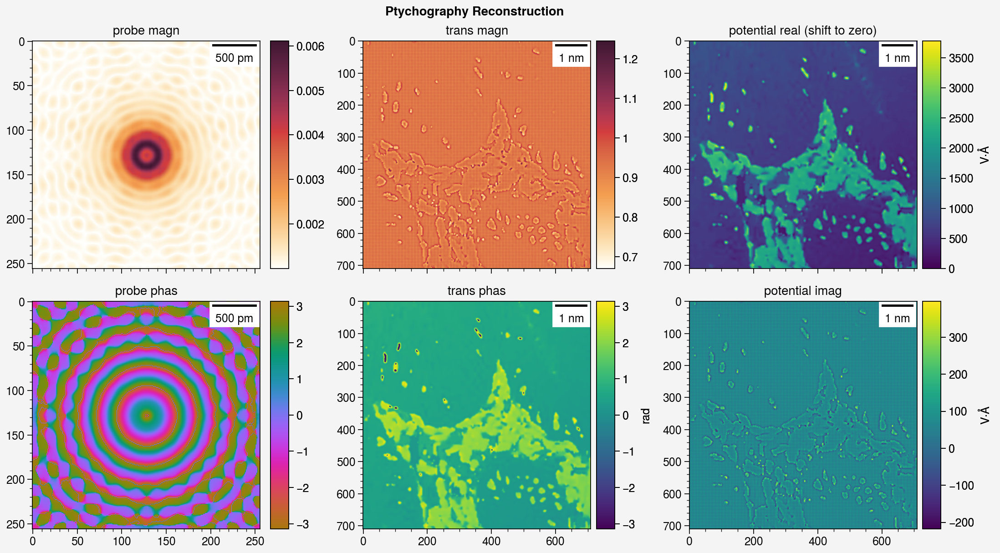

In [11]:
import matplotlib.pyplot as plt
from matplotlib import colors
import proplot as pplt
from matplotlib_scalebar.scalebar import ScaleBar
pplt.rc["grid"] = False

fig, axs = pplt.subplots(nrows=2, ncols=3, sharey=False, suptitle="Ptychography Reconstruction")

# probe image (magnitude and phase parts)
m = axs[0, 0].imshow(np.abs(probe_rot) + 1e-3)#, norm=colors.LogNorm())
axs[0, 0].format(title="probe magn")
axs[0, 0].colorbar(m, loc="r")

m = axs[1, 0].imshow(np.angle(probe_rot), cmap="phase", vmin=-np.pi, vmax=np.pi)
axs[1, 0].format(title="probe phas")
axs[1, 0].colorbar(m, loc="r")

# transmission function (magnitude and phase parts)
m = axs[0, 1].imshow(np.abs(trans_rot))
axs[0, 1].format(title="trans magn")
axs[0, 1].colorbar(m, loc="r")

m = axs[1, 1].imshow(np.angle(trans_rot), cmap="viridis")
axs[1, 1].format(title="trans phas")
axs[1, 1].colorbar(m, loc="r", label="rad")

# potential function (real and imaginary parts)
m = axs[0, 2].imshow((potential_real - potential_real.min()) * 1e10, cmap="viridis")
axs[0, 2].format(title="potential real (shift to zero)")
axs[0, 2].colorbar(m, loc="r", label="V$\cdot\AA$")

m = axs[1, 2].imshow(potential_imag * 1e10, cmap="viridis")
axs[1, 2].format(title="potential imag")
axs[1, 2].colorbar(m, loc="r", label="V$\cdot\AA$")

for i in range(2):
    for j in range(3):
        axs[i, j].add_artist(ScaleBar(resolution_real_space, "m", length_fraction=0.2))

pplt.show()
fig.savefig(result_path/"overview.png")

In [12]:
print(f"--- {time.time() - start_time} seconds ---")

--- 3826.5124282836914 seconds ---


## Save the Results of the Final Iteration

In [13]:
np.save(result_path/"final_probe_rot.npy", probe_rot)
np.save(result_path/"final_trans_rot.npy", trans_rot)
np.save(result_path/"final_poten_rot.npy", potential)

## Fit Aberration in Probe Wave Function

In [14]:
from fitaber import fit_aber, coefs_all_up_to
import fitaber

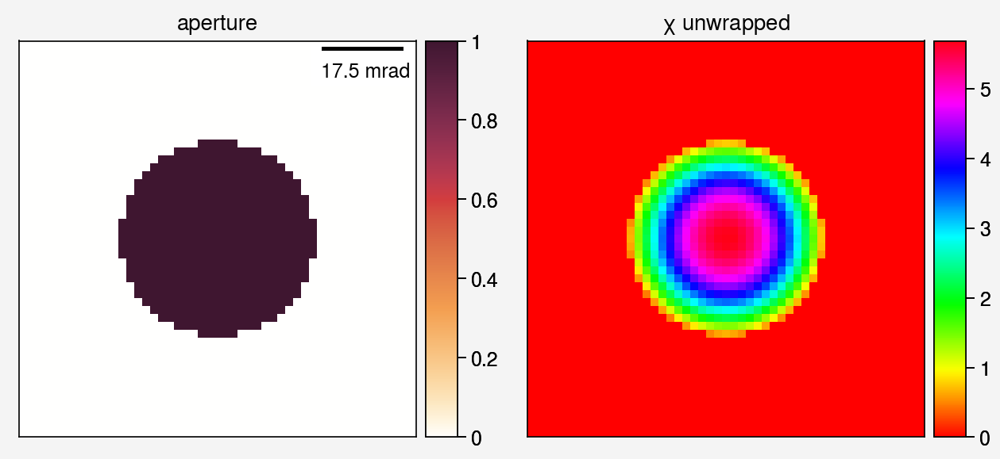

In [15]:
aperture = np.abs(np.fft.ifftshift(np.fft.fft2(np.fft.fftshift(probe_rot))))
aperture = (aperture > aperture.max()/2).astype(np.int32)
# chi = -np.angle(np.fft.ifftshift(np.fft.fft2(np.fft.fftshift(probe_rot)))) * aperture
chi = -unwrap_phase(np.angle(np.fft.ifftshift(np.fft.fft2(np.fft.fftshift(probe_rot)))) * aperture, wrap_around=True) * aperture

margin = aperture.shape[0]/2 - np.sum(aperture[aperture.shape[0]//2,:])
fig, (ax1, ax2) = pplt.subplots(nrows=1, ncols=2,
                                xlim=(margin, chi.shape[1]-margin),
                                ylim=(margin, chi.shape[1]-margin),
                                xticks=[], yticks=[])
m = ax1.imshow(aperture)
ax1.add_artist(ScaleBar(resolution_reciprocal_space_rad,
                        units="deg", dimension="angle", length_fraction=0.25,
                        scale_formatter=lambda value, unit: f"{value*np.pi/180*1e3: .1f} mrad"))
ax1.colorbar(m, loc="r")
ax1.format(title="aperture")

m = ax2.imshow(chi, cmap="hsv")
ax2.colorbar(m, loc="r")
ax2.format(title="$\chi$ unwrapped")

In [16]:
result_aber = fit_aber(chi, coefs_all_up_to(), scale=resolution_reciprocal_space_rad, mask=aperture, kV=attrs["voltage"])
print(result_aber.format())

[
[ 0]:      -: c(0,0) = C(-1,0)= Polar(  0.003783 nm,          0 °)
[ 1]:     A0: c(1,1) = C(0,1) = Polar(  0.003156 nm,      40.02 °)
[ 3]:     C1: c(2,0) = C(1,0) = Polar(     17.11 nm,        180 °)
[ 4]:     A1: c(2,2) = C(1,2) = Polar(   0.04926 nm,     -75.47 °)
[ 6]: 1/3 B2: c(3,1) = C(2,1) = Polar(      4.98 nm,      96.65 °)
[ 8]:     A2: c(3,3) = C(2,3) = Polar(     3.989 nm,      3.587 °)
[10]:     C3: c(4,0) = C(3,0) = Polar(     1.054 um,        180 °)
[11]: 1/4 S3: c(4,2) = C(3,2) = Polar(    0.6713 um,      17.58 °)
[13]:     A3: c(4,4) = C(3,4) = Polar(   0.04673 um,      3.444 °)
[15]: 1/5 B4: c(5,1) = C(4,1) = Polar(     27.68 um,     -106.9 °)
[17]: 1/5 D4: c(5,3) = C(4,3) = Polar(     19.56 um,     -56.36 °)
[19]:     A4: c(5,5) = C(4,5) = Polar(    0.9468 um,      3.134 °)
[21]:     C5: c(6,0) = C(5,0) = Polar(     2.093 mm,          0 °)
[22]: 1/6 S5: c(6,2) = C(5,2) = Polar(     1.512 mm,     -69.64 °)
[24]: 1/6 R5: c(6,4) = C(5,4) = Polar(    0.1928 mm,     -39

aberration contribution (threshold = 5 %)
name, theta (mrad) (values [Angstrom], %)
=============  ===========  ===========  ==========  =========  =========  =========  =========
..             0.5          0.625        1.25        2.5        5          10         20
=============  ===========  ===========  ==========  =========  =========  =========  =========
=============  ===========  ===========  ==========  =========  =========  =========  =========
-              3.783e-12    3.783e-12    3.783e-12   3.783e-12  3.783e-12  3.783e-12  3.783e-12
= 0.003783 nm  (99.9 %)     (99.86 %)    (99.54 %)   (98.4 %)   (94.25 %)  (80.81 %)  (50.81 %)
C1             2.139e-15    3.342e-15    1.337e-14   5.347e-14  2.139e-13  8.556e-13  3.422e-12
= 17.11 nm     (0.05648 %)  (0.08821 %)  (0.3517 %)  (1.391 %)  (5.328 %)  (18.27 %)  (45.96 %)
=============  ===========  ===========  ==========  =========  =========  =========  =========


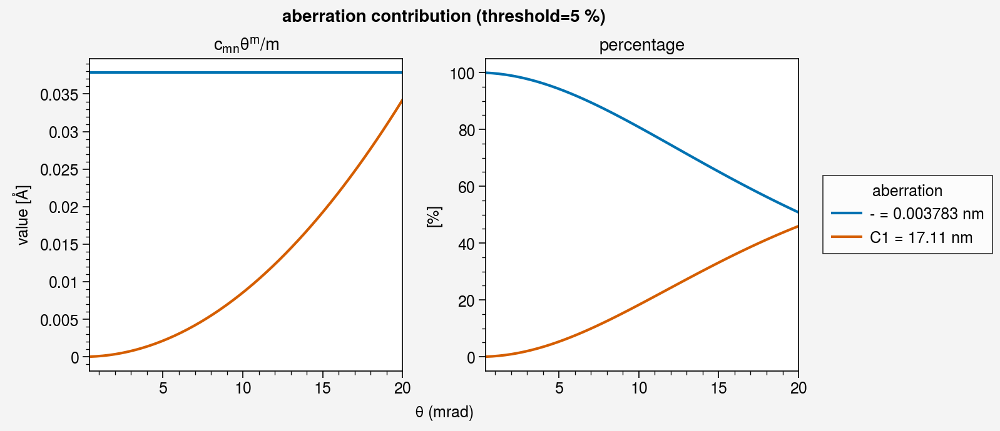

In [17]:
_ = fitaber.print_contribution(result_aber, attrs["semiconv"], threshold=5)
fitaber.plot_contribution(result_aber, attrs["semiconv"], threshold=5)

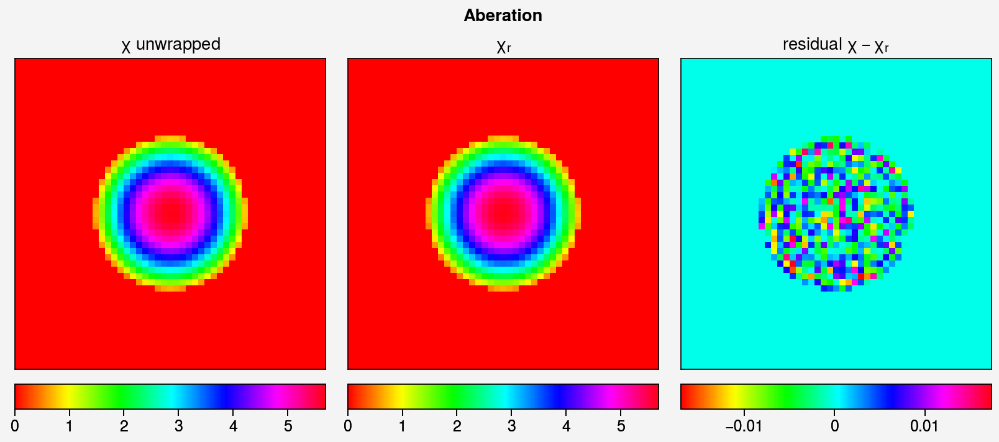

In [18]:
fig, axs = pplt.subplots(nrows=1, ncols=3, suptitle="Aberation",
                         xlim=(margin, chi.shape[1]-margin),
                         ylim=(margin, chi.shape[1]-margin),
                         xticks=[], yticks=[])
ax1, ax2, ax3 = axs

m = ax1.imshow(chi, cmap="hsv")
ax1.colorbar(m, loc="b")
ax1.format(title="$\chi$ unwrapped")

reconstaber = fitaber.aber(result_aber, chi.shape[0], resolution_reciprocal_space_rad) * aperture
m = ax2.imshow(reconstaber, cmap="hsv")
ax2.colorbar(m, loc="b")
ax2.format(title="$\chi_{\mathrm{r}}$")

residual = chi - reconstaber
m = ax3.imshow(residual, cmap="hsv")
ax3.colorbar(m, loc="b")
ax3.format(title="residual $\chi - \chi_{\mathrm{r}}$")

pplt.show()